In [1]:
import numpy as np
import pandas as pd
import glob
import math
import datetime
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso


In [2]:
sample_submission = pd.read_csv("sample_submission.csv")
sample_submission

,segment_id,time_to_eruption
0,1000213997,0
1,100023368,0
2,1000488999,0
3,1001028887,0
4,1001857862,0
...,...,...
4515,996704281,0
4516,997630809,0
4517,998072137,0
4518,998136924,0


In [11]:
train=pd.read_csv('train.csv')
train

,segment_id,time_to_eruption
0,1136037770,12262005
1,1969647810,32739612
2,1895879680,14965999
3,2068207140,26469720
4,192955606,31072429
...,...,...
4426,873340274,15695097
4427,1297437712,35659379
4428,694853998,31206935
4429,1886987043,9598270


In [3]:
def create_features(df,signal,seg_id,sensor_id):
    f = np.fft.fft(signal)
    df.loc[seg_id, f'{sensor_id}_sum']       = signal.sum()
    df.loc[seg_id, f'{sensor_id}_mean']      = signal.mean()
    df.loc[seg_id, f'{sensor_id}_std']       = signal.std()
    df.loc[seg_id, f'{sensor_id}_var']       = signal.var() 
    df.loc[seg_id, f'{sensor_id}_max']       = signal.max()
    df.loc[seg_id, f'{sensor_id}_min']       = signal.min()
    df.loc[seg_id, f'{sensor_id}_quantile99']= np.quantile(signal, 0.99)
    df.loc[seg_id, f'{sensor_id}_quantile95']= np.quantile(signal, 0.95)
    df.loc[seg_id, f'{sensor_id}_quantile85']= np.quantile(signal, 0.85)
    df.loc[seg_id, f'{sensor_id}_quantile75']= np.quantile(signal, 0.75)
    df.loc[seg_id, f'{sensor_id}_quantile55']= np.quantile(signal, 0.55)
    df.loc[seg_id, f'{sensor_id}_quantile45']= np.quantile(signal, 0.45) 
    df.loc[seg_id, f'{sensor_id}_quantile25']= np.quantile(signal, 0.25) 
    df.loc[seg_id, f'{sensor_id}_quantile15']= np.quantile(signal, 0.15) 
    df.loc[seg_id, f'{sensor_id}_quantile05']= np.quantile(signal, 0.05)
    df.loc[seg_id, f'{sensor_id}_quantile01']= np.quantile(signal, 0.01)
    return df

In [5]:
train = pd.read_csv('train.csv')
train_df = pd.DataFrame()
train_df['segment_id'] = train.segment_id
train_df = train_df.set_index('segment_id')

for seg in train.segment_id:
    signals = pd.read_csv(f'train/{seg}.csv')
    for i in range(1, 11):
        sensor_id = f'sensor_{i}'
        train_df = create_features(train_df, signals[sensor_id].fillna(0), seg, sensor_id,)

In [6]:
train_df.head()

,sensor_1_sum,sensor_1_mean,sensor_1_std,sensor_1_var,sensor_1_max,sensor_1_min,sensor_1_quantile99,sensor_1_quantile95,sensor_1_quantile85,sensor_1_quantile75,...,sensor_10_quantile99,sensor_10_quantile95,sensor_10_quantile85,sensor_10_quantile75,sensor_10_quantile55,sensor_10_quantile45,sensor_10_quantile25,sensor_10_quantile15,sensor_10_quantile05,sensor_10_quantile01
segment_id,,,,,,,,,,,,,,,,,,,,,
1136037770,-96621.0,-1.610323,303.096099,91867.245099,1353.0,-1421.0,704.0,492.0,309.0,199.0,...,1375.0,992.0,617.0,410.0,78.0,-77.0,-406.0,-616.0,-966.0,-1369.0
1969647810,85569.0,1.426126,438.360560,192159.980413,2197.0,-2005.0,1108.0,704.0,422.0,270.0,...,2494.0,1549.0,892.0,565.0,101.0,-101.0,-547.0,-864.0,-1448.0,-2228.0
1895879680,150278.0,2.504592,241.575415,58358.681050,1148.0,-1115.0,613.0,392.0,248.0,157.0,...,1231.0,822.0,498.0,321.0,59.0,-59.0,-323.0,-497.0,-806.0,-1212.0
2068207140,129950.0,2.165797,221.967825,49269.715377,1254.0,-1025.0,556.0,361.0,219.0,140.0,...,1339.0,869.0,510.0,326.0,61.0,-60.0,-323.0,-499.0,-828.0,-1223.0
192955606,4429.0,0.073815,261.695935,68484.762635,1114.0,-1190.0,636.0,435.0,263.0,170.0,...,1334.0,915.0,557.0,361.0,65.0,-68.0,-362.0,-568.0,-934.0,-1382.0


In [7]:
test = pd.read_csv('sample_submission.csv')
test_df = pd.DataFrame()
test_df['segment_id'] = test.segment_id
test_df = test_df.set_index('segment_id')
for seg in test.segment_id:
    signals = pd.read_csv(f'test/{seg}.csv')
    for i in range(1, 11):
        sensor_id = f'sensor_{i}'
        test_df = create_features(test_df, signals[sensor_id].fillna(0), seg, sensor_id,)

In [8]:
test_df.head()

,sensor_1_sum,sensor_1_mean,sensor_1_std,sensor_1_var,sensor_1_max,sensor_1_min,sensor_1_quantile99,sensor_1_quantile95,sensor_1_quantile85,sensor_1_quantile75,...,sensor_10_quantile99,sensor_10_quantile95,sensor_10_quantile85,sensor_10_quantile75,sensor_10_quantile55,sensor_10_quantile45,sensor_10_quantile25,sensor_10_quantile15,sensor_10_quantile05,sensor_10_quantile01
segment_id,,,,,,,,,,,,,,,,,,,,,
1000213997,267753.0,4.462476,306.174474,93742.808496,1347.0,-1319.0,758.0,513.0,314.0,201.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100023368,50287.0,0.838103,335.591100,112621.386722,1214.0,-1268.0,768.0,546.0,352.0,232.0,...,1304.0,927.0,579.0,375.0,68.0,-71.0,-389.0,-589.0,-932.0,-1375.0
1000488999,47695.0,0.794903,352.172248,124025.292301,4259.0,-3806.0,927.0,536.0,308.0,194.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1001028887,117225.0,1.953717,259.030122,67096.604275,1220.0,-1156.0,609.0,427.0,272.0,177.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1001857862,-239079.0,-3.984584,254.306426,64671.758246,972.0,-1111.0,577.0,409.0,256.0,167.0,...,1222.0,865.0,536.0,349.0,65.0,-64.0,-350.0,-540.0,-862.0,-1234.0


C:\Users\JOYDATTA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='time_to_eruption', ylabel='Density'>

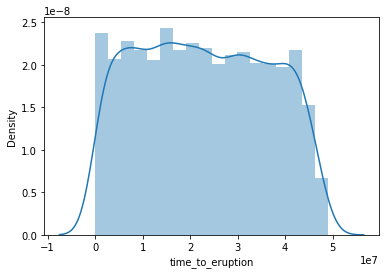

In [12]:
sns.distplot(train['time_to_eruption'])

In [13]:
y= train.time_to_eruption

In [14]:
dataset=train_df.copy()
data=test_df.copy()

In [18]:
full=pd.concat([train_df,test_df], ignore_index=True)
full.head()


,sensor_1_sum,sensor_1_mean,sensor_1_std,sensor_1_var,sensor_1_max,sensor_1_min,sensor_1_quantile99,sensor_1_quantile95,sensor_1_quantile85,sensor_1_quantile75,...,sensor_10_quantile99,sensor_10_quantile95,sensor_10_quantile85,sensor_10_quantile75,sensor_10_quantile55,sensor_10_quantile45,sensor_10_quantile25,sensor_10_quantile15,sensor_10_quantile05,sensor_10_quantile01
0,-96621.0,-1.610323,303.096099,91867.245099,1353.0,-1421.0,704.0,492.0,309.0,199.0,...,1375.0,992.0,617.0,410.0,78.0,-77.0,-406.0,-616.0,-966.0,-1369.0
1,85569.0,1.426126,438.360560,192159.980413,2197.0,-2005.0,1108.0,704.0,422.0,270.0,...,2494.0,1549.0,892.0,565.0,101.0,-101.0,-547.0,-864.0,-1448.0,-2228.0
2,150278.0,2.504592,241.575415,58358.681050,1148.0,-1115.0,613.0,392.0,248.0,157.0,...,1231.0,822.0,498.0,321.0,59.0,-59.0,-323.0,-497.0,-806.0,-1212.0
3,129950.0,2.165797,221.967825,49269.715377,1254.0,-1025.0,556.0,361.0,219.0,140.0,...,1339.0,869.0,510.0,326.0,61.0,-60.0,-323.0,-499.0,-828.0,-1223.0
4,4429.0,0.073815,261.695935,68484.762635,1114.0,-1190.0,636.0,435.0,263.0,170.0,...,1334.0,915.0,557.0,361.0,65.0,-68.0,-362.0,-568.0,-934.0,-1382.0


In [19]:
feature_scale=[feature for feature in full.columns ]

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(full[feature_scale])

StandardScaler()

In [20]:
full_1 =pd.DataFrame(scaler.transform(full[feature_scale]), columns=feature_scale)

In [21]:
n_train=train_df.shape[0]
train_X = full_1[:n_train]
test_X = full_1[n_train:]

In [22]:
feature_sel_model = SelectFromModel(Lasso(alpha=0.005, random_state=0))
feature_sel_model.fit(train_X,y)

C:\Users\JOYDATTA\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.039710562946735e+17, tolerance: 80550097318866.36
  model = cd_fast.enet_coordinate_descent(


SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [23]:
selected_feat = train_X.columns[(feature_sel_model.get_support())]


print('total features: {}'.format((train_X.shape[1])))
print('selected features: {}'.format(len(selected_feat)))

total features: 160
selected features: 150


In [37]:
train_X1=train_X[selected_feat]
test_X1=test_X[selected_feat]

In [38]:
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [39]:
xg_reg.fit(train_X1,y)

preds = xg_reg.predict(test_X1)

In [40]:
submission = pd.DataFrame()
submission['segment_id'] = sample_submission["segment_id"]
submission['time_to_eruption'] = preds
submission.to_csv('submission.csv', header=True, index=False)

In [76]:
import tensorflow as tf
model= tf.keras.models.Sequential(
    layers=[
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
         tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
         tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),
        tf.keras.layers.Dense(units=10,activation=tf.nn.relu),

        
        
        
        
       
      
        tf.keras.layers.Dense(units=1)
    ]
)

In [77]:
model.compile(loss='mse', optimizer='adam',
              metrics=['mse'])

In [79]:
model.fit(x=np.array(train_X1),y=np.array(y),batch_size=16,epochs=100000,verbose=2,validation_split=0.2,shuffle=True)

Epoch 1/100000
222/222 - 0s - loss: 697667306913792.0000 - mse: 697667306913792.0000 - val_loss: 724727278600192.0000 - val_mse: 724727278600192.0000
Epoch 2/100000
222/222 - 0s - loss: 397390842429440.0000 - mse: 397390842429440.0000 - val_loss: 247945425321984.0000 - val_mse: 247945425321984.0000
Epoch 3/100000
222/222 - 0s - loss: 231640001413120.0000 - mse: 231640001413120.0000 - val_loss: 225452580929536.0000 - val_mse: 225452580929536.0000
Epoch 4/100000
222/222 - 0s - loss: 211416694915072.0000 - mse: 211416694915072.0000 - val_loss: 204684451119104.0000 - val_mse: 204684451119104.0000
Epoch 5/100000
222/222 - 0s - loss: 192302328840192.0000 - mse: 192302328840192.0000 - val_loss: 187041916649472.0000 - val_mse: 187041916649472.0000
Epoch 6/100000
222/222 - 0s - loss: 177933515751424.0000 - mse: 177933515751424.0000 - val_loss: 178648309039104.0000 - val_mse: 178648309039104.0000
Epoch 7/100000
222/222 - 0s - loss: 167781756567552.0000 - mse: 167781756567552.0000 - val_loss: 163

Epoch 56/100000
222/222 - 0s - loss: 113832571699200.0000 - mse: 113832571699200.0000 - val_loss: 116895395086336.0000 - val_mse: 116895395086336.0000
Epoch 57/100000
222/222 - 0s - loss: 113319314718720.0000 - mse: 113319314718720.0000 - val_loss: 116035571154944.0000 - val_mse: 116035571154944.0000
Epoch 58/100000
222/222 - 0s - loss: 112837531795456.0000 - mse: 112837531795456.0000 - val_loss: 117563027619840.0000 - val_mse: 117563027619840.0000
Epoch 59/100000
222/222 - 0s - loss: 112285074849792.0000 - mse: 112285074849792.0000 - val_loss: 115069455171584.0000 - val_mse: 115069455171584.0000
Epoch 60/100000
222/222 - 0s - loss: 111753354543104.0000 - mse: 111753354543104.0000 - val_loss: 114748783853568.0000 - val_mse: 114748783853568.0000
Epoch 61/100000
222/222 - 0s - loss: 111628372672512.0000 - mse: 111628372672512.0000 - val_loss: 116138298048512.0000 - val_mse: 116138298048512.0000
Epoch 62/100000
222/222 - 0s - loss: 110580039942144.0000 - mse: 110580039942144.0000 - val_lo

Epoch 111/100000
222/222 - 0s - loss: 89532871475200.0000 - mse: 89532871475200.0000 - val_loss: 104016331669504.0000 - val_mse: 104016331669504.0000
Epoch 112/100000
222/222 - 0s - loss: 89676039847936.0000 - mse: 89676039847936.0000 - val_loss: 104492905267200.0000 - val_mse: 104492905267200.0000
Epoch 113/100000
222/222 - 0s - loss: 89252029267968.0000 - mse: 89252029267968.0000 - val_loss: 104025810796544.0000 - val_mse: 104025810796544.0000
Epoch 114/100000
222/222 - 0s - loss: 88919848779776.0000 - mse: 88919848779776.0000 - val_loss: 102111555616768.0000 - val_mse: 102111555616768.0000
Epoch 115/100000
222/222 - 0s - loss: 87750367772672.0000 - mse: 87750367772672.0000 - val_loss: 101959008780288.0000 - val_mse: 101959008780288.0000
Epoch 116/100000
222/222 - 0s - loss: 87535518744576.0000 - mse: 87535518744576.0000 - val_loss: 101201978851328.0000 - val_mse: 101201978851328.0000
Epoch 117/100000
222/222 - 0s - loss: 87136808206336.0000 - mse: 87136808206336.0000 - val_loss: 102

Epoch 167/100000
222/222 - 0s - loss: 76502645342208.0000 - mse: 76502645342208.0000 - val_loss: 96828913614848.0000 - val_mse: 96828913614848.0000
Epoch 168/100000
222/222 - 0s - loss: 76681607905280.0000 - mse: 76681607905280.0000 - val_loss: 97460978450432.0000 - val_mse: 97460978450432.0000
Epoch 169/100000
222/222 - 0s - loss: 76072972451840.0000 - mse: 76072972451840.0000 - val_loss: 95633503420416.0000 - val_mse: 95633503420416.0000
Epoch 170/100000
222/222 - 0s - loss: 76222893654016.0000 - mse: 76222893654016.0000 - val_loss: 98356865007616.0000 - val_mse: 98356865007616.0000
Epoch 171/100000
222/222 - 0s - loss: 75794227396608.0000 - mse: 75794227396608.0000 - val_loss: 98461395451904.0000 - val_mse: 98461395451904.0000
Epoch 172/100000
222/222 - 0s - loss: 76250206961664.0000 - mse: 76250206961664.0000 - val_loss: 95648661635072.0000 - val_mse: 95648661635072.0000
Epoch 173/100000
222/222 - 0s - loss: 75484075393024.0000 - mse: 75484075393024.0000 - val_loss: 96060475179008.

Epoch 223/100000
222/222 - 0s - loss: 67516659400704.0000 - mse: 67516659400704.0000 - val_loss: 93452893159424.0000 - val_mse: 93452893159424.0000
Epoch 224/100000
222/222 - 0s - loss: 67233334165504.0000 - mse: 67233334165504.0000 - val_loss: 93718736535552.0000 - val_mse: 93718736535552.0000
Epoch 225/100000
222/222 - 0s - loss: 67593503244288.0000 - mse: 67593503244288.0000 - val_loss: 91341304365056.0000 - val_mse: 91341304365056.0000
Epoch 226/100000
222/222 - 0s - loss: 67359985369088.0000 - mse: 67359985369088.0000 - val_loss: 90893746962432.0000 - val_mse: 90893746962432.0000
Epoch 227/100000
222/222 - 0s - loss: 66928760586240.0000 - mse: 66928760586240.0000 - val_loss: 91402323099648.0000 - val_mse: 91402323099648.0000
Epoch 228/100000
222/222 - 0s - loss: 66642272845824.0000 - mse: 66642272845824.0000 - val_loss: 92101823954944.0000 - val_mse: 92101823954944.0000
Epoch 229/100000
222/222 - 0s - loss: 67301822955520.0000 - mse: 67301822955520.0000 - val_loss: 92069133549568.

Epoch 279/100000
222/222 - 0s - loss: 61444460642304.0000 - mse: 61444460642304.0000 - val_loss: 97742785347584.0000 - val_mse: 97742785347584.0000
Epoch 280/100000
222/222 - 0s - loss: 60979287162880.0000 - mse: 60979287162880.0000 - val_loss: 97546424811520.0000 - val_mse: 97546424811520.0000
Epoch 281/100000
222/222 - 0s - loss: 61218035335168.0000 - mse: 61218035335168.0000 - val_loss: 96465191960576.0000 - val_mse: 96465191960576.0000
Epoch 282/100000
222/222 - 0s - loss: 60716606291968.0000 - mse: 60716606291968.0000 - val_loss: 97757171810304.0000 - val_mse: 97757171810304.0000
Epoch 283/100000
222/222 - 0s - loss: 60912857776128.0000 - mse: 60912857776128.0000 - val_loss: 97655820648448.0000 - val_mse: 97655820648448.0000
Epoch 284/100000
222/222 - 0s - loss: 60807220035584.0000 - mse: 60807220035584.0000 - val_loss: 101423815589888.0000 - val_mse: 101423815589888.0000
Epoch 285/100000
222/222 - 0s - loss: 60772583473152.0000 - mse: 60772583473152.0000 - val_loss: 9963718469222

Epoch 334/100000
222/222 - 0s - loss: 56585514647552.0000 - mse: 56585514647552.0000 - val_loss: 117541712166912.0000 - val_mse: 117541712166912.0000
Epoch 335/100000
222/222 - 0s - loss: 56327799832576.0000 - mse: 56327799832576.0000 - val_loss: 120438197846016.0000 - val_mse: 120438197846016.0000
Epoch 336/100000
222/222 - 0s - loss: 55800382881792.0000 - mse: 55800382881792.0000 - val_loss: 122115399352320.0000 - val_mse: 122115399352320.0000
Epoch 337/100000
222/222 - 0s - loss: 56178117705728.0000 - mse: 56178117705728.0000 - val_loss: 120514886500352.0000 - val_mse: 120514886500352.0000
Epoch 338/100000
222/222 - 0s - loss: 56487808335872.0000 - mse: 56487808335872.0000 - val_loss: 123949534937088.0000 - val_mse: 123949534937088.0000
Epoch 339/100000
222/222 - 0s - loss: 55682728460288.0000 - mse: 55682728460288.0000 - val_loss: 123468163055616.0000 - val_mse: 123468163055616.0000
Epoch 340/100000
222/222 - 0s - loss: 55611815362560.0000 - mse: 55611815362560.0000 - val_loss: 121

Epoch 389/100000
222/222 - 0s - loss: 51566841167872.0000 - mse: 51566841167872.0000 - val_loss: 120917304803328.0000 - val_mse: 120917304803328.0000
Epoch 390/100000
222/222 - 0s - loss: 51684604641280.0000 - mse: 51684604641280.0000 - val_loss: 119833085607936.0000 - val_mse: 119833085607936.0000
Epoch 391/100000
222/222 - 0s - loss: 51754460774400.0000 - mse: 51754460774400.0000 - val_loss: 124066874785792.0000 - val_mse: 124066874785792.0000
Epoch 392/100000
222/222 - 0s - loss: 51069040197632.0000 - mse: 51069040197632.0000 - val_loss: 119477400240128.0000 - val_mse: 119477400240128.0000
Epoch 393/100000
222/222 - 0s - loss: 51034315554816.0000 - mse: 51034315554816.0000 - val_loss: 127735280173056.0000 - val_mse: 127735280173056.0000
Epoch 394/100000
222/222 - 0s - loss: 51445734834176.0000 - mse: 51445734834176.0000 - val_loss: 121736989245440.0000 - val_mse: 121736989245440.0000
Epoch 395/100000
222/222 - 0s - loss: 50913704148992.0000 - mse: 50913704148992.0000 - val_loss: 121

Epoch 444/100000
222/222 - 0s - loss: 47410185240576.0000 - mse: 47410185240576.0000 - val_loss: 111521090764800.0000 - val_mse: 111521090764800.0000
Epoch 445/100000
222/222 - 0s - loss: 47370528096256.0000 - mse: 47370528096256.0000 - val_loss: 112780061442048.0000 - val_mse: 112780061442048.0000
Epoch 446/100000
222/222 - 0s - loss: 47312420208640.0000 - mse: 47312420208640.0000 - val_loss: 114301142564864.0000 - val_mse: 114301142564864.0000
Epoch 447/100000
222/222 - 0s - loss: 47290182008832.0000 - mse: 47290182008832.0000 - val_loss: 106494938841088.0000 - val_mse: 106494938841088.0000
Epoch 448/100000
222/222 - 0s - loss: 47692768083968.0000 - mse: 47692768083968.0000 - val_loss: 111034937376768.0000 - val_mse: 111034937376768.0000
Epoch 449/100000
222/222 - 0s - loss: 48136579973120.0000 - mse: 48136579973120.0000 - val_loss: 113716834074624.0000 - val_mse: 113716834074624.0000
Epoch 450/100000
222/222 - 0s - loss: 46685514366976.0000 - mse: 46685514366976.0000 - val_loss: 113

Epoch 499/100000
222/222 - 0s - loss: 44764229533696.0000 - mse: 44764229533696.0000 - val_loss: 118797956546560.0000 - val_mse: 118797956546560.0000
Epoch 500/100000
222/222 - 0s - loss: 44415196332032.0000 - mse: 44415196332032.0000 - val_loss: 113271717756928.0000 - val_mse: 113271717756928.0000
Epoch 501/100000
222/222 - 0s - loss: 44412449062912.0000 - mse: 44412449062912.0000 - val_loss: 113673028763648.0000 - val_mse: 113673028763648.0000
Epoch 502/100000
222/222 - 0s - loss: 44091488337920.0000 - mse: 44091488337920.0000 - val_loss: 112379371192320.0000 - val_mse: 112379371192320.0000
Epoch 503/100000
222/222 - 0s - loss: 44432938237952.0000 - mse: 44432938237952.0000 - val_loss: 121742307622912.0000 - val_mse: 121742307622912.0000
Epoch 504/100000
222/222 - 0s - loss: 43840266305536.0000 - mse: 43840266305536.0000 - val_loss: 115552127287296.0000 - val_mse: 115552127287296.0000
Epoch 505/100000
222/222 - 0s - loss: 44062392451072.0000 - mse: 44062392451072.0000 - val_loss: 116

Epoch 554/100000
222/222 - 0s - loss: 42267230339072.0000 - mse: 42267230339072.0000 - val_loss: 104091216773120.0000 - val_mse: 104091216773120.0000
Epoch 555/100000
222/222 - 0s - loss: 41640186085376.0000 - mse: 41640186085376.0000 - val_loss: 105977772769280.0000 - val_mse: 105977772769280.0000
Epoch 556/100000
222/222 - 0s - loss: 42485048934400.0000 - mse: 42485048934400.0000 - val_loss: 110140661432320.0000 - val_mse: 110140661432320.0000
Epoch 557/100000
222/222 - 0s - loss: 42029685932032.0000 - mse: 42029685932032.0000 - val_loss: 107006056726528.0000 - val_mse: 107006056726528.0000
Epoch 558/100000
222/222 - 0s - loss: 41644191645696.0000 - mse: 41644191645696.0000 - val_loss: 110947486138368.0000 - val_mse: 110947486138368.0000
Epoch 559/100000
222/222 - 0s - loss: 42380858228736.0000 - mse: 42380858228736.0000 - val_loss: 110012055683072.0000 - val_mse: 110012055683072.0000
Epoch 560/100000
222/222 - 0s - loss: 42142038753280.0000 - mse: 42142038753280.0000 - val_loss: 106

Epoch 609/100000
222/222 - 0s - loss: 40636518498304.0000 - mse: 40636518498304.0000 - val_loss: 102461570285568.0000 - val_mse: 102461570285568.0000
Epoch 610/100000
222/222 - 0s - loss: 40464874995712.0000 - mse: 40464874995712.0000 - val_loss: 110035845775360.0000 - val_mse: 110035845775360.0000
Epoch 611/100000
222/222 - 0s - loss: 40865200340992.0000 - mse: 40865200340992.0000 - val_loss: 109176986533888.0000 - val_mse: 109176986533888.0000
Epoch 612/100000
222/222 - 0s - loss: 40181151301632.0000 - mse: 40181151301632.0000 - val_loss: 108031790546944.0000 - val_mse: 108031790546944.0000
Epoch 613/100000
222/222 - 0s - loss: 40827141226496.0000 - mse: 40827141226496.0000 - val_loss: 108705982971904.0000 - val_mse: 108705982971904.0000
Epoch 614/100000
222/222 - 0s - loss: 40628335411200.0000 - mse: 40628335411200.0000 - val_loss: 115890901221376.0000 - val_mse: 115890901221376.0000
Epoch 615/100000
222/222 - 0s - loss: 40164084678656.0000 - mse: 40164084678656.0000 - val_loss: 110

Epoch 664/100000
222/222 - 0s - loss: 39592979857408.0000 - mse: 39592979857408.0000 - val_loss: 112173120487424.0000 - val_mse: 112173120487424.0000
Epoch 665/100000
222/222 - 0s - loss: 38841704513536.0000 - mse: 38841704513536.0000 - val_loss: 111519522095104.0000 - val_mse: 111519522095104.0000
Epoch 666/100000
222/222 - 0s - loss: 39071921471488.0000 - mse: 39071921471488.0000 - val_loss: 108051084345344.0000 - val_mse: 108051084345344.0000
Epoch 667/100000
222/222 - 0s - loss: 38669545111552.0000 - mse: 38669545111552.0000 - val_loss: 115820260753408.0000 - val_mse: 115820260753408.0000
Epoch 668/100000
222/222 - 0s - loss: 39043077242880.0000 - mse: 39043077242880.0000 - val_loss: 116721650237440.0000 - val_mse: 116721650237440.0000
Epoch 669/100000
222/222 - 0s - loss: 39598214348800.0000 - mse: 39598214348800.0000 - val_loss: 116484294574080.0000 - val_mse: 116484294574080.0000
Epoch 670/100000
222/222 - 0s - loss: 39174920994816.0000 - mse: 39174920994816.0000 - val_loss: 111

Epoch 719/100000
222/222 - 0s - loss: 38526288658432.0000 - mse: 38526288658432.0000 - val_loss: 109192388018176.0000 - val_mse: 109192388018176.0000
Epoch 720/100000
222/222 - 0s - loss: 38416993484800.0000 - mse: 38416993484800.0000 - val_loss: 116978568134656.0000 - val_mse: 116978568134656.0000
Epoch 721/100000
222/222 - 0s - loss: 38284751273984.0000 - mse: 38284751273984.0000 - val_loss: 110943946145792.0000 - val_mse: 110943946145792.0000
Epoch 722/100000
222/222 - 0s - loss: 38159173812224.0000 - mse: 38159173812224.0000 - val_loss: 110546200297472.0000 - val_mse: 110546200297472.0000
Epoch 723/100000
222/222 - 0s - loss: 37398046048256.0000 - mse: 37398046048256.0000 - val_loss: 111879812808704.0000 - val_mse: 111879812808704.0000
Epoch 724/100000
222/222 - 0s - loss: 37954835709952.0000 - mse: 37954835709952.0000 - val_loss: 110890636541952.0000 - val_mse: 110890636541952.0000
Epoch 725/100000
222/222 - 0s - loss: 37999668625408.0000 - mse: 37999668625408.0000 - val_loss: 116

Epoch 774/100000
222/222 - 0s - loss: 37730939568128.0000 - mse: 37730939568128.0000 - val_loss: 129265706205184.0000 - val_mse: 129265706205184.0000
Epoch 775/100000
222/222 - 0s - loss: 37576895365120.0000 - mse: 37576895365120.0000 - val_loss: 127631387262976.0000 - val_mse: 127631387262976.0000
Epoch 776/100000
222/222 - 0s - loss: 37320954740736.0000 - mse: 37320954740736.0000 - val_loss: 122146529476608.0000 - val_mse: 122146529476608.0000
Epoch 777/100000
222/222 - 0s - loss: 37983923208192.0000 - mse: 37983923208192.0000 - val_loss: 132602434420736.0000 - val_mse: 132602434420736.0000
Epoch 778/100000
222/222 - 0s - loss: 37019854045184.0000 - mse: 37019854045184.0000 - val_loss: 123085357318144.0000 - val_mse: 123085357318144.0000
Epoch 779/100000
222/222 - 0s - loss: 36671437406208.0000 - mse: 36671437406208.0000 - val_loss: 127688387854336.0000 - val_mse: 127688387854336.0000
Epoch 780/100000
222/222 - 0s - loss: 37620662927360.0000 - mse: 37620662927360.0000 - val_loss: 123

Epoch 829/100000
222/222 - 0s - loss: 36207639658496.0000 - mse: 36207639658496.0000 - val_loss: 127584687882240.0000 - val_mse: 127584687882240.0000
Epoch 830/100000
222/222 - 0s - loss: 36614642335744.0000 - mse: 36614642335744.0000 - val_loss: 120877198868480.0000 - val_mse: 120877198868480.0000
Epoch 831/100000
222/222 - 0s - loss: 36622586347520.0000 - mse: 36622586347520.0000 - val_loss: 128294557057024.0000 - val_mse: 128294557057024.0000
Epoch 832/100000
222/222 - 0s - loss: 36115897647104.0000 - mse: 36115897647104.0000 - val_loss: 128521603121152.0000 - val_mse: 128521603121152.0000
Epoch 833/100000
222/222 - 0s - loss: 36135359217664.0000 - mse: 36135359217664.0000 - val_loss: 127892591738880.0000 - val_mse: 127892591738880.0000
Epoch 834/100000
222/222 - 0s - loss: 37146081624064.0000 - mse: 37146081624064.0000 - val_loss: 125440886833152.0000 - val_mse: 125440886833152.0000
Epoch 835/100000
222/222 - 0s - loss: 36502323068928.0000 - mse: 36502323068928.0000 - val_loss: 131

Epoch 884/100000
222/222 - 0s - loss: 35714725052416.0000 - mse: 35714725052416.0000 - val_loss: 133928614625280.0000 - val_mse: 133928614625280.0000
Epoch 885/100000
222/222 - 0s - loss: 35300743053312.0000 - mse: 35300743053312.0000 - val_loss: 129067726667776.0000 - val_mse: 129067726667776.0000
Epoch 886/100000
222/222 - 0s - loss: 35780441407488.0000 - mse: 35780441407488.0000 - val_loss: 124970755686400.0000 - val_mse: 124970755686400.0000
Epoch 887/100000
222/222 - 0s - loss: 35296561332224.0000 - mse: 35296561332224.0000 - val_loss: 126206741577728.0000 - val_mse: 126206741577728.0000
Epoch 888/100000
222/222 - 0s - loss: 35433287254016.0000 - mse: 35433287254016.0000 - val_loss: 134702337884160.0000 - val_mse: 134702337884160.0000
Epoch 889/100000
222/222 - 0s - loss: 35559615496192.0000 - mse: 35559615496192.0000 - val_loss: 129902367997952.0000 - val_mse: 129902367997952.0000
Epoch 890/100000
222/222 - 0s - loss: 35788704186368.0000 - mse: 35788704186368.0000 - val_loss: 132

Epoch 939/100000
222/222 - 0s - loss: 34540192006144.0000 - mse: 34540192006144.0000 - val_loss: 130482129862656.0000 - val_mse: 130482129862656.0000
Epoch 940/100000
222/222 - 0s - loss: 34552202395648.0000 - mse: 34552202395648.0000 - val_loss: 134294710255616.0000 - val_mse: 134294710255616.0000
Epoch 941/100000
222/222 - 0s - loss: 35731108003840.0000 - mse: 35731108003840.0000 - val_loss: 128565467152384.0000 - val_mse: 128565467152384.0000
Epoch 942/100000
222/222 - 0s - loss: 35514472202240.0000 - mse: 35514472202240.0000 - val_loss: 131446123528192.0000 - val_mse: 131446123528192.0000
Epoch 943/100000
222/222 - 0s - loss: 35659565760512.0000 - mse: 35659565760512.0000 - val_loss: 137808714924032.0000 - val_mse: 137808714924032.0000
Epoch 944/100000
222/222 - 0s - loss: 35939686547456.0000 - mse: 35939686547456.0000 - val_loss: 127390021844992.0000 - val_mse: 127390021844992.0000
Epoch 945/100000
222/222 - 0s - loss: 35263124340736.0000 - mse: 35263124340736.0000 - val_loss: 137

Epoch 994/100000
222/222 - 0s - loss: 34812020654080.0000 - mse: 34812020654080.0000 - val_loss: 121332775780352.0000 - val_mse: 121332775780352.0000
Epoch 995/100000
222/222 - 0s - loss: 34084979998720.0000 - mse: 34084979998720.0000 - val_loss: 128419253714944.0000 - val_mse: 128419253714944.0000
Epoch 996/100000
222/222 - 0s - loss: 34207355109376.0000 - mse: 34207355109376.0000 - val_loss: 131409758912512.0000 - val_mse: 131409758912512.0000
Epoch 997/100000
222/222 - 0s - loss: 33951886344192.0000 - mse: 33951886344192.0000 - val_loss: 138107768799232.0000 - val_mse: 138107768799232.0000
Epoch 998/100000
222/222 - 0s - loss: 34152812380160.0000 - mse: 34152812380160.0000 - val_loss: 131563069112320.0000 - val_mse: 131563069112320.0000
Epoch 999/100000
222/222 - 0s - loss: 34490684538880.0000 - mse: 34490684538880.0000 - val_loss: 124855747870720.0000 - val_mse: 124855747870720.0000
Epoch 1000/100000
222/222 - 0s - loss: 34124421136384.0000 - mse: 34124421136384.0000 - val_loss: 13

Epoch 1049/100000
222/222 - 0s - loss: 33661107830784.0000 - mse: 33661107830784.0000 - val_loss: 126870993502208.0000 - val_mse: 126870993502208.0000
Epoch 1050/100000
222/222 - 0s - loss: 33808602628096.0000 - mse: 33808602628096.0000 - val_loss: 132429520044032.0000 - val_mse: 132429520044032.0000
Epoch 1051/100000
222/222 - 0s - loss: 34028990234624.0000 - mse: 34028990234624.0000 - val_loss: 125920723599360.0000 - val_mse: 125920723599360.0000
Epoch 1052/100000
222/222 - 0s - loss: 33607330562048.0000 - mse: 33607330562048.0000 - val_loss: 134724760633344.0000 - val_mse: 134724760633344.0000
Epoch 1053/100000
222/222 - 0s - loss: 33763111206912.0000 - mse: 33763111206912.0000 - val_loss: 124768154025984.0000 - val_mse: 124768154025984.0000
Epoch 1054/100000
222/222 - 0s - loss: 34204983230464.0000 - mse: 34204983230464.0000 - val_loss: 135556952489984.0000 - val_mse: 135556952489984.0000
Epoch 1055/100000
222/222 - 0s - loss: 33268460158976.0000 - mse: 33268460158976.0000 - val_lo

Epoch 1104/100000
222/222 - 0s - loss: 33128800321536.0000 - mse: 33128800321536.0000 - val_loss: 139847004061696.0000 - val_mse: 139847004061696.0000
Epoch 1105/100000
222/222 - 0s - loss: 33324137447424.0000 - mse: 33324137447424.0000 - val_loss: 136966255411200.0000 - val_mse: 136966255411200.0000
Epoch 1106/100000
222/222 - 0s - loss: 33585683759104.0000 - mse: 33585683759104.0000 - val_loss: 146338897461248.0000 - val_mse: 146338897461248.0000
Epoch 1107/100000
222/222 - 0s - loss: 33761108426752.0000 - mse: 33761108426752.0000 - val_loss: 137981729964032.0000 - val_mse: 137981729964032.0000
Epoch 1108/100000
222/222 - 0s - loss: 33614035156992.0000 - mse: 33614035156992.0000 - val_loss: 145160113487872.0000 - val_mse: 145160113487872.0000
Epoch 1109/100000
222/222 - 0s - loss: 33308389933056.0000 - mse: 33308389933056.0000 - val_loss: 131353764954112.0000 - val_mse: 131353764954112.0000
Epoch 1110/100000
222/222 - 0s - loss: 33662120755200.0000 - mse: 33662120755200.0000 - val_lo

Epoch 1159/100000
222/222 - 0s - loss: 33074603622400.0000 - mse: 33074603622400.0000 - val_loss: 138576658432000.0000 - val_mse: 138576658432000.0000
Epoch 1160/100000
222/222 - 0s - loss: 33014524411904.0000 - mse: 33014524411904.0000 - val_loss: 142276009394176.0000 - val_mse: 142276009394176.0000
Epoch 1161/100000
222/222 - 0s - loss: 32399836577792.0000 - mse: 32399836577792.0000 - val_loss: 136610444214272.0000 - val_mse: 136610444214272.0000
Epoch 1162/100000
222/222 - 0s - loss: 32536799477760.0000 - mse: 32536799477760.0000 - val_loss: 126866111332352.0000 - val_mse: 126866111332352.0000
Epoch 1163/100000
222/222 - 0s - loss: 32554025484288.0000 - mse: 32554025484288.0000 - val_loss: 143727121137664.0000 - val_mse: 143727121137664.0000
Epoch 1164/100000
222/222 - 0s - loss: 32273875337216.0000 - mse: 32273875337216.0000 - val_loss: 136639896616960.0000 - val_mse: 136639896616960.0000
Epoch 1165/100000
222/222 - 0s - loss: 32620857524224.0000 - mse: 32620857524224.0000 - val_lo

Epoch 1214/100000
222/222 - 0s - loss: 32049322786816.0000 - mse: 32049322786816.0000 - val_loss: 122272836747264.0000 - val_mse: 122272836747264.0000
Epoch 1215/100000
222/222 - 0s - loss: 31460637540352.0000 - mse: 31460637540352.0000 - val_loss: 138995694567424.0000 - val_mse: 138995694567424.0000
Epoch 1216/100000
222/222 - 0s - loss: 31673362153472.0000 - mse: 31673362153472.0000 - val_loss: 133145236078592.0000 - val_mse: 133145236078592.0000
Epoch 1217/100000
222/222 - 0s - loss: 31863468982272.0000 - mse: 31863468982272.0000 - val_loss: 130790008553472.0000 - val_mse: 130790008553472.0000
Epoch 1218/100000
222/222 - 0s - loss: 32334009073664.0000 - mse: 32334009073664.0000 - val_loss: 134836840824832.0000 - val_mse: 134836840824832.0000
Epoch 1219/100000
222/222 - 0s - loss: 31538471239680.0000 - mse: 31538471239680.0000 - val_loss: 129128527298560.0000 - val_mse: 129128527298560.0000
Epoch 1220/100000
222/222 - 0s - loss: 31130193494016.0000 - mse: 31130193494016.0000 - val_lo

Epoch 1269/100000
222/222 - 0s - loss: 31721558900736.0000 - mse: 31721558900736.0000 - val_loss: 122257191993344.0000 - val_mse: 122257191993344.0000
Epoch 1270/100000
222/222 - 0s - loss: 31455705038848.0000 - mse: 31455705038848.0000 - val_loss: 121759957254144.0000 - val_mse: 121759957254144.0000
Epoch 1271/100000
222/222 - 0s - loss: 32132082696192.0000 - mse: 32132082696192.0000 - val_loss: 128792144117760.0000 - val_mse: 128792144117760.0000
Epoch 1272/100000
222/222 - 0s - loss: 31220593328128.0000 - mse: 31220593328128.0000 - val_loss: 122754409955328.0000 - val_mse: 122754409955328.0000
Epoch 1273/100000
222/222 - 0s - loss: 31155717931008.0000 - mse: 31155717931008.0000 - val_loss: 134207091245056.0000 - val_mse: 134207091245056.0000
Epoch 1274/100000
222/222 - 0s - loss: 31731507789824.0000 - mse: 31731507789824.0000 - val_loss: 158157775044608.0000 - val_mse: 158157775044608.0000
Epoch 1275/100000
222/222 - 0s - loss: 31552186613760.0000 - mse: 31552186613760.0000 - val_lo

Epoch 1324/100000
222/222 - 0s - loss: 30706998706176.0000 - mse: 30706998706176.0000 - val_loss: 123241301540864.0000 - val_mse: 123241301540864.0000
Epoch 1325/100000
222/222 - 0s - loss: 30588851453952.0000 - mse: 30588851453952.0000 - val_loss: 112539199340544.0000 - val_mse: 112539199340544.0000
Epoch 1326/100000
222/222 - 0s - loss: 30901517942784.0000 - mse: 30901517942784.0000 - val_loss: 121626662273024.0000 - val_mse: 121626662273024.0000
Epoch 1327/100000
222/222 - 0s - loss: 30679226122240.0000 - mse: 30679226122240.0000 - val_loss: 128269911326720.0000 - val_mse: 128269911326720.0000
Epoch 1328/100000
222/222 - 0s - loss: 30224764895232.0000 - mse: 30224764895232.0000 - val_loss: 122899709034496.0000 - val_mse: 122899709034496.0000
Epoch 1329/100000
222/222 - 0s - loss: 31513821315072.0000 - mse: 31513821315072.0000 - val_loss: 122793718972416.0000 - val_mse: 122793718972416.0000
Epoch 1330/100000
222/222 - 0s - loss: 30892139479040.0000 - mse: 30892139479040.0000 - val_lo

Epoch 1379/100000
222/222 - 0s - loss: 30342436093952.0000 - mse: 30342436093952.0000 - val_loss: 114667531796480.0000 - val_mse: 114667531796480.0000
Epoch 1380/100000
222/222 - 0s - loss: 30271457984512.0000 - mse: 30271457984512.0000 - val_loss: 124711782580224.0000 - val_mse: 124711782580224.0000
Epoch 1381/100000
222/222 - 0s - loss: 30522310918144.0000 - mse: 30522310918144.0000 - val_loss: 119696812670976.0000 - val_mse: 119696812670976.0000
Epoch 1382/100000
222/222 - 0s - loss: 30322137759744.0000 - mse: 30322137759744.0000 - val_loss: 121074750586880.0000 - val_mse: 121074750586880.0000
Epoch 1383/100000
222/222 - 0s - loss: 29405709598720.0000 - mse: 29405709598720.0000 - val_loss: 112473172606976.0000 - val_mse: 112473172606976.0000
Epoch 1384/100000
222/222 - 0s - loss: 30559814287360.0000 - mse: 30559814287360.0000 - val_loss: 128380716449792.0000 - val_mse: 128380716449792.0000
Epoch 1385/100000
222/222 - 0s - loss: 30431885918208.0000 - mse: 30431885918208.0000 - val_lo

Epoch 1434/100000
222/222 - 0s - loss: 29421822017536.0000 - mse: 29421822017536.0000 - val_loss: 120851638779904.0000 - val_mse: 120851638779904.0000
Epoch 1435/100000
222/222 - 0s - loss: 29182425825280.0000 - mse: 29182425825280.0000 - val_loss: 128461473579008.0000 - val_mse: 128461473579008.0000
Epoch 1436/100000
222/222 - 0s - loss: 28828927787008.0000 - mse: 28828927787008.0000 - val_loss: 118204965847040.0000 - val_mse: 118204965847040.0000
Epoch 1437/100000
222/222 - 0s - loss: 29720437587968.0000 - mse: 29720437587968.0000 - val_loss: 122228066746368.0000 - val_mse: 122228066746368.0000
Epoch 1438/100000
222/222 - 0s - loss: 29532725706752.0000 - mse: 29532725706752.0000 - val_loss: 117749732868096.0000 - val_mse: 117749732868096.0000
Epoch 1439/100000
222/222 - 0s - loss: 29677911539712.0000 - mse: 29677911539712.0000 - val_loss: 122701058408448.0000 - val_mse: 122701058408448.0000
Epoch 1440/100000
222/222 - 0s - loss: 29280310394880.0000 - mse: 29280310394880.0000 - val_lo

Epoch 1489/100000
222/222 - 0s - loss: 29025298808832.0000 - mse: 29025298808832.0000 - val_loss: 118285488095232.0000 - val_mse: 118285488095232.0000
Epoch 1490/100000
222/222 - 0s - loss: 28713861251072.0000 - mse: 28713861251072.0000 - val_loss: 123428577214464.0000 - val_mse: 123428577214464.0000
Epoch 1491/100000
222/222 - 0s - loss: 28991486427136.0000 - mse: 28991486427136.0000 - val_loss: 129039884877824.0000 - val_mse: 129039884877824.0000
Epoch 1492/100000
222/222 - 0s - loss: 28423669940224.0000 - mse: 28423669940224.0000 - val_loss: 121320771682304.0000 - val_mse: 121320771682304.0000
Epoch 1493/100000
222/222 - 0s - loss: 28784851943424.0000 - mse: 28784851943424.0000 - val_loss: 134530388197376.0000 - val_mse: 134530388197376.0000
Epoch 1494/100000
222/222 - 0s - loss: 28951862837248.0000 - mse: 28951862837248.0000 - val_loss: 128849958404096.0000 - val_mse: 128849958404096.0000
Epoch 1495/100000
222/222 - 0s - loss: 28692289945600.0000 - mse: 28692289945600.0000 - val_lo

Epoch 1544/100000
222/222 - 0s - loss: 28776681439232.0000 - mse: 28776681439232.0000 - val_loss: 141789486907392.0000 - val_mse: 141789486907392.0000
Epoch 1545/100000
222/222 - 0s - loss: 28312443289600.0000 - mse: 28312443289600.0000 - val_loss: 145075505987584.0000 - val_mse: 145075505987584.0000
Epoch 1546/100000
222/222 - 0s - loss: 28542341480448.0000 - mse: 28542341480448.0000 - val_loss: 137768919367680.0000 - val_mse: 137768919367680.0000
Epoch 1547/100000
222/222 - 0s - loss: 28626802180096.0000 - mse: 28626802180096.0000 - val_loss: 136579037265920.0000 - val_mse: 136579037265920.0000
Epoch 1548/100000
222/222 - 0s - loss: 28013748027392.0000 - mse: 28013748027392.0000 - val_loss: 138246424100864.0000 - val_mse: 138246424100864.0000
Epoch 1549/100000
222/222 - 0s - loss: 27868484599808.0000 - mse: 27868484599808.0000 - val_loss: 135393601126400.0000 - val_mse: 135393601126400.0000
Epoch 1550/100000
222/222 - 0s - loss: 28067009396736.0000 - mse: 28067009396736.0000 - val_lo

Epoch 1599/100000
222/222 - 0s - loss: 28255985860608.0000 - mse: 28255985860608.0000 - val_loss: 146603356717056.0000 - val_mse: 146603356717056.0000
Epoch 1600/100000
222/222 - 0s - loss: 28593744773120.0000 - mse: 28593744773120.0000 - val_loss: 149332841988096.0000 - val_mse: 149332841988096.0000
Epoch 1601/100000
222/222 - 0s - loss: 28942981398528.0000 - mse: 28942981398528.0000 - val_loss: 140997384208384.0000 - val_mse: 140997384208384.0000
Epoch 1602/100000
222/222 - 0s - loss: 27616392249344.0000 - mse: 27616392249344.0000 - val_loss: 164047517384704.0000 - val_mse: 164047517384704.0000
Epoch 1603/100000
222/222 - 0s - loss: 28343802003456.0000 - mse: 28343802003456.0000 - val_loss: 141945565347840.0000 - val_mse: 141945565347840.0000
Epoch 1604/100000
222/222 - 0s - loss: 29334716809216.0000 - mse: 29334716809216.0000 - val_loss: 150695084818432.0000 - val_mse: 150695084818432.0000
Epoch 1605/100000
222/222 - 0s - loss: 28334993965056.0000 - mse: 28334993965056.0000 - val_lo

Epoch 1654/100000
222/222 - 0s - loss: 27465363750912.0000 - mse: 27465363750912.0000 - val_loss: 159282016288768.0000 - val_mse: 159282016288768.0000
Epoch 1655/100000
222/222 - 0s - loss: 29699361210368.0000 - mse: 29699361210368.0000 - val_loss: 175727093743616.0000 - val_mse: 175727093743616.0000
Epoch 1656/100000
222/222 - 0s - loss: 27776555941888.0000 - mse: 27776555941888.0000 - val_loss: 162278510952448.0000 - val_mse: 162278510952448.0000
Epoch 1657/100000
222/222 - 0s - loss: 27942082052096.0000 - mse: 27942082052096.0000 - val_loss: 144528048652288.0000 - val_mse: 144528048652288.0000
Epoch 1658/100000
222/222 - 0s - loss: 26977954168832.0000 - mse: 26977954168832.0000 - val_loss: 165558121136128.0000 - val_mse: 165558121136128.0000
Epoch 1659/100000
222/222 - 0s - loss: 27293456007168.0000 - mse: 27293456007168.0000 - val_loss: 159181973749760.0000 - val_mse: 159181973749760.0000
Epoch 1660/100000
222/222 - 0s - loss: 28585748332544.0000 - mse: 28585748332544.0000 - val_lo

Epoch 1709/100000
222/222 - 0s - loss: 28275229327360.0000 - mse: 28275229327360.0000 - val_loss: 171108561059840.0000 - val_mse: 171108561059840.0000
Epoch 1710/100000
222/222 - 0s - loss: 26987603165184.0000 - mse: 26987603165184.0000 - val_loss: 169198189805568.0000 - val_mse: 169198189805568.0000
Epoch 1711/100000
222/222 - 0s - loss: 26948747132928.0000 - mse: 26948747132928.0000 - val_loss: 166537440788480.0000 - val_mse: 166537440788480.0000
Epoch 1712/100000
222/222 - 0s - loss: 27347851935744.0000 - mse: 27347851935744.0000 - val_loss: 156930421030912.0000 - val_mse: 156930421030912.0000
Epoch 1713/100000
222/222 - 0s - loss: 27160007933952.0000 - mse: 27160007933952.0000 - val_loss: 169076873756672.0000 - val_mse: 169076873756672.0000
Epoch 1714/100000
222/222 - 0s - loss: 28984460967936.0000 - mse: 28984460967936.0000 - val_loss: 164381702750208.0000 - val_mse: 164381702750208.0000
Epoch 1715/100000
222/222 - 0s - loss: 27373766443008.0000 - mse: 27373766443008.0000 - val_lo

Epoch 1764/100000
222/222 - 0s - loss: 27209911762944.0000 - mse: 27209911762944.0000 - val_loss: 172850254184448.0000 - val_mse: 172850254184448.0000
Epoch 1765/100000
222/222 - 0s - loss: 28065283440640.0000 - mse: 28065283440640.0000 - val_loss: 160260731961344.0000 - val_mse: 160260731961344.0000
Epoch 1766/100000
222/222 - 0s - loss: 27713073053696.0000 - mse: 27713073053696.0000 - val_loss: 169796565991424.0000 - val_mse: 169796565991424.0000
Epoch 1767/100000
222/222 - 0s - loss: 26537222995968.0000 - mse: 26537222995968.0000 - val_loss: 172502965813248.0000 - val_mse: 172502965813248.0000
Epoch 1768/100000
222/222 - 0s - loss: 26968162566144.0000 - mse: 26968162566144.0000 - val_loss: 173358872264704.0000 - val_mse: 173358872264704.0000
Epoch 1769/100000
222/222 - 0s - loss: 27201755938816.0000 - mse: 27201755938816.0000 - val_loss: 169988547674112.0000 - val_mse: 169988547674112.0000
Epoch 1770/100000
222/222 - 0s - loss: 26670295678976.0000 - mse: 26670295678976.0000 - val_lo

Epoch 1819/100000
222/222 - 0s - loss: 26696143077376.0000 - mse: 26696143077376.0000 - val_loss: 168029455384576.0000 - val_mse: 168029455384576.0000
Epoch 1820/100000
222/222 - 0s - loss: 27334535020544.0000 - mse: 27334535020544.0000 - val_loss: 171078395625472.0000 - val_mse: 171078395625472.0000
Epoch 1821/100000
222/222 - 0s - loss: 26496494206976.0000 - mse: 26496494206976.0000 - val_loss: 157900848758784.0000 - val_mse: 157900848758784.0000
Epoch 1822/100000
222/222 - 0s - loss: 26699974574080.0000 - mse: 26699974574080.0000 - val_loss: 180732173484032.0000 - val_mse: 180732173484032.0000
Epoch 1823/100000
222/222 - 0s - loss: 27104404045824.0000 - mse: 27104404045824.0000 - val_loss: 181123686596608.0000 - val_mse: 181123686596608.0000
Epoch 1824/100000
222/222 - 0s - loss: 26826881630208.0000 - mse: 26826881630208.0000 - val_loss: 157990321651712.0000 - val_mse: 157990321651712.0000
Epoch 1825/100000
222/222 - 0s - loss: 26771651035136.0000 - mse: 26771651035136.0000 - val_lo

Epoch 1874/100000
222/222 - 0s - loss: 25108976500736.0000 - mse: 25108976500736.0000 - val_loss: 174534770556928.0000 - val_mse: 174534770556928.0000
Epoch 1875/100000
222/222 - 0s - loss: 26405934989312.0000 - mse: 26405934989312.0000 - val_loss: 167968503758848.0000 - val_mse: 167968503758848.0000
Epoch 1876/100000
222/222 - 0s - loss: 26895238299648.0000 - mse: 26895238299648.0000 - val_loss: 183390238146560.0000 - val_mse: 183390238146560.0000
Epoch 1877/100000
222/222 - 0s - loss: 26593411989504.0000 - mse: 26593411989504.0000 - val_loss: 173481832480768.0000 - val_mse: 173481832480768.0000
Epoch 1878/100000
222/222 - 0s - loss: 27620389421056.0000 - mse: 27620389421056.0000 - val_loss: 182791341867008.0000 - val_mse: 182791341867008.0000
Epoch 1879/100000
222/222 - 0s - loss: 26200625905664.0000 - mse: 26200625905664.0000 - val_loss: 205681202298880.0000 - val_mse: 205681202298880.0000
Epoch 1880/100000
222/222 - 0s - loss: 26670268416000.0000 - mse: 26670268416000.0000 - val_lo

Epoch 1929/100000
222/222 - 0s - loss: 25987678994432.0000 - mse: 25987678994432.0000 - val_loss: 176277503868928.0000 - val_mse: 176277503868928.0000
Epoch 1930/100000
222/222 - 0s - loss: 26103674568704.0000 - mse: 26103674568704.0000 - val_loss: 165605332221952.0000 - val_mse: 165605332221952.0000
Epoch 1931/100000
222/222 - 0s - loss: 26166018703360.0000 - mse: 26166018703360.0000 - val_loss: 180928819232768.0000 - val_mse: 180928819232768.0000
Epoch 1932/100000
222/222 - 0s - loss: 26618164674560.0000 - mse: 26618164674560.0000 - val_loss: 187045976735744.0000 - val_mse: 187045976735744.0000
Epoch 1933/100000
222/222 - 0s - loss: 26015705333760.0000 - mse: 26015705333760.0000 - val_loss: 183754739941376.0000 - val_mse: 183754739941376.0000
Epoch 1934/100000
222/222 - 0s - loss: 26293961752576.0000 - mse: 26293961752576.0000 - val_loss: 176953491456000.0000 - val_mse: 176953491456000.0000
Epoch 1935/100000
222/222 - 0s - loss: 25743081865216.0000 - mse: 25743081865216.0000 - val_lo

Epoch 1984/100000
222/222 - 0s - loss: 26944223576064.0000 - mse: 26944223576064.0000 - val_loss: 184866700263424.0000 - val_mse: 184866700263424.0000
Epoch 1985/100000
222/222 - 0s - loss: 25992840085504.0000 - mse: 25992840085504.0000 - val_loss: 161824754368512.0000 - val_mse: 161824754368512.0000
Epoch 1986/100000
222/222 - 0s - loss: 26982020546560.0000 - mse: 26982020546560.0000 - val_loss: 206294292103168.0000 - val_mse: 206294292103168.0000
Epoch 1987/100000
222/222 - 0s - loss: 25940616806400.0000 - mse: 25940616806400.0000 - val_loss: 178589421010944.0000 - val_mse: 178589421010944.0000
Epoch 1988/100000
222/222 - 0s - loss: 25910298279936.0000 - mse: 25910298279936.0000 - val_loss: 184697502040064.0000 - val_mse: 184697502040064.0000
Epoch 1989/100000
222/222 - 0s - loss: 26521490161664.0000 - mse: 26521490161664.0000 - val_loss: 168696987254784.0000 - val_mse: 168696987254784.0000
Epoch 1990/100000
222/222 - 0s - loss: 26010655391744.0000 - mse: 26010655391744.0000 - val_lo

Epoch 2039/100000
222/222 - 0s - loss: 25520192356352.0000 - mse: 25520192356352.0000 - val_loss: 175453407019008.0000 - val_mse: 175453407019008.0000
Epoch 2040/100000
222/222 - 0s - loss: 26757488967680.0000 - mse: 26757488967680.0000 - val_loss: 179687791788032.0000 - val_mse: 179687791788032.0000
Epoch 2041/100000
222/222 - 0s - loss: 26738646056960.0000 - mse: 26738646056960.0000 - val_loss: 171513613385728.0000 - val_mse: 171513613385728.0000
Epoch 2042/100000
222/222 - 0s - loss: 26059930075136.0000 - mse: 26059930075136.0000 - val_loss: 172274560794624.0000 - val_mse: 172274560794624.0000
Epoch 2043/100000
222/222 - 0s - loss: 25484050038784.0000 - mse: 25484050038784.0000 - val_loss: 157295744909312.0000 - val_mse: 157295744909312.0000
Epoch 2044/100000
222/222 - 0s - loss: 26019939483648.0000 - mse: 26019939483648.0000 - val_loss: 173108656865280.0000 - val_mse: 173108656865280.0000
Epoch 2045/100000
222/222 - 0s - loss: 25634782838784.0000 - mse: 25634782838784.0000 - val_lo

Epoch 2094/100000
222/222 - 0s - loss: 25628099215360.0000 - mse: 25628099215360.0000 - val_loss: 163448302338048.0000 - val_mse: 163448302338048.0000
Epoch 2095/100000
222/222 - 0s - loss: 25750197501952.0000 - mse: 25750197501952.0000 - val_loss: 163397467373568.0000 - val_mse: 163397467373568.0000
Epoch 2096/100000
222/222 - 0s - loss: 25015615488000.0000 - mse: 25015615488000.0000 - val_loss: 150434853421056.0000 - val_mse: 150434853421056.0000
Epoch 2097/100000
222/222 - 0s - loss: 25925708152832.0000 - mse: 25925708152832.0000 - val_loss: 149641844752384.0000 - val_mse: 149641844752384.0000
Epoch 2098/100000
222/222 - 0s - loss: 26486436265984.0000 - mse: 26486436265984.0000 - val_loss: 165276784001024.0000 - val_mse: 165276784001024.0000
Epoch 2099/100000
222/222 - 0s - loss: 26389459763200.0000 - mse: 26389459763200.0000 - val_loss: 157103612231680.0000 - val_mse: 157103612231680.0000
Epoch 2100/100000
222/222 - 0s - loss: 25033594372096.0000 - mse: 25033594372096.0000 - val_lo

Epoch 2149/100000
222/222 - 0s - loss: 25430878846976.0000 - mse: 25430878846976.0000 - val_loss: 148595433013248.0000 - val_mse: 148595433013248.0000
Epoch 2150/100000
222/222 - 0s - loss: 25337733840896.0000 - mse: 25337733840896.0000 - val_loss: 159027707248640.0000 - val_mse: 159027707248640.0000
Epoch 2151/100000
222/222 - 0s - loss: 24972313493504.0000 - mse: 24972313493504.0000 - val_loss: 148835699523584.0000 - val_mse: 148835699523584.0000
Epoch 2152/100000
222/222 - 0s - loss: 25370417954816.0000 - mse: 25370417954816.0000 - val_loss: 156818684772352.0000 - val_mse: 156818684772352.0000
Epoch 2153/100000
222/222 - 0s - loss: 26166203252736.0000 - mse: 26166203252736.0000 - val_loss: 167646985191424.0000 - val_mse: 167646985191424.0000
Epoch 2154/100000
222/222 - 0s - loss: 24686710751232.0000 - mse: 24686710751232.0000 - val_loss: 155610574225408.0000 - val_mse: 155610574225408.0000
Epoch 2155/100000
222/222 - 0s - loss: 25274164969472.0000 - mse: 25274164969472.0000 - val_lo

Epoch 2204/100000
222/222 - 0s - loss: 24973699710976.0000 - mse: 24973699710976.0000 - val_loss: 172201647013888.0000 - val_mse: 172201647013888.0000
Epoch 2205/100000
222/222 - 0s - loss: 25591455678464.0000 - mse: 25591455678464.0000 - val_loss: 163945562243072.0000 - val_mse: 163945562243072.0000
Epoch 2206/100000
222/222 - 0s - loss: 25908289208320.0000 - mse: 25908289208320.0000 - val_loss: 165593672056832.0000 - val_mse: 165593672056832.0000
Epoch 2207/100000
222/222 - 0s - loss: 24568997609472.0000 - mse: 24568997609472.0000 - val_loss: 148269569146880.0000 - val_mse: 148269569146880.0000
Epoch 2208/100000
222/222 - 0s - loss: 25141545271296.0000 - mse: 25141545271296.0000 - val_loss: 157385771450368.0000 - val_mse: 157385771450368.0000
Epoch 2209/100000
222/222 - 0s - loss: 24938238967808.0000 - mse: 24938238967808.0000 - val_loss: 153938405883904.0000 - val_mse: 153938405883904.0000
Epoch 2210/100000
222/222 - 0s - loss: 25134647738368.0000 - mse: 25134647738368.0000 - val_lo

Epoch 2259/100000
222/222 - 0s - loss: 25190312443904.0000 - mse: 25190312443904.0000 - val_loss: 170050505932800.0000 - val_mse: 170050505932800.0000
Epoch 2260/100000
222/222 - 0s - loss: 25192998895616.0000 - mse: 25192998895616.0000 - val_loss: 154965624487936.0000 - val_mse: 154965624487936.0000
Epoch 2261/100000
222/222 - 0s - loss: 24617892708352.0000 - mse: 24617892708352.0000 - val_loss: 172240805036032.0000 - val_mse: 172240805036032.0000
Epoch 2262/100000
222/222 - 0s - loss: 24960510722048.0000 - mse: 24960510722048.0000 - val_loss: 155502361182208.0000 - val_mse: 155502361182208.0000
Epoch 2263/100000
222/222 - 0s - loss: 24423209893888.0000 - mse: 24423209893888.0000 - val_loss: 159264047890432.0000 - val_mse: 159264047890432.0000
Epoch 2264/100000
222/222 - 0s - loss: 25304288460800.0000 - mse: 25304288460800.0000 - val_loss: 166679728357376.0000 - val_mse: 166679728357376.0000
Epoch 2265/100000
222/222 - 0s - loss: 24353462812672.0000 - mse: 24353462812672.0000 - val_lo

Epoch 2314/100000
222/222 - 0s - loss: 24554135093248.0000 - mse: 24554135093248.0000 - val_loss: 168638048894976.0000 - val_mse: 168638048894976.0000
Epoch 2315/100000
222/222 - 0s - loss: 24238427734016.0000 - mse: 24238427734016.0000 - val_loss: 168616943157248.0000 - val_mse: 168616943157248.0000
Epoch 2316/100000
222/222 - 0s - loss: 24496039788544.0000 - mse: 24496039788544.0000 - val_loss: 162042388414464.0000 - val_mse: 162042388414464.0000
Epoch 2317/100000
222/222 - 0s - loss: 24456779005952.0000 - mse: 24456779005952.0000 - val_loss: 168112301277184.0000 - val_mse: 168112301277184.0000
Epoch 2318/100000
222/222 - 0s - loss: 24835373662208.0000 - mse: 24835373662208.0000 - val_loss: 161642604134400.0000 - val_mse: 161642604134400.0000
Epoch 2319/100000
222/222 - 0s - loss: 24550121144320.0000 - mse: 24550121144320.0000 - val_loss: 148784478683136.0000 - val_mse: 148784478683136.0000
Epoch 2320/100000
222/222 - 0s - loss: 25707652579328.0000 - mse: 25707652579328.0000 - val_lo

Epoch 2369/100000
222/222 - 0s - loss: 25046781263872.0000 - mse: 25046781263872.0000 - val_loss: 170690439282688.0000 - val_mse: 170690439282688.0000
Epoch 2370/100000
222/222 - 0s - loss: 24793342541824.0000 - mse: 24793342541824.0000 - val_loss: 176692790296576.0000 - val_mse: 176692790296576.0000
Epoch 2371/100000
222/222 - 0s - loss: 25123188899840.0000 - mse: 25123188899840.0000 - val_loss: 178277650006016.0000 - val_mse: 178277650006016.0000
Epoch 2372/100000
222/222 - 0s - loss: 25236330250240.0000 - mse: 25236330250240.0000 - val_loss: 168535489773568.0000 - val_mse: 168535489773568.0000
Epoch 2373/100000
222/222 - 0s - loss: 25495890558976.0000 - mse: 25495890558976.0000 - val_loss: 159767465033728.0000 - val_mse: 159767465033728.0000
Epoch 2374/100000
222/222 - 0s - loss: 23878264946688.0000 - mse: 23878264946688.0000 - val_loss: 179112685600768.0000 - val_mse: 179112685600768.0000
Epoch 2375/100000
222/222 - 0s - loss: 24311960174592.0000 - mse: 24311960174592.0000 - val_lo

Epoch 2424/100000
222/222 - 0s - loss: 24256331120640.0000 - mse: 24256331120640.0000 - val_loss: 165246215913472.0000 - val_mse: 165246215913472.0000
Epoch 2425/100000
222/222 - 0s - loss: 24238587117568.0000 - mse: 24238587117568.0000 - val_loss: 155343447392256.0000 - val_mse: 155343447392256.0000
Epoch 2426/100000
222/222 - 0s - loss: 24697693536256.0000 - mse: 24697693536256.0000 - val_loss: 181378649948160.0000 - val_mse: 181378649948160.0000
Epoch 2427/100000
222/222 - 0s - loss: 23929208963072.0000 - mse: 23929208963072.0000 - val_loss: 166604264439808.0000 - val_mse: 166604264439808.0000
Epoch 2428/100000
222/222 - 0s - loss: 23853956857856.0000 - mse: 23853956857856.0000 - val_loss: 183445099642880.0000 - val_mse: 183445099642880.0000
Epoch 2429/100000
222/222 - 0s - loss: 25131004985344.0000 - mse: 25131004985344.0000 - val_loss: 172094088282112.0000 - val_mse: 172094088282112.0000
Epoch 2430/100000
222/222 - 0s - loss: 24508029206528.0000 - mse: 24508029206528.0000 - val_lo

Epoch 2479/100000
222/222 - 0s - loss: 23767753424896.0000 - mse: 23767753424896.0000 - val_loss: 171028751843328.0000 - val_mse: 171028751843328.0000
Epoch 2480/100000
222/222 - 0s - loss: 24978982436864.0000 - mse: 24978982436864.0000 - val_loss: 181003544952832.0000 - val_mse: 181003544952832.0000
Epoch 2481/100000
222/222 - 0s - loss: 24669625253888.0000 - mse: 24669625253888.0000 - val_loss: 186185490104320.0000 - val_mse: 186185490104320.0000
Epoch 2482/100000
222/222 - 0s - loss: 24190572822528.0000 - mse: 24190572822528.0000 - val_loss: 160890800308224.0000 - val_mse: 160890800308224.0000
Epoch 2483/100000
222/222 - 0s - loss: 24073476243456.0000 - mse: 24073476243456.0000 - val_loss: 150705167925248.0000 - val_mse: 150705167925248.0000
Epoch 2484/100000
222/222 - 0s - loss: 23562838605824.0000 - mse: 23562838605824.0000 - val_loss: 163727491989504.0000 - val_mse: 163727491989504.0000
Epoch 2485/100000
222/222 - 0s - loss: 23843796156416.0000 - mse: 23843796156416.0000 - val_lo

Epoch 2534/100000
222/222 - 0s - loss: 23794714411008.0000 - mse: 23794714411008.0000 - val_loss: 174842515030016.0000 - val_mse: 174842515030016.0000
Epoch 2535/100000
222/222 - 0s - loss: 23547332263936.0000 - mse: 23547332263936.0000 - val_loss: 173249686142976.0000 - val_mse: 173249686142976.0000
Epoch 2536/100000
222/222 - 0s - loss: 23773197631488.0000 - mse: 23773197631488.0000 - val_loss: 164601668829184.0000 - val_mse: 164601668829184.0000
Epoch 2537/100000
222/222 - 0s - loss: 24249687343104.0000 - mse: 24249687343104.0000 - val_loss: 181141755658240.0000 - val_mse: 181141755658240.0000
Epoch 2538/100000
222/222 - 0s - loss: 24828400631808.0000 - mse: 24828400631808.0000 - val_loss: 172399349727232.0000 - val_mse: 172399349727232.0000
Epoch 2539/100000
222/222 - 0s - loss: 23530137714688.0000 - mse: 23530137714688.0000 - val_loss: 171663031271424.0000 - val_mse: 171663031271424.0000
Epoch 2540/100000
222/222 - 0s - loss: 23768755863552.0000 - mse: 23768755863552.0000 - val_lo

Epoch 2589/100000
222/222 - 0s - loss: 23630425620480.0000 - mse: 23630425620480.0000 - val_loss: 172883506626560.0000 - val_mse: 172883506626560.0000
Epoch 2590/100000
222/222 - 0s - loss: 23817120382976.0000 - mse: 23817120382976.0000 - val_loss: 160303228649472.0000 - val_mse: 160303228649472.0000
Epoch 2591/100000
222/222 - 0s - loss: 24472801247232.0000 - mse: 24472801247232.0000 - val_loss: 171879373471744.0000 - val_mse: 171879373471744.0000
Epoch 2592/100000
222/222 - 0s - loss: 23054549778432.0000 - mse: 23054549778432.0000 - val_loss: 157503480397824.0000 - val_mse: 157503480397824.0000
Epoch 2593/100000
222/222 - 0s - loss: 23736895930368.0000 - mse: 23736895930368.0000 - val_loss: 165349697781760.0000 - val_mse: 165349697781760.0000
Epoch 2594/100000
222/222 - 0s - loss: 23976141127680.0000 - mse: 23976141127680.0000 - val_loss: 164818279464960.0000 - val_mse: 164818279464960.0000
Epoch 2595/100000
222/222 - 0s - loss: 23904447889408.0000 - mse: 23904447889408.0000 - val_lo

Epoch 2644/100000
222/222 - 0s - loss: 23889337909248.0000 - mse: 23889337909248.0000 - val_loss: 151055643967488.0000 - val_mse: 151055643967488.0000
Epoch 2645/100000
222/222 - 0s - loss: 23784595652608.0000 - mse: 23784595652608.0000 - val_loss: 191531549982720.0000 - val_mse: 191531549982720.0000
Epoch 2646/100000
222/222 - 0s - loss: 24085423718400.0000 - mse: 24085423718400.0000 - val_loss: 178693792071680.0000 - val_mse: 178693792071680.0000
Epoch 2647/100000
222/222 - 0s - loss: 23767675830272.0000 - mse: 23767675830272.0000 - val_loss: 157880330223616.0000 - val_mse: 157880330223616.0000
Epoch 2648/100000
222/222 - 0s - loss: 24176263954432.0000 - mse: 24176263954432.0000 - val_loss: 172306840158208.0000 - val_mse: 172306840158208.0000
Epoch 2649/100000
222/222 - 0s - loss: 23281226743808.0000 - mse: 23281226743808.0000 - val_loss: 178650473299968.0000 - val_mse: 178650473299968.0000
Epoch 2650/100000
222/222 - 0s - loss: 23135520817152.0000 - mse: 23135520817152.0000 - val_lo

Epoch 2699/100000
222/222 - 0s - loss: 23209332178944.0000 - mse: 23209332178944.0000 - val_loss: 154009792937984.0000 - val_mse: 154009792937984.0000
Epoch 2700/100000
222/222 - 0s - loss: 23498309238784.0000 - mse: 23498309238784.0000 - val_loss: 158532561272832.0000 - val_mse: 158532561272832.0000
Epoch 2701/100000
222/222 - 0s - loss: 23895721639936.0000 - mse: 23895721639936.0000 - val_loss: 153365782724608.0000 - val_mse: 153365782724608.0000
Epoch 2702/100000
222/222 - 0s - loss: 24505850265600.0000 - mse: 24505850265600.0000 - val_loss: 164080803381248.0000 - val_mse: 164080803381248.0000
Epoch 2703/100000
222/222 - 0s - loss: 23417547915264.0000 - mse: 23417547915264.0000 - val_loss: 172033740636160.0000 - val_mse: 172033740636160.0000
Epoch 2704/100000
222/222 - 0s - loss: 22863966896128.0000 - mse: 22863966896128.0000 - val_loss: 155286471966720.0000 - val_mse: 155286471966720.0000
Epoch 2705/100000
222/222 - 0s - loss: 25450227171328.0000 - mse: 25450227171328.0000 - val_lo

Epoch 2754/100000
222/222 - 0s - loss: 23197871243264.0000 - mse: 23197871243264.0000 - val_loss: 152372705755136.0000 - val_mse: 152372705755136.0000
Epoch 2755/100000
222/222 - 0s - loss: 23682397241344.0000 - mse: 23682397241344.0000 - val_loss: 162006501949440.0000 - val_mse: 162006501949440.0000
Epoch 2756/100000
222/222 - 0s - loss: 23756307169280.0000 - mse: 23756307169280.0000 - val_loss: 166010753646592.0000 - val_mse: 166010753646592.0000
Epoch 2757/100000
222/222 - 0s - loss: 23566475067392.0000 - mse: 23566475067392.0000 - val_loss: 174361965232128.0000 - val_mse: 174361965232128.0000
Epoch 2758/100000
222/222 - 0s - loss: 24822014803968.0000 - mse: 24822014803968.0000 - val_loss: 179151541633024.0000 - val_mse: 179151541633024.0000
Epoch 2759/100000
222/222 - 0s - loss: 24495138013184.0000 - mse: 24495138013184.0000 - val_loss: 160849008263168.0000 - val_mse: 160849008263168.0000
Epoch 2760/100000
222/222 - 0s - loss: 23165329735680.0000 - mse: 23165329735680.0000 - val_lo

Epoch 2809/100000
222/222 - 0s - loss: 23383691493376.0000 - mse: 23383691493376.0000 - val_loss: 164365730840576.0000 - val_mse: 164365730840576.0000
Epoch 2810/100000
222/222 - 0s - loss: 23464729640960.0000 - mse: 23464729640960.0000 - val_loss: 154957873414144.0000 - val_mse: 154957873414144.0000
Epoch 2811/100000
222/222 - 0s - loss: 23619876945920.0000 - mse: 23619876945920.0000 - val_loss: 171209291464704.0000 - val_mse: 171209291464704.0000
Epoch 2812/100000
222/222 - 0s - loss: 23717811847168.0000 - mse: 23717811847168.0000 - val_loss: 169740882411520.0000 - val_mse: 169740882411520.0000
Epoch 2813/100000
222/222 - 0s - loss: 22982118342656.0000 - mse: 22982118342656.0000 - val_loss: 153077919252480.0000 - val_mse: 153077919252480.0000
Epoch 2814/100000
222/222 - 0s - loss: 23077406638080.0000 - mse: 23077406638080.0000 - val_loss: 169846343991296.0000 - val_mse: 169846343991296.0000
Epoch 2815/100000
222/222 - 0s - loss: 23386054983680.0000 - mse: 23386054983680.0000 - val_lo

Epoch 2864/100000
222/222 - 0s - loss: 23546331922432.0000 - mse: 23546331922432.0000 - val_loss: 145412778360832.0000 - val_mse: 145412778360832.0000
Epoch 2865/100000
222/222 - 0s - loss: 23472990322688.0000 - mse: 23472990322688.0000 - val_loss: 130354740461568.0000 - val_mse: 130354740461568.0000
Epoch 2866/100000
222/222 - 0s - loss: 23391341903872.0000 - mse: 23391341903872.0000 - val_loss: 143655784415232.0000 - val_mse: 143655784415232.0000
Epoch 2867/100000
222/222 - 0s - loss: 22739656114176.0000 - mse: 22739656114176.0000 - val_loss: 146937844072448.0000 - val_mse: 146937844072448.0000
Epoch 2868/100000
222/222 - 0s - loss: 22365140418560.0000 - mse: 22365140418560.0000 - val_loss: 154740642021376.0000 - val_mse: 154740642021376.0000
Epoch 2869/100000
222/222 - 0s - loss: 23501845037056.0000 - mse: 23501845037056.0000 - val_loss: 153780649721856.0000 - val_mse: 153780649721856.0000
Epoch 2870/100000
222/222 - 0s - loss: 23064517541888.0000 - mse: 23064517541888.0000 - val_lo

Epoch 2919/100000
222/222 - 0s - loss: 24022727262208.0000 - mse: 24022727262208.0000 - val_loss: 147282078990336.0000 - val_mse: 147282078990336.0000
Epoch 2920/100000
222/222 - 0s - loss: 24458106503168.0000 - mse: 24458106503168.0000 - val_loss: 158756822319104.0000 - val_mse: 158756822319104.0000
Epoch 2921/100000
222/222 - 0s - loss: 23756535758848.0000 - mse: 23756535758848.0000 - val_loss: 151728578101248.0000 - val_mse: 151728578101248.0000
Epoch 2922/100000
222/222 - 0s - loss: 23844777623552.0000 - mse: 23844777623552.0000 - val_loss: 133153247199232.0000 - val_mse: 133153247199232.0000
Epoch 2923/100000
222/222 - 0s - loss: 23149338951680.0000 - mse: 23149338951680.0000 - val_loss: 153855442550784.0000 - val_mse: 153855442550784.0000
Epoch 2924/100000
222/222 - 0s - loss: 23613648404480.0000 - mse: 23613648404480.0000 - val_loss: 146888401616896.0000 - val_mse: 146888401616896.0000
Epoch 2925/100000
222/222 - 0s - loss: 22900782399488.0000 - mse: 22900782399488.0000 - val_lo

Epoch 2974/100000
222/222 - 0s - loss: 22955560009728.0000 - mse: 22955560009728.0000 - val_loss: 148981745188864.0000 - val_mse: 148981745188864.0000
Epoch 2975/100000
222/222 - 0s - loss: 22880735723520.0000 - mse: 22880735723520.0000 - val_loss: 161051945467904.0000 - val_mse: 161051945467904.0000
Epoch 2976/100000
222/222 - 0s - loss: 23031208476672.0000 - mse: 23031208476672.0000 - val_loss: 140441144000512.0000 - val_mse: 140441144000512.0000
Epoch 2977/100000
222/222 - 0s - loss: 22663395278848.0000 - mse: 22663395278848.0000 - val_loss: 144014766505984.0000 - val_mse: 144014766505984.0000
Epoch 2978/100000
222/222 - 0s - loss: 22977898872832.0000 - mse: 22977898872832.0000 - val_loss: 144755279265792.0000 - val_mse: 144755279265792.0000
Epoch 2979/100000
222/222 - 0s - loss: 22731043110912.0000 - mse: 22731043110912.0000 - val_loss: 139737029410816.0000 - val_mse: 139737029410816.0000
Epoch 2980/100000
222/222 - 0s - loss: 23213323059200.0000 - mse: 23213323059200.0000 - val_lo

Epoch 3029/100000
222/222 - 0s - loss: 23574356164608.0000 - mse: 23574356164608.0000 - val_loss: 142456968445952.0000 - val_mse: 142456968445952.0000
Epoch 3030/100000
222/222 - 0s - loss: 22477088489472.0000 - mse: 22477088489472.0000 - val_loss: 151562584326144.0000 - val_mse: 151562584326144.0000
Epoch 3031/100000
222/222 - 0s - loss: 22287801647104.0000 - mse: 22287801647104.0000 - val_loss: 149578594648064.0000 - val_mse: 149578594648064.0000
Epoch 3032/100000
222/222 - 0s - loss: 22414914224128.0000 - mse: 22414914224128.0000 - val_loss: 158097477730304.0000 - val_mse: 158097477730304.0000
Epoch 3033/100000
222/222 - 0s - loss: 22690941370368.0000 - mse: 22690941370368.0000 - val_loss: 152242481004544.0000 - val_mse: 152242481004544.0000
Epoch 3034/100000
222/222 - 0s - loss: 24180103839744.0000 - mse: 24180103839744.0000 - val_loss: 141500398698496.0000 - val_mse: 141500398698496.0000
Epoch 3035/100000
222/222 - 0s - loss: 22771318915072.0000 - mse: 22771318915072.0000 - val_lo

Epoch 3084/100000
222/222 - 0s - loss: 22508145213440.0000 - mse: 22508145213440.0000 - val_loss: 151066616266752.0000 - val_mse: 151066616266752.0000
Epoch 3085/100000
222/222 - 0s - loss: 22749959421952.0000 - mse: 22749959421952.0000 - val_loss: 165723175387136.0000 - val_mse: 165723175387136.0000
Epoch 3086/100000
222/222 - 0s - loss: 22394867548160.0000 - mse: 22394867548160.0000 - val_loss: 166598962839552.0000 - val_mse: 166598962839552.0000
Epoch 3087/100000
222/222 - 0s - loss: 22450848923648.0000 - mse: 22450848923648.0000 - val_loss: 173603618291712.0000 - val_mse: 173603618291712.0000
Epoch 3088/100000
222/222 - 0s - loss: 22564659265536.0000 - mse: 22564659265536.0000 - val_loss: 158421663875072.0000 - val_mse: 158421663875072.0000
Epoch 3089/100000
222/222 - 0s - loss: 22596594696192.0000 - mse: 22596594696192.0000 - val_loss: 152599684710400.0000 - val_mse: 152599684710400.0000
Epoch 3090/100000
222/222 - 0s - loss: 22791617249280.0000 - mse: 22791617249280.0000 - val_lo

Epoch 3139/100000
222/222 - 0s - loss: 23179944787968.0000 - mse: 23179944787968.0000 - val_loss: 143771782086656.0000 - val_mse: 143771782086656.0000
Epoch 3140/100000
222/222 - 0s - loss: 22493618241536.0000 - mse: 22493618241536.0000 - val_loss: 156845612204032.0000 - val_mse: 156845612204032.0000
Epoch 3141/100000
222/222 - 0s - loss: 22718613291008.0000 - mse: 22718613291008.0000 - val_loss: 143888031416320.0000 - val_mse: 143888031416320.0000
Epoch 3142/100000
222/222 - 0s - loss: 22601902587904.0000 - mse: 22601902587904.0000 - val_loss: 169894779813888.0000 - val_mse: 169894779813888.0000
Epoch 3143/100000
222/222 - 0s - loss: 22084419846144.0000 - mse: 22084419846144.0000 - val_loss: 156706092875776.0000 - val_mse: 156706092875776.0000
Epoch 3144/100000
222/222 - 0s - loss: 22618002423808.0000 - mse: 22618002423808.0000 - val_loss: 170248342863872.0000 - val_mse: 170248342863872.0000
Epoch 3145/100000
222/222 - 0s - loss: 23516481060864.0000 - mse: 23516481060864.0000 - val_lo

Epoch 3194/100000
222/222 - 0s - loss: 22895289958400.0000 - mse: 22895289958400.0000 - val_loss: 143041436319744.0000 - val_mse: 143041436319744.0000
Epoch 3195/100000
222/222 - 0s - loss: 22925541376000.0000 - mse: 22925541376000.0000 - val_loss: 144393176612864.0000 - val_mse: 144393176612864.0000
Epoch 3196/100000
222/222 - 0s - loss: 23559965507584.0000 - mse: 23559965507584.0000 - val_loss: 138841394511872.0000 - val_mse: 138841394511872.0000
Epoch 3197/100000
222/222 - 0s - loss: 22451786350592.0000 - mse: 22451786350592.0000 - val_loss: 159215494627328.0000 - val_mse: 159215494627328.0000
Epoch 3198/100000
222/222 - 0s - loss: 22221162545152.0000 - mse: 22221162545152.0000 - val_loss: 142351540420608.0000 - val_mse: 142351540420608.0000
Epoch 3199/100000
222/222 - 0s - loss: 22699415961600.0000 - mse: 22699415961600.0000 - val_loss: 133783726587904.0000 - val_mse: 133783726587904.0000
Epoch 3200/100000
222/222 - 0s - loss: 23021611909120.0000 - mse: 23021611909120.0000 - val_lo

Epoch 3249/100000
222/222 - 0s - loss: 23237828280320.0000 - mse: 23237828280320.0000 - val_loss: 141265333125120.0000 - val_mse: 141265333125120.0000
Epoch 3250/100000
222/222 - 0s - loss: 22432102481920.0000 - mse: 22432102481920.0000 - val_loss: 148026467287040.0000 - val_mse: 148026467287040.0000
Epoch 3251/100000
222/222 - 0s - loss: 22987004706816.0000 - mse: 22987004706816.0000 - val_loss: 136379841380352.0000 - val_mse: 136379841380352.0000
Epoch 3252/100000
222/222 - 0s - loss: 23183384117248.0000 - mse: 23183384117248.0000 - val_loss: 160061435412480.0000 - val_mse: 160061435412480.0000
Epoch 3253/100000
222/222 - 0s - loss: 22749110075392.0000 - mse: 22749110075392.0000 - val_loss: 156246179053568.0000 - val_mse: 156246179053568.0000
Epoch 3254/100000
222/222 - 0s - loss: 21966962556928.0000 - mse: 21966962556928.0000 - val_loss: 166041137184768.0000 - val_mse: 166041137184768.0000
Epoch 3255/100000
222/222 - 0s - loss: 21980902326272.0000 - mse: 21980902326272.0000 - val_lo

Epoch 3304/100000
222/222 - 0s - loss: 21754638499840.0000 - mse: 21754638499840.0000 - val_loss: 173592461443072.0000 - val_mse: 173592461443072.0000
Epoch 3305/100000
222/222 - 0s - loss: 22251145527296.0000 - mse: 22251145527296.0000 - val_loss: 150616617779200.0000 - val_mse: 150616617779200.0000
Epoch 3306/100000
222/222 - 0s - loss: 22418129158144.0000 - mse: 22418129158144.0000 - val_loss: 151184526540800.0000 - val_mse: 151184526540800.0000
Epoch 3307/100000
222/222 - 0s - loss: 22893620625408.0000 - mse: 22893620625408.0000 - val_loss: 157098511958016.0000 - val_mse: 157098511958016.0000
Epoch 3308/100000
222/222 - 0s - loss: 21395782238208.0000 - mse: 21395782238208.0000 - val_loss: 180605975265280.0000 - val_mse: 180605975265280.0000
Epoch 3309/100000
222/222 - 0s - loss: 22616291147776.0000 - mse: 22616291147776.0000 - val_loss: 167992310628352.0000 - val_mse: 167992310628352.0000
Epoch 3310/100000
222/222 - 0s - loss: 21546926080000.0000 - mse: 21546926080000.0000 - val_lo

Epoch 3359/100000
222/222 - 0s - loss: 22276565106688.0000 - mse: 22276565106688.0000 - val_loss: 143071819857920.0000 - val_mse: 143071819857920.0000
Epoch 3360/100000
222/222 - 0s - loss: 21751836704768.0000 - mse: 21751836704768.0000 - val_loss: 148384828620800.0000 - val_mse: 148384828620800.0000
Epoch 3361/100000
222/222 - 0s - loss: 22906906083328.0000 - mse: 22906906083328.0000 - val_loss: 159327851642880.0000 - val_mse: 159327851642880.0000
Epoch 3362/100000
222/222 - 0s - loss: 21916609937408.0000 - mse: 21916609937408.0000 - val_loss: 163718516178944.0000 - val_mse: 163718516178944.0000
Epoch 3363/100000
222/222 - 0s - loss: 22589957210112.0000 - mse: 22589957210112.0000 - val_loss: 130978567684096.0000 - val_mse: 130978567684096.0000
Epoch 3364/100000
222/222 - 0s - loss: 22182728040448.0000 - mse: 22182728040448.0000 - val_loss: 157608858091520.0000 - val_mse: 157608858091520.0000
Epoch 3365/100000
222/222 - 0s - loss: 22521032212480.0000 - mse: 22521032212480.0000 - val_lo

Epoch 3414/100000
222/222 - 0s - loss: 22264948981760.0000 - mse: 22264948981760.0000 - val_loss: 152616461926400.0000 - val_mse: 152616461926400.0000
Epoch 3415/100000
222/222 - 0s - loss: 22417265131520.0000 - mse: 22417265131520.0000 - val_loss: 179675645083648.0000 - val_mse: 179675645083648.0000
Epoch 3416/100000
222/222 - 0s - loss: 22780303114240.0000 - mse: 22780303114240.0000 - val_loss: 143483532738560.0000 - val_mse: 143483532738560.0000
Epoch 3417/100000
222/222 - 0s - loss: 22094058356736.0000 - mse: 22094058356736.0000 - val_loss: 146468618895360.0000 - val_mse: 146468618895360.0000
Epoch 3418/100000
222/222 - 0s - loss: 21694225842176.0000 - mse: 21694225842176.0000 - val_loss: 150902954524672.0000 - val_mse: 150902954524672.0000
Epoch 3419/100000
222/222 - 0s - loss: 22629954093056.0000 - mse: 22629954093056.0000 - val_loss: 140801208221696.0000 - val_mse: 140801208221696.0000
Epoch 3420/100000
222/222 - 0s - loss: 22043093368832.0000 - mse: 22043093368832.0000 - val_lo

Epoch 3469/100000
222/222 - 0s - loss: 22001494261760.0000 - mse: 22001494261760.0000 - val_loss: 154152130838528.0000 - val_mse: 154152130838528.0000
Epoch 3470/100000
222/222 - 0s - loss: 21919986352128.0000 - mse: 21919986352128.0000 - val_loss: 164632689901568.0000 - val_mse: 164632689901568.0000
Epoch 3471/100000
222/222 - 0s - loss: 22958399553536.0000 - mse: 22958399553536.0000 - val_loss: 165917606543360.0000 - val_mse: 165917606543360.0000
Epoch 3472/100000
222/222 - 0s - loss: 22492957638656.0000 - mse: 22492957638656.0000 - val_loss: 143970826977280.0000 - val_mse: 143970826977280.0000
Epoch 3473/100000
222/222 - 0s - loss: 21441363836928.0000 - mse: 21441363836928.0000 - val_loss: 167968352763904.0000 - val_mse: 167968352763904.0000
Epoch 3474/100000
222/222 - 0s - loss: 21957057708032.0000 - mse: 21957057708032.0000 - val_loss: 146851206529024.0000 - val_mse: 146851206529024.0000
Epoch 3475/100000
222/222 - 0s - loss: 21558894526464.0000 - mse: 21558894526464.0000 - val_lo

Epoch 3524/100000
222/222 - 0s - loss: 21490426707968.0000 - mse: 21490426707968.0000 - val_loss: 169158478135296.0000 - val_mse: 169158478135296.0000
Epoch 3525/100000
222/222 - 0s - loss: 22379501715456.0000 - mse: 22379501715456.0000 - val_loss: 157487374270464.0000 - val_mse: 157487374270464.0000
Epoch 3526/100000
222/222 - 0s - loss: 21627710472192.0000 - mse: 21627710472192.0000 - val_loss: 168120907988992.0000 - val_mse: 168120907988992.0000
Epoch 3527/100000
222/222 - 0s - loss: 21711030321152.0000 - mse: 21711030321152.0000 - val_loss: 147398613532672.0000 - val_mse: 147398613532672.0000
Epoch 3528/100000
222/222 - 0s - loss: 22026976755712.0000 - mse: 22026976755712.0000 - val_loss: 181513253552128.0000 - val_mse: 181513253552128.0000
Epoch 3529/100000
222/222 - 0s - loss: 21731569827840.0000 - mse: 21731569827840.0000 - val_loss: 171183454552064.0000 - val_mse: 171183454552064.0000
Epoch 3530/100000
222/222 - 0s - loss: 22776006049792.0000 - mse: 22776006049792.0000 - val_lo

Epoch 3579/100000
222/222 - 0s - loss: 21812150796288.0000 - mse: 21812150796288.0000 - val_loss: 204594357469184.0000 - val_mse: 204594357469184.0000
Epoch 3580/100000
222/222 - 0s - loss: 22270992973824.0000 - mse: 22270992973824.0000 - val_loss: 155983816949760.0000 - val_mse: 155983816949760.0000
Epoch 3581/100000
222/222 - 0s - loss: 21593042452480.0000 - mse: 21593042452480.0000 - val_loss: 189098954326016.0000 - val_mse: 189098954326016.0000
Epoch 3582/100000
222/222 - 0s - loss: 22271278186496.0000 - mse: 22271278186496.0000 - val_loss: 191860433747968.0000 - val_mse: 191860433747968.0000
Epoch 3583/100000
222/222 - 0s - loss: 21779571539968.0000 - mse: 21779571539968.0000 - val_loss: 171503698051072.0000 - val_mse: 171503698051072.0000
Epoch 3584/100000
222/222 - 0s - loss: 21494698606592.0000 - mse: 21494698606592.0000 - val_loss: 183228874883072.0000 - val_mse: 183228874883072.0000
Epoch 3585/100000
222/222 - 0s - loss: 21667707355136.0000 - mse: 21667707355136.0000 - val_lo

Epoch 3634/100000
222/222 - 0s - loss: 21361808375808.0000 - mse: 21361808375808.0000 - val_loss: 165363186663424.0000 - val_mse: 165363186663424.0000
Epoch 3635/100000
222/222 - 0s - loss: 21221865422848.0000 - mse: 21221865422848.0000 - val_loss: 177528916410368.0000 - val_mse: 177528916410368.0000
Epoch 3636/100000
222/222 - 0s - loss: 20898979512320.0000 - mse: 20898979512320.0000 - val_loss: 196130755313664.0000 - val_mse: 196130755313664.0000
Epoch 3637/100000
222/222 - 0s - loss: 21878049603584.0000 - mse: 21878049603584.0000 - val_loss: 164114609471488.0000 - val_mse: 164114609471488.0000
Epoch 3638/100000
222/222 - 0s - loss: 22760810086400.0000 - mse: 22760810086400.0000 - val_loss: 175724744933376.0000 - val_mse: 175724744933376.0000
Epoch 3639/100000
222/222 - 0s - loss: 21301871771648.0000 - mse: 21301871771648.0000 - val_loss: 190618030571520.0000 - val_mse: 190618030571520.0000
Epoch 3640/100000
222/222 - 0s - loss: 20893325590528.0000 - mse: 20893325590528.0000 - val_lo

Epoch 3689/100000
222/222 - 0s - loss: 22085629902848.0000 - mse: 22085629902848.0000 - val_loss: 175588597825536.0000 - val_mse: 175588597825536.0000
Epoch 3690/100000
222/222 - 0s - loss: 21224277147648.0000 - mse: 21224277147648.0000 - val_loss: 179730372362240.0000 - val_mse: 179730372362240.0000
Epoch 3691/100000
222/222 - 0s - loss: 22337927774208.0000 - mse: 22337927774208.0000 - val_loss: 171211573166080.0000 - val_mse: 171211573166080.0000
Epoch 3692/100000
222/222 - 0s - loss: 22659330998272.0000 - mse: 22659330998272.0000 - val_loss: 150725535465472.0000 - val_mse: 150725535465472.0000
Epoch 3693/100000
222/222 - 0s - loss: 21876824866816.0000 - mse: 21876824866816.0000 - val_loss: 173965150519296.0000 - val_mse: 173965150519296.0000
Epoch 3694/100000
222/222 - 0s - loss: 22403753181184.0000 - mse: 22403753181184.0000 - val_loss: 176043344265216.0000 - val_mse: 176043344265216.0000
Epoch 3695/100000
222/222 - 0s - loss: 21258341187584.0000 - mse: 21258341187584.0000 - val_lo

Epoch 3744/100000
222/222 - 0s - loss: 22151677607936.0000 - mse: 22151677607936.0000 - val_loss: 164441966510080.0000 - val_mse: 164441966510080.0000
Epoch 3745/100000
222/222 - 0s - loss: 21430299262976.0000 - mse: 21430299262976.0000 - val_loss: 182668029329408.0000 - val_mse: 182668029329408.0000
Epoch 3746/100000
222/222 - 0s - loss: 21679271051264.0000 - mse: 21679271051264.0000 - val_loss: 168774984531968.0000 - val_mse: 168774984531968.0000
Epoch 3747/100000
222/222 - 0s - loss: 21427679920128.0000 - mse: 21427679920128.0000 - val_loss: 167848362115072.0000 - val_mse: 167848362115072.0000
Epoch 3748/100000
222/222 - 0s - loss: 21515544297472.0000 - mse: 21515544297472.0000 - val_loss: 166277427494912.0000 - val_mse: 166277427494912.0000
Epoch 3749/100000
222/222 - 0s - loss: 23760117694464.0000 - mse: 23760117694464.0000 - val_loss: 171504956342272.0000 - val_mse: 171504956342272.0000
Epoch 3750/100000
222/222 - 0s - loss: 21251617718272.0000 - mse: 21251617718272.0000 - val_lo

Epoch 3799/100000
222/222 - 0s - loss: 21092190126080.0000 - mse: 21092190126080.0000 - val_loss: 178950131154944.0000 - val_mse: 178950131154944.0000
Epoch 3800/100000
222/222 - 0s - loss: 21006812971008.0000 - mse: 21006812971008.0000 - val_loss: 208749436338176.0000 - val_mse: 208749436338176.0000
Epoch 3801/100000
222/222 - 0s - loss: 21721673367552.0000 - mse: 21721673367552.0000 - val_loss: 183031792926720.0000 - val_mse: 183031792926720.0000
Epoch 3802/100000
222/222 - 0s - loss: 22483684032512.0000 - mse: 22483684032512.0000 - val_loss: 201748673200128.0000 - val_mse: 201748673200128.0000
Epoch 3803/100000
222/222 - 0s - loss: 22944558350336.0000 - mse: 22944558350336.0000 - val_loss: 191308714999808.0000 - val_mse: 191308714999808.0000
Epoch 3804/100000
222/222 - 0s - loss: 22628467212288.0000 - mse: 22628467212288.0000 - val_loss: 214663891517440.0000 - val_mse: 214663891517440.0000
Epoch 3805/100000
222/222 - 0s - loss: 21892001955840.0000 - mse: 21892001955840.0000 - val_lo

Epoch 3854/100000
222/222 - 0s - loss: 21018554925056.0000 - mse: 21018554925056.0000 - val_loss: 197735781236736.0000 - val_mse: 197735781236736.0000
Epoch 3855/100000
222/222 - 0s - loss: 21277838409728.0000 - mse: 21277838409728.0000 - val_loss: 221891063185408.0000 - val_mse: 221891063185408.0000
Epoch 3856/100000
222/222 - 0s - loss: 22078732369920.0000 - mse: 22078732369920.0000 - val_loss: 207448195465216.0000 - val_mse: 207448195465216.0000
Epoch 3857/100000
222/222 - 0s - loss: 22221743456256.0000 - mse: 22221743456256.0000 - val_loss: 193047706992640.0000 - val_mse: 193047706992640.0000
Epoch 3858/100000
222/222 - 0s - loss: 21402411335680.0000 - mse: 21402411335680.0000 - val_loss: 187314831622144.0000 - val_mse: 187314831622144.0000
Epoch 3859/100000
222/222 - 0s - loss: 21641929162752.0000 - mse: 21641929162752.0000 - val_loss: 200118028468224.0000 - val_mse: 200118028468224.0000
Epoch 3860/100000
222/222 - 0s - loss: 21351941275648.0000 - mse: 21351941275648.0000 - val_lo

Epoch 3909/100000
222/222 - 0s - loss: 22478428569600.0000 - mse: 22478428569600.0000 - val_loss: 177912896552960.0000 - val_mse: 177912896552960.0000
Epoch 3910/100000
222/222 - 0s - loss: 21449769222144.0000 - mse: 21449769222144.0000 - val_loss: 201620042285056.0000 - val_mse: 201620042285056.0000
Epoch 3911/100000
222/222 - 0s - loss: 20862528913408.0000 - mse: 20862528913408.0000 - val_loss: 190656181960704.0000 - val_mse: 190656181960704.0000
Epoch 3912/100000
222/222 - 0s - loss: 21737536225280.0000 - mse: 21737536225280.0000 - val_loss: 170531491938304.0000 - val_mse: 170531491938304.0000
Epoch 3913/100000
222/222 - 0s - loss: 21307360018432.0000 - mse: 21307360018432.0000 - val_loss: 174246789644288.0000 - val_mse: 174246789644288.0000
Epoch 3914/100000
222/222 - 0s - loss: 21379944546304.0000 - mse: 21379944546304.0000 - val_loss: 200163528278016.0000 - val_mse: 200163528278016.0000
Epoch 3915/100000
222/222 - 0s - loss: 21119696371712.0000 - mse: 21119696371712.0000 - val_lo

Epoch 3964/100000
222/222 - 0s - loss: 21060693000192.0000 - mse: 21060693000192.0000 - val_loss: 241718897147904.0000 - val_mse: 241718897147904.0000
Epoch 3965/100000
222/222 - 0s - loss: 21146040795136.0000 - mse: 21146040795136.0000 - val_loss: 226058909515776.0000 - val_mse: 226058909515776.0000
Epoch 3966/100000
222/222 - 0s - loss: 20680007483392.0000 - mse: 20680007483392.0000 - val_loss: 197703099219968.0000 - val_mse: 197703099219968.0000
Epoch 3967/100000
222/222 - 0s - loss: 21958802538496.0000 - mse: 21958802538496.0000 - val_loss: 181528940249088.0000 - val_mse: 181528940249088.0000
Epoch 3968/100000
222/222 - 0s - loss: 21817938935808.0000 - mse: 21817938935808.0000 - val_loss: 221905005051904.0000 - val_mse: 221905005051904.0000
Epoch 3969/100000
222/222 - 0s - loss: 21933171146752.0000 - mse: 21933171146752.0000 - val_loss: 178264429559808.0000 - val_mse: 178264429559808.0000
Epoch 3970/100000
222/222 - 0s - loss: 21481679486976.0000 - mse: 21481679486976.0000 - val_lo

Epoch 4019/100000
222/222 - 0s - loss: 21939181584384.0000 - mse: 21939181584384.0000 - val_loss: 220707631923200.0000 - val_mse: 220707631923200.0000
Epoch 4020/100000
222/222 - 0s - loss: 20510102519808.0000 - mse: 20510102519808.0000 - val_loss: 199436068192256.0000 - val_mse: 199436068192256.0000
Epoch 4021/100000
222/222 - 0s - loss: 22264911233024.0000 - mse: 22264911233024.0000 - val_loss: 203793010524160.0000 - val_mse: 203793010524160.0000
Epoch 4022/100000
222/222 - 0s - loss: 21098695491584.0000 - mse: 21098695491584.0000 - val_loss: 236054053388288.0000 - val_mse: 236054053388288.0000
Epoch 4023/100000
222/222 - 0s - loss: 21265381326848.0000 - mse: 21265381326848.0000 - val_loss: 215854419542016.0000 - val_mse: 215854419542016.0000
Epoch 4024/100000
222/222 - 0s - loss: 20551359791104.0000 - mse: 20551359791104.0000 - val_loss: 209968653402112.0000 - val_mse: 209968653402112.0000
Epoch 4025/100000
222/222 - 0s - loss: 21612730515456.0000 - mse: 21612730515456.0000 - val_lo

Epoch 4074/100000
222/222 - 0s - loss: 21848987271168.0000 - mse: 21848987271168.0000 - val_loss: 200120427610112.0000 - val_mse: 200120427610112.0000
Epoch 4075/100000
222/222 - 0s - loss: 21730026323968.0000 - mse: 21730026323968.0000 - val_loss: 176860059140096.0000 - val_mse: 176860059140096.0000
Epoch 4076/100000
222/222 - 0s - loss: 21068353896448.0000 - mse: 21068353896448.0000 - val_loss: 183449142951936.0000 - val_mse: 183449142951936.0000
Epoch 4077/100000
222/222 - 0s - loss: 21175109419008.0000 - mse: 21175109419008.0000 - val_loss: 219790438301696.0000 - val_mse: 219790438301696.0000
Epoch 4078/100000
222/222 - 0s - loss: 21395591397376.0000 - mse: 21395591397376.0000 - val_loss: 218064851304448.0000 - val_mse: 218064851304448.0000
Epoch 4079/100000
222/222 - 0s - loss: 20851499991040.0000 - mse: 20851499991040.0000 - val_loss: 208541650518016.0000 - val_mse: 208541650518016.0000
Epoch 4080/100000
222/222 - 0s - loss: 21359604269056.0000 - mse: 21359604269056.0000 - val_lo

Epoch 4129/100000
222/222 - 0s - loss: 21762848849920.0000 - mse: 21762848849920.0000 - val_loss: 194399866716160.0000 - val_mse: 194399866716160.0000
Epoch 4130/100000
222/222 - 0s - loss: 21506446852096.0000 - mse: 21506446852096.0000 - val_loss: 218339662102528.0000 - val_mse: 218339662102528.0000
Epoch 4131/100000
222/222 - 0s - loss: 21255625375744.0000 - mse: 21255625375744.0000 - val_loss: 235830580871168.0000 - val_mse: 235830580871168.0000
Epoch 4132/100000
222/222 - 0s - loss: 21647641804800.0000 - mse: 21647641804800.0000 - val_loss: 197645536591872.0000 - val_mse: 197645536591872.0000
Epoch 4133/100000
222/222 - 0s - loss: 21490414125056.0000 - mse: 21490414125056.0000 - val_loss: 197587420315648.0000 - val_mse: 197587420315648.0000
Epoch 4134/100000
222/222 - 0s - loss: 20891092123648.0000 - mse: 20891092123648.0000 - val_loss: 239693769736192.0000 - val_mse: 239693769736192.0000
Epoch 4135/100000
222/222 - 0s - loss: 21616421502976.0000 - mse: 21616421502976.0000 - val_lo

Epoch 4184/100000
222/222 - 0s - loss: 20256774946816.0000 - mse: 20256774946816.0000 - val_loss: 179347465961472.0000 - val_mse: 179347465961472.0000
Epoch 4185/100000
222/222 - 0s - loss: 20968227471360.0000 - mse: 20968227471360.0000 - val_loss: 226835224854528.0000 - val_mse: 226835224854528.0000
Epoch 4186/100000
222/222 - 0s - loss: 21613277872128.0000 - mse: 21613277872128.0000 - val_loss: 237042097192960.0000 - val_mse: 237042097192960.0000
Epoch 4187/100000
222/222 - 0s - loss: 20541803069440.0000 - mse: 20541803069440.0000 - val_loss: 240099811917824.0000 - val_mse: 240099811917824.0000
Epoch 4188/100000
222/222 - 0s - loss: 20643376529408.0000 - mse: 20643376529408.0000 - val_loss: 222009946537984.0000 - val_mse: 222009946537984.0000
Epoch 4189/100000
222/222 - 0s - loss: 22112972570624.0000 - mse: 22112972570624.0000 - val_loss: 224492907397120.0000 - val_mse: 224492907397120.0000
Epoch 4190/100000
222/222 - 0s - loss: 20886304325632.0000 - mse: 20886304325632.0000 - val_lo

Epoch 4239/100000
222/222 - 0s - loss: 21129836101632.0000 - mse: 21129836101632.0000 - val_loss: 199111898824704.0000 - val_mse: 199111898824704.0000
Epoch 4240/100000
222/222 - 0s - loss: 21813413281792.0000 - mse: 21813413281792.0000 - val_loss: 240924479193088.0000 - val_mse: 240924479193088.0000
Epoch 4241/100000
222/222 - 0s - loss: 21384642166784.0000 - mse: 21384642166784.0000 - val_loss: 200136986722304.0000 - val_mse: 200136986722304.0000
Epoch 4242/100000
222/222 - 0s - loss: 21164179062784.0000 - mse: 21164179062784.0000 - val_loss: 208229376196608.0000 - val_mse: 208229376196608.0000
Epoch 4243/100000
222/222 - 0s - loss: 21521921736704.0000 - mse: 21521921736704.0000 - val_loss: 226533268520960.0000 - val_mse: 226533268520960.0000
Epoch 4244/100000
222/222 - 0s - loss: 21942893543424.0000 - mse: 21942893543424.0000 - val_loss: 244560840097792.0000 - val_mse: 244560840097792.0000
Epoch 4245/100000
222/222 - 0s - loss: 20960421871616.0000 - mse: 20960421871616.0000 - val_lo

Epoch 4294/100000
222/222 - 0s - loss: 20624154034176.0000 - mse: 20624154034176.0000 - val_loss: 233324316459008.0000 - val_mse: 233324316459008.0000
Epoch 4295/100000
222/222 - 0s - loss: 20962361737216.0000 - mse: 20962361737216.0000 - val_loss: 253313815674880.0000 - val_mse: 253313815674880.0000
Epoch 4296/100000
222/222 - 0s - loss: 20605738942464.0000 - mse: 20605738942464.0000 - val_loss: 220419835559936.0000 - val_mse: 220419835559936.0000
Epoch 4297/100000
222/222 - 0s - loss: 20730104250368.0000 - mse: 20730104250368.0000 - val_loss: 228790542270464.0000 - val_mse: 228790542270464.0000
Epoch 4298/100000
222/222 - 0s - loss: 21161505193984.0000 - mse: 21161505193984.0000 - val_loss: 236476637904896.0000 - val_mse: 236476637904896.0000
Epoch 4299/100000
222/222 - 0s - loss: 21284230529024.0000 - mse: 21284230529024.0000 - val_loss: 234171364540416.0000 - val_mse: 234171364540416.0000
Epoch 4300/100000
222/222 - 0s - loss: 20969745809408.0000 - mse: 20969745809408.0000 - val_lo

Epoch 4349/100000
222/222 - 0s - loss: 21034709286912.0000 - mse: 21034709286912.0000 - val_loss: 215009720270848.0000 - val_mse: 215009720270848.0000
Epoch 4350/100000
222/222 - 0s - loss: 21022931681280.0000 - mse: 21022931681280.0000 - val_loss: 206348667060224.0000 - val_mse: 206348667060224.0000
Epoch 4351/100000
222/222 - 0s - loss: 21154842542080.0000 - mse: 21154842542080.0000 - val_loss: 217627167293440.0000 - val_mse: 217627167293440.0000
Epoch 4352/100000
222/222 - 0s - loss: 21066470653952.0000 - mse: 21066470653952.0000 - val_loss: 223580914712576.0000 - val_mse: 223580914712576.0000
Epoch 4353/100000
222/222 - 0s - loss: 20688519823360.0000 - mse: 20688519823360.0000 - val_loss: 211661474496512.0000 - val_mse: 211661474496512.0000
Epoch 4354/100000
222/222 - 0s - loss: 21829431328768.0000 - mse: 21829431328768.0000 - val_loss: 220457802399744.0000 - val_mse: 220457802399744.0000
Epoch 4355/100000
222/222 - 0s - loss: 21364270432256.0000 - mse: 21364270432256.0000 - val_lo

Epoch 4404/100000
222/222 - 0s - loss: 20604845555712.0000 - mse: 20604845555712.0000 - val_loss: 231593914400768.0000 - val_mse: 231593914400768.0000
Epoch 4405/100000
222/222 - 0s - loss: 20808183316480.0000 - mse: 20808183316480.0000 - val_loss: 224187612397568.0000 - val_mse: 224187612397568.0000
Epoch 4406/100000
222/222 - 0s - loss: 20997702942720.0000 - mse: 20997702942720.0000 - val_loss: 261053984276480.0000 - val_mse: 261053984276480.0000
Epoch 4407/100000
222/222 - 0s - loss: 21318590267392.0000 - mse: 21318590267392.0000 - val_loss: 240397355843584.0000 - val_mse: 240397355843584.0000
Epoch 4408/100000
222/222 - 0s - loss: 20889372459008.0000 - mse: 20889372459008.0000 - val_loss: 218677907554304.0000 - val_mse: 218677907554304.0000
Epoch 4409/100000
222/222 - 0s - loss: 21307609579520.0000 - mse: 21307609579520.0000 - val_loss: 222441557196800.0000 - val_mse: 222441557196800.0000
Epoch 4410/100000
222/222 - 0s - loss: 20397005209600.0000 - mse: 20397005209600.0000 - val_lo

Epoch 4459/100000
222/222 - 0s - loss: 21452705234944.0000 - mse: 21452705234944.0000 - val_loss: 228848255893504.0000 - val_mse: 228848255893504.0000
Epoch 4460/100000
222/222 - 0s - loss: 20694461054976.0000 - mse: 20694461054976.0000 - val_loss: 228754303483904.0000 - val_mse: 228754303483904.0000
Epoch 4461/100000
222/222 - 0s - loss: 21838809792512.0000 - mse: 21838809792512.0000 - val_loss: 244886267756544.0000 - val_mse: 244886267756544.0000
Epoch 4462/100000
222/222 - 0s - loss: 21058459533312.0000 - mse: 21058459533312.0000 - val_loss: 218525922754560.0000 - val_mse: 218525922754560.0000
Epoch 4463/100000
222/222 - 0s - loss: 20571280637952.0000 - mse: 20571280637952.0000 - val_loss: 252678479282176.0000 - val_mse: 252678479282176.0000
Epoch 4464/100000
222/222 - 0s - loss: 20560268492800.0000 - mse: 20560268492800.0000 - val_loss: 261137786470400.0000 - val_mse: 261137786470400.0000
Epoch 4465/100000
222/222 - 0s - loss: 20882971951104.0000 - mse: 20882971951104.0000 - val_lo

Epoch 4514/100000
222/222 - 0s - loss: 20732113321984.0000 - mse: 20732113321984.0000 - val_loss: 261517136101376.0000 - val_mse: 261517136101376.0000
Epoch 4515/100000
222/222 - 0s - loss: 20755024707584.0000 - mse: 20755024707584.0000 - val_loss: 258138775224320.0000 - val_mse: 258138775224320.0000
Epoch 4516/100000
222/222 - 0s - loss: 22122833379328.0000 - mse: 22122833379328.0000 - val_loss: 232802914140160.0000 - val_mse: 232802914140160.0000
Epoch 4517/100000
222/222 - 0s - loss: 20147265863680.0000 - mse: 20147265863680.0000 - val_loss: 261402212171776.0000 - val_mse: 261402212171776.0000
Epoch 4518/100000
222/222 - 0s - loss: 21356339003392.0000 - mse: 21356339003392.0000 - val_loss: 246922300358656.0000 - val_mse: 246922300358656.0000
Epoch 4519/100000
222/222 - 0s - loss: 21460510834688.0000 - mse: 21460510834688.0000 - val_loss: 288362493640704.0000 - val_mse: 288362493640704.0000
Epoch 4520/100000
222/222 - 0s - loss: 20828850749440.0000 - mse: 20828850749440.0000 - val_lo

Epoch 4569/100000
222/222 - 0s - loss: 20257764802560.0000 - mse: 20257764802560.0000 - val_loss: 225504439304192.0000 - val_mse: 225504439304192.0000
Epoch 4570/100000
222/222 - 0s - loss: 20894112022528.0000 - mse: 20894112022528.0000 - val_loss: 215456413646848.0000 - val_mse: 215456413646848.0000
Epoch 4571/100000
222/222 - 0s - loss: 20472829837312.0000 - mse: 20472829837312.0000 - val_loss: 228659763871744.0000 - val_mse: 228659763871744.0000
Epoch 4572/100000
222/222 - 0s - loss: 21233276026880.0000 - mse: 21233276026880.0000 - val_loss: 215932718809088.0000 - val_mse: 215932718809088.0000
Epoch 4573/100000
222/222 - 0s - loss: 21182323621888.0000 - mse: 21182323621888.0000 - val_loss: 210060676431872.0000 - val_mse: 210060676431872.0000
Epoch 4574/100000
222/222 - 0s - loss: 20545670217728.0000 - mse: 20545670217728.0000 - val_loss: 250373038145536.0000 - val_mse: 250373038145536.0000
Epoch 4575/100000
222/222 - 0s - loss: 20362741940224.0000 - mse: 20362741940224.0000 - val_lo

Epoch 4624/100000
222/222 - 0s - loss: 20355659857920.0000 - mse: 20355659857920.0000 - val_loss: 210600969895936.0000 - val_mse: 210600969895936.0000
Epoch 4625/100000
222/222 - 0s - loss: 19981775405056.0000 - mse: 19981775405056.0000 - val_loss: 198343519109120.0000 - val_mse: 198343519109120.0000
Epoch 4626/100000
222/222 - 0s - loss: 20577939095552.0000 - mse: 20577939095552.0000 - val_loss: 256719506636800.0000 - val_mse: 256719506636800.0000
Epoch 4627/100000
222/222 - 0s - loss: 21269359624192.0000 - mse: 21269359624192.0000 - val_loss: 215083506466816.0000 - val_mse: 215083506466816.0000
Epoch 4628/100000
222/222 - 0s - loss: 20152284348416.0000 - mse: 20152284348416.0000 - val_loss: 216050192875520.0000 - val_mse: 216050192875520.0000
Epoch 4629/100000
222/222 - 0s - loss: 20499799212032.0000 - mse: 20499799212032.0000 - val_loss: 213609074393088.0000 - val_mse: 213609074393088.0000
Epoch 4630/100000
222/222 - 0s - loss: 23077903663104.0000 - mse: 23077903663104.0000 - val_lo

Epoch 4679/100000
222/222 - 0s - loss: 20359797538816.0000 - mse: 20359797538816.0000 - val_loss: 219818154262528.0000 - val_mse: 219818154262528.0000
Epoch 4680/100000
222/222 - 0s - loss: 20279323525120.0000 - mse: 20279323525120.0000 - val_loss: 206725416222720.0000 - val_mse: 206725416222720.0000
Epoch 4681/100000
222/222 - 0s - loss: 20329701310464.0000 - mse: 20329701310464.0000 - val_loss: 190755704406016.0000 - val_mse: 190755704406016.0000
Epoch 4682/100000
222/222 - 0s - loss: 21196957548544.0000 - mse: 21196957548544.0000 - val_loss: 207174710067200.0000 - val_mse: 207174710067200.0000
Epoch 4683/100000
222/222 - 0s - loss: 21255747010560.0000 - mse: 21255747010560.0000 - val_loss: 222541499072512.0000 - val_mse: 222541499072512.0000
Epoch 4684/100000
222/222 - 0s - loss: 20752279535616.0000 - mse: 20752279535616.0000 - val_loss: 234279997014016.0000 - val_mse: 234279997014016.0000
Epoch 4685/100000
222/222 - 0s - loss: 20681269968896.0000 - mse: 20681269968896.0000 - val_lo

Epoch 4734/100000
222/222 - 0s - loss: 19766221733888.0000 - mse: 19766221733888.0000 - val_loss: 280837861933056.0000 - val_mse: 280837861933056.0000
Epoch 4735/100000
222/222 - 0s - loss: 20830924832768.0000 - mse: 20830924832768.0000 - val_loss: 281184680542208.0000 - val_mse: 281184680542208.0000
Epoch 4736/100000
222/222 - 0s - loss: 20704665796608.0000 - mse: 20704665796608.0000 - val_loss: 270816545603584.0000 - val_mse: 270816545603584.0000
Epoch 4737/100000
222/222 - 0s - loss: 20873400549376.0000 - mse: 20873400549376.0000 - val_loss: 267192146853888.0000 - val_mse: 267192146853888.0000
Epoch 4738/100000
222/222 - 0s - loss: 20421428641792.0000 - mse: 20421428641792.0000 - val_loss: 263435694637056.0000 - val_mse: 263435694637056.0000
Epoch 4739/100000
222/222 - 0s - loss: 21434745225216.0000 - mse: 21434745225216.0000 - val_loss: 289968878518272.0000 - val_mse: 289968878518272.0000
Epoch 4740/100000
222/222 - 0s - loss: 20650636869632.0000 - mse: 20650636869632.0000 - val_lo

Epoch 4789/100000
222/222 - 0s - loss: 20672575176704.0000 - mse: 20672575176704.0000 - val_loss: 257956390109184.0000 - val_mse: 257956390109184.0000
Epoch 4790/100000
222/222 - 0s - loss: 19690315317248.0000 - mse: 19690315317248.0000 - val_loss: 245782137536512.0000 - val_mse: 245782137536512.0000
Epoch 4791/100000
222/222 - 0s - loss: 20579581165568.0000 - mse: 20579581165568.0000 - val_loss: 217674328047616.0000 - val_mse: 217674328047616.0000
Epoch 4792/100000
222/222 - 0s - loss: 20388167811072.0000 - mse: 20388167811072.0000 - val_loss: 200888673107968.0000 - val_mse: 200888673107968.0000
Epoch 4793/100000
222/222 - 0s - loss: 21685279391744.0000 - mse: 21685279391744.0000 - val_loss: 252604021997568.0000 - val_mse: 252604021997568.0000
Epoch 4794/100000
222/222 - 0s - loss: 20563531661312.0000 - mse: 20563531661312.0000 - val_loss: 239636962082816.0000 - val_mse: 239636962082816.0000
Epoch 4795/100000
222/222 - 0s - loss: 22078843518976.0000 - mse: 22078843518976.0000 - val_lo

Epoch 4844/100000
222/222 - 0s - loss: 20643422666752.0000 - mse: 20643422666752.0000 - val_loss: 232123889876992.0000 - val_mse: 232123889876992.0000
Epoch 4845/100000
222/222 - 0s - loss: 21073361895424.0000 - mse: 21073361895424.0000 - val_loss: 238883195322368.0000 - val_mse: 238883195322368.0000
Epoch 4846/100000
222/222 - 0s - loss: 21771208097792.0000 - mse: 21771208097792.0000 - val_loss: 219055529132032.0000 - val_mse: 219055529132032.0000
Epoch 4847/100000
222/222 - 0s - loss: 20645953929216.0000 - mse: 20645953929216.0000 - val_loss: 249968573022208.0000 - val_mse: 249968573022208.0000
Epoch 4848/100000
222/222 - 0s - loss: 20335206334464.0000 - mse: 20335206334464.0000 - val_loss: 218684433891328.0000 - val_mse: 218684433891328.0000
Epoch 4849/100000
222/222 - 0s - loss: 20115825360896.0000 - mse: 20115825360896.0000 - val_loss: 226236345352192.0000 - val_mse: 226236345352192.0000
Epoch 4850/100000
222/222 - 0s - loss: 20209014407168.0000 - mse: 20209014407168.0000 - val_lo

Epoch 4899/100000
222/222 - 0s - loss: 21078915153920.0000 - mse: 21078915153920.0000 - val_loss: 263267570155520.0000 - val_mse: 263267570155520.0000
Epoch 4900/100000
222/222 - 0s - loss: 20504515706880.0000 - mse: 20504515706880.0000 - val_loss: 245093835472896.0000 - val_mse: 245093835472896.0000
Epoch 4901/100000
222/222 - 0s - loss: 20458965565440.0000 - mse: 20458965565440.0000 - val_loss: 246667102126080.0000 - val_mse: 246667102126080.0000
Epoch 4902/100000
222/222 - 0s - loss: 20468790722560.0000 - mse: 20468790722560.0000 - val_loss: 293158663487488.0000 - val_mse: 293158663487488.0000
Epoch 4903/100000
222/222 - 0s - loss: 21027086139392.0000 - mse: 21027086139392.0000 - val_loss: 270849412169728.0000 - val_mse: 270849412169728.0000
Epoch 4904/100000
222/222 - 0s - loss: 19958157279232.0000 - mse: 19958157279232.0000 - val_loss: 242711370137600.0000 - val_mse: 242711370137600.0000
Epoch 4905/100000
222/222 - 0s - loss: 20749521780736.0000 - mse: 20749521780736.0000 - val_lo

Epoch 4954/100000
222/222 - 0s - loss: 19790219444224.0000 - mse: 19790219444224.0000 - val_loss: 255937940029440.0000 - val_mse: 255937940029440.0000
Epoch 4955/100000
222/222 - 0s - loss: 20277960376320.0000 - mse: 20277960376320.0000 - val_loss: 203936673824768.0000 - val_mse: 203936673824768.0000
Epoch 4956/100000
222/222 - 0s - loss: 21117595025408.0000 - mse: 21117595025408.0000 - val_loss: 248436360216576.0000 - val_mse: 248436360216576.0000
Epoch 4957/100000
222/222 - 0s - loss: 20573864329216.0000 - mse: 20573864329216.0000 - val_loss: 271733269463040.0000 - val_mse: 271733269463040.0000
Epoch 4958/100000
222/222 - 0s - loss: 20834206875648.0000 - mse: 20834206875648.0000 - val_loss: 300435378274304.0000 - val_mse: 300435378274304.0000
Epoch 4959/100000
222/222 - 0s - loss: 21187287580672.0000 - mse: 21187287580672.0000 - val_loss: 293310228856832.0000 - val_mse: 293310228856832.0000
Epoch 4960/100000
222/222 - 0s - loss: 20841517547520.0000 - mse: 20841517547520.0000 - val_lo

Epoch 5009/100000
222/222 - 0s - loss: 20518730203136.0000 - mse: 20518730203136.0000 - val_loss: 264358793838592.0000 - val_mse: 264358793838592.0000
Epoch 5010/100000
222/222 - 0s - loss: 21340492922880.0000 - mse: 21340492922880.0000 - val_loss: 254678054993920.0000 - val_mse: 254678054993920.0000
Epoch 5011/100000
222/222 - 0s - loss: 20083940261888.0000 - mse: 20083940261888.0000 - val_loss: 246326323314688.0000 - val_mse: 246326323314688.0000
Epoch 5012/100000
222/222 - 0s - loss: 20045161824256.0000 - mse: 20045161824256.0000 - val_loss: 316153515737088.0000 - val_mse: 316153515737088.0000
Epoch 5013/100000
222/222 - 0s - loss: 19633935482880.0000 - mse: 19633935482880.0000 - val_loss: 256171311104000.0000 - val_mse: 256171311104000.0000
Epoch 5014/100000
222/222 - 0s - loss: 20428321980416.0000 - mse: 20428321980416.0000 - val_loss: 279353212534784.0000 - val_mse: 279353212534784.0000
Epoch 5015/100000
222/222 - 0s - loss: 21405477371904.0000 - mse: 21405477371904.0000 - val_lo

Epoch 5064/100000
222/222 - 0s - loss: 19748823760896.0000 - mse: 19748823760896.0000 - val_loss: 278391492182016.0000 - val_mse: 278391492182016.0000
Epoch 5065/100000
222/222 - 0s - loss: 20259604004864.0000 - mse: 20259604004864.0000 - val_loss: 243709346054144.0000 - val_mse: 243709346054144.0000
Epoch 5066/100000
222/222 - 0s - loss: 20349307584512.0000 - mse: 20349307584512.0000 - val_loss: 248922362609664.0000 - val_mse: 248922362609664.0000
Epoch 5067/100000
222/222 - 0s - loss: 20109762494464.0000 - mse: 20109762494464.0000 - val_loss: 232422473990144.0000 - val_mse: 232422473990144.0000
Epoch 5068/100000
222/222 - 0s - loss: 20782807777280.0000 - mse: 20782807777280.0000 - val_loss: 244655513927680.0000 - val_mse: 244655513927680.0000
Epoch 5069/100000
222/222 - 0s - loss: 20324697505792.0000 - mse: 20324697505792.0000 - val_loss: 255509181497344.0000 - val_mse: 255509181497344.0000
Epoch 5070/100000
222/222 - 0s - loss: 20530778341376.0000 - mse: 20530778341376.0000 - val_lo

Epoch 5119/100000
222/222 - 0s - loss: 20740283826176.0000 - mse: 20740283826176.0000 - val_loss: 219158792896512.0000 - val_mse: 219158792896512.0000
Epoch 5120/100000
222/222 - 0s - loss: 20023399677952.0000 - mse: 20023399677952.0000 - val_loss: 252736578781184.0000 - val_mse: 252736578781184.0000
Epoch 5121/100000
222/222 - 0s - loss: 20335181168640.0000 - mse: 20335181168640.0000 - val_loss: 275970070151168.0000 - val_mse: 275970070151168.0000
Epoch 5122/100000
222/222 - 0s - loss: 19729150377984.0000 - mse: 19729150377984.0000 - val_loss: 275374361542656.0000 - val_mse: 275374361542656.0000
Epoch 5123/100000
222/222 - 0s - loss: 20693030797312.0000 - mse: 20693030797312.0000 - val_loss: 256735293997056.0000 - val_mse: 256735293997056.0000
Epoch 5124/100000
222/222 - 0s - loss: 19694941634560.0000 - mse: 19694941634560.0000 - val_loss: 241028195942400.0000 - val_mse: 241028195942400.0000
Epoch 5125/100000
222/222 - 0s - loss: 19334569132032.0000 - mse: 19334569132032.0000 - val_lo

Epoch 5174/100000
222/222 - 0s - loss: 20462843199488.0000 - mse: 20462843199488.0000 - val_loss: 283551123636224.0000 - val_mse: 283551123636224.0000
Epoch 5175/100000
222/222 - 0s - loss: 21238726524928.0000 - mse: 21238726524928.0000 - val_loss: 270975543279616.0000 - val_mse: 270975543279616.0000
Epoch 5176/100000
222/222 - 0s - loss: 21010690605056.0000 - mse: 21010690605056.0000 - val_loss: 261197697908736.0000 - val_mse: 261197697908736.0000
Epoch 5177/100000
222/222 - 0s - loss: 21605052841984.0000 - mse: 21605052841984.0000 - val_loss: 242997119680512.0000 - val_mse: 242997119680512.0000
Epoch 5178/100000
222/222 - 0s - loss: 19469107724288.0000 - mse: 19469107724288.0000 - val_loss: 261433635897344.0000 - val_mse: 261433635897344.0000
Epoch 5179/100000
222/222 - 0s - loss: 20231298744320.0000 - mse: 20231298744320.0000 - val_loss: 295777553350656.0000 - val_mse: 295777553350656.0000
Epoch 5180/100000
222/222 - 0s - loss: 19611447721984.0000 - mse: 19611447721984.0000 - val_lo

Epoch 5229/100000
222/222 - 0s - loss: 19469443268608.0000 - mse: 19469443268608.0000 - val_loss: 297889603518464.0000 - val_mse: 297889603518464.0000
Epoch 5230/100000
222/222 - 0s - loss: 19054370750464.0000 - mse: 19054370750464.0000 - val_loss: 303565000146944.0000 - val_mse: 303565000146944.0000
Epoch 5231/100000
222/222 - 0s - loss: 20723856834560.0000 - mse: 20723856834560.0000 - val_loss: 268730600783872.0000 - val_mse: 268730600783872.0000
Epoch 5232/100000
222/222 - 0s - loss: 20482998927360.0000 - mse: 20482998927360.0000 - val_loss: 280806303989760.0000 - val_mse: 280806303989760.0000
Epoch 5233/100000
222/222 - 0s - loss: 19199168610304.0000 - mse: 19199168610304.0000 - val_loss: 264645331910656.0000 - val_mse: 264645331910656.0000
Epoch 5234/100000
222/222 - 0s - loss: 19601870028800.0000 - mse: 19601870028800.0000 - val_loss: 263246095319040.0000 - val_mse: 263246095319040.0000
Epoch 5235/100000
222/222 - 0s - loss: 19820766560256.0000 - mse: 19820766560256.0000 - val_lo

Epoch 5284/100000
222/222 - 0s - loss: 19781658869760.0000 - mse: 19781658869760.0000 - val_loss: 276529590304768.0000 - val_mse: 276529590304768.0000
Epoch 5285/100000
222/222 - 0s - loss: 19997044768768.0000 - mse: 19997044768768.0000 - val_loss: 291852188123136.0000 - val_mse: 291852188123136.0000
Epoch 5286/100000
222/222 - 0s - loss: 20139688853504.0000 - mse: 20139688853504.0000 - val_loss: 290115612049408.0000 - val_mse: 290115612049408.0000
Epoch 5287/100000
222/222 - 0s - loss: 21385581690880.0000 - mse: 21385581690880.0000 - val_loss: 269710876737536.0000 - val_mse: 269710876737536.0000
Epoch 5288/100000
222/222 - 0s - loss: 19565440401408.0000 - mse: 19565440401408.0000 - val_loss: 284952054726656.0000 - val_mse: 284952054726656.0000
Epoch 5289/100000
222/222 - 0s - loss: 20242430427136.0000 - mse: 20242430427136.0000 - val_loss: 268041325641728.0000 - val_mse: 268041325641728.0000
Epoch 5290/100000
222/222 - 0s - loss: 20552035074048.0000 - mse: 20552035074048.0000 - val_lo

Epoch 5339/100000
222/222 - 0s - loss: 20646237044736.0000 - mse: 20646237044736.0000 - val_loss: 242799970615296.0000 - val_mse: 242799970615296.0000
Epoch 5340/100000
222/222 - 0s - loss: 19117843152896.0000 - mse: 19117843152896.0000 - val_loss: 258162867306496.0000 - val_mse: 258162867306496.0000
Epoch 5341/100000
222/222 - 0s - loss: 20650783670272.0000 - mse: 20650783670272.0000 - val_loss: 286317854326784.0000 - val_mse: 286317854326784.0000
Epoch 5342/100000
222/222 - 0s - loss: 21670523830272.0000 - mse: 21670523830272.0000 - val_loss: 229931309072384.0000 - val_mse: 229931309072384.0000
Epoch 5343/100000
222/222 - 0s - loss: 19932855140352.0000 - mse: 19932855140352.0000 - val_loss: 294697234857984.0000 - val_mse: 294697234857984.0000
Epoch 5344/100000
222/222 - 0s - loss: 20253589372928.0000 - mse: 20253589372928.0000 - val_loss: 287427969155072.0000 - val_mse: 287427969155072.0000
Epoch 5345/100000
222/222 - 0s - loss: 20512046579712.0000 - mse: 20512046579712.0000 - val_lo

Epoch 5394/100000
222/222 - 0s - loss: 19605114322944.0000 - mse: 19605114322944.0000 - val_loss: 286149176197120.0000 - val_mse: 286149176197120.0000
Epoch 5395/100000
222/222 - 0s - loss: 19345319133184.0000 - mse: 19345319133184.0000 - val_loss: 261322117742592.0000 - val_mse: 261322117742592.0000
Epoch 5396/100000
222/222 - 0s - loss: 19847652048896.0000 - mse: 19847652048896.0000 - val_loss: 288293505728512.0000 - val_mse: 288293505728512.0000
Epoch 5397/100000
222/222 - 0s - loss: 19729022451712.0000 - mse: 19729022451712.0000 - val_loss: 272890041729024.0000 - val_mse: 272890041729024.0000
Epoch 5398/100000
222/222 - 0s - loss: 19068526526464.0000 - mse: 19068526526464.0000 - val_loss: 259912311504896.0000 - val_mse: 259912311504896.0000
Epoch 5399/100000
222/222 - 0s - loss: 19934098751488.0000 - mse: 19934098751488.0000 - val_loss: 236664727273472.0000 - val_mse: 236664727273472.0000
Epoch 5400/100000
222/222 - 0s - loss: 19958792716288.0000 - mse: 19958792716288.0000 - val_lo

Epoch 5449/100000
222/222 - 0s - loss: 19521112899584.0000 - mse: 19521112899584.0000 - val_loss: 254617405358080.0000 - val_mse: 254617405358080.0000
Epoch 5450/100000
222/222 - 0s - loss: 19871255494656.0000 - mse: 19871255494656.0000 - val_loss: 293984706494464.0000 - val_mse: 293984706494464.0000
Epoch 5451/100000
222/222 - 0s - loss: 19913523593216.0000 - mse: 19913523593216.0000 - val_loss: 281155102310400.0000 - val_mse: 281155102310400.0000
Epoch 5452/100000
222/222 - 0s - loss: 20807992475648.0000 - mse: 20807992475648.0000 - val_loss: 293199465676800.0000 - val_mse: 293199465676800.0000
Epoch 5453/100000
222/222 - 0s - loss: 20319597232128.0000 - mse: 20319597232128.0000 - val_loss: 314935758290944.0000 - val_mse: 314935758290944.0000
Epoch 5454/100000
222/222 - 0s - loss: 18793761865728.0000 - mse: 18793761865728.0000 - val_loss: 234529843314688.0000 - val_mse: 234529843314688.0000
Epoch 5455/100000
222/222 - 0s - loss: 19434689265664.0000 - mse: 19434689265664.0000 - val_lo

Epoch 5504/100000
222/222 - 0s - loss: 19878727647232.0000 - mse: 19878727647232.0000 - val_loss: 256964168777728.0000 - val_mse: 256964168777728.0000
Epoch 5505/100000
222/222 - 0s - loss: 20346080067584.0000 - mse: 20346080067584.0000 - val_loss: 298455398350848.0000 - val_mse: 298455398350848.0000
Epoch 5506/100000
222/222 - 0s - loss: 19878343868416.0000 - mse: 19878343868416.0000 - val_loss: 308741140381696.0000 - val_mse: 308741140381696.0000
Epoch 5507/100000
222/222 - 0s - loss: 19403435409408.0000 - mse: 19403435409408.0000 - val_loss: 305746709315584.0000 - val_mse: 305746709315584.0000
Epoch 5508/100000
222/222 - 0s - loss: 20738687893504.0000 - mse: 20738687893504.0000 - val_loss: 316784070623232.0000 - val_mse: 316784070623232.0000
Epoch 5509/100000
222/222 - 0s - loss: 20443775893504.0000 - mse: 20443775893504.0000 - val_loss: 311414690414592.0000 - val_mse: 311414690414592.0000
Epoch 5510/100000
222/222 - 0s - loss: 19389925556224.0000 - mse: 19389925556224.0000 - val_lo

Epoch 5559/100000
222/222 - 0s - loss: 19613123346432.0000 - mse: 19613123346432.0000 - val_loss: 264185803964416.0000 - val_mse: 264185803964416.0000
Epoch 5560/100000
222/222 - 0s - loss: 19574688841728.0000 - mse: 19574688841728.0000 - val_loss: 281787200700416.0000 - val_mse: 281787200700416.0000
Epoch 5561/100000
222/222 - 0s - loss: 19131634024448.0000 - mse: 19131634024448.0000 - val_loss: 297744010838016.0000 - val_mse: 297744010838016.0000
Epoch 5562/100000
222/222 - 0s - loss: 19196469575680.0000 - mse: 19196469575680.0000 - val_loss: 278540004098048.0000 - val_mse: 278540004098048.0000
Epoch 5563/100000
222/222 - 0s - loss: 20512019316736.0000 - mse: 20512019316736.0000 - val_loss: 263749646680064.0000 - val_mse: 263749646680064.0000
Epoch 5564/100000
222/222 - 0s - loss: 19275913887744.0000 - mse: 19275913887744.0000 - val_loss: 277187794042880.0000 - val_mse: 277187794042880.0000
Epoch 5565/100000
222/222 - 0s - loss: 20166362529792.0000 - mse: 20166362529792.0000 - val_lo

Epoch 5614/100000
222/222 - 0s - loss: 19166125883392.0000 - mse: 19166125883392.0000 - val_loss: 290790660112384.0000 - val_mse: 290790660112384.0000
Epoch 5615/100000
222/222 - 0s - loss: 19771682717696.0000 - mse: 19771682717696.0000 - val_loss: 331939332489216.0000 - val_mse: 331939332489216.0000
Epoch 5616/100000
222/222 - 0s - loss: 18956408586240.0000 - mse: 18956408586240.0000 - val_loss: 320533644181504.0000 - val_mse: 320533644181504.0000
Epoch 5617/100000
222/222 - 0s - loss: 19781052792832.0000 - mse: 19781052792832.0000 - val_loss: 292665077792768.0000 - val_mse: 292665077792768.0000
Epoch 5618/100000
222/222 - 0s - loss: 19355077181440.0000 - mse: 19355077181440.0000 - val_loss: 306260595441664.0000 - val_mse: 306260595441664.0000
Epoch 5619/100000
222/222 - 0s - loss: 19420476866560.0000 - mse: 19420476866560.0000 - val_loss: 295653905268736.0000 - val_mse: 295653905268736.0000
Epoch 5620/100000
222/222 - 0s - loss: 20988332867584.0000 - mse: 20988332867584.0000 - val_lo

Epoch 5669/100000
222/222 - 0s - loss: 19519407915008.0000 - mse: 19519407915008.0000 - val_loss: 282208409485312.0000 - val_mse: 282208409485312.0000
Epoch 5670/100000
222/222 - 0s - loss: 19249781276672.0000 - mse: 19249781276672.0000 - val_loss: 301708534087680.0000 - val_mse: 301708534087680.0000
Epoch 5671/100000
222/222 - 0s - loss: 19552960249856.0000 - mse: 19552960249856.0000 - val_loss: 267325206953984.0000 - val_mse: 267325206953984.0000
Epoch 5672/100000
222/222 - 0s - loss: 19657733963776.0000 - mse: 19657733963776.0000 - val_loss: 279765932048384.0000 - val_mse: 279765932048384.0000
Epoch 5673/100000
222/222 - 0s - loss: 20232515092480.0000 - mse: 20232515092480.0000 - val_loss: 192405743599616.0000 - val_mse: 192405743599616.0000
Epoch 5674/100000
222/222 - 0s - loss: 20890129530880.0000 - mse: 20890129530880.0000 - val_loss: 282985932783616.0000 - val_mse: 282985932783616.0000
Epoch 5675/100000
222/222 - 0s - loss: 20099218014208.0000 - mse: 20099218014208.0000 - val_lo

Epoch 5724/100000
222/222 - 0s - loss: 19670891495424.0000 - mse: 19670891495424.0000 - val_loss: 278213838241792.0000 - val_mse: 278213838241792.0000
Epoch 5725/100000
222/222 - 0s - loss: 18963350159360.0000 - mse: 18963350159360.0000 - val_loss: 337043699793920.0000 - val_mse: 337043699793920.0000
Epoch 5726/100000
222/222 - 0s - loss: 19780094394368.0000 - mse: 19780094394368.0000 - val_loss: 267128762531840.0000 - val_mse: 267128762531840.0000
Epoch 5727/100000
222/222 - 0s - loss: 19723452416000.0000 - mse: 19723452416000.0000 - val_loss: 312862899699712.0000 - val_mse: 312862899699712.0000
Epoch 5728/100000
222/222 - 0s - loss: 19452053684224.0000 - mse: 19452053684224.0000 - val_loss: 272326629261312.0000 - val_mse: 272326629261312.0000
Epoch 5729/100000
222/222 - 0s - loss: 21397002780672.0000 - mse: 21397002780672.0000 - val_loss: 269711245836288.0000 - val_mse: 269711245836288.0000
Epoch 5730/100000
222/222 - 0s - loss: 19674607648768.0000 - mse: 19674607648768.0000 - val_lo

Epoch 5779/100000
222/222 - 0s - loss: 20138296344576.0000 - mse: 20138296344576.0000 - val_loss: 285865439920128.0000 - val_mse: 285865439920128.0000
Epoch 5780/100000
222/222 - 0s - loss: 19513768673280.0000 - mse: 19513768673280.0000 - val_loss: 281980172238848.0000 - val_mse: 281980172238848.0000
Epoch 5781/100000
222/222 - 0s - loss: 19580248391680.0000 - mse: 19580248391680.0000 - val_loss: 273649462411264.0000 - val_mse: 273649462411264.0000
Epoch 5782/100000
222/222 - 0s - loss: 20219458224128.0000 - mse: 20219458224128.0000 - val_loss: 311013010309120.0000 - val_mse: 311013010309120.0000
Epoch 5783/100000
222/222 - 0s - loss: 19703181344768.0000 - mse: 19703181344768.0000 - val_loss: 273205537275904.0000 - val_mse: 273205537275904.0000
Epoch 5784/100000
222/222 - 0s - loss: 19465286713344.0000 - mse: 19465286713344.0000 - val_loss: 287796430372864.0000 - val_mse: 287796430372864.0000
Epoch 5785/100000
222/222 - 0s - loss: 19949254868992.0000 - mse: 19949254868992.0000 - val_lo

Epoch 5834/100000
222/222 - 0s - loss: 19622801702912.0000 - mse: 19622801702912.0000 - val_loss: 305734159958016.0000 - val_mse: 305734159958016.0000
Epoch 5835/100000
222/222 - 0s - loss: 19432675999744.0000 - mse: 19432675999744.0000 - val_loss: 320106932469760.0000 - val_mse: 320106932469760.0000
Epoch 5836/100000
222/222 - 0s - loss: 20901143773184.0000 - mse: 20901143773184.0000 - val_loss: 297997682343936.0000 - val_mse: 297997682343936.0000
Epoch 5837/100000
222/222 - 0s - loss: 19205969674240.0000 - mse: 19205969674240.0000 - val_loss: 309073698357248.0000 - val_mse: 309073698357248.0000
Epoch 5838/100000
222/222 - 0s - loss: 19948715900928.0000 - mse: 19948715900928.0000 - val_loss: 304860067004416.0000 - val_mse: 304860067004416.0000
Epoch 5839/100000
222/222 - 0s - loss: 20721256366080.0000 - mse: 20721256366080.0000 - val_loss: 302134776037376.0000 - val_mse: 302134776037376.0000
Epoch 5840/100000
222/222 - 0s - loss: 19273978216448.0000 - mse: 19273978216448.0000 - val_lo

Epoch 5889/100000
222/222 - 0s - loss: 19122997952512.0000 - mse: 19122997952512.0000 - val_loss: 295188907950080.0000 - val_mse: 295188907950080.0000
Epoch 5890/100000
222/222 - 0s - loss: 19125629878272.0000 - mse: 19125629878272.0000 - val_loss: 245260416450560.0000 - val_mse: 245260416450560.0000
Epoch 5891/100000
222/222 - 0s - loss: 19523533012992.0000 - mse: 19523533012992.0000 - val_loss: 279436863733760.0000 - val_mse: 279436863733760.0000
Epoch 5892/100000
222/222 - 0s - loss: 20072517074944.0000 - mse: 20072517074944.0000 - val_loss: 320035931291648.0000 - val_mse: 320035931291648.0000
Epoch 5893/100000
222/222 - 0s - loss: 19508018282496.0000 - mse: 19508018282496.0000 - val_loss: 288294780796928.0000 - val_mse: 288294780796928.0000
Epoch 5894/100000
222/222 - 0s - loss: 19849923264512.0000 - mse: 19849923264512.0000 - val_loss: 306557921263616.0000 - val_mse: 306557921263616.0000
Epoch 5895/100000
222/222 - 0s - loss: 19308402966528.0000 - mse: 19308402966528.0000 - val_lo

Epoch 5944/100000
222/222 - 0s - loss: 19220830093312.0000 - mse: 19220830093312.0000 - val_loss: 283971057352704.0000 - val_mse: 283971057352704.0000
Epoch 5945/100000
222/222 - 0s - loss: 19152322428928.0000 - mse: 19152322428928.0000 - val_loss: 322883293282304.0000 - val_mse: 322883293282304.0000
Epoch 5946/100000
222/222 - 0s - loss: 19642072432640.0000 - mse: 19642072432640.0000 - val_loss: 316696896208896.0000 - val_mse: 316696896208896.0000
Epoch 5947/100000
222/222 - 0s - loss: 18964841234432.0000 - mse: 18964841234432.0000 - val_loss: 313160963719168.0000 - val_mse: 313160963719168.0000
Epoch 5948/100000
222/222 - 0s - loss: 18947413901312.0000 - mse: 18947413901312.0000 - val_loss: 307419565522944.0000 - val_mse: 307419565522944.0000
Epoch 5949/100000
222/222 - 0s - loss: 18637140262912.0000 - mse: 18637140262912.0000 - val_loss: 294879066324992.0000 - val_mse: 294879066324992.0000
Epoch 5950/100000
222/222 - 0s - loss: 19777091272704.0000 - mse: 19777091272704.0000 - val_lo

Epoch 5999/100000
222/222 - 0s - loss: 19434997547008.0000 - mse: 19434997547008.0000 - val_loss: 302022838452224.0000 - val_mse: 302022838452224.0000
Epoch 6000/100000
222/222 - 0s - loss: 20052537507840.0000 - mse: 20052537507840.0000 - val_loss: 256422868680704.0000 - val_mse: 256422868680704.0000
Epoch 6001/100000
222/222 - 0s - loss: 19299420864512.0000 - mse: 19299420864512.0000 - val_loss: 315481990889472.0000 - val_mse: 315481990889472.0000
Epoch 6002/100000
222/222 - 0s - loss: 19478131769344.0000 - mse: 19478131769344.0000 - val_loss: 282863693987840.0000 - val_mse: 282863693987840.0000
Epoch 6003/100000
222/222 - 0s - loss: 19389967499264.0000 - mse: 19389967499264.0000 - val_loss: 274303337627648.0000 - val_mse: 274303337627648.0000
Epoch 6004/100000
222/222 - 0s - loss: 19063413669888.0000 - mse: 19063413669888.0000 - val_loss: 315928801705984.0000 - val_mse: 315928801705984.0000
Epoch 6005/100000
222/222 - 0s - loss: 19327365414912.0000 - mse: 19327365414912.0000 - val_lo

Epoch 6054/100000
222/222 - 0s - loss: 19584207814656.0000 - mse: 19584207814656.0000 - val_loss: 301098514513920.0000 - val_mse: 301098514513920.0000
Epoch 6055/100000
222/222 - 0s - loss: 18782223335424.0000 - mse: 18782223335424.0000 - val_loss: 311406603796480.0000 - val_mse: 311406603796480.0000
Epoch 6056/100000
222/222 - 0s - loss: 19348456472576.0000 - mse: 19348456472576.0000 - val_loss: 306414979383296.0000 - val_mse: 306414979383296.0000
Epoch 6057/100000
222/222 - 0s - loss: 19297464221696.0000 - mse: 19297464221696.0000 - val_loss: 308137529704448.0000 - val_mse: 308137529704448.0000
Epoch 6058/100000
222/222 - 0s - loss: 19559864074240.0000 - mse: 19559864074240.0000 - val_loss: 280925489332224.0000 - val_mse: 280925489332224.0000
Epoch 6059/100000
222/222 - 0s - loss: 19135910117376.0000 - mse: 19135910117376.0000 - val_loss: 304397787594752.0000 - val_mse: 304397787594752.0000
Epoch 6060/100000
222/222 - 0s - loss: 21064514011136.0000 - mse: 21064514011136.0000 - val_lo

Epoch 6109/100000
222/222 - 0s - loss: 19185922998272.0000 - mse: 19185922998272.0000 - val_loss: 296450655256576.0000 - val_mse: 296450655256576.0000
Epoch 6110/100000
222/222 - 0s - loss: 18624968392704.0000 - mse: 18624968392704.0000 - val_loss: 332798661492736.0000 - val_mse: 332798661492736.0000
Epoch 6111/100000
222/222 - 0s - loss: 19214731575296.0000 - mse: 19214731575296.0000 - val_loss: 314480122658816.0000 - val_mse: 314480122658816.0000
Epoch 6112/100000
222/222 - 0s - loss: 19095386849280.0000 - mse: 19095386849280.0000 - val_loss: 291804540829696.0000 - val_mse: 291804540829696.0000
Epoch 6113/100000
222/222 - 0s - loss: 18998129328128.0000 - mse: 18998129328128.0000 - val_loss: 304768664731648.0000 - val_mse: 304768664731648.0000
Epoch 6114/100000
222/222 - 0s - loss: 18677034385408.0000 - mse: 18677034385408.0000 - val_loss: 327186749849600.0000 - val_mse: 327186749849600.0000
Epoch 6115/100000
222/222 - 0s - loss: 20077069991936.0000 - mse: 20077069991936.0000 - val_lo

Epoch 6164/100000
222/222 - 0s - loss: 19836721692672.0000 - mse: 19836721692672.0000 - val_loss: 365117048881152.0000 - val_mse: 365117048881152.0000
Epoch 6165/100000
222/222 - 0s - loss: 20503943184384.0000 - mse: 20503943184384.0000 - val_loss: 297361020551168.0000 - val_mse: 297361020551168.0000
Epoch 6166/100000
222/222 - 0s - loss: 19415676485632.0000 - mse: 19415676485632.0000 - val_loss: 311791674458112.0000 - val_mse: 311791674458112.0000
Epoch 6167/100000
222/222 - 0s - loss: 19163277950976.0000 - mse: 19163277950976.0000 - val_loss: 282496340066304.0000 - val_mse: 282496340066304.0000
Epoch 6168/100000
222/222 - 0s - loss: 18905292603392.0000 - mse: 18905292603392.0000 - val_loss: 319973486493696.0000 - val_mse: 319973486493696.0000
Epoch 6169/100000
222/222 - 0s - loss: 18935302848512.0000 - mse: 18935302848512.0000 - val_loss: 333500049784832.0000 - val_mse: 333500049784832.0000
Epoch 6170/100000
222/222 - 0s - loss: 19144531509248.0000 - mse: 19144531509248.0000 - val_lo

Epoch 6219/100000
222/222 - 0s - loss: 18678106030080.0000 - mse: 18678106030080.0000 - val_loss: 347017352052736.0000 - val_mse: 347017352052736.0000
Epoch 6220/100000
222/222 - 0s - loss: 19188087259136.0000 - mse: 19188087259136.0000 - val_loss: 316193479065600.0000 - val_mse: 316193479065600.0000
Epoch 6221/100000
222/222 - 0s - loss: 19145783508992.0000 - mse: 19145783508992.0000 - val_loss: 310683673559040.0000 - val_mse: 310683673559040.0000
Epoch 6222/100000
222/222 - 0s - loss: 19104639483904.0000 - mse: 19104639483904.0000 - val_loss: 315182853128192.0000 - val_mse: 315182853128192.0000
Epoch 6223/100000
222/222 - 0s - loss: 19811564257280.0000 - mse: 19811564257280.0000 - val_loss: 359643951923200.0000 - val_mse: 359643951923200.0000
Epoch 6224/100000
222/222 - 0s - loss: 19780039868416.0000 - mse: 19780039868416.0000 - val_loss: 320676888051712.0000 - val_mse: 320676888051712.0000
Epoch 6225/100000
222/222 - 0s - loss: 19049180299264.0000 - mse: 19049180299264.0000 - val_lo

Epoch 6274/100000
222/222 - 0s - loss: 18875901018112.0000 - mse: 18875901018112.0000 - val_loss: 317051834990592.0000 - val_mse: 317051834990592.0000
Epoch 6275/100000
222/222 - 0s - loss: 18745678364672.0000 - mse: 18745678364672.0000 - val_loss: 311269231951872.0000 - val_mse: 311269231951872.0000
Epoch 6276/100000
222/222 - 0s - loss: 19444900298752.0000 - mse: 19444900298752.0000 - val_loss: 307166900649984.0000 - val_mse: 307166900649984.0000
Epoch 6277/100000
222/222 - 0s - loss: 18989998669824.0000 - mse: 18989998669824.0000 - val_loss: 337911652286464.0000 - val_mse: 337911652286464.0000
Epoch 6278/100000
222/222 - 0s - loss: 19478947561472.0000 - mse: 19478947561472.0000 - val_loss: 318271773474816.0000 - val_mse: 318271773474816.0000
Epoch 6279/100000
222/222 - 0s - loss: 19339340152832.0000 - mse: 19339340152832.0000 - val_loss: 362101210087424.0000 - val_mse: 362101210087424.0000
Epoch 6280/100000
222/222 - 0s - loss: 19153488445440.0000 - mse: 19153488445440.0000 - val_lo

Epoch 6329/100000
222/222 - 0s - loss: 19391859130368.0000 - mse: 19391859130368.0000 - val_loss: 315715999498240.0000 - val_mse: 315715999498240.0000
Epoch 6330/100000
222/222 - 0s - loss: 20907953225728.0000 - mse: 20907953225728.0000 - val_loss: 285816316231680.0000 - val_mse: 285816316231680.0000
Epoch 6331/100000
222/222 - 0s - loss: 19199797755904.0000 - mse: 19199797755904.0000 - val_loss: 300716061097984.0000 - val_mse: 300716061097984.0000
Epoch 6332/100000
222/222 - 0s - loss: 18973286465536.0000 - mse: 18973286465536.0000 - val_loss: 310423358275584.0000 - val_mse: 310423358275584.0000
Epoch 6333/100000
222/222 - 0s - loss: 19046177177600.0000 - mse: 19046177177600.0000 - val_loss: 305214737350656.0000 - val_mse: 305214737350656.0000
Epoch 6334/100000
222/222 - 0s - loss: 19705723092992.0000 - mse: 19705723092992.0000 - val_loss: 256781313900544.0000 - val_mse: 256781313900544.0000
Epoch 6335/100000
222/222 - 0s - loss: 18772557561856.0000 - mse: 18772557561856.0000 - val_lo

Epoch 6384/100000
222/222 - 0s - loss: 19711920177152.0000 - mse: 19711920177152.0000 - val_loss: 308765064691712.0000 - val_mse: 308765064691712.0000
Epoch 6385/100000
222/222 - 0s - loss: 19147226349568.0000 - mse: 19147226349568.0000 - val_loss: 311715271016448.0000 - val_mse: 311715271016448.0000
Epoch 6386/100000
222/222 - 0s - loss: 18931278413824.0000 - mse: 18931278413824.0000 - val_loss: 327560110014464.0000 - val_mse: 327560110014464.0000
Epoch 6387/100000
222/222 - 0s - loss: 18300278931456.0000 - mse: 18300278931456.0000 - val_loss: 334515641778176.0000 - val_mse: 334515641778176.0000
Epoch 6388/100000
222/222 - 0s - loss: 18831489630208.0000 - mse: 18831489630208.0000 - val_loss: 343981883916288.0000 - val_mse: 343981883916288.0000
Epoch 6389/100000
222/222 - 0s - loss: 19501691174912.0000 - mse: 19501691174912.0000 - val_loss: 280636048801792.0000 - val_mse: 280636048801792.0000
Epoch 6390/100000
222/222 - 0s - loss: 18990172733440.0000 - mse: 18990172733440.0000 - val_lo

Epoch 6439/100000
222/222 - 0s - loss: 19166469816320.0000 - mse: 19166469816320.0000 - val_loss: 345684536459264.0000 - val_mse: 345684536459264.0000
Epoch 6440/100000
222/222 - 0s - loss: 20243936182272.0000 - mse: 20243936182272.0000 - val_loss: 328021181464576.0000 - val_mse: 328021181464576.0000
Epoch 6441/100000
222/222 - 0s - loss: 18435641704448.0000 - mse: 18435641704448.0000 - val_loss: 348915895369728.0000 - val_mse: 348915895369728.0000
Epoch 6442/100000
222/222 - 0s - loss: 18709208891392.0000 - mse: 18709208891392.0000 - val_loss: 352473671794688.0000 - val_mse: 352473671794688.0000
Epoch 6443/100000
222/222 - 0s - loss: 18808427249664.0000 - mse: 18808427249664.0000 - val_loss: 328406218571776.0000 - val_mse: 328406218571776.0000
Epoch 6444/100000
222/222 - 0s - loss: 19018893230080.0000 - mse: 19018893230080.0000 - val_loss: 355076791074816.0000 - val_mse: 355076791074816.0000
Epoch 6445/100000
222/222 - 0s - loss: 18820299227136.0000 - mse: 18820299227136.0000 - val_lo

Epoch 6494/100000
222/222 - 0s - loss: 19489921957888.0000 - mse: 19489921957888.0000 - val_loss: 318302475780096.0000 - val_mse: 318302475780096.0000
Epoch 6495/100000
222/222 - 0s - loss: 19560690352128.0000 - mse: 19560690352128.0000 - val_loss: 352202719756288.0000 - val_mse: 352202719756288.0000
Epoch 6496/100000
222/222 - 0s - loss: 19244104286208.0000 - mse: 19244104286208.0000 - val_loss: 330886125977600.0000 - val_mse: 330886125977600.0000
Epoch 6497/100000
222/222 - 0s - loss: 18906964033536.0000 - mse: 18906964033536.0000 - val_loss: 339134140907520.0000 - val_mse: 339134140907520.0000
Epoch 6498/100000
222/222 - 0s - loss: 18998263545856.0000 - mse: 18998263545856.0000 - val_loss: 334396288663552.0000 - val_mse: 334396288663552.0000
Epoch 6499/100000
222/222 - 0s - loss: 18880741244928.0000 - mse: 18880741244928.0000 - val_loss: 329782319382528.0000 - val_mse: 329782319382528.0000
Epoch 6500/100000
222/222 - 0s - loss: 19230101602304.0000 - mse: 19230101602304.0000 - val_lo

Epoch 6549/100000
222/222 - 0s - loss: 19233951973376.0000 - mse: 19233951973376.0000 - val_loss: 327235336667136.0000 - val_mse: 327235336667136.0000
Epoch 6550/100000
222/222 - 0s - loss: 18918886342656.0000 - mse: 18918886342656.0000 - val_loss: 336108739100672.0000 - val_mse: 336108739100672.0000
Epoch 6551/100000
222/222 - 0s - loss: 18807684857856.0000 - mse: 18807684857856.0000 - val_loss: 336390596329472.0000 - val_mse: 336390596329472.0000
Epoch 6552/100000
222/222 - 0s - loss: 19403288608768.0000 - mse: 19403288608768.0000 - val_loss: 342250475225088.0000 - val_mse: 342250475225088.0000
Epoch 6553/100000
222/222 - 0s - loss: 19083112218624.0000 - mse: 19083112218624.0000 - val_loss: 364393648881664.0000 - val_mse: 364393648881664.0000
Epoch 6554/100000
222/222 - 0s - loss: 20091378860032.0000 - mse: 20091378860032.0000 - val_loss: 345407578177536.0000 - val_mse: 345407578177536.0000
Epoch 6555/100000
222/222 - 0s - loss: 19637905391616.0000 - mse: 19637905391616.0000 - val_lo

Epoch 6604/100000
222/222 - 0s - loss: 18792071561216.0000 - mse: 18792071561216.0000 - val_loss: 344237837123584.0000 - val_mse: 344237837123584.0000
Epoch 6605/100000
222/222 - 0s - loss: 19411593330688.0000 - mse: 19411593330688.0000 - val_loss: 367904012894208.0000 - val_mse: 367904012894208.0000
Epoch 6606/100000
222/222 - 0s - loss: 19780700471296.0000 - mse: 19780700471296.0000 - val_loss: 307204112515072.0000 - val_mse: 307204112515072.0000
Epoch 6607/100000
222/222 - 0s - loss: 19554459713536.0000 - mse: 19554459713536.0000 - val_loss: 331736227512320.0000 - val_mse: 331736227512320.0000
Epoch 6608/100000
222/222 - 0s - loss: 21320775499776.0000 - mse: 21320775499776.0000 - val_loss: 331209926246400.0000 - val_mse: 331209926246400.0000
Epoch 6609/100000
222/222 - 0s - loss: 20025555550208.0000 - mse: 20025555550208.0000 - val_loss: 353803199053824.0000 - val_mse: 353803199053824.0000
Epoch 6610/100000
222/222 - 0s - loss: 20265444573184.0000 - mse: 20265444573184.0000 - val_lo

Epoch 6659/100000
222/222 - 0s - loss: 19231890472960.0000 - mse: 19231890472960.0000 - val_loss: 336799087984640.0000 - val_mse: 336799087984640.0000
Epoch 6660/100000
222/222 - 0s - loss: 19609101008896.0000 - mse: 19609101008896.0000 - val_loss: 341909226651648.0000 - val_mse: 341909226651648.0000
Epoch 6661/100000
222/222 - 0s - loss: 18973479403520.0000 - mse: 18973479403520.0000 - val_loss: 364214401105920.0000 - val_mse: 364214401105920.0000
Epoch 6662/100000
222/222 - 0s - loss: 18939440529408.0000 - mse: 18939440529408.0000 - val_loss: 349173291417600.0000 - val_mse: 349173291417600.0000
Epoch 6663/100000
222/222 - 0s - loss: 19173004541952.0000 - mse: 19173004541952.0000 - val_loss: 374412129861632.0000 - val_mse: 374412129861632.0000
Epoch 6664/100000
222/222 - 0s - loss: 19049559883776.0000 - mse: 19049559883776.0000 - val_loss: 339660811272192.0000 - val_mse: 339660811272192.0000
Epoch 6665/100000
222/222 - 0s - loss: 20250697400320.0000 - mse: 20250697400320.0000 - val_lo

Epoch 6714/100000
222/222 - 0s - loss: 19205585895424.0000 - mse: 19205585895424.0000 - val_loss: 314281815965696.0000 - val_mse: 314281815965696.0000
Epoch 6715/100000
222/222 - 0s - loss: 18731369496576.0000 - mse: 18731369496576.0000 - val_loss: 334543391293440.0000 - val_mse: 334543391293440.0000
Epoch 6716/100000
222/222 - 0s - loss: 18620551790592.0000 - mse: 18620551790592.0000 - val_loss: 333613597982720.0000 - val_mse: 333613597982720.0000
Epoch 6717/100000
222/222 - 0s - loss: 18837533622272.0000 - mse: 18837533622272.0000 - val_loss: 329895095828480.0000 - val_mse: 329895095828480.0000
Epoch 6718/100000
222/222 - 0s - loss: 19123182501888.0000 - mse: 19123182501888.0000 - val_loss: 339484348514304.0000 - val_mse: 339484348514304.0000
Epoch 6719/100000
222/222 - 0s - loss: 18707724107776.0000 - mse: 18707724107776.0000 - val_loss: 326579448184832.0000 - val_mse: 326579448184832.0000
Epoch 6720/100000
222/222 - 0s - loss: 18774159785984.0000 - mse: 18774159785984.0000 - val_lo

Epoch 6769/100000
222/222 - 0s - loss: 18668641583104.0000 - mse: 18668641583104.0000 - val_loss: 348069350604800.0000 - val_mse: 348069350604800.0000
Epoch 6770/100000
222/222 - 0s - loss: 19051558469632.0000 - mse: 19051558469632.0000 - val_loss: 326454659252224.0000 - val_mse: 326454659252224.0000
Epoch 6771/100000
222/222 - 0s - loss: 19045273305088.0000 - mse: 19045273305088.0000 - val_loss: 305564072542208.0000 - val_mse: 305564072542208.0000
Epoch 6772/100000
222/222 - 0s - loss: 20066621980672.0000 - mse: 20066621980672.0000 - val_loss: 329648168763392.0000 - val_mse: 329648168763392.0000
Epoch 6773/100000
222/222 - 0s - loss: 18431298502656.0000 - mse: 18431298502656.0000 - val_loss: 367819959042048.0000 - val_mse: 367819959042048.0000
Epoch 6774/100000
222/222 - 0s - loss: 18893032652800.0000 - mse: 18893032652800.0000 - val_loss: 323821810745344.0000 - val_mse: 323821810745344.0000
Epoch 6775/100000
222/222 - 0s - loss: 18535833141248.0000 - mse: 18535833141248.0000 - val_lo

Epoch 6824/100000
222/222 - 0s - loss: 18715022196736.0000 - mse: 18715022196736.0000 - val_loss: 346193221648384.0000 - val_mse: 346193221648384.0000
Epoch 6825/100000
222/222 - 0s - loss: 18869156577280.0000 - mse: 18869156577280.0000 - val_loss: 375693338738688.0000 - val_mse: 375693338738688.0000
Epoch 6826/100000
222/222 - 0s - loss: 19191579017216.0000 - mse: 19191579017216.0000 - val_loss: 332543178047488.0000 - val_mse: 332543178047488.0000
Epoch 6827/100000
222/222 - 0s - loss: 18812927737856.0000 - mse: 18812927737856.0000 - val_loss: 317083577483264.0000 - val_mse: 317083577483264.0000
Epoch 6828/100000
222/222 - 0s - loss: 18872879022080.0000 - mse: 18872879022080.0000 - val_loss: 344204081364992.0000 - val_mse: 344204081364992.0000
Epoch 6829/100000
222/222 - 0s - loss: 18588339535872.0000 - mse: 18588339535872.0000 - val_loss: 329353896394752.0000 - val_mse: 329353896394752.0000
Epoch 6830/100000
222/222 - 0s - loss: 19096974393344.0000 - mse: 19096974393344.0000 - val_lo

Epoch 6879/100000
222/222 - 0s - loss: 18377334587392.0000 - mse: 18377334587392.0000 - val_loss: 352087829381120.0000 - val_mse: 352087829381120.0000
Epoch 6880/100000
222/222 - 0s - loss: 19416085430272.0000 - mse: 19416085430272.0000 - val_loss: 343612684500992.0000 - val_mse: 343612684500992.0000
Epoch 6881/100000
222/222 - 0s - loss: 18584984092672.0000 - mse: 18584984092672.0000 - val_loss: 371051317952512.0000 - val_mse: 371051317952512.0000
Epoch 6882/100000
222/222 - 0s - loss: 18666886266880.0000 - mse: 18666886266880.0000 - val_loss: 348867107225600.0000 - val_mse: 348867107225600.0000
Epoch 6883/100000
222/222 - 0s - loss: 19065789743104.0000 - mse: 19065789743104.0000 - val_loss: 387796590133248.0000 - val_mse: 387796590133248.0000
Epoch 6884/100000
222/222 - 0s - loss: 18687966838784.0000 - mse: 18687966838784.0000 - val_loss: 366750612848640.0000 - val_mse: 366750612848640.0000
Epoch 6885/100000
222/222 - 0s - loss: 18184077836288.0000 - mse: 18184077836288.0000 - val_lo

Epoch 6934/100000
222/222 - 0s - loss: 19406033780736.0000 - mse: 19406033780736.0000 - val_loss: 297117314711552.0000 - val_mse: 297117314711552.0000
Epoch 6935/100000
222/222 - 0s - loss: 19555520872448.0000 - mse: 19555520872448.0000 - val_loss: 366679007690752.0000 - val_mse: 366679007690752.0000
Epoch 6936/100000
222/222 - 0s - loss: 18531129229312.0000 - mse: 18531129229312.0000 - val_loss: 333726777081856.0000 - val_mse: 333726777081856.0000
Epoch 6937/100000
222/222 - 0s - loss: 18639302426624.0000 - mse: 18639302426624.0000 - val_loss: 336459349360640.0000 - val_mse: 336459349360640.0000
Epoch 6938/100000
222/222 - 0s - loss: 19011087630336.0000 - mse: 19011087630336.0000 - val_loss: 357407414812672.0000 - val_mse: 357407414812672.0000
Epoch 6939/100000
222/222 - 0s - loss: 19184306094080.0000 - mse: 19184306094080.0000 - val_loss: 355227249147904.0000 - val_mse: 355227249147904.0000
Epoch 6940/100000
222/222 - 0s - loss: 19118442938368.0000 - mse: 19118442938368.0000 - val_lo

Epoch 6989/100000
222/222 - 0s - loss: 19108389191680.0000 - mse: 19108389191680.0000 - val_loss: 358998901522432.0000 - val_mse: 358998901522432.0000
Epoch 6990/100000
222/222 - 0s - loss: 18667557355520.0000 - mse: 18667557355520.0000 - val_loss: 348929619132416.0000 - val_mse: 348929619132416.0000
Epoch 6991/100000
222/222 - 0s - loss: 18173287989248.0000 - mse: 18173287989248.0000 - val_loss: 347315852279808.0000 - val_mse: 347315852279808.0000
Epoch 6992/100000
222/222 - 0s - loss: 19349853175808.0000 - mse: 19349853175808.0000 - val_loss: 365283713744896.0000 - val_mse: 365283713744896.0000
Epoch 6993/100000
222/222 - 0s - loss: 18540058902528.0000 - mse: 18540058902528.0000 - val_loss: 359181571850240.0000 - val_mse: 359181571850240.0000
Epoch 6994/100000
222/222 - 0s - loss: 18722009907200.0000 - mse: 18722009907200.0000 - val_loss: 373782111846400.0000 - val_mse: 373782111846400.0000
Epoch 6995/100000
222/222 - 0s - loss: 18806770499584.0000 - mse: 18806770499584.0000 - val_lo

Epoch 7044/100000
222/222 - 0s - loss: 19542445129728.0000 - mse: 19542445129728.0000 - val_loss: 353345717927936.0000 - val_mse: 353345717927936.0000
Epoch 7045/100000
222/222 - 0s - loss: 18647724589056.0000 - mse: 18647724589056.0000 - val_loss: 376759967023104.0000 - val_mse: 376759967023104.0000
Epoch 7046/100000
222/222 - 0s - loss: 18667697864704.0000 - mse: 18667697864704.0000 - val_loss: 382292656652288.0000 - val_mse: 382292656652288.0000
Epoch 7047/100000
222/222 - 0s - loss: 19389699063808.0000 - mse: 19389699063808.0000 - val_loss: 370628498554880.0000 - val_mse: 370628498554880.0000
Epoch 7048/100000
222/222 - 0s - loss: 18836422131712.0000 - mse: 18836422131712.0000 - val_loss: 333685706457088.0000 - val_mse: 333685706457088.0000
Epoch 7049/100000
222/222 - 0s - loss: 19835358543872.0000 - mse: 19835358543872.0000 - val_loss: 339886833926144.0000 - val_mse: 339886833926144.0000
Epoch 7050/100000
222/222 - 0s - loss: 18436772069376.0000 - mse: 18436772069376.0000 - val_lo

Epoch 7099/100000
222/222 - 0s - loss: 18303883935744.0000 - mse: 18303883935744.0000 - val_loss: 347219014189056.0000 - val_mse: 347219014189056.0000
Epoch 7100/100000
222/222 - 0s - loss: 18901995880448.0000 - mse: 18901995880448.0000 - val_loss: 384234485186560.0000 - val_mse: 384234485186560.0000
Epoch 7101/100000
222/222 - 0s - loss: 18746794049536.0000 - mse: 18746794049536.0000 - val_loss: 344973954252800.0000 - val_mse: 344973954252800.0000
Epoch 7102/100000
222/222 - 0s - loss: 19582234394624.0000 - mse: 19582234394624.0000 - val_loss: 329535459426304.0000 - val_mse: 329535459426304.0000
Epoch 7103/100000
222/222 - 0s - loss: 18585663569920.0000 - mse: 18585663569920.0000 - val_loss: 364508774137856.0000 - val_mse: 364508774137856.0000
Epoch 7104/100000
222/222 - 0s - loss: 18832913596416.0000 - mse: 18832913596416.0000 - val_loss: 386531017621504.0000 - val_mse: 386531017621504.0000
Epoch 7105/100000
222/222 - 0s - loss: 18969540952064.0000 - mse: 18969540952064.0000 - val_lo

Epoch 7154/100000
222/222 - 0s - loss: 18970778271744.0000 - mse: 18970778271744.0000 - val_loss: 402456890572800.0000 - val_mse: 402456890572800.0000
Epoch 7155/100000
222/222 - 0s - loss: 18757365792768.0000 - mse: 18757365792768.0000 - val_loss: 392198394740736.0000 - val_mse: 392198394740736.0000
Epoch 7156/100000
222/222 - 0s - loss: 18351032107008.0000 - mse: 18351032107008.0000 - val_loss: 366361381437440.0000 - val_mse: 366361381437440.0000
Epoch 7157/100000
222/222 - 0s - loss: 18541881327616.0000 - mse: 18541881327616.0000 - val_loss: 367134072897536.0000 - val_mse: 367134072897536.0000
Epoch 7158/100000
222/222 - 0s - loss: 19019084070912.0000 - mse: 19019084070912.0000 - val_loss: 329382551879680.0000 - val_mse: 329382551879680.0000
Epoch 7159/100000
222/222 - 0s - loss: 18402393456640.0000 - mse: 18402393456640.0000 - val_loss: 362958894923776.0000 - val_mse: 362958894923776.0000
Epoch 7160/100000
222/222 - 0s - loss: 18100097384448.0000 - mse: 18100097384448.0000 - val_lo

Epoch 7209/100000
222/222 - 0s - loss: 18616697225216.0000 - mse: 18616697225216.0000 - val_loss: 359373234765824.0000 - val_mse: 359373234765824.0000
Epoch 7210/100000
222/222 - 0s - loss: 18782059757568.0000 - mse: 18782059757568.0000 - val_loss: 406736288612352.0000 - val_mse: 406736288612352.0000
Epoch 7211/100000
222/222 - 0s - loss: 19627243470848.0000 - mse: 19627243470848.0000 - val_loss: 376916968210432.0000 - val_mse: 376916968210432.0000
Epoch 7212/100000
222/222 - 0s - loss: 18585208487936.0000 - mse: 18585208487936.0000 - val_loss: 379555688742912.0000 - val_mse: 379555688742912.0000
Epoch 7213/100000
222/222 - 0s - loss: 18919068794880.0000 - mse: 18919068794880.0000 - val_loss: 336725905768448.0000 - val_mse: 336725905768448.0000
Epoch 7214/100000
222/222 - 0s - loss: 18495723012096.0000 - mse: 18495723012096.0000 - val_loss: 403563314413568.0000 - val_mse: 403563314413568.0000
Epoch 7215/100000
222/222 - 0s - loss: 18400629751808.0000 - mse: 18400629751808.0000 - val_lo

Epoch 7264/100000
222/222 - 0s - loss: 19219982843904.0000 - mse: 19219982843904.0000 - val_loss: 364395125276672.0000 - val_mse: 364395125276672.0000
Epoch 7265/100000
222/222 - 0s - loss: 18352997138432.0000 - mse: 18352997138432.0000 - val_loss: 345075020201984.0000 - val_mse: 345075020201984.0000
Epoch 7266/100000
222/222 - 0s - loss: 18472780169216.0000 - mse: 18472780169216.0000 - val_loss: 431204784406528.0000 - val_mse: 431204784406528.0000
Epoch 7267/100000
222/222 - 0s - loss: 19005437902848.0000 - mse: 19005437902848.0000 - val_loss: 345104548102144.0000 - val_mse: 345104548102144.0000
Epoch 7268/100000
222/222 - 0s - loss: 18449797480448.0000 - mse: 18449797480448.0000 - val_loss: 363804567273472.0000 - val_mse: 363804567273472.0000
Epoch 7269/100000
222/222 - 0s - loss: 18973817044992.0000 - mse: 18973817044992.0000 - val_loss: 387471112142848.0000 - val_mse: 387471112142848.0000
Epoch 7270/100000
222/222 - 0s - loss: 18006377758720.0000 - mse: 18006377758720.0000 - val_lo

Epoch 7319/100000
222/222 - 0s - loss: 19179096768512.0000 - mse: 19179096768512.0000 - val_loss: 346862229913600.0000 - val_mse: 346862229913600.0000
Epoch 7320/100000
222/222 - 0s - loss: 18725600231424.0000 - mse: 18725600231424.0000 - val_loss: 380602251476992.0000 - val_mse: 380602251476992.0000
Epoch 7321/100000
222/222 - 0s - loss: 18537284370432.0000 - mse: 18537284370432.0000 - val_loss: 370023478591488.0000 - val_mse: 370023478591488.0000
Epoch 7322/100000
222/222 - 0s - loss: 19741613752320.0000 - mse: 19741613752320.0000 - val_loss: 426627758555136.0000 - val_mse: 426627758555136.0000
Epoch 7323/100000
222/222 - 0s - loss: 19111897726976.0000 - mse: 19111897726976.0000 - val_loss: 393354479140864.0000 - val_mse: 393354479140864.0000
Epoch 7324/100000
222/222 - 0s - loss: 20438392504320.0000 - mse: 20438392504320.0000 - val_loss: 360347789688832.0000 - val_mse: 360347789688832.0000
Epoch 7325/100000
222/222 - 0s - loss: 18570608115712.0000 - mse: 18570608115712.0000 - val_lo

Epoch 7374/100000
222/222 - 0s - loss: 18724788633600.0000 - mse: 18724788633600.0000 - val_loss: 374873872400384.0000 - val_mse: 374873872400384.0000
Epoch 7375/100000
222/222 - 0s - loss: 18632394407936.0000 - mse: 18632394407936.0000 - val_loss: 361673089089536.0000 - val_mse: 361673089089536.0000
Epoch 7376/100000
222/222 - 0s - loss: 18522788855808.0000 - mse: 18522788855808.0000 - val_loss: 370984309751808.0000 - val_mse: 370984309751808.0000
Epoch 7377/100000
222/222 - 0s - loss: 19344312500224.0000 - mse: 19344312500224.0000 - val_loss: 388776211775488.0000 - val_mse: 388776211775488.0000
Epoch 7378/100000
222/222 - 0s - loss: 18238058528768.0000 - mse: 18238058528768.0000 - val_loss: 380867499261952.0000 - val_mse: 380867499261952.0000
Epoch 7379/100000
222/222 - 0s - loss: 18299064680448.0000 - mse: 18299064680448.0000 - val_loss: 411393207566336.0000 - val_mse: 411393207566336.0000
Epoch 7380/100000
222/222 - 0s - loss: 18630567788544.0000 - mse: 18630567788544.0000 - val_lo

Epoch 7429/100000
222/222 - 0s - loss: 18875536113664.0000 - mse: 18875536113664.0000 - val_loss: 375047684358144.0000 - val_mse: 375047684358144.0000
Epoch 7430/100000
222/222 - 0s - loss: 18337381744640.0000 - mse: 18337381744640.0000 - val_loss: 387695993946112.0000 - val_mse: 387695993946112.0000
Epoch 7431/100000
222/222 - 0s - loss: 18319383986176.0000 - mse: 18319383986176.0000 - val_loss: 363018420486144.0000 - val_mse: 363018420486144.0000
Epoch 7432/100000
222/222 - 0s - loss: 18439469006848.0000 - mse: 18439469006848.0000 - val_loss: 361977125797888.0000 - val_mse: 361977125797888.0000
Epoch 7433/100000
222/222 - 0s - loss: 18262874128384.0000 - mse: 18262874128384.0000 - val_loss: 385658501726208.0000 - val_mse: 385658501726208.0000
Epoch 7434/100000
222/222 - 0s - loss: 18452475543552.0000 - mse: 18452475543552.0000 - val_loss: 341418493083648.0000 - val_mse: 341418493083648.0000
Epoch 7435/100000
222/222 - 0s - loss: 18582027108352.0000 - mse: 18582027108352.0000 - val_lo

Epoch 7484/100000
222/222 - 0s - loss: 19541339930624.0000 - mse: 19541339930624.0000 - val_loss: 402173691166720.0000 - val_mse: 402173691166720.0000
Epoch 7485/100000
222/222 - 0s - loss: 17878845751296.0000 - mse: 17878845751296.0000 - val_loss: 387003665350656.0000 - val_mse: 387003665350656.0000
Epoch 7486/100000
222/222 - 0s - loss: 18384582344704.0000 - mse: 18384582344704.0000 - val_loss: 354266048888832.0000 - val_mse: 354266048888832.0000
Epoch 7487/100000
222/222 - 0s - loss: 19309577371648.0000 - mse: 19309577371648.0000 - val_loss: 381123217588224.0000 - val_mse: 381123217588224.0000
Epoch 7488/100000
222/222 - 0s - loss: 18361761136640.0000 - mse: 18361761136640.0000 - val_loss: 397403895103488.0000 - val_mse: 397403895103488.0000
Epoch 7489/100000
222/222 - 0s - loss: 18923240030208.0000 - mse: 18923240030208.0000 - val_loss: 398619672838144.0000 - val_mse: 398619672838144.0000
Epoch 7490/100000
222/222 - 0s - loss: 18225941184512.0000 - mse: 18225941184512.0000 - val_lo

Epoch 7539/100000
222/222 - 0s - loss: 19718847070208.0000 - mse: 19718847070208.0000 - val_loss: 355701608153088.0000 - val_mse: 355701608153088.0000
Epoch 7540/100000
222/222 - 0s - loss: 18894406287360.0000 - mse: 18894406287360.0000 - val_loss: 359966410014720.0000 - val_mse: 359966410014720.0000
Epoch 7541/100000
222/222 - 0s - loss: 18292840333312.0000 - mse: 18292840333312.0000 - val_loss: 427907121938432.0000 - val_mse: 427907121938432.0000
Epoch 7542/100000
222/222 - 0s - loss: 19734701539328.0000 - mse: 19734701539328.0000 - val_loss: 369930331488256.0000 - val_mse: 369930331488256.0000
Epoch 7543/100000
222/222 - 0s - loss: 20893614997504.0000 - mse: 20893614997504.0000 - val_loss: 413922507096064.0000 - val_mse: 413922507096064.0000
Epoch 7544/100000
222/222 - 0s - loss: 17973211299840.0000 - mse: 17973211299840.0000 - val_loss: 407101226614784.0000 - val_mse: 407101226614784.0000
Epoch 7545/100000
222/222 - 0s - loss: 18747794391040.0000 - mse: 18747794391040.0000 - val_lo

Epoch 7594/100000
222/222 - 0s - loss: 18712717426688.0000 - mse: 18712717426688.0000 - val_loss: 381560800935936.0000 - val_mse: 381560800935936.0000
Epoch 7595/100000
222/222 - 0s - loss: 17930681057280.0000 - mse: 17930681057280.0000 - val_loss: 372343734009856.0000 - val_mse: 372343734009856.0000
Epoch 7596/100000
222/222 - 0s - loss: 17927002652672.0000 - mse: 17927002652672.0000 - val_loss: 384654083358720.0000 - val_mse: 384654083358720.0000
Epoch 7597/100000
222/222 - 0s - loss: 18587251113984.0000 - mse: 18587251113984.0000 - val_loss: 347387792982016.0000 - val_mse: 347387792982016.0000
Epoch 7598/100000
222/222 - 0s - loss: 17894087852032.0000 - mse: 17894087852032.0000 - val_loss: 368964802707456.0000 - val_mse: 368964802707456.0000
Epoch 7599/100000
222/222 - 0s - loss: 19348628439040.0000 - mse: 19348628439040.0000 - val_loss: 427821893681152.0000 - val_mse: 427821893681152.0000
Epoch 7600/100000
222/222 - 0s - loss: 18043115667456.0000 - mse: 18043115667456.0000 - val_lo

Epoch 7649/100000
222/222 - 0s - loss: 18670294138880.0000 - mse: 18670294138880.0000 - val_loss: 371345690984448.0000 - val_mse: 371345690984448.0000
Epoch 7650/100000
222/222 - 0s - loss: 19841989738496.0000 - mse: 19841989738496.0000 - val_loss: 397073920819200.0000 - val_mse: 397073920819200.0000
Epoch 7651/100000
222/222 - 0s - loss: 18213964349440.0000 - mse: 18213964349440.0000 - val_loss: 379685108187136.0000 - val_mse: 379685108187136.0000
Epoch 7652/100000
222/222 - 0s - loss: 18021766660096.0000 - mse: 18021766660096.0000 - val_loss: 413943310843904.0000 - val_mse: 413943310843904.0000
Epoch 7653/100000
222/222 - 0s - loss: 18095362015232.0000 - mse: 18095362015232.0000 - val_loss: 428645520769024.0000 - val_mse: 428645520769024.0000
Epoch 7654/100000
222/222 - 0s - loss: 18402877898752.0000 - mse: 18402877898752.0000 - val_loss: 391514689634304.0000 - val_mse: 391514689634304.0000
Epoch 7655/100000
222/222 - 0s - loss: 17998779777024.0000 - mse: 17998779777024.0000 - val_lo

Epoch 7704/100000
222/222 - 0s - loss: 17845668806656.0000 - mse: 17845668806656.0000 - val_loss: 416885262778368.0000 - val_mse: 416885262778368.0000
Epoch 7705/100000
222/222 - 0s - loss: 18050520711168.0000 - mse: 18050520711168.0000 - val_loss: 437741791739904.0000 - val_mse: 437741791739904.0000
Epoch 7706/100000
222/222 - 0s - loss: 18886967689216.0000 - mse: 18886967689216.0000 - val_loss: 456403391086592.0000 - val_mse: 456403391086592.0000
Epoch 7707/100000
222/222 - 0s - loss: 17961253339136.0000 - mse: 17961253339136.0000 - val_loss: 425552473227264.0000 - val_mse: 425552473227264.0000
Epoch 7708/100000
222/222 - 0s - loss: 18571449073664.0000 - mse: 18571449073664.0000 - val_loss: 374126816526336.0000 - val_mse: 374126816526336.0000
Epoch 7709/100000
222/222 - 0s - loss: 18073344016384.0000 - mse: 18073344016384.0000 - val_loss: 418895374581760.0000 - val_mse: 418895374581760.0000
Epoch 7710/100000
222/222 - 0s - loss: 18043776270336.0000 - mse: 18043776270336.0000 - val_lo

Epoch 7759/100000
222/222 - 0s - loss: 17990439403520.0000 - mse: 17990439403520.0000 - val_loss: 376702421172224.0000 - val_mse: 376702421172224.0000
Epoch 7760/100000
222/222 - 0s - loss: 18401175011328.0000 - mse: 18401175011328.0000 - val_loss: 473506118631424.0000 - val_mse: 473506118631424.0000
Epoch 7761/100000
222/222 - 0s - loss: 18569238675456.0000 - mse: 18569238675456.0000 - val_loss: 428554252713984.0000 - val_mse: 428554252713984.0000
Epoch 7762/100000
222/222 - 0s - loss: 18038042656768.0000 - mse: 18038042656768.0000 - val_loss: 436881724538880.0000 - val_mse: 436881724538880.0000
Epoch 7763/100000
222/222 - 0s - loss: 18234933772288.0000 - mse: 18234933772288.0000 - val_loss: 398510721597440.0000 - val_mse: 398510721597440.0000
Epoch 7764/100000
222/222 - 0s - loss: 18437038407680.0000 - mse: 18437038407680.0000 - val_loss: 407466936369152.0000 - val_mse: 407466936369152.0000
Epoch 7765/100000
222/222 - 0s - loss: 17972622000128.0000 - mse: 17972622000128.0000 - val_lo

Epoch 7814/100000
222/222 - 0s - loss: 19060414742528.0000 - mse: 19060414742528.0000 - val_loss: 432790701080576.0000 - val_mse: 432790701080576.0000
Epoch 7815/100000
222/222 - 0s - loss: 18403372826624.0000 - mse: 18403372826624.0000 - val_loss: 439062695510016.0000 - val_mse: 439062695510016.0000
Epoch 7816/100000
222/222 - 0s - loss: 18358451830784.0000 - mse: 18358451830784.0000 - val_loss: 427867091501056.0000 - val_mse: 427867091501056.0000
Epoch 7817/100000
222/222 - 0s - loss: 18899701596160.0000 - mse: 18899701596160.0000 - val_loss: 401909080915968.0000 - val_mse: 401909080915968.0000
Epoch 7818/100000
222/222 - 0s - loss: 17666999844864.0000 - mse: 17666999844864.0000 - val_loss: 395824018227200.0000 - val_mse: 395824018227200.0000
Epoch 7819/100000
222/222 - 0s - loss: 18611370459136.0000 - mse: 18611370459136.0000 - val_loss: 347675723563008.0000 - val_mse: 347675723563008.0000
Epoch 7820/100000
222/222 - 0s - loss: 17950018895872.0000 - mse: 17950018895872.0000 - val_lo

Epoch 7869/100000
222/222 - 0s - loss: 18213307940864.0000 - mse: 18213307940864.0000 - val_loss: 402541447741440.0000 - val_mse: 402541447741440.0000
Epoch 7870/100000
222/222 - 0s - loss: 19106843590656.0000 - mse: 19106843590656.0000 - val_loss: 397707260723200.0000 - val_mse: 397707260723200.0000
Epoch 7871/100000
222/222 - 0s - loss: 18109639426048.0000 - mse: 18109639426048.0000 - val_loss: 430423335239680.0000 - val_mse: 430423335239680.0000
Epoch 7872/100000
222/222 - 0s - loss: 18291305218048.0000 - mse: 18291305218048.0000 - val_loss: 419332790157312.0000 - val_mse: 419332790157312.0000
Epoch 7873/100000
222/222 - 0s - loss: 17665731067904.0000 - mse: 17665731067904.0000 - val_loss: 389995277844480.0000 - val_mse: 389995277844480.0000
Epoch 7874/100000
222/222 - 0s - loss: 17580617105408.0000 - mse: 17580617105408.0000 - val_loss: 414390020997120.0000 - val_mse: 414390020997120.0000
Epoch 7875/100000
222/222 - 0s - loss: 17582528659456.0000 - mse: 17582528659456.0000 - val_lo

Epoch 7924/100000
222/222 - 0s - loss: 18533614354432.0000 - mse: 18533614354432.0000 - val_loss: 378708372226048.0000 - val_mse: 378708372226048.0000
Epoch 7925/100000
222/222 - 0s - loss: 18448037969920.0000 - mse: 18448037969920.0000 - val_loss: 412020876771328.0000 - val_mse: 412020876771328.0000
Epoch 7926/100000
222/222 - 0s - loss: 17988658921472.0000 - mse: 17988658921472.0000 - val_loss: 425936671473664.0000 - val_mse: 425936671473664.0000
Epoch 7927/100000
222/222 - 0s - loss: 18020346888192.0000 - mse: 18020346888192.0000 - val_loss: 391694776270848.0000 - val_mse: 391694776270848.0000
Epoch 7928/100000
222/222 - 0s - loss: 18004077182976.0000 - mse: 18004077182976.0000 - val_loss: 410366777491456.0000 - val_mse: 410366777491456.0000
Epoch 7929/100000
222/222 - 0s - loss: 18665527312384.0000 - mse: 18665527312384.0000 - val_loss: 431747191799808.0000 - val_mse: 431747191799808.0000
Epoch 7930/100000
222/222 - 0s - loss: 18080856014848.0000 - mse: 18080856014848.0000 - val_lo

Epoch 7979/100000
222/222 - 0s - loss: 18917321867264.0000 - mse: 18917321867264.0000 - val_loss: 412035741384704.0000 - val_mse: 412035741384704.0000
Epoch 7980/100000
222/222 - 0s - loss: 19648795901952.0000 - mse: 19648795901952.0000 - val_loss: 412048525623296.0000 - val_mse: 412048525623296.0000
Epoch 7981/100000
222/222 - 0s - loss: 17922871263232.0000 - mse: 17922871263232.0000 - val_loss: 427840281509888.0000 - val_mse: 427840281509888.0000
Epoch 7982/100000
222/222 - 0s - loss: 17639472627712.0000 - mse: 17639472627712.0000 - val_loss: 419016908734464.0000 - val_mse: 419016908734464.0000
Epoch 7983/100000
222/222 - 0s - loss: 18225196695552.0000 - mse: 18225196695552.0000 - val_loss: 400266625024000.0000 - val_mse: 400266625024000.0000
Epoch 7984/100000
222/222 - 0s - loss: 18141421764608.0000 - mse: 18141421764608.0000 - val_loss: 456312458575872.0000 - val_mse: 456312458575872.0000
Epoch 7985/100000
222/222 - 0s - loss: 18234480787456.0000 - mse: 18234480787456.0000 - val_lo

Epoch 8034/100000
222/222 - 0s - loss: 17772429967360.0000 - mse: 17772429967360.0000 - val_loss: 418581674196992.0000 - val_mse: 418581674196992.0000
Epoch 8035/100000
222/222 - 0s - loss: 17731734732800.0000 - mse: 17731734732800.0000 - val_loss: 407103038554112.0000 - val_mse: 407103038554112.0000
Epoch 8036/100000
222/222 - 0s - loss: 17688443224064.0000 - mse: 17688443224064.0000 - val_loss: 418585734283264.0000 - val_mse: 418585734283264.0000
Epoch 8037/100000
222/222 - 0s - loss: 20134603259904.0000 - mse: 20134603259904.0000 - val_loss: 423817843310592.0000 - val_mse: 423817843310592.0000
Epoch 8038/100000
222/222 - 0s - loss: 18154031939584.0000 - mse: 18154031939584.0000 - val_loss: 392489479438336.0000 - val_mse: 392489479438336.0000
Epoch 8039/100000
222/222 - 0s - loss: 17866063609856.0000 - mse: 17866063609856.0000 - val_loss: 425915901280256.0000 - val_mse: 425915901280256.0000
Epoch 8040/100000
222/222 - 0s - loss: 18117765890048.0000 - mse: 18117765890048.0000 - val_lo

Epoch 8089/100000
222/222 - 0s - loss: 18125460340736.0000 - mse: 18125460340736.0000 - val_loss: 425686590291968.0000 - val_mse: 425686590291968.0000
Epoch 8090/100000
222/222 - 0s - loss: 18106101530624.0000 - mse: 18106101530624.0000 - val_loss: 437193646538752.0000 - val_mse: 437193646538752.0000
Epoch 8091/100000
222/222 - 0s - loss: 18200347541504.0000 - mse: 18200347541504.0000 - val_loss: 424985839534080.0000 - val_mse: 424985839534080.0000
Epoch 8092/100000
222/222 - 0s - loss: 21716029931520.0000 - mse: 21716029931520.0000 - val_loss: 399331093905408.0000 - val_mse: 399331093905408.0000
Epoch 8093/100000
222/222 - 0s - loss: 19029553053696.0000 - mse: 19029553053696.0000 - val_loss: 398657757118464.0000 - val_mse: 398657757118464.0000
Epoch 8094/100000
222/222 - 0s - loss: 18279821213696.0000 - mse: 18279821213696.0000 - val_loss: 424680494202880.0000 - val_mse: 424680494202880.0000
Epoch 8095/100000
222/222 - 0s - loss: 17867667931136.0000 - mse: 17867667931136.0000 - val_lo

Epoch 8144/100000
222/222 - 0s - loss: 17528288968704.0000 - mse: 17528288968704.0000 - val_loss: 452147414040576.0000 - val_mse: 452147414040576.0000
Epoch 8145/100000
222/222 - 0s - loss: 18004429504512.0000 - mse: 18004429504512.0000 - val_loss: 462563112386560.0000 - val_mse: 462563112386560.0000
Epoch 8146/100000
222/222 - 0s - loss: 19220293222400.0000 - mse: 19220293222400.0000 - val_loss: 398031396536320.0000 - val_mse: 398031396536320.0000
Epoch 8147/100000
222/222 - 0s - loss: 21625298747392.0000 - mse: 21625298747392.0000 - val_loss: 416276082065408.0000 - val_mse: 416276082065408.0000
Epoch 8148/100000
222/222 - 0s - loss: 18191977807872.0000 - mse: 18191977807872.0000 - val_loss: 406991704948736.0000 - val_mse: 406991704948736.0000
Epoch 8149/100000
222/222 - 0s - loss: 18094512668672.0000 - mse: 18094512668672.0000 - val_loss: 409059966582784.0000 - val_mse: 409059966582784.0000
Epoch 8150/100000
222/222 - 0s - loss: 17977460129792.0000 - mse: 17977460129792.0000 - val_lo

Epoch 8199/100000
222/222 - 0s - loss: 18333585899520.0000 - mse: 18333585899520.0000 - val_loss: 400805274320896.0000 - val_mse: 400805274320896.0000
Epoch 8200/100000
222/222 - 0s - loss: 17945080102912.0000 - mse: 17945080102912.0000 - val_loss: 458471753383936.0000 - val_mse: 458471753383936.0000
Epoch 8201/100000
222/222 - 0s - loss: 17512817229824.0000 - mse: 17512817229824.0000 - val_loss: 378985364062208.0000 - val_mse: 378985364062208.0000
Epoch 8202/100000
222/222 - 0s - loss: 17646579875840.0000 - mse: 17646579875840.0000 - val_loss: 431174786744320.0000 - val_mse: 431174786744320.0000
Epoch 8203/100000
222/222 - 0s - loss: 17923276013568.0000 - mse: 17923276013568.0000 - val_loss: 429173432647680.0000 - val_mse: 429173432647680.0000
Epoch 8204/100000
222/222 - 0s - loss: 18109507305472.0000 - mse: 18109507305472.0000 - val_loss: 424242038439936.0000 - val_mse: 424242038439936.0000
Epoch 8205/100000
222/222 - 0s - loss: 19423303827456.0000 - mse: 19423303827456.0000 - val_lo

Epoch 8254/100000
222/222 - 0s - loss: 19018805149696.0000 - mse: 19018805149696.0000 - val_loss: 421182981537792.0000 - val_mse: 421182981537792.0000
Epoch 8255/100000
222/222 - 0s - loss: 17833356427264.0000 - mse: 17833356427264.0000 - val_loss: 454480017489920.0000 - val_mse: 454480017489920.0000
Epoch 8256/100000
222/222 - 0s - loss: 17990036750336.0000 - mse: 17990036750336.0000 - val_loss: 394684811706368.0000 - val_mse: 394684811706368.0000
Epoch 8257/100000
222/222 - 0s - loss: 17653888450560.0000 - mse: 17653888450560.0000 - val_loss: 438888246018048.0000 - val_mse: 438888246018048.0000
Epoch 8258/100000
222/222 - 0s - loss: 17520363831296.0000 - mse: 17520363831296.0000 - val_loss: 449281160904704.0000 - val_mse: 449281160904704.0000
Epoch 8259/100000
222/222 - 0s - loss: 17343652560896.0000 - mse: 17343652560896.0000 - val_loss: 466370533785600.0000 - val_mse: 466370533785600.0000
Epoch 8260/100000
222/222 - 0s - loss: 17912844779520.0000 - mse: 17912844779520.0000 - val_lo

Epoch 8309/100000
222/222 - 0s - loss: 17476040523776.0000 - mse: 17476040523776.0000 - val_loss: 407431335116800.0000 - val_mse: 407431335116800.0000
Epoch 8310/100000
222/222 - 0s - loss: 18163095830528.0000 - mse: 18163095830528.0000 - val_loss: 403045435310080.0000 - val_mse: 403045435310080.0000
Epoch 8311/100000
222/222 - 0s - loss: 18432542113792.0000 - mse: 18432542113792.0000 - val_loss: 438694200737792.0000 - val_mse: 438694200737792.0000
Epoch 8312/100000
222/222 - 0s - loss: 17795620274176.0000 - mse: 17795620274176.0000 - val_loss: 436654695251968.0000 - val_mse: 436654695251968.0000
Epoch 8313/100000
222/222 - 0s - loss: 17750546186240.0000 - mse: 17750546186240.0000 - val_loss: 401056328581120.0000 - val_mse: 401056328581120.0000
Epoch 8314/100000
222/222 - 0s - loss: 18080788905984.0000 - mse: 18080788905984.0000 - val_loss: 454885791236096.0000 - val_mse: 454885791236096.0000
Epoch 8315/100000
222/222 - 0s - loss: 18073461456896.0000 - mse: 18073461456896.0000 - val_lo

Epoch 8364/100000
222/222 - 0s - loss: 17551212937216.0000 - mse: 17551212937216.0000 - val_loss: 429682721816576.0000 - val_mse: 429682721816576.0000
Epoch 8365/100000
222/222 - 0s - loss: 17583849865216.0000 - mse: 17583849865216.0000 - val_loss: 398438042697728.0000 - val_mse: 398438042697728.0000
Epoch 8366/100000
222/222 - 0s - loss: 18114800517120.0000 - mse: 18114800517120.0000 - val_loss: 407090153652224.0000 - val_mse: 407090153652224.0000
Epoch 8367/100000
222/222 - 0s - loss: 17661035544576.0000 - mse: 17661035544576.0000 - val_loss: 432662187606016.0000 - val_mse: 432662187606016.0000
Epoch 8368/100000
222/222 - 0s - loss: 19344587227136.0000 - mse: 19344587227136.0000 - val_loss: 447258399080448.0000 - val_mse: 447258399080448.0000
Epoch 8369/100000
222/222 - 0s - loss: 19109108514816.0000 - mse: 19109108514816.0000 - val_loss: 458970036699136.0000 - val_mse: 458970036699136.0000
Epoch 8370/100000
222/222 - 0s - loss: 18613599731712.0000 - mse: 18613599731712.0000 - val_lo

Epoch 8419/100000
222/222 - 0s - loss: 17682116116480.0000 - mse: 17682116116480.0000 - val_loss: 448159302025216.0000 - val_mse: 448159302025216.0000
Epoch 8420/100000
222/222 - 0s - loss: 18324572340224.0000 - mse: 18324572340224.0000 - val_loss: 438541695844352.0000 - val_mse: 438541695844352.0000
Epoch 8421/100000
222/222 - 0s - loss: 17623341334528.0000 - mse: 17623341334528.0000 - val_loss: 427703949852672.0000 - val_mse: 427703949852672.0000
Epoch 8422/100000
222/222 - 0s - loss: 18039131078656.0000 - mse: 18039131078656.0000 - val_loss: 415617509228544.0000 - val_mse: 415617509228544.0000
Epoch 8423/100000
222/222 - 0s - loss: 18616298766336.0000 - mse: 18616298766336.0000 - val_loss: 432479215288320.0000 - val_mse: 432479215288320.0000
Epoch 8424/100000
222/222 - 0s - loss: 17419249647616.0000 - mse: 17419249647616.0000 - val_loss: 451533099499520.0000 - val_mse: 451533099499520.0000
Epoch 8425/100000
222/222 - 0s - loss: 18576488529920.0000 - mse: 18576488529920.0000 - val_lo

Epoch 8474/100000
222/222 - 0s - loss: 17680849436672.0000 - mse: 17680849436672.0000 - val_loss: 403674346029056.0000 - val_mse: 403674346029056.0000
Epoch 8475/100000
222/222 - 0s - loss: 18475227545600.0000 - mse: 18475227545600.0000 - val_loss: 436741701894144.0000 - val_mse: 436741701894144.0000
Epoch 8476/100000
222/222 - 0s - loss: 19056360947712.0000 - mse: 19056360947712.0000 - val_loss: 486271533187072.0000 - val_mse: 486271533187072.0000
Epoch 8477/100000
222/222 - 0s - loss: 17808364666880.0000 - mse: 17808364666880.0000 - val_loss: 463402241622016.0000 - val_mse: 463402241622016.0000
Epoch 8478/100000
222/222 - 0s - loss: 18149994921984.0000 - mse: 18149994921984.0000 - val_loss: 405584901832704.0000 - val_mse: 405584901832704.0000
Epoch 8479/100000
222/222 - 0s - loss: 18241518829568.0000 - mse: 18241518829568.0000 - val_loss: 425060531699712.0000 - val_mse: 425060531699712.0000
Epoch 8480/100000
222/222 - 0s - loss: 17926432227328.0000 - mse: 17926432227328.0000 - val_lo

Epoch 8529/100000
222/222 - 0s - loss: 18645786820608.0000 - mse: 18645786820608.0000 - val_loss: 442448539025408.0000 - val_mse: 442448539025408.0000
Epoch 8530/100000
222/222 - 0s - loss: 17566395269120.0000 - mse: 17566395269120.0000 - val_loss: 404655343403008.0000 - val_mse: 404655343403008.0000
Epoch 8531/100000
222/222 - 0s - loss: 17869647642624.0000 - mse: 17869647642624.0000 - val_loss: 412897654079488.0000 - val_mse: 412897654079488.0000
Epoch 8532/100000
222/222 - 0s - loss: 18240136806400.0000 - mse: 18240136806400.0000 - val_loss: 440492080758784.0000 - val_mse: 440492080758784.0000
Epoch 8533/100000
222/222 - 0s - loss: 17577792241664.0000 - mse: 17577792241664.0000 - val_loss: 482841162940416.0000 - val_mse: 482841162940416.0000
Epoch 8534/100000
222/222 - 0s - loss: 17759043846144.0000 - mse: 17759043846144.0000 - val_loss: 434720013811712.0000 - val_mse: 434720013811712.0000
Epoch 8535/100000
222/222 - 0s - loss: 17930311958528.0000 - mse: 17930311958528.0000 - val_lo

Epoch 8584/100000
222/222 - 0s - loss: 18061597868032.0000 - mse: 18061597868032.0000 - val_loss: 461687576592384.0000 - val_mse: 461687576592384.0000
Epoch 8585/100000
222/222 - 0s - loss: 17263287599104.0000 - mse: 17263287599104.0000 - val_loss: 415065639485440.0000 - val_mse: 415065639485440.0000
Epoch 8586/100000
222/222 - 0s - loss: 17500772237312.0000 - mse: 17500772237312.0000 - val_loss: 410792985886720.0000 - val_mse: 410792985886720.0000
Epoch 8587/100000
222/222 - 0s - loss: 17879242113024.0000 - mse: 17879242113024.0000 - val_loss: 426087129546752.0000 - val_mse: 426087129546752.0000
Epoch 8588/100000
222/222 - 0s - loss: 18136776572928.0000 - mse: 18136776572928.0000 - val_loss: 468497616338944.0000 - val_mse: 468497616338944.0000
Epoch 8589/100000
222/222 - 0s - loss: 18360840486912.0000 - mse: 18360840486912.0000 - val_loss: 419163373830144.0000 - val_mse: 419163373830144.0000
Epoch 8590/100000
222/222 - 0s - loss: 18154658988032.0000 - mse: 18154658988032.0000 - val_lo

Epoch 8639/100000
222/222 - 0s - loss: 19009330216960.0000 - mse: 19009330216960.0000 - val_loss: 384607006490624.0000 - val_mse: 384607006490624.0000
Epoch 8640/100000
222/222 - 0s - loss: 18081730527232.0000 - mse: 18081730527232.0000 - val_loss: 407438314438656.0000 - val_mse: 407438314438656.0000
Epoch 8641/100000
222/222 - 0s - loss: 17381704335360.0000 - mse: 17381704335360.0000 - val_loss: 427491751624704.0000 - val_mse: 427491751624704.0000
Epoch 8642/100000
222/222 - 0s - loss: 18499128786944.0000 - mse: 18499128786944.0000 - val_loss: 428906138042368.0000 - val_mse: 428906138042368.0000
Epoch 8643/100000
222/222 - 0s - loss: 17709056131072.0000 - mse: 17709056131072.0000 - val_loss: 457223360741376.0000 - val_mse: 457223360741376.0000
Epoch 8644/100000
222/222 - 0s - loss: 18168533745664.0000 - mse: 18168533745664.0000 - val_loss: 454883811524608.0000 - val_mse: 454883811524608.0000
Epoch 8645/100000
222/222 - 0s - loss: 20669196664832.0000 - mse: 20669196664832.0000 - val_lo

Epoch 8694/100000
222/222 - 0s - loss: 17335971741696.0000 - mse: 17335971741696.0000 - val_loss: 408174230241280.0000 - val_mse: 408174230241280.0000
Epoch 8695/100000
222/222 - 0s - loss: 17791327404032.0000 - mse: 17791327404032.0000 - val_loss: 485436564701184.0000 - val_mse: 485436564701184.0000
Epoch 8696/100000
222/222 - 0s - loss: 17299600834560.0000 - mse: 17299600834560.0000 - val_loss: 444169948495872.0000 - val_mse: 444169948495872.0000
Epoch 8697/100000
222/222 - 0s - loss: 17878747185152.0000 - mse: 17878747185152.0000 - val_loss: 464515342794752.0000 - val_mse: 464515342794752.0000
Epoch 8698/100000
222/222 - 0s - loss: 18809075269632.0000 - mse: 18809075269632.0000 - val_loss: 498568091664384.0000 - val_mse: 498568091664384.0000
Epoch 8699/100000
222/222 - 0s - loss: 18027403804672.0000 - mse: 18027403804672.0000 - val_loss: 446729010806784.0000 - val_mse: 446729010806784.0000
Epoch 8700/100000
222/222 - 0s - loss: 18555374403584.0000 - mse: 18555374403584.0000 - val_lo

Epoch 8749/100000
222/222 - 0s - loss: 18020380442624.0000 - mse: 18020380442624.0000 - val_loss: 417138162532352.0000 - val_mse: 417138162532352.0000
Epoch 8750/100000
222/222 - 0s - loss: 17550195818496.0000 - mse: 17550195818496.0000 - val_loss: 488390730448896.0000 - val_mse: 488390730448896.0000
Epoch 8751/100000
222/222 - 0s - loss: 17468197175296.0000 - mse: 17468197175296.0000 - val_loss: 420608496107520.0000 - val_mse: 420608496107520.0000
Epoch 8752/100000
222/222 - 0s - loss: 18331220312064.0000 - mse: 18331220312064.0000 - val_loss: 392054949543936.0000 - val_mse: 392054949543936.0000
Epoch 8753/100000
222/222 - 0s - loss: 19230992891904.0000 - mse: 19230992891904.0000 - val_loss: 464874979196928.0000 - val_mse: 464874979196928.0000
Epoch 8754/100000
222/222 - 0s - loss: 19022127038464.0000 - mse: 19022127038464.0000 - val_loss: 392835660513280.0000 - val_mse: 392835660513280.0000
Epoch 8755/100000
222/222 - 0s - loss: 18446915993600.0000 - mse: 18446915993600.0000 - val_lo

Epoch 8804/100000
222/222 - 0s - loss: 19466196877312.0000 - mse: 19466196877312.0000 - val_loss: 471533822672896.0000 - val_mse: 471533822672896.0000
Epoch 8805/100000
222/222 - 0s - loss: 17595717648384.0000 - mse: 17595717648384.0000 - val_loss: 444368120971264.0000 - val_mse: 444368120971264.0000
Epoch 8806/100000
222/222 - 0s - loss: 18389326102528.0000 - mse: 18389326102528.0000 - val_loss: 463544982175744.0000 - val_mse: 463544982175744.0000
Epoch 8807/100000
222/222 - 0s - loss: 17665018036224.0000 - mse: 17665018036224.0000 - val_loss: 448793380126720.0000 - val_mse: 448793380126720.0000
Epoch 8808/100000
222/222 - 0s - loss: 17315593715712.0000 - mse: 17315593715712.0000 - val_loss: 431292864790528.0000 - val_mse: 431292864790528.0000
Epoch 8809/100000
222/222 - 0s - loss: 17548591497216.0000 - mse: 17548591497216.0000 - val_loss: 399345924964352.0000 - val_mse: 399345924964352.0000
Epoch 8810/100000
222/222 - 0s - loss: 17131475304448.0000 - mse: 17131475304448.0000 - val_lo

Epoch 8859/100000
222/222 - 0s - loss: 16992805322752.0000 - mse: 16992805322752.0000 - val_loss: 463311309111296.0000 - val_mse: 463311309111296.0000
Epoch 8860/100000
222/222 - 0s - loss: 17594625032192.0000 - mse: 17594625032192.0000 - val_loss: 494608333144064.0000 - val_mse: 494608333144064.0000
Epoch 8861/100000
222/222 - 0s - loss: 19194296926208.0000 - mse: 19194296926208.0000 - val_loss: 449433967788032.0000 - val_mse: 449433967788032.0000
Epoch 8862/100000
222/222 - 0s - loss: 17331634831360.0000 - mse: 17331634831360.0000 - val_loss: 440339575865344.0000 - val_mse: 440339575865344.0000
Epoch 8863/100000
222/222 - 0s - loss: 17632069681152.0000 - mse: 17632069681152.0000 - val_loss: 444708161585152.0000 - val_mse: 444708161585152.0000
Epoch 8864/100000
222/222 - 0s - loss: 17240207392768.0000 - mse: 17240207392768.0000 - val_loss: 468623177023488.0000 - val_mse: 468623177023488.0000
Epoch 8865/100000
222/222 - 0s - loss: 17341532340224.0000 - mse: 17341532340224.0000 - val_lo

Epoch 8914/100000
222/222 - 0s - loss: 17889272791040.0000 - mse: 17889272791040.0000 - val_loss: 448210438979584.0000 - val_mse: 448210438979584.0000
Epoch 8915/100000
222/222 - 0s - loss: 17449507356672.0000 - mse: 17449507356672.0000 - val_loss: 458266668695552.0000 - val_mse: 458266668695552.0000
Epoch 8916/100000
222/222 - 0s - loss: 17481250897920.0000 - mse: 17481250897920.0000 - val_loss: 442653825040384.0000 - val_mse: 442653825040384.0000
Epoch 8917/100000
222/222 - 0s - loss: 17746014240768.0000 - mse: 17746014240768.0000 - val_loss: 468326018973696.0000 - val_mse: 468326018973696.0000
Epoch 8918/100000
222/222 - 0s - loss: 17567232032768.0000 - mse: 17567232032768.0000 - val_loss: 427761529257984.0000 - val_mse: 427761529257984.0000
Epoch 8919/100000
222/222 - 0s - loss: 17133765394432.0000 - mse: 17133765394432.0000 - val_loss: 416148642332672.0000 - val_mse: 416148642332672.0000
Epoch 8920/100000
222/222 - 0s - loss: 18575123283968.0000 - mse: 18575123283968.0000 - val_lo

Epoch 8969/100000
222/222 - 0s - loss: 17356888735744.0000 - mse: 17356888735744.0000 - val_loss: 464523832066048.0000 - val_mse: 464523832066048.0000
Epoch 8970/100000
222/222 - 0s - loss: 17183269715968.0000 - mse: 17183269715968.0000 - val_loss: 453025466417152.0000 - val_mse: 453025466417152.0000
Epoch 8971/100000
222/222 - 0s - loss: 17403780005888.0000 - mse: 17403780005888.0000 - val_loss: 434073117917184.0000 - val_mse: 434073117917184.0000
Epoch 8972/100000
222/222 - 0s - loss: 17532185477120.0000 - mse: 17532185477120.0000 - val_loss: 446085805899776.0000 - val_mse: 446085805899776.0000
Epoch 8973/100000
222/222 - 0s - loss: 17132229230592.0000 - mse: 17132229230592.0000 - val_loss: 479276675629056.0000 - val_mse: 479276675629056.0000
Epoch 8974/100000
222/222 - 0s - loss: 17258724196352.0000 - mse: 17258724196352.0000 - val_loss: 511741595222016.0000 - val_mse: 511741595222016.0000
Epoch 8975/100000
222/222 - 0s - loss: 17645910884352.0000 - mse: 17645910884352.0000 - val_lo

Epoch 9024/100000
222/222 - 0s - loss: 18249586573312.0000 - mse: 18249586573312.0000 - val_loss: 464916586692608.0000 - val_mse: 464916586692608.0000
Epoch 9025/100000
222/222 - 0s - loss: 17200170663936.0000 - mse: 17200170663936.0000 - val_loss: 429704834187264.0000 - val_mse: 429704834187264.0000
Epoch 9026/100000
222/222 - 0s - loss: 17441333706752.0000 - mse: 17441333706752.0000 - val_loss: 492625635311616.0000 - val_mse: 492625635311616.0000
Epoch 9027/100000
222/222 - 0s - loss: 16922773028864.0000 - mse: 16922773028864.0000 - val_loss: 505059129425920.0000 - val_mse: 505059129425920.0000
Epoch 9028/100000
222/222 - 0s - loss: 17205258354688.0000 - mse: 17205258354688.0000 - val_loss: 449278577213440.0000 - val_mse: 449278577213440.0000
Epoch 9029/100000
222/222 - 0s - loss: 17201670127616.0000 - mse: 17201670127616.0000 - val_loss: 464713347497984.0000 - val_mse: 464713347497984.0000
Epoch 9030/100000
222/222 - 0s - loss: 17916101656576.0000 - mse: 17916101656576.0000 - val_lo

Epoch 9079/100000
222/222 - 0s - loss: 17485817446400.0000 - mse: 17485817446400.0000 - val_loss: 431979321360384.0000 - val_mse: 431979321360384.0000
Epoch 9080/100000
222/222 - 0s - loss: 19359808356352.0000 - mse: 19359808356352.0000 - val_loss: 438562264711168.0000 - val_mse: 438562264711168.0000
Epoch 9081/100000
222/222 - 0s - loss: 17453268598784.0000 - mse: 17453268598784.0000 - val_loss: 456367152300032.0000 - val_mse: 456367152300032.0000
Epoch 9082/100000
222/222 - 0s - loss: 17434129989632.0000 - mse: 17434129989632.0000 - val_loss: 464366025572352.0000 - val_mse: 464366025572352.0000
Epoch 9083/100000
222/222 - 0s - loss: 17709374898176.0000 - mse: 17709374898176.0000 - val_loss: 513145110003712.0000 - val_mse: 513145110003712.0000
Epoch 9084/100000
222/222 - 0s - loss: 17352521416704.0000 - mse: 17352521416704.0000 - val_loss: 466290305138688.0000 - val_mse: 466290305138688.0000
Epoch 9085/100000
222/222 - 0s - loss: 18789005524992.0000 - mse: 18789005524992.0000 - val_lo

Epoch 9134/100000
222/222 - 0s - loss: 17176383717376.0000 - mse: 17176383717376.0000 - val_loss: 459385004359680.0000 - val_mse: 459385004359680.0000
Epoch 9135/100000
222/222 - 0s - loss: 19596910264320.0000 - mse: 19596910264320.0000 - val_loss: 444290710896640.0000 - val_mse: 444290710896640.0000
Epoch 9136/100000
222/222 - 0s - loss: 16730375061504.0000 - mse: 16730375061504.0000 - val_loss: 459791080095744.0000 - val_mse: 459791080095744.0000
Epoch 9137/100000
222/222 - 0s - loss: 16999556055040.0000 - mse: 16999556055040.0000 - val_loss: 474035876003840.0000 - val_mse: 474035876003840.0000
Epoch 9138/100000
222/222 - 0s - loss: 16953645203456.0000 - mse: 16953645203456.0000 - val_loss: 441404694200320.0000 - val_mse: 441404694200320.0000
Epoch 9139/100000
222/222 - 0s - loss: 16922718502912.0000 - mse: 16922718502912.0000 - val_loss: 463582093377536.0000 - val_mse: 463582093377536.0000
Epoch 9140/100000
222/222 - 0s - loss: 17884029911040.0000 - mse: 17884029911040.0000 - val_lo

Epoch 9189/100000
222/222 - 0s - loss: 17818024148992.0000 - mse: 17818024148992.0000 - val_loss: 469406438129664.0000 - val_mse: 469406438129664.0000
Epoch 9190/100000
222/222 - 0s - loss: 17304104468480.0000 - mse: 17304104468480.0000 - val_loss: 434453088305152.0000 - val_mse: 434453088305152.0000
Epoch 9191/100000
222/222 - 0s - loss: 17027359047680.0000 - mse: 17027359047680.0000 - val_loss: 423744862420992.0000 - val_mse: 423744862420992.0000
Epoch 9192/100000
222/222 - 0s - loss: 18183438204928.0000 - mse: 18183438204928.0000 - val_loss: 483103961251840.0000 - val_mse: 483103961251840.0000
Epoch 9193/100000
222/222 - 0s - loss: 17019725414400.0000 - mse: 17019725414400.0000 - val_loss: 490708167294976.0000 - val_mse: 490708167294976.0000
Epoch 9194/100000
222/222 - 0s - loss: 17725764141056.0000 - mse: 17725764141056.0000 - val_loss: 538849885290496.0000 - val_mse: 538849885290496.0000
Epoch 9195/100000
222/222 - 0s - loss: 16755388841984.0000 - mse: 16755388841984.0000 - val_lo

Epoch 9244/100000
222/222 - 0s - loss: 17583742910464.0000 - mse: 17583742910464.0000 - val_loss: 479001898385408.0000 - val_mse: 479001898385408.0000
Epoch 9245/100000
222/222 - 0s - loss: 16751436759040.0000 - mse: 16751436759040.0000 - val_loss: 481313966522368.0000 - val_mse: 481313966522368.0000
Epoch 9246/100000
222/222 - 0s - loss: 16826701447168.0000 - mse: 16826701447168.0000 - val_loss: 464227747758080.0000 - val_mse: 464227747758080.0000
Epoch 9247/100000
222/222 - 0s - loss: 16923778613248.0000 - mse: 16923778613248.0000 - val_loss: 474195293110272.0000 - val_mse: 474195293110272.0000
Epoch 9248/100000
222/222 - 0s - loss: 17282128412672.0000 - mse: 17282128412672.0000 - val_loss: 483435982356480.0000 - val_mse: 483435982356480.0000
Epoch 9249/100000
222/222 - 0s - loss: 17602812313600.0000 - mse: 17602812313600.0000 - val_loss: 466742753099776.0000 - val_mse: 466742753099776.0000
Epoch 9250/100000
222/222 - 0s - loss: 16821924134912.0000 - mse: 16821924134912.0000 - val_lo

Epoch 9299/100000
222/222 - 0s - loss: 16715056414720.0000 - mse: 16715056414720.0000 - val_loss: 475061601435648.0000 - val_mse: 475061601435648.0000
Epoch 9300/100000
222/222 - 0s - loss: 16725694218240.0000 - mse: 16725694218240.0000 - val_loss: 526882227355648.0000 - val_mse: 526882227355648.0000
Epoch 9301/100000
222/222 - 0s - loss: 17921663303680.0000 - mse: 17921663303680.0000 - val_loss: 468077380632576.0000 - val_mse: 468077380632576.0000
Epoch 9302/100000
222/222 - 0s - loss: 18889993879552.0000 - mse: 18889993879552.0000 - val_loss: 448300935282688.0000 - val_mse: 448300935282688.0000
Epoch 9303/100000
222/222 - 0s - loss: 16649129295872.0000 - mse: 16649129295872.0000 - val_loss: 467424142950400.0000 - val_mse: 467424142950400.0000
Epoch 9304/100000
222/222 - 0s - loss: 16934186778624.0000 - mse: 16934186778624.0000 - val_loss: 507092058243072.0000 - val_mse: 507092058243072.0000
Epoch 9305/100000
222/222 - 0s - loss: 18064051535872.0000 - mse: 18064051535872.0000 - val_lo

Epoch 9354/100000
222/222 - 0s - loss: 17085543481344.0000 - mse: 17085543481344.0000 - val_loss: 471857018961920.0000 - val_mse: 471857018961920.0000
Epoch 9355/100000
222/222 - 0s - loss: 16646274023424.0000 - mse: 16646274023424.0000 - val_loss: 467471320481792.0000 - val_mse: 467471320481792.0000
Epoch 9356/100000
222/222 - 0s - loss: 17769206644736.0000 - mse: 17769206644736.0000 - val_loss: 446488056430592.0000 - val_mse: 446488056430592.0000
Epoch 9357/100000
222/222 - 0s - loss: 17149088235520.0000 - mse: 17149088235520.0000 - val_loss: 490255383789568.0000 - val_mse: 490255383789568.0000
Epoch 9358/100000
222/222 - 0s - loss: 16803586637824.0000 - mse: 16803586637824.0000 - val_loss: 485626751221760.0000 - val_mse: 485626751221760.0000
Epoch 9359/100000
222/222 - 0s - loss: 17644092653568.0000 - mse: 17644092653568.0000 - val_loss: 425789535289344.0000 - val_mse: 425789535289344.0000
Epoch 9360/100000
222/222 - 0s - loss: 17966468956160.0000 - mse: 17966468956160.0000 - val_lo

Epoch 9409/100000
222/222 - 0s - loss: 17019934081024.0000 - mse: 17019934081024.0000 - val_loss: 485586720784384.0000 - val_mse: 485586720784384.0000
Epoch 9410/100000
222/222 - 0s - loss: 16675352084480.0000 - mse: 16675352084480.0000 - val_loss: 490714408419328.0000 - val_mse: 490714408419328.0000
Epoch 9411/100000
222/222 - 0s - loss: 16517454364672.0000 - mse: 16517454364672.0000 - val_loss: 466034888802304.0000 - val_mse: 466034888802304.0000
Epoch 9412/100000
222/222 - 0s - loss: 17932524453888.0000 - mse: 17932524453888.0000 - val_loss: 492132016062464.0000 - val_mse: 492132016062464.0000
Epoch 9413/100000
222/222 - 0s - loss: 16829984538624.0000 - mse: 16829984538624.0000 - val_loss: 446256698621952.0000 - val_mse: 446256698621952.0000
Epoch 9414/100000
222/222 - 0s - loss: 16627216154624.0000 - mse: 16627216154624.0000 - val_loss: 451781872058368.0000 - val_mse: 451781872058368.0000
Epoch 9415/100000
222/222 - 0s - loss: 17536536018944.0000 - mse: 17536536018944.0000 - val_lo

Epoch 9464/100000
222/222 - 0s - loss: 17744877584384.0000 - mse: 17744877584384.0000 - val_loss: 495533193953280.0000 - val_mse: 495533193953280.0000
Epoch 9465/100000
222/222 - 0s - loss: 17163861622784.0000 - mse: 17163861622784.0000 - val_loss: 472317385768960.0000 - val_mse: 472317385768960.0000
Epoch 9466/100000
222/222 - 0s - loss: 17038298841088.0000 - mse: 17038298841088.0000 - val_loss: 411949540048896.0000 - val_mse: 411949540048896.0000
Epoch 9467/100000
222/222 - 0s - loss: 17220544495616.0000 - mse: 17220544495616.0000 - val_loss: 502501107302400.0000 - val_mse: 502501107302400.0000
Epoch 9468/100000
222/222 - 0s - loss: 16792609095680.0000 - mse: 16792609095680.0000 - val_loss: 479494108348416.0000 - val_mse: 479494108348416.0000
Epoch 9469/100000
222/222 - 0s - loss: 17385988816896.0000 - mse: 17385988816896.0000 - val_loss: 485107026624512.0000 - val_mse: 485107026624512.0000
Epoch 9470/100000
222/222 - 0s - loss: 17478355779584.0000 - mse: 17478355779584.0000 - val_lo

Epoch 9519/100000
222/222 - 0s - loss: 17095099154432.0000 - mse: 17095099154432.0000 - val_loss: 551934972919808.0000 - val_mse: 551934972919808.0000
Epoch 9520/100000
222/222 - 0s - loss: 16867632611328.0000 - mse: 16867632611328.0000 - val_loss: 482227150389248.0000 - val_mse: 482227150389248.0000
Epoch 9521/100000
222/222 - 0s - loss: 16863187697664.0000 - mse: 16863187697664.0000 - val_loss: 512810974969856.0000 - val_mse: 512810974969856.0000
Epoch 9522/100000
222/222 - 0s - loss: 17163828068352.0000 - mse: 17163828068352.0000 - val_loss: 513132594200576.0000 - val_mse: 513132594200576.0000
Epoch 9523/100000
222/222 - 0s - loss: 17651145375744.0000 - mse: 17651145375744.0000 - val_loss: 495787133894656.0000 - val_mse: 495787133894656.0000
Epoch 9524/100000
222/222 - 0s - loss: 17322773315584.0000 - mse: 17322773315584.0000 - val_loss: 438186723508224.0000 - val_mse: 438186723508224.0000
Epoch 9525/100000
222/222 - 0s - loss: 17575421411328.0000 - mse: 17575421411328.0000 - val_lo

Epoch 9574/100000
222/222 - 0s - loss: 16460845940736.0000 - mse: 16460845940736.0000 - val_loss: 422845268099072.0000 - val_mse: 422845268099072.0000
Epoch 9575/100000
222/222 - 0s - loss: 16914851037184.0000 - mse: 16914851037184.0000 - val_loss: 444100088168448.0000 - val_mse: 444100088168448.0000
Epoch 9576/100000
222/222 - 0s - loss: 16845750927360.0000 - mse: 16845750927360.0000 - val_loss: 474461379756032.0000 - val_mse: 474461379756032.0000
Epoch 9577/100000
222/222 - 0s - loss: 16748375965696.0000 - mse: 16748375965696.0000 - val_loss: 416010867834880.0000 - val_mse: 416010867834880.0000
Epoch 9578/100000
222/222 - 0s - loss: 16913913610240.0000 - mse: 16913913610240.0000 - val_loss: 425375171608576.0000 - val_mse: 425375171608576.0000
Epoch 9579/100000
222/222 - 0s - loss: 17567069503488.0000 - mse: 17567069503488.0000 - val_loss: 458170199703552.0000 - val_mse: 458170199703552.0000
Epoch 9580/100000
222/222 - 0s - loss: 16398332985344.0000 - mse: 16398332985344.0000 - val_lo

Epoch 9629/100000
222/222 - 0s - loss: 16586944544768.0000 - mse: 16586944544768.0000 - val_loss: 470055749943296.0000 - val_mse: 470055749943296.0000
Epoch 9630/100000
222/222 - 0s - loss: 16417771487232.0000 - mse: 16417771487232.0000 - val_loss: 510421597421568.0000 - val_mse: 510421597421568.0000
Epoch 9631/100000
222/222 - 0s - loss: 17021368532992.0000 - mse: 17021368532992.0000 - val_loss: 490377891020800.0000 - val_mse: 490377891020800.0000
Epoch 9632/100000
222/222 - 0s - loss: 17318970130432.0000 - mse: 17318970130432.0000 - val_loss: 493190557728768.0000 - val_mse: 493190557728768.0000
Epoch 9633/100000
222/222 - 0s - loss: 17077801844736.0000 - mse: 17077801844736.0000 - val_loss: 492684825329664.0000 - val_mse: 492684825329664.0000
Epoch 9634/100000
222/222 - 0s - loss: 16894305239040.0000 - mse: 16894305239040.0000 - val_loss: 483510003433472.0000 - val_mse: 483510003433472.0000
Epoch 9635/100000
222/222 - 0s - loss: 17101878198272.0000 - mse: 17101878198272.0000 - val_lo

Epoch 9684/100000
222/222 - 0s - loss: 16449598914560.0000 - mse: 16449598914560.0000 - val_loss: 439550576951296.0000 - val_mse: 439550576951296.0000
Epoch 9685/100000
222/222 - 0s - loss: 16923634958336.0000 - mse: 16923634958336.0000 - val_loss: 425109319843840.0000 - val_mse: 425109319843840.0000
Epoch 9686/100000
222/222 - 0s - loss: 16332944834560.0000 - mse: 16332944834560.0000 - val_loss: 451128399495168.0000 - val_mse: 451128399495168.0000
Epoch 9687/100000
222/222 - 0s - loss: 16795939373056.0000 - mse: 16795939373056.0000 - val_loss: 472100557029376.0000 - val_mse: 472100557029376.0000
Epoch 9688/100000
222/222 - 0s - loss: 16872802091008.0000 - mse: 16872802091008.0000 - val_loss: 483608317919232.0000 - val_mse: 483608317919232.0000
Epoch 9689/100000
222/222 - 0s - loss: 16501711044608.0000 - mse: 16501711044608.0000 - val_loss: 491059180208128.0000 - val_mse: 491059180208128.0000
Epoch 9690/100000
222/222 - 0s - loss: 17006402207744.0000 - mse: 17006402207744.0000 - val_lo

Epoch 9739/100000
222/222 - 0s - loss: 16791935909888.0000 - mse: 16791935909888.0000 - val_loss: 459620187373568.0000 - val_mse: 459620187373568.0000
Epoch 9740/100000
222/222 - 0s - loss: 17709234388992.0000 - mse: 17709234388992.0000 - val_loss: 452193987592192.0000 - val_mse: 452193987592192.0000
Epoch 9741/100000
222/222 - 0s - loss: 16147904724992.0000 - mse: 16147904724992.0000 - val_loss: 502052383883264.0000 - val_mse: 502052383883264.0000
Epoch 9742/100000
222/222 - 0s - loss: 17166893056000.0000 - mse: 17166893056000.0000 - val_loss: 475816811036672.0000 - val_mse: 475816811036672.0000
Epoch 9743/100000
222/222 - 0s - loss: 16539260551168.0000 - mse: 16539260551168.0000 - val_loss: 508077249921024.0000 - val_mse: 508077249921024.0000
Epoch 9744/100000
222/222 - 0s - loss: 17347070918656.0000 - mse: 17347070918656.0000 - val_loss: 490001041195008.0000 - val_mse: 490001041195008.0000
Epoch 9745/100000
222/222 - 0s - loss: 17287592542208.0000 - mse: 17287592542208.0000 - val_lo

Epoch 9794/100000
222/222 - 0s - loss: 16911562702848.0000 - mse: 16911562702848.0000 - val_loss: 488510486216704.0000 - val_mse: 488510486216704.0000
Epoch 9795/100000
222/222 - 0s - loss: 16715823972352.0000 - mse: 16715823972352.0000 - val_loss: 502004065501184.0000 - val_mse: 502004065501184.0000
Epoch 9796/100000
222/222 - 0s - loss: 16806993461248.0000 - mse: 16806993461248.0000 - val_loss: 474091609915392.0000 - val_mse: 474091609915392.0000
Epoch 9797/100000
222/222 - 0s - loss: 16863773851648.0000 - mse: 16863773851648.0000 - val_loss: 522131590873088.0000 - val_mse: 522131590873088.0000
Epoch 9798/100000
222/222 - 0s - loss: 16312824758272.0000 - mse: 16312824758272.0000 - val_loss: 453721351782400.0000 - val_mse: 453721351782400.0000
Epoch 9799/100000
222/222 - 0s - loss: 16897446772736.0000 - mse: 16897446772736.0000 - val_loss: 482870623731712.0000 - val_mse: 482870623731712.0000
Epoch 9800/100000
222/222 - 0s - loss: 16359318618112.0000 - mse: 16359318618112.0000 - val_lo

Epoch 9849/100000
222/222 - 0s - loss: 16185740492800.0000 - mse: 16185740492800.0000 - val_loss: 523808708493312.0000 - val_mse: 523808708493312.0000
Epoch 9850/100000
222/222 - 0s - loss: 16903146831872.0000 - mse: 16903146831872.0000 - val_loss: 497155986948096.0000 - val_mse: 497155986948096.0000
Epoch 9851/100000
222/222 - 0s - loss: 17684299251712.0000 - mse: 17684299251712.0000 - val_loss: 471365714968576.0000 - val_mse: 471365714968576.0000
Epoch 9852/100000
222/222 - 0s - loss: 17237080539136.0000 - mse: 17237080539136.0000 - val_loss: 480395715936256.0000 - val_mse: 480395715936256.0000
Epoch 9853/100000
222/222 - 0s - loss: 16609767849984.0000 - mse: 16609767849984.0000 - val_loss: 564923155349504.0000 - val_mse: 564923155349504.0000
Epoch 9854/100000
222/222 - 0s - loss: 16883856179200.0000 - mse: 16883856179200.0000 - val_loss: 493413124276224.0000 - val_mse: 493413124276224.0000
Epoch 9855/100000
222/222 - 0s - loss: 16079118139392.0000 - mse: 16079118139392.0000 - val_lo

Epoch 9904/100000
222/222 - 0s - loss: 16740717166592.0000 - mse: 16740717166592.0000 - val_loss: 524968248999936.0000 - val_mse: 524968248999936.0000
Epoch 9905/100000
222/222 - 0s - loss: 16521106554880.0000 - mse: 16521106554880.0000 - val_loss: 512839764672512.0000 - val_mse: 512839764672512.0000
Epoch 9906/100000
222/222 - 0s - loss: 17730866511872.0000 - mse: 17730866511872.0000 - val_loss: 437723605237760.0000 - val_mse: 437723605237760.0000
Epoch 9907/100000
222/222 - 0s - loss: 16377388728320.0000 - mse: 16377388728320.0000 - val_loss: 546631158071296.0000 - val_mse: 546631158071296.0000
Epoch 9908/100000
222/222 - 0s - loss: 16634146193408.0000 - mse: 16634146193408.0000 - val_loss: 482173966614528.0000 - val_mse: 482173966614528.0000
Epoch 9909/100000
222/222 - 0s - loss: 16369955373056.0000 - mse: 16369955373056.0000 - val_loss: 524199852507136.0000 - val_mse: 524199852507136.0000
Epoch 9910/100000
222/222 - 0s - loss: 18107187855360.0000 - mse: 18107187855360.0000 - val_lo

Epoch 9959/100000
222/222 - 0s - loss: 16467073433600.0000 - mse: 16467073433600.0000 - val_loss: 564323604758528.0000 - val_mse: 564323604758528.0000
Epoch 9960/100000
222/222 - 0s - loss: 16751775449088.0000 - mse: 16751775449088.0000 - val_loss: 531082235609088.0000 - val_mse: 531082235609088.0000
Epoch 9961/100000
222/222 - 0s - loss: 16423836450816.0000 - mse: 16423836450816.0000 - val_loss: 512219175452672.0000 - val_mse: 512219175452672.0000
Epoch 9962/100000
222/222 - 0s - loss: 17207386963968.0000 - mse: 17207386963968.0000 - val_loss: 490799234023424.0000 - val_mse: 490799234023424.0000
Epoch 9963/100000
222/222 - 0s - loss: 17279853002752.0000 - mse: 17279853002752.0000 - val_loss: 490327592927232.0000 - val_mse: 490327592927232.0000
Epoch 9964/100000
222/222 - 0s - loss: 16346802814976.0000 - mse: 16346802814976.0000 - val_loss: 501199161786368.0000 - val_mse: 501199161786368.0000
Epoch 9965/100000
222/222 - 0s - loss: 16895613861888.0000 - mse: 16895613861888.0000 - val_lo

Epoch 10014/100000
222/222 - 0s - loss: 17004483313664.0000 - mse: 17004483313664.0000 - val_loss: 508753774379008.0000 - val_mse: 508753774379008.0000
Epoch 10015/100000
222/222 - 0s - loss: 16744420737024.0000 - mse: 16744420737024.0000 - val_loss: 545266163777536.0000 - val_mse: 545266163777536.0000
Epoch 10016/100000
222/222 - 0s - loss: 16315711488000.0000 - mse: 16315711488000.0000 - val_loss: 539956778893312.0000 - val_mse: 539956778893312.0000
Epoch 10017/100000
222/222 - 0s - loss: 16406804430848.0000 - mse: 16406804430848.0000 - val_loss: 523044439195648.0000 - val_mse: 523044439195648.0000
Epoch 10018/100000
222/222 - 0s - loss: 15687587201024.0000 - mse: 15687587201024.0000 - val_loss: 520161241071616.0000 - val_mse: 520161241071616.0000
Epoch 10019/100000
222/222 - 0s - loss: 16728914395136.0000 - mse: 16728914395136.0000 - val_loss: 474620192882688.0000 - val_mse: 474620192882688.0000
Epoch 10020/100000
222/222 - 0s - loss: 15920273555456.0000 - mse: 15920273555456.0000 -

Epoch 10068/100000
222/222 - 0s - loss: 16313101582336.0000 - mse: 16313101582336.0000 - val_loss: 493930969825280.0000 - val_mse: 493930969825280.0000
Epoch 10069/100000
222/222 - 0s - loss: 16395137974272.0000 - mse: 16395137974272.0000 - val_loss: 508452958896128.0000 - val_mse: 508452958896128.0000
Epoch 10070/100000
222/222 - 0s - loss: 16375253827584.0000 - mse: 16375253827584.0000 - val_loss: 510696911536128.0000 - val_mse: 510696911536128.0000
Epoch 10071/100000
222/222 - 0s - loss: 16887795679232.0000 - mse: 16887795679232.0000 - val_loss: 565639743799296.0000 - val_mse: 565639743799296.0000
Epoch 10072/100000
222/222 - 0s - loss: 16962266595328.0000 - mse: 16962266595328.0000 - val_loss: 574934388572160.0000 - val_mse: 574934388572160.0000
Epoch 10073/100000
222/222 - 0s - loss: 16334193688576.0000 - mse: 16334193688576.0000 - val_loss: 599298664300544.0000 - val_mse: 599298664300544.0000
Epoch 10074/100000
222/222 - 0s - loss: 16835774775296.0000 - mse: 16835774775296.0000 -

Epoch 10122/100000
222/222 - 0s - loss: 16739484041216.0000 - mse: 16739484041216.0000 - val_loss: 525286445678592.0000 - val_mse: 525286445678592.0000
Epoch 10123/100000
222/222 - 0s - loss: 16671681019904.0000 - mse: 16671681019904.0000 - val_loss: 543761314611200.0000 - val_mse: 543761314611200.0000
Epoch 10124/100000
222/222 - 0s - loss: 16492680708096.0000 - mse: 16492680708096.0000 - val_loss: 609676244811776.0000 - val_mse: 609676244811776.0000
Epoch 10125/100000
222/222 - 0s - loss: 17160796635136.0000 - mse: 17160796635136.0000 - val_loss: 530020976033792.0000 - val_mse: 530020976033792.0000
Epoch 10126/100000
222/222 - 0s - loss: 16709222137856.0000 - mse: 16709222137856.0000 - val_loss: 569317645090816.0000 - val_mse: 569317645090816.0000
Epoch 10127/100000
222/222 - 0s - loss: 16159500926976.0000 - mse: 16159500926976.0000 - val_loss: 556711848968192.0000 - val_mse: 556711848968192.0000
Epoch 10128/100000
222/222 - 0s - loss: 17501374119936.0000 - mse: 17501374119936.0000 -

Epoch 10176/100000
222/222 - 0s - loss: 15968628637696.0000 - mse: 15968628637696.0000 - val_loss: 479902197350400.0000 - val_mse: 479902197350400.0000
Epoch 10177/100000
222/222 - 0s - loss: 16614507413504.0000 - mse: 16614507413504.0000 - val_loss: 553348587585536.0000 - val_mse: 553348587585536.0000
Epoch 10178/100000
222/222 - 0s - loss: 16249557876736.0000 - mse: 16249557876736.0000 - val_loss: 486700828590080.0000 - val_mse: 486700828590080.0000
Epoch 10179/100000
222/222 - 0s - loss: 16849510072320.0000 - mse: 16849510072320.0000 - val_loss: 474599456243712.0000 - val_mse: 474599456243712.0000
Epoch 10180/100000
222/222 - 0s - loss: 16853460058112.0000 - mse: 16853460058112.0000 - val_loss: 491753018753024.0000 - val_mse: 491753018753024.0000
Epoch 10181/100000
222/222 - 0s - loss: 16315250114560.0000 - mse: 16315250114560.0000 - val_loss: 545791324192768.0000 - val_mse: 545791324192768.0000
Epoch 10182/100000
222/222 - 0s - loss: 16023721869312.0000 - mse: 16023721869312.0000 -

Epoch 10230/100000
222/222 - 0s - loss: 16123072348160.0000 - mse: 16123072348160.0000 - val_loss: 505428093960192.0000 - val_mse: 505428093960192.0000
Epoch 10231/100000
222/222 - 0s - loss: 16313998114816.0000 - mse: 16313998114816.0000 - val_loss: 518516033716224.0000 - val_mse: 518516033716224.0000
Epoch 10232/100000
222/222 - 0s - loss: 17302776971264.0000 - mse: 17302776971264.0000 - val_loss: 498156680773632.0000 - val_mse: 498156680773632.0000
Epoch 10233/100000
222/222 - 0s - loss: 16681418096640.0000 - mse: 16681418096640.0000 - val_loss: 524428928614400.0000 - val_mse: 524428928614400.0000
Epoch 10234/100000
222/222 - 0s - loss: 16781881114624.0000 - mse: 16781881114624.0000 - val_loss: 519525720129536.0000 - val_mse: 519525720129536.0000
Epoch 10235/100000
222/222 - 0s - loss: 17596088844288.0000 - mse: 17596088844288.0000 - val_loss: 459675149533184.0000 - val_mse: 459675149533184.0000
Epoch 10236/100000
222/222 - 0s - loss: 16349441032192.0000 - mse: 16349441032192.0000 -

Epoch 10284/100000
222/222 - 0s - loss: 16453124227072.0000 - mse: 16453124227072.0000 - val_loss: 547059883048960.0000 - val_mse: 547059883048960.0000
Epoch 10285/100000
222/222 - 0s - loss: 16086295642112.0000 - mse: 16086295642112.0000 - val_loss: 470850386001920.0000 - val_mse: 470850386001920.0000
Epoch 10286/100000
222/222 - 0s - loss: 16804568104960.0000 - mse: 16804568104960.0000 - val_loss: 471005306814464.0000 - val_mse: 471005306814464.0000
Epoch 10287/100000
222/222 - 0s - loss: 16353931034624.0000 - mse: 16353931034624.0000 - val_loss: 521324002803712.0000 - val_mse: 521324002803712.0000
Epoch 10288/100000
222/222 - 0s - loss: 16416581353472.0000 - mse: 16416581353472.0000 - val_loss: 521345880293376.0000 - val_mse: 521345880293376.0000
Epoch 10289/100000
222/222 - 0s - loss: 16421509660672.0000 - mse: 16421509660672.0000 - val_loss: 455880243937280.0000 - val_mse: 455880243937280.0000
Epoch 10290/100000
222/222 - 0s - loss: 16605966761984.0000 - mse: 16605966761984.0000 -

Epoch 10338/100000
222/222 - 0s - loss: 15484026093568.0000 - mse: 15484026093568.0000 - val_loss: 525733021614080.0000 - val_mse: 525733021614080.0000
Epoch 10339/100000
222/222 - 0s - loss: 15772627763200.0000 - mse: 15772627763200.0000 - val_loss: 526363274510336.0000 - val_mse: 526363274510336.0000
Epoch 10340/100000
222/222 - 0s - loss: 16816117121024.0000 - mse: 16816117121024.0000 - val_loss: 533396082130944.0000 - val_mse: 533396082130944.0000
Epoch 10341/100000
222/222 - 0s - loss: 16246936436736.0000 - mse: 16246936436736.0000 - val_loss: 479528065433600.0000 - val_mse: 479528065433600.0000
Epoch 10342/100000
222/222 - 0s - loss: 15921212030976.0000 - mse: 15921212030976.0000 - val_loss: 515833725976576.0000 - val_mse: 515833725976576.0000
Epoch 10343/100000
222/222 - 0s - loss: 15996417998848.0000 - mse: 15996417998848.0000 - val_loss: 542484669136896.0000 - val_mse: 542484669136896.0000
Epoch 10344/100000
222/222 - 0s - loss: 15387686076416.0000 - mse: 15387686076416.0000 -

Epoch 10392/100000
222/222 - 0s - loss: 15699355369472.0000 - mse: 15699355369472.0000 - val_loss: 445104808525824.0000 - val_mse: 445104808525824.0000
Epoch 10393/100000
222/222 - 0s - loss: 15932812427264.0000 - mse: 15932812427264.0000 - val_loss: 498911387058176.0000 - val_mse: 498911387058176.0000
Epoch 10394/100000
222/222 - 0s - loss: 15888974610432.0000 - mse: 15888974610432.0000 - val_loss: 442233689997312.0000 - val_mse: 442233689997312.0000
Epoch 10395/100000
222/222 - 0s - loss: 16451120398336.0000 - mse: 16451120398336.0000 - val_loss: 567119896903680.0000 - val_mse: 567119896903680.0000
Epoch 10396/100000
222/222 - 0s - loss: 16353089028096.0000 - mse: 16353089028096.0000 - val_loss: 516850794364928.0000 - val_mse: 516850794364928.0000
Epoch 10397/100000
222/222 - 0s - loss: 16168126513152.0000 - mse: 16168126513152.0000 - val_loss: 497018111787008.0000 - val_mse: 497018111787008.0000
Epoch 10398/100000
222/222 - 0s - loss: 15750896025600.0000 - mse: 15750896025600.0000 -

Epoch 10446/100000
222/222 - 0s - loss: 16235521638400.0000 - mse: 16235521638400.0000 - val_loss: 480790987145216.0000 - val_mse: 480790987145216.0000
Epoch 10447/100000
222/222 - 0s - loss: 15912065302528.0000 - mse: 15912065302528.0000 - val_loss: 484279842766848.0000 - val_mse: 484279842766848.0000
Epoch 10448/100000
222/222 - 0s - loss: 15442697519104.0000 - mse: 15442697519104.0000 - val_loss: 567325719789568.0000 - val_mse: 567325719789568.0000
Epoch 10449/100000
222/222 - 0s - loss: 16152214372352.0000 - mse: 16152214372352.0000 - val_loss: 514315857690624.0000 - val_mse: 514315857690624.0000
Epoch 10450/100000
222/222 - 0s - loss: 16109003603968.0000 - mse: 16109003603968.0000 - val_loss: 502170898137088.0000 - val_mse: 502170898137088.0000
Epoch 10451/100000
222/222 - 0s - loss: 16624171089920.0000 - mse: 16624171089920.0000 - val_loss: 449521846845440.0000 - val_mse: 449521846845440.0000
Epoch 10452/100000
222/222 - 0s - loss: 16184910020608.0000 - mse: 16184910020608.0000 -

Epoch 10500/100000
222/222 - 0s - loss: 15519892635648.0000 - mse: 15519892635648.0000 - val_loss: 515002649804800.0000 - val_mse: 515002649804800.0000
Epoch 10501/100000
222/222 - 0s - loss: 16644751491072.0000 - mse: 16644751491072.0000 - val_loss: 507278553776128.0000 - val_mse: 507278553776128.0000
Epoch 10502/100000
222/222 - 0s - loss: 15302642368512.0000 - mse: 15302642368512.0000 - val_loss: 551979566759936.0000 - val_mse: 551979566759936.0000
Epoch 10503/100000
222/222 - 0s - loss: 16542188175360.0000 - mse: 16542188175360.0000 - val_loss: 518339503849472.0000 - val_mse: 518339503849472.0000
Epoch 10504/100000
222/222 - 0s - loss: 15784494497792.0000 - mse: 15784494497792.0000 - val_loss: 534992065134592.0000 - val_mse: 534992065134592.0000
Epoch 10505/100000
222/222 - 0s - loss: 16278231187456.0000 - mse: 16278231187456.0000 - val_loss: 547604739915776.0000 - val_mse: 547604739915776.0000
Epoch 10506/100000
222/222 - 0s - loss: 16097014185984.0000 - mse: 16097014185984.0000 -

Epoch 10554/100000
222/222 - 0s - loss: 17520103784448.0000 - mse: 17520103784448.0000 - val_loss: 456157705535488.0000 - val_mse: 456157705535488.0000
Epoch 10555/100000
222/222 - 0s - loss: 16088995725312.0000 - mse: 16088995725312.0000 - val_loss: 474852087562240.0000 - val_mse: 474852087562240.0000
Epoch 10556/100000
222/222 - 0s - loss: 16379089518592.0000 - mse: 16379089518592.0000 - val_loss: 493266927616000.0000 - val_mse: 493266927616000.0000
Epoch 10557/100000
222/222 - 0s - loss: 16440402903040.0000 - mse: 16440402903040.0000 - val_loss: 526923063099392.0000 - val_mse: 526923063099392.0000
Epoch 10558/100000
222/222 - 0s - loss: 15618456682496.0000 - mse: 15618456682496.0000 - val_loss: 392717783793664.0000 - val_mse: 392717783793664.0000
Epoch 10559/100000
222/222 - 0s - loss: 15604733968384.0000 - mse: 15604733968384.0000 - val_loss: 530471914045440.0000 - val_mse: 530471914045440.0000
Epoch 10560/100000
222/222 - 0s - loss: 16178646876160.0000 - mse: 16178646876160.0000 -

Epoch 10608/100000
222/222 - 0s - loss: 16386543845376.0000 - mse: 16386543845376.0000 - val_loss: 435839523880960.0000 - val_mse: 435839523880960.0000
Epoch 10609/100000
222/222 - 0s - loss: 16831334055936.0000 - mse: 16831334055936.0000 - val_loss: 554325860417536.0000 - val_mse: 554325860417536.0000
Epoch 10610/100000
222/222 - 0s - loss: 15866099924992.0000 - mse: 15866099924992.0000 - val_loss: 537901603487744.0000 - val_mse: 537901603487744.0000
Epoch 10611/100000
222/222 - 0s - loss: 16481039417344.0000 - mse: 16481039417344.0000 - val_loss: 491226918813696.0000 - val_mse: 491226918813696.0000
Epoch 10612/100000
222/222 - 0s - loss: 15889509384192.0000 - mse: 15889509384192.0000 - val_loss: 484055464280064.0000 - val_mse: 484055464280064.0000
Epoch 10613/100000
222/222 - 0s - loss: 16173837058048.0000 - mse: 16173837058048.0000 - val_loss: 512631458758656.0000 - val_mse: 512631458758656.0000
Epoch 10614/100000
222/222 - 0s - loss: 16069479628800.0000 - mse: 16069479628800.0000 -

Epoch 10662/100000
222/222 - 0s - loss: 16640384172032.0000 - mse: 16640384172032.0000 - val_loss: 415404405030912.0000 - val_mse: 415404405030912.0000
Epoch 10663/100000
222/222 - 0s - loss: 16655507783680.0000 - mse: 16655507783680.0000 - val_loss: 593669438570496.0000 - val_mse: 593669438570496.0000
Epoch 10664/100000
222/222 - 0s - loss: 15416831246336.0000 - mse: 15416831246336.0000 - val_loss: 515672161386496.0000 - val_mse: 515672161386496.0000
Epoch 10665/100000
222/222 - 0s - loss: 17956343906304.0000 - mse: 17956343906304.0000 - val_loss: 549989453398016.0000 - val_mse: 549989453398016.0000
Epoch 10666/100000
222/222 - 0s - loss: 15727039873024.0000 - mse: 15727039873024.0000 - val_loss: 513545414377472.0000 - val_mse: 513545414377472.0000
Epoch 10667/100000
222/222 - 0s - loss: 15633472290816.0000 - mse: 15633472290816.0000 - val_loss: 479412436860928.0000 - val_mse: 479412436860928.0000
Epoch 10668/100000
222/222 - 0s - loss: 15393282326528.0000 - mse: 15393282326528.0000 -

Epoch 10716/100000
222/222 - 0s - loss: 16250538295296.0000 - mse: 16250538295296.0000 - val_loss: 428879260942336.0000 - val_mse: 428879260942336.0000
Epoch 10717/100000
222/222 - 0s - loss: 15780960796672.0000 - mse: 15780960796672.0000 - val_loss: 449693410656256.0000 - val_mse: 449693410656256.0000
Epoch 10718/100000
222/222 - 0s - loss: 15724217106432.0000 - mse: 15724217106432.0000 - val_loss: 521594820624384.0000 - val_mse: 521594820624384.0000
Epoch 10719/100000
222/222 - 0s - loss: 15598109065216.0000 - mse: 15598109065216.0000 - val_loss: 456002952495104.0000 - val_mse: 456002952495104.0000
Epoch 10720/100000
222/222 - 0s - loss: 15980653707264.0000 - mse: 15980653707264.0000 - val_loss: 420176919003136.0000 - val_mse: 420176919003136.0000
Epoch 10721/100000
222/222 - 0s - loss: 16045734625280.0000 - mse: 16045734625280.0000 - val_loss: 405178121453568.0000 - val_mse: 405178121453568.0000
Epoch 10722/100000
222/222 - 0s - loss: 17475606413312.0000 - mse: 17475606413312.0000 -

Epoch 10770/100000
222/222 - 0s - loss: 17137749983232.0000 - mse: 17137749983232.0000 - val_loss: 454561688977408.0000 - val_mse: 454561688977408.0000
Epoch 10771/100000
222/222 - 0s - loss: 15517320478720.0000 - mse: 15517320478720.0000 - val_loss: 539875812048896.0000 - val_mse: 539875812048896.0000
Epoch 10772/100000
222/222 - 0s - loss: 15979722571776.0000 - mse: 15979722571776.0000 - val_loss: 441221990318080.0000 - val_mse: 441221990318080.0000
Epoch 10773/100000
222/222 - 0s - loss: 16135755923456.0000 - mse: 16135755923456.0000 - val_loss: 366396982689792.0000 - val_mse: 366396982689792.0000
Epoch 10774/100000
222/222 - 0s - loss: 17534482907136.0000 - mse: 17534482907136.0000 - val_loss: 460211886227456.0000 - val_mse: 460211886227456.0000
Epoch 10775/100000
222/222 - 0s - loss: 16023350673408.0000 - mse: 16023350673408.0000 - val_loss: 421292805193728.0000 - val_mse: 421292805193728.0000
Epoch 10776/100000
222/222 - 0s - loss: 15701760802816.0000 - mse: 15701760802816.0000 -

Epoch 10824/100000
222/222 - 0s - loss: 16916597964800.0000 - mse: 16916597964800.0000 - val_loss: 511046649380864.0000 - val_mse: 511046649380864.0000
Epoch 10825/100000
222/222 - 0s - loss: 15183463317504.0000 - mse: 15183463317504.0000 - val_loss: 524716355878912.0000 - val_mse: 524716355878912.0000
Epoch 10826/100000
222/222 - 0s - loss: 16201979789312.0000 - mse: 16201979789312.0000 - val_loss: 520329751429120.0000 - val_mse: 520329751429120.0000
Epoch 10827/100000
222/222 - 0s - loss: 16613538529280.0000 - mse: 16613538529280.0000 - val_loss: 536764578004992.0000 - val_mse: 536764578004992.0000
Epoch 10828/100000
222/222 - 0s - loss: 15732614103040.0000 - mse: 15732614103040.0000 - val_loss: 461612850872320.0000 - val_mse: 461612850872320.0000
Epoch 10829/100000
222/222 - 0s - loss: 16386722103296.0000 - mse: 16386722103296.0000 - val_loss: 529928332247040.0000 - val_mse: 529928332247040.0000
Epoch 10830/100000
222/222 - 0s - loss: 15955499417600.0000 - mse: 15955499417600.0000 -

Epoch 10878/100000
222/222 - 0s - loss: 15822150959104.0000 - mse: 15822150959104.0000 - val_loss: 474686529994752.0000 - val_mse: 474686529994752.0000
Epoch 10879/100000
222/222 - 0s - loss: 15671647797248.0000 - mse: 15671647797248.0000 - val_loss: 442520345509888.0000 - val_mse: 442520345509888.0000
Epoch 10880/100000
222/222 - 0s - loss: 15875583246336.0000 - mse: 15875583246336.0000 - val_loss: 434994455511040.0000 - val_mse: 434994455511040.0000
Epoch 10881/100000
222/222 - 0s - loss: 15449909624832.0000 - mse: 15449909624832.0000 - val_loss: 521893488623616.0000 - val_mse: 521893488623616.0000
Epoch 10882/100000
222/222 - 0s - loss: 15895534501888.0000 - mse: 15895534501888.0000 - val_loss: 392476460318720.0000 - val_mse: 392476460318720.0000
Epoch 10883/100000
222/222 - 0s - loss: 15288647024640.0000 - mse: 15288647024640.0000 - val_loss: 397563144437760.0000 - val_mse: 397563144437760.0000
Epoch 10884/100000
222/222 - 0s - loss: 16604369780736.0000 - mse: 16604369780736.0000 -

Epoch 10932/100000
222/222 - 0s - loss: 15928307744768.0000 - mse: 15928307744768.0000 - val_loss: 532734724276224.0000 - val_mse: 532734724276224.0000
Epoch 10933/100000
222/222 - 0s - loss: 15854156644352.0000 - mse: 15854156644352.0000 - val_loss: 455087956688896.0000 - val_mse: 455087956688896.0000
Epoch 10934/100000
222/222 - 0s - loss: 14746049839104.0000 - mse: 14746049839104.0000 - val_loss: 455047322271744.0000 - val_mse: 455047322271744.0000
Epoch 10935/100000
222/222 - 0s - loss: 16862626709504.0000 - mse: 16862626709504.0000 - val_loss: 476552257077248.0000 - val_mse: 476552257077248.0000
Epoch 10936/100000
222/222 - 0s - loss: 15748574478336.0000 - mse: 15748574478336.0000 - val_loss: 447966699585536.0000 - val_mse: 447966699585536.0000
Epoch 10937/100000
222/222 - 0s - loss: 15715426893824.0000 - mse: 15715426893824.0000 - val_loss: 475220414562304.0000 - val_mse: 475220414562304.0000
Epoch 10938/100000
222/222 - 0s - loss: 16349485072384.0000 - mse: 16349485072384.0000 -

Epoch 10986/100000
222/222 - 0s - loss: 16073733701632.0000 - mse: 16073733701632.0000 - val_loss: 471203512844288.0000 - val_mse: 471203512844288.0000
Epoch 10987/100000
222/222 - 0s - loss: 15756022513664.0000 - mse: 15756022513664.0000 - val_loss: 445593092620288.0000 - val_mse: 445593092620288.0000
Epoch 10988/100000
222/222 - 0s - loss: 15910544867328.0000 - mse: 15910544867328.0000 - val_loss: 434148682498048.0000 - val_mse: 434148682498048.0000
Epoch 10989/100000
222/222 - 0s - loss: 16033463140352.0000 - mse: 16033463140352.0000 - val_loss: 621653499314176.0000 - val_mse: 621653499314176.0000
Epoch 10990/100000
222/222 - 0s - loss: 15298394587136.0000 - mse: 15298394587136.0000 - val_loss: 560947626246144.0000 - val_mse: 560947626246144.0000
Epoch 10991/100000
222/222 - 0s - loss: 16143978856448.0000 - mse: 16143978856448.0000 - val_loss: 480767230607360.0000 - val_mse: 480767230607360.0000
Epoch 10992/100000
222/222 - 0s - loss: 15406785888256.0000 - mse: 15406785888256.0000 -

Epoch 11040/100000
222/222 - 0s - loss: 15234909601792.0000 - mse: 15234909601792.0000 - val_loss: 509681017552896.0000 - val_mse: 509681017552896.0000
Epoch 11041/100000
222/222 - 0s - loss: 16247353769984.0000 - mse: 16247353769984.0000 - val_loss: 417011125452800.0000 - val_mse: 417011125452800.0000
Epoch 11042/100000
222/222 - 0s - loss: 15984698064896.0000 - mse: 15984698064896.0000 - val_loss: 426809388695552.0000 - val_mse: 426809388695552.0000
Epoch 11043/100000
222/222 - 0s - loss: 15675651260416.0000 - mse: 15675651260416.0000 - val_loss: 474432690716672.0000 - val_mse: 474432690716672.0000
Epoch 11044/100000
222/222 - 0s - loss: 15795646103552.0000 - mse: 15795646103552.0000 - val_loss: 505384305426432.0000 - val_mse: 505384305426432.0000
Epoch 11045/100000
222/222 - 0s - loss: 15746351497216.0000 - mse: 15746351497216.0000 - val_loss: 506129784242176.0000 - val_mse: 506129784242176.0000
Epoch 11046/100000
222/222 - 0s - loss: 15585028079616.0000 - mse: 15585028079616.0000 -

Epoch 11094/100000
222/222 - 0s - loss: 15240717664256.0000 - mse: 15240717664256.0000 - val_loss: 445434044612608.0000 - val_mse: 445434044612608.0000
Epoch 11095/100000
222/222 - 0s - loss: 16228735254528.0000 - mse: 16228735254528.0000 - val_loss: 489726767267840.0000 - val_mse: 489726767267840.0000
Epoch 11096/100000
222/222 - 0s - loss: 15237437718528.0000 - mse: 15237437718528.0000 - val_loss: 416574179639296.0000 - val_mse: 416574179639296.0000
Epoch 11097/100000
222/222 - 0s - loss: 16204874907648.0000 - mse: 16204874907648.0000 - val_loss: 393001620733952.0000 - val_mse: 393001620733952.0000
Epoch 11098/100000
222/222 - 0s - loss: 16629798797312.0000 - mse: 16629798797312.0000 - val_loss: 437771890065408.0000 - val_mse: 437771890065408.0000
Epoch 11099/100000
222/222 - 0s - loss: 15250940231680.0000 - mse: 15250940231680.0000 - val_loss: 454136017453056.0000 - val_mse: 454136017453056.0000
Epoch 11100/100000
222/222 - 0s - loss: 16473267372032.0000 - mse: 16473267372032.0000 -

Epoch 11148/100000
222/222 - 0s - loss: 15966719180800.0000 - mse: 15966719180800.0000 - val_loss: 578304797048832.0000 - val_mse: 578304797048832.0000
Epoch 11149/100000
222/222 - 0s - loss: 15809681293312.0000 - mse: 15809681293312.0000 - val_loss: 590963005194240.0000 - val_mse: 590963005194240.0000
Epoch 11150/100000
222/222 - 0s - loss: 15094249422848.0000 - mse: 15094249422848.0000 - val_loss: 527024766582784.0000 - val_mse: 527024766582784.0000
Epoch 11151/100000
222/222 - 0s - loss: 17631981600768.0000 - mse: 17631981600768.0000 - val_loss: 179369410560000.0000 - val_mse: 179369410560000.0000
Epoch 11152/100000
222/222 - 0s - loss: 15838914543616.0000 - mse: 15838914543616.0000 - val_loss: 331714954002432.0000 - val_mse: 331714954002432.0000
Epoch 11153/100000
222/222 - 0s - loss: 15136133742592.0000 - mse: 15136133742592.0000 - val_loss: 336762043891712.0000 - val_mse: 336762043891712.0000
Epoch 11154/100000
222/222 - 0s - loss: 17143713234944.0000 - mse: 17143713234944.0000 -

Epoch 11202/100000
222/222 - 0s - loss: 16284386328576.0000 - mse: 16284386328576.0000 - val_loss: 580589585432576.0000 - val_mse: 580589585432576.0000
Epoch 11203/100000
222/222 - 0s - loss: 16021582774272.0000 - mse: 16021582774272.0000 - val_loss: 571715377692672.0000 - val_mse: 571715377692672.0000
Epoch 11204/100000
222/222 - 0s - loss: 15573789442048.0000 - mse: 15573789442048.0000 - val_loss: 522235508948992.0000 - val_mse: 522235508948992.0000
Epoch 11205/100000
222/222 - 0s - loss: 14926317879296.0000 - mse: 14926317879296.0000 - val_loss: 574861172801536.0000 - val_mse: 574861172801536.0000
Epoch 11206/100000
222/222 - 0s - loss: 15551787171840.0000 - mse: 15551787171840.0000 - val_loss: 434727093796864.0000 - val_mse: 434727093796864.0000
Epoch 11207/100000
222/222 - 0s - loss: 15501601275904.0000 - mse: 15501601275904.0000 - val_loss: 588594666274816.0000 - val_mse: 588594666274816.0000
Epoch 11208/100000
222/222 - 0s - loss: 15352992890880.0000 - mse: 15352992890880.0000 -

Epoch 11256/100000
222/222 - 0s - loss: 16175104786432.0000 - mse: 16175104786432.0000 - val_loss: 473133362446336.0000 - val_mse: 473133362446336.0000
Epoch 11257/100000
222/222 - 0s - loss: 15534279098368.0000 - mse: 15534279098368.0000 - val_loss: 567651935977472.0000 - val_mse: 567651935977472.0000
Epoch 11258/100000
222/222 - 0s - loss: 15623918714880.0000 - mse: 15623918714880.0000 - val_loss: 626352193536000.0000 - val_mse: 626352193536000.0000
Epoch 11259/100000
222/222 - 0s - loss: 17344706379776.0000 - mse: 17344706379776.0000 - val_loss: 519655206682624.0000 - val_mse: 519655206682624.0000
Epoch 11260/100000
222/222 - 0s - loss: 15791318630400.0000 - mse: 15791318630400.0000 - val_loss: 442632283095040.0000 - val_mse: 442632283095040.0000
Epoch 11261/100000
222/222 - 0s - loss: 16724508278784.0000 - mse: 16724508278784.0000 - val_loss: 473149703454720.0000 - val_mse: 473149703454720.0000
Epoch 11262/100000
222/222 - 0s - loss: 15342323630080.0000 - mse: 15342323630080.0000 -

Epoch 11310/100000
222/222 - 0s - loss: 15026244026368.0000 - mse: 15026244026368.0000 - val_loss: 518822956105728.0000 - val_mse: 518822956105728.0000
Epoch 11311/100000
222/222 - 0s - loss: 14879634227200.0000 - mse: 14879634227200.0000 - val_loss: 611169551253504.0000 - val_mse: 611169551253504.0000
Epoch 11312/100000
222/222 - 0s - loss: 14972789719040.0000 - mse: 14972789719040.0000 - val_loss: 507788077826048.0000 - val_mse: 507788077826048.0000
Epoch 11313/100000
222/222 - 0s - loss: 17330563186688.0000 - mse: 17330563186688.0000 - val_loss: 575801904857088.0000 - val_mse: 575801904857088.0000
Epoch 11314/100000
222/222 - 0s - loss: 17516687523840.0000 - mse: 17516687523840.0000 - val_loss: 436925680844800.0000 - val_mse: 436925680844800.0000
Epoch 11315/100000
222/222 - 0s - loss: 16638658215936.0000 - mse: 16638658215936.0000 - val_loss: 558747697020928.0000 - val_mse: 558747697020928.0000
Epoch 11316/100000
222/222 - 0s - loss: 17360707649536.0000 - mse: 17360707649536.0000 -

Epoch 11364/100000
222/222 - 0s - loss: 15383965728768.0000 - mse: 15383965728768.0000 - val_loss: 603261442719744.0000 - val_mse: 603261442719744.0000
Epoch 11365/100000
222/222 - 0s - loss: 15587674685440.0000 - mse: 15587674685440.0000 - val_loss: 680281010864128.0000 - val_mse: 680281010864128.0000
Epoch 11366/100000
222/222 - 0s - loss: 15050349740032.0000 - mse: 15050349740032.0000 - val_loss: 688063021842432.0000 - val_mse: 688063021842432.0000
Epoch 11367/100000
222/222 - 0s - loss: 15731511001088.0000 - mse: 15731511001088.0000 - val_loss: 588460985417728.0000 - val_mse: 588460985417728.0000
Epoch 11368/100000
222/222 - 0s - loss: 15283860275200.0000 - mse: 15283860275200.0000 - val_loss: 672493295632384.0000 - val_mse: 672493295632384.0000
Epoch 11369/100000
222/222 - 0s - loss: 15149651984384.0000 - mse: 15149651984384.0000 - val_loss: 563530981965824.0000 - val_mse: 563530981965824.0000
Epoch 11370/100000
222/222 - 0s - loss: 15824992600064.0000 - mse: 15824992600064.0000 -

Epoch 11418/100000
222/222 - 0s - loss: 15505098276864.0000 - mse: 15505098276864.0000 - val_loss: 531466400301056.0000 - val_mse: 531466400301056.0000
Epoch 11419/100000
222/222 - 0s - loss: 16247503716352.0000 - mse: 16247503716352.0000 - val_loss: 683786442375168.0000 - val_mse: 683786442375168.0000
Epoch 11420/100000
222/222 - 0s - loss: 15075791339520.0000 - mse: 15075791339520.0000 - val_loss: 466884654792704.0000 - val_mse: 466884654792704.0000
Epoch 11421/100000
222/222 - 0s - loss: 15596733333504.0000 - mse: 15596733333504.0000 - val_loss: 622865552506880.0000 - val_mse: 622865552506880.0000
Epoch 11422/100000
222/222 - 0s - loss: 14401277001728.0000 - mse: 14401277001728.0000 - val_loss: 613079133978624.0000 - val_mse: 613079133978624.0000
Epoch 11423/100000
222/222 - 0s - loss: 14742558081024.0000 - mse: 14742558081024.0000 - val_loss: 605905330634752.0000 - val_mse: 605905330634752.0000
Epoch 11424/100000
222/222 - 0s - loss: 15494294798336.0000 - mse: 15494294798336.0000 -

Epoch 11472/100000
222/222 - 0s - loss: 14855619739648.0000 - mse: 14855619739648.0000 - val_loss: 669083427143680.0000 - val_mse: 669083427143680.0000
Epoch 11473/100000
222/222 - 0s - loss: 15315765297152.0000 - mse: 15315765297152.0000 - val_loss: 665397338570752.0000 - val_mse: 665397338570752.0000
Epoch 11474/100000
222/222 - 0s - loss: 15491116564480.0000 - mse: 15491116564480.0000 - val_loss: 652773154619392.0000 - val_mse: 652773154619392.0000
Epoch 11475/100000
222/222 - 0s - loss: 15185925373952.0000 - mse: 15185925373952.0000 - val_loss: 612289598193664.0000 - val_mse: 612289598193664.0000
Epoch 11476/100000
222/222 - 0s - loss: 18023322746880.0000 - mse: 18023322746880.0000 - val_loss: 749362741248000.0000 - val_mse: 749362741248000.0000
Epoch 11477/100000
222/222 - 0s - loss: 17903353069568.0000 - mse: 17903353069568.0000 - val_loss: 705992899690496.0000 - val_mse: 705992899690496.0000
Epoch 11478/100000
222/222 - 0s - loss: 16921187581952.0000 - mse: 16921187581952.0000 -

Epoch 11526/100000
222/222 - 0s - loss: 14781198106624.0000 - mse: 14781198106624.0000 - val_loss: 671624235843584.0000 - val_mse: 671624235843584.0000
Epoch 11527/100000
222/222 - 0s - loss: 15077521489920.0000 - mse: 15077521489920.0000 - val_loss: 701265415766016.0000 - val_mse: 701265415766016.0000
Epoch 11528/100000
222/222 - 0s - loss: 14845366763520.0000 - mse: 14845366763520.0000 - val_loss: 602905899958272.0000 - val_mse: 602905899958272.0000
Epoch 11529/100000
222/222 - 0s - loss: 15574030614528.0000 - mse: 15574030614528.0000 - val_loss: 643449988579328.0000 - val_mse: 643449988579328.0000
Epoch 11530/100000
222/222 - 0s - loss: 15916674842624.0000 - mse: 15916674842624.0000 - val_loss: 670890735960064.0000 - val_mse: 670890735960064.0000
Epoch 11531/100000
222/222 - 0s - loss: 14760962686976.0000 - mse: 14760962686976.0000 - val_loss: 700744449654784.0000 - val_mse: 700744449654784.0000
Epoch 11532/100000
222/222 - 0s - loss: 16473050316800.0000 - mse: 16473050316800.0000 -

Epoch 11580/100000
222/222 - 0s - loss: 15055223521280.0000 - mse: 15055223521280.0000 - val_loss: 573145467584512.0000 - val_mse: 573145467584512.0000
Epoch 11581/100000
222/222 - 0s - loss: 16348021260288.0000 - mse: 16348021260288.0000 - val_loss: 676106436870144.0000 - val_mse: 676106436870144.0000
Epoch 11582/100000
222/222 - 0s - loss: 15124133838848.0000 - mse: 15124133838848.0000 - val_loss: 679904798572544.0000 - val_mse: 679904798572544.0000
Epoch 11583/100000
222/222 - 0s - loss: 16640572915712.0000 - mse: 16640572915712.0000 - val_loss: 691992514265088.0000 - val_mse: 691992514265088.0000
Epoch 11584/100000
222/222 - 0s - loss: 15557603622912.0000 - mse: 15557603622912.0000 - val_loss: 671870122721280.0000 - val_mse: 671870122721280.0000
Epoch 11585/100000
222/222 - 0s - loss: 15200016138240.0000 - mse: 15200016138240.0000 - val_loss: 677576926298112.0000 - val_mse: 677576926298112.0000
Epoch 11586/100000
222/222 - 0s - loss: 15288865128448.0000 - mse: 15288865128448.0000 -

Epoch 11634/100000
222/222 - 0s - loss: 14946464169984.0000 - mse: 14946464169984.0000 - val_loss: 645464328241152.0000 - val_mse: 645464328241152.0000
Epoch 11635/100000
222/222 - 0s - loss: 15121275420672.0000 - mse: 15121275420672.0000 - val_loss: 683204675633152.0000 - val_mse: 683204675633152.0000
Epoch 11636/100000
222/222 - 0s - loss: 14624965525504.0000 - mse: 14624965525504.0000 - val_loss: 593372683173888.0000 - val_mse: 593372683173888.0000
Epoch 11637/100000
222/222 - 0s - loss: 15689738878976.0000 - mse: 15689738878976.0000 - val_loss: 563346231263232.0000 - val_mse: 563346231263232.0000
Epoch 11638/100000
222/222 - 0s - loss: 14505363898368.0000 - mse: 14505363898368.0000 - val_loss: 643399455604736.0000 - val_mse: 643399455604736.0000
Epoch 11639/100000
222/222 - 0s - loss: 15085128908800.0000 - mse: 15085128908800.0000 - val_loss: 627159915823104.0000 - val_mse: 627159915823104.0000
Epoch 11640/100000
222/222 - 0s - loss: 15937151434752.0000 - mse: 15937151434752.0000 -

Epoch 11688/100000
222/222 - 0s - loss: 15289836109824.0000 - mse: 15289836109824.0000 - val_loss: 678119233028096.0000 - val_mse: 678119233028096.0000
Epoch 11689/100000
222/222 - 0s - loss: 15470092615680.0000 - mse: 15470092615680.0000 - val_loss: 670438824869888.0000 - val_mse: 670438824869888.0000
Epoch 11690/100000
222/222 - 0s - loss: 14854861619200.0000 - mse: 14854861619200.0000 - val_loss: 634350764818432.0000 - val_mse: 634350764818432.0000
Epoch 11691/100000
222/222 - 0s - loss: 14970284670976.0000 - mse: 14970284670976.0000 - val_loss: 671561690382336.0000 - val_mse: 671561690382336.0000
Epoch 11692/100000
222/222 - 0s - loss: 15969107836928.0000 - mse: 15969107836928.0000 - val_loss: 637720502206464.0000 - val_mse: 637720502206464.0000
Epoch 11693/100000
222/222 - 0s - loss: 15099590868992.0000 - mse: 15099590868992.0000 - val_loss: 704239546400768.0000 - val_mse: 704239546400768.0000
Epoch 11694/100000
222/222 - 0s - loss: 15297887076352.0000 - mse: 15297887076352.0000 -

Epoch 11742/100000
222/222 - 0s - loss: 14931440173056.0000 - mse: 14931440173056.0000 - val_loss: 615282452201472.0000 - val_mse: 615282452201472.0000
Epoch 11743/100000
222/222 - 0s - loss: 15102279417856.0000 - mse: 15102279417856.0000 - val_loss: 697104263544832.0000 - val_mse: 697104263544832.0000
Epoch 11744/100000
222/222 - 0s - loss: 15958753148928.0000 - mse: 15958753148928.0000 - val_loss: 763294675632128.0000 - val_mse: 763294675632128.0000
Epoch 11745/100000
222/222 - 0s - loss: 14814249222144.0000 - mse: 14814249222144.0000 - val_loss: 689675110973440.0000 - val_mse: 689675110973440.0000
Epoch 11746/100000
222/222 - 0s - loss: 14121520070656.0000 - mse: 14121520070656.0000 - val_loss: 710617371508736.0000 - val_mse: 710617371508736.0000
Epoch 11747/100000
222/222 - 0s - loss: 13862429523968.0000 - mse: 13862429523968.0000 - val_loss: 616927961546752.0000 - val_mse: 616927961546752.0000
Epoch 11748/100000
222/222 - 0s - loss: 15098765639680.0000 - mse: 15098765639680.0000 -

Epoch 11796/100000
222/222 - 0s - loss: 16335801155584.0000 - mse: 16335801155584.0000 - val_loss: 687769756106752.0000 - val_mse: 687769756106752.0000
Epoch 11797/100000
222/222 - 0s - loss: 15324786196480.0000 - mse: 15324786196480.0000 - val_loss: 686369730985984.0000 - val_mse: 686369730985984.0000
Epoch 11798/100000
222/222 - 0s - loss: 14467944415232.0000 - mse: 14467944415232.0000 - val_loss: 660364509315072.0000 - val_mse: 660364509315072.0000
Epoch 11799/100000
222/222 - 0s - loss: 15479592714240.0000 - mse: 15479592714240.0000 - val_loss: 629912184553472.0000 - val_mse: 629912184553472.0000
Epoch 11800/100000
222/222 - 0s - loss: 14522448347136.0000 - mse: 14522448347136.0000 - val_loss: 669321596502016.0000 - val_mse: 669321596502016.0000
Epoch 11801/100000
222/222 - 0s - loss: 14903090872320.0000 - mse: 14903090872320.0000 - val_loss: 735554085847040.0000 - val_mse: 735554085847040.0000
Epoch 11802/100000
222/222 - 0s - loss: 15036889169920.0000 - mse: 15036889169920.0000 -

Epoch 11850/100000
222/222 - 0s - loss: 14225840799744.0000 - mse: 14225840799744.0000 - val_loss: 734172985425920.0000 - val_mse: 734172985425920.0000
Epoch 11851/100000
222/222 - 0s - loss: 14589429284864.0000 - mse: 14589429284864.0000 - val_loss: 780265500704768.0000 - val_mse: 780265500704768.0000
Epoch 11852/100000
222/222 - 0s - loss: 15096342380544.0000 - mse: 15096342380544.0000 - val_loss: 760707092054016.0000 - val_mse: 760707092054016.0000
Epoch 11853/100000
222/222 - 0s - loss: 15476297039872.0000 - mse: 15476297039872.0000 - val_loss: 666672608313344.0000 - val_mse: 666672608313344.0000
Epoch 11854/100000
222/222 - 0s - loss: 16315625504768.0000 - mse: 16315625504768.0000 - val_loss: 712848271474688.0000 - val_mse: 712848271474688.0000
Epoch 11855/100000
222/222 - 0s - loss: 15073208696832.0000 - mse: 15073208696832.0000 - val_loss: 699682720317440.0000 - val_mse: 699682720317440.0000
Epoch 11856/100000
222/222 - 0s - loss: 14712898060288.0000 - mse: 14712898060288.0000 -

Epoch 11904/100000
222/222 - 0s - loss: 14651765030912.0000 - mse: 14651765030912.0000 - val_loss: 708676985815040.0000 - val_mse: 708676985815040.0000
Epoch 11905/100000
222/222 - 0s - loss: 15269691916288.0000 - mse: 15269691916288.0000 - val_loss: 658278832930816.0000 - val_mse: 658278832930816.0000
Epoch 11906/100000
222/222 - 0s - loss: 14527691227136.0000 - mse: 14527691227136.0000 - val_loss: 657873294065664.0000 - val_mse: 657873294065664.0000
Epoch 11907/100000
222/222 - 0s - loss: 15033737150464.0000 - mse: 15033737150464.0000 - val_loss: 662625608269824.0000 - val_mse: 662625608269824.0000
Epoch 11908/100000
222/222 - 0s - loss: 15041852080128.0000 - mse: 15041852080128.0000 - val_loss: 680071362772992.0000 - val_mse: 680071362772992.0000
Epoch 11909/100000
222/222 - 0s - loss: 16963088678912.0000 - mse: 16963088678912.0000 - val_loss: 684829783883776.0000 - val_mse: 684829783883776.0000
Epoch 11910/100000
222/222 - 0s - loss: 15168602898432.0000 - mse: 15168602898432.0000 -

Epoch 11958/100000
222/222 - 0s - loss: 15765756444672.0000 - mse: 15765756444672.0000 - val_loss: 631672651382784.0000 - val_mse: 631672651382784.0000
Epoch 11959/100000
222/222 - 0s - loss: 14655164514304.0000 - mse: 14655164514304.0000 - val_loss: 645532779282432.0000 - val_mse: 645532779282432.0000
Epoch 11960/100000
222/222 - 0s - loss: 14682586873856.0000 - mse: 14682586873856.0000 - val_loss: 635325789503488.0000 - val_mse: 635325789503488.0000
Epoch 11961/100000
222/222 - 0s - loss: 14374656802816.0000 - mse: 14374656802816.0000 - val_loss: 694009202737152.0000 - val_mse: 694009202737152.0000
Epoch 11962/100000
222/222 - 0s - loss: 14661724405760.0000 - mse: 14661724405760.0000 - val_loss: 633316147462144.0000 - val_mse: 633316147462144.0000
Epoch 11963/100000
222/222 - 0s - loss: 15184284352512.0000 - mse: 15184284352512.0000 - val_loss: 745017509412864.0000 - val_mse: 745017509412864.0000
Epoch 11964/100000
222/222 - 0s - loss: 14726698369024.0000 - mse: 14726698369024.0000 -

Epoch 12012/100000
222/222 - 0s - loss: 14124936331264.0000 - mse: 14124936331264.0000 - val_loss: 661710310473728.0000 - val_mse: 661710310473728.0000
Epoch 12013/100000
222/222 - 0s - loss: 14311578664960.0000 - mse: 14311578664960.0000 - val_loss: 656512796065792.0000 - val_mse: 656512796065792.0000
Epoch 12014/100000
222/222 - 0s - loss: 13809341169664.0000 - mse: 13809341169664.0000 - val_loss: 614482246107136.0000 - val_mse: 614482246107136.0000
Epoch 12015/100000
222/222 - 0s - loss: 14228464336896.0000 - mse: 14228464336896.0000 - val_loss: 719434872258560.0000 - val_mse: 719434872258560.0000
Epoch 12016/100000
222/222 - 0s - loss: 13894257999872.0000 - mse: 13894257999872.0000 - val_loss: 709201978458112.0000 - val_mse: 709201978458112.0000
Epoch 12017/100000
222/222 - 0s - loss: 14712765939712.0000 - mse: 14712765939712.0000 - val_loss: 627631892463616.0000 - val_mse: 627631892463616.0000
Epoch 12018/100000
222/222 - 0s - loss: 15164774547456.0000 - mse: 15164774547456.0000 -

Epoch 12066/100000
222/222 - 0s - loss: 14717372334080.0000 - mse: 14717372334080.0000 - val_loss: 642465434435584.0000 - val_mse: 642465434435584.0000
Epoch 12067/100000
222/222 - 0s - loss: 14467650813952.0000 - mse: 14467650813952.0000 - val_loss: 551639761027072.0000 - val_mse: 551639761027072.0000
Epoch 12068/100000
222/222 - 0s - loss: 14755804741632.0000 - mse: 14755804741632.0000 - val_loss: 629370146258944.0000 - val_mse: 629370146258944.0000
Epoch 12069/100000
222/222 - 0s - loss: 15006288576512.0000 - mse: 15006288576512.0000 - val_loss: 583088652419072.0000 - val_mse: 583088652419072.0000
Epoch 12070/100000
222/222 - 0s - loss: 15952896851968.0000 - mse: 15952896851968.0000 - val_loss: 582518227075072.0000 - val_mse: 582518227075072.0000
Epoch 12071/100000
222/222 - 0s - loss: 15545292292096.0000 - mse: 15545292292096.0000 - val_loss: 586885739053056.0000 - val_mse: 586885739053056.0000
Epoch 12072/100000
222/222 - 0s - loss: 14934021767168.0000 - mse: 14934021767168.0000 -

Epoch 12120/100000
222/222 - 0s - loss: 14308354293760.0000 - mse: 14308354293760.0000 - val_loss: 521901004816384.0000 - val_mse: 521901004816384.0000
Epoch 12121/100000
222/222 - 0s - loss: 14509700808704.0000 - mse: 14509700808704.0000 - val_loss: 614274074411008.0000 - val_mse: 614274074411008.0000
Epoch 12122/100000
222/222 - 0s - loss: 15312601743360.0000 - mse: 15312601743360.0000 - val_loss: 579575302062080.0000 - val_mse: 579575302062080.0000
Epoch 12123/100000
222/222 - 0s - loss: 14325818327040.0000 - mse: 14325818327040.0000 - val_loss: 662289325752320.0000 - val_mse: 662289325752320.0000
Epoch 12124/100000
222/222 - 0s - loss: 15447908941824.0000 - mse: 15447908941824.0000 - val_loss: 595134894833664.0000 - val_mse: 595134894833664.0000
Epoch 12125/100000
222/222 - 0s - loss: 15359352504320.0000 - mse: 15359352504320.0000 - val_loss: 628873876209664.0000 - val_mse: 628873876209664.0000
Epoch 12126/100000
222/222 - 0s - loss: 14327868293120.0000 - mse: 14327868293120.0000 -

Epoch 12174/100000
222/222 - 0s - loss: 15854570831872.0000 - mse: 15854570831872.0000 - val_loss: 634252316114944.0000 - val_mse: 634252316114944.0000
Epoch 12175/100000
222/222 - 0s - loss: 15019316084736.0000 - mse: 15019316084736.0000 - val_loss: 692811175297024.0000 - val_mse: 692811175297024.0000
Epoch 12176/100000
222/222 - 0s - loss: 14119616905216.0000 - mse: 14119616905216.0000 - val_loss: 602857044705280.0000 - val_mse: 602857044705280.0000
Epoch 12177/100000
222/222 - 0s - loss: 15203220586496.0000 - mse: 15203220586496.0000 - val_loss: 658804295335936.0000 - val_mse: 658804295335936.0000
Epoch 12178/100000
222/222 - 0s - loss: 14482569953280.0000 - mse: 14482569953280.0000 - val_loss: 592201096626176.0000 - val_mse: 592201096626176.0000
Epoch 12179/100000
222/222 - 0s - loss: 14448848797696.0000 - mse: 14448848797696.0000 - val_loss: 655355101052928.0000 - val_mse: 655355101052928.0000
Epoch 12180/100000
222/222 - 0s - loss: 13991976894464.0000 - mse: 13991976894464.0000 -

Epoch 12228/100000
222/222 - 0s - loss: 14887175585792.0000 - mse: 14887175585792.0000 - val_loss: 642500733698048.0000 - val_mse: 642500733698048.0000
Epoch 12229/100000
222/222 - 0s - loss: 13907278168064.0000 - mse: 13907278168064.0000 - val_loss: 619861558427648.0000 - val_mse: 619861558427648.0000
Epoch 12230/100000
222/222 - 0s - loss: 14158851473408.0000 - mse: 14158851473408.0000 - val_loss: 653698183200768.0000 - val_mse: 653698183200768.0000
Epoch 12231/100000
222/222 - 0s - loss: 14351126757376.0000 - mse: 14351126757376.0000 - val_loss: 724527361294336.0000 - val_mse: 724527361294336.0000
Epoch 12232/100000
222/222 - 0s - loss: 14773048573952.0000 - mse: 14773048573952.0000 - val_loss: 616757236596736.0000 - val_mse: 616757236596736.0000
Epoch 12233/100000
222/222 - 0s - loss: 14831048458240.0000 - mse: 14831048458240.0000 - val_loss: 574680045977600.0000 - val_mse: 574680045977600.0000
Epoch 12234/100000
222/222 - 0s - loss: 15984611033088.0000 - mse: 15984611033088.0000 -

Epoch 12282/100000
222/222 - 0s - loss: 14833405657088.0000 - mse: 14833405657088.0000 - val_loss: 673453959020544.0000 - val_mse: 673453959020544.0000
Epoch 12283/100000
222/222 - 0s - loss: 14952134868992.0000 - mse: 14952134868992.0000 - val_loss: 608880937664512.0000 - val_mse: 608880937664512.0000
Epoch 12284/100000
222/222 - 0s - loss: 15868081733632.0000 - mse: 15868081733632.0000 - val_loss: 623118687141888.0000 - val_mse: 623118687141888.0000
Epoch 12285/100000
222/222 - 0s - loss: 14019863773184.0000 - mse: 14019863773184.0000 - val_loss: 643882370990080.0000 - val_mse: 643882370990080.0000
Epoch 12286/100000
222/222 - 0s - loss: 14687319097344.0000 - mse: 14687319097344.0000 - val_loss: 543584818298880.0000 - val_mse: 543584818298880.0000
Epoch 12287/100000
222/222 - 0s - loss: 14538011312128.0000 - mse: 14538011312128.0000 - val_loss: 683874824749056.0000 - val_mse: 683874824749056.0000
Epoch 12288/100000
222/222 - 0s - loss: 14354452840448.0000 - mse: 14354452840448.0000 -

Epoch 12336/100000
222/222 - 0s - loss: 14096557670400.0000 - mse: 14096557670400.0000 - val_loss: 570832493477888.0000 - val_mse: 570832493477888.0000
Epoch 12337/100000
222/222 - 0s - loss: 14178264809472.0000 - mse: 14178264809472.0000 - val_loss: 651567074115584.0000 - val_mse: 651567074115584.0000
Epoch 12338/100000
222/222 - 0s - loss: 14287987802112.0000 - mse: 14287987802112.0000 - val_loss: 626443394482176.0000 - val_mse: 626443394482176.0000
Epoch 12339/100000
222/222 - 0s - loss: 15098285391872.0000 - mse: 15098285391872.0000 - val_loss: 631349589311488.0000 - val_mse: 631349589311488.0000
Epoch 12340/100000
222/222 - 0s - loss: 14609960402944.0000 - mse: 14609960402944.0000 - val_loss: 662874447937536.0000 - val_mse: 662874447937536.0000
Epoch 12341/100000
222/222 - 0s - loss: 14686142595072.0000 - mse: 14686142595072.0000 - val_loss: 590071866589184.0000 - val_mse: 590071866589184.0000
Epoch 12342/100000
222/222 - 0s - loss: 14578648875008.0000 - mse: 14578648875008.0000 -

Epoch 12390/100000
222/222 - 0s - loss: 14753007140864.0000 - mse: 14753007140864.0000 - val_loss: 602908919857152.0000 - val_mse: 602908919857152.0000
Epoch 12391/100000
222/222 - 0s - loss: 14646912221184.0000 - mse: 14646912221184.0000 - val_loss: 521295749971968.0000 - val_mse: 521295749971968.0000
Epoch 12392/100000
222/222 - 0s - loss: 16140099125248.0000 - mse: 16140099125248.0000 - val_loss: 653563227275264.0000 - val_mse: 653563227275264.0000
Epoch 12393/100000
222/222 - 0s - loss: 15255530897408.0000 - mse: 15255530897408.0000 - val_loss: 593259067867136.0000 - val_mse: 593259067867136.0000
Epoch 12394/100000
222/222 - 0s - loss: 14742937665536.0000 - mse: 14742937665536.0000 - val_loss: 489086313824256.0000 - val_mse: 489086313824256.0000
Epoch 12395/100000
222/222 - 0s - loss: 14715023523840.0000 - mse: 14715023523840.0000 - val_loss: 626127848603648.0000 - val_mse: 626127848603648.0000
Epoch 12396/100000
222/222 - 0s - loss: 14488021499904.0000 - mse: 14488021499904.0000 -

Epoch 12444/100000
222/222 - 0s - loss: 14498059517952.0000 - mse: 14498059517952.0000 - val_loss: 595463661158400.0000 - val_mse: 595463661158400.0000
Epoch 12445/100000
222/222 - 0s - loss: 14167952064512.0000 - mse: 14167952064512.0000 - val_loss: 566898638979072.0000 - val_mse: 566898638979072.0000
Epoch 12446/100000
222/222 - 0s - loss: 14000759767040.0000 - mse: 14000759767040.0000 - val_loss: 681179464335360.0000 - val_mse: 681179464335360.0000
Epoch 12447/100000
222/222 - 0s - loss: 14944245383168.0000 - mse: 14944245383168.0000 - val_loss: 610456788008960.0000 - val_mse: 610456788008960.0000
Epoch 12448/100000
222/222 - 0s - loss: 14176704528384.0000 - mse: 14176704528384.0000 - val_loss: 605065261875200.0000 - val_mse: 605065261875200.0000
Epoch 12449/100000
222/222 - 0s - loss: 14213955190784.0000 - mse: 14213955190784.0000 - val_loss: 703774884626432.0000 - val_mse: 703774884626432.0000
Epoch 12450/100000
222/222 - 0s - loss: 15200417742848.0000 - mse: 15200417742848.0000 -

Epoch 12498/100000
222/222 - 0s - loss: 14195339821056.0000 - mse: 14195339821056.0000 - val_loss: 692023183015936.0000 - val_mse: 692023183015936.0000
Epoch 12499/100000
222/222 - 0s - loss: 14436780736512.0000 - mse: 14436780736512.0000 - val_loss: 614304810270720.0000 - val_mse: 614304810270720.0000
Epoch 12500/100000
222/222 - 0s - loss: 14292281720832.0000 - mse: 14292281720832.0000 - val_loss: 660963791470592.0000 - val_mse: 660963791470592.0000
Epoch 12501/100000
222/222 - 0s - loss: 13889499561984.0000 - mse: 13889499561984.0000 - val_loss: 580693067300864.0000 - val_mse: 580693067300864.0000
Epoch 12502/100000
222/222 - 0s - loss: 15286727081984.0000 - mse: 15286727081984.0000 - val_loss: 600221612507136.0000 - val_mse: 600221612507136.0000
Epoch 12503/100000
222/222 - 0s - loss: 14286445346816.0000 - mse: 14286445346816.0000 - val_loss: 666561878687744.0000 - val_mse: 666561878687744.0000
Epoch 12504/100000
222/222 - 0s - loss: 14555549794304.0000 - mse: 14555549794304.0000 -

Epoch 12552/100000
222/222 - 0s - loss: 13826924740608.0000 - mse: 13826924740608.0000 - val_loss: 623782528024576.0000 - val_mse: 623782528024576.0000
Epoch 12553/100000
222/222 - 0s - loss: 14126763999232.0000 - mse: 14126763999232.0000 - val_loss: 587632190947328.0000 - val_mse: 587632190947328.0000
Epoch 12554/100000
222/222 - 0s - loss: 14477734969344.0000 - mse: 14477734969344.0000 - val_loss: 584257823047680.0000 - val_mse: 584257823047680.0000
Epoch 12555/100000
222/222 - 0s - loss: 14489160253440.0000 - mse: 14489160253440.0000 - val_loss: 697165466828800.0000 - val_mse: 697165466828800.0000
Epoch 12556/100000
222/222 - 0s - loss: 14664949825536.0000 - mse: 14664949825536.0000 - val_loss: 711975722024960.0000 - val_mse: 711975722024960.0000
Epoch 12557/100000
222/222 - 0s - loss: 14947559931904.0000 - mse: 14947559931904.0000 - val_loss: 738855909064704.0000 - val_mse: 738855909064704.0000
Epoch 12558/100000
222/222 - 0s - loss: 14160382394368.0000 - mse: 14160382394368.0000 -

Epoch 12606/100000
222/222 - 0s - loss: 13705990373376.0000 - mse: 13705990373376.0000 - val_loss: 669591709679616.0000 - val_mse: 669591709679616.0000
Epoch 12607/100000
222/222 - 0s - loss: 14217492037632.0000 - mse: 14217492037632.0000 - val_loss: 571561631285248.0000 - val_mse: 571561631285248.0000
Epoch 12608/100000
222/222 - 0s - loss: 14602481958912.0000 - mse: 14602481958912.0000 - val_loss: 574163106398208.0000 - val_mse: 574163106398208.0000
Epoch 12609/100000
222/222 - 0s - loss: 14209088749568.0000 - mse: 14209088749568.0000 - val_loss: 604377194692608.0000 - val_mse: 604377194692608.0000
Epoch 12610/100000
222/222 - 0s - loss: 15661793280000.0000 - mse: 15661793280000.0000 - val_loss: 709521953521664.0000 - val_mse: 709521953521664.0000
Epoch 12611/100000
222/222 - 0s - loss: 13770240819200.0000 - mse: 13770240819200.0000 - val_loss: 568212093665280.0000 - val_mse: 568212093665280.0000
Epoch 12612/100000
222/222 - 0s - loss: 14988124094464.0000 - mse: 14988124094464.0000 -

Epoch 12660/100000
222/222 - 0s - loss: 13732847550464.0000 - mse: 13732847550464.0000 - val_loss: 618329060409344.0000 - val_mse: 618329060409344.0000
Epoch 12661/100000
222/222 - 0s - loss: 14730110435328.0000 - mse: 14730110435328.0000 - val_loss: 625919475580928.0000 - val_mse: 625919475580928.0000
Epoch 12662/100000
222/222 - 0s - loss: 14207295684608.0000 - mse: 14207295684608.0000 - val_loss: 635066078199808.0000 - val_mse: 635066078199808.0000
Epoch 12663/100000
222/222 - 0s - loss: 14376746614784.0000 - mse: 14376746614784.0000 - val_loss: 614670285144064.0000 - val_mse: 614670285144064.0000
Epoch 12664/100000
222/222 - 0s - loss: 14408157757440.0000 - mse: 14408157757440.0000 - val_loss: 632070271401984.0000 - val_mse: 632070271401984.0000
Epoch 12665/100000
222/222 - 0s - loss: 13851607171072.0000 - mse: 13851607171072.0000 - val_loss: 655998071078912.0000 - val_mse: 655998071078912.0000
Epoch 12666/100000
222/222 - 0s - loss: 13834654842880.0000 - mse: 13834654842880.0000 -

Epoch 12714/100000
222/222 - 0s - loss: 15787119083520.0000 - mse: 15787119083520.0000 - val_loss: 653576045068288.0000 - val_mse: 653576045068288.0000
Epoch 12715/100000
222/222 - 0s - loss: 14517236924416.0000 - mse: 14517236924416.0000 - val_loss: 661604479795200.0000 - val_mse: 661604479795200.0000
Epoch 12716/100000
222/222 - 0s - loss: 14534894944256.0000 - mse: 14534894944256.0000 - val_loss: 645552911941632.0000 - val_mse: 645552911941632.0000
Epoch 12717/100000
222/222 - 0s - loss: 13691471790080.0000 - mse: 13691471790080.0000 - val_loss: 737075913555968.0000 - val_mse: 737075913555968.0000
Epoch 12718/100000
222/222 - 0s - loss: 14634672193536.0000 - mse: 14634672193536.0000 - val_loss: 563767205167104.0000 - val_mse: 563767205167104.0000
Epoch 12719/100000
222/222 - 0s - loss: 14520756994048.0000 - mse: 14520756994048.0000 - val_loss: 589167104884736.0000 - val_mse: 589167104884736.0000
Epoch 12720/100000
222/222 - 0s - loss: 13240789630976.0000 - mse: 13240789630976.0000 -

Epoch 12768/100000
222/222 - 0s - loss: 13561400131584.0000 - mse: 13561400131584.0000 - val_loss: 662099944538112.0000 - val_mse: 662099944538112.0000
Epoch 12769/100000
222/222 - 0s - loss: 13685434089472.0000 - mse: 13685434089472.0000 - val_loss: 678965140258816.0000 - val_mse: 678965140258816.0000
Epoch 12770/100000
222/222 - 0s - loss: 13922441625600.0000 - mse: 13922441625600.0000 - val_loss: 712901488803840.0000 - val_mse: 712901488803840.0000
Epoch 12771/100000
222/222 - 0s - loss: 14538945593344.0000 - mse: 14538945593344.0000 - val_loss: 684290161508352.0000 - val_mse: 684290161508352.0000
Epoch 12772/100000
222/222 - 0s - loss: 13420766167040.0000 - mse: 13420766167040.0000 - val_loss: 520791997284352.0000 - val_mse: 520791997284352.0000
Epoch 12773/100000
222/222 - 0s - loss: 14688460996608.0000 - mse: 14688460996608.0000 - val_loss: 464746163732480.0000 - val_mse: 464746163732480.0000
Epoch 12774/100000
222/222 - 0s - loss: 14638563459072.0000 - mse: 14638563459072.0000 -

Epoch 12822/100000
222/222 - 0s - loss: 14977602682880.0000 - mse: 14977602682880.0000 - val_loss: 636026875805696.0000 - val_mse: 636026875805696.0000
Epoch 12823/100000
222/222 - 0s - loss: 14894044807168.0000 - mse: 14894044807168.0000 - val_loss: 581405696327680.0000 - val_mse: 581405696327680.0000
Epoch 12824/100000
222/222 - 0s - loss: 15261748953088.0000 - mse: 15261748953088.0000 - val_loss: 617520868360192.0000 - val_mse: 617520868360192.0000
Epoch 12825/100000
222/222 - 0s - loss: 14163342524416.0000 - mse: 14163342524416.0000 - val_loss: 523319182884864.0000 - val_mse: 523319182884864.0000
Epoch 12826/100000
222/222 - 0s - loss: 15090043584512.0000 - mse: 15090043584512.0000 - val_loss: 644543997280256.0000 - val_mse: 644543997280256.0000
Epoch 12827/100000
222/222 - 0s - loss: 14118575669248.0000 - mse: 14118575669248.0000 - val_loss: 612153501417472.0000 - val_mse: 612153501417472.0000
Epoch 12828/100000
222/222 - 0s - loss: 15121589993472.0000 - mse: 15121589993472.0000 -

Epoch 12876/100000
222/222 - 0s - loss: 15273273851904.0000 - mse: 15273273851904.0000 - val_loss: 563959740497920.0000 - val_mse: 563959740497920.0000
Epoch 12877/100000
222/222 - 0s - loss: 14173296656384.0000 - mse: 14173296656384.0000 - val_loss: 587750034112512.0000 - val_mse: 587750034112512.0000
Epoch 12878/100000
222/222 - 0s - loss: 14784469663744.0000 - mse: 14784469663744.0000 - val_loss: 483248580853760.0000 - val_mse: 483248580853760.0000
Epoch 12879/100000
222/222 - 0s - loss: 14211826581504.0000 - mse: 14211826581504.0000 - val_loss: 598589189390336.0000 - val_mse: 598589189390336.0000
Epoch 12880/100000
222/222 - 0s - loss: 14098797428736.0000 - mse: 14098797428736.0000 - val_loss: 587493342707712.0000 - val_mse: 587493342707712.0000
Epoch 12881/100000
222/222 - 0s - loss: 13429794406400.0000 - mse: 13429794406400.0000 - val_loss: 644621843562496.0000 - val_mse: 644621843562496.0000
Epoch 12882/100000
222/222 - 0s - loss: 15140335386624.0000 - mse: 15140335386624.0000 -

Epoch 12930/100000
222/222 - 0s - loss: 14356631781376.0000 - mse: 14356631781376.0000 - val_loss: 599203839475712.0000 - val_mse: 599203839475712.0000
Epoch 12931/100000
222/222 - 0s - loss: 14132193525760.0000 - mse: 14132193525760.0000 - val_loss: 652598470246400.0000 - val_mse: 652598470246400.0000
Epoch 12932/100000
222/222 - 0s - loss: 13471856984064.0000 - mse: 13471856984064.0000 - val_loss: 595231263162368.0000 - val_mse: 595231263162368.0000
Epoch 12933/100000
222/222 - 0s - loss: 13676277923840.0000 - mse: 13676277923840.0000 - val_loss: 458168958189568.0000 - val_mse: 458168958189568.0000
Epoch 12934/100000
222/222 - 0s - loss: 14500127309824.0000 - mse: 14500127309824.0000 - val_loss: 590147229843456.0000 - val_mse: 590147229843456.0000
Epoch 12935/100000
222/222 - 0s - loss: 14660381179904.0000 - mse: 14660381179904.0000 - val_loss: 596848788111360.0000 - val_mse: 596848788111360.0000
Epoch 12936/100000
222/222 - 0s - loss: 14442216554496.0000 - mse: 14442216554496.0000 -

Epoch 12984/100000
222/222 - 0s - loss: 14240873185280.0000 - mse: 14240873185280.0000 - val_loss: 629437120905216.0000 - val_mse: 629437120905216.0000
Epoch 12985/100000
222/222 - 0s - loss: 13871313059840.0000 - mse: 13871313059840.0000 - val_loss: 564956105801728.0000 - val_mse: 564956105801728.0000
Epoch 12986/100000
222/222 - 0s - loss: 14141236445184.0000 - mse: 14141236445184.0000 - val_loss: 588086048194560.0000 - val_mse: 588086048194560.0000
Epoch 12987/100000
222/222 - 0s - loss: 16162147532800.0000 - mse: 16162147532800.0000 - val_loss: 597833677799424.0000 - val_mse: 597833677799424.0000
Epoch 12988/100000
222/222 - 0s - loss: 14856286633984.0000 - mse: 14856286633984.0000 - val_loss: 634904480055296.0000 - val_mse: 634904480055296.0000
Epoch 12989/100000
222/222 - 0s - loss: 13942145417216.0000 - mse: 13942145417216.0000 - val_loss: 568687425748992.0000 - val_mse: 568687425748992.0000
Epoch 12990/100000
222/222 - 0s - loss: 13335732944896.0000 - mse: 13335732944896.0000 -

Epoch 13038/100000
222/222 - 0s - loss: 14167296704512.0000 - mse: 14167296704512.0000 - val_loss: 549225620307968.0000 - val_mse: 549225620307968.0000
Epoch 13039/100000
222/222 - 0s - loss: 14427262812160.0000 - mse: 14427262812160.0000 - val_loss: 489813941682176.0000 - val_mse: 489813941682176.0000
Epoch 13040/100000
222/222 - 0s - loss: 13998698266624.0000 - mse: 13998698266624.0000 - val_loss: 537179646328832.0000 - val_mse: 537179646328832.0000
Epoch 13041/100000
222/222 - 0s - loss: 13953650393088.0000 - mse: 13953650393088.0000 - val_loss: 575596685950976.0000 - val_mse: 575596685950976.0000
Epoch 13042/100000
222/222 - 0s - loss: 14650476331008.0000 - mse: 14650476331008.0000 - val_loss: 561056510377984.0000 - val_mse: 561056510377984.0000
Epoch 13043/100000
222/222 - 0s - loss: 14832068722688.0000 - mse: 14832068722688.0000 - val_loss: 562536059502592.0000 - val_mse: 562536059502592.0000
Epoch 13044/100000
222/222 - 0s - loss: 15336916123648.0000 - mse: 15336916123648.0000 -

Epoch 13092/100000
222/222 - 0s - loss: 14106515996672.0000 - mse: 14106515996672.0000 - val_loss: 491010257846272.0000 - val_mse: 491010257846272.0000
Epoch 13093/100000
222/222 - 0s - loss: 14114887827456.0000 - mse: 14114887827456.0000 - val_loss: 523931383496704.0000 - val_mse: 523931383496704.0000
Epoch 13094/100000
222/222 - 0s - loss: 14141500686336.0000 - mse: 14141500686336.0000 - val_loss: 624532939341824.0000 - val_mse: 624532939341824.0000
Epoch 13095/100000
222/222 - 0s - loss: 14045151232000.0000 - mse: 14045151232000.0000 - val_loss: 496654213971968.0000 - val_mse: 496654213971968.0000
Epoch 13096/100000
222/222 - 0s - loss: 13413851856896.0000 - mse: 13413851856896.0000 - val_loss: 498900750303232.0000 - val_mse: 498900750303232.0000
Epoch 13097/100000
222/222 - 0s - loss: 15468442157056.0000 - mse: 15468442157056.0000 - val_loss: 568766815535104.0000 - val_mse: 568766815535104.0000
Epoch 13098/100000
222/222 - 0s - loss: 13993093627904.0000 - mse: 13993093627904.0000 -

Epoch 13146/100000
222/222 - 0s - loss: 14761685155840.0000 - mse: 14761685155840.0000 - val_loss: 603376735748096.0000 - val_mse: 603376735748096.0000
Epoch 13147/100000
222/222 - 0s - loss: 13332231749632.0000 - mse: 13332231749632.0000 - val_loss: 460525116850176.0000 - val_mse: 460525116850176.0000
Epoch 13148/100000
222/222 - 0s - loss: 14460048637952.0000 - mse: 14460048637952.0000 - val_loss: 475241520300032.0000 - val_mse: 475241520300032.0000
Epoch 13149/100000
222/222 - 0s - loss: 13965098745856.0000 - mse: 13965098745856.0000 - val_loss: 535519909904384.0000 - val_mse: 535519909904384.0000
Epoch 13150/100000
222/222 - 0s - loss: 14423668293632.0000 - mse: 14423668293632.0000 - val_loss: 556826168918016.0000 - val_mse: 556826168918016.0000
Epoch 13151/100000
222/222 - 0s - loss: 14374204866560.0000 - mse: 14374204866560.0000 - val_loss: 657265891737600.0000 - val_mse: 657265891737600.0000
Epoch 13152/100000
222/222 - 0s - loss: 14309600002048.0000 - mse: 14309600002048.0000 -

Epoch 13200/100000
222/222 - 0s - loss: 13436856565760.0000 - mse: 13436856565760.0000 - val_loss: 452848064135168.0000 - val_mse: 452848064135168.0000
Epoch 13201/100000
222/222 - 0s - loss: 14079104122880.0000 - mse: 14079104122880.0000 - val_loss: 534973543088128.0000 - val_mse: 534973543088128.0000
Epoch 13202/100000
222/222 - 0s - loss: 13784357797888.0000 - mse: 13784357797888.0000 - val_loss: 619905716060160.0000 - val_mse: 619905716060160.0000
Epoch 13203/100000
222/222 - 0s - loss: 13933433847808.0000 - mse: 13933433847808.0000 - val_loss: 450723967926272.0000 - val_mse: 450723967926272.0000
Epoch 13204/100000
222/222 - 0s - loss: 13979672903680.0000 - mse: 13979672903680.0000 - val_loss: 565764499177472.0000 - val_mse: 565764499177472.0000
Epoch 13205/100000
222/222 - 0s - loss: 14230711435264.0000 - mse: 14230711435264.0000 - val_loss: 438364729769984.0000 - val_mse: 438364729769984.0000
Epoch 13206/100000
222/222 - 0s - loss: 15798211969024.0000 - mse: 15798211969024.0000 -

Epoch 13254/100000
222/222 - 0s - loss: 13852281405440.0000 - mse: 13852281405440.0000 - val_loss: 558920636563456.0000 - val_mse: 558920636563456.0000
Epoch 13255/100000
222/222 - 0s - loss: 14239815172096.0000 - mse: 14239815172096.0000 - val_loss: 651316825161728.0000 - val_mse: 651316825161728.0000
Epoch 13256/100000
222/222 - 0s - loss: 14046471389184.0000 - mse: 14046471389184.0000 - val_loss: 583890670452736.0000 - val_mse: 583890670452736.0000
Epoch 13257/100000
222/222 - 0s - loss: 14151972814848.0000 - mse: 14151972814848.0000 - val_loss: 482792844558336.0000 - val_mse: 482792844558336.0000
Epoch 13258/100000
222/222 - 0s - loss: 14411207016448.0000 - mse: 14411207016448.0000 - val_loss: 415856249012224.0000 - val_mse: 415856249012224.0000
Epoch 13259/100000
222/222 - 0s - loss: 14007560830976.0000 - mse: 14007560830976.0000 - val_loss: 555701961228288.0000 - val_mse: 555701961228288.0000
Epoch 13260/100000
222/222 - 0s - loss: 14201514885120.0000 - mse: 14201514885120.0000 -

Epoch 13308/100000
222/222 - 0s - loss: 15118727380992.0000 - mse: 15118727380992.0000 - val_loss: 538387169673216.0000 - val_mse: 538387169673216.0000
Epoch 13309/100000
222/222 - 0s - loss: 14280725364736.0000 - mse: 14280725364736.0000 - val_loss: 510864079716352.0000 - val_mse: 510864079716352.0000
Epoch 13310/100000
222/222 - 0s - loss: 15469244317696.0000 - mse: 15469244317696.0000 - val_loss: 453160489451520.0000 - val_mse: 453160489451520.0000
Epoch 13311/100000
222/222 - 0s - loss: 13991426392064.0000 - mse: 13991426392064.0000 - val_loss: 447143508705280.0000 - val_mse: 447143508705280.0000
Epoch 13312/100000
222/222 - 0s - loss: 14012790079488.0000 - mse: 14012790079488.0000 - val_loss: 433162685513728.0000 - val_mse: 433162685513728.0000
Epoch 13313/100000
222/222 - 0s - loss: 13058088894464.0000 - mse: 13058088894464.0000 - val_loss: 467056084385792.0000 - val_mse: 467056084385792.0000
Epoch 13314/100000
222/222 - 0s - loss: 14091877875712.0000 - mse: 14091877875712.0000 -

Epoch 13362/100000
222/222 - 0s - loss: 14387659145216.0000 - mse: 14387659145216.0000 - val_loss: 537178471923712.0000 - val_mse: 537178471923712.0000
Epoch 13363/100000
222/222 - 0s - loss: 13934810628096.0000 - mse: 13934810628096.0000 - val_loss: 585626709655552.0000 - val_mse: 585626709655552.0000
Epoch 13364/100000
222/222 - 0s - loss: 15099881324544.0000 - mse: 15099881324544.0000 - val_loss: 463503341125632.0000 - val_mse: 463503341125632.0000
Epoch 13365/100000
222/222 - 0s - loss: 14061471268864.0000 - mse: 14061471268864.0000 - val_loss: 487935195480064.0000 - val_mse: 487935195480064.0000
Epoch 13366/100000
222/222 - 0s - loss: 13432697913344.0000 - mse: 13432697913344.0000 - val_loss: 487876978540544.0000 - val_mse: 487876978540544.0000
Epoch 13367/100000
222/222 - 0s - loss: 13372800106496.0000 - mse: 13372800106496.0000 - val_loss: 498979636772864.0000 - val_mse: 498979636772864.0000
Epoch 13368/100000
222/222 - 0s - loss: 14224271081472.0000 - mse: 14224271081472.0000 -

Epoch 13416/100000
222/222 - 0s - loss: 13987112550400.0000 - mse: 13987112550400.0000 - val_loss: 530061375569920.0000 - val_mse: 530061375569920.0000
Epoch 13417/100000
222/222 - 0s - loss: 13720866521088.0000 - mse: 13720866521088.0000 - val_loss: 555430371655680.0000 - val_mse: 555430371655680.0000
Epoch 13418/100000
222/222 - 0s - loss: 13110705389568.0000 - mse: 13110705389568.0000 - val_loss: 423312782000128.0000 - val_mse: 423312782000128.0000
Epoch 13419/100000
222/222 - 0s - loss: 13944628445184.0000 - mse: 13944628445184.0000 - val_loss: 548323677175808.0000 - val_mse: 548323677175808.0000
Epoch 13420/100000
222/222 - 0s - loss: 14980972806144.0000 - mse: 14980972806144.0000 - val_loss: 530776554733568.0000 - val_mse: 530776554733568.0000
Epoch 13421/100000
222/222 - 0s - loss: 13760878084096.0000 - mse: 13760878084096.0000 - val_loss: 543980928368640.0000 - val_mse: 543980928368640.0000
Epoch 13422/100000
222/222 - 0s - loss: 14215501840384.0000 - mse: 14215501840384.0000 -

Epoch 13470/100000
222/222 - 0s - loss: 14784803110912.0000 - mse: 14784803110912.0000 - val_loss: 526396862496768.0000 - val_mse: 526396862496768.0000
Epoch 13471/100000
222/222 - 0s - loss: 13744026419200.0000 - mse: 13744026419200.0000 - val_loss: 544911292104704.0000 - val_mse: 544911292104704.0000
Epoch 13472/100000
222/222 - 0s - loss: 13237468790784.0000 - mse: 13237468790784.0000 - val_loss: 611939826794496.0000 - val_mse: 611939826794496.0000
Epoch 13473/100000
222/222 - 0s - loss: 13979472625664.0000 - mse: 13979472625664.0000 - val_loss: 516341303869440.0000 - val_mse: 516341303869440.0000
Epoch 13474/100000
222/222 - 0s - loss: 13780394180608.0000 - mse: 13780394180608.0000 - val_loss: 485737917054976.0000 - val_mse: 485737917054976.0000
Epoch 13475/100000
222/222 - 0s - loss: 13992158298112.0000 - mse: 13992158298112.0000 - val_loss: 593462810378240.0000 - val_mse: 593462810378240.0000
Epoch 13476/100000
222/222 - 0s - loss: 13439163432960.0000 - mse: 13439163432960.0000 -

Epoch 13524/100000
222/222 - 0s - loss: 13784082022400.0000 - mse: 13784082022400.0000 - val_loss: 486665898426368.0000 - val_mse: 486665898426368.0000
Epoch 13525/100000
222/222 - 0s - loss: 13925334646784.0000 - mse: 13925334646784.0000 - val_loss: 570634119675904.0000 - val_mse: 570634119675904.0000
Epoch 13526/100000
222/222 - 0s - loss: 13519482257408.0000 - mse: 13519482257408.0000 - val_loss: 505835981635584.0000 - val_mse: 505835981635584.0000
Epoch 13527/100000
222/222 - 0s - loss: 15194463928320.0000 - mse: 15194463928320.0000 - val_loss: 540396107071488.0000 - val_mse: 540396107071488.0000
Epoch 13528/100000
222/222 - 0s - loss: 15258262437888.0000 - mse: 15258262437888.0000 - val_loss: 509101498957824.0000 - val_mse: 509101498957824.0000
Epoch 13529/100000
222/222 - 0s - loss: 13652565426176.0000 - mse: 13652565426176.0000 - val_loss: 621530019004416.0000 - val_mse: 621530019004416.0000
Epoch 13530/100000
222/222 - 0s - loss: 13259230937088.0000 - mse: 13259230937088.0000 -

Epoch 13578/100000
222/222 - 0s - loss: 13854887116800.0000 - mse: 13854887116800.0000 - val_loss: 530059261640704.0000 - val_mse: 530059261640704.0000
Epoch 13579/100000
222/222 - 0s - loss: 13746663587840.0000 - mse: 13746663587840.0000 - val_loss: 581209201573888.0000 - val_mse: 581209201573888.0000
Epoch 13580/100000
222/222 - 0s - loss: 13459275120640.0000 - mse: 13459275120640.0000 - val_loss: 586210355445760.0000 - val_mse: 586210355445760.0000
Epoch 13581/100000
222/222 - 0s - loss: 14083885629440.0000 - mse: 14083885629440.0000 - val_loss: 539083055038464.0000 - val_mse: 539083055038464.0000
Epoch 13582/100000
222/222 - 0s - loss: 15876577296384.0000 - mse: 15876577296384.0000 - val_loss: 509892007821312.0000 - val_mse: 509892007821312.0000
Epoch 13583/100000
222/222 - 0s - loss: 16012127764480.0000 - mse: 16012127764480.0000 - val_loss: 546128378462208.0000 - val_mse: 546128378462208.0000
Epoch 13584/100000
222/222 - 0s - loss: 14286280720384.0000 - mse: 14286280720384.0000 -

Epoch 13632/100000
222/222 - 0s - loss: 14239337021440.0000 - mse: 14239337021440.0000 - val_loss: 555245755170816.0000 - val_mse: 555245755170816.0000
Epoch 13633/100000
222/222 - 0s - loss: 13512097136640.0000 - mse: 13512097136640.0000 - val_loss: 546558848270336.0000 - val_mse: 546558848270336.0000
Epoch 13634/100000
222/222 - 0s - loss: 13827856924672.0000 - mse: 13827856924672.0000 - val_loss: 561964560416768.0000 - val_mse: 561964560416768.0000
Epoch 13635/100000
222/222 - 0s - loss: 13690278510592.0000 - mse: 13690278510592.0000 - val_loss: 521516336807936.0000 - val_mse: 521516336807936.0000
Epoch 13636/100000
222/222 - 0s - loss: 13951965331456.0000 - mse: 13951965331456.0000 - val_loss: 540861104390144.0000 - val_mse: 540861104390144.0000
Epoch 13637/100000
222/222 - 0s - loss: 14819793043456.0000 - mse: 14819793043456.0000 - val_loss: 535600675422208.0000 - val_mse: 535600675422208.0000
Epoch 13638/100000
222/222 - 0s - loss: 14501550227456.0000 - mse: 14501550227456.0000 -

Epoch 13686/100000
222/222 - 0s - loss: 14537229074432.0000 - mse: 14537229074432.0000 - val_loss: 527295315968000.0000 - val_mse: 527295315968000.0000
Epoch 13687/100000
222/222 - 0s - loss: 14242219556864.0000 - mse: 14242219556864.0000 - val_loss: 450185855500288.0000 - val_mse: 450185855500288.0000
Epoch 13688/100000
222/222 - 0s - loss: 13740839796736.0000 - mse: 13740839796736.0000 - val_loss: 584184808603648.0000 - val_mse: 584184808603648.0000
Epoch 13689/100000
222/222 - 0s - loss: 13664484589568.0000 - mse: 13664484589568.0000 - val_loss: 517575100334080.0000 - val_mse: 517575100334080.0000
Epoch 13690/100000
222/222 - 0s - loss: 13511119863808.0000 - mse: 13511119863808.0000 - val_loss: 642669109837824.0000 - val_mse: 642669109837824.0000
Epoch 13691/100000
222/222 - 0s - loss: 13367546740736.0000 - mse: 13367546740736.0000 - val_loss: 483257338560512.0000 - val_mse: 483257338560512.0000
Epoch 13692/100000
222/222 - 0s - loss: 14254950318080.0000 - mse: 14254950318080.0000 -

Epoch 13740/100000
222/222 - 0s - loss: 13327321268224.0000 - mse: 13327321268224.0000 - val_loss: 610767099396096.0000 - val_mse: 610767099396096.0000
Epoch 13741/100000
222/222 - 0s - loss: 14064406233088.0000 - mse: 14064406233088.0000 - val_loss: 616280495226880.0000 - val_mse: 616280495226880.0000
Epoch 13742/100000
222/222 - 0s - loss: 14876888006656.0000 - mse: 14876888006656.0000 - val_loss: 562830499643392.0000 - val_mse: 562830499643392.0000
Epoch 13743/100000
222/222 - 0s - loss: 14183302168576.0000 - mse: 14183302168576.0000 - val_loss: 596393790013440.0000 - val_mse: 596393790013440.0000
Epoch 13744/100000
222/222 - 0s - loss: 13638238732288.0000 - mse: 13638238732288.0000 - val_loss: 626476680478720.0000 - val_mse: 626476680478720.0000
Epoch 13745/100000
222/222 - 0s - loss: 15284789313536.0000 - mse: 15284789313536.0000 - val_loss: 584829993222144.0000 - val_mse: 584829993222144.0000
Epoch 13746/100000
222/222 - 0s - loss: 14170214891520.0000 - mse: 14170214891520.0000 -

Epoch 13794/100000
222/222 - 0s - loss: 13851907063808.0000 - mse: 13851907063808.0000 - val_loss: 606661915967488.0000 - val_mse: 606661915967488.0000
Epoch 13795/100000
222/222 - 0s - loss: 13416269873152.0000 - mse: 13416269873152.0000 - val_loss: 539032824053760.0000 - val_mse: 539032824053760.0000
Epoch 13796/100000
222/222 - 0s - loss: 14150296141824.0000 - mse: 14150296141824.0000 - val_loss: 595078456279040.0000 - val_mse: 595078456279040.0000
Epoch 13797/100000
222/222 - 0s - loss: 13888751927296.0000 - mse: 13888751927296.0000 - val_loss: 620675387621376.0000 - val_mse: 620675387621376.0000
Epoch 13798/100000
222/222 - 0s - loss: 14353572036608.0000 - mse: 14353572036608.0000 - val_loss: 645164552945664.0000 - val_mse: 645164552945664.0000
Epoch 13799/100000
222/222 - 0s - loss: 13799042056192.0000 - mse: 13799042056192.0000 - val_loss: 611476641415168.0000 - val_mse: 611476641415168.0000
Epoch 13800/100000
222/222 - 0s - loss: 14176370032640.0000 - mse: 14176370032640.0000 -

Epoch 13848/100000
222/222 - 0s - loss: 13254873055232.0000 - mse: 13254873055232.0000 - val_loss: 499132342992896.0000 - val_mse: 499132342992896.0000
Epoch 13849/100000
222/222 - 0s - loss: 13478066651136.0000 - mse: 13478066651136.0000 - val_loss: 520514602795008.0000 - val_mse: 520514602795008.0000
Epoch 13850/100000
222/222 - 0s - loss: 13140878163968.0000 - mse: 13140878163968.0000 - val_loss: 603917968736256.0000 - val_mse: 603917968736256.0000
Epoch 13851/100000
222/222 - 0s - loss: 13231590473728.0000 - mse: 13231590473728.0000 - val_loss: 564297029648384.0000 - val_mse: 564297029648384.0000
Epoch 13852/100000
222/222 - 0s - loss: 13440374538240.0000 - mse: 13440374538240.0000 - val_loss: 570827527421952.0000 - val_mse: 570827527421952.0000
Epoch 13853/100000
222/222 - 0s - loss: 14063637626880.0000 - mse: 14063637626880.0000 - val_loss: 706257577050112.0000 - val_mse: 706257577050112.0000
Epoch 13854/100000
222/222 - 0s - loss: 13672194768896.0000 - mse: 13672194768896.0000 -

Epoch 13902/100000
222/222 - 0s - loss: 12940587565056.0000 - mse: 12940587565056.0000 - val_loss: 600490987487232.0000 - val_mse: 600490987487232.0000
Epoch 13903/100000
222/222 - 0s - loss: 14190885470208.0000 - mse: 14190885470208.0000 - val_loss: 580207400452096.0000 - val_mse: 580207400452096.0000
Epoch 13904/100000
222/222 - 0s - loss: 13924503126016.0000 - mse: 13924503126016.0000 - val_loss: 559538507874304.0000 - val_mse: 559538507874304.0000
Epoch 13905/100000
222/222 - 0s - loss: 13616827858944.0000 - mse: 13616827858944.0000 - val_loss: 596163606609920.0000 - val_mse: 596163606609920.0000
Epoch 13906/100000
222/222 - 0s - loss: 13816669667328.0000 - mse: 13816669667328.0000 - val_loss: 628029176938496.0000 - val_mse: 628029176938496.0000
Epoch 13907/100000
222/222 - 0s - loss: 15564082774016.0000 - mse: 15564082774016.0000 - val_loss: 570847995625472.0000 - val_mse: 570847995625472.0000
Epoch 13908/100000
222/222 - 0s - loss: 13925111300096.0000 - mse: 13925111300096.0000 -

Epoch 13956/100000
222/222 - 0s - loss: 14078197104640.0000 - mse: 14078197104640.0000 - val_loss: 566337407549440.0000 - val_mse: 566337407549440.0000
Epoch 13957/100000
222/222 - 0s - loss: 13549111869440.0000 - mse: 13549111869440.0000 - val_loss: 502591435833344.0000 - val_mse: 502591435833344.0000
Epoch 13958/100000
222/222 - 0s - loss: 13601553252352.0000 - mse: 13601553252352.0000 - val_loss: 611221426405376.0000 - val_mse: 611221426405376.0000
Epoch 13959/100000
222/222 - 0s - loss: 14209343553536.0000 - mse: 14209343553536.0000 - val_loss: 678664962310144.0000 - val_mse: 678664962310144.0000
Epoch 13960/100000
222/222 - 0s - loss: 13156257628160.0000 - mse: 13156257628160.0000 - val_loss: 604460409683968.0000 - val_mse: 604460409683968.0000
Epoch 13961/100000
222/222 - 0s - loss: 13923780657152.0000 - mse: 13923780657152.0000 - val_loss: 563414413869056.0000 - val_mse: 563414413869056.0000
Epoch 13962/100000
222/222 - 0s - loss: 13502856036352.0000 - mse: 13502856036352.0000 -

Epoch 14010/100000
222/222 - 0s - loss: 14969942835200.0000 - mse: 14969942835200.0000 - val_loss: 704750379073536.0000 - val_mse: 704750379073536.0000
Epoch 14011/100000
222/222 - 0s - loss: 12973609320448.0000 - mse: 12973609320448.0000 - val_loss: 597360224763904.0000 - val_mse: 597360224763904.0000
Epoch 14012/100000
222/222 - 0s - loss: 13609492021248.0000 - mse: 13609492021248.0000 - val_loss: 676272732635136.0000 - val_mse: 676272732635136.0000
Epoch 14013/100000
222/222 - 0s - loss: 13178276675584.0000 - mse: 13178276675584.0000 - val_loss: 598675424280576.0000 - val_mse: 598675424280576.0000
Epoch 14014/100000
222/222 - 0s - loss: 13172866023424.0000 - mse: 13172866023424.0000 - val_loss: 565802147250176.0000 - val_mse: 565802147250176.0000
Epoch 14015/100000
222/222 - 0s - loss: 13646113538048.0000 - mse: 13646113538048.0000 - val_loss: 625942024159232.0000 - val_mse: 625942024159232.0000
Epoch 14016/100000
222/222 - 0s - loss: 13239438016512.0000 - mse: 13239438016512.0000 -

Epoch 14064/100000
222/222 - 0s - loss: 14484222509056.0000 - mse: 14484222509056.0000 - val_loss: 473235502137344.0000 - val_mse: 473235502137344.0000
Epoch 14065/100000
222/222 - 0s - loss: 13783979261952.0000 - mse: 13783979261952.0000 - val_loss: 486595669000192.0000 - val_mse: 486595669000192.0000
Epoch 14066/100000
222/222 - 0s - loss: 13724341501952.0000 - mse: 13724341501952.0000 - val_loss: 560391729971200.0000 - val_mse: 560391729971200.0000
Epoch 14067/100000
222/222 - 0s - loss: 12878604140544.0000 - mse: 12878604140544.0000 - val_loss: 571902611423232.0000 - val_mse: 571902611423232.0000
Epoch 14068/100000
222/222 - 0s - loss: 13332649082880.0000 - mse: 13332649082880.0000 - val_loss: 538244697554944.0000 - val_mse: 538244697554944.0000
Epoch 14069/100000
222/222 - 0s - loss: 13039187263488.0000 - mse: 13039187263488.0000 - val_loss: 602826443063296.0000 - val_mse: 602826443063296.0000
Epoch 14070/100000
222/222 - 0s - loss: 14427906637824.0000 - mse: 14427906637824.0000 -

Epoch 14118/100000
222/222 - 0s - loss: 13887512510464.0000 - mse: 13887512510464.0000 - val_loss: 605040096051200.0000 - val_mse: 605040096051200.0000
Epoch 14119/100000
222/222 - 0s - loss: 13342200561664.0000 - mse: 13342200561664.0000 - val_loss: 545537417805824.0000 - val_mse: 545537417805824.0000
Epoch 14120/100000
222/222 - 0s - loss: 14318121779200.0000 - mse: 14318121779200.0000 - val_loss: 599856875831296.0000 - val_mse: 599856875831296.0000
Epoch 14121/100000
222/222 - 0s - loss: 13608004091904.0000 - mse: 13608004091904.0000 - val_loss: 592498254675968.0000 - val_mse: 592498254675968.0000
Epoch 14122/100000
222/222 - 0s - loss: 13654469640192.0000 - mse: 13654469640192.0000 - val_loss: 518509524156416.0000 - val_mse: 518509524156416.0000
Epoch 14123/100000
222/222 - 0s - loss: 13399813521408.0000 - mse: 13399813521408.0000 - val_loss: 609449349742592.0000 - val_mse: 609449349742592.0000
Epoch 14124/100000
222/222 - 0s - loss: 12924765601792.0000 - mse: 12924765601792.0000 -

Epoch 14172/100000
222/222 - 0s - loss: 13704421703680.0000 - mse: 13704421703680.0000 - val_loss: 537396173078528.0000 - val_mse: 537396173078528.0000
Epoch 14173/100000
222/222 - 0s - loss: 12781942210560.0000 - mse: 12781942210560.0000 - val_loss: 543854159724544.0000 - val_mse: 543854159724544.0000
Epoch 14174/100000
222/222 - 0s - loss: 13464882905088.0000 - mse: 13464882905088.0000 - val_loss: 567761189208064.0000 - val_mse: 567761189208064.0000
Epoch 14175/100000
222/222 - 0s - loss: 13833970122752.0000 - mse: 13833970122752.0000 - val_loss: 586052918050816.0000 - val_mse: 586052918050816.0000
Epoch 14176/100000
222/222 - 0s - loss: 14150589743104.0000 - mse: 14150589743104.0000 - val_loss: 603016361148416.0000 - val_mse: 603016361148416.0000
Epoch 14177/100000
222/222 - 0s - loss: 13906780094464.0000 - mse: 13906780094464.0000 - val_loss: 573544832434176.0000 - val_mse: 573544832434176.0000
Epoch 14178/100000
222/222 - 0s - loss: 14139076378624.0000 - mse: 14139076378624.0000 -

Epoch 14226/100000
222/222 - 0s - loss: 14892099698688.0000 - mse: 14892099698688.0000 - val_loss: 486565000249344.0000 - val_mse: 486565000249344.0000
Epoch 14227/100000
222/222 - 0s - loss: 13143094853632.0000 - mse: 13143094853632.0000 - val_loss: 617813731442688.0000 - val_mse: 617813731442688.0000
Epoch 14228/100000
222/222 - 0s - loss: 13261055459328.0000 - mse: 13261055459328.0000 - val_loss: 607557483757568.0000 - val_mse: 607557483757568.0000
Epoch 14229/100000
222/222 - 0s - loss: 12916819492864.0000 - mse: 12916819492864.0000 - val_loss: 538670402633728.0000 - val_mse: 538670402633728.0000
Epoch 14230/100000
222/222 - 0s - loss: 13795727507456.0000 - mse: 13795727507456.0000 - val_loss: 650265967460352.0000 - val_mse: 650265967460352.0000
Epoch 14231/100000
222/222 - 0s - loss: 13947473231872.0000 - mse: 13947473231872.0000 - val_loss: 596328627306496.0000 - val_mse: 596328627306496.0000
Epoch 14232/100000
222/222 - 0s - loss: 13264234741760.0000 - mse: 13264234741760.0000 -

Epoch 14280/100000
222/222 - 0s - loss: 13673731981312.0000 - mse: 13673731981312.0000 - val_loss: 620181869035520.0000 - val_mse: 620181869035520.0000
Epoch 14281/100000
222/222 - 0s - loss: 13372811640832.0000 - mse: 13372811640832.0000 - val_loss: 538979673833472.0000 - val_mse: 538979673833472.0000
Epoch 14282/100000
222/222 - 0s - loss: 12993970569216.0000 - mse: 12993970569216.0000 - val_loss: 589884632858624.0000 - val_mse: 589884632858624.0000
Epoch 14283/100000
222/222 - 0s - loss: 13522553536512.0000 - mse: 13522553536512.0000 - val_loss: 488132428431360.0000 - val_mse: 488132428431360.0000
Epoch 14284/100000
222/222 - 0s - loss: 13179448983552.0000 - mse: 13179448983552.0000 - val_loss: 568140152963072.0000 - val_mse: 568140152963072.0000
Epoch 14285/100000
222/222 - 0s - loss: 14397964550144.0000 - mse: 14397964550144.0000 - val_loss: 527470973419520.0000 - val_mse: 527470973419520.0000
Epoch 14286/100000
222/222 - 0s - loss: 13596262137856.0000 - mse: 13596262137856.0000 -

Epoch 14334/100000
222/222 - 0s - loss: 13402039648256.0000 - mse: 13402039648256.0000 - val_loss: 580257732100096.0000 - val_mse: 580257732100096.0000
Epoch 14335/100000
222/222 - 0s - loss: 13299251937280.0000 - mse: 13299251937280.0000 - val_loss: 604824139726848.0000 - val_mse: 604824139726848.0000
Epoch 14336/100000
222/222 - 0s - loss: 15688442839040.0000 - mse: 15688442839040.0000 - val_loss: 523468936314880.0000 - val_mse: 523468936314880.0000
Epoch 14337/100000
222/222 - 0s - loss: 13459530973184.0000 - mse: 13459530973184.0000 - val_loss: 642950631522304.0000 - val_mse: 642950631522304.0000
Epoch 14338/100000
222/222 - 0s - loss: 13325570146304.0000 - mse: 13325570146304.0000 - val_loss: 681148325822464.0000 - val_mse: 681148325822464.0000
Epoch 14339/100000
222/222 - 0s - loss: 13386706321408.0000 - mse: 13386706321408.0000 - val_loss: 654379136843776.0000 - val_mse: 654379136843776.0000
Epoch 14340/100000
222/222 - 0s - loss: 12758518071296.0000 - mse: 12758518071296.0000 -

Epoch 14388/100000
222/222 - 0s - loss: 13033662316544.0000 - mse: 13033662316544.0000 - val_loss: 564598348447744.0000 - val_mse: 564598348447744.0000
Epoch 14389/100000
222/222 - 0s - loss: 13803898011648.0000 - mse: 13803898011648.0000 - val_loss: 503826775801856.0000 - val_mse: 503826775801856.0000
Epoch 14390/100000
222/222 - 0s - loss: 13978759593984.0000 - mse: 13978759593984.0000 - val_loss: 599509520351232.0000 - val_mse: 599509520351232.0000
Epoch 14391/100000
222/222 - 0s - loss: 14224595091456.0000 - mse: 14224595091456.0000 - val_loss: 537115926462464.0000 - val_mse: 537115926462464.0000
Epoch 14392/100000
222/222 - 0s - loss: 13286707822592.0000 - mse: 13286707822592.0000 - val_loss: 513288756527104.0000 - val_mse: 513288756527104.0000
Epoch 14393/100000
222/222 - 0s - loss: 12867691610112.0000 - mse: 12867691610112.0000 - val_loss: 571949856063488.0000 - val_mse: 571949856063488.0000
Epoch 14394/100000
222/222 - 0s - loss: 13090872623104.0000 - mse: 13090872623104.0000 -

Epoch 14442/100000
222/222 - 0s - loss: 13874517508096.0000 - mse: 13874517508096.0000 - val_loss: 566669193773056.0000 - val_mse: 566669193773056.0000
Epoch 14443/100000
222/222 - 0s - loss: 13409728856064.0000 - mse: 13409728856064.0000 - val_loss: 628270164869120.0000 - val_mse: 628270164869120.0000
Epoch 14444/100000
222/222 - 0s - loss: 13355573051392.0000 - mse: 13355573051392.0000 - val_loss: 560550643761152.0000 - val_mse: 560550643761152.0000
Epoch 14445/100000
222/222 - 0s - loss: 14078007312384.0000 - mse: 14078007312384.0000 - val_loss: 619722710188032.0000 - val_mse: 619722710188032.0000
Epoch 14446/100000
222/222 - 0s - loss: 13762089189376.0000 - mse: 13762089189376.0000 - val_loss: 497429455568896.0000 - val_mse: 497429455568896.0000
Epoch 14447/100000
222/222 - 0s - loss: 13096281178112.0000 - mse: 13096281178112.0000 - val_loss: 589600225492992.0000 - val_mse: 589600225492992.0000
Epoch 14448/100000
222/222 - 0s - loss: 13030313164800.0000 - mse: 13030313164800.0000 -

Epoch 14496/100000
222/222 - 0s - loss: 14274106753024.0000 - mse: 14274106753024.0000 - val_loss: 603347342065664.0000 - val_mse: 603347342065664.0000
Epoch 14497/100000
222/222 - 0s - loss: 13067497766912.0000 - mse: 13067497766912.0000 - val_loss: 524946908381184.0000 - val_mse: 524946908381184.0000
Epoch 14498/100000
222/222 - 0s - loss: 13453416726528.0000 - mse: 13453416726528.0000 - val_loss: 656919408672768.0000 - val_mse: 656919408672768.0000
Epoch 14499/100000
222/222 - 0s - loss: 13298029297664.0000 - mse: 13298029297664.0000 - val_loss: 548555907399680.0000 - val_mse: 548555907399680.0000
Epoch 14500/100000
222/222 - 0s - loss: 13476102668288.0000 - mse: 13476102668288.0000 - val_loss: 597271171301376.0000 - val_mse: 597271171301376.0000
Epoch 14501/100000
222/222 - 0s - loss: 13521940119552.0000 - mse: 13521940119552.0000 - val_loss: 546955461656576.0000 - val_mse: 546955461656576.0000
Epoch 14502/100000
222/222 - 0s - loss: 13570064515072.0000 - mse: 13570064515072.0000 -

Epoch 14550/100000
222/222 - 0s - loss: 12992565477376.0000 - mse: 12992565477376.0000 - val_loss: 540563040370688.0000 - val_mse: 540563040370688.0000
Epoch 14551/100000
222/222 - 0s - loss: 13461422604288.0000 - mse: 13461422604288.0000 - val_loss: 638722840199168.0000 - val_mse: 638722840199168.0000
Epoch 14552/100000
222/222 - 0s - loss: 14243662397440.0000 - mse: 14243662397440.0000 - val_loss: 504198290472960.0000 - val_mse: 504198290472960.0000
Epoch 14553/100000
222/222 - 0s - loss: 14107066499072.0000 - mse: 14107066499072.0000 - val_loss: 580274576424960.0000 - val_mse: 580274576424960.0000
Epoch 14554/100000
222/222 - 0s - loss: 13787353579520.0000 - mse: 13787353579520.0000 - val_loss: 553455928213504.0000 - val_mse: 553455928213504.0000
Epoch 14555/100000
222/222 - 0s - loss: 12829241376768.0000 - mse: 12829241376768.0000 - val_loss: 621270710353920.0000 - val_mse: 621270710353920.0000
Epoch 14556/100000
222/222 - 0s - loss: 12985283117056.0000 - mse: 12985283117056.0000 -

Epoch 14604/100000
222/222 - 0s - loss: 14255277473792.0000 - mse: 14255277473792.0000 - val_loss: 639381983461376.0000 - val_mse: 639381983461376.0000
Epoch 14605/100000
222/222 - 0s - loss: 12777752100864.0000 - mse: 12777752100864.0000 - val_loss: 603033339691008.0000 - val_mse: 603033339691008.0000
Epoch 14606/100000
222/222 - 0s - loss: 13582149353472.0000 - mse: 13582149353472.0000 - val_loss: 487539051855872.0000 - val_mse: 487539051855872.0000
Epoch 14607/100000
222/222 - 0s - loss: 13890409725952.0000 - mse: 13890409725952.0000 - val_loss: 618839490428928.0000 - val_mse: 618839490428928.0000
Epoch 14608/100000
222/222 - 0s - loss: 13038868496384.0000 - mse: 13038868496384.0000 - val_loss: 539214789738496.0000 - val_mse: 539214789738496.0000
Epoch 14609/100000
222/222 - 0s - loss: 13530394787840.0000 - mse: 13530394787840.0000 - val_loss: 614220118884352.0000 - val_mse: 614220118884352.0000
Epoch 14610/100000
222/222 - 0s - loss: 12820448018432.0000 - mse: 12820448018432.0000 -

Epoch 14658/100000
222/222 - 0s - loss: 12772264902656.0000 - mse: 12772264902656.0000 - val_loss: 533952817266688.0000 - val_mse: 533952817266688.0000
Epoch 14659/100000
222/222 - 0s - loss: 13748817362944.0000 - mse: 13748817362944.0000 - val_loss: 544474010746880.0000 - val_mse: 544474010746880.0000
Epoch 14660/100000
222/222 - 0s - loss: 13783274618880.0000 - mse: 13783274618880.0000 - val_loss: 421426788040704.0000 - val_mse: 421426788040704.0000
Epoch 14661/100000
222/222 - 0s - loss: 13992877621248.0000 - mse: 13992877621248.0000 - val_loss: 538594938716160.0000 - val_mse: 538594938716160.0000
Epoch 14662/100000
222/222 - 0s - loss: 13865303670784.0000 - mse: 13865303670784.0000 - val_loss: 501655535616000.0000 - val_mse: 501655535616000.0000
Epoch 14663/100000
222/222 - 0s - loss: 14509684031488.0000 - mse: 14509684031488.0000 - val_loss: 581734395543552.0000 - val_mse: 581734395543552.0000
Epoch 14664/100000
222/222 - 0s - loss: 13822706319360.0000 - mse: 13822706319360.0000 -

Epoch 14712/100000
222/222 - 0s - loss: 13468503638016.0000 - mse: 13468503638016.0000 - val_loss: 448285902897152.0000 - val_mse: 448285902897152.0000
Epoch 14713/100000
222/222 - 0s - loss: 13040312385536.0000 - mse: 13040312385536.0000 - val_loss: 697510809042944.0000 - val_mse: 697510809042944.0000
Epoch 14714/100000
222/222 - 0s - loss: 12949767847936.0000 - mse: 12949767847936.0000 - val_loss: 527913220833280.0000 - val_mse: 527913220833280.0000
Epoch 14715/100000
222/222 - 0s - loss: 12770843033600.0000 - mse: 12770843033600.0000 - val_loss: 499249817059328.0000 - val_mse: 499249817059328.0000
Epoch 14716/100000
222/222 - 0s - loss: 13040902733824.0000 - mse: 13040902733824.0000 - val_loss: 523817801744384.0000 - val_mse: 523817801744384.0000
Epoch 14717/100000
222/222 - 0s - loss: 14135131635712.0000 - mse: 14135131635712.0000 - val_loss: 702107229356032.0000 - val_mse: 702107229356032.0000
Epoch 14718/100000
222/222 - 0s - loss: 13817749700608.0000 - mse: 13817749700608.0000 -

Epoch 14766/100000
222/222 - 0s - loss: 13390744387584.0000 - mse: 13390744387584.0000 - val_loss: 614713905905664.0000 - val_mse: 614713905905664.0000
Epoch 14767/100000
222/222 - 0s - loss: 13744158539776.0000 - mse: 13744158539776.0000 - val_loss: 622761802203136.0000 - val_mse: 622761802203136.0000
Epoch 14768/100000
222/222 - 0s - loss: 13577427615744.0000 - mse: 13577427615744.0000 - val_loss: 597002735845376.0000 - val_mse: 597002735845376.0000
Epoch 14769/100000
222/222 - 0s - loss: 15289673580544.0000 - mse: 15289673580544.0000 - val_loss: 590403988357120.0000 - val_mse: 590403988357120.0000
Epoch 14770/100000
222/222 - 0s - loss: 15580102918144.0000 - mse: 15580102918144.0000 - val_loss: 531568271556608.0000 - val_mse: 531568271556608.0000
Epoch 14771/100000
222/222 - 0s - loss: 13836315787264.0000 - mse: 13836315787264.0000 - val_loss: 605801714548736.0000 - val_mse: 605801714548736.0000
Epoch 14772/100000
222/222 - 0s - loss: 13714904317952.0000 - mse: 13714904317952.0000 -

Epoch 14820/100000
222/222 - 0s - loss: 15640755699712.0000 - mse: 15640755699712.0000 - val_loss: 554858167926784.0000 - val_mse: 554858167926784.0000
Epoch 14821/100000
222/222 - 0s - loss: 13954318336000.0000 - mse: 13954318336000.0000 - val_loss: 509860500209664.0000 - val_mse: 509860500209664.0000
Epoch 14822/100000
222/222 - 0s - loss: 13573056102400.0000 - mse: 13573056102400.0000 - val_loss: 470181008637952.0000 - val_mse: 470181008637952.0000
Epoch 14823/100000
222/222 - 0s - loss: 13579236409344.0000 - mse: 13579236409344.0000 - val_loss: 435394055241728.0000 - val_mse: 435394055241728.0000
Epoch 14824/100000
222/222 - 0s - loss: 13283119595520.0000 - mse: 13283119595520.0000 - val_loss: 572774892437504.0000 - val_mse: 572774892437504.0000
Epoch 14825/100000
222/222 - 0s - loss: 12974916894720.0000 - mse: 12974916894720.0000 - val_loss: 549515799035904.0000 - val_mse: 549515799035904.0000
Epoch 14826/100000
222/222 - 0s - loss: 12767621808128.0000 - mse: 12767621808128.0000 -

Epoch 14874/100000
222/222 - 0s - loss: 13197429964800.0000 - mse: 13197429964800.0000 - val_loss: 727438006943744.0000 - val_mse: 727438006943744.0000
Epoch 14875/100000
222/222 - 0s - loss: 13604883529728.0000 - mse: 13604883529728.0000 - val_loss: 594172218179584.0000 - val_mse: 594172218179584.0000
Epoch 14876/100000
222/222 - 0s - loss: 13215642681344.0000 - mse: 13215642681344.0000 - val_loss: 629498793951232.0000 - val_mse: 629498793951232.0000
Epoch 14877/100000
222/222 - 0s - loss: 13078779396096.0000 - mse: 13078779396096.0000 - val_loss: 560035683893248.0000 - val_mse: 560035683893248.0000
Epoch 14878/100000
222/222 - 0s - loss: 14284825296896.0000 - mse: 14284825296896.0000 - val_loss: 644814244675584.0000 - val_mse: 644814244675584.0000
Epoch 14879/100000
222/222 - 0s - loss: 13956714332160.0000 - mse: 13956714332160.0000 - val_loss: 586586030866432.0000 - val_mse: 586586030866432.0000
Epoch 14880/100000
222/222 - 0s - loss: 12757093056512.0000 - mse: 12757093056512.0000 -

Epoch 14928/100000
222/222 - 0s - loss: 12954903773184.0000 - mse: 12954903773184.0000 - val_loss: 527236125949952.0000 - val_mse: 527236125949952.0000
Epoch 14929/100000
222/222 - 0s - loss: 13320975286272.0000 - mse: 13320975286272.0000 - val_loss: 490788731486208.0000 - val_mse: 490788731486208.0000
Epoch 14930/100000
222/222 - 0s - loss: 13392565764096.0000 - mse: 13392565764096.0000 - val_loss: 575968066404352.0000 - val_mse: 575968066404352.0000
Epoch 14931/100000
222/222 - 0s - loss: 13191881949184.0000 - mse: 13191881949184.0000 - val_loss: 596913615273984.0000 - val_mse: 596913615273984.0000
Epoch 14932/100000
222/222 - 0s - loss: 13164647284736.0000 - mse: 13164647284736.0000 - val_loss: 475027745013760.0000 - val_mse: 475027745013760.0000
Epoch 14933/100000
222/222 - 0s - loss: 13066068557824.0000 - mse: 13066068557824.0000 - val_loss: 579611675066368.0000 - val_mse: 579611675066368.0000
Epoch 14934/100000
222/222 - 0s - loss: 12918250799104.0000 - mse: 12918250799104.0000 -

Epoch 14982/100000
222/222 - 0s - loss: 13711014100992.0000 - mse: 13711014100992.0000 - val_loss: 506071701520384.0000 - val_mse: 506071701520384.0000
Epoch 14983/100000
222/222 - 0s - loss: 13475428433920.0000 - mse: 13475428433920.0000 - val_loss: 454350329610240.0000 - val_mse: 454350329610240.0000
Epoch 14984/100000
222/222 - 0s - loss: 12546602958848.0000 - mse: 12546602958848.0000 - val_loss: 534538543431680.0000 - val_mse: 534538543431680.0000
Epoch 14985/100000
222/222 - 0s - loss: 13979341553664.0000 - mse: 13979341553664.0000 - val_loss: 467436457426944.0000 - val_mse: 467436457426944.0000
Epoch 14986/100000
222/222 - 0s - loss: 13309490233344.0000 - mse: 13309490233344.0000 - val_loss: 525659772289024.0000 - val_mse: 525659772289024.0000
Epoch 14987/100000
222/222 - 0s - loss: 13407572983808.0000 - mse: 13407572983808.0000 - val_loss: 613987385344000.0000 - val_mse: 613987385344000.0000
Epoch 14988/100000
222/222 - 0s - loss: 12757284945920.0000 - mse: 12757284945920.0000 -

Epoch 15036/100000
222/222 - 0s - loss: 12937492168704.0000 - mse: 12937492168704.0000 - val_loss: 603153464557568.0000 - val_mse: 603153464557568.0000
Epoch 15037/100000
222/222 - 0s - loss: 13038650392576.0000 - mse: 13038650392576.0000 - val_loss: 589363935182848.0000 - val_mse: 589363935182848.0000
Epoch 15038/100000
222/222 - 0s - loss: 13440655556608.0000 - mse: 13440655556608.0000 - val_loss: 560932728078336.0000 - val_mse: 560932728078336.0000
Epoch 15039/100000
222/222 - 0s - loss: 13423441084416.0000 - mse: 13423441084416.0000 - val_loss: 553148938715136.0000 - val_mse: 553148938715136.0000
Epoch 15040/100000
222/222 - 0s - loss: 13832128823296.0000 - mse: 13832128823296.0000 - val_loss: 564315753021440.0000 - val_mse: 564315753021440.0000
Epoch 15041/100000
222/222 - 0s - loss: 13621784477696.0000 - mse: 13621784477696.0000 - val_loss: 550136287592448.0000 - val_mse: 550136287592448.0000
Epoch 15042/100000
222/222 - 0s - loss: 14936829853696.0000 - mse: 14936829853696.0000 -

Epoch 15090/100000
222/222 - 0s - loss: 13186630680576.0000 - mse: 13186630680576.0000 - val_loss: 701178778222592.0000 - val_mse: 701178778222592.0000
Epoch 15091/100000
222/222 - 0s - loss: 12631905665024.0000 - mse: 12631905665024.0000 - val_loss: 549201293344768.0000 - val_mse: 549201293344768.0000
Epoch 15092/100000
222/222 - 0s - loss: 13564579414016.0000 - mse: 13564579414016.0000 - val_loss: 576819476561920.0000 - val_mse: 576819476561920.0000
Epoch 15093/100000
222/222 - 0s - loss: 13380506091520.0000 - mse: 13380506091520.0000 - val_loss: 577536065011712.0000 - val_mse: 577536065011712.0000
Epoch 15094/100000
222/222 - 0s - loss: 12639575998464.0000 - mse: 12639575998464.0000 - val_loss: 588799616745472.0000 - val_mse: 588799616745472.0000
Epoch 15095/100000
222/222 - 0s - loss: 13373441835008.0000 - mse: 13373441835008.0000 - val_loss: 584152797675520.0000 - val_mse: 584152797675520.0000
Epoch 15096/100000
222/222 - 0s - loss: 14321540136960.0000 - mse: 14321540136960.0000 -

Epoch 15144/100000
222/222 - 0s - loss: 13300245987328.0000 - mse: 13300245987328.0000 - val_loss: 507929878855680.0000 - val_mse: 507929878855680.0000
Epoch 15145/100000
222/222 - 0s - loss: 13598278549504.0000 - mse: 13598278549504.0000 - val_loss: 496637101211648.0000 - val_mse: 496637101211648.0000
Epoch 15146/100000
222/222 - 0s - loss: 12901248139264.0000 - mse: 12901248139264.0000 - val_loss: 439903636684800.0000 - val_mse: 439903636684800.0000
Epoch 15147/100000
222/222 - 0s - loss: 13451572281344.0000 - mse: 13451572281344.0000 - val_loss: 550064246226944.0000 - val_mse: 550064246226944.0000
Epoch 15148/100000
222/222 - 0s - loss: 13893848006656.0000 - mse: 13893848006656.0000 - val_loss: 520188285943808.0000 - val_mse: 520188285943808.0000
Epoch 15149/100000
222/222 - 0s - loss: 13112779472896.0000 - mse: 13112779472896.0000 - val_loss: 496083050430464.0000 - val_mse: 496083050430464.0000
Epoch 15150/100000
222/222 - 0s - loss: 13084783542272.0000 - mse: 13084783542272.0000 -

Epoch 15198/100000
222/222 - 0s - loss: 13097003646976.0000 - mse: 13097003646976.0000 - val_loss: 513329525161984.0000 - val_mse: 513329525161984.0000
Epoch 15199/100000
222/222 - 0s - loss: 13302111404032.0000 - mse: 13302111404032.0000 - val_loss: 411824583344128.0000 - val_mse: 411824583344128.0000
Epoch 15200/100000
222/222 - 0s - loss: 13105974214656.0000 - mse: 13105974214656.0000 - val_loss: 639750947995648.0000 - val_mse: 639750947995648.0000
Epoch 15201/100000
222/222 - 0s - loss: 12990865735680.0000 - mse: 12990865735680.0000 - val_loss: 508866953478144.0000 - val_mse: 508866953478144.0000
Epoch 15202/100000
222/222 - 0s - loss: 12835411197952.0000 - mse: 12835411197952.0000 - val_loss: 617785814155264.0000 - val_mse: 617785814155264.0000
Epoch 15203/100000
222/222 - 0s - loss: 13430555672576.0000 - mse: 13430555672576.0000 - val_loss: 535893270069248.0000 - val_mse: 535893270069248.0000
Epoch 15204/100000
222/222 - 0s - loss: 12758448865280.0000 - mse: 12758448865280.0000 -

Epoch 15252/100000
222/222 - 0s - loss: 12803082551296.0000 - mse: 12803082551296.0000 - val_loss: 587840899514368.0000 - val_mse: 587840899514368.0000
Epoch 15253/100000
222/222 - 0s - loss: 14448092774400.0000 - mse: 14448092774400.0000 - val_loss: 631801768837120.0000 - val_mse: 631801768837120.0000
Epoch 15254/100000
222/222 - 0s - loss: 13036592037888.0000 - mse: 13036592037888.0000 - val_loss: 493275282669568.0000 - val_mse: 493275282669568.0000
Epoch 15255/100000
222/222 - 0s - loss: 12930185691136.0000 - mse: 12930185691136.0000 - val_loss: 507902733320192.0000 - val_mse: 507902733320192.0000
Epoch 15256/100000
222/222 - 0s - loss: 13476975083520.0000 - mse: 13476975083520.0000 - val_loss: 572332779241472.0000 - val_mse: 572332779241472.0000
Epoch 15257/100000
222/222 - 0s - loss: 13598868897792.0000 - mse: 13598868897792.0000 - val_loss: 616176543596544.0000 - val_mse: 616176543596544.0000
Epoch 15258/100000
222/222 - 0s - loss: 13353342730240.0000 - mse: 13353342730240.0000 -

Epoch 15306/100000
222/222 - 0s - loss: 12858737819648.0000 - mse: 12858737819648.0000 - val_loss: 574346716250112.0000 - val_mse: 574346716250112.0000
Epoch 15307/100000
222/222 - 0s - loss: 13195239489536.0000 - mse: 13195239489536.0000 - val_loss: 383907463692288.0000 - val_mse: 383907463692288.0000
Epoch 15308/100000
222/222 - 0s - loss: 13406721540096.0000 - mse: 13406721540096.0000 - val_loss: 457429452062720.0000 - val_mse: 457429452062720.0000
Epoch 15309/100000
222/222 - 0s - loss: 13154891333632.0000 - mse: 13154891333632.0000 - val_loss: 388245414215680.0000 - val_mse: 388245414215680.0000
Epoch 15310/100000
222/222 - 0s - loss: 13281802584064.0000 - mse: 13281802584064.0000 - val_loss: 497220545675264.0000 - val_mse: 497220545675264.0000
Epoch 15311/100000
222/222 - 0s - loss: 15411911327744.0000 - mse: 15411911327744.0000 - val_loss: 448842671587328.0000 - val_mse: 448842671587328.0000
Epoch 15312/100000
222/222 - 0s - loss: 13368601608192.0000 - mse: 13368601608192.0000 -

Epoch 15360/100000
222/222 - 0s - loss: 14090590224384.0000 - mse: 14090590224384.0000 - val_loss: 510661746491392.0000 - val_mse: 510661746491392.0000
Epoch 15361/100000
222/222 - 0s - loss: 13321229041664.0000 - mse: 13321229041664.0000 - val_loss: 495913902538752.0000 - val_mse: 495913902538752.0000
Epoch 15362/100000
222/222 - 0s - loss: 12683636113408.0000 - mse: 12683636113408.0000 - val_loss: 474992680632320.0000 - val_mse: 474992680632320.0000
Epoch 15363/100000
222/222 - 0s - loss: 12511892996096.0000 - mse: 12511892996096.0000 - val_loss: 525266413682688.0000 - val_mse: 525266413682688.0000
Epoch 15364/100000
222/222 - 0s - loss: 12503003168768.0000 - mse: 12503003168768.0000 - val_loss: 458483799425024.0000 - val_mse: 458483799425024.0000
Epoch 15365/100000
222/222 - 0s - loss: 12398902640640.0000 - mse: 12398902640640.0000 - val_loss: 450439258570752.0000 - val_mse: 450439258570752.0000
Epoch 15366/100000
222/222 - 0s - loss: 14008523423744.0000 - mse: 14008523423744.0000 -

Epoch 15414/100000
222/222 - 0s - loss: 13978326532096.0000 - mse: 13978326532096.0000 - val_loss: 535264963330048.0000 - val_mse: 535264963330048.0000
Epoch 15415/100000
222/222 - 0s - loss: 13388458491904.0000 - mse: 13388458491904.0000 - val_loss: 393482891952128.0000 - val_mse: 393482891952128.0000
Epoch 15416/100000
222/222 - 0s - loss: 13215137267712.0000 - mse: 13215137267712.0000 - val_loss: 510251107352576.0000 - val_mse: 510251107352576.0000
Epoch 15417/100000
222/222 - 0s - loss: 12914724438016.0000 - mse: 12914724438016.0000 - val_loss: 412196198678528.0000 - val_mse: 412196198678528.0000
Epoch 15418/100000
222/222 - 0s - loss: 12110864056320.0000 - mse: 12110864056320.0000 - val_loss: 414680703041536.0000 - val_mse: 414680703041536.0000
Epoch 15419/100000
222/222 - 0s - loss: 13232177676288.0000 - mse: 13232177676288.0000 - val_loss: 467306333339648.0000 - val_mse: 467306333339648.0000
Epoch 15420/100000
222/222 - 0s - loss: 12767287312384.0000 - mse: 12767287312384.0000 -

Epoch 15468/100000
222/222 - 0s - loss: 13121076854784.0000 - mse: 13121076854784.0000 - val_loss: 425808728424448.0000 - val_mse: 425808728424448.0000
Epoch 15469/100000
222/222 - 0s - loss: 12040006533120.0000 - mse: 12040006533120.0000 - val_loss: 368509536174080.0000 - val_mse: 368509536174080.0000
Epoch 15470/100000
222/222 - 0s - loss: 12585204187136.0000 - mse: 12585204187136.0000 - val_loss: 418003866877952.0000 - val_mse: 418003866877952.0000
Epoch 15471/100000
222/222 - 0s - loss: 15476585398272.0000 - mse: 15476585398272.0000 - val_loss: 480373066694656.0000 - val_mse: 480373066694656.0000
Epoch 15472/100000
222/222 - 0s - loss: 13400568496128.0000 - mse: 13400568496128.0000 - val_loss: 401220711743488.0000 - val_mse: 401220711743488.0000
Epoch 15473/100000
222/222 - 0s - loss: 13205725249536.0000 - mse: 13205725249536.0000 - val_loss: 458138792755200.0000 - val_mse: 458138792755200.0000
Epoch 15474/100000
222/222 - 0s - loss: 13039482961920.0000 - mse: 13039482961920.0000 -

Epoch 15522/100000
222/222 - 0s - loss: 12673818296320.0000 - mse: 12673818296320.0000 - val_loss: 414566215319552.0000 - val_mse: 414566215319552.0000
Epoch 15523/100000
222/222 - 0s - loss: 12915190005760.0000 - mse: 12915190005760.0000 - val_loss: 529833339650048.0000 - val_mse: 529833339650048.0000
Epoch 15524/100000
222/222 - 0s - loss: 13328685465600.0000 - mse: 13328685465600.0000 - val_loss: 432700171223040.0000 - val_mse: 432700171223040.0000
Epoch 15525/100000
222/222 - 0s - loss: 14631207698432.0000 - mse: 14631207698432.0000 - val_loss: 463555048505344.0000 - val_mse: 463555048505344.0000
Epoch 15526/100000
222/222 - 0s - loss: 12922420985856.0000 - mse: 12922420985856.0000 - val_loss: 468765816913920.0000 - val_mse: 468765816913920.0000
Epoch 15527/100000
222/222 - 0s - loss: 12934932594688.0000 - mse: 12934932594688.0000 - val_loss: 427427729768448.0000 - val_mse: 427427729768448.0000
Epoch 15528/100000
222/222 - 0s - loss: 12531088228352.0000 - mse: 12531088228352.0000 -

Epoch 15576/100000
222/222 - 0s - loss: 12935634092032.0000 - mse: 12935634092032.0000 - val_loss: 476780024561664.0000 - val_mse: 476780024561664.0000
Epoch 15577/100000
222/222 - 0s - loss: 13184699203584.0000 - mse: 13184699203584.0000 - val_loss: 539445442904064.0000 - val_mse: 539445442904064.0000
Epoch 15578/100000
222/222 - 0s - loss: 12840450654208.0000 - mse: 12840450654208.0000 - val_loss: 446386856263680.0000 - val_mse: 446386856263680.0000
Epoch 15579/100000
222/222 - 0s - loss: 12445311565824.0000 - mse: 12445311565824.0000 - val_loss: 402149095768064.0000 - val_mse: 402149095768064.0000
Epoch 15580/100000
222/222 - 0s - loss: 12884072464384.0000 - mse: 12884072464384.0000 - val_loss: 466499248586752.0000 - val_mse: 466499248586752.0000
Epoch 15581/100000
222/222 - 0s - loss: 12906192175104.0000 - mse: 12906192175104.0000 - val_loss: 424655764586496.0000 - val_mse: 424655764586496.0000
Epoch 15582/100000
222/222 - 0s - loss: 12714421256192.0000 - mse: 12714421256192.0000 -

Epoch 15630/100000
222/222 - 0s - loss: 12932652990464.0000 - mse: 12932652990464.0000 - val_loss: 442630471155712.0000 - val_mse: 442630471155712.0000
Epoch 15631/100000
222/222 - 0s - loss: 12693781086208.0000 - mse: 12693781086208.0000 - val_loss: 463897102385152.0000 - val_mse: 463897102385152.0000
Epoch 15632/100000
222/222 - 0s - loss: 13559492771840.0000 - mse: 13559492771840.0000 - val_loss: 403968517734400.0000 - val_mse: 403968517734400.0000
Epoch 15633/100000
222/222 - 0s - loss: 12788252540928.0000 - mse: 12788252540928.0000 - val_loss: 430714453491712.0000 - val_mse: 430714453491712.0000
Epoch 15634/100000
222/222 - 0s - loss: 12293844762624.0000 - mse: 12293844762624.0000 - val_loss: 422704003940352.0000 - val_mse: 422704003940352.0000
Epoch 15635/100000
222/222 - 0s - loss: 13015342645248.0000 - mse: 13015342645248.0000 - val_loss: 431347961167872.0000 - val_mse: 431347961167872.0000
Epoch 15636/100000
222/222 - 0s - loss: 13255021953024.0000 - mse: 13255021953024.0000 -

Epoch 15684/100000
222/222 - 0s - loss: 12046174257152.0000 - mse: 12046174257152.0000 - val_loss: 457175310794752.0000 - val_mse: 457175310794752.0000
Epoch 15685/100000
222/222 - 0s - loss: 12819694092288.0000 - mse: 12819694092288.0000 - val_loss: 489393169104896.0000 - val_mse: 489393169104896.0000
Epoch 15686/100000
222/222 - 0s - loss: 14343256145920.0000 - mse: 14343256145920.0000 - val_loss: 404896096452608.0000 - val_mse: 404896096452608.0000
Epoch 15687/100000
222/222 - 0s - loss: 14142279778304.0000 - mse: 14142279778304.0000 - val_loss: 463032404672512.0000 - val_mse: 463032404672512.0000
Epoch 15688/100000
222/222 - 0s - loss: 12532373782528.0000 - mse: 12532373782528.0000 - val_loss: 478880532004864.0000 - val_mse: 478880532004864.0000
Epoch 15689/100000
222/222 - 0s - loss: 12681529524224.0000 - mse: 12681529524224.0000 - val_loss: 438234907672576.0000 - val_mse: 438234907672576.0000
Epoch 15690/100000
222/222 - 0s - loss: 13434018070528.0000 - mse: 13434018070528.0000 -

Epoch 15738/100000
222/222 - 0s - loss: 16483292807168.0000 - mse: 16483292807168.0000 - val_loss: 434996301004800.0000 - val_mse: 434996301004800.0000
Epoch 15739/100000
222/222 - 0s - loss: 15444298694656.0000 - mse: 15444298694656.0000 - val_loss: 373624003362816.0000 - val_mse: 373624003362816.0000
Epoch 15740/100000
222/222 - 0s - loss: 12500022067200.0000 - mse: 12500022067200.0000 - val_loss: 428278301065216.0000 - val_mse: 428278301065216.0000
Epoch 15741/100000
222/222 - 0s - loss: 12456727412736.0000 - mse: 12456727412736.0000 - val_loss: 377394783322112.0000 - val_mse: 377394783322112.0000
Epoch 15742/100000
222/222 - 0s - loss: 12789914533888.0000 - mse: 12789914533888.0000 - val_loss: 453887546884096.0000 - val_mse: 453887546884096.0000
Epoch 15743/100000
222/222 - 0s - loss: 12276889288704.0000 - mse: 12276889288704.0000 - val_loss: 415835881472000.0000 - val_mse: 415835881472000.0000
Epoch 15744/100000
222/222 - 0s - loss: 12747726127104.0000 - mse: 12747726127104.0000 -

Epoch 15792/100000
222/222 - 0s - loss: 12657536008192.0000 - mse: 12657536008192.0000 - val_loss: 446302970183680.0000 - val_mse: 446302970183680.0000
Epoch 15793/100000
222/222 - 0s - loss: 12750598176768.0000 - mse: 12750598176768.0000 - val_loss: 525466263879680.0000 - val_mse: 525466263879680.0000
Epoch 15794/100000
222/222 - 0s - loss: 12803339452416.0000 - mse: 12803339452416.0000 - val_loss: 352112424779776.0000 - val_mse: 352112424779776.0000
Epoch 15795/100000
222/222 - 0s - loss: 12208766451712.0000 - mse: 12208766451712.0000 - val_loss: 368844812058624.0000 - val_mse: 368844812058624.0000
Epoch 15796/100000
222/222 - 0s - loss: 11967849824256.0000 - mse: 11967849824256.0000 - val_loss: 459247397634048.0000 - val_mse: 459247397634048.0000
Epoch 15797/100000
222/222 - 0s - loss: 13707828527104.0000 - mse: 13707828527104.0000 - val_loss: 396338743214080.0000 - val_mse: 396338743214080.0000
Epoch 15798/100000
222/222 - 0s - loss: 12635705704448.0000 - mse: 12635705704448.0000 -

Epoch 15846/100000
222/222 - 0s - loss: 13581008502784.0000 - mse: 13581008502784.0000 - val_loss: 422320342564864.0000 - val_mse: 422320342564864.0000
Epoch 15847/100000
222/222 - 0s - loss: 12245930082304.0000 - mse: 12245930082304.0000 - val_loss: 440280721391616.0000 - val_mse: 440280721391616.0000
Epoch 15848/100000
222/222 - 0s - loss: 12324849057792.0000 - mse: 12324849057792.0000 - val_loss: 474213311840256.0000 - val_mse: 474213311840256.0000
Epoch 15849/100000
222/222 - 0s - loss: 12800884736000.0000 - mse: 12800884736000.0000 - val_loss: 540418789867520.0000 - val_mse: 540418789867520.0000
Epoch 15850/100000
222/222 - 0s - loss: 13564540616704.0000 - mse: 13564540616704.0000 - val_loss: 354496936935424.0000 - val_mse: 354496936935424.0000
Epoch 15851/100000
222/222 - 0s - loss: 12791942479872.0000 - mse: 12791942479872.0000 - val_loss: 418468528652288.0000 - val_mse: 418468528652288.0000
Epoch 15852/100000
222/222 - 0s - loss: 12602980696064.0000 - mse: 12602980696064.0000 -

Epoch 15900/100000
222/222 - 0s - loss: 12990838472704.0000 - mse: 12990838472704.0000 - val_loss: 389604167385088.0000 - val_mse: 389604167385088.0000
Epoch 15901/100000
222/222 - 0s - loss: 14863624568832.0000 - mse: 14863624568832.0000 - val_loss: 443056947986432.0000 - val_mse: 443056947986432.0000
Epoch 15902/100000
222/222 - 0s - loss: 13343446269952.0000 - mse: 13343446269952.0000 - val_loss: 411656509194240.0000 - val_mse: 411656509194240.0000
Epoch 15903/100000
222/222 - 0s - loss: 12699441299456.0000 - mse: 12699441299456.0000 - val_loss: 485621315403776.0000 - val_mse: 485621315403776.0000
Epoch 15904/100000
222/222 - 0s - loss: 12242813714432.0000 - mse: 12242813714432.0000 - val_loss: 438929652187136.0000 - val_mse: 438929652187136.0000
Epoch 15905/100000
222/222 - 0s - loss: 12829639835648.0000 - mse: 12829639835648.0000 - val_loss: 362518996320256.0000 - val_mse: 362518996320256.0000
Epoch 15906/100000
222/222 - 0s - loss: 13201065377792.0000 - mse: 13201065377792.0000 -

Epoch 15954/100000
222/222 - 0s - loss: 12988301967360.0000 - mse: 12988301967360.0000 - val_loss: 336028812443648.0000 - val_mse: 336028812443648.0000
Epoch 15955/100000
222/222 - 0s - loss: 12374515908608.0000 - mse: 12374515908608.0000 - val_loss: 422380438552576.0000 - val_mse: 422380438552576.0000
Epoch 15956/100000
222/222 - 0s - loss: 12566194552832.0000 - mse: 12566194552832.0000 - val_loss: 411666843959296.0000 - val_mse: 411666843959296.0000
Epoch 15957/100000
222/222 - 0s - loss: 12551457865728.0000 - mse: 12551457865728.0000 - val_loss: 471416080171008.0000 - val_mse: 471416080171008.0000
Epoch 15958/100000
222/222 - 0s - loss: 12876495454208.0000 - mse: 12876495454208.0000 - val_loss: 444280208359424.0000 - val_mse: 444280208359424.0000
Epoch 15959/100000
222/222 - 0s - loss: 13239608934400.0000 - mse: 13239608934400.0000 - val_loss: 347655892893696.0000 - val_mse: 347655892893696.0000
Epoch 15960/100000
222/222 - 0s - loss: 13049033392128.0000 - mse: 13049033392128.0000 -

Epoch 16008/100000
222/222 - 0s - loss: 12761340837888.0000 - mse: 12761340837888.0000 - val_loss: 402240263159808.0000 - val_mse: 402240263159808.0000
Epoch 16009/100000
222/222 - 0s - loss: 13467915386880.0000 - mse: 13467915386880.0000 - val_loss: 389821801431040.0000 - val_mse: 389821801431040.0000
Epoch 16010/100000
222/222 - 0s - loss: 12378789904384.0000 - mse: 12378789904384.0000 - val_loss: 438699535892480.0000 - val_mse: 438699535892480.0000
Epoch 16011/100000
222/222 - 0s - loss: 12833445117952.0000 - mse: 12833445117952.0000 - val_loss: 337093259689984.0000 - val_mse: 337093259689984.0000
Epoch 16012/100000
222/222 - 0s - loss: 13433069109248.0000 - mse: 13433069109248.0000 - val_loss: 346245331681280.0000 - val_mse: 346245331681280.0000
Epoch 16013/100000
222/222 - 0s - loss: 13135325954048.0000 - mse: 13135325954048.0000 - val_loss: 421549060390912.0000 - val_mse: 421549060390912.0000
Epoch 16014/100000
222/222 - 0s - loss: 12370187386880.0000 - mse: 12370187386880.0000 -

Epoch 16062/100000
222/222 - 0s - loss: 12876283641856.0000 - mse: 12876283641856.0000 - val_loss: 319862287106048.0000 - val_mse: 319862287106048.0000
Epoch 16063/100000
222/222 - 0s - loss: 12905204416512.0000 - mse: 12905204416512.0000 - val_loss: 350655592005632.0000 - val_mse: 350655592005632.0000
Epoch 16064/100000
222/222 - 0s - loss: 12901933907968.0000 - mse: 12901933907968.0000 - val_loss: 338280952365056.0000 - val_mse: 338280952365056.0000
Epoch 16065/100000
222/222 - 0s - loss: 12945826250752.0000 - mse: 12945826250752.0000 - val_loss: 384188247179264.0000 - val_mse: 384188247179264.0000
Epoch 16066/100000
222/222 - 0s - loss: 14328957763584.0000 - mse: 14328957763584.0000 - val_loss: 398906093469696.0000 - val_mse: 398906093469696.0000
Epoch 16067/100000
222/222 - 0s - loss: 12804900782080.0000 - mse: 12804900782080.0000 - val_loss: 335104656277504.0000 - val_mse: 335104656277504.0000
Epoch 16068/100000
222/222 - 0s - loss: 15786627301376.0000 - mse: 15786627301376.0000 -

Epoch 16116/100000
222/222 - 0s - loss: 13363704758272.0000 - mse: 13363704758272.0000 - val_loss: 434115430055936.0000 - val_mse: 434115430055936.0000
Epoch 16117/100000
222/222 - 0s - loss: 14705400741888.0000 - mse: 14705400741888.0000 - val_loss: 514341224841216.0000 - val_mse: 514341224841216.0000
Epoch 16118/100000
222/222 - 0s - loss: 13190819741696.0000 - mse: 13190819741696.0000 - val_loss: 411008002686976.0000 - val_mse: 411008002686976.0000
Epoch 16119/100000
222/222 - 0s - loss: 13437184770048.0000 - mse: 13437184770048.0000 - val_loss: 397854866669568.0000 - val_mse: 397854866669568.0000
Epoch 16120/100000
222/222 - 0s - loss: 12738763948032.0000 - mse: 12738763948032.0000 - val_loss: 465710853652480.0000 - val_mse: 465710853652480.0000
Epoch 16121/100000
222/222 - 0s - loss: 13260394856448.0000 - mse: 13260394856448.0000 - val_loss: 446385212096512.0000 - val_mse: 446385212096512.0000
Epoch 16122/100000
222/222 - 0s - loss: 12759789993984.0000 - mse: 12759789993984.0000 -

Epoch 16170/100000
222/222 - 0s - loss: 13757309779968.0000 - mse: 13757309779968.0000 - val_loss: 345438079156224.0000 - val_mse: 345438079156224.0000
Epoch 16171/100000
222/222 - 0s - loss: 13160254799872.0000 - mse: 13160254799872.0000 - val_loss: 332490866688000.0000 - val_mse: 332490866688000.0000
Epoch 16172/100000
222/222 - 0s - loss: 13246229643264.0000 - mse: 13246229643264.0000 - val_loss: 382519853711360.0000 - val_mse: 382519853711360.0000
Epoch 16173/100000
222/222 - 0s - loss: 12100077355008.0000 - mse: 12100077355008.0000 - val_loss: 353188985176064.0000 - val_mse: 353188985176064.0000
Epoch 16174/100000
222/222 - 0s - loss: 11896576016384.0000 - mse: 11896576016384.0000 - val_loss: 301767690551296.0000 - val_mse: 301767690551296.0000
Epoch 16175/100000
222/222 - 0s - loss: 13696656998400.0000 - mse: 13696656998400.0000 - val_loss: 418328069799936.0000 - val_mse: 418328069799936.0000
Epoch 16176/100000
222/222 - 0s - loss: 12926814519296.0000 - mse: 12926814519296.0000 -

Epoch 16224/100000
222/222 - 0s - loss: 12917789425664.0000 - mse: 12917789425664.0000 - val_loss: 395051158994944.0000 - val_mse: 395051158994944.0000
Epoch 16225/100000
222/222 - 0s - loss: 13044183728128.0000 - mse: 13044183728128.0000 - val_loss: 331281531404288.0000 - val_mse: 331281531404288.0000
Epoch 16226/100000
222/222 - 0s - loss: 14790140362752.0000 - mse: 14790140362752.0000 - val_loss: 386186849812480.0000 - val_mse: 386186849812480.0000
Epoch 16227/100000
222/222 - 0s - loss: 12468777648128.0000 - mse: 12468777648128.0000 - val_loss: 368846355562496.0000 - val_mse: 368846355562496.0000
Epoch 16228/100000
222/222 - 0s - loss: 12089720569856.0000 - mse: 12089720569856.0000 - val_loss: 324744859615232.0000 - val_mse: 324744859615232.0000
Epoch 16229/100000
222/222 - 0s - loss: 13385504653312.0000 - mse: 13385504653312.0000 - val_loss: 322700220301312.0000 - val_mse: 322700220301312.0000
Epoch 16230/100000
222/222 - 0s - loss: 13612694372352.0000 - mse: 13612694372352.0000 -

Epoch 16278/100000
222/222 - 0s - loss: 12250364510208.0000 - mse: 12250364510208.0000 - val_loss: 465734207537152.0000 - val_mse: 465734207537152.0000
Epoch 16279/100000
222/222 - 0s - loss: 13417773531136.0000 - mse: 13417773531136.0000 - val_loss: 377099672092672.0000 - val_mse: 377099672092672.0000
Epoch 16280/100000
222/222 - 0s - loss: 11726427783168.0000 - mse: 11726427783168.0000 - val_loss: 432749026476032.0000 - val_mse: 432749026476032.0000
Epoch 16281/100000
222/222 - 0s - loss: 12636531982336.0000 - mse: 12636531982336.0000 - val_loss: 460331675549696.0000 - val_mse: 460331675549696.0000
Epoch 16282/100000
222/222 - 0s - loss: 12350473109504.0000 - mse: 12350473109504.0000 - val_loss: 354837245984768.0000 - val_mse: 354837245984768.0000
Epoch 16283/100000
222/222 - 0s - loss: 12618418880512.0000 - mse: 12618418880512.0000 - val_loss: 357347755032576.0000 - val_mse: 357347755032576.0000
Epoch 16284/100000
222/222 - 0s - loss: 12088160288768.0000 - mse: 12088160288768.0000 -

Epoch 16332/100000
222/222 - 0s - loss: 12806253445120.0000 - mse: 12806253445120.0000 - val_loss: 377537389658112.0000 - val_mse: 377537389658112.0000
Epoch 16333/100000
222/222 - 0s - loss: 12683785011200.0000 - mse: 12683785011200.0000 - val_loss: 388037108301824.0000 - val_mse: 388037108301824.0000
Epoch 16334/100000
222/222 - 0s - loss: 14129067720704.0000 - mse: 14129067720704.0000 - val_loss: 348259537125376.0000 - val_mse: 348259537125376.0000
Epoch 16335/100000
222/222 - 0s - loss: 11904173998080.0000 - mse: 11904173998080.0000 - val_loss: 366991198126080.0000 - val_mse: 366991198126080.0000
Epoch 16336/100000
222/222 - 0s - loss: 12288948961280.0000 - mse: 12288948961280.0000 - val_loss: 414758113116160.0000 - val_mse: 414758113116160.0000
Epoch 16337/100000
222/222 - 0s - loss: 12605876862976.0000 - mse: 12605876862976.0000 - val_loss: 465839568453632.0000 - val_mse: 465839568453632.0000
Epoch 16338/100000
222/222 - 0s - loss: 12216015257600.0000 - mse: 12216015257600.0000 -

Epoch 16386/100000
222/222 - 0s - loss: 12273189912576.0000 - mse: 12273189912576.0000 - val_loss: 384034735652864.0000 - val_mse: 384034735652864.0000
Epoch 16387/100000
222/222 - 0s - loss: 12137618472960.0000 - mse: 12137618472960.0000 - val_loss: 394116231856128.0000 - val_mse: 394116231856128.0000
Epoch 16388/100000
222/222 - 0s - loss: 13745869815808.0000 - mse: 13745869815808.0000 - val_loss: 469372850143232.0000 - val_mse: 469372850143232.0000
Epoch 16389/100000
222/222 - 0s - loss: 12560326721536.0000 - mse: 12560326721536.0000 - val_loss: 381166066597888.0000 - val_mse: 381166066597888.0000
Epoch 16390/100000
222/222 - 0s - loss: 12884032618496.0000 - mse: 12884032618496.0000 - val_loss: 298055161085952.0000 - val_mse: 298055161085952.0000
Epoch 16391/100000
222/222 - 0s - loss: 12254011457536.0000 - mse: 12254011457536.0000 - val_loss: 555584520716288.0000 - val_mse: 555584520716288.0000
Epoch 16392/100000
222/222 - 0s - loss: 12265584590848.0000 - mse: 12265584590848.0000 -

Epoch 16440/100000
222/222 - 0s - loss: 12715019993088.0000 - mse: 12715019993088.0000 - val_loss: 395977529753600.0000 - val_mse: 395977529753600.0000
Epoch 16441/100000
222/222 - 0s - loss: 11958639132672.0000 - mse: 11958639132672.0000 - val_loss: 468453391597568.0000 - val_mse: 468453391597568.0000
Epoch 16442/100000
222/222 - 0s - loss: 15105713504256.0000 - mse: 15105713504256.0000 - val_loss: 439924272660480.0000 - val_mse: 439924272660480.0000
Epoch 16443/100000
222/222 - 0s - loss: 12150813753344.0000 - mse: 12150813753344.0000 - val_loss: 471206096535552.0000 - val_mse: 471206096535552.0000
Epoch 16444/100000
222/222 - 0s - loss: 11949395935232.0000 - mse: 11949395935232.0000 - val_loss: 384788468858880.0000 - val_mse: 384788468858880.0000
Epoch 16445/100000
222/222 - 0s - loss: 11880477229056.0000 - mse: 11880477229056.0000 - val_loss: 439784686223360.0000 - val_mse: 439784686223360.0000
Epoch 16446/100000
222/222 - 0s - loss: 11954250842112.0000 - mse: 11954250842112.0000 -

Epoch 16494/100000
222/222 - 0s - loss: 12306472763392.0000 - mse: 12306472763392.0000 - val_loss: 432149140340736.0000 - val_mse: 432149140340736.0000
Epoch 16495/100000
222/222 - 0s - loss: 12555951013888.0000 - mse: 12555951013888.0000 - val_loss: 325771994333184.0000 - val_mse: 325771994333184.0000
Epoch 16496/100000
222/222 - 0s - loss: 12078655995904.0000 - mse: 12078655995904.0000 - val_loss: 355978130227200.0000 - val_mse: 355978130227200.0000
Epoch 16497/100000
222/222 - 0s - loss: 12395379425280.0000 - mse: 12395379425280.0000 - val_loss: 325758706778112.0000 - val_mse: 325758706778112.0000
Epoch 16498/100000
222/222 - 0s - loss: 11995887697920.0000 - mse: 11995887697920.0000 - val_loss: 327834786594816.0000 - val_mse: 327834786594816.0000
Epoch 16499/100000
222/222 - 0s - loss: 12969450668032.0000 - mse: 12969450668032.0000 - val_loss: 338378696425472.0000 - val_mse: 338378696425472.0000
Epoch 16500/100000
222/222 - 0s - loss: 12559676604416.0000 - mse: 12559676604416.0000 -

Epoch 16548/100000
222/222 - 0s - loss: 12455656816640.0000 - mse: 12455656816640.0000 - val_loss: 405028435132416.0000 - val_mse: 405028435132416.0000
Epoch 16549/100000
222/222 - 0s - loss: 12549148901376.0000 - mse: 12549148901376.0000 - val_loss: 336750299840512.0000 - val_mse: 336750299840512.0000
Epoch 16550/100000
222/222 - 0s - loss: 12404189560832.0000 - mse: 12404189560832.0000 - val_loss: 412922450804736.0000 - val_mse: 412922450804736.0000
Epoch 16551/100000
222/222 - 0s - loss: 13066427170816.0000 - mse: 13066427170816.0000 - val_loss: 368090944634880.0000 - val_mse: 368090944634880.0000
Epoch 16552/100000
222/222 - 0s - loss: 12492447154176.0000 - mse: 12492447154176.0000 - val_loss: 365476181966848.0000 - val_mse: 365476181966848.0000
Epoch 16553/100000
222/222 - 0s - loss: 12646588874752.0000 - mse: 12646588874752.0000 - val_loss: 448977359077376.0000 - val_mse: 448977359077376.0000
Epoch 16554/100000
222/222 - 0s - loss: 13496894881792.0000 - mse: 13496894881792.0000 -

Epoch 16602/100000
222/222 - 0s - loss: 12182189244416.0000 - mse: 12182189244416.0000 - val_loss: 371460178706432.0000 - val_mse: 371460178706432.0000
Epoch 16603/100000
222/222 - 0s - loss: 12866128183296.0000 - mse: 12866128183296.0000 - val_loss: 355755429462016.0000 - val_mse: 355755429462016.0000
Epoch 16604/100000
222/222 - 0s - loss: 12736306085888.0000 - mse: 12736306085888.0000 - val_loss: 350948824186880.0000 - val_mse: 350948824186880.0000
Epoch 16605/100000
222/222 - 0s - loss: 12578199699456.0000 - mse: 12578199699456.0000 - val_loss: 353913760907264.0000 - val_mse: 353913760907264.0000
Epoch 16606/100000
222/222 - 0s - loss: 12784189308928.0000 - mse: 12784189308928.0000 - val_loss: 385316917608448.0000 - val_mse: 385316917608448.0000
Epoch 16607/100000
222/222 - 0s - loss: 11865653510144.0000 - mse: 11865653510144.0000 - val_loss: 350103688708096.0000 - val_mse: 350103688708096.0000
Epoch 16608/100000
222/222 - 0s - loss: 12109202063360.0000 - mse: 12109202063360.0000 -

Epoch 16656/100000
222/222 - 0s - loss: 12829721624576.0000 - mse: 12829721624576.0000 - val_loss: 453877379891200.0000 - val_mse: 453877379891200.0000
Epoch 16657/100000
222/222 - 0s - loss: 12947304742912.0000 - mse: 12947304742912.0000 - val_loss: 345081227771904.0000 - val_mse: 345081227771904.0000
Epoch 16658/100000
222/222 - 0s - loss: 13399674060800.0000 - mse: 13399674060800.0000 - val_loss: 435913746284544.0000 - val_mse: 435913746284544.0000
Epoch 16659/100000
222/222 - 0s - loss: 12549787484160.0000 - mse: 12549787484160.0000 - val_loss: 413048951013376.0000 - val_mse: 413048951013376.0000
Epoch 16660/100000
222/222 - 0s - loss: 11974491504640.0000 - mse: 11974491504640.0000 - val_loss: 447766648061952.0000 - val_mse: 447766648061952.0000
Epoch 16661/100000
222/222 - 0s - loss: 12257102659584.0000 - mse: 12257102659584.0000 - val_loss: 341925768986624.0000 - val_mse: 341925768986624.0000
Epoch 16662/100000
222/222 - 0s - loss: 12285498097664.0000 - mse: 12285498097664.0000 -

Epoch 16710/100000
222/222 - 0s - loss: 12118333063168.0000 - mse: 12118333063168.0000 - val_loss: 391596596002816.0000 - val_mse: 391596596002816.0000
Epoch 16711/100000
222/222 - 0s - loss: 12682781523968.0000 - mse: 12682781523968.0000 - val_loss: 338937209946112.0000 - val_mse: 338937209946112.0000
Epoch 16712/100000
222/222 - 0s - loss: 12521793650688.0000 - mse: 12521793650688.0000 - val_loss: 359106913239040.0000 - val_mse: 359106913239040.0000
Epoch 16713/100000
222/222 - 0s - loss: 12384181682176.0000 - mse: 12384181682176.0000 - val_loss: 427303578370048.0000 - val_mse: 427303578370048.0000
Epoch 16714/100000
222/222 - 0s - loss: 11619662823424.0000 - mse: 11619662823424.0000 - val_loss: 392997090885632.0000 - val_mse: 392997090885632.0000
Epoch 16715/100000
222/222 - 0s - loss: 12374195044352.0000 - mse: 12374195044352.0000 - val_loss: 324075314479104.0000 - val_mse: 324075314479104.0000
Epoch 16716/100000
222/222 - 0s - loss: 13897112223744.0000 - mse: 13897112223744.0000 -

Epoch 16764/100000
222/222 - 0s - loss: 12121684312064.0000 - mse: 12121684312064.0000 - val_loss: 431775545294848.0000 - val_mse: 431775545294848.0000
Epoch 16765/100000
222/222 - 0s - loss: 12015893479424.0000 - mse: 12015893479424.0000 - val_loss: 434553785155584.0000 - val_mse: 434553785155584.0000
Epoch 16766/100000
222/222 - 0s - loss: 13287197507584.0000 - mse: 13287197507584.0000 - val_loss: 364591653584896.0000 - val_mse: 364591653584896.0000
Epoch 16767/100000
222/222 - 0s - loss: 12119163535360.0000 - mse: 12119163535360.0000 - val_loss: 395481628803072.0000 - val_mse: 395481628803072.0000
Epoch 16768/100000
222/222 - 0s - loss: 12855377133568.0000 - mse: 12855377133568.0000 - val_loss: 226321254842368.0000 - val_mse: 226321254842368.0000
Epoch 16769/100000
222/222 - 0s - loss: 13400222466048.0000 - mse: 13400222466048.0000 - val_loss: 453951098978304.0000 - val_mse: 453951098978304.0000
Epoch 16770/100000
222/222 - 0s - loss: 14425045073920.0000 - mse: 14425045073920.0000 -

Epoch 16818/100000
222/222 - 0s - loss: 12242437275648.0000 - mse: 12242437275648.0000 - val_loss: 384934665519104.0000 - val_mse: 384934665519104.0000
Epoch 16819/100000
222/222 - 0s - loss: 12769254440960.0000 - mse: 12769254440960.0000 - val_loss: 396595635945472.0000 - val_mse: 396595635945472.0000
Epoch 16820/100000
222/222 - 0s - loss: 13611824054272.0000 - mse: 13611824054272.0000 - val_loss: 338530530230272.0000 - val_mse: 338530530230272.0000
Epoch 16821/100000
222/222 - 0s - loss: 12855716872192.0000 - mse: 12855716872192.0000 - val_loss: 373262924120064.0000 - val_mse: 373262924120064.0000
Epoch 16822/100000
222/222 - 0s - loss: 12640538591232.0000 - mse: 12640538591232.0000 - val_loss: 389143498588160.0000 - val_mse: 389143498588160.0000
Epoch 16823/100000
222/222 - 0s - loss: 12483939008512.0000 - mse: 12483939008512.0000 - val_loss: 383693017317376.0000 - val_mse: 383693017317376.0000
Epoch 16824/100000
222/222 - 0s - loss: 12327747321856.0000 - mse: 12327747321856.0000 -

Epoch 16872/100000
222/222 - 0s - loss: 12475222196224.0000 - mse: 12475222196224.0000 - val_loss: 306516313767936.0000 - val_mse: 306516313767936.0000
Epoch 16873/100000
222/222 - 0s - loss: 12651299078144.0000 - mse: 12651299078144.0000 - val_loss: 326940024111104.0000 - val_mse: 326940024111104.0000
Epoch 16874/100000
222/222 - 0s - loss: 11804953542656.0000 - mse: 11804953542656.0000 - val_loss: 384367796944896.0000 - val_mse: 384367796944896.0000
Epoch 16875/100000
222/222 - 0s - loss: 12364254543872.0000 - mse: 12364254543872.0000 - val_loss: 316287767019520.0000 - val_mse: 316287767019520.0000
Epoch 16876/100000
222/222 - 0s - loss: 12670782668800.0000 - mse: 12670782668800.0000 - val_loss: 285476510498816.0000 - val_mse: 285476510498816.0000
Epoch 16877/100000
222/222 - 0s - loss: 12095001198592.0000 - mse: 12095001198592.0000 - val_loss: 317888313425920.0000 - val_mse: 317888313425920.0000
Epoch 16878/100000
222/222 - 0s - loss: 12420779081728.0000 - mse: 12420779081728.0000 -

Epoch 16926/100000
222/222 - 0s - loss: 12440818417664.0000 - mse: 12440818417664.0000 - val_loss: 367280370221056.0000 - val_mse: 367280370221056.0000
Epoch 16927/100000
222/222 - 0s - loss: 12027894431744.0000 - mse: 12027894431744.0000 - val_loss: 392507061960704.0000 - val_mse: 392507061960704.0000
Epoch 16928/100000
222/222 - 0s - loss: 12435119407104.0000 - mse: 12435119407104.0000 - val_loss: 392647386595328.0000 - val_mse: 392647386595328.0000
Epoch 16929/100000
222/222 - 0s - loss: 12973798064128.0000 - mse: 12973798064128.0000 - val_loss: 428515396681728.0000 - val_mse: 428515396681728.0000
Epoch 16930/100000
222/222 - 0s - loss: 12021791719424.0000 - mse: 12021791719424.0000 - val_loss: 385080627298304.0000 - val_mse: 385080627298304.0000
Epoch 16931/100000
222/222 - 0s - loss: 12142006763520.0000 - mse: 12142006763520.0000 - val_loss: 394930866356224.0000 - val_mse: 394930866356224.0000
Epoch 16932/100000
222/222 - 0s - loss: 14281702637568.0000 - mse: 14281702637568.0000 -

Epoch 16980/100000
222/222 - 0s - loss: 11793808228352.0000 - mse: 11793808228352.0000 - val_loss: 356584559476736.0000 - val_mse: 356584559476736.0000
Epoch 16981/100000
222/222 - 0s - loss: 12505515556864.0000 - mse: 12505515556864.0000 - val_loss: 377775357689856.0000 - val_mse: 377775357689856.0000
Epoch 16982/100000
222/222 - 0s - loss: 12209219436544.0000 - mse: 12209219436544.0000 - val_loss: 341564689743872.0000 - val_mse: 341564689743872.0000
Epoch 16983/100000
222/222 - 0s - loss: 13131968413696.0000 - mse: 13131968413696.0000 - val_loss: 356707670687744.0000 - val_mse: 356707670687744.0000
Epoch 16984/100000
222/222 - 0s - loss: 12106678140928.0000 - mse: 12106678140928.0000 - val_loss: 335147941494784.0000 - val_mse: 335147941494784.0000
Epoch 16985/100000
222/222 - 0s - loss: 13353450733568.0000 - mse: 13353450733568.0000 - val_loss: 424964331143168.0000 - val_mse: 424964331143168.0000
Epoch 16986/100000
222/222 - 0s - loss: 12480575176704.0000 - mse: 12480575176704.0000 -

Epoch 17034/100000
222/222 - 0s - loss: 11751676444672.0000 - mse: 11751676444672.0000 - val_loss: 305524847411200.0000 - val_mse: 305524847411200.0000
Epoch 17035/100000
222/222 - 0s - loss: 12085276704768.0000 - mse: 12085276704768.0000 - val_loss: 341282765406208.0000 - val_mse: 341282765406208.0000
Epoch 17036/100000
222/222 - 0s - loss: 11487246548992.0000 - mse: 11487246548992.0000 - val_loss: 440340112736256.0000 - val_mse: 440340112736256.0000
Epoch 17037/100000
222/222 - 0s - loss: 13171478757376.0000 - mse: 13171478757376.0000 - val_loss: 355617352974336.0000 - val_mse: 355617352974336.0000
Epoch 17038/100000
222/222 - 0s - loss: 12347610497024.0000 - mse: 12347610497024.0000 - val_loss: 316911309029376.0000 - val_mse: 316911309029376.0000
Epoch 17039/100000
222/222 - 0s - loss: 12164155834368.0000 - mse: 12164155834368.0000 - val_loss: 405054339153920.0000 - val_mse: 405054339153920.0000
Epoch 17040/100000
222/222 - 0s - loss: 12634343604224.0000 - mse: 12634343604224.0000 -

Epoch 17088/100000
222/222 - 0s - loss: 13078701801472.0000 - mse: 13078701801472.0000 - val_loss: 348067370893312.0000 - val_mse: 348067370893312.0000
Epoch 17089/100000
222/222 - 0s - loss: 12711830224896.0000 - mse: 12711830224896.0000 - val_loss: 314673261969408.0000 - val_mse: 314673261969408.0000
Epoch 17090/100000
222/222 - 0s - loss: 12212428079104.0000 - mse: 12212428079104.0000 - val_loss: 331614156488704.0000 - val_mse: 331614156488704.0000
Epoch 17091/100000
222/222 - 0s - loss: 13885022142464.0000 - mse: 13885022142464.0000 - val_loss: 415646030495744.0000 - val_mse: 415646030495744.0000
Epoch 17092/100000
222/222 - 0s - loss: 12156723527680.0000 - mse: 12156723527680.0000 - val_loss: 370670173159424.0000 - val_mse: 370670173159424.0000
Epoch 17093/100000
222/222 - 0s - loss: 12749755121664.0000 - mse: 12749755121664.0000 - val_loss: 359368906244096.0000 - val_mse: 359368906244096.0000
Epoch 17094/100000
222/222 - 0s - loss: 12329411411968.0000 - mse: 12329411411968.0000 -

Epoch 17142/100000
222/222 - 0s - loss: 12235049009152.0000 - mse: 12235049009152.0000 - val_loss: 453567034949632.0000 - val_mse: 453567034949632.0000
Epoch 17143/100000
222/222 - 0s - loss: 12961371389952.0000 - mse: 12961371389952.0000 - val_loss: 385703867318272.0000 - val_mse: 385703867318272.0000
Epoch 17144/100000
222/222 - 0s - loss: 12459582685184.0000 - mse: 12459582685184.0000 - val_loss: 341040401743872.0000 - val_mse: 341040401743872.0000
Epoch 17145/100000
222/222 - 0s - loss: 13254865715200.0000 - mse: 13254865715200.0000 - val_loss: 320327351533568.0000 - val_mse: 320327351533568.0000
Epoch 17146/100000
222/222 - 0s - loss: 16249425756160.0000 - mse: 16249425756160.0000 - val_loss: 473667783884800.0000 - val_mse: 473667783884800.0000
Epoch 17147/100000
222/222 - 0s - loss: 12285714104320.0000 - mse: 12285714104320.0000 - val_loss: 409765482070016.0000 - val_mse: 409765482070016.0000
Epoch 17148/100000
222/222 - 0s - loss: 11599837396992.0000 - mse: 11599837396992.0000 -

Epoch 17196/100000
222/222 - 0s - loss: 13869356417024.0000 - mse: 13869356417024.0000 - val_loss: 323787048353792.0000 - val_mse: 323787048353792.0000
Epoch 17197/100000
222/222 - 0s - loss: 12343153000448.0000 - mse: 12343153000448.0000 - val_loss: 283049954639872.0000 - val_mse: 283049954639872.0000
Epoch 17198/100000
222/222 - 0s - loss: 13077303001088.0000 - mse: 13077303001088.0000 - val_loss: 353056445169664.0000 - val_mse: 353056445169664.0000
Epoch 17199/100000
222/222 - 0s - loss: 12614831702016.0000 - mse: 12614831702016.0000 - val_loss: 335730748424192.0000 - val_mse: 335730748424192.0000
Epoch 17200/100000
222/222 - 0s - loss: 13269622325248.0000 - mse: 13269622325248.0000 - val_loss: 263329142538240.0000 - val_mse: 263329142538240.0000
Epoch 17201/100000
222/222 - 0s - loss: 13216010731520.0000 - mse: 13216010731520.0000 - val_loss: 470240131547136.0000 - val_mse: 470240131547136.0000
Epoch 17202/100000
222/222 - 0s - loss: 12707343368192.0000 - mse: 12707343368192.0000 -

Epoch 17250/100000
222/222 - 0s - loss: 12020104560640.0000 - mse: 12020104560640.0000 - val_loss: 309944972738560.0000 - val_mse: 309944972738560.0000
Epoch 17251/100000
222/222 - 0s - loss: 12046868414464.0000 - mse: 12046868414464.0000 - val_loss: 332775374716928.0000 - val_mse: 332775374716928.0000
Epoch 17252/100000
222/222 - 0s - loss: 12744056111104.0000 - mse: 12744056111104.0000 - val_loss: 329483248730112.0000 - val_mse: 329483248730112.0000
Epoch 17253/100000
222/222 - 0s - loss: 11544431689728.0000 - mse: 11544431689728.0000 - val_loss: 309982117494784.0000 - val_mse: 309982117494784.0000
Epoch 17254/100000
222/222 - 0s - loss: 12252226781184.0000 - mse: 12252226781184.0000 - val_loss: 277849722322944.0000 - val_mse: 277849722322944.0000
Epoch 17255/100000
222/222 - 0s - loss: 12553530900480.0000 - mse: 12553530900480.0000 - val_loss: 309535877103616.0000 - val_mse: 309535877103616.0000
Epoch 17256/100000
222/222 - 0s - loss: 11866831060992.0000 - mse: 11866831060992.0000 -

Epoch 17304/100000
222/222 - 0s - loss: 12123079966720.0000 - mse: 12123079966720.0000 - val_loss: 330577995628544.0000 - val_mse: 330577995628544.0000
Epoch 17305/100000
222/222 - 0s - loss: 13444477616128.0000 - mse: 13444477616128.0000 - val_loss: 383880251047936.0000 - val_mse: 383880251047936.0000
Epoch 17306/100000
222/222 - 0s - loss: 11705958531072.0000 - mse: 11705958531072.0000 - val_loss: 382268967223296.0000 - val_mse: 382268967223296.0000
Epoch 17307/100000
222/222 - 0s - loss: 11609714982912.0000 - mse: 11609714982912.0000 - val_loss: 357669407817728.0000 - val_mse: 357669407817728.0000
Epoch 17308/100000
222/222 - 0s - loss: 11910105792512.0000 - mse: 11910105792512.0000 - val_loss: 338678236839936.0000 - val_mse: 338678236839936.0000
Epoch 17309/100000
222/222 - 0s - loss: 12348177776640.0000 - mse: 12348177776640.0000 - val_loss: 390226904088576.0000 - val_mse: 390226904088576.0000
Epoch 17310/100000
222/222 - 0s - loss: 12102043435008.0000 - mse: 12102043435008.0000 -

Epoch 17358/100000
222/222 - 0s - loss: 12562032754688.0000 - mse: 12562032754688.0000 - val_loss: 262200807653376.0000 - val_mse: 262200807653376.0000
Epoch 17359/100000
222/222 - 0s - loss: 11800927010816.0000 - mse: 11800927010816.0000 - val_loss: 363577772867584.0000 - val_mse: 363577772867584.0000
Epoch 17360/100000
222/222 - 0s - loss: 12188827779072.0000 - mse: 12188827779072.0000 - val_loss: 372472012603392.0000 - val_mse: 372472012603392.0000
Epoch 17361/100000
222/222 - 0s - loss: 12449266794496.0000 - mse: 12449266794496.0000 - val_loss: 335362488532992.0000 - val_mse: 335362488532992.0000
Epoch 17362/100000
222/222 - 0s - loss: 14310331908096.0000 - mse: 14310331908096.0000 - val_loss: 356763773698048.0000 - val_mse: 356763773698048.0000
Epoch 17363/100000
222/222 - 0s - loss: 12068630560768.0000 - mse: 12068630560768.0000 - val_loss: 310858592813056.0000 - val_mse: 310858592813056.0000
Epoch 17364/100000
222/222 - 0s - loss: 13971928121344.0000 - mse: 13971928121344.0000 -

Epoch 17412/100000
222/222 - 0s - loss: 11370269507584.0000 - mse: 11370269507584.0000 - val_loss: 326362787217408.0000 - val_mse: 326362787217408.0000
Epoch 17413/100000
222/222 - 0s - loss: 11962113064960.0000 - mse: 11962113064960.0000 - val_loss: 342889385164800.0000 - val_mse: 342889385164800.0000
Epoch 17414/100000
222/222 - 0s - loss: 12076453986304.0000 - mse: 12076453986304.0000 - val_loss: 277430828793856.0000 - val_mse: 277430828793856.0000
Epoch 17415/100000
222/222 - 0s - loss: 11754081878016.0000 - mse: 11754081878016.0000 - val_loss: 272550705758208.0000 - val_mse: 272550705758208.0000
Epoch 17416/100000
222/222 - 0s - loss: 12376819630080.0000 - mse: 12376819630080.0000 - val_loss: 280051295715328.0000 - val_mse: 280051295715328.0000
Epoch 17417/100000
222/222 - 0s - loss: 12381700751360.0000 - mse: 12381700751360.0000 - val_loss: 266630546325504.0000 - val_mse: 266630546325504.0000
Epoch 17418/100000
222/222 - 0s - loss: 12856531615744.0000 - mse: 12856531615744.0000 -

Epoch 17466/100000
222/222 - 0s - loss: 13072807755776.0000 - mse: 13072807755776.0000 - val_loss: 301953447886848.0000 - val_mse: 301953447886848.0000
Epoch 17467/100000
222/222 - 0s - loss: 12537913409536.0000 - mse: 12537913409536.0000 - val_loss: 343118662598656.0000 - val_mse: 343118662598656.0000
Epoch 17468/100000
222/222 - 0s - loss: 12148473331712.0000 - mse: 12148473331712.0000 - val_loss: 362102451601408.0000 - val_mse: 362102451601408.0000
Epoch 17469/100000
222/222 - 0s - loss: 12070066061312.0000 - mse: 12070066061312.0000 - val_loss: 271461092687872.0000 - val_mse: 271461092687872.0000
Epoch 17470/100000
222/222 - 0s - loss: 11732766425088.0000 - mse: 11732766425088.0000 - val_loss: 323151326085120.0000 - val_mse: 323151326085120.0000
Epoch 17471/100000
222/222 - 0s - loss: 12137460137984.0000 - mse: 12137460137984.0000 - val_loss: 323686317948928.0000 - val_mse: 323686317948928.0000
Epoch 17472/100000
222/222 - 0s - loss: 13333492137984.0000 - mse: 13333492137984.0000 -

Epoch 17520/100000
222/222 - 0s - loss: 12147456212992.0000 - mse: 12147456212992.0000 - val_loss: 341705047932928.0000 - val_mse: 341705047932928.0000
Epoch 17521/100000
222/222 - 0s - loss: 11925125595136.0000 - mse: 11925125595136.0000 - val_loss: 326966733438976.0000 - val_mse: 326966733438976.0000
Epoch 17522/100000
222/222 - 0s - loss: 11525014159360.0000 - mse: 11525014159360.0000 - val_loss: 291431683981312.0000 - val_mse: 291431683981312.0000
Epoch 17523/100000
222/222 - 0s - loss: 12753656872960.0000 - mse: 12753656872960.0000 - val_loss: 328456248229888.0000 - val_mse: 328456248229888.0000
Epoch 17524/100000
222/222 - 0s - loss: 14038009380864.0000 - mse: 14038009380864.0000 - val_loss: 231293468016640.0000 - val_mse: 231293468016640.0000
Epoch 17525/100000
222/222 - 0s - loss: 13127301201920.0000 - mse: 13127301201920.0000 - val_loss: 383723451187200.0000 - val_mse: 383723451187200.0000
Epoch 17526/100000
222/222 - 0s - loss: 12200666202112.0000 - mse: 12200666202112.0000 -

Epoch 17574/100000
222/222 - 0s - loss: 12201193635840.0000 - mse: 12201193635840.0000 - val_loss: 179937587757056.0000 - val_mse: 179937587757056.0000
Epoch 17575/100000
222/222 - 0s - loss: 12627707166720.0000 - mse: 12627707166720.0000 - val_loss: 293572926504960.0000 - val_mse: 293572926504960.0000
Epoch 17576/100000
222/222 - 0s - loss: 12996946427904.0000 - mse: 12996946427904.0000 - val_loss: 309041720983552.0000 - val_mse: 309041720983552.0000
Epoch 17577/100000
222/222 - 0s - loss: 13383743045632.0000 - mse: 13383743045632.0000 - val_loss: 392806266830848.0000 - val_mse: 392806266830848.0000
Epoch 17578/100000
222/222 - 0s - loss: 11752478605312.0000 - mse: 11752478605312.0000 - val_loss: 373966191460352.0000 - val_mse: 373966191460352.0000
Epoch 17579/100000
222/222 - 0s - loss: 11836261924864.0000 - mse: 11836261924864.0000 - val_loss: 393393838489600.0000 - val_mse: 393393838489600.0000
Epoch 17580/100000
222/222 - 0s - loss: 11776740556800.0000 - mse: 11776740556800.0000 -

Epoch 17628/100000
222/222 - 0s - loss: 12271288844288.0000 - mse: 12271288844288.0000 - val_loss: 356479802540032.0000 - val_mse: 356479802540032.0000
Epoch 17629/100000
222/222 - 0s - loss: 12062865489920.0000 - mse: 12062865489920.0000 - val_loss: 263298842886144.0000 - val_mse: 263298842886144.0000
Epoch 17630/100000
222/222 - 0s - loss: 13140218609664.0000 - mse: 13140218609664.0000 - val_loss: 369585291264000.0000 - val_mse: 369585291264000.0000
Epoch 17631/100000
222/222 - 0s - loss: 12300651069440.0000 - mse: 12300651069440.0000 - val_loss: 287316534886400.0000 - val_mse: 287316534886400.0000
Epoch 17632/100000
222/222 - 0s - loss: 11974167494656.0000 - mse: 11974167494656.0000 - val_loss: 345747014811648.0000 - val_mse: 345747014811648.0000
Epoch 17633/100000
222/222 - 0s - loss: 11203518660608.0000 - mse: 11203518660608.0000 - val_loss: 291219083100160.0000 - val_mse: 291219083100160.0000
Epoch 17634/100000
222/222 - 0s - loss: 11347270041600.0000 - mse: 11347270041600.0000 -

Epoch 17682/100000
222/222 - 0s - loss: 12098325184512.0000 - mse: 12098325184512.0000 - val_loss: 273024225902592.0000 - val_mse: 273024225902592.0000
Epoch 17683/100000
222/222 - 0s - loss: 11632220569600.0000 - mse: 11632220569600.0000 - val_loss: 357709304037376.0000 - val_mse: 357709304037376.0000
Epoch 17684/100000
222/222 - 0s - loss: 12317097984000.0000 - mse: 12317097984000.0000 - val_loss: 324721908383744.0000 - val_mse: 324721908383744.0000
Epoch 17685/100000
222/222 - 0s - loss: 12501810937856.0000 - mse: 12501810937856.0000 - val_loss: 424090473070592.0000 - val_mse: 424090473070592.0000
Epoch 17686/100000
222/222 - 0s - loss: 12042865999872.0000 - mse: 12042865999872.0000 - val_loss: 355734894149632.0000 - val_mse: 355734894149632.0000
Epoch 17687/100000
222/222 - 0s - loss: 11643111079936.0000 - mse: 11643111079936.0000 - val_loss: 298873520128000.0000 - val_mse: 298873520128000.0000
Epoch 17688/100000
222/222 - 0s - loss: 12189747380224.0000 - mse: 12189747380224.0000 -

Epoch 17736/100000
222/222 - 0s - loss: 11725453656064.0000 - mse: 11725453656064.0000 - val_loss: 301629379182592.0000 - val_mse: 301629379182592.0000
Epoch 17737/100000
222/222 - 0s - loss: 11799355195392.0000 - mse: 11799355195392.0000 - val_loss: 337416690860032.0000 - val_mse: 337416690860032.0000
Epoch 17738/100000
222/222 - 0s - loss: 12083914604544.0000 - mse: 12083914604544.0000 - val_loss: 390899167133696.0000 - val_mse: 390899167133696.0000
Epoch 17739/100000
222/222 - 0s - loss: 12542727421952.0000 - mse: 12542727421952.0000 - val_loss: 320533442854912.0000 - val_mse: 320533442854912.0000
Epoch 17740/100000
222/222 - 0s - loss: 12067038822400.0000 - mse: 12067038822400.0000 - val_loss: 388240146169856.0000 - val_mse: 388240146169856.0000
Epoch 17741/100000
222/222 - 0s - loss: 13006908948480.0000 - mse: 13006908948480.0000 - val_loss: 401224872493056.0000 - val_mse: 401224872493056.0000
Epoch 17742/100000
222/222 - 0s - loss: 13166742339584.0000 - mse: 13166742339584.0000 -

Epoch 17790/100000
222/222 - 0s - loss: 11970089582592.0000 - mse: 11970089582592.0000 - val_loss: 251662333640704.0000 - val_mse: 251662333640704.0000
Epoch 17791/100000
222/222 - 0s - loss: 12790554165248.0000 - mse: 12790554165248.0000 - val_loss: 266784930267136.0000 - val_mse: 266784930267136.0000
Epoch 17792/100000
222/222 - 0s - loss: 11688886665216.0000 - mse: 11688886665216.0000 - val_loss: 243266226225152.0000 - val_mse: 243266226225152.0000
Epoch 17793/100000
222/222 - 0s - loss: 12815275393024.0000 - mse: 12815275393024.0000 - val_loss: 277254701580288.0000 - val_mse: 277254701580288.0000
Epoch 17794/100000
222/222 - 0s - loss: 11744810369024.0000 - mse: 11744810369024.0000 - val_loss: 279376012771328.0000 - val_mse: 279376012771328.0000
Epoch 17795/100000
222/222 - 0s - loss: 13340884598784.0000 - mse: 13340884598784.0000 - val_loss: 253422666252288.0000 - val_mse: 253422666252288.0000
Epoch 17796/100000
222/222 - 0s - loss: 14277622628352.0000 - mse: 14277622628352.0000 -

Epoch 17844/100000
222/222 - 0s - loss: 11594007314432.0000 - mse: 11594007314432.0000 - val_loss: 313514124115968.0000 - val_mse: 313514124115968.0000
Epoch 17845/100000
222/222 - 0s - loss: 12215307468800.0000 - mse: 12215307468800.0000 - val_loss: 277787982168064.0000 - val_mse: 277787982168064.0000
Epoch 17846/100000
222/222 - 0s - loss: 12354552070144.0000 - mse: 12354552070144.0000 - val_loss: 473097761193984.0000 - val_mse: 473097761193984.0000
Epoch 17847/100000
222/222 - 0s - loss: 12947671744512.0000 - mse: 12947671744512.0000 - val_loss: 297735689338880.0000 - val_mse: 297735689338880.0000
Epoch 17848/100000
222/222 - 0s - loss: 12166189023232.0000 - mse: 12166189023232.0000 - val_loss: 327686643777536.0000 - val_mse: 327686643777536.0000
Epoch 17849/100000
222/222 - 0s - loss: 13404405235712.0000 - mse: 13404405235712.0000 - val_loss: 283603502104576.0000 - val_mse: 283603502104576.0000
Epoch 17850/100000
222/222 - 0s - loss: 14106431062016.0000 - mse: 14106431062016.0000 -

Epoch 17898/100000
222/222 - 0s - loss: 12672722534400.0000 - mse: 12672722534400.0000 - val_loss: 358696643198976.0000 - val_mse: 358696643198976.0000
Epoch 17899/100000
222/222 - 0s - loss: 12370594234368.0000 - mse: 12370594234368.0000 - val_loss: 413654843392000.0000 - val_mse: 413654843392000.0000
Epoch 17900/100000
222/222 - 0s - loss: 11766840950784.0000 - mse: 11766840950784.0000 - val_loss: 335457414021120.0000 - val_mse: 335457414021120.0000
Epoch 17901/100000
222/222 - 0s - loss: 14398030610432.0000 - mse: 14398030610432.0000 - val_loss: 282216395440128.0000 - val_mse: 282216395440128.0000
Epoch 17902/100000
222/222 - 0s - loss: 16323179446272.0000 - mse: 16323179446272.0000 - val_loss: 282508788760576.0000 - val_mse: 282508788760576.0000
Epoch 17903/100000
222/222 - 0s - loss: 12920912084992.0000 - mse: 12920912084992.0000 - val_loss: 366905265225728.0000 - val_mse: 366905265225728.0000
Epoch 17904/100000
222/222 - 0s - loss: 12386162442240.0000 - mse: 12386162442240.0000 -

Epoch 17952/100000
222/222 - 0s - loss: 11888848011264.0000 - mse: 11888848011264.0000 - val_loss: 335968481574912.0000 - val_mse: 335968481574912.0000
Epoch 17953/100000
222/222 - 0s - loss: 12040017018880.0000 - mse: 12040017018880.0000 - val_loss: 338024831385600.0000 - val_mse: 338024831385600.0000
Epoch 17954/100000
222/222 - 0s - loss: 11557314494464.0000 - mse: 11557314494464.0000 - val_loss: 334245226610688.0000 - val_mse: 334245226610688.0000
Epoch 17955/100000
222/222 - 0s - loss: 11820356075520.0000 - mse: 11820356075520.0000 - val_loss: 293688689295360.0000 - val_mse: 293688689295360.0000
Epoch 17956/100000
222/222 - 0s - loss: 11836087861248.0000 - mse: 11836087861248.0000 - val_loss: 262626328182784.0000 - val_mse: 262626328182784.0000
Epoch 17957/100000
222/222 - 0s - loss: 11841725005824.0000 - mse: 11841725005824.0000 - val_loss: 364484111630336.0000 - val_mse: 364484111630336.0000
Epoch 17958/100000
222/222 - 0s - loss: 12199719337984.0000 - mse: 12199719337984.0000 -

Epoch 18006/100000
222/222 - 0s - loss: 11898341818368.0000 - mse: 11898341818368.0000 - val_loss: 236008150925312.0000 - val_mse: 236008150925312.0000
Epoch 18007/100000
222/222 - 0s - loss: 12034590638080.0000 - mse: 12034590638080.0000 - val_loss: 356049869602816.0000 - val_mse: 356049869602816.0000
Epoch 18008/100000
222/222 - 0s - loss: 11907946774528.0000 - mse: 11907946774528.0000 - val_loss: 291730351980544.0000 - val_mse: 291730351980544.0000
Epoch 18009/100000
222/222 - 0s - loss: 12799542558720.0000 - mse: 12799542558720.0000 - val_loss: 327655941472256.0000 - val_mse: 327655941472256.0000
Epoch 18010/100000
222/222 - 0s - loss: 11505392156672.0000 - mse: 11505392156672.0000 - val_loss: 310131904479232.0000 - val_mse: 310131904479232.0000
Epoch 18011/100000
222/222 - 0s - loss: 12690585026560.0000 - mse: 12690585026560.0000 - val_loss: 271958704914432.0000 - val_mse: 271958704914432.0000
Epoch 18012/100000
222/222 - 0s - loss: 12121941213184.0000 - mse: 12121941213184.0000 -

Epoch 18060/100000
222/222 - 0s - loss: 12604426682368.0000 - mse: 12604426682368.0000 - val_loss: 303738577223680.0000 - val_mse: 303738577223680.0000
Epoch 18061/100000
222/222 - 0s - loss: 11455224086528.0000 - mse: 11455224086528.0000 - val_loss: 331566911848448.0000 - val_mse: 331566911848448.0000
Epoch 18062/100000
222/222 - 0s - loss: 11208597962752.0000 - mse: 11208597962752.0000 - val_loss: 272667609399296.0000 - val_mse: 272667609399296.0000
Epoch 18063/100000
222/222 - 0s - loss: 11886467743744.0000 - mse: 11886467743744.0000 - val_loss: 318590439915520.0000 - val_mse: 318590439915520.0000
Epoch 18064/100000
222/222 - 0s - loss: 12288051380224.0000 - mse: 12288051380224.0000 - val_loss: 327121050271744.0000 - val_mse: 327121050271744.0000
Epoch 18065/100000
222/222 - 0s - loss: 11536281108480.0000 - mse: 11536281108480.0000 - val_loss: 323945324609536.0000 - val_mse: 323945324609536.0000
Epoch 18066/100000
222/222 - 0s - loss: 11720226504704.0000 - mse: 11720226504704.0000 -

Epoch 18114/100000
222/222 - 0s - loss: 11860533313536.0000 - mse: 11860533313536.0000 - val_loss: 302532765155328.0000 - val_mse: 302532765155328.0000
Epoch 18115/100000
222/222 - 0s - loss: 12162655322112.0000 - mse: 12162655322112.0000 - val_loss: 322168348999680.0000 - val_mse: 322168348999680.0000
Epoch 18116/100000
222/222 - 0s - loss: 11928907808768.0000 - mse: 11928907808768.0000 - val_loss: 324708855709696.0000 - val_mse: 324708855709696.0000
Epoch 18117/100000
222/222 - 0s - loss: 12192966508544.0000 - mse: 12192966508544.0000 - val_loss: 264202178527232.0000 - val_mse: 264202178527232.0000
Epoch 18118/100000
222/222 - 0s - loss: 12722048598016.0000 - mse: 12722048598016.0000 - val_loss: 250185569533952.0000 - val_mse: 250185569533952.0000
Epoch 18119/100000
222/222 - 0s - loss: 13460495663104.0000 - mse: 13460495663104.0000 - val_loss: 387832929583104.0000 - val_mse: 387832929583104.0000
Epoch 18120/100000
222/222 - 0s - loss: 11697957896192.0000 - mse: 11697957896192.0000 -

Epoch 18168/100000
222/222 - 0s - loss: 11503502622720.0000 - mse: 11503502622720.0000 - val_loss: 322780146958336.0000 - val_mse: 322780146958336.0000
Epoch 18169/100000
222/222 - 0s - loss: 12212855898112.0000 - mse: 12212855898112.0000 - val_loss: 277321307127808.0000 - val_mse: 277321307127808.0000
Epoch 18170/100000
222/222 - 0s - loss: 11592636825600.0000 - mse: 11592636825600.0000 - val_loss: 282319273328640.0000 - val_mse: 282319273328640.0000
Epoch 18171/100000
222/222 - 0s - loss: 11607498293248.0000 - mse: 11607498293248.0000 - val_loss: 224689855135744.0000 - val_mse: 224689855135744.0000
Epoch 18172/100000
222/222 - 0s - loss: 12067549478912.0000 - mse: 12067549478912.0000 - val_loss: 267872479739904.0000 - val_mse: 267872479739904.0000
Epoch 18173/100000
222/222 - 0s - loss: 11597707739136.0000 - mse: 11597707739136.0000 - val_loss: 253796328407040.0000 - val_mse: 253796328407040.0000
Epoch 18174/100000
222/222 - 0s - loss: 12644191830016.0000 - mse: 12644191830016.0000 -

Epoch 18222/100000
222/222 - 0s - loss: 11950467579904.0000 - mse: 11950467579904.0000 - val_loss: 234032868622336.0000 - val_mse: 234032868622336.0000
Epoch 18223/100000
222/222 - 0s - loss: 12259648602112.0000 - mse: 12259648602112.0000 - val_loss: 261771411587072.0000 - val_mse: 261771411587072.0000
Epoch 18224/100000
222/222 - 0s - loss: 11503235235840.0000 - mse: 11503235235840.0000 - val_loss: 262028706971648.0000 - val_mse: 262028706971648.0000
Epoch 18225/100000
222/222 - 0s - loss: 11609611173888.0000 - mse: 11609611173888.0000 - val_loss: 258401959411712.0000 - val_mse: 258401959411712.0000
Epoch 18226/100000
222/222 - 0s - loss: 12736019824640.0000 - mse: 12736019824640.0000 - val_loss: 225718550134784.0000 - val_mse: 225718550134784.0000
Epoch 18227/100000
222/222 - 0s - loss: 12771723837440.0000 - mse: 12771723837440.0000 - val_loss: 308134509805568.0000 - val_mse: 308134509805568.0000
Epoch 18228/100000
222/222 - 0s - loss: 13249058701312.0000 - mse: 13249058701312.0000 -

Epoch 18276/100000
222/222 - 0s - loss: 12779833524224.0000 - mse: 12779833524224.0000 - val_loss: 340531079020544.0000 - val_mse: 340531079020544.0000
Epoch 18277/100000
222/222 - 0s - loss: 11671854645248.0000 - mse: 11671854645248.0000 - val_loss: 385497742442496.0000 - val_mse: 385497742442496.0000
Epoch 18278/100000
222/222 - 0s - loss: 11994893647872.0000 - mse: 11994893647872.0000 - val_loss: 344771721691136.0000 - val_mse: 344771721691136.0000
Epoch 18279/100000
222/222 - 0s - loss: 12866546565120.0000 - mse: 12866546565120.0000 - val_loss: 274487484350464.0000 - val_mse: 274487484350464.0000
Epoch 18280/100000
222/222 - 0s - loss: 12259783868416.0000 - mse: 12259783868416.0000 - val_loss: 216470646685696.0000 - val_mse: 216470646685696.0000
Epoch 18281/100000
222/222 - 0s - loss: 12521596518400.0000 - mse: 12521596518400.0000 - val_loss: 305695505252352.0000 - val_mse: 305695505252352.0000
Epoch 18282/100000
222/222 - 0s - loss: 11930340163584.0000 - mse: 11930340163584.0000 -

Epoch 18330/100000
222/222 - 0s - loss: 12926580686848.0000 - mse: 12926580686848.0000 - val_loss: 251901106978816.0000 - val_mse: 251901106978816.0000
Epoch 18331/100000
222/222 - 0s - loss: 13665397899264.0000 - mse: 13665397899264.0000 - val_loss: 230904756699136.0000 - val_mse: 230904756699136.0000
Epoch 18332/100000
222/222 - 0s - loss: 12733797892096.0000 - mse: 12733797892096.0000 - val_loss: 212250757431296.0000 - val_mse: 212250757431296.0000
Epoch 18333/100000
222/222 - 0s - loss: 15488207814656.0000 - mse: 15488207814656.0000 - val_loss: 287886289141760.0000 - val_mse: 287886289141760.0000
Epoch 18334/100000
222/222 - 0s - loss: 12315708620800.0000 - mse: 12315708620800.0000 - val_loss: 233618605604864.0000 - val_mse: 233618605604864.0000
Epoch 18335/100000
222/222 - 0s - loss: 11660172460032.0000 - mse: 11660172460032.0000 - val_loss: 273672967290880.0000 - val_mse: 273672967290880.0000
Epoch 18336/100000
222/222 - 0s - loss: 11908259250176.0000 - mse: 11908259250176.0000 -

Epoch 18384/100000
222/222 - 0s - loss: 12097118273536.0000 - mse: 12097118273536.0000 - val_loss: 253683585515520.0000 - val_mse: 253683585515520.0000
Epoch 18385/100000
222/222 - 0s - loss: 14937442222080.0000 - mse: 14937442222080.0000 - val_loss: 228832317538304.0000 - val_mse: 228832317538304.0000
Epoch 18386/100000
222/222 - 0s - loss: 12351663243264.0000 - mse: 12351663243264.0000 - val_loss: 222170437386240.0000 - val_mse: 222170437386240.0000
Epoch 18387/100000
222/222 - 0s - loss: 11513751404544.0000 - mse: 11513751404544.0000 - val_loss: 253871289008128.0000 - val_mse: 253871289008128.0000
Epoch 18388/100000
222/222 - 0s - loss: 11589561352192.0000 - mse: 11589561352192.0000 - val_loss: 227892994768896.0000 - val_mse: 227892994768896.0000
Epoch 18389/100000
222/222 - 0s - loss: 11373314572288.0000 - mse: 11373314572288.0000 - val_loss: 295578810449920.0000 - val_mse: 295578810449920.0000
Epoch 18390/100000
222/222 - 0s - loss: 12528249733120.0000 - mse: 12528249733120.0000 -

Epoch 18438/100000
222/222 - 0s - loss: 12713793159168.0000 - mse: 12713793159168.0000 - val_loss: 279431662796800.0000 - val_mse: 279431662796800.0000
Epoch 18439/100000
222/222 - 0s - loss: 12104703672320.0000 - mse: 12104703672320.0000 - val_loss: 271425977974784.0000 - val_mse: 271425977974784.0000
Epoch 18440/100000
222/222 - 0s - loss: 11937002815488.0000 - mse: 11937002815488.0000 - val_loss: 178871613784064.0000 - val_mse: 178871613784064.0000
Epoch 18441/100000
222/222 - 0s - loss: 12011390894080.0000 - mse: 12011390894080.0000 - val_loss: 292688398123008.0000 - val_mse: 292688398123008.0000
Epoch 18442/100000
222/222 - 0s - loss: 12331780145152.0000 - mse: 12331780145152.0000 - val_loss: 261900763922432.0000 - val_mse: 261900763922432.0000
Epoch 18443/100000
222/222 - 0s - loss: 12281583763456.0000 - mse: 12281583763456.0000 - val_loss: 244023784636416.0000 - val_mse: 244023784636416.0000
Epoch 18444/100000
222/222 - 0s - loss: 12689843683328.0000 - mse: 12689843683328.0000 -

Epoch 18492/100000
222/222 - 0s - loss: 11577567739904.0000 - mse: 11577567739904.0000 - val_loss: 233216220856320.0000 - val_mse: 233216220856320.0000
Epoch 18493/100000
222/222 - 0s - loss: 12611974332416.0000 - mse: 12611974332416.0000 - val_loss: 279486658510848.0000 - val_mse: 279486658510848.0000
Epoch 18494/100000
222/222 - 0s - loss: 12015591489536.0000 - mse: 12015591489536.0000 - val_loss: 279857955078144.0000 - val_mse: 279857955078144.0000
Epoch 18495/100000
222/222 - 0s - loss: 13038477377536.0000 - mse: 13038477377536.0000 - val_loss: 286914217246720.0000 - val_mse: 286914217246720.0000
Epoch 18496/100000
222/222 - 0s - loss: 11713507229696.0000 - mse: 11713507229696.0000 - val_loss: 283000428298240.0000 - val_mse: 283000428298240.0000
Epoch 18497/100000
222/222 - 0s - loss: 13444145217536.0000 - mse: 13444145217536.0000 - val_loss: 282214885490688.0000 - val_mse: 282214885490688.0000
Epoch 18498/100000
222/222 - 0s - loss: 11614004707328.0000 - mse: 11614004707328.0000 -

Epoch 18546/100000
222/222 - 0s - loss: 12470956589056.0000 - mse: 12470956589056.0000 - val_loss: 268396314755072.0000 - val_mse: 268396314755072.0000
Epoch 18547/100000
222/222 - 0s - loss: 11881348595712.0000 - mse: 11881348595712.0000 - val_loss: 205168540909568.0000 - val_mse: 205168540909568.0000
Epoch 18548/100000
222/222 - 0s - loss: 15198240899072.0000 - mse: 15198240899072.0000 - val_loss: 276820490452992.0000 - val_mse: 276820490452992.0000
Epoch 18549/100000
222/222 - 0s - loss: 13435745075200.0000 - mse: 13435745075200.0000 - val_loss: 262640236494848.0000 - val_mse: 262640236494848.0000
Epoch 18550/100000
222/222 - 0s - loss: 12812173705216.0000 - mse: 12812173705216.0000 - val_loss: 245112391073792.0000 - val_mse: 245112391073792.0000
Epoch 18551/100000
222/222 - 0s - loss: 11704899469312.0000 - mse: 11704899469312.0000 - val_loss: 314836068073472.0000 - val_mse: 314836068073472.0000
Epoch 18552/100000
222/222 - 0s - loss: 13132964560896.0000 - mse: 13132964560896.0000 -

Epoch 18600/100000
222/222 - 0s - loss: 12356164780032.0000 - mse: 12356164780032.0000 - val_loss: 263067787067392.0000 - val_mse: 263067787067392.0000
Epoch 18601/100000
222/222 - 0s - loss: 11805884678144.0000 - mse: 11805884678144.0000 - val_loss: 281278716837888.0000 - val_mse: 281278716837888.0000
Epoch 18602/100000
222/222 - 0s - loss: 11734556344320.0000 - mse: 11734556344320.0000 - val_loss: 265449598091264.0000 - val_mse: 265449598091264.0000
Epoch 18603/100000
222/222 - 0s - loss: 11807917867008.0000 - mse: 11807917867008.0000 - val_loss: 259208373075968.0000 - val_mse: 259208373075968.0000
Epoch 18604/100000
222/222 - 0s - loss: 16388528799744.0000 - mse: 16388528799744.0000 - val_loss: 277833062547456.0000 - val_mse: 277833062547456.0000
Epoch 18605/100000
222/222 - 0s - loss: 12432194928640.0000 - mse: 12432194928640.0000 - val_loss: 328805818302464.0000 - val_mse: 328805818302464.0000
Epoch 18606/100000
222/222 - 0s - loss: 12072268070912.0000 - mse: 12072268070912.0000 -

Epoch 18654/100000
222/222 - 0s - loss: 12120936677376.0000 - mse: 12120936677376.0000 - val_loss: 232064062324736.0000 - val_mse: 232064062324736.0000
Epoch 18655/100000
222/222 - 0s - loss: 11750757892096.0000 - mse: 11750757892096.0000 - val_loss: 253896656158720.0000 - val_mse: 253896656158720.0000
Epoch 18656/100000
222/222 - 0s - loss: 13072808804352.0000 - mse: 13072808804352.0000 - val_loss: 269788605579264.0000 - val_mse: 269788605579264.0000
Epoch 18657/100000
222/222 - 0s - loss: 13008116908032.0000 - mse: 13008116908032.0000 - val_loss: 398278759809024.0000 - val_mse: 398278759809024.0000
Epoch 18658/100000
222/222 - 0s - loss: 11797250703360.0000 - mse: 11797250703360.0000 - val_loss: 267223721574400.0000 - val_mse: 267223721574400.0000
Epoch 18659/100000
222/222 - 0s - loss: 11568819470336.0000 - mse: 11568819470336.0000 - val_loss: 238380331827200.0000 - val_mse: 238380331827200.0000
Epoch 18660/100000
222/222 - 0s - loss: 11967515328512.0000 - mse: 11967515328512.0000 -

Epoch 18708/100000
222/222 - 0s - loss: 11738833485824.0000 - mse: 11738833485824.0000 - val_loss: 188290829385728.0000 - val_mse: 188290829385728.0000
Epoch 18709/100000
222/222 - 0s - loss: 11705825361920.0000 - mse: 11705825361920.0000 - val_loss: 229812895481856.0000 - val_mse: 229812895481856.0000
Epoch 18710/100000
222/222 - 0s - loss: 12219140014080.0000 - mse: 12219140014080.0000 - val_loss: 219594195206144.0000 - val_mse: 219594195206144.0000
Epoch 18711/100000
222/222 - 0s - loss: 11636979007488.0000 - mse: 11636979007488.0000 - val_loss: 232520637480960.0000 - val_mse: 232520637480960.0000
Epoch 18712/100000
222/222 - 0s - loss: 12459095097344.0000 - mse: 12459095097344.0000 - val_loss: 216992518766592.0000 - val_mse: 216992518766592.0000
Epoch 18713/100000
222/222 - 0s - loss: 11811858415616.0000 - mse: 11811858415616.0000 - val_loss: 271653695127552.0000 - val_mse: 271653695127552.0000
Epoch 18714/100000
222/222 - 0s - loss: 11658183311360.0000 - mse: 11658183311360.0000 -

Epoch 18762/100000
222/222 - 0s - loss: 11974969655296.0000 - mse: 11974969655296.0000 - val_loss: 275175081771008.0000 - val_mse: 275175081771008.0000
Epoch 18763/100000
222/222 - 0s - loss: 15940787896320.0000 - mse: 15940787896320.0000 - val_loss: 321767440646144.0000 - val_mse: 321767440646144.0000
Epoch 18764/100000
222/222 - 0s - loss: 14890540466176.0000 - mse: 14890540466176.0000 - val_loss: 297258880860160.0000 - val_mse: 297258880860160.0000
Epoch 18765/100000
222/222 - 0s - loss: 11510647619584.0000 - mse: 11510647619584.0000 - val_loss: 266192174448640.0000 - val_mse: 266192174448640.0000
Epoch 18766/100000
222/222 - 0s - loss: 12216364433408.0000 - mse: 12216364433408.0000 - val_loss: 245532593225728.0000 - val_mse: 245532593225728.0000
Epoch 18767/100000
222/222 - 0s - loss: 11619352444928.0000 - mse: 11619352444928.0000 - val_loss: 289725407559680.0000 - val_mse: 289725407559680.0000
Epoch 18768/100000
222/222 - 0s - loss: 11721518350336.0000 - mse: 11721518350336.0000 -

Epoch 18816/100000
222/222 - 0s - loss: 11194770391040.0000 - mse: 11194770391040.0000 - val_loss: 285852320137216.0000 - val_mse: 285852320137216.0000
Epoch 18817/100000
222/222 - 0s - loss: 11540692467712.0000 - mse: 11540692467712.0000 - val_loss: 242635503566848.0000 - val_mse: 242635503566848.0000
Epoch 18818/100000
222/222 - 0s - loss: 11693393444864.0000 - mse: 11693393444864.0000 - val_loss: 252764764504064.0000 - val_mse: 252764764504064.0000
Epoch 18819/100000
222/222 - 0s - loss: 12258415476736.0000 - mse: 12258415476736.0000 - val_loss: 232702804492288.0000 - val_mse: 232702804492288.0000
Epoch 18820/100000
222/222 - 0s - loss: 12560766074880.0000 - mse: 12560766074880.0000 - val_loss: 261181004578816.0000 - val_mse: 261181004578816.0000
Epoch 18821/100000
222/222 - 0s - loss: 12569732448256.0000 - mse: 12569732448256.0000 - val_loss: 159004571467776.0000 - val_mse: 159004571467776.0000
Epoch 18822/100000
222/222 - 0s - loss: 12560968450048.0000 - mse: 12560968450048.0000 -

Epoch 18870/100000
222/222 - 0s - loss: 11222405611520.0000 - mse: 11222405611520.0000 - val_loss: 278864676782080.0000 - val_mse: 278864676782080.0000
Epoch 18871/100000
222/222 - 0s - loss: 11409512464384.0000 - mse: 11409512464384.0000 - val_loss: 269263847817216.0000 - val_mse: 269263847817216.0000
Epoch 18872/100000
222/222 - 0s - loss: 11702696411136.0000 - mse: 11702696411136.0000 - val_loss: 225078583230464.0000 - val_mse: 225078583230464.0000
Epoch 18873/100000
222/222 - 0s - loss: 14533975343104.0000 - mse: 14533975343104.0000 - val_loss: 243783937556480.0000 - val_mse: 243783937556480.0000
Epoch 18874/100000
222/222 - 0s - loss: 12285536894976.0000 - mse: 12285536894976.0000 - val_loss: 258754247393280.0000 - val_mse: 258754247393280.0000
Epoch 18875/100000
222/222 - 0s - loss: 11674182483968.0000 - mse: 11674182483968.0000 - val_loss: 230828302925824.0000 - val_mse: 230828302925824.0000
Epoch 18876/100000
222/222 - 0s - loss: 12691890503680.0000 - mse: 12691890503680.0000 -

Epoch 18924/100000
222/222 - 0s - loss: 11560854487040.0000 - mse: 11560854487040.0000 - val_loss: 216783759867904.0000 - val_mse: 216783759867904.0000
Epoch 18925/100000
222/222 - 0s - loss: 11227433533440.0000 - mse: 11227433533440.0000 - val_loss: 198198295527424.0000 - val_mse: 198198295527424.0000
Epoch 18926/100000
222/222 - 0s - loss: 11709028761600.0000 - mse: 11709028761600.0000 - val_loss: 214329622265856.0000 - val_mse: 214329622265856.0000
Epoch 18927/100000
222/222 - 0s - loss: 11922472697856.0000 - mse: 11922472697856.0000 - val_loss: 207230745968640.0000 - val_mse: 207230745968640.0000
Epoch 18928/100000
222/222 - 0s - loss: 11818615439360.0000 - mse: 11818615439360.0000 - val_loss: 176532014235648.0000 - val_mse: 176532014235648.0000
Epoch 18929/100000
222/222 - 0s - loss: 11665978425344.0000 - mse: 11665978425344.0000 - val_loss: 245142539730944.0000 - val_mse: 245142539730944.0000
Epoch 18930/100000
222/222 - 0s - loss: 12178275958784.0000 - mse: 12178275958784.0000 -

Epoch 18978/100000
222/222 - 0s - loss: 12969422356480.0000 - mse: 12969422356480.0000 - val_loss: 251197453762560.0000 - val_mse: 251197453762560.0000
Epoch 18979/100000
222/222 - 0s - loss: 12510016045056.0000 - mse: 12510016045056.0000 - val_loss: 269835749556224.0000 - val_mse: 269835749556224.0000
Epoch 18980/100000
222/222 - 0s - loss: 13234658607104.0000 - mse: 13234658607104.0000 - val_loss: 269865663332352.0000 - val_mse: 269865663332352.0000
Epoch 18981/100000
222/222 - 0s - loss: 11218431508480.0000 - mse: 11218431508480.0000 - val_loss: 237634332917760.0000 - val_mse: 237634332917760.0000
Epoch 18982/100000
222/222 - 0s - loss: 11510793371648.0000 - mse: 11510793371648.0000 - val_loss: 252605666164736.0000 - val_mse: 252605666164736.0000
Epoch 18983/100000
222/222 - 0s - loss: 11791088222208.0000 - mse: 11791088222208.0000 - val_loss: 241448112881664.0000 - val_mse: 241448112881664.0000
Epoch 18984/100000
222/222 - 0s - loss: 11323045838848.0000 - mse: 11323045838848.0000 -

Epoch 19032/100000
222/222 - 0s - loss: 12165899616256.0000 - mse: 12165899616256.0000 - val_loss: 254333769744384.0000 - val_mse: 254333769744384.0000
Epoch 19033/100000
222/222 - 0s - loss: 11697427316736.0000 - mse: 11697427316736.0000 - val_loss: 183209916628992.0000 - val_mse: 183209916628992.0000
Epoch 19034/100000
222/222 - 0s - loss: 11506254086144.0000 - mse: 11506254086144.0000 - val_loss: 174939638333440.0000 - val_mse: 174939638333440.0000
Epoch 19035/100000
222/222 - 0s - loss: 11742546493440.0000 - mse: 11742546493440.0000 - val_loss: 229698340651008.0000 - val_mse: 229698340651008.0000
Epoch 19036/100000
222/222 - 0s - loss: 11410796969984.0000 - mse: 11410796969984.0000 - val_loss: 158114993143808.0000 - val_mse: 158114993143808.0000
Epoch 19037/100000
222/222 - 0s - loss: 11898796900352.0000 - mse: 11898796900352.0000 - val_loss: 216974567145472.0000 - val_mse: 216974567145472.0000
Epoch 19038/100000
222/222 - 0s - loss: 11784208515072.0000 - mse: 11784208515072.0000 -

Epoch 19086/100000
222/222 - 0s - loss: 16273491623936.0000 - mse: 16273491623936.0000 - val_loss: 254186600005632.0000 - val_mse: 254186600005632.0000
Epoch 19087/100000
222/222 - 0s - loss: 13454002880512.0000 - mse: 13454002880512.0000 - val_loss: 271353416515584.0000 - val_mse: 271353416515584.0000
Epoch 19088/100000
222/222 - 0s - loss: 13341618601984.0000 - mse: 13341618601984.0000 - val_loss: 276240518873088.0000 - val_mse: 276240518873088.0000
Epoch 19089/100000
222/222 - 0s - loss: 14189164756992.0000 - mse: 14189164756992.0000 - val_loss: 258190348386304.0000 - val_mse: 258190348386304.0000
Epoch 19090/100000
222/222 - 0s - loss: 12427282350080.0000 - mse: 12427282350080.0000 - val_loss: 209717884354560.0000 - val_mse: 209717884354560.0000
Epoch 19091/100000
222/222 - 0s - loss: 11479917002752.0000 - mse: 11479917002752.0000 - val_loss: 193467623931904.0000 - val_mse: 193467623931904.0000
Epoch 19092/100000
222/222 - 0s - loss: 11489834434560.0000 - mse: 11489834434560.0000 -

Epoch 19140/100000
222/222 - 0s - loss: 11368454422528.0000 - mse: 11368454422528.0000 - val_loss: 194609548361728.0000 - val_mse: 194609548361728.0000
Epoch 19141/100000
222/222 - 0s - loss: 11079629406208.0000 - mse: 11079629406208.0000 - val_loss: 235082082156544.0000 - val_mse: 235082082156544.0000
Epoch 19142/100000
222/222 - 0s - loss: 12457669033984.0000 - mse: 12457669033984.0000 - val_loss: 220599938973696.0000 - val_mse: 220599938973696.0000
Epoch 19143/100000
222/222 - 0s - loss: 11550153768960.0000 - mse: 11550153768960.0000 - val_loss: 183449075843072.0000 - val_mse: 183449075843072.0000
Epoch 19144/100000
222/222 - 0s - loss: 13040646881280.0000 - mse: 13040646881280.0000 - val_loss: 260147561627648.0000 - val_mse: 260147561627648.0000
Epoch 19145/100000
222/222 - 0s - loss: 13094338166784.0000 - mse: 13094338166784.0000 - val_loss: 274328520228864.0000 - val_mse: 274328520228864.0000
Epoch 19146/100000
222/222 - 0s - loss: 13323303124992.0000 - mse: 13323303124992.0000 -

Epoch 19194/100000
222/222 - 0s - loss: 12063202082816.0000 - mse: 12063202082816.0000 - val_loss: 205773225328640.0000 - val_mse: 205773225328640.0000
Epoch 19195/100000
222/222 - 0s - loss: 11297477361664.0000 - mse: 11297477361664.0000 - val_loss: 204683796807680.0000 - val_mse: 204683796807680.0000
Epoch 19196/100000
222/222 - 0s - loss: 11555547643904.0000 - mse: 11555547643904.0000 - val_loss: 229152661700608.0000 - val_mse: 229152661700608.0000
Epoch 19197/100000
222/222 - 0s - loss: 12520352907264.0000 - mse: 12520352907264.0000 - val_loss: 223383581097984.0000 - val_mse: 223383581097984.0000
Epoch 19198/100000
222/222 - 0s - loss: 11895309336576.0000 - mse: 11895309336576.0000 - val_loss: 163187030753280.0000 - val_mse: 163187030753280.0000
Epoch 19199/100000
222/222 - 0s - loss: 15791620620288.0000 - mse: 15791620620288.0000 - val_loss: 231021006028800.0000 - val_mse: 231021006028800.0000
Epoch 19200/100000
222/222 - 0s - loss: 12160893714432.0000 - mse: 12160893714432.0000 -

Epoch 19248/100000
222/222 - 0s - loss: 11342274625536.0000 - mse: 11342274625536.0000 - val_loss: 218311744815104.0000 - val_mse: 218311744815104.0000
Epoch 19249/100000
222/222 - 0s - loss: 12380512714752.0000 - mse: 12380512714752.0000 - val_loss: 247521163083776.0000 - val_mse: 247521163083776.0000
Epoch 19250/100000
222/222 - 0s - loss: 11961737674752.0000 - mse: 11961737674752.0000 - val_loss: 263269952520192.0000 - val_mse: 263269952520192.0000
Epoch 19251/100000
222/222 - 0s - loss: 11308293423104.0000 - mse: 11308293423104.0000 - val_loss: 225201610555392.0000 - val_mse: 225201610555392.0000
Epoch 19252/100000
222/222 - 0s - loss: 11044109942784.0000 - mse: 11044109942784.0000 - val_loss: 245042010652672.0000 - val_mse: 245042010652672.0000
Epoch 19253/100000
222/222 - 0s - loss: 12423536836608.0000 - mse: 12423536836608.0000 - val_loss: 216298562781184.0000 - val_mse: 216298562781184.0000
Epoch 19254/100000
222/222 - 0s - loss: 11402663165952.0000 - mse: 11402663165952.0000 -

Epoch 19302/100000
222/222 - 0s - loss: 11919987572736.0000 - mse: 11919987572736.0000 - val_loss: 247627648073728.0000 - val_mse: 247627648073728.0000
Epoch 19303/100000
222/222 - 0s - loss: 11886643904512.0000 - mse: 11886643904512.0000 - val_loss: 252123304427520.0000 - val_mse: 252123304427520.0000
Epoch 19304/100000
222/222 - 0s - loss: 11927080140800.0000 - mse: 11927080140800.0000 - val_loss: 254238139613184.0000 - val_mse: 254238139613184.0000
Epoch 19305/100000
222/222 - 0s - loss: 11191104569344.0000 - mse: 11191104569344.0000 - val_loss: 214052647206912.0000 - val_mse: 214052647206912.0000
Epoch 19306/100000
222/222 - 0s - loss: 12090077085696.0000 - mse: 12090077085696.0000 - val_loss: 208330693804032.0000 - val_mse: 208330693804032.0000
Epoch 19307/100000
222/222 - 0s - loss: 11669405171712.0000 - mse: 11669405171712.0000 - val_loss: 237287027769344.0000 - val_mse: 237287027769344.0000
Epoch 19308/100000
222/222 - 0s - loss: 12395056463872.0000 - mse: 12395056463872.0000 -

Epoch 19356/100000
222/222 - 0s - loss: 11767642062848.0000 - mse: 11767642062848.0000 - val_loss: 251700988346368.0000 - val_mse: 251700988346368.0000
Epoch 19357/100000
222/222 - 0s - loss: 11695605940224.0000 - mse: 11695605940224.0000 - val_loss: 215750149144576.0000 - val_mse: 215750149144576.0000
Epoch 19358/100000
222/222 - 0s - loss: 11493109137408.0000 - mse: 11493109137408.0000 - val_loss: 305723321876480.0000 - val_mse: 305723321876480.0000
Epoch 19359/100000
222/222 - 0s - loss: 11827451789312.0000 - mse: 11827451789312.0000 - val_loss: 220391297515520.0000 - val_mse: 220391297515520.0000
Epoch 19360/100000
222/222 - 0s - loss: 13281267810304.0000 - mse: 13281267810304.0000 - val_loss: 195539559776256.0000 - val_mse: 195539559776256.0000
Epoch 19361/100000
222/222 - 0s - loss: 12118578429952.0000 - mse: 12118578429952.0000 - val_loss: 223497129295872.0000 - val_mse: 223497129295872.0000
Epoch 19362/100000
222/222 - 0s - loss: 11961203949568.0000 - mse: 11961203949568.0000 -

Epoch 19410/100000
222/222 - 0s - loss: 11664039608320.0000 - mse: 11664039608320.0000 - val_loss: 338513652350976.0000 - val_mse: 338513652350976.0000
Epoch 19411/100000
222/222 - 0s - loss: 13390037647360.0000 - mse: 13390037647360.0000 - val_loss: 245413256888320.0000 - val_mse: 245413256888320.0000
Epoch 19412/100000
222/222 - 0s - loss: 12471529111552.0000 - mse: 12471529111552.0000 - val_loss: 160954520174592.0000 - val_mse: 160954520174592.0000
Epoch 19413/100000
222/222 - 0s - loss: 12434607702016.0000 - mse: 12434607702016.0000 - val_loss: 218246884098048.0000 - val_mse: 218246884098048.0000
Epoch 19414/100000
222/222 - 0s - loss: 11774964269056.0000 - mse: 11774964269056.0000 - val_loss: 195095852744704.0000 - val_mse: 195095852744704.0000
Epoch 19415/100000
222/222 - 0s - loss: 11650125004800.0000 - mse: 11650125004800.0000 - val_loss: 225697008189440.0000 - val_mse: 225697008189440.0000
Epoch 19416/100000
222/222 - 0s - loss: 11644615786496.0000 - mse: 11644615786496.0000 -

Epoch 19464/100000
222/222 - 0s - loss: 12944797597696.0000 - mse: 12944797597696.0000 - val_loss: 193329580998656.0000 - val_mse: 193329580998656.0000
Epoch 19465/100000
222/222 - 0s - loss: 11776412352512.0000 - mse: 11776412352512.0000 - val_loss: 214865822089216.0000 - val_mse: 214865822089216.0000
Epoch 19466/100000
222/222 - 0s - loss: 12268890750976.0000 - mse: 12268890750976.0000 - val_loss: 162063125053440.0000 - val_mse: 162063125053440.0000
Epoch 19467/100000
222/222 - 0s - loss: 11496764473344.0000 - mse: 11496764473344.0000 - val_loss: 172769253785600.0000 - val_mse: 172769253785600.0000
Epoch 19468/100000
222/222 - 0s - loss: 11164474933248.0000 - mse: 11164474933248.0000 - val_loss: 206723017080832.0000 - val_mse: 206723017080832.0000
Epoch 19469/100000
222/222 - 0s - loss: 11675999666176.0000 - mse: 11675999666176.0000 - val_loss: 181411684286464.0000 - val_mse: 181411684286464.0000
Epoch 19470/100000
222/222 - 0s - loss: 12438378381312.0000 - mse: 12438378381312.0000 -

Epoch 19518/100000
222/222 - 0s - loss: 11981224411136.0000 - mse: 11981224411136.0000 - val_loss: 280613097570304.0000 - val_mse: 280613097570304.0000
Epoch 19519/100000
222/222 - 0s - loss: 11542996189184.0000 - mse: 11542996189184.0000 - val_loss: 243067349106688.0000 - val_mse: 243067349106688.0000
Epoch 19520/100000
222/222 - 0s - loss: 11137858928640.0000 - mse: 11137858928640.0000 - val_loss: 276057764659200.0000 - val_mse: 276057764659200.0000
Epoch 19521/100000
222/222 - 0s - loss: 12058571571200.0000 - mse: 12058571571200.0000 - val_loss: 163205619908608.0000 - val_mse: 163205619908608.0000
Epoch 19522/100000
222/222 - 0s - loss: 11853183844352.0000 - mse: 11853183844352.0000 - val_loss: 218776188485632.0000 - val_mse: 218776188485632.0000
Epoch 19523/100000
222/222 - 0s - loss: 12790775414784.0000 - mse: 12790775414784.0000 - val_loss: 190011064451072.0000 - val_mse: 190011064451072.0000
Epoch 19524/100000
222/222 - 0s - loss: 15397706268672.0000 - mse: 15397706268672.0000 -

Epoch 19572/100000
222/222 - 0s - loss: 13905844764672.0000 - mse: 13905844764672.0000 - val_loss: 228665921110016.0000 - val_mse: 228665921110016.0000
Epoch 19573/100000
222/222 - 0s - loss: 13601095024640.0000 - mse: 13601095024640.0000 - val_loss: 235263645188096.0000 - val_mse: 235263645188096.0000
Epoch 19574/100000
222/222 - 0s - loss: 11779888381952.0000 - mse: 11779888381952.0000 - val_loss: 204404875591680.0000 - val_mse: 204404875591680.0000
Epoch 19575/100000
222/222 - 0s - loss: 11489178025984.0000 - mse: 11489178025984.0000 - val_loss: 243860542324736.0000 - val_mse: 243860542324736.0000
Epoch 19576/100000
222/222 - 0s - loss: 12357556240384.0000 - mse: 12357556240384.0000 - val_loss: 250900027277312.0000 - val_mse: 250900027277312.0000
Epoch 19577/100000
222/222 - 0s - loss: 11264785907712.0000 - mse: 11264785907712.0000 - val_loss: 300851755220992.0000 - val_mse: 300851755220992.0000
Epoch 19578/100000
222/222 - 0s - loss: 12204414861312.0000 - mse: 12204414861312.0000 -

Epoch 19626/100000
222/222 - 0s - loss: 12442402816000.0000 - mse: 12442402816000.0000 - val_loss: 219002932559872.0000 - val_mse: 219002932559872.0000
Epoch 19627/100000
222/222 - 0s - loss: 11137466761216.0000 - mse: 11137466761216.0000 - val_loss: 213844928495616.0000 - val_mse: 213844928495616.0000
Epoch 19628/100000
222/222 - 0s - loss: 11489352089600.0000 - mse: 11489352089600.0000 - val_loss: 239407382659072.0000 - val_mse: 239407382659072.0000
Epoch 19629/100000
222/222 - 0s - loss: 11818640605184.0000 - mse: 11818640605184.0000 - val_loss: 236836207198208.0000 - val_mse: 236836207198208.0000
Epoch 19630/100000
222/222 - 0s - loss: 12278098296832.0000 - mse: 12278098296832.0000 - val_loss: 232890541539328.0000 - val_mse: 232890541539328.0000
Epoch 19631/100000
222/222 - 0s - loss: 11614632804352.0000 - mse: 11614632804352.0000 - val_loss: 210911113510912.0000 - val_mse: 210911113510912.0000
Epoch 19632/100000
222/222 - 0s - loss: 11927161929728.0000 - mse: 11927161929728.0000 -

Epoch 19680/100000
222/222 - 0s - loss: 11344263774208.0000 - mse: 11344263774208.0000 - val_loss: 189317158797312.0000 - val_mse: 189317158797312.0000
Epoch 19681/100000
222/222 - 0s - loss: 11226127007744.0000 - mse: 11226127007744.0000 - val_loss: 182286800650240.0000 - val_mse: 182286800650240.0000
Epoch 19682/100000
222/222 - 0s - loss: 11453200334848.0000 - mse: 11453200334848.0000 - val_loss: 196124061204480.0000 - val_mse: 196124061204480.0000
Epoch 19683/100000
222/222 - 0s - loss: 11576063033344.0000 - mse: 11576063033344.0000 - val_loss: 190587311489024.0000 - val_mse: 190587311489024.0000
Epoch 19684/100000
222/222 - 0s - loss: 11767209000960.0000 - mse: 11767209000960.0000 - val_loss: 212211817512960.0000 - val_mse: 212211817512960.0000
Epoch 19685/100000
222/222 - 0s - loss: 11193071697920.0000 - mse: 11193071697920.0000 - val_loss: 216129498775552.0000 - val_mse: 216129498775552.0000
Epoch 19686/100000
222/222 - 0s - loss: 11444865204224.0000 - mse: 11444865204224.0000 -

Epoch 19734/100000
222/222 - 0s - loss: 11637554675712.0000 - mse: 11637554675712.0000 - val_loss: 217043655720960.0000 - val_mse: 217043655720960.0000
Epoch 19735/100000
222/222 - 0s - loss: 11762843779072.0000 - mse: 11762843779072.0000 - val_loss: 192867754573824.0000 - val_mse: 192867754573824.0000
Epoch 19736/100000
222/222 - 0s - loss: 11828847443968.0000 - mse: 11828847443968.0000 - val_loss: 189181246570496.0000 - val_mse: 189181246570496.0000
Epoch 19737/100000
222/222 - 0s - loss: 11620695670784.0000 - mse: 11620695670784.0000 - val_loss: 172169115992064.0000 - val_mse: 172169115992064.0000
Epoch 19738/100000
222/222 - 0s - loss: 11780222877696.0000 - mse: 11780222877696.0000 - val_loss: 175230001610752.0000 - val_mse: 175230001610752.0000
Epoch 19739/100000
222/222 - 0s - loss: 13831114850304.0000 - mse: 13831114850304.0000 - val_loss: 252450124595200.0000 - val_mse: 252450124595200.0000
Epoch 19740/100000
222/222 - 0s - loss: 13127367262208.0000 - mse: 13127367262208.0000 -

Epoch 19788/100000
222/222 - 0s - loss: 11320522964992.0000 - mse: 11320522964992.0000 - val_loss: 218449150214144.0000 - val_mse: 218449150214144.0000
Epoch 19789/100000
222/222 - 0s - loss: 12605940826112.0000 - mse: 12605940826112.0000 - val_loss: 204632055873536.0000 - val_mse: 204632055873536.0000
Epoch 19790/100000
222/222 - 0s - loss: 12094137171968.0000 - mse: 12094137171968.0000 - val_loss: 258164125597696.0000 - val_mse: 258164125597696.0000
Epoch 19791/100000
222/222 - 0s - loss: 11347432570880.0000 - mse: 11347432570880.0000 - val_loss: 266699836227584.0000 - val_mse: 266699836227584.0000
Epoch 19792/100000
222/222 - 0s - loss: 12138702700544.0000 - mse: 12138702700544.0000 - val_loss: 269503762006016.0000 - val_mse: 269503762006016.0000
Epoch 19793/100000
222/222 - 0s - loss: 14355508756480.0000 - mse: 14355508756480.0000 - val_loss: 228514473181184.0000 - val_mse: 228514473181184.0000
Epoch 19794/100000
222/222 - 0s - loss: 11742574804992.0000 - mse: 11742574804992.0000 -

Epoch 19842/100000
222/222 - 0s - loss: 11938777006080.0000 - mse: 11938777006080.0000 - val_loss: 232224586727424.0000 - val_mse: 232224586727424.0000
Epoch 19843/100000
222/222 - 0s - loss: 13057878130688.0000 - mse: 13057878130688.0000 - val_loss: 238561123106816.0000 - val_mse: 238561123106816.0000
Epoch 19844/100000
222/222 - 0s - loss: 12207341436928.0000 - mse: 12207341436928.0000 - val_loss: 230162415222784.0000 - val_mse: 230162415222784.0000
Epoch 19845/100000
222/222 - 0s - loss: 11560599683072.0000 - mse: 11560599683072.0000 - val_loss: 195580546514944.0000 - val_mse: 195580546514944.0000
Epoch 19846/100000
222/222 - 0s - loss: 11910137249792.0000 - mse: 11910137249792.0000 - val_loss: 171732958707712.0000 - val_mse: 171732958707712.0000
Epoch 19847/100000
222/222 - 0s - loss: 12750645362688.0000 - mse: 12750645362688.0000 - val_loss: 209051593998336.0000 - val_mse: 209051593998336.0000
Epoch 19848/100000
222/222 - 0s - loss: 12093406314496.0000 - mse: 12093406314496.0000 -

Epoch 19896/100000
222/222 - 0s - loss: 11707517763584.0000 - mse: 11707517763584.0000 - val_loss: 222022932103168.0000 - val_mse: 222022932103168.0000
Epoch 19897/100000
222/222 - 0s - loss: 11354346881024.0000 - mse: 11354346881024.0000 - val_loss: 226016748371968.0000 - val_mse: 226016748371968.0000
Epoch 19898/100000
222/222 - 0s - loss: 13968807559168.0000 - mse: 13968807559168.0000 - val_loss: 202765070499840.0000 - val_mse: 202765070499840.0000
Epoch 19899/100000
222/222 - 0s - loss: 11197073063936.0000 - mse: 11197073063936.0000 - val_loss: 234895821504512.0000 - val_mse: 234895821504512.0000
Epoch 19900/100000
222/222 - 0s - loss: 10833563222016.0000 - mse: 10833563222016.0000 - val_loss: 196629122514944.0000 - val_mse: 196629122514944.0000
Epoch 19901/100000
222/222 - 0s - loss: 11106017869824.0000 - mse: 11106017869824.0000 - val_loss: 269667507634176.0000 - val_mse: 269667507634176.0000
Epoch 19902/100000
222/222 - 0s - loss: 12169001304064.0000 - mse: 12169001304064.0000 -

Epoch 19950/100000
222/222 - 0s - loss: 11817000632320.0000 - mse: 11817000632320.0000 - val_loss: 239702141566976.0000 - val_mse: 239702141566976.0000
Epoch 19951/100000
222/222 - 0s - loss: 12813037731840.0000 - mse: 12813037731840.0000 - val_loss: 191219862863872.0000 - val_mse: 191219862863872.0000
Epoch 19952/100000
222/222 - 0s - loss: 11953685659648.0000 - mse: 11953685659648.0000 - val_loss: 180251858567168.0000 - val_mse: 180251858567168.0000
Epoch 19953/100000
222/222 - 0s - loss: 12796546777088.0000 - mse: 12796546777088.0000 - val_loss: 212306172575744.0000 - val_mse: 212306172575744.0000
Epoch 19954/100000
222/222 - 0s - loss: 15300294606848.0000 - mse: 15300294606848.0000 - val_loss: 175571870941184.0000 - val_mse: 175571870941184.0000
Epoch 19955/100000
222/222 - 0s - loss: 17279620218880.0000 - mse: 17279620218880.0000 - val_loss: 225961500999680.0000 - val_mse: 225961500999680.0000
Epoch 19956/100000
222/222 - 0s - loss: 12875651350528.0000 - mse: 12875651350528.0000 -

Epoch 20004/100000
222/222 - 0s - loss: 11480337481728.0000 - mse: 11480337481728.0000 - val_loss: 227087755509760.0000 - val_mse: 227087755509760.0000
Epoch 20005/100000
222/222 - 0s - loss: 11072111116288.0000 - mse: 11072111116288.0000 - val_loss: 197646157348864.0000 - val_mse: 197646157348864.0000
Epoch 20006/100000
222/222 - 0s - loss: 11824683548672.0000 - mse: 11824683548672.0000 - val_loss: 174320240295936.0000 - val_mse: 174320240295936.0000
Epoch 20007/100000
222/222 - 0s - loss: 11382129950720.0000 - mse: 11382129950720.0000 - val_loss: 162567095844864.0000 - val_mse: 162567095844864.0000
Epoch 20008/100000
222/222 - 0s - loss: 12380198141952.0000 - mse: 12380198141952.0000 - val_loss: 267019056316416.0000 - val_mse: 267019056316416.0000
Epoch 20009/100000
222/222 - 0s - loss: 12333876248576.0000 - mse: 12333876248576.0000 - val_loss: 169302963519488.0000 - val_mse: 169302963519488.0000
Epoch 20010/100000
222/222 - 0s - loss: 11322736508928.0000 - mse: 11322736508928.0000 -

Epoch 20058/100000
222/222 - 0s - loss: 13964508397568.0000 - mse: 13964508397568.0000 - val_loss: 167824756572160.0000 - val_mse: 167824756572160.0000
Epoch 20059/100000
222/222 - 0s - loss: 11920160587776.0000 - mse: 11920160587776.0000 - val_loss: 160897108541440.0000 - val_mse: 160897108541440.0000
Epoch 20060/100000
222/222 - 0s - loss: 11719687536640.0000 - mse: 11719687536640.0000 - val_loss: 204430913830912.0000 - val_mse: 204430913830912.0000
Epoch 20061/100000
222/222 - 0s - loss: 10825045639168.0000 - mse: 10825045639168.0000 - val_loss: 222737708613632.0000 - val_mse: 222737708613632.0000
Epoch 20062/100000
222/222 - 0s - loss: 11490727821312.0000 - mse: 11490727821312.0000 - val_loss: 224460024053760.0000 - val_mse: 224460040830976.0000
Epoch 20063/100000
222/222 - 0s - loss: 11244737134592.0000 - mse: 11244737134592.0000 - val_loss: 248601196363776.0000 - val_mse: 248601196363776.0000
Epoch 20064/100000
222/222 - 0s - loss: 13350340657152.0000 - mse: 13350340657152.0000 -

Epoch 20112/100000
222/222 - 0s - loss: 11360259801088.0000 - mse: 11360259801088.0000 - val_loss: 232367344058368.0000 - val_mse: 232367344058368.0000
Epoch 20113/100000
222/222 - 0s - loss: 15012880973824.0000 - mse: 15012880973824.0000 - val_loss: 130841011290112.0000 - val_mse: 130841011290112.0000
Epoch 20114/100000
222/222 - 0s - loss: 13493386346496.0000 - mse: 13493386346496.0000 - val_loss: 242753833271296.0000 - val_mse: 242753833271296.0000
Epoch 20115/100000
222/222 - 0s - loss: 13180090712064.0000 - mse: 13180090712064.0000 - val_loss: 146521651675136.0000 - val_mse: 146521651675136.0000
Epoch 20116/100000
222/222 - 0s - loss: 12605625204736.0000 - mse: 12605625204736.0000 - val_loss: 183682497249280.0000 - val_mse: 183682497249280.0000
Epoch 20117/100000
222/222 - 0s - loss: 11408633757696.0000 - mse: 11408633757696.0000 - val_loss: 184216717361152.0000 - val_mse: 184216717361152.0000
Epoch 20118/100000
222/222 - 0s - loss: 11922324848640.0000 - mse: 11922324848640.0000 -

Epoch 20166/100000
222/222 - 0s - loss: 12639884279808.0000 - mse: 12639884279808.0000 - val_loss: 220927581224960.0000 - val_mse: 220927581224960.0000
Epoch 20167/100000
222/222 - 0s - loss: 12088279826432.0000 - mse: 12088279826432.0000 - val_loss: 241758390714368.0000 - val_mse: 241758390714368.0000
Epoch 20168/100000
222/222 - 0s - loss: 11370156261376.0000 - mse: 11370156261376.0000 - val_loss: 179093828009984.0000 - val_mse: 179093828009984.0000
Epoch 20169/100000
222/222 - 0s - loss: 11344346611712.0000 - mse: 11344346611712.0000 - val_loss: 211053719846912.0000 - val_mse: 211053719846912.0000
Epoch 20170/100000
222/222 - 0s - loss: 10961168629760.0000 - mse: 10961168629760.0000 - val_loss: 225707493949440.0000 - val_mse: 225707493949440.0000
Epoch 20171/100000
222/222 - 0s - loss: 11431348011008.0000 - mse: 11431348011008.0000 - val_loss: 257128367390720.0000 - val_mse: 257128367390720.0000
Epoch 20172/100000
222/222 - 0s - loss: 10925262241792.0000 - mse: 10925262241792.0000 -

Epoch 20220/100000
222/222 - 0s - loss: 11685898223616.0000 - mse: 11685898223616.0000 - val_loss: 158947814146048.0000 - val_mse: 158947814146048.0000
Epoch 20221/100000
222/222 - 0s - loss: 11731802783744.0000 - mse: 11731802783744.0000 - val_loss: 174161460723712.0000 - val_mse: 174161460723712.0000
Epoch 20222/100000
222/222 - 0s - loss: 11769176129536.0000 - mse: 11769176129536.0000 - val_loss: 173750066610176.0000 - val_mse: 173750066610176.0000
Epoch 20223/100000
222/222 - 0s - loss: 12978233540608.0000 - mse: 12978233540608.0000 - val_loss: 186857803481088.0000 - val_mse: 186857803481088.0000
Epoch 20224/100000
222/222 - 0s - loss: 11760552640512.0000 - mse: 11760552640512.0000 - val_loss: 205565808607232.0000 - val_mse: 205565808607232.0000
Epoch 20225/100000
222/222 - 0s - loss: 11384048844800.0000 - mse: 11384048844800.0000 - val_loss: 196901097963520.0000 - val_mse: 196901097963520.0000
Epoch 20226/100000
222/222 - 0s - loss: 11278832631808.0000 - mse: 11278832631808.0000 -

Epoch 20274/100000
222/222 - 0s - loss: 11577237438464.0000 - mse: 11577237438464.0000 - val_loss: 242419010371584.0000 - val_mse: 242419010371584.0000
Epoch 20275/100000
222/222 - 0s - loss: 12636288712704.0000 - mse: 12636288712704.0000 - val_loss: 216559012282368.0000 - val_mse: 216559012282368.0000
Epoch 20276/100000
222/222 - 0s - loss: 12412422979584.0000 - mse: 12412422979584.0000 - val_loss: 216055779688448.0000 - val_mse: 216055779688448.0000
Epoch 20277/100000
222/222 - 0s - loss: 11790026014720.0000 - mse: 11790026014720.0000 - val_loss: 205455951396864.0000 - val_mse: 205455951396864.0000
Epoch 20278/100000
222/222 - 0s - loss: 11301600362496.0000 - mse: 11301600362496.0000 - val_loss: 200350208360448.0000 - val_mse: 200350208360448.0000
Epoch 20279/100000
222/222 - 0s - loss: 11668113326080.0000 - mse: 11668113326080.0000 - val_loss: 230056165113856.0000 - val_mse: 230056165113856.0000
Epoch 20280/100000
222/222 - 0s - loss: 11000008933376.0000 - mse: 11000008933376.0000 -

Epoch 20328/100000
222/222 - 0s - loss: 12527752708096.0000 - mse: 12527752708096.0000 - val_loss: 172392118747136.0000 - val_mse: 172392118747136.0000
Epoch 20329/100000
222/222 - 0s - loss: 11697259544576.0000 - mse: 11697259544576.0000 - val_loss: 182169645350912.0000 - val_mse: 182169645350912.0000
Epoch 20330/100000
222/222 - 0s - loss: 10883850829824.0000 - mse: 10883850829824.0000 - val_loss: 193269787000832.0000 - val_mse: 193269787000832.0000
Epoch 20331/100000
222/222 - 0s - loss: 11228156002304.0000 - mse: 11228156002304.0000 - val_loss: 198638311571456.0000 - val_mse: 198638311571456.0000
Epoch 20332/100000
222/222 - 0s - loss: 11132599271424.0000 - mse: 11132599271424.0000 - val_loss: 221784125210624.0000 - val_mse: 221784125210624.0000
Epoch 20333/100000
222/222 - 0s - loss: 16919128178688.0000 - mse: 16919128178688.0000 - val_loss: 201116054716416.0000 - val_mse: 201116054716416.0000
Epoch 20334/100000
222/222 - 0s - loss: 12106073112576.0000 - mse: 12106073112576.0000 -

Epoch 20382/100000
222/222 - 0s - loss: 12110382759936.0000 - mse: 12110382759936.0000 - val_loss: 256954169556992.0000 - val_mse: 256954169556992.0000
Epoch 20383/100000
222/222 - 0s - loss: 12092875735040.0000 - mse: 12092875735040.0000 - val_loss: 238071027073024.0000 - val_mse: 238071027073024.0000
Epoch 20384/100000
222/222 - 0s - loss: 12269216858112.0000 - mse: 12269216858112.0000 - val_loss: 208583476117504.0000 - val_mse: 208583476117504.0000
Epoch 20385/100000
222/222 - 0s - loss: 13617950883840.0000 - mse: 13617950883840.0000 - val_loss: 234344236974080.0000 - val_mse: 234344236974080.0000
Epoch 20386/100000
222/222 - 0s - loss: 11227254226944.0000 - mse: 11227254226944.0000 - val_loss: 209651329138688.0000 - val_mse: 209651329138688.0000
Epoch 20387/100000
222/222 - 0s - loss: 11159663017984.0000 - mse: 11159663017984.0000 - val_loss: 193850731659264.0000 - val_mse: 193850731659264.0000
Epoch 20388/100000
222/222 - 0s - loss: 11795712442368.0000 - mse: 11795712442368.0000 -

Epoch 20436/100000
222/222 - 0s - loss: 11541583757312.0000 - mse: 11541583757312.0000 - val_loss: 200042413555712.0000 - val_mse: 200042413555712.0000
Epoch 20437/100000
222/222 - 0s - loss: 11597541015552.0000 - mse: 11597541015552.0000 - val_loss: 242896171171840.0000 - val_mse: 242896171171840.0000
Epoch 20438/100000
222/222 - 0s - loss: 11849216032768.0000 - mse: 11849216032768.0000 - val_loss: 224822613245952.0000 - val_mse: 224822613245952.0000
Epoch 20439/100000
222/222 - 0s - loss: 11195299921920.0000 - mse: 11195299921920.0000 - val_loss: 190188064079872.0000 - val_mse: 190188064079872.0000
Epoch 20440/100000
222/222 - 0s - loss: 11089977802752.0000 - mse: 11089977802752.0000 - val_loss: 204524698468352.0000 - val_mse: 204524698468352.0000
Epoch 20441/100000
222/222 - 0s - loss: 11355264385024.0000 - mse: 11355264385024.0000 - val_loss: 223356284567552.0000 - val_mse: 223356284567552.0000
Epoch 20442/100000
222/222 - 0s - loss: 10991978938368.0000 - mse: 10991978938368.0000 -

Epoch 20490/100000
222/222 - 0s - loss: 12186339508224.0000 - mse: 12186339508224.0000 - val_loss: 180403172278272.0000 - val_mse: 180403172278272.0000
Epoch 20491/100000
222/222 - 0s - loss: 12621945241600.0000 - mse: 12621945241600.0000 - val_loss: 192825996083200.0000 - val_mse: 192825996083200.0000
Epoch 20492/100000
222/222 - 0s - loss: 11688877228032.0000 - mse: 11688877228032.0000 - val_loss: 185249975762944.0000 - val_mse: 185249975762944.0000
Epoch 20493/100000
222/222 - 0s - loss: 11667445383168.0000 - mse: 11667445383168.0000 - val_loss: 220340143783936.0000 - val_mse: 220340143783936.0000
Epoch 20494/100000
222/222 - 0s - loss: 11952069804032.0000 - mse: 11952069804032.0000 - val_loss: 184392307703808.0000 - val_mse: 184392307703808.0000
Epoch 20495/100000
222/222 - 0s - loss: 12476724805632.0000 - mse: 12476724805632.0000 - val_loss: 178794505699328.0000 - val_mse: 178794505699328.0000
Epoch 20496/100000
222/222 - 0s - loss: 11841860272128.0000 - mse: 11841860272128.0000 -

Epoch 20544/100000
222/222 - 0s - loss: 11437372080128.0000 - mse: 11437372080128.0000 - val_loss: 221810649989120.0000 - val_mse: 221810649989120.0000
Epoch 20545/100000
222/222 - 0s - loss: 12330469425152.0000 - mse: 12330469425152.0000 - val_loss: 229501510352896.0000 - val_mse: 229501510352896.0000
Epoch 20546/100000
222/222 - 0s - loss: 11454140907520.0000 - mse: 11454140907520.0000 - val_loss: 232406988619776.0000 - val_mse: 232406988619776.0000
Epoch 20547/100000
222/222 - 0s - loss: 10862230241280.0000 - mse: 10862230241280.0000 - val_loss: 192007838367744.0000 - val_mse: 192007838367744.0000
Epoch 20548/100000
222/222 - 0s - loss: 10728883879936.0000 - mse: 10728883879936.0000 - val_loss: 247422680825856.0000 - val_mse: 247422680825856.0000
Epoch 20549/100000
222/222 - 0s - loss: 11312811737088.0000 - mse: 11312811737088.0000 - val_loss: 211935295438848.0000 - val_mse: 211935295438848.0000
Epoch 20550/100000
222/222 - 0s - loss: 11190996566016.0000 - mse: 11190996566016.0000 -

Epoch 20598/100000
222/222 - 0s - loss: 11419721400320.0000 - mse: 11419721400320.0000 - val_loss: 202083798089728.0000 - val_mse: 202083798089728.0000
Epoch 20599/100000
222/222 - 0s - loss: 11034661224448.0000 - mse: 11034661224448.0000 - val_loss: 220398176174080.0000 - val_mse: 220398176174080.0000
Epoch 20600/100000
222/222 - 0s - loss: 11258660126720.0000 - mse: 11258660126720.0000 - val_loss: 218446197424128.0000 - val_mse: 218446197424128.0000
Epoch 20601/100000
222/222 - 0s - loss: 11450950090752.0000 - mse: 11450950090752.0000 - val_loss: 212940133236736.0000 - val_mse: 212940133236736.0000
Epoch 20602/100000
222/222 - 0s - loss: 14770928353280.0000 - mse: 14770928353280.0000 - val_loss: 201809406722048.0000 - val_mse: 201809406722048.0000
Epoch 20603/100000
222/222 - 0s - loss: 13135224242176.0000 - mse: 13135224242176.0000 - val_loss: 154075895169024.0000 - val_mse: 154075895169024.0000
Epoch 20604/100000
222/222 - 0s - loss: 11575920427008.0000 - mse: 11575920427008.0000 -

Epoch 20652/100000
222/222 - 0s - loss: 11351638409216.0000 - mse: 11351638409216.0000 - val_loss: 191047409860608.0000 - val_mse: 191047409860608.0000
Epoch 20653/100000
222/222 - 0s - loss: 11145726394368.0000 - mse: 11145726394368.0000 - val_loss: 184998468517888.0000 - val_mse: 184998468517888.0000
Epoch 20654/100000
222/222 - 0s - loss: 13145090293760.0000 - mse: 13145090293760.0000 - val_loss: 343509840166912.0000 - val_mse: 343509840166912.0000
Epoch 20655/100000
222/222 - 0s - loss: 13818877968384.0000 - mse: 13818877968384.0000 - val_loss: 251204248535040.0000 - val_mse: 251204248535040.0000
Epoch 20656/100000
222/222 - 0s - loss: 11530300030976.0000 - mse: 11530300030976.0000 - val_loss: 233900009848832.0000 - val_mse: 233900009848832.0000
Epoch 20657/100000
222/222 - 0s - loss: 11023865085952.0000 - mse: 11023865085952.0000 - val_loss: 319073523073024.0000 - val_mse: 319073523073024.0000
Epoch 20658/100000
222/222 - 0s - loss: 13222864224256.0000 - mse: 13222864224256.0000 -

Epoch 20706/100000
222/222 - 0s - loss: 10985481961472.0000 - mse: 10985481961472.0000 - val_loss: 189252801396736.0000 - val_mse: 189252801396736.0000
Epoch 20707/100000
222/222 - 0s - loss: 12634344652800.0000 - mse: 12634344652800.0000 - val_loss: 248290364882944.0000 - val_mse: 248290364882944.0000
Epoch 20708/100000
222/222 - 0s - loss: 12514808037376.0000 - mse: 12514808037376.0000 - val_loss: 253863588265984.0000 - val_mse: 253863588265984.0000
Epoch 20709/100000
222/222 - 0s - loss: 11058158764032.0000 - mse: 11058158764032.0000 - val_loss: 180055179264000.0000 - val_mse: 180055179264000.0000
Epoch 20710/100000
222/222 - 0s - loss: 12141032636416.0000 - mse: 12141032636416.0000 - val_loss: 180760963186688.0000 - val_mse: 180760963186688.0000
Epoch 20711/100000
222/222 - 0s - loss: 14882790440960.0000 - mse: 14882790440960.0000 - val_loss: 193580719144960.0000 - val_mse: 193580719144960.0000
Epoch 20712/100000
222/222 - 0s - loss: 12247750410240.0000 - mse: 12247750410240.0000 -

Epoch 20760/100000
222/222 - 0s - loss: 12919074979840.0000 - mse: 12919074979840.0000 - val_loss: 224197393514496.0000 - val_mse: 224197393514496.0000
Epoch 20761/100000
222/222 - 0s - loss: 11661715963904.0000 - mse: 11661715963904.0000 - val_loss: 243773518905344.0000 - val_mse: 243773518905344.0000
Epoch 20762/100000
222/222 - 0s - loss: 11787664621568.0000 - mse: 11787664621568.0000 - val_loss: 209461478162432.0000 - val_mse: 209461478162432.0000
Epoch 20763/100000
222/222 - 0s - loss: 11583378948096.0000 - mse: 11583378948096.0000 - val_loss: 180784635838464.0000 - val_mse: 180784635838464.0000
Epoch 20764/100000
222/222 - 0s - loss: 12558453964800.0000 - mse: 12558453964800.0000 - val_loss: 241569143717888.0000 - val_mse: 241569143717888.0000
Epoch 20765/100000
222/222 - 0s - loss: 11983785033728.0000 - mse: 11983785033728.0000 - val_loss: 275222829727744.0000 - val_mse: 275222829727744.0000
Epoch 20766/100000
222/222 - 0s - loss: 11293307174912.0000 - mse: 11293307174912.0000 -

Epoch 20814/100000
222/222 - 0s - loss: 11937340456960.0000 - mse: 11937340456960.0000 - val_loss: 224740069343232.0000 - val_mse: 224740069343232.0000
Epoch 20815/100000
222/222 - 0s - loss: 11480261984256.0000 - mse: 11480261984256.0000 - val_loss: 218081762738176.0000 - val_mse: 218081762738176.0000
Epoch 20816/100000
222/222 - 0s - loss: 11382785310720.0000 - mse: 11382785310720.0000 - val_loss: 241556309147648.0000 - val_mse: 241556309147648.0000
Epoch 20817/100000
222/222 - 0s - loss: 11229680631808.0000 - mse: 11229680631808.0000 - val_loss: 202490830127104.0000 - val_mse: 202490830127104.0000
Epoch 20818/100000
222/222 - 0s - loss: 11654631784448.0000 - mse: 11654631784448.0000 - val_loss: 207558656655360.0000 - val_mse: 207558656655360.0000
Epoch 20819/100000
222/222 - 0s - loss: 12327868956672.0000 - mse: 12327868956672.0000 - val_loss: 209715200000000.0000 - val_mse: 209715200000000.0000
Epoch 20820/100000
222/222 - 0s - loss: 12490596417536.0000 - mse: 12490596417536.0000 -

Epoch 20868/100000
222/222 - 0s - loss: 11146407968768.0000 - mse: 11146407968768.0000 - val_loss: 195515283144704.0000 - val_mse: 195515283144704.0000
Epoch 20869/100000
222/222 - 0s - loss: 11808649773056.0000 - mse: 11808649773056.0000 - val_loss: 195026613174272.0000 - val_mse: 195026613174272.0000
Epoch 20870/100000
222/222 - 0s - loss: 10504484421632.0000 - mse: 10504484421632.0000 - val_loss: 216065929904128.0000 - val_mse: 216065929904128.0000
Epoch 20871/100000
222/222 - 0s - loss: 12553269805056.0000 - mse: 12553269805056.0000 - val_loss: 202269152772096.0000 - val_mse: 202269152772096.0000
Epoch 20872/100000
222/222 - 0s - loss: 12926801936384.0000 - mse: 12926801936384.0000 - val_loss: 184642321776640.0000 - val_mse: 184642321776640.0000
Epoch 20873/100000
222/222 - 0s - loss: 12706794962944.0000 - mse: 12706794962944.0000 - val_loss: 167587493183488.0000 - val_mse: 167587493183488.0000
Epoch 20874/100000
222/222 - 0s - loss: 12779705597952.0000 - mse: 12779705597952.0000 -

Epoch 20922/100000
222/222 - 0s - loss: 12832453165056.0000 - mse: 12832453165056.0000 - val_loss: 308078641676288.0000 - val_mse: 308078641676288.0000
Epoch 20923/100000
222/222 - 0s - loss: 11713550221312.0000 - mse: 11713550221312.0000 - val_loss: 171816895119360.0000 - val_mse: 171816895119360.0000
Epoch 20924/100000
222/222 - 0s - loss: 11771052032000.0000 - mse: 11771052032000.0000 - val_loss: 208493114032128.0000 - val_mse: 208493114032128.0000
Epoch 20925/100000
222/222 - 0s - loss: 12251527380992.0000 - mse: 12251527380992.0000 - val_loss: 149283852517376.0000 - val_mse: 149283852517376.0000
Epoch 20926/100000
222/222 - 0s - loss: 11982459633664.0000 - mse: 11982459633664.0000 - val_loss: 214267362017280.0000 - val_mse: 214267362017280.0000
Epoch 20927/100000
222/222 - 0s - loss: 11844829839360.0000 - mse: 11844829839360.0000 - val_loss: 224223163318272.0000 - val_mse: 224223163318272.0000
Epoch 20928/100000
222/222 - 0s - loss: 15324705456128.0000 - mse: 15324705456128.0000 -

Epoch 20976/100000
222/222 - 0s - loss: 12231338098688.0000 - mse: 12231338098688.0000 - val_loss: 196946765545472.0000 - val_mse: 196946765545472.0000
Epoch 20977/100000
222/222 - 0s - loss: 12079984541696.0000 - mse: 12079984541696.0000 - val_loss: 262538985996288.0000 - val_mse: 262538985996288.0000
Epoch 20978/100000
222/222 - 0s - loss: 12683494555648.0000 - mse: 12683494555648.0000 - val_loss: 321496522162176.0000 - val_mse: 321496522162176.0000
Epoch 20979/100000
222/222 - 0s - loss: 11696115548160.0000 - mse: 11696115548160.0000 - val_loss: 199469236748288.0000 - val_mse: 199469236748288.0000
Epoch 20980/100000
222/222 - 0s - loss: 11179019730944.0000 - mse: 11179019730944.0000 - val_loss: 248536855740416.0000 - val_mse: 248536855740416.0000
Epoch 20981/100000
222/222 - 0s - loss: 12779567185920.0000 - mse: 12779567185920.0000 - val_loss: 208563964215296.0000 - val_mse: 208563964215296.0000
Epoch 20982/100000
222/222 - 0s - loss: 11321223413760.0000 - mse: 11321223413760.0000 -

Epoch 21030/100000
222/222 - 0s - loss: 13413649481728.0000 - mse: 13413649481728.0000 - val_loss: 240328351154176.0000 - val_mse: 240328351154176.0000
Epoch 21031/100000
222/222 - 0s - loss: 13804558614528.0000 - mse: 13804558614528.0000 - val_loss: 267920311582720.0000 - val_mse: 267920311582720.0000
Epoch 21032/100000
222/222 - 0s - loss: 18545039638528.0000 - mse: 18545039638528.0000 - val_loss: 268579958161408.0000 - val_mse: 268579958161408.0000
Epoch 21033/100000
222/222 - 0s - loss: 12077853835264.0000 - mse: 12077853835264.0000 - val_loss: 196054670639104.0000 - val_mse: 196054670639104.0000
Epoch 21034/100000
222/222 - 0s - loss: 11143222394880.0000 - mse: 11143222394880.0000 - val_loss: 234447987277824.0000 - val_mse: 234447987277824.0000
Epoch 21035/100000
222/222 - 0s - loss: 11396991418368.0000 - mse: 11396991418368.0000 - val_loss: 202299267874816.0000 - val_mse: 202299267874816.0000
Epoch 21036/100000
222/222 - 0s - loss: 10588419784704.0000 - mse: 10588419784704.0000 -

Epoch 21084/100000
222/222 - 0s - loss: 13174577299456.0000 - mse: 13174577299456.0000 - val_loss: 191832550014976.0000 - val_mse: 191832550014976.0000
Epoch 21085/100000
222/222 - 0s - loss: 12220859678720.0000 - mse: 12220859678720.0000 - val_loss: 211999971606528.0000 - val_mse: 211999971606528.0000
Epoch 21086/100000
222/222 - 0s - loss: 13302912516096.0000 - mse: 13302912516096.0000 - val_loss: 253121800437760.0000 - val_mse: 253121800437760.0000
Epoch 21087/100000
222/222 - 0s - loss: 11895956307968.0000 - mse: 11895956307968.0000 - val_loss: 254237116203008.0000 - val_mse: 254237116203008.0000
Epoch 21088/100000
222/222 - 0s - loss: 12501987098624.0000 - mse: 12501987098624.0000 - val_loss: 309225028845568.0000 - val_mse: 309225028845568.0000
Epoch 21089/100000
222/222 - 0s - loss: 14684935684096.0000 - mse: 14684935684096.0000 - val_loss: 262517595045888.0000 - val_mse: 262517595045888.0000
Epoch 21090/100000
222/222 - 0s - loss: 12564349059072.0000 - mse: 12564349059072.0000 -

Epoch 21138/100000
222/222 - 0s - loss: 11453116448768.0000 - mse: 11453116448768.0000 - val_loss: 220463540207616.0000 - val_mse: 220463540207616.0000
Epoch 21139/100000
222/222 - 0s - loss: 11504537567232.0000 - mse: 11504537567232.0000 - val_loss: 225064909799424.0000 - val_mse: 225064909799424.0000
Epoch 21140/100000
222/222 - 0s - loss: 11216473817088.0000 - mse: 11216473817088.0000 - val_loss: 265069560594432.0000 - val_mse: 265069560594432.0000
Epoch 21141/100000
222/222 - 0s - loss: 13570867724288.0000 - mse: 13570867724288.0000 - val_loss: 270428773810176.0000 - val_mse: 270428773810176.0000
Epoch 21142/100000
222/222 - 0s - loss: 12208677322752.0000 - mse: 12208677322752.0000 - val_loss: 368334046494720.0000 - val_mse: 368334046494720.0000
Epoch 21143/100000
222/222 - 0s - loss: 11902714380288.0000 - mse: 11902714380288.0000 - val_loss: 247103443959808.0000 - val_mse: 247103443959808.0000
Epoch 21144/100000
222/222 - 0s - loss: 10980955258880.0000 - mse: 10980955258880.0000 -

Epoch 21192/100000
222/222 - 0s - loss: 13834977804288.0000 - mse: 13834977804288.0000 - val_loss: 153860626710528.0000 - val_mse: 153860626710528.0000
Epoch 21193/100000
222/222 - 0s - loss: 12482154332160.0000 - mse: 12482154332160.0000 - val_loss: 233568223625216.0000 - val_mse: 233568223625216.0000
Epoch 21194/100000
222/222 - 0s - loss: 11340641992704.0000 - mse: 11340641992704.0000 - val_loss: 207412023787520.0000 - val_mse: 207412023787520.0000
Epoch 21195/100000
222/222 - 0s - loss: 11400635219968.0000 - mse: 11400635219968.0000 - val_loss: 266632542814208.0000 - val_mse: 266632542814208.0000
Epoch 21196/100000
222/222 - 0s - loss: 12333699039232.0000 - mse: 12333699039232.0000 - val_loss: 185381861457920.0000 - val_mse: 185381861457920.0000
Epoch 21197/100000
222/222 - 0s - loss: 12101188845568.0000 - mse: 12101188845568.0000 - val_loss: 217333012365312.0000 - val_mse: 217333012365312.0000
Epoch 21198/100000
222/222 - 0s - loss: 11068040544256.0000 - mse: 11068040544256.0000 -

Epoch 21246/100000
222/222 - 0s - loss: 11100138504192.0000 - mse: 11100138504192.0000 - val_loss: 185921165066240.0000 - val_mse: 185921165066240.0000
Epoch 21247/100000
222/222 - 0s - loss: 11691767103488.0000 - mse: 11691767103488.0000 - val_loss: 204032287178752.0000 - val_mse: 204032287178752.0000
Epoch 21248/100000
222/222 - 0s - loss: 11863059333120.0000 - mse: 11863059333120.0000 - val_loss: 199413016297472.0000 - val_mse: 199413016297472.0000
Epoch 21249/100000
222/222 - 0s - loss: 12011395088384.0000 - mse: 12011395088384.0000 - val_loss: 181352091615232.0000 - val_mse: 181352091615232.0000
Epoch 21250/100000
222/222 - 0s - loss: 11711490818048.0000 - mse: 11711490818048.0000 - val_loss: 184636768518144.0000 - val_mse: 184636768518144.0000
Epoch 21251/100000
222/222 - 0s - loss: 11658214768640.0000 - mse: 11658214768640.0000 - val_loss: 231972894932992.0000 - val_mse: 231972894932992.0000
Epoch 21252/100000
222/222 - 0s - loss: 10881472659456.0000 - mse: 10881472659456.0000 -

Epoch 21300/100000
222/222 - 0s - loss: 11730039078912.0000 - mse: 11730039078912.0000 - val_loss: 206887131807744.0000 - val_mse: 206887131807744.0000
Epoch 21301/100000
222/222 - 0s - loss: 10739323502592.0000 - mse: 10739323502592.0000 - val_loss: 195374119649280.0000 - val_mse: 195374119649280.0000
Epoch 21302/100000
222/222 - 0s - loss: 12356530733056.0000 - mse: 12356530733056.0000 - val_loss: 189420976209920.0000 - val_mse: 189420976209920.0000
Epoch 21303/100000
222/222 - 0s - loss: 12530553454592.0000 - mse: 12530553454592.0000 - val_loss: 199490795470848.0000 - val_mse: 199490795470848.0000
Epoch 21304/100000
222/222 - 0s - loss: 11875307749376.0000 - mse: 11875307749376.0000 - val_loss: 212802056749056.0000 - val_mse: 212802056749056.0000
Epoch 21305/100000
222/222 - 0s - loss: 11395484614656.0000 - mse: 11395484614656.0000 - val_loss: 220085381758976.0000 - val_mse: 220085381758976.0000
Epoch 21306/100000
222/222 - 0s - loss: 10995059654656.0000 - mse: 10995059654656.0000 -

Epoch 21354/100000
222/222 - 0s - loss: 10651745386496.0000 - mse: 10651745386496.0000 - val_loss: 244932723867648.0000 - val_mse: 244932723867648.0000
Epoch 21355/100000
222/222 - 0s - loss: 11344670621696.0000 - mse: 11344670621696.0000 - val_loss: 214085715099648.0000 - val_mse: 214085715099648.0000
Epoch 21356/100000
222/222 - 0s - loss: 11569842880512.0000 - mse: 11569842880512.0000 - val_loss: 225655937564672.0000 - val_mse: 225655937564672.0000
Epoch 21357/100000
222/222 - 0s - loss: 11209016344576.0000 - mse: 11209016344576.0000 - val_loss: 203014228934656.0000 - val_mse: 203014228934656.0000
Epoch 21358/100000
222/222 - 0s - loss: 12376965382144.0000 - mse: 12376965382144.0000 - val_loss: 223452065693696.0000 - val_mse: 223452065693696.0000
Epoch 21359/100000
222/222 - 0s - loss: 22354451234816.0000 - mse: 22354451234816.0000 - val_loss: 230463583027200.0000 - val_mse: 230463583027200.0000
Epoch 21360/100000
222/222 - 0s - loss: 12337975132160.0000 - mse: 12337975132160.0000 -

Epoch 21408/100000
222/222 - 0s - loss: 11856098885632.0000 - mse: 11856098885632.0000 - val_loss: 212757546795008.0000 - val_mse: 212757546795008.0000
Epoch 21409/100000
222/222 - 0s - loss: 12259199811584.0000 - mse: 12259199811584.0000 - val_loss: 226902686040064.0000 - val_mse: 226902686040064.0000
Epoch 21410/100000
222/222 - 0s - loss: 12448698466304.0000 - mse: 12448698466304.0000 - val_loss: 218072350720000.0000 - val_mse: 218072350720000.0000
Epoch 21411/100000
222/222 - 0s - loss: 10912560840704.0000 - mse: 10912560840704.0000 - val_loss: 192969005072384.0000 - val_mse: 192969005072384.0000
Epoch 21412/100000
222/222 - 0s - loss: 10960627564544.0000 - mse: 10960627564544.0000 - val_loss: 228470818865152.0000 - val_mse: 228470818865152.0000
Epoch 21413/100000
222/222 - 0s - loss: 11856803528704.0000 - mse: 11856803528704.0000 - val_loss: 260079009923072.0000 - val_mse: 260079009923072.0000
Epoch 21414/100000
222/222 - 0s - loss: 11200541753344.0000 - mse: 11200541753344.0000 -

Epoch 21462/100000
222/222 - 0s - loss: 13124945051648.0000 - mse: 13124945051648.0000 - val_loss: 204891834286080.0000 - val_mse: 204891834286080.0000
Epoch 21463/100000
222/222 - 0s - loss: 11044561879040.0000 - mse: 11044561879040.0000 - val_loss: 215136455360512.0000 - val_mse: 215136455360512.0000
Epoch 21464/100000
222/222 - 0s - loss: 10569040003072.0000 - mse: 10569040003072.0000 - val_loss: 237407337185280.0000 - val_mse: 237407337185280.0000
Epoch 21465/100000
222/222 - 0s - loss: 10890821763072.0000 - mse: 10890821763072.0000 - val_loss: 257331120046080.0000 - val_mse: 257331120046080.0000
Epoch 21466/100000
222/222 - 0s - loss: 10860040814592.0000 - mse: 10860040814592.0000 - val_loss: 225006122434560.0000 - val_mse: 225006122434560.0000
Epoch 21467/100000
222/222 - 0s - loss: 11521703804928.0000 - mse: 11521703804928.0000 - val_loss: 229614874001408.0000 - val_mse: 229614874001408.0000
Epoch 21468/100000
222/222 - 0s - loss: 11301717803008.0000 - mse: 11301717803008.0000 -

Epoch 21516/100000
222/222 - 0s - loss: 12109289095168.0000 - mse: 12109289095168.0000 - val_loss: 240160025346048.0000 - val_mse: 240160025346048.0000
Epoch 21517/100000
222/222 - 0s - loss: 11261978869760.0000 - mse: 11261978869760.0000 - val_loss: 281075746078720.0000 - val_mse: 281075746078720.0000
Epoch 21518/100000
222/222 - 0s - loss: 11173886951424.0000 - mse: 11173886951424.0000 - val_loss: 216433971691520.0000 - val_mse: 216433971691520.0000
Epoch 21519/100000
222/222 - 0s - loss: 13194424745984.0000 - mse: 13194424745984.0000 - val_loss: 316682836901888.0000 - val_mse: 316682836901888.0000
Epoch 21520/100000
222/222 - 0s - loss: 11808778747904.0000 - mse: 11808778747904.0000 - val_loss: 238568689631232.0000 - val_mse: 238568689631232.0000
Epoch 21521/100000
222/222 - 0s - loss: 11269483528192.0000 - mse: 11269483528192.0000 - val_loss: 202427378696192.0000 - val_mse: 202427378696192.0000
Epoch 21522/100000
222/222 - 0s - loss: 11369314254848.0000 - mse: 11369314254848.0000 -

Epoch 21570/100000
222/222 - 0s - loss: 11351347953664.0000 - mse: 11351347953664.0000 - val_loss: 191211071602688.0000 - val_mse: 191211071602688.0000
Epoch 21571/100000
222/222 - 0s - loss: 12664880234496.0000 - mse: 12664880234496.0000 - val_loss: 230383270494208.0000 - val_mse: 230383270494208.0000
Epoch 21572/100000
222/222 - 0s - loss: 12163887398912.0000 - mse: 12163887398912.0000 - val_loss: 285634686091264.0000 - val_mse: 285634686091264.0000
Epoch 21573/100000
222/222 - 0s - loss: 11523168665600.0000 - mse: 11523168665600.0000 - val_loss: 264818523111424.0000 - val_mse: 264818523111424.0000
Epoch 21574/100000
222/222 - 0s - loss: 11199755321344.0000 - mse: 11199755321344.0000 - val_loss: 237405558800384.0000 - val_mse: 237405558800384.0000
Epoch 21575/100000
222/222 - 0s - loss: 11398772948992.0000 - mse: 11398772948992.0000 - val_loss: 245619750862848.0000 - val_mse: 245619750862848.0000
Epoch 21576/100000
222/222 - 0s - loss: 11604503560192.0000 - mse: 11604503560192.0000 -

Epoch 21624/100000
222/222 - 0s - loss: 11629761658880.0000 - mse: 11629761658880.0000 - val_loss: 233663501434880.0000 - val_mse: 233663501434880.0000
Epoch 21625/100000
222/222 - 0s - loss: 11186550603776.0000 - mse: 11186550603776.0000 - val_loss: 216275963871232.0000 - val_mse: 216275963871232.0000
Epoch 21626/100000
222/222 - 0s - loss: 11065039519744.0000 - mse: 11065039519744.0000 - val_loss: 245458941247488.0000 - val_mse: 245458941247488.0000
Epoch 21627/100000
222/222 - 0s - loss: 11360304889856.0000 - mse: 11360304889856.0000 - val_loss: 271121773494272.0000 - val_mse: 271121773494272.0000
Epoch 21628/100000
222/222 - 0s - loss: 11341119094784.0000 - mse: 11341119094784.0000 - val_loss: 223826315051008.0000 - val_mse: 223826315051008.0000
Epoch 21629/100000
222/222 - 0s - loss: 11921411538944.0000 - mse: 11921411538944.0000 - val_loss: 264471117299712.0000 - val_mse: 264471117299712.0000
Epoch 21630/100000
222/222 - 0s - loss: 11717557878784.0000 - mse: 11717557878784.0000 -

Epoch 21678/100000
222/222 - 0s - loss: 11050056417280.0000 - mse: 11050056417280.0000 - val_loss: 223856816029696.0000 - val_mse: 223856816029696.0000
Epoch 21679/100000
222/222 - 0s - loss: 10994096013312.0000 - mse: 10994096013312.0000 - val_loss: 214196981596160.0000 - val_mse: 214196981596160.0000
Epoch 21680/100000
222/222 - 0s - loss: 11246379204608.0000 - mse: 11246379204608.0000 - val_loss: 200291974643712.0000 - val_mse: 200291974643712.0000
Epoch 21681/100000
222/222 - 0s - loss: 12344337891328.0000 - mse: 12344337891328.0000 - val_loss: 190579593969664.0000 - val_mse: 190579593969664.0000
Epoch 21682/100000
222/222 - 0s - loss: 12370306924544.0000 - mse: 12370306924544.0000 - val_loss: 220162405957632.0000 - val_mse: 220162405957632.0000
Epoch 21683/100000
222/222 - 0s - loss: 10540220940288.0000 - mse: 10540220940288.0000 - val_loss: 256343982211072.0000 - val_mse: 256343982211072.0000
Epoch 21684/100000
222/222 - 0s - loss: 11605418967040.0000 - mse: 11605418967040.0000 -

Epoch 21732/100000
222/222 - 0s - loss: 10419045400576.0000 - mse: 10419045400576.0000 - val_loss: 257734830194688.0000 - val_mse: 257734830194688.0000
Epoch 21733/100000
222/222 - 0s - loss: 12530939330560.0000 - mse: 12530939330560.0000 - val_loss: 247770992607232.0000 - val_mse: 247770992607232.0000
Epoch 21734/100000
222/222 - 0s - loss: 14325384216576.0000 - mse: 14325384216576.0000 - val_loss: 225323362811904.0000 - val_mse: 225323362811904.0000
Epoch 21735/100000
222/222 - 0s - loss: 11622011633664.0000 - mse: 11622011633664.0000 - val_loss: 188487189921792.0000 - val_mse: 188487189921792.0000
Epoch 21736/100000
222/222 - 0s - loss: 11033270812672.0000 - mse: 11033270812672.0000 - val_loss: 186902078554112.0000 - val_mse: 186902078554112.0000
Epoch 21737/100000
222/222 - 0s - loss: 12592525344768.0000 - mse: 12592525344768.0000 - val_loss: 215293842423808.0000 - val_mse: 215293842423808.0000
Epoch 21738/100000
222/222 - 0s - loss: 11104448151552.0000 - mse: 11104448151552.0000 -

Epoch 21786/100000
222/222 - 0s - loss: 11988528791552.0000 - mse: 11988528791552.0000 - val_loss: 194528245972992.0000 - val_mse: 194528245972992.0000
Epoch 21787/100000
222/222 - 0s - loss: 10933482029056.0000 - mse: 10933482029056.0000 - val_loss: 193287587627008.0000 - val_mse: 193287587627008.0000
Epoch 21788/100000
222/222 - 0s - loss: 10950013878272.0000 - mse: 10950013878272.0000 - val_loss: 188233451307008.0000 - val_mse: 188233451307008.0000
Epoch 21789/100000
222/222 - 0s - loss: 10967323770880.0000 - mse: 10967323770880.0000 - val_loss: 180141665812480.0000 - val_mse: 180141665812480.0000
Epoch 21790/100000
222/222 - 0s - loss: 11647834914816.0000 - mse: 11647834914816.0000 - val_loss: 213369076318208.0000 - val_mse: 213369076318208.0000
Epoch 21791/100000
222/222 - 0s - loss: 11435857936384.0000 - mse: 11435857936384.0000 - val_loss: 191405787971584.0000 - val_mse: 191405787971584.0000
Epoch 21792/100000
222/222 - 0s - loss: 13362118262784.0000 - mse: 13362118262784.0000 -

Epoch 21840/100000
222/222 - 0s - loss: 11921836212224.0000 - mse: 11921836212224.0000 - val_loss: 192339289047040.0000 - val_mse: 192339289047040.0000
Epoch 21841/100000
222/222 - 0s - loss: 10991473524736.0000 - mse: 10991473524736.0000 - val_loss: 234853375148032.0000 - val_mse: 234853375148032.0000
Epoch 21842/100000
222/222 - 0s - loss: 10529853669376.0000 - mse: 10529853669376.0000 - val_loss: 258345151758336.0000 - val_mse: 258345151758336.0000
Epoch 21843/100000
222/222 - 0s - loss: 11191837523968.0000 - mse: 11191837523968.0000 - val_loss: 197751333715968.0000 - val_mse: 197751333715968.0000
Epoch 21844/100000
222/222 - 0s - loss: 11833914163200.0000 - mse: 11833914163200.0000 - val_loss: 180876809863168.0000 - val_mse: 180876809863168.0000
Epoch 21845/100000
222/222 - 0s - loss: 10981069553664.0000 - mse: 10981069553664.0000 - val_loss: 214848155680768.0000 - val_mse: 214848155680768.0000
Epoch 21846/100000
222/222 - 0s - loss: 11807644188672.0000 - mse: 11807644188672.0000 -

Epoch 21894/100000
222/222 - 0s - loss: 11638647291904.0000 - mse: 11638647291904.0000 - val_loss: 213392732192768.0000 - val_mse: 213392732192768.0000
Epoch 21895/100000
222/222 - 0s - loss: 11055943122944.0000 - mse: 11055943122944.0000 - val_loss: 202332503539712.0000 - val_mse: 202332503539712.0000
Epoch 21896/100000
222/222 - 0s - loss: 13267269320704.0000 - mse: 13267269320704.0000 - val_loss: 214064273817600.0000 - val_mse: 214064273817600.0000
Epoch 21897/100000
222/222 - 0s - loss: 13052671950848.0000 - mse: 13052671950848.0000 - val_loss: 236226456059904.0000 - val_mse: 236226456059904.0000
Epoch 21898/100000
222/222 - 0s - loss: 10770392809472.0000 - mse: 10770392809472.0000 - val_loss: 215535367225344.0000 - val_mse: 215535367225344.0000
Epoch 21899/100000
222/222 - 0s - loss: 11463702872064.0000 - mse: 11463702872064.0000 - val_loss: 186849297432576.0000 - val_mse: 186849297432576.0000
Epoch 21900/100000
222/222 - 0s - loss: 10924886851584.0000 - mse: 10924886851584.0000 -

Epoch 21948/100000
222/222 - 0s - loss: 12182621257728.0000 - mse: 12182621257728.0000 - val_loss: 269585953587200.0000 - val_mse: 269585953587200.0000
Epoch 21949/100000
222/222 - 0s - loss: 13139083001856.0000 - mse: 13139083001856.0000 - val_loss: 234238238523392.0000 - val_mse: 234238238523392.0000
Epoch 21950/100000
222/222 - 0s - loss: 11525265817600.0000 - mse: 11525265817600.0000 - val_loss: 244189409312768.0000 - val_mse: 244189409312768.0000
Epoch 21951/100000
222/222 - 0s - loss: 13532187852800.0000 - mse: 13532187852800.0000 - val_loss: 255894570926080.0000 - val_mse: 255894570926080.0000
Epoch 21952/100000
222/222 - 0s - loss: 10648074321920.0000 - mse: 10648074321920.0000 - val_loss: 283076865294336.0000 - val_mse: 283076865294336.0000
Epoch 21953/100000
222/222 - 0s - loss: 10896036331520.0000 - mse: 10896036331520.0000 - val_loss: 197894325927936.0000 - val_mse: 197894325927936.0000
Epoch 21954/100000
222/222 - 0s - loss: 12760941330432.0000 - mse: 12760941330432.0000 -

Epoch 22002/100000
222/222 - 0s - loss: 11832915918848.0000 - mse: 11832915918848.0000 - val_loss: 237953234239488.0000 - val_mse: 237953234239488.0000
Epoch 22003/100000
222/222 - 0s - loss: 15397261672448.0000 - mse: 15397261672448.0000 - val_loss: 207079398703104.0000 - val_mse: 207079398703104.0000
Epoch 22004/100000
222/222 - 0s - loss: 11494131499008.0000 - mse: 11494131499008.0000 - val_loss: 230380535808000.0000 - val_mse: 230380535808000.0000
Epoch 22005/100000
222/222 - 0s - loss: 10758164316160.0000 - mse: 10758164316160.0000 - val_loss: 215795632177152.0000 - val_mse: 215795632177152.0000
Epoch 22006/100000
222/222 - 0s - loss: 10422385115136.0000 - mse: 10422385115136.0000 - val_loss: 221708577406976.0000 - val_mse: 221708577406976.0000
Epoch 22007/100000
222/222 - 0s - loss: 10795604770816.0000 - mse: 10795604770816.0000 - val_loss: 222484221657088.0000 - val_mse: 222484221657088.0000
Epoch 22008/100000
222/222 - 0s - loss: 11404823232512.0000 - mse: 11404823232512.0000 -

Epoch 22056/100000
222/222 - 0s - loss: 11622765559808.0000 - mse: 11622765559808.0000 - val_loss: 304028554625024.0000 - val_mse: 304028554625024.0000
Epoch 22057/100000
222/222 - 0s - loss: 12508601516032.0000 - mse: 12508601516032.0000 - val_loss: 306333945430016.0000 - val_mse: 306333945430016.0000
Epoch 22058/100000
222/222 - 0s - loss: 11677359669248.0000 - mse: 11677359669248.0000 - val_loss: 214825405775872.0000 - val_mse: 214825405775872.0000
Epoch 22059/100000
222/222 - 0s - loss: 12738872999936.0000 - mse: 12738872999936.0000 - val_loss: 325958020104192.0000 - val_mse: 325958020104192.0000
Epoch 22060/100000
222/222 - 0s - loss: 11340005507072.0000 - mse: 11340005507072.0000 - val_loss: 280846686748672.0000 - val_mse: 280846686748672.0000
Epoch 22061/100000
222/222 - 0s - loss: 11523843948544.0000 - mse: 11523843948544.0000 - val_loss: 247569984782336.0000 - val_mse: 247569984782336.0000
Epoch 22062/100000
222/222 - 0s - loss: 10947720642560.0000 - mse: 10947720642560.0000 -

Epoch 22110/100000
222/222 - 0s - loss: 10744453136384.0000 - mse: 10744453136384.0000 - val_loss: 217738249240576.0000 - val_mse: 217738249240576.0000
Epoch 22111/100000
222/222 - 0s - loss: 11159485808640.0000 - mse: 11159485808640.0000 - val_loss: 223553819508736.0000 - val_mse: 223553819508736.0000
Epoch 22112/100000
222/222 - 0s - loss: 10891770724352.0000 - mse: 10891770724352.0000 - val_loss: 242529723219968.0000 - val_mse: 242529723219968.0000
Epoch 22113/100000
222/222 - 0s - loss: 11646558797824.0000 - mse: 11646558797824.0000 - val_loss: 260446783275008.0000 - val_mse: 260446783275008.0000
Epoch 22114/100000
222/222 - 0s - loss: 11078371115008.0000 - mse: 11078371115008.0000 - val_loss: 236241991761920.0000 - val_mse: 236241991761920.0000
Epoch 22115/100000
222/222 - 0s - loss: 11610844299264.0000 - mse: 11610844299264.0000 - val_loss: 220852352188416.0000 - val_mse: 220852352188416.0000
Epoch 22116/100000
222/222 - 0s - loss: 10771043975168.0000 - mse: 10771043975168.0000 -

Epoch 22164/100000
222/222 - 0s - loss: 11093847048192.0000 - mse: 11093847048192.0000 - val_loss: 213962587111424.0000 - val_mse: 213962587111424.0000
Epoch 22165/100000
222/222 - 0s - loss: 11366358319104.0000 - mse: 11366358319104.0000 - val_loss: 214391077208064.0000 - val_mse: 214391077208064.0000
Epoch 22166/100000
222/222 - 0s - loss: 10897881825280.0000 - mse: 10897881825280.0000 - val_loss: 211380858781696.0000 - val_mse: 211380858781696.0000
Epoch 22167/100000
222/222 - 0s - loss: 11286322610176.0000 - mse: 11286322610176.0000 - val_loss: 212206616576000.0000 - val_mse: 212206616576000.0000
Epoch 22168/100000
222/222 - 0s - loss: 12237364264960.0000 - mse: 12237364264960.0000 - val_loss: 208679475347456.0000 - val_mse: 208679475347456.0000
Epoch 22169/100000
222/222 - 0s - loss: 11902273978368.0000 - mse: 11902273978368.0000 - val_loss: 274277970477056.0000 - val_mse: 274277970477056.0000
Epoch 22170/100000
222/222 - 0s - loss: 14253314539520.0000 - mse: 14253314539520.0000 -

Epoch 22218/100000
222/222 - 0s - loss: 12015595683840.0000 - mse: 12015595683840.0000 - val_loss: 203923939917824.0000 - val_mse: 203923939917824.0000
Epoch 22219/100000
222/222 - 0s - loss: 11097439469568.0000 - mse: 11097439469568.0000 - val_loss: 223901007216640.0000 - val_mse: 223901007216640.0000
Epoch 22220/100000
222/222 - 0s - loss: 11489195851776.0000 - mse: 11489195851776.0000 - val_loss: 229081660522496.0000 - val_mse: 229081660522496.0000
Epoch 22221/100000
222/222 - 0s - loss: 11596383387648.0000 - mse: 11596383387648.0000 - val_loss: 214684628156416.0000 - val_mse: 214684628156416.0000
Epoch 22222/100000
222/222 - 0s - loss: 11245028638720.0000 - mse: 11245028638720.0000 - val_loss: 203088199680000.0000 - val_mse: 203088199680000.0000
Epoch 22223/100000
222/222 - 0s - loss: 10931975225344.0000 - mse: 10931975225344.0000 - val_loss: 197587067994112.0000 - val_mse: 197587067994112.0000
Epoch 22224/100000
222/222 - 0s - loss: 11365807816704.0000 - mse: 11365807816704.0000 -

Epoch 22272/100000
222/222 - 0s - loss: 11414425042944.0000 - mse: 11414425042944.0000 - val_loss: 228041825452032.0000 - val_mse: 228041825452032.0000
Epoch 22273/100000
222/222 - 0s - loss: 11742328389632.0000 - mse: 11742328389632.0000 - val_loss: 239842751414272.0000 - val_mse: 239842751414272.0000
Epoch 22274/100000
222/222 - 0s - loss: 12879090679808.0000 - mse: 12879090679808.0000 - val_loss: 185105742036992.0000 - val_mse: 185105742036992.0000
Epoch 22275/100000
222/222 - 0s - loss: 12304868442112.0000 - mse: 12304868442112.0000 - val_loss: 140472660000768.0000 - val_mse: 140472660000768.0000
Epoch 22276/100000
222/222 - 0s - loss: 11376317693952.0000 - mse: 11376317693952.0000 - val_loss: 174279974977536.0000 - val_mse: 174279974977536.0000
Epoch 22277/100000
222/222 - 0s - loss: 11183220326400.0000 - mse: 11183220326400.0000 - val_loss: 208907175723008.0000 - val_mse: 208907175723008.0000
Epoch 22278/100000
222/222 - 0s - loss: 10976844840960.0000 - mse: 10976844840960.0000 -

Epoch 22326/100000
222/222 - 0s - loss: 11416692064256.0000 - mse: 11416692064256.0000 - val_loss: 216904874590208.0000 - val_mse: 216904874590208.0000
Epoch 22327/100000
222/222 - 0s - loss: 11278931197952.0000 - mse: 11278931197952.0000 - val_loss: 254480134176768.0000 - val_mse: 254480134176768.0000
Epoch 22328/100000
222/222 - 0s - loss: 11647595839488.0000 - mse: 11647595839488.0000 - val_loss: 194862179680256.0000 - val_mse: 194862179680256.0000
Epoch 22329/100000
222/222 - 0s - loss: 11847566622720.0000 - mse: 11847566622720.0000 - val_loss: 240654097580032.0000 - val_mse: 240654097580032.0000
Epoch 22330/100000
222/222 - 0s - loss: 11354474807296.0000 - mse: 11354474807296.0000 - val_loss: 202278900334592.0000 - val_mse: 202278900334592.0000
Epoch 22331/100000
222/222 - 0s - loss: 11100468805632.0000 - mse: 11100468805632.0000 - val_loss: 176448799244288.0000 - val_mse: 176448799244288.0000
Epoch 22332/100000
222/222 - 0s - loss: 11743219679232.0000 - mse: 11743219679232.0000 -

Epoch 22380/100000
222/222 - 0s - loss: 10769763663872.0000 - mse: 10769763663872.0000 - val_loss: 238591741526016.0000 - val_mse: 238591741526016.0000
Epoch 22381/100000
222/222 - 0s - loss: 11175293091840.0000 - mse: 11175293091840.0000 - val_loss: 220993649901568.0000 - val_mse: 220993649901568.0000
Epoch 22382/100000
222/222 - 0s - loss: 11214997422080.0000 - mse: 11214997422080.0000 - val_loss: 282013223354368.0000 - val_mse: 282013223354368.0000
Epoch 22383/100000
222/222 - 0s - loss: 12114893733888.0000 - mse: 12114893733888.0000 - val_loss: 224183669751808.0000 - val_mse: 224183669751808.0000
Epoch 22384/100000
222/222 - 0s - loss: 11883810652160.0000 - mse: 11883810652160.0000 - val_loss: 256159097290752.0000 - val_mse: 256159097290752.0000
Epoch 22385/100000
222/222 - 0s - loss: 11208789852160.0000 - mse: 11208789852160.0000 - val_loss: 209374471520256.0000 - val_mse: 209374471520256.0000
Epoch 22386/100000
222/222 - 0s - loss: 11985240457216.0000 - mse: 11985240457216.0000 -

Epoch 22434/100000
222/222 - 0s - loss: 11143514947584.0000 - mse: 11143514947584.0000 - val_loss: 243717248122880.0000 - val_mse: 243717248122880.0000
Epoch 22435/100000
222/222 - 0s - loss: 10911683182592.0000 - mse: 10911683182592.0000 - val_loss: 218740285243392.0000 - val_mse: 218740285243392.0000
Epoch 22436/100000
222/222 - 0s - loss: 11123449397248.0000 - mse: 11123449397248.0000 - val_loss: 210994764709888.0000 - val_mse: 210994764709888.0000
Epoch 22437/100000
222/222 - 0s - loss: 10966658973696.0000 - mse: 10966658973696.0000 - val_loss: 245071286894592.0000 - val_mse: 245071286894592.0000
Epoch 22438/100000
222/222 - 0s - loss: 12810676338688.0000 - mse: 12810676338688.0000 - val_loss: 231817370140672.0000 - val_mse: 231817370140672.0000
Epoch 22439/100000
222/222 - 0s - loss: 11914784538624.0000 - mse: 11914784538624.0000 - val_loss: 223936675577856.0000 - val_mse: 223936675577856.0000
Epoch 22440/100000
222/222 - 0s - loss: 10912902676480.0000 - mse: 10912902676480.0000 -

Epoch 22488/100000
222/222 - 0s - loss: 11050896326656.0000 - mse: 11050896326656.0000 - val_loss: 276535562993664.0000 - val_mse: 276535562993664.0000
Epoch 22489/100000
222/222 - 0s - loss: 10967679238144.0000 - mse: 10967679238144.0000 - val_loss: 211125794766848.0000 - val_mse: 211125794766848.0000
Epoch 22490/100000
222/222 - 0s - loss: 10770095013888.0000 - mse: 10770095013888.0000 - val_loss: 227059687227392.0000 - val_mse: 227059687227392.0000
Epoch 22491/100000
222/222 - 0s - loss: 11340876873728.0000 - mse: 11340876873728.0000 - val_loss: 252961460584448.0000 - val_mse: 252961460584448.0000
Epoch 22492/100000
222/222 - 0s - loss: 10263955767296.0000 - mse: 10263955767296.0000 - val_loss: 228682966761472.0000 - val_mse: 228682966761472.0000
Epoch 22493/100000
222/222 - 0s - loss: 11835101151232.0000 - mse: 11835101151232.0000 - val_loss: 223048724643840.0000 - val_mse: 223048724643840.0000
Epoch 22494/100000
222/222 - 0s - loss: 10754740715520.0000 - mse: 10754740715520.0000 -

Epoch 22542/100000
222/222 - 0s - loss: 10573798440960.0000 - mse: 10573798440960.0000 - val_loss: 178783013306368.0000 - val_mse: 178783013306368.0000
Epoch 22543/100000
222/222 - 0s - loss: 11526866993152.0000 - mse: 11526866993152.0000 - val_loss: 217517209419776.0000 - val_mse: 217517209419776.0000
Epoch 22544/100000
222/222 - 0s - loss: 14648732549120.0000 - mse: 14648732549120.0000 - val_loss: 203479863787520.0000 - val_mse: 203479863787520.0000
Epoch 22545/100000
222/222 - 0s - loss: 11692210651136.0000 - mse: 11692210651136.0000 - val_loss: 183081705144320.0000 - val_mse: 183081705144320.0000
Epoch 22546/100000
222/222 - 0s - loss: 10931756072960.0000 - mse: 10931756072960.0000 - val_loss: 228675953885184.0000 - val_mse: 228675953885184.0000
Epoch 22547/100000
222/222 - 0s - loss: 11797094465536.0000 - mse: 11797094465536.0000 - val_loss: 208611259187200.0000 - val_mse: 208611259187200.0000
Epoch 22548/100000
222/222 - 0s - loss: 11295217680384.0000 - mse: 11295217680384.0000 -

Epoch 22596/100000
222/222 - 0s - loss: 12795582087168.0000 - mse: 12795582087168.0000 - val_loss: 246709582036992.0000 - val_mse: 246709582036992.0000
Epoch 22597/100000
222/222 - 0s - loss: 11552645185536.0000 - mse: 11552645185536.0000 - val_loss: 213992349892608.0000 - val_mse: 213992349892608.0000
Epoch 22598/100000
222/222 - 0s - loss: 12150697361408.0000 - mse: 12150697361408.0000 - val_loss: 186656594329600.0000 - val_mse: 186656594329600.0000
Epoch 22599/100000
222/222 - 0s - loss: 11355512897536.0000 - mse: 11355512897536.0000 - val_loss: 194552203837440.0000 - val_mse: 194552203837440.0000
Epoch 22600/100000
222/222 - 0s - loss: 11531217534976.0000 - mse: 11531217534976.0000 - val_loss: 224485475090432.0000 - val_mse: 224485475090432.0000
Epoch 22601/100000
222/222 - 0s - loss: 11027167051776.0000 - mse: 11027167051776.0000 - val_loss: 246583048273920.0000 - val_mse: 246583048273920.0000
Epoch 22602/100000
222/222 - 0s - loss: 10526187847680.0000 - mse: 10526187847680.0000 -

Epoch 22650/100000
222/222 - 0s - loss: 11011469869056.0000 - mse: 11011469869056.0000 - val_loss: 207331023388672.0000 - val_mse: 207331023388672.0000
Epoch 22651/100000
222/222 - 0s - loss: 10501490737152.0000 - mse: 10501490737152.0000 - val_loss: 217023036522496.0000 - val_mse: 217023036522496.0000
Epoch 22652/100000
222/222 - 0s - loss: 10471864270848.0000 - mse: 10471864270848.0000 - val_loss: 208819263111168.0000 - val_mse: 208819263111168.0000
Epoch 22653/100000
222/222 - 0s - loss: 10565008228352.0000 - mse: 10565008228352.0000 - val_loss: 228737022951424.0000 - val_mse: 228737022951424.0000
Epoch 22654/100000
222/222 - 0s - loss: 11698408783872.0000 - mse: 11698408783872.0000 - val_loss: 219586846785536.0000 - val_mse: 219586846785536.0000
Epoch 22655/100000
222/222 - 0s - loss: 11107236315136.0000 - mse: 11107236315136.0000 - val_loss: 267126380167168.0000 - val_mse: 267126380167168.0000
Epoch 22656/100000
222/222 - 0s - loss: 13047829626880.0000 - mse: 13047829626880.0000 -

Epoch 22704/100000
222/222 - 0s - loss: 12741412651008.0000 - mse: 12741412651008.0000 - val_loss: 192608244596736.0000 - val_mse: 192608244596736.0000
Epoch 22705/100000
222/222 - 0s - loss: 11578272382976.0000 - mse: 11578272382976.0000 - val_loss: 178305768620032.0000 - val_mse: 178305768620032.0000
Epoch 22706/100000
222/222 - 0s - loss: 10970267123712.0000 - mse: 10970267123712.0000 - val_loss: 234142709055488.0000 - val_mse: 234142709055488.0000
Epoch 22707/100000
222/222 - 0s - loss: 11214850621440.0000 - mse: 11214850621440.0000 - val_loss: 188968578580480.0000 - val_mse: 188968578580480.0000
Epoch 22708/100000
222/222 - 0s - loss: 11203498737664.0000 - mse: 11203498737664.0000 - val_loss: 227320841371648.0000 - val_mse: 227320841371648.0000
Epoch 22709/100000
222/222 - 0s - loss: 10998088990720.0000 - mse: 10998088990720.0000 - val_loss: 188127251529728.0000 - val_mse: 188127251529728.0000
Epoch 22710/100000
222/222 - 0s - loss: 10609982701568.0000 - mse: 10609982701568.0000 -

Epoch 22758/100000
222/222 - 0s - loss: 12158478843904.0000 - mse: 12158478843904.0000 - val_loss: 208912712204288.0000 - val_mse: 208912712204288.0000
Epoch 22759/100000
222/222 - 0s - loss: 10993296998400.0000 - mse: 10993296998400.0000 - val_loss: 220572793438208.0000 - val_mse: 220572793438208.0000
Epoch 22760/100000
222/222 - 0s - loss: 11107339075584.0000 - mse: 11107339075584.0000 - val_loss: 205640349777920.0000 - val_mse: 205640349777920.0000
Epoch 22761/100000
222/222 - 0s - loss: 10589435854848.0000 - mse: 10589435854848.0000 - val_loss: 213805300711424.0000 - val_mse: 213805300711424.0000
Epoch 22762/100000
222/222 - 0s - loss: 11188133953536.0000 - mse: 11188133953536.0000 - val_loss: 296361568239616.0000 - val_mse: 296361568239616.0000
Epoch 22763/100000
222/222 - 0s - loss: 11250410979328.0000 - mse: 11250410979328.0000 - val_loss: 217210991673344.0000 - val_mse: 217210991673344.0000
Epoch 22764/100000
222/222 - 0s - loss: 11377097834496.0000 - mse: 11377097834496.0000 -

Epoch 22812/100000
222/222 - 0s - loss: 10911697862656.0000 - mse: 10911697862656.0000 - val_loss: 185339264106496.0000 - val_mse: 185339264106496.0000
Epoch 22813/100000
222/222 - 0s - loss: 12027066056704.0000 - mse: 12027066056704.0000 - val_loss: 229750098362368.0000 - val_mse: 229750098362368.0000
Epoch 22814/100000
222/222 - 0s - loss: 10962436358144.0000 - mse: 10962436358144.0000 - val_loss: 195390410326016.0000 - val_mse: 195390410326016.0000
Epoch 22815/100000
222/222 - 0s - loss: 12882057101312.0000 - mse: 12882057101312.0000 - val_loss: 285260017303552.0000 - val_mse: 285260017303552.0000
Epoch 22816/100000
222/222 - 0s - loss: 14595512074240.0000 - mse: 14595512074240.0000 - val_loss: 173093607702528.0000 - val_mse: 173093607702528.0000
Epoch 22817/100000
222/222 - 0s - loss: 10924446449664.0000 - mse: 10924446449664.0000 - val_loss: 239405956595712.0000 - val_mse: 239405956595712.0000
Epoch 22818/100000
222/222 - 0s - loss: 11140025286656.0000 - mse: 11140025286656.0000 -

Epoch 22866/100000
222/222 - 0s - loss: 14232316805120.0000 - mse: 14232316805120.0000 - val_loss: 214769134993408.0000 - val_mse: 214769134993408.0000
Epoch 22867/100000
222/222 - 0s - loss: 11434667802624.0000 - mse: 11434667802624.0000 - val_loss: 167218562203648.0000 - val_mse: 167218562203648.0000
Epoch 22868/100000
222/222 - 0s - loss: 10975791022080.0000 - mse: 10975791022080.0000 - val_loss: 180401427447808.0000 - val_mse: 180401427447808.0000
Epoch 22869/100000
222/222 - 0s - loss: 10650352877568.0000 - mse: 10650352877568.0000 - val_loss: 194525058301952.0000 - val_mse: 194525058301952.0000
Epoch 22870/100000
222/222 - 0s - loss: 10862660157440.0000 - mse: 10862660157440.0000 - val_loss: 180231340032000.0000 - val_mse: 180231340032000.0000
Epoch 22871/100000
222/222 - 0s - loss: 11105125531648.0000 - mse: 11105125531648.0000 - val_loss: 222040783060992.0000 - val_mse: 222040783060992.0000
Epoch 22872/100000
222/222 - 0s - loss: 10754674655232.0000 - mse: 10754674655232.0000 -

Epoch 22920/100000
222/222 - 0s - loss: 12536500977664.0000 - mse: 12536500977664.0000 - val_loss: 223723286167552.0000 - val_mse: 223723286167552.0000
Epoch 22921/100000
222/222 - 0s - loss: 11775547277312.0000 - mse: 11775547277312.0000 - val_loss: 199065258164224.0000 - val_mse: 199065258164224.0000
Epoch 22922/100000
222/222 - 0s - loss: 11094283255808.0000 - mse: 11094283255808.0000 - val_loss: 201179002830848.0000 - val_mse: 201179002830848.0000
Epoch 22923/100000
222/222 - 0s - loss: 11511156178944.0000 - mse: 11511156178944.0000 - val_loss: 188505376423936.0000 - val_mse: 188505376423936.0000
Epoch 22924/100000
222/222 - 0s - loss: 10783263031296.0000 - mse: 10783263031296.0000 - val_loss: 217133078282240.0000 - val_mse: 217133078282240.0000
Epoch 22925/100000
222/222 - 0s - loss: 10867133382656.0000 - mse: 10867133382656.0000 - val_loss: 189977979781120.0000 - val_mse: 189977979781120.0000
Epoch 22926/100000
222/222 - 0s - loss: 11713713799168.0000 - mse: 11713713799168.0000 -

Epoch 22974/100000
222/222 - 0s - loss: 12464184885248.0000 - mse: 12464184885248.0000 - val_loss: 214721252818944.0000 - val_mse: 214721252818944.0000
Epoch 22975/100000
222/222 - 0s - loss: 10974117494784.0000 - mse: 10974117494784.0000 - val_loss: 208096215433216.0000 - val_mse: 208096215433216.0000
Epoch 22976/100000
222/222 - 0s - loss: 10969363251200.0000 - mse: 10969363251200.0000 - val_loss: 183802706001920.0000 - val_mse: 183802706001920.0000
Epoch 22977/100000
222/222 - 0s - loss: 11129047744512.0000 - mse: 11129047744512.0000 - val_loss: 189714040619008.0000 - val_mse: 189714040619008.0000
Epoch 22978/100000
222/222 - 0s - loss: 14241823195136.0000 - mse: 14241823195136.0000 - val_loss: 220498940133376.0000 - val_mse: 220498940133376.0000
Epoch 22979/100000
222/222 - 0s - loss: 11424194625536.0000 - mse: 11424194625536.0000 - val_loss: 230708832370688.0000 - val_mse: 230708832370688.0000
Epoch 22980/100000
222/222 - 0s - loss: 10865390649344.0000 - mse: 10865390649344.0000 -

Epoch 23028/100000
222/222 - 0s - loss: 11051611455488.0000 - mse: 11051611455488.0000 - val_loss: 207536812720128.0000 - val_mse: 207536812720128.0000
Epoch 23029/100000
222/222 - 0s - loss: 10835873234944.0000 - mse: 10835873234944.0000 - val_loss: 192350110351360.0000 - val_mse: 192350110351360.0000
Epoch 23030/100000
222/222 - 0s - loss: 10842786496512.0000 - mse: 10842786496512.0000 - val_loss: 192451411181568.0000 - val_mse: 192451411181568.0000
Epoch 23031/100000
222/222 - 0s - loss: 10365776691200.0000 - mse: 10365776691200.0000 - val_loss: 168521061367808.0000 - val_mse: 168521061367808.0000
Epoch 23032/100000
222/222 - 0s - loss: 10863716073472.0000 - mse: 10863716073472.0000 - val_loss: 173230509785088.0000 - val_mse: 173230509785088.0000
Epoch 23033/100000
222/222 - 0s - loss: 11707043807232.0000 - mse: 11707043807232.0000 - val_loss: 157737405120512.0000 - val_mse: 157737405120512.0000
Epoch 23034/100000
222/222 - 0s - loss: 13861766823936.0000 - mse: 13861766823936.0000 -

Epoch 23082/100000
222/222 - 0s - loss: 12795596767232.0000 - mse: 12795596767232.0000 - val_loss: 159939918036992.0000 - val_mse: 159939918036992.0000
Epoch 23083/100000
222/222 - 0s - loss: 11439355985920.0000 - mse: 11439355985920.0000 - val_loss: 211775710560256.0000 - val_mse: 211775710560256.0000
Epoch 23084/100000
222/222 - 0s - loss: 10851206561792.0000 - mse: 10851206561792.0000 - val_loss: 167581805707264.0000 - val_mse: 167581805707264.0000
Epoch 23085/100000
222/222 - 0s - loss: 11105683374080.0000 - mse: 11105683374080.0000 - val_loss: 207204825169920.0000 - val_mse: 207204825169920.0000
Epoch 23086/100000
222/222 - 0s - loss: 11155383779328.0000 - mse: 11155383779328.0000 - val_loss: 217104640901120.0000 - val_mse: 217104640901120.0000
Epoch 23087/100000
222/222 - 0s - loss: 11429936627712.0000 - mse: 11429936627712.0000 - val_loss: 191898132152320.0000 - val_mse: 191898132152320.0000
Epoch 23088/100000
222/222 - 0s - loss: 11299303981056.0000 - mse: 11299303981056.0000 -

Epoch 23136/100000
222/222 - 0s - loss: 11149261144064.0000 - mse: 11149261144064.0000 - val_loss: 246246983860224.0000 - val_mse: 246246983860224.0000
Epoch 23137/100000
222/222 - 0s - loss: 10437668110336.0000 - mse: 10437668110336.0000 - val_loss: 186026374987776.0000 - val_mse: 186026374987776.0000
Epoch 23138/100000
222/222 - 0s - loss: 11458386591744.0000 - mse: 11458386591744.0000 - val_loss: 196928730038272.0000 - val_mse: 196928730038272.0000
Epoch 23139/100000
222/222 - 0s - loss: 10718238736384.0000 - mse: 10718238736384.0000 - val_loss: 174706820907008.0000 - val_mse: 174706820907008.0000
Epoch 23140/100000
222/222 - 0s - loss: 11521811808256.0000 - mse: 11521811808256.0000 - val_loss: 176098692300800.0000 - val_mse: 176098692300800.0000
Epoch 23141/100000
222/222 - 0s - loss: 11727941926912.0000 - mse: 11727941926912.0000 - val_loss: 184700740042752.0000 - val_mse: 184700740042752.0000
Epoch 23142/100000
222/222 - 0s - loss: 11532731678720.0000 - mse: 11532731678720.0000 -

Epoch 23190/100000
222/222 - 0s - loss: 12157782589440.0000 - mse: 12157782589440.0000 - val_loss: 183428943183872.0000 - val_mse: 183428943183872.0000
Epoch 23191/100000
222/222 - 0s - loss: 11253986623488.0000 - mse: 11253986623488.0000 - val_loss: 247673567313920.0000 - val_mse: 247673567313920.0000
Epoch 23192/100000
222/222 - 0s - loss: 10648644747264.0000 - mse: 10648644747264.0000 - val_loss: 239049474310144.0000 - val_mse: 239049474310144.0000
Epoch 23193/100000
222/222 - 0s - loss: 10898104123392.0000 - mse: 10898104123392.0000 - val_loss: 202931601145856.0000 - val_mse: 202931601145856.0000
Epoch 23194/100000
222/222 - 0s - loss: 11024347430912.0000 - mse: 11024347430912.0000 - val_loss: 198247805091840.0000 - val_mse: 198247805091840.0000
Epoch 23195/100000
222/222 - 0s - loss: 11497883303936.0000 - mse: 11497883303936.0000 - val_loss: 221170297208832.0000 - val_mse: 221170297208832.0000
Epoch 23196/100000
222/222 - 0s - loss: 11191247175680.0000 - mse: 11191247175680.0000 -

Epoch 23244/100000
222/222 - 0s - loss: 12071792017408.0000 - mse: 12071792017408.0000 - val_loss: 168135420280832.0000 - val_mse: 168135420280832.0000
Epoch 23245/100000
222/222 - 0s - loss: 12252153380864.0000 - mse: 12252153380864.0000 - val_loss: 179991073521664.0000 - val_mse: 179991073521664.0000
Epoch 23246/100000
222/222 - 0s - loss: 10785290977280.0000 - mse: 10785290977280.0000 - val_loss: 169854430609408.0000 - val_mse: 169854430609408.0000
Epoch 23247/100000
222/222 - 0s - loss: 11842306965504.0000 - mse: 11842306965504.0000 - val_loss: 199776561790976.0000 - val_mse: 199776561790976.0000
Epoch 23248/100000
222/222 - 0s - loss: 11029958361088.0000 - mse: 11029958361088.0000 - val_loss: 191200585842688.0000 - val_mse: 191200585842688.0000
Epoch 23249/100000
222/222 - 0s - loss: 12802191261696.0000 - mse: 12802191261696.0000 - val_loss: 199290509066240.0000 - val_mse: 199290509066240.0000
Epoch 23250/100000
222/222 - 0s - loss: 11477817753600.0000 - mse: 11477817753600.0000 -

Epoch 23298/100000
222/222 - 0s - loss: 10959915581440.0000 - mse: 10959915581440.0000 - val_loss: 232392593768448.0000 - val_mse: 232392593768448.0000
Epoch 23299/100000
222/222 - 0s - loss: 11973307662336.0000 - mse: 11973307662336.0000 - val_loss: 219649778122752.0000 - val_mse: 219649778122752.0000
Epoch 23300/100000
222/222 - 0s - loss: 11372987416576.0000 - mse: 11372987416576.0000 - val_loss: 222920982921216.0000 - val_mse: 222920982921216.0000
Epoch 23301/100000
222/222 - 0s - loss: 11221167243264.0000 - mse: 11221167243264.0000 - val_loss: 191957791932416.0000 - val_mse: 191957791932416.0000
Epoch 23302/100000
222/222 - 0s - loss: 10967042752512.0000 - mse: 10967042752512.0000 - val_loss: 227628636176384.0000 - val_mse: 227628636176384.0000
Epoch 23303/100000
222/222 - 0s - loss: 11121940496384.0000 - mse: 11121940496384.0000 - val_loss: 224710172344320.0000 - val_mse: 224710172344320.0000
Epoch 23304/100000
222/222 - 0s - loss: 10809179635712.0000 - mse: 10809179635712.0000 -

Epoch 23352/100000
222/222 - 0s - loss: 11809735049216.0000 - mse: 11809735049216.0000 - val_loss: 172130159296512.0000 - val_mse: 172130159296512.0000
Epoch 23353/100000
222/222 - 0s - loss: 13469337255936.0000 - mse: 13469337255936.0000 - val_loss: 198004367687680.0000 - val_mse: 198004367687680.0000
Epoch 23354/100000
222/222 - 0s - loss: 13556706705408.0000 - mse: 13556706705408.0000 - val_loss: 177260011192320.0000 - val_mse: 177260011192320.0000
Epoch 23355/100000
222/222 - 0s - loss: 10611908935680.0000 - mse: 10611908935680.0000 - val_loss: 215551859228672.0000 - val_mse: 215551859228672.0000
Epoch 23356/100000
222/222 - 0s - loss: 10480554868736.0000 - mse: 10480554868736.0000 - val_loss: 196550236045312.0000 - val_mse: 196550236045312.0000
Epoch 23357/100000
222/222 - 0s - loss: 11289168445440.0000 - mse: 11289168445440.0000 - val_loss: 181021026811904.0000 - val_mse: 181021026811904.0000
Epoch 23358/100000
222/222 - 0s - loss: 11296702464000.0000 - mse: 11296702464000.0000 -

Epoch 23406/100000
222/222 - 0s - loss: 10546564825088.0000 - mse: 10546564825088.0000 - val_loss: 193528827215872.0000 - val_mse: 193528827215872.0000
Epoch 23407/100000
222/222 - 0s - loss: 11696442703872.0000 - mse: 11696442703872.0000 - val_loss: 154446856192000.0000 - val_mse: 154446856192000.0000
Epoch 23408/100000
222/222 - 0s - loss: 11534391574528.0000 - mse: 11534391574528.0000 - val_loss: 147382306078720.0000 - val_mse: 147382306078720.0000
Epoch 23409/100000
222/222 - 0s - loss: 11347671646208.0000 - mse: 11347671646208.0000 - val_loss: 223253373124608.0000 - val_mse: 223253373124608.0000
Epoch 23410/100000
222/222 - 0s - loss: 11352304254976.0000 - mse: 11352304254976.0000 - val_loss: 188556043616256.0000 - val_mse: 188556043616256.0000
Epoch 23411/100000
222/222 - 0s - loss: 11652290314240.0000 - mse: 11652290314240.0000 - val_loss: 218259097911296.0000 - val_mse: 218259097911296.0000
Epoch 23412/100000
222/222 - 0s - loss: 12712716271616.0000 - mse: 12712716271616.0000 -

Epoch 23460/100000
222/222 - 0s - loss: 11508973043712.0000 - mse: 11508973043712.0000 - val_loss: 177373408395264.0000 - val_mse: 177373408395264.0000
Epoch 23461/100000
222/222 - 0s - loss: 11898029342720.0000 - mse: 11898029342720.0000 - val_loss: 188042090381312.0000 - val_mse: 188042090381312.0000
Epoch 23462/100000
222/222 - 0s - loss: 11202454355968.0000 - mse: 11202454355968.0000 - val_loss: 222913802272768.0000 - val_mse: 222913802272768.0000
Epoch 23463/100000
222/222 - 0s - loss: 11350540550144.0000 - mse: 11350540550144.0000 - val_loss: 190434236170240.0000 - val_mse: 190434236170240.0000
Epoch 23464/100000
222/222 - 0s - loss: 11468050268160.0000 - mse: 11468050268160.0000 - val_loss: 165838703296512.0000 - val_mse: 165838703296512.0000
Epoch 23465/100000
222/222 - 0s - loss: 11337765748736.0000 - mse: 11337765748736.0000 - val_loss: 193769244721152.0000 - val_mse: 193769244721152.0000
Epoch 23466/100000
222/222 - 0s - loss: 10881121386496.0000 - mse: 10881121386496.0000 -

Epoch 23514/100000
222/222 - 0s - loss: 11085235093504.0000 - mse: 11085235093504.0000 - val_loss: 217806918385664.0000 - val_mse: 217806918385664.0000
Epoch 23515/100000
222/222 - 0s - loss: 10771450822656.0000 - mse: 10771450822656.0000 - val_loss: 190272185040896.0000 - val_mse: 190272185040896.0000
Epoch 23516/100000
222/222 - 0s - loss: 11287537909760.0000 - mse: 11287537909760.0000 - val_loss: 244302789738496.0000 - val_mse: 244302789738496.0000
Epoch 23517/100000
222/222 - 0s - loss: 15322538049536.0000 - mse: 15322538049536.0000 - val_loss: 185549079969792.0000 - val_mse: 185549079969792.0000
Epoch 23518/100000
222/222 - 0s - loss: 10945485078528.0000 - mse: 10945485078528.0000 - val_loss: 204397007077376.0000 - val_mse: 204397007077376.0000
Epoch 23519/100000
222/222 - 0s - loss: 11351432888320.0000 - mse: 11351432888320.0000 - val_loss: 202702290157568.0000 - val_mse: 202702290157568.0000
Epoch 23520/100000
222/222 - 0s - loss: 10477829619712.0000 - mse: 10477829619712.0000 -

Epoch 23568/100000
222/222 - 0s - loss: 10543606792192.0000 - mse: 10543606792192.0000 - val_loss: 162692337762304.0000 - val_mse: 162692337762304.0000
Epoch 23569/100000
222/222 - 0s - loss: 11218058215424.0000 - mse: 11218058215424.0000 - val_loss: 211556382015488.0000 - val_mse: 211556382015488.0000
Epoch 23570/100000
222/222 - 0s - loss: 10604014206976.0000 - mse: 10604014206976.0000 - val_loss: 158331167571968.0000 - val_mse: 158331167571968.0000
Epoch 23571/100000
222/222 - 0s - loss: 10913812840448.0000 - mse: 10913812840448.0000 - val_loss: 171904824508416.0000 - val_mse: 171904824508416.0000
Epoch 23572/100000
222/222 - 0s - loss: 11101877043200.0000 - mse: 11101877043200.0000 - val_loss: 176581104369664.0000 - val_mse: 176581104369664.0000
Epoch 23573/100000
222/222 - 0s - loss: 13448948744192.0000 - mse: 13448948744192.0000 - val_loss: 240252149039104.0000 - val_mse: 240252149039104.0000
Epoch 23574/100000
222/222 - 0s - loss: 14972585246720.0000 - mse: 14972585246720.0000 -

Epoch 23622/100000
222/222 - 0s - loss: 11962744307712.0000 - mse: 11962744307712.0000 - val_loss: 271828245282816.0000 - val_mse: 271828245282816.0000
Epoch 23623/100000
222/222 - 0s - loss: 11139908894720.0000 - mse: 11139908894720.0000 - val_loss: 186370626682880.0000 - val_mse: 186370626682880.0000
Epoch 23624/100000
222/222 - 0s - loss: 12721050353664.0000 - mse: 12721050353664.0000 - val_loss: 177379884400640.0000 - val_mse: 177379884400640.0000
Epoch 23625/100000
222/222 - 0s - loss: 11489206337536.0000 - mse: 11489206337536.0000 - val_loss: 182071750295552.0000 - val_mse: 182071750295552.0000
Epoch 23626/100000
222/222 - 0s - loss: 12742622707712.0000 - mse: 12742622707712.0000 - val_loss: 217209481723904.0000 - val_mse: 217209481723904.0000
Epoch 23627/100000
222/222 - 0s - loss: 12597895102464.0000 - mse: 12597895102464.0000 - val_loss: 189418056974336.0000 - val_mse: 189418056974336.0000
Epoch 23628/100000
222/222 - 0s - loss: 11247723479040.0000 - mse: 11247723479040.0000 -

Epoch 23676/100000
222/222 - 0s - loss: 11088456318976.0000 - mse: 11088456318976.0000 - val_loss: 162824357675008.0000 - val_mse: 162824357675008.0000
Epoch 23677/100000
222/222 - 0s - loss: 10692086202368.0000 - mse: 10692086202368.0000 - val_loss: 192666092437504.0000 - val_mse: 192666092437504.0000
Epoch 23678/100000
222/222 - 0s - loss: 11237463162880.0000 - mse: 11237463162880.0000 - val_loss: 231410942083072.0000 - val_mse: 231410942083072.0000
Epoch 23679/100000
222/222 - 0s - loss: 11396026728448.0000 - mse: 11396026728448.0000 - val_loss: 186516974338048.0000 - val_mse: 186516974338048.0000
Epoch 23680/100000
222/222 - 0s - loss: 12407623647232.0000 - mse: 12407623647232.0000 - val_loss: 172690719637504.0000 - val_mse: 172690719637504.0000
Epoch 23681/100000
222/222 - 0s - loss: 11683407855616.0000 - mse: 11683407855616.0000 - val_loss: 180882715443200.0000 - val_mse: 180882715443200.0000
Epoch 23682/100000
222/222 - 0s - loss: 10463512363008.0000 - mse: 10463512363008.0000 -

Epoch 23730/100000
222/222 - 0s - loss: 10673204494336.0000 - mse: 10673204494336.0000 - val_loss: 262013557145600.0000 - val_mse: 262013557145600.0000
Epoch 23731/100000
222/222 - 0s - loss: 12325402705920.0000 - mse: 12325402705920.0000 - val_loss: 202652193390592.0000 - val_mse: 202652193390592.0000
Epoch 23732/100000
222/222 - 0s - loss: 11807892701184.0000 - mse: 11807892701184.0000 - val_loss: 266256733175808.0000 - val_mse: 266256733175808.0000
Epoch 23733/100000
222/222 - 0s - loss: 10566182633472.0000 - mse: 10566182633472.0000 - val_loss: 191336632287232.0000 - val_mse: 191336632287232.0000
Epoch 23734/100000
222/222 - 0s - loss: 11392766705664.0000 - mse: 11392766705664.0000 - val_loss: 198183581908992.0000 - val_mse: 198183581908992.0000
Epoch 23735/100000
222/222 - 0s - loss: 11035902738432.0000 - mse: 11035902738432.0000 - val_loss: 186303148720128.0000 - val_mse: 186303148720128.0000
Epoch 23736/100000
222/222 - 0s - loss: 11213570310144.0000 - mse: 11213570310144.0000 -

Epoch 23784/100000
222/222 - 0s - loss: 11697675829248.0000 - mse: 11697675829248.0000 - val_loss: 215568820994048.0000 - val_mse: 215568820994048.0000
Epoch 23785/100000
222/222 - 0s - loss: 11138575106048.0000 - mse: 11138575106048.0000 - val_loss: 221589442396160.0000 - val_mse: 221589442396160.0000
Epoch 23786/100000
222/222 - 0s - loss: 11150830862336.0000 - mse: 11150830862336.0000 - val_loss: 157347502620672.0000 - val_mse: 157347502620672.0000
Epoch 23787/100000
222/222 - 0s - loss: 10772397686784.0000 - mse: 10772397686784.0000 - val_loss: 124889939836928.0000 - val_mse: 124889939836928.0000
Epoch 23788/100000
222/222 - 0s - loss: 10432607682560.0000 - mse: 10432607682560.0000 - val_loss: 154340522196992.0000 - val_mse: 154340522196992.0000
Epoch 23789/100000
222/222 - 0s - loss: 11331182788608.0000 - mse: 11331182788608.0000 - val_loss: 161279746506752.0000 - val_mse: 161279746506752.0000
Epoch 23790/100000
222/222 - 0s - loss: 11783121141760.0000 - mse: 11783121141760.0000 -

Epoch 23838/100000
222/222 - 0s - loss: 10387577634816.0000 - mse: 10387577634816.0000 - val_loss: 204090671890432.0000 - val_mse: 204090671890432.0000
Epoch 23839/100000
222/222 - 0s - loss: 10951568916480.0000 - mse: 10951568916480.0000 - val_loss: 198933305360384.0000 - val_mse: 198933305360384.0000
Epoch 23840/100000
222/222 - 0s - loss: 10474497245184.0000 - mse: 10474497245184.0000 - val_loss: 235321023266816.0000 - val_mse: 235321023266816.0000
Epoch 23841/100000
222/222 - 0s - loss: 10703919382528.0000 - mse: 10703919382528.0000 - val_loss: 178334558322688.0000 - val_mse: 178334558322688.0000
Epoch 23842/100000
222/222 - 0s - loss: 12289263534080.0000 - mse: 12289263534080.0000 - val_loss: 166109252681728.0000 - val_mse: 166109252681728.0000
Epoch 23843/100000
222/222 - 0s - loss: 10766549778432.0000 - mse: 10766549778432.0000 - val_loss: 194419328286720.0000 - val_mse: 194419328286720.0000
Epoch 23844/100000
222/222 - 0s - loss: 10369885011968.0000 - mse: 10369885011968.0000 -

Epoch 23892/100000
222/222 - 0s - loss: 10553638518784.0000 - mse: 10553638518784.0000 - val_loss: 227207125401600.0000 - val_mse: 227207125401600.0000
Epoch 23893/100000
222/222 - 0s - loss: 11636409630720.0000 - mse: 11636409630720.0000 - val_loss: 190088843624448.0000 - val_mse: 190088843624448.0000
Epoch 23894/100000
222/222 - 0s - loss: 11146867245056.0000 - mse: 11146867245056.0000 - val_loss: 179005881843712.0000 - val_mse: 179005881843712.0000
Epoch 23895/100000
222/222 - 0s - loss: 10264258805760.0000 - mse: 10264258805760.0000 - val_loss: 200302896611328.0000 - val_mse: 200302896611328.0000
Epoch 23896/100000
222/222 - 0s - loss: 11866567868416.0000 - mse: 11866567868416.0000 - val_loss: 197141431582720.0000 - val_mse: 197141431582720.0000
Epoch 23897/100000
222/222 - 0s - loss: 12159301976064.0000 - mse: 12159301976064.0000 - val_loss: 176325822251008.0000 - val_mse: 176325822251008.0000
Epoch 23898/100000
222/222 - 0s - loss: 13460926627840.0000 - mse: 13460926627840.0000 -

Epoch 23946/100000
222/222 - 0s - loss: 11321317785600.0000 - mse: 11321317785600.0000 - val_loss: 164277616902144.0000 - val_mse: 164277616902144.0000
Epoch 23947/100000
222/222 - 0s - loss: 10801314267136.0000 - mse: 10801314267136.0000 - val_loss: 172920517165056.0000 - val_mse: 172920517165056.0000
Epoch 23948/100000
222/222 - 0s - loss: 10797804683264.0000 - mse: 10797804683264.0000 - val_loss: 168541328244736.0000 - val_mse: 168541328244736.0000
Epoch 23949/100000
222/222 - 0s - loss: 11242490036224.0000 - mse: 11242490036224.0000 - val_loss: 180551885520896.0000 - val_mse: 180551885520896.0000
Epoch 23950/100000
222/222 - 0s - loss: 11074511306752.0000 - mse: 11074511306752.0000 - val_loss: 180302743863296.0000 - val_mse: 180302743863296.0000
Epoch 23951/100000
222/222 - 0s - loss: 11160730468352.0000 - mse: 11160730468352.0000 - val_loss: 177053584326656.0000 - val_mse: 177053584326656.0000
Epoch 23952/100000
222/222 - 0s - loss: 10937739247616.0000 - mse: 10937739247616.0000 -

Epoch 24000/100000
222/222 - 0s - loss: 12200140865536.0000 - mse: 12200140865536.0000 - val_loss: 163031321411584.0000 - val_mse: 163031321411584.0000
Epoch 24001/100000
222/222 - 0s - loss: 11661105692672.0000 - mse: 11661105692672.0000 - val_loss: 178255134982144.0000 - val_mse: 178255134982144.0000
Epoch 24002/100000
222/222 - 0s - loss: 11149869318144.0000 - mse: 11149869318144.0000 - val_loss: 224665276514304.0000 - val_mse: 224665276514304.0000
Epoch 24003/100000
222/222 - 0s - loss: 11053948731392.0000 - mse: 11053948731392.0000 - val_loss: 234180558454784.0000 - val_mse: 234180558454784.0000
Epoch 24004/100000
222/222 - 0s - loss: 11283842727936.0000 - mse: 11283842727936.0000 - val_loss: 190681532334080.0000 - val_mse: 190681532334080.0000
Epoch 24005/100000
222/222 - 0s - loss: 11688177827840.0000 - mse: 11688177827840.0000 - val_loss: 159480473976832.0000 - val_mse: 159480473976832.0000
Epoch 24006/100000
222/222 - 0s - loss: 11888571187200.0000 - mse: 11888571187200.0000 -

Epoch 24054/100000
222/222 - 0s - loss: 12118636101632.0000 - mse: 12118636101632.0000 - val_loss: 171490678931456.0000 - val_mse: 171490678931456.0000
Epoch 24055/100000
222/222 - 0s - loss: 10836499234816.0000 - mse: 10836499234816.0000 - val_loss: 197686422667264.0000 - val_mse: 197686422667264.0000
Epoch 24056/100000
222/222 - 0s - loss: 11863167336448.0000 - mse: 11863167336448.0000 - val_loss: 137743074066432.0000 - val_mse: 137743074066432.0000
Epoch 24057/100000
222/222 - 0s - loss: 11611201863680.0000 - mse: 11611201863680.0000 - val_loss: 179019622383616.0000 - val_mse: 179019622383616.0000
Epoch 24058/100000
222/222 - 0s - loss: 10834819416064.0000 - mse: 10834819416064.0000 - val_loss: 211423254806528.0000 - val_mse: 211423254806528.0000
Epoch 24059/100000
222/222 - 0s - loss: 12253433692160.0000 - mse: 12253433692160.0000 - val_loss: 248715247878144.0000 - val_mse: 248715247878144.0000
Epoch 24060/100000
222/222 - 0s - loss: 10834303516672.0000 - mse: 10834303516672.0000 -

Epoch 24108/100000
222/222 - 0s - loss: 10907834908672.0000 - mse: 10907834908672.0000 - val_loss: 173914852425728.0000 - val_mse: 173914852425728.0000
Epoch 24109/100000
222/222 - 0s - loss: 10991075065856.0000 - mse: 10991075065856.0000 - val_loss: 213761830944768.0000 - val_mse: 213761830944768.0000
Epoch 24110/100000
222/222 - 0s - loss: 10805633351680.0000 - mse: 10805633351680.0000 - val_loss: 189289795158016.0000 - val_mse: 189289795158016.0000
Epoch 24111/100000
222/222 - 0s - loss: 12146175901696.0000 - mse: 12146175901696.0000 - val_loss: 179197024665600.0000 - val_mse: 179197024665600.0000
Epoch 24112/100000
222/222 - 0s - loss: 13434564378624.0000 - mse: 13434564378624.0000 - val_loss: 162176320929792.0000 - val_mse: 162176320929792.0000
Epoch 24113/100000
222/222 - 0s - loss: 11765217755136.0000 - mse: 11765217755136.0000 - val_loss: 154492825763840.0000 - val_mse: 154492825763840.0000
Epoch 24114/100000
222/222 - 0s - loss: 14220953387008.0000 - mse: 14220953387008.0000 -

Epoch 24162/100000
222/222 - 0s - loss: 10607097020416.0000 - mse: 10607097020416.0000 - val_loss: 218612862287872.0000 - val_mse: 218612862287872.0000
Epoch 24163/100000
222/222 - 0s - loss: 12305609785344.0000 - mse: 12305609785344.0000 - val_loss: 204330820960256.0000 - val_mse: 204330820960256.0000
Epoch 24164/100000
222/222 - 0s - loss: 11250123669504.0000 - mse: 11250123669504.0000 - val_loss: 190279097253888.0000 - val_mse: 190279097253888.0000
Epoch 24165/100000
222/222 - 0s - loss: 15429553618944.0000 - mse: 15429553618944.0000 - val_loss: 164975196766208.0000 - val_mse: 164975196766208.0000
Epoch 24166/100000
222/222 - 0s - loss: 12304097738752.0000 - mse: 12304097738752.0000 - val_loss: 170189337395200.0000 - val_mse: 170189337395200.0000
Epoch 24167/100000
222/222 - 0s - loss: 12610279833600.0000 - mse: 12610279833600.0000 - val_loss: 156912838508544.0000 - val_mse: 156912838508544.0000
Epoch 24168/100000
222/222 - 0s - loss: 11367400603648.0000 - mse: 11367400603648.0000 -

Epoch 24216/100000
222/222 - 0s - loss: 15822027227136.0000 - mse: 15822027227136.0000 - val_loss: 226254280196096.0000 - val_mse: 226254280196096.0000
Epoch 24217/100000
222/222 - 0s - loss: 10994518589440.0000 - mse: 10994518589440.0000 - val_loss: 169484174229504.0000 - val_mse: 169484174229504.0000
Epoch 24218/100000
222/222 - 0s - loss: 10700703399936.0000 - mse: 10700703399936.0000 - val_loss: 185044287094784.0000 - val_mse: 185044287094784.0000
Epoch 24219/100000
222/222 - 0s - loss: 11983295348736.0000 - mse: 11983295348736.0000 - val_loss: 216112318906368.0000 - val_mse: 216112318906368.0000
Epoch 24220/100000
222/222 - 0s - loss: 11750633111552.0000 - mse: 11750633111552.0000 - val_loss: 172307209256960.0000 - val_mse: 172307209256960.0000
Epoch 24221/100000
222/222 - 0s - loss: 11238682656768.0000 - mse: 11238682656768.0000 - val_loss: 171997468295168.0000 - val_mse: 171997468295168.0000
Epoch 24222/100000
222/222 - 0s - loss: 12284756754432.0000 - mse: 12284756754432.0000 -

Epoch 24270/100000
222/222 - 0s - loss: 10471768850432.0000 - mse: 10471768850432.0000 - val_loss: 184186484817920.0000 - val_mse: 184186484817920.0000
Epoch 24271/100000
222/222 - 0s - loss: 10656897040384.0000 - mse: 10656897040384.0000 - val_loss: 172800291635200.0000 - val_mse: 172800291635200.0000
Epoch 24272/100000
222/222 - 0s - loss: 10783574458368.0000 - mse: 10783574458368.0000 - val_loss: 172598730162176.0000 - val_mse: 172598730162176.0000
Epoch 24273/100000
222/222 - 0s - loss: 10666327932928.0000 - mse: 10666327932928.0000 - val_loss: 218748438970368.0000 - val_mse: 218748438970368.0000
Epoch 24274/100000
222/222 - 0s - loss: 10677983903744.0000 - mse: 10677983903744.0000 - val_loss: 161430154248192.0000 - val_mse: 161430154248192.0000
Epoch 24275/100000
222/222 - 0s - loss: 10671139848192.0000 - mse: 10671139848192.0000 - val_loss: 181426163023872.0000 - val_mse: 181426163023872.0000
Epoch 24276/100000
222/222 - 0s - loss: 10890626727936.0000 - mse: 10890626727936.0000 -

Epoch 24324/100000
222/222 - 0s - loss: 11366670794752.0000 - mse: 11366670794752.0000 - val_loss: 163420955475968.0000 - val_mse: 163420955475968.0000
Epoch 24325/100000
222/222 - 0s - loss: 10888636530688.0000 - mse: 10888636530688.0000 - val_loss: 142770568167424.0000 - val_mse: 142770568167424.0000
Epoch 24326/100000
222/222 - 0s - loss: 10461748658176.0000 - mse: 10461748658176.0000 - val_loss: 175980312264704.0000 - val_mse: 175980312264704.0000
Epoch 24327/100000
222/222 - 0s - loss: 10076589916160.0000 - mse: 10076589916160.0000 - val_loss: 139029517434880.0000 - val_mse: 139029517434880.0000
Epoch 24328/100000
222/222 - 0s - loss: 9983049596928.0000 - mse: 9983049596928.0000 - val_loss: 173632827424768.0000 - val_mse: 173632827424768.0000
Epoch 24329/100000
222/222 - 0s - loss: 10242113929216.0000 - mse: 10242113929216.0000 - val_loss: 159408415834112.0000 - val_mse: 159408415834112.0000
Epoch 24330/100000
222/222 - 0s - loss: 11319659986944.0000 - mse: 11319659986944.0000 - v

Epoch 24378/100000
222/222 - 0s - loss: 10426495533056.0000 - mse: 10426495533056.0000 - val_loss: 171842530705408.0000 - val_mse: 171842530705408.0000
Epoch 24379/100000
222/222 - 0s - loss: 11010092040192.0000 - mse: 11010092040192.0000 - val_loss: 157862965805056.0000 - val_mse: 157862965805056.0000
Epoch 24380/100000
222/222 - 0s - loss: 10952872296448.0000 - mse: 10952872296448.0000 - val_loss: 164328166653952.0000 - val_mse: 164328166653952.0000
Epoch 24381/100000
222/222 - 0s - loss: 12340681506816.0000 - mse: 12340681506816.0000 - val_loss: 148924853649408.0000 - val_mse: 148924853649408.0000
Epoch 24382/100000
222/222 - 0s - loss: 11466431266816.0000 - mse: 11466431266816.0000 - val_loss: 176092484730880.0000 - val_mse: 176092484730880.0000
Epoch 24383/100000
222/222 - 0s - loss: 11522229141504.0000 - mse: 11522229141504.0000 - val_loss: 179678849531904.0000 - val_mse: 179678849531904.0000
Epoch 24384/100000
222/222 - 0s - loss: 14033583341568.0000 - mse: 14033583341568.0000 -

Epoch 24432/100000
222/222 - 0s - loss: 10957254295552.0000 - mse: 10957254295552.0000 - val_loss: 165561409470464.0000 - val_mse: 165561409470464.0000
Epoch 24433/100000
222/222 - 0s - loss: 10562368962560.0000 - mse: 10562368962560.0000 - val_loss: 166643388907520.0000 - val_mse: 166643388907520.0000
Epoch 24434/100000
222/222 - 0s - loss: 11344838393856.0000 - mse: 11344838393856.0000 - val_loss: 150189771849728.0000 - val_mse: 150189771849728.0000
Epoch 24435/100000
222/222 - 0s - loss: 10950524534784.0000 - mse: 10950524534784.0000 - val_loss: 132735410634752.0000 - val_mse: 132735410634752.0000
Epoch 24436/100000
222/222 - 0s - loss: 10888207663104.0000 - mse: 10888207663104.0000 - val_loss: 163793090904064.0000 - val_mse: 163793090904064.0000
Epoch 24437/100000
222/222 - 0s - loss: 13012300726272.0000 - mse: 13012300726272.0000 - val_loss: 159073794260992.0000 - val_mse: 159073794260992.0000
Epoch 24438/100000
222/222 - 0s - loss: 11527932346368.0000 - mse: 11527932346368.0000 -

Epoch 24486/100000
222/222 - 0s - loss: 13248586842112.0000 - mse: 13248586842112.0000 - val_loss: 163963580973056.0000 - val_mse: 163963580973056.0000
Epoch 24487/100000
222/222 - 0s - loss: 11179931992064.0000 - mse: 11179931992064.0000 - val_loss: 179255493263360.0000 - val_mse: 179255493263360.0000
Epoch 24488/100000
222/222 - 0s - loss: 10560805535744.0000 - mse: 10560805535744.0000 - val_loss: 213411942105088.0000 - val_mse: 213411942105088.0000
Epoch 24489/100000
222/222 - 0s - loss: 11718374719488.0000 - mse: 11718374719488.0000 - val_loss: 192190055710720.0000 - val_mse: 192190055710720.0000
Epoch 24490/100000
222/222 - 0s - loss: 10665926328320.0000 - mse: 10665926328320.0000 - val_loss: 189746689081344.0000 - val_mse: 189746689081344.0000
Epoch 24491/100000
222/222 - 0s - loss: 10343566802944.0000 - mse: 10343566802944.0000 - val_loss: 171262575902720.0000 - val_mse: 171262575902720.0000
Epoch 24492/100000
222/222 - 0s - loss: 11308768428032.0000 - mse: 11308768428032.0000 -

Epoch 24540/100000
222/222 - 0s - loss: 10648226365440.0000 - mse: 10648226365440.0000 - val_loss: 151347231981568.0000 - val_mse: 151347231981568.0000
Epoch 24541/100000
222/222 - 0s - loss: 10479644704768.0000 - mse: 10479644704768.0000 - val_loss: 165983842992128.0000 - val_mse: 165983842992128.0000
Epoch 24542/100000
222/222 - 0s - loss: 11526881673216.0000 - mse: 11526881673216.0000 - val_loss: 139088732618752.0000 - val_mse: 139088732618752.0000
Epoch 24543/100000
222/222 - 0s - loss: 11693631471616.0000 - mse: 11693631471616.0000 - val_loss: 146068197081088.0000 - val_mse: 146068197081088.0000
Epoch 24544/100000
222/222 - 0s - loss: 10733797507072.0000 - mse: 10733797507072.0000 - val_loss: 139563980816384.0000 - val_mse: 139563980816384.0000
Epoch 24545/100000
222/222 - 0s - loss: 11513163153408.0000 - mse: 11513163153408.0000 - val_loss: 151205397397504.0000 - val_mse: 151205397397504.0000
Epoch 24546/100000
222/222 - 0s - loss: 15328400637952.0000 - mse: 15328400637952.0000 -

Epoch 24594/100000
222/222 - 0s - loss: 11759111897088.0000 - mse: 11759111897088.0000 - val_loss: 162309464915968.0000 - val_mse: 162309464915968.0000
Epoch 24595/100000
222/222 - 0s - loss: 11497920004096.0000 - mse: 11497920004096.0000 - val_loss: 207775921602560.0000 - val_mse: 207775921602560.0000
Epoch 24596/100000
222/222 - 0s - loss: 11027693436928.0000 - mse: 11027693436928.0000 - val_loss: 181176283168768.0000 - val_mse: 181176283168768.0000
Epoch 24597/100000
222/222 - 0s - loss: 14372021731328.0000 - mse: 14372021731328.0000 - val_loss: 243980113543168.0000 - val_mse: 243980113543168.0000
Epoch 24598/100000
222/222 - 0s - loss: 11499274764288.0000 - mse: 11499274764288.0000 - val_loss: 128717326123008.0000 - val_mse: 128717326123008.0000
Epoch 24599/100000
222/222 - 0s - loss: 10781444800512.0000 - mse: 10781444800512.0000 - val_loss: 141214246502400.0000 - val_mse: 141214246502400.0000
Epoch 24600/100000
222/222 - 0s - loss: 11426228862976.0000 - mse: 11426228862976.0000 -

Epoch 24648/100000
222/222 - 0s - loss: 11955092848640.0000 - mse: 11955092848640.0000 - val_loss: 177619328827392.0000 - val_mse: 177619328827392.0000
Epoch 24649/100000
222/222 - 0s - loss: 10744746737664.0000 - mse: 10744746737664.0000 - val_loss: 159113120055296.0000 - val_mse: 159113120055296.0000
Epoch 24650/100000
222/222 - 0s - loss: 10372916445184.0000 - mse: 10372916445184.0000 - val_loss: 164605041049600.0000 - val_mse: 164605041049600.0000
Epoch 24651/100000
222/222 - 0s - loss: 11366299598848.0000 - mse: 11366299598848.0000 - val_loss: 199554750218240.0000 - val_mse: 199554750218240.0000
Epoch 24652/100000
222/222 - 0s - loss: 10678496657408.0000 - mse: 10678496657408.0000 - val_loss: 147762695897088.0000 - val_mse: 147762695897088.0000
Epoch 24653/100000
222/222 - 0s - loss: 11460589649920.0000 - mse: 11460589649920.0000 - val_loss: 146221960265728.0000 - val_mse: 146221960265728.0000
Epoch 24654/100000
222/222 - 0s - loss: 11216940433408.0000 - mse: 11216940433408.0000 -

Epoch 24702/100000
222/222 - 0s - loss: 13046959308800.0000 - mse: 13046959308800.0000 - val_loss: 153178800652288.0000 - val_mse: 153178800652288.0000
Epoch 24703/100000
222/222 - 0s - loss: 11899221573632.0000 - mse: 11899221573632.0000 - val_loss: 163498935975936.0000 - val_mse: 163498935975936.0000
Epoch 24704/100000
222/222 - 0s - loss: 11943063584768.0000 - mse: 11943063584768.0000 - val_loss: 141407671025664.0000 - val_mse: 141407671025664.0000
Epoch 24705/100000
222/222 - 0s - loss: 12093119004672.0000 - mse: 12093119004672.0000 - val_loss: 166911874695168.0000 - val_mse: 166911874695168.0000
Epoch 24706/100000
222/222 - 0s - loss: 10986571431936.0000 - mse: 10986571431936.0000 - val_loss: 229812996145152.0000 - val_mse: 229812996145152.0000
Epoch 24707/100000
222/222 - 0s - loss: 11581659283456.0000 - mse: 11581659283456.0000 - val_loss: 211448353521664.0000 - val_mse: 211448353521664.0000
Epoch 24708/100000
222/222 - 0s - loss: 10630098583552.0000 - mse: 10630098583552.0000 -

Epoch 24756/100000
222/222 - 0s - loss: 10780609085440.0000 - mse: 10780609085440.0000 - val_loss: 235579526610944.0000 - val_mse: 235579526610944.0000
Epoch 24757/100000
222/222 - 0s - loss: 11377552916480.0000 - mse: 11377552916480.0000 - val_loss: 192954543112192.0000 - val_mse: 192954543112192.0000
Epoch 24758/100000
222/222 - 0s - loss: 10239687524352.0000 - mse: 10239687524352.0000 - val_loss: 174465564540928.0000 - val_mse: 174465564540928.0000
Epoch 24759/100000
222/222 - 0s - loss: 10510320795648.0000 - mse: 10510320795648.0000 - val_loss: 180342388424704.0000 - val_mse: 180342388424704.0000
Epoch 24760/100000
222/222 - 0s - loss: 10895999631360.0000 - mse: 10895999631360.0000 - val_loss: 165650043502592.0000 - val_mse: 165650043502592.0000
Epoch 24761/100000
222/222 - 0s - loss: 13706056433664.0000 - mse: 13706056433664.0000 - val_loss: 182393688293376.0000 - val_mse: 182393688293376.0000
Epoch 24762/100000
222/222 - 0s - loss: 11532502040576.0000 - mse: 11532502040576.0000 -

Epoch 24810/100000
222/222 - 0s - loss: 11074463072256.0000 - mse: 11074463072256.0000 - val_loss: 171179763564544.0000 - val_mse: 171179763564544.0000
Epoch 24811/100000
222/222 - 0s - loss: 10199272259584.0000 - mse: 10199272259584.0000 - val_loss: 162281497296896.0000 - val_mse: 162281497296896.0000
Epoch 24812/100000
222/222 - 0s - loss: 10642467586048.0000 - mse: 10642467586048.0000 - val_loss: 186047044517888.0000 - val_mse: 186047044517888.0000
Epoch 24813/100000
222/222 - 0s - loss: 10904768872448.0000 - mse: 10904768872448.0000 - val_loss: 158314574905344.0000 - val_mse: 158314574905344.0000
Epoch 24814/100000
222/222 - 0s - loss: 11354207420416.0000 - mse: 11354207420416.0000 - val_loss: 161214600577024.0000 - val_mse: 161214600577024.0000
Epoch 24815/100000
222/222 - 0s - loss: 14503893794816.0000 - mse: 14503893794816.0000 - val_loss: 154011638431744.0000 - val_mse: 154011638431744.0000
Epoch 24816/100000
222/222 - 0s - loss: 14407719452672.0000 - mse: 14407719452672.0000 -

Epoch 24864/100000
222/222 - 0s - loss: 13868695814144.0000 - mse: 13868695814144.0000 - val_loss: 145808636772352.0000 - val_mse: 145808636772352.0000
Epoch 24865/100000
222/222 - 0s - loss: 11391061721088.0000 - mse: 11391061721088.0000 - val_loss: 166010049003520.0000 - val_mse: 166010049003520.0000
Epoch 24866/100000
222/222 - 0s - loss: 10797522616320.0000 - mse: 10797522616320.0000 - val_loss: 152072594915328.0000 - val_mse: 152072594915328.0000
Epoch 24867/100000
222/222 - 0s - loss: 10327785734144.0000 - mse: 10327785734144.0000 - val_loss: 189207570022400.0000 - val_mse: 189207570022400.0000
Epoch 24868/100000
222/222 - 0s - loss: 10303042486272.0000 - mse: 10303042486272.0000 - val_loss: 167989542387712.0000 - val_mse: 167989542387712.0000
Epoch 24869/100000
222/222 - 0s - loss: 10376580169728.0000 - mse: 10376580169728.0000 - val_loss: 168618687987712.0000 - val_mse: 168618687987712.0000
Epoch 24870/100000
222/222 - 0s - loss: 11005832724480.0000 - mse: 11005832724480.0000 -

Epoch 24918/100000
222/222 - 0s - loss: 14022321635328.0000 - mse: 14022321635328.0000 - val_loss: 179299684450304.0000 - val_mse: 179299684450304.0000
Epoch 24919/100000
222/222 - 0s - loss: 10724922359808.0000 - mse: 10724922359808.0000 - val_loss: 177812250034176.0000 - val_mse: 177812250034176.0000
Epoch 24920/100000
222/222 - 0s - loss: 10717029728256.0000 - mse: 10717029728256.0000 - val_loss: 151530439180288.0000 - val_mse: 151530439180288.0000
Epoch 24921/100000
222/222 - 0s - loss: 12534526509056.0000 - mse: 12534526509056.0000 - val_loss: 182099013271552.0000 - val_mse: 182099013271552.0000
Epoch 24922/100000
222/222 - 0s - loss: 11198587207680.0000 - mse: 11198587207680.0000 - val_loss: 148441082626048.0000 - val_mse: 148441082626048.0000
Epoch 24923/100000
222/222 - 0s - loss: 11604835958784.0000 - mse: 11604835958784.0000 - val_loss: 139649083244544.0000 - val_mse: 139649083244544.0000
Epoch 24924/100000
222/222 - 0s - loss: 10556273590272.0000 - mse: 10556273590272.0000 -

Epoch 24972/100000
222/222 - 0s - loss: 11590859489280.0000 - mse: 11590859489280.0000 - val_loss: 161381366104064.0000 - val_mse: 161381366104064.0000
Epoch 24973/100000
222/222 - 0s - loss: 10592530202624.0000 - mse: 10592530202624.0000 - val_loss: 147140361846784.0000 - val_mse: 147140361846784.0000
Epoch 24974/100000
222/222 - 0s - loss: 12448355581952.0000 - mse: 12448355581952.0000 - val_loss: 139368425586688.0000 - val_mse: 139368425586688.0000
Epoch 24975/100000
222/222 - 0s - loss: 11174866321408.0000 - mse: 11174866321408.0000 - val_loss: 133661437460480.0000 - val_mse: 133661437460480.0000
Epoch 24976/100000
222/222 - 0s - loss: 10383347679232.0000 - mse: 10383347679232.0000 - val_loss: 153736743747584.0000 - val_mse: 153736743747584.0000
Epoch 24977/100000
222/222 - 0s - loss: 10679560962048.0000 - mse: 10679560962048.0000 - val_loss: 146352839327744.0000 - val_mse: 146352839327744.0000
Epoch 24978/100000
222/222 - 0s - loss: 11171505635328.0000 - mse: 11171505635328.0000 -

Epoch 25026/100000
222/222 - 0s - loss: 12134347964416.0000 - mse: 12134347964416.0000 - val_loss: 177940830617600.0000 - val_mse: 177940830617600.0000
Epoch 25027/100000
222/222 - 0s - loss: 11569472733184.0000 - mse: 11569472733184.0000 - val_loss: 147506155487232.0000 - val_mse: 147506155487232.0000
Epoch 25028/100000
222/222 - 0s - loss: 11337891577856.0000 - mse: 11337891577856.0000 - val_loss: 147488338083840.0000 - val_mse: 147488338083840.0000
Epoch 25029/100000
222/222 - 0s - loss: 10661918670848.0000 - mse: 10661918670848.0000 - val_loss: 144849802100736.0000 - val_mse: 144849802100736.0000
Epoch 25030/100000
222/222 - 0s - loss: 12586836819968.0000 - mse: 12586836819968.0000 - val_loss: 140493539246080.0000 - val_mse: 140493539246080.0000
Epoch 25031/100000
222/222 - 0s - loss: 10870453174272.0000 - mse: 10870453174272.0000 - val_loss: 136145631444992.0000 - val_mse: 136145631444992.0000
Epoch 25032/100000
222/222 - 0s - loss: 10732248760320.0000 - mse: 10732248760320.0000 -

Epoch 25080/100000
222/222 - 0s - loss: 13770383425536.0000 - mse: 13770383425536.0000 - val_loss: 243866364018688.0000 - val_mse: 243866364018688.0000
Epoch 25081/100000
222/222 - 0s - loss: 11800250679296.0000 - mse: 11800250679296.0000 - val_loss: 182525053894656.0000 - val_mse: 182525053894656.0000
Epoch 25082/100000
222/222 - 0s - loss: 11101873897472.0000 - mse: 11101873897472.0000 - val_loss: 161448424636416.0000 - val_mse: 161448424636416.0000
Epoch 25083/100000
222/222 - 0s - loss: 10923978784768.0000 - mse: 10923978784768.0000 - val_loss: 154561595572224.0000 - val_mse: 154561595572224.0000
Epoch 25084/100000
222/222 - 0s - loss: 10439323811840.0000 - mse: 10439323811840.0000 - val_loss: 159429236359168.0000 - val_mse: 159429236359168.0000
Epoch 25085/100000
222/222 - 0s - loss: 10549691678720.0000 - mse: 10549691678720.0000 - val_loss: 155577875431424.0000 - val_mse: 155577875431424.0000
Epoch 25086/100000
222/222 - 0s - loss: 10507577720832.0000 - mse: 10507577720832.0000 -

Epoch 25134/100000
222/222 - 0s - loss: 11211086233600.0000 - mse: 11211086233600.0000 - val_loss: 159971744415744.0000 - val_mse: 159971744415744.0000
Epoch 25135/100000
222/222 - 0s - loss: 10972771123200.0000 - mse: 10972771123200.0000 - val_loss: 161239833509888.0000 - val_mse: 161239833509888.0000
Epoch 25136/100000
222/222 - 0s - loss: 10684145336320.0000 - mse: 10684145336320.0000 - val_loss: 169092594008064.0000 - val_mse: 169092594008064.0000
Epoch 25137/100000
222/222 - 0s - loss: 10403102851072.0000 - mse: 10403102851072.0000 - val_loss: 151574831693824.0000 - val_mse: 151574831693824.0000
Epoch 25138/100000
222/222 - 0s - loss: 12383556730880.0000 - mse: 12383556730880.0000 - val_loss: 180303884713984.0000 - val_mse: 180303884713984.0000
Epoch 25139/100000
222/222 - 0s - loss: 10801971724288.0000 - mse: 10801971724288.0000 - val_loss: 157597667688448.0000 - val_mse: 157597667688448.0000
Epoch 25140/100000
222/222 - 0s - loss: 11793631019008.0000 - mse: 11793631019008.0000 -

Epoch 25188/100000
222/222 - 0s - loss: 10597302272000.0000 - mse: 10597302272000.0000 - val_loss: 152534253568000.0000 - val_mse: 152534253568000.0000
Epoch 25189/100000
222/222 - 0s - loss: 11291018133504.0000 - mse: 11291018133504.0000 - val_loss: 170507668291584.0000 - val_mse: 170507668291584.0000
Epoch 25190/100000
222/222 - 0s - loss: 12230046253056.0000 - mse: 12230046253056.0000 - val_loss: 144772928897024.0000 - val_mse: 144772928897024.0000
Epoch 25191/100000
222/222 - 0s - loss: 10577773592576.0000 - mse: 10577773592576.0000 - val_loss: 169030635749376.0000 - val_mse: 169030635749376.0000
Epoch 25192/100000
222/222 - 0s - loss: 10611080560640.0000 - mse: 10611080560640.0000 - val_loss: 152756014809088.0000 - val_mse: 152756014809088.0000
Epoch 25193/100000
222/222 - 0s - loss: 10663338442752.0000 - mse: 10663338442752.0000 - val_loss: 167719194329088.0000 - val_mse: 167719194329088.0000
Epoch 25194/100000
222/222 - 0s - loss: 10263644340224.0000 - mse: 10263644340224.0000 -

Epoch 25242/100000
222/222 - 0s - loss: 11826986221568.0000 - mse: 11826986221568.0000 - val_loss: 154993122344960.0000 - val_mse: 154993122344960.0000
Epoch 25243/100000
222/222 - 0s - loss: 11408616980480.0000 - mse: 11408616980480.0000 - val_loss: 166021776277504.0000 - val_mse: 166021776277504.0000
Epoch 25244/100000
222/222 - 0s - loss: 10246731857920.0000 - mse: 10246731857920.0000 - val_loss: 147057163632640.0000 - val_mse: 147057163632640.0000
Epoch 25245/100000
222/222 - 0s - loss: 11757090242560.0000 - mse: 11757090242560.0000 - val_loss: 117317543395328.0000 - val_mse: 117317543395328.0000
Epoch 25246/100000
222/222 - 0s - loss: 12070887096320.0000 - mse: 12070887096320.0000 - val_loss: 137355923030016.0000 - val_mse: 137355923030016.0000
Epoch 25247/100000
222/222 - 0s - loss: 25151200559104.0000 - mse: 25151200559104.0000 - val_loss: 227670780542976.0000 - val_mse: 227670780542976.0000
Epoch 25248/100000
222/222 - 0s - loss: 14582727835648.0000 - mse: 14582727835648.0000 -

Epoch 25296/100000
222/222 - 0s - loss: 10668720783360.0000 - mse: 10668720783360.0000 - val_loss: 155178980343808.0000 - val_mse: 155178980343808.0000
Epoch 25297/100000
222/222 - 0s - loss: 10530171387904.0000 - mse: 10530171387904.0000 - val_loss: 155587086123008.0000 - val_mse: 155587086123008.0000
Epoch 25298/100000
222/222 - 0s - loss: 11953851334656.0000 - mse: 11953851334656.0000 - val_loss: 156619035901952.0000 - val_mse: 156619035901952.0000
Epoch 25299/100000
222/222 - 0s - loss: 11031887740928.0000 - mse: 11031887740928.0000 - val_loss: 140675488153600.0000 - val_mse: 140675488153600.0000
Epoch 25300/100000
222/222 - 0s - loss: 10922757193728.0000 - mse: 10922757193728.0000 - val_loss: 148340855537664.0000 - val_mse: 148340855537664.0000
Epoch 25301/100000
222/222 - 0s - loss: 10221462224896.0000 - mse: 10221462224896.0000 - val_loss: 147372776620032.0000 - val_mse: 147372776620032.0000
Epoch 25302/100000
222/222 - 0s - loss: 10963383222272.0000 - mse: 10963383222272.0000 -

Epoch 25350/100000
222/222 - 0s - loss: 12567091085312.0000 - mse: 12567091085312.0000 - val_loss: 154484034502656.0000 - val_mse: 154484034502656.0000
Epoch 25351/100000
222/222 - 0s - loss: 11713734770688.0000 - mse: 11713734770688.0000 - val_loss: 140985304612864.0000 - val_mse: 140985304612864.0000
Epoch 25352/100000
222/222 - 0s - loss: 18008485396480.0000 - mse: 18008485396480.0000 - val_loss: 149860099555328.0000 - val_mse: 149860099555328.0000
Epoch 25353/100000
222/222 - 0s - loss: 12841106014208.0000 - mse: 12841106014208.0000 - val_loss: 157081952845824.0000 - val_mse: 157081952845824.0000
Epoch 25354/100000
222/222 - 0s - loss: 11474713968640.0000 - mse: 11474713968640.0000 - val_loss: 158658625273856.0000 - val_mse: 158658625273856.0000
Epoch 25355/100000
222/222 - 0s - loss: 11019958091776.0000 - mse: 11019958091776.0000 - val_loss: 135146372071424.0000 - val_mse: 135146372071424.0000
Epoch 25356/100000
222/222 - 0s - loss: 11085551763456.0000 - mse: 11085551763456.0000 -

Epoch 25404/100000
222/222 - 0s - loss: 10699667406848.0000 - mse: 10699667406848.0000 - val_loss: 130413150339072.0000 - val_mse: 130413150339072.0000
Epoch 25405/100000
222/222 - 0s - loss: 12273226612736.0000 - mse: 12273226612736.0000 - val_loss: 139016724807680.0000 - val_mse: 139016724807680.0000
Epoch 25406/100000
222/222 - 0s - loss: 12314366443520.0000 - mse: 12314366443520.0000 - val_loss: 133800008876032.0000 - val_mse: 133800008876032.0000
Epoch 25407/100000
222/222 - 0s - loss: 10269027729408.0000 - mse: 10269027729408.0000 - val_loss: 152014075985920.0000 - val_mse: 152014075985920.0000
Epoch 25408/100000
222/222 - 0s - loss: 10889392553984.0000 - mse: 10889392553984.0000 - val_loss: 151032776622080.0000 - val_mse: 151032776622080.0000
Epoch 25409/100000
222/222 - 0s - loss: 11116132433920.0000 - mse: 11116132433920.0000 - val_loss: 161705334145024.0000 - val_mse: 161705334145024.0000
Epoch 25410/100000
222/222 - 0s - loss: 11131720564736.0000 - mse: 11131720564736.0000 -

Epoch 25458/100000
222/222 - 0s - loss: 10358501670912.0000 - mse: 10358501670912.0000 - val_loss: 161866378641408.0000 - val_mse: 161866378641408.0000
Epoch 25459/100000
222/222 - 0s - loss: 10851598729216.0000 - mse: 10851598729216.0000 - val_loss: 128547599417344.0000 - val_mse: 128547599417344.0000
Epoch 25460/100000
222/222 - 0s - loss: 10330221576192.0000 - mse: 10330221576192.0000 - val_loss: 135958095724544.0000 - val_mse: 135958095724544.0000
Epoch 25461/100000
222/222 - 0s - loss: 10295389978624.0000 - mse: 10295389978624.0000 - val_loss: 153918860427264.0000 - val_mse: 153918860427264.0000
Epoch 25462/100000
222/222 - 0s - loss: 10733211353088.0000 - mse: 10733211353088.0000 - val_loss: 149571799875584.0000 - val_mse: 149571799875584.0000
Epoch 25463/100000
222/222 - 0s - loss: 11579776040960.0000 - mse: 11579776040960.0000 - val_loss: 148818972639232.0000 - val_mse: 148818972639232.0000
Epoch 25464/100000
222/222 - 0s - loss: 11019902517248.0000 - mse: 11019902517248.0000 -

Epoch 25512/100000
222/222 - 0s - loss: 11276256280576.0000 - mse: 11276256280576.0000 - val_loss: 163971264937984.0000 - val_mse: 163971264937984.0000
Epoch 25513/100000
222/222 - 0s - loss: 12363864473600.0000 - mse: 12363864473600.0000 - val_loss: 124643423813632.0000 - val_mse: 124643423813632.0000
Epoch 25514/100000
222/222 - 0s - loss: 11403256659968.0000 - mse: 11403256659968.0000 - val_loss: 131200488308736.0000 - val_mse: 131200488308736.0000
Epoch 25515/100000
222/222 - 0s - loss: 11075664740352.0000 - mse: 11075664740352.0000 - val_loss: 128638489985024.0000 - val_mse: 128638489985024.0000
Epoch 25516/100000
222/222 - 0s - loss: 10558319362048.0000 - mse: 10558319362048.0000 - val_loss: 151985571495936.0000 - val_mse: 151985571495936.0000
Epoch 25517/100000
222/222 - 0s - loss: 10271208767488.0000 - mse: 10271208767488.0000 - val_loss: 140165242683392.0000 - val_mse: 140165242683392.0000
Epoch 25518/100000
222/222 - 0s - loss: 11412321599488.0000 - mse: 11412321599488.0000 -

Epoch 25566/100000
222/222 - 0s - loss: 12413582704640.0000 - mse: 12413582704640.0000 - val_loss: 134824769617920.0000 - val_mse: 134824769617920.0000
Epoch 25567/100000
222/222 - 0s - loss: 10642065981440.0000 - mse: 10642065981440.0000 - val_loss: 147182808203264.0000 - val_mse: 147182808203264.0000
Epoch 25568/100000
222/222 - 0s - loss: 10822368624640.0000 - mse: 10822368624640.0000 - val_loss: 143590386827264.0000 - val_mse: 143590386827264.0000
Epoch 25569/100000
222/222 - 0s - loss: 10148324048896.0000 - mse: 10148324048896.0000 - val_loss: 133360051552256.0000 - val_mse: 133360051552256.0000
Epoch 25570/100000
222/222 - 0s - loss: 10453310767104.0000 - mse: 10453310767104.0000 - val_loss: 144574890639360.0000 - val_mse: 144574890639360.0000
Epoch 25571/100000
222/222 - 0s - loss: 12041717809152.0000 - mse: 12041717809152.0000 - val_loss: 142477000441856.0000 - val_mse: 142477000441856.0000
Epoch 25572/100000
222/222 - 0s - loss: 12079177138176.0000 - mse: 12079177138176.0000 -

Epoch 25620/100000
222/222 - 0s - loss: 10517946040320.0000 - mse: 10517946040320.0000 - val_loss: 147430255362048.0000 - val_mse: 147430255362048.0000
Epoch 25621/100000
222/222 - 0s - loss: 11708404858880.0000 - mse: 11708404858880.0000 - val_loss: 113107426869248.0000 - val_mse: 113107426869248.0000
Epoch 25622/100000
222/222 - 0s - loss: 10553790562304.0000 - mse: 10553790562304.0000 - val_loss: 113741270089728.0000 - val_mse: 113741270089728.0000
Epoch 25623/100000
222/222 - 0s - loss: 11266879913984.0000 - mse: 11266879913984.0000 - val_loss: 120838233784320.0000 - val_mse: 120838233784320.0000
Epoch 25624/100000
222/222 - 0s - loss: 15475441401856.0000 - mse: 15475441401856.0000 - val_loss: 198206164041728.0000 - val_mse: 198206164041728.0000
Epoch 25625/100000
222/222 - 0s - loss: 17556877344768.0000 - mse: 17556877344768.0000 - val_loss: 119971271147520.0000 - val_mse: 119971271147520.0000
Epoch 25626/100000
222/222 - 0s - loss: 11289927614464.0000 - mse: 11289927614464.0000 -

Epoch 25674/100000
222/222 - 0s - loss: 11671035707392.0000 - mse: 11671035707392.0000 - val_loss: 178365076078592.0000 - val_mse: 178365076078592.0000
Epoch 25675/100000
222/222 - 0s - loss: 10361445023744.0000 - mse: 10361445023744.0000 - val_loss: 165532904980480.0000 - val_mse: 165532904980480.0000
Epoch 25676/100000
222/222 - 0s - loss: 10484474445824.0000 - mse: 10484474445824.0000 - val_loss: 143787804327936.0000 - val_mse: 143787804327936.0000
Epoch 25677/100000
222/222 - 0s - loss: 11047070072832.0000 - mse: 11047070072832.0000 - val_loss: 144822337798144.0000 - val_mse: 144822337798144.0000
Epoch 25678/100000
222/222 - 0s - loss: 10853057298432.0000 - mse: 10853057298432.0000 - val_loss: 180134686490624.0000 - val_mse: 180134686490624.0000
Epoch 25679/100000
222/222 - 0s - loss: 10835613188096.0000 - mse: 10835613188096.0000 - val_loss: 149161311731712.0000 - val_mse: 149161311731712.0000
Epoch 25680/100000
222/222 - 0s - loss: 10095380398080.0000 - mse: 10095380398080.0000 -

Epoch 25728/100000
222/222 - 0s - loss: 10699159896064.0000 - mse: 10699159896064.0000 - val_loss: 120170609639424.0000 - val_mse: 120170609639424.0000
Epoch 25729/100000
222/222 - 0s - loss: 10950532923392.0000 - mse: 10950532923392.0000 - val_loss: 146285042597888.0000 - val_mse: 146285042597888.0000
Epoch 25730/100000
222/222 - 0s - loss: 10298967719936.0000 - mse: 10298967719936.0000 - val_loss: 128454284541952.0000 - val_mse: 128454284541952.0000
Epoch 25731/100000
222/222 - 0s - loss: 17877413396480.0000 - mse: 17877413396480.0000 - val_loss: 133071483437056.0000 - val_mse: 133071483437056.0000
Epoch 25732/100000
222/222 - 0s - loss: 13097453486080.0000 - mse: 13097453486080.0000 - val_loss: 139006373265408.0000 - val_mse: 139006373265408.0000
Epoch 25733/100000
222/222 - 0s - loss: 11192489738240.0000 - mse: 11192489738240.0000 - val_loss: 134726799065088.0000 - val_mse: 134726799065088.0000
Epoch 25734/100000
222/222 - 0s - loss: 11057589387264.0000 - mse: 11057589387264.0000 -

Epoch 25782/100000
222/222 - 0s - loss: 12848668344320.0000 - mse: 12848668344320.0000 - val_loss: 131561559162880.0000 - val_mse: 131561559162880.0000
Epoch 25783/100000
222/222 - 0s - loss: 10997923315712.0000 - mse: 10997923315712.0000 - val_loss: 132279733059584.0000 - val_mse: 132279733059584.0000
Epoch 25784/100000
222/222 - 0s - loss: 11285792030720.0000 - mse: 11285792030720.0000 - val_loss: 140141083492352.0000 - val_mse: 140141083492352.0000
Epoch 25785/100000
222/222 - 0s - loss: 11704191680512.0000 - mse: 11704191680512.0000 - val_loss: 148505809125376.0000 - val_mse: 148505809125376.0000
Epoch 25786/100000
222/222 - 0s - loss: 12250053083136.0000 - mse: 12250053083136.0000 - val_loss: 130839870439424.0000 - val_mse: 130839870439424.0000
Epoch 25787/100000
222/222 - 0s - loss: 11921927438336.0000 - mse: 11921927438336.0000 - val_loss: 122195007242240.0000 - val_mse: 122195007242240.0000
Epoch 25788/100000
222/222 - 0s - loss: 11113356853248.0000 - mse: 11113356853248.0000 -

Epoch 25836/100000
222/222 - 0s - loss: 10981076893696.0000 - mse: 10981076893696.0000 - val_loss: 136521835347968.0000 - val_mse: 136521835347968.0000
Epoch 25837/100000
222/222 - 0s - loss: 10667983634432.0000 - mse: 10667983634432.0000 - val_loss: 123042323759104.0000 - val_mse: 123042323759104.0000
Epoch 25838/100000
222/222 - 0s - loss: 11486572314624.0000 - mse: 11486572314624.0000 - val_loss: 125170723323904.0000 - val_mse: 125170723323904.0000
Epoch 25839/100000
222/222 - 0s - loss: 10528000835584.0000 - mse: 10528000835584.0000 - val_loss: 133780597637120.0000 - val_mse: 133780597637120.0000
Epoch 25840/100000
222/222 - 0s - loss: 11163948548096.0000 - mse: 11163948548096.0000 - val_loss: 134458959200256.0000 - val_mse: 134458959200256.0000
Epoch 25841/100000
222/222 - 0s - loss: 10760797290496.0000 - mse: 10760797290496.0000 - val_loss: 114028076597248.0000 - val_mse: 114028076597248.0000
Epoch 25842/100000
222/222 - 0s - loss: 10626520842240.0000 - mse: 10626520842240.0000 -

Epoch 25890/100000
222/222 - 0s - loss: 14118559940608.0000 - mse: 14118559940608.0000 - val_loss: 140207395438592.0000 - val_mse: 140207395438592.0000
Epoch 25891/100000
222/222 - 0s - loss: 11559983120384.0000 - mse: 11559983120384.0000 - val_loss: 141956051107840.0000 - val_mse: 141956051107840.0000
Epoch 25892/100000
222/222 - 0s - loss: 10676619706368.0000 - mse: 10676619706368.0000 - val_loss: 139389489381376.0000 - val_mse: 139389489381376.0000
Epoch 25893/100000
222/222 - 0s - loss: 10696906506240.0000 - mse: 10696906506240.0000 - val_loss: 144238876557312.0000 - val_mse: 144238876557312.0000
Epoch 25894/100000
222/222 - 0s - loss: 10353669832704.0000 - mse: 10353669832704.0000 - val_loss: 121802990813184.0000 - val_mse: 121802990813184.0000
Epoch 25895/100000
222/222 - 0s - loss: 10971330379776.0000 - mse: 10971330379776.0000 - val_loss: 124128967262208.0000 - val_mse: 124128967262208.0000
Epoch 25896/100000
222/222 - 0s - loss: 11939669344256.0000 - mse: 11939669344256.0000 -

Epoch 25944/100000
222/222 - 0s - loss: 12243246776320.0000 - mse: 12243246776320.0000 - val_loss: 142726309871616.0000 - val_mse: 142726309871616.0000
Epoch 25945/100000
222/222 - 0s - loss: 11038579752960.0000 - mse: 11038579752960.0000 - val_loss: 153661447602176.0000 - val_mse: 153661447602176.0000
Epoch 25946/100000
222/222 - 0s - loss: 10690696839168.0000 - mse: 10690696839168.0000 - val_loss: 141096151678976.0000 - val_mse: 141096151678976.0000
Epoch 25947/100000
222/222 - 0s - loss: 10437958565888.0000 - mse: 10437958565888.0000 - val_loss: 145449738567680.0000 - val_mse: 145449738567680.0000
Epoch 25948/100000
222/222 - 0s - loss: 11573033697280.0000 - mse: 11573033697280.0000 - val_loss: 124435428278272.0000 - val_mse: 124435428278272.0000
Epoch 25949/100000
222/222 - 0s - loss: 12416266010624.0000 - mse: 12416266010624.0000 - val_loss: 148951982407680.0000 - val_mse: 148951982407680.0000
Epoch 25950/100000
222/222 - 0s - loss: 10445793525760.0000 - mse: 10445793525760.0000 -

Epoch 25998/100000
222/222 - 0s - loss: 11579231830016.0000 - mse: 11579231830016.0000 - val_loss: 135242681679872.0000 - val_mse: 135242681679872.0000
Epoch 25999/100000
222/222 - 0s - loss: 10925470908416.0000 - mse: 10925470908416.0000 - val_loss: 124706648752128.0000 - val_mse: 124706648752128.0000
Epoch 26000/100000
222/222 - 0s - loss: 11231378276352.0000 - mse: 11231378276352.0000 - val_loss: 113030914375680.0000 - val_mse: 113030914375680.0000
Epoch 26001/100000
222/222 - 0s - loss: 10946959376384.0000 - mse: 10946959376384.0000 - val_loss: 128964588732416.0000 - val_mse: 128964588732416.0000
Epoch 26002/100000
222/222 - 0s - loss: 10891874533376.0000 - mse: 10891874533376.0000 - val_loss: 125173994881024.0000 - val_mse: 125173994881024.0000
Epoch 26003/100000
222/222 - 0s - loss: 10123382620160.0000 - mse: 10123382620160.0000 - val_loss: 128272570515456.0000 - val_mse: 128272570515456.0000
Epoch 26004/100000
222/222 - 0s - loss: 10563500376064.0000 - mse: 10563500376064.0000 -

Epoch 26052/100000
222/222 - 0s - loss: 10243982491648.0000 - mse: 10243982491648.0000 - val_loss: 133934964801536.0000 - val_mse: 133934964801536.0000
Epoch 26053/100000
222/222 - 0s - loss: 10572100796416.0000 - mse: 10572100796416.0000 - val_loss: 161509527257088.0000 - val_mse: 161509527257088.0000
Epoch 26054/100000
222/222 - 0s - loss: 10094694629376.0000 - mse: 10094694629376.0000 - val_loss: 146697225240576.0000 - val_mse: 146697225240576.0000
Epoch 26055/100000
222/222 - 0s - loss: 11183107080192.0000 - mse: 11183107080192.0000 - val_loss: 139092692041728.0000 - val_mse: 139092692041728.0000
Epoch 26056/100000
222/222 - 0s - loss: 13495275880448.0000 - mse: 13495275880448.0000 - val_loss: 194921453584384.0000 - val_mse: 194921453584384.0000
Epoch 26057/100000
222/222 - 0s - loss: 18155703369728.0000 - mse: 18155703369728.0000 - val_loss: 156779996512256.0000 - val_mse: 156779996512256.0000
Epoch 26058/100000
222/222 - 0s - loss: 13765515935744.0000 - mse: 13765515935744.0000 -

Epoch 26106/100000
222/222 - 0s - loss: 10991150563328.0000 - mse: 10991150563328.0000 - val_loss: 137241754075136.0000 - val_mse: 137241754075136.0000
Epoch 26107/100000
222/222 - 0s - loss: 10298999177216.0000 - mse: 10298999177216.0000 - val_loss: 119299788242944.0000 - val_mse: 119299788242944.0000
Epoch 26108/100000
222/222 - 0s - loss: 10513916362752.0000 - mse: 10513916362752.0000 - val_loss: 137701441404928.0000 - val_mse: 137701441404928.0000
Epoch 26109/100000
222/222 - 0s - loss: 11179350032384.0000 - mse: 11179350032384.0000 - val_loss: 134194986483712.0000 - val_mse: 134194986483712.0000
Epoch 26110/100000
222/222 - 0s - loss: 11357470588928.0000 - mse: 11357470588928.0000 - val_loss: 123575159750656.0000 - val_mse: 123575159750656.0000
Epoch 26111/100000
222/222 - 0s - loss: 10994604572672.0000 - mse: 10994604572672.0000 - val_loss: 136855332847616.0000 - val_mse: 136855332847616.0000
Epoch 26112/100000
222/222 - 0s - loss: 10463266996224.0000 - mse: 10463266996224.0000 -

Epoch 26160/100000
222/222 - 0s - loss: 10865066639360.0000 - mse: 10865066639360.0000 - val_loss: 131053763166208.0000 - val_mse: 131053763166208.0000
Epoch 26161/100000
222/222 - 0s - loss: 11273294053376.0000 - mse: 11273294053376.0000 - val_loss: 140877158678528.0000 - val_mse: 140877158678528.0000
Epoch 26162/100000
222/222 - 0s - loss: 10218246242304.0000 - mse: 10218246242304.0000 - val_loss: 139233159282688.0000 - val_mse: 139233159282688.0000
Epoch 26163/100000
222/222 - 0s - loss: 10916095590400.0000 - mse: 10916095590400.0000 - val_loss: 137491013173248.0000 - val_mse: 137491013173248.0000
Epoch 26164/100000
222/222 - 0s - loss: 10392345509888.0000 - mse: 10392345509888.0000 - val_loss: 126797039534080.0000 - val_mse: 126797039534080.0000
Epoch 26165/100000
222/222 - 0s - loss: 11042972237824.0000 - mse: 11042972237824.0000 - val_loss: 135313766744064.0000 - val_mse: 135313766744064.0000
Epoch 26166/100000
222/222 - 0s - loss: 11597036650496.0000 - mse: 11597036650496.0000 -

Epoch 26214/100000
222/222 - 0s - loss: 10592868892672.0000 - mse: 10592868892672.0000 - val_loss: 127072051658752.0000 - val_mse: 127072051658752.0000
Epoch 26215/100000
222/222 - 0s - loss: 11673298534400.0000 - mse: 11673298534400.0000 - val_loss: 123445211824128.0000 - val_mse: 123445211824128.0000
Epoch 26216/100000
222/222 - 0s - loss: 13303977869312.0000 - mse: 13303977869312.0000 - val_loss: 129092364009472.0000 - val_mse: 129092364009472.0000
Epoch 26217/100000
222/222 - 0s - loss: 11100917596160.0000 - mse: 11100917596160.0000 - val_loss: 126133634859008.0000 - val_mse: 126133634859008.0000
Epoch 26218/100000
222/222 - 0s - loss: 10461748658176.0000 - mse: 10461748658176.0000 - val_loss: 122759468285952.0000 - val_mse: 122759468285952.0000
Epoch 26219/100000
222/222 - 0s - loss: 10417667571712.0000 - mse: 10417667571712.0000 - val_loss: 131519750340608.0000 - val_mse: 131519750340608.0000
Epoch 26220/100000
222/222 - 0s - loss: 12687566176256.0000 - mse: 12687566176256.0000 -

Epoch 26268/100000
222/222 - 0s - loss: 12007754432512.0000 - mse: 12007754432512.0000 - val_loss: 140859643265024.0000 - val_mse: 140859643265024.0000
Epoch 26269/100000
222/222 - 0s - loss: 11543868604416.0000 - mse: 11543868604416.0000 - val_loss: 132252914679808.0000 - val_mse: 132252914679808.0000
Epoch 26270/100000
222/222 - 0s - loss: 10094821507072.0000 - mse: 10094821507072.0000 - val_loss: 133532764602368.0000 - val_mse: 133532764602368.0000
Epoch 26271/100000
222/222 - 0s - loss: 11090230509568.0000 - mse: 11090230509568.0000 - val_loss: 142914835447808.0000 - val_mse: 142914835447808.0000
Epoch 26272/100000
222/222 - 0s - loss: 11535968632832.0000 - mse: 11535968632832.0000 - val_loss: 133679498133504.0000 - val_mse: 133679498133504.0000
Epoch 26273/100000
222/222 - 0s - loss: 10958420312064.0000 - mse: 10958420312064.0000 - val_loss: 131438045298688.0000 - val_mse: 131438045298688.0000
Epoch 26274/100000
222/222 - 0s - loss: 11019024859136.0000 - mse: 11019024859136.0000 -

Epoch 26322/100000
222/222 - 0s - loss: 14963194200064.0000 - mse: 14963194200064.0000 - val_loss: 165565788323840.0000 - val_mse: 165565788323840.0000
Epoch 26323/100000
222/222 - 0s - loss: 10915076374528.0000 - mse: 10915076374528.0000 - val_loss: 127588580196352.0000 - val_mse: 127588580196352.0000
Epoch 26324/100000
222/222 - 0s - loss: 10606841167872.0000 - mse: 10606841167872.0000 - val_loss: 140591518187520.0000 - val_mse: 140591518187520.0000
Epoch 26325/100000
222/222 - 0s - loss: 10583630938112.0000 - mse: 10583630938112.0000 - val_loss: 139977564356608.0000 - val_mse: 139977564356608.0000
Epoch 26326/100000
222/222 - 0s - loss: 10992277782528.0000 - mse: 10992277782528.0000 - val_loss: 157956884660224.0000 - val_mse: 157956884660224.0000
Epoch 26327/100000
222/222 - 0s - loss: 11431676215296.0000 - mse: 11431676215296.0000 - val_loss: 131945270870016.0000 - val_mse: 131945270870016.0000
Epoch 26328/100000
222/222 - 0s - loss: 10807164272640.0000 - mse: 10807164272640.0000 -

Epoch 26376/100000
222/222 - 0s - loss: 11440485302272.0000 - mse: 11440485302272.0000 - val_loss: 149450584489984.0000 - val_mse: 149450584489984.0000
Epoch 26377/100000
222/222 - 0s - loss: 13062411124736.0000 - mse: 13062411124736.0000 - val_loss: 169541250318336.0000 - val_mse: 169541250318336.0000
Epoch 26378/100000
222/222 - 0s - loss: 10532886151168.0000 - mse: 10532886151168.0000 - val_loss: 149691438202880.0000 - val_mse: 149691438202880.0000
Epoch 26379/100000
222/222 - 0s - loss: 11941655347200.0000 - mse: 11941655347200.0000 - val_loss: 157518596669440.0000 - val_mse: 157518596669440.0000
Epoch 26380/100000
222/222 - 0s - loss: 12044810059776.0000 - mse: 12044810059776.0000 - val_loss: 136872571437056.0000 - val_mse: 136872571437056.0000
Epoch 26381/100000
222/222 - 0s - loss: 11048101871616.0000 - mse: 11048101871616.0000 - val_loss: 143812231954432.0000 - val_mse: 143812231954432.0000
Epoch 26382/100000
222/222 - 0s - loss: 14665093480448.0000 - mse: 14665093480448.0000 -

Epoch 26430/100000
222/222 - 0s - loss: 10476534628352.0000 - mse: 10476534628352.0000 - val_loss: 124106192191488.0000 - val_mse: 124106192191488.0000
Epoch 26431/100000
222/222 - 0s - loss: 10309377982464.0000 - mse: 10309377982464.0000 - val_loss: 129693835591680.0000 - val_mse: 129693835591680.0000
Epoch 26432/100000
222/222 - 0s - loss: 10655741509632.0000 - mse: 10655741509632.0000 - val_loss: 117917731520512.0000 - val_mse: 117917731520512.0000
Epoch 26433/100000
222/222 - 0s - loss: 10643459538944.0000 - mse: 10643459538944.0000 - val_loss: 124152262426624.0000 - val_mse: 124152262426624.0000
Epoch 26434/100000
222/222 - 0s - loss: 10841617334272.0000 - mse: 10841617334272.0000 - val_loss: 141178695581696.0000 - val_mse: 141178695581696.0000
Epoch 26435/100000
222/222 - 0s - loss: 11127234756608.0000 - mse: 11127234756608.0000 - val_loss: 117758045978624.0000 - val_mse: 117758045978624.0000
Epoch 26436/100000
222/222 - 0s - loss: 10474615734272.0000 - mse: 10474615734272.0000 -

Epoch 26484/100000
222/222 - 0s - loss: 11015687241728.0000 - mse: 11015687241728.0000 - val_loss: 136753025384448.0000 - val_mse: 136753025384448.0000
Epoch 26485/100000
222/222 - 0s - loss: 10607201878016.0000 - mse: 10607201878016.0000 - val_loss: 135915062165504.0000 - val_mse: 135915062165504.0000
Epoch 26486/100000
222/222 - 0s - loss: 10602492723200.0000 - mse: 10602492723200.0000 - val_loss: 151124564770816.0000 - val_mse: 151124564770816.0000
Epoch 26487/100000
222/222 - 0s - loss: 12208473899008.0000 - mse: 12208473899008.0000 - val_loss: 173374810619904.0000 - val_mse: 173374810619904.0000
Epoch 26488/100000
222/222 - 0s - loss: 12940283478016.0000 - mse: 12940283478016.0000 - val_loss: 152824751063040.0000 - val_mse: 152824751063040.0000
Epoch 26489/100000
222/222 - 0s - loss: 12175743647744.0000 - mse: 12175743647744.0000 - val_loss: 129729369735168.0000 - val_mse: 129729369735168.0000
Epoch 26490/100000
222/222 - 0s - loss: 11105309032448.0000 - mse: 11105309032448.0000 -

Epoch 26538/100000
222/222 - 0s - loss: 11335069859840.0000 - mse: 11335069859840.0000 - val_loss: 147382037643264.0000 - val_mse: 147382037643264.0000
Epoch 26539/100000
222/222 - 0s - loss: 10620988555264.0000 - mse: 10620988555264.0000 - val_loss: 155365811421184.0000 - val_mse: 155365811421184.0000
Epoch 26540/100000
222/222 - 0s - loss: 10731609128960.0000 - mse: 10731609128960.0000 - val_loss: 136158214356992.0000 - val_mse: 136158214356992.0000
Epoch 26541/100000
222/222 - 0s - loss: 12583719403520.0000 - mse: 12583719403520.0000 - val_loss: 136823036706816.0000 - val_mse: 136823036706816.0000
Epoch 26542/100000
222/222 - 0s - loss: 10214273187840.0000 - mse: 10214273187840.0000 - val_loss: 121406763302912.0000 - val_mse: 121406763302912.0000
Epoch 26543/100000
222/222 - 0s - loss: 10756238082048.0000 - mse: 10756238082048.0000 - val_loss: 163564014796800.0000 - val_mse: 163564014796800.0000
Epoch 26544/100000
222/222 - 0s - loss: 10730863591424.0000 - mse: 10730863591424.0000 -

Epoch 26592/100000
222/222 - 0s - loss: 10196343586816.0000 - mse: 10196343586816.0000 - val_loss: 142773118304256.0000 - val_mse: 142773118304256.0000
Epoch 26593/100000
222/222 - 0s - loss: 10852509941760.0000 - mse: 10852509941760.0000 - val_loss: 140921752518656.0000 - val_mse: 140921752518656.0000
Epoch 26594/100000
222/222 - 0s - loss: 10311415365632.0000 - mse: 10311415365632.0000 - val_loss: 128932653301760.0000 - val_mse: 128932653301760.0000
Epoch 26595/100000
222/222 - 0s - loss: 13202063622144.0000 - mse: 13202063622144.0000 - val_loss: 113109012316160.0000 - val_mse: 113109012316160.0000
Epoch 26596/100000
222/222 - 0s - loss: 10529465696256.0000 - mse: 10529465696256.0000 - val_loss: 152053250785280.0000 - val_mse: 152053250785280.0000
Epoch 26597/100000
222/222 - 0s - loss: 10769436508160.0000 - mse: 10769436508160.0000 - val_loss: 146803861225472.0000 - val_mse: 146803861225472.0000
Epoch 26598/100000
222/222 - 0s - loss: 11545013649408.0000 - mse: 11545013649408.0000 -

Epoch 26646/100000
222/222 - 0s - loss: 13402496827392.0000 - mse: 13402496827392.0000 - val_loss: 135215091548160.0000 - val_mse: 135215091548160.0000
Epoch 26647/100000
222/222 - 0s - loss: 11375447375872.0000 - mse: 11375447375872.0000 - val_loss: 116280753389568.0000 - val_mse: 116280753389568.0000
Epoch 26648/100000
222/222 - 0s - loss: 11300896768000.0000 - mse: 11300896768000.0000 - val_loss: 132506493911040.0000 - val_mse: 132506493911040.0000
Epoch 26649/100000
222/222 - 0s - loss: 10941182771200.0000 - mse: 10941182771200.0000 - val_loss: 118749973708800.0000 - val_mse: 118749973708800.0000
Epoch 26650/100000
222/222 - 0s - loss: 10679568302080.0000 - mse: 10679568302080.0000 - val_loss: 139999148244992.0000 - val_mse: 139999148244992.0000
Epoch 26651/100000
222/222 - 0s - loss: 11057889280000.0000 - mse: 11057889280000.0000 - val_loss: 122649653018624.0000 - val_mse: 122649653018624.0000
Epoch 26652/100000
222/222 - 0s - loss: 11526033375232.0000 - mse: 11526033375232.0000 -

Epoch 26700/100000
222/222 - 0s - loss: 10554815021056.0000 - mse: 10554815021056.0000 - val_loss: 141723602780160.0000 - val_mse: 141723602780160.0000
Epoch 26701/100000
222/222 - 0s - loss: 11110339051520.0000 - mse: 11110339051520.0000 - val_loss: 155780208656384.0000 - val_mse: 155780208656384.0000
Epoch 26702/100000
222/222 - 0s - loss: 10954390634496.0000 - mse: 10954390634496.0000 - val_loss: 122879760924672.0000 - val_mse: 122879760924672.0000
Epoch 26703/100000
222/222 - 0s - loss: 11261746085888.0000 - mse: 11261746085888.0000 - val_loss: 147840005308416.0000 - val_mse: 147840005308416.0000
Epoch 26704/100000
222/222 - 0s - loss: 10369685782528.0000 - mse: 10369685782528.0000 - val_loss: 138492168372224.0000 - val_mse: 138492168372224.0000
Epoch 26705/100000
222/222 - 0s - loss: 10605991821312.0000 - mse: 10605991821312.0000 - val_loss: 127256710086656.0000 - val_mse: 127256710086656.0000
Epoch 26706/100000
222/222 - 0s - loss: 10665678864384.0000 - mse: 10665678864384.0000 -

Epoch 26754/100000
222/222 - 0s - loss: 9960900526080.0000 - mse: 9960900526080.0000 - val_loss: 139519974178816.0000 - val_mse: 139519974178816.0000
Epoch 26755/100000
222/222 - 0s - loss: 10055337377792.0000 - mse: 10055337377792.0000 - val_loss: 143882360717312.0000 - val_mse: 143882360717312.0000
Epoch 26756/100000
222/222 - 0s - loss: 10896342515712.0000 - mse: 10896342515712.0000 - val_loss: 129052945940480.0000 - val_mse: 129052945940480.0000
Epoch 26757/100000
222/222 - 0s - loss: 9995926110208.0000 - mse: 9995926110208.0000 - val_loss: 128098909552640.0000 - val_mse: 128098909552640.0000
Epoch 26758/100000
222/222 - 0s - loss: 10398746017792.0000 - mse: 10398746017792.0000 - val_loss: 141486121287680.0000 - val_mse: 141486121287680.0000
Epoch 26759/100000
222/222 - 0s - loss: 10217517481984.0000 - mse: 10217517481984.0000 - val_loss: 124787976306688.0000 - val_mse: 124787976306688.0000
Epoch 26760/100000
222/222 - 0s - loss: 10773910781952.0000 - mse: 10773910781952.0000 - val

Epoch 26808/100000
222/222 - 0s - loss: 10886863388672.0000 - mse: 10886863388672.0000 - val_loss: 128835278340096.0000 - val_mse: 128835278340096.0000
Epoch 26809/100000
222/222 - 0s - loss: 11020147884032.0000 - mse: 11020147884032.0000 - val_loss: 129059421945856.0000 - val_mse: 129059421945856.0000
Epoch 26810/100000
222/222 - 0s - loss: 10455246438400.0000 - mse: 10455246438400.0000 - val_loss: 130004851621888.0000 - val_mse: 130004851621888.0000
Epoch 26811/100000
222/222 - 0s - loss: 10539284561920.0000 - mse: 10539284561920.0000 - val_loss: 137508939628544.0000 - val_mse: 137508939628544.0000
Epoch 26812/100000
222/222 - 0s - loss: 10628348510208.0000 - mse: 10628348510208.0000 - val_loss: 129216565739520.0000 - val_mse: 129216565739520.0000
Epoch 26813/100000
222/222 - 0s - loss: 11693871595520.0000 - mse: 11693871595520.0000 - val_loss: 126151771029504.0000 - val_mse: 126151771029504.0000
Epoch 26814/100000
222/222 - 0s - loss: 10774897491968.0000 - mse: 10774897491968.0000 -

Epoch 26862/100000
222/222 - 0s - loss: 10450839273472.0000 - mse: 10450839273472.0000 - val_loss: 127401094807552.0000 - val_mse: 127401094807552.0000
Epoch 26863/100000
222/222 - 0s - loss: 11206366593024.0000 - mse: 11206366593024.0000 - val_loss: 145581255163904.0000 - val_mse: 145581255163904.0000
Epoch 26864/100000
222/222 - 0s - loss: 13440855834624.0000 - mse: 13440855834624.0000 - val_loss: 141273570738176.0000 - val_mse: 141273570738176.0000
Epoch 26865/100000
222/222 - 0s - loss: 10369970995200.0000 - mse: 10369970995200.0000 - val_loss: 144224548814848.0000 - val_mse: 144224548814848.0000
Epoch 26866/100000
222/222 - 0s - loss: 11224562532352.0000 - mse: 11224562532352.0000 - val_loss: 148574847369216.0000 - val_mse: 148574847369216.0000
Epoch 26867/100000
222/222 - 0s - loss: 10275349594112.0000 - mse: 10275349594112.0000 - val_loss: 157561311461376.0000 - val_mse: 157561311461376.0000
Epoch 26868/100000
222/222 - 0s - loss: 13793088241664.0000 - mse: 13793088241664.0000 -

Epoch 26916/100000
222/222 - 0s - loss: 10545140858880.0000 - mse: 10545140858880.0000 - val_loss: 137967393832960.0000 - val_mse: 137967393832960.0000
Epoch 26917/100000
222/222 - 0s - loss: 10951257489408.0000 - mse: 10951257489408.0000 - val_loss: 154573087965184.0000 - val_mse: 154573087965184.0000
Epoch 26918/100000
222/222 - 0s - loss: 11760562077696.0000 - mse: 11760562077696.0000 - val_loss: 173193901899776.0000 - val_mse: 173193901899776.0000
Epoch 26919/100000
222/222 - 0s - loss: 10233000755200.0000 - mse: 10233000755200.0000 - val_loss: 175859767967744.0000 - val_mse: 175859767967744.0000
Epoch 26920/100000
222/222 - 0s - loss: 10942318379008.0000 - mse: 10942318379008.0000 - val_loss: 184513539866624.0000 - val_mse: 184513539866624.0000
Epoch 26921/100000
222/222 - 0s - loss: 10776210309120.0000 - mse: 10776210309120.0000 - val_loss: 153190175604736.0000 - val_mse: 153190175604736.0000
Epoch 26922/100000
222/222 - 0s - loss: 11789293060096.0000 - mse: 11789293060096.0000 -

Epoch 26970/100000
222/222 - 0s - loss: 10867642990592.0000 - mse: 10867642990592.0000 - val_loss: 169113531973632.0000 - val_mse: 169113531973632.0000
Epoch 26971/100000
222/222 - 0s - loss: 10965198307328.0000 - mse: 10965198307328.0000 - val_loss: 145690005078016.0000 - val_mse: 145690005078016.0000
Epoch 26972/100000
222/222 - 0s - loss: 10302084087808.0000 - mse: 10302084087808.0000 - val_loss: 161059310665728.0000 - val_mse: 161059310665728.0000
Epoch 26973/100000
222/222 - 0s - loss: 15682138800128.0000 - mse: 15682138800128.0000 - val_loss: 150565229166592.0000 - val_mse: 150565229166592.0000
Epoch 26974/100000
222/222 - 0s - loss: 12915268648960.0000 - mse: 12915268648960.0000 - val_loss: 145345031962624.0000 - val_mse: 145345031962624.0000
Epoch 26975/100000
222/222 - 0s - loss: 12611663953920.0000 - mse: 12611663953920.0000 - val_loss: 155488469647360.0000 - val_mse: 155488469647360.0000
Epoch 26976/100000
222/222 - 0s - loss: 11290588217344.0000 - mse: 11290588217344.0000 -

Epoch 27024/100000
222/222 - 0s - loss: 11445669462016.0000 - mse: 11445669462016.0000 - val_loss: 152122708459520.0000 - val_mse: 152122708459520.0000
Epoch 27025/100000
222/222 - 0s - loss: 11469403979776.0000 - mse: 11469403979776.0000 - val_loss: 151188334968832.0000 - val_mse: 151188334968832.0000
Epoch 27026/100000
222/222 - 0s - loss: 10752592183296.0000 - mse: 10752592183296.0000 - val_loss: 196932991451136.0000 - val_mse: 196932991451136.0000
Epoch 27027/100000
222/222 - 0s - loss: 13081782517760.0000 - mse: 13081782517760.0000 - val_loss: 133030538641408.0000 - val_mse: 133030538641408.0000
Epoch 27028/100000
222/222 - 0s - loss: 10574093090816.0000 - mse: 10574093090816.0000 - val_loss: 154338374713344.0000 - val_mse: 154338374713344.0000
Epoch 27029/100000
222/222 - 0s - loss: 10534753665024.0000 - mse: 10534753665024.0000 - val_loss: 135180589203456.0000 - val_mse: 135180589203456.0000
Epoch 27030/100000
222/222 - 0s - loss: 11149960544256.0000 - mse: 11149960544256.0000 -

Epoch 27078/100000
222/222 - 0s - loss: 11643791605760.0000 - mse: 11643791605760.0000 - val_loss: 162438951469056.0000 - val_mse: 162438951469056.0000
Epoch 27079/100000
222/222 - 0s - loss: 10681994706944.0000 - mse: 10681994706944.0000 - val_loss: 147291893661696.0000 - val_mse: 147291893661696.0000
Epoch 27080/100000
222/222 - 0s - loss: 11721724919808.0000 - mse: 11721724919808.0000 - val_loss: 156868664098816.0000 - val_mse: 156868664098816.0000
Epoch 27081/100000
222/222 - 0s - loss: 10235420868608.0000 - mse: 10235420868608.0000 - val_loss: 139379481772032.0000 - val_mse: 139379481772032.0000
Epoch 27082/100000
222/222 - 0s - loss: 10883538354176.0000 - mse: 10883538354176.0000 - val_loss: 131197057368064.0000 - val_mse: 131197057368064.0000
Epoch 27083/100000
222/222 - 0s - loss: 9905813585920.0000 - mse: 9905813585920.0000 - val_loss: 149051655847936.0000 - val_mse: 149051655847936.0000
Epoch 27084/100000
222/222 - 0s - loss: 10653708320768.0000 - mse: 10653708320768.0000 - v

Epoch 27132/100000
222/222 - 0s - loss: 10644011089920.0000 - mse: 10644011089920.0000 - val_loss: 133396969816064.0000 - val_mse: 133396969816064.0000
Epoch 27133/100000
222/222 - 0s - loss: 10473743319040.0000 - mse: 10473743319040.0000 - val_loss: 143056099606528.0000 - val_mse: 143056099606528.0000
Epoch 27134/100000
222/222 - 0s - loss: 10943587155968.0000 - mse: 10943587155968.0000 - val_loss: 128990643748864.0000 - val_mse: 128990643748864.0000
Epoch 27135/100000
222/222 - 0s - loss: 10920878145536.0000 - mse: 10920878145536.0000 - val_loss: 143883065360384.0000 - val_mse: 143883065360384.0000
Epoch 27136/100000
222/222 - 0s - loss: 11540395720704.0000 - mse: 11540395720704.0000 - val_loss: 131211586437120.0000 - val_mse: 131211586437120.0000
Epoch 27137/100000
222/222 - 0s - loss: 11382542041088.0000 - mse: 11382542041088.0000 - val_loss: 126328107958272.0000 - val_mse: 126328107958272.0000
Epoch 27138/100000
222/222 - 0s - loss: 12237528891392.0000 - mse: 12237528891392.0000 -

Epoch 27186/100000
222/222 - 0s - loss: 10771635372032.0000 - mse: 10771635372032.0000 - val_loss: 170100938244096.0000 - val_mse: 170100938244096.0000
Epoch 27187/100000
222/222 - 0s - loss: 10576777445376.0000 - mse: 10576777445376.0000 - val_loss: 138239402835968.0000 - val_mse: 138239402835968.0000
Epoch 27188/100000
222/222 - 0s - loss: 11716142301184.0000 - mse: 11716142301184.0000 - val_loss: 141704627748864.0000 - val_mse: 141704627748864.0000
Epoch 27189/100000
222/222 - 0s - loss: 10623219924992.0000 - mse: 10623219924992.0000 - val_loss: 155898202816512.0000 - val_mse: 155898202816512.0000
Epoch 27190/100000
222/222 - 0s - loss: 10120704557056.0000 - mse: 10120704557056.0000 - val_loss: 183827452395520.0000 - val_mse: 183827452395520.0000
Epoch 27191/100000
222/222 - 0s - loss: 10693713592320.0000 - mse: 10693713592320.0000 - val_loss: 174207598067712.0000 - val_mse: 174207598067712.0000
Epoch 27192/100000
222/222 - 0s - loss: 10209552498688.0000 - mse: 10209552498688.0000 -

Epoch 27240/100000
222/222 - 0s - loss: 10513997103104.0000 - mse: 10513997103104.0000 - val_loss: 124010268459008.0000 - val_mse: 124010268459008.0000
Epoch 27241/100000
222/222 - 0s - loss: 10548076871680.0000 - mse: 10548076871680.0000 - val_loss: 136351865372672.0000 - val_mse: 136351865372672.0000
Epoch 27242/100000
222/222 - 0s - loss: 11137105002496.0000 - mse: 11137105002496.0000 - val_loss: 143249255694336.0000 - val_mse: 143249255694336.0000
Epoch 27243/100000
222/222 - 0s - loss: 10461162504192.0000 - mse: 10461162504192.0000 - val_loss: 139321868812288.0000 - val_mse: 139321868812288.0000
Epoch 27244/100000
222/222 - 0s - loss: 10467673112576.0000 - mse: 10467673112576.0000 - val_loss: 135920875470848.0000 - val_mse: 135920875470848.0000
Epoch 27245/100000
222/222 - 0s - loss: 11399185039360.0000 - mse: 11399185039360.0000 - val_loss: 149235232145408.0000 - val_mse: 149235232145408.0000
Epoch 27246/100000
222/222 - 0s - loss: 11942280298496.0000 - mse: 11942280298496.0000 -

Epoch 27294/100000
222/222 - 0s - loss: 11341343490048.0000 - mse: 11341343490048.0000 - val_loss: 121839053438976.0000 - val_mse: 121839053438976.0000
Epoch 27295/100000
222/222 - 0s - loss: 12023808131072.0000 - mse: 12023808131072.0000 - val_loss: 138873153781760.0000 - val_mse: 138873153781760.0000
Epoch 27296/100000
222/222 - 0s - loss: 11608730370048.0000 - mse: 11608730370048.0000 - val_loss: 114721378271232.0000 - val_mse: 114721378271232.0000
Epoch 27297/100000
222/222 - 0s - loss: 11481270714368.0000 - mse: 11481270714368.0000 - val_loss: 120395994759168.0000 - val_mse: 120395994759168.0000
Epoch 27298/100000
222/222 - 0s - loss: 10336048513024.0000 - mse: 10336048513024.0000 - val_loss: 130014171365376.0000 - val_mse: 130014171365376.0000
Epoch 27299/100000
222/222 - 0s - loss: 10472306769920.0000 - mse: 10472306769920.0000 - val_loss: 132195821813760.0000 - val_mse: 132195821813760.0000
Epoch 27300/100000
222/222 - 0s - loss: 11013923536896.0000 - mse: 11013923536896.0000 -

Epoch 27348/100000
222/222 - 0s - loss: 10216395505664.0000 - mse: 10216395505664.0000 - val_loss: 168178252513280.0000 - val_mse: 168178252513280.0000
Epoch 27349/100000
222/222 - 0s - loss: 10588239429632.0000 - mse: 10588239429632.0000 - val_loss: 165887021678592.0000 - val_mse: 165887021678592.0000
Epoch 27350/100000
222/222 - 0s - loss: 12101209817088.0000 - mse: 12101209817088.0000 - val_loss: 127089407688704.0000 - val_mse: 127089407688704.0000
Epoch 27351/100000
222/222 - 0s - loss: 11086399012864.0000 - mse: 11086399012864.0000 - val_loss: 142755636445184.0000 - val_mse: 142755636445184.0000
Epoch 27352/100000
222/222 - 0s - loss: 12501194375168.0000 - mse: 12501194375168.0000 - val_loss: 141441577779200.0000 - val_mse: 141441577779200.0000
Epoch 27353/100000
222/222 - 0s - loss: 10293151268864.0000 - mse: 10293151268864.0000 - val_loss: 136061015556096.0000 - val_mse: 136061015556096.0000
Epoch 27354/100000
222/222 - 0s - loss: 10445273432064.0000 - mse: 10445273432064.0000 -

Epoch 27402/100000
222/222 - 0s - loss: 11524139646976.0000 - mse: 11524139646976.0000 - val_loss: 156827979350016.0000 - val_mse: 156827979350016.0000
Epoch 27403/100000
222/222 - 0s - loss: 10889900064768.0000 - mse: 10889900064768.0000 - val_loss: 141774169309184.0000 - val_mse: 141774169309184.0000
Epoch 27404/100000
222/222 - 0s - loss: 10531493642240.0000 - mse: 10531493642240.0000 - val_loss: 150451597082624.0000 - val_mse: 150451597082624.0000
Epoch 27405/100000
222/222 - 0s - loss: 11204699357184.0000 - mse: 11204699357184.0000 - val_loss: 157958948257792.0000 - val_mse: 157958948257792.0000
Epoch 27406/100000
222/222 - 0s - loss: 10339380887552.0000 - mse: 10339380887552.0000 - val_loss: 144004381409280.0000 - val_mse: 144004381409280.0000
Epoch 27407/100000
222/222 - 0s - loss: 11625833693184.0000 - mse: 11625833693184.0000 - val_loss: 145475139272704.0000 - val_mse: 145475139272704.0000
Epoch 27408/100000
222/222 - 0s - loss: 11248201629696.0000 - mse: 11248201629696.0000 -

Epoch 27456/100000
222/222 - 0s - loss: 10250314842112.0000 - mse: 10250314842112.0000 - val_loss: 141724206759936.0000 - val_mse: 141724206759936.0000
Epoch 27457/100000
222/222 - 0s - loss: 12018453053440.0000 - mse: 12018453053440.0000 - val_loss: 160573425713152.0000 - val_mse: 160573425713152.0000
Epoch 27458/100000
222/222 - 0s - loss: 10574755790848.0000 - mse: 10574755790848.0000 - val_loss: 149986146779136.0000 - val_mse: 149986146779136.0000
Epoch 27459/100000
222/222 - 0s - loss: 12767469764608.0000 - mse: 12767469764608.0000 - val_loss: 153835964203008.0000 - val_mse: 153835964203008.0000
Epoch 27460/100000
222/222 - 0s - loss: 10851659546624.0000 - mse: 10851659546624.0000 - val_loss: 189933520158720.0000 - val_mse: 189933520158720.0000
Epoch 27461/100000
222/222 - 0s - loss: 11280335241216.0000 - mse: 11280335241216.0000 - val_loss: 158975261671424.0000 - val_mse: 158975261671424.0000
Epoch 27462/100000
222/222 - 0s - loss: 12045128826880.0000 - mse: 12045128826880.0000 -

Epoch 27510/100000
222/222 - 0s - loss: 12037187960832.0000 - mse: 12037187960832.0000 - val_loss: 185354531373056.0000 - val_mse: 185354531373056.0000
Epoch 27511/100000
222/222 - 0s - loss: 10765884981248.0000 - mse: 10765884981248.0000 - val_loss: 172765898342400.0000 - val_mse: 172765898342400.0000
Epoch 27512/100000
222/222 - 0s - loss: 10944940867584.0000 - mse: 10944940867584.0000 - val_loss: 136236010307584.0000 - val_mse: 136236010307584.0000
Epoch 27513/100000
222/222 - 0s - loss: 10279657144320.0000 - mse: 10279657144320.0000 - val_loss: 147902131339264.0000 - val_mse: 147902131339264.0000
Epoch 27514/100000
222/222 - 0s - loss: 10917547868160.0000 - mse: 10917547868160.0000 - val_loss: 191609379487744.0000 - val_mse: 191609379487744.0000
Epoch 27515/100000
222/222 - 0s - loss: 10877035085824.0000 - mse: 10877035085824.0000 - val_loss: 149155909468160.0000 - val_mse: 149155909468160.0000
Epoch 27516/100000
222/222 - 0s - loss: 10305352499200.0000 - mse: 10305352499200.0000 -

Epoch 27564/100000
222/222 - 0s - loss: 10531085746176.0000 - mse: 10531085746176.0000 - val_loss: 144608814170112.0000 - val_mse: 144608814170112.0000
Epoch 27565/100000
222/222 - 0s - loss: 10475554209792.0000 - mse: 10475554209792.0000 - val_loss: 162406286229504.0000 - val_mse: 162406286229504.0000
Epoch 27566/100000
222/222 - 0s - loss: 11033330581504.0000 - mse: 11033330581504.0000 - val_loss: 128667648786432.0000 - val_mse: 128667648786432.0000
Epoch 27567/100000
222/222 - 0s - loss: 14009806880768.0000 - mse: 14009806880768.0000 - val_loss: 140178890948608.0000 - val_mse: 140178890948608.0000
Epoch 27568/100000
222/222 - 0s - loss: 12512396312576.0000 - mse: 12512396312576.0000 - val_loss: 153222136201216.0000 - val_mse: 153222136201216.0000
Epoch 27569/100000
222/222 - 0s - loss: 11158420455424.0000 - mse: 11158420455424.0000 - val_loss: 150523487453184.0000 - val_mse: 150523487453184.0000
Epoch 27570/100000
222/222 - 0s - loss: 10215812497408.0000 - mse: 10215812497408.0000 -

Epoch 27618/100000
222/222 - 0s - loss: 10606775107584.0000 - mse: 10606775107584.0000 - val_loss: 150485621276672.0000 - val_mse: 150485621276672.0000
Epoch 27619/100000
222/222 - 0s - loss: 11538982240256.0000 - mse: 11538982240256.0000 - val_loss: 134689167769600.0000 - val_mse: 134689167769600.0000
Epoch 27620/100000
222/222 - 0s - loss: 12133965234176.0000 - mse: 12133965234176.0000 - val_loss: 129841701584896.0000 - val_mse: 129841701584896.0000
Epoch 27621/100000
222/222 - 0s - loss: 13739239669760.0000 - mse: 13739239669760.0000 - val_loss: 197166362525696.0000 - val_mse: 197166362525696.0000
Epoch 27622/100000
222/222 - 0s - loss: 11792543645696.0000 - mse: 11792543645696.0000 - val_loss: 191077977948160.0000 - val_mse: 191077977948160.0000
Epoch 27623/100000
222/222 - 0s - loss: 10546906660864.0000 - mse: 10546906660864.0000 - val_loss: 195801821216768.0000 - val_mse: 195801821216768.0000
Epoch 27624/100000
222/222 - 0s - loss: 11638957670400.0000 - mse: 11638957670400.0000 -

Epoch 27672/100000
222/222 - 0s - loss: 10918836568064.0000 - mse: 10918836568064.0000 - val_loss: 128655166537728.0000 - val_mse: 128655166537728.0000
Epoch 27673/100000
222/222 - 0s - loss: 11207808385024.0000 - mse: 11207808385024.0000 - val_loss: 189835021123584.0000 - val_mse: 189835021123584.0000
Epoch 27674/100000
222/222 - 0s - loss: 11520658374656.0000 - mse: 11520658374656.0000 - val_loss: 169865302245376.0000 - val_mse: 169865302245376.0000
Epoch 27675/100000
222/222 - 0s - loss: 11793413963776.0000 - mse: 11793413963776.0000 - val_loss: 131388133081088.0000 - val_mse: 131388133081088.0000
Epoch 27676/100000
222/222 - 0s - loss: 10704473030656.0000 - mse: 10704473030656.0000 - val_loss: 130003316506624.0000 - val_mse: 130003316506624.0000
Epoch 27677/100000
222/222 - 0s - loss: 10774329163776.0000 - mse: 10774329163776.0000 - val_loss: 148137230467072.0000 - val_mse: 148137230467072.0000
Epoch 27678/100000
222/222 - 0s - loss: 11406162264064.0000 - mse: 11406162264064.0000 -

Epoch 27726/100000
222/222 - 0s - loss: 12368237035520.0000 - mse: 12368237035520.0000 - val_loss: 116851111624704.0000 - val_mse: 116851111624704.0000
Epoch 27727/100000
222/222 - 0s - loss: 18155017601024.0000 - mse: 18155017601024.0000 - val_loss: 110116510629888.0000 - val_mse: 110116510629888.0000
Epoch 27728/100000
222/222 - 0s - loss: 11659767709696.0000 - mse: 11659767709696.0000 - val_loss: 103333582864384.0000 - val_mse: 103333582864384.0000
Epoch 27729/100000
222/222 - 0s - loss: 10739842547712.0000 - mse: 10739842547712.0000 - val_loss: 108858789855232.0000 - val_mse: 108858789855232.0000
Epoch 27730/100000
222/222 - 0s - loss: 10297023660032.0000 - mse: 10297023660032.0000 - val_loss: 113190180487168.0000 - val_mse: 113190180487168.0000
Epoch 27731/100000
222/222 - 0s - loss: 11001553485824.0000 - mse: 11001553485824.0000 - val_loss: 118333160554496.0000 - val_mse: 118333160554496.0000
Epoch 27732/100000
222/222 - 0s - loss: 10643795083264.0000 - mse: 10643795083264.0000 -

Epoch 27780/100000
222/222 - 0s - loss: 10283838865408.0000 - mse: 10283838865408.0000 - val_loss: 135548421275648.0000 - val_mse: 135548421275648.0000
Epoch 27781/100000
222/222 - 0s - loss: 9796504780800.0000 - mse: 9796504780800.0000 - val_loss: 136558527119360.0000 - val_mse: 136558527119360.0000
Epoch 27782/100000
222/222 - 0s - loss: 10721955938304.0000 - mse: 10721955938304.0000 - val_loss: 171364984029184.0000 - val_mse: 171364984029184.0000
Epoch 27783/100000
222/222 - 0s - loss: 10949382635520.0000 - mse: 10949382635520.0000 - val_loss: 141136786096128.0000 - val_mse: 141136786096128.0000
Epoch 27784/100000
222/222 - 0s - loss: 10455698374656.0000 - mse: 10455698374656.0000 - val_loss: 143393623638016.0000 - val_mse: 143393623638016.0000
Epoch 27785/100000
222/222 - 0s - loss: 11092546813952.0000 - mse: 11092546813952.0000 - val_loss: 126665036398592.0000 - val_mse: 126665036398592.0000
Epoch 27786/100000
222/222 - 0s - loss: 11928078385152.0000 - mse: 11928078385152.0000 - v

Epoch 27834/100000
222/222 - 0s - loss: 10205038379008.0000 - mse: 10205038379008.0000 - val_loss: 137740523929600.0000 - val_mse: 137740523929600.0000
Epoch 27835/100000
222/222 - 0s - loss: 10421838807040.0000 - mse: 10421838807040.0000 - val_loss: 155292377546752.0000 - val_mse: 155292377546752.0000
Epoch 27836/100000
222/222 - 0s - loss: 12452752261120.0000 - mse: 12452752261120.0000 - val_loss: 137532117352448.0000 - val_mse: 137532117352448.0000
Epoch 27837/100000
222/222 - 0s - loss: 10754240544768.0000 - mse: 10754240544768.0000 - val_loss: 147151418032128.0000 - val_mse: 147151418032128.0000
Epoch 27838/100000
222/222 - 0s - loss: 14285159792640.0000 - mse: 14285159792640.0000 - val_loss: 154667543691264.0000 - val_mse: 154667543691264.0000
Epoch 27839/100000
222/222 - 0s - loss: 11052929515520.0000 - mse: 11052929515520.0000 - val_loss: 142572949340160.0000 - val_mse: 142572949340160.0000
Epoch 27840/100000
222/222 - 0s - loss: 13491949797376.0000 - mse: 13491949797376.0000 -

Epoch 27888/100000
222/222 - 0s - loss: 12005792546816.0000 - mse: 12005792546816.0000 - val_loss: 159318003417088.0000 - val_mse: 159318003417088.0000
Epoch 27889/100000
222/222 - 0s - loss: 10143554076672.0000 - mse: 10143554076672.0000 - val_loss: 179966645895168.0000 - val_mse: 179966645895168.0000
Epoch 27890/100000
222/222 - 0s - loss: 10733636026368.0000 - mse: 10733636026368.0000 - val_loss: 138639900147712.0000 - val_mse: 138639900147712.0000
Epoch 27891/100000
222/222 - 0s - loss: 9752117510144.0000 - mse: 9752117510144.0000 - val_loss: 176501160935424.0000 - val_mse: 176501160935424.0000
Epoch 27892/100000
222/222 - 0s - loss: 10535960576000.0000 - mse: 10535960576000.0000 - val_loss: 154502472663040.0000 - val_mse: 154502472663040.0000
Epoch 27893/100000
222/222 - 0s - loss: 10559256788992.0000 - mse: 10559256788992.0000 - val_loss: 183288584994816.0000 - val_mse: 183288584994816.0000
Epoch 27894/100000
222/222 - 0s - loss: 10280321941504.0000 - mse: 10280321941504.0000 - v

Epoch 27942/100000
222/222 - 0s - loss: 10688700350464.0000 - mse: 10688700350464.0000 - val_loss: 143122856148992.0000 - val_mse: 143122856148992.0000
Epoch 27943/100000
222/222 - 0s - loss: 11349621997568.0000 - mse: 11349621997568.0000 - val_loss: 167195392868352.0000 - val_mse: 167195392868352.0000
Epoch 27944/100000
222/222 - 0s - loss: 10295288266752.0000 - mse: 10295288266752.0000 - val_loss: 157658199883776.0000 - val_mse: 157658199883776.0000
Epoch 27945/100000
222/222 - 0s - loss: 10767290073088.0000 - mse: 10767290073088.0000 - val_loss: 135278131937280.0000 - val_mse: 135278131937280.0000
Epoch 27946/100000
222/222 - 0s - loss: 10850578464768.0000 - mse: 10850578464768.0000 - val_loss: 140805402525696.0000 - val_mse: 140805402525696.0000
Epoch 27947/100000
222/222 - 0s - loss: 10658902966272.0000 - mse: 10658902966272.0000 - val_loss: 129721417334784.0000 - val_mse: 129721417334784.0000
Epoch 27948/100000
222/222 - 0s - loss: 10795927732224.0000 - mse: 10795927732224.0000 -

Epoch 27996/100000
222/222 - 0s - loss: 11056486285312.0000 - mse: 11056486285312.0000 - val_loss: 140027258470400.0000 - val_mse: 140027258470400.0000
Epoch 27997/100000
222/222 - 0s - loss: 10645548302336.0000 - mse: 10645548302336.0000 - val_loss: 171325104586752.0000 - val_mse: 171325104586752.0000
Epoch 27998/100000
222/222 - 0s - loss: 12697699614720.0000 - mse: 12697699614720.0000 - val_loss: 141875688243200.0000 - val_mse: 141875688243200.0000
Epoch 27999/100000
222/222 - 0s - loss: 12977023483904.0000 - mse: 12977023483904.0000 - val_loss: 197141096038400.0000 - val_mse: 197141096038400.0000
Epoch 28000/100000
222/222 - 0s - loss: 10886128336896.0000 - mse: 10886128336896.0000 - val_loss: 177357671366656.0000 - val_mse: 177357671366656.0000
Epoch 28001/100000
222/222 - 0s - loss: 10097458675712.0000 - mse: 10097458675712.0000 - val_loss: 204063408914432.0000 - val_mse: 204063408914432.0000
Epoch 28002/100000
222/222 - 0s - loss: 10652161671168.0000 - mse: 10652161671168.0000 -

Epoch 28050/100000
222/222 - 0s - loss: 10015607881728.0000 - mse: 10015607881728.0000 - val_loss: 119838043275264.0000 - val_mse: 119838043275264.0000
Epoch 28051/100000
222/222 - 0s - loss: 12580304191488.0000 - mse: 12580304191488.0000 - val_loss: 139167929466880.0000 - val_mse: 139167929466880.0000
Epoch 28052/100000
222/222 - 0s - loss: 10678079324160.0000 - mse: 10678079324160.0000 - val_loss: 168714804658176.0000 - val_mse: 168714804658176.0000
Epoch 28053/100000
222/222 - 0s - loss: 10913261289472.0000 - mse: 10913261289472.0000 - val_loss: 163387115831296.0000 - val_mse: 163387115831296.0000
Epoch 28054/100000
222/222 - 0s - loss: 11145851174912.0000 - mse: 11145851174912.0000 - val_loss: 201960770764800.0000 - val_mse: 201960770764800.0000
Epoch 28055/100000
222/222 - 0s - loss: 10020189110272.0000 - mse: 10020189110272.0000 - val_loss: 160896387121152.0000 - val_mse: 160896387121152.0000
Epoch 28056/100000
222/222 - 0s - loss: 11885185335296.0000 - mse: 11885185335296.0000 -

Epoch 28104/100000
222/222 - 0s - loss: 12753775362048.0000 - mse: 12753775362048.0000 - val_loss: 137189585321984.0000 - val_mse: 137189585321984.0000
Epoch 28105/100000
222/222 - 0s - loss: 11040667467776.0000 - mse: 11040667467776.0000 - val_loss: 124582052757504.0000 - val_mse: 124582052757504.0000
Epoch 28106/100000
222/222 - 0s - loss: 10717538287616.0000 - mse: 10717538287616.0000 - val_loss: 125795473293312.0000 - val_mse: 125795473293312.0000
Epoch 28107/100000
222/222 - 0s - loss: 10371313172480.0000 - mse: 10371313172480.0000 - val_loss: 119140924784640.0000 - val_mse: 119140924784640.0000
Epoch 28108/100000
222/222 - 0s - loss: 10478451425280.0000 - mse: 10478451425280.0000 - val_loss: 119841742651392.0000 - val_mse: 119841742651392.0000
Epoch 28109/100000
222/222 - 0s - loss: 10960850911232.0000 - mse: 10960850911232.0000 - val_loss: 124054753247232.0000 - val_mse: 124054753247232.0000
Epoch 28110/100000
222/222 - 0s - loss: 11377020239872.0000 - mse: 11377020239872.0000 -

Epoch 28158/100000
222/222 - 0s - loss: 10216292745216.0000 - mse: 10216292745216.0000 - val_loss: 141481440444416.0000 - val_mse: 141481440444416.0000
Epoch 28159/100000
222/222 - 0s - loss: 10531421290496.0000 - mse: 10531421290496.0000 - val_loss: 133750834855936.0000 - val_mse: 133750834855936.0000
Epoch 28160/100000
222/222 - 0s - loss: 10858019160064.0000 - mse: 10858019160064.0000 - val_loss: 132713231155200.0000 - val_mse: 132713231155200.0000
Epoch 28161/100000
222/222 - 0s - loss: 10588826632192.0000 - mse: 10588826632192.0000 - val_loss: 130732294930432.0000 - val_mse: 130732294930432.0000
Epoch 28162/100000
222/222 - 0s - loss: 10574276591616.0000 - mse: 10574276591616.0000 - val_loss: 142591421054976.0000 - val_mse: 142591421054976.0000
Epoch 28163/100000
222/222 - 0s - loss: 10262088253440.0000 - mse: 10262088253440.0000 - val_loss: 122462998102016.0000 - val_mse: 122462998102016.0000
Epoch 28164/100000
222/222 - 0s - loss: 11326280695808.0000 - mse: 11326280695808.0000 -

Epoch 28212/100000
222/222 - 0s - loss: 10910252924928.0000 - mse: 10910252924928.0000 - val_loss: 184688459120640.0000 - val_mse: 184688459120640.0000
Epoch 28213/100000
222/222 - 0s - loss: 11296035569664.0000 - mse: 11296035569664.0000 - val_loss: 146647581458432.0000 - val_mse: 146647581458432.0000
Epoch 28214/100000
222/222 - 0s - loss: 10922355589120.0000 - mse: 10922355589120.0000 - val_loss: 123231906299904.0000 - val_mse: 123231906299904.0000
Epoch 28215/100000
222/222 - 0s - loss: 10885207687168.0000 - mse: 10885207687168.0000 - val_loss: 171892040269824.0000 - val_mse: 171892040269824.0000
Epoch 28216/100000
222/222 - 0s - loss: 18019883417600.0000 - mse: 18019883417600.0000 - val_loss: 225503952764928.0000 - val_mse: 225503952764928.0000
Epoch 28217/100000
222/222 - 0s - loss: 13041816043520.0000 - mse: 13041816043520.0000 - val_loss: 153789390651392.0000 - val_mse: 153789390651392.0000
Epoch 28218/100000
222/222 - 0s - loss: 10894128971776.0000 - mse: 10894128971776.0000 -

Epoch 28266/100000
222/222 - 0s - loss: 9876795293696.0000 - mse: 9876795293696.0000 - val_loss: 138870024830976.0000 - val_mse: 138870024830976.0000
Epoch 28267/100000
222/222 - 0s - loss: 10318027685888.0000 - mse: 10318027685888.0000 - val_loss: 140661630173184.0000 - val_mse: 140661630173184.0000
Epoch 28268/100000
222/222 - 0s - loss: 9895031078912.0000 - mse: 9895031078912.0000 - val_loss: 134937386680320.0000 - val_mse: 134937386680320.0000
Epoch 28269/100000
222/222 - 0s - loss: 10819908665344.0000 - mse: 10819908665344.0000 - val_loss: 134295834329088.0000 - val_mse: 134295834329088.0000
Epoch 28270/100000
222/222 - 0s - loss: 9994856562688.0000 - mse: 9994856562688.0000 - val_loss: 141594367885312.0000 - val_mse: 141594367885312.0000
Epoch 28271/100000
222/222 - 0s - loss: 10147539714048.0000 - mse: 10147539714048.0000 - val_loss: 164602910343168.0000 - val_mse: 164602910343168.0000
Epoch 28272/100000
222/222 - 0s - loss: 10249395240960.0000 - mse: 10249395240960.0000 - val_l

Epoch 28320/100000
222/222 - 0s - loss: 11706997669888.0000 - mse: 11706997669888.0000 - val_loss: 130274864136192.0000 - val_mse: 130274864136192.0000
Epoch 28321/100000
222/222 - 0s - loss: 13555032129536.0000 - mse: 13555032129536.0000 - val_loss: 132273533878272.0000 - val_mse: 132273533878272.0000
Epoch 28322/100000
222/222 - 0s - loss: 11239153467392.0000 - mse: 11239153467392.0000 - val_loss: 136216691343360.0000 - val_mse: 136216691343360.0000
Epoch 28323/100000
222/222 - 0s - loss: 10131640156160.0000 - mse: 10131640156160.0000 - val_loss: 169652986576896.0000 - val_mse: 169652986576896.0000
Epoch 28324/100000
222/222 - 0s - loss: 10726437552128.0000 - mse: 10726437552128.0000 - val_loss: 168279989551104.0000 - val_mse: 168279989551104.0000
Epoch 28325/100000
222/222 - 0s - loss: 10234674282496.0000 - mse: 10234674282496.0000 - val_loss: 160225063600128.0000 - val_mse: 160225063600128.0000
Epoch 28326/100000
222/222 - 0s - loss: 10532344037376.0000 - mse: 10532344037376.0000 -

Epoch 28374/100000
222/222 - 0s - loss: 10223966224384.0000 - mse: 10223966224384.0000 - val_loss: 202452259307520.0000 - val_mse: 202452259307520.0000
Epoch 28375/100000
222/222 - 0s - loss: 10507117395968.0000 - mse: 10507117395968.0000 - val_loss: 182671066005504.0000 - val_mse: 182671066005504.0000
Epoch 28376/100000
222/222 - 0s - loss: 10238336958464.0000 - mse: 10238336958464.0000 - val_loss: 191629277265920.0000 - val_mse: 191629277265920.0000
Epoch 28377/100000
222/222 - 0s - loss: 11428012490752.0000 - mse: 11428012490752.0000 - val_loss: 190635898306560.0000 - val_mse: 190635898306560.0000
Epoch 28378/100000
222/222 - 0s - loss: 11275286347776.0000 - mse: 11275286347776.0000 - val_loss: 160103110017024.0000 - val_mse: 160103110017024.0000
Epoch 28379/100000
222/222 - 0s - loss: 10876100804608.0000 - mse: 10876100804608.0000 - val_loss: 168634827669504.0000 - val_mse: 168634827669504.0000
Epoch 28380/100000
222/222 - 0s - loss: 12492394725376.0000 - mse: 12492394725376.0000 -

Epoch 28428/100000
222/222 - 0s - loss: 9826610446336.0000 - mse: 9826610446336.0000 - val_loss: 155893354201088.0000 - val_mse: 155893354201088.0000
Epoch 28429/100000
222/222 - 0s - loss: 10078107205632.0000 - mse: 10078107205632.0000 - val_loss: 189560294211584.0000 - val_mse: 189560294211584.0000
Epoch 28430/100000
222/222 - 0s - loss: 10688817790976.0000 - mse: 10688817790976.0000 - val_loss: 184604589817856.0000 - val_mse: 184604589817856.0000
Epoch 28431/100000
222/222 - 0s - loss: 10530895953920.0000 - mse: 10530895953920.0000 - val_loss: 137967251226624.0000 - val_mse: 137967251226624.0000
Epoch 28432/100000
222/222 - 0s - loss: 11006630690816.0000 - mse: 11006630690816.0000 - val_loss: 171291097169920.0000 - val_mse: 171291097169920.0000
Epoch 28433/100000
222/222 - 0s - loss: 10286679457792.0000 - mse: 10286679457792.0000 - val_loss: 203638039379968.0000 - val_mse: 203638039379968.0000
Epoch 28434/100000
222/222 - 0s - loss: 10980471865344.0000 - mse: 10980471865344.0000 - v

Epoch 28482/100000
222/222 - 0s - loss: 10080870203392.0000 - mse: 10080870203392.0000 - val_loss: 148521210609664.0000 - val_mse: 148521210609664.0000
Epoch 28483/100000
222/222 - 0s - loss: 9894082117632.0000 - mse: 9894082117632.0000 - val_loss: 149748933722112.0000 - val_mse: 149748933722112.0000
Epoch 28484/100000
222/222 - 0s - loss: 10363291566080.0000 - mse: 10363291566080.0000 - val_loss: 176853046263808.0000 - val_mse: 176853046263808.0000
Epoch 28485/100000
222/222 - 0s - loss: 10822183026688.0000 - mse: 10822183026688.0000 - val_loss: 132111684075520.0000 - val_mse: 132111684075520.0000
Epoch 28486/100000
222/222 - 0s - loss: 9768090468352.0000 - mse: 9768090468352.0000 - val_loss: 183997858578432.0000 - val_mse: 183997858578432.0000
Epoch 28487/100000
222/222 - 0s - loss: 11918306705408.0000 - mse: 11918306705408.0000 - val_loss: 133044958658560.0000 - val_mse: 133044958658560.0000
Epoch 28488/100000
222/222 - 0s - loss: 10574925660160.0000 - mse: 10574925660160.0000 - val

Epoch 28536/100000
222/222 - 0s - loss: 10789429706752.0000 - mse: 10789429706752.0000 - val_loss: 167059816185856.0000 - val_mse: 167059816185856.0000
Epoch 28537/100000
222/222 - 0s - loss: 10639319760896.0000 - mse: 10639319760896.0000 - val_loss: 178523385888768.0000 - val_mse: 178523385888768.0000
Epoch 28538/100000
222/222 - 0s - loss: 10055746322432.0000 - mse: 10055746322432.0000 - val_loss: 179489602535424.0000 - val_mse: 179489602535424.0000
Epoch 28539/100000
222/222 - 0s - loss: 10074120519680.0000 - mse: 10074120519680.0000 - val_loss: 179973792989184.0000 - val_mse: 179973792989184.0000
Epoch 28540/100000
222/222 - 0s - loss: 10467108978688.0000 - mse: 10467108978688.0000 - val_loss: 172447533891584.0000 - val_mse: 172447533891584.0000
Epoch 28541/100000
222/222 - 0s - loss: 10265347227648.0000 - mse: 10265347227648.0000 - val_loss: 167858009014272.0000 - val_mse: 167858009014272.0000
Epoch 28542/100000
222/222 - 0s - loss: 10330671415296.0000 - mse: 10330671415296.0000 -

Epoch 28590/100000
222/222 - 0s - loss: 10824097726464.0000 - mse: 10824097726464.0000 - val_loss: 184616266760192.0000 - val_mse: 184616266760192.0000
Epoch 28591/100000
222/222 - 0s - loss: 11154635096064.0000 - mse: 11154635096064.0000 - val_loss: 136026588708864.0000 - val_mse: 136026588708864.0000
Epoch 28592/100000
222/222 - 0s - loss: 11343963881472.0000 - mse: 11343963881472.0000 - val_loss: 174479154085888.0000 - val_mse: 174479154085888.0000
Epoch 28593/100000
222/222 - 0s - loss: 10169160302592.0000 - mse: 10169160302592.0000 - val_loss: 148695576215552.0000 - val_mse: 148695576215552.0000
Epoch 28594/100000
222/222 - 0s - loss: 10370191196160.0000 - mse: 10370191196160.0000 - val_loss: 170789173198848.0000 - val_mse: 170789173198848.0000
Epoch 28595/100000
222/222 - 0s - loss: 10184602681344.0000 - mse: 10184602681344.0000 - val_loss: 188224911704064.0000 - val_mse: 188224911704064.0000
Epoch 28596/100000
222/222 - 0s - loss: 11694358134784.0000 - mse: 11694358134784.0000 -

Epoch 28644/100000
222/222 - 0s - loss: 10899078250496.0000 - mse: 10899078250496.0000 - val_loss: 181618933235712.0000 - val_mse: 181618933235712.0000
Epoch 28645/100000
222/222 - 0s - loss: 9975185276928.0000 - mse: 9975185276928.0000 - val_loss: 173078373990400.0000 - val_mse: 173078373990400.0000
Epoch 28646/100000
222/222 - 0s - loss: 15547151417344.0000 - mse: 15547151417344.0000 - val_loss: 253618456363008.0000 - val_mse: 253618456363008.0000
Epoch 28647/100000
222/222 - 0s - loss: 14526231609344.0000 - mse: 14526231609344.0000 - val_loss: 186404231446528.0000 - val_mse: 186404231446528.0000
Epoch 28648/100000
222/222 - 0s - loss: 10017632681984.0000 - mse: 10017632681984.0000 - val_loss: 173410613198848.0000 - val_mse: 173410613198848.0000
Epoch 28649/100000
222/222 - 0s - loss: 9829930237952.0000 - mse: 9829930237952.0000 - val_loss: 160735963381760.0000 - val_mse: 160735963381760.0000
Epoch 28650/100000
222/222 - 0s - loss: 10415829417984.0000 - mse: 10415829417984.0000 - val

222/222 - 0s - loss: 10200027234304.0000 - mse: 10200027234304.0000 - val_loss: 180006072352768.0000 - val_mse: 180006072352768.0000
Epoch 28699/100000
222/222 - 0s - loss: 10218292379648.0000 - mse: 10218292379648.0000 - val_loss: 170885038211072.0000 - val_mse: 170885038211072.0000
Epoch 28700/100000
222/222 - 0s - loss: 12795454160896.0000 - mse: 12795454160896.0000 - val_loss: 176075019649024.0000 - val_mse: 176075019649024.0000
Epoch 28701/100000
222/222 - 0s - loss: 12327700135936.0000 - mse: 12327700135936.0000 - val_loss: 139958195060736.0000 - val_mse: 139958195060736.0000
Epoch 28702/100000
222/222 - 0s - loss: 10081675509760.0000 - mse: 10081675509760.0000 - val_loss: 146166595452928.0000 - val_mse: 146166595452928.0000
Epoch 28703/100000
222/222 - 0s - loss: 10603700682752.0000 - mse: 10603700682752.0000 - val_loss: 172445839392768.0000 - val_mse: 172445839392768.0000
Epoch 28704/100000
222/222 - 0s - loss: 10409068199936.0000 - mse: 10409068199936.0000 - val_loss: 22307751

222/222 - 0s - loss: 11035972993024.0000 - mse: 11035972993024.0000 - val_loss: 150453056700416.0000 - val_mse: 150453056700416.0000
Epoch 28753/100000
222/222 - 0s - loss: 12453398183936.0000 - mse: 12453398183936.0000 - val_loss: 174610771345408.0000 - val_mse: 174610771345408.0000
Epoch 28754/100000
222/222 - 0s - loss: 10385903058944.0000 - mse: 10385903058944.0000 - val_loss: 171370956718080.0000 - val_mse: 171370956718080.0000
Epoch 28755/100000
222/222 - 0s - loss: 10964009222144.0000 - mse: 10964009222144.0000 - val_loss: 161300869021696.0000 - val_mse: 161300869021696.0000
Epoch 28756/100000
222/222 - 0s - loss: 11446084698112.0000 - mse: 11446084698112.0000 - val_loss: 158079677104128.0000 - val_mse: 158079677104128.0000
Epoch 28757/100000
222/222 - 0s - loss: 10944424968192.0000 - mse: 10944424968192.0000 - val_loss: 172089105448960.0000 - val_mse: 172089105448960.0000
Epoch 28758/100000
222/222 - 0s - loss: 9874690801664.0000 - mse: 9874690801664.0000 - val_loss: 1694634879

Epoch 28807/100000
222/222 - 0s - loss: 11901496983552.0000 - mse: 11901496983552.0000 - val_loss: 135148242731008.0000 - val_mse: 135148242731008.0000
Epoch 28808/100000
222/222 - 0s - loss: 10728743370752.0000 - mse: 10728743370752.0000 - val_loss: 142743405854720.0000 - val_mse: 142743405854720.0000
Epoch 28809/100000
222/222 - 0s - loss: 11305468559360.0000 - mse: 11305468559360.0000 - val_loss: 155465501638656.0000 - val_mse: 155465501638656.0000
Epoch 28810/100000
222/222 - 0s - loss: 10715666579456.0000 - mse: 10715666579456.0000 - val_loss: 132813080756224.0000 - val_mse: 132813080756224.0000
Epoch 28811/100000
222/222 - 0s - loss: 10184088879104.0000 - mse: 10184088879104.0000 - val_loss: 144041626828800.0000 - val_mse: 144041626828800.0000
Epoch 28812/100000
222/222 - 0s - loss: 10395392671744.0000 - mse: 10395392671744.0000 - val_loss: 170359626137600.0000 - val_mse: 170359626137600.0000
Epoch 28813/100000
222/222 - 0s - loss: 10629423300608.0000 - mse: 10629423300608.0000 -

Epoch 28861/100000
222/222 - 0s - loss: 10498964717568.0000 - mse: 10498964717568.0000 - val_loss: 136836609474560.0000 - val_mse: 136836609474560.0000
Epoch 28862/100000
222/222 - 0s - loss: 10059446747136.0000 - mse: 10059446747136.0000 - val_loss: 174402666758144.0000 - val_mse: 174402666758144.0000
Epoch 28863/100000
222/222 - 0s - loss: 10237753950208.0000 - mse: 10237753950208.0000 - val_loss: 175376349265920.0000 - val_mse: 175376349265920.0000
Epoch 28864/100000
222/222 - 0s - loss: 10274859909120.0000 - mse: 10274859909120.0000 - val_loss: 178502548586496.0000 - val_mse: 178502548586496.0000
Epoch 28865/100000
222/222 - 0s - loss: 10543449505792.0000 - mse: 10543449505792.0000 - val_loss: 181172843839488.0000 - val_mse: 181172843839488.0000
Epoch 28866/100000
222/222 - 0s - loss: 10287173337088.0000 - mse: 10287173337088.0000 - val_loss: 127970731622400.0000 - val_mse: 127970731622400.0000
Epoch 28867/100000
222/222 - 0s - loss: 10139216117760.0000 - mse: 10139216117760.0000 -

Epoch 28915/100000
222/222 - 0s - loss: 10394982678528.0000 - mse: 10394982678528.0000 - val_loss: 142306778808320.0000 - val_mse: 142306778808320.0000
Epoch 28916/100000
222/222 - 0s - loss: 9993563668480.0000 - mse: 9993563668480.0000 - val_loss: 200214564569088.0000 - val_mse: 200214564569088.0000
Epoch 28917/100000
222/222 - 0s - loss: 10041753075712.0000 - mse: 10041753075712.0000 - val_loss: 178271006228480.0000 - val_mse: 178271006228480.0000
Epoch 28918/100000
222/222 - 0s - loss: 12690601803776.0000 - mse: 12690601803776.0000 - val_loss: 131326409703424.0000 - val_mse: 131326409703424.0000
Epoch 28919/100000
222/222 - 0s - loss: 9875624034304.0000 - mse: 9875624034304.0000 - val_loss: 139160371331072.0000 - val_mse: 139160371331072.0000
Epoch 28920/100000
222/222 - 0s - loss: 10174209196032.0000 - mse: 10174209196032.0000 - val_loss: 137856144113664.0000 - val_mse: 137856144113664.0000
Epoch 28921/100000
222/222 - 0s - loss: 9898064609280.0000 - mse: 9898064609280.0000 - val_l

Epoch 28969/100000
222/222 - 0s - loss: 9937652547584.0000 - mse: 9937652547584.0000 - val_loss: 186003440533504.0000 - val_mse: 186003440533504.0000
Epoch 28970/100000
222/222 - 0s - loss: 10461838835712.0000 - mse: 10461838835712.0000 - val_loss: 175510432776192.0000 - val_mse: 175510432776192.0000
Epoch 28971/100000
222/222 - 0s - loss: 10550048194560.0000 - mse: 10550048194560.0000 - val_loss: 163777236434944.0000 - val_mse: 163777236434944.0000
Epoch 28972/100000
222/222 - 0s - loss: 12640819609600.0000 - mse: 12640819609600.0000 - val_loss: 133264790519808.0000 - val_mse: 133264790519808.0000
Epoch 28973/100000
222/222 - 0s - loss: 10716407922688.0000 - mse: 10716407922688.0000 - val_loss: 134924132679680.0000 - val_mse: 134924132679680.0000
Epoch 28974/100000
222/222 - 0s - loss: 10314022125568.0000 - mse: 10314022125568.0000 - val_loss: 132170622435328.0000 - val_mse: 132170622435328.0000
Epoch 28975/100000
222/222 - 0s - loss: 9814821306368.0000 - mse: 9814821306368.0000 - val

222/222 - 0s - loss: 9670669369344.0000 - mse: 9670669369344.0000 - val_loss: 155915902779392.0000 - val_mse: 155915902779392.0000
Epoch 29024/100000
222/222 - 0s - loss: 10008121049088.0000 - mse: 10008121049088.0000 - val_loss: 169193911615488.0000 - val_mse: 169193911615488.0000
Epoch 29025/100000
222/222 - 0s - loss: 10523979546624.0000 - mse: 10523979546624.0000 - val_loss: 156196317167616.0000 - val_mse: 156196317167616.0000
Epoch 29026/100000
222/222 - 0s - loss: 9946698612736.0000 - mse: 9946698612736.0000 - val_loss: 153522733580288.0000 - val_mse: 153522733580288.0000
Epoch 29027/100000
222/222 - 0s - loss: 9921866235904.0000 - mse: 9921866235904.0000 - val_loss: 177757136879616.0000 - val_mse: 177757136879616.0000
Epoch 29028/100000
222/222 - 0s - loss: 10806934634496.0000 - mse: 10806934634496.0000 - val_loss: 128225711751168.0000 - val_mse: 128225711751168.0000
Epoch 29029/100000
222/222 - 0s - loss: 13422674575360.0000 - mse: 13422674575360.0000 - val_loss: 17292742937804

Epoch 29078/100000
222/222 - 0s - loss: 11727478456320.0000 - mse: 11727478456320.0000 - val_loss: 167519193137152.0000 - val_mse: 167519193137152.0000
Epoch 29079/100000
222/222 - 0s - loss: 10346926440448.0000 - mse: 10346926440448.0000 - val_loss: 185441772896256.0000 - val_mse: 185441772896256.0000
Epoch 29080/100000
222/222 - 0s - loss: 10309158830080.0000 - mse: 10309158830080.0000 - val_loss: 148622914093056.0000 - val_mse: 148622914093056.0000
Epoch 29081/100000
222/222 - 0s - loss: 10785066582016.0000 - mse: 10785066582016.0000 - val_loss: 167861616115712.0000 - val_mse: 167861616115712.0000
Epoch 29082/100000
222/222 - 0s - loss: 10538726719488.0000 - mse: 10538726719488.0000 - val_loss: 128325301305344.0000 - val_mse: 128325301305344.0000
Epoch 29083/100000
222/222 - 0s - loss: 10265902972928.0000 - mse: 10265902972928.0000 - val_loss: 148643818504192.0000 - val_mse: 148643818504192.0000
Epoch 29084/100000
222/222 - 0s - loss: 13019071381504.0000 - mse: 13019071381504.0000 -

Epoch 29132/100000
222/222 - 0s - loss: 10559726551040.0000 - mse: 10559726551040.0000 - val_loss: 168816826908672.0000 - val_mse: 168816826908672.0000
Epoch 29133/100000
222/222 - 0s - loss: 10376448049152.0000 - mse: 10376448049152.0000 - val_loss: 173671213694976.0000 - val_mse: 173671213694976.0000
Epoch 29134/100000
222/222 - 0s - loss: 10176582123520.0000 - mse: 10176582123520.0000 - val_loss: 141446157959168.0000 - val_mse: 141446157959168.0000
Epoch 29135/100000
222/222 - 0s - loss: 10488702304256.0000 - mse: 10488702304256.0000 - val_loss: 154298109394944.0000 - val_mse: 154298109394944.0000
Epoch 29136/100000
222/222 - 0s - loss: 11749897011200.0000 - mse: 11749897011200.0000 - val_loss: 176535990435840.0000 - val_mse: 176535990435840.0000
Epoch 29137/100000
222/222 - 0s - loss: 10572103942144.0000 - mse: 10572103942144.0000 - val_loss: 144059276460032.0000 - val_mse: 144059276460032.0000
Epoch 29138/100000
222/222 - 0s - loss: 10818667151360.0000 - mse: 10818667151360.0000 -

Epoch 29186/100000
222/222 - 0s - loss: 11568104341504.0000 - mse: 11568104341504.0000 - val_loss: 149559820943360.0000 - val_mse: 149559820943360.0000
Epoch 29187/100000
222/222 - 0s - loss: 9875267518464.0000 - mse: 9875267518464.0000 - val_loss: 133288379285504.0000 - val_mse: 133288379285504.0000
Epoch 29188/100000
222/222 - 0s - loss: 10103134617600.0000 - mse: 10103134617600.0000 - val_loss: 129882310836224.0000 - val_mse: 129882310836224.0000
Epoch 29189/100000
222/222 - 0s - loss: 10565357404160.0000 - mse: 10565357404160.0000 - val_loss: 176281245188096.0000 - val_mse: 176281245188096.0000
Epoch 29190/100000
222/222 - 0s - loss: 12667162984448.0000 - mse: 12667162984448.0000 - val_loss: 164919949393920.0000 - val_mse: 164919949393920.0000
Epoch 29191/100000
222/222 - 0s - loss: 10111980404736.0000 - mse: 10111980404736.0000 - val_loss: 182527369150464.0000 - val_mse: 182527369150464.0000
Epoch 29192/100000
222/222 - 0s - loss: 10277803261952.0000 - mse: 10277803261952.0000 - v

Epoch 29240/100000
222/222 - 0s - loss: 10860375310336.0000 - mse: 10860375310336.0000 - val_loss: 218098909052928.0000 - val_mse: 218098909052928.0000
Epoch 29241/100000
222/222 - 0s - loss: 11800677449728.0000 - mse: 11800677449728.0000 - val_loss: 162370986967040.0000 - val_mse: 162370986967040.0000
Epoch 29242/100000
222/222 - 0s - loss: 10716929064960.0000 - mse: 10716929064960.0000 - val_loss: 154615383326720.0000 - val_mse: 154615383326720.0000
Epoch 29243/100000
222/222 - 0s - loss: 10957820526592.0000 - mse: 10957820526592.0000 - val_loss: 177947877048320.0000 - val_mse: 177947877048320.0000
Epoch 29244/100000
222/222 - 0s - loss: 11135165136896.0000 - mse: 11135165136896.0000 - val_loss: 148539598438400.0000 - val_mse: 148539598438400.0000
Epoch 29245/100000
222/222 - 0s - loss: 10752716963840.0000 - mse: 10752716963840.0000 - val_loss: 155197485613056.0000 - val_mse: 155197485613056.0000
Epoch 29246/100000
222/222 - 0s - loss: 11364288430080.0000 - mse: 11364288430080.0000 -

222/222 - 0s - loss: 10379697586176.0000 - mse: 10379697586176.0000 - val_loss: 149240986730496.0000 - val_mse: 149240986730496.0000
Epoch 29295/100000
222/222 - 0s - loss: 10223897018368.0000 - mse: 10223897018368.0000 - val_loss: 149518045675520.0000 - val_mse: 149518045675520.0000
Epoch 29296/100000
222/222 - 0s - loss: 10773635006464.0000 - mse: 10773635006464.0000 - val_loss: 178174201692160.0000 - val_mse: 178174201692160.0000
Epoch 29297/100000
222/222 - 0s - loss: 9898787078144.0000 - mse: 9898787078144.0000 - val_loss: 196764313321472.0000 - val_mse: 196764313321472.0000
Epoch 29298/100000
222/222 - 0s - loss: 10576414638080.0000 - mse: 10576414638080.0000 - val_loss: 187880911667200.0000 - val_mse: 187880911667200.0000
Epoch 29299/100000
222/222 - 0s - loss: 11032686755840.0000 - mse: 11032686755840.0000 - val_loss: 190094195556352.0000 - val_mse: 190094195556352.0000
Epoch 29300/100000
222/222 - 0s - loss: 10788336041984.0000 - mse: 10788336041984.0000 - val_loss: 1685280742

Epoch 29349/100000
222/222 - 0s - loss: 15054011367424.0000 - mse: 15054011367424.0000 - val_loss: 138973431201792.0000 - val_mse: 138973431201792.0000
Epoch 29350/100000
222/222 - 0s - loss: 12310649241600.0000 - mse: 12310649241600.0000 - val_loss: 125892755980288.0000 - val_mse: 125892755980288.0000
Epoch 29351/100000
222/222 - 0s - loss: 10933233516544.0000 - mse: 10933233516544.0000 - val_loss: 122655273385984.0000 - val_mse: 122655273385984.0000
Epoch 29352/100000
222/222 - 0s - loss: 10926143045632.0000 - mse: 10926143045632.0000 - val_loss: 163314621480960.0000 - val_mse: 163314621480960.0000
Epoch 29353/100000
222/222 - 0s - loss: 10502541410304.0000 - mse: 10502541410304.0000 - val_loss: 159366506348544.0000 - val_mse: 159366506348544.0000
Epoch 29354/100000
222/222 - 0s - loss: 10177028816896.0000 - mse: 10177028816896.0000 - val_loss: 144431126675456.0000 - val_mse: 144431126675456.0000
Epoch 29355/100000
222/222 - 0s - loss: 10042902315008.0000 - mse: 10042902315008.0000 -

Epoch 29403/100000
222/222 - 0s - loss: 11460091576320.0000 - mse: 11460091576320.0000 - val_loss: 150949712625664.0000 - val_mse: 150949712625664.0000
Epoch 29404/100000
222/222 - 0s - loss: 10328923439104.0000 - mse: 10328923439104.0000 - val_loss: 131049845686272.0000 - val_mse: 131049845686272.0000
Epoch 29405/100000
222/222 - 0s - loss: 10581031518208.0000 - mse: 10581031518208.0000 - val_loss: 166532374069248.0000 - val_mse: 166532374069248.0000
Epoch 29406/100000
222/222 - 0s - loss: 10941571792896.0000 - mse: 10941571792896.0000 - val_loss: 158802892554240.0000 - val_mse: 158802892554240.0000
Epoch 29407/100000
222/222 - 0s - loss: 10666090954752.0000 - mse: 10666090954752.0000 - val_loss: 132827643379712.0000 - val_mse: 132827643379712.0000
Epoch 29408/100000
222/222 - 0s - loss: 10085065555968.0000 - mse: 10085065555968.0000 - val_loss: 137476609933312.0000 - val_mse: 137476609933312.0000
Epoch 29409/100000
222/222 - 0s - loss: 9949388210176.0000 - mse: 9949388210176.0000 - v

222/222 - 0s - loss: 9811077890048.0000 - mse: 9811077890048.0000 - val_loss: 141440906690560.0000 - val_mse: 141440906690560.0000
Epoch 29458/100000
222/222 - 0s - loss: 9701569855488.0000 - mse: 9701569855488.0000 - val_loss: 147248323231744.0000 - val_mse: 147248323231744.0000
Epoch 29459/100000
222/222 - 0s - loss: 10130900910080.0000 - mse: 10130900910080.0000 - val_loss: 164319140511744.0000 - val_mse: 164319140511744.0000
Epoch 29460/100000
222/222 - 0s - loss: 9922862383104.0000 - mse: 9922862383104.0000 - val_loss: 157945291603968.0000 - val_mse: 157945291603968.0000
Epoch 29461/100000
222/222 - 0s - loss: 11344058253312.0000 - mse: 11344058253312.0000 - val_loss: 245996248367104.0000 - val_mse: 245996248367104.0000
Epoch 29462/100000
222/222 - 0s - loss: 10438215467008.0000 - mse: 10438215467008.0000 - val_loss: 184813147389952.0000 - val_mse: 184813147389952.0000
Epoch 29463/100000
222/222 - 0s - loss: 10019013656576.0000 - mse: 10019013656576.0000 - val_loss: 17745464367513

222/222 - 0s - loss: 11295053053952.0000 - mse: 11295053053952.0000 - val_loss: 139632817733632.0000 - val_mse: 139632817733632.0000
Epoch 29512/100000
222/222 - 0s - loss: 10986754932736.0000 - mse: 10986754932736.0000 - val_loss: 154342485131264.0000 - val_mse: 154342485131264.0000
Epoch 29513/100000
222/222 - 0s - loss: 10947186917376.0000 - mse: 10947186917376.0000 - val_loss: 131139419242496.0000 - val_mse: 131139419242496.0000
Epoch 29514/100000
222/222 - 0s - loss: 10317604061184.0000 - mse: 10317604061184.0000 - val_loss: 149924943495168.0000 - val_mse: 149924943495168.0000
Epoch 29515/100000
222/222 - 0s - loss: 10260519583744.0000 - mse: 10260519583744.0000 - val_loss: 122987260936192.0000 - val_mse: 122987260936192.0000
Epoch 29516/100000
222/222 - 0s - loss: 10674330664960.0000 - mse: 10674330664960.0000 - val_loss: 155315060342784.0000 - val_mse: 155315060342784.0000
Epoch 29517/100000
222/222 - 0s - loss: 10403433152512.0000 - mse: 10403433152512.0000 - val_loss: 13673438

222/222 - 0s - loss: 10752436994048.0000 - mse: 10752436994048.0000 - val_loss: 158542896037888.0000 - val_mse: 158542896037888.0000
Epoch 29566/100000
222/222 - 0s - loss: 10165385428992.0000 - mse: 10165385428992.0000 - val_loss: 160997218189312.0000 - val_mse: 160997218189312.0000
Epoch 29567/100000
222/222 - 0s - loss: 10984622129152.0000 - mse: 10984622129152.0000 - val_loss: 163466539171840.0000 - val_mse: 163466539171840.0000
Epoch 29568/100000
222/222 - 0s - loss: 10740865957888.0000 - mse: 10740865957888.0000 - val_loss: 170955150196736.0000 - val_mse: 170955150196736.0000
Epoch 29569/100000
222/222 - 0s - loss: 10160910106624.0000 - mse: 10160910106624.0000 - val_loss: 173074649448448.0000 - val_mse: 173074649448448.0000
Epoch 29570/100000
222/222 - 0s - loss: 10834900156416.0000 - mse: 10834900156416.0000 - val_loss: 201951492964352.0000 - val_mse: 201951492964352.0000
Epoch 29571/100000
222/222 - 0s - loss: 10251065622528.0000 - mse: 10251065622528.0000 - val_loss: 15997798

222/222 - 0s - loss: 10480077766656.0000 - mse: 10480077766656.0000 - val_loss: 163499388960768.0000 - val_mse: 163499388960768.0000
Epoch 29620/100000
222/222 - 0s - loss: 9931044421632.0000 - mse: 9931044421632.0000 - val_loss: 191399546847232.0000 - val_mse: 191399546847232.0000
Epoch 29621/100000
222/222 - 0s - loss: 10496736493568.0000 - mse: 10496736493568.0000 - val_loss: 157189897453568.0000 - val_mse: 157189897453568.0000
Epoch 29622/100000
222/222 - 0s - loss: 10980747640832.0000 - mse: 10980747640832.0000 - val_loss: 135496067973120.0000 - val_mse: 135496067973120.0000
Epoch 29623/100000
222/222 - 0s - loss: 10619269939200.0000 - mse: 10619269939200.0000 - val_loss: 128397560774656.0000 - val_mse: 128397560774656.0000
Epoch 29624/100000
222/222 - 0s - loss: 10436326981632.0000 - mse: 10436326981632.0000 - val_loss: 165422628339712.0000 - val_mse: 165422628339712.0000
Epoch 29625/100000
222/222 - 0s - loss: 12149479964672.0000 - mse: 12149479964672.0000 - val_loss: 1178797562

222/222 - 0s - loss: 14693560221696.0000 - mse: 14693560221696.0000 - val_loss: 185649827151872.0000 - val_mse: 185649827151872.0000
Epoch 29674/100000
222/222 - 0s - loss: 10164088340480.0000 - mse: 10164088340480.0000 - val_loss: 158844986589184.0000 - val_mse: 158844986589184.0000
Epoch 29675/100000
222/222 - 0s - loss: 9847559946240.0000 - mse: 9847559946240.0000 - val_loss: 167594338287616.0000 - val_mse: 167594338287616.0000
Epoch 29676/100000
222/222 - 0s - loss: 10562367913984.0000 - mse: 10562367913984.0000 - val_loss: 191399966277632.0000 - val_mse: 191399966277632.0000
Epoch 29677/100000
222/222 - 0s - loss: 10629933957120.0000 - mse: 10629933957120.0000 - val_loss: 161291540889600.0000 - val_mse: 161291540889600.0000
Epoch 29678/100000
222/222 - 0s - loss: 13116853190656.0000 - mse: 13116853190656.0000 - val_loss: 174272458784768.0000 - val_mse: 174272458784768.0000
Epoch 29679/100000
222/222 - 0s - loss: 10344011399168.0000 - mse: 10344011399168.0000 - val_loss: 1611801737

Epoch 29728/100000
222/222 - 0s - loss: 12237373702144.0000 - mse: 12237373702144.0000 - val_loss: 131523390996480.0000 - val_mse: 131523390996480.0000
Epoch 29729/100000
222/222 - 0s - loss: 12607656296448.0000 - mse: 12607656296448.0000 - val_loss: 170295637835776.0000 - val_mse: 170295637835776.0000
Epoch 29730/100000
222/222 - 0s - loss: 10022436208640.0000 - mse: 10022436208640.0000 - val_loss: 189641059729408.0000 - val_mse: 189641059729408.0000
Epoch 29731/100000
222/222 - 0s - loss: 9728857997312.0000 - mse: 9728857997312.0000 - val_loss: 166592738492416.0000 - val_mse: 166592738492416.0000
Epoch 29732/100000
222/222 - 0s - loss: 9824777535488.0000 - mse: 9824777535488.0000 - val_loss: 139296082231296.0000 - val_mse: 139296082231296.0000
Epoch 29733/100000
222/222 - 0s - loss: 10534308020224.0000 - mse: 10534308020224.0000 - val_loss: 260873679536128.0000 - val_mse: 260873679536128.0000
Epoch 29734/100000
222/222 - 0s - loss: 11956337508352.0000 - mse: 11956337508352.0000 - val

222/222 - 0s - loss: 24023656300544.0000 - mse: 24023656300544.0000 - val_loss: 225198724874240.0000 - val_mse: 225198724874240.0000
Epoch 29783/100000
222/222 - 0s - loss: 12731131363328.0000 - mse: 12731131363328.0000 - val_loss: 172287865126912.0000 - val_mse: 172287865126912.0000
Epoch 29784/100000
222/222 - 0s - loss: 11407993077760.0000 - mse: 11407993077760.0000 - val_loss: 171012293394432.0000 - val_mse: 171012293394432.0000
Epoch 29785/100000
222/222 - 0s - loss: 10098463211520.0000 - mse: 10098463211520.0000 - val_loss: 171820938428416.0000 - val_mse: 171820938428416.0000
Epoch 29786/100000
222/222 - 0s - loss: 9732326686720.0000 - mse: 9732326686720.0000 - val_loss: 143218838601728.0000 - val_mse: 143218838601728.0000
Epoch 29787/100000
222/222 - 0s - loss: 9956242751488.0000 - mse: 9956242751488.0000 - val_loss: 165528240914432.0000 - val_mse: 165528240914432.0000
Epoch 29788/100000
222/222 - 0s - loss: 10650474512384.0000 - mse: 10650474512384.0000 - val_loss: 165384560836

Epoch 29837/100000
222/222 - 0s - loss: 10605168689152.0000 - mse: 10605168689152.0000 - val_loss: 154479202664448.0000 - val_mse: 154479202664448.0000
Epoch 29838/100000
222/222 - 0s - loss: 10067627737088.0000 - mse: 10067627737088.0000 - val_loss: 129520099131392.0000 - val_mse: 129520099131392.0000
Epoch 29839/100000
222/222 - 0s - loss: 9629270540288.0000 - mse: 9629270540288.0000 - val_loss: 156135029997568.0000 - val_mse: 156135029997568.0000
Epoch 29840/100000
222/222 - 0s - loss: 10392632819712.0000 - mse: 10392632819712.0000 - val_loss: 174276971855872.0000 - val_mse: 174276971855872.0000
Epoch 29841/100000
222/222 - 0s - loss: 10684264873984.0000 - mse: 10684264873984.0000 - val_loss: 147736255004672.0000 - val_mse: 147736255004672.0000
Epoch 29842/100000
222/222 - 0s - loss: 11104739655680.0000 - mse: 11104739655680.0000 - val_loss: 164964140580864.0000 - val_mse: 164964140580864.0000
Epoch 29843/100000
222/222 - 0s - loss: 10811154104320.0000 - mse: 10811154104320.0000 - v

Epoch 29891/100000
222/222 - 0s - loss: 11159980736512.0000 - mse: 11159980736512.0000 - val_loss: 149655081975808.0000 - val_mse: 149655081975808.0000
Epoch 29892/100000
222/222 - 0s - loss: 11134562205696.0000 - mse: 11134562205696.0000 - val_loss: 170269951918080.0000 - val_mse: 170269951918080.0000
Epoch 29893/100000
222/222 - 0s - loss: 10261074280448.0000 - mse: 10261074280448.0000 - val_loss: 156663948509184.0000 - val_mse: 156663948509184.0000
Epoch 29894/100000
222/222 - 0s - loss: 10436195909632.0000 - mse: 10436195909632.0000 - val_loss: 166829934772224.0000 - val_mse: 166829934772224.0000
Epoch 29895/100000
222/222 - 0s - loss: 10128429416448.0000 - mse: 10128429416448.0000 - val_loss: 150308151885824.0000 - val_mse: 150308151885824.0000
Epoch 29896/100000
222/222 - 0s - loss: 10759650148352.0000 - mse: 10759650148352.0000 - val_loss: 145794829123584.0000 - val_mse: 145794829123584.0000
Epoch 29897/100000
222/222 - 0s - loss: 10910451105792.0000 - mse: 10910451105792.0000 -

Epoch 29945/100000
222/222 - 0s - loss: 15647875530752.0000 - mse: 15647875530752.0000 - val_loss: 208184279040000.0000 - val_mse: 208184279040000.0000
Epoch 29946/100000
222/222 - 0s - loss: 10920973565952.0000 - mse: 10920973565952.0000 - val_loss: 152355592994816.0000 - val_mse: 152355592994816.0000
Epoch 29947/100000
222/222 - 0s - loss: 10915738025984.0000 - mse: 10915738025984.0000 - val_loss: 139364214505472.0000 - val_mse: 139364214505472.0000
Epoch 29948/100000
222/222 - 0s - loss: 11356368535552.0000 - mse: 11356368535552.0000 - val_loss: 145250391687168.0000 - val_mse: 145250391687168.0000
Epoch 29949/100000
222/222 - 0s - loss: 10458157285376.0000 - mse: 10458157285376.0000 - val_loss: 145940455358464.0000 - val_mse: 145940455358464.0000
Epoch 29950/100000
222/222 - 0s - loss: 9699747430400.0000 - mse: 9699747430400.0000 - val_loss: 143752907718656.0000 - val_mse: 143752907718656.0000
Epoch 29951/100000
222/222 - 0s - loss: 9745197957120.0000 - mse: 9745197957120.0000 - val

222/222 - 0s - loss: 9964804374528.0000 - mse: 9964804374528.0000 - val_loss: 165753491816448.0000 - val_mse: 165753491816448.0000
Epoch 30000/100000
222/222 - 0s - loss: 10205586784256.0000 - mse: 10205586784256.0000 - val_loss: 167520065552384.0000 - val_mse: 167520065552384.0000
Epoch 30001/100000
222/222 - 0s - loss: 10908134801408.0000 - mse: 10908134801408.0000 - val_loss: 128938533715968.0000 - val_mse: 128938533715968.0000
Epoch 30002/100000
222/222 - 0s - loss: 11120993632256.0000 - mse: 11120993632256.0000 - val_loss: 124151348068352.0000 - val_mse: 124151348068352.0000
Epoch 30003/100000
222/222 - 0s - loss: 10839037837312.0000 - mse: 10839037837312.0000 - val_loss: 162084817993728.0000 - val_mse: 162084817993728.0000
Epoch 30004/100000
222/222 - 0s - loss: 10231099686912.0000 - mse: 10231099686912.0000 - val_loss: 157748981399552.0000 - val_mse: 157748981399552.0000
Epoch 30005/100000
222/222 - 0s - loss: 10162435784704.0000 - mse: 10162435784704.0000 - val_loss: 1636073000

222/222 - 0s - loss: 10745547849728.0000 - mse: 10745547849728.0000 - val_loss: 154879540592640.0000 - val_mse: 154879540592640.0000
Epoch 30054/100000
222/222 - 0s - loss: 10219781357568.0000 - mse: 10219781357568.0000 - val_loss: 157128358625280.0000 - val_mse: 157128358625280.0000
Epoch 30055/100000
222/222 - 0s - loss: 13103065464832.0000 - mse: 13103065464832.0000 - val_loss: 208386712928256.0000 - val_mse: 208386712928256.0000
Epoch 30056/100000
222/222 - 0s - loss: 11339855560704.0000 - mse: 11339855560704.0000 - val_loss: 189779119439872.0000 - val_mse: 189779119439872.0000
Epoch 30057/100000
222/222 - 0s - loss: 9826194161664.0000 - mse: 9826194161664.0000 - val_loss: 162869924593664.0000 - val_mse: 162869924593664.0000
Epoch 30058/100000
222/222 - 0s - loss: 9684059684864.0000 - mse: 9684059684864.0000 - val_loss: 168489100771328.0000 - val_mse: 168489100771328.0000
Epoch 30059/100000
222/222 - 0s - loss: 10022685769728.0000 - mse: 10022685769728.0000 - val_loss: 127844676009

Epoch 30108/100000
222/222 - 0s - loss: 11045722652672.0000 - mse: 11045722652672.0000 - val_loss: 150647034871808.0000 - val_mse: 150647034871808.0000
Epoch 30109/100000
222/222 - 0s - loss: 10810808074240.0000 - mse: 10810808074240.0000 - val_loss: 143261100408832.0000 - val_mse: 143261100408832.0000
Epoch 30110/100000
222/222 - 0s - loss: 10183930544128.0000 - mse: 10183930544128.0000 - val_loss: 128921269960704.0000 - val_mse: 128921269960704.0000
Epoch 30111/100000
222/222 - 0s - loss: 12369093722112.0000 - mse: 12369093722112.0000 - val_loss: 154402698559488.0000 - val_mse: 154402698559488.0000
Epoch 30112/100000
222/222 - 0s - loss: 10001056792576.0000 - mse: 10001056792576.0000 - val_loss: 152745797484544.0000 - val_mse: 152745797484544.0000
Epoch 30113/100000
222/222 - 0s - loss: 11192391172096.0000 - mse: 11192391172096.0000 - val_loss: 154089300164608.0000 - val_mse: 154089300164608.0000
Epoch 30114/100000
222/222 - 0s - loss: 10789465358336.0000 - mse: 10789465358336.0000 -

222/222 - 0s - loss: 10309176655872.0000 - mse: 10309176655872.0000 - val_loss: 177537489567744.0000 - val_mse: 177537489567744.0000
Epoch 30163/100000
222/222 - 0s - loss: 10593762279424.0000 - mse: 10593762279424.0000 - val_loss: 126154145005568.0000 - val_mse: 126154145005568.0000
Epoch 30164/100000
222/222 - 0s - loss: 11109618679808.0000 - mse: 11109618679808.0000 - val_loss: 155929458769920.0000 - val_mse: 155929458769920.0000
Epoch 30165/100000
222/222 - 0s - loss: 10203427766272.0000 - mse: 10203427766272.0000 - val_loss: 134715986149376.0000 - val_mse: 134715986149376.0000
Epoch 30166/100000
222/222 - 0s - loss: 10339657711616.0000 - mse: 10339657711616.0000 - val_loss: 133079024795648.0000 - val_mse: 133079024795648.0000
Epoch 30167/100000
222/222 - 0s - loss: 10288778706944.0000 - mse: 10288778706944.0000 - val_loss: 158430136369152.0000 - val_mse: 158430136369152.0000
Epoch 30168/100000
222/222 - 0s - loss: 10016492879872.0000 - mse: 10016492879872.0000 - val_loss: 17256036

222/222 - 0s - loss: 9771864293376.0000 - mse: 9771864293376.0000 - val_loss: 145074717458432.0000 - val_mse: 145074717458432.0000
Epoch 30217/100000
222/222 - 0s - loss: 10451809206272.0000 - mse: 10451809206272.0000 - val_loss: 124213876752384.0000 - val_mse: 124213876752384.0000
Epoch 30218/100000
222/222 - 0s - loss: 10545492131840.0000 - mse: 10545492131840.0000 - val_loss: 147435087200256.0000 - val_mse: 147435087200256.0000
Epoch 30219/100000
222/222 - 0s - loss: 10725767512064.0000 - mse: 10725767512064.0000 - val_loss: 149516099518464.0000 - val_mse: 149516099518464.0000
Epoch 30220/100000
222/222 - 0s - loss: 10601029959680.0000 - mse: 10601029959680.0000 - val_loss: 138943928467456.0000 - val_mse: 138943928467456.0000
Epoch 30221/100000
222/222 - 0s - loss: 10611785203712.0000 - mse: 10611785203712.0000 - val_loss: 121376832749568.0000 - val_mse: 121376832749568.0000
Epoch 30222/100000
222/222 - 0s - loss: 10490065453056.0000 - mse: 10490065453056.0000 - val_loss: 1588423022

222/222 - 0s - loss: 9799332790272.0000 - mse: 9799332790272.0000 - val_loss: 119452544794624.0000 - val_mse: 119452544794624.0000
Epoch 30271/100000
222/222 - 0s - loss: 11476385398784.0000 - mse: 11476385398784.0000 - val_loss: 141888371818496.0000 - val_mse: 141888371818496.0000
Epoch 30272/100000
222/222 - 0s - loss: 10859667521536.0000 - mse: 10859667521536.0000 - val_loss: 128189229694976.0000 - val_mse: 128189229694976.0000
Epoch 30273/100000
222/222 - 0s - loss: 10439304937472.0000 - mse: 10439304937472.0000 - val_loss: 130165166309376.0000 - val_mse: 130165166309376.0000
Epoch 30274/100000
222/222 - 0s - loss: 11029366964224.0000 - mse: 11029366964224.0000 - val_loss: 139544577966080.0000 - val_mse: 139544577966080.0000
Epoch 30275/100000
222/222 - 0s - loss: 10423512334336.0000 - mse: 10423512334336.0000 - val_loss: 124776903344128.0000 - val_mse: 124776903344128.0000
Epoch 30276/100000
222/222 - 0s - loss: 10018910896128.0000 - mse: 10018910896128.0000 - val_loss: 1265083455

222/222 - 0s - loss: 11141703008256.0000 - mse: 11141703008256.0000 - val_loss: 130915544072192.0000 - val_mse: 130915544072192.0000
Epoch 30325/100000
222/222 - 0s - loss: 10285759856640.0000 - mse: 10285759856640.0000 - val_loss: 160681991077888.0000 - val_mse: 160681991077888.0000
Epoch 30326/100000
222/222 - 0s - loss: 10010739343360.0000 - mse: 10010739343360.0000 - val_loss: 133275519549440.0000 - val_mse: 133275519549440.0000
Epoch 30327/100000
222/222 - 0s - loss: 9947349778432.0000 - mse: 9947349778432.0000 - val_loss: 153840510828544.0000 - val_mse: 153840510828544.0000
Epoch 30328/100000
222/222 - 0s - loss: 10595507109888.0000 - mse: 10595507109888.0000 - val_loss: 127593244262400.0000 - val_mse: 127593244262400.0000
Epoch 30329/100000
222/222 - 0s - loss: 10228783382528.0000 - mse: 10228783382528.0000 - val_loss: 157645885407232.0000 - val_mse: 157645885407232.0000
Epoch 30330/100000
222/222 - 0s - loss: 10825784885248.0000 - mse: 10825784885248.0000 - val_loss: 1576621257

Epoch 30379/100000
222/222 - 0s - loss: 11875201843200.0000 - mse: 11875201843200.0000 - val_loss: 146901873721344.0000 - val_mse: 146901873721344.0000
Epoch 30380/100000
222/222 - 0s - loss: 10944562331648.0000 - mse: 10944562331648.0000 - val_loss: 163955259473920.0000 - val_mse: 163955259473920.0000
Epoch 30381/100000
222/222 - 0s - loss: 11483467481088.0000 - mse: 11483467481088.0000 - val_loss: 158657064992768.0000 - val_mse: 158657064992768.0000
Epoch 30382/100000
222/222 - 0s - loss: 10472634974208.0000 - mse: 10472634974208.0000 - val_loss: 149977842057216.0000 - val_mse: 149977842057216.0000
Epoch 30383/100000
222/222 - 0s - loss: 10259844300800.0000 - mse: 10259844300800.0000 - val_loss: 157456269312000.0000 - val_mse: 157456269312000.0000
Epoch 30384/100000
222/222 - 0s - loss: 11199287656448.0000 - mse: 11199287656448.0000 - val_loss: 126713908428800.0000 - val_mse: 126713908428800.0000
Epoch 30385/100000
222/222 - 0s - loss: 10965458354176.0000 - mse: 10965458354176.0000 -

Epoch 30433/100000
222/222 - 0s - loss: 10776373886976.0000 - mse: 10776373886976.0000 - val_loss: 194591630295040.0000 - val_mse: 194591630295040.0000
Epoch 30434/100000
222/222 - 0s - loss: 10663783038976.0000 - mse: 10663783038976.0000 - val_loss: 163543429152768.0000 - val_mse: 163543429152768.0000
Epoch 30435/100000
222/222 - 0s - loss: 11975551614976.0000 - mse: 11975551614976.0000 - val_loss: 153114879459328.0000 - val_mse: 153114879459328.0000
Epoch 30436/100000
222/222 - 0s - loss: 10063922069504.0000 - mse: 10063922069504.0000 - val_loss: 178915335208960.0000 - val_mse: 178915335208960.0000
Epoch 30437/100000
222/222 - 0s - loss: 9940143964160.0000 - mse: 9940143964160.0000 - val_loss: 162631990116352.0000 - val_mse: 162631990116352.0000
Epoch 30438/100000
222/222 - 0s - loss: 10223415721984.0000 - mse: 10223415721984.0000 - val_loss: 155188878901248.0000 - val_mse: 155188878901248.0000
Epoch 30439/100000
222/222 - 0s - loss: 10097320263680.0000 - mse: 10097320263680.0000 - v

222/222 - 0s - loss: 10510740226048.0000 - mse: 10510740226048.0000 - val_loss: 181181769318400.0000 - val_mse: 181181769318400.0000
Epoch 30488/100000
222/222 - 0s - loss: 12088417189888.0000 - mse: 12088417189888.0000 - val_loss: 575940149116928.0000 - val_mse: 575940149116928.0000
Epoch 30489/100000
222/222 - 0s - loss: 17072011608064.0000 - mse: 17072011608064.0000 - val_loss: 270985978707968.0000 - val_mse: 270985978707968.0000
Epoch 30490/100000
222/222 - 0s - loss: 15396035887104.0000 - mse: 15396035887104.0000 - val_loss: 232962784231424.0000 - val_mse: 232962784231424.0000
Epoch 30491/100000
222/222 - 0s - loss: 15218872680448.0000 - mse: 15218872680448.0000 - val_loss: 195778752544768.0000 - val_mse: 195778752544768.0000
Epoch 30492/100000
222/222 - 0s - loss: 14374657851392.0000 - mse: 14374657851392.0000 - val_loss: 222501720293376.0000 - val_mse: 222501720293376.0000
Epoch 30493/100000
222/222 - 0s - loss: 12384925122560.0000 - mse: 12384925122560.0000 - val_loss: 15142885

222/222 - 0s - loss: 10122577313792.0000 - mse: 10122577313792.0000 - val_loss: 153856835059712.0000 - val_mse: 153856835059712.0000
Epoch 30542/100000
222/222 - 0s - loss: 10020507877376.0000 - mse: 10020507877376.0000 - val_loss: 163577654673408.0000 - val_mse: 163577654673408.0000
Epoch 30543/100000
222/222 - 0s - loss: 9780849541120.0000 - mse: 9780849541120.0000 - val_loss: 148773623824384.0000 - val_mse: 148773623824384.0000
Epoch 30544/100000
222/222 - 0s - loss: 10148588290048.0000 - mse: 10148588290048.0000 - val_loss: 151035578417152.0000 - val_mse: 151035578417152.0000
Epoch 30545/100000
222/222 - 0s - loss: 10059129028608.0000 - mse: 10059129028608.0000 - val_loss: 153314930982912.0000 - val_mse: 153314930982912.0000
Epoch 30546/100000
222/222 - 0s - loss: 9958688030720.0000 - mse: 9958688030720.0000 - val_loss: 150220625149952.0000 - val_mse: 150220625149952.0000
Epoch 30547/100000
222/222 - 0s - loss: 10096017932288.0000 - mse: 10096017932288.0000 - val_loss: 154862713044

222/222 - 0s - loss: 11047807221760.0000 - mse: 11047807221760.0000 - val_loss: 149220552081408.0000 - val_mse: 149220552081408.0000
Epoch 30596/100000
222/222 - 0s - loss: 27152921657344.0000 - mse: 27152921657344.0000 - val_loss: 154752721616896.0000 - val_mse: 154752721616896.0000
Epoch 30597/100000
222/222 - 0s - loss: 15584668418048.0000 - mse: 15584668418048.0000 - val_loss: 134264989417472.0000 - val_mse: 134264989417472.0000
Epoch 30598/100000
222/222 - 0s - loss: 11731895058432.0000 - mse: 11731895058432.0000 - val_loss: 156929531838464.0000 - val_mse: 156929531838464.0000
Epoch 30599/100000
222/222 - 0s - loss: 12510880071680.0000 - mse: 12510880071680.0000 - val_loss: 135050943266816.0000 - val_mse: 135050943266816.0000
Epoch 30600/100000
222/222 - 0s - loss: 10514008637440.0000 - mse: 10514008637440.0000 - val_loss: 150952061435904.0000 - val_mse: 150952061435904.0000
Epoch 30601/100000
222/222 - 0s - loss: 9911753768960.0000 - mse: 9911753768960.0000 - val_loss: 1519009807

Epoch 30650/100000
222/222 - 0s - loss: 10118506741760.0000 - mse: 10118506741760.0000 - val_loss: 150889415311360.0000 - val_mse: 150889415311360.0000
Epoch 30651/100000
222/222 - 0s - loss: 10047971131392.0000 - mse: 10047971131392.0000 - val_loss: 127739969404928.0000 - val_mse: 127739969404928.0000
Epoch 30652/100000
222/222 - 0s - loss: 9750706126848.0000 - mse: 9750706126848.0000 - val_loss: 159116693602304.0000 - val_mse: 159116693602304.0000
Epoch 30653/100000
222/222 - 0s - loss: 9800774582272.0000 - mse: 9800774582272.0000 - val_loss: 154225111728128.0000 - val_mse: 154225111728128.0000
Epoch 30654/100000
222/222 - 0s - loss: 11061745942528.0000 - mse: 11061745942528.0000 - val_loss: 152163326099456.0000 - val_mse: 152163326099456.0000
Epoch 30655/100000
222/222 - 0s - loss: 11302421397504.0000 - mse: 11302421397504.0000 - val_loss: 155617503215616.0000 - val_mse: 155617503215616.0000
Epoch 30656/100000
222/222 - 0s - loss: 10215250460672.0000 - mse: 10215250460672.0000 - val

222/222 - 0s - loss: 10704251781120.0000 - mse: 10704251781120.0000 - val_loss: 169281421574144.0000 - val_mse: 169281421574144.0000
Epoch 30705/100000
222/222 - 0s - loss: 11485600284672.0000 - mse: 11485600284672.0000 - val_loss: 133932372721664.0000 - val_mse: 133932372721664.0000
Epoch 30706/100000
222/222 - 0s - loss: 10664701591552.0000 - mse: 10664701591552.0000 - val_loss: 159640125964288.0000 - val_mse: 159640125964288.0000
Epoch 30707/100000
222/222 - 0s - loss: 14945044398080.0000 - mse: 14945044398080.0000 - val_loss: 575392540786688.0000 - val_mse: 575392540786688.0000
Epoch 30708/100000
222/222 - 0s - loss: 19359172919296.0000 - mse: 19359172919296.0000 - val_loss: 503700376256512.0000 - val_mse: 503700376256512.0000
Epoch 30709/100000
222/222 - 0s - loss: 13736366571520.0000 - mse: 13736366571520.0000 - val_loss: 315292777447424.0000 - val_mse: 315292777447424.0000
Epoch 30710/100000
222/222 - 0s - loss: 11682382348288.0000 - mse: 11682382348288.0000 - val_loss: 29205123

222/222 - 0s - loss: 12466743410688.0000 - mse: 12466743410688.0000 - val_loss: 148893648027648.0000 - val_mse: 148893648027648.0000
Epoch 30759/100000
222/222 - 0s - loss: 10332211773440.0000 - mse: 10332211773440.0000 - val_loss: 156468208730112.0000 - val_mse: 156468208730112.0000
Epoch 30760/100000
222/222 - 0s - loss: 10468563353600.0000 - mse: 10468563353600.0000 - val_loss: 156673612185600.0000 - val_mse: 156673612185600.0000
Epoch 30761/100000
222/222 - 0s - loss: 10538264297472.0000 - mse: 10538264297472.0000 - val_loss: 148867039363072.0000 - val_mse: 148867039363072.0000
Epoch 30762/100000
222/222 - 0s - loss: 10206966710272.0000 - mse: 10206966710272.0000 - val_loss: 122853638799360.0000 - val_mse: 122853638799360.0000
Epoch 30763/100000
222/222 - 0s - loss: 9747799474176.0000 - mse: 9747799474176.0000 - val_loss: 163780004675584.0000 - val_mse: 163780004675584.0000
Epoch 30764/100000
222/222 - 0s - loss: 10617919373312.0000 - mse: 10617919373312.0000 - val_loss: 1530225041

222/222 - 0s - loss: 11273892790272.0000 - mse: 11273892790272.0000 - val_loss: 148060374040576.0000 - val_mse: 148060374040576.0000
Epoch 30813/100000
222/222 - 0s - loss: 10227756826624.0000 - mse: 10227756826624.0000 - val_loss: 162878749409280.0000 - val_mse: 162878749409280.0000
Epoch 30814/100000
222/222 - 0s - loss: 10087410171904.0000 - mse: 10087410171904.0000 - val_loss: 148458514153472.0000 - val_mse: 148458514153472.0000
Epoch 30815/100000
222/222 - 0s - loss: 10584858820608.0000 - mse: 10584858820608.0000 - val_loss: 187662136770560.0000 - val_mse: 187662136770560.0000
Epoch 30816/100000
222/222 - 0s - loss: 10962388123648.0000 - mse: 10962388123648.0000 - val_loss: 161092210786304.0000 - val_mse: 161092210786304.0000
Epoch 30817/100000
222/222 - 0s - loss: 11089906499584.0000 - mse: 11089906499584.0000 - val_loss: 164914161254400.0000 - val_mse: 164914161254400.0000
Epoch 30818/100000
222/222 - 0s - loss: 9713924177920.0000 - mse: 9713924177920.0000 - val_loss: 1714109032

Epoch 30867/100000
222/222 - 0s - loss: 10465867464704.0000 - mse: 10465867464704.0000 - val_loss: 139900456271872.0000 - val_mse: 139900456271872.0000
Epoch 30868/100000
222/222 - 0s - loss: 12278447472640.0000 - mse: 12278447472640.0000 - val_loss: 151265963147264.0000 - val_mse: 151265963147264.0000
Epoch 30869/100000
222/222 - 0s - loss: 9997745389568.0000 - mse: 9997745389568.0000 - val_loss: 160352989872128.0000 - val_mse: 160352989872128.0000
Epoch 30870/100000
222/222 - 0s - loss: 10057757491200.0000 - mse: 10057757491200.0000 - val_loss: 157963461328896.0000 - val_mse: 157963461328896.0000
Epoch 30871/100000
222/222 - 0s - loss: 9987760848896.0000 - mse: 9987760848896.0000 - val_loss: 144805292146688.0000 - val_mse: 144805292146688.0000
Epoch 30872/100000
222/222 - 0s - loss: 11761623236608.0000 - mse: 11761623236608.0000 - val_loss: 155178393141248.0000 - val_mse: 155178393141248.0000
Epoch 30873/100000
222/222 - 0s - loss: 11646841913344.0000 - mse: 11646841913344.0000 - val

222/222 - 0s - loss: 9948756967424.0000 - mse: 9948756967424.0000 - val_loss: 161119943524352.0000 - val_mse: 161119943524352.0000
Epoch 30922/100000
222/222 - 0s - loss: 10619505868800.0000 - mse: 10619505868800.0000 - val_loss: 141862551683072.0000 - val_mse: 141862551683072.0000
Epoch 30923/100000
222/222 - 0s - loss: 9888758497280.0000 - mse: 9888758497280.0000 - val_loss: 166542507507712.0000 - val_mse: 166542507507712.0000
Epoch 30924/100000
222/222 - 0s - loss: 12261580079104.0000 - mse: 12261580079104.0000 - val_loss: 126074864271360.0000 - val_mse: 126074864271360.0000
Epoch 30925/100000
222/222 - 0s - loss: 10200498044928.0000 - mse: 10200498044928.0000 - val_loss: 133458575753216.0000 - val_mse: 133458575753216.0000
Epoch 30926/100000
222/222 - 0s - loss: 10344528347136.0000 - mse: 10344528347136.0000 - val_loss: 161055368019968.0000 - val_mse: 161055368019968.0000
Epoch 30927/100000
222/222 - 0s - loss: 11045963825152.0000 - mse: 11045963825152.0000 - val_loss: 148485726797

Epoch 30976/100000
222/222 - 0s - loss: 9894536151040.0000 - mse: 9894536151040.0000 - val_loss: 124196394893312.0000 - val_mse: 124196394893312.0000
Epoch 30977/100000
222/222 - 0s - loss: 10476553502720.0000 - mse: 10476553502720.0000 - val_loss: 188385436106752.0000 - val_mse: 188385436106752.0000
Epoch 30978/100000
222/222 - 0s - loss: 10887012286464.0000 - mse: 10887012286464.0000 - val_loss: 178435926261760.0000 - val_mse: 178435926261760.0000
Epoch 30979/100000
222/222 - 0s - loss: 10118122962944.0000 - mse: 10118122962944.0000 - val_loss: 168839576813568.0000 - val_mse: 168839576813568.0000
Epoch 30980/100000
222/222 - 0s - loss: 11217210966016.0000 - mse: 11217210966016.0000 - val_loss: 122130448515072.0000 - val_mse: 122130448515072.0000
Epoch 30981/100000
222/222 - 0s - loss: 10968700551168.0000 - mse: 10968700551168.0000 - val_loss: 172139554537472.0000 - val_mse: 172139554537472.0000
Epoch 30982/100000
222/222 - 0s - loss: 9960352120832.0000 - mse: 9960352120832.0000 - val

222/222 - 0s - loss: 10067396001792.0000 - mse: 10067396001792.0000 - val_loss: 122760734965760.0000 - val_mse: 122760734965760.0000
Epoch 31031/100000
222/222 - 0s - loss: 10650512261120.0000 - mse: 10650512261120.0000 - val_loss: 119986379030528.0000 - val_mse: 119986379030528.0000
Epoch 31032/100000
222/222 - 0s - loss: 11927230087168.0000 - mse: 11927230087168.0000 - val_loss: 147015925235712.0000 - val_mse: 147015925235712.0000
Epoch 31033/100000
222/222 - 0s - loss: 10567844626432.0000 - mse: 10567844626432.0000 - val_loss: 154959047819264.0000 - val_mse: 154959047819264.0000
Epoch 31034/100000
222/222 - 0s - loss: 11753460072448.0000 - mse: 11753460072448.0000 - val_loss: 165024823771136.0000 - val_mse: 165024823771136.0000
Epoch 31035/100000
222/222 - 0s - loss: 10608257794048.0000 - mse: 10608257794048.0000 - val_loss: 153196953600000.0000 - val_mse: 153196953600000.0000
Epoch 31036/100000
222/222 - 0s - loss: 11532339511296.0000 - mse: 11532339511296.0000 - val_loss: 13386428

Epoch 31085/100000
222/222 - 0s - loss: 9700046274560.0000 - mse: 9700046274560.0000 - val_loss: 150036612644864.0000 - val_mse: 150036612644864.0000
Epoch 31086/100000
222/222 - 0s - loss: 9969543938048.0000 - mse: 9969543938048.0000 - val_loss: 160210081546240.0000 - val_mse: 160210081546240.0000
Epoch 31087/100000
222/222 - 0s - loss: 9947849949184.0000 - mse: 9947849949184.0000 - val_loss: 148973591461888.0000 - val_mse: 148973591461888.0000
Epoch 31088/100000
222/222 - 0s - loss: 10969061261312.0000 - mse: 10969061261312.0000 - val_loss: 155339890622464.0000 - val_mse: 155339890622464.0000
Epoch 31089/100000
222/222 - 0s - loss: 10234501267456.0000 - mse: 10234501267456.0000 - val_loss: 176190933434368.0000 - val_mse: 176190933434368.0000
Epoch 31090/100000
222/222 - 0s - loss: 10010380730368.0000 - mse: 10010380730368.0000 - val_loss: 143008334872576.0000 - val_mse: 143008334872576.0000
Epoch 31091/100000
222/222 - 0s - loss: 10068900708352.0000 - mse: 10068900708352.0000 - val_l

222/222 - 0s - loss: 10357369208832.0000 - mse: 10357369208832.0000 - val_loss: 159508710031360.0000 - val_mse: 159508710031360.0000
Epoch 31140/100000
222/222 - 0s - loss: 15408819077120.0000 - mse: 15408819077120.0000 - val_loss: 153071174811648.0000 - val_mse: 153071174811648.0000
Epoch 31141/100000
222/222 - 0s - loss: 11138523725824.0000 - mse: 11138523725824.0000 - val_loss: 169486388822016.0000 - val_mse: 169486388822016.0000
Epoch 31142/100000
222/222 - 0s - loss: 10645510553600.0000 - mse: 10645510553600.0000 - val_loss: 151991695179776.0000 - val_mse: 151991695179776.0000
Epoch 31143/100000
222/222 - 0s - loss: 9889602600960.0000 - mse: 9889602600960.0000 - val_loss: 157797618548736.0000 - val_mse: 157797618548736.0000
Epoch 31144/100000
222/222 - 0s - loss: 10156875186176.0000 - mse: 10156875186176.0000 - val_loss: 170771003473920.0000 - val_mse: 170771003473920.0000
Epoch 31145/100000
222/222 - 0s - loss: 10090297950208.0000 - mse: 10090297950208.0000 - val_loss: 1497319551

Epoch 31194/100000
222/222 - 0s - loss: 10741329428480.0000 - mse: 10741329428480.0000 - val_loss: 156793133072384.0000 - val_mse: 156793133072384.0000
Epoch 31195/100000
222/222 - 0s - loss: 10462575984640.0000 - mse: 10462575984640.0000 - val_loss: 181698071363584.0000 - val_mse: 181698071363584.0000
Epoch 31196/100000
222/222 - 0s - loss: 9846140174336.0000 - mse: 9846140174336.0000 - val_loss: 163978445586432.0000 - val_mse: 163978445586432.0000
Epoch 31197/100000
222/222 - 0s - loss: 9983145017344.0000 - mse: 9983145017344.0000 - val_loss: 150003980959744.0000 - val_mse: 150003980959744.0000
Epoch 31198/100000
222/222 - 0s - loss: 10250762584064.0000 - mse: 10250762584064.0000 - val_loss: 122570858823680.0000 - val_mse: 122570858823680.0000
Epoch 31199/100000
222/222 - 0s - loss: 10018025897984.0000 - mse: 10018025897984.0000 - val_loss: 158667802411008.0000 - val_mse: 158667802411008.0000
Epoch 31200/100000
222/222 - 0s - loss: 10419296010240.0000 - mse: 10419296010240.0000 - val

222/222 - 0s - loss: 11438352498688.0000 - mse: 11438352498688.0000 - val_loss: 161572542480384.0000 - val_mse: 161572542480384.0000
Epoch 31249/100000
222/222 - 0s - loss: 9973278965760.0000 - mse: 9973278965760.0000 - val_loss: 151167313117184.0000 - val_mse: 151167313117184.0000
Epoch 31250/100000
222/222 - 0s - loss: 10421800009728.0000 - mse: 10421800009728.0000 - val_loss: 119027905069056.0000 - val_mse: 119027905069056.0000
Epoch 31251/100000
222/222 - 0s - loss: 10506615128064.0000 - mse: 10506615128064.0000 - val_loss: 197388442533888.0000 - val_mse: 197388442533888.0000
Epoch 31252/100000
222/222 - 0s - loss: 10343207141376.0000 - mse: 10343207141376.0000 - val_loss: 145202392072192.0000 - val_mse: 145202392072192.0000
Epoch 31253/100000
222/222 - 0s - loss: 10622579245056.0000 - mse: 10622579245056.0000 - val_loss: 135293332094976.0000 - val_mse: 135293332094976.0000
Epoch 31254/100000
222/222 - 0s - loss: 10028478103552.0000 - mse: 10028478103552.0000 - val_loss: 1582447984

222/222 - 0s - loss: 9970892406784.0000 - mse: 9970892406784.0000 - val_loss: 129987789193216.0000 - val_mse: 129987789193216.0000
Epoch 31303/100000
222/222 - 0s - loss: 9812868857856.0000 - mse: 9812868857856.0000 - val_loss: 162787884007424.0000 - val_mse: 162787884007424.0000
Epoch 31304/100000
222/222 - 0s - loss: 10557825482752.0000 - mse: 10557825482752.0000 - val_loss: 134642661326848.0000 - val_mse: 134642661326848.0000
Epoch 31305/100000
222/222 - 0s - loss: 11276195463168.0000 - mse: 11276195463168.0000 - val_loss: 151436771983360.0000 - val_mse: 151436771983360.0000
Epoch 31306/100000
222/222 - 0s - loss: 9685825486848.0000 - mse: 9685825486848.0000 - val_loss: 171607448354816.0000 - val_mse: 171607448354816.0000
Epoch 31307/100000
222/222 - 0s - loss: 9845808824320.0000 - mse: 9845808824320.0000 - val_loss: 165068947849216.0000 - val_mse: 165068947849216.0000
Epoch 31308/100000
222/222 - 0s - loss: 9846857400320.0000 - mse: 9846857400320.0000 - val_loss: 165698965864448.00

Epoch 31357/100000
222/222 - 0s - loss: 12074614784000.0000 - mse: 12074614784000.0000 - val_loss: 136579859349504.0000 - val_mse: 136579859349504.0000
Epoch 31358/100000
222/222 - 0s - loss: 10687156846592.0000 - mse: 10687156846592.0000 - val_loss: 134145770520576.0000 - val_mse: 134145770520576.0000
Epoch 31359/100000
222/222 - 0s - loss: 11052734480384.0000 - mse: 11052734480384.0000 - val_loss: 126968016142336.0000 - val_mse: 126968016142336.0000
Epoch 31360/100000
222/222 - 0s - loss: 10379881086976.0000 - mse: 10379881086976.0000 - val_loss: 150628781260800.0000 - val_mse: 150628781260800.0000
Epoch 31361/100000
222/222 - 0s - loss: 9977457541120.0000 - mse: 9977457541120.0000 - val_loss: 134288301359104.0000 - val_mse: 134288301359104.0000
Epoch 31362/100000
222/222 - 0s - loss: 10841222021120.0000 - mse: 10841222021120.0000 - val_loss: 133653342453760.0000 - val_mse: 133653342453760.0000
Epoch 31363/100000
222/222 - 0s - loss: 10246507462656.0000 - mse: 10246507462656.0000 - v

Epoch 31411/100000
222/222 - 0s - loss: 9802836082688.0000 - mse: 9802836082688.0000 - val_loss: 177582368620544.0000 - val_mse: 177582368620544.0000
Epoch 31412/100000
222/222 - 0s - loss: 10307051192320.0000 - mse: 10307051192320.0000 - val_loss: 137673289236480.0000 - val_mse: 137673289236480.0000
Epoch 31413/100000
222/222 - 0s - loss: 10626963341312.0000 - mse: 10626963341312.0000 - val_loss: 163687126007808.0000 - val_mse: 163687126007808.0000
Epoch 31414/100000
222/222 - 0s - loss: 12108570820608.0000 - mse: 12108570820608.0000 - val_loss: 171540574371840.0000 - val_mse: 171540574371840.0000
Epoch 31415/100000
222/222 - 0s - loss: 10052111958016.0000 - mse: 10052111958016.0000 - val_loss: 177867463852032.0000 - val_mse: 177867463852032.0000
Epoch 31416/100000
222/222 - 0s - loss: 9829279072256.0000 - mse: 9829279072256.0000 - val_loss: 150216078524416.0000 - val_mse: 150216078524416.0000
Epoch 31417/100000
222/222 - 0s - loss: 11469401882624.0000 - mse: 11469401882624.0000 - val

222/222 - 0s - loss: 10137118965760.0000 - mse: 10137118965760.0000 - val_loss: 151005748527104.0000 - val_mse: 151005748527104.0000
Epoch 31466/100000
222/222 - 0s - loss: 10467769581568.0000 - mse: 10467769581568.0000 - val_loss: 134398636720128.0000 - val_mse: 134398636720128.0000
Epoch 31467/100000
222/222 - 0s - loss: 10929187061760.0000 - mse: 10929187061760.0000 - val_loss: 196230428753920.0000 - val_mse: 196230428753920.0000
Epoch 31468/100000
222/222 - 0s - loss: 10619305590784.0000 - mse: 10619305590784.0000 - val_loss: 166814986272768.0000 - val_mse: 166814986272768.0000
Epoch 31469/100000
222/222 - 0s - loss: 10341290344448.0000 - mse: 10341290344448.0000 - val_loss: 174394596917248.0000 - val_mse: 174394596917248.0000
Epoch 31470/100000
222/222 - 0s - loss: 10143002525696.0000 - mse: 10143002525696.0000 - val_loss: 164502783918080.0000 - val_mse: 164502783918080.0000
Epoch 31471/100000
222/222 - 0s - loss: 10072325357568.0000 - mse: 10072325357568.0000 - val_loss: 18542888

Epoch 31520/100000
222/222 - 0s - loss: 12175758327808.0000 - mse: 12175758327808.0000 - val_loss: 159546827866112.0000 - val_mse: 159546827866112.0000
Epoch 31521/100000
222/222 - 0s - loss: 13431153360896.0000 - mse: 13431153360896.0000 - val_loss: 145283711238144.0000 - val_mse: 145283711238144.0000
Epoch 31522/100000
222/222 - 0s - loss: 9731542351872.0000 - mse: 9731542351872.0000 - val_loss: 130138993852416.0000 - val_mse: 130138993852416.0000
Epoch 31523/100000
222/222 - 0s - loss: 9686712582144.0000 - mse: 9686712582144.0000 - val_loss: 141880603967488.0000 - val_mse: 141880603967488.0000
Epoch 31524/100000
222/222 - 0s - loss: 9740474122240.0000 - mse: 9740474122240.0000 - val_loss: 148562516115456.0000 - val_mse: 148562516115456.0000
Epoch 31525/100000
222/222 - 0s - loss: 9692953706496.0000 - mse: 9692953706496.0000 - val_loss: 158468640079872.0000 - val_mse: 158468640079872.0000
Epoch 31526/100000
222/222 - 0s - loss: 10661969002496.0000 - mse: 10661969002496.0000 - val_los

222/222 - 0s - loss: 10485134000128.0000 - mse: 10485134000128.0000 - val_loss: 171424291487744.0000 - val_mse: 171424291487744.0000
Epoch 31575/100000
222/222 - 0s - loss: 10829337460736.0000 - mse: 10829337460736.0000 - val_loss: 170886313279488.0000 - val_mse: 170886313279488.0000
Epoch 31576/100000
222/222 - 0s - loss: 10287783608320.0000 - mse: 10287783608320.0000 - val_loss: 148409390465024.0000 - val_mse: 148409390465024.0000
Epoch 31577/100000
222/222 - 0s - loss: 10287250931712.0000 - mse: 10287250931712.0000 - val_loss: 154911199199232.0000 - val_mse: 154911199199232.0000
Epoch 31578/100000
222/222 - 0s - loss: 9827150462976.0000 - mse: 9827150462976.0000 - val_loss: 149494188474368.0000 - val_mse: 149494188474368.0000
Epoch 31579/100000
222/222 - 0s - loss: 10401118945280.0000 - mse: 10401118945280.0000 - val_loss: 163724925075456.0000 - val_mse: 163724925075456.0000
Epoch 31580/100000
222/222 - 0s - loss: 10386636013568.0000 - mse: 10386636013568.0000 - val_loss: 1579897008

222/222 - 0s - loss: 9989255069696.0000 - mse: 9989255069696.0000 - val_loss: 137323014520832.0000 - val_mse: 137323014520832.0000
Epoch 31629/100000
222/222 - 0s - loss: 9609990373376.0000 - mse: 9609990373376.0000 - val_loss: 157976815992832.0000 - val_mse: 157976815992832.0000
Epoch 31630/100000
222/222 - 0s - loss: 10176231899136.0000 - mse: 10176231899136.0000 - val_loss: 159368083406848.0000 - val_mse: 159368083406848.0000
Epoch 31631/100000
222/222 - 0s - loss: 10233621512192.0000 - mse: 10233621512192.0000 - val_loss: 125735536689152.0000 - val_mse: 125735536689152.0000
Epoch 31632/100000
222/222 - 0s - loss: 10261698183168.0000 - mse: 10261698183168.0000 - val_loss: 122363492433920.0000 - val_mse: 122363492433920.0000
Epoch 31633/100000
222/222 - 0s - loss: 10370636840960.0000 - mse: 10370636840960.0000 - val_loss: 128446625742848.0000 - val_mse: 128446625742848.0000
Epoch 31634/100000
222/222 - 0s - loss: 9987110731776.0000 - mse: 9987110731776.0000 - val_loss: 15075519758336

Epoch 31683/100000
222/222 - 0s - loss: 10334882496512.0000 - mse: 10334882496512.0000 - val_loss: 144932496998400.0000 - val_mse: 144932496998400.0000
Epoch 31684/100000
222/222 - 0s - loss: 10134574071808.0000 - mse: 10134574071808.0000 - val_loss: 125610663870464.0000 - val_mse: 125610663870464.0000
Epoch 31685/100000
222/222 - 0s - loss: 10172755869696.0000 - mse: 10172755869696.0000 - val_loss: 161854802362368.0000 - val_mse: 161854802362368.0000
Epoch 31686/100000
222/222 - 0s - loss: 9904698949632.0000 - mse: 9904698949632.0000 - val_loss: 153894969671680.0000 - val_mse: 153894969671680.0000
Epoch 31687/100000
222/222 - 0s - loss: 10213870534656.0000 - mse: 10213870534656.0000 - val_loss: 124124512911360.0000 - val_mse: 124124512911360.0000
Epoch 31688/100000
222/222 - 0s - loss: 10561814265856.0000 - mse: 10561814265856.0000 - val_loss: 148090136821760.0000 - val_mse: 148090136821760.0000
Epoch 31689/100000
222/222 - 0s - loss: 10754200698880.0000 - mse: 10754200698880.0000 - v

Epoch 31737/100000
222/222 - 0s - loss: 10818042200064.0000 - mse: 10818042200064.0000 - val_loss: 233064487714816.0000 - val_mse: 233064487714816.0000
Epoch 31738/100000
222/222 - 0s - loss: 10366960533504.0000 - mse: 10366960533504.0000 - val_loss: 125183037800448.0000 - val_mse: 125183037800448.0000
Epoch 31739/100000
222/222 - 0s - loss: 10183333904384.0000 - mse: 10183333904384.0000 - val_loss: 203296824360960.0000 - val_mse: 203296824360960.0000
Epoch 31740/100000
222/222 - 0s - loss: 13072502620160.0000 - mse: 13072502620160.0000 - val_loss: 111893175861248.0000 - val_mse: 111893175861248.0000
Epoch 31741/100000
222/222 - 0s - loss: 11271699169280.0000 - mse: 11271699169280.0000 - val_loss: 97870157971456.0000 - val_mse: 97870157971456.0000
Epoch 31742/100000
222/222 - 0s - loss: 10682535772160.0000 - mse: 10682535772160.0000 - val_loss: 104532549828608.0000 - val_mse: 104532549828608.0000
Epoch 31743/100000
222/222 - 0s - loss: 11742767742976.0000 - mse: 11742767742976.0000 - v

222/222 - 0s - loss: 10465634680832.0000 - mse: 10465634680832.0000 - val_loss: 170585078366208.0000 - val_mse: 170585078366208.0000
Epoch 31792/100000
222/222 - 0s - loss: 11872255344640.0000 - mse: 11872255344640.0000 - val_loss: 153690136641536.0000 - val_mse: 153690136641536.0000
Epoch 31793/100000
222/222 - 0s - loss: 11038932074496.0000 - mse: 11038932074496.0000 - val_loss: 150792459780096.0000 - val_mse: 150792459780096.0000
Epoch 31794/100000
222/222 - 0s - loss: 11694965260288.0000 - mse: 11694965260288.0000 - val_loss: 164303621586944.0000 - val_mse: 164303621586944.0000
Epoch 31795/100000
222/222 - 0s - loss: 10665429303296.0000 - mse: 10665429303296.0000 - val_loss: 116397984186368.0000 - val_mse: 116397984186368.0000
Epoch 31796/100000
222/222 - 0s - loss: 10739127418880.0000 - mse: 10739127418880.0000 - val_loss: 137892802330624.0000 - val_mse: 137892802330624.0000
Epoch 31797/100000
222/222 - 0s - loss: 9849450528768.0000 - mse: 9849450528768.0000 - val_loss: 1608937866

Epoch 31846/100000
222/222 - 0s - loss: 10906021920768.0000 - mse: 10906021920768.0000 - val_loss: 210764749078528.0000 - val_mse: 210764749078528.0000
Epoch 31847/100000
222/222 - 0s - loss: 11715181805568.0000 - mse: 11715181805568.0000 - val_loss: 178413579010048.0000 - val_mse: 178413579010048.0000
Epoch 31848/100000
222/222 - 0s - loss: 10052299653120.0000 - mse: 10052299653120.0000 - val_loss: 199892945338368.0000 - val_mse: 199892945338368.0000
Epoch 31849/100000
222/222 - 0s - loss: 10784342016000.0000 - mse: 10784342016000.0000 - val_loss: 184778787651584.0000 - val_mse: 184778787651584.0000
Epoch 31850/100000
222/222 - 0s - loss: 10215636336640.0000 - mse: 10215636336640.0000 - val_loss: 148712923856896.0000 - val_mse: 148712923856896.0000
Epoch 31851/100000
222/222 - 0s - loss: 9851594866688.0000 - mse: 9851594866688.0000 - val_loss: 171433317629952.0000 - val_mse: 171433317629952.0000
Epoch 31852/100000
222/222 - 0s - loss: 10736243834880.0000 - mse: 10736243834880.0000 - v

222/222 - 0s - loss: 10463095029760.0000 - mse: 10463095029760.0000 - val_loss: 124633684639744.0000 - val_mse: 124633684639744.0000
Epoch 31901/100000
222/222 - 0s - loss: 10365664493568.0000 - mse: 10365664493568.0000 - val_loss: 122218109468672.0000 - val_mse: 122218109468672.0000
Epoch 31902/100000
222/222 - 0s - loss: 9879286710272.0000 - mse: 9879286710272.0000 - val_loss: 157283698868224.0000 - val_mse: 157283698868224.0000
Epoch 31903/100000
222/222 - 0s - loss: 10451359367168.0000 - mse: 10451359367168.0000 - val_loss: 131940019601408.0000 - val_mse: 131940019601408.0000
Epoch 31904/100000
222/222 - 0s - loss: 12241645600768.0000 - mse: 12241645600768.0000 - val_loss: 141758985928704.0000 - val_mse: 141758985928704.0000
Epoch 31905/100000
222/222 - 0s - loss: 11264421003264.0000 - mse: 11264421003264.0000 - val_loss: 145249435385856.0000 - val_mse: 145249435385856.0000
Epoch 31906/100000
222/222 - 0s - loss: 9973822128128.0000 - mse: 9973822128128.0000 - val_loss: 149818894712

Epoch 31955/100000
222/222 - 0s - loss: 10587211825152.0000 - mse: 10587211825152.0000 - val_loss: 162231501193216.0000 - val_mse: 162231501193216.0000
Epoch 31956/100000
222/222 - 0s - loss: 9773891190784.0000 - mse: 9773891190784.0000 - val_loss: 151801860980736.0000 - val_mse: 151801860980736.0000
Epoch 31957/100000
222/222 - 0s - loss: 10556065972224.0000 - mse: 10556065972224.0000 - val_loss: 143903885885440.0000 - val_mse: 143903885885440.0000
Epoch 31958/100000
222/222 - 0s - loss: 10130780323840.0000 - mse: 10130780323840.0000 - val_loss: 127679210717184.0000 - val_mse: 127679210717184.0000
Epoch 31959/100000
222/222 - 0s - loss: 9867822628864.0000 - mse: 9867822628864.0000 - val_loss: 168367885385728.0000 - val_mse: 168367885385728.0000
Epoch 31960/100000
222/222 - 0s - loss: 15969628979200.0000 - mse: 15969628979200.0000 - val_loss: 125577419816960.0000 - val_mse: 125577419816960.0000
Epoch 31961/100000
222/222 - 0s - loss: 11147882266624.0000 - mse: 11147882266624.0000 - val

222/222 - 0s - loss: 10042357055488.0000 - mse: 10042357055488.0000 - val_loss: 193554429247488.0000 - val_mse: 193554429247488.0000
Epoch 32010/100000
222/222 - 0s - loss: 10352717725696.0000 - mse: 10352717725696.0000 - val_loss: 153415762051072.0000 - val_mse: 153415762051072.0000
Epoch 32011/100000
222/222 - 0s - loss: 10599409909760.0000 - mse: 10599409909760.0000 - val_loss: 156626082332672.0000 - val_mse: 156626082332672.0000
Epoch 32012/100000
222/222 - 0s - loss: 10568212676608.0000 - mse: 10568212676608.0000 - val_loss: 177212699443200.0000 - val_mse: 177212699443200.0000
Epoch 32013/100000
222/222 - 0s - loss: 10371483041792.0000 - mse: 10371483041792.0000 - val_loss: 166674158321664.0000 - val_mse: 166674158321664.0000
Epoch 32014/100000
222/222 - 0s - loss: 11318374432768.0000 - mse: 11318374432768.0000 - val_loss: 150018828795904.0000 - val_mse: 150018828795904.0000
Epoch 32015/100000
222/222 - 0s - loss: 11390994612224.0000 - mse: 11390994612224.0000 - val_loss: 11774952

222/222 - 0s - loss: 9768580153344.0000 - mse: 9768580153344.0000 - val_loss: 154689974829056.0000 - val_mse: 154689974829056.0000
Epoch 32064/100000
222/222 - 0s - loss: 10553336528896.0000 - mse: 10553336528896.0000 - val_loss: 129025699741696.0000 - val_mse: 129025699741696.0000
Epoch 32065/100000
222/222 - 0s - loss: 13319204241408.0000 - mse: 13319204241408.0000 - val_loss: 174664559099904.0000 - val_mse: 174664559099904.0000
Epoch 32066/100000
222/222 - 0s - loss: 10920835153920.0000 - mse: 10920835153920.0000 - val_loss: 158866310430720.0000 - val_mse: 158866310430720.0000
Epoch 32067/100000
222/222 - 0s - loss: 10483369246720.0000 - mse: 10483369246720.0000 - val_loss: 142000510730240.0000 - val_mse: 142000510730240.0000
Epoch 32068/100000
222/222 - 0s - loss: 10286976204800.0000 - mse: 10286976204800.0000 - val_loss: 147476627587072.0000 - val_mse: 147476627587072.0000
Epoch 32069/100000
222/222 - 0s - loss: 10462873780224.0000 - mse: 10462873780224.0000 - val_loss: 1623572296

Epoch 32118/100000
222/222 - 0s - loss: 9906203656192.0000 - mse: 9906203656192.0000 - val_loss: 125979267694592.0000 - val_mse: 125979267694592.0000
Epoch 32119/100000
222/222 - 0s - loss: 11427769221120.0000 - mse: 11427769221120.0000 - val_loss: 162470207422464.0000 - val_mse: 162470207422464.0000
Epoch 32120/100000
222/222 - 0s - loss: 12213398011904.0000 - mse: 12213398011904.0000 - val_loss: 154080592789504.0000 - val_mse: 154080592789504.0000
Epoch 32121/100000
222/222 - 0s - loss: 11355183644672.0000 - mse: 11355183644672.0000 - val_loss: 145731495133184.0000 - val_mse: 145731495133184.0000
Epoch 32122/100000
222/222 - 0s - loss: 10681683279872.0000 - mse: 10681683279872.0000 - val_loss: 153833346957312.0000 - val_mse: 153833346957312.0000
Epoch 32123/100000
222/222 - 0s - loss: 10942854201344.0000 - mse: 10942854201344.0000 - val_loss: 161898808999936.0000 - val_mse: 161898808999936.0000
Epoch 32124/100000
222/222 - 0s - loss: 9873535270912.0000 - mse: 9873535270912.0000 - val

222/222 - 0s - loss: 10213970149376.0000 - mse: 10213970149376.0000 - val_loss: 119117226967040.0000 - val_mse: 119117226967040.0000
Epoch 32173/100000
222/222 - 0s - loss: 10683444887552.0000 - mse: 10683444887552.0000 - val_loss: 116583263371264.0000 - val_mse: 116583263371264.0000
Epoch 32174/100000
222/222 - 0s - loss: 10273510391808.0000 - mse: 10273510391808.0000 - val_loss: 117848466784256.0000 - val_mse: 117848466784256.0000
Epoch 32175/100000
222/222 - 0s - loss: 11313568808960.0000 - mse: 11313568808960.0000 - val_loss: 126701149356032.0000 - val_mse: 126701149356032.0000
Epoch 32176/100000
222/222 - 0s - loss: 11073039106048.0000 - mse: 11073039106048.0000 - val_loss: 117471138807808.0000 - val_mse: 117471138807808.0000
Epoch 32177/100000
222/222 - 0s - loss: 11035269398528.0000 - mse: 11035269398528.0000 - val_loss: 119302304825344.0000 - val_mse: 119302304825344.0000
Epoch 32178/100000
222/222 - 0s - loss: 10244272947200.0000 - mse: 10244272947200.0000 - val_loss: 13807100

Epoch 32227/100000
222/222 - 0s - loss: 10439362609152.0000 - mse: 10439362609152.0000 - val_loss: 110032926539776.0000 - val_mse: 110032926539776.0000
Epoch 32228/100000
222/222 - 0s - loss: 9922484895744.0000 - mse: 9922484895744.0000 - val_loss: 115421533437952.0000 - val_mse: 115421533437952.0000
Epoch 32229/100000
222/222 - 0s - loss: 9969569103872.0000 - mse: 9969569103872.0000 - val_loss: 163321718243328.0000 - val_mse: 163321718243328.0000
Epoch 32230/100000
222/222 - 0s - loss: 18711800971264.0000 - mse: 18711800971264.0000 - val_loss: 101726073913344.0000 - val_mse: 101726073913344.0000
Epoch 32231/100000
222/222 - 0s - loss: 11700756545536.0000 - mse: 11700756545536.0000 - val_loss: 102358994386944.0000 - val_mse: 102358994386944.0000
Epoch 32232/100000
222/222 - 0s - loss: 10863494823936.0000 - mse: 10863494823936.0000 - val_loss: 109230749122560.0000 - val_mse: 109230749122560.0000
Epoch 32233/100000
222/222 - 0s - loss: 11913174974464.0000 - mse: 11913174974464.0000 - val

222/222 - 0s - loss: 13403082981376.0000 - mse: 13403082981376.0000 - val_loss: 117460309114880.0000 - val_mse: 117460309114880.0000
Epoch 32282/100000
222/222 - 0s - loss: 10545536172032.0000 - mse: 10545536172032.0000 - val_loss: 128659327287296.0000 - val_mse: 128659327287296.0000
Epoch 32283/100000
222/222 - 0s - loss: 10025171943424.0000 - mse: 10025171943424.0000 - val_loss: 129530123517952.0000 - val_mse: 129530123517952.0000
Epoch 32284/100000
222/222 - 0s - loss: 10014916870144.0000 - mse: 10014916870144.0000 - val_loss: 143536129310720.0000 - val_mse: 143536129310720.0000
Epoch 32285/100000
222/222 - 0s - loss: 9574654410752.0000 - mse: 9574654410752.0000 - val_loss: 126995950206976.0000 - val_mse: 126995950206976.0000
Epoch 32286/100000
222/222 - 0s - loss: 9953351827456.0000 - mse: 9953351827456.0000 - val_loss: 156515033939968.0000 - val_mse: 156515033939968.0000
Epoch 32287/100000
222/222 - 0s - loss: 9485250723840.0000 - mse: 9485250723840.0000 - val_loss: 13054436494540

Epoch 32336/100000
222/222 - 0s - loss: 9862761152512.0000 - mse: 9862761152512.0000 - val_loss: 146179228696576.0000 - val_mse: 146179228696576.0000
Epoch 32337/100000
222/222 - 0s - loss: 10101056339968.0000 - mse: 10101056339968.0000 - val_loss: 126305869758464.0000 - val_mse: 126305869758464.0000
Epoch 32338/100000
222/222 - 0s - loss: 10285637173248.0000 - mse: 10285637173248.0000 - val_loss: 119660842319872.0000 - val_mse: 119660842319872.0000
Epoch 32339/100000
222/222 - 0s - loss: 10507483348992.0000 - mse: 10507483348992.0000 - val_loss: 132929917288448.0000 - val_mse: 132929917288448.0000
Epoch 32340/100000
222/222 - 0s - loss: 10329507495936.0000 - mse: 10329507495936.0000 - val_loss: 142817577926656.0000 - val_mse: 142817577926656.0000
Epoch 32341/100000
222/222 - 0s - loss: 10050144829440.0000 - mse: 10050144829440.0000 - val_loss: 142375531839488.0000 - val_mse: 142375531839488.0000
Epoch 32342/100000
222/222 - 0s - loss: 10119323582464.0000 - mse: 10119323582464.0000 - v

222/222 - 0s - loss: 9890071314432.0000 - mse: 9890071314432.0000 - val_loss: 150494798413824.0000 - val_mse: 150494798413824.0000
Epoch 32391/100000
222/222 - 0s - loss: 10606367211520.0000 - mse: 10606367211520.0000 - val_loss: 139330534244352.0000 - val_mse: 139330534244352.0000
Epoch 32392/100000
222/222 - 0s - loss: 10270594301952.0000 - mse: 10270594301952.0000 - val_loss: 144301724008448.0000 - val_mse: 144301724008448.0000
Epoch 32393/100000
222/222 - 0s - loss: 10263468179456.0000 - mse: 10263468179456.0000 - val_loss: 131617502789632.0000 - val_mse: 131617502789632.0000
Epoch 32394/100000
222/222 - 0s - loss: 11550071980032.0000 - mse: 11550071980032.0000 - val_loss: 151056415719424.0000 - val_mse: 151056415719424.0000
Epoch 32395/100000
222/222 - 0s - loss: 9704928444416.0000 - mse: 9704928444416.0000 - val_loss: 142353453023232.0000 - val_mse: 142353453023232.0000
Epoch 32396/100000
222/222 - 0s - loss: 9857293877248.0000 - mse: 9857293877248.0000 - val_loss: 12366216639283

Epoch 32445/100000
222/222 - 0s - loss: 10087873642496.0000 - mse: 10087873642496.0000 - val_loss: 157819143716864.0000 - val_mse: 157819143716864.0000
Epoch 32446/100000
222/222 - 0s - loss: 10182006407168.0000 - mse: 10182006407168.0000 - val_loss: 157165922811904.0000 - val_mse: 157165922811904.0000
Epoch 32447/100000
222/222 - 0s - loss: 10673204494336.0000 - mse: 10673204494336.0000 - val_loss: 142467236102144.0000 - val_mse: 142467236102144.0000
Epoch 32448/100000
222/222 - 0s - loss: 13107056345088.0000 - mse: 13107056345088.0000 - val_loss: 116652603604992.0000 - val_mse: 116652603604992.0000
Epoch 32449/100000
222/222 - 0s - loss: 11555363094528.0000 - mse: 11555363094528.0000 - val_loss: 132977354866688.0000 - val_mse: 132977354866688.0000
Epoch 32450/100000
222/222 - 0s - loss: 10255807283200.0000 - mse: 10255807283200.0000 - val_loss: 160613791694848.0000 - val_mse: 160613791694848.0000
Epoch 32451/100000
222/222 - 0s - loss: 9988298768384.0000 - mse: 9988298768384.0000 - v

222/222 - 0s - loss: 10679775920128.0000 - mse: 10679775920128.0000 - val_loss: 129873058201600.0000 - val_mse: 129873058201600.0000
Epoch 32500/100000
222/222 - 0s - loss: 11392608370688.0000 - mse: 11392608370688.0000 - val_loss: 152742492372992.0000 - val_mse: 152742492372992.0000
Epoch 32501/100000
222/222 - 0s - loss: 9960814542848.0000 - mse: 9960814542848.0000 - val_loss: 155982441218048.0000 - val_mse: 155982441218048.0000
Epoch 32502/100000
222/222 - 0s - loss: 9962999775232.0000 - mse: 9962999775232.0000 - val_loss: 152086637445120.0000 - val_mse: 152086637445120.0000
Epoch 32503/100000
222/222 - 0s - loss: 10218701324288.0000 - mse: 10218701324288.0000 - val_loss: 151169796145152.0000 - val_mse: 151169796145152.0000
Epoch 32504/100000
222/222 - 0s - loss: 10835018645504.0000 - mse: 10835018645504.0000 - val_loss: 142968958746624.0000 - val_mse: 142968958746624.0000
Epoch 32505/100000
222/222 - 0s - loss: 10289942626304.0000 - mse: 10289942626304.0000 - val_loss: 148924048343

222/222 - 0s - loss: 11046446170112.0000 - mse: 11046446170112.0000 - val_loss: 160849931010048.0000 - val_mse: 160849931010048.0000
Epoch 32554/100000
222/222 - 0s - loss: 10660235706368.0000 - mse: 10660235706368.0000 - val_loss: 159208095875072.0000 - val_mse: 159208095875072.0000
Epoch 32555/100000
222/222 - 0s - loss: 10235714469888.0000 - mse: 10235714469888.0000 - val_loss: 164475168620544.0000 - val_mse: 164475168620544.0000
Epoch 32556/100000
222/222 - 0s - loss: 10588492136448.0000 - mse: 10588492136448.0000 - val_loss: 148204725207040.0000 - val_mse: 148204725207040.0000
Epoch 32557/100000
222/222 - 0s - loss: 9650617450496.0000 - mse: 9650617450496.0000 - val_loss: 151649758740480.0000 - val_mse: 151649758740480.0000
Epoch 32558/100000
222/222 - 0s - loss: 11226174193664.0000 - mse: 11226174193664.0000 - val_loss: 172203760943104.0000 - val_mse: 172203760943104.0000
Epoch 32559/100000
222/222 - 0s - loss: 13217107542016.0000 - mse: 13217107542016.0000 - val_loss: 2249820303

Epoch 32608/100000
222/222 - 0s - loss: 10014561402880.0000 - mse: 10014561402880.0000 - val_loss: 151048614313984.0000 - val_mse: 151048614313984.0000
Epoch 32609/100000
222/222 - 0s - loss: 13549392887808.0000 - mse: 13549392887808.0000 - val_loss: 239889492738048.0000 - val_mse: 239889492738048.0000
Epoch 32610/100000
222/222 - 0s - loss: 11982305492992.0000 - mse: 11982305492992.0000 - val_loss: 226776387158016.0000 - val_mse: 226776387158016.0000
Epoch 32611/100000
222/222 - 0s - loss: 13469275389952.0000 - mse: 13469275389952.0000 - val_loss: 538849012875264.0000 - val_mse: 538849012875264.0000
Epoch 32612/100000
222/222 - 0s - loss: 13794469216256.0000 - mse: 13794469216256.0000 - val_loss: 318109068034048.0000 - val_mse: 318109068034048.0000
Epoch 32613/100000
222/222 - 0s - loss: 11310000504832.0000 - mse: 11310000504832.0000 - val_loss: 239314252333056.0000 - val_mse: 239314252333056.0000
Epoch 32614/100000
222/222 - 0s - loss: 11770315931648.0000 - mse: 11770315931648.0000 -

222/222 - 0s - loss: 11113227878400.0000 - mse: 11113227878400.0000 - val_loss: 170940470132736.0000 - val_mse: 170940470132736.0000
Epoch 32663/100000
222/222 - 0s - loss: 10949195988992.0000 - mse: 10949195988992.0000 - val_loss: 140875581620224.0000 - val_mse: 140875581620224.0000
Epoch 32664/100000
222/222 - 0s - loss: 10195434471424.0000 - mse: 10195434471424.0000 - val_loss: 130935349575680.0000 - val_mse: 130935349575680.0000
Epoch 32665/100000
222/222 - 0s - loss: 9791823937536.0000 - mse: 9791823937536.0000 - val_loss: 134732016779264.0000 - val_mse: 134732016779264.0000
Epoch 32666/100000
222/222 - 0s - loss: 10848948977664.0000 - mse: 10848948977664.0000 - val_loss: 147665186717696.0000 - val_mse: 147665186717696.0000
Epoch 32667/100000
222/222 - 0s - loss: 10943981420544.0000 - mse: 10943981420544.0000 - val_loss: 150818347024384.0000 - val_mse: 150818347024384.0000
Epoch 32668/100000
222/222 - 0s - loss: 10048144146432.0000 - mse: 10048144146432.0000 - val_loss: 1569723472

Epoch 32717/100000
222/222 - 0s - loss: 12163843358720.0000 - mse: 12163843358720.0000 - val_loss: 156551776043008.0000 - val_mse: 156551776043008.0000
Epoch 32718/100000
222/222 - 0s - loss: 10424415158272.0000 - mse: 10424415158272.0000 - val_loss: 152514137686016.0000 - val_mse: 152514137686016.0000
Epoch 32719/100000
222/222 - 0s - loss: 10386371772416.0000 - mse: 10386371772416.0000 - val_loss: 180083415318528.0000 - val_mse: 180083415318528.0000
Epoch 32720/100000
222/222 - 0s - loss: 9991037648896.0000 - mse: 9991037648896.0000 - val_loss: 157783357915136.0000 - val_mse: 157783357915136.0000
Epoch 32721/100000
222/222 - 0s - loss: 10964733788160.0000 - mse: 10964733788160.0000 - val_loss: 170379574247424.0000 - val_mse: 170379574247424.0000
Epoch 32722/100000
222/222 - 0s - loss: 16031567314944.0000 - mse: 16031567314944.0000 - val_loss: 116122477133824.0000 - val_mse: 116122477133824.0000
Epoch 32723/100000
222/222 - 0s - loss: 11230024564736.0000 - mse: 11230024564736.0000 - v

Epoch 32772/100000
222/222 - 0s - loss: 10672002826240.0000 - mse: 10672002826240.0000 - val_loss: 148522603118592.0000 - val_mse: 148522603118592.0000
Epoch 32773/100000
222/222 - 0s - loss: 10623434883072.0000 - mse: 10623434883072.0000 - val_loss: 149482142433280.0000 - val_mse: 149482142433280.0000
Epoch 32774/100000
222/222 - 0s - loss: 12092769828864.0000 - mse: 12092769828864.0000 - val_loss: 148168989736960.0000 - val_mse: 148168989736960.0000
Epoch 32775/100000
222/222 - 0s - loss: 10502937772032.0000 - mse: 10502937772032.0000 - val_loss: 137777677074432.0000 - val_mse: 137777677074432.0000
Epoch 32776/100000
222/222 - 0s - loss: 10398320295936.0000 - mse: 10398320295936.0000 - val_loss: 160762723041280.0000 - val_mse: 160762723041280.0000
Epoch 32777/100000
222/222 - 0s - loss: 10304730693632.0000 - mse: 10304730693632.0000 - val_loss: 154212310712320.0000 - val_mse: 154212310712320.0000
Epoch 32778/100000
222/222 - 0s - loss: 10835408715776.0000 - mse: 10835408715776.0000 -

222/222 - 0s - loss: 10697683501056.0000 - mse: 10697683501056.0000 - val_loss: 159822041317376.0000 - val_mse: 159822041317376.0000
Epoch 32827/100000
222/222 - 0s - loss: 10498728787968.0000 - mse: 10498728787968.0000 - val_loss: 142955503419392.0000 - val_mse: 142955503419392.0000
Epoch 32828/100000
222/222 - 0s - loss: 10599966703616.0000 - mse: 10599966703616.0000 - val_loss: 162811774763008.0000 - val_mse: 162811774763008.0000
Epoch 32829/100000
222/222 - 0s - loss: 10487337058304.0000 - mse: 10487337058304.0000 - val_loss: 167850442489856.0000 - val_mse: 167850442489856.0000
Epoch 32830/100000
222/222 - 0s - loss: 10804364574720.0000 - mse: 10804364574720.0000 - val_loss: 153675372691456.0000 - val_mse: 153675372691456.0000
Epoch 32831/100000
222/222 - 0s - loss: 10445585907712.0000 - mse: 10445585907712.0000 - val_loss: 139272417968128.0000 - val_mse: 139272417968128.0000
Epoch 32832/100000
222/222 - 0s - loss: 13504527466496.0000 - mse: 13504527466496.0000 - val_loss: 13689439

Epoch 32881/100000
222/222 - 0s - loss: 9916753379328.0000 - mse: 9916753379328.0000 - val_loss: 133369228689408.0000 - val_mse: 133369228689408.0000
Epoch 32882/100000
222/222 - 0s - loss: 10237815816192.0000 - mse: 10237815816192.0000 - val_loss: 130675017515008.0000 - val_mse: 130675017515008.0000
Epoch 32883/100000
222/222 - 0s - loss: 13029614813184.0000 - mse: 13029614813184.0000 - val_loss: 119381568782336.0000 - val_mse: 119381568782336.0000
Epoch 32884/100000
222/222 - 0s - loss: 17659508817920.0000 - mse: 17659508817920.0000 - val_loss: 165247725862912.0000 - val_mse: 165247725862912.0000
Epoch 32885/100000
222/222 - 0s - loss: 13260276367360.0000 - mse: 13260276367360.0000 - val_loss: 141062278479872.0000 - val_mse: 141062278479872.0000
Epoch 32886/100000
222/222 - 0s - loss: 11513447317504.0000 - mse: 11513447317504.0000 - val_loss: 148066749382656.0000 - val_mse: 148066749382656.0000
Epoch 32887/100000
222/222 - 0s - loss: 10878810324992.0000 - mse: 10878810324992.0000 - v

222/222 - 0s - loss: 11087628992512.0000 - mse: 11087628992512.0000 - val_loss: 149489188864000.0000 - val_mse: 149489188864000.0000
Epoch 32936/100000
222/222 - 0s - loss: 14910018813952.0000 - mse: 14910018813952.0000 - val_loss: 159542331572224.0000 - val_mse: 159542331572224.0000
Epoch 32937/100000
222/222 - 0s - loss: 11272212971520.0000 - mse: 11272212971520.0000 - val_loss: 137902138851328.0000 - val_mse: 137902138851328.0000
Epoch 32938/100000
222/222 - 0s - loss: 10067623542784.0000 - mse: 10067623542784.0000 - val_loss: 165397714173952.0000 - val_mse: 165397714173952.0000
Epoch 32939/100000
222/222 - 0s - loss: 9898713677824.0000 - mse: 9898713677824.0000 - val_loss: 138984185397248.0000 - val_mse: 138984185397248.0000
Epoch 32940/100000
222/222 - 0s - loss: 9653329068032.0000 - mse: 9653329068032.0000 - val_loss: 122699296800768.0000 - val_mse: 122699296800768.0000
Epoch 32941/100000
222/222 - 0s - loss: 10414626701312.0000 - mse: 10414626701312.0000 - val_loss: 161212302098

Epoch 32990/100000
222/222 - 0s - loss: 10455079714816.0000 - mse: 10455079714816.0000 - val_loss: 156563050332160.0000 - val_mse: 156563050332160.0000
Epoch 32991/100000
222/222 - 0s - loss: 9775486074880.0000 - mse: 9775486074880.0000 - val_loss: 149533413605376.0000 - val_mse: 149533413605376.0000
Epoch 32992/100000
222/222 - 0s - loss: 10690946400256.0000 - mse: 10690946400256.0000 - val_loss: 163996363653120.0000 - val_mse: 163996363653120.0000
Epoch 32993/100000
222/222 - 0s - loss: 12057116147712.0000 - mse: 12057116147712.0000 - val_loss: 170105887522816.0000 - val_mse: 170105887522816.0000
Epoch 32994/100000
222/222 - 0s - loss: 10985192554496.0000 - mse: 10985192554496.0000 - val_loss: 154655229214720.0000 - val_mse: 154655229214720.0000
Epoch 32995/100000
222/222 - 0s - loss: 9415280295936.0000 - mse: 9415280295936.0000 - val_loss: 160787100336128.0000 - val_mse: 160787100336128.0000
Epoch 32996/100000
222/222 - 0s - loss: 9777347297280.0000 - mse: 9777347297280.0000 - val_l

222/222 - 0s - loss: 10348207800320.0000 - mse: 10348207800320.0000 - val_loss: 141416546172928.0000 - val_mse: 141416546172928.0000
Epoch 33045/100000
222/222 - 0s - loss: 11008484573184.0000 - mse: 11008484573184.0000 - val_loss: 124730480787456.0000 - val_mse: 124730480787456.0000
Epoch 33046/100000
222/222 - 0s - loss: 9980815081472.0000 - mse: 9980815081472.0000 - val_loss: 121609390129152.0000 - val_mse: 121609390129152.0000
Epoch 33047/100000
222/222 - 0s - loss: 10273154924544.0000 - mse: 10273154924544.0000 - val_loss: 119765892857856.0000 - val_mse: 119765892857856.0000
Epoch 33048/100000
222/222 - 0s - loss: 9881515982848.0000 - mse: 9881515982848.0000 - val_loss: 131856167075840.0000 - val_mse: 131856167075840.0000
Epoch 33049/100000
222/222 - 0s - loss: 10401542569984.0000 - mse: 10401542569984.0000 - val_loss: 144759809114112.0000 - val_mse: 144759809114112.0000
Epoch 33050/100000
222/222 - 0s - loss: 10305282244608.0000 - mse: 10305282244608.0000 - val_loss: 147554272542

Epoch 33099/100000
222/222 - 0s - loss: 10536070676480.0000 - mse: 10536070676480.0000 - val_loss: 149096149024768.0000 - val_mse: 149096149024768.0000
Epoch 33100/100000
222/222 - 0s - loss: 10126445510656.0000 - mse: 10126445510656.0000 - val_loss: 134535253590016.0000 - val_mse: 134535253590016.0000
Epoch 33101/100000
222/222 - 0s - loss: 10601149497344.0000 - mse: 10601149497344.0000 - val_loss: 151946832904192.0000 - val_mse: 151946832904192.0000
Epoch 33102/100000
222/222 - 0s - loss: 11235060875264.0000 - mse: 11235060875264.0000 - val_loss: 171910562316288.0000 - val_mse: 171910562316288.0000
Epoch 33103/100000
222/222 - 0s - loss: 10053201428480.0000 - mse: 10053201428480.0000 - val_loss: 134324967964672.0000 - val_mse: 134324967964672.0000
Epoch 33104/100000
222/222 - 0s - loss: 9580394315776.0000 - mse: 9580394315776.0000 - val_loss: 121035064082432.0000 - val_mse: 121035064082432.0000
Epoch 33105/100000
222/222 - 0s - loss: 9996872974336.0000 - mse: 9996872974336.0000 - val

222/222 - 0s - loss: 10161821319168.0000 - mse: 10161821319168.0000 - val_loss: 202480193372160.0000 - val_mse: 202480193372160.0000
Epoch 33154/100000
222/222 - 0s - loss: 10110973771776.0000 - mse: 10110973771776.0000 - val_loss: 174926518550528.0000 - val_mse: 174926518550528.0000
Epoch 33155/100000
222/222 - 0s - loss: 13250941943808.0000 - mse: 13250941943808.0000 - val_loss: 206025286221824.0000 - val_mse: 206025286221824.0000
Epoch 33156/100000
222/222 - 0s - loss: 10267357347840.0000 - mse: 10267357347840.0000 - val_loss: 165505088356352.0000 - val_mse: 165505088356352.0000
Epoch 33157/100000
222/222 - 0s - loss: 10060398854144.0000 - mse: 10060398854144.0000 - val_loss: 252337801134080.0000 - val_mse: 252337801134080.0000
Epoch 33158/100000
222/222 - 0s - loss: 10666224123904.0000 - mse: 10666224123904.0000 - val_loss: 190925942816768.0000 - val_mse: 190925942816768.0000
Epoch 33159/100000
222/222 - 0s - loss: 11237736841216.0000 - mse: 11237736841216.0000 - val_loss: 22216921

Epoch 33208/100000
222/222 - 0s - loss: 9735511212032.0000 - mse: 9735511212032.0000 - val_loss: 140735164710912.0000 - val_mse: 140735164710912.0000
Epoch 33209/100000
222/222 - 0s - loss: 10857349120000.0000 - mse: 10857349120000.0000 - val_loss: 160359566540800.0000 - val_mse: 160359566540800.0000
Epoch 33210/100000
222/222 - 0s - loss: 10895427108864.0000 - mse: 10895427108864.0000 - val_loss: 155753717432320.0000 - val_mse: 155753717432320.0000
Epoch 33211/100000
222/222 - 0s - loss: 9799069597696.0000 - mse: 9799069597696.0000 - val_loss: 145590264528896.0000 - val_mse: 145590264528896.0000
Epoch 33212/100000
222/222 - 0s - loss: 10678679109632.0000 - mse: 10678679109632.0000 - val_loss: 149945193594880.0000 - val_mse: 149945193594880.0000
Epoch 33213/100000
222/222 - 0s - loss: 9840527147008.0000 - mse: 9840527147008.0000 - val_loss: 152607251234816.0000 - val_mse: 152607251234816.0000
Epoch 33214/100000
222/222 - 0s - loss: 9898160029696.0000 - mse: 9898160029696.0000 - val_los

Epoch 33263/100000
222/222 - 0s - loss: 10519049142272.0000 - mse: 10519049142272.0000 - val_loss: 180777237086208.0000 - val_mse: 180777237086208.0000
Epoch 33264/100000
222/222 - 0s - loss: 10387476971520.0000 - mse: 10387476971520.0000 - val_loss: 166323212517376.0000 - val_mse: 166323212517376.0000
Epoch 33265/100000
222/222 - 0s - loss: 10995765346304.0000 - mse: 10995765346304.0000 - val_loss: 124766920900608.0000 - val_mse: 124766920900608.0000
Epoch 33266/100000
222/222 - 0s - loss: 10206263115776.0000 - mse: 10206263115776.0000 - val_loss: 152361045590016.0000 - val_mse: 152361045590016.0000
Epoch 33267/100000
222/222 - 0s - loss: 10341939412992.0000 - mse: 10341939412992.0000 - val_loss: 158659212476416.0000 - val_mse: 158659212476416.0000
Epoch 33268/100000
222/222 - 0s - loss: 9586655363072.0000 - mse: 9586655363072.0000 - val_loss: 160050144346112.0000 - val_mse: 160050144346112.0000
Epoch 33269/100000
222/222 - 0s - loss: 9813329182720.0000 - mse: 9813329182720.0000 - val

222/222 - 0s - loss: 10585478529024.0000 - mse: 10585478529024.0000 - val_loss: 109773978599424.0000 - val_mse: 109773978599424.0000
Epoch 33318/100000
222/222 - 0s - loss: 9941053079552.0000 - mse: 9941053079552.0000 - val_loss: 139788661293056.0000 - val_mse: 139788661293056.0000
Epoch 33319/100000
222/222 - 0s - loss: 10022525337600.0000 - mse: 10022525337600.0000 - val_loss: 138752483655680.0000 - val_mse: 138752483655680.0000
Epoch 33320/100000
222/222 - 0s - loss: 9919181881344.0000 - mse: 9919181881344.0000 - val_loss: 149204647280640.0000 - val_mse: 149204647280640.0000
Epoch 33321/100000
222/222 - 0s - loss: 11209574187008.0000 - mse: 11209574187008.0000 - val_loss: 135638179381248.0000 - val_mse: 135638179381248.0000
Epoch 33322/100000
222/222 - 0s - loss: 10182722584576.0000 - mse: 10182722584576.0000 - val_loss: 127072513032192.0000 - val_mse: 127072513032192.0000
Epoch 33323/100000
222/222 - 0s - loss: 10810294272000.0000 - mse: 10810294272000.0000 - val_loss: 126528629243

Epoch 33372/100000
222/222 - 0s - loss: 11199158681600.0000 - mse: 11199158681600.0000 - val_loss: 143165000515584.0000 - val_mse: 143165000515584.0000
Epoch 33373/100000
222/222 - 0s - loss: 10328966430720.0000 - mse: 10328966430720.0000 - val_loss: 137722018660352.0000 - val_mse: 137722018660352.0000
Epoch 33374/100000
222/222 - 0s - loss: 9909152251904.0000 - mse: 9909152251904.0000 - val_loss: 138858985422848.0000 - val_mse: 138858985422848.0000
Epoch 33375/100000
222/222 - 0s - loss: 10389983068160.0000 - mse: 10389983068160.0000 - val_loss: 153971389890560.0000 - val_mse: 153971389890560.0000
Epoch 33376/100000
222/222 - 0s - loss: 9884830531584.0000 - mse: 9884830531584.0000 - val_loss: 150825242460160.0000 - val_mse: 150825242460160.0000
Epoch 33377/100000
222/222 - 0s - loss: 10494214668288.0000 - mse: 10494214668288.0000 - val_loss: 142958573649920.0000 - val_mse: 142958573649920.0000
Epoch 33378/100000
222/222 - 0s - loss: 9585038458880.0000 - mse: 9585038458880.0000 - val_l

222/222 - 0s - loss: 11331135602688.0000 - mse: 11331135602688.0000 - val_loss: 148457608183808.0000 - val_mse: 148457608183808.0000
Epoch 33427/100000
222/222 - 0s - loss: 12271288844288.0000 - mse: 12271288844288.0000 - val_loss: 153441481523200.0000 - val_mse: 153441481523200.0000
Epoch 33428/100000
222/222 - 0s - loss: 10158303346688.0000 - mse: 10158303346688.0000 - val_loss: 138676617084928.0000 - val_mse: 138676617084928.0000
Epoch 33429/100000
222/222 - 0s - loss: 10283901779968.0000 - mse: 10283901779968.0000 - val_loss: 139743463473152.0000 - val_mse: 139743463473152.0000
Epoch 33430/100000
222/222 - 0s - loss: 11149383827456.0000 - mse: 11149383827456.0000 - val_loss: 157913062572032.0000 - val_mse: 157913062572032.0000
Epoch 33431/100000
222/222 - 0s - loss: 10349913833472.0000 - mse: 10349913833472.0000 - val_loss: 160656338714624.0000 - val_mse: 160656338714624.0000
Epoch 33432/100000
222/222 - 0s - loss: 9953091780608.0000 - mse: 9953091780608.0000 - val_loss: 1451321626

Epoch 33481/100000
222/222 - 0s - loss: 10334080335872.0000 - mse: 10334080335872.0000 - val_loss: 108241841291264.0000 - val_mse: 108241841291264.0000
Epoch 33482/100000
222/222 - 0s - loss: 10569074606080.0000 - mse: 10569074606080.0000 - val_loss: 127338247356416.0000 - val_mse: 127338247356416.0000
Epoch 33483/100000
222/222 - 0s - loss: 10170087243776.0000 - mse: 10170087243776.0000 - val_loss: 126318838546432.0000 - val_mse: 126318838546432.0000
Epoch 33484/100000
222/222 - 0s - loss: 10834118967296.0000 - mse: 10834118967296.0000 - val_loss: 122139021672448.0000 - val_mse: 122139021672448.0000
Epoch 33485/100000
222/222 - 0s - loss: 10237468737536.0000 - mse: 10237468737536.0000 - val_loss: 126141000056832.0000 - val_mse: 126141000056832.0000
Epoch 33486/100000
222/222 - 0s - loss: 10243044016128.0000 - mse: 10243044016128.0000 - val_loss: 132694465839104.0000 - val_mse: 132694465839104.0000
Epoch 33487/100000
222/222 - 0s - loss: 11625411117056.0000 - mse: 11625411117056.0000 -

222/222 - 0s - loss: 10330212139008.0000 - mse: 10330212139008.0000 - val_loss: 141221007720448.0000 - val_mse: 141221007720448.0000
Epoch 33536/100000
222/222 - 0s - loss: 9923954999296.0000 - mse: 9923954999296.0000 - val_loss: 163690263347200.0000 - val_mse: 163690263347200.0000
Epoch 33537/100000
222/222 - 0s - loss: 10096955359232.0000 - mse: 10096955359232.0000 - val_loss: 144187353726976.0000 - val_mse: 144187353726976.0000
Epoch 33538/100000
222/222 - 0s - loss: 10068558872576.0000 - mse: 10068558872576.0000 - val_loss: 146216675442688.0000 - val_mse: 146216675442688.0000
Epoch 33539/100000
222/222 - 0s - loss: 9972907769856.0000 - mse: 9972907769856.0000 - val_loss: 155429413847040.0000 - val_mse: 155429413847040.0000
Epoch 33540/100000
222/222 - 0s - loss: 10388164837376.0000 - mse: 10388164837376.0000 - val_loss: 125923793829888.0000 - val_mse: 125923793829888.0000
Epoch 33541/100000
222/222 - 0s - loss: 9748605829120.0000 - mse: 9748605829120.0000 - val_loss: 11274867127091

Epoch 33590/100000
222/222 - 0s - loss: 10760207990784.0000 - mse: 10760207990784.0000 - val_loss: 154648015011840.0000 - val_mse: 154648015011840.0000
Epoch 33591/100000
222/222 - 0s - loss: 11226813825024.0000 - mse: 11226813825024.0000 - val_loss: 151054905769984.0000 - val_mse: 151054905769984.0000
Epoch 33592/100000
222/222 - 0s - loss: 10482942476288.0000 - mse: 10482942476288.0000 - val_loss: 156431131082752.0000 - val_mse: 156431131082752.0000
Epoch 33593/100000
222/222 - 0s - loss: 10770126471168.0000 - mse: 10770126471168.0000 - val_loss: 137253850447872.0000 - val_mse: 137253850447872.0000
Epoch 33594/100000
222/222 - 0s - loss: 10570622304256.0000 - mse: 10570622304256.0000 - val_loss: 146239391793152.0000 - val_mse: 146239391793152.0000
Epoch 33595/100000
222/222 - 0s - loss: 9682230968320.0000 - mse: 9682230968320.0000 - val_loss: 147512044290048.0000 - val_mse: 147512044290048.0000
Epoch 33596/100000
222/222 - 0s - loss: 9954797813760.0000 - mse: 9954797813760.0000 - val

Epoch 33645/100000
222/222 - 0s - loss: 10351702704128.0000 - mse: 10351702704128.0000 - val_loss: 134066816942080.0000 - val_mse: 134066816942080.0000
Epoch 33646/100000
222/222 - 0s - loss: 9573144461312.0000 - mse: 9573144461312.0000 - val_loss: 141211729920000.0000 - val_mse: 141211729920000.0000
Epoch 33647/100000
222/222 - 0s - loss: 10565017665536.0000 - mse: 10565017665536.0000 - val_loss: 150621785161728.0000 - val_mse: 150621785161728.0000
Epoch 33648/100000
222/222 - 0s - loss: 9942400499712.0000 - mse: 9942400499712.0000 - val_loss: 119461210226688.0000 - val_mse: 119461210226688.0000
Epoch 33649/100000
222/222 - 0s - loss: 10022884999168.0000 - mse: 10022884999168.0000 - val_loss: 132426315595776.0000 - val_mse: 132426315595776.0000
Epoch 33650/100000
222/222 - 0s - loss: 10390053322752.0000 - mse: 10390053322752.0000 - val_loss: 138888471379968.0000 - val_mse: 138888471379968.0000
Epoch 33651/100000
222/222 - 0s - loss: 10132646789120.0000 - mse: 10132646789120.0000 - val

Epoch 33700/100000
222/222 - 0s - loss: 10469743001600.0000 - mse: 10469743001600.0000 - val_loss: 134128255107072.0000 - val_mse: 134128255107072.0000
Epoch 33701/100000
222/222 - 0s - loss: 10196490387456.0000 - mse: 10196490387456.0000 - val_loss: 147780026761216.0000 - val_mse: 147780026761216.0000
Epoch 33702/100000
222/222 - 0s - loss: 10180163010560.0000 - mse: 10180163010560.0000 - val_loss: 145009420533760.0000 - val_mse: 145009420533760.0000
Epoch 33703/100000
222/222 - 0s - loss: 9776443424768.0000 - mse: 9776443424768.0000 - val_loss: 142584961826816.0000 - val_mse: 142584961826816.0000
Epoch 33704/100000
222/222 - 0s - loss: 10233428574208.0000 - mse: 10233428574208.0000 - val_loss: 144740129439744.0000 - val_mse: 144740129439744.0000
Epoch 33705/100000
222/222 - 0s - loss: 10600020180992.0000 - mse: 10600020180992.0000 - val_loss: 161494729752576.0000 - val_mse: 161494729752576.0000
Epoch 33706/100000
222/222 - 0s - loss: 10861692321792.0000 - mse: 10861692321792.0000 - v

Epoch 33755/100000
222/222 - 0s - loss: 9628377153536.0000 - mse: 9628377153536.0000 - val_loss: 133654055485440.0000 - val_mse: 133654055485440.0000
Epoch 33756/100000
222/222 - 0s - loss: 10133213020160.0000 - mse: 10133213020160.0000 - val_loss: 138095236218880.0000 - val_mse: 138095236218880.0000
Epoch 33757/100000
222/222 - 0s - loss: 9853897539584.0000 - mse: 9853897539584.0000 - val_loss: 130760270938112.0000 - val_mse: 130760270938112.0000
Epoch 33758/100000
222/222 - 0s - loss: 10183227998208.0000 - mse: 10183227998208.0000 - val_loss: 113503872483328.0000 - val_mse: 113503872483328.0000
Epoch 33759/100000
222/222 - 0s - loss: 11302725484544.0000 - mse: 11302725484544.0000 - val_loss: 146610319261696.0000 - val_mse: 146610319261696.0000
Epoch 33760/100000
222/222 - 0s - loss: 10255847129088.0000 - mse: 10255847129088.0000 - val_loss: 144345999081472.0000 - val_mse: 144345999081472.0000
Epoch 33761/100000
222/222 - 0s - loss: 9792601980928.0000 - mse: 9792601980928.0000 - val_l

Epoch 33810/100000
222/222 - 0s - loss: 9690073268224.0000 - mse: 9690073268224.0000 - val_loss: 145570903621632.0000 - val_mse: 145570903621632.0000
Epoch 33811/100000
222/222 - 0s - loss: 10379492065280.0000 - mse: 10379492065280.0000 - val_loss: 200062982422528.0000 - val_mse: 200062982422528.0000
Epoch 33812/100000
222/222 - 0s - loss: 10811025129472.0000 - mse: 10811025129472.0000 - val_loss: 207188987478016.0000 - val_mse: 207188987478016.0000
Epoch 33813/100000
222/222 - 0s - loss: 11791642918912.0000 - mse: 11791642918912.0000 - val_loss: 258036518092800.0000 - val_mse: 258036518092800.0000
Epoch 33814/100000
222/222 - 0s - loss: 12872026423296.0000 - mse: 12872026423296.0000 - val_loss: 132287945506816.0000 - val_mse: 132287945506816.0000
Epoch 33815/100000
222/222 - 0s - loss: 10778703822848.0000 - mse: 10778703822848.0000 - val_loss: 120357105172480.0000 - val_mse: 120357105172480.0000
Epoch 33816/100000
222/222 - 0s - loss: 11179042799616.0000 - mse: 11179042799616.0000 - v

222/222 - 0s - loss: 10025789554688.0000 - mse: 10025789554688.0000 - val_loss: 148183602692096.0000 - val_mse: 148183602692096.0000
Epoch 33865/100000
222/222 - 0s - loss: 13971451019264.0000 - mse: 13971451019264.0000 - val_loss: 158515649839104.0000 - val_mse: 158515649839104.0000
Epoch 33866/100000
222/222 - 0s - loss: 10990759444480.0000 - mse: 10990759444480.0000 - val_loss: 159604877033472.0000 - val_mse: 159604877033472.0000
Epoch 33867/100000
222/222 - 0s - loss: 10049711767552.0000 - mse: 10049711767552.0000 - val_loss: 152040265220096.0000 - val_mse: 152040265220096.0000
Epoch 33868/100000
222/222 - 0s - loss: 9672424685568.0000 - mse: 9672424685568.0000 - val_loss: 163989300445184.0000 - val_mse: 163989300445184.0000
Epoch 33869/100000
222/222 - 0s - loss: 10057740713984.0000 - mse: 10057740713984.0000 - val_loss: 153329275502592.0000 - val_mse: 153329275502592.0000
Epoch 33870/100000
222/222 - 0s - loss: 9765541380096.0000 - mse: 9765541380096.0000 - val_loss: 135845176672

Epoch 33919/100000
222/222 - 0s - loss: 10053735153664.0000 - mse: 10053735153664.0000 - val_loss: 163286251208704.0000 - val_mse: 163286251208704.0000
Epoch 33920/100000
222/222 - 0s - loss: 11033810829312.0000 - mse: 11033810829312.0000 - val_loss: 164691359825920.0000 - val_mse: 164691359825920.0000
Epoch 33921/100000
222/222 - 0s - loss: 11059098288128.0000 - mse: 11059098288128.0000 - val_loss: 164912097656832.0000 - val_mse: 164912097656832.0000
Epoch 33922/100000
222/222 - 0s - loss: 10179429007360.0000 - mse: 10179429007360.0000 - val_loss: 143008234209280.0000 - val_mse: 143008234209280.0000
Epoch 33923/100000
222/222 - 0s - loss: 9941603581952.0000 - mse: 9941603581952.0000 - val_loss: 150123636064256.0000 - val_mse: 150123636064256.0000
Epoch 33924/100000
222/222 - 0s - loss: 9574272729088.0000 - mse: 9574272729088.0000 - val_loss: 147266509733888.0000 - val_mse: 147266509733888.0000
Epoch 33925/100000
222/222 - 0s - loss: 11300647206912.0000 - mse: 11300647206912.0000 - val

222/222 - 0s - loss: 9737820176384.0000 - mse: 9737820176384.0000 - val_loss: 156586588766208.0000 - val_mse: 156586588766208.0000
Epoch 33974/100000
222/222 - 0s - loss: 10058866884608.0000 - mse: 10058866884608.0000 - val_loss: 155730782978048.0000 - val_mse: 155730782978048.0000
Epoch 33975/100000
222/222 - 0s - loss: 10340188291072.0000 - mse: 10340188291072.0000 - val_loss: 153223545487360.0000 - val_mse: 153223545487360.0000
Epoch 33976/100000
222/222 - 0s - loss: 11304548958208.0000 - mse: 11304548958208.0000 - val_loss: 160929924775936.0000 - val_mse: 160929924775936.0000
Epoch 33977/100000
222/222 - 0s - loss: 13098275569664.0000 - mse: 13098275569664.0000 - val_loss: 161089274773504.0000 - val_mse: 161089274773504.0000
Epoch 33978/100000
222/222 - 0s - loss: 9963604803584.0000 - mse: 9963604803584.0000 - val_loss: 169126383321088.0000 - val_mse: 169126383321088.0000
Epoch 33979/100000
222/222 - 0s - loss: 11659386028032.0000 - mse: 11659386028032.0000 - val_loss: 184763470053

Epoch 34028/100000
222/222 - 0s - loss: 12246345318400.0000 - mse: 12246345318400.0000 - val_loss: 133055536693248.0000 - val_mse: 133055536693248.0000
Epoch 34029/100000
222/222 - 0s - loss: 10029612662784.0000 - mse: 10029612662784.0000 - val_loss: 138022104334336.0000 - val_mse: 138022104334336.0000
Epoch 34030/100000
222/222 - 0s - loss: 10951261683712.0000 - mse: 10951261683712.0000 - val_loss: 152950882172928.0000 - val_mse: 152950882172928.0000
Epoch 34031/100000
222/222 - 0s - loss: 10531928801280.0000 - mse: 10531928801280.0000 - val_loss: 152377889914880.0000 - val_mse: 152377889914880.0000
Epoch 34032/100000
222/222 - 0s - loss: 10482957156352.0000 - mse: 10482957156352.0000 - val_loss: 144785209819136.0000 - val_mse: 144785209819136.0000
Epoch 34033/100000
222/222 - 0s - loss: 10918213713920.0000 - mse: 10918213713920.0000 - val_loss: 162256952229888.0000 - val_mse: 162256952229888.0000
Epoch 34034/100000
222/222 - 0s - loss: 10480909287424.0000 - mse: 10480909287424.0000 -

Epoch 34083/100000
222/222 - 0s - loss: 10899064619008.0000 - mse: 10899064619008.0000 - val_loss: 129649216585728.0000 - val_mse: 129649216585728.0000
Epoch 34084/100000
222/222 - 0s - loss: 10004497170432.0000 - mse: 10004497170432.0000 - val_loss: 158055937343488.0000 - val_mse: 158055937343488.0000
Epoch 34085/100000
222/222 - 0s - loss: 9411683680256.0000 - mse: 9411683680256.0000 - val_loss: 155390138384384.0000 - val_mse: 155390138384384.0000
Epoch 34086/100000
222/222 - 0s - loss: 9588323647488.0000 - mse: 9588323647488.0000 - val_loss: 133827456401408.0000 - val_mse: 133827456401408.0000
Epoch 34087/100000
222/222 - 0s - loss: 10833777131520.0000 - mse: 10833777131520.0000 - val_loss: 138004362428416.0000 - val_mse: 138004362428416.0000
Epoch 34088/100000
222/222 - 0s - loss: 9703090290688.0000 - mse: 9703090290688.0000 - val_loss: 154816793804800.0000 - val_mse: 154816793804800.0000
Epoch 34089/100000
222/222 - 0s - loss: 10280994078720.0000 - mse: 10280994078720.0000 - val_l

222/222 - 0s - loss: 9839051800576.0000 - mse: 9839051800576.0000 - val_loss: 166530327248896.0000 - val_mse: 166530327248896.0000
Epoch 34138/100000
222/222 - 0s - loss: 10622756454400.0000 - mse: 10622756454400.0000 - val_loss: 152527123251200.0000 - val_mse: 152527123251200.0000
Epoch 34139/100000
222/222 - 0s - loss: 10128778592256.0000 - mse: 10128778592256.0000 - val_loss: 160152518918144.0000 - val_mse: 160152518918144.0000
Epoch 34140/100000
222/222 - 0s - loss: 9915063074816.0000 - mse: 9915063074816.0000 - val_loss: 155099406008320.0000 - val_mse: 155099406008320.0000
Epoch 34141/100000
222/222 - 0s - loss: 10252090081280.0000 - mse: 10252090081280.0000 - val_loss: 161657888178176.0000 - val_mse: 161657888178176.0000
Epoch 34142/100000
222/222 - 0s - loss: 11031748280320.0000 - mse: 11031748280320.0000 - val_loss: 143696485941248.0000 - val_mse: 143696485941248.0000
Epoch 34143/100000
222/222 - 0s - loss: 10014827741184.0000 - mse: 10014827741184.0000 - val_loss: 137008768876

Epoch 34192/100000
222/222 - 0s - loss: 12194611724288.0000 - mse: 12194611724288.0000 - val_loss: 108330475323392.0000 - val_mse: 108330475323392.0000
Epoch 34193/100000
222/222 - 0s - loss: 12483241705472.0000 - mse: 12483241705472.0000 - val_loss: 127937621786624.0000 - val_mse: 127937621786624.0000
Epoch 34194/100000
222/222 - 0s - loss: 11718523617280.0000 - mse: 11718523617280.0000 - val_loss: 118191552462848.0000 - val_mse: 118191552462848.0000
Epoch 34195/100000
222/222 - 0s - loss: 11030906273792.0000 - mse: 11030906273792.0000 - val_loss: 112197799772160.0000 - val_mse: 112197799772160.0000
Epoch 34196/100000
222/222 - 0s - loss: 10975457574912.0000 - mse: 10975457574912.0000 - val_loss: 118178365571072.0000 - val_mse: 118178365571072.0000
Epoch 34197/100000
222/222 - 0s - loss: 10651280867328.0000 - mse: 10651280867328.0000 - val_loss: 130085692637184.0000 - val_mse: 130085692637184.0000
Epoch 34198/100000
222/222 - 0s - loss: 10703808233472.0000 - mse: 10703808233472.0000 -

222/222 - 0s - loss: 12177055416320.0000 - mse: 12177055416320.0000 - val_loss: 166336600735744.0000 - val_mse: 166336600735744.0000
Epoch 34247/100000
222/222 - 0s - loss: 12090178797568.0000 - mse: 12090178797568.0000 - val_loss: 142662942326784.0000 - val_mse: 142662942326784.0000
Epoch 34248/100000
222/222 - 0s - loss: 9610745348096.0000 - mse: 9610745348096.0000 - val_loss: 168531849117696.0000 - val_mse: 168531849117696.0000
Epoch 34249/100000
222/222 - 0s - loss: 11481026396160.0000 - mse: 11481026396160.0000 - val_loss: 132157712367616.0000 - val_mse: 132157712367616.0000
Epoch 34250/100000
222/222 - 0s - loss: 10305780318208.0000 - mse: 10305780318208.0000 - val_loss: 140521532030976.0000 - val_mse: 140521532030976.0000
Epoch 34251/100000
222/222 - 0s - loss: 11449015468032.0000 - mse: 11449015468032.0000 - val_loss: 145730874376192.0000 - val_mse: 145730874376192.0000
Epoch 34252/100000
222/222 - 0s - loss: 10479569207296.0000 - mse: 10479569207296.0000 - val_loss: 1628501610

Epoch 34301/100000
222/222 - 0s - loss: 9990990462976.0000 - mse: 9990990462976.0000 - val_loss: 139058642681856.0000 - val_mse: 139058642681856.0000
Epoch 34302/100000
222/222 - 0s - loss: 10244322230272.0000 - mse: 10244322230272.0000 - val_loss: 143487257280512.0000 - val_mse: 143487257280512.0000
Epoch 34303/100000
222/222 - 0s - loss: 11472544464896.0000 - mse: 11472544464896.0000 - val_loss: 167975785070592.0000 - val_mse: 167975785070592.0000
Epoch 34304/100000
222/222 - 0s - loss: 10235248902144.0000 - mse: 10235248902144.0000 - val_loss: 145603803742208.0000 - val_mse: 145603803742208.0000
Epoch 34305/100000
222/222 - 0s - loss: 10033005854720.0000 - mse: 10033005854720.0000 - val_loss: 146287760506880.0000 - val_mse: 146287760506880.0000
Epoch 34306/100000
222/222 - 0s - loss: 10629711659008.0000 - mse: 10629711659008.0000 - val_loss: 165960505884672.0000 - val_mse: 165960505884672.0000
Epoch 34307/100000
222/222 - 0s - loss: 10185390161920.0000 - mse: 10185390161920.0000 - v

222/222 - 0s - loss: 10055220985856.0000 - mse: 10055220985856.0000 - val_loss: 149000653111296.0000 - val_mse: 149000653111296.0000
Epoch 34356/100000
222/222 - 0s - loss: 10367165005824.0000 - mse: 10367165005824.0000 - val_loss: 135466959503360.0000 - val_mse: 135466959503360.0000
Epoch 34357/100000
222/222 - 0s - loss: 9901811171328.0000 - mse: 9901811171328.0000 - val_loss: 141225973776384.0000 - val_mse: 141225973776384.0000
Epoch 34358/100000
222/222 - 0s - loss: 12001801666560.0000 - mse: 12001801666560.0000 - val_loss: 146879023153152.0000 - val_mse: 146879023153152.0000
Epoch 34359/100000
222/222 - 0s - loss: 10649169035264.0000 - mse: 10649169035264.0000 - val_loss: 151554682257408.0000 - val_mse: 151554682257408.0000
Epoch 34360/100000
222/222 - 0s - loss: 9804038799360.0000 - mse: 9804038799360.0000 - val_loss: 147004617392128.0000 - val_mse: 147004617392128.0000
Epoch 34361/100000
222/222 - 0s - loss: 10019748708352.0000 - mse: 10019748708352.0000 - val_loss: 164705016479

Epoch 34410/100000
222/222 - 0s - loss: 11954212044800.0000 - mse: 11954212044800.0000 - val_loss: 167702970761216.0000 - val_mse: 167702970761216.0000
Epoch 34411/100000
222/222 - 0s - loss: 22082515632128.0000 - mse: 22082515632128.0000 - val_loss: 147296675168256.0000 - val_mse: 147296675168256.0000
Epoch 34412/100000
222/222 - 0s - loss: 11355254947840.0000 - mse: 11355254947840.0000 - val_loss: 134681265700864.0000 - val_mse: 134681265700864.0000
Epoch 34413/100000
222/222 - 0s - loss: 10184357314560.0000 - mse: 10184357314560.0000 - val_loss: 151104197230592.0000 - val_mse: 151104197230592.0000
Epoch 34414/100000
222/222 - 0s - loss: 9610379395072.0000 - mse: 9610379395072.0000 - val_loss: 146369062895616.0000 - val_mse: 146369062895616.0000
Epoch 34415/100000
222/222 - 0s - loss: 9898324656128.0000 - mse: 9898324656128.0000 - val_loss: 157682510069760.0000 - val_mse: 157682510069760.0000
Epoch 34416/100000
222/222 - 0s - loss: 9839147220992.0000 - mse: 9839147220992.0000 - val_l

Epoch 34465/100000
222/222 - 0s - loss: 14317840760832.0000 - mse: 14317840760832.0000 - val_loss: 170056143077376.0000 - val_mse: 170056143077376.0000
Epoch 34466/100000
222/222 - 0s - loss: 11964813148160.0000 - mse: 11964813148160.0000 - val_loss: 165867325227008.0000 - val_mse: 165867325227008.0000
Epoch 34467/100000
222/222 - 0s - loss: 9970501287936.0000 - mse: 9970501287936.0000 - val_loss: 177306869956608.0000 - val_mse: 177306869956608.0000
Epoch 34468/100000
222/222 - 0s - loss: 9533410770944.0000 - mse: 9533410770944.0000 - val_loss: 155577271451648.0000 - val_mse: 155577271451648.0000
Epoch 34469/100000
222/222 - 0s - loss: 9299721977856.0000 - mse: 9299721977856.0000 - val_loss: 172882130894848.0000 - val_mse: 172882130894848.0000
Epoch 34470/100000
222/222 - 0s - loss: 9826224570368.0000 - mse: 9826224570368.0000 - val_loss: 170460557869056.0000 - val_mse: 170460557869056.0000
Epoch 34471/100000
222/222 - 0s - loss: 9968692494336.0000 - mse: 9968692494336.0000 - val_loss:

Epoch 34520/100000
222/222 - 0s - loss: 10603330535424.0000 - mse: 10603330535424.0000 - val_loss: 114940648095744.0000 - val_mse: 114940648095744.0000
Epoch 34521/100000
222/222 - 0s - loss: 10780572385280.0000 - mse: 10780572385280.0000 - val_loss: 108956148039680.0000 - val_mse: 108956148039680.0000
Epoch 34522/100000
222/222 - 0s - loss: 10124437487616.0000 - mse: 10124437487616.0000 - val_loss: 114951385513984.0000 - val_mse: 114951385513984.0000
Epoch 34523/100000
222/222 - 0s - loss: 10222988951552.0000 - mse: 10222988951552.0000 - val_loss: 121120988594176.0000 - val_mse: 121120988594176.0000
Epoch 34524/100000
222/222 - 0s - loss: 10023763705856.0000 - mse: 10023763705856.0000 - val_loss: 125173785165824.0000 - val_mse: 125173785165824.0000
Epoch 34525/100000
222/222 - 0s - loss: 10610771230720.0000 - mse: 10610771230720.0000 - val_loss: 111355583528960.0000 - val_mse: 111355583528960.0000
Epoch 34526/100000
222/222 - 0s - loss: 10662545719296.0000 - mse: 10662545719296.0000 -

222/222 - 0s - loss: 10021707448320.0000 - mse: 10021707448320.0000 - val_loss: 166095428255744.0000 - val_mse: 166095428255744.0000
Epoch 34575/100000
222/222 - 0s - loss: 10332160393216.0000 - mse: 10332160393216.0000 - val_loss: 157200517431296.0000 - val_mse: 157200517431296.0000
Epoch 34576/100000
222/222 - 0s - loss: 10012990636032.0000 - mse: 10012990636032.0000 - val_loss: 153525619261440.0000 - val_mse: 153525619261440.0000
Epoch 34577/100000
222/222 - 0s - loss: 9812314161152.0000 - mse: 9812314161152.0000 - val_loss: 162808066998272.0000 - val_mse: 162808066998272.0000
Epoch 34578/100000
222/222 - 0s - loss: 10088667414528.0000 - mse: 10088667414528.0000 - val_loss: 145592009359360.0000 - val_mse: 145592009359360.0000
Epoch 34579/100000
222/222 - 0s - loss: 9912905105408.0000 - mse: 9912905105408.0000 - val_loss: 177245331128320.0000 - val_mse: 177245331128320.0000
Epoch 34580/100000
222/222 - 0s - loss: 10508158631936.0000 - mse: 10508158631936.0000 - val_loss: 170986892689

Epoch 34629/100000
222/222 - 0s - loss: 10138249330688.0000 - mse: 10138249330688.0000 - val_loss: 156178180997120.0000 - val_mse: 156178180997120.0000
Epoch 34630/100000
222/222 - 0s - loss: 10197603975168.0000 - mse: 10197603975168.0000 - val_loss: 157925259608064.0000 - val_mse: 157925259608064.0000
Epoch 34631/100000
222/222 - 0s - loss: 9951823003648.0000 - mse: 9951823003648.0000 - val_loss: 150012285681664.0000 - val_mse: 150012285681664.0000
Epoch 34632/100000
222/222 - 0s - loss: 9968562470912.0000 - mse: 9968562470912.0000 - val_loss: 152761417072640.0000 - val_mse: 152761417072640.0000
Epoch 34633/100000
222/222 - 0s - loss: 10417654988800.0000 - mse: 10417654988800.0000 - val_loss: 169336836718592.0000 - val_mse: 169336836718592.0000
Epoch 34634/100000
222/222 - 0s - loss: 10359442243584.0000 - mse: 10359442243584.0000 - val_loss: 166211576922112.0000 - val_mse: 166211576922112.0000
Epoch 34635/100000
222/222 - 0s - loss: 10216461565952.0000 - mse: 10216461565952.0000 - val

Epoch 34684/100000
222/222 - 0s - loss: 9811626295296.0000 - mse: 9811626295296.0000 - val_loss: 166146598764544.0000 - val_mse: 166146598764544.0000
Epoch 34685/100000
222/222 - 0s - loss: 10204376727552.0000 - mse: 10204376727552.0000 - val_loss: 184262619824128.0000 - val_mse: 184262619824128.0000
Epoch 34686/100000
222/222 - 0s - loss: 13106123112448.0000 - mse: 13106123112448.0000 - val_loss: 185882963345408.0000 - val_mse: 185882963345408.0000
Epoch 34687/100000
222/222 - 0s - loss: 11826346590208.0000 - mse: 11826346590208.0000 - val_loss: 180792521129984.0000 - val_mse: 180792521129984.0000
Epoch 34688/100000
222/222 - 0s - loss: 10238684037120.0000 - mse: 10238684037120.0000 - val_loss: 163653554798592.0000 - val_mse: 163653554798592.0000
Epoch 34689/100000
222/222 - 0s - loss: 10135668785152.0000 - mse: 10135668785152.0000 - val_loss: 193835246288896.0000 - val_mse: 193835246288896.0000
Epoch 34690/100000
222/222 - 0s - loss: 10923881267200.0000 - mse: 10923881267200.0000 - v

Epoch 34739/100000
222/222 - 0s - loss: 10545001398272.0000 - mse: 10545001398272.0000 - val_loss: 134049544798208.0000 - val_mse: 134049544798208.0000
Epoch 34740/100000
222/222 - 0s - loss: 9649648566272.0000 - mse: 9649648566272.0000 - val_loss: 140630609100800.0000 - val_mse: 140630609100800.0000
Epoch 34741/100000
222/222 - 0s - loss: 9843024855040.0000 - mse: 9843024855040.0000 - val_loss: 136658636767232.0000 - val_mse: 136658636767232.0000
Epoch 34742/100000
222/222 - 0s - loss: 9905888034816.0000 - mse: 9905888034816.0000 - val_loss: 160620854902784.0000 - val_mse: 160620854902784.0000
Epoch 34743/100000
222/222 - 0s - loss: 9938487214080.0000 - mse: 9938487214080.0000 - val_loss: 150823917060096.0000 - val_mse: 150823917060096.0000
Epoch 34744/100000
222/222 - 0s - loss: 9520663232512.0000 - mse: 9520663232512.0000 - val_loss: 147037483958272.0000 - val_mse: 147037483958272.0000
Epoch 34745/100000
222/222 - 0s - loss: 10571819778048.0000 - mse: 10571819778048.0000 - val_loss:

222/222 - 0s - loss: 10346904420352.0000 - mse: 10346904420352.0000 - val_loss: 134842343751680.0000 - val_mse: 134842343751680.0000
Epoch 34794/100000
222/222 - 0s - loss: 10232476467200.0000 - mse: 10232476467200.0000 - val_loss: 146758394970112.0000 - val_mse: 146758394970112.0000
Epoch 34795/100000
222/222 - 0s - loss: 10430641602560.0000 - mse: 10430641602560.0000 - val_loss: 138392067112960.0000 - val_mse: 138392067112960.0000
Epoch 34796/100000
222/222 - 0s - loss: 10676268433408.0000 - mse: 10676268433408.0000 - val_loss: 135373585907712.0000 - val_mse: 135373585907712.0000
Epoch 34797/100000
222/222 - 0s - loss: 10494569086976.0000 - mse: 10494569086976.0000 - val_loss: 143545927204864.0000 - val_mse: 143545927204864.0000
Epoch 34798/100000
222/222 - 0s - loss: 10335239012352.0000 - mse: 10335239012352.0000 - val_loss: 136252267429888.0000 - val_mse: 136252267429888.0000
Epoch 34799/100000
222/222 - 0s - loss: 10236325789696.0000 - mse: 10236325789696.0000 - val_loss: 12504043

Epoch 34848/100000
222/222 - 0s - loss: 10187715903488.0000 - mse: 10187715903488.0000 - val_loss: 137984212992000.0000 - val_mse: 137984212992000.0000
Epoch 34849/100000
222/222 - 0s - loss: 9847857741824.0000 - mse: 9847857741824.0000 - val_loss: 123870136762368.0000 - val_mse: 123870136762368.0000
Epoch 34850/100000
222/222 - 0s - loss: 9957013454848.0000 - mse: 9957013454848.0000 - val_loss: 130137710395392.0000 - val_mse: 130137710395392.0000
Epoch 34851/100000
222/222 - 0s - loss: 10292635369472.0000 - mse: 10292635369472.0000 - val_loss: 130022828408832.0000 - val_mse: 130022828408832.0000
Epoch 34852/100000
222/222 - 0s - loss: 10093442629632.0000 - mse: 10093442629632.0000 - val_loss: 156778201350144.0000 - val_mse: 156778201350144.0000
Epoch 34853/100000
222/222 - 0s - loss: 11052064440320.0000 - mse: 11052064440320.0000 - val_loss: 132801848410112.0000 - val_mse: 132801848410112.0000
Epoch 34854/100000
222/222 - 0s - loss: 10559042879488.0000 - mse: 10559042879488.0000 - val

Epoch 34902/100000
222/222 - 0s - loss: 10760995471360.0000 - mse: 10760995471360.0000 - val_loss: 128869327699968.0000 - val_mse: 128869327699968.0000
Epoch 34903/100000
222/222 - 0s - loss: 10566011715584.0000 - mse: 10566011715584.0000 - val_loss: 152667062009856.0000 - val_mse: 152667062009856.0000
Epoch 34904/100000
222/222 - 0s - loss: 10550081748992.0000 - mse: 10550081748992.0000 - val_loss: 116628167589888.0000 - val_mse: 116628167589888.0000
Epoch 34905/100000
222/222 - 0s - loss: 9973670084608.0000 - mse: 9973670084608.0000 - val_loss: 129271544676352.0000 - val_mse: 129271544676352.0000
Epoch 34906/100000
222/222 - 0s - loss: 11195210792960.0000 - mse: 11195210792960.0000 - val_loss: 107988907982848.0000 - val_mse: 107988907982848.0000
Epoch 34907/100000
222/222 - 0s - loss: 12094069014528.0000 - mse: 12094069014528.0000 - val_loss: 167138434220032.0000 - val_mse: 167138434220032.0000
Epoch 34908/100000
222/222 - 0s - loss: 11300388208640.0000 - mse: 11300388208640.0000 - v

222/222 - 0s - loss: 10166568222720.0000 - mse: 10166568222720.0000 - val_loss: 121660518694912.0000 - val_mse: 121660518694912.0000
Epoch 34957/100000
222/222 - 0s - loss: 9450271277056.0000 - mse: 9450271277056.0000 - val_loss: 108356681334784.0000 - val_mse: 108356681334784.0000
Epoch 34958/100000
222/222 - 0s - loss: 10019055599616.0000 - mse: 10019055599616.0000 - val_loss: 148129412284416.0000 - val_mse: 148129412284416.0000
Epoch 34959/100000
222/222 - 0s - loss: 10218199056384.0000 - mse: 10218199056384.0000 - val_loss: 140806727925760.0000 - val_mse: 140806727925760.0000
Epoch 34960/100000
222/222 - 0s - loss: 10227344736256.0000 - mse: 10227344736256.0000 - val_loss: 125834841030656.0000 - val_mse: 125834841030656.0000
Epoch 34961/100000
222/222 - 0s - loss: 10197931130880.0000 - mse: 10197931130880.0000 - val_loss: 135575852023808.0000 - val_mse: 135575852023808.0000
Epoch 34962/100000
222/222 - 0s - loss: 9802026582016.0000 - mse: 9802026582016.0000 - val_loss: 156223311708

Epoch 35011/100000
222/222 - 0s - loss: 9537129021440.0000 - mse: 9537129021440.0000 - val_loss: 123657611378688.0000 - val_mse: 123657611378688.0000
Epoch 35012/100000
222/222 - 0s - loss: 10006111977472.0000 - mse: 10006111977472.0000 - val_loss: 105820117270528.0000 - val_mse: 105820117270528.0000
Epoch 35013/100000
222/222 - 0s - loss: 10377653911552.0000 - mse: 10377653911552.0000 - val_loss: 104190848270336.0000 - val_mse: 104190848270336.0000
Epoch 35014/100000
222/222 - 0s - loss: 10632710586368.0000 - mse: 10632710586368.0000 - val_loss: 118379851546624.0000 - val_mse: 118379851546624.0000
Epoch 35015/100000
222/222 - 0s - loss: 10650767065088.0000 - mse: 10650767065088.0000 - val_loss: 125062292176896.0000 - val_mse: 125062292176896.0000
Epoch 35016/100000
222/222 - 0s - loss: 10450012995584.0000 - mse: 10450012995584.0000 - val_loss: 111537918312448.0000 - val_mse: 111537918312448.0000
Epoch 35017/100000
222/222 - 0s - loss: 9965263650816.0000 - mse: 9965263650816.0000 - val

222/222 - 0s - loss: 10367718653952.0000 - mse: 10367718653952.0000 - val_loss: 114149250039808.0000 - val_mse: 114149250039808.0000
Epoch 35066/100000
222/222 - 0s - loss: 11639301603328.0000 - mse: 11639301603328.0000 - val_loss: 122453720301568.0000 - val_mse: 122453720301568.0000
Epoch 35067/100000
222/222 - 0s - loss: 12082718179328.0000 - mse: 12082718179328.0000 - val_loss: 139988746371072.0000 - val_mse: 139988746371072.0000
Epoch 35068/100000
222/222 - 0s - loss: 12737052672000.0000 - mse: 12737052672000.0000 - val_loss: 113179233353728.0000 - val_mse: 113179233353728.0000
Epoch 35069/100000
222/222 - 0s - loss: 10793231843328.0000 - mse: 10793231843328.0000 - val_loss: 103682163081216.0000 - val_mse: 103682163081216.0000
Epoch 35070/100000
222/222 - 0s - loss: 10096363962368.0000 - mse: 10096363962368.0000 - val_loss: 110969732726784.0000 - val_mse: 110969732726784.0000
Epoch 35071/100000
222/222 - 0s - loss: 10233039552512.0000 - mse: 10233039552512.0000 - val_loss: 11394644

Epoch 35120/100000
222/222 - 0s - loss: 10213247680512.0000 - mse: 10213247680512.0000 - val_loss: 128177334648832.0000 - val_mse: 128177334648832.0000
Epoch 35121/100000
222/222 - 0s - loss: 10371700097024.0000 - mse: 10371700097024.0000 - val_loss: 125190260391936.0000 - val_mse: 125190260391936.0000
Epoch 35122/100000
222/222 - 0s - loss: 9585893048320.0000 - mse: 9585893048320.0000 - val_loss: 124783547121664.0000 - val_mse: 124783547121664.0000
Epoch 35123/100000
222/222 - 0s - loss: 9983142920192.0000 - mse: 9983142920192.0000 - val_loss: 127250015977472.0000 - val_mse: 127250015977472.0000
Epoch 35124/100000
222/222 - 0s - loss: 9759770017792.0000 - mse: 9759770017792.0000 - val_loss: 116387364208640.0000 - val_mse: 116387364208640.0000
Epoch 35125/100000
222/222 - 0s - loss: 11260473114624.0000 - mse: 11260473114624.0000 - val_loss: 127888800088064.0000 - val_mse: 127888800088064.0000
Epoch 35126/100000
222/222 - 0s - loss: 10158759477248.0000 - mse: 10158759477248.0000 - val_l

222/222 - 0s - loss: 10635168448512.0000 - mse: 10635168448512.0000 - val_loss: 132032520781824.0000 - val_mse: 132032520781824.0000
Epoch 35175/100000
222/222 - 0s - loss: 9994631118848.0000 - mse: 9994631118848.0000 - val_loss: 126627665149952.0000 - val_mse: 126627665149952.0000
Epoch 35176/100000
222/222 - 0s - loss: 9615575089152.0000 - mse: 9615575089152.0000 - val_loss: 115609069158400.0000 - val_mse: 115609069158400.0000
Epoch 35177/100000
222/222 - 0s - loss: 10500770365440.0000 - mse: 10500770365440.0000 - val_loss: 135349175058432.0000 - val_mse: 135349175058432.0000
Epoch 35178/100000
222/222 - 0s - loss: 10830856847360.0000 - mse: 10830856847360.0000 - val_loss: 145084582461440.0000 - val_mse: 145084582461440.0000
Epoch 35179/100000
222/222 - 0s - loss: 10172199075840.0000 - mse: 10172199075840.0000 - val_loss: 137581551419392.0000 - val_mse: 137581551419392.0000
Epoch 35180/100000
222/222 - 0s - loss: 9887408979968.0000 - mse: 9887408979968.0000 - val_loss: 11166930069094

Epoch 35229/100000
222/222 - 0s - loss: 12471832150016.0000 - mse: 12471832150016.0000 - val_loss: 138972684615680.0000 - val_mse: 138972684615680.0000
Epoch 35230/100000
222/222 - 0s - loss: 10633849339904.0000 - mse: 10633849339904.0000 - val_loss: 130372515921920.0000 - val_mse: 130372515921920.0000
Epoch 35231/100000
222/222 - 0s - loss: 10296096718848.0000 - mse: 10296096718848.0000 - val_loss: 157975792582656.0000 - val_mse: 157975792582656.0000
Epoch 35232/100000
222/222 - 0s - loss: 10300776513536.0000 - mse: 10300776513536.0000 - val_loss: 157271921262592.0000 - val_mse: 157271921262592.0000
Epoch 35233/100000
222/222 - 0s - loss: 14716642525184.0000 - mse: 14716642525184.0000 - val_loss: 149104084647936.0000 - val_mse: 149104084647936.0000
Epoch 35234/100000
222/222 - 0s - loss: 10468472127488.0000 - mse: 10468472127488.0000 - val_loss: 149137353867264.0000 - val_mse: 149137353867264.0000
Epoch 35235/100000
222/222 - 0s - loss: 9736254652416.0000 - mse: 9736254652416.0000 - v

Epoch 35283/100000
222/222 - 0s - loss: 17493434302464.0000 - mse: 17493434302464.0000 - val_loss: 165575988871168.0000 - val_mse: 165575988871168.0000
Epoch 35284/100000
222/222 - 0s - loss: 11463153418240.0000 - mse: 11463153418240.0000 - val_loss: 165266080137216.0000 - val_mse: 165266080137216.0000
Epoch 35285/100000
222/222 - 0s - loss: 10321691410432.0000 - mse: 10321691410432.0000 - val_loss: 159923996459008.0000 - val_mse: 159923996459008.0000
Epoch 35286/100000
222/222 - 0s - loss: 9601847132160.0000 - mse: 9601847132160.0000 - val_loss: 177598189535232.0000 - val_mse: 177598189535232.0000
Epoch 35287/100000
222/222 - 0s - loss: 9952536035328.0000 - mse: 9952536035328.0000 - val_loss: 181818531774464.0000 - val_mse: 181818531774464.0000
Epoch 35288/100000
222/222 - 0s - loss: 9699369943040.0000 - mse: 9699369943040.0000 - val_loss: 186378595860480.0000 - val_mse: 186378595860480.0000
Epoch 35289/100000
222/222 - 0s - loss: 9511501824000.0000 - mse: 9511501824000.0000 - val_los

Epoch 35338/100000
222/222 - 0s - loss: 10656336052224.0000 - mse: 10656336052224.0000 - val_loss: 162884436885504.0000 - val_mse: 162884436885504.0000
Epoch 35339/100000
222/222 - 0s - loss: 10484841447424.0000 - mse: 10484841447424.0000 - val_loss: 166514288230400.0000 - val_mse: 166514288230400.0000
Epoch 35340/100000
222/222 - 0s - loss: 10421974073344.0000 - mse: 10421974073344.0000 - val_loss: 154896032595968.0000 - val_mse: 154896032595968.0000
Epoch 35341/100000
222/222 - 0s - loss: 9994054402048.0000 - mse: 9994054402048.0000 - val_loss: 150455002857472.0000 - val_mse: 150455002857472.0000
Epoch 35342/100000
222/222 - 0s - loss: 9982135238656.0000 - mse: 9982135238656.0000 - val_loss: 164923036401664.0000 - val_mse: 164923036401664.0000
Epoch 35343/100000
222/222 - 0s - loss: 9902543077376.0000 - mse: 9902543077376.0000 - val_loss: 166262780985344.0000 - val_mse: 166262780985344.0000
Epoch 35344/100000
222/222 - 0s - loss: 10859779719168.0000 - mse: 10859779719168.0000 - val_l

Epoch 35393/100000
222/222 - 0s - loss: 9768653553664.0000 - mse: 9768653553664.0000 - val_loss: 196912758128640.0000 - val_mse: 196912758128640.0000
Epoch 35394/100000
222/222 - 0s - loss: 10535586234368.0000 - mse: 10535586234368.0000 - val_loss: 195046276071424.0000 - val_mse: 195046276071424.0000
Epoch 35395/100000
222/222 - 0s - loss: 9515235803136.0000 - mse: 9515235803136.0000 - val_loss: 167601334386688.0000 - val_mse: 167601334386688.0000
Epoch 35396/100000
222/222 - 0s - loss: 9796502683648.0000 - mse: 9796502683648.0000 - val_loss: 181900337479680.0000 - val_mse: 181900337479680.0000
Epoch 35397/100000
222/222 - 0s - loss: 9654831677440.0000 - mse: 9654831677440.0000 - val_loss: 178818228682752.0000 - val_mse: 178818228682752.0000
Epoch 35398/100000
222/222 - 0s - loss: 10478869807104.0000 - mse: 10478869807104.0000 - val_loss: 157866287693824.0000 - val_mse: 157866287693824.0000
Epoch 35399/100000
222/222 - 0s - loss: 9968377921536.0000 - mse: 9968377921536.0000 - val_loss:

222/222 - 0s - loss: 10377706340352.0000 - mse: 10377706340352.0000 - val_loss: 179358891245568.0000 - val_mse: 179358891245568.0000
Epoch 35448/100000
222/222 - 0s - loss: 10801801854976.0000 - mse: 10801801854976.0000 - val_loss: 198018829647872.0000 - val_mse: 198018829647872.0000
Epoch 35449/100000
222/222 - 0s - loss: 17334008807424.0000 - mse: 17334008807424.0000 - val_loss: 228068182458368.0000 - val_mse: 228068182458368.0000
Epoch 35450/100000
222/222 - 0s - loss: 14216534687744.0000 - mse: 14216534687744.0000 - val_loss: 215438277476352.0000 - val_mse: 215438277476352.0000
Epoch 35451/100000
222/222 - 0s - loss: 11581161209856.0000 - mse: 11581161209856.0000 - val_loss: 215822542831616.0000 - val_mse: 215822542831616.0000
Epoch 35452/100000
222/222 - 0s - loss: 9812452573184.0000 - mse: 9812452573184.0000 - val_loss: 211866945060864.0000 - val_mse: 211866945060864.0000
Epoch 35453/100000
222/222 - 0s - loss: 9746252824576.0000 - mse: 9746252824576.0000 - val_loss: 215015592296

Epoch 35502/100000
222/222 - 0s - loss: 11795344392192.0000 - mse: 11795344392192.0000 - val_loss: 179327031312384.0000 - val_mse: 179327031312384.0000
Epoch 35503/100000
222/222 - 0s - loss: 10732851691520.0000 - mse: 10732851691520.0000 - val_loss: 177674072883200.0000 - val_mse: 177674072883200.0000
Epoch 35504/100000
222/222 - 0s - loss: 10842434174976.0000 - mse: 10842434174976.0000 - val_loss: 178023106084864.0000 - val_mse: 178023106084864.0000
Epoch 35505/100000
222/222 - 0s - loss: 11420129296384.0000 - mse: 11420129296384.0000 - val_loss: 186000387080192.0000 - val_mse: 186000387080192.0000
Epoch 35506/100000
222/222 - 0s - loss: 10303927484416.0000 - mse: 10303927484416.0000 - val_loss: 172097863155712.0000 - val_mse: 172097863155712.0000
Epoch 35507/100000
222/222 - 0s - loss: 11773000286208.0000 - mse: 11773000286208.0000 - val_loss: 218505974644736.0000 - val_mse: 218505974644736.0000
Epoch 35508/100000
222/222 - 0s - loss: 10640327442432.0000 - mse: 10640327442432.0000 -

Epoch 35556/100000
222/222 - 0s - loss: 10126338555904.0000 - mse: 10126338555904.0000 - val_loss: 185437377265664.0000 - val_mse: 185437377265664.0000
Epoch 35557/100000
222/222 - 0s - loss: 10000971857920.0000 - mse: 10000971857920.0000 - val_loss: 188122822344704.0000 - val_mse: 188122822344704.0000
Epoch 35558/100000
222/222 - 0s - loss: 9753963003904.0000 - mse: 9753963003904.0000 - val_loss: 184250624114688.0000 - val_mse: 184250624114688.0000
Epoch 35559/100000
222/222 - 0s - loss: 9796325474304.0000 - mse: 9796325474304.0000 - val_loss: 174538243440640.0000 - val_mse: 174538243440640.0000
Epoch 35560/100000
222/222 - 0s - loss: 10013413212160.0000 - mse: 10013413212160.0000 - val_loss: 161500014575616.0000 - val_mse: 161500014575616.0000
Epoch 35561/100000
222/222 - 0s - loss: 9909931343872.0000 - mse: 9909931343872.0000 - val_loss: 166708669054976.0000 - val_mse: 166708669054976.0000
Epoch 35562/100000
222/222 - 0s - loss: 13436774776832.0000 - mse: 13436774776832.0000 - val_l

222/222 - 0s - loss: 10295518953472.0000 - mse: 10295518953472.0000 - val_loss: 189523216564224.0000 - val_mse: 189523216564224.0000
Epoch 35611/100000
222/222 - 0s - loss: 9766551158784.0000 - mse: 9766551158784.0000 - val_loss: 195372777472000.0000 - val_mse: 195372777472000.0000
Epoch 35612/100000
222/222 - 0s - loss: 10049661435904.0000 - mse: 10049661435904.0000 - val_loss: 182614728114176.0000 - val_mse: 182614728114176.0000
Epoch 35613/100000
222/222 - 0s - loss: 10387695075328.0000 - mse: 10387695075328.0000 - val_loss: 233600570097664.0000 - val_mse: 233600570097664.0000
Epoch 35614/100000
222/222 - 0s - loss: 9640416903168.0000 - mse: 9640416903168.0000 - val_loss: 197754420723712.0000 - val_mse: 197754420723712.0000
Epoch 35615/100000
222/222 - 0s - loss: 10024804941824.0000 - mse: 10024804941824.0000 - val_loss: 167388263743488.0000 - val_mse: 167388263743488.0000
Epoch 35616/100000
222/222 - 0s - loss: 10927257681920.0000 - mse: 10927257681920.0000 - val_loss: 199151828598

Epoch 35665/100000
222/222 - 0s - loss: 13028244324352.0000 - mse: 13028244324352.0000 - val_loss: 210199692443648.0000 - val_mse: 210199692443648.0000
Epoch 35666/100000
222/222 - 0s - loss: 12137171779584.0000 - mse: 12137171779584.0000 - val_loss: 198082381742080.0000 - val_mse: 198082381742080.0000
Epoch 35667/100000
222/222 - 0s - loss: 9729477705728.0000 - mse: 9729477705728.0000 - val_loss: 203574336290816.0000 - val_mse: 203574336290816.0000
Epoch 35668/100000
222/222 - 0s - loss: 9619857473536.0000 - mse: 9619857473536.0000 - val_loss: 201700656807936.0000 - val_mse: 201700656807936.0000
Epoch 35669/100000
222/222 - 0s - loss: 10518157852672.0000 - mse: 10518157852672.0000 - val_loss: 182474957127680.0000 - val_mse: 182474957127680.0000
Epoch 35670/100000
222/222 - 0s - loss: 10246090129408.0000 - mse: 10246090129408.0000 - val_loss: 220623125086208.0000 - val_mse: 220623125086208.0000
Epoch 35671/100000
222/222 - 0s - loss: 10785319288832.0000 - mse: 10785319288832.0000 - val

222/222 - 0s - loss: 9886121328640.0000 - mse: 9886121328640.0000 - val_loss: 192614653493248.0000 - val_mse: 192614653493248.0000
Epoch 35720/100000
222/222 - 0s - loss: 10246596591616.0000 - mse: 10246596591616.0000 - val_loss: 175917229932544.0000 - val_mse: 175917229932544.0000
Epoch 35721/100000
222/222 - 0s - loss: 10757185994752.0000 - mse: 10757185994752.0000 - val_loss: 186422988374016.0000 - val_mse: 186422988374016.0000
Epoch 35722/100000
222/222 - 0s - loss: 10246052380672.0000 - mse: 10246052380672.0000 - val_loss: 191760324100096.0000 - val_mse: 191760324100096.0000
Epoch 35723/100000
222/222 - 0s - loss: 9999471345664.0000 - mse: 9999471345664.0000 - val_loss: 212214736748544.0000 - val_mse: 212214736748544.0000
Epoch 35724/100000
222/222 - 0s - loss: 9478263013376.0000 - mse: 9478263013376.0000 - val_loss: 200257564573696.0000 - val_mse: 200257564573696.0000
Epoch 35725/100000
222/222 - 0s - loss: 9850265272320.0000 - mse: 9850265272320.0000 - val_loss: 204642340306944.

Epoch 35774/100000
222/222 - 0s - loss: 17104164093952.0000 - mse: 17104164093952.0000 - val_loss: 221442121662464.0000 - val_mse: 221442121662464.0000
Epoch 35775/100000
222/222 - 0s - loss: 11123543769088.0000 - mse: 11123543769088.0000 - val_loss: 203855119777792.0000 - val_mse: 203855119777792.0000
Epoch 35776/100000
222/222 - 0s - loss: 10043639463936.0000 - mse: 10043639463936.0000 - val_loss: 188230649511936.0000 - val_mse: 188230649511936.0000
Epoch 35777/100000
222/222 - 0s - loss: 9805786775552.0000 - mse: 9805786775552.0000 - val_loss: 189586080792576.0000 - val_mse: 189586080792576.0000
Epoch 35778/100000
222/222 - 0s - loss: 9604276682752.0000 - mse: 9604276682752.0000 - val_loss: 180768412270592.0000 - val_mse: 180768412270592.0000
Epoch 35779/100000
222/222 - 0s - loss: 10059337695232.0000 - mse: 10059337695232.0000 - val_loss: 175334573998080.0000 - val_mse: 175334573998080.0000
Epoch 35780/100000
222/222 - 0s - loss: 9759270895616.0000 - mse: 9759270895616.0000 - val_l

Epoch 35829/100000
222/222 - 0s - loss: 9652856160256.0000 - mse: 9652856160256.0000 - val_loss: 180840822734848.0000 - val_mse: 180840822734848.0000
Epoch 35830/100000
222/222 - 0s - loss: 11118512701440.0000 - mse: 11118512701440.0000 - val_loss: 155419364294656.0000 - val_mse: 155419364294656.0000
Epoch 35831/100000
222/222 - 0s - loss: 10236892020736.0000 - mse: 10236892020736.0000 - val_loss: 187909231607808.0000 - val_mse: 187909231607808.0000
Epoch 35832/100000
222/222 - 0s - loss: 9799924187136.0000 - mse: 9799924187136.0000 - val_loss: 163774451417088.0000 - val_mse: 163774451417088.0000
Epoch 35833/100000
222/222 - 0s - loss: 9357977714688.0000 - mse: 9357977714688.0000 - val_loss: 164520836202496.0000 - val_mse: 164520836202496.0000
Epoch 35834/100000
222/222 - 0s - loss: 9638950993920.0000 - mse: 9638950993920.0000 - val_loss: 169423642034176.0000 - val_mse: 169423642034176.0000
Epoch 35835/100000
222/222 - 0s - loss: 9345725104128.0000 - mse: 9345725104128.0000 - val_loss:

Epoch 35884/100000
222/222 - 0s - loss: 9682269765632.0000 - mse: 9682269765632.0000 - val_loss: 169756938207232.0000 - val_mse: 169756938207232.0000
Epoch 35885/100000
222/222 - 0s - loss: 10815534006272.0000 - mse: 10815534006272.0000 - val_loss: 147485569843200.0000 - val_mse: 147485569843200.0000
Epoch 35886/100000
222/222 - 0s - loss: 9772384387072.0000 - mse: 9772384387072.0000 - val_loss: 146768729735168.0000 - val_mse: 146768729735168.0000
Epoch 35887/100000
222/222 - 0s - loss: 10191375433728.0000 - mse: 10191375433728.0000 - val_loss: 144073436430336.0000 - val_mse: 144073436430336.0000
Epoch 35888/100000
222/222 - 0s - loss: 11295163154432.0000 - mse: 11295163154432.0000 - val_loss: 167525367152640.0000 - val_mse: 167525367152640.0000
Epoch 35889/100000
222/222 - 0s - loss: 11143323058176.0000 - mse: 11143323058176.0000 - val_loss: 164706878750720.0000 - val_mse: 164706878750720.0000
Epoch 35890/100000
222/222 - 0s - loss: 11798973513728.0000 - mse: 11798973513728.0000 - val

Epoch 35939/100000
222/222 - 0s - loss: 12772594155520.0000 - mse: 12772594155520.0000 - val_loss: 271613832462336.0000 - val_mse: 271613832462336.0000
Epoch 35940/100000
222/222 - 0s - loss: 12805318115328.0000 - mse: 12805318115328.0000 - val_loss: 198609656086528.0000 - val_mse: 198609656086528.0000
Epoch 35941/100000
222/222 - 0s - loss: 10649154355200.0000 - mse: 10649154355200.0000 - val_loss: 180143628746752.0000 - val_mse: 180143628746752.0000
Epoch 35942/100000
222/222 - 0s - loss: 9745245143040.0000 - mse: 9745245143040.0000 - val_loss: 178554222411776.0000 - val_mse: 178554222411776.0000
Epoch 35943/100000
222/222 - 0s - loss: 9788375171072.0000 - mse: 9788375171072.0000 - val_loss: 177760274219008.0000 - val_mse: 177760274219008.0000
Epoch 35944/100000
222/222 - 0s - loss: 10628848680960.0000 - mse: 10628848680960.0000 - val_loss: 185985220476928.0000 - val_mse: 185985220476928.0000
Epoch 35945/100000
222/222 - 0s - loss: 9664332824576.0000 - mse: 9664332824576.0000 - val_l

Epoch 35994/100000
222/222 - 0s - loss: 12037895749632.0000 - mse: 12037895749632.0000 - val_loss: 187881901522944.0000 - val_mse: 187881901522944.0000
Epoch 35995/100000
222/222 - 0s - loss: 10859281645568.0000 - mse: 10859281645568.0000 - val_loss: 195538502811648.0000 - val_mse: 195538502811648.0000
Epoch 35996/100000
222/222 - 0s - loss: 10058427531264.0000 - mse: 10058427531264.0000 - val_loss: 168237778075648.0000 - val_mse: 168237778075648.0000
Epoch 35997/100000
222/222 - 0s - loss: 10302482546688.0000 - mse: 10302482546688.0000 - val_loss: 178885421432832.0000 - val_mse: 178885421432832.0000
Epoch 35998/100000
222/222 - 0s - loss: 9630484791296.0000 - mse: 9630484791296.0000 - val_loss: 187682957295616.0000 - val_mse: 187682957295616.0000
Epoch 35999/100000
222/222 - 0s - loss: 9891541417984.0000 - mse: 9891541417984.0000 - val_loss: 190112784711680.0000 - val_mse: 190112784711680.0000
Epoch 36000/100000
222/222 - 0s - loss: 10257713594368.0000 - mse: 10257713594368.0000 - val

Epoch 36049/100000
222/222 - 0s - loss: 10809141886976.0000 - mse: 10809141886976.0000 - val_loss: 163172753342464.0000 - val_mse: 163172753342464.0000
Epoch 36050/100000
222/222 - 0s - loss: 10192538304512.0000 - mse: 10192538304512.0000 - val_loss: 187546860519424.0000 - val_mse: 187546860519424.0000
Epoch 36051/100000
222/222 - 0s - loss: 10047907168256.0000 - mse: 10047907168256.0000 - val_loss: 166560962445312.0000 - val_mse: 166560962445312.0000
Epoch 36052/100000
222/222 - 0s - loss: 9633818214400.0000 - mse: 9633818214400.0000 - val_loss: 155660788432896.0000 - val_mse: 155660788432896.0000
Epoch 36053/100000
222/222 - 0s - loss: 10023242563584.0000 - mse: 10023242563584.0000 - val_loss: 164227637575680.0000 - val_mse: 164227637575680.0000
Epoch 36054/100000
222/222 - 0s - loss: 9974816178176.0000 - mse: 9974816178176.0000 - val_loss: 156985299304448.0000 - val_mse: 156985299304448.0000
Epoch 36055/100000
222/222 - 0s - loss: 9793350664192.0000 - mse: 9793350664192.0000 - val_l

Epoch 36104/100000
222/222 - 0s - loss: 9893226479616.0000 - mse: 9893226479616.0000 - val_loss: 146375975108608.0000 - val_mse: 146375975108608.0000
Epoch 36105/100000
222/222 - 0s - loss: 9949212049408.0000 - mse: 9949212049408.0000 - val_loss: 151471668592640.0000 - val_mse: 151471668592640.0000
Epoch 36106/100000
222/222 - 0s - loss: 9547602198528.0000 - mse: 9547602198528.0000 - val_loss: 162188232753152.0000 - val_mse: 162188232753152.0000
Epoch 36107/100000
222/222 - 0s - loss: 10339737403392.0000 - mse: 10339737403392.0000 - val_loss: 162423197663232.0000 - val_mse: 162423197663232.0000
Epoch 36108/100000
222/222 - 0s - loss: 9554735661056.0000 - mse: 9554735661056.0000 - val_loss: 159161320996864.0000 - val_mse: 159161320996864.0000
Epoch 36109/100000
222/222 - 0s - loss: 10138644643840.0000 - mse: 10138644643840.0000 - val_loss: 165391439495168.0000 - val_mse: 165391439495168.0000
Epoch 36110/100000
222/222 - 0s - loss: 9621654732800.0000 - mse: 9621654732800.0000 - val_loss:

Epoch 36159/100000
222/222 - 0s - loss: 10702703034368.0000 - mse: 10702703034368.0000 - val_loss: 162371070853120.0000 - val_mse: 162371070853120.0000
Epoch 36160/100000
222/222 - 0s - loss: 10219898798080.0000 - mse: 10219898798080.0000 - val_loss: 205844209729536.0000 - val_mse: 205844209729536.0000
Epoch 36161/100000
222/222 - 0s - loss: 10401034010624.0000 - mse: 10401034010624.0000 - val_loss: 168386122219520.0000 - val_mse: 168386122219520.0000
Epoch 36162/100000
222/222 - 0s - loss: 10094338113536.0000 - mse: 10094338113536.0000 - val_loss: 176547398942720.0000 - val_mse: 176547398942720.0000
Epoch 36163/100000
222/222 - 0s - loss: 11137807548416.0000 - mse: 11137807548416.0000 - val_loss: 175969692286976.0000 - val_mse: 175969692286976.0000
Epoch 36164/100000
222/222 - 0s - loss: 9956316151808.0000 - mse: 9956316151808.0000 - val_loss: 174085292163072.0000 - val_mse: 174085292163072.0000
Epoch 36165/100000
222/222 - 0s - loss: 10795213651968.0000 - mse: 10795213651968.0000 - v

Epoch 36214/100000
222/222 - 0s - loss: 10614410838016.0000 - mse: 10614410838016.0000 - val_loss: 132852784037888.0000 - val_mse: 132852784037888.0000
Epoch 36215/100000
222/222 - 0s - loss: 10120928952320.0000 - mse: 10120928952320.0000 - val_loss: 161352677064704.0000 - val_mse: 161352677064704.0000
Epoch 36216/100000
222/222 - 0s - loss: 10027173675008.0000 - mse: 10027173675008.0000 - val_loss: 173571305373696.0000 - val_mse: 173571305373696.0000
Epoch 36217/100000
222/222 - 0s - loss: 10046640488448.0000 - mse: 10046640488448.0000 - val_loss: 155554152448000.0000 - val_mse: 155554152448000.0000
Epoch 36218/100000
222/222 - 0s - loss: 10445806108672.0000 - mse: 10445806108672.0000 - val_loss: 158274477359104.0000 - val_mse: 158274477359104.0000
Epoch 36219/100000
222/222 - 0s - loss: 11136876412928.0000 - mse: 11136876412928.0000 - val_loss: 152980141637632.0000 - val_mse: 152980141637632.0000
Epoch 36220/100000
222/222 - 0s - loss: 10425105121280.0000 - mse: 10425105121280.0000 -

Epoch 36269/100000
222/222 - 0s - loss: 9748459028480.0000 - mse: 9748459028480.0000 - val_loss: 171386760855552.0000 - val_mse: 171386760855552.0000
Epoch 36270/100000
222/222 - 0s - loss: 9554685329408.0000 - mse: 9554685329408.0000 - val_loss: 169279022432256.0000 - val_mse: 169279022432256.0000
Epoch 36271/100000
222/222 - 0s - loss: 9265650597888.0000 - mse: 9265650597888.0000 - val_loss: 179614425022464.0000 - val_mse: 179614425022464.0000
Epoch 36272/100000
222/222 - 0s - loss: 9937555030016.0000 - mse: 9937555030016.0000 - val_loss: 163444359692288.0000 - val_mse: 163444359692288.0000
Epoch 36273/100000
222/222 - 0s - loss: 9438068998144.0000 - mse: 9438068998144.0000 - val_loss: 158487313121280.0000 - val_mse: 158487313121280.0000
Epoch 36274/100000
222/222 - 0s - loss: 9783822254080.0000 - mse: 9783822254080.0000 - val_loss: 171106765897728.0000 - val_mse: 171106765897728.0000
Epoch 36275/100000
222/222 - 0s - loss: 9200705994752.0000 - mse: 9200705994752.0000 - val_loss: 166

Epoch 36324/100000
222/222 - 0s - loss: 12551909801984.0000 - mse: 12551909801984.0000 - val_loss: 167571034734592.0000 - val_mse: 167571034734592.0000
Epoch 36325/100000
222/222 - 0s - loss: 19901876011008.0000 - mse: 19901876011008.0000 - val_loss: 165349982994432.0000 - val_mse: 165349982994432.0000
Epoch 36326/100000
222/222 - 0s - loss: 13199437987840.0000 - mse: 13199437987840.0000 - val_loss: 395824487989248.0000 - val_mse: 395824487989248.0000
Epoch 36327/100000
222/222 - 0s - loss: 13070041612288.0000 - mse: 13070041612288.0000 - val_loss: 207088106078208.0000 - val_mse: 207088106078208.0000
Epoch 36328/100000
222/222 - 0s - loss: 11563919474688.0000 - mse: 11563919474688.0000 - val_loss: 205630216339456.0000 - val_mse: 205630216339456.0000
Epoch 36329/100000
222/222 - 0s - loss: 10607610822656.0000 - mse: 10607610822656.0000 - val_loss: 164531909165056.0000 - val_mse: 164531909165056.0000
Epoch 36330/100000
222/222 - 0s - loss: 11201640660992.0000 - mse: 11201640660992.0000 -

Epoch 36379/100000
222/222 - 0s - loss: 9545787113472.0000 - mse: 9545787113472.0000 - val_loss: 168821507751936.0000 - val_mse: 168821507751936.0000
Epoch 36380/100000
222/222 - 0s - loss: 11053160202240.0000 - mse: 11053160202240.0000 - val_loss: 153297147133952.0000 - val_mse: 153297147133952.0000
Epoch 36381/100000
222/222 - 0s - loss: 10070574235648.0000 - mse: 10070574235648.0000 - val_loss: 152805708922880.0000 - val_mse: 152805708922880.0000
Epoch 36382/100000
222/222 - 0s - loss: 9717995798528.0000 - mse: 9717995798528.0000 - val_loss: 158383713812480.0000 - val_mse: 158383713812480.0000
Epoch 36383/100000
222/222 - 0s - loss: 9487705440256.0000 - mse: 9487705440256.0000 - val_loss: 161463842897920.0000 - val_mse: 161463842897920.0000
Epoch 36384/100000
222/222 - 0s - loss: 9805948256256.0000 - mse: 9805948256256.0000 - val_loss: 159547968716800.0000 - val_mse: 159547968716800.0000
Epoch 36385/100000
222/222 - 0s - loss: 10000611147776.0000 - mse: 10000611147776.0000 - val_los

Epoch 36434/100000
222/222 - 0s - loss: 9942134161408.0000 - mse: 9942134161408.0000 - val_loss: 148858533314560.0000 - val_mse: 148858533314560.0000
Epoch 36435/100000
222/222 - 0s - loss: 10058197893120.0000 - mse: 10058197893120.0000 - val_loss: 172607252987904.0000 - val_mse: 172607252987904.0000
Epoch 36436/100000
222/222 - 0s - loss: 9991182352384.0000 - mse: 9991182352384.0000 - val_loss: 177996732301312.0000 - val_mse: 177996732301312.0000
Epoch 36437/100000
222/222 - 0s - loss: 10214557351936.0000 - mse: 10214557351936.0000 - val_loss: 162360283103232.0000 - val_mse: 162360283103232.0000
Epoch 36438/100000
222/222 - 0s - loss: 12874984456192.0000 - mse: 12874984456192.0000 - val_loss: 163544049909760.0000 - val_mse: 163544049909760.0000
Epoch 36439/100000
222/222 - 0s - loss: 11940109746176.0000 - mse: 11940109746176.0000 - val_loss: 200076202868736.0000 - val_mse: 200076202868736.0000
Epoch 36440/100000
222/222 - 0s - loss: 25658388381696.0000 - mse: 25658388381696.0000 - val

Epoch 36489/100000
222/222 - 0s - loss: 9224585216000.0000 - mse: 9224585216000.0000 - val_loss: 161085516677120.0000 - val_mse: 161085516677120.0000
Epoch 36490/100000
222/222 - 0s - loss: 9504606388224.0000 - mse: 9504606388224.0000 - val_loss: 160766732795904.0000 - val_mse: 160766732795904.0000
Epoch 36491/100000
222/222 - 0s - loss: 9695498600448.0000 - mse: 9695498600448.0000 - val_loss: 164072028897280.0000 - val_mse: 164072028897280.0000
Epoch 36492/100000
222/222 - 0s - loss: 9733122555904.0000 - mse: 9733122555904.0000 - val_loss: 178846296965120.0000 - val_mse: 178846296965120.0000
Epoch 36493/100000
222/222 - 0s - loss: 10111931121664.0000 - mse: 10111931121664.0000 - val_loss: 158926456750080.0000 - val_mse: 158926456750080.0000
Epoch 36494/100000
222/222 - 0s - loss: 9906619940864.0000 - mse: 9906619940864.0000 - val_loss: 179658867867648.0000 - val_mse: 179658867867648.0000
Epoch 36495/100000
222/222 - 0s - loss: 10407808860160.0000 - mse: 10407808860160.0000 - val_loss:

Epoch 36544/100000
222/222 - 0s - loss: 9574857834496.0000 - mse: 9574857834496.0000 - val_loss: 181254045564928.0000 - val_mse: 181254045564928.0000
Epoch 36545/100000
222/222 - 0s - loss: 9598882807808.0000 - mse: 9598882807808.0000 - val_loss: 160452914970624.0000 - val_mse: 160452914970624.0000
Epoch 36546/100000
222/222 - 0s - loss: 9968341221376.0000 - mse: 9968341221376.0000 - val_loss: 181899246960640.0000 - val_mse: 181899246960640.0000
Epoch 36547/100000
222/222 - 0s - loss: 10069614788608.0000 - mse: 10069614788608.0000 - val_loss: 161943956488192.0000 - val_mse: 161943956488192.0000
Epoch 36548/100000
222/222 - 0s - loss: 10463468322816.0000 - mse: 10463468322816.0000 - val_loss: 184446934319104.0000 - val_mse: 184446934319104.0000
Epoch 36549/100000
222/222 - 0s - loss: 9666137423872.0000 - mse: 9666137423872.0000 - val_loss: 164647554514944.0000 - val_mse: 164647554514944.0000
Epoch 36550/100000
222/222 - 0s - loss: 9813561966592.0000 - mse: 9813561966592.0000 - val_loss:

Epoch 36599/100000
222/222 - 0s - loss: 13393321787392.0000 - mse: 13393321787392.0000 - val_loss: 203388729950208.0000 - val_mse: 203388729950208.0000
Epoch 36600/100000
222/222 - 0s - loss: 10583554392064.0000 - mse: 10583554392064.0000 - val_loss: 194030650523648.0000 - val_mse: 194030650523648.0000
Epoch 36601/100000
222/222 - 0s - loss: 10241201668096.0000 - mse: 10241201668096.0000 - val_loss: 183335041105920.0000 - val_mse: 183335041105920.0000
Epoch 36602/100000
222/222 - 0s - loss: 9902897496064.0000 - mse: 9902897496064.0000 - val_loss: 173883764244480.0000 - val_mse: 173883764244480.0000
Epoch 36603/100000
222/222 - 0s - loss: 9868890079232.0000 - mse: 9868890079232.0000 - val_loss: 171394797142016.0000 - val_mse: 171394797142016.0000
Epoch 36604/100000
222/222 - 0s - loss: 9770167697408.0000 - mse: 9770167697408.0000 - val_loss: 173057083703296.0000 - val_mse: 173057083703296.0000
Epoch 36605/100000
222/222 - 0s - loss: 10331335163904.0000 - mse: 10331335163904.0000 - val_l

Epoch 36654/100000
222/222 - 0s - loss: 9607190675456.0000 - mse: 9607190675456.0000 - val_loss: 219493817122816.0000 - val_mse: 219493817122816.0000
Epoch 36655/100000
222/222 - 0s - loss: 9984722075648.0000 - mse: 9984722075648.0000 - val_loss: 207453664837632.0000 - val_mse: 207453664837632.0000
Epoch 36656/100000
222/222 - 0s - loss: 9816330207232.0000 - mse: 9816330207232.0000 - val_loss: 213418149675008.0000 - val_mse: 213418149675008.0000
Epoch 36657/100000
222/222 - 0s - loss: 10399022841856.0000 - mse: 10399022841856.0000 - val_loss: 209651480133632.0000 - val_mse: 209651480133632.0000
Epoch 36658/100000
222/222 - 0s - loss: 10300285779968.0000 - mse: 10300285779968.0000 - val_loss: 184813415825408.0000 - val_mse: 184813415825408.0000
Epoch 36659/100000
222/222 - 0s - loss: 10720277168128.0000 - mse: 10720277168128.0000 - val_loss: 201485640007680.0000 - val_mse: 201485640007680.0000
Epoch 36660/100000
222/222 - 0s - loss: 10414188396544.0000 - mse: 10414188396544.0000 - val_l

222/222 - 0s - loss: 10451801866240.0000 - mse: 10451801866240.0000 - val_loss: 177712459153408.0000 - val_mse: 177712459153408.0000
Epoch 36709/100000
222/222 - 0s - loss: 9684730773504.0000 - mse: 9684730773504.0000 - val_loss: 172004732829696.0000 - val_mse: 172004732829696.0000
Epoch 36710/100000
222/222 - 0s - loss: 9801260072960.0000 - mse: 9801260072960.0000 - val_loss: 166018991259648.0000 - val_mse: 166018991259648.0000
Epoch 36711/100000
222/222 - 0s - loss: 10928681648128.0000 - mse: 10928681648128.0000 - val_loss: 200716035555328.0000 - val_mse: 200716035555328.0000
Epoch 36712/100000
222/222 - 0s - loss: 11459618668544.0000 - mse: 11459618668544.0000 - val_loss: 235368922218496.0000 - val_mse: 235368922218496.0000
Epoch 36713/100000
222/222 - 0s - loss: 10115054829568.0000 - mse: 10115054829568.0000 - val_loss: 213387111825408.0000 - val_mse: 213387111825408.0000
Epoch 36714/100000
222/222 - 0s - loss: 10152776302592.0000 - mse: 10152776302592.0000 - val_loss: 206500920295

Epoch 36763/100000
222/222 - 0s - loss: 9898046783488.0000 - mse: 9898046783488.0000 - val_loss: 161715652132864.0000 - val_mse: 161715652132864.0000
Epoch 36764/100000
222/222 - 0s - loss: 9984389677056.0000 - mse: 9984389677056.0000 - val_loss: 166336080642048.0000 - val_mse: 166336080642048.0000
Epoch 36765/100000
222/222 - 0s - loss: 13526203629568.0000 - mse: 13526203629568.0000 - val_loss: 189444581752832.0000 - val_mse: 189444581752832.0000
Epoch 36766/100000
222/222 - 0s - loss: 12284780871680.0000 - mse: 12284780871680.0000 - val_loss: 230040730075136.0000 - val_mse: 230040730075136.0000
Epoch 36767/100000
222/222 - 0s - loss: 10510114226176.0000 - mse: 10510114226176.0000 - val_loss: 235939246899200.0000 - val_mse: 235939246899200.0000
Epoch 36768/100000
222/222 - 0s - loss: 10279470497792.0000 - mse: 10279470497792.0000 - val_loss: 218067183337472.0000 - val_mse: 218067183337472.0000
Epoch 36769/100000
222/222 - 0s - loss: 9650369986560.0000 - mse: 9650369986560.0000 - val_l

Epoch 36818/100000
222/222 - 0s - loss: 9842039193600.0000 - mse: 9842039193600.0000 - val_loss: 181144406458368.0000 - val_mse: 181144406458368.0000
Epoch 36819/100000
222/222 - 0s - loss: 10193606803456.0000 - mse: 10193606803456.0000 - val_loss: 166609666703360.0000 - val_mse: 166609666703360.0000
Epoch 36820/100000
222/222 - 0s - loss: 9979335540736.0000 - mse: 9979335540736.0000 - val_loss: 176457087188992.0000 - val_mse: 176457087188992.0000
Epoch 36821/100000
222/222 - 0s - loss: 10133321023488.0000 - mse: 10133321023488.0000 - val_loss: 164462485045248.0000 - val_mse: 164462485045248.0000
Epoch 36822/100000
222/222 - 0s - loss: 10739521683456.0000 - mse: 10739521683456.0000 - val_loss: 178407371440128.0000 - val_mse: 178407371440128.0000
Epoch 36823/100000
222/222 - 0s - loss: 11808801816576.0000 - mse: 11808801816576.0000 - val_loss: 165196907675648.0000 - val_mse: 165196907675648.0000
Epoch 36824/100000
222/222 - 0s - loss: 10205016358912.0000 - mse: 10205016358912.0000 - val

222/222 - 0s - loss: 10302655561728.0000 - mse: 10302655561728.0000 - val_loss: 159333623005184.0000 - val_mse: 159333623005184.0000
Epoch 36873/100000
222/222 - 0s - loss: 10226493292544.0000 - mse: 10226493292544.0000 - val_loss: 170579726434304.0000 - val_mse: 170579726434304.0000
Epoch 36874/100000
222/222 - 0s - loss: 10187770429440.0000 - mse: 10187770429440.0000 - val_loss: 177321432580096.0000 - val_mse: 177321432580096.0000
Epoch 36875/100000
222/222 - 0s - loss: 9908623769600.0000 - mse: 9908623769600.0000 - val_loss: 142059499421696.0000 - val_mse: 142059499421696.0000
Epoch 36876/100000
222/222 - 0s - loss: 9633992278016.0000 - mse: 9633992278016.0000 - val_loss: 163570071371776.0000 - val_mse: 163570071371776.0000
Epoch 36877/100000
222/222 - 0s - loss: 9879003594752.0000 - mse: 9879003594752.0000 - val_loss: 160898064842752.0000 - val_mse: 160898064842752.0000
Epoch 36878/100000
222/222 - 0s - loss: 9789065134080.0000 - mse: 9789065134080.0000 - val_loss: 163202314797056.

Epoch 36927/100000
222/222 - 0s - loss: 9573451694080.0000 - mse: 9573451694080.0000 - val_loss: 197891691905024.0000 - val_mse: 197891691905024.0000
Epoch 36928/100000
222/222 - 0s - loss: 10267327987712.0000 - mse: 10267327987712.0000 - val_loss: 156397274660864.0000 - val_mse: 156397274660864.0000
Epoch 36929/100000
222/222 - 0s - loss: 10568755838976.0000 - mse: 10568755838976.0000 - val_loss: 157891050864640.0000 - val_mse: 157891050864640.0000
Epoch 36930/100000
222/222 - 0s - loss: 10265026363392.0000 - mse: 10265026363392.0000 - val_loss: 183374333345792.0000 - val_mse: 183374333345792.0000
Epoch 36931/100000
222/222 - 0s - loss: 9961506603008.0000 - mse: 9961506603008.0000 - val_loss: 169261087588352.0000 - val_mse: 169261087588352.0000
Epoch 36932/100000
222/222 - 0s - loss: 10856760868864.0000 - mse: 10856760868864.0000 - val_loss: 161411816751104.0000 - val_mse: 161411816751104.0000
Epoch 36933/100000
222/222 - 0s - loss: 10785330823168.0000 - mse: 10785330823168.0000 - val

Epoch 36982/100000
222/222 - 0s - loss: 11365516312576.0000 - mse: 11365516312576.0000 - val_loss: 154045847175168.0000 - val_mse: 154045847175168.0000
Epoch 36983/100000
222/222 - 0s - loss: 10024040529920.0000 - mse: 10024040529920.0000 - val_loss: 181105147772928.0000 - val_mse: 181105147772928.0000
Epoch 36984/100000
222/222 - 0s - loss: 10460566913024.0000 - mse: 10460566913024.0000 - val_loss: 163903602425856.0000 - val_mse: 163903602425856.0000
Epoch 36985/100000
222/222 - 0s - loss: 9722600095744.0000 - mse: 9722600095744.0000 - val_loss: 153683811631104.0000 - val_mse: 153683811631104.0000
Epoch 36986/100000
222/222 - 0s - loss: 10052326916096.0000 - mse: 10052326916096.0000 - val_loss: 164158918098944.0000 - val_mse: 164158918098944.0000
Epoch 36987/100000
222/222 - 0s - loss: 10759664828416.0000 - mse: 10759664828416.0000 - val_loss: 285280418398208.0000 - val_mse: 285280418398208.0000
Epoch 36988/100000
222/222 - 0s - loss: 13398876094464.0000 - mse: 13398876094464.0000 - v

222/222 - 0s - loss: 9971593904128.0000 - mse: 9971593904128.0000 - val_loss: 198232856592384.0000 - val_mse: 198232856592384.0000
Epoch 37037/100000
222/222 - 0s - loss: 10880502726656.0000 - mse: 10880502726656.0000 - val_loss: 198384975609856.0000 - val_mse: 198384975609856.0000
Epoch 37038/100000
222/222 - 0s - loss: 10143656837120.0000 - mse: 10143656837120.0000 - val_loss: 194065429692416.0000 - val_mse: 194065429692416.0000
Epoch 37039/100000
222/222 - 0s - loss: 11735546200064.0000 - mse: 11735546200064.0000 - val_loss: 205490009145344.0000 - val_mse: 205490009145344.0000
Epoch 37040/100000
222/222 - 0s - loss: 9843997933568.0000 - mse: 9843997933568.0000 - val_loss: 200970277486592.0000 - val_mse: 200970277486592.0000
Epoch 37041/100000
222/222 - 0s - loss: 10350652030976.0000 - mse: 10350652030976.0000 - val_loss: 180205872218112.0000 - val_mse: 180205872218112.0000
Epoch 37042/100000
222/222 - 0s - loss: 10464096419840.0000 - mse: 10464096419840.0000 - val_loss: 194517542109

Epoch 37091/100000
222/222 - 0s - loss: 11033840189440.0000 - mse: 11033840189440.0000 - val_loss: 144715567595520.0000 - val_mse: 144715567595520.0000
Epoch 37092/100000
222/222 - 0s - loss: 9845886418944.0000 - mse: 9845886418944.0000 - val_loss: 149565323870208.0000 - val_mse: 149565323870208.0000
Epoch 37093/100000
222/222 - 0s - loss: 9992833859584.0000 - mse: 9992833859584.0000 - val_loss: 149141665611776.0000 - val_mse: 149141665611776.0000
Epoch 37094/100000
222/222 - 0s - loss: 10138353139712.0000 - mse: 10138353139712.0000 - val_loss: 150433695793152.0000 - val_mse: 150433695793152.0000
Epoch 37095/100000
222/222 - 0s - loss: 10130577948672.0000 - mse: 10130577948672.0000 - val_loss: 154731313889280.0000 - val_mse: 154731313889280.0000
Epoch 37096/100000
222/222 - 0s - loss: 10205751410688.0000 - mse: 10205751410688.0000 - val_loss: 140301574340608.0000 - val_mse: 140301574340608.0000
Epoch 37097/100000
222/222 - 0s - loss: 9648608378880.0000 - mse: 9648608378880.0000 - val_l

Epoch 37146/100000
222/222 - 0s - loss: 10158637842432.0000 - mse: 10158637842432.0000 - val_loss: 155886123220992.0000 - val_mse: 155886123220992.0000
Epoch 37147/100000
222/222 - 0s - loss: 10110681219072.0000 - mse: 10110681219072.0000 - val_loss: 162194037669888.0000 - val_mse: 162194037669888.0000
Epoch 37148/100000
222/222 - 0s - loss: 11691279515648.0000 - mse: 11691279515648.0000 - val_loss: 238647022452736.0000 - val_mse: 238647022452736.0000
Epoch 37149/100000
222/222 - 0s - loss: 13060296146944.0000 - mse: 13060296146944.0000 - val_loss: 160316918857728.0000 - val_mse: 160316918857728.0000
Epoch 37150/100000
222/222 - 0s - loss: 11230048681984.0000 - mse: 11230048681984.0000 - val_loss: 165332585021440.0000 - val_mse: 165332585021440.0000
Epoch 37151/100000
222/222 - 0s - loss: 10302246617088.0000 - mse: 10302246617088.0000 - val_loss: 170404505190400.0000 - val_mse: 170404505190400.0000
Epoch 37152/100000
222/222 - 0s - loss: 9786222444544.0000 - mse: 9786222444544.0000 - v

Epoch 37201/100000
222/222 - 0s - loss: 10642234802176.0000 - mse: 10642234802176.0000 - val_loss: 155152656891904.0000 - val_mse: 155152656891904.0000
Epoch 37202/100000
222/222 - 0s - loss: 10104325799936.0000 - mse: 10104325799936.0000 - val_loss: 139397542445056.0000 - val_mse: 139397542445056.0000
Epoch 37203/100000
222/222 - 0s - loss: 15159241211904.0000 - mse: 15159241211904.0000 - val_loss: 143720443805696.0000 - val_mse: 143720443805696.0000
Epoch 37204/100000
222/222 - 0s - loss: 11721669345280.0000 - mse: 11721669345280.0000 - val_loss: 152953751076864.0000 - val_mse: 152953751076864.0000
Epoch 37205/100000
222/222 - 0s - loss: 9564032335872.0000 - mse: 9564032335872.0000 - val_loss: 152092660465664.0000 - val_mse: 152092660465664.0000
Epoch 37206/100000
222/222 - 0s - loss: 9462297395200.0000 - mse: 9462297395200.0000 - val_loss: 147649047035904.0000 - val_mse: 147649047035904.0000
Epoch 37207/100000
222/222 - 0s - loss: 9386419290112.0000 - mse: 9386419290112.0000 - val_l

Epoch 37256/100000
222/222 - 0s - loss: 9788893167616.0000 - mse: 9788893167616.0000 - val_loss: 162545621008384.0000 - val_mse: 162545621008384.0000
Epoch 37257/100000
222/222 - 0s - loss: 9690800979968.0000 - mse: 9690800979968.0000 - val_loss: 187360465649664.0000 - val_mse: 187360465649664.0000
Epoch 37258/100000
222/222 - 0s - loss: 9755314618368.0000 - mse: 9755314618368.0000 - val_loss: 152251339374592.0000 - val_mse: 152251339374592.0000
Epoch 37259/100000
222/222 - 0s - loss: 9418179608576.0000 - mse: 9418179608576.0000 - val_loss: 163008252739584.0000 - val_mse: 163008252739584.0000
Epoch 37260/100000
222/222 - 0s - loss: 9426661539840.0000 - mse: 9426661539840.0000 - val_loss: 176430730182656.0000 - val_mse: 176430730182656.0000
Epoch 37261/100000
222/222 - 0s - loss: 9843949699072.0000 - mse: 9843949699072.0000 - val_loss: 167101859889152.0000 - val_mse: 167101859889152.0000
Epoch 37262/100000
222/222 - 0s - loss: 10772880031744.0000 - mse: 10772880031744.0000 - val_loss: 1

Epoch 37311/100000
222/222 - 0s - loss: 10736860397568.0000 - mse: 10736860397568.0000 - val_loss: 184253375578112.0000 - val_mse: 184253375578112.0000
Epoch 37312/100000
222/222 - 0s - loss: 10125465092096.0000 - mse: 10125465092096.0000 - val_loss: 159819021418496.0000 - val_mse: 159819021418496.0000
Epoch 37313/100000
222/222 - 0s - loss: 9363537264640.0000 - mse: 9363537264640.0000 - val_loss: 144032902676480.0000 - val_mse: 144032902676480.0000
Epoch 37314/100000
222/222 - 0s - loss: 9774913552384.0000 - mse: 9774913552384.0000 - val_loss: 142271211110400.0000 - val_mse: 142271211110400.0000
Epoch 37315/100000
222/222 - 0s - loss: 9645715357696.0000 - mse: 9645715357696.0000 - val_loss: 149671355875328.0000 - val_mse: 149671355875328.0000
Epoch 37316/100000
222/222 - 0s - loss: 9322131095552.0000 - mse: 9322131095552.0000 - val_loss: 144854449389568.0000 - val_mse: 144854449389568.0000
Epoch 37317/100000
222/222 - 0s - loss: 9340010364928.0000 - mse: 9340010364928.0000 - val_loss:

Epoch 37366/100000
222/222 - 0s - loss: 9529456590848.0000 - mse: 9529456590848.0000 - val_loss: 152704626196480.0000 - val_mse: 152704626196480.0000
Epoch 37367/100000
222/222 - 0s - loss: 9159036633088.0000 - mse: 9159036633088.0000 - val_loss: 163416207523840.0000 - val_mse: 163416207523840.0000
Epoch 37368/100000
222/222 - 0s - loss: 9276804300800.0000 - mse: 9276804300800.0000 - val_loss: 151338759487488.0000 - val_mse: 151338759487488.0000
Epoch 37369/100000
222/222 - 0s - loss: 10295744397312.0000 - mse: 10295744397312.0000 - val_loss: 150947061825536.0000 - val_mse: 150947061825536.0000
Epoch 37370/100000
222/222 - 0s - loss: 9701690441728.0000 - mse: 9701690441728.0000 - val_loss: 152034728738816.0000 - val_mse: 152034728738816.0000
Epoch 37371/100000
222/222 - 0s - loss: 12364059508736.0000 - mse: 12364059508736.0000 - val_loss: 188962354233344.0000 - val_mse: 188962354233344.0000
Epoch 37372/100000
222/222 - 0s - loss: 9508106534912.0000 - mse: 9508106534912.0000 - val_loss:

Epoch 37421/100000
222/222 - 0s - loss: 10048545751040.0000 - mse: 10048545751040.0000 - val_loss: 187966425137152.0000 - val_mse: 187966425137152.0000
Epoch 37422/100000
222/222 - 0s - loss: 9967449931776.0000 - mse: 9967449931776.0000 - val_loss: 155527124353024.0000 - val_mse: 155527124353024.0000
Epoch 37423/100000
222/222 - 0s - loss: 9403154563072.0000 - mse: 9403154563072.0000 - val_loss: 184023913594880.0000 - val_mse: 184023913594880.0000
Epoch 37424/100000
222/222 - 0s - loss: 10255223226368.0000 - mse: 10255223226368.0000 - val_loss: 153990230704128.0000 - val_mse: 153990230704128.0000
Epoch 37425/100000
222/222 - 0s - loss: 10879028428800.0000 - mse: 10879028428800.0000 - val_loss: 152199497777152.0000 - val_mse: 152199497777152.0000
Epoch 37426/100000
222/222 - 0s - loss: 10094094843904.0000 - mse: 10094094843904.0000 - val_loss: 146898065293312.0000 - val_mse: 146898065293312.0000
Epoch 37427/100000
222/222 - 0s - loss: 9594914996224.0000 - mse: 9594914996224.0000 - val_l

Epoch 37476/100000
222/222 - 0s - loss: 9712109092864.0000 - mse: 9712109092864.0000 - val_loss: 203196563718144.0000 - val_mse: 203196563718144.0000
Epoch 37477/100000
222/222 - 0s - loss: 9649757618176.0000 - mse: 9649757618176.0000 - val_loss: 184670675271680.0000 - val_mse: 184670675271680.0000
Epoch 37478/100000
222/222 - 0s - loss: 9584619028480.0000 - mse: 9584619028480.0000 - val_loss: 171718530301952.0000 - val_mse: 171718530301952.0000
Epoch 37479/100000
222/222 - 0s - loss: 9839143026688.0000 - mse: 9839143026688.0000 - val_loss: 152241742807040.0000 - val_mse: 152241742807040.0000
Epoch 37480/100000
222/222 - 0s - loss: 10480999464960.0000 - mse: 10480999464960.0000 - val_loss: 186090480730112.0000 - val_mse: 186090480730112.0000
Epoch 37481/100000
222/222 - 0s - loss: 10923001511936.0000 - mse: 10923001511936.0000 - val_loss: 172949491417088.0000 - val_mse: 172949491417088.0000
Epoch 37482/100000
222/222 - 0s - loss: 9886748377088.0000 - mse: 9886748377088.0000 - val_loss:

Epoch 37531/100000
222/222 - 0s - loss: 9675276812288.0000 - mse: 9675276812288.0000 - val_loss: 166838994468864.0000 - val_mse: 166838994468864.0000
Epoch 37532/100000
222/222 - 0s - loss: 10037708718080.0000 - mse: 10037708718080.0000 - val_loss: 168985689587712.0000 - val_mse: 168985689587712.0000
Epoch 37533/100000
222/222 - 0s - loss: 9810537873408.0000 - mse: 9810537873408.0000 - val_loss: 176096293158912.0000 - val_mse: 176096293158912.0000
Epoch 37534/100000
222/222 - 0s - loss: 10379130306560.0000 - mse: 10379130306560.0000 - val_loss: 153657085526016.0000 - val_mse: 153657085526016.0000
Epoch 37535/100000
222/222 - 0s - loss: 14280601632768.0000 - mse: 14280601632768.0000 - val_loss: 169779285458944.0000 - val_mse: 169779285458944.0000
Epoch 37536/100000
222/222 - 0s - loss: 9715813711872.0000 - mse: 9715813711872.0000 - val_loss: 162180615897088.0000 - val_mse: 162180615897088.0000
Epoch 37537/100000
222/222 - 0s - loss: 9506736046080.0000 - mse: 9506736046080.0000 - val_los

Epoch 37586/100000
222/222 - 0s - loss: 9751202103296.0000 - mse: 9751202103296.0000 - val_loss: 149988009050112.0000 - val_mse: 149988009050112.0000
Epoch 37587/100000
222/222 - 0s - loss: 9910862479360.0000 - mse: 9910862479360.0000 - val_loss: 146728716075008.0000 - val_mse: 146728716075008.0000
Epoch 37588/100000
222/222 - 0s - loss: 9250955853824.0000 - mse: 9250955853824.0000 - val_loss: 160080561438720.0000 - val_mse: 160080561438720.0000
Epoch 37589/100000
222/222 - 0s - loss: 9640860450816.0000 - mse: 9640860450816.0000 - val_loss: 158512529276928.0000 - val_mse: 158512529276928.0000
Epoch 37590/100000
222/222 - 0s - loss: 10131262668800.0000 - mse: 10131262668800.0000 - val_loss: 178465638711296.0000 - val_mse: 178465638711296.0000
Epoch 37591/100000
222/222 - 0s - loss: 9984401211392.0000 - mse: 9984401211392.0000 - val_loss: 174116732665856.0000 - val_mse: 174116732665856.0000
Epoch 37592/100000
222/222 - 0s - loss: 10571605868544.0000 - mse: 10571605868544.0000 - val_loss:

Epoch 37641/100000
222/222 - 0s - loss: 10070542778368.0000 - mse: 10070542778368.0000 - val_loss: 143027511230464.0000 - val_mse: 143027511230464.0000
Epoch 37642/100000
222/222 - 0s - loss: 11207190773760.0000 - mse: 11207190773760.0000 - val_loss: 178730097967104.0000 - val_mse: 178730097967104.0000
Epoch 37643/100000
222/222 - 0s - loss: 10087938654208.0000 - mse: 10087938654208.0000 - val_loss: 157863787888640.0000 - val_mse: 157863787888640.0000
Epoch 37644/100000
222/222 - 0s - loss: 9895757742080.0000 - mse: 9895757742080.0000 - val_loss: 173325200392192.0000 - val_mse: 173325200392192.0000
Epoch 37645/100000
222/222 - 0s - loss: 9672481308672.0000 - mse: 9672481308672.0000 - val_loss: 146573426163712.0000 - val_mse: 146573426163712.0000
Epoch 37646/100000
222/222 - 0s - loss: 9551696887808.0000 - mse: 9551696887808.0000 - val_loss: 124755621445632.0000 - val_mse: 124755621445632.0000
Epoch 37647/100000
222/222 - 0s - loss: 10157478117376.0000 - mse: 10157478117376.0000 - val_l

Epoch 37696/100000
222/222 - 0s - loss: 12730280968192.0000 - mse: 12730280968192.0000 - val_loss: 162250073571328.0000 - val_mse: 162250073571328.0000
Epoch 37697/100000
222/222 - 0s - loss: 16386064646144.0000 - mse: 16386064646144.0000 - val_loss: 155826580881408.0000 - val_mse: 155826580881408.0000
Epoch 37698/100000
222/222 - 0s - loss: 14143571623936.0000 - mse: 14143571623936.0000 - val_loss: 146952020819968.0000 - val_mse: 146952020819968.0000
Epoch 37699/100000
222/222 - 0s - loss: 10442606903296.0000 - mse: 10442606903296.0000 - val_loss: 145501026516992.0000 - val_mse: 145501026516992.0000
Epoch 37700/100000
222/222 - 0s - loss: 11124399407104.0000 - mse: 11124399407104.0000 - val_loss: 153169019535360.0000 - val_mse: 153169019535360.0000
Epoch 37701/100000
222/222 - 0s - loss: 10845237018624.0000 - mse: 10845237018624.0000 - val_loss: 132105753329664.0000 - val_mse: 132105753329664.0000
Epoch 37702/100000
222/222 - 0s - loss: 10035942916096.0000 - mse: 10035942916096.0000 -

Epoch 37751/100000
222/222 - 0s - loss: 9340962471936.0000 - mse: 9340962471936.0000 - val_loss: 159539529777152.0000 - val_mse: 159539529777152.0000
Epoch 37752/100000
222/222 - 0s - loss: 11516233383936.0000 - mse: 11516233383936.0000 - val_loss: 193402947764224.0000 - val_mse: 193402947764224.0000
Epoch 37753/100000
222/222 - 0s - loss: 9889648738304.0000 - mse: 9889648738304.0000 - val_loss: 147926793846784.0000 - val_mse: 147926793846784.0000
Epoch 37754/100000
222/222 - 0s - loss: 9522890407936.0000 - mse: 9522890407936.0000 - val_loss: 164400694558720.0000 - val_mse: 164400694558720.0000
Epoch 37755/100000
222/222 - 0s - loss: 16045860454400.0000 - mse: 16045860454400.0000 - val_loss: 175730415632384.0000 - val_mse: 175730415632384.0000
Epoch 37756/100000
222/222 - 0s - loss: 10914042478592.0000 - mse: 10914042478592.0000 - val_loss: 141193862184960.0000 - val_mse: 141193862184960.0000
Epoch 37757/100000
222/222 - 0s - loss: 9995717443584.0000 - mse: 9995717443584.0000 - val_los

Epoch 37806/100000
222/222 - 0s - loss: 9599863226368.0000 - mse: 9599863226368.0000 - val_loss: 176795651407872.0000 - val_mse: 176795651407872.0000
Epoch 37807/100000
222/222 - 0s - loss: 11269972164608.0000 - mse: 11269972164608.0000 - val_loss: 160729051168768.0000 - val_mse: 160729051168768.0000
Epoch 37808/100000
222/222 - 0s - loss: 10247672430592.0000 - mse: 10247672430592.0000 - val_loss: 151791509438464.0000 - val_mse: 151791509438464.0000
Epoch 37809/100000
222/222 - 0s - loss: 9855927582720.0000 - mse: 9855927582720.0000 - val_loss: 147191666573312.0000 - val_mse: 147191666573312.0000
Epoch 37810/100000
222/222 - 0s - loss: 9927193001984.0000 - mse: 9927193001984.0000 - val_loss: 140790890233856.0000 - val_mse: 140790890233856.0000
Epoch 37811/100000
222/222 - 0s - loss: 10139697414144.0000 - mse: 10139697414144.0000 - val_loss: 145715405783040.0000 - val_mse: 145715405783040.0000
Epoch 37812/100000
222/222 - 0s - loss: 9649223892992.0000 - mse: 9649223892992.0000 - val_los

Epoch 37861/100000
222/222 - 0s - loss: 9610839719936.0000 - mse: 9610839719936.0000 - val_loss: 147393597145088.0000 - val_mse: 147393597145088.0000
Epoch 37862/100000
222/222 - 0s - loss: 9615512174592.0000 - mse: 9615512174592.0000 - val_loss: 154893365018624.0000 - val_mse: 154893365018624.0000
Epoch 37863/100000
222/222 - 0s - loss: 9868281905152.0000 - mse: 9868281905152.0000 - val_loss: 135155113000960.0000 - val_mse: 135155113000960.0000
Epoch 37864/100000
222/222 - 0s - loss: 10304041779200.0000 - mse: 10304041779200.0000 - val_loss: 136236345851904.0000 - val_mse: 136236345851904.0000
Epoch 37865/100000
222/222 - 0s - loss: 10748884418560.0000 - mse: 10748884418560.0000 - val_loss: 136639603015680.0000 - val_mse: 136639603015680.0000
Epoch 37866/100000
222/222 - 0s - loss: 10288643440640.0000 - mse: 10288643440640.0000 - val_loss: 135969495842816.0000 - val_mse: 135969495842816.0000
Epoch 37867/100000
222/222 - 0s - loss: 10717605396480.0000 - mse: 10717605396480.0000 - val_l

Epoch 37916/100000
222/222 - 0s - loss: 9670117818368.0000 - mse: 9670117818368.0000 - val_loss: 153871045361664.0000 - val_mse: 153871045361664.0000
Epoch 37917/100000
222/222 - 0s - loss: 9572124196864.0000 - mse: 9572124196864.0000 - val_loss: 148838283214848.0000 - val_mse: 148838283214848.0000
Epoch 37918/100000
222/222 - 0s - loss: 9691493040128.0000 - mse: 9691493040128.0000 - val_loss: 140021872984064.0000 - val_mse: 140021872984064.0000
Epoch 37919/100000
222/222 - 0s - loss: 10469768167424.0000 - mse: 10469768167424.0000 - val_loss: 175178646552576.0000 - val_mse: 175178646552576.0000
Epoch 37920/100000
222/222 - 0s - loss: 9326244659200.0000 - mse: 9326244659200.0000 - val_loss: 154098141757440.0000 - val_mse: 154098141757440.0000
Epoch 37921/100000
222/222 - 0s - loss: 9556518240256.0000 - mse: 9556518240256.0000 - val_loss: 221338673348608.0000 - val_mse: 221338673348608.0000
Epoch 37922/100000
222/222 - 0s - loss: 10003451740160.0000 - mse: 10003451740160.0000 - val_loss:

Epoch 37971/100000
222/222 - 0s - loss: 9848908414976.0000 - mse: 9848908414976.0000 - val_loss: 143363122659328.0000 - val_mse: 143363122659328.0000
Epoch 37972/100000
222/222 - 0s - loss: 9196342870016.0000 - mse: 9196342870016.0000 - val_loss: 171501265354752.0000 - val_mse: 171501265354752.0000
Epoch 37973/100000
222/222 - 0s - loss: 9298277040128.0000 - mse: 9298277040128.0000 - val_loss: 171462258327552.0000 - val_mse: 171462258327552.0000
Epoch 37974/100000
222/222 - 0s - loss: 9517038305280.0000 - mse: 9517038305280.0000 - val_loss: 159564427165696.0000 - val_mse: 159564427165696.0000
Epoch 37975/100000
222/222 - 0s - loss: 9175499276288.0000 - mse: 9175499276288.0000 - val_loss: 164805998542848.0000 - val_mse: 164805998542848.0000
Epoch 37976/100000
222/222 - 0s - loss: 9858392784896.0000 - mse: 9858392784896.0000 - val_loss: 142594256404480.0000 - val_mse: 142594256404480.0000
Epoch 37977/100000
222/222 - 0s - loss: 10039883464704.0000 - mse: 10039883464704.0000 - val_loss: 1

Epoch 38026/100000
222/222 - 0s - loss: 10703589081088.0000 - mse: 10703589081088.0000 - val_loss: 154226353242112.0000 - val_mse: 154226353242112.0000
Epoch 38027/100000
222/222 - 0s - loss: 9445414273024.0000 - mse: 9445414273024.0000 - val_loss: 154934922182656.0000 - val_mse: 154934922182656.0000
Epoch 38028/100000
222/222 - 0s - loss: 9585708498944.0000 - mse: 9585708498944.0000 - val_loss: 146369146781696.0000 - val_mse: 146369146781696.0000
Epoch 38029/100000
222/222 - 0s - loss: 9645133398016.0000 - mse: 9645133398016.0000 - val_loss: 159315335839744.0000 - val_mse: 159315335839744.0000
Epoch 38030/100000
222/222 - 0s - loss: 9047440883712.0000 - mse: 9047440883712.0000 - val_loss: 159533355761664.0000 - val_mse: 159533355761664.0000
Epoch 38031/100000
222/222 - 0s - loss: 10255311306752.0000 - mse: 10255311306752.0000 - val_loss: 169476171497472.0000 - val_mse: 169476171497472.0000
Epoch 38032/100000
222/222 - 0s - loss: 10012192669696.0000 - mse: 10012192669696.0000 - val_los

Epoch 38081/100000
222/222 - 0s - loss: 10775903076352.0000 - mse: 10775903076352.0000 - val_loss: 162554949140480.0000 - val_mse: 162554949140480.0000
Epoch 38082/100000
222/222 - 0s - loss: 9886619402240.0000 - mse: 9886619402240.0000 - val_loss: 135049735307264.0000 - val_mse: 135049735307264.0000
Epoch 38083/100000
222/222 - 0s - loss: 9978768261120.0000 - mse: 9978768261120.0000 - val_loss: 172964809015296.0000 - val_mse: 172964809015296.0000
Epoch 38084/100000
222/222 - 0s - loss: 10421362753536.0000 - mse: 10421362753536.0000 - val_loss: 155906088108032.0000 - val_mse: 155906088108032.0000
Epoch 38085/100000
222/222 - 0s - loss: 9993759752192.0000 - mse: 9993759752192.0000 - val_loss: 172418257649664.0000 - val_mse: 172418257649664.0000
Epoch 38086/100000
222/222 - 0s - loss: 11023407906816.0000 - mse: 11023407906816.0000 - val_loss: 157127486210048.0000 - val_mse: 157127486210048.0000
Epoch 38087/100000
222/222 - 0s - loss: 9438740086784.0000 - mse: 9438740086784.0000 - val_los

Epoch 38136/100000
222/222 - 0s - loss: 10243152019456.0000 - mse: 10243152019456.0000 - val_loss: 183694392295424.0000 - val_mse: 183694392295424.0000
Epoch 38137/100000
222/222 - 0s - loss: 9766077202432.0000 - mse: 9766077202432.0000 - val_loss: 154069234614272.0000 - val_mse: 154069234614272.0000
Epoch 38138/100000
222/222 - 0s - loss: 9649413685248.0000 - mse: 9649413685248.0000 - val_loss: 171625567748096.0000 - val_mse: 171625567748096.0000
Epoch 38139/100000
222/222 - 0s - loss: 9909372452864.0000 - mse: 9909372452864.0000 - val_loss: 179032121409536.0000 - val_mse: 179032121409536.0000
Epoch 38140/100000
222/222 - 0s - loss: 10012346810368.0000 - mse: 10012346810368.0000 - val_loss: 168557551812608.0000 - val_mse: 168557551812608.0000
Epoch 38141/100000
222/222 - 0s - loss: 9924865163264.0000 - mse: 9924865163264.0000 - val_loss: 165203836665856.0000 - val_mse: 165203836665856.0000
Epoch 38142/100000
222/222 - 0s - loss: 10451084640256.0000 - mse: 10451084640256.0000 - val_los

Epoch 38191/100000
222/222 - 0s - loss: 10258080595968.0000 - mse: 10258080595968.0000 - val_loss: 168031384764416.0000 - val_mse: 168031384764416.0000
Epoch 38192/100000
222/222 - 0s - loss: 9602291728384.0000 - mse: 9602291728384.0000 - val_loss: 195736121638912.0000 - val_mse: 195736121638912.0000
Epoch 38193/100000
222/222 - 0s - loss: 10762860888064.0000 - mse: 10762860888064.0000 - val_loss: 164694966927360.0000 - val_mse: 164694966927360.0000
Epoch 38194/100000
222/222 - 0s - loss: 9690922614784.0000 - mse: 9690922614784.0000 - val_loss: 160849679351808.0000 - val_mse: 160849679351808.0000
Epoch 38195/100000
222/222 - 0s - loss: 12950636068864.0000 - mse: 12950636068864.0000 - val_loss: 164048977002496.0000 - val_mse: 164048977002496.0000
Epoch 38196/100000
222/222 - 0s - loss: 16803466051584.0000 - mse: 16803466051584.0000 - val_loss: 215560851816448.0000 - val_mse: 215560851816448.0000
Epoch 38197/100000
222/222 - 0s - loss: 11248416587776.0000 - mse: 11248416587776.0000 - val

Epoch 38246/100000
222/222 - 0s - loss: 9740322078720.0000 - mse: 9740322078720.0000 - val_loss: 142742114009088.0000 - val_mse: 142742114009088.0000
Epoch 38247/100000
222/222 - 0s - loss: 9939197100032.0000 - mse: 9939197100032.0000 - val_loss: 152171832147968.0000 - val_mse: 152171832147968.0000
Epoch 38248/100000
222/222 - 0s - loss: 10241383071744.0000 - mse: 10241383071744.0000 - val_loss: 156590212644864.0000 - val_mse: 156590212644864.0000
Epoch 38249/100000
222/222 - 0s - loss: 10555830042624.0000 - mse: 10555830042624.0000 - val_loss: 146832567042048.0000 - val_mse: 146832567042048.0000
Epoch 38250/100000
222/222 - 0s - loss: 9988494852096.0000 - mse: 9988494852096.0000 - val_loss: 184078338883584.0000 - val_mse: 184078338883584.0000
Epoch 38251/100000
222/222 - 0s - loss: 9465009012736.0000 - mse: 9465009012736.0000 - val_loss: 174325156020224.0000 - val_mse: 174325156020224.0000
Epoch 38252/100000
222/222 - 0s - loss: 10157944733696.0000 - mse: 10157944733696.0000 - val_los

Epoch 38301/100000
222/222 - 0s - loss: 9179777466368.0000 - mse: 9179777466368.0000 - val_loss: 158256391520256.0000 - val_mse: 158256391520256.0000
Epoch 38302/100000
222/222 - 0s - loss: 9210424197120.0000 - mse: 9210424197120.0000 - val_loss: 194880315850752.0000 - val_mse: 194880315850752.0000
Epoch 38303/100000
222/222 - 0s - loss: 9534610341888.0000 - mse: 9534610341888.0000 - val_loss: 161959089537024.0000 - val_mse: 161959089537024.0000
Epoch 38304/100000
222/222 - 0s - loss: 10431068372992.0000 - mse: 10431068372992.0000 - val_loss: 149055581716480.0000 - val_mse: 149055581716480.0000
Epoch 38305/100000
222/222 - 0s - loss: 10649329467392.0000 - mse: 10649329467392.0000 - val_loss: 185305961332736.0000 - val_mse: 185305961332736.0000
Epoch 38306/100000
222/222 - 0s - loss: 9799118880768.0000 - mse: 9799118880768.0000 - val_loss: 167764274708480.0000 - val_mse: 167764274708480.0000
Epoch 38307/100000
222/222 - 0s - loss: 10102130081792.0000 - mse: 10102130081792.0000 - val_los

Epoch 38356/100000
222/222 - 0s - loss: 9365580939264.0000 - mse: 9365580939264.0000 - val_loss: 167300535681024.0000 - val_mse: 167300535681024.0000
Epoch 38357/100000
222/222 - 0s - loss: 9212360916992.0000 - mse: 9212360916992.0000 - val_loss: 145645075693568.0000 - val_mse: 145645075693568.0000
Epoch 38358/100000
222/222 - 0s - loss: 9494248554496.0000 - mse: 9494248554496.0000 - val_loss: 151591927676928.0000 - val_mse: 151591927676928.0000
Epoch 38359/100000
222/222 - 0s - loss: 10179104997376.0000 - mse: 10179104997376.0000 - val_loss: 210355334676480.0000 - val_mse: 210355334676480.0000
Epoch 38360/100000
222/222 - 0s - loss: 13113322635264.0000 - mse: 13113322635264.0000 - val_loss: 169553397022720.0000 - val_mse: 169553397022720.0000
Epoch 38361/100000
222/222 - 0s - loss: 10748319236096.0000 - mse: 10748319236096.0000 - val_loss: 151440395862016.0000 - val_mse: 151440395862016.0000
Epoch 38362/100000
222/222 - 0s - loss: 9676443877376.0000 - mse: 9676443877376.0000 - val_los

Epoch 38411/100000
222/222 - 0s - loss: 10206629068800.0000 - mse: 10206629068800.0000 - val_loss: 159094329573376.0000 - val_mse: 159094329573376.0000
Epoch 38412/100000
222/222 - 0s - loss: 9312824983552.0000 - mse: 9312824983552.0000 - val_loss: 149309320331264.0000 - val_mse: 149309320331264.0000
Epoch 38413/100000
222/222 - 0s - loss: 9876031930368.0000 - mse: 9876031930368.0000 - val_loss: 152828324610048.0000 - val_mse: 152828324610048.0000
Epoch 38414/100000
222/222 - 0s - loss: 9708960219136.0000 - mse: 9708960219136.0000 - val_loss: 148347063107584.0000 - val_mse: 148347063107584.0000
Epoch 38415/100000
222/222 - 0s - loss: 9316165746688.0000 - mse: 9316165746688.0000 - val_loss: 148832427966464.0000 - val_mse: 148832427966464.0000
Epoch 38416/100000
222/222 - 0s - loss: 10306480766976.0000 - mse: 10306480766976.0000 - val_loss: 155183862513664.0000 - val_mse: 155183862513664.0000
Epoch 38417/100000
222/222 - 0s - loss: 10528028098560.0000 - mse: 10528028098560.0000 - val_los

Epoch 38466/100000
222/222 - 0s - loss: 9682570706944.0000 - mse: 9682570706944.0000 - val_loss: 134425656426496.0000 - val_mse: 134425656426496.0000
Epoch 38467/100000
222/222 - 0s - loss: 10536068579328.0000 - mse: 10536068579328.0000 - val_loss: 173836418940928.0000 - val_mse: 173836418940928.0000
Epoch 38468/100000
222/222 - 0s - loss: 9903161737216.0000 - mse: 9903161737216.0000 - val_loss: 161959089537024.0000 - val_mse: 161959089537024.0000
Epoch 38469/100000
222/222 - 0s - loss: 9255505625088.0000 - mse: 9255505625088.0000 - val_loss: 161428040318976.0000 - val_mse: 161428040318976.0000
Epoch 38470/100000
222/222 - 0s - loss: 9347771924480.0000 - mse: 9347771924480.0000 - val_loss: 159312282386432.0000 - val_mse: 159312282386432.0000
Epoch 38471/100000
222/222 - 0s - loss: 9826135441408.0000 - mse: 9826135441408.0000 - val_loss: 163943230210048.0000 - val_mse: 163943230210048.0000
Epoch 38472/100000
222/222 - 0s - loss: 11407231811584.0000 - mse: 11407231811584.0000 - val_loss:

Epoch 38521/100000
222/222 - 0s - loss: 10904061083648.0000 - mse: 10904061083648.0000 - val_loss: 138214388006912.0000 - val_mse: 138214388006912.0000
Epoch 38522/100000
222/222 - 0s - loss: 10170086195200.0000 - mse: 10170086195200.0000 - val_loss: 162517133295616.0000 - val_mse: 162517133295616.0000
Epoch 38523/100000
222/222 - 0s - loss: 10957738737664.0000 - mse: 10957738737664.0000 - val_loss: 179233313783808.0000 - val_mse: 179233313783808.0000
Epoch 38524/100000
222/222 - 0s - loss: 12376635080704.0000 - mse: 12376635080704.0000 - val_loss: 176868246421504.0000 - val_mse: 176868246421504.0000
Epoch 38525/100000
222/222 - 0s - loss: 9510033817600.0000 - mse: 9510033817600.0000 - val_loss: 158863307309056.0000 - val_mse: 158863307309056.0000
Epoch 38526/100000
222/222 - 0s - loss: 9730229534720.0000 - mse: 9730229534720.0000 - val_loss: 135844975345664.0000 - val_mse: 135844975345664.0000
Epoch 38527/100000
222/222 - 0s - loss: 9483333926912.0000 - mse: 9483333926912.0000 - val_l

Epoch 38576/100000
222/222 - 0s - loss: 9361939234816.0000 - mse: 9361939234816.0000 - val_loss: 153047820926976.0000 - val_mse: 153047820926976.0000
Epoch 38577/100000
222/222 - 0s - loss: 9410701164544.0000 - mse: 9410701164544.0000 - val_loss: 140431497101312.0000 - val_mse: 140431497101312.0000
Epoch 38578/100000
222/222 - 0s - loss: 9782606954496.0000 - mse: 9782606954496.0000 - val_loss: 127491414949888.0000 - val_mse: 127491414949888.0000
Epoch 38579/100000
222/222 - 0s - loss: 9638456066048.0000 - mse: 9638456066048.0000 - val_loss: 184841500884992.0000 - val_mse: 184841500884992.0000
Epoch 38580/100000
222/222 - 0s - loss: 10463922356224.0000 - mse: 10463922356224.0000 - val_loss: 167564038635520.0000 - val_mse: 167564038635520.0000
Epoch 38581/100000
222/222 - 0s - loss: 11542803251200.0000 - mse: 11542803251200.0000 - val_loss: 162198382968832.0000 - val_mse: 162198382968832.0000
Epoch 38582/100000
222/222 - 0s - loss: 9650932023296.0000 - mse: 9650932023296.0000 - val_loss:

Epoch 38631/100000
222/222 - 0s - loss: 12216661180416.0000 - mse: 12216661180416.0000 - val_loss: 140521993404416.0000 - val_mse: 140521993404416.0000
Epoch 38632/100000
222/222 - 0s - loss: 12406715580416.0000 - mse: 12406715580416.0000 - val_loss: 160312036687872.0000 - val_mse: 160312036687872.0000
Epoch 38633/100000
222/222 - 0s - loss: 9961663889408.0000 - mse: 9961663889408.0000 - val_loss: 164971992317952.0000 - val_mse: 164971992317952.0000
Epoch 38634/100000
222/222 - 0s - loss: 9211071168512.0000 - mse: 9211071168512.0000 - val_loss: 150259061751808.0000 - val_mse: 150259061751808.0000
Epoch 38635/100000
222/222 - 0s - loss: 9420265226240.0000 - mse: 9420265226240.0000 - val_loss: 152341818900480.0000 - val_mse: 152341818900480.0000
Epoch 38636/100000
222/222 - 0s - loss: 9299087589376.0000 - mse: 9299087589376.0000 - val_loss: 163291150155776.0000 - val_mse: 163291150155776.0000
Epoch 38637/100000
222/222 - 0s - loss: 10315525783552.0000 - mse: 10315525783552.0000 - val_los

Epoch 38686/100000
222/222 - 0s - loss: 12003453173760.0000 - mse: 12003453173760.0000 - val_loss: 139793124032512.0000 - val_mse: 139793124032512.0000
Epoch 38687/100000
222/222 - 0s - loss: 9693825073152.0000 - mse: 9693825073152.0000 - val_loss: 143618908094464.0000 - val_mse: 143618908094464.0000
Epoch 38688/100000
222/222 - 0s - loss: 9414954188800.0000 - mse: 9414954188800.0000 - val_loss: 134121938485248.0000 - val_mse: 134121938485248.0000
Epoch 38689/100000
222/222 - 0s - loss: 9850204454912.0000 - mse: 9850204454912.0000 - val_loss: 135637634121728.0000 - val_mse: 135637634121728.0000
Epoch 38690/100000
222/222 - 0s - loss: 9813731835904.0000 - mse: 9813731835904.0000 - val_loss: 148718493892608.0000 - val_mse: 148718493892608.0000
Epoch 38691/100000
222/222 - 0s - loss: 12545241907200.0000 - mse: 12545241907200.0000 - val_loss: 158647787192320.0000 - val_mse: 158647787192320.0000
Epoch 38692/100000
222/222 - 0s - loss: 11223812800512.0000 - mse: 11223812800512.0000 - val_los

Epoch 38741/100000
222/222 - 0s - loss: 9858041511936.0000 - mse: 9858041511936.0000 - val_loss: 152744790851584.0000 - val_mse: 152744790851584.0000
Epoch 38742/100000
222/222 - 0s - loss: 9582743126016.0000 - mse: 9582743126016.0000 - val_loss: 161641110962176.0000 - val_mse: 161641110962176.0000
Epoch 38743/100000
222/222 - 0s - loss: 9294850293760.0000 - mse: 9294850293760.0000 - val_loss: 147293185507328.0000 - val_mse: 147293185507328.0000
Epoch 38744/100000
222/222 - 0s - loss: 10008948375552.0000 - mse: 10008948375552.0000 - val_loss: 140457535340544.0000 - val_mse: 140457535340544.0000
Epoch 38745/100000
222/222 - 0s - loss: 10710093398016.0000 - mse: 10710093398016.0000 - val_loss: 147590041567232.0000 - val_mse: 147590041567232.0000
Epoch 38746/100000
222/222 - 0s - loss: 14906437926912.0000 - mse: 14906437926912.0000 - val_loss: 160961516273664.0000 - val_mse: 160961516273664.0000
Epoch 38747/100000
222/222 - 0s - loss: 9747384238080.0000 - mse: 9747384238080.0000 - val_los

Epoch 38796/100000
222/222 - 0s - loss: 9147659583488.0000 - mse: 9147659583488.0000 - val_loss: 140329642622976.0000 - val_mse: 140329642622976.0000
Epoch 38797/100000
222/222 - 0s - loss: 9327530213376.0000 - mse: 9327530213376.0000 - val_loss: 138610053480448.0000 - val_mse: 138610053480448.0000
Epoch 38798/100000
222/222 - 0s - loss: 9552496951296.0000 - mse: 9552496951296.0000 - val_loss: 157886219026432.0000 - val_mse: 157886219026432.0000
Epoch 38799/100000
222/222 - 0s - loss: 9625129713664.0000 - mse: 9625129713664.0000 - val_loss: 152788982038528.0000 - val_mse: 152788982038528.0000
Epoch 38800/100000
222/222 - 0s - loss: 10511069478912.0000 - mse: 10511069478912.0000 - val_loss: 129870843609088.0000 - val_mse: 129870843609088.0000
Epoch 38801/100000
222/222 - 0s - loss: 10179219292160.0000 - mse: 10179219292160.0000 - val_loss: 134357557706752.0000 - val_mse: 134357557706752.0000
Epoch 38802/100000
222/222 - 0s - loss: 11957010694144.0000 - mse: 11957010694144.0000 - val_los

Epoch 38851/100000
222/222 - 0s - loss: 9399802265600.0000 - mse: 9399802265600.0000 - val_loss: 131047664648192.0000 - val_mse: 131047664648192.0000
Epoch 38852/100000
222/222 - 0s - loss: 11265882718208.0000 - mse: 11265882718208.0000 - val_loss: 130795402428416.0000 - val_mse: 130795402428416.0000
Epoch 38853/100000
222/222 - 0s - loss: 10045840424960.0000 - mse: 10045840424960.0000 - val_loss: 137702053773312.0000 - val_mse: 137702053773312.0000
Epoch 38854/100000
222/222 - 0s - loss: 9572277288960.0000 - mse: 9572277288960.0000 - val_loss: 142245961400320.0000 - val_mse: 142245961400320.0000
Epoch 38855/100000
222/222 - 0s - loss: 10788084383744.0000 - mse: 10788084383744.0000 - val_loss: 153856465960960.0000 - val_mse: 153856465960960.0000
Epoch 38856/100000
222/222 - 0s - loss: 9963166498816.0000 - mse: 9963166498816.0000 - val_loss: 158184182382592.0000 - val_mse: 158184182382592.0000
Epoch 38857/100000
222/222 - 0s - loss: 9773846102016.0000 - mse: 9773846102016.0000 - val_los

Epoch 38906/100000
222/222 - 0s - loss: 9658418855936.0000 - mse: 9658418855936.0000 - val_loss: 151684554686464.0000 - val_mse: 151684554686464.0000
Epoch 38907/100000
222/222 - 0s - loss: 10045567795200.0000 - mse: 10045567795200.0000 - val_loss: 141120394756096.0000 - val_mse: 141120394756096.0000
Epoch 38908/100000
222/222 - 0s - loss: 11128719540224.0000 - mse: 11128719540224.0000 - val_loss: 166669007716352.0000 - val_mse: 166669007716352.0000
Epoch 38909/100000
222/222 - 0s - loss: 10101680242688.0000 - mse: 10101680242688.0000 - val_loss: 146936686444544.0000 - val_mse: 146936686444544.0000
Epoch 38910/100000
222/222 - 0s - loss: 9344380829696.0000 - mse: 9344380829696.0000 - val_loss: 150348282986496.0000 - val_mse: 150348282986496.0000
Epoch 38911/100000
222/222 - 0s - loss: 9621029781504.0000 - mse: 9621029781504.0000 - val_loss: 128758707126272.0000 - val_mse: 128758707126272.0000
Epoch 38912/100000
222/222 - 0s - loss: 9861779685376.0000 - mse: 9861779685376.0000 - val_los

Epoch 38961/100000
222/222 - 0s - loss: 9402002178048.0000 - mse: 9402002178048.0000 - val_loss: 140447880052736.0000 - val_mse: 140447880052736.0000
Epoch 38962/100000
222/222 - 0s - loss: 9110229614592.0000 - mse: 9110229614592.0000 - val_loss: 145435528265728.0000 - val_mse: 145435528265728.0000
Epoch 38963/100000
222/222 - 0s - loss: 10348655542272.0000 - mse: 10348655542272.0000 - val_loss: 148051884769280.0000 - val_mse: 148051884769280.0000
Epoch 38964/100000
222/222 - 0s - loss: 9964600950784.0000 - mse: 9964600950784.0000 - val_loss: 135459963404288.0000 - val_mse: 135459963404288.0000
Epoch 38965/100000
222/222 - 0s - loss: 11769884966912.0000 - mse: 11769884966912.0000 - val_loss: 175689261121536.0000 - val_mse: 175689261121536.0000
Epoch 38966/100000
222/222 - 0s - loss: 11880123858944.0000 - mse: 11880123858944.0000 - val_loss: 136508531015680.0000 - val_mse: 136508531015680.0000
Epoch 38967/100000
222/222 - 0s - loss: 10837769060352.0000 - mse: 10837769060352.0000 - val_l

Epoch 39016/100000
222/222 - 0s - loss: 9479550664704.0000 - mse: 9479550664704.0000 - val_loss: 177138460262400.0000 - val_mse: 177138460262400.0000
Epoch 39017/100000
222/222 - 0s - loss: 10926345420800.0000 - mse: 10926345420800.0000 - val_loss: 204770501459968.0000 - val_mse: 204770501459968.0000
Epoch 39018/100000
222/222 - 0s - loss: 10407365312512.0000 - mse: 10407365312512.0000 - val_loss: 150562494480384.0000 - val_mse: 150562494480384.0000
Epoch 39019/100000
222/222 - 0s - loss: 9306188546048.0000 - mse: 9306188546048.0000 - val_loss: 151251350192128.0000 - val_mse: 151251350192128.0000
Epoch 39020/100000
222/222 - 0s - loss: 10375729774592.0000 - mse: 10375729774592.0000 - val_loss: 141559387389952.0000 - val_mse: 141559387389952.0000
Epoch 39021/100000
222/222 - 0s - loss: 9694187880448.0000 - mse: 9694187880448.0000 - val_loss: 153047921590272.0000 - val_mse: 153047921590272.0000
Epoch 39022/100000
222/222 - 0s - loss: 9723769257984.0000 - mse: 9723769257984.0000 - val_los

Epoch 39071/100000
222/222 - 0s - loss: 11218651709440.0000 - mse: 11218651709440.0000 - val_loss: 147659264360448.0000 - val_mse: 147659264360448.0000
Epoch 39072/100000
222/222 - 0s - loss: 9696186466304.0000 - mse: 9696186466304.0000 - val_loss: 149828071849984.0000 - val_mse: 149828071849984.0000
Epoch 39073/100000
222/222 - 0s - loss: 9887055609856.0000 - mse: 9887055609856.0000 - val_loss: 144484981538816.0000 - val_mse: 144484981538816.0000
Epoch 39074/100000
222/222 - 0s - loss: 9741201833984.0000 - mse: 9741201833984.0000 - val_loss: 160141529841664.0000 - val_mse: 160141529841664.0000
Epoch 39075/100000
222/222 - 0s - loss: 9913481822208.0000 - mse: 9913481822208.0000 - val_loss: 156868160782336.0000 - val_mse: 156868160782336.0000
Epoch 39076/100000
222/222 - 0s - loss: 9451918589952.0000 - mse: 9451918589952.0000 - val_loss: 142629354340352.0000 - val_mse: 142629354340352.0000
Epoch 39077/100000
222/222 - 0s - loss: 9526941057024.0000 - mse: 9526941057024.0000 - val_loss: 1

Epoch 39126/100000
222/222 - 0s - loss: 12033437204480.0000 - mse: 12033437204480.0000 - val_loss: 133870187970560.0000 - val_mse: 133870187970560.0000
Epoch 39127/100000
222/222 - 0s - loss: 10941573890048.0000 - mse: 10941573890048.0000 - val_loss: 126351923216384.0000 - val_mse: 126351923216384.0000
Epoch 39128/100000
222/222 - 0s - loss: 10156393889792.0000 - mse: 10156393889792.0000 - val_loss: 174829126811648.0000 - val_mse: 174829126811648.0000
Epoch 39129/100000
222/222 - 0s - loss: 10110761959424.0000 - mse: 10110761959424.0000 - val_loss: 125108823785472.0000 - val_mse: 125108823785472.0000
Epoch 39130/100000
222/222 - 0s - loss: 9849852133376.0000 - mse: 9849852133376.0000 - val_loss: 139621182734336.0000 - val_mse: 139621182734336.0000
Epoch 39131/100000
222/222 - 0s - loss: 10457196789760.0000 - mse: 10457196789760.0000 - val_loss: 143883300241408.0000 - val_mse: 143883300241408.0000
Epoch 39132/100000
222/222 - 0s - loss: 10082578333696.0000 - mse: 10082578333696.0000 - v

Epoch 39181/100000
222/222 - 0s - loss: 9407127617536.0000 - mse: 9407127617536.0000 - val_loss: 155793932419072.0000 - val_mse: 155793932419072.0000
Epoch 39182/100000
222/222 - 0s - loss: 9879568777216.0000 - mse: 9879568777216.0000 - val_loss: 168033414807552.0000 - val_mse: 168033414807552.0000
Epoch 39183/100000
222/222 - 0s - loss: 9272297521152.0000 - mse: 9272297521152.0000 - val_loss: 140469505884160.0000 - val_mse: 140469505884160.0000
Epoch 39184/100000
222/222 - 0s - loss: 9200879009792.0000 - mse: 9200879009792.0000 - val_loss: 149034727636992.0000 - val_mse: 149034727636992.0000
Epoch 39185/100000
222/222 - 0s - loss: 9127776485376.0000 - mse: 9127776485376.0000 - val_loss: 149281956691968.0000 - val_mse: 149281956691968.0000
Epoch 39186/100000
222/222 - 0s - loss: 9299608731648.0000 - mse: 9299608731648.0000 - val_loss: 134744398364672.0000 - val_mse: 134744398364672.0000
Epoch 39187/100000
222/222 - 0s - loss: 10318074871808.0000 - mse: 10318074871808.0000 - val_loss: 1

Epoch 39236/100000
222/222 - 0s - loss: 9861068750848.0000 - mse: 9861068750848.0000 - val_loss: 137657787088896.0000 - val_mse: 137657787088896.0000
Epoch 39237/100000
222/222 - 0s - loss: 9953039351808.0000 - mse: 9953039351808.0000 - val_loss: 142509346914304.0000 - val_mse: 142509346914304.0000
Epoch 39238/100000
222/222 - 0s - loss: 9436719480832.0000 - mse: 9436719480832.0000 - val_loss: 139900682764288.0000 - val_mse: 139900682764288.0000
Epoch 39239/100000
222/222 - 0s - loss: 9909960704000.0000 - mse: 9909960704000.0000 - val_loss: 198885792284672.0000 - val_mse: 198885792284672.0000
Epoch 39240/100000
222/222 - 0s - loss: 11168573816832.0000 - mse: 11168573816832.0000 - val_loss: 125903870885888.0000 - val_mse: 125903870885888.0000
Epoch 39241/100000
222/222 - 0s - loss: 9819782119424.0000 - mse: 9819782119424.0000 - val_loss: 121710598684672.0000 - val_mse: 121710598684672.0000
Epoch 39242/100000
222/222 - 0s - loss: 9548063571968.0000 - mse: 9548063571968.0000 - val_loss: 1

Epoch 39291/100000
222/222 - 0s - loss: 9588593131520.0000 - mse: 9588593131520.0000 - val_loss: 143600788701184.0000 - val_mse: 143600788701184.0000
Epoch 39292/100000
222/222 - 0s - loss: 10052262952960.0000 - mse: 10052262952960.0000 - val_loss: 141957913378816.0000 - val_mse: 141957913378816.0000
Epoch 39293/100000
222/222 - 0s - loss: 9877685534720.0000 - mse: 9877685534720.0000 - val_loss: 160720729669632.0000 - val_mse: 160720729669632.0000
Epoch 39294/100000
222/222 - 0s - loss: 9675756011520.0000 - mse: 9675756011520.0000 - val_loss: 141343078744064.0000 - val_mse: 141343078744064.0000
Epoch 39295/100000
222/222 - 0s - loss: 9657378668544.0000 - mse: 9657378668544.0000 - val_loss: 136360279146496.0000 - val_mse: 136360279146496.0000
Epoch 39296/100000
222/222 - 0s - loss: 10795230429184.0000 - mse: 10795230429184.0000 - val_loss: 137480024096768.0000 - val_mse: 137480024096768.0000
Epoch 39297/100000
222/222 - 0s - loss: 9336718884864.0000 - mse: 9336718884864.0000 - val_loss:

Epoch 39346/100000
222/222 - 0s - loss: 9313070350336.0000 - mse: 9313070350336.0000 - val_loss: 140628151238656.0000 - val_mse: 140628151238656.0000
Epoch 39347/100000
222/222 - 0s - loss: 9031787741184.0000 - mse: 9031787741184.0000 - val_loss: 146138275512320.0000 - val_mse: 146138275512320.0000
Epoch 39348/100000
222/222 - 0s - loss: 9213556293632.0000 - mse: 9213556293632.0000 - val_loss: 150164304035840.0000 - val_mse: 150164304035840.0000
Epoch 39349/100000
222/222 - 0s - loss: 9334345957376.0000 - mse: 9334345957376.0000 - val_loss: 148338305400832.0000 - val_mse: 148338305400832.0000
Epoch 39350/100000
222/222 - 0s - loss: 9722190102528.0000 - mse: 9722190102528.0000 - val_loss: 144764993273856.0000 - val_mse: 144764993273856.0000
Epoch 39351/100000
222/222 - 0s - loss: 16740429856768.0000 - mse: 16740429856768.0000 - val_loss: 152305211015168.0000 - val_mse: 152305211015168.0000
Epoch 39352/100000
222/222 - 0s - loss: 10165817442304.0000 - mse: 10165817442304.0000 - val_loss:

Epoch 39401/100000
222/222 - 0s - loss: 9703952220160.0000 - mse: 9703952220160.0000 - val_loss: 127404869681152.0000 - val_mse: 127404869681152.0000
Epoch 39402/100000
222/222 - 0s - loss: 9935174762496.0000 - mse: 9935174762496.0000 - val_loss: 145010611716096.0000 - val_mse: 145010611716096.0000
Epoch 39403/100000
222/222 - 0s - loss: 10527814189056.0000 - mse: 10527814189056.0000 - val_loss: 156636333211648.0000 - val_mse: 156636333211648.0000
Epoch 39404/100000
222/222 - 0s - loss: 11034489257984.0000 - mse: 11034489257984.0000 - val_loss: 129847288397824.0000 - val_mse: 129847288397824.0000
Epoch 39405/100000
222/222 - 0s - loss: 9688819171328.0000 - mse: 9688819171328.0000 - val_loss: 149271856807936.0000 - val_mse: 149271856807936.0000
Epoch 39406/100000
222/222 - 0s - loss: 9361878417408.0000 - mse: 9361878417408.0000 - val_loss: 120226276442112.0000 - val_mse: 120226276442112.0000
Epoch 39407/100000
222/222 - 0s - loss: 12047318253568.0000 - mse: 12047318253568.0000 - val_los

Epoch 39456/100000
222/222 - 0s - loss: 9652345503744.0000 - mse: 9652345503744.0000 - val_loss: 115538059591680.0000 - val_mse: 115538059591680.0000
Epoch 39457/100000
222/222 - 0s - loss: 9650166562816.0000 - mse: 9650166562816.0000 - val_loss: 127398469173248.0000 - val_mse: 127398469173248.0000
Epoch 39458/100000
222/222 - 0s - loss: 9977512067072.0000 - mse: 9977512067072.0000 - val_loss: 142577915396096.0000 - val_mse: 142577915396096.0000
Epoch 39459/100000
222/222 - 0s - loss: 9429786296320.0000 - mse: 9429786296320.0000 - val_loss: 143434258055168.0000 - val_mse: 143434258055168.0000
Epoch 39460/100000
222/222 - 0s - loss: 9881995182080.0000 - mse: 9881995182080.0000 - val_loss: 136549937184768.0000 - val_mse: 136549937184768.0000
Epoch 39461/100000
222/222 - 0s - loss: 10413249921024.0000 - mse: 10413249921024.0000 - val_loss: 130609569595392.0000 - val_mse: 130609569595392.0000
Epoch 39462/100000
222/222 - 0s - loss: 9899184488448.0000 - mse: 9899184488448.0000 - val_loss: 1

Epoch 39511/100000
222/222 - 0s - loss: 9459291127808.0000 - mse: 9459291127808.0000 - val_loss: 136670372429824.0000 - val_mse: 136670372429824.0000
Epoch 39512/100000
222/222 - 0s - loss: 9602962817024.0000 - mse: 9602962817024.0000 - val_loss: 118297609633792.0000 - val_mse: 118297609633792.0000
Epoch 39513/100000
222/222 - 0s - loss: 9331557793792.0000 - mse: 9331557793792.0000 - val_loss: 130178286092288.0000 - val_mse: 130178286092288.0000
Epoch 39514/100000
222/222 - 0s - loss: 8939548704768.0000 - mse: 8939548704768.0000 - val_loss: 116210884673536.0000 - val_mse: 116210884673536.0000
Epoch 39515/100000
222/222 - 0s - loss: 9325271580672.0000 - mse: 9325271580672.0000 - val_loss: 116339045826560.0000 - val_mse: 116339045826560.0000
Epoch 39516/100000
222/222 - 0s - loss: 11086804811776.0000 - mse: 11086804811776.0000 - val_loss: 154414811709440.0000 - val_mse: 154414811709440.0000
Epoch 39517/100000
222/222 - 0s - loss: 10266526875648.0000 - mse: 10266526875648.0000 - val_loss:

Epoch 39566/100000
222/222 - 0s - loss: 9462190440448.0000 - mse: 9462190440448.0000 - val_loss: 121261590052864.0000 - val_mse: 121261590052864.0000
Epoch 39567/100000
222/222 - 0s - loss: 9564865953792.0000 - mse: 9564865953792.0000 - val_loss: 113997424623616.0000 - val_mse: 113997424623616.0000
Epoch 39568/100000
222/222 - 0s - loss: 9379352936448.0000 - mse: 9379352936448.0000 - val_loss: 149200067100672.0000 - val_mse: 149200067100672.0000
Epoch 39569/100000
222/222 - 0s - loss: 9431340285952.0000 - mse: 9431340285952.0000 - val_loss: 139919146090496.0000 - val_mse: 139919146090496.0000
Epoch 39570/100000
222/222 - 0s - loss: 11777093926912.0000 - mse: 11777093926912.0000 - val_loss: 113665923612672.0000 - val_mse: 113665923612672.0000
Epoch 39571/100000
222/222 - 0s - loss: 9596021243904.0000 - mse: 9596021243904.0000 - val_loss: 139699146457088.0000 - val_mse: 139699146457088.0000
Epoch 39572/100000
222/222 - 0s - loss: 9498266697728.0000 - mse: 9498266697728.0000 - val_loss: 1

Epoch 39621/100000
222/222 - 0s - loss: 11967836192768.0000 - mse: 11967836192768.0000 - val_loss: 122652345761792.0000 - val_mse: 122652345761792.0000
Epoch 39622/100000
222/222 - 0s - loss: 10316780929024.0000 - mse: 10316780929024.0000 - val_loss: 130870665019392.0000 - val_mse: 130870665019392.0000
Epoch 39623/100000
222/222 - 0s - loss: 11389275996160.0000 - mse: 11389275996160.0000 - val_loss: 125306283229184.0000 - val_mse: 125306283229184.0000
Epoch 39624/100000
222/222 - 0s - loss: 9905048125440.0000 - mse: 9905048125440.0000 - val_loss: 134670553448448.0000 - val_mse: 134670553448448.0000
Epoch 39625/100000
222/222 - 0s - loss: 10018067841024.0000 - mse: 10018067841024.0000 - val_loss: 135275237867520.0000 - val_mse: 135275237867520.0000
Epoch 39626/100000
222/222 - 0s - loss: 9193535832064.0000 - mse: 9193535832064.0000 - val_loss: 126224265379840.0000 - val_mse: 126224265379840.0000
Epoch 39627/100000
222/222 - 0s - loss: 16564242874368.0000 - mse: 16564242874368.0000 - val

Epoch 39676/100000
222/222 - 0s - loss: 9944053055488.0000 - mse: 9944053055488.0000 - val_loss: 129509856641024.0000 - val_mse: 129509856641024.0000
Epoch 39677/100000
222/222 - 0s - loss: 9444950802432.0000 - mse: 9444950802432.0000 - val_loss: 152354485698560.0000 - val_mse: 152354485698560.0000
Epoch 39678/100000
222/222 - 0s - loss: 9500619702272.0000 - mse: 9500619702272.0000 - val_loss: 147753418096640.0000 - val_mse: 147753418096640.0000
Epoch 39679/100000
222/222 - 0s - loss: 10729578037248.0000 - mse: 10729578037248.0000 - val_loss: 157949385244672.0000 - val_mse: 157949385244672.0000
Epoch 39680/100000
222/222 - 0s - loss: 9319058767872.0000 - mse: 9319058767872.0000 - val_loss: 131640479186944.0000 - val_mse: 131640479186944.0000
Epoch 39681/100000
222/222 - 0s - loss: 10386244894720.0000 - mse: 10386244894720.0000 - val_loss: 141072831348736.0000 - val_mse: 141072831348736.0000
Epoch 39682/100000
222/222 - 0s - loss: 10264383586304.0000 - mse: 10264383586304.0000 - val_los

Epoch 39731/100000
222/222 - 0s - loss: 9503198150656.0000 - mse: 9503198150656.0000 - val_loss: 144446712709120.0000 - val_mse: 144446712709120.0000
Epoch 39732/100000
222/222 - 0s - loss: 9485391233024.0000 - mse: 9485391233024.0000 - val_loss: 129238644555776.0000 - val_mse: 129238644555776.0000
Epoch 39733/100000
222/222 - 0s - loss: 10127181611008.0000 - mse: 10127181611008.0000 - val_loss: 145847492804608.0000 - val_mse: 145847492804608.0000
Epoch 39734/100000
222/222 - 0s - loss: 9771254022144.0000 - mse: 9771254022144.0000 - val_loss: 142989796048896.0000 - val_mse: 142989796048896.0000
Epoch 39735/100000
222/222 - 0s - loss: 9869095600128.0000 - mse: 9869095600128.0000 - val_loss: 140385787576320.0000 - val_mse: 140385787576320.0000
Epoch 39736/100000
222/222 - 0s - loss: 9287169474560.0000 - mse: 9287169474560.0000 - val_loss: 120059083096064.0000 - val_mse: 120059083096064.0000
Epoch 39737/100000
222/222 - 0s - loss: 9398703357952.0000 - mse: 9398703357952.0000 - val_loss: 1

Epoch 39786/100000
222/222 - 0s - loss: 10312713502720.0000 - mse: 10312713502720.0000 - val_loss: 179719400062976.0000 - val_mse: 179719400062976.0000
Epoch 39787/100000
222/222 - 0s - loss: 9852383395840.0000 - mse: 9852383395840.0000 - val_loss: 187960435671040.0000 - val_mse: 187960435671040.0000
Epoch 39788/100000
222/222 - 0s - loss: 9656482136064.0000 - mse: 9656482136064.0000 - val_loss: 192371719405568.0000 - val_mse: 192371719405568.0000
Epoch 39789/100000
222/222 - 0s - loss: 9790646386688.0000 - mse: 9790646386688.0000 - val_loss: 206134807887872.0000 - val_mse: 206134807887872.0000
Epoch 39790/100000
222/222 - 0s - loss: 10747810676736.0000 - mse: 10747810676736.0000 - val_loss: 200271523217408.0000 - val_mse: 200271523217408.0000
Epoch 39791/100000
222/222 - 0s - loss: 10272941015040.0000 - mse: 10272941015040.0000 - val_loss: 165386624434176.0000 - val_mse: 165386624434176.0000
Epoch 39792/100000
222/222 - 0s - loss: 10629031133184.0000 - mse: 10629031133184.0000 - val_l

Epoch 39841/100000
222/222 - 0s - loss: 9515201200128.0000 - mse: 9515201200128.0000 - val_loss: 157903533113344.0000 - val_mse: 157903533113344.0000
Epoch 39842/100000
222/222 - 0s - loss: 10057515270144.0000 - mse: 10057515270144.0000 - val_loss: 155068905029632.0000 - val_mse: 155068905029632.0000
Epoch 39843/100000
222/222 - 0s - loss: 10055815528448.0000 - mse: 10055815528448.0000 - val_loss: 139787319115776.0000 - val_mse: 139787319115776.0000
Epoch 39844/100000
222/222 - 0s - loss: 10160461316096.0000 - mse: 10160461316096.0000 - val_loss: 148473378766848.0000 - val_mse: 148473378766848.0000
Epoch 39845/100000
222/222 - 0s - loss: 9616500981760.0000 - mse: 9616500981760.0000 - val_loss: 155399030308864.0000 - val_mse: 155399030308864.0000
Epoch 39846/100000
222/222 - 0s - loss: 10818355724288.0000 - mse: 10818355724288.0000 - val_loss: 185875732365312.0000 - val_mse: 185875732365312.0000
Epoch 39847/100000
222/222 - 0s - loss: 9907647545344.0000 - mse: 9907647545344.0000 - val_l

Epoch 39896/100000
222/222 - 0s - loss: 9675492818944.0000 - mse: 9675492818944.0000 - val_loss: 132177593368576.0000 - val_mse: 132177593368576.0000
Epoch 39897/100000
222/222 - 0s - loss: 9548417990656.0000 - mse: 9548417990656.0000 - val_loss: 137297924194304.0000 - val_mse: 137297924194304.0000
Epoch 39898/100000
222/222 - 0s - loss: 9715753943040.0000 - mse: 9715753943040.0000 - val_loss: 148618820452352.0000 - val_mse: 148618820452352.0000
Epoch 39899/100000
222/222 - 0s - loss: 9769670672384.0000 - mse: 9769670672384.0000 - val_loss: 149052545040384.0000 - val_mse: 149052545040384.0000
Epoch 39900/100000
222/222 - 0s - loss: 9781768093696.0000 - mse: 9781768093696.0000 - val_loss: 156848447553536.0000 - val_mse: 156848447553536.0000
Epoch 39901/100000
222/222 - 0s - loss: 9436056780800.0000 - mse: 9436056780800.0000 - val_loss: 135441374248960.0000 - val_mse: 135441374248960.0000
Epoch 39902/100000
222/222 - 0s - loss: 9869850574848.0000 - mse: 9869850574848.0000 - val_loss: 152

Epoch 39951/100000
222/222 - 0s - loss: 9719777329152.0000 - mse: 9719777329152.0000 - val_loss: 122257569480704.0000 - val_mse: 122257569480704.0000
Epoch 39952/100000
222/222 - 0s - loss: 10447170306048.0000 - mse: 10447170306048.0000 - val_loss: 119791301951488.0000 - val_mse: 119791301951488.0000
Epoch 39953/100000
222/222 - 0s - loss: 10245426380800.0000 - mse: 10245426380800.0000 - val_loss: 325318103531520.0000 - val_mse: 325318103531520.0000
Epoch 39954/100000
222/222 - 0s - loss: 10393463291904.0000 - mse: 10393463291904.0000 - val_loss: 226170058571776.0000 - val_mse: 226170058571776.0000
Epoch 39955/100000
222/222 - 0s - loss: 10991697920000.0000 - mse: 10991697920000.0000 - val_loss: 273942560374784.0000 - val_mse: 273942560374784.0000
Epoch 39956/100000
222/222 - 0s - loss: 10308012736512.0000 - mse: 10308012736512.0000 - val_loss: 228565593358336.0000 - val_mse: 228565593358336.0000
Epoch 39957/100000
222/222 - 0s - loss: 10254092861440.0000 - mse: 10254092861440.0000 - v

Epoch 40006/100000
222/222 - 0s - loss: 10408082538496.0000 - mse: 10408082538496.0000 - val_loss: 134665671278592.0000 - val_mse: 134665671278592.0000
Epoch 40007/100000
222/222 - 0s - loss: 9877710700544.0000 - mse: 9877710700544.0000 - val_loss: 145025979645952.0000 - val_mse: 145025979645952.0000
Epoch 40008/100000
222/222 - 0s - loss: 9651524468736.0000 - mse: 9651524468736.0000 - val_loss: 140419325231104.0000 - val_mse: 140419325231104.0000
Epoch 40009/100000
222/222 - 0s - loss: 9873404198912.0000 - mse: 9873404198912.0000 - val_loss: 147045839011840.0000 - val_mse: 147045839011840.0000
Epoch 40010/100000
222/222 - 0s - loss: 10151878721536.0000 - mse: 10151878721536.0000 - val_loss: 142916110516224.0000 - val_mse: 142916110516224.0000
Epoch 40011/100000
222/222 - 0s - loss: 9786198327296.0000 - mse: 9786198327296.0000 - val_loss: 173700506714112.0000 - val_mse: 173700506714112.0000
Epoch 40012/100000
222/222 - 0s - loss: 9852197797888.0000 - mse: 9852197797888.0000 - val_loss:

Epoch 40061/100000
222/222 - 0s - loss: 9311299305472.0000 - mse: 9311299305472.0000 - val_loss: 116492800622592.0000 - val_mse: 116492800622592.0000
Epoch 40062/100000
222/222 - 0s - loss: 9854844403712.0000 - mse: 9854844403712.0000 - val_loss: 129441892139008.0000 - val_mse: 129441892139008.0000
Epoch 40063/100000
222/222 - 0s - loss: 9378898903040.0000 - mse: 9378898903040.0000 - val_loss: 134685971709952.0000 - val_mse: 134685971709952.0000
Epoch 40064/100000
222/222 - 0s - loss: 10150542835712.0000 - mse: 10150542835712.0000 - val_loss: 124634691272704.0000 - val_mse: 124634691272704.0000
Epoch 40065/100000
222/222 - 0s - loss: 9404144418816.0000 - mse: 9404144418816.0000 - val_loss: 131501077299200.0000 - val_mse: 131501077299200.0000
Epoch 40066/100000
222/222 - 0s - loss: 10265788678144.0000 - mse: 10265788678144.0000 - val_loss: 126033315495936.0000 - val_mse: 126033315495936.0000
Epoch 40067/100000
222/222 - 0s - loss: 9816257855488.0000 - mse: 9816257855488.0000 - val_loss:

Epoch 40116/100000
222/222 - 0s - loss: 9310048354304.0000 - mse: 9310048354304.0000 - val_loss: 149108580941824.0000 - val_mse: 149108580941824.0000
Epoch 40117/100000
222/222 - 0s - loss: 10859943297024.0000 - mse: 10859943297024.0000 - val_loss: 142932350861312.0000 - val_mse: 142932350861312.0000
Epoch 40118/100000
222/222 - 0s - loss: 9683865698304.0000 - mse: 9683865698304.0000 - val_loss: 136738605367296.0000 - val_mse: 136738605367296.0000
Epoch 40119/100000
222/222 - 0s - loss: 8967988183040.0000 - mse: 8967988183040.0000 - val_loss: 137477138415616.0000 - val_mse: 137477138415616.0000
Epoch 40120/100000
222/222 - 0s - loss: 9044396867584.0000 - mse: 9044396867584.0000 - val_loss: 131707697102848.0000 - val_mse: 131707697102848.0000
Epoch 40121/100000
222/222 - 0s - loss: 10171757625344.0000 - mse: 10171757625344.0000 - val_loss: 148285390061568.0000 - val_mse: 148285390061568.0000
Epoch 40122/100000
222/222 - 0s - loss: 10307205332992.0000 - mse: 10307205332992.0000 - val_los

Epoch 40171/100000
222/222 - 0s - loss: 9354584522752.0000 - mse: 9354584522752.0000 - val_loss: 130078948196352.0000 - val_mse: 130078948196352.0000
Epoch 40172/100000
222/222 - 0s - loss: 9665079410688.0000 - mse: 9665079410688.0000 - val_loss: 154218400841728.0000 - val_mse: 154218400841728.0000
Epoch 40173/100000
222/222 - 0s - loss: 9783091396608.0000 - mse: 9783091396608.0000 - val_loss: 149475934863360.0000 - val_mse: 149475934863360.0000
Epoch 40174/100000
222/222 - 0s - loss: 9285779062784.0000 - mse: 9285779062784.0000 - val_loss: 127025964646400.0000 - val_mse: 127025964646400.0000
Epoch 40175/100000
222/222 - 0s - loss: 10484403142656.0000 - mse: 10484403142656.0000 - val_loss: 129213747167232.0000 - val_mse: 129213747167232.0000
Epoch 40176/100000
222/222 - 0s - loss: 9279455100928.0000 - mse: 9279455100928.0000 - val_loss: 140770573025280.0000 - val_mse: 140770573025280.0000
Epoch 40177/100000
222/222 - 0s - loss: 9446690390016.0000 - mse: 9446690390016.0000 - val_loss: 1

Epoch 40226/100000
222/222 - 0s - loss: 9432361598976.0000 - mse: 9432361598976.0000 - val_loss: 151845431410688.0000 - val_mse: 151845431410688.0000
Epoch 40227/100000
222/222 - 0s - loss: 9283543498752.0000 - mse: 9283543498752.0000 - val_loss: 140885429846016.0000 - val_mse: 140885429846016.0000
Epoch 40228/100000
222/222 - 0s - loss: 10180411523072.0000 - mse: 10180411523072.0000 - val_loss: 140313687490560.0000 - val_mse: 140313687490560.0000
Epoch 40229/100000
222/222 - 0s - loss: 9743274868736.0000 - mse: 9743274868736.0000 - val_loss: 130825098100736.0000 - val_mse: 130825098100736.0000
Epoch 40230/100000
222/222 - 0s - loss: 9475700293632.0000 - mse: 9475700293632.0000 - val_loss: 146014157668352.0000 - val_mse: 146014157668352.0000
Epoch 40231/100000
222/222 - 0s - loss: 9712650158080.0000 - mse: 9712650158080.0000 - val_loss: 146901269741568.0000 - val_mse: 146901269741568.0000
Epoch 40232/100000
222/222 - 0s - loss: 9185084309504.0000 - mse: 9185084309504.0000 - val_loss: 1

Epoch 40281/100000
222/222 - 0s - loss: 9724944711680.0000 - mse: 9724944711680.0000 - val_loss: 135784988409856.0000 - val_mse: 135784988409856.0000
Epoch 40282/100000
222/222 - 0s - loss: 10356426539008.0000 - mse: 10356426539008.0000 - val_loss: 135987313246208.0000 - val_mse: 135987313246208.0000
Epoch 40283/100000
222/222 - 0s - loss: 9106632998912.0000 - mse: 9106632998912.0000 - val_loss: 142946091401216.0000 - val_mse: 142946091401216.0000
Epoch 40284/100000
222/222 - 0s - loss: 9273426837504.0000 - mse: 9273426837504.0000 - val_loss: 147743754420224.0000 - val_mse: 147743754420224.0000
Epoch 40285/100000
222/222 - 0s - loss: 9182293000192.0000 - mse: 9182293000192.0000 - val_loss: 130469588893696.0000 - val_mse: 130469588893696.0000
Epoch 40286/100000
222/222 - 0s - loss: 9347046309888.0000 - mse: 9347046309888.0000 - val_loss: 130506196779008.0000 - val_mse: 130506196779008.0000
Epoch 40287/100000
222/222 - 0s - loss: 10179129114624.0000 - mse: 10179129114624.0000 - val_loss:

Epoch 40336/100000
222/222 - 0s - loss: 10693807964160.0000 - mse: 10693807964160.0000 - val_loss: 136334316404736.0000 - val_mse: 136334316404736.0000
Epoch 40337/100000
222/222 - 0s - loss: 10167620993024.0000 - mse: 10167620993024.0000 - val_loss: 122359524622336.0000 - val_mse: 122359524622336.0000
Epoch 40338/100000
222/222 - 0s - loss: 10168161009664.0000 - mse: 10168161009664.0000 - val_loss: 130234514931712.0000 - val_mse: 130234514931712.0000
Epoch 40339/100000
222/222 - 0s - loss: 9792004292608.0000 - mse: 9792004292608.0000 - val_loss: 137815417421824.0000 - val_mse: 137815417421824.0000
Epoch 40340/100000
222/222 - 0s - loss: 9664835092480.0000 - mse: 9664835092480.0000 - val_loss: 124040593276928.0000 - val_mse: 124040593276928.0000
Epoch 40341/100000
222/222 - 0s - loss: 10180286742528.0000 - mse: 10180286742528.0000 - val_loss: 130208669630464.0000 - val_mse: 130208669630464.0000
Epoch 40342/100000
222/222 - 0s - loss: 9914244136960.0000 - mse: 9914244136960.0000 - val_l

Epoch 40391/100000
222/222 - 0s - loss: 9363375783936.0000 - mse: 9363375783936.0000 - val_loss: 135687663779840.0000 - val_mse: 135687663779840.0000
Epoch 40392/100000
222/222 - 0s - loss: 9375239372800.0000 - mse: 9375239372800.0000 - val_loss: 123261123821568.0000 - val_mse: 123261123821568.0000
Epoch 40393/100000
222/222 - 0s - loss: 9292804521984.0000 - mse: 9292804521984.0000 - val_loss: 147164235825152.0000 - val_mse: 147164235825152.0000
Epoch 40394/100000
222/222 - 0s - loss: 10274393292800.0000 - mse: 10274393292800.0000 - val_loss: 113157171314688.0000 - val_mse: 113157171314688.0000
Epoch 40395/100000
222/222 - 0s - loss: 10621671178240.0000 - mse: 10621671178240.0000 - val_loss: 110968768036864.0000 - val_mse: 110968768036864.0000
Epoch 40396/100000
222/222 - 0s - loss: 9758685790208.0000 - mse: 9758685790208.0000 - val_loss: 122789021351936.0000 - val_mse: 122789021351936.0000
Epoch 40397/100000
222/222 - 0s - loss: 10376723824640.0000 - mse: 10376723824640.0000 - val_los

Epoch 40446/100000
222/222 - 0s - loss: 9610779951104.0000 - mse: 9610779951104.0000 - val_loss: 130048967311360.0000 - val_mse: 130048967311360.0000
Epoch 40447/100000
222/222 - 0s - loss: 9414766493696.0000 - mse: 9414766493696.0000 - val_loss: 111409111236608.0000 - val_mse: 111409111236608.0000
Epoch 40448/100000
222/222 - 0s - loss: 9241533349888.0000 - mse: 9241533349888.0000 - val_loss: 133341202350080.0000 - val_mse: 133341202350080.0000
Epoch 40449/100000
222/222 - 0s - loss: 10365559635968.0000 - mse: 10365559635968.0000 - val_loss: 128757784379392.0000 - val_mse: 128757784379392.0000
Epoch 40450/100000
222/222 - 0s - loss: 9405881909248.0000 - mse: 9405881909248.0000 - val_loss: 115173708791808.0000 - val_mse: 115173708791808.0000
Epoch 40451/100000
222/222 - 0s - loss: 9730665742336.0000 - mse: 9730665742336.0000 - val_loss: 113979514945536.0000 - val_mse: 113979514945536.0000
Epoch 40452/100000
222/222 - 0s - loss: 10321522589696.0000 - mse: 10321522589696.0000 - val_loss:

Epoch 40501/100000
222/222 - 0s - loss: 10169411960832.0000 - mse: 10169411960832.0000 - val_loss: 117723283587072.0000 - val_mse: 117723283587072.0000
Epoch 40502/100000
222/222 - 0s - loss: 9716425031680.0000 - mse: 9716425031680.0000 - val_loss: 107748876353536.0000 - val_mse: 107748876353536.0000
Epoch 40503/100000
222/222 - 0s - loss: 9511222902784.0000 - mse: 9511222902784.0000 - val_loss: 114834465095680.0000 - val_mse: 114834465095680.0000
Epoch 40504/100000
222/222 - 0s - loss: 9422875131904.0000 - mse: 9422875131904.0000 - val_loss: 124490600153088.0000 - val_mse: 124490600153088.0000
Epoch 40505/100000
222/222 - 0s - loss: 9665467383808.0000 - mse: 9665467383808.0000 - val_loss: 132302810120192.0000 - val_mse: 132302810120192.0000
Epoch 40506/100000
222/222 - 0s - loss: 12748762120192.0000 - mse: 12748762120192.0000 - val_loss: 130985261793280.0000 - val_mse: 130985261793280.0000
Epoch 40507/100000
222/222 - 0s - loss: 11286480945152.0000 - mse: 11286480945152.0000 - val_los

Epoch 40556/100000
222/222 - 0s - loss: 10051747053568.0000 - mse: 10051747053568.0000 - val_loss: 108833036828672.0000 - val_mse: 108833036828672.0000
Epoch 40557/100000
222/222 - 0s - loss: 10065371201536.0000 - mse: 10065371201536.0000 - val_loss: 115002874789888.0000 - val_mse: 115002874789888.0000
Epoch 40558/100000
222/222 - 0s - loss: 10536247885824.0000 - mse: 10536247885824.0000 - val_loss: 107170674769920.0000 - val_mse: 107170674769920.0000
Epoch 40559/100000
222/222 - 0s - loss: 9317107367936.0000 - mse: 9317107367936.0000 - val_loss: 109642629775360.0000 - val_mse: 109642629775360.0000
Epoch 40560/100000
222/222 - 0s - loss: 9666598797312.0000 - mse: 9666598797312.0000 - val_loss: 114831294201856.0000 - val_mse: 114831294201856.0000
Epoch 40561/100000
222/222 - 0s - loss: 11065295372288.0000 - mse: 11065295372288.0000 - val_loss: 127157825175552.0000 - val_mse: 127157825175552.0000
Epoch 40562/100000
222/222 - 0s - loss: 9145925238784.0000 - mse: 9145925238784.0000 - val_l

Epoch 40611/100000
222/222 - 0s - loss: 9272287035392.0000 - mse: 9272287035392.0000 - val_loss: 134609861869568.0000 - val_mse: 134609861869568.0000
Epoch 40612/100000
222/222 - 0s - loss: 9440029835264.0000 - mse: 9440029835264.0000 - val_loss: 127238984957952.0000 - val_mse: 127238984957952.0000
Epoch 40613/100000
222/222 - 0s - loss: 9332667187200.0000 - mse: 9332667187200.0000 - val_loss: 144294761463808.0000 - val_mse: 144294761463808.0000
Epoch 40614/100000
222/222 - 0s - loss: 9894315950080.0000 - mse: 9894315950080.0000 - val_loss: 112408773263360.0000 - val_mse: 112408773263360.0000
Epoch 40615/100000
222/222 - 0s - loss: 9798660653056.0000 - mse: 9798660653056.0000 - val_loss: 107721579823104.0000 - val_mse: 107721579823104.0000
Epoch 40616/100000
222/222 - 0s - loss: 9568508706816.0000 - mse: 9568508706816.0000 - val_loss: 108566841131008.0000 - val_mse: 108566841131008.0000
Epoch 40617/100000
222/222 - 0s - loss: 9753301352448.0000 - mse: 9753301352448.0000 - val_loss: 119

Epoch 40666/100000
222/222 - 0s - loss: 9229889961984.0000 - mse: 9229889961984.0000 - val_loss: 136145497227264.0000 - val_mse: 136145497227264.0000
Epoch 40667/100000
222/222 - 0s - loss: 9082277724160.0000 - mse: 9082277724160.0000 - val_loss: 132350339973120.0000 - val_mse: 132350339973120.0000
Epoch 40668/100000
222/222 - 0s - loss: 12943881142272.0000 - mse: 12943881142272.0000 - val_loss: 181940921565184.0000 - val_mse: 181940921565184.0000
Epoch 40669/100000
222/222 - 0s - loss: 11136792526848.0000 - mse: 11136792526848.0000 - val_loss: 130681552240640.0000 - val_mse: 130681552240640.0000
Epoch 40670/100000
222/222 - 0s - loss: 9552520019968.0000 - mse: 9552520019968.0000 - val_loss: 132482259222528.0000 - val_mse: 132482259222528.0000
Epoch 40671/100000
222/222 - 0s - loss: 9491755040768.0000 - mse: 9491755040768.0000 - val_loss: 113847989960704.0000 - val_mse: 113847989960704.0000
Epoch 40672/100000
222/222 - 0s - loss: 9679025471488.0000 - mse: 9679025471488.0000 - val_loss:

Epoch 40721/100000
222/222 - 0s - loss: 9786203570176.0000 - mse: 9786203570176.0000 - val_loss: 110136022532096.0000 - val_mse: 110136022532096.0000
Epoch 40722/100000
222/222 - 0s - loss: 10280322990080.0000 - mse: 10280322990080.0000 - val_loss: 103995645362176.0000 - val_mse: 103995645362176.0000
Epoch 40723/100000
222/222 - 0s - loss: 10193150672896.0000 - mse: 10193150672896.0000 - val_loss: 123114507730944.0000 - val_mse: 123114507730944.0000
Epoch 40724/100000
222/222 - 0s - loss: 9689611894784.0000 - mse: 9689611894784.0000 - val_loss: 111324025585664.0000 - val_mse: 111324025585664.0000
Epoch 40725/100000
222/222 - 0s - loss: 9645875789824.0000 - mse: 9645875789824.0000 - val_loss: 112743705214976.0000 - val_mse: 112743705214976.0000
Epoch 40726/100000
222/222 - 0s - loss: 9142955671552.0000 - mse: 9142955671552.0000 - val_loss: 128810984931328.0000 - val_mse: 128810984931328.0000
Epoch 40727/100000
222/222 - 0s - loss: 9395560775680.0000 - mse: 9395560775680.0000 - val_loss:

Epoch 40776/100000
222/222 - 0s - loss: 9238466265088.0000 - mse: 9238466265088.0000 - val_loss: 111223924326400.0000 - val_mse: 111223924326400.0000
Epoch 40777/100000
222/222 - 0s - loss: 10059691065344.0000 - mse: 10059691065344.0000 - val_loss: 114555619377152.0000 - val_mse: 114555619377152.0000
Epoch 40778/100000
222/222 - 0s - loss: 11075048177664.0000 - mse: 11075048177664.0000 - val_loss: 108759854612480.0000 - val_mse: 108759854612480.0000
Epoch 40779/100000
222/222 - 0s - loss: 10136631377920.0000 - mse: 10136631377920.0000 - val_loss: 111487116902400.0000 - val_mse: 111487116902400.0000
Epoch 40780/100000
222/222 - 0s - loss: 9805435502592.0000 - mse: 9805435502592.0000 - val_loss: 104976441409536.0000 - val_mse: 104976441409536.0000
Epoch 40781/100000
222/222 - 0s - loss: 10010849443840.0000 - mse: 10010849443840.0000 - val_loss: 107932578480128.0000 - val_mse: 107932578480128.0000
Epoch 40782/100000
222/222 - 0s - loss: 9582442184704.0000 - mse: 9582442184704.0000 - val_l

Epoch 40831/100000
222/222 - 0s - loss: 9476649254912.0000 - mse: 9476649254912.0000 - val_loss: 119408303276032.0000 - val_mse: 119408303276032.0000
Epoch 40832/100000
222/222 - 0s - loss: 8895106908160.0000 - mse: 8895106908160.0000 - val_loss: 109484093472768.0000 - val_mse: 109484093472768.0000
Epoch 40833/100000
222/222 - 0s - loss: 9830881296384.0000 - mse: 9830881296384.0000 - val_loss: 107326350557184.0000 - val_mse: 107326350557184.0000
Epoch 40834/100000
222/222 - 0s - loss: 12399351431168.0000 - mse: 12399351431168.0000 - val_loss: 166636292145152.0000 - val_mse: 166636292145152.0000
Epoch 40835/100000
222/222 - 0s - loss: 11503516254208.0000 - mse: 11503516254208.0000 - val_loss: 191941601918976.0000 - val_mse: 191941601918976.0000
Epoch 40836/100000
222/222 - 0s - loss: 10269322379264.0000 - mse: 10269322379264.0000 - val_loss: 125409807040512.0000 - val_mse: 125409807040512.0000
Epoch 40837/100000
222/222 - 0s - loss: 9812517584896.0000 - mse: 9812517584896.0000 - val_los

Epoch 40886/100000
222/222 - 0s - loss: 9368430968832.0000 - mse: 9368430968832.0000 - val_loss: 133812767948800.0000 - val_mse: 133812767948800.0000
Epoch 40887/100000
222/222 - 0s - loss: 9942809444352.0000 - mse: 9942809444352.0000 - val_loss: 122342302810112.0000 - val_mse: 122342302810112.0000
Epoch 40888/100000
222/222 - 0s - loss: 9661191290880.0000 - mse: 9661191290880.0000 - val_loss: 134963030654976.0000 - val_mse: 134963030654976.0000
Epoch 40889/100000
222/222 - 0s - loss: 9727317639168.0000 - mse: 9727317639168.0000 - val_loss: 132390034866176.0000 - val_mse: 132390034866176.0000
Epoch 40890/100000
222/222 - 0s - loss: 9513503555584.0000 - mse: 9513503555584.0000 - val_loss: 133123064987648.0000 - val_mse: 133123064987648.0000
Epoch 40891/100000
222/222 - 0s - loss: 9977910525952.0000 - mse: 9977910525952.0000 - val_loss: 133072884334592.0000 - val_mse: 133072884334592.0000
Epoch 40892/100000
222/222 - 0s - loss: 9662385618944.0000 - mse: 9662385618944.0000 - val_loss: 107

Epoch 40941/100000
222/222 - 0s - loss: 9949473144832.0000 - mse: 9949473144832.0000 - val_loss: 111885651279872.0000 - val_mse: 111885651279872.0000
Epoch 40942/100000
222/222 - 0s - loss: 10661377605632.0000 - mse: 10661377605632.0000 - val_loss: 122456924749824.0000 - val_mse: 122456924749824.0000
Epoch 40943/100000
222/222 - 0s - loss: 10281480617984.0000 - mse: 10281480617984.0000 - val_loss: 101329259200512.0000 - val_mse: 101329259200512.0000
Epoch 40944/100000
222/222 - 0s - loss: 11050809294848.0000 - mse: 11050809294848.0000 - val_loss: 100594207424512.0000 - val_mse: 100594207424512.0000
Epoch 40945/100000
222/222 - 0s - loss: 9753394675712.0000 - mse: 9753394675712.0000 - val_loss: 116414937563136.0000 - val_mse: 116414937563136.0000
Epoch 40946/100000
222/222 - 0s - loss: 9999604514816.0000 - mse: 9999604514816.0000 - val_loss: 113989187010560.0000 - val_mse: 113989187010560.0000
Epoch 40947/100000
222/222 - 0s - loss: 9274840317952.0000 - mse: 9274840317952.0000 - val_los

Epoch 40996/100000
222/222 - 0s - loss: 10992847159296.0000 - mse: 10992847159296.0000 - val_loss: 109962026024960.0000 - val_mse: 109962026024960.0000
Epoch 40997/100000
222/222 - 0s - loss: 9475466461184.0000 - mse: 9475466461184.0000 - val_loss: 104435191644160.0000 - val_mse: 104435191644160.0000
Epoch 40998/100000
222/222 - 0s - loss: 8970379984896.0000 - mse: 8970379984896.0000 - val_loss: 106933512044544.0000 - val_mse: 106933512044544.0000
Epoch 40999/100000
222/222 - 0s - loss: 10774613327872.0000 - mse: 10774613327872.0000 - val_loss: 153266344165376.0000 - val_mse: 153266344165376.0000
Epoch 41000/100000
222/222 - 0s - loss: 10073188335616.0000 - mse: 10073188335616.0000 - val_loss: 99149169033216.0000 - val_mse: 99149169033216.0000
Epoch 41001/100000
222/222 - 0s - loss: 9995133386752.0000 - mse: 9995133386752.0000 - val_loss: 108022395305984.0000 - val_mse: 108022395305984.0000
Epoch 41002/100000
222/222 - 0s - loss: 9547893702656.0000 - mse: 9547893702656.0000 - val_loss:

Epoch 41051/100000
222/222 - 0s - loss: 9793865515008.0000 - mse: 9793865515008.0000 - val_loss: 107829994192896.0000 - val_mse: 107829994192896.0000
Epoch 41052/100000
222/222 - 0s - loss: 13515947507712.0000 - mse: 13515947507712.0000 - val_loss: 100340930183168.0000 - val_mse: 100340930183168.0000
Epoch 41053/100000
222/222 - 0s - loss: 10266807894016.0000 - mse: 10266807894016.0000 - val_loss: 106506900996096.0000 - val_mse: 106506900996096.0000
Epoch 41054/100000
222/222 - 0s - loss: 9428561559552.0000 - mse: 9428561559552.0000 - val_loss: 107163334737920.0000 - val_mse: 107163334737920.0000
Epoch 41055/100000
222/222 - 0s - loss: 9076459175936.0000 - mse: 9076459175936.0000 - val_loss: 108579960913920.0000 - val_mse: 108579960913920.0000
Epoch 41056/100000
222/222 - 0s - loss: 8820324564992.0000 - mse: 8820324564992.0000 - val_loss: 107708996911104.0000 - val_mse: 107708996911104.0000
Epoch 41057/100000
222/222 - 0s - loss: 18255179677696.0000 - mse: 18255179677696.0000 - val_los

Epoch 41106/100000
222/222 - 0s - loss: 9900062146560.0000 - mse: 9900062146560.0000 - val_loss: 105800194326528.0000 - val_mse: 105800194326528.0000
Epoch 41107/100000
222/222 - 0s - loss: 10646897819648.0000 - mse: 10646897819648.0000 - val_loss: 108316399239168.0000 - val_mse: 108316399239168.0000
Epoch 41108/100000
222/222 - 0s - loss: 9627263565824.0000 - mse: 9627263565824.0000 - val_loss: 105810814304256.0000 - val_mse: 105810814304256.0000
Epoch 41109/100000
222/222 - 0s - loss: 9776059645952.0000 - mse: 9776059645952.0000 - val_loss: 114340451581952.0000 - val_mse: 114340451581952.0000
Epoch 41110/100000
222/222 - 0s - loss: 9636151296000.0000 - mse: 9636151296000.0000 - val_loss: 107801800081408.0000 - val_mse: 107801800081408.0000
Epoch 41111/100000
222/222 - 0s - loss: 10292592377856.0000 - mse: 10292592377856.0000 - val_loss: 108212908982272.0000 - val_mse: 108212908982272.0000
Epoch 41112/100000
222/222 - 0s - loss: 9226910957568.0000 - mse: 9226910957568.0000 - val_loss:

Epoch 41161/100000
222/222 - 0s - loss: 9757521870848.0000 - mse: 9757521870848.0000 - val_loss: 102358138748928.0000 - val_mse: 102358138748928.0000
Epoch 41162/100000
222/222 - 0s - loss: 10342673416192.0000 - mse: 10342673416192.0000 - val_loss: 110473982771200.0000 - val_mse: 110473982771200.0000
Epoch 41163/100000
222/222 - 0s - loss: 9936412082176.0000 - mse: 9936412082176.0000 - val_loss: 109340514058240.0000 - val_mse: 109340514058240.0000
Epoch 41164/100000
222/222 - 0s - loss: 10678153773056.0000 - mse: 10678153773056.0000 - val_loss: 105748679884800.0000 - val_mse: 105748679884800.0000
Epoch 41165/100000
222/222 - 0s - loss: 8956616376320.0000 - mse: 8956616376320.0000 - val_loss: 103581373956096.0000 - val_mse: 103581373956096.0000
Epoch 41166/100000
222/222 - 0s - loss: 9218163736576.0000 - mse: 9218163736576.0000 - val_loss: 106892323979264.0000 - val_mse: 106892323979264.0000
Epoch 41167/100000
222/222 - 0s - loss: 9944806981632.0000 - mse: 9944806981632.0000 - val_loss:

Epoch 41216/100000
222/222 - 0s - loss: 9907920175104.0000 - mse: 9907920175104.0000 - val_loss: 104870703005696.0000 - val_mse: 104870703005696.0000
Epoch 41217/100000
222/222 - 0s - loss: 10046666702848.0000 - mse: 10046666702848.0000 - val_loss: 125232421535744.0000 - val_mse: 125232421535744.0000
Epoch 41218/100000
222/222 - 0s - loss: 9542617268224.0000 - mse: 9542617268224.0000 - val_loss: 128583494270976.0000 - val_mse: 128583494270976.0000
Epoch 41219/100000
222/222 - 0s - loss: 9662761009152.0000 - mse: 9662761009152.0000 - val_loss: 117365509455872.0000 - val_mse: 117365509455872.0000
Epoch 41220/100000
222/222 - 0s - loss: 9650353209344.0000 - mse: 9650353209344.0000 - val_loss: 112618933059584.0000 - val_mse: 112618933059584.0000
Epoch 41221/100000
222/222 - 0s - loss: 9394635931648.0000 - mse: 9394635931648.0000 - val_loss: 124980419362816.0000 - val_mse: 124980419362816.0000
Epoch 41222/100000
222/222 - 0s - loss: 9387762515968.0000 - mse: 9387762515968.0000 - val_loss: 1

Epoch 41271/100000
222/222 - 0s - loss: 8897747222528.0000 - mse: 8897747222528.0000 - val_loss: 108768905920512.0000 - val_mse: 108768905920512.0000
Epoch 41272/100000
222/222 - 0s - loss: 8931690676224.0000 - mse: 8931690676224.0000 - val_loss: 107563471339520.0000 - val_mse: 107563471339520.0000
Epoch 41273/100000
222/222 - 0s - loss: 9533128704000.0000 - mse: 9533128704000.0000 - val_loss: 138926933147648.0000 - val_mse: 138926933147648.0000
Epoch 41274/100000
222/222 - 0s - loss: 11355754070016.0000 - mse: 11355754070016.0000 - val_loss: 135586430058496.0000 - val_mse: 135586430058496.0000
Epoch 41275/100000
222/222 - 0s - loss: 9896632254464.0000 - mse: 9896632254464.0000 - val_loss: 158630003343360.0000 - val_mse: 158630003343360.0000
Epoch 41276/100000
222/222 - 0s - loss: 10882477195264.0000 - mse: 10882477195264.0000 - val_loss: 146214930612224.0000 - val_mse: 146214930612224.0000
Epoch 41277/100000
222/222 - 0s - loss: 10029742686208.0000 - mse: 10029742686208.0000 - val_los

Epoch 41326/100000
222/222 - 0s - loss: 9823623053312.0000 - mse: 9823623053312.0000 - val_loss: 106782693261312.0000 - val_mse: 106782693261312.0000
Epoch 41327/100000
222/222 - 0s - loss: 9980453322752.0000 - mse: 9980453322752.0000 - val_loss: 97907940261888.0000 - val_mse: 97907940261888.0000
Epoch 41328/100000
222/222 - 0s - loss: 9993116975104.0000 - mse: 9993116975104.0000 - val_loss: 98915546300416.0000 - val_mse: 98915546300416.0000
Epoch 41329/100000
222/222 - 0s - loss: 9178452066304.0000 - mse: 9178452066304.0000 - val_loss: 107518105747456.0000 - val_mse: 107518105747456.0000
Epoch 41330/100000
222/222 - 0s - loss: 12206796177408.0000 - mse: 12206796177408.0000 - val_loss: 107527224164352.0000 - val_mse: 107527224164352.0000
Epoch 41331/100000
222/222 - 0s - loss: 9724403646464.0000 - mse: 9724403646464.0000 - val_loss: 108377938067456.0000 - val_mse: 108377938067456.0000
Epoch 41332/100000
222/222 - 0s - loss: 8892529508352.0000 - mse: 8892529508352.0000 - val_loss: 10486

Epoch 41381/100000
222/222 - 0s - loss: 9174359474176.0000 - mse: 9174359474176.0000 - val_loss: 162500037312512.0000 - val_mse: 162500037312512.0000
Epoch 41382/100000
222/222 - 0s - loss: 9191888519168.0000 - mse: 9191888519168.0000 - val_loss: 107526712459264.0000 - val_mse: 107526712459264.0000
Epoch 41383/100000
222/222 - 0s - loss: 11526824001536.0000 - mse: 11526824001536.0000 - val_loss: 109121898545152.0000 - val_mse: 109121898545152.0000
Epoch 41384/100000
222/222 - 0s - loss: 9470907252736.0000 - mse: 9470907252736.0000 - val_loss: 106165560147968.0000 - val_mse: 106165560147968.0000
Epoch 41385/100000
222/222 - 0s - loss: 9105818255360.0000 - mse: 9105818255360.0000 - val_loss: 99166340513792.0000 - val_mse: 99166340513792.0000
Epoch 41386/100000
222/222 - 0s - loss: 10357082947584.0000 - mse: 10357082947584.0000 - val_loss: 139374020788224.0000 - val_mse: 139374020788224.0000
Epoch 41387/100000
222/222 - 0s - loss: 9615941042176.0000 - mse: 9615941042176.0000 - val_loss: 1

Epoch 41436/100000
222/222 - 0s - loss: 9293007945728.0000 - mse: 9293007945728.0000 - val_loss: 105653930557440.0000 - val_mse: 105653930557440.0000
Epoch 41437/100000
222/222 - 0s - loss: 9389691895808.0000 - mse: 9389691895808.0000 - val_loss: 99407043231744.0000 - val_mse: 99407043231744.0000
Epoch 41438/100000
222/222 - 0s - loss: 9900403982336.0000 - mse: 9900403982336.0000 - val_loss: 103949239582720.0000 - val_mse: 103949239582720.0000
Epoch 41439/100000
222/222 - 0s - loss: 9351173505024.0000 - mse: 9351173505024.0000 - val_loss: 104199236878336.0000 - val_mse: 104199236878336.0000
Epoch 41440/100000
222/222 - 0s - loss: 9845289779200.0000 - mse: 9845289779200.0000 - val_loss: 123832245420032.0000 - val_mse: 123832245420032.0000
Epoch 41441/100000
222/222 - 0s - loss: 10771979304960.0000 - mse: 10771979304960.0000 - val_loss: 103960992022528.0000 - val_mse: 103960992022528.0000
Epoch 41442/100000
222/222 - 0s - loss: 9980933570560.0000 - mse: 9980933570560.0000 - val_loss: 103

Epoch 41491/100000
222/222 - 0s - loss: 9391467134976.0000 - mse: 9391467134976.0000 - val_loss: 119753981034496.0000 - val_mse: 119753981034496.0000
Epoch 41492/100000
222/222 - 0s - loss: 9050035060736.0000 - mse: 9050035060736.0000 - val_loss: 120995746676736.0000 - val_mse: 120995746676736.0000
Epoch 41493/100000
222/222 - 0s - loss: 9438096261120.0000 - mse: 9438096261120.0000 - val_loss: 111914289987584.0000 - val_mse: 111914289987584.0000
Epoch 41494/100000
222/222 - 0s - loss: 9204992573440.0000 - mse: 9204992573440.0000 - val_loss: 111156312145920.0000 - val_mse: 111156312145920.0000
Epoch 41495/100000
222/222 - 0s - loss: 9009375477760.0000 - mse: 9009375477760.0000 - val_loss: 111795289194496.0000 - val_mse: 111795289194496.0000
Epoch 41496/100000
222/222 - 0s - loss: 9558698229760.0000 - mse: 9558698229760.0000 - val_loss: 142518205284352.0000 - val_mse: 142518205284352.0000
Epoch 41497/100000
222/222 - 0s - loss: 9784081252352.0000 - mse: 9784081252352.0000 - val_loss: 125

Epoch 41546/100000
222/222 - 0s - loss: 9192131788800.0000 - mse: 9192131788800.0000 - val_loss: 122709262467072.0000 - val_mse: 122709262467072.0000
Epoch 41547/100000
222/222 - 0s - loss: 9763296378880.0000 - mse: 9763296378880.0000 - val_loss: 100987868020736.0000 - val_mse: 100987868020736.0000
Epoch 41548/100000
222/222 - 0s - loss: 9688632524800.0000 - mse: 9688632524800.0000 - val_loss: 129394429394944.0000 - val_mse: 129394429394944.0000
Epoch 41549/100000
222/222 - 0s - loss: 9630878007296.0000 - mse: 9630878007296.0000 - val_loss: 110667298242560.0000 - val_mse: 110667298242560.0000
Epoch 41550/100000
222/222 - 0s - loss: 9339957936128.0000 - mse: 9339957936128.0000 - val_loss: 101787394637824.0000 - val_mse: 101787394637824.0000
Epoch 41551/100000
222/222 - 0s - loss: 9668612063232.0000 - mse: 9668612063232.0000 - val_loss: 95709806198784.0000 - val_mse: 95709806198784.0000
Epoch 41552/100000
222/222 - 0s - loss: 10324032880640.0000 - mse: 10324032880640.0000 - val_loss: 120

Epoch 41601/100000
222/222 - 0s - loss: 9491047251968.0000 - mse: 9491047251968.0000 - val_loss: 128941947879424.0000 - val_mse: 128941947879424.0000
Epoch 41602/100000
222/222 - 0s - loss: 10743954014208.0000 - mse: 10743954014208.0000 - val_loss: 160807702757376.0000 - val_mse: 160807702757376.0000
Epoch 41603/100000
222/222 - 0s - loss: 10323840991232.0000 - mse: 10323840991232.0000 - val_loss: 157022259511296.0000 - val_mse: 157022259511296.0000
Epoch 41604/100000
222/222 - 0s - loss: 9209466847232.0000 - mse: 9209466847232.0000 - val_loss: 117062739427328.0000 - val_mse: 117062739427328.0000
Epoch 41605/100000
222/222 - 0s - loss: 9173907537920.0000 - mse: 9173907537920.0000 - val_loss: 112986119208960.0000 - val_mse: 112986119208960.0000
Epoch 41606/100000
222/222 - 0s - loss: 9273248579584.0000 - mse: 9273248579584.0000 - val_loss: 98661841240064.0000 - val_mse: 98661841240064.0000
Epoch 41607/100000
222/222 - 0s - loss: 9072920231936.0000 - mse: 9072920231936.0000 - val_loss: 1

Epoch 41656/100000
222/222 - 0s - loss: 9372218425344.0000 - mse: 9372218425344.0000 - val_loss: 107818015260672.0000 - val_mse: 107818015260672.0000
Epoch 41657/100000
222/222 - 0s - loss: 9935373991936.0000 - mse: 9935373991936.0000 - val_loss: 112711929167872.0000 - val_mse: 112711929167872.0000
Epoch 41658/100000
222/222 - 0s - loss: 9359407972352.0000 - mse: 9359407972352.0000 - val_loss: 104616419131392.0000 - val_mse: 104616419131392.0000
Epoch 41659/100000
222/222 - 0s - loss: 9704211218432.0000 - mse: 9704211218432.0000 - val_loss: 175158933323776.0000 - val_mse: 175158933323776.0000
Epoch 41660/100000
222/222 - 0s - loss: 11307951587328.0000 - mse: 11307951587328.0000 - val_loss: 95889179803648.0000 - val_mse: 95889179803648.0000
Epoch 41661/100000
222/222 - 0s - loss: 9785940377600.0000 - mse: 9785940377600.0000 - val_loss: 98433503330304.0000 - val_mse: 98433503330304.0000
Epoch 41662/100000
222/222 - 0s - loss: 9302833102848.0000 - mse: 9302833102848.0000 - val_loss: 94364

Epoch 41711/100000
222/222 - 0s - loss: 9687020863488.0000 - mse: 9687020863488.0000 - val_loss: 112167089078272.0000 - val_mse: 112167089078272.0000
Epoch 41712/100000
222/222 - 0s - loss: 9748633092096.0000 - mse: 9748633092096.0000 - val_loss: 107375583297536.0000 - val_mse: 107375583297536.0000
Epoch 41713/100000
222/222 - 0s - loss: 9841130078208.0000 - mse: 9841130078208.0000 - val_loss: 115489959313408.0000 - val_mse: 115489959313408.0000
Epoch 41714/100000
222/222 - 0s - loss: 9817190039552.0000 - mse: 9817190039552.0000 - val_loss: 126640701046784.0000 - val_mse: 126640701046784.0000
Epoch 41715/100000
222/222 - 0s - loss: 9432149786624.0000 - mse: 9432149786624.0000 - val_loss: 113915031715840.0000 - val_mse: 113915031715840.0000
Epoch 41716/100000
222/222 - 0s - loss: 9030683590656.0000 - mse: 9030683590656.0000 - val_loss: 110544296083456.0000 - val_mse: 110544296083456.0000
Epoch 41717/100000
222/222 - 0s - loss: 11143884046336.0000 - mse: 11143884046336.0000 - val_loss: 1

Epoch 41766/100000
222/222 - 0s - loss: 10708347518976.0000 - mse: 10708347518976.0000 - val_loss: 133864877981696.0000 - val_mse: 133864877981696.0000
Epoch 41767/100000
222/222 - 0s - loss: 9190527467520.0000 - mse: 9190527467520.0000 - val_loss: 120845984858112.0000 - val_mse: 120845984858112.0000
Epoch 41768/100000
222/222 - 0s - loss: 9790958862336.0000 - mse: 9790958862336.0000 - val_loss: 120847905849344.0000 - val_mse: 120847905849344.0000
Epoch 41769/100000
222/222 - 0s - loss: 9143905681408.0000 - mse: 9143905681408.0000 - val_loss: 114742735667200.0000 - val_mse: 114742735667200.0000
Epoch 41770/100000
222/222 - 0s - loss: 9274619068416.0000 - mse: 9274619068416.0000 - val_loss: 101538840182784.0000 - val_mse: 101538840182784.0000
Epoch 41771/100000
222/222 - 0s - loss: 9328673161216.0000 - mse: 9328673161216.0000 - val_loss: 117950354817024.0000 - val_mse: 117950354817024.0000
Epoch 41772/100000
222/222 - 0s - loss: 10656373800960.0000 - mse: 10656373800960.0000 - val_loss:

Epoch 41821/100000
222/222 - 0s - loss: 9436314730496.0000 - mse: 9436314730496.0000 - val_loss: 144632369381376.0000 - val_mse: 144632369381376.0000
Epoch 41822/100000
222/222 - 0s - loss: 8891853176832.0000 - mse: 8891853176832.0000 - val_loss: 152288802897920.0000 - val_mse: 152288802897920.0000
Epoch 41823/100000
222/222 - 0s - loss: 9083618852864.0000 - mse: 9083618852864.0000 - val_loss: 153204654342144.0000 - val_mse: 153204654342144.0000
Epoch 41824/100000
222/222 - 0s - loss: 9766120194048.0000 - mse: 9766120194048.0000 - val_loss: 154657242480640.0000 - val_mse: 154657242480640.0000
Epoch 41825/100000
222/222 - 0s - loss: 9264435298304.0000 - mse: 9264435298304.0000 - val_loss: 133126806306816.0000 - val_mse: 133126806306816.0000
Epoch 41826/100000
222/222 - 0s - loss: 9350062014464.0000 - mse: 9350062014464.0000 - val_loss: 141676173590528.0000 - val_mse: 141676173590528.0000
Epoch 41827/100000
222/222 - 0s - loss: 9235254476800.0000 - mse: 9235254476800.0000 - val_loss: 148

Epoch 41876/100000
222/222 - 0s - loss: 14614318284800.0000 - mse: 14614318284800.0000 - val_loss: 108796336668672.0000 - val_mse: 108796336668672.0000
Epoch 41877/100000
222/222 - 0s - loss: 12795173142528.0000 - mse: 12795173142528.0000 - val_loss: 98938849853440.0000 - val_mse: 98938849853440.0000
Epoch 41878/100000
222/222 - 0s - loss: 10088132640768.0000 - mse: 10088132640768.0000 - val_loss: 131780493443072.0000 - val_mse: 131780493443072.0000
Epoch 41879/100000
222/222 - 0s - loss: 9380211720192.0000 - mse: 9380211720192.0000 - val_loss: 121160641544192.0000 - val_mse: 121160641544192.0000
Epoch 41880/100000
222/222 - 0s - loss: 9879351721984.0000 - mse: 9879351721984.0000 - val_loss: 138672464723968.0000 - val_mse: 138672464723968.0000
Epoch 41881/100000
222/222 - 0s - loss: 10011733393408.0000 - mse: 10011733393408.0000 - val_loss: 110442282221568.0000 - val_mse: 110442282221568.0000
Epoch 41882/100000
222/222 - 0s - loss: 8940040486912.0000 - mse: 8940040486912.0000 - val_los

Epoch 41931/100000
222/222 - 0s - loss: 9885558243328.0000 - mse: 9885558243328.0000 - val_loss: 117557893791744.0000 - val_mse: 117557893791744.0000
Epoch 41932/100000
222/222 - 0s - loss: 9273463537664.0000 - mse: 9273463537664.0000 - val_loss: 102525692805120.0000 - val_mse: 102525692805120.0000
Epoch 41933/100000
222/222 - 0s - loss: 9066483023872.0000 - mse: 9066483023872.0000 - val_loss: 115714262302720.0000 - val_mse: 115714262302720.0000
Epoch 41934/100000
222/222 - 0s - loss: 9161846816768.0000 - mse: 9161846816768.0000 - val_loss: 102936180948992.0000 - val_mse: 102936180948992.0000
Epoch 41935/100000
222/222 - 0s - loss: 11556766089216.0000 - mse: 11556766089216.0000 - val_loss: 109328157638656.0000 - val_mse: 109328157638656.0000
Epoch 41936/100000
222/222 - 0s - loss: 13492874641408.0000 - mse: 13492874641408.0000 - val_loss: 117649631608832.0000 - val_mse: 117649631608832.0000
Epoch 41937/100000
222/222 - 0s - loss: 9812062502912.0000 - mse: 9812062502912.0000 - val_loss:

Epoch 41986/100000
222/222 - 0s - loss: 9274211172352.0000 - mse: 9274211172352.0000 - val_loss: 97132983877632.0000 - val_mse: 97132983877632.0000
Epoch 41987/100000
222/222 - 0s - loss: 10041453182976.0000 - mse: 10041453182976.0000 - val_loss: 130307697147904.0000 - val_mse: 130307697147904.0000
Epoch 41988/100000
222/222 - 0s - loss: 9383018758144.0000 - mse: 9383018758144.0000 - val_loss: 112232344059904.0000 - val_mse: 112232344059904.0000
Epoch 41989/100000
222/222 - 0s - loss: 9624547753984.0000 - mse: 9624547753984.0000 - val_loss: 102567702953984.0000 - val_mse: 102567702953984.0000
Epoch 41990/100000
222/222 - 0s - loss: 9609273147392.0000 - mse: 9609273147392.0000 - val_loss: 119765364375552.0000 - val_mse: 119765364375552.0000
Epoch 41991/100000
222/222 - 0s - loss: 10045560455168.0000 - mse: 10045560455168.0000 - val_loss: 91300057579520.0000 - val_mse: 91300057579520.0000
Epoch 41992/100000
222/222 - 0s - loss: 9983018139648.0000 - mse: 9983018139648.0000 - val_loss: 118

Epoch 42041/100000
222/222 - 0s - loss: 9329478467584.0000 - mse: 9329478467584.0000 - val_loss: 155248001810432.0000 - val_mse: 155248001810432.0000
Epoch 42042/100000
222/222 - 0s - loss: 9400227987456.0000 - mse: 9400227987456.0000 - val_loss: 104748657147904.0000 - val_mse: 104748657147904.0000
Epoch 42043/100000
222/222 - 0s - loss: 10200371167232.0000 - mse: 10200371167232.0000 - val_loss: 125653739372544.0000 - val_mse: 125653739372544.0000
Epoch 42044/100000
222/222 - 0s - loss: 9717615165440.0000 - mse: 9717615165440.0000 - val_loss: 94269188603904.0000 - val_mse: 94269188603904.0000
Epoch 42045/100000
222/222 - 0s - loss: 9216372768768.0000 - mse: 9216372768768.0000 - val_loss: 113506842050560.0000 - val_mse: 113506842050560.0000
Epoch 42046/100000
222/222 - 0s - loss: 13262063140864.0000 - mse: 13262063140864.0000 - val_loss: 138530378481664.0000 - val_mse: 138530378481664.0000
Epoch 42047/100000
222/222 - 0s - loss: 10040836620288.0000 - mse: 10040836620288.0000 - val_loss:

Epoch 42096/100000
222/222 - 0s - loss: 9581604372480.0000 - mse: 9581604372480.0000 - val_loss: 112462158364672.0000 - val_mse: 112462158364672.0000
Epoch 42097/100000
222/222 - 0s - loss: 8913448599552.0000 - mse: 8913448599552.0000 - val_loss: 106906794328064.0000 - val_mse: 106906794328064.0000
Epoch 42098/100000
222/222 - 0s - loss: 8972748718080.0000 - mse: 8972748718080.0000 - val_loss: 102899975716864.0000 - val_mse: 102899975716864.0000
Epoch 42099/100000
222/222 - 0s - loss: 12016208052224.0000 - mse: 12016208052224.0000 - val_loss: 108137814163456.0000 - val_mse: 108137814163456.0000
Epoch 42100/100000
222/222 - 0s - loss: 10643856949248.0000 - mse: 10643856949248.0000 - val_loss: 114760343355392.0000 - val_mse: 114760343355392.0000
Epoch 42101/100000
222/222 - 0s - loss: 9255577976832.0000 - mse: 9255577976832.0000 - val_loss: 102973317316608.0000 - val_mse: 102973317316608.0000
Epoch 42102/100000
222/222 - 0s - loss: 9465471434752.0000 - mse: 9465471434752.0000 - val_loss:

Epoch 42151/100000
222/222 - 0s - loss: 9408630226944.0000 - mse: 9408630226944.0000 - val_loss: 112902476398592.0000 - val_mse: 112902476398592.0000
Epoch 42152/100000
222/222 - 0s - loss: 9506079637504.0000 - mse: 9506079637504.0000 - val_loss: 120350486560768.0000 - val_mse: 120350486560768.0000
Epoch 42153/100000
222/222 - 0s - loss: 9558186524672.0000 - mse: 9558186524672.0000 - val_loss: 93610657710080.0000 - val_mse: 93610657710080.0000
Epoch 42154/100000
222/222 - 0s - loss: 9360291921920.0000 - mse: 9360291921920.0000 - val_loss: 110258445877248.0000 - val_mse: 110258445877248.0000
Epoch 42155/100000
222/222 - 0s - loss: 9686483992576.0000 - mse: 9686483992576.0000 - val_loss: 102944577945600.0000 - val_mse: 102944577945600.0000
Epoch 42156/100000
222/222 - 0s - loss: 9235974848512.0000 - mse: 9235974848512.0000 - val_loss: 156549645336576.0000 - val_mse: 156549645336576.0000
Epoch 42157/100000
222/222 - 0s - loss: 9057634091008.0000 - mse: 9057634091008.0000 - val_loss: 10601

Epoch 42206/100000
222/222 - 0s - loss: 9642990108672.0000 - mse: 9642990108672.0000 - val_loss: 107663480324096.0000 - val_mse: 107663480324096.0000
Epoch 42207/100000
222/222 - 0s - loss: 9636698652672.0000 - mse: 9636698652672.0000 - val_loss: 92860380610560.0000 - val_mse: 92860380610560.0000
Epoch 42208/100000
222/222 - 0s - loss: 9344587399168.0000 - mse: 9344587399168.0000 - val_loss: 147156400865280.0000 - val_mse: 147156400865280.0000
Epoch 42209/100000
222/222 - 0s - loss: 11098309787648.0000 - mse: 11098309787648.0000 - val_loss: 103930574929920.0000 - val_mse: 103930574929920.0000
Epoch 42210/100000
222/222 - 0s - loss: 9208212750336.0000 - mse: 9208212750336.0000 - val_loss: 117191915601920.0000 - val_mse: 117191915601920.0000
Epoch 42211/100000
222/222 - 0s - loss: 9373171580928.0000 - mse: 9373171580928.0000 - val_loss: 116340455112704.0000 - val_mse: 116340455112704.0000
Epoch 42212/100000
222/222 - 0s - loss: 9154275049472.0000 - mse: 9154275049472.0000 - val_loss: 115

Epoch 42261/100000
222/222 - 0s - loss: 9751177986048.0000 - mse: 9751177986048.0000 - val_loss: 117566726995968.0000 - val_mse: 117566726995968.0000
Epoch 42262/100000
222/222 - 0s - loss: 9952329465856.0000 - mse: 9952329465856.0000 - val_loss: 138134209691648.0000 - val_mse: 138134209691648.0000
Epoch 42263/100000
222/222 - 0s - loss: 9856996081664.0000 - mse: 9856996081664.0000 - val_loss: 91735283728384.0000 - val_mse: 91735283728384.0000
Epoch 42264/100000
222/222 - 0s - loss: 9909888352256.0000 - mse: 9909888352256.0000 - val_loss: 136482576662528.0000 - val_mse: 136482576662528.0000
Epoch 42265/100000
222/222 - 0s - loss: 10098428608512.0000 - mse: 10098428608512.0000 - val_loss: 126068958691328.0000 - val_mse: 126068958691328.0000
Epoch 42266/100000
222/222 - 0s - loss: 13477394513920.0000 - mse: 13477394513920.0000 - val_loss: 96280961351680.0000 - val_mse: 96280961351680.0000
Epoch 42267/100000
222/222 - 0s - loss: 9152588939264.0000 - mse: 9152588939264.0000 - val_loss: 914

Epoch 42316/100000
222/222 - 0s - loss: 8947324944384.0000 - mse: 8947324944384.0000 - val_loss: 119573651128320.0000 - val_mse: 119573651128320.0000
Epoch 42317/100000
222/222 - 0s - loss: 9623818993664.0000 - mse: 9623818993664.0000 - val_loss: 141756838445056.0000 - val_mse: 141756838445056.0000
Epoch 42318/100000
222/222 - 0s - loss: 10240112197632.0000 - mse: 10240112197632.0000 - val_loss: 95610921287680.0000 - val_mse: 95610921287680.0000
Epoch 42319/100000
222/222 - 0s - loss: 9816807309312.0000 - mse: 9816807309312.0000 - val_loss: 89769589604352.0000 - val_mse: 89769589604352.0000
Epoch 42320/100000
222/222 - 0s - loss: 10008673648640.0000 - mse: 10008673648640.0000 - val_loss: 104951820845056.0000 - val_mse: 104951820845056.0000
Epoch 42321/100000
222/222 - 0s - loss: 8860513337344.0000 - mse: 8860513337344.0000 - val_loss: 92932782686208.0000 - val_mse: 92932782686208.0000
Epoch 42322/100000
222/222 - 0s - loss: 9224211922944.0000 - mse: 9224211922944.0000 - val_loss: 10729

Epoch 42371/100000
222/222 - 0s - loss: 8992327729152.0000 - mse: 8992327729152.0000 - val_loss: 120397940916224.0000 - val_mse: 120397940916224.0000
Epoch 42372/100000
222/222 - 0s - loss: 9761178255360.0000 - mse: 9761178255360.0000 - val_loss: 119788256886784.0000 - val_mse: 119788256886784.0000
Epoch 42373/100000
222/222 - 0s - loss: 9900023349248.0000 - mse: 9900023349248.0000 - val_loss: 114943919652864.0000 - val_mse: 114943919652864.0000
Epoch 42374/100000
222/222 - 0s - loss: 9220935122944.0000 - mse: 9220935122944.0000 - val_loss: 100931588849664.0000 - val_mse: 100931588849664.0000
Epoch 42375/100000
222/222 - 0s - loss: 9628097183744.0000 - mse: 9628097183744.0000 - val_loss: 161984960004096.0000 - val_mse: 161984960004096.0000
Epoch 42376/100000
222/222 - 0s - loss: 9700859969536.0000 - mse: 9700859969536.0000 - val_loss: 206562459123712.0000 - val_mse: 206562459123712.0000
Epoch 42377/100000
222/222 - 0s - loss: 9711338389504.0000 - mse: 9711338389504.0000 - val_loss: 204

Epoch 42426/100000
222/222 - 0s - loss: 9076172914688.0000 - mse: 9076172914688.0000 - val_loss: 101913072762880.0000 - val_mse: 101913072762880.0000
Epoch 42427/100000
222/222 - 0s - loss: 9147802189824.0000 - mse: 9147802189824.0000 - val_loss: 106096983277568.0000 - val_mse: 106096983277568.0000
Epoch 42428/100000
222/222 - 0s - loss: 8879648800768.0000 - mse: 8879648800768.0000 - val_loss: 175877048500224.0000 - val_mse: 175877048500224.0000
Epoch 42429/100000
222/222 - 0s - loss: 9473540227072.0000 - mse: 9473540227072.0000 - val_loss: 112187423064064.0000 - val_mse: 112187423064064.0000
Epoch 42430/100000
222/222 - 0s - loss: 10305145929728.0000 - mse: 10305145929728.0000 - val_loss: 100489945415680.0000 - val_mse: 100489945415680.0000
Epoch 42431/100000
222/222 - 0s - loss: 9675201314816.0000 - mse: 9675201314816.0000 - val_loss: 126877083631616.0000 - val_mse: 126877083631616.0000
Epoch 42432/100000
222/222 - 0s - loss: 10008890703872.0000 - mse: 10008890703872.0000 - val_loss:

Epoch 42481/100000
222/222 - 0s - loss: 10024672821248.0000 - mse: 10024672821248.0000 - val_loss: 175164016820224.0000 - val_mse: 175164016820224.0000
Epoch 42482/100000
222/222 - 0s - loss: 9738381164544.0000 - mse: 9738381164544.0000 - val_loss: 104344334630912.0000 - val_mse: 104344334630912.0000
Epoch 42483/100000
222/222 - 0s - loss: 10111565168640.0000 - mse: 10111565168640.0000 - val_loss: 161968400891904.0000 - val_mse: 161968400891904.0000
Epoch 42484/100000
222/222 - 0s - loss: 12208248455168.0000 - mse: 12208248455168.0000 - val_loss: 105635484008448.0000 - val_mse: 105635484008448.0000
Epoch 42485/100000
222/222 - 0s - loss: 9864443068416.0000 - mse: 9864443068416.0000 - val_loss: 102421539848192.0000 - val_mse: 102421539848192.0000
Epoch 42486/100000
222/222 - 0s - loss: 8937157951488.0000 - mse: 8937157951488.0000 - val_loss: 108853991571456.0000 - val_mse: 108853991571456.0000
Epoch 42487/100000
222/222 - 0s - loss: 9893158322176.0000 - mse: 9893158322176.0000 - val_los

Epoch 42536/100000
222/222 - 0s - loss: 9146430652416.0000 - mse: 9146430652416.0000 - val_loss: 150412422283264.0000 - val_mse: 150412422283264.0000
Epoch 42537/100000
222/222 - 0s - loss: 9310912380928.0000 - mse: 9310912380928.0000 - val_loss: 101440106266624.0000 - val_mse: 101440106266624.0000
Epoch 42538/100000
222/222 - 0s - loss: 8888691720192.0000 - mse: 8888691720192.0000 - val_loss: 105879215013888.0000 - val_mse: 105879215013888.0000
Epoch 42539/100000
222/222 - 0s - loss: 8974541783040.0000 - mse: 8974541783040.0000 - val_loss: 106672576004096.0000 - val_mse: 106672576004096.0000
Epoch 42540/100000
222/222 - 0s - loss: 9299892895744.0000 - mse: 9299892895744.0000 - val_loss: 106473438838784.0000 - val_mse: 106473438838784.0000
Epoch 42541/100000
222/222 - 0s - loss: 11592862269440.0000 - mse: 11592862269440.0000 - val_loss: 99358129258496.0000 - val_mse: 99358129258496.0000
Epoch 42542/100000
222/222 - 0s - loss: 10058711695360.0000 - mse: 10058711695360.0000 - val_loss: 1

Epoch 42591/100000
222/222 - 0s - loss: 9532871802880.0000 - mse: 9532871802880.0000 - val_loss: 109817280593920.0000 - val_mse: 109817280593920.0000
Epoch 42592/100000
222/222 - 0s - loss: 9087277334528.0000 - mse: 9087277334528.0000 - val_loss: 115974820855808.0000 - val_mse: 115974820855808.0000
Epoch 42593/100000
222/222 - 0s - loss: 10221609025536.0000 - mse: 10221609025536.0000 - val_loss: 103553616052224.0000 - val_mse: 103553616052224.0000
Epoch 42594/100000
222/222 - 0s - loss: 9267266453504.0000 - mse: 9267266453504.0000 - val_loss: 111973740052480.0000 - val_mse: 111973740052480.0000
Epoch 42595/100000
222/222 - 0s - loss: 10223984050176.0000 - mse: 10223984050176.0000 - val_loss: 113695359238144.0000 - val_mse: 113695359238144.0000
Epoch 42596/100000
222/222 - 0s - loss: 9401154928640.0000 - mse: 9401154928640.0000 - val_loss: 105550339637248.0000 - val_mse: 105550339637248.0000
Epoch 42597/100000
222/222 - 0s - loss: 9123036921856.0000 - mse: 9123036921856.0000 - val_loss:

Epoch 42646/100000
222/222 - 0s - loss: 10143127306240.0000 - mse: 10143127306240.0000 - val_loss: 107099849752576.0000 - val_mse: 107099849752576.0000
Epoch 42647/100000
222/222 - 0s - loss: 9272098291712.0000 - mse: 9272098291712.0000 - val_loss: 98140497641472.0000 - val_mse: 98140497641472.0000
Epoch 42648/100000
222/222 - 0s - loss: 10857061810176.0000 - mse: 10857061810176.0000 - val_loss: 121723173208064.0000 - val_mse: 121723173208064.0000
Epoch 42649/100000
222/222 - 0s - loss: 9144260100096.0000 - mse: 9144260100096.0000 - val_loss: 109241192939520.0000 - val_mse: 109241192939520.0000
Epoch 42650/100000
222/222 - 0s - loss: 9642362011648.0000 - mse: 9642362011648.0000 - val_loss: 112202203791360.0000 - val_mse: 112202203791360.0000
Epoch 42651/100000
222/222 - 0s - loss: 8977255497728.0000 - mse: 8977255497728.0000 - val_loss: 112897963327488.0000 - val_mse: 112897963327488.0000
Epoch 42652/100000
222/222 - 0s - loss: 9567658311680.0000 - mse: 9567658311680.0000 - val_loss: 1

Epoch 42701/100000
222/222 - 0s - loss: 10113925513216.0000 - mse: 10113925513216.0000 - val_loss: 105895421804544.0000 - val_mse: 105895421804544.0000
Epoch 42702/100000
222/222 - 0s - loss: 10971372322816.0000 - mse: 10971372322816.0000 - val_loss: 102246687703040.0000 - val_mse: 102246687703040.0000
Epoch 42703/100000
222/222 - 0s - loss: 8963754033152.0000 - mse: 8963754033152.0000 - val_loss: 109388446564352.0000 - val_mse: 109388446564352.0000
Epoch 42704/100000
222/222 - 0s - loss: 9728950272000.0000 - mse: 9728950272000.0000 - val_loss: 109050922532864.0000 - val_mse: 109050922532864.0000
Epoch 42705/100000
222/222 - 0s - loss: 9016794152960.0000 - mse: 9016794152960.0000 - val_loss: 110052555882496.0000 - val_mse: 110052555882496.0000
Epoch 42706/100000
222/222 - 0s - loss: 9042553470976.0000 - mse: 9042553470976.0000 - val_loss: 108713440444416.0000 - val_mse: 108713440444416.0000
Epoch 42707/100000
222/222 - 0s - loss: 9078941155328.0000 - mse: 9078941155328.0000 - val_loss:

Epoch 42756/100000
222/222 - 0s - loss: 8857452544000.0000 - mse: 8857452544000.0000 - val_loss: 105814882779136.0000 - val_mse: 105814882779136.0000
Epoch 42757/100000
222/222 - 0s - loss: 9130666360832.0000 - mse: 9130666360832.0000 - val_loss: 112474674167808.0000 - val_mse: 112474674167808.0000
Epoch 42758/100000
222/222 - 0s - loss: 10508587499520.0000 - mse: 10508587499520.0000 - val_loss: 114782984208384.0000 - val_mse: 114782984208384.0000
Epoch 42759/100000
222/222 - 0s - loss: 11477430829056.0000 - mse: 11477430829056.0000 - val_loss: 108125147365376.0000 - val_mse: 108125147365376.0000
Epoch 42760/100000
222/222 - 0s - loss: 9327239757824.0000 - mse: 9327239757824.0000 - val_loss: 109868191055872.0000 - val_mse: 109868191055872.0000
Epoch 42761/100000
222/222 - 0s - loss: 11113015017472.0000 - mse: 11113015017472.0000 - val_loss: 107700616691712.0000 - val_mse: 107700616691712.0000
Epoch 42762/100000
222/222 - 0s - loss: 10015180062720.0000 - mse: 10015180062720.0000 - val_l

Epoch 42811/100000
222/222 - 0s - loss: 9057380335616.0000 - mse: 9057380335616.0000 - val_loss: 143160017682432.0000 - val_mse: 143160017682432.0000
Epoch 42812/100000
222/222 - 0s - loss: 8951613620224.0000 - mse: 8951613620224.0000 - val_loss: 96125587554304.0000 - val_mse: 96125587554304.0000
Epoch 42813/100000
222/222 - 0s - loss: 9464436490240.0000 - mse: 9464436490240.0000 - val_loss: 107112281669632.0000 - val_mse: 107112281669632.0000
Epoch 42814/100000
222/222 - 0s - loss: 12048042819584.0000 - mse: 12048042819584.0000 - val_loss: 97446248054784.0000 - val_mse: 97446248054784.0000
Epoch 42815/100000
222/222 - 0s - loss: 10674347442176.0000 - mse: 10674347442176.0000 - val_loss: 97178064257024.0000 - val_mse: 97178064257024.0000
Epoch 42816/100000
222/222 - 0s - loss: 11928315363328.0000 - mse: 11928315363328.0000 - val_loss: 143022494842880.0000 - val_mse: 143022494842880.0000
Epoch 42817/100000
222/222 - 0s - loss: 10638213513216.0000 - mse: 10638213513216.0000 - val_loss: 1

Epoch 42866/100000
222/222 - 0s - loss: 8789618065408.0000 - mse: 8789618065408.0000 - val_loss: 109796275519488.0000 - val_mse: 109796275519488.0000
Epoch 42867/100000
222/222 - 0s - loss: 9238070951936.0000 - mse: 9238070951936.0000 - val_loss: 98408857600000.0000 - val_mse: 98408857600000.0000
Epoch 42868/100000
222/222 - 0s - loss: 9732288937984.0000 - mse: 9732288937984.0000 - val_loss: 180629731803136.0000 - val_mse: 180629731803136.0000
Epoch 42869/100000
222/222 - 0s - loss: 12921059934208.0000 - mse: 12921059934208.0000 - val_loss: 98510191984640.0000 - val_mse: 98510191984640.0000
Epoch 42870/100000
222/222 - 0s - loss: 9283224731648.0000 - mse: 9283224731648.0000 - val_loss: 99010153021440.0000 - val_mse: 99010153021440.0000
Epoch 42871/100000
222/222 - 0s - loss: 9428079214592.0000 - mse: 9428079214592.0000 - val_loss: 100235846090752.0000 - val_mse: 100235846090752.0000
Epoch 42872/100000
222/222 - 0s - loss: 9076955152384.0000 - mse: 9076955152384.0000 - val_loss: 9843599

Epoch 42921/100000
222/222 - 0s - loss: 9045813493760.0000 - mse: 9045813493760.0000 - val_loss: 106905041108992.0000 - val_mse: 106905041108992.0000
Epoch 42922/100000
222/222 - 0s - loss: 9292703858688.0000 - mse: 9292703858688.0000 - val_loss: 107029326725120.0000 - val_mse: 107029326725120.0000
Epoch 42923/100000
222/222 - 0s - loss: 10265850544128.0000 - mse: 10265850544128.0000 - val_loss: 102925158318080.0000 - val_mse: 102925158318080.0000
Epoch 42924/100000
222/222 - 0s - loss: 10005599223808.0000 - mse: 10005599223808.0000 - val_loss: 103553800601600.0000 - val_mse: 103553800601600.0000
Epoch 42925/100000
222/222 - 0s - loss: 9323663065088.0000 - mse: 9323663065088.0000 - val_loss: 102475386322944.0000 - val_mse: 102475386322944.0000
Epoch 42926/100000
222/222 - 0s - loss: 9658484916224.0000 - mse: 9658484916224.0000 - val_loss: 98475756748800.0000 - val_mse: 98475756748800.0000
Epoch 42927/100000
222/222 - 0s - loss: 11493045174272.0000 - mse: 11493045174272.0000 - val_loss:

Epoch 42976/100000
222/222 - 0s - loss: 10077258907648.0000 - mse: 10077258907648.0000 - val_loss: 109762897248256.0000 - val_mse: 109762897248256.0000
Epoch 42977/100000
222/222 - 0s - loss: 11172634951680.0000 - mse: 11172634951680.0000 - val_loss: 107937024442368.0000 - val_mse: 107937024442368.0000
Epoch 42978/100000
222/222 - 0s - loss: 10584688951296.0000 - mse: 10584688951296.0000 - val_loss: 253018771554304.0000 - val_mse: 253018771554304.0000
Epoch 42979/100000
222/222 - 0s - loss: 10083102621696.0000 - mse: 10083102621696.0000 - val_loss: 102981085167616.0000 - val_mse: 102981085167616.0000
Epoch 42980/100000
222/222 - 0s - loss: 8890759512064.0000 - mse: 8890759512064.0000 - val_loss: 97772371968000.0000 - val_mse: 97772371968000.0000
Epoch 42981/100000
222/222 - 0s - loss: 9241193611264.0000 - mse: 9241193611264.0000 - val_loss: 151238968606720.0000 - val_mse: 151238968606720.0000
Epoch 42982/100000
222/222 - 0s - loss: 8742966394880.0000 - mse: 8742966394880.0000 - val_los

Epoch 43031/100000
222/222 - 0s - loss: 9110982492160.0000 - mse: 9110982492160.0000 - val_loss: 105835887853568.0000 - val_mse: 105835887853568.0000
Epoch 43032/100000
222/222 - 0s - loss: 8735186485248.0000 - mse: 8735186485248.0000 - val_loss: 89492178337792.0000 - val_mse: 89492178337792.0000
Epoch 43033/100000
222/222 - 0s - loss: 8821597536256.0000 - mse: 8821597536256.0000 - val_loss: 105442873180160.0000 - val_mse: 105442873180160.0000
Epoch 43034/100000
222/222 - 0s - loss: 9029437882368.0000 - mse: 9029437882368.0000 - val_loss: 103925441101824.0000 - val_mse: 103925441101824.0000
Epoch 43035/100000
222/222 - 0s - loss: 9266449612800.0000 - mse: 9266449612800.0000 - val_loss: 103014153060352.0000 - val_mse: 103014153060352.0000
Epoch 43036/100000
222/222 - 0s - loss: 13361509040128.0000 - mse: 13361509040128.0000 - val_loss: 95455320997888.0000 - val_mse: 95455320997888.0000
Epoch 43037/100000
222/222 - 0s - loss: 10048682065920.0000 - mse: 10048682065920.0000 - val_loss: 991

Epoch 43086/100000
222/222 - 0s - loss: 9023362433024.0000 - mse: 9023362433024.0000 - val_loss: 133740785303552.0000 - val_mse: 133740785303552.0000
Epoch 43087/100000
222/222 - 0s - loss: 9472847118336.0000 - mse: 9472847118336.0000 - val_loss: 132524361646080.0000 - val_mse: 132524361646080.0000
Epoch 43088/100000
222/222 - 0s - loss: 8817748213760.0000 - mse: 8817748213760.0000 - val_loss: 111151505473536.0000 - val_mse: 111151505473536.0000
Epoch 43089/100000
222/222 - 0s - loss: 9217269301248.0000 - mse: 9217269301248.0000 - val_loss: 176401655267328.0000 - val_mse: 176401655267328.0000
Epoch 43090/100000
222/222 - 0s - loss: 10615738335232.0000 - mse: 10615738335232.0000 - val_loss: 202645012742144.0000 - val_mse: 202645012742144.0000
Epoch 43091/100000
222/222 - 0s - loss: 9506049228800.0000 - mse: 9506049228800.0000 - val_loss: 112743948484608.0000 - val_mse: 112743948484608.0000
Epoch 43092/100000
222/222 - 0s - loss: 8816111386624.0000 - mse: 8816111386624.0000 - val_loss: 8

Epoch 43141/100000
222/222 - 0s - loss: 8794275840000.0000 - mse: 8794275840000.0000 - val_loss: 96683597758464.0000 - val_mse: 96683597758464.0000
Epoch 43142/100000
222/222 - 0s - loss: 9779746439168.0000 - mse: 9779746439168.0000 - val_loss: 99040687554560.0000 - val_mse: 99040687554560.0000
Epoch 43143/100000
222/222 - 0s - loss: 9158175752192.0000 - mse: 9158175752192.0000 - val_loss: 117441585741824.0000 - val_mse: 117441585741824.0000
Epoch 43144/100000
222/222 - 0s - loss: 8729631129600.0000 - mse: 8729631129600.0000 - val_loss: 136558661337088.0000 - val_mse: 136558661337088.0000
Epoch 43145/100000
222/222 - 0s - loss: 11986816466944.0000 - mse: 11986816466944.0000 - val_loss: 97816395382784.0000 - val_mse: 97816395382784.0000
Epoch 43146/100000
222/222 - 0s - loss: 9529630654464.0000 - mse: 9529630654464.0000 - val_loss: 122343577878528.0000 - val_mse: 122343577878528.0000
Epoch 43147/100000
222/222 - 0s - loss: 14926593654784.0000 - mse: 14926593654784.0000 - val_loss: 80446

Epoch 43196/100000
222/222 - 0s - loss: 11327039864832.0000 - mse: 11327039864832.0000 - val_loss: 160214829498368.0000 - val_mse: 160214829498368.0000
Epoch 43197/100000
222/222 - 0s - loss: 12144225550336.0000 - mse: 12144225550336.0000 - val_loss: 176271027863552.0000 - val_mse: 176271027863552.0000
Epoch 43198/100000
222/222 - 0s - loss: 11041358479360.0000 - mse: 11041358479360.0000 - val_loss: 89203559890944.0000 - val_mse: 89203559890944.0000
Epoch 43199/100000
222/222 - 0s - loss: 9551370780672.0000 - mse: 9551370780672.0000 - val_loss: 185715275071488.0000 - val_mse: 185715275071488.0000
Epoch 43200/100000
222/222 - 0s - loss: 11188358348800.0000 - mse: 11188358348800.0000 - val_loss: 170504933605376.0000 - val_mse: 170504933605376.0000
Epoch 43201/100000
222/222 - 0s - loss: 10743531438080.0000 - mse: 10743531438080.0000 - val_loss: 168302554906624.0000 - val_mse: 168302554906624.0000
Epoch 43202/100000
222/222 - 0s - loss: 10032969154560.0000 - mse: 10032969154560.0000 - val

Epoch 43251/100000
222/222 - 0s - loss: 9468043591680.0000 - mse: 9468043591680.0000 - val_loss: 168412244344832.0000 - val_mse: 168412244344832.0000
Epoch 43252/100000
222/222 - 0s - loss: 9516293816320.0000 - mse: 9516293816320.0000 - val_loss: 166490397474816.0000 - val_mse: 166490397474816.0000
Epoch 43253/100000
222/222 - 0s - loss: 10829532495872.0000 - mse: 10829532495872.0000 - val_loss: 186608762486784.0000 - val_mse: 186608762486784.0000
Epoch 43254/100000
222/222 - 0s - loss: 9066153771008.0000 - mse: 9066153771008.0000 - val_loss: 176632677531648.0000 - val_mse: 176632677531648.0000
Epoch 43255/100000
222/222 - 0s - loss: 12396534956032.0000 - mse: 12396534956032.0000 - val_loss: 185513344499712.0000 - val_mse: 185513344499712.0000
Epoch 43256/100000
222/222 - 0s - loss: 9307937570816.0000 - mse: 9307937570816.0000 - val_loss: 144260435279872.0000 - val_mse: 144260435279872.0000
Epoch 43257/100000
222/222 - 0s - loss: 8770127134720.0000 - mse: 8770127134720.0000 - val_loss:

Epoch 43306/100000
222/222 - 0s - loss: 10583132864512.0000 - mse: 10583132864512.0000 - val_loss: 104209865244672.0000 - val_mse: 104209865244672.0000
Epoch 43307/100000
222/222 - 0s - loss: 10290859081728.0000 - mse: 10290859081728.0000 - val_loss: 102129096196096.0000 - val_mse: 102129096196096.0000
Epoch 43308/100000
222/222 - 0s - loss: 9565209886720.0000 - mse: 9565209886720.0000 - val_loss: 106183234945024.0000 - val_mse: 106183234945024.0000
Epoch 43309/100000
222/222 - 0s - loss: 9124255367168.0000 - mse: 9124255367168.0000 - val_loss: 197882464436224.0000 - val_mse: 197882464436224.0000
Epoch 43310/100000
222/222 - 0s - loss: 10168047763456.0000 - mse: 10168047763456.0000 - val_loss: 102981512986624.0000 - val_mse: 102981512986624.0000
Epoch 43311/100000
222/222 - 0s - loss: 9436216164352.0000 - mse: 9436216164352.0000 - val_loss: 101011364511744.0000 - val_mse: 101011364511744.0000
Epoch 43312/100000
222/222 - 0s - loss: 9337704546304.0000 - mse: 9337704546304.0000 - val_los

Epoch 43361/100000
222/222 - 0s - loss: 9459384451072.0000 - mse: 9459384451072.0000 - val_loss: 110531897720832.0000 - val_mse: 110531897720832.0000
Epoch 43362/100000
222/222 - 0s - loss: 9510227804160.0000 - mse: 9510227804160.0000 - val_loss: 92136284356608.0000 - val_mse: 92136284356608.0000
Epoch 43363/100000
222/222 - 0s - loss: 15214144651264.0000 - mse: 15214144651264.0000 - val_loss: 110670636908544.0000 - val_mse: 110670636908544.0000
Epoch 43364/100000
222/222 - 0s - loss: 9578681991168.0000 - mse: 9578681991168.0000 - val_loss: 167642019135488.0000 - val_mse: 167642019135488.0000
Epoch 43365/100000
222/222 - 0s - loss: 9241945440256.0000 - mse: 9241945440256.0000 - val_loss: 183921488691200.0000 - val_mse: 183921488691200.0000
Epoch 43366/100000
222/222 - 0s - loss: 9231755378688.0000 - mse: 9231755378688.0000 - val_loss: 131171899932672.0000 - val_mse: 131171899932672.0000
Epoch 43367/100000
222/222 - 0s - loss: 9618592890880.0000 - mse: 9618592890880.0000 - val_loss: 101

Epoch 43416/100000
222/222 - 0s - loss: 9005508329472.0000 - mse: 9005508329472.0000 - val_loss: 100277931737088.0000 - val_mse: 100277931737088.0000
Epoch 43417/100000
222/222 - 0s - loss: 9610600644608.0000 - mse: 9610600644608.0000 - val_loss: 99957763735552.0000 - val_mse: 99957763735552.0000
Epoch 43418/100000
222/222 - 0s - loss: 9074708054016.0000 - mse: 9074708054016.0000 - val_loss: 96040921333760.0000 - val_mse: 96040921333760.0000
Epoch 43419/100000
222/222 - 0s - loss: 9437400006656.0000 - mse: 9437400006656.0000 - val_loss: 131651644424192.0000 - val_mse: 131651644424192.0000
Epoch 43420/100000
222/222 - 0s - loss: 11565754482688.0000 - mse: 11565754482688.0000 - val_loss: 99021922238464.0000 - val_mse: 99021922238464.0000
Epoch 43421/100000
222/222 - 0s - loss: 9846155902976.0000 - mse: 9846155902976.0000 - val_loss: 136712810397696.0000 - val_mse: 136712810397696.0000
Epoch 43422/100000
222/222 - 0s - loss: 9182152491008.0000 - mse: 9182152491008.0000 - val_loss: 1146593

Epoch 43471/100000
222/222 - 0s - loss: 9458288689152.0000 - mse: 9458288689152.0000 - val_loss: 162730405265408.0000 - val_mse: 162730405265408.0000
Epoch 43472/100000
222/222 - 0s - loss: 15331781246976.0000 - mse: 15331781246976.0000 - val_loss: 185543191166976.0000 - val_mse: 185543191166976.0000
Epoch 43473/100000
222/222 - 0s - loss: 9504404013056.0000 - mse: 9504404013056.0000 - val_loss: 206329977241600.0000 - val_mse: 206329977241600.0000
Epoch 43474/100000
222/222 - 0s - loss: 12605895737344.0000 - mse: 12605895737344.0000 - val_loss: 125411803529216.0000 - val_mse: 125411803529216.0000
Epoch 43475/100000
222/222 - 0s - loss: 10018089861120.0000 - mse: 10018089861120.0000 - val_loss: 195995933605888.0000 - val_mse: 195995933605888.0000
Epoch 43476/100000
222/222 - 0s - loss: 9078315155456.0000 - mse: 9078315155456.0000 - val_loss: 170267250786304.0000 - val_mse: 170267250786304.0000
Epoch 43477/100000
222/222 - 0s - loss: 10807208312832.0000 - mse: 10807208312832.0000 - val_l

Epoch 43526/100000
222/222 - 0s - loss: 9281798668288.0000 - mse: 9281798668288.0000 - val_loss: 111761592156160.0000 - val_mse: 111761592156160.0000
Epoch 43527/100000
222/222 - 0s - loss: 9341410213888.0000 - mse: 9341410213888.0000 - val_loss: 110048621625344.0000 - val_mse: 110048621625344.0000
Epoch 43528/100000
222/222 - 0s - loss: 9955931324416.0000 - mse: 9955931324416.0000 - val_loss: 197682278694912.0000 - val_mse: 197682278694912.0000
Epoch 43529/100000
222/222 - 0s - loss: 11869405315072.0000 - mse: 11869405315072.0000 - val_loss: 162446417330176.0000 - val_mse: 162446417330176.0000
Epoch 43530/100000
222/222 - 0s - loss: 9940369408000.0000 - mse: 9940369408000.0000 - val_loss: 88098973155328.0000 - val_mse: 88098973155328.0000
Epoch 43531/100000
222/222 - 0s - loss: 9195049975808.0000 - mse: 9195049975808.0000 - val_loss: 91845937856512.0000 - val_mse: 91845937856512.0000
Epoch 43532/100000
222/222 - 0s - loss: 9190259032064.0000 - mse: 9190259032064.0000 - val_loss: 17108

Epoch 43581/100000
222/222 - 0s - loss: 8800313540608.0000 - mse: 8800313540608.0000 - val_loss: 102190542749696.0000 - val_mse: 102190542749696.0000
Epoch 43582/100000
222/222 - 0s - loss: 10027585765376.0000 - mse: 10027585765376.0000 - val_loss: 106342241009664.0000 - val_mse: 106342241009664.0000
Epoch 43583/100000
222/222 - 0s - loss: 15284758904832.0000 - mse: 15284758904832.0000 - val_loss: 283468881723392.0000 - val_mse: 283468881723392.0000
Epoch 43584/100000
222/222 - 0s - loss: 17451768086528.0000 - mse: 17451768086528.0000 - val_loss: 385466637484032.0000 - val_mse: 385466637484032.0000
Epoch 43585/100000
222/222 - 0s - loss: 13385078931456.0000 - mse: 13385078931456.0000 - val_loss: 150971841773568.0000 - val_mse: 150971841773568.0000
Epoch 43586/100000
222/222 - 0s - loss: 11150312865792.0000 - mse: 11150312865792.0000 - val_loss: 213699100934144.0000 - val_mse: 213699100934144.0000
Epoch 43587/100000
222/222 - 0s - loss: 9602085158912.0000 - mse: 9602085158912.0000 - val

Epoch 43636/100000
222/222 - 0s - loss: 9374011490304.0000 - mse: 9374011490304.0000 - val_loss: 190719633391616.0000 - val_mse: 190719633391616.0000
Epoch 43637/100000
222/222 - 0s - loss: 9244568977408.0000 - mse: 9244568977408.0000 - val_loss: 207691230216192.0000 - val_mse: 207691230216192.0000
Epoch 43638/100000
222/222 - 0s - loss: 9654183657472.0000 - mse: 9654183657472.0000 - val_loss: 147262332207104.0000 - val_mse: 147262332207104.0000
Epoch 43639/100000
222/222 - 0s - loss: 9386460184576.0000 - mse: 9386460184576.0000 - val_loss: 128707989602304.0000 - val_mse: 128707989602304.0000
Epoch 43640/100000
222/222 - 0s - loss: 9888934658048.0000 - mse: 9888934658048.0000 - val_loss: 117834222927872.0000 - val_mse: 117834222927872.0000
Epoch 43641/100000
222/222 - 0s - loss: 9645128155136.0000 - mse: 9645128155136.0000 - val_loss: 119266217033728.0000 - val_mse: 119266217033728.0000
Epoch 43642/100000
222/222 - 0s - loss: 9496972754944.0000 - mse: 9496972754944.0000 - val_loss: 111

Epoch 43691/100000
222/222 - 0s - loss: 14431360647168.0000 - mse: 14431360647168.0000 - val_loss: 157662746509312.0000 - val_mse: 157662746509312.0000
Epoch 43692/100000
222/222 - 0s - loss: 18223726592000.0000 - mse: 18223726592000.0000 - val_loss: 182300910288896.0000 - val_mse: 182300910288896.0000
Epoch 43693/100000
222/222 - 0s - loss: 13085183049728.0000 - mse: 13085183049728.0000 - val_loss: 143612448866304.0000 - val_mse: 143612448866304.0000
Epoch 43694/100000
222/222 - 0s - loss: 10585480626176.0000 - mse: 10585480626176.0000 - val_loss: 185616826368000.0000 - val_mse: 185616826368000.0000
Epoch 43695/100000
222/222 - 0s - loss: 11120035233792.0000 - mse: 11120035233792.0000 - val_loss: 147962680311808.0000 - val_mse: 147962680311808.0000
Epoch 43696/100000
222/222 - 0s - loss: 9589029339136.0000 - mse: 9589029339136.0000 - val_loss: 126084771217408.0000 - val_mse: 126084771217408.0000
Epoch 43697/100000
222/222 - 0s - loss: 9336456740864.0000 - mse: 9336456740864.0000 - val

Epoch 43746/100000
222/222 - 0s - loss: 9243186954240.0000 - mse: 9243186954240.0000 - val_loss: 131602747228160.0000 - val_mse: 131602747228160.0000
Epoch 43747/100000
222/222 - 0s - loss: 11096827101184.0000 - mse: 11096827101184.0000 - val_loss: 136125146464256.0000 - val_mse: 136125146464256.0000
Epoch 43748/100000
222/222 - 0s - loss: 9484321685504.0000 - mse: 9484321685504.0000 - val_loss: 161308838199296.0000 - val_mse: 161308838199296.0000
Epoch 43749/100000
222/222 - 0s - loss: 9342888706048.0000 - mse: 9342888706048.0000 - val_loss: 121686766649344.0000 - val_mse: 121686766649344.0000
Epoch 43750/100000
222/222 - 0s - loss: 8826243776512.0000 - mse: 8826243776512.0000 - val_loss: 196837126438912.0000 - val_mse: 196837126438912.0000
Epoch 43751/100000
222/222 - 0s - loss: 10456478515200.0000 - mse: 10456478515200.0000 - val_loss: 181262450950144.0000 - val_mse: 181262450950144.0000
Epoch 43752/100000
222/222 - 0s - loss: 8961123155968.0000 - mse: 8961123155968.0000 - val_loss:

Epoch 43801/100000
222/222 - 0s - loss: 12005889015808.0000 - mse: 12005889015808.0000 - val_loss: 202734351417344.0000 - val_mse: 202734351417344.0000
Epoch 43802/100000
222/222 - 0s - loss: 9574006390784.0000 - mse: 9574006390784.0000 - val_loss: 170265086525440.0000 - val_mse: 170265086525440.0000
Epoch 43803/100000
222/222 - 0s - loss: 15205804277760.0000 - mse: 15205804277760.0000 - val_loss: 117341274767360.0000 - val_mse: 117341274767360.0000
Epoch 43804/100000
222/222 - 0s - loss: 10921590128640.0000 - mse: 10921590128640.0000 - val_loss: 150824135163904.0000 - val_mse: 150824135163904.0000
Epoch 43805/100000
222/222 - 0s - loss: 9497788547072.0000 - mse: 9497788547072.0000 - val_loss: 129369062244352.0000 - val_mse: 129369062244352.0000
Epoch 43806/100000
222/222 - 0s - loss: 8755869646848.0000 - mse: 8755869646848.0000 - val_loss: 133331563839488.0000 - val_mse: 133331563839488.0000
Epoch 43807/100000
222/222 - 0s - loss: 9161530146816.0000 - mse: 9161530146816.0000 - val_los

Epoch 43856/100000
222/222 - 0s - loss: 9942433005568.0000 - mse: 9942433005568.0000 - val_loss: 155788228165632.0000 - val_mse: 155788228165632.0000
Epoch 43857/100000
222/222 - 0s - loss: 9064478146560.0000 - mse: 9064478146560.0000 - val_loss: 139963932868608.0000 - val_mse: 139963932868608.0000
Epoch 43858/100000
222/222 - 0s - loss: 9137175920640.0000 - mse: 9137175920640.0000 - val_loss: 166710078341120.0000 - val_mse: 166710078341120.0000
Epoch 43859/100000
222/222 - 0s - loss: 9168207478784.0000 - mse: 9168207478784.0000 - val_loss: 137919872368640.0000 - val_mse: 137919872368640.0000
Epoch 43860/100000
222/222 - 0s - loss: 10204499410944.0000 - mse: 10204499410944.0000 - val_loss: 128217130205184.0000 - val_mse: 128217130205184.0000
Epoch 43861/100000
222/222 - 0s - loss: 9309179084800.0000 - mse: 9309179084800.0000 - val_loss: 189439397593088.0000 - val_mse: 189439397593088.0000
Epoch 43862/100000
222/222 - 0s - loss: 12697916669952.0000 - mse: 12697916669952.0000 - val_loss:

Epoch 43911/100000
222/222 - 0s - loss: 9261814906880.0000 - mse: 9261814906880.0000 - val_loss: 157644660670464.0000 - val_mse: 157644660670464.0000
Epoch 43912/100000
222/222 - 0s - loss: 9318921404416.0000 - mse: 9318921404416.0000 - val_loss: 141245636673536.0000 - val_mse: 141245636673536.0000
Epoch 43913/100000
222/222 - 0s - loss: 9241557467136.0000 - mse: 9241557467136.0000 - val_loss: 186152891973632.0000 - val_mse: 186152891973632.0000
Epoch 43914/100000
222/222 - 0s - loss: 9937365237760.0000 - mse: 9937365237760.0000 - val_loss: 154033381703680.0000 - val_mse: 154033381703680.0000
Epoch 43915/100000
222/222 - 0s - loss: 12205983531008.0000 - mse: 12205983531008.0000 - val_loss: 145244083453952.0000 - val_mse: 145244083453952.0000
Epoch 43916/100000
222/222 - 0s - loss: 11899777318912.0000 - mse: 11899777318912.0000 - val_loss: 106870337437696.0000 - val_mse: 106870337437696.0000
Epoch 43917/100000
222/222 - 0s - loss: 9312671891456.0000 - mse: 9312671891456.0000 - val_loss:

Epoch 43966/100000
222/222 - 0s - loss: 9354420944896.0000 - mse: 9354420944896.0000 - val_loss: 119566269153280.0000 - val_mse: 119566269153280.0000
Epoch 43967/100000
222/222 - 0s - loss: 8903118028800.0000 - mse: 8903118028800.0000 - val_loss: 171104752631808.0000 - val_mse: 171104752631808.0000
Epoch 43968/100000
222/222 - 0s - loss: 9332075790336.0000 - mse: 9332075790336.0000 - val_loss: 89430194913280.0000 - val_mse: 89430194913280.0000
Epoch 43969/100000
222/222 - 0s - loss: 8900473520128.0000 - mse: 8900473520128.0000 - val_loss: 138241525153792.0000 - val_mse: 138241525153792.0000
Epoch 43970/100000
222/222 - 0s - loss: 9383938359296.0000 - mse: 9383938359296.0000 - val_loss: 167018812669952.0000 - val_mse: 167018812669952.0000
Epoch 43971/100000
222/222 - 0s - loss: 9029996773376.0000 - mse: 9029996773376.0000 - val_loss: 132230810697728.0000 - val_mse: 132230810697728.0000
Epoch 43972/100000
222/222 - 0s - loss: 11569332224000.0000 - mse: 11569332224000.0000 - val_loss: 189

Epoch 44021/100000
222/222 - 0s - loss: 9610325917696.0000 - mse: 9610325917696.0000 - val_loss: 158504425881600.0000 - val_mse: 158504425881600.0000
Epoch 44022/100000
222/222 - 0s - loss: 9124511219712.0000 - mse: 9124511219712.0000 - val_loss: 167415493165056.0000 - val_mse: 167415493165056.0000
Epoch 44023/100000
222/222 - 0s - loss: 9137245126656.0000 - mse: 9137245126656.0000 - val_loss: 162552281563136.0000 - val_mse: 162552281563136.0000
Epoch 44024/100000
222/222 - 0s - loss: 9838272708608.0000 - mse: 9838272708608.0000 - val_loss: 142658160820224.0000 - val_mse: 142658160820224.0000
Epoch 44025/100000
222/222 - 0s - loss: 9518082686976.0000 - mse: 9518082686976.0000 - val_loss: 115740132769792.0000 - val_mse: 115740132769792.0000
Epoch 44026/100000
222/222 - 0s - loss: 9602046361600.0000 - mse: 9602046361600.0000 - val_loss: 133608387903488.0000 - val_mse: 133608387903488.0000
Epoch 44027/100000
222/222 - 0s - loss: 9013587607552.0000 - mse: 9013587607552.0000 - val_loss: 118

Epoch 44076/100000
222/222 - 0s - loss: 8838882263040.0000 - mse: 8838882263040.0000 - val_loss: 192477717856256.0000 - val_mse: 192477717856256.0000
Epoch 44077/100000
222/222 - 0s - loss: 9306321715200.0000 - mse: 9306321715200.0000 - val_loss: 143019206508544.0000 - val_mse: 143019206508544.0000
Epoch 44078/100000
222/222 - 0s - loss: 10677890580480.0000 - mse: 10677890580480.0000 - val_loss: 165419977539584.0000 - val_mse: 165419977539584.0000
Epoch 44079/100000
222/222 - 0s - loss: 12902632259584.0000 - mse: 12902632259584.0000 - val_loss: 166656122814464.0000 - val_mse: 166656122814464.0000
Epoch 44080/100000
222/222 - 0s - loss: 9450889936896.0000 - mse: 9450889936896.0000 - val_loss: 163057762304000.0000 - val_mse: 163057762304000.0000
Epoch 44081/100000
222/222 - 0s - loss: 10950152290304.0000 - mse: 10950152290304.0000 - val_loss: 200044527484928.0000 - val_mse: 200044527484928.0000
Epoch 44082/100000
222/222 - 0s - loss: 8816657694720.0000 - mse: 8816657694720.0000 - val_los

Epoch 44131/100000
222/222 - 0s - loss: 10089557655552.0000 - mse: 10089557655552.0000 - val_loss: 127217879220224.0000 - val_mse: 127217879220224.0000
Epoch 44132/100000
222/222 - 0s - loss: 8982958702592.0000 - mse: 8982958702592.0000 - val_loss: 155597655769088.0000 - val_mse: 155597655769088.0000
Epoch 44133/100000
222/222 - 0s - loss: 9555548307456.0000 - mse: 9555548307456.0000 - val_loss: 164108771000320.0000 - val_mse: 164108771000320.0000
Epoch 44134/100000
222/222 - 0s - loss: 9331897532416.0000 - mse: 9331897532416.0000 - val_loss: 167722583326720.0000 - val_mse: 167722583326720.0000
Epoch 44135/100000
222/222 - 0s - loss: 8965143396352.0000 - mse: 8965143396352.0000 - val_loss: 162607881256960.0000 - val_mse: 162607881256960.0000
Epoch 44136/100000
222/222 - 0s - loss: 8902246662144.0000 - mse: 8902246662144.0000 - val_loss: 162631235141632.0000 - val_mse: 162631235141632.0000
Epoch 44137/100000
222/222 - 0s - loss: 9436941778944.0000 - mse: 9436941778944.0000 - val_loss: 1

Epoch 44186/100000
222/222 - 0s - loss: 9561890095104.0000 - mse: 9561890095104.0000 - val_loss: 117428314963968.0000 - val_mse: 117428314963968.0000
Epoch 44187/100000
222/222 - 0s - loss: 9318881558528.0000 - mse: 9318881558528.0000 - val_loss: 130845499195392.0000 - val_mse: 130845499195392.0000
Epoch 44188/100000
222/222 - 0s - loss: 9081305694208.0000 - mse: 9081305694208.0000 - val_loss: 125933264568320.0000 - val_mse: 125933264568320.0000
Epoch 44189/100000
222/222 - 0s - loss: 8569004490752.0000 - mse: 8569004490752.0000 - val_loss: 130390576594944.0000 - val_mse: 130390576594944.0000
Epoch 44190/100000
222/222 - 0s - loss: 8679202488320.0000 - mse: 8679202488320.0000 - val_loss: 129563568898048.0000 - val_mse: 129563568898048.0000
Epoch 44191/100000
222/222 - 0s - loss: 11478974332928.0000 - mse: 11478974332928.0000 - val_loss: 146154515857408.0000 - val_mse: 146154515857408.0000
Epoch 44192/100000
222/222 - 0s - loss: 11216798875648.0000 - mse: 11216798875648.0000 - val_loss:

Epoch 44241/100000
222/222 - 0s - loss: 10470977175552.0000 - mse: 10470977175552.0000 - val_loss: 155471356887040.0000 - val_mse: 155471356887040.0000
Epoch 44242/100000
222/222 - 0s - loss: 9633090502656.0000 - mse: 9633090502656.0000 - val_loss: 119361134133248.0000 - val_mse: 119361134133248.0000
Epoch 44243/100000
222/222 - 0s - loss: 9178564263936.0000 - mse: 9178564263936.0000 - val_loss: 107390833786880.0000 - val_mse: 107390833786880.0000
Epoch 44244/100000
222/222 - 0s - loss: 8696922898432.0000 - mse: 8696922898432.0000 - val_loss: 133870187970560.0000 - val_mse: 133870187970560.0000
Epoch 44245/100000
222/222 - 0s - loss: 8804310712320.0000 - mse: 8804310712320.0000 - val_loss: 127462927237120.0000 - val_mse: 127462927237120.0000
Epoch 44246/100000
222/222 - 0s - loss: 9083169013760.0000 - mse: 9083169013760.0000 - val_loss: 110809854246912.0000 - val_mse: 110809854246912.0000
Epoch 44247/100000
222/222 - 0s - loss: 9654020079616.0000 - mse: 9654020079616.0000 - val_loss: 1

Epoch 44296/100000
222/222 - 0s - loss: 8723529465856.0000 - mse: 8723529465856.0000 - val_loss: 129750962012160.0000 - val_mse: 129750962012160.0000
Epoch 44297/100000
222/222 - 0s - loss: 8943809069056.0000 - mse: 8943809069056.0000 - val_loss: 173722417758208.0000 - val_mse: 173722417758208.0000
Epoch 44298/100000
222/222 - 0s - loss: 10953269706752.0000 - mse: 10953269706752.0000 - val_loss: 141377925021696.0000 - val_mse: 141377925021696.0000
Epoch 44299/100000
222/222 - 0s - loss: 9920359432192.0000 - mse: 9920359432192.0000 - val_loss: 126442033643520.0000 - val_mse: 126442033643520.0000
Epoch 44300/100000
222/222 - 0s - loss: 9806415921152.0000 - mse: 9806415921152.0000 - val_loss: 155251256590336.0000 - val_mse: 155251256590336.0000
Epoch 44301/100000
222/222 - 0s - loss: 10029213155328.0000 - mse: 10029213155328.0000 - val_loss: 187208027865088.0000 - val_mse: 187208027865088.0000
Epoch 44302/100000
222/222 - 0s - loss: 14224689463296.0000 - mse: 14224689463296.0000 - val_los

Epoch 44351/100000
222/222 - 0s - loss: 9413391810560.0000 - mse: 9413391810560.0000 - val_loss: 121003892015104.0000 - val_mse: 121003892015104.0000
Epoch 44352/100000
222/222 - 0s - loss: 9826554871808.0000 - mse: 9826554871808.0000 - val_loss: 112262895370240.0000 - val_mse: 112262895370240.0000
Epoch 44353/100000
222/222 - 0s - loss: 10914323496960.0000 - mse: 10914323496960.0000 - val_loss: 162455628021760.0000 - val_mse: 162455628021760.0000
Epoch 44354/100000
222/222 - 0s - loss: 9588885684224.0000 - mse: 9588885684224.0000 - val_loss: 140411465105408.0000 - val_mse: 140411465105408.0000
Epoch 44355/100000
222/222 - 0s - loss: 9398084698112.0000 - mse: 9398084698112.0000 - val_loss: 168968258060288.0000 - val_mse: 168968258060288.0000
Epoch 44356/100000
222/222 - 0s - loss: 9034908303360.0000 - mse: 9034908303360.0000 - val_loss: 103411513032704.0000 - val_mse: 103411513032704.0000
Epoch 44357/100000
222/222 - 0s - loss: 10636956270592.0000 - mse: 10636956270592.0000 - val_loss:

Epoch 44406/100000
222/222 - 0s - loss: 9252069441536.0000 - mse: 9252069441536.0000 - val_loss: 132940109447168.0000 - val_mse: 132940109447168.0000
Epoch 44407/100000
222/222 - 0s - loss: 10046247272448.0000 - mse: 10046247272448.0000 - val_loss: 170555131035648.0000 - val_mse: 170555131035648.0000
Epoch 44408/100000
222/222 - 0s - loss: 10765188726784.0000 - mse: 10765188726784.0000 - val_loss: 154507069620224.0000 - val_mse: 154507069620224.0000
Epoch 44409/100000
222/222 - 0s - loss: 11097852608512.0000 - mse: 11097852608512.0000 - val_loss: 167461697617920.0000 - val_mse: 167461697617920.0000
Epoch 44410/100000
222/222 - 0s - loss: 9643048828928.0000 - mse: 9643048828928.0000 - val_loss: 146513548279808.0000 - val_mse: 146513548279808.0000
Epoch 44411/100000
222/222 - 0s - loss: 9401923534848.0000 - mse: 9401923534848.0000 - val_loss: 139416475533312.0000 - val_mse: 139416475533312.0000
Epoch 44412/100000
222/222 - 0s - loss: 13242293288960.0000 - mse: 13242293288960.0000 - val_l

Epoch 44461/100000
222/222 - 0s - loss: 10152763719680.0000 - mse: 10152763719680.0000 - val_loss: 128269030522880.0000 - val_mse: 128269030522880.0000
Epoch 44462/100000
222/222 - 0s - loss: 9369776291840.0000 - mse: 9369776291840.0000 - val_loss: 122526944460800.0000 - val_mse: 122526944460800.0000
Epoch 44463/100000
222/222 - 0s - loss: 8714297278464.0000 - mse: 8714297278464.0000 - val_loss: 127659489099776.0000 - val_mse: 127659489099776.0000
Epoch 44464/100000
222/222 - 0s - loss: 9138783387648.0000 - mse: 9138783387648.0000 - val_loss: 174449391304704.0000 - val_mse: 174449391304704.0000
Epoch 44465/100000
222/222 - 0s - loss: 10091063410688.0000 - mse: 10091063410688.0000 - val_loss: 126377818849280.0000 - val_mse: 126377818849280.0000
Epoch 44466/100000
222/222 - 0s - loss: 9243752136704.0000 - mse: 9243752136704.0000 - val_loss: 156329729589248.0000 - val_mse: 156329729589248.0000
Epoch 44467/100000
222/222 - 0s - loss: 9512439250944.0000 - mse: 9512439250944.0000 - val_loss:

Epoch 44516/100000
222/222 - 0s - loss: 10373565513728.0000 - mse: 10373565513728.0000 - val_loss: 125985894694912.0000 - val_mse: 125985894694912.0000
Epoch 44517/100000
222/222 - 0s - loss: 9310674354176.0000 - mse: 9310674354176.0000 - val_loss: 134580359135232.0000 - val_mse: 134580359135232.0000
Epoch 44518/100000
222/222 - 0s - loss: 9676556075008.0000 - mse: 9676556075008.0000 - val_loss: 116828697264128.0000 - val_mse: 116828697264128.0000
Epoch 44519/100000
222/222 - 0s - loss: 9254733873152.0000 - mse: 9254733873152.0000 - val_loss: 149639529496576.0000 - val_mse: 149639529496576.0000
Epoch 44520/100000
222/222 - 0s - loss: 11953453924352.0000 - mse: 11953453924352.0000 - val_loss: 149213639868416.0000 - val_mse: 149213639868416.0000
Epoch 44521/100000
222/222 - 0s - loss: 9644636372992.0000 - mse: 9644636372992.0000 - val_loss: 131543104225280.0000 - val_mse: 131543104225280.0000
Epoch 44522/100000
222/222 - 0s - loss: 8733554376704.0000 - mse: 8733554376704.0000 - val_loss:

Epoch 44571/100000
222/222 - 0s - loss: 9244816441344.0000 - mse: 9244816441344.0000 - val_loss: 147984557801472.0000 - val_mse: 147984557801472.0000
Epoch 44572/100000
222/222 - 0s - loss: 9384212037632.0000 - mse: 9384212037632.0000 - val_loss: 136684414959616.0000 - val_mse: 136684414959616.0000
Epoch 44573/100000
222/222 - 0s - loss: 9376244957184.0000 - mse: 9376244957184.0000 - val_loss: 146006406594560.0000 - val_mse: 146006406594560.0000
Epoch 44574/100000
222/222 - 0s - loss: 9176681021440.0000 - mse: 9176681021440.0000 - val_loss: 137168479584256.0000 - val_mse: 137168479584256.0000
Epoch 44575/100000
222/222 - 0s - loss: 9753407258624.0000 - mse: 9753407258624.0000 - val_loss: 123698262573056.0000 - val_mse: 123698262573056.0000
Epoch 44576/100000
222/222 - 0s - loss: 10594969190400.0000 - mse: 10594969190400.0000 - val_loss: 128979981828096.0000 - val_mse: 128979981828096.0000
Epoch 44577/100000
222/222 - 0s - loss: 9686928588800.0000 - mse: 9686928588800.0000 - val_loss: 1

Epoch 44626/100000
222/222 - 0s - loss: 9319745585152.0000 - mse: 9319745585152.0000 - val_loss: 159834859110400.0000 - val_mse: 159834859110400.0000
Epoch 44627/100000
222/222 - 0s - loss: 10186507943936.0000 - mse: 10186507943936.0000 - val_loss: 111205737824256.0000 - val_mse: 111205737824256.0000
Epoch 44628/100000
222/222 - 0s - loss: 9208613306368.0000 - mse: 9208613306368.0000 - val_loss: 129401056395264.0000 - val_mse: 129401056395264.0000
Epoch 44629/100000
222/222 - 0s - loss: 8727485218816.0000 - mse: 8727485218816.0000 - val_loss: 131113976594432.0000 - val_mse: 131113976594432.0000
Epoch 44630/100000
222/222 - 0s - loss: 9105329618944.0000 - mse: 9105329618944.0000 - val_loss: 123470469922816.0000 - val_mse: 123470469922816.0000
Epoch 44631/100000
222/222 - 0s - loss: 8937354035200.0000 - mse: 8937354035200.0000 - val_loss: 126908062760960.0000 - val_mse: 126908062760960.0000
Epoch 44632/100000
222/222 - 0s - loss: 14867714015232.0000 - mse: 14867714015232.0000 - val_loss:

Epoch 44681/100000
222/222 - 0s - loss: 9044902281216.0000 - mse: 9044902281216.0000 - val_loss: 130514392449024.0000 - val_mse: 130514392449024.0000
Epoch 44682/100000
222/222 - 0s - loss: 9129081962496.0000 - mse: 9129081962496.0000 - val_loss: 138295270965248.0000 - val_mse: 138295270965248.0000
Epoch 44683/100000
222/222 - 0s - loss: 9188224794624.0000 - mse: 9188224794624.0000 - val_loss: 150883308404736.0000 - val_mse: 150883308404736.0000
Epoch 44684/100000
222/222 - 0s - loss: 9299850952704.0000 - mse: 9299850952704.0000 - val_loss: 169624633081856.0000 - val_mse: 169624633081856.0000
Epoch 44685/100000
222/222 - 0s - loss: 12766305845248.0000 - mse: 12766305845248.0000 - val_loss: 169558144974848.0000 - val_mse: 169558144974848.0000
Epoch 44686/100000
222/222 - 0s - loss: 9851399831552.0000 - mse: 9851399831552.0000 - val_loss: 145690390953984.0000 - val_mse: 145690390953984.0000
Epoch 44687/100000
222/222 - 0s - loss: 9211694022656.0000 - mse: 9211694022656.0000 - val_loss: 1

Epoch 44736/100000
222/222 - 0s - loss: 10557941874688.0000 - mse: 10557941874688.0000 - val_loss: 133789967712256.0000 - val_mse: 133789967712256.0000
Epoch 44737/100000
222/222 - 0s - loss: 9791016534016.0000 - mse: 9791016534016.0000 - val_loss: 146024156889088.0000 - val_mse: 146024156889088.0000
Epoch 44738/100000
222/222 - 0s - loss: 9526612852736.0000 - mse: 9526612852736.0000 - val_loss: 133198335967232.0000 - val_mse: 133198335967232.0000
Epoch 44739/100000
222/222 - 0s - loss: 10355329728512.0000 - mse: 10355329728512.0000 - val_loss: 148058964754432.0000 - val_mse: 148058964754432.0000
Epoch 44740/100000
222/222 - 0s - loss: 8673667055616.0000 - mse: 8673667055616.0000 - val_loss: 147666260459520.0000 - val_mse: 147666260459520.0000
Epoch 44741/100000
222/222 - 0s - loss: 8651551539200.0000 - mse: 8651551539200.0000 - val_loss: 148479452119040.0000 - val_mse: 148479452119040.0000
Epoch 44742/100000
222/222 - 0s - loss: 9409261469696.0000 - mse: 9409261469696.0000 - val_loss:

Epoch 44791/100000
222/222 - 0s - loss: 10007327277056.0000 - mse: 10007327277056.0000 - val_loss: 145650880610304.0000 - val_mse: 145650880610304.0000
Epoch 44792/100000
222/222 - 0s - loss: 9026437906432.0000 - mse: 9026437906432.0000 - val_loss: 200215118217216.0000 - val_mse: 200215118217216.0000
Epoch 44793/100000
222/222 - 0s - loss: 10666891018240.0000 - mse: 10666891018240.0000 - val_loss: 158703386886144.0000 - val_mse: 158703386886144.0000
Epoch 44794/100000
222/222 - 0s - loss: 9993780723712.0000 - mse: 9993780723712.0000 - val_loss: 146594179579904.0000 - val_mse: 146594179579904.0000
Epoch 44795/100000
222/222 - 0s - loss: 9436456288256.0000 - mse: 9436456288256.0000 - val_loss: 203080079507456.0000 - val_mse: 203080079507456.0000
Epoch 44796/100000
222/222 - 0s - loss: 8750902018048.0000 - mse: 8750902018048.0000 - val_loss: 201417809723392.0000 - val_mse: 201417809723392.0000
Epoch 44797/100000
222/222 - 0s - loss: 9328975151104.0000 - mse: 9328975151104.0000 - val_loss:

Epoch 44846/100000
222/222 - 0s - loss: 9035563663360.0000 - mse: 9035563663360.0000 - val_loss: 155045702139904.0000 - val_mse: 155045702139904.0000
Epoch 44847/100000
222/222 - 0s - loss: 8934094012416.0000 - mse: 8934094012416.0000 - val_loss: 169183090311168.0000 - val_mse: 169183090311168.0000
Epoch 44848/100000
222/222 - 0s - loss: 8958632787968.0000 - mse: 8958632787968.0000 - val_loss: 159194590216192.0000 - val_mse: 159194590216192.0000
Epoch 44849/100000
222/222 - 0s - loss: 12001415790592.0000 - mse: 12001415790592.0000 - val_loss: 163584315228160.0000 - val_mse: 163584315228160.0000
Epoch 44850/100000
222/222 - 0s - loss: 10407680933888.0000 - mse: 10407680933888.0000 - val_loss: 142769561534464.0000 - val_mse: 142769561534464.0000
Epoch 44851/100000
222/222 - 0s - loss: 10547843039232.0000 - mse: 10547843039232.0000 - val_loss: 154375821459456.0000 - val_mse: 154375821459456.0000
Epoch 44852/100000
222/222 - 0s - loss: 10207923011584.0000 - mse: 10207923011584.0000 - val_l

Epoch 44901/100000
222/222 - 0s - loss: 9199724527616.0000 - mse: 9199724527616.0000 - val_loss: 179025074978816.0000 - val_mse: 179025074978816.0000
Epoch 44902/100000
222/222 - 0s - loss: 9730507407360.0000 - mse: 9730507407360.0000 - val_loss: 134995444236288.0000 - val_mse: 134995444236288.0000
Epoch 44903/100000
222/222 - 0s - loss: 9043686981632.0000 - mse: 9043686981632.0000 - val_loss: 141972912209920.0000 - val_mse: 141972912209920.0000
Epoch 44904/100000
222/222 - 0s - loss: 11014970015744.0000 - mse: 11014970015744.0000 - val_loss: 150349239287808.0000 - val_mse: 150349239287808.0000
Epoch 44905/100000
222/222 - 0s - loss: 9330553257984.0000 - mse: 9330553257984.0000 - val_loss: 174062206713856.0000 - val_mse: 174062206713856.0000
Epoch 44906/100000
222/222 - 0s - loss: 9075669598208.0000 - mse: 9075669598208.0000 - val_loss: 156523456102400.0000 - val_mse: 156523456102400.0000
Epoch 44907/100000
222/222 - 0s - loss: 8883965788160.0000 - mse: 8883965788160.0000 - val_loss: 1

Epoch 44956/100000
222/222 - 0s - loss: 9058310422528.0000 - mse: 9058310422528.0000 - val_loss: 146304420282368.0000 - val_mse: 146304420282368.0000
Epoch 44957/100000
222/222 - 0s - loss: 10491050065920.0000 - mse: 10491050065920.0000 - val_loss: 174356462305280.0000 - val_mse: 174356462305280.0000
Epoch 44958/100000
222/222 - 0s - loss: 10272688308224.0000 - mse: 10272688308224.0000 - val_loss: 192262835273728.0000 - val_mse: 192262835273728.0000
Epoch 44959/100000
222/222 - 0s - loss: 10262179479552.0000 - mse: 10262179479552.0000 - val_loss: 155538599968768.0000 - val_mse: 155538599968768.0000
Epoch 44960/100000
222/222 - 0s - loss: 8908802359296.0000 - mse: 8908802359296.0000 - val_loss: 131405396836352.0000 - val_mse: 131405396836352.0000
Epoch 44961/100000
222/222 - 0s - loss: 9370453671936.0000 - mse: 9370453671936.0000 - val_loss: 169944541036544.0000 - val_mse: 169944541036544.0000
Epoch 44962/100000
222/222 - 0s - loss: 9137995907072.0000 - mse: 9137995907072.0000 - val_los

Epoch 45011/100000
222/222 - 0s - loss: 8738209005568.0000 - mse: 8738209005568.0000 - val_loss: 173050607697920.0000 - val_mse: 173050607697920.0000
Epoch 45012/100000
222/222 - 0s - loss: 8799229313024.0000 - mse: 8799229313024.0000 - val_loss: 143495125794816.0000 - val_mse: 143495125794816.0000
Epoch 45013/100000
222/222 - 0s - loss: 11789817348096.0000 - mse: 11789817348096.0000 - val_loss: 138717167616000.0000 - val_mse: 138717167616000.0000
Epoch 45014/100000
222/222 - 0s - loss: 9697840070656.0000 - mse: 9697840070656.0000 - val_loss: 171768627068928.0000 - val_mse: 171768627068928.0000
Epoch 45015/100000
222/222 - 0s - loss: 8573070344192.0000 - mse: 8573070344192.0000 - val_loss: 147944544141312.0000 - val_mse: 147944544141312.0000
Epoch 45016/100000
222/222 - 0s - loss: 9358543945728.0000 - mse: 9358543945728.0000 - val_loss: 214173325721600.0000 - val_mse: 214173325721600.0000
Epoch 45017/100000
222/222 - 0s - loss: 9275080441856.0000 - mse: 9275080441856.0000 - val_loss: 1

Epoch 45066/100000
222/222 - 0s - loss: 10182743556096.0000 - mse: 10182743556096.0000 - val_loss: 209524409499648.0000 - val_mse: 209524409499648.0000
Epoch 45067/100000
222/222 - 0s - loss: 9739321737216.0000 - mse: 9739321737216.0000 - val_loss: 173479886323712.0000 - val_mse: 173479886323712.0000
Epoch 45068/100000
222/222 - 0s - loss: 12798384930816.0000 - mse: 12798384930816.0000 - val_loss: 186485651275776.0000 - val_mse: 186485651275776.0000
Epoch 45069/100000
222/222 - 0s - loss: 9987774480384.0000 - mse: 9987774480384.0000 - val_loss: 165240897536000.0000 - val_mse: 165240897536000.0000
Epoch 45070/100000
222/222 - 0s - loss: 8989071900672.0000 - mse: 8989071900672.0000 - val_loss: 160472561090560.0000 - val_mse: 160472561090560.0000
Epoch 45071/100000
222/222 - 0s - loss: 8685539557376.0000 - mse: 8685539557376.0000 - val_loss: 164244901330944.0000 - val_mse: 164244901330944.0000
Epoch 45072/100000
222/222 - 0s - loss: 8593749835776.0000 - mse: 8593749835776.0000 - val_loss:

Epoch 45121/100000
222/222 - 0s - loss: 8785888280576.0000 - mse: 8785888280576.0000 - val_loss: 197426560368640.0000 - val_mse: 197426560368640.0000
Epoch 45122/100000
222/222 - 0s - loss: 8868371365888.0000 - mse: 8868371365888.0000 - val_loss: 186173813161984.0000 - val_mse: 186173813161984.0000
Epoch 45123/100000
222/222 - 0s - loss: 9816407801856.0000 - mse: 9816407801856.0000 - val_loss: 195736171970560.0000 - val_mse: 195736171970560.0000
Epoch 45124/100000
222/222 - 0s - loss: 8841095806976.0000 - mse: 8841095806976.0000 - val_loss: 194035482361856.0000 - val_mse: 194035482361856.0000
Epoch 45125/100000
222/222 - 0s - loss: 8941465501696.0000 - mse: 8941465501696.0000 - val_loss: 171589278629888.0000 - val_mse: 171589278629888.0000
Epoch 45126/100000
222/222 - 0s - loss: 9831451721728.0000 - mse: 9831451721728.0000 - val_loss: 157144431198208.0000 - val_mse: 157144431198208.0000
Epoch 45127/100000
222/222 - 0s - loss: 9296861462528.0000 - mse: 9296861462528.0000 - val_loss: 190

Epoch 45176/100000
222/222 - 0s - loss: 8943035219968.0000 - mse: 8943035219968.0000 - val_loss: 206125681082368.0000 - val_mse: 206125681082368.0000
Epoch 45177/100000
222/222 - 0s - loss: 8824702369792.0000 - mse: 8824702369792.0000 - val_loss: 212334005977088.0000 - val_mse: 212334005977088.0000
Epoch 45178/100000
222/222 - 0s - loss: 9009959534592.0000 - mse: 9009959534592.0000 - val_loss: 186029126451200.0000 - val_mse: 186029126451200.0000
Epoch 45179/100000
222/222 - 0s - loss: 9569188184064.0000 - mse: 9569188184064.0000 - val_loss: 162939399045120.0000 - val_mse: 162939399045120.0000
Epoch 45180/100000
222/222 - 0s - loss: 9709896597504.0000 - mse: 9709896597504.0000 - val_loss: 164075317231616.0000 - val_mse: 164075317231616.0000
Epoch 45181/100000
222/222 - 0s - loss: 9460395278336.0000 - mse: 9460395278336.0000 - val_loss: 202806946430976.0000 - val_mse: 202806946430976.0000
Epoch 45182/100000
222/222 - 0s - loss: 9250000601088.0000 - mse: 9250000601088.0000 - val_loss: 173

Epoch 45231/100000
222/222 - 0s - loss: 9310164746240.0000 - mse: 9310164746240.0000 - val_loss: 150472350498816.0000 - val_mse: 150472350498816.0000
Epoch 45232/100000
222/222 - 0s - loss: 12652587778048.0000 - mse: 12652587778048.0000 - val_loss: 151336108687360.0000 - val_mse: 151336108687360.0000
Epoch 45233/100000
222/222 - 0s - loss: 8892775923712.0000 - mse: 8892775923712.0000 - val_loss: 145881936429056.0000 - val_mse: 145881936429056.0000
Epoch 45234/100000
222/222 - 0s - loss: 8824233656320.0000 - mse: 8824233656320.0000 - val_loss: 116610492792832.0000 - val_mse: 116610492792832.0000
Epoch 45235/100000
222/222 - 0s - loss: 9923248259072.0000 - mse: 9923248259072.0000 - val_loss: 171459087433728.0000 - val_mse: 171459087433728.0000
Epoch 45236/100000
222/222 - 0s - loss: 8852364853248.0000 - mse: 8852364853248.0000 - val_loss: 214387184893952.0000 - val_mse: 214387184893952.0000
Epoch 45237/100000
222/222 - 0s - loss: 9419410636800.0000 - mse: 9419410636800.0000 - val_loss: 2

Epoch 45286/100000
222/222 - 0s - loss: 9226776739840.0000 - mse: 9226776739840.0000 - val_loss: 172877097730048.0000 - val_mse: 172877097730048.0000
Epoch 45287/100000
222/222 - 0s - loss: 10542988132352.0000 - mse: 10542988132352.0000 - val_loss: 129707248975872.0000 - val_mse: 129707248975872.0000
Epoch 45288/100000
222/222 - 0s - loss: 9303353196544.0000 - mse: 9303353196544.0000 - val_loss: 140099174006784.0000 - val_mse: 140099174006784.0000
Epoch 45289/100000
222/222 - 0s - loss: 8856674500608.0000 - mse: 8856674500608.0000 - val_loss: 195260219129856.0000 - val_mse: 195260219129856.0000
Epoch 45290/100000
222/222 - 0s - loss: 12436176371712.0000 - mse: 12436176371712.0000 - val_loss: 154861739966464.0000 - val_mse: 154861739966464.0000
Epoch 45291/100000
222/222 - 0s - loss: 9468151595008.0000 - mse: 9468151595008.0000 - val_loss: 164282935279616.0000 - val_mse: 164282935279616.0000
Epoch 45292/100000
222/222 - 0s - loss: 8748970541056.0000 - mse: 8748970541056.0000 - val_loss:

Epoch 45341/100000
222/222 - 0s - loss: 9284215635968.0000 - mse: 9284215635968.0000 - val_loss: 162075456307200.0000 - val_mse: 162075456307200.0000
Epoch 45342/100000
222/222 - 0s - loss: 8598269198336.0000 - mse: 8598269198336.0000 - val_loss: 193441032044544.0000 - val_mse: 193441032044544.0000
Epoch 45343/100000
222/222 - 0s - loss: 8480930398208.0000 - mse: 8480930398208.0000 - val_loss: 169998781775872.0000 - val_mse: 169998781775872.0000
Epoch 45344/100000
222/222 - 0s - loss: 9162992910336.0000 - mse: 9162992910336.0000 - val_loss: 166899140788224.0000 - val_mse: 166899140788224.0000
Epoch 45345/100000
222/222 - 0s - loss: 9875019005952.0000 - mse: 9875019005952.0000 - val_loss: 201833079373824.0000 - val_mse: 201833079373824.0000
Epoch 45346/100000
222/222 - 0s - loss: 8573199319040.0000 - mse: 8573199319040.0000 - val_loss: 168219490910208.0000 - val_mse: 168219490910208.0000
Epoch 45347/100000
222/222 - 0s - loss: 10439744290816.0000 - mse: 10439744290816.0000 - val_loss: 1

Epoch 45396/100000
222/222 - 0s - loss: 9238713729024.0000 - mse: 9238713729024.0000 - val_loss: 144084492615680.0000 - val_mse: 144084492615680.0000
Epoch 45397/100000
222/222 - 0s - loss: 10374034227200.0000 - mse: 10374034227200.0000 - val_loss: 167353451020288.0000 - val_mse: 167353451020288.0000
Epoch 45398/100000
222/222 - 0s - loss: 8704732692480.0000 - mse: 8704732692480.0000 - val_loss: 156872522858496.0000 - val_mse: 156872522858496.0000
Epoch 45399/100000
222/222 - 0s - loss: 9884730916864.0000 - mse: 9884730916864.0000 - val_loss: 162536007663616.0000 - val_mse: 162536007663616.0000
Epoch 45400/100000
222/222 - 0s - loss: 8862909333504.0000 - mse: 8862909333504.0000 - val_loss: 121409674149888.0000 - val_mse: 121409674149888.0000
Epoch 45401/100000
222/222 - 0s - loss: 8728141627392.0000 - mse: 8728141627392.0000 - val_loss: 131150601256960.0000 - val_mse: 131150601256960.0000
Epoch 45402/100000
222/222 - 0s - loss: 10854435127296.0000 - mse: 10854435127296.0000 - val_loss:

Epoch 45451/100000
222/222 - 0s - loss: 9182136762368.0000 - mse: 9182136762368.0000 - val_loss: 159485792354304.0000 - val_mse: 159485792354304.0000
Epoch 45452/100000
222/222 - 0s - loss: 9341100883968.0000 - mse: 9341100883968.0000 - val_loss: 140085274083328.0000 - val_mse: 140085274083328.0000
Epoch 45453/100000
222/222 - 0s - loss: 8866169356288.0000 - mse: 8866169356288.0000 - val_loss: 128397980205056.0000 - val_mse: 128397980205056.0000
Epoch 45454/100000
222/222 - 0s - loss: 8791563173888.0000 - mse: 8791563173888.0000 - val_loss: 131276212273152.0000 - val_mse: 131276212273152.0000
Epoch 45455/100000
222/222 - 0s - loss: 13389283721216.0000 - mse: 13389283721216.0000 - val_loss: 145908008222720.0000 - val_mse: 145908008222720.0000
Epoch 45456/100000
222/222 - 0s - loss: 9577188818944.0000 - mse: 9577188818944.0000 - val_loss: 136234617798656.0000 - val_mse: 136234617798656.0000
Epoch 45457/100000
222/222 - 0s - loss: 8364799033344.0000 - mse: 8364799033344.0000 - val_loss: 1

Epoch 45506/100000
222/222 - 0s - loss: 9025923055616.0000 - mse: 9025923055616.0000 - val_loss: 184113856249856.0000 - val_mse: 184113856249856.0000
Epoch 45507/100000
222/222 - 0s - loss: 8973245743104.0000 - mse: 8973245743104.0000 - val_loss: 150863343517696.0000 - val_mse: 150863343517696.0000
Epoch 45508/100000
222/222 - 0s - loss: 9288933179392.0000 - mse: 9288933179392.0000 - val_loss: 152859295350784.0000 - val_mse: 152859295350784.0000
Epoch 45509/100000
222/222 - 0s - loss: 9395647807488.0000 - mse: 9395647807488.0000 - val_loss: 189341871636480.0000 - val_mse: 189341871636480.0000
Epoch 45510/100000
222/222 - 0s - loss: 9827765977088.0000 - mse: 9827765977088.0000 - val_loss: 158383327936512.0000 - val_mse: 158383327936512.0000
Epoch 45511/100000
222/222 - 0s - loss: 10463920259072.0000 - mse: 10463920259072.0000 - val_loss: 184103773143040.0000 - val_mse: 184103773143040.0000
Epoch 45512/100000
222/222 - 0s - loss: 10645269381120.0000 - mse: 10645269381120.0000 - val_loss:

Epoch 45561/100000
222/222 - 0s - loss: 9008833363968.0000 - mse: 9008833363968.0000 - val_loss: 131141902270464.0000 - val_mse: 131141902270464.0000
Epoch 45562/100000
222/222 - 0s - loss: 11172815306752.0000 - mse: 11172815306752.0000 - val_loss: 149671792082944.0000 - val_mse: 149671792082944.0000
Epoch 45563/100000
222/222 - 0s - loss: 10356961312768.0000 - mse: 10356961312768.0000 - val_loss: 168850163236864.0000 - val_mse: 168850163236864.0000
Epoch 45564/100000
222/222 - 0s - loss: 8866311962624.0000 - mse: 8866311962624.0000 - val_loss: 136895271010304.0000 - val_mse: 136895271010304.0000
Epoch 45565/100000
222/222 - 0s - loss: 8919303847936.0000 - mse: 8919303847936.0000 - val_loss: 145481413951488.0000 - val_mse: 145481413951488.0000
Epoch 45566/100000
222/222 - 0s - loss: 8625030430720.0000 - mse: 8625030430720.0000 - val_loss: 168747268571136.0000 - val_mse: 168747268571136.0000
Epoch 45567/100000
222/222 - 0s - loss: 9533728489472.0000 - mse: 9533728489472.0000 - val_loss:

Epoch 45616/100000
222/222 - 0s - loss: 8789902753792.0000 - mse: 8789902753792.0000 - val_loss: 197416275935232.0000 - val_mse: 197416275935232.0000
Epoch 45617/100000
222/222 - 0s - loss: 9719929372672.0000 - mse: 9719929372672.0000 - val_loss: 194040280645632.0000 - val_mse: 194040280645632.0000
Epoch 45618/100000
222/222 - 0s - loss: 9868025004032.0000 - mse: 9868025004032.0000 - val_loss: 201880475009024.0000 - val_mse: 201880475009024.0000
Epoch 45619/100000
222/222 - 0s - loss: 10881083637760.0000 - mse: 10881083637760.0000 - val_loss: 202703548448768.0000 - val_mse: 202703548448768.0000
Epoch 45620/100000
222/222 - 0s - loss: 9142329671680.0000 - mse: 9142329671680.0000 - val_loss: 182306027339776.0000 - val_mse: 182306027339776.0000
Epoch 45621/100000
222/222 - 0s - loss: 9110004170752.0000 - mse: 9110004170752.0000 - val_loss: 204941159301120.0000 - val_mse: 204941159301120.0000
Epoch 45622/100000
222/222 - 0s - loss: 8730854293504.0000 - mse: 8730854293504.0000 - val_loss: 1

Epoch 45671/100000
222/222 - 0s - loss: 10135141351424.0000 - mse: 10135141351424.0000 - val_loss: 231981937852416.0000 - val_mse: 231981937852416.0000
Epoch 45672/100000
222/222 - 0s - loss: 8968370913280.0000 - mse: 8968370913280.0000 - val_loss: 218719246614528.0000 - val_mse: 218719246614528.0000
Epoch 45673/100000
222/222 - 0s - loss: 10844811296768.0000 - mse: 10844811296768.0000 - val_loss: 241181992681472.0000 - val_mse: 241181992681472.0000
Epoch 45674/100000
222/222 - 0s - loss: 8715850219520.0000 - mse: 8715850219520.0000 - val_loss: 174684607873024.0000 - val_mse: 174684607873024.0000
Epoch 45675/100000
222/222 - 0s - loss: 8563488980992.0000 - mse: 8563488980992.0000 - val_loss: 185181675716608.0000 - val_mse: 185181675716608.0000
Epoch 45676/100000
222/222 - 0s - loss: 10954093887488.0000 - mse: 10954093887488.0000 - val_loss: 152410102169600.0000 - val_mse: 152410102169600.0000
Epoch 45677/100000
222/222 - 0s - loss: 10682773798912.0000 - mse: 10682773798912.0000 - val_l

Epoch 45726/100000
222/222 - 0s - loss: 11424296337408.0000 - mse: 11424296337408.0000 - val_loss: 131796532461568.0000 - val_mse: 131796532461568.0000
Epoch 45727/100000
222/222 - 0s - loss: 9938710560768.0000 - mse: 9938710560768.0000 - val_loss: 161914395033600.0000 - val_mse: 161914395033600.0000
Epoch 45728/100000
222/222 - 0s - loss: 8820770209792.0000 - mse: 8820770209792.0000 - val_loss: 174685748723712.0000 - val_mse: 174685748723712.0000
Epoch 45729/100000
222/222 - 0s - loss: 9648541270016.0000 - mse: 9648541270016.0000 - val_loss: 173177963544576.0000 - val_mse: 173177963544576.0000
Epoch 45730/100000
222/222 - 0s - loss: 8834875654144.0000 - mse: 8834875654144.0000 - val_loss: 160779668029440.0000 - val_mse: 160779668029440.0000
Epoch 45731/100000
222/222 - 0s - loss: 10186108436480.0000 - mse: 10186108436480.0000 - val_loss: 166100998291456.0000 - val_mse: 166100998291456.0000
Epoch 45732/100000
222/222 - 0s - loss: 8971881545728.0000 - mse: 8971881545728.0000 - val_loss:

Epoch 45781/100000
222/222 - 0s - loss: 8687967010816.0000 - mse: 8687967010816.0000 - val_loss: 125704993767424.0000 - val_mse: 125704993767424.0000
Epoch 45782/100000
222/222 - 0s - loss: 8997685952512.0000 - mse: 8997685952512.0000 - val_loss: 135226273562624.0000 - val_mse: 135226273562624.0000
Epoch 45783/100000
222/222 - 0s - loss: 8782857895936.0000 - mse: 8782857895936.0000 - val_loss: 105683777224704.0000 - val_mse: 105683777224704.0000
Epoch 45784/100000
222/222 - 0s - loss: 8666741735424.0000 - mse: 8666741735424.0000 - val_loss: 122960811655168.0000 - val_mse: 122960811655168.0000
Epoch 45785/100000
222/222 - 0s - loss: 8837210832896.0000 - mse: 8837210832896.0000 - val_loss: 98126799044608.0000 - val_mse: 98126799044608.0000
Epoch 45786/100000
222/222 - 0s - loss: 9202308218880.0000 - mse: 9202308218880.0000 - val_loss: 107036851306496.0000 - val_mse: 107036851306496.0000
Epoch 45787/100000
222/222 - 0s - loss: 9201321508864.0000 - mse: 9201321508864.0000 - val_loss: 13705

Epoch 45836/100000
222/222 - 0s - loss: 8809824124928.0000 - mse: 8809824124928.0000 - val_loss: 127138632040448.0000 - val_mse: 127138632040448.0000
Epoch 45837/100000
222/222 - 0s - loss: 8898827255808.0000 - mse: 8898827255808.0000 - val_loss: 115177869541376.0000 - val_mse: 115177869541376.0000
Epoch 45838/100000
222/222 - 0s - loss: 9833620176896.0000 - mse: 9833620176896.0000 - val_loss: 130988701122560.0000 - val_mse: 130988701122560.0000
Epoch 45839/100000
222/222 - 0s - loss: 9028128210944.0000 - mse: 9028128210944.0000 - val_loss: 110319162621952.0000 - val_mse: 110319162621952.0000
Epoch 45840/100000
222/222 - 0s - loss: 8450437283840.0000 - mse: 8450437283840.0000 - val_loss: 150160931815424.0000 - val_mse: 150160931815424.0000
Epoch 45841/100000
222/222 - 0s - loss: 9975568007168.0000 - mse: 9975568007168.0000 - val_loss: 111914784915456.0000 - val_mse: 111914784915456.0000
Epoch 45842/100000
222/222 - 0s - loss: 11013448531968.0000 - mse: 11013448531968.0000 - val_loss: 1

Epoch 45891/100000
222/222 - 0s - loss: 8885899362304.0000 - mse: 8885899362304.0000 - val_loss: 139899458027520.0000 - val_mse: 139899458027520.0000
Epoch 45892/100000
222/222 - 0s - loss: 8721692884992.0000 - mse: 8721692884992.0000 - val_loss: 99975186874368.0000 - val_mse: 99975186874368.0000
Epoch 45893/100000
222/222 - 0s - loss: 12251671035904.0000 - mse: 12251671035904.0000 - val_loss: 122901411921920.0000 - val_mse: 122901411921920.0000
Epoch 45894/100000
222/222 - 0s - loss: 12276372340736.0000 - mse: 12276372340736.0000 - val_loss: 160286635982848.0000 - val_mse: 160286635982848.0000
Epoch 45895/100000
222/222 - 0s - loss: 9395828162560.0000 - mse: 9395828162560.0000 - val_loss: 110723636133888.0000 - val_mse: 110723636133888.0000
Epoch 45896/100000
222/222 - 0s - loss: 9721761234944.0000 - mse: 9721761234944.0000 - val_loss: 149766767902720.0000 - val_mse: 149766767902720.0000
Epoch 45897/100000
222/222 - 0s - loss: 9921497137152.0000 - mse: 9921497137152.0000 - val_loss: 1

Epoch 45946/100000
222/222 - 0s - loss: 9049460441088.0000 - mse: 9049460441088.0000 - val_loss: 124353706459136.0000 - val_mse: 124353706459136.0000
Epoch 45947/100000
222/222 - 0s - loss: 8951061020672.0000 - mse: 8951061020672.0000 - val_loss: 100455485014016.0000 - val_mse: 100455485014016.0000
Epoch 45948/100000
222/222 - 0s - loss: 9382172557312.0000 - mse: 9382172557312.0000 - val_loss: 102142467637248.0000 - val_mse: 102142467637248.0000
Epoch 45949/100000
222/222 - 0s - loss: 10067077234688.0000 - mse: 10067077234688.0000 - val_loss: 185240077205504.0000 - val_mse: 185240077205504.0000
Epoch 45950/100000
222/222 - 0s - loss: 9615472328704.0000 - mse: 9615472328704.0000 - val_loss: 171575940743168.0000 - val_mse: 171575940743168.0000
Epoch 45951/100000
222/222 - 0s - loss: 9661675732992.0000 - mse: 9661675732992.0000 - val_loss: 198351152742400.0000 - val_mse: 198351152742400.0000
Epoch 45952/100000
222/222 - 0s - loss: 9054097244160.0000 - mse: 9054097244160.0000 - val_loss: 1

Epoch 46001/100000
222/222 - 0s - loss: 12432034496512.0000 - mse: 12432034496512.0000 - val_loss: 126866648203264.0000 - val_mse: 126866648203264.0000
Epoch 46002/100000
222/222 - 0s - loss: 10554938753024.0000 - mse: 10554938753024.0000 - val_loss: 182383655518208.0000 - val_mse: 182383655518208.0000
Epoch 46003/100000
222/222 - 0s - loss: 9421639909376.0000 - mse: 9421639909376.0000 - val_loss: 142432758923264.0000 - val_mse: 142432758923264.0000
Epoch 46004/100000
222/222 - 0s - loss: 8626080055296.0000 - mse: 8626080055296.0000 - val_loss: 138204271345664.0000 - val_mse: 138204271345664.0000
Epoch 46005/100000
222/222 - 0s - loss: 8703556714496.0000 - mse: 8703556714496.0000 - val_loss: 127673506463744.0000 - val_mse: 127673506463744.0000
Epoch 46006/100000
222/222 - 0s - loss: 8987087994880.0000 - mse: 8987087994880.0000 - val_loss: 131080279556096.0000 - val_mse: 131080279556096.0000
Epoch 46007/100000
222/222 - 0s - loss: 8542697291776.0000 - mse: 8542697291776.0000 - val_loss:

Epoch 46056/100000
222/222 - 0s - loss: 8922409730048.0000 - mse: 8922409730048.0000 - val_loss: 116441932103680.0000 - val_mse: 116441932103680.0000
Epoch 46057/100000
222/222 - 0s - loss: 8724443299840.0000 - mse: 8724443299840.0000 - val_loss: 121411679027200.0000 - val_mse: 121411679027200.0000
Epoch 46058/100000
222/222 - 0s - loss: 9031683932160.0000 - mse: 9031683932160.0000 - val_loss: 126102135635968.0000 - val_mse: 126102135635968.0000
Epoch 46059/100000
222/222 - 0s - loss: 8515100868608.0000 - mse: 8515100868608.0000 - val_loss: 108607760760832.0000 - val_mse: 108607760760832.0000
Epoch 46060/100000
222/222 - 0s - loss: 11657046654976.0000 - mse: 11657046654976.0000 - val_loss: 116882342412288.0000 - val_mse: 116882342412288.0000
Epoch 46061/100000
222/222 - 0s - loss: 9288395259904.0000 - mse: 9288395259904.0000 - val_loss: 131967894945792.0000 - val_mse: 131967894945792.0000
Epoch 46062/100000
222/222 - 0s - loss: 8552208400384.0000 - mse: 8552208400384.0000 - val_loss: 1

Epoch 46111/100000
222/222 - 0s - loss: 10013335617536.0000 - mse: 10013335617536.0000 - val_loss: 132428832178176.0000 - val_mse: 132428832178176.0000
Epoch 46112/100000
222/222 - 0s - loss: 8716546998272.0000 - mse: 8716546998272.0000 - val_loss: 130927296512000.0000 - val_mse: 130927296512000.0000
Epoch 46113/100000
222/222 - 0s - loss: 9089429012480.0000 - mse: 9089429012480.0000 - val_loss: 130817724514304.0000 - val_mse: 130817724514304.0000
Epoch 46114/100000
222/222 - 0s - loss: 9574478249984.0000 - mse: 9574478249984.0000 - val_loss: 121588015955968.0000 - val_mse: 121588015955968.0000
Epoch 46115/100000
222/222 - 0s - loss: 9441198997504.0000 - mse: 9441198997504.0000 - val_loss: 141661124427776.0000 - val_mse: 141661124427776.0000
Epoch 46116/100000
222/222 - 0s - loss: 13329647009792.0000 - mse: 13329647009792.0000 - val_loss: 143600285384704.0000 - val_mse: 143600285384704.0000
Epoch 46117/100000
222/222 - 0s - loss: 9456925540352.0000 - mse: 9456925540352.0000 - val_loss:

Epoch 46166/100000
222/222 - 0s - loss: 9713342218240.0000 - mse: 9713342218240.0000 - val_loss: 174103227006976.0000 - val_mse: 174103227006976.0000
Epoch 46167/100000
222/222 - 0s - loss: 8883095470080.0000 - mse: 8883095470080.0000 - val_loss: 132448906117120.0000 - val_mse: 132448906117120.0000
Epoch 46168/100000
222/222 - 0s - loss: 8939609522176.0000 - mse: 8939609522176.0000 - val_loss: 128191914049536.0000 - val_mse: 128191914049536.0000
Epoch 46169/100000
222/222 - 0s - loss: 10265221398528.0000 - mse: 10265221398528.0000 - val_loss: 91322044121088.0000 - val_mse: 91322044121088.0000
Epoch 46170/100000
222/222 - 0s - loss: 9349907873792.0000 - mse: 9349907873792.0000 - val_loss: 117721463259136.0000 - val_mse: 117721463259136.0000
Epoch 46171/100000
222/222 - 0s - loss: 8705680080896.0000 - mse: 8705680080896.0000 - val_loss: 161120597835776.0000 - val_mse: 161120597835776.0000
Epoch 46172/100000
222/222 - 0s - loss: 9876058144768.0000 - mse: 9876058144768.0000 - val_loss: 105

Epoch 46221/100000
222/222 - 0s - loss: 8554855530496.0000 - mse: 8554855530496.0000 - val_loss: 99362348728320.0000 - val_mse: 99362348728320.0000
Epoch 46222/100000
222/222 - 0s - loss: 8838093733888.0000 - mse: 8838093733888.0000 - val_loss: 124296672313344.0000 - val_mse: 124296672313344.0000
Epoch 46223/100000
222/222 - 0s - loss: 8793996918784.0000 - mse: 8793996918784.0000 - val_loss: 124244310622208.0000 - val_mse: 124244310622208.0000
Epoch 46224/100000
222/222 - 0s - loss: 11045059952640.0000 - mse: 11045059952640.0000 - val_loss: 148684738134016.0000 - val_mse: 148684738134016.0000
Epoch 46225/100000
222/222 - 0s - loss: 10337169440768.0000 - mse: 10337169440768.0000 - val_loss: 101098966745088.0000 - val_mse: 101098966745088.0000
Epoch 46226/100000
222/222 - 0s - loss: 8890246758400.0000 - mse: 8890246758400.0000 - val_loss: 106665907060736.0000 - val_mse: 106665907060736.0000
Epoch 46227/100000
222/222 - 0s - loss: 9153425702912.0000 - mse: 9153425702912.0000 - val_loss: 1

Epoch 46276/100000
222/222 - 0s - loss: 9520892870656.0000 - mse: 9520892870656.0000 - val_loss: 136810193747968.0000 - val_mse: 136810193747968.0000
Epoch 46277/100000
222/222 - 0s - loss: 10740102594560.0000 - mse: 10740102594560.0000 - val_loss: 140984734187520.0000 - val_mse: 140984734187520.0000
Epoch 46278/100000
222/222 - 0s - loss: 8911569551360.0000 - mse: 8911569551360.0000 - val_loss: 134831983820800.0000 - val_mse: 134831983820800.0000
Epoch 46279/100000
222/222 - 0s - loss: 9071685009408.0000 - mse: 9071685009408.0000 - val_loss: 139165236723712.0000 - val_mse: 139165236723712.0000
Epoch 46280/100000
222/222 - 0s - loss: 8551556710400.0000 - mse: 8551556710400.0000 - val_loss: 127599342780416.0000 - val_mse: 127599342780416.0000
Epoch 46281/100000
222/222 - 0s - loss: 8662648094720.0000 - mse: 8662648094720.0000 - val_loss: 118323824033792.0000 - val_mse: 118323824033792.0000
Epoch 46282/100000
222/222 - 0s - loss: 8763625439232.0000 - mse: 8763625439232.0000 - val_loss: 1

Epoch 46331/100000
222/222 - 0s - loss: 9843686506496.0000 - mse: 9843686506496.0000 - val_loss: 107241332015104.0000 - val_mse: 107241332015104.0000
Epoch 46332/100000
222/222 - 0s - loss: 9316088152064.0000 - mse: 9316088152064.0000 - val_loss: 100814056062976.0000 - val_mse: 100814056062976.0000
Epoch 46333/100000
222/222 - 0s - loss: 8937973743616.0000 - mse: 8937973743616.0000 - val_loss: 138774327590912.0000 - val_mse: 138774327590912.0000
Epoch 46334/100000
222/222 - 0s - loss: 11098319224832.0000 - mse: 11098319224832.0000 - val_loss: 142504028536832.0000 - val_mse: 142504028536832.0000
Epoch 46335/100000
222/222 - 0s - loss: 8598529769472.0000 - mse: 8598529769472.0000 - val_loss: 120628208205824.0000 - val_mse: 120628208205824.0000
Epoch 46336/100000
222/222 - 0s - loss: 9196037734400.0000 - mse: 9196037734400.0000 - val_loss: 102009449480192.0000 - val_mse: 102009449480192.0000
Epoch 46337/100000
222/222 - 0s - loss: 9878161588224.0000 - mse: 9878161588224.0000 - val_loss: 1

Epoch 46386/100000
222/222 - 0s - loss: 8623991291904.0000 - mse: 8623991291904.0000 - val_loss: 106156005523456.0000 - val_mse: 106156005523456.0000
Epoch 46387/100000
222/222 - 0s - loss: 10137260523520.0000 - mse: 10137260523520.0000 - val_loss: 111255666819072.0000 - val_mse: 111255666819072.0000
Epoch 46388/100000
222/222 - 0s - loss: 10077194944512.0000 - mse: 10077194944512.0000 - val_loss: 122848664354816.0000 - val_mse: 122848664354816.0000
Epoch 46389/100000
222/222 - 0s - loss: 8778166566912.0000 - mse: 8778166566912.0000 - val_loss: 124535470817280.0000 - val_mse: 124535470817280.0000
Epoch 46390/100000
222/222 - 0s - loss: 9755209760768.0000 - mse: 9755209760768.0000 - val_loss: 203563749867520.0000 - val_mse: 203563749867520.0000
Epoch 46391/100000
222/222 - 0s - loss: 10272287752192.0000 - mse: 10272287752192.0000 - val_loss: 118328303550464.0000 - val_mse: 118328303550464.0000
Epoch 46392/100000
222/222 - 0s - loss: 9665611038720.0000 - mse: 9665611038720.0000 - val_los

Epoch 46441/100000
222/222 - 0s - loss: 9285246386176.0000 - mse: 9285246386176.0000 - val_loss: 165029823381504.0000 - val_mse: 165029823381504.0000
Epoch 46442/100000
222/222 - 0s - loss: 9066748313600.0000 - mse: 9066748313600.0000 - val_loss: 139421164765184.0000 - val_mse: 139421164765184.0000
Epoch 46443/100000
222/222 - 0s - loss: 11016546025472.0000 - mse: 11016546025472.0000 - val_loss: 144215371677696.0000 - val_mse: 144215371677696.0000
Epoch 46444/100000
222/222 - 0s - loss: 8942086258688.0000 - mse: 8942086258688.0000 - val_loss: 117842192105472.0000 - val_mse: 117842192105472.0000
Epoch 46445/100000
222/222 - 0s - loss: 8519418904576.0000 - mse: 8519418904576.0000 - val_loss: 140662292873216.0000 - val_mse: 140662292873216.0000
Epoch 46446/100000
222/222 - 0s - loss: 10031114223616.0000 - mse: 10031114223616.0000 - val_loss: 189723586854912.0000 - val_mse: 189723586854912.0000
Epoch 46447/100000
222/222 - 0s - loss: 10084145954816.0000 - mse: 10084145954816.0000 - val_los

Epoch 46496/100000
222/222 - 0s - loss: 9770361683968.0000 - mse: 9770361683968.0000 - val_loss: 147835961999360.0000 - val_mse: 147835961999360.0000
Epoch 46497/100000
222/222 - 0s - loss: 8647687536640.0000 - mse: 8647687536640.0000 - val_loss: 153560213880832.0000 - val_mse: 153560213880832.0000
Epoch 46498/100000
222/222 - 0s - loss: 8747417600000.0000 - mse: 8747417600000.0000 - val_loss: 114328002887680.0000 - val_mse: 114328002887680.0000
Epoch 46499/100000
222/222 - 0s - loss: 8514442887168.0000 - mse: 8514442887168.0000 - val_loss: 145400078008320.0000 - val_mse: 145400078008320.0000
Epoch 46500/100000
222/222 - 0s - loss: 8991993233408.0000 - mse: 8991993233408.0000 - val_loss: 124472170381312.0000 - val_mse: 124472170381312.0000
Epoch 46501/100000
222/222 - 0s - loss: 12587952504832.0000 - mse: 12587952504832.0000 - val_loss: 134908898967552.0000 - val_mse: 134908898967552.0000
Epoch 46502/100000
222/222 - 0s - loss: 12588168511488.0000 - mse: 12588168511488.0000 - val_loss:

Epoch 46551/100000
222/222 - 0s - loss: 9226689708032.0000 - mse: 9226689708032.0000 - val_loss: 90062016479232.0000 - val_mse: 90062016479232.0000
Epoch 46552/100000
222/222 - 0s - loss: 9588588937216.0000 - mse: 9588588937216.0000 - val_loss: 131204992991232.0000 - val_mse: 131204992991232.0000
Epoch 46553/100000
222/222 - 0s - loss: 9020276473856.0000 - mse: 9020276473856.0000 - val_loss: 138099640238080.0000 - val_mse: 138099640238080.0000
Epoch 46554/100000
222/222 - 0s - loss: 8708270587904.0000 - mse: 8708270587904.0000 - val_loss: 130748216508416.0000 - val_mse: 130748216508416.0000
Epoch 46555/100000
222/222 - 0s - loss: 8646848151552.0000 - mse: 8646848151552.0000 - val_loss: 132219041480704.0000 - val_mse: 132219041480704.0000
Epoch 46556/100000
222/222 - 0s - loss: 8979003473920.0000 - mse: 8979003473920.0000 - val_loss: 178159404187648.0000 - val_mse: 178159404187648.0000
Epoch 46557/100000
222/222 - 0s - loss: 12009095561216.0000 - mse: 12009095561216.0000 - val_loss: 280

Epoch 46606/100000
222/222 - 0s - loss: 9841008443392.0000 - mse: 9841008443392.0000 - val_loss: 121786792411136.0000 - val_mse: 121786792411136.0000
Epoch 46607/100000
222/222 - 0s - loss: 8837761335296.0000 - mse: 8837761335296.0000 - val_loss: 114237523361792.0000 - val_mse: 114237523361792.0000
Epoch 46608/100000
222/222 - 0s - loss: 9133157777408.0000 - mse: 9133157777408.0000 - val_loss: 127138304884736.0000 - val_mse: 127138304884736.0000
Epoch 46609/100000
222/222 - 0s - loss: 9643942215680.0000 - mse: 9643942215680.0000 - val_loss: 142308188094464.0000 - val_mse: 142308188094464.0000
Epoch 46610/100000
222/222 - 0s - loss: 9174200090624.0000 - mse: 9174200090624.0000 - val_loss: 118135592058880.0000 - val_mse: 118135592058880.0000
Epoch 46611/100000
222/222 - 0s - loss: 10503024803840.0000 - mse: 10503024803840.0000 - val_loss: 116829712285696.0000 - val_mse: 116829712285696.0000
Epoch 46612/100000
222/222 - 0s - loss: 10721100300288.0000 - mse: 10721100300288.0000 - val_loss:

Epoch 46661/100000
222/222 - 0s - loss: 8912350740480.0000 - mse: 8912350740480.0000 - val_loss: 130514862211072.0000 - val_mse: 130514862211072.0000
Epoch 46662/100000
222/222 - 0s - loss: 13206730833920.0000 - mse: 13206730833920.0000 - val_loss: 127985176805376.0000 - val_mse: 127985176805376.0000
Epoch 46663/100000
222/222 - 0s - loss: 10066034950144.0000 - mse: 10066034950144.0000 - val_loss: 129820201582592.0000 - val_mse: 129820201582592.0000
Epoch 46664/100000
222/222 - 0s - loss: 8748866207744.0000 - mse: 8748866207744.0000 - val_loss: 119039833669632.0000 - val_mse: 119039833669632.0000
Epoch 46665/100000
222/222 - 0s - loss: 8677390024704.0000 - mse: 8677390024704.0000 - val_loss: 121956460396544.0000 - val_mse: 121956460396544.0000
Epoch 46666/100000
222/222 - 0s - loss: 8474019758080.0000 - mse: 8474019758080.0000 - val_loss: 127321394642944.0000 - val_mse: 127321394642944.0000
Epoch 46667/100000
222/222 - 0s - loss: 10600970190848.0000 - mse: 10600970190848.0000 - val_los

Epoch 46716/100000
222/222 - 0s - loss: 9383602814976.0000 - mse: 9383602814976.0000 - val_loss: 174642899714048.0000 - val_mse: 174642899714048.0000
Epoch 46717/100000
222/222 - 0s - loss: 9754267090944.0000 - mse: 9754267090944.0000 - val_loss: 209239280713728.0000 - val_mse: 209239280713728.0000
Epoch 46718/100000
222/222 - 0s - loss: 8838636896256.0000 - mse: 8838636896256.0000 - val_loss: 147402556178432.0000 - val_mse: 147402556178432.0000
Epoch 46719/100000
222/222 - 0s - loss: 8783905423360.0000 - mse: 8783905423360.0000 - val_loss: 137209717981184.0000 - val_mse: 137209717981184.0000
Epoch 46720/100000
222/222 - 0s - loss: 9329888460800.0000 - mse: 9329888460800.0000 - val_loss: 130660782047232.0000 - val_mse: 130660782047232.0000
Epoch 46721/100000
222/222 - 0s - loss: 8951267590144.0000 - mse: 8951267590144.0000 - val_loss: 113854918950912.0000 - val_mse: 113854918950912.0000
Epoch 46722/100000
222/222 - 0s - loss: 10011570864128.0000 - mse: 10011570864128.0000 - val_loss: 1

Epoch 46771/100000
222/222 - 0s - loss: 13883394752512.0000 - mse: 13883394752512.0000 - val_loss: 145685072576512.0000 - val_mse: 145685072576512.0000
Epoch 46772/100000
222/222 - 0s - loss: 8877047283712.0000 - mse: 8877047283712.0000 - val_loss: 141992709324800.0000 - val_mse: 141992709324800.0000
Epoch 46773/100000
222/222 - 0s - loss: 9177253543936.0000 - mse: 9177253543936.0000 - val_loss: 137706046750720.0000 - val_mse: 137706046750720.0000
Epoch 46774/100000
222/222 - 0s - loss: 8396166660096.0000 - mse: 8396166660096.0000 - val_loss: 121179633352704.0000 - val_mse: 121179633352704.0000
Epoch 46775/100000
222/222 - 0s - loss: 8628681572352.0000 - mse: 8628681572352.0000 - val_loss: 127675712667648.0000 - val_mse: 127675712667648.0000
Epoch 46776/100000
222/222 - 0s - loss: 9057966489600.0000 - mse: 9057966489600.0000 - val_loss: 145906095620096.0000 - val_mse: 145906095620096.0000
Epoch 46777/100000
222/222 - 0s - loss: 8679413776384.0000 - mse: 8679413776384.0000 - val_loss: 1

Epoch 46826/100000
222/222 - 0s - loss: 8366147502080.0000 - mse: 8366147502080.0000 - val_loss: 136444970532864.0000 - val_mse: 136444970532864.0000
Epoch 46827/100000
222/222 - 0s - loss: 9059189129216.0000 - mse: 9059189129216.0000 - val_loss: 119317286879232.0000 - val_mse: 119317286879232.0000
Epoch 46828/100000
222/222 - 0s - loss: 12635545272320.0000 - mse: 12635545272320.0000 - val_loss: 188422698303488.0000 - val_mse: 188422698303488.0000
Epoch 46829/100000
222/222 - 0s - loss: 10499443916800.0000 - mse: 10499443916800.0000 - val_loss: 173627274166272.0000 - val_mse: 173627274166272.0000
Epoch 46830/100000
222/222 - 0s - loss: 9094792478720.0000 - mse: 9094792478720.0000 - val_loss: 154926198030336.0000 - val_mse: 154926198030336.0000
Epoch 46831/100000
222/222 - 0s - loss: 9752794890240.0000 - mse: 9752794890240.0000 - val_loss: 155903806406656.0000 - val_mse: 155903806406656.0000
Epoch 46832/100000
222/222 - 0s - loss: 8963878813696.0000 - mse: 8963878813696.0000 - val_loss:

Epoch 46881/100000
222/222 - 0s - loss: 8642116452352.0000 - mse: 8642116452352.0000 - val_loss: 111686631555072.0000 - val_mse: 111686631555072.0000
Epoch 46882/100000
222/222 - 0s - loss: 10016408993792.0000 - mse: 10016408993792.0000 - val_loss: 117235158876160.0000 - val_mse: 117235158876160.0000
Epoch 46883/100000
222/222 - 0s - loss: 10129701339136.0000 - mse: 10129701339136.0000 - val_loss: 102198268657664.0000 - val_mse: 102198268657664.0000
Epoch 46884/100000
222/222 - 0s - loss: 9159265222656.0000 - mse: 9159265222656.0000 - val_loss: 112045873692672.0000 - val_mse: 112045873692672.0000
Epoch 46885/100000
222/222 - 0s - loss: 9216133693440.0000 - mse: 9216133693440.0000 - val_loss: 115791999533056.0000 - val_mse: 115791999533056.0000
Epoch 46886/100000
222/222 - 0s - loss: 8991057903616.0000 - mse: 8991057903616.0000 - val_loss: 107733978185728.0000 - val_mse: 107733978185728.0000
Epoch 46887/100000
222/222 - 0s - loss: 8891632975872.0000 - mse: 8891632975872.0000 - val_loss:

Epoch 46936/100000
222/222 - 0s - loss: 10262355640320.0000 - mse: 10262355640320.0000 - val_loss: 125255129497600.0000 - val_mse: 125255129497600.0000
Epoch 46937/100000
222/222 - 0s - loss: 9317245779968.0000 - mse: 9317245779968.0000 - val_loss: 128322440790016.0000 - val_mse: 128322440790016.0000
Epoch 46938/100000
222/222 - 0s - loss: 8874341957632.0000 - mse: 8874341957632.0000 - val_loss: 116571720646656.0000 - val_mse: 116571720646656.0000
Epoch 46939/100000
222/222 - 0s - loss: 8830367825920.0000 - mse: 8830367825920.0000 - val_loss: 118765610074112.0000 - val_mse: 118765610074112.0000
Epoch 46940/100000
222/222 - 0s - loss: 8883506511872.0000 - mse: 8883506511872.0000 - val_loss: 124376884183040.0000 - val_mse: 124376884183040.0000
Epoch 46941/100000
222/222 - 0s - loss: 8862503534592.0000 - mse: 8862503534592.0000 - val_loss: 120072085438464.0000 - val_mse: 120072085438464.0000
Epoch 46942/100000
222/222 - 0s - loss: 8720001007616.0000 - mse: 8720001007616.0000 - val_loss: 1

Epoch 46991/100000
222/222 - 0s - loss: 10899218759680.0000 - mse: 10899218759680.0000 - val_loss: 117746385813504.0000 - val_mse: 117746385813504.0000
Epoch 46992/100000
222/222 - 0s - loss: 8672904740864.0000 - mse: 8672904740864.0000 - val_loss: 117817487654912.0000 - val_mse: 117817487654912.0000
Epoch 46993/100000
222/222 - 0s - loss: 8691442515968.0000 - mse: 8691442515968.0000 - val_loss: 126206951292928.0000 - val_mse: 126206951292928.0000
Epoch 46994/100000
222/222 - 0s - loss: 10123205410816.0000 - mse: 10123205410816.0000 - val_loss: 103236577001472.0000 - val_mse: 103236577001472.0000
Epoch 46995/100000
222/222 - 0s - loss: 9464109334528.0000 - mse: 9464109334528.0000 - val_loss: 123037080879104.0000 - val_mse: 123037080879104.0000
Epoch 46996/100000
222/222 - 0s - loss: 8932941627392.0000 - mse: 8932941627392.0000 - val_loss: 117020444065792.0000 - val_mse: 117020444065792.0000
Epoch 46997/100000
222/222 - 0s - loss: 9034704879616.0000 - mse: 9034704879616.0000 - val_loss:

Epoch 47046/100000
222/222 - 0s - loss: 9389193822208.0000 - mse: 9389193822208.0000 - val_loss: 122463493029888.0000 - val_mse: 122463493029888.0000
Epoch 47047/100000
222/222 - 0s - loss: 8576513343488.0000 - mse: 8576513343488.0000 - val_loss: 123499444174848.0000 - val_mse: 123499444174848.0000
Epoch 47048/100000
222/222 - 0s - loss: 8804608507904.0000 - mse: 8804608507904.0000 - val_loss: 127977551560704.0000 - val_mse: 127977551560704.0000
Epoch 47049/100000
222/222 - 0s - loss: 9781582495744.0000 - mse: 9781582495744.0000 - val_loss: 122164086833152.0000 - val_mse: 122164086833152.0000
Epoch 47050/100000
222/222 - 0s - loss: 11170920529920.0000 - mse: 11170920529920.0000 - val_loss: 114973095231488.0000 - val_mse: 114973095231488.0000
Epoch 47051/100000
222/222 - 0s - loss: 8496093855744.0000 - mse: 8496093855744.0000 - val_loss: 116937514287104.0000 - val_mse: 116937514287104.0000
Epoch 47052/100000
222/222 - 0s - loss: 8624108208128.0000 - mse: 8624108208128.0000 - val_loss: 1

Epoch 47101/100000
222/222 - 0s - loss: 9541688229888.0000 - mse: 9541688229888.0000 - val_loss: 125579953176576.0000 - val_mse: 125579953176576.0000
Epoch 47102/100000
222/222 - 0s - loss: 8660187086848.0000 - mse: 8660187086848.0000 - val_loss: 132639897944064.0000 - val_mse: 132639897944064.0000
Epoch 47103/100000
222/222 - 0s - loss: 8633595199488.0000 - mse: 8633595199488.0000 - val_loss: 114973590159360.0000 - val_mse: 114973590159360.0000
Epoch 47104/100000
222/222 - 0s - loss: 9019881160704.0000 - mse: 9019881160704.0000 - val_loss: 119940233297920.0000 - val_mse: 119940233297920.0000
Epoch 47105/100000
222/222 - 0s - loss: 9024276791296.0000 - mse: 9024276791296.0000 - val_loss: 133844644659200.0000 - val_mse: 133844644659200.0000
Epoch 47106/100000
222/222 - 0s - loss: 8919197941760.0000 - mse: 8919197941760.0000 - val_loss: 119936072548352.0000 - val_mse: 119936072548352.0000
Epoch 47107/100000
222/222 - 0s - loss: 8887664115712.0000 - mse: 8887664115712.0000 - val_loss: 124

Epoch 47156/100000
222/222 - 0s - loss: 11427107569664.0000 - mse: 11427107569664.0000 - val_loss: 122961877008384.0000 - val_mse: 122961877008384.0000
Epoch 47157/100000
222/222 - 0s - loss: 10777380519936.0000 - mse: 10777380519936.0000 - val_loss: 114668437766144.0000 - val_mse: 114668437766144.0000
Epoch 47158/100000
222/222 - 0s - loss: 8702471438336.0000 - mse: 8702471438336.0000 - val_loss: 136637270982656.0000 - val_mse: 136637270982656.0000
Epoch 47159/100000
222/222 - 0s - loss: 8556194037760.0000 - mse: 8556194037760.0000 - val_loss: 135190705864704.0000 - val_mse: 135190705864704.0000
Epoch 47160/100000
222/222 - 0s - loss: 8404246462464.0000 - mse: 8404246462464.0000 - val_loss: 121518600224768.0000 - val_mse: 121518600224768.0000
Epoch 47161/100000
222/222 - 0s - loss: 9254170787840.0000 - mse: 9254170787840.0000 - val_loss: 120788648722432.0000 - val_mse: 120788648722432.0000
Epoch 47162/100000
222/222 - 0s - loss: 9890307244032.0000 - mse: 9890307244032.0000 - val_loss:

Epoch 47211/100000
222/222 - 0s - loss: 9619754713088.0000 - mse: 9619754713088.0000 - val_loss: 111061772533760.0000 - val_mse: 111061772533760.0000
Epoch 47212/100000
222/222 - 0s - loss: 9093619122176.0000 - mse: 9093619122176.0000 - val_loss: 110975722192896.0000 - val_mse: 110975722192896.0000
Epoch 47213/100000
222/222 - 0s - loss: 10131763888128.0000 - mse: 10131763888128.0000 - val_loss: 136445784227840.0000 - val_mse: 136445784227840.0000
Epoch 47214/100000
222/222 - 0s - loss: 9591131734016.0000 - mse: 9591131734016.0000 - val_loss: 127667290505216.0000 - val_mse: 127667290505216.0000
Epoch 47215/100000
222/222 - 0s - loss: 8797742432256.0000 - mse: 8797742432256.0000 - val_loss: 127319549149184.0000 - val_mse: 127319549149184.0000
Epoch 47216/100000
222/222 - 0s - loss: 9050446102528.0000 - mse: 9050446102528.0000 - val_loss: 145762264547328.0000 - val_mse: 145762264547328.0000
Epoch 47217/100000
222/222 - 0s - loss: 9618121031680.0000 - mse: 9618121031680.0000 - val_loss: 1

Epoch 47266/100000
222/222 - 0s - loss: 9355883708416.0000 - mse: 9355883708416.0000 - val_loss: 116269420380160.0000 - val_mse: 116269420380160.0000
Epoch 47267/100000
222/222 - 0s - loss: 9750496411648.0000 - mse: 9750496411648.0000 - val_loss: 130439742226432.0000 - val_mse: 130439742226432.0000
Epoch 47268/100000
222/222 - 0s - loss: 10463444205568.0000 - mse: 10463444205568.0000 - val_loss: 126077095641088.0000 - val_mse: 126077095641088.0000
Epoch 47269/100000
222/222 - 0s - loss: 8983501864960.0000 - mse: 8983501864960.0000 - val_loss: 133262533984256.0000 - val_mse: 133262533984256.0000
Epoch 47270/100000
222/222 - 0s - loss: 8480333758464.0000 - mse: 8480333758464.0000 - val_loss: 108348686991360.0000 - val_mse: 108348686991360.0000
Epoch 47271/100000
222/222 - 0s - loss: 8752232136704.0000 - mse: 8752232136704.0000 - val_loss: 111075756343296.0000 - val_mse: 111075756343296.0000
Epoch 47272/100000
222/222 - 0s - loss: 9199747596288.0000 - mse: 9199747596288.0000 - val_loss: 1

Epoch 47321/100000
222/222 - 0s - loss: 9204832141312.0000 - mse: 9204832141312.0000 - val_loss: 133834494443520.0000 - val_mse: 133834494443520.0000
Epoch 47322/100000
222/222 - 0s - loss: 9428594065408.0000 - mse: 9428594065408.0000 - val_loss: 177002564812800.0000 - val_mse: 177002564812800.0000
Epoch 47323/100000
222/222 - 0s - loss: 8590435287040.0000 - mse: 8590435287040.0000 - val_loss: 135095302225920.0000 - val_mse: 135095302225920.0000
Epoch 47324/100000
222/222 - 0s - loss: 8773093556224.0000 - mse: 8773093556224.0000 - val_loss: 115958932832256.0000 - val_mse: 115958932832256.0000
Epoch 47325/100000
222/222 - 0s - loss: 8697527926784.0000 - mse: 8697527926784.0000 - val_loss: 150158180352000.0000 - val_mse: 150158180352000.0000
Epoch 47326/100000
222/222 - 0s - loss: 8795568734208.0000 - mse: 8795568734208.0000 - val_loss: 173526325657600.0000 - val_mse: 173526325657600.0000
Epoch 47327/100000
222/222 - 0s - loss: 9623576772608.0000 - mse: 9623576772608.0000 - val_loss: 141

Epoch 47376/100000
222/222 - 0s - loss: 9763952787456.0000 - mse: 9763952787456.0000 - val_loss: 135937820459008.0000 - val_mse: 135937820459008.0000
Epoch 47377/100000
222/222 - 0s - loss: 8537576570880.0000 - mse: 8537576570880.0000 - val_loss: 127600777232384.0000 - val_mse: 127600777232384.0000
Epoch 47378/100000
222/222 - 0s - loss: 9566773313536.0000 - mse: 9566773313536.0000 - val_loss: 115801461882880.0000 - val_mse: 115801461882880.0000
Epoch 47379/100000
222/222 - 0s - loss: 10119715749888.0000 - mse: 10119715749888.0000 - val_loss: 123581275045888.0000 - val_mse: 123581275045888.0000
Epoch 47380/100000
222/222 - 0s - loss: 8970760617984.0000 - mse: 8970760617984.0000 - val_loss: 150278657540096.0000 - val_mse: 150278657540096.0000
Epoch 47381/100000
222/222 - 0s - loss: 8890000343040.0000 - mse: 8890000343040.0000 - val_loss: 107700365033472.0000 - val_mse: 107700365033472.0000
Epoch 47382/100000
222/222 - 0s - loss: 9502265966592.0000 - mse: 9502265966592.0000 - val_loss: 1

Epoch 47431/100000
222/222 - 0s - loss: 13153033256960.0000 - mse: 13153033256960.0000 - val_loss: 116032333152256.0000 - val_mse: 116032333152256.0000
Epoch 47432/100000
222/222 - 0s - loss: 10282339401728.0000 - mse: 10282339401728.0000 - val_loss: 139454039719936.0000 - val_mse: 139454039719936.0000
Epoch 47433/100000
222/222 - 0s - loss: 9558443425792.0000 - mse: 9558443425792.0000 - val_loss: 124913134338048.0000 - val_mse: 124913134338048.0000
Epoch 47434/100000
222/222 - 0s - loss: 9809841618944.0000 - mse: 9809841618944.0000 - val_loss: 146812568600576.0000 - val_mse: 146812568600576.0000
Epoch 47435/100000
222/222 - 0s - loss: 9040438493184.0000 - mse: 9040438493184.0000 - val_loss: 125349006409728.0000 - val_mse: 125349006409728.0000
Epoch 47436/100000
222/222 - 0s - loss: 8346071990272.0000 - mse: 8346071990272.0000 - val_loss: 111047084081152.0000 - val_mse: 111047084081152.0000
Epoch 47437/100000
222/222 - 0s - loss: 9196804243456.0000 - mse: 9196804243456.0000 - val_loss:

Epoch 47486/100000
222/222 - 0s - loss: 9770197057536.0000 - mse: 9770197057536.0000 - val_loss: 115237739036672.0000 - val_mse: 115237739036672.0000
Epoch 47487/100000
222/222 - 0s - loss: 8633734660096.0000 - mse: 8633734660096.0000 - val_loss: 128118270459904.0000 - val_mse: 128118270459904.0000
Epoch 47488/100000
222/222 - 0s - loss: 9006272741376.0000 - mse: 9006272741376.0000 - val_loss: 113011268255744.0000 - val_mse: 113011268255744.0000
Epoch 47489/100000
222/222 - 0s - loss: 9135073525760.0000 - mse: 9135073525760.0000 - val_loss: 124696464982016.0000 - val_mse: 124696464982016.0000
Epoch 47490/100000
222/222 - 0s - loss: 9191372619776.0000 - mse: 9191372619776.0000 - val_loss: 125327565127680.0000 - val_mse: 125327565127680.0000
Epoch 47491/100000
222/222 - 0s - loss: 8406189473792.0000 - mse: 8406189473792.0000 - val_loss: 116310952378368.0000 - val_mse: 116310952378368.0000
Epoch 47492/100000
222/222 - 0s - loss: 9127168311296.0000 - mse: 9127168311296.0000 - val_loss: 130

Epoch 47541/100000
222/222 - 0s - loss: 9807377465344.0000 - mse: 9807377465344.0000 - val_loss: 109486702329856.0000 - val_mse: 109486702329856.0000
Epoch 47542/100000
222/222 - 0s - loss: 9928982921216.0000 - mse: 9928982921216.0000 - val_loss: 131832234377216.0000 - val_mse: 131832234377216.0000
Epoch 47543/100000
222/222 - 0s - loss: 8842648748032.0000 - mse: 8842648748032.0000 - val_loss: 154303863980032.0000 - val_mse: 154303863980032.0000
Epoch 47544/100000
222/222 - 0s - loss: 8675075817472.0000 - mse: 8675075817472.0000 - val_loss: 117063049805824.0000 - val_mse: 117063049805824.0000
Epoch 47545/100000
222/222 - 0s - loss: 9427623084032.0000 - mse: 9427623084032.0000 - val_loss: 143079403159552.0000 - val_mse: 143079403159552.0000
Epoch 47546/100000
222/222 - 0s - loss: 8955717746688.0000 - mse: 8955717746688.0000 - val_loss: 125571086417920.0000 - val_mse: 125571086417920.0000
Epoch 47547/100000
222/222 - 0s - loss: 10573288833024.0000 - mse: 10573288833024.0000 - val_loss: 2

Epoch 47596/100000
222/222 - 0s - loss: 10426598293504.0000 - mse: 10426598293504.0000 - val_loss: 135330392965120.0000 - val_mse: 135330392965120.0000
Epoch 47597/100000
222/222 - 0s - loss: 10006582788096.0000 - mse: 10006582788096.0000 - val_loss: 119076911316992.0000 - val_mse: 119076911316992.0000
Epoch 47598/100000
222/222 - 0s - loss: 8965877399552.0000 - mse: 8965877399552.0000 - val_loss: 121400648007680.0000 - val_mse: 121400648007680.0000
Epoch 47599/100000
222/222 - 0s - loss: 8383375605760.0000 - mse: 8383375605760.0000 - val_loss: 126174848090112.0000 - val_mse: 126174848090112.0000
Epoch 47600/100000
222/222 - 0s - loss: 8310906945536.0000 - mse: 8310906945536.0000 - val_loss: 110958307442688.0000 - val_mse: 110958307442688.0000
Epoch 47601/100000
222/222 - 0s - loss: 10037094252544.0000 - mse: 10037094252544.0000 - val_loss: 122004007026688.0000 - val_mse: 122004007026688.0000
Epoch 47602/100000
222/222 - 0s - loss: 10750952210432.0000 - mse: 10750952210432.0000 - val_l

Epoch 47651/100000
222/222 - 0s - loss: 9087207079936.0000 - mse: 9087207079936.0000 - val_loss: 107647416139776.0000 - val_mse: 107647416139776.0000
Epoch 47652/100000
222/222 - 0s - loss: 10997172535296.0000 - mse: 10997172535296.0000 - val_loss: 105321984950272.0000 - val_mse: 105321984950272.0000
Epoch 47653/100000
222/222 - 0s - loss: 9084301475840.0000 - mse: 9084301475840.0000 - val_loss: 113991997194240.0000 - val_mse: 113991997194240.0000
Epoch 47654/100000
222/222 - 0s - loss: 8984029298688.0000 - mse: 8984029298688.0000 - val_loss: 134629315051520.0000 - val_mse: 134629315051520.0000
Epoch 47655/100000
222/222 - 0s - loss: 9411050340352.0000 - mse: 9411050340352.0000 - val_loss: 127709057384448.0000 - val_mse: 127709057384448.0000
Epoch 47656/100000
222/222 - 0s - loss: 10726349471744.0000 - mse: 10726349471744.0000 - val_loss: 106699226611712.0000 - val_mse: 106699226611712.0000
Epoch 47657/100000
222/222 - 0s - loss: 9278017503232.0000 - mse: 9278017503232.0000 - val_loss:

Epoch 47706/100000
222/222 - 0s - loss: 9245761208320.0000 - mse: 9245761208320.0000 - val_loss: 138134662676480.0000 - val_mse: 138134662676480.0000
Epoch 47707/100000
222/222 - 0s - loss: 9888518373376.0000 - mse: 9888518373376.0000 - val_loss: 125805178912768.0000 - val_mse: 125805178912768.0000
Epoch 47708/100000
222/222 - 0s - loss: 10182916571136.0000 - mse: 10182916571136.0000 - val_loss: 113715005358080.0000 - val_mse: 113715005358080.0000
Epoch 47709/100000
222/222 - 0s - loss: 8802926592000.0000 - mse: 8802926592000.0000 - val_loss: 130394443743232.0000 - val_mse: 130394443743232.0000
Epoch 47710/100000
222/222 - 0s - loss: 8730878935040.0000 - mse: 8730878935040.0000 - val_loss: 137840373530624.0000 - val_mse: 137840373530624.0000
Epoch 47711/100000
222/222 - 0s - loss: 8440492589056.0000 - mse: 8440492589056.0000 - val_loss: 115553016479744.0000 - val_mse: 115553016479744.0000
Epoch 47712/100000
222/222 - 0s - loss: 9749978415104.0000 - mse: 9749978415104.0000 - val_loss: 1

Epoch 47761/100000
222/222 - 0s - loss: 9745686593536.0000 - mse: 9745686593536.0000 - val_loss: 119679330811904.0000 - val_mse: 119679330811904.0000
Epoch 47762/100000
222/222 - 0s - loss: 8557867040768.0000 - mse: 8557867040768.0000 - val_loss: 116880866017280.0000 - val_mse: 116880866017280.0000
Epoch 47763/100000
222/222 - 0s - loss: 12077298089984.0000 - mse: 12077298089984.0000 - val_loss: 127301379424256.0000 - val_mse: 127301379424256.0000
Epoch 47764/100000
222/222 - 0s - loss: 8992618184704.0000 - mse: 8992618184704.0000 - val_loss: 109991117717504.0000 - val_mse: 109991117717504.0000
Epoch 47765/100000
222/222 - 0s - loss: 8634618085376.0000 - mse: 8634618085376.0000 - val_loss: 98945141309440.0000 - val_mse: 98945141309440.0000
Epoch 47766/100000
222/222 - 0s - loss: 10368437977088.0000 - mse: 10368437977088.0000 - val_loss: 112419745562624.0000 - val_mse: 112419745562624.0000
Epoch 47767/100000
222/222 - 0s - loss: 9513612607488.0000 - mse: 9513612607488.0000 - val_loss: 1

Epoch 47816/100000
222/222 - 0s - loss: 10005652701184.0000 - mse: 10005652701184.0000 - val_loss: 127286900686848.0000 - val_mse: 127286900686848.0000
Epoch 47817/100000
222/222 - 0s - loss: 8728341905408.0000 - mse: 8728341905408.0000 - val_loss: 115297491091456.0000 - val_mse: 115297491091456.0000
Epoch 47818/100000
222/222 - 0s - loss: 10379203706880.0000 - mse: 10379203706880.0000 - val_loss: 117614500118528.0000 - val_mse: 117614500118528.0000
Epoch 47819/100000
222/222 - 0s - loss: 8439361175552.0000 - mse: 8439361175552.0000 - val_loss: 131907052371968.0000 - val_mse: 131907052371968.0000
Epoch 47820/100000
222/222 - 0s - loss: 13452142706688.0000 - mse: 13452142706688.0000 - val_loss: 140858754072576.0000 - val_mse: 140858754072576.0000
Epoch 47821/100000
222/222 - 0s - loss: 8898192867328.0000 - mse: 8898192867328.0000 - val_loss: 126531280044032.0000 - val_mse: 126531280044032.0000
Epoch 47822/100000
222/222 - 0s - loss: 8939797217280.0000 - mse: 8939797217280.0000 - val_los

Epoch 47871/100000
222/222 - 0s - loss: 9130296213504.0000 - mse: 9130296213504.0000 - val_loss: 110093249019904.0000 - val_mse: 110093249019904.0000
Epoch 47872/100000
222/222 - 0s - loss: 9013815148544.0000 - mse: 9013815148544.0000 - val_loss: 139241036185600.0000 - val_mse: 139241036185600.0000
Epoch 47873/100000
222/222 - 0s - loss: 8446959157248.0000 - mse: 8446959157248.0000 - val_loss: 113204441120768.0000 - val_mse: 113204441120768.0000
Epoch 47874/100000
222/222 - 0s - loss: 9250020524032.0000 - mse: 9250020524032.0000 - val_loss: 109845843804160.0000 - val_mse: 109845843804160.0000
Epoch 47875/100000
222/222 - 0s - loss: 9161239691264.0000 - mse: 9161239691264.0000 - val_loss: 133463650861056.0000 - val_mse: 133463650861056.0000
Epoch 47876/100000
222/222 - 0s - loss: 9057845903360.0000 - mse: 9057845903360.0000 - val_loss: 118376076673024.0000 - val_mse: 118376076673024.0000
Epoch 47877/100000
222/222 - 0s - loss: 8868305305600.0000 - mse: 8868305305600.0000 - val_loss: 116

Epoch 47926/100000
222/222 - 0s - loss: 12148948336640.0000 - mse: 12148948336640.0000 - val_loss: 143292473802752.0000 - val_mse: 143292473802752.0000
Epoch 47927/100000
222/222 - 0s - loss: 9939268403200.0000 - mse: 9939268403200.0000 - val_loss: 122154054057984.0000 - val_mse: 122154054057984.0000
Epoch 47928/100000
222/222 - 0s - loss: 8897543798784.0000 - mse: 8897543798784.0000 - val_loss: 116783382003712.0000 - val_mse: 116783382003712.0000
Epoch 47929/100000
222/222 - 0s - loss: 8821131968512.0000 - mse: 8821131968512.0000 - val_loss: 111847709605888.0000 - val_mse: 111847709605888.0000
Epoch 47930/100000
222/222 - 0s - loss: 8797268475904.0000 - mse: 8797268475904.0000 - val_loss: 134513426432000.0000 - val_mse: 134513426432000.0000
Epoch 47931/100000
222/222 - 0s - loss: 8634865025024.0000 - mse: 8634865025024.0000 - val_loss: 129976288411648.0000 - val_mse: 129976288411648.0000
Epoch 47932/100000
222/222 - 0s - loss: 8735624790016.0000 - mse: 8735624790016.0000 - val_loss: 1

Epoch 47981/100000
222/222 - 0s - loss: 8614886506496.0000 - mse: 8614886506496.0000 - val_loss: 126045923573760.0000 - val_mse: 126045923573760.0000
Epoch 47982/100000
222/222 - 0s - loss: 9514621337600.0000 - mse: 9514621337600.0000 - val_loss: 117774001111040.0000 - val_mse: 117774001111040.0000
Epoch 47983/100000
222/222 - 0s - loss: 9012456194048.0000 - mse: 9012456194048.0000 - val_loss: 101852364406784.0000 - val_mse: 101852364406784.0000
Epoch 47984/100000
222/222 - 0s - loss: 8914696404992.0000 - mse: 8914696404992.0000 - val_loss: 108420384423936.0000 - val_mse: 108420384423936.0000
Epoch 47985/100000
222/222 - 0s - loss: 8644872110080.0000 - mse: 8644872110080.0000 - val_loss: 135179716788224.0000 - val_mse: 135179716788224.0000
Epoch 47986/100000
222/222 - 0s - loss: 13342099898368.0000 - mse: 13342099898368.0000 - val_loss: 101414940442624.0000 - val_mse: 101414940442624.0000
Epoch 47987/100000
222/222 - 0s - loss: 8812413059072.0000 - mse: 8812413059072.0000 - val_loss: 1

Epoch 48036/100000
222/222 - 0s - loss: 9836414631936.0000 - mse: 9836414631936.0000 - val_loss: 118396460990464.0000 - val_mse: 118396460990464.0000
Epoch 48037/100000
222/222 - 0s - loss: 8602343964672.0000 - mse: 8602343964672.0000 - val_loss: 127026778341376.0000 - val_mse: 127026778341376.0000
Epoch 48038/100000
222/222 - 0s - loss: 8646279823360.0000 - mse: 8646279823360.0000 - val_loss: 116596307656704.0000 - val_mse: 116596307656704.0000
Epoch 48039/100000
222/222 - 0s - loss: 9043370311680.0000 - mse: 9043370311680.0000 - val_loss: 125860745052160.0000 - val_mse: 125860745052160.0000
Epoch 48040/100000
222/222 - 0s - loss: 9050190249984.0000 - mse: 9050190249984.0000 - val_loss: 128644278124544.0000 - val_mse: 128644278124544.0000
Epoch 48041/100000
222/222 - 0s - loss: 12923389870080.0000 - mse: 12923389870080.0000 - val_loss: 158622151606272.0000 - val_mse: 158622151606272.0000
Epoch 48042/100000
222/222 - 0s - loss: 11044740136960.0000 - mse: 11044740136960.0000 - val_loss:

Epoch 48091/100000
222/222 - 0s - loss: 10317060898816.0000 - mse: 10317060898816.0000 - val_loss: 167493909872640.0000 - val_mse: 167493909872640.0000
Epoch 48092/100000
222/222 - 0s - loss: 11210468622336.0000 - mse: 11210468622336.0000 - val_loss: 145203868467200.0000 - val_mse: 145203868467200.0000
Epoch 48093/100000
222/222 - 0s - loss: 10948164190208.0000 - mse: 10948164190208.0000 - val_loss: 120913009836032.0000 - val_mse: 120913009836032.0000
Epoch 48094/100000
222/222 - 0s - loss: 9749993095168.0000 - mse: 9749993095168.0000 - val_loss: 107569007820800.0000 - val_mse: 107569007820800.0000
Epoch 48095/100000
222/222 - 0s - loss: 9651996327936.0000 - mse: 9651996327936.0000 - val_loss: 167112614084608.0000 - val_mse: 167112614084608.0000
Epoch 48096/100000
222/222 - 0s - loss: 9313315717120.0000 - mse: 9313315717120.0000 - val_loss: 111312566747136.0000 - val_mse: 111312566747136.0000
Epoch 48097/100000
222/222 - 0s - loss: 8559701524480.0000 - mse: 8559701524480.0000 - val_los

Epoch 48146/100000
222/222 - 0s - loss: 13009827135488.0000 - mse: 13009827135488.0000 - val_loss: 117642929111040.0000 - val_mse: 117642929111040.0000
Epoch 48147/100000
222/222 - 0s - loss: 8709011406848.0000 - mse: 8709011406848.0000 - val_loss: 126852983160832.0000 - val_mse: 126852983160832.0000
Epoch 48148/100000
222/222 - 0s - loss: 8365052788736.0000 - mse: 8365052788736.0000 - val_loss: 126993442013184.0000 - val_mse: 126993442013184.0000
Epoch 48149/100000
222/222 - 0s - loss: 8622678999040.0000 - mse: 8622678999040.0000 - val_loss: 127044981620736.0000 - val_mse: 127044981620736.0000
Epoch 48150/100000
222/222 - 0s - loss: 10174484971520.0000 - mse: 10174484971520.0000 - val_loss: 124530487984128.0000 - val_mse: 124530487984128.0000
Epoch 48151/100000
222/222 - 0s - loss: 10184801910784.0000 - mse: 10184801910784.0000 - val_loss: 111502971371520.0000 - val_mse: 111502971371520.0000
Epoch 48152/100000
222/222 - 0s - loss: 8846535819264.0000 - mse: 8846535819264.0000 - val_los

Epoch 48201/100000
222/222 - 0s - loss: 9774701740032.0000 - mse: 9774701740032.0000 - val_loss: 128077241778176.0000 - val_mse: 128077241778176.0000
Epoch 48202/100000
222/222 - 0s - loss: 8711169376256.0000 - mse: 8711169376256.0000 - val_loss: 133935619112960.0000 - val_mse: 133935619112960.0000
Epoch 48203/100000
222/222 - 0s - loss: 9582429601792.0000 - mse: 9582429601792.0000 - val_loss: 145319195049984.0000 - val_mse: 145319195049984.0000
Epoch 48204/100000
222/222 - 0s - loss: 9350356664320.0000 - mse: 9350356664320.0000 - val_loss: 125894182043648.0000 - val_mse: 125894182043648.0000
Epoch 48205/100000
222/222 - 0s - loss: 11960633524224.0000 - mse: 11960633524224.0000 - val_loss: 225530913751040.0000 - val_mse: 225530913751040.0000
Epoch 48206/100000
222/222 - 0s - loss: 9409691385856.0000 - mse: 9409691385856.0000 - val_loss: 176878967062528.0000 - val_mse: 176878967062528.0000
Epoch 48207/100000
222/222 - 0s - loss: 8979145031680.0000 - mse: 8979145031680.0000 - val_loss: 1

Epoch 48256/100000
222/222 - 0s - loss: 9843910901760.0000 - mse: 9843910901760.0000 - val_loss: 117247146196992.0000 - val_mse: 117247146196992.0000
Epoch 48257/100000
222/222 - 0s - loss: 8890612711424.0000 - mse: 8890612711424.0000 - val_loss: 117965085212672.0000 - val_mse: 117965085212672.0000
Epoch 48258/100000
222/222 - 0s - loss: 11158068133888.0000 - mse: 11158068133888.0000 - val_loss: 117489727963136.0000 - val_mse: 117489727963136.0000
Epoch 48259/100000
222/222 - 0s - loss: 8381956882432.0000 - mse: 8381956882432.0000 - val_loss: 117513392226304.0000 - val_mse: 117513392226304.0000
Epoch 48260/100000
222/222 - 0s - loss: 8815646867456.0000 - mse: 8815646867456.0000 - val_loss: 124742702989312.0000 - val_mse: 124742702989312.0000
Epoch 48261/100000
222/222 - 0s - loss: 8974776664064.0000 - mse: 8974776664064.0000 - val_loss: 136563048579072.0000 - val_mse: 136563048579072.0000
Epoch 48262/100000
222/222 - 0s - loss: 8721693933568.0000 - mse: 8721693933568.0000 - val_loss: 1

Epoch 48311/100000
222/222 - 0s - loss: 9433931317248.0000 - mse: 9433931317248.0000 - val_loss: 150499898687488.0000 - val_mse: 150499898687488.0000
Epoch 48312/100000
222/222 - 0s - loss: 9361699110912.0000 - mse: 9361699110912.0000 - val_loss: 110627410411520.0000 - val_mse: 110627410411520.0000
Epoch 48313/100000
222/222 - 0s - loss: 8646075351040.0000 - mse: 8646075351040.0000 - val_loss: 120341141651456.0000 - val_mse: 120341141651456.0000
Epoch 48314/100000
222/222 - 0s - loss: 8296479588352.0000 - mse: 8296479588352.0000 - val_loss: 120621186940928.0000 - val_mse: 120621186940928.0000
Epoch 48315/100000
222/222 - 0s - loss: 9208851333120.0000 - mse: 9208851333120.0000 - val_loss: 128071394918400.0000 - val_mse: 128071394918400.0000
Epoch 48316/100000
222/222 - 0s - loss: 8792012488704.0000 - mse: 8792012488704.0000 - val_loss: 115515645231104.0000 - val_mse: 115515645231104.0000
Epoch 48317/100000
222/222 - 0s - loss: 8730775126016.0000 - mse: 8730775126016.0000 - val_loss: 116

Epoch 48366/100000
222/222 - 0s - loss: 8895772753920.0000 - mse: 8895772753920.0000 - val_loss: 126081365442560.0000 - val_mse: 126081365442560.0000
Epoch 48367/100000
222/222 - 0s - loss: 8682515988480.0000 - mse: 8682515988480.0000 - val_loss: 121829171658752.0000 - val_mse: 121829171658752.0000
Epoch 48368/100000
222/222 - 0s - loss: 10892628459520.0000 - mse: 10892628459520.0000 - val_loss: 145082720190464.0000 - val_mse: 145082720190464.0000
Epoch 48369/100000
222/222 - 0s - loss: 10352332898304.0000 - mse: 10352332898304.0000 - val_loss: 117076630962176.0000 - val_mse: 117076630962176.0000
Epoch 48370/100000
222/222 - 0s - loss: 8601610485760.0000 - mse: 8601610485760.0000 - val_loss: 119947606884352.0000 - val_mse: 119947606884352.0000
Epoch 48371/100000
222/222 - 0s - loss: 9339934867456.0000 - mse: 9339934867456.0000 - val_loss: 125662882955264.0000 - val_mse: 125662882955264.0000
Epoch 48372/100000
222/222 - 0s - loss: 9744022503424.0000 - mse: 9744022503424.0000 - val_loss:

Epoch 48421/100000
222/222 - 0s - loss: 8852724514816.0000 - mse: 8852724514816.0000 - val_loss: 112417967177728.0000 - val_mse: 112417967177728.0000
Epoch 48422/100000
222/222 - 0s - loss: 9015047225344.0000 - mse: 9015047225344.0000 - val_loss: 112368407281664.0000 - val_mse: 112368407281664.0000
Epoch 48423/100000
222/222 - 0s - loss: 10342603161600.0000 - mse: 10342603161600.0000 - val_loss: 121673210658816.0000 - val_mse: 121673210658816.0000
Epoch 48424/100000
222/222 - 0s - loss: 8669368942592.0000 - mse: 8669368942592.0000 - val_loss: 130556452929536.0000 - val_mse: 130556452929536.0000
Epoch 48425/100000
222/222 - 0s - loss: 8291684974592.0000 - mse: 8291684974592.0000 - val_loss: 140403663699968.0000 - val_mse: 140403663699968.0000
Epoch 48426/100000
222/222 - 0s - loss: 9603661168640.0000 - mse: 9603661168640.0000 - val_loss: 111631157690368.0000 - val_mse: 111631157690368.0000
Epoch 48427/100000
222/222 - 0s - loss: 10975054921728.0000 - mse: 10975054921728.0000 - val_loss:

Epoch 48476/100000
222/222 - 0s - loss: 9410784002048.0000 - mse: 9410784002048.0000 - val_loss: 106873005015040.0000 - val_mse: 106873005015040.0000
Epoch 48477/100000
222/222 - 0s - loss: 16100071833600.0000 - mse: 16100071833600.0000 - val_loss: 120053932490752.0000 - val_mse: 120053932490752.0000
Epoch 48478/100000
222/222 - 0s - loss: 9774674477056.0000 - mse: 9774674477056.0000 - val_loss: 129546783293440.0000 - val_mse: 129546783293440.0000
Epoch 48479/100000
222/222 - 0s - loss: 8666409861120.0000 - mse: 8666409861120.0000 - val_loss: 120667039072256.0000 - val_mse: 120667039072256.0000
Epoch 48480/100000
222/222 - 0s - loss: 8566999613440.0000 - mse: 8566999613440.0000 - val_loss: 123251191709696.0000 - val_mse: 123251191709696.0000
Epoch 48481/100000
222/222 - 0s - loss: 8763912224768.0000 - mse: 8763912224768.0000 - val_loss: 141695400280064.0000 - val_mse: 141695400280064.0000
Epoch 48482/100000
222/222 - 0s - loss: 9045924642816.0000 - mse: 9045924642816.0000 - val_loss: 1

Epoch 48531/100000
222/222 - 0s - loss: 10536205942784.0000 - mse: 10536205942784.0000 - val_loss: 122903920115712.0000 - val_mse: 122903920115712.0000
Epoch 48532/100000
222/222 - 0s - loss: 10115894738944.0000 - mse: 10115894738944.0000 - val_loss: 128096183255040.0000 - val_mse: 128096183255040.0000
Epoch 48533/100000
222/222 - 0s - loss: 9275127627776.0000 - mse: 9275127627776.0000 - val_loss: 127977115353088.0000 - val_mse: 127977115353088.0000
Epoch 48534/100000
222/222 - 0s - loss: 8562824183808.0000 - mse: 8562824183808.0000 - val_loss: 118171184922624.0000 - val_mse: 118171184922624.0000
Epoch 48535/100000
222/222 - 0s - loss: 9369866469376.0000 - mse: 9369866469376.0000 - val_loss: 252303978266624.0000 - val_mse: 252303978266624.0000
Epoch 48536/100000
222/222 - 0s - loss: 20219386920960.0000 - mse: 20219386920960.0000 - val_loss: 187456146112512.0000 - val_mse: 187456146112512.0000
Epoch 48537/100000
222/222 - 0s - loss: 9445305221120.0000 - mse: 9445305221120.0000 - val_los

Epoch 48586/100000
222/222 - 0s - loss: 9331622805504.0000 - mse: 9331622805504.0000 - val_loss: 120521303785472.0000 - val_mse: 120521303785472.0000
Epoch 48587/100000
222/222 - 0s - loss: 9414412075008.0000 - mse: 9414412075008.0000 - val_loss: 107291537833984.0000 - val_mse: 107291537833984.0000
Epoch 48588/100000
222/222 - 0s - loss: 8980829044736.0000 - mse: 8980829044736.0000 - val_loss: 127464764342272.0000 - val_mse: 127464764342272.0000
Epoch 48589/100000
222/222 - 0s - loss: 8619021565952.0000 - mse: 8619021565952.0000 - val_loss: 130185626124288.0000 - val_mse: 130185626124288.0000
Epoch 48590/100000
222/222 - 0s - loss: 8651880267776.0000 - mse: 8651880267776.0000 - val_loss: 120488202338304.0000 - val_mse: 120488202338304.0000
Epoch 48591/100000
222/222 - 0s - loss: 8944527343616.0000 - mse: 8944527343616.0000 - val_loss: 122128611409920.0000 - val_mse: 122128611409920.0000
Epoch 48592/100000
222/222 - 0s - loss: 9339116978176.0000 - mse: 9339116978176.0000 - val_loss: 127

Epoch 48641/100000
222/222 - 0s - loss: 9014438002688.0000 - mse: 9014438002688.0000 - val_loss: 131650629402624.0000 - val_mse: 131650629402624.0000
Epoch 48642/100000
222/222 - 0s - loss: 8980227162112.0000 - mse: 8980227162112.0000 - val_loss: 115065260867584.0000 - val_mse: 115065260867584.0000
Epoch 48643/100000
222/222 - 0s - loss: 9417819947008.0000 - mse: 9417819947008.0000 - val_loss: 128189623959552.0000 - val_mse: 128189623959552.0000
Epoch 48644/100000
222/222 - 0s - loss: 11050840752128.0000 - mse: 11050840752128.0000 - val_loss: 118151647854592.0000 - val_mse: 118151647854592.0000
Epoch 48645/100000
222/222 - 0s - loss: 9479016939520.0000 - mse: 9479016939520.0000 - val_loss: 119994062995456.0000 - val_mse: 119994062995456.0000
Epoch 48646/100000
222/222 - 0s - loss: 8396485427200.0000 - mse: 8396485427200.0000 - val_loss: 107933098573824.0000 - val_mse: 107933098573824.0000
Epoch 48647/100000
222/222 - 0s - loss: 9188846600192.0000 - mse: 9188846600192.0000 - val_loss: 1

Epoch 48696/100000
222/222 - 0s - loss: 8622315667456.0000 - mse: 8622315667456.0000 - val_loss: 120437409316864.0000 - val_mse: 120437409316864.0000
Epoch 48697/100000
222/222 - 0s - loss: 12357300387840.0000 - mse: 12357300387840.0000 - val_loss: 114388409253888.0000 - val_mse: 114388409253888.0000
Epoch 48698/100000
222/222 - 0s - loss: 9613384613888.0000 - mse: 9613384613888.0000 - val_loss: 115052711510016.0000 - val_mse: 115052711510016.0000
Epoch 48699/100000
222/222 - 0s - loss: 10033125392384.0000 - mse: 10033125392384.0000 - val_loss: 155273201188864.0000 - val_mse: 155273201188864.0000
Epoch 48700/100000
222/222 - 0s - loss: 8604659744768.0000 - mse: 8604659744768.0000 - val_loss: 147517731766272.0000 - val_mse: 147517731766272.0000
Epoch 48701/100000
222/222 - 0s - loss: 8765842653184.0000 - mse: 8765842653184.0000 - val_loss: 152067930849280.0000 - val_mse: 152067930849280.0000
Epoch 48702/100000
222/222 - 0s - loss: 13866997121024.0000 - mse: 13866997121024.0000 - val_los

Epoch 48751/100000
222/222 - 0s - loss: 8238178238464.0000 - mse: 8238178238464.0000 - val_loss: 123841355448320.0000 - val_mse: 123841355448320.0000
Epoch 48752/100000
222/222 - 0s - loss: 8245733228544.0000 - mse: 8245733228544.0000 - val_loss: 118902109503488.0000 - val_mse: 118902109503488.0000
Epoch 48753/100000
222/222 - 0s - loss: 11334839173120.0000 - mse: 11334839173120.0000 - val_loss: 160302473674752.0000 - val_mse: 160302473674752.0000
Epoch 48754/100000
222/222 - 0s - loss: 10431745753088.0000 - mse: 10431745753088.0000 - val_loss: 125127169671168.0000 - val_mse: 125127169671168.0000
Epoch 48755/100000
222/222 - 0s - loss: 8449944453120.0000 - mse: 8449944453120.0000 - val_loss: 136629268250624.0000 - val_mse: 136629268250624.0000
Epoch 48756/100000
222/222 - 0s - loss: 8323295346688.0000 - mse: 8323295346688.0000 - val_loss: 113761813790720.0000 - val_mse: 113761813790720.0000
Epoch 48757/100000
222/222 - 0s - loss: 8842670768128.0000 - mse: 8842670768128.0000 - val_loss:

Epoch 48806/100000
222/222 - 0s - loss: 8754870878208.0000 - mse: 8754870878208.0000 - val_loss: 123469354237952.0000 - val_mse: 123469354237952.0000
Epoch 48807/100000
222/222 - 0s - loss: 10967302799360.0000 - mse: 10967302799360.0000 - val_loss: 103970613755904.0000 - val_mse: 103970613755904.0000
Epoch 48808/100000
222/222 - 0s - loss: 8526826045440.0000 - mse: 8526826045440.0000 - val_loss: 112316976726016.0000 - val_mse: 112316976726016.0000
Epoch 48809/100000
222/222 - 0s - loss: 8695805640704.0000 - mse: 8695805640704.0000 - val_loss: 112524317949952.0000 - val_mse: 112524317949952.0000
Epoch 48810/100000
222/222 - 0s - loss: 9194036002816.0000 - mse: 9194036002816.0000 - val_loss: 104123336753152.0000 - val_mse: 104123336753152.0000
Epoch 48811/100000
222/222 - 0s - loss: 8489080979456.0000 - mse: 8489080979456.0000 - val_loss: 117844876460032.0000 - val_mse: 117844876460032.0000
Epoch 48812/100000
222/222 - 0s - loss: 9876285685760.0000 - mse: 9876285685760.0000 - val_loss: 1

Epoch 48861/100000
222/222 - 0s - loss: 8971689656320.0000 - mse: 8971689656320.0000 - val_loss: 116469648064512.0000 - val_mse: 116469648064512.0000
Epoch 48862/100000
222/222 - 0s - loss: 8815064907776.0000 - mse: 8815064907776.0000 - val_loss: 137009641291776.0000 - val_mse: 137009641291776.0000
Epoch 48863/100000
222/222 - 0s - loss: 8701581721600.0000 - mse: 8701581721600.0000 - val_loss: 135181654556672.0000 - val_mse: 135181654556672.0000
Epoch 48864/100000
222/222 - 0s - loss: 8906444111872.0000 - mse: 8906444111872.0000 - val_loss: 148433331552256.0000 - val_mse: 148433331552256.0000
Epoch 48865/100000
222/222 - 0s - loss: 9829130174464.0000 - mse: 9829130174464.0000 - val_loss: 145400698765312.0000 - val_mse: 145400698765312.0000
Epoch 48866/100000
222/222 - 0s - loss: 10166129917952.0000 - mse: 10166129917952.0000 - val_loss: 125317171642368.0000 - val_mse: 125317171642368.0000
Epoch 48867/100000
222/222 - 0s - loss: 8887576035328.0000 - mse: 8887576035328.0000 - val_loss: 1

Epoch 48916/100000
222/222 - 0s - loss: 11046945292288.0000 - mse: 11046945292288.0000 - val_loss: 183543447683072.0000 - val_mse: 183543447683072.0000
Epoch 48917/100000
222/222 - 0s - loss: 11271669809152.0000 - mse: 11271669809152.0000 - val_loss: 144341368569856.0000 - val_mse: 144341368569856.0000
Epoch 48918/100000
222/222 - 0s - loss: 9013188100096.0000 - mse: 9013188100096.0000 - val_loss: 118012245966848.0000 - val_mse: 118012245966848.0000
Epoch 48919/100000
222/222 - 0s - loss: 8627294306304.0000 - mse: 8627294306304.0000 - val_loss: 124024990466048.0000 - val_mse: 124024990466048.0000
Epoch 48920/100000
222/222 - 0s - loss: 8864689815552.0000 - mse: 8864689815552.0000 - val_loss: 136565531607040.0000 - val_mse: 136565531607040.0000
Epoch 48921/100000
222/222 - 0s - loss: 10424365875200.0000 - mse: 10424365875200.0000 - val_loss: 119711123636224.0000 - val_mse: 119711123636224.0000
Epoch 48922/100000
222/222 - 0s - loss: 9576198963200.0000 - mse: 9576198963200.0000 - val_los

Epoch 48971/100000
222/222 - 0s - loss: 10648554569728.0000 - mse: 10648554569728.0000 - val_loss: 145939952041984.0000 - val_mse: 145939952041984.0000
Epoch 48972/100000
222/222 - 0s - loss: 10420969537536.0000 - mse: 10420969537536.0000 - val_loss: 151486180884480.0000 - val_mse: 151486180884480.0000
Epoch 48973/100000
222/222 - 0s - loss: 8718324334592.0000 - mse: 8718324334592.0000 - val_loss: 156003043639296.0000 - val_mse: 156003043639296.0000
Epoch 48974/100000
222/222 - 0s - loss: 10635445272576.0000 - mse: 10635445272576.0000 - val_loss: 156006600409088.0000 - val_mse: 156006600409088.0000
Epoch 48975/100000
222/222 - 0s - loss: 8766536286208.0000 - mse: 8766536286208.0000 - val_loss: 129336489279488.0000 - val_mse: 129336489279488.0000
Epoch 48976/100000
222/222 - 0s - loss: 8551354335232.0000 - mse: 8551354335232.0000 - val_loss: 141363463061504.0000 - val_mse: 141363463061504.0000
Epoch 48977/100000
222/222 - 0s - loss: 8456248492032.0000 - mse: 8456248492032.0000 - val_los

Epoch 49026/100000
222/222 - 0s - loss: 9192822800384.0000 - mse: 9192822800384.0000 - val_loss: 120535799300096.0000 - val_mse: 120535799300096.0000
Epoch 49027/100000
222/222 - 0s - loss: 8872674721792.0000 - mse: 8872674721792.0000 - val_loss: 128982204809216.0000 - val_mse: 128982204809216.0000
Epoch 49028/100000
222/222 - 0s - loss: 10313835479040.0000 - mse: 10313835479040.0000 - val_loss: 138204472672256.0000 - val_mse: 138204472672256.0000
Epoch 49029/100000
222/222 - 0s - loss: 8844495290368.0000 - mse: 8844495290368.0000 - val_loss: 129176761794560.0000 - val_mse: 129176761794560.0000
Epoch 49030/100000
222/222 - 0s - loss: 8510345052160.0000 - mse: 8510345052160.0000 - val_loss: 134114120302592.0000 - val_mse: 134114120302592.0000
Epoch 49031/100000
222/222 - 0s - loss: 8740118986752.0000 - mse: 8740118986752.0000 - val_loss: 131365794217984.0000 - val_mse: 131365794217984.0000
Epoch 49032/100000
222/222 - 0s - loss: 13269493350400.0000 - mse: 13269493350400.0000 - val_loss:

Epoch 49081/100000
222/222 - 0s - loss: 10076933849088.0000 - mse: 10076933849088.0000 - val_loss: 128577764851712.0000 - val_mse: 128577764851712.0000
Epoch 49082/100000
222/222 - 0s - loss: 8822279110656.0000 - mse: 8822279110656.0000 - val_loss: 148677842698240.0000 - val_mse: 148677842698240.0000
Epoch 49083/100000
222/222 - 0s - loss: 8476848816128.0000 - mse: 8476848816128.0000 - val_loss: 151196237037568.0000 - val_mse: 151196237037568.0000
Epoch 49084/100000
222/222 - 0s - loss: 9859033464832.0000 - mse: 9859033464832.0000 - val_loss: 153869803847680.0000 - val_mse: 153869803847680.0000
Epoch 49085/100000
222/222 - 0s - loss: 8656017948672.0000 - mse: 8656017948672.0000 - val_loss: 124216057790464.0000 - val_mse: 124216057790464.0000
Epoch 49086/100000
222/222 - 0s - loss: 8520789393408.0000 - mse: 8520789393408.0000 - val_loss: 110265332924416.0000 - val_mse: 110265332924416.0000
Epoch 49087/100000
222/222 - 0s - loss: 9171385712640.0000 - mse: 9171385712640.0000 - val_loss: 1

Epoch 49136/100000
222/222 - 0s - loss: 8911772975104.0000 - mse: 8911772975104.0000 - val_loss: 136223410618368.0000 - val_mse: 136223410618368.0000
Epoch 49137/100000
222/222 - 0s - loss: 8337713790976.0000 - mse: 8337713790976.0000 - val_loss: 151538123145216.0000 - val_mse: 151538123145216.0000
Epoch 49138/100000
222/222 - 0s - loss: 8922259783680.0000 - mse: 8922259783680.0000 - val_loss: 155237952258048.0000 - val_mse: 155237952258048.0000
Epoch 49139/100000
222/222 - 0s - loss: 9034763599872.0000 - mse: 9034763599872.0000 - val_loss: 146406174097408.0000 - val_mse: 146406174097408.0000
Epoch 49140/100000
222/222 - 0s - loss: 8711423131648.0000 - mse: 8711423131648.0000 - val_loss: 143837934649344.0000 - val_mse: 143837934649344.0000
Epoch 49141/100000
222/222 - 0s - loss: 9597221863424.0000 - mse: 9597221863424.0000 - val_loss: 158502261620736.0000 - val_mse: 158502261620736.0000
Epoch 49142/100000
222/222 - 0s - loss: 9552488562688.0000 - mse: 9552488562688.0000 - val_loss: 120

Epoch 49191/100000
222/222 - 0s - loss: 8869934792704.0000 - mse: 8869934792704.0000 - val_loss: 119461168283648.0000 - val_mse: 119461168283648.0000
Epoch 49192/100000
222/222 - 0s - loss: 8823497555968.0000 - mse: 8823497555968.0000 - val_loss: 119051024072704.0000 - val_mse: 119051024072704.0000
Epoch 49193/100000
222/222 - 0s - loss: 9654847406080.0000 - mse: 9654847406080.0000 - val_loss: 148869052628992.0000 - val_mse: 148869052628992.0000
Epoch 49194/100000
222/222 - 0s - loss: 8599033085952.0000 - mse: 8599033085952.0000 - val_loss: 111849680928768.0000 - val_mse: 111849680928768.0000
Epoch 49195/100000
222/222 - 0s - loss: 8617546219520.0000 - mse: 8617546219520.0000 - val_loss: 136324493344768.0000 - val_mse: 136324493344768.0000
Epoch 49196/100000
222/222 - 0s - loss: 8999860699136.0000 - mse: 8999860699136.0000 - val_loss: 120433600888832.0000 - val_mse: 120433600888832.0000
Epoch 49197/100000
222/222 - 0s - loss: 9153498054656.0000 - mse: 9153498054656.0000 - val_loss: 129

Epoch 49246/100000
222/222 - 0s - loss: 9590349496320.0000 - mse: 9590349496320.0000 - val_loss: 148405800140800.0000 - val_mse: 148405800140800.0000
Epoch 49247/100000
222/222 - 0s - loss: 9308750217216.0000 - mse: 9308750217216.0000 - val_loss: 125052544614400.0000 - val_mse: 125052544614400.0000
Epoch 49248/100000
222/222 - 0s - loss: 8676448403456.0000 - mse: 8676448403456.0000 - val_loss: 128428321800192.0000 - val_mse: 128428321800192.0000
Epoch 49249/100000
222/222 - 0s - loss: 9891961896960.0000 - mse: 9891961896960.0000 - val_loss: 109782509813760.0000 - val_mse: 109782509813760.0000
Epoch 49250/100000
222/222 - 0s - loss: 9328553623552.0000 - mse: 9328553623552.0000 - val_loss: 122310006669312.0000 - val_mse: 122310006669312.0000
Epoch 49251/100000
222/222 - 0s - loss: 8687481520128.0000 - mse: 8687481520128.0000 - val_loss: 132162804252672.0000 - val_mse: 132162804252672.0000
Epoch 49252/100000
222/222 - 0s - loss: 9573304893440.0000 - mse: 9573304893440.0000 - val_loss: 112

Epoch 49301/100000
222/222 - 0s - loss: 8372841086976.0000 - mse: 8372841086976.0000 - val_loss: 128146288410624.0000 - val_mse: 128146288410624.0000
Epoch 49302/100000
222/222 - 0s - loss: 10841190563840.0000 - mse: 10841190563840.0000 - val_loss: 145505942241280.0000 - val_mse: 145505942241280.0000
Epoch 49303/100000
222/222 - 0s - loss: 8748557926400.0000 - mse: 8748557926400.0000 - val_loss: 116370729598976.0000 - val_mse: 116370729598976.0000
Epoch 49304/100000
222/222 - 0s - loss: 9177452773376.0000 - mse: 9177452773376.0000 - val_loss: 139088036364288.0000 - val_mse: 139088036364288.0000
Epoch 49305/100000
222/222 - 0s - loss: 10601536421888.0000 - mse: 10601536421888.0000 - val_loss: 139363954458624.0000 - val_mse: 139363954458624.0000
Epoch 49306/100000
222/222 - 0s - loss: 8878617001984.0000 - mse: 8878617001984.0000 - val_loss: 130220824723456.0000 - val_mse: 130220824723456.0000
Epoch 49307/100000
222/222 - 0s - loss: 9601398341632.0000 - mse: 9601398341632.0000 - val_loss:

Epoch 49356/100000
222/222 - 0s - loss: 11183143780352.0000 - mse: 11183143780352.0000 - val_loss: 123692658982912.0000 - val_mse: 123692658982912.0000
Epoch 49357/100000
222/222 - 0s - loss: 9514995679232.0000 - mse: 9514995679232.0000 - val_loss: 123541303328768.0000 - val_mse: 123541303328768.0000
Epoch 49358/100000
222/222 - 0s - loss: 8270413561856.0000 - mse: 8270413561856.0000 - val_loss: 160189915332608.0000 - val_mse: 160189915332608.0000
Epoch 49359/100000
222/222 - 0s - loss: 8691344474112.0000 - mse: 8691344474112.0000 - val_loss: 143517758259200.0000 - val_mse: 143517758259200.0000
Epoch 49360/100000
222/222 - 0s - loss: 9442331459584.0000 - mse: 9442331459584.0000 - val_loss: 135507510034432.0000 - val_mse: 135507510034432.0000
Epoch 49361/100000
222/222 - 0s - loss: 8541208838144.0000 - mse: 8541208838144.0000 - val_loss: 133061425496064.0000 - val_mse: 133061425496064.0000
Epoch 49362/100000
222/222 - 0s - loss: 9910731407360.0000 - mse: 9910731407360.0000 - val_loss: 1

Epoch 49411/100000
222/222 - 0s - loss: 9991969832960.0000 - mse: 9991969832960.0000 - val_loss: 126977931476992.0000 - val_mse: 126977931476992.0000
Epoch 49412/100000
222/222 - 0s - loss: 8715984961536.0000 - mse: 8715984961536.0000 - val_loss: 140720484646912.0000 - val_mse: 140720484646912.0000
Epoch 49413/100000
222/222 - 0s - loss: 10756875616256.0000 - mse: 10756875616256.0000 - val_loss: 163183054553088.0000 - val_mse: 163183054553088.0000
Epoch 49414/100000
222/222 - 0s - loss: 9023057297408.0000 - mse: 9023057297408.0000 - val_loss: 127639113170944.0000 - val_mse: 127639113170944.0000
Epoch 49415/100000
222/222 - 0s - loss: 8447389073408.0000 - mse: 8447389073408.0000 - val_loss: 144924058058752.0000 - val_mse: 144924058058752.0000
Epoch 49416/100000
222/222 - 0s - loss: 8382051778560.0000 - mse: 8382051778560.0000 - val_loss: 132701579378688.0000 - val_mse: 132701579378688.0000
Epoch 49417/100000
222/222 - 0s - loss: 8793040093184.0000 - mse: 8793040093184.0000 - val_loss: 1

Epoch 49466/100000
222/222 - 0s - loss: 9255013842944.0000 - mse: 9255013842944.0000 - val_loss: 149123562995712.0000 - val_mse: 149123562995712.0000
Epoch 49467/100000
222/222 - 0s - loss: 8412670722048.0000 - mse: 8412670722048.0000 - val_loss: 132173759774720.0000 - val_mse: 132173759774720.0000
Epoch 49468/100000
222/222 - 0s - loss: 10672839589888.0000 - mse: 10672839589888.0000 - val_loss: 121622979674112.0000 - val_mse: 121622979674112.0000
Epoch 49469/100000
222/222 - 0s - loss: 10984696578048.0000 - mse: 10984696578048.0000 - val_loss: 130167640948736.0000 - val_mse: 130167640948736.0000
Epoch 49470/100000
222/222 - 0s - loss: 8870672990208.0000 - mse: 8870672990208.0000 - val_loss: 133734351241216.0000 - val_mse: 133734351241216.0000
Epoch 49471/100000
222/222 - 0s - loss: 8273965613056.0000 - mse: 8273965613056.0000 - val_loss: 130557476339712.0000 - val_mse: 130557476339712.0000
Epoch 49472/100000
222/222 - 0s - loss: 8532581154816.0000 - mse: 8532581154816.0000 - val_loss:

Epoch 49521/100000
222/222 - 0s - loss: 9014657155072.0000 - mse: 9014657155072.0000 - val_loss: 137156383211520.0000 - val_mse: 137156383211520.0000
Epoch 49522/100000
222/222 - 0s - loss: 8970062266368.0000 - mse: 8970062266368.0000 - val_loss: 124711287652352.0000 - val_mse: 124711287652352.0000
Epoch 49523/100000
222/222 - 0s - loss: 11957557002240.0000 - mse: 11957557002240.0000 - val_loss: 152082006933504.0000 - val_mse: 152082006933504.0000
Epoch 49524/100000
222/222 - 0s - loss: 9156778000384.0000 - mse: 9156778000384.0000 - val_loss: 126340447600640.0000 - val_mse: 126340447600640.0000
Epoch 49525/100000
222/222 - 0s - loss: 8477179641856.0000 - mse: 8477179641856.0000 - val_loss: 124694711762944.0000 - val_mse: 124694711762944.0000
Epoch 49526/100000
222/222 - 0s - loss: 8376851890176.0000 - mse: 8376851890176.0000 - val_loss: 131955756630016.0000 - val_mse: 131955756630016.0000
Epoch 49527/100000
222/222 - 0s - loss: 8527763472384.0000 - mse: 8527763472384.0000 - val_loss: 1

Epoch 49576/100000
222/222 - 0s - loss: 8242207916032.0000 - mse: 8242207916032.0000 - val_loss: 156641047609344.0000 - val_mse: 156641047609344.0000
Epoch 49577/100000
222/222 - 0s - loss: 8204945195008.0000 - mse: 8204945195008.0000 - val_loss: 138079927009280.0000 - val_mse: 138079927009280.0000
Epoch 49578/100000
222/222 - 0s - loss: 8534795223040.0000 - mse: 8534795223040.0000 - val_loss: 122683207450624.0000 - val_mse: 122683207450624.0000
Epoch 49579/100000
222/222 - 0s - loss: 9804668993536.0000 - mse: 9804668993536.0000 - val_loss: 118517290500096.0000 - val_mse: 118517290500096.0000
Epoch 49580/100000
222/222 - 0s - loss: 8552448524288.0000 - mse: 8552448524288.0000 - val_loss: 131927185031168.0000 - val_mse: 131927185031168.0000
Epoch 49581/100000
222/222 - 0s - loss: 13242077282304.0000 - mse: 13242077282304.0000 - val_loss: 167604018741248.0000 - val_mse: 167604018741248.0000
Epoch 49582/100000
222/222 - 0s - loss: 8693574795264.0000 - mse: 8693574795264.0000 - val_loss: 1

Epoch 49631/100000
222/222 - 0s - loss: 8618682875904.0000 - mse: 8618682875904.0000 - val_loss: 139972648632320.0000 - val_mse: 139972648632320.0000
Epoch 49632/100000
222/222 - 0s - loss: 9166823358464.0000 - mse: 9166823358464.0000 - val_loss: 145843281723392.0000 - val_mse: 145843281723392.0000
Epoch 49633/100000
222/222 - 0s - loss: 12471512334336.0000 - mse: 12471512334336.0000 - val_loss: 180885869559808.0000 - val_mse: 180885869559808.0000
Epoch 49634/100000
222/222 - 0s - loss: 9525476196352.0000 - mse: 9525476196352.0000 - val_loss: 140160947716096.0000 - val_mse: 140160947716096.0000
Epoch 49635/100000
222/222 - 0s - loss: 8833684471808.0000 - mse: 8833684471808.0000 - val_loss: 138441081749504.0000 - val_mse: 138441081749504.0000
Epoch 49636/100000
222/222 - 0s - loss: 8570134855680.0000 - mse: 8570134855680.0000 - val_loss: 136081433427968.0000 - val_mse: 136081433427968.0000
Epoch 49637/100000
222/222 - 0s - loss: 8399024029696.0000 - mse: 8399024029696.0000 - val_loss: 1

Epoch 49686/100000
222/222 - 0s - loss: 9714919276544.0000 - mse: 9714919276544.0000 - val_loss: 122985121841152.0000 - val_mse: 122985121841152.0000
Epoch 49687/100000
222/222 - 0s - loss: 8688786472960.0000 - mse: 8688786472960.0000 - val_loss: 129044951597056.0000 - val_mse: 129044951597056.0000
Epoch 49688/100000
222/222 - 0s - loss: 9215429050368.0000 - mse: 9215429050368.0000 - val_loss: 141705936371712.0000 - val_mse: 141705936371712.0000
Epoch 49689/100000
222/222 - 0s - loss: 8451077963776.0000 - mse: 8451077963776.0000 - val_loss: 118439578435584.0000 - val_mse: 118439578435584.0000
Epoch 49690/100000
222/222 - 0s - loss: 9550364147712.0000 - mse: 9550364147712.0000 - val_loss: 117760503840768.0000 - val_mse: 117760503840768.0000
Epoch 49691/100000
222/222 - 0s - loss: 8699468840960.0000 - mse: 8699468840960.0000 - val_loss: 111904399818752.0000 - val_mse: 111904399818752.0000
Epoch 49692/100000
222/222 - 0s - loss: 8447131123712.0000 - mse: 8447131123712.0000 - val_loss: 129

Epoch 49741/100000
222/222 - 0s - loss: 9240025497600.0000 - mse: 9240025497600.0000 - val_loss: 126800680189952.0000 - val_mse: 126800680189952.0000
Epoch 49742/100000
222/222 - 0s - loss: 9223616331776.0000 - mse: 9223616331776.0000 - val_loss: 120237710114816.0000 - val_mse: 120237710114816.0000
Epoch 49743/100000
222/222 - 0s - loss: 8897718910976.0000 - mse: 8897718910976.0000 - val_loss: 128280917180416.0000 - val_mse: 128280917180416.0000
Epoch 49744/100000
222/222 - 0s - loss: 9307145895936.0000 - mse: 9307145895936.0000 - val_loss: 157735425409024.0000 - val_mse: 157735425409024.0000
Epoch 49745/100000
222/222 - 0s - loss: 9048696029184.0000 - mse: 9048696029184.0000 - val_loss: 159256481366016.0000 - val_mse: 159256481366016.0000
Epoch 49746/100000
222/222 - 0s - loss: 8702258053120.0000 - mse: 8702258053120.0000 - val_loss: 120505533202432.0000 - val_mse: 120505533202432.0000
Epoch 49747/100000
222/222 - 0s - loss: 8732322824192.0000 - mse: 8732322824192.0000 - val_loss: 129

Epoch 49796/100000
222/222 - 0s - loss: 10653050863616.0000 - mse: 10653050863616.0000 - val_loss: 119450011435008.0000 - val_mse: 119450011435008.0000
Epoch 49797/100000
222/222 - 0s - loss: 10629398134784.0000 - mse: 10629398134784.0000 - val_loss: 121471624019968.0000 - val_mse: 121471624019968.0000
Epoch 49798/100000
222/222 - 0s - loss: 10430610145280.0000 - mse: 10430610145280.0000 - val_loss: 140052256522240.0000 - val_mse: 140052256522240.0000
Epoch 49799/100000
222/222 - 0s - loss: 9489859215360.0000 - mse: 9489859215360.0000 - val_loss: 117583932030976.0000 - val_mse: 117583932030976.0000
Epoch 49800/100000
222/222 - 0s - loss: 9349336399872.0000 - mse: 9349336399872.0000 - val_loss: 117137825857536.0000 - val_mse: 117137825857536.0000
Epoch 49801/100000
222/222 - 0s - loss: 8401369169920.0000 - mse: 8401369169920.0000 - val_loss: 128877305266176.0000 - val_mse: 128877305266176.0000
Epoch 49802/100000
222/222 - 0s - loss: 9403361132544.0000 - mse: 9403361132544.0000 - val_los

Epoch 49851/100000
222/222 - 0s - loss: 9883885764608.0000 - mse: 9883885764608.0000 - val_loss: 128021507866624.0000 - val_mse: 128021507866624.0000
Epoch 49852/100000
222/222 - 0s - loss: 13192463908864.0000 - mse: 13192463908864.0000 - val_loss: 135159324082176.0000 - val_mse: 135159324082176.0000
Epoch 49853/100000
222/222 - 0s - loss: 12389636374528.0000 - mse: 12389636374528.0000 - val_loss: 162855244529664.0000 - val_mse: 162855244529664.0000
Epoch 49854/100000
222/222 - 0s - loss: 8948419657728.0000 - mse: 8948419657728.0000 - val_loss: 148182377955328.0000 - val_mse: 148182377955328.0000
Epoch 49855/100000
222/222 - 0s - loss: 8821177057280.0000 - mse: 8821177057280.0000 - val_loss: 153074077270016.0000 - val_mse: 153074077270016.0000
Epoch 49856/100000
222/222 - 0s - loss: 9105662017536.0000 - mse: 9105662017536.0000 - val_loss: 141194885595136.0000 - val_mse: 141194885595136.0000
Epoch 49857/100000
222/222 - 0s - loss: 8562955255808.0000 - mse: 8562955255808.0000 - val_loss:

Epoch 49906/100000
222/222 - 0s - loss: 8880795942912.0000 - mse: 8880795942912.0000 - val_loss: 118923424956416.0000 - val_mse: 118923424956416.0000
Epoch 49907/100000
222/222 - 0s - loss: 9494012624896.0000 - mse: 9494012624896.0000 - val_loss: 129169161715712.0000 - val_mse: 129169161715712.0000
Epoch 49908/100000
222/222 - 0s - loss: 8918425141248.0000 - mse: 8918425141248.0000 - val_loss: 125080898109440.0000 - val_mse: 125080898109440.0000
Epoch 49909/100000
222/222 - 0s - loss: 8788864139264.0000 - mse: 8788864139264.0000 - val_loss: 135259676999680.0000 - val_mse: 135259676999680.0000
Epoch 49910/100000
222/222 - 0s - loss: 8573894000640.0000 - mse: 8573894000640.0000 - val_loss: 120251987525632.0000 - val_mse: 120251987525632.0000
Epoch 49911/100000
222/222 - 0s - loss: 9000346189824.0000 - mse: 9000346189824.0000 - val_loss: 141115965571072.0000 - val_mse: 141115965571072.0000
Epoch 49912/100000
222/222 - 0s - loss: 8562106957824.0000 - mse: 8562106957824.0000 - val_loss: 139

Epoch 49961/100000
222/222 - 0s - loss: 8709457051648.0000 - mse: 8709457051648.0000 - val_loss: 134041659506688.0000 - val_mse: 134041659506688.0000
Epoch 49962/100000
222/222 - 0s - loss: 8690106105856.0000 - mse: 8690106105856.0000 - val_loss: 145641451814912.0000 - val_mse: 145641451814912.0000
Epoch 49963/100000
222/222 - 0s - loss: 11650192113664.0000 - mse: 11650192113664.0000 - val_loss: 146627197140992.0000 - val_mse: 146627197140992.0000
Epoch 49964/100000
222/222 - 0s - loss: 8290101624832.0000 - mse: 8290101624832.0000 - val_loss: 140229507809280.0000 - val_mse: 140229507809280.0000
Epoch 49965/100000
222/222 - 0s - loss: 8069663686656.0000 - mse: 8069663686656.0000 - val_loss: 140011873763328.0000 - val_mse: 140011873763328.0000
Epoch 49966/100000
222/222 - 0s - loss: 8182617866240.0000 - mse: 8182617866240.0000 - val_loss: 152767473647616.0000 - val_mse: 152767473647616.0000
Epoch 49967/100000
222/222 - 0s - loss: 8316988686336.0000 - mse: 8316988686336.0000 - val_loss: 1

Epoch 50016/100000
222/222 - 0s - loss: 9622263955456.0000 - mse: 9622263955456.0000 - val_loss: 165579679858688.0000 - val_mse: 165579679858688.0000
Epoch 50017/100000
222/222 - 0s - loss: 9272705417216.0000 - mse: 9272705417216.0000 - val_loss: 152196930863104.0000 - val_mse: 152196930863104.0000
Epoch 50018/100000
222/222 - 0s - loss: 8681431236608.0000 - mse: 8681431236608.0000 - val_loss: 124270315307008.0000 - val_mse: 124270315307008.0000
Epoch 50019/100000
222/222 - 0s - loss: 8587553275904.0000 - mse: 8587553275904.0000 - val_loss: 125459543097344.0000 - val_mse: 125459543097344.0000
Epoch 50020/100000
222/222 - 0s - loss: 8541954375680.0000 - mse: 8541954375680.0000 - val_loss: 138025593995264.0000 - val_mse: 138025593995264.0000
Epoch 50021/100000
222/222 - 0s - loss: 9085680353280.0000 - mse: 9085680353280.0000 - val_loss: 125305142378496.0000 - val_mse: 125305142378496.0000
Epoch 50022/100000
222/222 - 0s - loss: 8125320003584.0000 - mse: 8125320003584.0000 - val_loss: 128

Epoch 50071/100000
222/222 - 0s - loss: 10313684484096.0000 - mse: 10313684484096.0000 - val_loss: 226007957110784.0000 - val_mse: 226007957110784.0000
Epoch 50072/100000
222/222 - 0s - loss: 9742784135168.0000 - mse: 9742784135168.0000 - val_loss: 181507700293632.0000 - val_mse: 181507700293632.0000
Epoch 50073/100000
222/222 - 0s - loss: 9154337964032.0000 - mse: 9154337964032.0000 - val_loss: 165480929165312.0000 - val_mse: 165480929165312.0000
Epoch 50074/100000
222/222 - 0s - loss: 9642848550912.0000 - mse: 9642848550912.0000 - val_loss: 206586333102080.0000 - val_mse: 206586333102080.0000
Epoch 50075/100000
222/222 - 0s - loss: 9919307710464.0000 - mse: 9919307710464.0000 - val_loss: 141314339373056.0000 - val_mse: 141314339373056.0000
Epoch 50076/100000
222/222 - 0s - loss: 9539581640704.0000 - mse: 9539581640704.0000 - val_loss: 225901103022080.0000 - val_mse: 225901103022080.0000
Epoch 50077/100000
222/222 - 0s - loss: 10246025117696.0000 - mse: 10246025117696.0000 - val_loss:

Epoch 50126/100000
222/222 - 0s - loss: 8432721592320.0000 - mse: 8432721592320.0000 - val_loss: 126398446436352.0000 - val_mse: 126398446436352.0000
Epoch 50127/100000
222/222 - 0s - loss: 8583914717184.0000 - mse: 8583914717184.0000 - val_loss: 118537347661824.0000 - val_mse: 118537347661824.0000
Epoch 50128/100000
222/222 - 0s - loss: 14438753107968.0000 - mse: 14438753107968.0000 - val_loss: 138838559162368.0000 - val_mse: 138838559162368.0000
Epoch 50129/100000
222/222 - 0s - loss: 9015328243712.0000 - mse: 9015328243712.0000 - val_loss: 137273865666560.0000 - val_mse: 137273865666560.0000
Epoch 50130/100000
222/222 - 0s - loss: 9889164296192.0000 - mse: 9889164296192.0000 - val_loss: 123942555615232.0000 - val_mse: 123942555615232.0000
Epoch 50131/100000
222/222 - 0s - loss: 8628691009536.0000 - mse: 8628691009536.0000 - val_loss: 145700641832960.0000 - val_mse: 145700641832960.0000
Epoch 50132/100000
222/222 - 0s - loss: 10049762099200.0000 - mse: 10049762099200.0000 - val_loss:

Epoch 50181/100000
222/222 - 0s - loss: 10103881203712.0000 - mse: 10103881203712.0000 - val_loss: 140872981151744.0000 - val_mse: 140872981151744.0000
Epoch 50182/100000
222/222 - 0s - loss: 8598384541696.0000 - mse: 8598384541696.0000 - val_loss: 138276052664320.0000 - val_mse: 138276052664320.0000
Epoch 50183/100000
222/222 - 0s - loss: 8451332767744.0000 - mse: 8451332767744.0000 - val_loss: 128386714304512.0000 - val_mse: 128386714304512.0000
Epoch 50184/100000
222/222 - 0s - loss: 10054894878720.0000 - mse: 10054894878720.0000 - val_loss: 132890700546048.0000 - val_mse: 132890700546048.0000
Epoch 50185/100000
222/222 - 0s - loss: 8566599581696.0000 - mse: 8566599581696.0000 - val_loss: 140118492971008.0000 - val_mse: 140118492971008.0000
Epoch 50186/100000
222/222 - 0s - loss: 10008710348800.0000 - mse: 10008710348800.0000 - val_loss: 124625925177344.0000 - val_mse: 124625925177344.0000
Epoch 50187/100000
222/222 - 0s - loss: 8482796863488.0000 - mse: 8482796863488.0000 - val_los

Epoch 50236/100000
222/222 - 0s - loss: 8956711796736.0000 - mse: 8956711796736.0000 - val_loss: 129147745599488.0000 - val_mse: 129147745599488.0000
Epoch 50237/100000
222/222 - 0s - loss: 8904249442304.0000 - mse: 8904249442304.0000 - val_loss: 131369141272576.0000 - val_mse: 131369141272576.0000
Epoch 50238/100000
222/222 - 0s - loss: 9351375880192.0000 - mse: 9351375880192.0000 - val_loss: 141415841529856.0000 - val_mse: 141415841529856.0000
Epoch 50239/100000
222/222 - 0s - loss: 8539890253824.0000 - mse: 8539890253824.0000 - val_loss: 124664093343744.0000 - val_mse: 124664093343744.0000
Epoch 50240/100000
222/222 - 0s - loss: 8615302266880.0000 - mse: 8615302266880.0000 - val_loss: 125688560484352.0000 - val_mse: 125688560484352.0000
Epoch 50241/100000
222/222 - 0s - loss: 9182084333568.0000 - mse: 9182084333568.0000 - val_loss: 133239263985664.0000 - val_mse: 133239263985664.0000
Epoch 50242/100000
222/222 - 0s - loss: 8681858531328.0000 - mse: 8681858531328.0000 - val_loss: 139

Epoch 50291/100000
222/222 - 0s - loss: 8776178991104.0000 - mse: 8776178991104.0000 - val_loss: 146808458182656.0000 - val_mse: 146808458182656.0000
Epoch 50292/100000
222/222 - 0s - loss: 9532208054272.0000 - mse: 9532208054272.0000 - val_loss: 125924188094464.0000 - val_mse: 125924188094464.0000
Epoch 50293/100000
222/222 - 0s - loss: 10129543004160.0000 - mse: 10129543004160.0000 - val_loss: 137724115812352.0000 - val_mse: 137724115812352.0000
Epoch 50294/100000
222/222 - 0s - loss: 8405652078592.0000 - mse: 8405652078592.0000 - val_loss: 124650612850688.0000 - val_mse: 124650612850688.0000
Epoch 50295/100000
222/222 - 0s - loss: 8840123777024.0000 - mse: 8840123777024.0000 - val_loss: 123238231310336.0000 - val_mse: 123238231310336.0000
Epoch 50296/100000
222/222 - 0s - loss: 8545360150528.0000 - mse: 8545360150528.0000 - val_loss: 138421578235904.0000 - val_mse: 138421578235904.0000
Epoch 50297/100000
222/222 - 0s - loss: 11835269971968.0000 - mse: 11835269971968.0000 - val_loss:

Epoch 50346/100000
222/222 - 0s - loss: 9870941093888.0000 - mse: 9870941093888.0000 - val_loss: 136615838089216.0000 - val_mse: 136615838089216.0000
Epoch 50347/100000
222/222 - 0s - loss: 9965601292288.0000 - mse: 9965601292288.0000 - val_loss: 145960034369536.0000 - val_mse: 145960034369536.0000
Epoch 50348/100000
222/222 - 0s - loss: 8315734589440.0000 - mse: 8315734589440.0000 - val_loss: 145058376450048.0000 - val_mse: 145058376450048.0000
Epoch 50349/100000
222/222 - 0s - loss: 9049603047424.0000 - mse: 9049603047424.0000 - val_loss: 146649141739520.0000 - val_mse: 146649141739520.0000
Epoch 50350/100000
222/222 - 0s - loss: 8759845322752.0000 - mse: 8759845322752.0000 - val_loss: 155326703730688.0000 - val_mse: 155326703730688.0000
Epoch 50351/100000
222/222 - 0s - loss: 8728792793088.0000 - mse: 8728792793088.0000 - val_loss: 141263454076928.0000 - val_mse: 141263454076928.0000
Epoch 50352/100000
222/222 - 0s - loss: 9310652334080.0000 - mse: 9310652334080.0000 - val_loss: 136

Epoch 50401/100000
222/222 - 0s - loss: 8910221082624.0000 - mse: 8910221082624.0000 - val_loss: 127988129595392.0000 - val_mse: 127988129595392.0000
Epoch 50402/100000
222/222 - 0s - loss: 8741306499072.0000 - mse: 8741306499072.0000 - val_loss: 143847833206784.0000 - val_mse: 143847833206784.0000
Epoch 50403/100000
222/222 - 0s - loss: 8311325327360.0000 - mse: 8311325327360.0000 - val_loss: 140502229843968.0000 - val_mse: 140502229843968.0000
Epoch 50404/100000
222/222 - 0s - loss: 8805435834368.0000 - mse: 8805435834368.0000 - val_loss: 155106351775744.0000 - val_mse: 155106351775744.0000
Epoch 50405/100000
222/222 - 0s - loss: 10801534468096.0000 - mse: 10801534468096.0000 - val_loss: 157583960702976.0000 - val_mse: 157583960702976.0000
Epoch 50406/100000
222/222 - 0s - loss: 8582970474496.0000 - mse: 8582970474496.0000 - val_loss: 154364396175360.0000 - val_mse: 154364396175360.0000
Epoch 50407/100000
222/222 - 0s - loss: 9738825760768.0000 - mse: 9738825760768.0000 - val_loss: 2

Epoch 50456/100000
222/222 - 0s - loss: 10254696841216.0000 - mse: 10254696841216.0000 - val_loss: 140208989274112.0000 - val_mse: 140208989274112.0000
Epoch 50457/100000
222/222 - 0s - loss: 10846470144000.0000 - mse: 10846470144000.0000 - val_loss: 155240401731584.0000 - val_mse: 155240401731584.0000
Epoch 50458/100000
222/222 - 0s - loss: 9410326822912.0000 - mse: 9410326822912.0000 - val_loss: 137927849934848.0000 - val_mse: 137927849934848.0000
Epoch 50459/100000
222/222 - 0s - loss: 9587560284160.0000 - mse: 9587560284160.0000 - val_loss: 134590744231936.0000 - val_mse: 134590744231936.0000
Epoch 50460/100000
222/222 - 0s - loss: 9499781890048.0000 - mse: 9499781890048.0000 - val_loss: 148665410781184.0000 - val_mse: 148665410781184.0000
Epoch 50461/100000
222/222 - 0s - loss: 9996495486976.0000 - mse: 9996495486976.0000 - val_loss: 134406136135680.0000 - val_mse: 134406136135680.0000
Epoch 50462/100000
222/222 - 0s - loss: 8815417229312.0000 - mse: 8815417229312.0000 - val_loss:

Epoch 50511/100000
222/222 - 0s - loss: 9547165990912.0000 - mse: 9547165990912.0000 - val_loss: 146692645060608.0000 - val_mse: 146692645060608.0000
Epoch 50512/100000
222/222 - 0s - loss: 8913431822336.0000 - mse: 8913431822336.0000 - val_loss: 145571138502656.0000 - val_mse: 145571138502656.0000
Epoch 50513/100000
222/222 - 0s - loss: 8328189575168.0000 - mse: 8328189575168.0000 - val_loss: 143263851872256.0000 - val_mse: 143263851872256.0000
Epoch 50514/100000
222/222 - 0s - loss: 9118890852352.0000 - mse: 9118890852352.0000 - val_loss: 144907482169344.0000 - val_mse: 144907482169344.0000
Epoch 50515/100000
222/222 - 0s - loss: 9189360402432.0000 - mse: 9189360402432.0000 - val_loss: 130018457944064.0000 - val_mse: 130018457944064.0000
Epoch 50516/100000
222/222 - 0s - loss: 9608162705408.0000 - mse: 9608162705408.0000 - val_loss: 145167025700864.0000 - val_mse: 145167025700864.0000
Epoch 50517/100000
222/222 - 0s - loss: 8324863492096.0000 - mse: 8324863492096.0000 - val_loss: 149

Epoch 50566/100000
222/222 - 0s - loss: 9164724109312.0000 - mse: 9164724109312.0000 - val_loss: 177571077554176.0000 - val_mse: 177571077554176.0000
Epoch 50567/100000
222/222 - 0s - loss: 8875514265600.0000 - mse: 8875514265600.0000 - val_loss: 141327912140800.0000 - val_mse: 141327912140800.0000
Epoch 50568/100000
222/222 - 0s - loss: 8812654231552.0000 - mse: 8812654231552.0000 - val_loss: 153805261897728.0000 - val_mse: 153805261897728.0000
Epoch 50569/100000
222/222 - 0s - loss: 8769817280512.0000 - mse: 8769817280512.0000 - val_loss: 165803504697344.0000 - val_mse: 165803504697344.0000
Epoch 50570/100000
222/222 - 0s - loss: 9427672367104.0000 - mse: 9427672367104.0000 - val_loss: 146083044917248.0000 - val_mse: 146083044917248.0000
Epoch 50571/100000
222/222 - 0s - loss: 8416729235456.0000 - mse: 8416729235456.0000 - val_loss: 136600394661888.0000 - val_mse: 136600394661888.0000
Epoch 50572/100000
222/222 - 0s - loss: 8901379489792.0000 - mse: 8901379489792.0000 - val_loss: 156

Epoch 50621/100000
222/222 - 0s - loss: 8325201133568.0000 - mse: 8325201133568.0000 - val_loss: 156356975788032.0000 - val_mse: 156356975788032.0000
Epoch 50622/100000
222/222 - 0s - loss: 10604412665856.0000 - mse: 10604412665856.0000 - val_loss: 133352283701248.0000 - val_mse: 133352283701248.0000
Epoch 50623/100000
222/222 - 0s - loss: 8682110189568.0000 - mse: 8682110189568.0000 - val_loss: 142240206815232.0000 - val_mse: 142240206815232.0000
Epoch 50624/100000
222/222 - 0s - loss: 8689777901568.0000 - mse: 8689777901568.0000 - val_loss: 152409431080960.0000 - val_mse: 152409431080960.0000
Epoch 50625/100000
222/222 - 0s - loss: 9243762622464.0000 - mse: 9243762622464.0000 - val_loss: 147604570636288.0000 - val_mse: 147604570636288.0000
Epoch 50626/100000
222/222 - 0s - loss: 8979620036608.0000 - mse: 8979620036608.0000 - val_loss: 143585286553600.0000 - val_mse: 143585286553600.0000
Epoch 50627/100000
222/222 - 0s - loss: 10221786234880.0000 - mse: 10221786234880.0000 - val_loss:

Epoch 50676/100000
222/222 - 0s - loss: 9234062245888.0000 - mse: 9234062245888.0000 - val_loss: 142385614946304.0000 - val_mse: 142385614946304.0000
Epoch 50677/100000
222/222 - 0s - loss: 9030161399808.0000 - mse: 9030161399808.0000 - val_loss: 153699951312896.0000 - val_mse: 153699951312896.0000
Epoch 50678/100000
222/222 - 0s - loss: 9050836172800.0000 - mse: 9050836172800.0000 - val_loss: 148716883279872.0000 - val_mse: 148716883279872.0000
Epoch 50679/100000
222/222 - 0s - loss: 11011952214016.0000 - mse: 11011952214016.0000 - val_loss: 171450849820672.0000 - val_mse: 171450849820672.0000
Epoch 50680/100000
222/222 - 0s - loss: 9499666546688.0000 - mse: 9499666546688.0000 - val_loss: 142410160013312.0000 - val_mse: 142410160013312.0000
Epoch 50681/100000
222/222 - 0s - loss: 8952294146048.0000 - mse: 8952294146048.0000 - val_loss: 156076947275776.0000 - val_mse: 156076947275776.0000
Epoch 50682/100000
222/222 - 0s - loss: 9880822874112.0000 - mse: 9880822874112.0000 - val_loss: 1

Epoch 50731/100000
222/222 - 0s - loss: 8470853058560.0000 - mse: 8470853058560.0000 - val_loss: 148870210256896.0000 - val_mse: 148870210256896.0000
Epoch 50732/100000
222/222 - 0s - loss: 10346318266368.0000 - mse: 10346318266368.0000 - val_loss: 150469531926528.0000 - val_mse: 150469531926528.0000
Epoch 50733/100000
222/222 - 0s - loss: 12429236895744.0000 - mse: 12429236895744.0000 - val_loss: 193364175618048.0000 - val_mse: 193364175618048.0000
Epoch 50734/100000
222/222 - 0s - loss: 10138374111232.0000 - mse: 10138374111232.0000 - val_loss: 134157271302144.0000 - val_mse: 134157271302144.0000
Epoch 50735/100000
222/222 - 0s - loss: 10759204503552.0000 - mse: 10759204503552.0000 - val_loss: 153457101111296.0000 - val_mse: 153457101111296.0000
Epoch 50736/100000
222/222 - 0s - loss: 11813626314752.0000 - mse: 11813626314752.0000 - val_loss: 149409899741184.0000 - val_mse: 149409899741184.0000
Epoch 50737/100000
222/222 - 0s - loss: 13163102732288.0000 - mse: 13163102732288.0000 - v

Epoch 50786/100000
222/222 - 0s - loss: 8488178155520.0000 - mse: 8488178155520.0000 - val_loss: 150882066890752.0000 - val_mse: 150882066890752.0000
Epoch 50787/100000
222/222 - 0s - loss: 10935538286592.0000 - mse: 10935538286592.0000 - val_loss: 179908143742976.0000 - val_mse: 179908143742976.0000
Epoch 50788/100000
222/222 - 0s - loss: 8834786525184.0000 - mse: 8834786525184.0000 - val_loss: 178666327769088.0000 - val_mse: 178666327769088.0000
Epoch 50789/100000
222/222 - 0s - loss: 11645500784640.0000 - mse: 11645500784640.0000 - val_loss: 184928423641088.0000 - val_mse: 184928423641088.0000
Epoch 50790/100000
222/222 - 0s - loss: 11379859783680.0000 - mse: 11379859783680.0000 - val_loss: 188355690102784.0000 - val_mse: 188355690102784.0000
Epoch 50791/100000
222/222 - 0s - loss: 9139831963648.0000 - mse: 9139831963648.0000 - val_loss: 156609221230592.0000 - val_mse: 156609221230592.0000
Epoch 50792/100000
222/222 - 0s - loss: 8599669571584.0000 - mse: 8599669571584.0000 - val_los

Epoch 50841/100000
222/222 - 0s - loss: 10513885954048.0000 - mse: 10513885954048.0000 - val_loss: 175547879522304.0000 - val_mse: 175547879522304.0000
Epoch 50842/100000
222/222 - 0s - loss: 8769424588800.0000 - mse: 8769424588800.0000 - val_loss: 156497501749248.0000 - val_mse: 156497501749248.0000
Epoch 50843/100000
222/222 - 0s - loss: 8206224982016.0000 - mse: 8206224982016.0000 - val_loss: 165047607230464.0000 - val_mse: 165047607230464.0000
Epoch 50844/100000
222/222 - 0s - loss: 8487497629696.0000 - mse: 8487497629696.0000 - val_loss: 152602050297856.0000 - val_mse: 152602050297856.0000
Epoch 50845/100000
222/222 - 0s - loss: 8709756944384.0000 - mse: 8709756944384.0000 - val_loss: 149056756121600.0000 - val_mse: 149056756121600.0000
Epoch 50846/100000
222/222 - 0s - loss: 8735433949184.0000 - mse: 8735433949184.0000 - val_loss: 143405015367680.0000 - val_mse: 143405015367680.0000
Epoch 50847/100000
222/222 - 0s - loss: 8600970854400.0000 - mse: 8600970854400.0000 - val_loss: 1

Epoch 50896/100000
222/222 - 0s - loss: 12453720096768.0000 - mse: 12453720096768.0000 - val_loss: 156624891150336.0000 - val_mse: 156624891150336.0000
Epoch 50897/100000
222/222 - 0s - loss: 9716401963008.0000 - mse: 9716401963008.0000 - val_loss: 142081645346816.0000 - val_mse: 142081645346816.0000
Epoch 50898/100000
222/222 - 0s - loss: 8381869326336.0000 - mse: 8381869326336.0000 - val_loss: 121073441964032.0000 - val_mse: 121073441964032.0000
Epoch 50899/100000
222/222 - 0s - loss: 9109812281344.0000 - mse: 9109812281344.0000 - val_loss: 142686866636800.0000 - val_mse: 142686866636800.0000
Epoch 50900/100000
222/222 - 0s - loss: 8539806892032.0000 - mse: 8539806892032.0000 - val_loss: 137639021772800.0000 - val_mse: 137639021772800.0000
Epoch 50901/100000
222/222 - 0s - loss: 8182285991936.0000 - mse: 8182285991936.0000 - val_loss: 133415978401792.0000 - val_mse: 133415978401792.0000
Epoch 50902/100000
222/222 - 0s - loss: 9524139261952.0000 - mse: 9524139261952.0000 - val_loss: 1

Epoch 50951/100000
222/222 - 0s - loss: 9875747766272.0000 - mse: 9875747766272.0000 - val_loss: 142480641097728.0000 - val_mse: 142480641097728.0000
Epoch 50952/100000
222/222 - 0s - loss: 9223713849344.0000 - mse: 9223713849344.0000 - val_loss: 130459656781824.0000 - val_mse: 130459656781824.0000
Epoch 50953/100000
222/222 - 0s - loss: 9261016940544.0000 - mse: 9261016940544.0000 - val_loss: 142704533045248.0000 - val_mse: 142704533045248.0000
Epoch 50954/100000
222/222 - 0s - loss: 8650950705152.0000 - mse: 8650950705152.0000 - val_loss: 156519664451584.0000 - val_mse: 156519664451584.0000
Epoch 50955/100000
222/222 - 0s - loss: 8309917089792.0000 - mse: 8309917089792.0000 - val_loss: 157950542872576.0000 - val_mse: 157950542872576.0000
Epoch 50956/100000
222/222 - 0s - loss: 11156584398848.0000 - mse: 11156584398848.0000 - val_loss: 149437548593152.0000 - val_mse: 149437548593152.0000
Epoch 50957/100000
222/222 - 0s - loss: 10291278512128.0000 - mse: 10291278512128.0000 - val_loss:

Epoch 51006/100000
222/222 - 0s - loss: 8961002569728.0000 - mse: 8961002569728.0000 - val_loss: 192743838056448.0000 - val_mse: 192743838056448.0000
Epoch 51007/100000
222/222 - 0s - loss: 9681696194560.0000 - mse: 9681696194560.0000 - val_loss: 164481527185408.0000 - val_mse: 164481527185408.0000
Epoch 51008/100000
222/222 - 0s - loss: 8983136960512.0000 - mse: 8983136960512.0000 - val_loss: 181206163390464.0000 - val_mse: 181206163390464.0000
Epoch 51009/100000
222/222 - 0s - loss: 9801869295616.0000 - mse: 9801869295616.0000 - val_loss: 143757269794816.0000 - val_mse: 143757269794816.0000
Epoch 51010/100000
222/222 - 0s - loss: 8568712462336.0000 - mse: 8568712462336.0000 - val_loss: 153596519776256.0000 - val_mse: 153596519776256.0000
Epoch 51011/100000
222/222 - 0s - loss: 11941508546560.0000 - mse: 11941508546560.0000 - val_loss: 129768343207936.0000 - val_mse: 129768343207936.0000
Epoch 51012/100000
222/222 - 0s - loss: 9227161567232.0000 - mse: 9227161567232.0000 - val_loss: 2

Epoch 51061/100000
222/222 - 0s - loss: 9156622811136.0000 - mse: 9156622811136.0000 - val_loss: 138346869293056.0000 - val_mse: 138346869293056.0000
Epoch 51062/100000
222/222 - 0s - loss: 13136563273728.0000 - mse: 13136563273728.0000 - val_loss: 127255200137216.0000 - val_mse: 127255200137216.0000
Epoch 51063/100000
222/222 - 0s - loss: 9174238887936.0000 - mse: 9174238887936.0000 - val_loss: 141827638296576.0000 - val_mse: 141827638296576.0000
Epoch 51064/100000
222/222 - 0s - loss: 9126374539264.0000 - mse: 9126374539264.0000 - val_loss: 135754537762816.0000 - val_mse: 135754537762816.0000
Epoch 51065/100000
222/222 - 0s - loss: 8123387478016.0000 - mse: 8123387478016.0000 - val_loss: 132182710419456.0000 - val_mse: 132182710419456.0000
Epoch 51066/100000
222/222 - 0s - loss: 8839384530944.0000 - mse: 8839384530944.0000 - val_loss: 214998630531072.0000 - val_mse: 214998630531072.0000
Epoch 51067/100000
222/222 - 0s - loss: 8641656127488.0000 - mse: 8641656127488.0000 - val_loss: 1

Epoch 51116/100000
222/222 - 0s - loss: 8631408394240.0000 - mse: 8631408394240.0000 - val_loss: 156649553657856.0000 - val_mse: 156649553657856.0000
Epoch 51117/100000
222/222 - 0s - loss: 8257934458880.0000 - mse: 8257934458880.0000 - val_loss: 158380391923712.0000 - val_mse: 158380391923712.0000
Epoch 51118/100000
222/222 - 0s - loss: 9184183582720.0000 - mse: 9184183582720.0000 - val_loss: 159357144662016.0000 - val_mse: 159357144662016.0000
Epoch 51119/100000
222/222 - 0s - loss: 8171948081152.0000 - mse: 8171948081152.0000 - val_loss: 138646711697408.0000 - val_mse: 138646711697408.0000
Epoch 51120/100000
222/222 - 0s - loss: 8440597970944.0000 - mse: 8440597970944.0000 - val_loss: 145543607091200.0000 - val_mse: 145543607091200.0000
Epoch 51121/100000
222/222 - 0s - loss: 10229948350464.0000 - mse: 10229948350464.0000 - val_loss: 179105152630784.0000 - val_mse: 179105152630784.0000
Epoch 51122/100000
222/222 - 0s - loss: 9032959000576.0000 - mse: 9032959000576.0000 - val_loss: 1

Epoch 51171/100000
222/222 - 0s - loss: 9193637543936.0000 - mse: 9193637543936.0000 - val_loss: 147997727916032.0000 - val_mse: 147997727916032.0000
Epoch 51172/100000
222/222 - 0s - loss: 9906694389760.0000 - mse: 9906694389760.0000 - val_loss: 152446491951104.0000 - val_mse: 152446491951104.0000
Epoch 51173/100000
222/222 - 0s - loss: 8313481723904.0000 - mse: 8313481723904.0000 - val_loss: 177452630409216.0000 - val_mse: 177452630409216.0000
Epoch 51174/100000
222/222 - 0s - loss: 10110184194048.0000 - mse: 10110184194048.0000 - val_loss: 166927980822528.0000 - val_mse: 166927980822528.0000
Epoch 51175/100000
222/222 - 0s - loss: 8831884066816.0000 - mse: 8831884066816.0000 - val_loss: 163813106122752.0000 - val_mse: 163813106122752.0000
Epoch 51176/100000
222/222 - 0s - loss: 8891885682688.0000 - mse: 8891885682688.0000 - val_loss: 174228183711744.0000 - val_mse: 174228183711744.0000
Epoch 51177/100000
222/222 - 0s - loss: 8158575591424.0000 - mse: 8158575591424.0000 - val_loss: 1

Epoch 51226/100000
222/222 - 0s - loss: 8943474573312.0000 - mse: 8943474573312.0000 - val_loss: 149530343374848.0000 - val_mse: 149530343374848.0000
Epoch 51227/100000
222/222 - 0s - loss: 8899369369600.0000 - mse: 8899369369600.0000 - val_loss: 154558273683456.0000 - val_mse: 154558273683456.0000
Epoch 51228/100000
222/222 - 0s - loss: 8189563633664.0000 - mse: 8189563633664.0000 - val_loss: 206269193388032.0000 - val_mse: 206269193388032.0000
Epoch 51229/100000
222/222 - 0s - loss: 8497823481856.0000 - mse: 8497823481856.0000 - val_loss: 136585999810560.0000 - val_mse: 136585999810560.0000
Epoch 51230/100000
222/222 - 0s - loss: 8472833818624.0000 - mse: 8472833818624.0000 - val_loss: 146830117568512.0000 - val_mse: 146830117568512.0000
Epoch 51231/100000
222/222 - 0s - loss: 12662973923328.0000 - mse: 12662973923328.0000 - val_loss: 166903687413760.0000 - val_mse: 166903687413760.0000
Epoch 51232/100000
222/222 - 0s - loss: 12992075792384.0000 - mse: 12992075792384.0000 - val_loss:

Epoch 51281/100000
222/222 - 0s - loss: 8703400476672.0000 - mse: 8703400476672.0000 - val_loss: 174620284026880.0000 - val_mse: 174620284026880.0000
Epoch 51282/100000
222/222 - 0s - loss: 8582423117824.0000 - mse: 8582423117824.0000 - val_loss: 169718937812992.0000 - val_mse: 169718937812992.0000
Epoch 51283/100000
222/222 - 0s - loss: 13110528180224.0000 - mse: 13110528180224.0000 - val_loss: 268653610139648.0000 - val_mse: 268653610139648.0000
Epoch 51284/100000
222/222 - 0s - loss: 10631127236608.0000 - mse: 10631127236608.0000 - val_loss: 186172236103680.0000 - val_mse: 186172236103680.0000
Epoch 51285/100000
222/222 - 0s - loss: 9078679011328.0000 - mse: 9078679011328.0000 - val_loss: 190045810065408.0000 - val_mse: 190045810065408.0000
Epoch 51286/100000
222/222 - 0s - loss: 8636194095104.0000 - mse: 8636194095104.0000 - val_loss: 171081868509184.0000 - val_mse: 171081868509184.0000
Epoch 51287/100000
222/222 - 0s - loss: 8736118145024.0000 - mse: 8736118145024.0000 - val_loss:

Epoch 51336/100000
222/222 - 0s - loss: 8341874540544.0000 - mse: 8341874540544.0000 - val_loss: 176482991210496.0000 - val_mse: 176482991210496.0000
Epoch 51337/100000
222/222 - 0s - loss: 8207997075456.0000 - mse: 8207997075456.0000 - val_loss: 170451548504064.0000 - val_mse: 170451548504064.0000
Epoch 51338/100000
222/222 - 0s - loss: 10241015021568.0000 - mse: 10241015021568.0000 - val_loss: 176204002885632.0000 - val_mse: 176204002885632.0000
Epoch 51339/100000
222/222 - 0s - loss: 8561739956224.0000 - mse: 8561739956224.0000 - val_loss: 173576791523328.0000 - val_mse: 173576791523328.0000
Epoch 51340/100000
222/222 - 0s - loss: 8507606171648.0000 - mse: 8507606171648.0000 - val_loss: 173342715805696.0000 - val_mse: 173342715805696.0000
Epoch 51341/100000
222/222 - 0s - loss: 8487147405312.0000 - mse: 8487147405312.0000 - val_loss: 166905197363200.0000 - val_mse: 166905197363200.0000
Epoch 51342/100000
222/222 - 0s - loss: 8419956752384.0000 - mse: 8419956752384.0000 - val_loss: 1

Epoch 51391/100000
222/222 - 0s - loss: 8406278078464.0000 - mse: 8406278078464.0000 - val_loss: 185970204868608.0000 - val_mse: 185970204868608.0000
Epoch 51392/100000
222/222 - 0s - loss: 10696971517952.0000 - mse: 10696971517952.0000 - val_loss: 192163061170176.0000 - val_mse: 192163061170176.0000
Epoch 51393/100000
222/222 - 0s - loss: 9515207491584.0000 - mse: 9515207491584.0000 - val_loss: 160406576300032.0000 - val_mse: 160406576300032.0000
Epoch 51394/100000
222/222 - 0s - loss: 8906450403328.0000 - mse: 8906450403328.0000 - val_loss: 167498120953856.0000 - val_mse: 167498120953856.0000
Epoch 51395/100000
222/222 - 0s - loss: 8187118878720.0000 - mse: 8187118878720.0000 - val_loss: 172512142950400.0000 - val_mse: 172512142950400.0000
Epoch 51396/100000
222/222 - 0s - loss: 8507482963968.0000 - mse: 8507482963968.0000 - val_loss: 161898607673344.0000 - val_mse: 161898607673344.0000
Epoch 51397/100000
222/222 - 0s - loss: 8811840536576.0000 - mse: 8811840536576.0000 - val_loss: 1

Epoch 51446/100000
222/222 - 0s - loss: 9033189687296.0000 - mse: 9033189687296.0000 - val_loss: 148104682668032.0000 - val_mse: 148104682668032.0000
Epoch 51447/100000
222/222 - 0s - loss: 8824307056640.0000 - mse: 8824307056640.0000 - val_loss: 165952889028608.0000 - val_mse: 165952889028608.0000
Epoch 51448/100000
222/222 - 0s - loss: 8798974509056.0000 - mse: 8798974509056.0000 - val_loss: 163709238378496.0000 - val_mse: 163709238378496.0000
Epoch 51449/100000
222/222 - 0s - loss: 11288016060416.0000 - mse: 11288016060416.0000 - val_loss: 169746653773824.0000 - val_mse: 169746653773824.0000
Epoch 51450/100000
222/222 - 0s - loss: 10582140911616.0000 - mse: 10582140911616.0000 - val_loss: 160069656248320.0000 - val_mse: 160069656248320.0000
Epoch 51451/100000
222/222 - 0s - loss: 8901201231872.0000 - mse: 8901201231872.0000 - val_loss: 156460927418368.0000 - val_mse: 156460927418368.0000
Epoch 51452/100000
222/222 - 0s - loss: 8962794586112.0000 - mse: 8962794586112.0000 - val_loss:

Epoch 51501/100000
222/222 - 0s - loss: 9626187726848.0000 - mse: 9626187726848.0000 - val_loss: 154027727781888.0000 - val_mse: 154027727781888.0000
Epoch 51502/100000
222/222 - 0s - loss: 9169912463360.0000 - mse: 9169912463360.0000 - val_loss: 167862673080320.0000 - val_mse: 167862673080320.0000
Epoch 51503/100000
222/222 - 0s - loss: 12182611820544.0000 - mse: 12182611820544.0000 - val_loss: 164669650108416.0000 - val_mse: 164669650108416.0000
Epoch 51504/100000
222/222 - 0s - loss: 8294768312320.0000 - mse: 8294768312320.0000 - val_loss: 212611786342400.0000 - val_mse: 212611786342400.0000
Epoch 51505/100000
222/222 - 0s - loss: 10124063145984.0000 - mse: 10124063145984.0000 - val_loss: 194531433644032.0000 - val_mse: 194531433644032.0000
Epoch 51506/100000
222/222 - 0s - loss: 8721401380864.0000 - mse: 8721401380864.0000 - val_loss: 207182662467584.0000 - val_mse: 207182662467584.0000
Epoch 51507/100000
222/222 - 0s - loss: 9041693638656.0000 - mse: 9041693638656.0000 - val_loss:

Epoch 51556/100000
222/222 - 0s - loss: 9118276386816.0000 - mse: 9118276386816.0000 - val_loss: 205126933413888.0000 - val_mse: 205126933413888.0000
Epoch 51557/100000
222/222 - 0s - loss: 8745739878400.0000 - mse: 8745739878400.0000 - val_loss: 238820331094016.0000 - val_mse: 238820331094016.0000
Epoch 51558/100000
222/222 - 0s - loss: 9618050777088.0000 - mse: 9618050777088.0000 - val_loss: 172168109359104.0000 - val_mse: 172168109359104.0000
Epoch 51559/100000
222/222 - 0s - loss: 8850781503488.0000 - mse: 8850781503488.0000 - val_loss: 193746964578304.0000 - val_mse: 193746964578304.0000
Epoch 51560/100000
222/222 - 0s - loss: 8709754847232.0000 - mse: 8709754847232.0000 - val_loss: 174588222767104.0000 - val_mse: 174588222767104.0000
Epoch 51561/100000
222/222 - 0s - loss: 8245543960576.0000 - mse: 8245543960576.0000 - val_loss: 182541646561280.0000 - val_mse: 182541646561280.0000
Epoch 51562/100000
222/222 - 0s - loss: 9837463207936.0000 - mse: 9837463207936.0000 - val_loss: 177

Epoch 51611/100000
222/222 - 0s - loss: 9912337825792.0000 - mse: 9912337825792.0000 - val_loss: 158523384135680.0000 - val_mse: 158523384135680.0000
Epoch 51612/100000
222/222 - 0s - loss: 9543020969984.0000 - mse: 9543020969984.0000 - val_loss: 167289009733632.0000 - val_mse: 167289009733632.0000
Epoch 51613/100000
222/222 - 0s - loss: 8714768613376.0000 - mse: 8714768613376.0000 - val_loss: 171030781886464.0000 - val_mse: 171030781886464.0000
Epoch 51614/100000
222/222 - 0s - loss: 8712550875136.0000 - mse: 8712550875136.0000 - val_loss: 160686353154048.0000 - val_mse: 160686353154048.0000
Epoch 51615/100000
222/222 - 0s - loss: 8185646678016.0000 - mse: 8185646678016.0000 - val_loss: 167329140834304.0000 - val_mse: 167329140834304.0000
Epoch 51616/100000
222/222 - 0s - loss: 8526235172864.0000 - mse: 8526235172864.0000 - val_loss: 155717931630592.0000 - val_mse: 155717931630592.0000
Epoch 51617/100000
222/222 - 0s - loss: 9112860491776.0000 - mse: 9112860491776.0000 - val_loss: 175

Epoch 51666/100000
222/222 - 0s - loss: 8827305984000.0000 - mse: 8827305984000.0000 - val_loss: 146605135101952.0000 - val_mse: 146605135101952.0000
Epoch 51667/100000
222/222 - 0s - loss: 9204757692416.0000 - mse: 9204757692416.0000 - val_loss: 152416930496512.0000 - val_mse: 152416930496512.0000
Epoch 51668/100000
222/222 - 0s - loss: 10030259634176.0000 - mse: 10030259634176.0000 - val_loss: 157642093756416.0000 - val_mse: 157642093756416.0000
Epoch 51669/100000
222/222 - 0s - loss: 8625449861120.0000 - mse: 8625449861120.0000 - val_loss: 159314664751104.0000 - val_mse: 159314664751104.0000
Epoch 51670/100000
222/222 - 0s - loss: 8642383839232.0000 - mse: 8642383839232.0000 - val_loss: 155154351390720.0000 - val_mse: 155154351390720.0000
Epoch 51671/100000
222/222 - 0s - loss: 9746471976960.0000 - mse: 9746471976960.0000 - val_loss: 156222338629632.0000 - val_mse: 156222338629632.0000
Epoch 51672/100000
222/222 - 0s - loss: 8699079294976.0000 - mse: 8699079294976.0000 - val_loss: 1

Epoch 51721/100000
222/222 - 0s - loss: 8193580728320.0000 - mse: 8193580728320.0000 - val_loss: 177198573027328.0000 - val_mse: 177198573027328.0000
Epoch 51722/100000
222/222 - 0s - loss: 8541853188096.0000 - mse: 8541853188096.0000 - val_loss: 181106942935040.0000 - val_mse: 181106942935040.0000
Epoch 51723/100000
222/222 - 0s - loss: 8218941063168.0000 - mse: 8218941063168.0000 - val_loss: 168322570125312.0000 - val_mse: 168322570125312.0000
Epoch 51724/100000
222/222 - 0s - loss: 8101861785600.0000 - mse: 8101861785600.0000 - val_loss: 245082208862208.0000 - val_mse: 245082208862208.0000
Epoch 51725/100000
222/222 - 0s - loss: 8394378838016.0000 - mse: 8394378838016.0000 - val_loss: 177708583616512.0000 - val_mse: 177708583616512.0000
Epoch 51726/100000
222/222 - 0s - loss: 8940981059584.0000 - mse: 8940981059584.0000 - val_loss: 161907868696576.0000 - val_mse: 161907868696576.0000
Epoch 51727/100000
222/222 - 0s - loss: 8852236926976.0000 - mse: 8852236926976.0000 - val_loss: 158

Epoch 51776/100000
222/222 - 0s - loss: 13654170796032.0000 - mse: 13654170796032.0000 - val_loss: 184940704563200.0000 - val_mse: 184940704563200.0000
Epoch 51777/100000
222/222 - 0s - loss: 9194847600640.0000 - mse: 9194847600640.0000 - val_loss: 162621470801920.0000 - val_mse: 162621470801920.0000
Epoch 51778/100000
222/222 - 0s - loss: 8403855867904.0000 - mse: 8403855867904.0000 - val_loss: 179047304790016.0000 - val_mse: 179047304790016.0000
Epoch 51779/100000
222/222 - 0s - loss: 8419648471040.0000 - mse: 8419648471040.0000 - val_loss: 164841398468608.0000 - val_mse: 164841398468608.0000
Epoch 51780/100000
222/222 - 0s - loss: 10958093156352.0000 - mse: 10958093156352.0000 - val_loss: 186903336845312.0000 - val_mse: 186903336845312.0000
Epoch 51781/100000
222/222 - 0s - loss: 8980000669696.0000 - mse: 8980000669696.0000 - val_loss: 189179619180544.0000 - val_mse: 189179619180544.0000
Epoch 51782/100000
222/222 - 0s - loss: 8349230301184.0000 - mse: 8349230301184.0000 - val_loss:

Epoch 51831/100000
222/222 - 0s - loss: 8550103384064.0000 - mse: 8550103384064.0000 - val_loss: 189640657076224.0000 - val_mse: 189640657076224.0000
Epoch 51832/100000
222/222 - 0s - loss: 10480648192000.0000 - mse: 10480648192000.0000 - val_loss: 156206349942784.0000 - val_mse: 156206349942784.0000
Epoch 51833/100000
222/222 - 0s - loss: 8773735809024.0000 - mse: 8773735809024.0000 - val_loss: 160161008189440.0000 - val_mse: 160161008189440.0000
Epoch 51834/100000
222/222 - 0s - loss: 11392920846336.0000 - mse: 11392920846336.0000 - val_loss: 171700209582080.0000 - val_mse: 171700209582080.0000
Epoch 51835/100000
222/222 - 0s - loss: 10010860978176.0000 - mse: 10010860978176.0000 - val_loss: 159626049880064.0000 - val_mse: 159626049880064.0000
Epoch 51836/100000
222/222 - 0s - loss: 8474653622272.0000 - mse: 8474653622272.0000 - val_loss: 163355239120896.0000 - val_mse: 163355239120896.0000
Epoch 51837/100000
222/222 - 0s - loss: 8453569904640.0000 - mse: 8453569904640.0000 - val_los

Epoch 51886/100000
222/222 - 0s - loss: 9071197421568.0000 - mse: 9071197421568.0000 - val_loss: 165502219452416.0000 - val_mse: 165502219452416.0000
Epoch 51887/100000
222/222 - 0s - loss: 9190929072128.0000 - mse: 9190929072128.0000 - val_loss: 173972146618368.0000 - val_mse: 173972146618368.0000
Epoch 51888/100000
222/222 - 0s - loss: 10587407908864.0000 - mse: 10587407908864.0000 - val_loss: 171428636786688.0000 - val_mse: 171428636786688.0000
Epoch 51889/100000
222/222 - 0s - loss: 9572153556992.0000 - mse: 9572153556992.0000 - val_loss: 173668109910016.0000 - val_mse: 173668109910016.0000
Epoch 51890/100000
222/222 - 0s - loss: 8511781076992.0000 - mse: 8511781076992.0000 - val_loss: 153702367232000.0000 - val_mse: 153702367232000.0000
Epoch 51891/100000
222/222 - 0s - loss: 9595333378048.0000 - mse: 9595333378048.0000 - val_loss: 160934790168576.0000 - val_mse: 160934790168576.0000
Epoch 51892/100000
222/222 - 0s - loss: 8722309447680.0000 - mse: 8722309447680.0000 - val_loss: 1

Epoch 51941/100000
222/222 - 0s - loss: 8864081641472.0000 - mse: 8864081641472.0000 - val_loss: 159443866091520.0000 - val_mse: 159443866091520.0000
Epoch 51942/100000
222/222 - 0s - loss: 8478278025216.0000 - mse: 8478278025216.0000 - val_loss: 169847551950848.0000 - val_mse: 169847551950848.0000
Epoch 51943/100000
222/222 - 0s - loss: 9120617857024.0000 - mse: 9120617857024.0000 - val_loss: 177891992141824.0000 - val_mse: 177891992141824.0000
Epoch 51944/100000
222/222 - 0s - loss: 10880990314496.0000 - mse: 10880990314496.0000 - val_loss: 171218871255040.0000 - val_mse: 171218871255040.0000
Epoch 51945/100000
222/222 - 0s - loss: 12239586197504.0000 - mse: 12239586197504.0000 - val_loss: 168886183919616.0000 - val_mse: 168886183919616.0000
Epoch 51946/100000
222/222 - 0s - loss: 10035694403584.0000 - mse: 10035694403584.0000 - val_loss: 163693971111936.0000 - val_mse: 163693971111936.0000
Epoch 51947/100000
222/222 - 0s - loss: 9852062531584.0000 - mse: 9852062531584.0000 - val_los

Epoch 51996/100000
222/222 - 0s - loss: 9660624011264.0000 - mse: 9660624011264.0000 - val_loss: 197931537793024.0000 - val_mse: 197931537793024.0000
Epoch 51997/100000
222/222 - 0s - loss: 8294139691008.0000 - mse: 8294139691008.0000 - val_loss: 179107685990400.0000 - val_mse: 179107685990400.0000
Epoch 51998/100000
222/222 - 0s - loss: 8811820613632.0000 - mse: 8811820613632.0000 - val_loss: 170569022570496.0000 - val_mse: 170569022570496.0000
Epoch 51999/100000
222/222 - 0s - loss: 11031615111168.0000 - mse: 11031615111168.0000 - val_loss: 176785903845376.0000 - val_mse: 176785903845376.0000
Epoch 52000/100000
222/222 - 0s - loss: 9965883359232.0000 - mse: 9965883359232.0000 - val_loss: 161953284620288.0000 - val_mse: 161953284620288.0000
Epoch 52001/100000
222/222 - 0s - loss: 8526304903168.0000 - mse: 8526304903168.0000 - val_loss: 165670377488384.0000 - val_mse: 165670377488384.0000
Epoch 52002/100000
222/222 - 0s - loss: 8515105587200.0000 - mse: 8515105587200.0000 - val_loss: 1

Epoch 52051/100000
222/222 - 0s - loss: 8636767666176.0000 - mse: 8636767666176.0000 - val_loss: 242395924922368.0000 - val_mse: 242395924922368.0000
Epoch 52052/100000
222/222 - 0s - loss: 8260359290880.0000 - mse: 8260359290880.0000 - val_loss: 178590528307200.0000 - val_mse: 178590528307200.0000
Epoch 52053/100000
222/222 - 0s - loss: 8193194852352.0000 - mse: 8193194852352.0000 - val_loss: 196148119732224.0000 - val_mse: 196148119732224.0000
Epoch 52054/100000
222/222 - 0s - loss: 8376235851776.0000 - mse: 8376235851776.0000 - val_loss: 262816716029952.0000 - val_mse: 262816716029952.0000
Epoch 52055/100000
222/222 - 0s - loss: 12331110105088.0000 - mse: 12331110105088.0000 - val_loss: 193985956020224.0000 - val_mse: 193985956020224.0000
Epoch 52056/100000
222/222 - 0s - loss: 8494930460672.0000 - mse: 8494930460672.0000 - val_loss: 199515474755584.0000 - val_mse: 199515474755584.0000
Epoch 52057/100000
222/222 - 0s - loss: 8767801917440.0000 - mse: 8767801917440.0000 - val_loss: 1

Epoch 52106/100000
222/222 - 0s - loss: 9069402259456.0000 - mse: 9069402259456.0000 - val_loss: 143406776975360.0000 - val_mse: 143406776975360.0000
Epoch 52107/100000
222/222 - 0s - loss: 9934288715776.0000 - mse: 9934288715776.0000 - val_loss: 155730078334976.0000 - val_mse: 155730078334976.0000
Epoch 52108/100000
222/222 - 0s - loss: 9146766196736.0000 - mse: 9146766196736.0000 - val_loss: 181266058051584.0000 - val_mse: 181266058051584.0000
Epoch 52109/100000
222/222 - 0s - loss: 8661224652800.0000 - mse: 8661224652800.0000 - val_loss: 160515678535680.0000 - val_mse: 160515678535680.0000
Epoch 52110/100000
222/222 - 0s - loss: 8589388808192.0000 - mse: 8589388808192.0000 - val_loss: 175037986373632.0000 - val_mse: 175037986373632.0000
Epoch 52111/100000
222/222 - 0s - loss: 9163652464640.0000 - mse: 9163652464640.0000 - val_loss: 189144101814272.0000 - val_mse: 189144101814272.0000
Epoch 52112/100000
222/222 - 0s - loss: 10077702455296.0000 - mse: 10077702455296.0000 - val_loss: 1

Epoch 52161/100000
222/222 - 0s - loss: 9500254797824.0000 - mse: 9500254797824.0000 - val_loss: 185523276611584.0000 - val_mse: 185523276611584.0000
Epoch 52162/100000
222/222 - 0s - loss: 10287123005440.0000 - mse: 10287123005440.0000 - val_loss: 186829030555648.0000 - val_mse: 186829030555648.0000
Epoch 52163/100000
222/222 - 0s - loss: 8577256783872.0000 - mse: 8577256783872.0000 - val_loss: 184096307281920.0000 - val_mse: 184096307281920.0000
Epoch 52164/100000
222/222 - 0s - loss: 11572804059136.0000 - mse: 11572804059136.0000 - val_loss: 203669966422016.0000 - val_mse: 203669966422016.0000
Epoch 52165/100000
222/222 - 0s - loss: 8834246508544.0000 - mse: 8834246508544.0000 - val_loss: 179554094153728.0000 - val_mse: 179554094153728.0000
Epoch 52166/100000
222/222 - 0s - loss: 8257400209408.0000 - mse: 8257400209408.0000 - val_loss: 221503610159104.0000 - val_mse: 221503610159104.0000
Epoch 52167/100000
222/222 - 0s - loss: 8243205636096.0000 - mse: 8243205636096.0000 - val_loss:

Epoch 52216/100000
222/222 - 0s - loss: 8306458361856.0000 - mse: 8306458361856.0000 - val_loss: 159476631994368.0000 - val_mse: 159476631994368.0000
Epoch 52217/100000
222/222 - 0s - loss: 8279483219968.0000 - mse: 8279483219968.0000 - val_loss: 196244420952064.0000 - val_mse: 196244420952064.0000
Epoch 52218/100000
222/222 - 0s - loss: 9986360999936.0000 - mse: 9986360999936.0000 - val_loss: 179693680590848.0000 - val_mse: 179693680590848.0000
Epoch 52219/100000
222/222 - 0s - loss: 8923379662848.0000 - mse: 8923379662848.0000 - val_loss: 168426018439168.0000 - val_mse: 168426018439168.0000
Epoch 52220/100000
222/222 - 0s - loss: 8709985009664.0000 - mse: 8709985009664.0000 - val_loss: 178016948846592.0000 - val_mse: 178016948846592.0000
Epoch 52221/100000
222/222 - 0s - loss: 9014150692864.0000 - mse: 9014150692864.0000 - val_loss: 144617236332544.0000 - val_mse: 144617236332544.0000
Epoch 52222/100000
222/222 - 0s - loss: 14803444695040.0000 - mse: 14803444695040.0000 - val_loss: 1

Epoch 52271/100000
222/222 - 0s - loss: 12052417478656.0000 - mse: 12052417478656.0000 - val_loss: 163735343726592.0000 - val_mse: 163735343726592.0000
Epoch 52272/100000
222/222 - 0s - loss: 9434293075968.0000 - mse: 9434293075968.0000 - val_loss: 156003916054528.0000 - val_mse: 156003916054528.0000
Epoch 52273/100000
222/222 - 0s - loss: 9322230710272.0000 - mse: 9322230710272.0000 - val_loss: 169065045819392.0000 - val_mse: 169065045819392.0000
Epoch 52274/100000
222/222 - 0s - loss: 9795612442624.0000 - mse: 9795612442624.0000 - val_loss: 156952952832000.0000 - val_mse: 156952952832000.0000
Epoch 52275/100000
222/222 - 0s - loss: 8716589989888.0000 - mse: 8716589989888.0000 - val_loss: 147524895637504.0000 - val_mse: 147524895637504.0000
Epoch 52276/100000
222/222 - 0s - loss: 8228958633984.0000 - mse: 8228958633984.0000 - val_loss: 152648221196288.0000 - val_mse: 152648221196288.0000
Epoch 52277/100000
222/222 - 0s - loss: 11527506624512.0000 - mse: 11527506624512.0000 - val_loss:

Epoch 52326/100000
222/222 - 0s - loss: 8957891444736.0000 - mse: 8957891444736.0000 - val_loss: 160529955946496.0000 - val_mse: 160529955946496.0000
Epoch 52327/100000
222/222 - 0s - loss: 8272601415680.0000 - mse: 8272601415680.0000 - val_loss: 156108538773504.0000 - val_mse: 156108538773504.0000
Epoch 52328/100000
222/222 - 0s - loss: 8693498773504.0000 - mse: 8693498773504.0000 - val_loss: 182157431537664.0000 - val_mse: 182157431537664.0000
Epoch 52329/100000
222/222 - 0s - loss: 8648573583360.0000 - mse: 8648573583360.0000 - val_loss: 165499283439616.0000 - val_mse: 165499283439616.0000
Epoch 52330/100000
222/222 - 0s - loss: 8605301997568.0000 - mse: 8605301997568.0000 - val_loss: 177792100597760.0000 - val_mse: 177792100597760.0000
Epoch 52331/100000
222/222 - 0s - loss: 8255071846400.0000 - mse: 8255071846400.0000 - val_loss: 166728533278720.0000 - val_mse: 166728533278720.0000
Epoch 52332/100000
222/222 - 0s - loss: 14424493522944.0000 - mse: 14424493522944.0000 - val_loss: 1

Epoch 52381/100000
222/222 - 0s - loss: 9145178652672.0000 - mse: 9145178652672.0000 - val_loss: 207246248116224.0000 - val_mse: 207246248116224.0000
Epoch 52382/100000
222/222 - 0s - loss: 13067035344896.0000 - mse: 13067035344896.0000 - val_loss: 191601326424064.0000 - val_mse: 191601326424064.0000
Epoch 52383/100000
222/222 - 0s - loss: 10372246405120.0000 - mse: 10372246405120.0000 - val_loss: 183054442168320.0000 - val_mse: 183054442168320.0000
Epoch 52384/100000
222/222 - 0s - loss: 9211943583744.0000 - mse: 9211943583744.0000 - val_loss: 196625246978048.0000 - val_mse: 196625246978048.0000
Epoch 52385/100000
222/222 - 0s - loss: 8799169544192.0000 - mse: 8799169544192.0000 - val_loss: 180204429377536.0000 - val_mse: 180204429377536.0000
Epoch 52386/100000
222/222 - 0s - loss: 8276533051392.0000 - mse: 8276533051392.0000 - val_loss: 174125926580224.0000 - val_mse: 174125926580224.0000
Epoch 52387/100000
222/222 - 0s - loss: 10384508452864.0000 - mse: 10384508452864.0000 - val_los

Epoch 52436/100000
222/222 - 0s - loss: 8675451207680.0000 - mse: 8675451207680.0000 - val_loss: 178955516641280.0000 - val_mse: 178955516641280.0000
Epoch 52437/100000
222/222 - 0s - loss: 9986245656576.0000 - mse: 9986245656576.0000 - val_loss: 187239384481792.0000 - val_mse: 187239384481792.0000
Epoch 52438/100000
222/222 - 0s - loss: 8535797137408.0000 - mse: 8535797137408.0000 - val_loss: 172559253372928.0000 - val_mse: 172559253372928.0000
Epoch 52439/100000
222/222 - 0s - loss: 8464093937664.0000 - mse: 8464093937664.0000 - val_loss: 158990713487360.0000 - val_mse: 158990713487360.0000
Epoch 52440/100000
222/222 - 0s - loss: 9461433368576.0000 - mse: 9461433368576.0000 - val_loss: 187862456729600.0000 - val_mse: 187862456729600.0000
Epoch 52441/100000
222/222 - 0s - loss: 8629347942400.0000 - mse: 8629347942400.0000 - val_loss: 193090891546624.0000 - val_mse: 193090891546624.0000
Epoch 52442/100000
222/222 - 0s - loss: 8597574516736.0000 - mse: 8597574516736.0000 - val_loss: 194

Epoch 52491/100000
222/222 - 0s - loss: 8645076058112.0000 - mse: 8645076058112.0000 - val_loss: 181964678103040.0000 - val_mse: 181964678103040.0000
Epoch 52492/100000
222/222 - 0s - loss: 8850021285888.0000 - mse: 8850021285888.0000 - val_loss: 174430617600000.0000 - val_mse: 174430617600000.0000
Epoch 52493/100000
222/222 - 0s - loss: 8698420789248.0000 - mse: 8698420789248.0000 - val_loss: 202014306861056.0000 - val_mse: 202014306861056.0000
Epoch 52494/100000
222/222 - 0s - loss: 8717077053440.0000 - mse: 8717077053440.0000 - val_loss: 169413407932416.0000 - val_mse: 169413407932416.0000
Epoch 52495/100000
222/222 - 0s - loss: 8853276065792.0000 - mse: 8853276065792.0000 - val_loss: 179319464787968.0000 - val_mse: 179319464787968.0000
Epoch 52496/100000
222/222 - 0s - loss: 8686553006080.0000 - mse: 8686553006080.0000 - val_loss: 182009959809024.0000 - val_mse: 182009959809024.0000
Epoch 52497/100000
222/222 - 0s - loss: 9222180831232.0000 - mse: 9222180831232.0000 - val_loss: 170

Epoch 52546/100000
222/222 - 0s - loss: 9823514001408.0000 - mse: 9823514001408.0000 - val_loss: 169062411796480.0000 - val_mse: 169062411796480.0000
Epoch 52547/100000
222/222 - 0s - loss: 8997029543936.0000 - mse: 8997029543936.0000 - val_loss: 181297750212608.0000 - val_mse: 181297750212608.0000
Epoch 52548/100000
222/222 - 0s - loss: 9987256483840.0000 - mse: 9987256483840.0000 - val_loss: 199400718598144.0000 - val_mse: 199400718598144.0000
Epoch 52549/100000
222/222 - 0s - loss: 8911657631744.0000 - mse: 8911657631744.0000 - val_loss: 189075382337536.0000 - val_mse: 189075382337536.0000
Epoch 52550/100000
222/222 - 0s - loss: 8255086526464.0000 - mse: 8255086526464.0000 - val_loss: 182876217802752.0000 - val_mse: 182876217802752.0000
Epoch 52551/100000
222/222 - 0s - loss: 8122412302336.0000 - mse: 8122412302336.0000 - val_loss: 182764045336576.0000 - val_mse: 182764045336576.0000
Epoch 52552/100000
222/222 - 0s - loss: 8127111495680.0000 - mse: 8127111495680.0000 - val_loss: 169

Epoch 52601/100000
222/222 - 0s - loss: 8725634482176.0000 - mse: 8725634482176.0000 - val_loss: 197083868954624.0000 - val_mse: 197083868954624.0000
Epoch 52602/100000
222/222 - 0s - loss: 9298316886016.0000 - mse: 9298316886016.0000 - val_loss: 190701279117312.0000 - val_mse: 190701279117312.0000
Epoch 52603/100000
222/222 - 0s - loss: 9849775587328.0000 - mse: 9849775587328.0000 - val_loss: 173998772060160.0000 - val_mse: 173998772060160.0000
Epoch 52604/100000
222/222 - 0s - loss: 8692559773696.0000 - mse: 8692559773696.0000 - val_loss: 189331184549888.0000 - val_mse: 189331184549888.0000
Epoch 52605/100000
222/222 - 0s - loss: 9135763488768.0000 - mse: 9135763488768.0000 - val_loss: 194527658770432.0000 - val_mse: 194527658770432.0000
Epoch 52606/100000
222/222 - 0s - loss: 9503713001472.0000 - mse: 9503713001472.0000 - val_loss: 177928784576512.0000 - val_mse: 177928784576512.0000
Epoch 52607/100000
222/222 - 0s - loss: 8219505721344.0000 - mse: 8219505721344.0000 - val_loss: 195

Epoch 52656/100000
222/222 - 0s - loss: 9111553966080.0000 - mse: 9111553966080.0000 - val_loss: 219795656015872.0000 - val_mse: 219795656015872.0000
Epoch 52657/100000
222/222 - 0s - loss: 10605901643776.0000 - mse: 10605901643776.0000 - val_loss: 206133566373888.0000 - val_mse: 206133566373888.0000
Epoch 52658/100000
222/222 - 0s - loss: 9142897999872.0000 - mse: 9142897999872.0000 - val_loss: 200230653919232.0000 - val_mse: 200230653919232.0000
Epoch 52659/100000
222/222 - 0s - loss: 8801831878656.0000 - mse: 8801831878656.0000 - val_loss: 207399273103360.0000 - val_mse: 207399273103360.0000
Epoch 52660/100000
222/222 - 0s - loss: 9431930634240.0000 - mse: 9431930634240.0000 - val_loss: 218526543511552.0000 - val_mse: 218526543511552.0000
Epoch 52661/100000
222/222 - 0s - loss: 8752625352704.0000 - mse: 8752625352704.0000 - val_loss: 210067437649920.0000 - val_mse: 210067437649920.0000
Epoch 52662/100000
222/222 - 0s - loss: 10168984141824.0000 - mse: 10168984141824.0000 - val_loss:

Epoch 52711/100000
222/222 - 0s - loss: 8653315244032.0000 - mse: 8653315244032.0000 - val_loss: 187888276865024.0000 - val_mse: 187888276865024.0000
Epoch 52712/100000
222/222 - 0s - loss: 9648070459392.0000 - mse: 9648070459392.0000 - val_loss: 200938115563520.0000 - val_mse: 200938115563520.0000
Epoch 52713/100000
222/222 - 0s - loss: 8676748296192.0000 - mse: 8676748296192.0000 - val_loss: 191355758313472.0000 - val_mse: 191355758313472.0000
Epoch 52714/100000
222/222 - 0s - loss: 9322291527680.0000 - mse: 9322291527680.0000 - val_loss: 173701060362240.0000 - val_mse: 173701060362240.0000
Epoch 52715/100000
222/222 - 0s - loss: 9165158219776.0000 - mse: 9165158219776.0000 - val_loss: 205317908463616.0000 - val_mse: 205317908463616.0000
Epoch 52716/100000
222/222 - 0s - loss: 8963354525696.0000 - mse: 8963354525696.0000 - val_loss: 192701676912640.0000 - val_mse: 192701676912640.0000
Epoch 52717/100000
222/222 - 0s - loss: 9162084843520.0000 - mse: 9162084843520.0000 - val_loss: 196

Epoch 52766/100000
222/222 - 0s - loss: 9698708291584.0000 - mse: 9698708291584.0000 - val_loss: 179610901807104.0000 - val_mse: 179610901807104.0000
Epoch 52767/100000
222/222 - 0s - loss: 9353355591680.0000 - mse: 9353355591680.0000 - val_loss: 173704113815552.0000 - val_mse: 173704113815552.0000
Epoch 52768/100000
222/222 - 0s - loss: 12128836648960.0000 - mse: 12128836648960.0000 - val_loss: 175711776145408.0000 - val_mse: 175711776145408.0000
Epoch 52769/100000
222/222 - 0s - loss: 8858830372864.0000 - mse: 8858830372864.0000 - val_loss: 176302820687872.0000 - val_mse: 176302820687872.0000
Epoch 52770/100000
222/222 - 0s - loss: 8220098166784.0000 - mse: 8220098166784.0000 - val_loss: 165937588207616.0000 - val_mse: 165937588207616.0000
Epoch 52771/100000
222/222 - 0s - loss: 9939256868864.0000 - mse: 9939256868864.0000 - val_loss: 182788808507392.0000 - val_mse: 182788808507392.0000
Epoch 52772/100000
222/222 - 0s - loss: 9136631709696.0000 - mse: 9136631709696.0000 - val_loss: 1

Epoch 52821/100000
222/222 - 0s - loss: 10290513051648.0000 - mse: 10290513051648.0000 - val_loss: 201837173014528.0000 - val_mse: 201837173014528.0000
Epoch 52822/100000
222/222 - 0s - loss: 9979430961152.0000 - mse: 9979430961152.0000 - val_loss: 215632826073088.0000 - val_mse: 215632826073088.0000
Epoch 52823/100000
222/222 - 0s - loss: 8697129467904.0000 - mse: 8697129467904.0000 - val_loss: 205323277172736.0000 - val_mse: 205323277172736.0000
Epoch 52824/100000
222/222 - 0s - loss: 12356888297472.0000 - mse: 12356888297472.0000 - val_loss: 185690679672832.0000 - val_mse: 185690679672832.0000
Epoch 52825/100000
222/222 - 0s - loss: 8698523025408.0000 - mse: 8698523025408.0000 - val_loss: 178380309790720.0000 - val_mse: 178380309790720.0000
Epoch 52826/100000
222/222 - 0s - loss: 8727471063040.0000 - mse: 8727471063040.0000 - val_loss: 182134497083392.0000 - val_mse: 182134497083392.0000
Epoch 52827/100000
222/222 - 0s - loss: 9041927471104.0000 - mse: 9041927471104.0000 - val_loss:

Epoch 52876/100000
222/222 - 0s - loss: 8377379323904.0000 - mse: 8377379323904.0000 - val_loss: 196591155675136.0000 - val_mse: 196591155675136.0000
Epoch 52877/100000
222/222 - 0s - loss: 8346552762368.0000 - mse: 8346552762368.0000 - val_loss: 210034487197696.0000 - val_mse: 210034487197696.0000
Epoch 52878/100000
222/222 - 0s - loss: 9522080907264.0000 - mse: 9522080907264.0000 - val_loss: 217082931183616.0000 - val_mse: 217082931183616.0000
Epoch 52879/100000
222/222 - 0s - loss: 9887971016704.0000 - mse: 9887971016704.0000 - val_loss: 235806019026944.0000 - val_mse: 235806019026944.0000
Epoch 52880/100000
222/222 - 0s - loss: 9214044930048.0000 - mse: 9214044930048.0000 - val_loss: 223399100022784.0000 - val_mse: 223399100022784.0000
Epoch 52881/100000
222/222 - 0s - loss: 8293538856960.0000 - mse: 8293538856960.0000 - val_loss: 215801839747072.0000 - val_mse: 215801839747072.0000
Epoch 52882/100000
222/222 - 0s - loss: 8531931561984.0000 - mse: 8531931561984.0000 - val_loss: 206

Epoch 52931/100000
222/222 - 0s - loss: 8677801066496.0000 - mse: 8677801066496.0000 - val_loss: 186884026269696.0000 - val_mse: 186884026269696.0000
Epoch 52932/100000
222/222 - 0s - loss: 8275954761728.0000 - mse: 8275954761728.0000 - val_loss: 188872260583424.0000 - val_mse: 188872260583424.0000
Epoch 52933/100000
222/222 - 0s - loss: 11657437773824.0000 - mse: 11657437773824.0000 - val_loss: 175227736686592.0000 - val_mse: 175227736686592.0000
Epoch 52934/100000
222/222 - 0s - loss: 9792787578880.0000 - mse: 9792787578880.0000 - val_loss: 197515680940032.0000 - val_mse: 197515680940032.0000
Epoch 52935/100000
222/222 - 0s - loss: 8975165685760.0000 - mse: 8975165685760.0000 - val_loss: 184313488343040.0000 - val_mse: 184313488343040.0000
Epoch 52936/100000
222/222 - 0s - loss: 8081484283904.0000 - mse: 8081484283904.0000 - val_loss: 200970210377728.0000 - val_mse: 200970210377728.0000
Epoch 52937/100000
222/222 - 0s - loss: 8349323100160.0000 - mse: 8349323100160.0000 - val_loss: 2

Epoch 52986/100000
222/222 - 0s - loss: 8588114264064.0000 - mse: 8588114264064.0000 - val_loss: 189141098692608.0000 - val_mse: 189141098692608.0000
Epoch 52987/100000
222/222 - 0s - loss: 10249349103616.0000 - mse: 10249349103616.0000 - val_loss: 210333893394432.0000 - val_mse: 210333893394432.0000
Epoch 52988/100000
222/222 - 0s - loss: 8605169876992.0000 - mse: 8605169876992.0000 - val_loss: 187476916305920.0000 - val_mse: 187476916305920.0000
Epoch 52989/100000
222/222 - 0s - loss: 9215019057152.0000 - mse: 9215019057152.0000 - val_loss: 193088341409792.0000 - val_mse: 193088341409792.0000
Epoch 52990/100000
222/222 - 0s - loss: 9662851186688.0000 - mse: 9662851186688.0000 - val_loss: 197249694957568.0000 - val_mse: 197249694957568.0000
Epoch 52991/100000
222/222 - 0s - loss: 9250367602688.0000 - mse: 9250367602688.0000 - val_loss: 198208714178560.0000 - val_mse: 198208714178560.0000
Epoch 52992/100000
222/222 - 0s - loss: 9047598170112.0000 - mse: 9047598170112.0000 - val_loss: 1

Epoch 53041/100000
222/222 - 0s - loss: 8960358744064.0000 - mse: 8960358744064.0000 - val_loss: 184987814985728.0000 - val_mse: 184987814985728.0000
Epoch 53042/100000
222/222 - 0s - loss: 8498881495040.0000 - mse: 8498881495040.0000 - val_loss: 195327160221696.0000 - val_mse: 195327160221696.0000
Epoch 53043/100000
222/222 - 0s - loss: 10336165953536.0000 - mse: 10336165953536.0000 - val_loss: 215671564664832.0000 - val_mse: 215671564664832.0000
Epoch 53044/100000
222/222 - 0s - loss: 8387412099072.0000 - mse: 8387412099072.0000 - val_loss: 292139514724352.0000 - val_mse: 292139514724352.0000
Epoch 53045/100000
222/222 - 0s - loss: 9800420163584.0000 - mse: 9800420163584.0000 - val_loss: 229327094415360.0000 - val_mse: 229327094415360.0000
Epoch 53046/100000
222/222 - 0s - loss: 10102007398400.0000 - mse: 10102007398400.0000 - val_loss: 286063176187904.0000 - val_mse: 286063176187904.0000
Epoch 53047/100000
222/222 - 0s - loss: 9503578783744.0000 - mse: 9503578783744.0000 - val_loss:

Epoch 53096/100000
222/222 - 0s - loss: 9043589464064.0000 - mse: 9043589464064.0000 - val_loss: 168522957193216.0000 - val_mse: 168522957193216.0000
Epoch 53097/100000
222/222 - 0s - loss: 9868618498048.0000 - mse: 9868618498048.0000 - val_loss: 209669750521856.0000 - val_mse: 209669750521856.0000
Epoch 53098/100000
222/222 - 0s - loss: 10461422551040.0000 - mse: 10461422551040.0000 - val_loss: 205563359133696.0000 - val_mse: 205563359133696.0000
Epoch 53099/100000
222/222 - 0s - loss: 8757119025152.0000 - mse: 8757119025152.0000 - val_loss: 192883105726464.0000 - val_mse: 192883105726464.0000
Epoch 53100/100000
222/222 - 0s - loss: 10710264315904.0000 - mse: 10710264315904.0000 - val_loss: 189546385899520.0000 - val_mse: 189546385899520.0000
Epoch 53101/100000
222/222 - 0s - loss: 8432933928960.0000 - mse: 8432933928960.0000 - val_loss: 216272239329280.0000 - val_mse: 216272239329280.0000
Epoch 53102/100000
222/222 - 0s - loss: 8513578336256.0000 - mse: 8513578336256.0000 - val_loss:

Epoch 53151/100000
222/222 - 0s - loss: 8972865110016.0000 - mse: 8972865110016.0000 - val_loss: 211387888435200.0000 - val_mse: 211387888435200.0000
Epoch 53152/100000
222/222 - 0s - loss: 8069566693376.0000 - mse: 8069566693376.0000 - val_loss: 208199361757184.0000 - val_mse: 208199361757184.0000
Epoch 53153/100000
222/222 - 0s - loss: 9194376790016.0000 - mse: 9194376790016.0000 - val_loss: 222859158880256.0000 - val_mse: 222859158880256.0000
Epoch 53154/100000
222/222 - 0s - loss: 10075222573056.0000 - mse: 10075222573056.0000 - val_loss: 231422585470976.0000 - val_mse: 231422585470976.0000
Epoch 53155/100000
222/222 - 0s - loss: 10118036979712.0000 - mse: 10118036979712.0000 - val_loss: 229717064024064.0000 - val_mse: 229717064024064.0000
Epoch 53156/100000
222/222 - 0s - loss: 8727042719744.0000 - mse: 8727042719744.0000 - val_loss: 210857594191872.0000 - val_mse: 210857594191872.0000
Epoch 53157/100000
222/222 - 0s - loss: 10382315880448.0000 - mse: 10382315880448.0000 - val_los

Epoch 53206/100000
222/222 - 0s - loss: 8723698286592.0000 - mse: 8723698286592.0000 - val_loss: 208934791020544.0000 - val_mse: 208934791020544.0000
Epoch 53207/100000
222/222 - 0s - loss: 8172812107776.0000 - mse: 8172812107776.0000 - val_loss: 201536575635456.0000 - val_mse: 201536575635456.0000
Epoch 53208/100000
222/222 - 0s - loss: 8190373658624.0000 - mse: 8190373658624.0000 - val_loss: 199495224655872.0000 - val_mse: 199495224655872.0000
Epoch 53209/100000
222/222 - 0s - loss: 8745207201792.0000 - mse: 8745207201792.0000 - val_loss: 204219118256128.0000 - val_mse: 204219118256128.0000
Epoch 53210/100000
222/222 - 0s - loss: 9203696533504.0000 - mse: 9203696533504.0000 - val_loss: 191054959607808.0000 - val_mse: 191054959607808.0000
Epoch 53211/100000
222/222 - 0s - loss: 11996621701120.0000 - mse: 11996621701120.0000 - val_loss: 185138541494272.0000 - val_mse: 185138541494272.0000
Epoch 53212/100000
222/222 - 0s - loss: 9664437682176.0000 - mse: 9664437682176.0000 - val_loss: 2

Epoch 53261/100000
222/222 - 0s - loss: 8778625318912.0000 - mse: 8778625318912.0000 - val_loss: 220406548004864.0000 - val_mse: 220406548004864.0000
Epoch 53262/100000
222/222 - 0s - loss: 10335308218368.0000 - mse: 10335308218368.0000 - val_loss: 184443947974656.0000 - val_mse: 184443947974656.0000
Epoch 53263/100000
222/222 - 0s - loss: 9299123240960.0000 - mse: 9299123240960.0000 - val_loss: 178995781959680.0000 - val_mse: 178995781959680.0000
Epoch 53264/100000
222/222 - 0s - loss: 10277179359232.0000 - mse: 10277179359232.0000 - val_loss: 208605101948928.0000 - val_mse: 208605101948928.0000
Epoch 53265/100000
222/222 - 0s - loss: 9211766374400.0000 - mse: 9211766374400.0000 - val_loss: 219493934563328.0000 - val_mse: 219493934563328.0000
Epoch 53266/100000
222/222 - 0s - loss: 9367248175104.0000 - mse: 9367248175104.0000 - val_loss: 210826992549888.0000 - val_mse: 210826992549888.0000
Epoch 53267/100000
222/222 - 0s - loss: 10280153120768.0000 - mse: 10280153120768.0000 - val_los

Epoch 53316/100000
222/222 - 0s - loss: 11825420697600.0000 - mse: 11825420697600.0000 - val_loss: 208571631403008.0000 - val_mse: 208571631403008.0000
Epoch 53317/100000
222/222 - 0s - loss: 12994153021440.0000 - mse: 12994153021440.0000 - val_loss: 205476167942144.0000 - val_mse: 205476167942144.0000
Epoch 53318/100000
222/222 - 0s - loss: 9623095476224.0000 - mse: 9623095476224.0000 - val_loss: 212922315833344.0000 - val_mse: 212922315833344.0000
Epoch 53319/100000
222/222 - 0s - loss: 9295533965312.0000 - mse: 9295533965312.0000 - val_loss: 200660989509632.0000 - val_mse: 200660989509632.0000
Epoch 53320/100000
222/222 - 0s - loss: 9588931821568.0000 - mse: 9588931821568.0000 - val_loss: 197123094085632.0000 - val_mse: 197123094085632.0000
Epoch 53321/100000
222/222 - 0s - loss: 9690933100544.0000 - mse: 9690933100544.0000 - val_loss: 215480186961920.0000 - val_mse: 215480186961920.0000
Epoch 53322/100000
222/222 - 0s - loss: 8847155527680.0000 - mse: 8847155527680.0000 - val_loss:

Epoch 53371/100000
222/222 - 0s - loss: 11223128080384.0000 - mse: 11223128080384.0000 - val_loss: 260071728611328.0000 - val_mse: 260071728611328.0000
Epoch 53372/100000
222/222 - 0s - loss: 8556804833280.0000 - mse: 8556804833280.0000 - val_loss: 233005079592960.0000 - val_mse: 233005079592960.0000
Epoch 53373/100000
222/222 - 0s - loss: 8160331956224.0000 - mse: 8160331956224.0000 - val_loss: 210718158749696.0000 - val_mse: 210718158749696.0000
Epoch 53374/100000
222/222 - 0s - loss: 8077328777216.0000 - mse: 8077328777216.0000 - val_loss: 214487328096256.0000 - val_mse: 214487328096256.0000
Epoch 53375/100000
222/222 - 0s - loss: 10547115327488.0000 - mse: 10547115327488.0000 - val_loss: 208956198748160.0000 - val_mse: 208956198748160.0000
Epoch 53376/100000
222/222 - 0s - loss: 10349718798336.0000 - mse: 10349718798336.0000 - val_loss: 214471607844864.0000 - val_mse: 214471607844864.0000
Epoch 53377/100000
222/222 - 0s - loss: 8482904342528.0000 - mse: 8482904342528.0000 - val_los

Epoch 53426/100000
222/222 - 0s - loss: 9352490516480.0000 - mse: 9352490516480.0000 - val_loss: 261709637877760.0000 - val_mse: 261709637877760.0000
Epoch 53427/100000
222/222 - 0s - loss: 8895974080512.0000 - mse: 8895974080512.0000 - val_loss: 219803876851712.0000 - val_mse: 219803876851712.0000
Epoch 53428/100000
222/222 - 0s - loss: 8225153351680.0000 - mse: 8225153351680.0000 - val_loss: 216035798024192.0000 - val_mse: 216035798024192.0000
Epoch 53429/100000
222/222 - 0s - loss: 8198986137600.0000 - mse: 8198986137600.0000 - val_loss: 210143186780160.0000 - val_mse: 210143186780160.0000
Epoch 53430/100000
222/222 - 0s - loss: 10837423030272.0000 - mse: 10837423030272.0000 - val_loss: 214177301921792.0000 - val_mse: 214177301921792.0000
Epoch 53431/100000
222/222 - 0s - loss: 10518485008384.0000 - mse: 10518485008384.0000 - val_loss: 191776497336320.0000 - val_mse: 191776497336320.0000
Epoch 53432/100000
222/222 - 0s - loss: 10039407411200.0000 - mse: 10039407411200.0000 - val_los

Epoch 53481/100000
222/222 - 0s - loss: 9014547054592.0000 - mse: 9014547054592.0000 - val_loss: 244913211965440.0000 - val_mse: 244913211965440.0000
Epoch 53482/100000
222/222 - 0s - loss: 8609697103872.0000 - mse: 8609697103872.0000 - val_loss: 208677445304320.0000 - val_mse: 208677445304320.0000
Epoch 53483/100000
222/222 - 0s - loss: 8352470401024.0000 - mse: 8352470401024.0000 - val_loss: 207748423745536.0000 - val_mse: 207748423745536.0000
Epoch 53484/100000
222/222 - 0s - loss: 11932554756096.0000 - mse: 11932554756096.0000 - val_loss: 304981198503936.0000 - val_mse: 304981198503936.0000
Epoch 53485/100000
222/222 - 0s - loss: 9056692469760.0000 - mse: 9056692469760.0000 - val_loss: 206529760329728.0000 - val_mse: 206529760329728.0000
Epoch 53486/100000
222/222 - 0s - loss: 8737829945344.0000 - mse: 8737829945344.0000 - val_loss: 233622514696192.0000 - val_mse: 233622514696192.0000
Epoch 53487/100000
222/222 - 0s - loss: 9278478876672.0000 - mse: 9278478876672.0000 - val_loss: 2

Epoch 53536/100000
222/222 - 0s - loss: 9428905492480.0000 - mse: 9428905492480.0000 - val_loss: 193591540449280.0000 - val_mse: 193591540449280.0000
Epoch 53537/100000
222/222 - 0s - loss: 9236007354368.0000 - mse: 9236007354368.0000 - val_loss: 207172445143040.0000 - val_mse: 207172445143040.0000
Epoch 53538/100000
222/222 - 0s - loss: 8536281055232.0000 - mse: 8536281055232.0000 - val_loss: 202808255053824.0000 - val_mse: 202808255053824.0000
Epoch 53539/100000
222/222 - 0s - loss: 8324094885888.0000 - mse: 8324094885888.0000 - val_loss: 200694862708736.0000 - val_mse: 200694862708736.0000
Epoch 53540/100000
222/222 - 0s - loss: 8705128005632.0000 - mse: 8705128005632.0000 - val_loss: 203927161143296.0000 - val_mse: 203927161143296.0000
Epoch 53541/100000
222/222 - 0s - loss: 9564100493312.0000 - mse: 9564100493312.0000 - val_loss: 191154129731584.0000 - val_mse: 191154129731584.0000
Epoch 53542/100000
222/222 - 0s - loss: 8608493862912.0000 - mse: 8608493862912.0000 - val_loss: 199

Epoch 53591/100000
222/222 - 0s - loss: 8361071345664.0000 - mse: 8361071345664.0000 - val_loss: 231029008760832.0000 - val_mse: 231029008760832.0000
Epoch 53592/100000
222/222 - 0s - loss: 9333966372864.0000 - mse: 9333966372864.0000 - val_loss: 204850662998016.0000 - val_mse: 204850662998016.0000
Epoch 53593/100000
222/222 - 0s - loss: 9930365992960.0000 - mse: 9930365992960.0000 - val_loss: 230656973996032.0000 - val_mse: 230656973996032.0000
Epoch 53594/100000
222/222 - 0s - loss: 8658187452416.0000 - mse: 8658187452416.0000 - val_loss: 200023488856064.0000 - val_mse: 200023488856064.0000
Epoch 53595/100000
222/222 - 0s - loss: 9434951581696.0000 - mse: 9434951581696.0000 - val_loss: 207753658236928.0000 - val_mse: 207753658236928.0000
Epoch 53596/100000
222/222 - 0s - loss: 9539628826624.0000 - mse: 9539628826624.0000 - val_loss: 211995978629120.0000 - val_mse: 211995978629120.0000
Epoch 53597/100000
222/222 - 0s - loss: 8339545653248.0000 - mse: 8339545653248.0000 - val_loss: 207

Epoch 53646/100000
222/222 - 0s - loss: 8322124611584.0000 - mse: 8322124611584.0000 - val_loss: 180921756024832.0000 - val_mse: 180921756024832.0000
Epoch 53647/100000
222/222 - 0s - loss: 8102579535872.0000 - mse: 8102579535872.0000 - val_loss: 182708311425024.0000 - val_mse: 182708311425024.0000
Epoch 53648/100000
222/222 - 0s - loss: 8160613498880.0000 - mse: 8160613498880.0000 - val_loss: 185961749151744.0000 - val_mse: 185961749151744.0000
Epoch 53649/100000
222/222 - 0s - loss: 8407613964288.0000 - mse: 8407613964288.0000 - val_loss: 184861700653056.0000 - val_mse: 184861700653056.0000
Epoch 53650/100000
222/222 - 0s - loss: 9267262259200.0000 - mse: 9267262259200.0000 - val_loss: 184455507476480.0000 - val_mse: 184455507476480.0000
Epoch 53651/100000
222/222 - 0s - loss: 11874114469888.0000 - mse: 11874114469888.0000 - val_loss: 206084459462656.0000 - val_mse: 206084459462656.0000
Epoch 53652/100000
222/222 - 0s - loss: 10848813711360.0000 - mse: 10848813711360.0000 - val_loss:

Epoch 53701/100000
222/222 - 0s - loss: 8626663063552.0000 - mse: 8626663063552.0000 - val_loss: 204067854876672.0000 - val_mse: 204067854876672.0000
Epoch 53702/100000
222/222 - 0s - loss: 8662050406400.0000 - mse: 8662050406400.0000 - val_loss: 208051151831040.0000 - val_mse: 208051151831040.0000
Epoch 53703/100000
222/222 - 0s - loss: 10287434432512.0000 - mse: 10287434432512.0000 - val_loss: 253119871057920.0000 - val_mse: 253119871057920.0000
Epoch 53704/100000
222/222 - 0s - loss: 9365435187200.0000 - mse: 9365435187200.0000 - val_loss: 220592003350528.0000 - val_mse: 220592003350528.0000
Epoch 53705/100000
222/222 - 0s - loss: 8216467996672.0000 - mse: 8216467996672.0000 - val_loss: 190602444537856.0000 - val_mse: 190602444537856.0000
Epoch 53706/100000
222/222 - 0s - loss: 9581524680704.0000 - mse: 9581524680704.0000 - val_loss: 184859754496000.0000 - val_mse: 184859754496000.0000
Epoch 53707/100000
222/222 - 0s - loss: 9341497245696.0000 - mse: 9341497245696.0000 - val_loss: 1

Epoch 53756/100000
222/222 - 0s - loss: 8246655451136.0000 - mse: 8246655451136.0000 - val_loss: 211643908751360.0000 - val_mse: 211643908751360.0000
Epoch 53757/100000
222/222 - 0s - loss: 8778103128064.0000 - mse: 8778103128064.0000 - val_loss: 201174338764800.0000 - val_mse: 201174338764800.0000
Epoch 53758/100000
222/222 - 0s - loss: 8994788737024.0000 - mse: 8994788737024.0000 - val_loss: 205413689589760.0000 - val_mse: 205413689589760.0000
Epoch 53759/100000
222/222 - 0s - loss: 9788140290048.0000 - mse: 9788140290048.0000 - val_loss: 190519363764224.0000 - val_mse: 190519363764224.0000
Epoch 53760/100000
222/222 - 0s - loss: 8520430256128.0000 - mse: 8520430256128.0000 - val_loss: 184491561713664.0000 - val_mse: 184491561713664.0000
Epoch 53761/100000
222/222 - 0s - loss: 8810243555328.0000 - mse: 8810243555328.0000 - val_loss: 185309098672128.0000 - val_mse: 185309098672128.0000
Epoch 53762/100000
222/222 - 0s - loss: 9201206165504.0000 - mse: 9201206165504.0000 - val_loss: 179

Epoch 53811/100000
222/222 - 0s - loss: 8223038373888.0000 - mse: 8223038373888.0000 - val_loss: 188028316286976.0000 - val_mse: 188028316286976.0000
Epoch 53812/100000
222/222 - 0s - loss: 9661374791680.0000 - mse: 9661374791680.0000 - val_loss: 190452439449600.0000 - val_mse: 190452439449600.0000
Epoch 53813/100000
222/222 - 0s - loss: 8178096930816.0000 - mse: 8178096930816.0000 - val_loss: 185133860651008.0000 - val_mse: 185133860651008.0000
Epoch 53814/100000
222/222 - 0s - loss: 9237088436224.0000 - mse: 9237088436224.0000 - val_loss: 201290839752704.0000 - val_mse: 201290839752704.0000
Epoch 53815/100000
222/222 - 0s - loss: 12824306778112.0000 - mse: 12824306778112.0000 - val_loss: 186773632188416.0000 - val_mse: 186773632188416.0000
Epoch 53816/100000
222/222 - 0s - loss: 8888058380288.0000 - mse: 8888058380288.0000 - val_loss: 187841267105792.0000 - val_mse: 187841267105792.0000
Epoch 53817/100000
222/222 - 0s - loss: 8456225947648.0000 - mse: 8456225947648.0000 - val_loss: 2

Epoch 53866/100000
222/222 - 0s - loss: 8767215763456.0000 - mse: 8767215763456.0000 - val_loss: 200553011347456.0000 - val_mse: 200553011347456.0000
Epoch 53867/100000
222/222 - 0s - loss: 8823037231104.0000 - mse: 8823037231104.0000 - val_loss: 212850945556480.0000 - val_mse: 212850945556480.0000
Epoch 53868/100000
222/222 - 0s - loss: 8578050555904.0000 - mse: 8578050555904.0000 - val_loss: 203285550071808.0000 - val_mse: 203285550071808.0000
Epoch 53869/100000
222/222 - 0s - loss: 8621310607360.0000 - mse: 8621310607360.0000 - val_loss: 206948418977792.0000 - val_mse: 206948418977792.0000
Epoch 53870/100000
222/222 - 0s - loss: 8788986822656.0000 - mse: 8788986822656.0000 - val_loss: 178751975456768.0000 - val_mse: 178751975456768.0000
Epoch 53871/100000
222/222 - 0s - loss: 8290663137280.0000 - mse: 8290663137280.0000 - val_loss: 181124626120704.0000 - val_mse: 181124626120704.0000
Epoch 53872/100000
222/222 - 0s - loss: 8649366306816.0000 - mse: 8649366306816.0000 - val_loss: 186

Epoch 53921/100000
222/222 - 0s - loss: 8553828450304.0000 - mse: 8553828450304.0000 - val_loss: 189530615316480.0000 - val_mse: 189530615316480.0000
Epoch 53922/100000
222/222 - 0s - loss: 8785807540224.0000 - mse: 8785807540224.0000 - val_loss: 212669550297088.0000 - val_mse: 212669550297088.0000
Epoch 53923/100000
222/222 - 0s - loss: 9973477146624.0000 - mse: 9973477146624.0000 - val_loss: 213593790349312.0000 - val_mse: 213593790349312.0000
Epoch 53924/100000
222/222 - 0s - loss: 9411245375488.0000 - mse: 9411245375488.0000 - val_loss: 189246761598976.0000 - val_mse: 189246761598976.0000
Epoch 53925/100000
222/222 - 0s - loss: 12652057198592.0000 - mse: 12652057198592.0000 - val_loss: 236057257836544.0000 - val_mse: 236057257836544.0000
Epoch 53926/100000
222/222 - 0s - loss: 9550181695488.0000 - mse: 9550181695488.0000 - val_loss: 188597667889152.0000 - val_mse: 188597667889152.0000
Epoch 53927/100000
222/222 - 0s - loss: 8252568895488.0000 - mse: 8252568895488.0000 - val_loss: 2

Epoch 53976/100000
222/222 - 0s - loss: 8975022030848.0000 - mse: 8975022030848.0000 - val_loss: 185191792377856.0000 - val_mse: 185191792377856.0000
Epoch 53977/100000
222/222 - 0s - loss: 8011479777280.0000 - mse: 8011479777280.0000 - val_loss: 183379517505536.0000 - val_mse: 183379517505536.0000
Epoch 53978/100000
222/222 - 0s - loss: 8846024114176.0000 - mse: 8846024114176.0000 - val_loss: 195276056821760.0000 - val_mse: 195276056821760.0000
Epoch 53979/100000
222/222 - 0s - loss: 9175554850816.0000 - mse: 9175554850816.0000 - val_loss: 209596266315776.0000 - val_mse: 209596266315776.0000
Epoch 53980/100000
222/222 - 0s - loss: 9178004324352.0000 - mse: 9178004324352.0000 - val_loss: 215686999703552.0000 - val_mse: 215686999703552.0000
Epoch 53981/100000
222/222 - 0s - loss: 8330741284864.0000 - mse: 8330741284864.0000 - val_loss: 185644374556672.0000 - val_mse: 185644374556672.0000
Epoch 53982/100000
222/222 - 0s - loss: 12354915926016.0000 - mse: 12354915926016.0000 - val_loss: 2

Epoch 54031/100000
222/222 - 0s - loss: 10158676639744.0000 - mse: 10158676639744.0000 - val_loss: 202282708762624.0000 - val_mse: 202282708762624.0000
Epoch 54032/100000
222/222 - 0s - loss: 9230644936704.0000 - mse: 9230644936704.0000 - val_loss: 210120688533504.0000 - val_mse: 210120688533504.0000
Epoch 54033/100000
222/222 - 0s - loss: 9789372366848.0000 - mse: 9789372366848.0000 - val_loss: 195997007347712.0000 - val_mse: 195997007347712.0000
Epoch 54034/100000
222/222 - 0s - loss: 10912902676480.0000 - mse: 10912902676480.0000 - val_loss: 197838306803712.0000 - val_mse: 197838306803712.0000
Epoch 54035/100000
222/222 - 0s - loss: 9351160922112.0000 - mse: 9351160922112.0000 - val_loss: 211435921604608.0000 - val_mse: 211435921604608.0000
Epoch 54036/100000
222/222 - 0s - loss: 8908381880320.0000 - mse: 8908381880320.0000 - val_loss: 204804894752768.0000 - val_mse: 204804894752768.0000
Epoch 54037/100000
222/222 - 0s - loss: 8772194926592.0000 - mse: 8772194926592.0000 - val_loss:

Epoch 54086/100000
222/222 - 0s - loss: 8147646283776.0000 - mse: 8147646283776.0000 - val_loss: 181578147823616.0000 - val_mse: 181578147823616.0000
Epoch 54087/100000
222/222 - 0s - loss: 8492582174720.0000 - mse: 8492582174720.0000 - val_loss: 191992235556864.0000 - val_mse: 191992235556864.0000
Epoch 54088/100000
222/222 - 0s - loss: 8527151628288.0000 - mse: 8527151628288.0000 - val_loss: 182268077277184.0000 - val_mse: 182268077277184.0000
Epoch 54089/100000
222/222 - 0s - loss: 8280191533056.0000 - mse: 8280191533056.0000 - val_loss: 206381986611200.0000 - val_mse: 206381986611200.0000
Epoch 54090/100000
222/222 - 0s - loss: 8557351665664.0000 - mse: 8557351665664.0000 - val_loss: 179808638074880.0000 - val_mse: 179808638074880.0000
Epoch 54091/100000
222/222 - 0s - loss: 9491460390912.0000 - mse: 9491460390912.0000 - val_loss: 188098713485312.0000 - val_mse: 188098713485312.0000
Epoch 54092/100000
222/222 - 0s - loss: 8738288697344.0000 - mse: 8738288697344.0000 - val_loss: 167

Epoch 54141/100000
222/222 - 0s - loss: 9305206030336.0000 - mse: 9305206030336.0000 - val_loss: 369334270558208.0000 - val_mse: 369334270558208.0000
Epoch 54142/100000
222/222 - 0s - loss: 10139459387392.0000 - mse: 10139459387392.0000 - val_loss: 366198306897920.0000 - val_mse: 366198306897920.0000
Epoch 54143/100000
222/222 - 0s - loss: 8732196995072.0000 - mse: 8732196995072.0000 - val_loss: 341161701015552.0000 - val_mse: 341161701015552.0000
Epoch 54144/100000
222/222 - 0s - loss: 8288267141120.0000 - mse: 8288267141120.0000 - val_loss: 324110110425088.0000 - val_mse: 324110110425088.0000
Epoch 54145/100000
222/222 - 0s - loss: 8247828283392.0000 - mse: 8247828283392.0000 - val_loss: 334370820849664.0000 - val_mse: 334370820849664.0000
Epoch 54146/100000
222/222 - 0s - loss: 8514749595648.0000 - mse: 8514749595648.0000 - val_loss: 308038107922432.0000 - val_mse: 308038107922432.0000
Epoch 54147/100000
222/222 - 0s - loss: 9256140013568.0000 - mse: 9256140013568.0000 - val_loss: 3

Epoch 54196/100000
222/222 - 0s - loss: 8578805530624.0000 - mse: 8578805530624.0000 - val_loss: 270208891617280.0000 - val_mse: 270208891617280.0000
Epoch 54197/100000
222/222 - 0s - loss: 9665226211328.0000 - mse: 9665226211328.0000 - val_loss: 209240169906176.0000 - val_mse: 209240169906176.0000
Epoch 54198/100000
222/222 - 0s - loss: 12122345963520.0000 - mse: 12122345963520.0000 - val_loss: 261746077990912.0000 - val_mse: 261746077990912.0000
Epoch 54199/100000
222/222 - 0s - loss: 8337978556416.0000 - mse: 8337978556416.0000 - val_loss: 277750350872576.0000 - val_mse: 277750350872576.0000
Epoch 54200/100000
222/222 - 0s - loss: 8607198871552.0000 - mse: 8607198871552.0000 - val_loss: 287277309755392.0000 - val_mse: 287277309755392.0000
Epoch 54201/100000
222/222 - 0s - loss: 8614620168192.0000 - mse: 8614620168192.0000 - val_loss: 321235971997696.0000 - val_mse: 321235971997696.0000
Epoch 54202/100000
222/222 - 0s - loss: 9588381319168.0000 - mse: 9588381319168.0000 - val_loss: 2

Epoch 54251/100000
222/222 - 0s - loss: 8369404379136.0000 - mse: 8369404379136.0000 - val_loss: 290451324141568.0000 - val_mse: 290451324141568.0000
Epoch 54252/100000
222/222 - 0s - loss: 8738623193088.0000 - mse: 8738623193088.0000 - val_loss: 317794025472000.0000 - val_mse: 317794025472000.0000
Epoch 54253/100000
222/222 - 0s - loss: 8372358217728.0000 - mse: 8372358217728.0000 - val_loss: 264898080669696.0000 - val_mse: 264898080669696.0000
Epoch 54254/100000
222/222 - 0s - loss: 8636697935872.0000 - mse: 8636697935872.0000 - val_loss: 221572665180160.0000 - val_mse: 221572665180160.0000
Epoch 54255/100000
222/222 - 0s - loss: 8294076776448.0000 - mse: 8294076776448.0000 - val_loss: 278524636168192.0000 - val_mse: 278524636168192.0000
Epoch 54256/100000
222/222 - 0s - loss: 11127686692864.0000 - mse: 11127686692864.0000 - val_loss: 269615699591168.0000 - val_mse: 269615699591168.0000
Epoch 54257/100000
222/222 - 0s - loss: 8304056074240.0000 - mse: 8304056074240.0000 - val_loss: 2

Epoch 54306/100000
222/222 - 0s - loss: 9495317053440.0000 - mse: 9495317053440.0000 - val_loss: 253318949502976.0000 - val_mse: 253318949502976.0000
Epoch 54307/100000
222/222 - 0s - loss: 8723854000128.0000 - mse: 8723854000128.0000 - val_loss: 320411640266752.0000 - val_mse: 320411640266752.0000
Epoch 54308/100000
222/222 - 0s - loss: 9000312635392.0000 - mse: 9000312635392.0000 - val_loss: 213780051001344.0000 - val_mse: 213780051001344.0000
Epoch 54309/100000
222/222 - 0s - loss: 8823793254400.0000 - mse: 8823793254400.0000 - val_loss: 291352931729408.0000 - val_mse: 291352931729408.0000
Epoch 54310/100000
222/222 - 0s - loss: 10006815571968.0000 - mse: 10006815571968.0000 - val_loss: 294681564938240.0000 - val_mse: 294681564938240.0000
Epoch 54311/100000
222/222 - 0s - loss: 19386108739584.0000 - mse: 19386108739584.0000 - val_loss: 329721250316288.0000 - val_mse: 329721250316288.0000
Epoch 54312/100000
222/222 - 0s - loss: 10299637760000.0000 - mse: 10299637760000.0000 - val_los

Epoch 54361/100000
222/222 - 0s - loss: 8211727908864.0000 - mse: 8211727908864.0000 - val_loss: 298597870469120.0000 - val_mse: 298597870469120.0000
Epoch 54362/100000
222/222 - 0s - loss: 10133505572864.0000 - mse: 10133505572864.0000 - val_loss: 265058521186304.0000 - val_mse: 265058521186304.0000
Epoch 54363/100000
222/222 - 0s - loss: 14561321156608.0000 - mse: 14561321156608.0000 - val_loss: 283695239921664.0000 - val_mse: 283695239921664.0000
Epoch 54364/100000
222/222 - 0s - loss: 12312402460672.0000 - mse: 12312402460672.0000 - val_loss: 364996387143680.0000 - val_mse: 364996387143680.0000
Epoch 54365/100000
222/222 - 0s - loss: 10631978680320.0000 - mse: 10631978680320.0000 - val_loss: 243807190777856.0000 - val_mse: 243807190777856.0000
Epoch 54366/100000
222/222 - 0s - loss: 9294882799616.0000 - mse: 9294882799616.0000 - val_loss: 266442188521472.0000 - val_mse: 266442188521472.0000
Epoch 54367/100000
222/222 - 0s - loss: 9618883346432.0000 - mse: 9618883346432.0000 - val_l

Epoch 54416/100000
222/222 - 0s - loss: 10374155862016.0000 - mse: 10374155862016.0000 - val_loss: 275018265133056.0000 - val_mse: 275018265133056.0000
Epoch 54417/100000
222/222 - 0s - loss: 11762560663552.0000 - mse: 11762560663552.0000 - val_loss: 283267588685824.0000 - val_mse: 283267588685824.0000
Epoch 54418/100000
222/222 - 0s - loss: 9609890758656.0000 - mse: 9609890758656.0000 - val_loss: 304147706413056.0000 - val_mse: 304147706413056.0000
Epoch 54419/100000
222/222 - 0s - loss: 8560944087040.0000 - mse: 8560944087040.0000 - val_loss: 296006394576896.0000 - val_mse: 296006394576896.0000
Epoch 54420/100000
222/222 - 0s - loss: 8329775546368.0000 - mse: 8329775546368.0000 - val_loss: 274729193701376.0000 - val_mse: 274729193701376.0000
Epoch 54421/100000
222/222 - 0s - loss: 9049891405824.0000 - mse: 9049891405824.0000 - val_loss: 244306984042496.0000 - val_mse: 244306984042496.0000
Epoch 54422/100000
222/222 - 0s - loss: 9041059250176.0000 - mse: 9041059250176.0000 - val_loss:

Epoch 54471/100000
222/222 - 0s - loss: 11559406403584.0000 - mse: 11559406403584.0000 - val_loss: 317234270437376.0000 - val_mse: 317234270437376.0000
Epoch 54472/100000
222/222 - 0s - loss: 8884835057664.0000 - mse: 8884835057664.0000 - val_loss: 307953819189248.0000 - val_mse: 307953819189248.0000
Epoch 54473/100000
222/222 - 0s - loss: 8866716712960.0000 - mse: 8866716712960.0000 - val_loss: 307904158629888.0000 - val_mse: 307904158629888.0000
Epoch 54474/100000
222/222 - 0s - loss: 9071823421440.0000 - mse: 9071823421440.0000 - val_loss: 288663040688128.0000 - val_mse: 288663040688128.0000
Epoch 54475/100000
222/222 - 0s - loss: 8831952224256.0000 - mse: 8831952224256.0000 - val_loss: 218839807688704.0000 - val_mse: 218839807688704.0000
Epoch 54476/100000
222/222 - 0s - loss: 8702577344512.0000 - mse: 8702577344512.0000 - val_loss: 321460585365504.0000 - val_mse: 321460585365504.0000
Epoch 54477/100000
222/222 - 0s - loss: 12445684858880.0000 - mse: 12445684858880.0000 - val_loss:

Epoch 54526/100000
222/222 - 0s - loss: 8538484637696.0000 - mse: 8538484637696.0000 - val_loss: 254919915339776.0000 - val_mse: 254919915339776.0000
Epoch 54527/100000
222/222 - 0s - loss: 10303813189632.0000 - mse: 10303813189632.0000 - val_loss: 268059277262848.0000 - val_mse: 268059277262848.0000
Epoch 54528/100000
222/222 - 0s - loss: 8438981066752.0000 - mse: 8438981066752.0000 - val_loss: 223132342288384.0000 - val_mse: 223132342288384.0000
Epoch 54529/100000
222/222 - 0s - loss: 8105053650944.0000 - mse: 8105053650944.0000 - val_loss: 225964688670720.0000 - val_mse: 225964688670720.0000
Epoch 54530/100000
222/222 - 0s - loss: 9172588429312.0000 - mse: 9172588429312.0000 - val_loss: 274568333754368.0000 - val_mse: 274568333754368.0000
Epoch 54531/100000
222/222 - 0s - loss: 8480670351360.0000 - mse: 8480670351360.0000 - val_loss: 242858036559872.0000 - val_mse: 242858036559872.0000
Epoch 54532/100000
222/222 - 0s - loss: 9051657207808.0000 - mse: 9051657207808.0000 - val_loss: 2

Epoch 54581/100000
222/222 - 0s - loss: 9054283890688.0000 - mse: 9054283890688.0000 - val_loss: 223933773119488.0000 - val_mse: 223933773119488.0000
Epoch 54582/100000
222/222 - 0s - loss: 9171133005824.0000 - mse: 9171133005824.0000 - val_loss: 208359382843392.0000 - val_mse: 208359382843392.0000
Epoch 54583/100000
222/222 - 0s - loss: 9847238033408.0000 - mse: 9847238033408.0000 - val_loss: 286333188702208.0000 - val_mse: 286333188702208.0000
Epoch 54584/100000
222/222 - 0s - loss: 9480562540544.0000 - mse: 9480562540544.0000 - val_loss: 288283271626752.0000 - val_mse: 288283271626752.0000
Epoch 54585/100000
222/222 - 0s - loss: 8948744716288.0000 - mse: 8948744716288.0000 - val_loss: 223730970132480.0000 - val_mse: 223730970132480.0000
Epoch 54586/100000
222/222 - 0s - loss: 8733005447168.0000 - mse: 8733005447168.0000 - val_loss: 276684762775552.0000 - val_mse: 276684762775552.0000
Epoch 54587/100000
222/222 - 0s - loss: 9624649465856.0000 - mse: 9624649465856.0000 - val_loss: 292

Epoch 54636/100000
222/222 - 0s - loss: 9414584041472.0000 - mse: 9414584041472.0000 - val_loss: 234813646700544.0000 - val_mse: 234813646700544.0000
Epoch 54637/100000
222/222 - 0s - loss: 11154433769472.0000 - mse: 11154433769472.0000 - val_loss: 329395302563840.0000 - val_mse: 329395302563840.0000
Epoch 54638/100000
222/222 - 0s - loss: 8401523834880.0000 - mse: 8401523834880.0000 - val_loss: 274190124974080.0000 - val_mse: 274190124974080.0000
Epoch 54639/100000
222/222 - 0s - loss: 8757341847552.0000 - mse: 8757341847552.0000 - val_loss: 277017320751104.0000 - val_mse: 277017320751104.0000
Epoch 54640/100000
222/222 - 0s - loss: 8126182457344.0000 - mse: 8126182457344.0000 - val_loss: 299171013722112.0000 - val_mse: 299171013722112.0000
Epoch 54641/100000
222/222 - 0s - loss: 9820510879744.0000 - mse: 9820510879744.0000 - val_loss: 337461855125504.0000 - val_mse: 337461855125504.0000
Epoch 54642/100000
222/222 - 0s - loss: 8494216380416.0000 - mse: 8494216380416.0000 - val_loss: 2

Epoch 54691/100000
222/222 - 0s - loss: 10815538200576.0000 - mse: 10815538200576.0000 - val_loss: 268090097008640.0000 - val_mse: 268090097008640.0000
Epoch 54692/100000
222/222 - 0s - loss: 9513890480128.0000 - mse: 9513890480128.0000 - val_loss: 227730457100288.0000 - val_mse: 227730457100288.0000
Epoch 54693/100000
222/222 - 0s - loss: 10384613310464.0000 - mse: 10384613310464.0000 - val_loss: 348416169213952.0000 - val_mse: 348416169213952.0000
Epoch 54694/100000
222/222 - 0s - loss: 10589509255168.0000 - mse: 10589509255168.0000 - val_loss: 261070107181056.0000 - val_mse: 261070107181056.0000
Epoch 54695/100000
222/222 - 0s - loss: 8225438040064.0000 - mse: 8225438040064.0000 - val_loss: 230334281023488.0000 - val_mse: 230334281023488.0000
Epoch 54696/100000
222/222 - 0s - loss: 8360798715904.0000 - mse: 8360798715904.0000 - val_loss: 172262195986432.0000 - val_mse: 172262195986432.0000
Epoch 54697/100000
222/222 - 0s - loss: 9062833979392.0000 - mse: 9062833979392.0000 - val_los

Epoch 54746/100000
222/222 - 0s - loss: 8511258886144.0000 - mse: 8511258886144.0000 - val_loss: 197996163629056.0000 - val_mse: 197996163629056.0000
Epoch 54747/100000
222/222 - 0s - loss: 8709110497280.0000 - mse: 8709110497280.0000 - val_loss: 260991136825344.0000 - val_mse: 260991136825344.0000
Epoch 54748/100000
222/222 - 0s - loss: 8542600822784.0000 - mse: 8542600822784.0000 - val_loss: 212725200322560.0000 - val_mse: 212725200322560.0000
Epoch 54749/100000
222/222 - 0s - loss: 8894886707200.0000 - mse: 8894886707200.0000 - val_loss: 220362507812864.0000 - val_mse: 220362507812864.0000
Epoch 54750/100000
222/222 - 0s - loss: 8789744418816.0000 - mse: 8789744418816.0000 - val_loss: 227878801244160.0000 - val_mse: 227878801244160.0000
Epoch 54751/100000
222/222 - 0s - loss: 15316314750976.0000 - mse: 15316314750976.0000 - val_loss: 331228347629568.0000 - val_mse: 331228347629568.0000
Epoch 54752/100000
222/222 - 0s - loss: 9241580535808.0000 - mse: 9241580535808.0000 - val_loss: 3

Epoch 54801/100000
222/222 - 0s - loss: 10579215384576.0000 - mse: 10579215384576.0000 - val_loss: 292167801110528.0000 - val_mse: 292167801110528.0000
Epoch 54802/100000
222/222 - 0s - loss: 9327951740928.0000 - mse: 9327951740928.0000 - val_loss: 235157931950080.0000 - val_mse: 235157931950080.0000
Epoch 54803/100000
222/222 - 0s - loss: 9975012261888.0000 - mse: 9975012261888.0000 - val_loss: 237908959166464.0000 - val_mse: 237908959166464.0000
Epoch 54804/100000
222/222 - 0s - loss: 10363929100288.0000 - mse: 10363929100288.0000 - val_loss: 302930821382144.0000 - val_mse: 302930821382144.0000
Epoch 54805/100000
222/222 - 0s - loss: 8351485788160.0000 - mse: 8351485788160.0000 - val_loss: 289158840975360.0000 - val_mse: 289158840975360.0000
Epoch 54806/100000
222/222 - 0s - loss: 9330735710208.0000 - mse: 9330735710208.0000 - val_loss: 253377518764032.0000 - val_mse: 253377518764032.0000
Epoch 54807/100000
222/222 - 0s - loss: 8792837718016.0000 - mse: 8792837718016.0000 - val_loss:

Epoch 54856/100000
222/222 - 0s - loss: 8814738800640.0000 - mse: 8814738800640.0000 - val_loss: 282977309294592.0000 - val_mse: 282977309294592.0000
Epoch 54857/100000
222/222 - 0s - loss: 8487688470528.0000 - mse: 8487688470528.0000 - val_loss: 300576340443136.0000 - val_mse: 300576340443136.0000
Epoch 54858/100000
222/222 - 0s - loss: 8453995102208.0000 - mse: 8453995102208.0000 - val_loss: 238553002934272.0000 - val_mse: 238553002934272.0000
Epoch 54859/100000
222/222 - 0s - loss: 8507510226944.0000 - mse: 8507510226944.0000 - val_loss: 299522429288448.0000 - val_mse: 299522429288448.0000
Epoch 54860/100000
222/222 - 0s - loss: 8080467689472.0000 - mse: 8080467689472.0000 - val_loss: 222599430799360.0000 - val_mse: 222599430799360.0000
Epoch 54861/100000
222/222 - 0s - loss: 8735772114944.0000 - mse: 8735772114944.0000 - val_loss: 240871781957632.0000 - val_mse: 240871781957632.0000
Epoch 54862/100000
222/222 - 0s - loss: 9952687030272.0000 - mse: 9952687030272.0000 - val_loss: 260

Epoch 54911/100000
222/222 - 0s - loss: 8511220088832.0000 - mse: 8511220088832.0000 - val_loss: 226257467867136.0000 - val_mse: 226257467867136.0000
Epoch 54912/100000
222/222 - 0s - loss: 8444136390656.0000 - mse: 8444136390656.0000 - val_loss: 222452948926464.0000 - val_mse: 222452948926464.0000
Epoch 54913/100000
222/222 - 0s - loss: 9664680951808.0000 - mse: 9664680951808.0000 - val_loss: 251177807642624.0000 - val_mse: 251177807642624.0000
Epoch 54914/100000
222/222 - 0s - loss: 8135353303040.0000 - mse: 8135353303040.0000 - val_loss: 238053176115200.0000 - val_mse: 238053176115200.0000
Epoch 54915/100000
222/222 - 0s - loss: 8143455125504.0000 - mse: 8143455125504.0000 - val_loss: 249855276482560.0000 - val_mse: 249855276482560.0000
Epoch 54916/100000
222/222 - 0s - loss: 9175875715072.0000 - mse: 9175875715072.0000 - val_loss: 232817174773760.0000 - val_mse: 232817174773760.0000
Epoch 54917/100000
222/222 - 0s - loss: 8283519713280.0000 - mse: 8283519713280.0000 - val_loss: 227

Epoch 54966/100000
222/222 - 0s - loss: 8478295851008.0000 - mse: 8478295851008.0000 - val_loss: 224499333070848.0000 - val_mse: 224499333070848.0000
Epoch 54967/100000
222/222 - 0s - loss: 8708688445440.0000 - mse: 8708688445440.0000 - val_loss: 229689750716416.0000 - val_mse: 229689750716416.0000
Epoch 54968/100000
222/222 - 0s - loss: 8580217438208.0000 - mse: 8580217438208.0000 - val_loss: 234350377435136.0000 - val_mse: 234350377435136.0000
Epoch 54969/100000
222/222 - 0s - loss: 8254501945344.0000 - mse: 8254501945344.0000 - val_loss: 235975284359168.0000 - val_mse: 235975284359168.0000
Epoch 54970/100000
222/222 - 0s - loss: 8620807815168.0000 - mse: 8620807815168.0000 - val_loss: 261824628916224.0000 - val_mse: 261824628916224.0000
Epoch 54971/100000
222/222 - 0s - loss: 10955032363008.0000 - mse: 10955032363008.0000 - val_loss: 225610941071360.0000 - val_mse: 225610941071360.0000
Epoch 54972/100000
222/222 - 0s - loss: 9493185298432.0000 - mse: 9493185298432.0000 - val_loss: 2

Epoch 55021/100000
222/222 - 0s - loss: 9162481205248.0000 - mse: 9162481205248.0000 - val_loss: 210953190768640.0000 - val_mse: 210953190768640.0000
Epoch 55022/100000
222/222 - 0s - loss: 9568505561088.0000 - mse: 9568505561088.0000 - val_loss: 191554249555968.0000 - val_mse: 191554249555968.0000
Epoch 55023/100000
222/222 - 0s - loss: 9294829322240.0000 - mse: 9294829322240.0000 - val_loss: 203765395226624.0000 - val_mse: 203765395226624.0000
Epoch 55024/100000
222/222 - 0s - loss: 9685486796800.0000 - mse: 9685486796800.0000 - val_loss: 319814572703744.0000 - val_mse: 319814572703744.0000
Epoch 55025/100000
222/222 - 0s - loss: 9553967054848.0000 - mse: 9553967054848.0000 - val_loss: 217291337760768.0000 - val_mse: 217291337760768.0000
Epoch 55026/100000
222/222 - 0s - loss: 8790060040192.0000 - mse: 8790060040192.0000 - val_loss: 200948081229824.0000 - val_mse: 200948081229824.0000
Epoch 55027/100000
222/222 - 0s - loss: 9007593947136.0000 - mse: 9007593947136.0000 - val_loss: 193

Epoch 55076/100000
222/222 - 0s - loss: 9516042158080.0000 - mse: 9516042158080.0000 - val_loss: 203577154863104.0000 - val_mse: 203577154863104.0000
Epoch 55077/100000
222/222 - 0s - loss: 9934673543168.0000 - mse: 9934673543168.0000 - val_loss: 231044292804608.0000 - val_mse: 231044292804608.0000
Epoch 55078/100000
222/222 - 0s - loss: 9556507754496.0000 - mse: 9556507754496.0000 - val_loss: 199055141502976.0000 - val_mse: 199055141502976.0000
Epoch 55079/100000
222/222 - 0s - loss: 8728636555264.0000 - mse: 8728636555264.0000 - val_loss: 212843865571328.0000 - val_mse: 212843865571328.0000
Epoch 55080/100000
222/222 - 0s - loss: 9063267041280.0000 - mse: 9063267041280.0000 - val_loss: 222575758147584.0000 - val_mse: 222575758147584.0000
Epoch 55081/100000
222/222 - 0s - loss: 9901320437760.0000 - mse: 9901320437760.0000 - val_loss: 230416455827456.0000 - val_mse: 230416455827456.0000
Epoch 55082/100000
222/222 - 0s - loss: 10523968012288.0000 - mse: 10523968012288.0000 - val_loss: 2

Epoch 55131/100000
222/222 - 0s - loss: 8147848658944.0000 - mse: 8147848658944.0000 - val_loss: 216735374376960.0000 - val_mse: 216735374376960.0000
Epoch 55132/100000
222/222 - 0s - loss: 8384489193472.0000 - mse: 8384489193472.0000 - val_loss: 233584916955136.0000 - val_mse: 233584916955136.0000
Epoch 55133/100000
222/222 - 0s - loss: 9827194503168.0000 - mse: 9827194503168.0000 - val_loss: 201367259971584.0000 - val_mse: 201367259971584.0000
Epoch 55134/100000
222/222 - 0s - loss: 8164587601920.0000 - mse: 8164587601920.0000 - val_loss: 209413562433536.0000 - val_mse: 209413562433536.0000
Epoch 55135/100000
222/222 - 0s - loss: 10304071139328.0000 - mse: 10304071139328.0000 - val_loss: 221603854024704.0000 - val_mse: 221603854024704.0000
Epoch 55136/100000
222/222 - 0s - loss: 9491758186496.0000 - mse: 9491758186496.0000 - val_loss: 220306572574720.0000 - val_mse: 220306572574720.0000
Epoch 55137/100000
222/222 - 0s - loss: 8454077939712.0000 - mse: 8454077939712.0000 - val_loss: 2

Epoch 55186/100000
222/222 - 0s - loss: 10141214703616.0000 - mse: 10141214703616.0000 - val_loss: 228530495422464.0000 - val_mse: 228530495422464.0000
Epoch 55187/100000
222/222 - 0s - loss: 9813165604864.0000 - mse: 9813165604864.0000 - val_loss: 209230103576576.0000 - val_mse: 209230103576576.0000
Epoch 55188/100000
222/222 - 0s - loss: 7814784745472.0000 - mse: 7814784745472.0000 - val_loss: 222014526717952.0000 - val_mse: 222014526717952.0000
Epoch 55189/100000
222/222 - 0s - loss: 7923506348032.0000 - mse: 7923506348032.0000 - val_loss: 217881761546240.0000 - val_mse: 217881761546240.0000
Epoch 55190/100000
222/222 - 0s - loss: 8289528053760.0000 - mse: 8289528053760.0000 - val_loss: 207054501314560.0000 - val_mse: 207054501314560.0000
Epoch 55191/100000
222/222 - 0s - loss: 8741096259584.0000 - mse: 8741096259584.0000 - val_loss: 229976842436608.0000 - val_mse: 229976842436608.0000
Epoch 55192/100000
222/222 - 0s - loss: 8792450269184.0000 - mse: 8792450269184.0000 - val_loss: 2

Epoch 55241/100000
222/222 - 0s - loss: 8029330210816.0000 - mse: 8029330210816.0000 - val_loss: 194977825030144.0000 - val_mse: 194977825030144.0000
Epoch 55242/100000
222/222 - 0s - loss: 8230242615296.0000 - mse: 8230242615296.0000 - val_loss: 210258697912320.0000 - val_mse: 210258697912320.0000
Epoch 55243/100000
222/222 - 0s - loss: 8938984570880.0000 - mse: 8938984570880.0000 - val_loss: 211180320718848.0000 - val_mse: 211180320718848.0000
Epoch 55244/100000
222/222 - 0s - loss: 11810853879808.0000 - mse: 11810853879808.0000 - val_loss: 193924350083072.0000 - val_mse: 193924350083072.0000
Epoch 55245/100000
222/222 - 0s - loss: 8549577523200.0000 - mse: 8549577523200.0000 - val_loss: 210095287828480.0000 - val_mse: 210095287828480.0000
Epoch 55246/100000
222/222 - 0s - loss: 8648960507904.0000 - mse: 8648960507904.0000 - val_loss: 198225172627456.0000 - val_mse: 198225172627456.0000
Epoch 55247/100000
222/222 - 0s - loss: 10125764984832.0000 - mse: 10125764984832.0000 - val_loss:

Epoch 55296/100000
222/222 - 0s - loss: 14257044324352.0000 - mse: 14257044324352.0000 - val_loss: 270017849458688.0000 - val_mse: 270017849458688.0000
Epoch 55297/100000
222/222 - 0s - loss: 8835191275520.0000 - mse: 8835191275520.0000 - val_loss: 255612042608640.0000 - val_mse: 255612042608640.0000
Epoch 55298/100000
222/222 - 0s - loss: 9400546754560.0000 - mse: 9400546754560.0000 - val_loss: 231689796190208.0000 - val_mse: 231689796190208.0000
Epoch 55299/100000
222/222 - 0s - loss: 9597497638912.0000 - mse: 9597497638912.0000 - val_loss: 216588506628096.0000 - val_mse: 216588506628096.0000
Epoch 55300/100000
222/222 - 0s - loss: 8971463163904.0000 - mse: 8971463163904.0000 - val_loss: 232962633236480.0000 - val_mse: 232962633236480.0000
Epoch 55301/100000
222/222 - 0s - loss: 8485186043904.0000 - mse: 8485186043904.0000 - val_loss: 227129782435840.0000 - val_mse: 227129782435840.0000
Epoch 55302/100000
222/222 - 0s - loss: 11428356423680.0000 - mse: 11428356423680.0000 - val_loss:

Epoch 55351/100000
222/222 - 0s - loss: 10609703780352.0000 - mse: 10609703780352.0000 - val_loss: 326351043166208.0000 - val_mse: 326351043166208.0000
Epoch 55352/100000
222/222 - 0s - loss: 13090493038592.0000 - mse: 13090493038592.0000 - val_loss: 262888337965056.0000 - val_mse: 262888337965056.0000
Epoch 55353/100000
222/222 - 0s - loss: 9809351933952.0000 - mse: 9809351933952.0000 - val_loss: 246811369406464.0000 - val_mse: 246811369406464.0000
Epoch 55354/100000
222/222 - 0s - loss: 8403055804416.0000 - mse: 8403055804416.0000 - val_loss: 222218990649344.0000 - val_mse: 222218990649344.0000
Epoch 55355/100000
222/222 - 0s - loss: 7997686808576.0000 - mse: 7997686808576.0000 - val_loss: 234403091447808.0000 - val_mse: 234403091447808.0000
Epoch 55356/100000
222/222 - 0s - loss: 9600218693632.0000 - mse: 9600218693632.0000 - val_loss: 266810716848128.0000 - val_mse: 266810716848128.0000
Epoch 55357/100000
222/222 - 0s - loss: 8494324383744.0000 - mse: 8494324383744.0000 - val_loss:

Epoch 55406/100000
222/222 - 0s - loss: 9611494031360.0000 - mse: 9611494031360.0000 - val_loss: 191124048183296.0000 - val_mse: 191124048183296.0000
Epoch 55407/100000
222/222 - 0s - loss: 9741020430336.0000 - mse: 9741020430336.0000 - val_loss: 219901201481728.0000 - val_mse: 219901201481728.0000
Epoch 55408/100000
222/222 - 0s - loss: 8571352776704.0000 - mse: 8571352776704.0000 - val_loss: 212503472635904.0000 - val_mse: 212503472635904.0000
Epoch 55409/100000
222/222 - 0s - loss: 8204224823296.0000 - mse: 8204224823296.0000 - val_loss: 216005347377152.0000 - val_mse: 216005347377152.0000
Epoch 55410/100000
222/222 - 0s - loss: 8813752090624.0000 - mse: 8813752090624.0000 - val_loss: 227250679054336.0000 - val_mse: 227250679054336.0000
Epoch 55411/100000
222/222 - 0s - loss: 9975223025664.0000 - mse: 9975223025664.0000 - val_loss: 221278258593792.0000 - val_mse: 221278258593792.0000
Epoch 55412/100000
222/222 - 0s - loss: 8153225232384.0000 - mse: 8153225232384.0000 - val_loss: 235

Epoch 55461/100000
222/222 - 0s - loss: 9316431036416.0000 - mse: 9316431036416.0000 - val_loss: 197641442951168.0000 - val_mse: 197641442951168.0000
Epoch 55462/100000
222/222 - 0s - loss: 10157017792512.0000 - mse: 10157017792512.0000 - val_loss: 213491432554496.0000 - val_mse: 213491432554496.0000
Epoch 55463/100000
222/222 - 0s - loss: 10277714132992.0000 - mse: 10277714132992.0000 - val_loss: 189800795602944.0000 - val_mse: 189800795602944.0000
Epoch 55464/100000
222/222 - 0s - loss: 8942180630528.0000 - mse: 8942180630528.0000 - val_loss: 194564602200064.0000 - val_mse: 194564602200064.0000
Epoch 55465/100000
222/222 - 0s - loss: 8597920022528.0000 - mse: 8597920022528.0000 - val_loss: 224374611247104.0000 - val_mse: 224374611247104.0000
Epoch 55466/100000
222/222 - 0s - loss: 8240141172736.0000 - mse: 8240141172736.0000 - val_loss: 234113801912320.0000 - val_mse: 234113801912320.0000
Epoch 55467/100000
222/222 - 0s - loss: 8315849408512.0000 - mse: 8315849408512.0000 - val_loss:

Epoch 55516/100000
222/222 - 0s - loss: 10893259702272.0000 - mse: 10893259702272.0000 - val_loss: 218542716747776.0000 - val_mse: 218542716747776.0000
Epoch 55517/100000
222/222 - 0s - loss: 8536932220928.0000 - mse: 8536932220928.0000 - val_loss: 204544998899712.0000 - val_mse: 204544998899712.0000
Epoch 55518/100000
222/222 - 0s - loss: 8648614477824.0000 - mse: 8648614477824.0000 - val_loss: 256696823840768.0000 - val_mse: 256696823840768.0000
Epoch 55519/100000
222/222 - 0s - loss: 11322772160512.0000 - mse: 11322772160512.0000 - val_loss: 234878037655552.0000 - val_mse: 234878037655552.0000
Epoch 55520/100000
222/222 - 0s - loss: 8813861142528.0000 - mse: 8813861142528.0000 - val_loss: 194577302552576.0000 - val_mse: 194577302552576.0000
Epoch 55521/100000
222/222 - 0s - loss: 8896353665024.0000 - mse: 8896353665024.0000 - val_loss: 212635828092928.0000 - val_mse: 212635828092928.0000
Epoch 55522/100000
222/222 - 0s - loss: 8146789597184.0000 - mse: 8146789597184.0000 - val_loss:

Epoch 55571/100000
222/222 - 0s - loss: 8066131558400.0000 - mse: 8066131558400.0000 - val_loss: 207434337484800.0000 - val_mse: 207434337484800.0000
Epoch 55572/100000
222/222 - 0s - loss: 8188420161536.0000 - mse: 8188420161536.0000 - val_loss: 212421079728128.0000 - val_mse: 212421079728128.0000
Epoch 55573/100000
222/222 - 0s - loss: 8460721192960.0000 - mse: 8460721192960.0000 - val_loss: 218173215342592.0000 - val_mse: 218173215342592.0000
Epoch 55574/100000
222/222 - 0s - loss: 8642073460736.0000 - mse: 8642073460736.0000 - val_loss: 233916250193920.0000 - val_mse: 233916250193920.0000
Epoch 55575/100000
222/222 - 0s - loss: 9979350220800.0000 - mse: 9979350220800.0000 - val_loss: 238294365372416.0000 - val_mse: 238294365372416.0000
Epoch 55576/100000
222/222 - 0s - loss: 8946687410176.0000 - mse: 8946687410176.0000 - val_loss: 206016243302400.0000 - val_mse: 206016243302400.0000
Epoch 55577/100000
222/222 - 0s - loss: 8346890928128.0000 - mse: 8346890928128.0000 - val_loss: 188

Epoch 55626/100000
222/222 - 0s - loss: 8969772859392.0000 - mse: 8969772859392.0000 - val_loss: 196726279372800.0000 - val_mse: 196726279372800.0000
Epoch 55627/100000
222/222 - 0s - loss: 8273447616512.0000 - mse: 8273447616512.0000 - val_loss: 206889497395200.0000 - val_mse: 206889497395200.0000
Epoch 55628/100000
222/222 - 0s - loss: 8164930486272.0000 - mse: 8164930486272.0000 - val_loss: 189754171719680.0000 - val_mse: 189754171719680.0000
Epoch 55629/100000
222/222 - 0s - loss: 9161966354432.0000 - mse: 9161966354432.0000 - val_loss: 219019005132800.0000 - val_mse: 219019005132800.0000
Epoch 55630/100000
222/222 - 0s - loss: 9919995576320.0000 - mse: 9919995576320.0000 - val_loss: 232884921171968.0000 - val_mse: 232884921171968.0000
Epoch 55631/100000
222/222 - 0s - loss: 10625396768768.0000 - mse: 10625396768768.0000 - val_loss: 206674715475968.0000 - val_mse: 206674715475968.0000
Epoch 55632/100000
222/222 - 0s - loss: 8594248433664.0000 - mse: 8594248433664.0000 - val_loss: 2

Epoch 55681/100000
222/222 - 0s - loss: 8336165568512.0000 - mse: 8336165568512.0000 - val_loss: 201818097319936.0000 - val_mse: 201818097319936.0000
Epoch 55682/100000
222/222 - 0s - loss: 10591359991808.0000 - mse: 10591359991808.0000 - val_loss: 225176344068096.0000 - val_mse: 225176344068096.0000
Epoch 55683/100000
222/222 - 0s - loss: 11160901386240.0000 - mse: 11160901386240.0000 - val_loss: 205215517114368.0000 - val_mse: 205215517114368.0000
Epoch 55684/100000
222/222 - 0s - loss: 12620797050880.0000 - mse: 12620797050880.0000 - val_loss: 207946545889280.0000 - val_mse: 207946545889280.0000
Epoch 55685/100000
222/222 - 0s - loss: 8227816734720.0000 - mse: 8227816734720.0000 - val_loss: 202570706452480.0000 - val_mse: 202570706452480.0000
Epoch 55686/100000
222/222 - 0s - loss: 8650629840896.0000 - mse: 8650629840896.0000 - val_loss: 212180679000064.0000 - val_mse: 212180679000064.0000
Epoch 55687/100000
222/222 - 0s - loss: 8543248842752.0000 - mse: 8543248842752.0000 - val_los

Epoch 55736/100000
222/222 - 0s - loss: 8368143990784.0000 - mse: 8368143990784.0000 - val_loss: 212142997372928.0000 - val_mse: 212142997372928.0000
Epoch 55737/100000
222/222 - 0s - loss: 9856176095232.0000 - mse: 9856176095232.0000 - val_loss: 232556742049792.0000 - val_mse: 232556742049792.0000
Epoch 55738/100000
222/222 - 0s - loss: 8737251131392.0000 - mse: 8737251131392.0000 - val_loss: 217481893380096.0000 - val_mse: 217481893380096.0000
Epoch 55739/100000
222/222 - 0s - loss: 8630602039296.0000 - mse: 8630602039296.0000 - val_loss: 212352729350144.0000 - val_mse: 212352729350144.0000
Epoch 55740/100000
222/222 - 0s - loss: 10263300407296.0000 - mse: 10263300407296.0000 - val_loss: 252051279839232.0000 - val_mse: 252051279839232.0000
Epoch 55741/100000
222/222 - 0s - loss: 10809034932224.0000 - mse: 10809034932224.0000 - val_loss: 205907644383232.0000 - val_mse: 205907644383232.0000
Epoch 55742/100000
222/222 - 0s - loss: 10075470036992.0000 - mse: 10075470036992.0000 - val_los

Epoch 55791/100000
222/222 - 0s - loss: 8612781490176.0000 - mse: 8612781490176.0000 - val_loss: 201981306077184.0000 - val_mse: 201981306077184.0000
Epoch 55792/100000
222/222 - 0s - loss: 12715228659712.0000 - mse: 12715228659712.0000 - val_loss: 158687515639808.0000 - val_mse: 158687515639808.0000
Epoch 55793/100000
222/222 - 0s - loss: 9242200244224.0000 - mse: 9242200244224.0000 - val_loss: 165512755544064.0000 - val_mse: 165512755544064.0000
Epoch 55794/100000
222/222 - 0s - loss: 9111065329664.0000 - mse: 9111065329664.0000 - val_loss: 196641906753536.0000 - val_mse: 196641906753536.0000
Epoch 55795/100000
222/222 - 0s - loss: 8020314554368.0000 - mse: 8020314554368.0000 - val_loss: 199273077538816.0000 - val_mse: 199273077538816.0000
Epoch 55796/100000
222/222 - 0s - loss: 8120289460224.0000 - mse: 8120289460224.0000 - val_loss: 194934506258432.0000 - val_mse: 194934506258432.0000
Epoch 55797/100000
222/222 - 0s - loss: 8757923282944.0000 - mse: 8757923282944.0000 - val_loss: 1

Epoch 55846/100000
222/222 - 0s - loss: 8390506971136.0000 - mse: 8390506971136.0000 - val_loss: 208538328629248.0000 - val_mse: 208538328629248.0000
Epoch 55847/100000
222/222 - 0s - loss: 12638761254912.0000 - mse: 12638761254912.0000 - val_loss: 217383646003200.0000 - val_mse: 217383646003200.0000
Epoch 55848/100000
222/222 - 0s - loss: 8954513981440.0000 - mse: 8954513981440.0000 - val_loss: 173813333491712.0000 - val_mse: 173813333491712.0000
Epoch 55849/100000
222/222 - 0s - loss: 8536512790528.0000 - mse: 8536512790528.0000 - val_loss: 207779679698944.0000 - val_mse: 207779679698944.0000
Epoch 55850/100000
222/222 - 0s - loss: 8640988184576.0000 - mse: 8640988184576.0000 - val_loss: 210603536809984.0000 - val_mse: 210603536809984.0000
Epoch 55851/100000
222/222 - 0s - loss: 8824749555712.0000 - mse: 8824749555712.0000 - val_loss: 213456821157888.0000 - val_mse: 213456821157888.0000
Epoch 55852/100000
222/222 - 0s - loss: 8069663162368.0000 - mse: 8069663162368.0000 - val_loss: 2

Epoch 55901/100000
222/222 - 0s - loss: 8448095289344.0000 - mse: 8448095289344.0000 - val_loss: 221198701035520.0000 - val_mse: 221198701035520.0000
Epoch 55902/100000
222/222 - 0s - loss: 9306465370112.0000 - mse: 9306465370112.0000 - val_loss: 207657977774080.0000 - val_mse: 207657977774080.0000
Epoch 55903/100000
222/222 - 0s - loss: 9826490908672.0000 - mse: 9826490908672.0000 - val_loss: 196964901715968.0000 - val_mse: 196964901715968.0000
Epoch 55904/100000
222/222 - 0s - loss: 9021891280896.0000 - mse: 9021891280896.0000 - val_loss: 198064329457664.0000 - val_mse: 198064329457664.0000
Epoch 55905/100000
222/222 - 0s - loss: 8180799111168.0000 - mse: 8180799111168.0000 - val_loss: 193180716761088.0000 - val_mse: 193180716761088.0000
Epoch 55906/100000
222/222 - 0s - loss: 8309104967680.0000 - mse: 8309104967680.0000 - val_loss: 198253257687040.0000 - val_mse: 198253257687040.0000
Epoch 55907/100000
222/222 - 0s - loss: 8740137336832.0000 - mse: 8740137336832.0000 - val_loss: 211

Epoch 55956/100000
222/222 - 0s - loss: 9089922891776.0000 - mse: 9089922891776.0000 - val_loss: 229462570434560.0000 - val_mse: 229462570434560.0000
Epoch 55957/100000
222/222 - 0s - loss: 10016875610112.0000 - mse: 10016875610112.0000 - val_loss: 233425717952512.0000 - val_mse: 233425717952512.0000
Epoch 55958/100000
222/222 - 0s - loss: 8428314427392.0000 - mse: 8428314427392.0000 - val_loss: 198711024025600.0000 - val_mse: 198711024025600.0000
Epoch 55959/100000
222/222 - 0s - loss: 9438998036480.0000 - mse: 9438998036480.0000 - val_loss: 198158030209024.0000 - val_mse: 198158030209024.0000
Epoch 55960/100000
222/222 - 0s - loss: 9297476976640.0000 - mse: 9297476976640.0000 - val_loss: 215820747669504.0000 - val_mse: 215820747669504.0000
Epoch 55961/100000
222/222 - 0s - loss: 8582238568448.0000 - mse: 8582238568448.0000 - val_loss: 214517342535680.0000 - val_mse: 214517342535680.0000
Epoch 55962/100000
222/222 - 0s - loss: 8398997815296.0000 - mse: 8398997815296.0000 - val_loss: 2

Epoch 56011/100000
222/222 - 0s - loss: 8420532420608.0000 - mse: 8420532420608.0000 - val_loss: 208061805363200.0000 - val_mse: 208061805363200.0000
Epoch 56012/100000
222/222 - 0s - loss: 7867354054656.0000 - mse: 7867354054656.0000 - val_loss: 198053927583744.0000 - val_mse: 198053927583744.0000
Epoch 56013/100000
222/222 - 0s - loss: 8452873125888.0000 - mse: 8452873125888.0000 - val_loss: 205697560084480.0000 - val_mse: 205697560084480.0000
Epoch 56014/100000
222/222 - 0s - loss: 8065566375936.0000 - mse: 8065566375936.0000 - val_loss: 217560981176320.0000 - val_mse: 217560981176320.0000
Epoch 56015/100000
222/222 - 0s - loss: 8230106824704.0000 - mse: 8230106824704.0000 - val_loss: 188025296388096.0000 - val_mse: 188025296388096.0000
Epoch 56016/100000
222/222 - 0s - loss: 11895983570944.0000 - mse: 11895983570944.0000 - val_loss: 224043194122240.0000 - val_mse: 224043194122240.0000
Epoch 56017/100000
222/222 - 0s - loss: 8081149263872.0000 - mse: 8081149263872.0000 - val_loss: 2

Epoch 56066/100000
222/222 - 0s - loss: 7964965994496.0000 - mse: 7964965994496.0000 - val_loss: 220820106379264.0000 - val_mse: 220820106379264.0000
Epoch 56067/100000
222/222 - 0s - loss: 8279811424256.0000 - mse: 8279811424256.0000 - val_loss: 213959416217600.0000 - val_mse: 213959416217600.0000
Epoch 56068/100000
222/222 - 0s - loss: 8456811053056.0000 - mse: 8456811053056.0000 - val_loss: 199141309284352.0000 - val_mse: 199141309284352.0000
Epoch 56069/100000
222/222 - 0s - loss: 8076233539584.0000 - mse: 8076233539584.0000 - val_loss: 198744914001920.0000 - val_mse: 198744914001920.0000
Epoch 56070/100000
222/222 - 0s - loss: 10110217748480.0000 - mse: 10110217748480.0000 - val_loss: 187148821069824.0000 - val_mse: 187148821069824.0000
Epoch 56071/100000
222/222 - 0s - loss: 8856097783808.0000 - mse: 8856097783808.0000 - val_loss: 215563586502656.0000 - val_mse: 215563586502656.0000
Epoch 56072/100000
222/222 - 0s - loss: 8868506632192.0000 - mse: 8868506632192.0000 - val_loss: 1

Epoch 56121/100000
222/222 - 0s - loss: 10629885722624.0000 - mse: 10629885722624.0000 - val_loss: 215660256821248.0000 - val_mse: 215660256821248.0000
Epoch 56122/100000
222/222 - 0s - loss: 9754601586688.0000 - mse: 9754601586688.0000 - val_loss: 225412651155456.0000 - val_mse: 225412651155456.0000
Epoch 56123/100000
222/222 - 0s - loss: 8760646434816.0000 - mse: 8760646434816.0000 - val_loss: 246011381415936.0000 - val_mse: 246011381415936.0000
Epoch 56124/100000
222/222 - 0s - loss: 8511558778880.0000 - mse: 8511558778880.0000 - val_loss: 234899713818624.0000 - val_mse: 234899713818624.0000
Epoch 56125/100000
222/222 - 0s - loss: 9186945531904.0000 - mse: 9186945531904.0000 - val_loss: 195443845758976.0000 - val_mse: 195443845758976.0000
Epoch 56126/100000
222/222 - 0s - loss: 8402706628608.0000 - mse: 8402706628608.0000 - val_loss: 211149484195840.0000 - val_mse: 211149484195840.0000
Epoch 56127/100000
222/222 - 0s - loss: 9319834714112.0000 - mse: 9319834714112.0000 - val_loss: 2

Epoch 56176/100000
222/222 - 0s - loss: 13589279670272.0000 - mse: 13589279670272.0000 - val_loss: 209498304151552.0000 - val_mse: 209498304151552.0000
Epoch 56177/100000
222/222 - 0s - loss: 10303492325376.0000 - mse: 10303492325376.0000 - val_loss: 177850300760064.0000 - val_mse: 177850300760064.0000
Epoch 56178/100000
222/222 - 0s - loss: 9063053131776.0000 - mse: 9063053131776.0000 - val_loss: 187439721218048.0000 - val_mse: 187439721218048.0000
Epoch 56179/100000
222/222 - 0s - loss: 8816823369728.0000 - mse: 8816823369728.0000 - val_loss: 191348745437184.0000 - val_mse: 191348745437184.0000
Epoch 56180/100000
222/222 - 0s - loss: 8136355217408.0000 - mse: 8136355217408.0000 - val_loss: 194394380566528.0000 - val_mse: 194394380566528.0000
Epoch 56181/100000
222/222 - 0s - loss: 9456492478464.0000 - mse: 9456492478464.0000 - val_loss: 186692044587008.0000 - val_mse: 186692044587008.0000
Epoch 56182/100000
222/222 - 0s - loss: 10434165866496.0000 - mse: 10434165866496.0000 - val_los

Epoch 56231/100000
222/222 - 0s - loss: 10223419916288.0000 - mse: 10223419916288.0000 - val_loss: 232995936010240.0000 - val_mse: 232995936010240.0000
Epoch 56232/100000
222/222 - 0s - loss: 8493708869632.0000 - mse: 8493708869632.0000 - val_loss: 213914587496448.0000 - val_mse: 213914587496448.0000
Epoch 56233/100000
222/222 - 0s - loss: 11493563170816.0000 - mse: 11493563170816.0000 - val_loss: 211178559111168.0000 - val_mse: 211178559111168.0000
Epoch 56234/100000
222/222 - 0s - loss: 8999626866688.0000 - mse: 8999626866688.0000 - val_loss: 204423296974848.0000 - val_mse: 204423296974848.0000
Epoch 56235/100000
222/222 - 0s - loss: 8657599725568.0000 - mse: 8657599725568.0000 - val_loss: 196717370671104.0000 - val_mse: 196717370671104.0000
Epoch 56236/100000
222/222 - 0s - loss: 7915132944384.0000 - mse: 7915132944384.0000 - val_loss: 196079131820032.0000 - val_mse: 196079131820032.0000
Epoch 56237/100000
222/222 - 0s - loss: 8159619973120.0000 - mse: 8159619973120.0000 - val_loss:

Epoch 56286/100000
222/222 - 0s - loss: 8220307357696.0000 - mse: 8220307357696.0000 - val_loss: 191043198779392.0000 - val_mse: 191043198779392.0000
Epoch 56287/100000
222/222 - 0s - loss: 8399896444928.0000 - mse: 8399896444928.0000 - val_loss: 189484326977536.0000 - val_mse: 189484326977536.0000
Epoch 56288/100000
222/222 - 0s - loss: 9508995727360.0000 - mse: 9508995727360.0000 - val_loss: 213804864503808.0000 - val_mse: 213804864503808.0000
Epoch 56289/100000
222/222 - 0s - loss: 9518331199488.0000 - mse: 9518331199488.0000 - val_loss: 210101226962944.0000 - val_mse: 210101226962944.0000
Epoch 56290/100000
222/222 - 0s - loss: 8704907280384.0000 - mse: 8704907280384.0000 - val_loss: 216906854301696.0000 - val_mse: 216906854301696.0000
Epoch 56291/100000
222/222 - 0s - loss: 9150566236160.0000 - mse: 9150566236160.0000 - val_loss: 208503499128832.0000 - val_mse: 208503499128832.0000
Epoch 56292/100000
222/222 - 0s - loss: 8052465991680.0000 - mse: 8052465991680.0000 - val_loss: 188

Epoch 56341/100000
222/222 - 0s - loss: 8223833718784.0000 - mse: 8223833718784.0000 - val_loss: 194152838987776.0000 - val_mse: 194152838987776.0000
Epoch 56342/100000
222/222 - 0s - loss: 8724003422208.0000 - mse: 8724003422208.0000 - val_loss: 179324497952768.0000 - val_mse: 179324497952768.0000
Epoch 56343/100000
222/222 - 0s - loss: 9333659140096.0000 - mse: 9333659140096.0000 - val_loss: 184266478583808.0000 - val_mse: 184266478583808.0000
Epoch 56344/100000
222/222 - 0s - loss: 9135030534144.0000 - mse: 9135030534144.0000 - val_loss: 201629001318400.0000 - val_mse: 201629001318400.0000
Epoch 56345/100000
222/222 - 0s - loss: 8928516636672.0000 - mse: 8928516636672.0000 - val_loss: 170700723716096.0000 - val_mse: 170700723716096.0000
Epoch 56346/100000
222/222 - 0s - loss: 10746248298496.0000 - mse: 10746248298496.0000 - val_loss: 176793638141952.0000 - val_mse: 176793638141952.0000
Epoch 56347/100000
222/222 - 0s - loss: 12329519415296.0000 - mse: 12329519415296.0000 - val_loss:

Epoch 56396/100000
222/222 - 0s - loss: 8081284530176.0000 - mse: 8081284530176.0000 - val_loss: 212288724271104.0000 - val_mse: 212288724271104.0000
Epoch 56397/100000
222/222 - 0s - loss: 8814642331648.0000 - mse: 8814642331648.0000 - val_loss: 199805166944256.0000 - val_mse: 199805166944256.0000
Epoch 56398/100000
222/222 - 0s - loss: 8030803984384.0000 - mse: 8030803984384.0000 - val_loss: 214926857601024.0000 - val_mse: 214926857601024.0000
Epoch 56399/100000
222/222 - 0s - loss: 10027903483904.0000 - mse: 10027903483904.0000 - val_loss: 215347730841600.0000 - val_mse: 215347730841600.0000
Epoch 56400/100000
222/222 - 0s - loss: 8703097438208.0000 - mse: 8703097438208.0000 - val_loss: 205524452769792.0000 - val_mse: 205524452769792.0000
Epoch 56401/100000
222/222 - 0s - loss: 8447812698112.0000 - mse: 8447812698112.0000 - val_loss: 199969885650944.0000 - val_mse: 199969885650944.0000
Epoch 56402/100000
222/222 - 0s - loss: 8388287660032.0000 - mse: 8388287660032.0000 - val_loss: 2

Epoch 56451/100000
222/222 - 0s - loss: 10164550762496.0000 - mse: 10164550762496.0000 - val_loss: 208861558472704.0000 - val_mse: 208861558472704.0000
Epoch 56452/100000
222/222 - 0s - loss: 8223424249856.0000 - mse: 8223424249856.0000 - val_loss: 219894826139648.0000 - val_mse: 219894826139648.0000
Epoch 56453/100000
222/222 - 0s - loss: 8449802371072.0000 - mse: 8449802371072.0000 - val_loss: 191483701362688.0000 - val_mse: 191483701362688.0000
Epoch 56454/100000
222/222 - 0s - loss: 8428184403968.0000 - mse: 8428184403968.0000 - val_loss: 206349573029888.0000 - val_mse: 206349573029888.0000
Epoch 56455/100000
222/222 - 0s - loss: 9231298199552.0000 - mse: 9231298199552.0000 - val_loss: 234421160509440.0000 - val_mse: 234421160509440.0000
Epoch 56456/100000
222/222 - 0s - loss: 8276259373056.0000 - mse: 8276259373056.0000 - val_loss: 221621235220480.0000 - val_mse: 221621235220480.0000
Epoch 56457/100000
222/222 - 0s - loss: 9559133388800.0000 - mse: 9559133388800.0000 - val_loss: 2

Epoch 56506/100000
222/222 - 0s - loss: 11148048990208.0000 - mse: 11148048990208.0000 - val_loss: 215362327019520.0000 - val_mse: 215362327019520.0000
Epoch 56507/100000
222/222 - 0s - loss: 9210126401536.0000 - mse: 9210126401536.0000 - val_loss: 209528620580864.0000 - val_mse: 209528620580864.0000
Epoch 56508/100000
222/222 - 0s - loss: 9834734813184.0000 - mse: 9834734813184.0000 - val_loss: 212296693448704.0000 - val_mse: 212296693448704.0000
Epoch 56509/100000
222/222 - 0s - loss: 9435192754176.0000 - mse: 9435192754176.0000 - val_loss: 253629143449600.0000 - val_mse: 253629143449600.0000
Epoch 56510/100000
222/222 - 0s - loss: 10188190908416.0000 - mse: 10188190908416.0000 - val_loss: 200516789338112.0000 - val_mse: 200516789338112.0000
Epoch 56511/100000
222/222 - 0s - loss: 10971977351168.0000 - mse: 10971977351168.0000 - val_loss: 216836809424896.0000 - val_mse: 216836809424896.0000
Epoch 56512/100000
222/222 - 0s - loss: 9518877507584.0000 - mse: 9518877507584.0000 - val_los

Epoch 56561/100000
222/222 - 0s - loss: 9138390171648.0000 - mse: 9138390171648.0000 - val_loss: 209999053717504.0000 - val_mse: 209999053717504.0000
Epoch 56562/100000
222/222 - 0s - loss: 8628433584128.0000 - mse: 8628433584128.0000 - val_loss: 216874004512768.0000 - val_mse: 216874004512768.0000
Epoch 56563/100000
222/222 - 0s - loss: 9958940737536.0000 - mse: 9958940737536.0000 - val_loss: 232131540287488.0000 - val_mse: 232131540287488.0000
Epoch 56564/100000
222/222 - 0s - loss: 10283853545472.0000 - mse: 10283853545472.0000 - val_loss: 219422883053568.0000 - val_mse: 219422883053568.0000
Epoch 56565/100000
222/222 - 0s - loss: 8629811937280.0000 - mse: 8629811937280.0000 - val_loss: 223584035274752.0000 - val_mse: 223584035274752.0000
Epoch 56566/100000
222/222 - 0s - loss: 8251409694720.0000 - mse: 8251409694720.0000 - val_loss: 219630199111680.0000 - val_mse: 219630199111680.0000
Epoch 56567/100000
222/222 - 0s - loss: 8723609157632.0000 - mse: 8723609157632.0000 - val_loss: 2

Epoch 56616/100000
222/222 - 0s - loss: 12616437071872.0000 - mse: 12616437071872.0000 - val_loss: 237952848363520.0000 - val_mse: 237952848363520.0000
Epoch 56617/100000
222/222 - 0s - loss: 10020272996352.0000 - mse: 10020272996352.0000 - val_loss: 220502144581632.0000 - val_mse: 220502144581632.0000
Epoch 56618/100000
222/222 - 0s - loss: 10140751233024.0000 - mse: 10140751233024.0000 - val_loss: 229152628146176.0000 - val_mse: 229152628146176.0000
Epoch 56619/100000
222/222 - 0s - loss: 8354387197952.0000 - mse: 8354387197952.0000 - val_loss: 214772322664448.0000 - val_mse: 214772322664448.0000
Epoch 56620/100000
222/222 - 0s - loss: 9812935966720.0000 - mse: 9812935966720.0000 - val_loss: 215611854553088.0000 - val_mse: 215611854553088.0000
Epoch 56621/100000
222/222 - 0s - loss: 8679583645696.0000 - mse: 8679583645696.0000 - val_loss: 211511939170304.0000 - val_mse: 211511939170304.0000
Epoch 56622/100000
222/222 - 0s - loss: 12852209385472.0000 - mse: 12852209385472.0000 - val_l

Epoch 56671/100000
222/222 - 0s - loss: 12187037859840.0000 - mse: 12187037859840.0000 - val_loss: 235055272165376.0000 - val_mse: 235055272165376.0000
Epoch 56672/100000
222/222 - 0s - loss: 8408060133376.0000 - mse: 8408060133376.0000 - val_loss: 247174730350592.0000 - val_mse: 247174730350592.0000
Epoch 56673/100000
222/222 - 0s - loss: 8285127704576.0000 - mse: 8285127704576.0000 - val_loss: 222027596169216.0000 - val_mse: 222027596169216.0000
Epoch 56674/100000
222/222 - 0s - loss: 8276890615808.0000 - mse: 8276890615808.0000 - val_loss: 205945661554688.0000 - val_mse: 205945661554688.0000
Epoch 56675/100000
222/222 - 0s - loss: 8472641404928.0000 - mse: 8472641404928.0000 - val_loss: 219424258785280.0000 - val_mse: 219424258785280.0000
Epoch 56676/100000
222/222 - 0s - loss: 8448496893952.0000 - mse: 8448496893952.0000 - val_loss: 217928871968768.0000 - val_mse: 217928871968768.0000
Epoch 56677/100000
222/222 - 0s - loss: 10182599901184.0000 - mse: 10182599901184.0000 - val_loss:

Epoch 56726/100000
222/222 - 0s - loss: 8564569014272.0000 - mse: 8564569014272.0000 - val_loss: 203421730734080.0000 - val_mse: 203421730734080.0000
Epoch 56727/100000
222/222 - 0s - loss: 10505160753152.0000 - mse: 10505160753152.0000 - val_loss: 217775880536064.0000 - val_mse: 217775880536064.0000
Epoch 56728/100000
222/222 - 0s - loss: 9215332581376.0000 - mse: 9215332581376.0000 - val_loss: 203606145892352.0000 - val_mse: 203606145892352.0000
Epoch 56729/100000
222/222 - 0s - loss: 8293029249024.0000 - mse: 8293029249024.0000 - val_loss: 219119802646528.0000 - val_mse: 219119802646528.0000
Epoch 56730/100000
222/222 - 0s - loss: 12164754571264.0000 - mse: 12164754571264.0000 - val_loss: 213578388865024.0000 - val_mse: 213578388865024.0000
Epoch 56731/100000
222/222 - 0s - loss: 8328416067584.0000 - mse: 8328416067584.0000 - val_loss: 223412958003200.0000 - val_mse: 223412958003200.0000
Epoch 56732/100000
222/222 - 0s - loss: 8477475864576.0000 - mse: 8477475864576.0000 - val_loss:

Epoch 56781/100000
222/222 - 0s - loss: 9159267319808.0000 - mse: 9159267319808.0000 - val_loss: 154785051312128.0000 - val_mse: 154785051312128.0000
Epoch 56782/100000
222/222 - 0s - loss: 9452476432384.0000 - mse: 9452476432384.0000 - val_loss: 202963175866368.0000 - val_mse: 202963175866368.0000
Epoch 56783/100000
222/222 - 0s - loss: 11495936098304.0000 - mse: 11495936098304.0000 - val_loss: 229243376107520.0000 - val_mse: 229243376107520.0000
Epoch 56784/100000
222/222 - 0s - loss: 9906126061568.0000 - mse: 9906126061568.0000 - val_loss: 174863956312064.0000 - val_mse: 174863956312064.0000
Epoch 56785/100000
222/222 - 0s - loss: 9271453417472.0000 - mse: 9271453417472.0000 - val_loss: 224003952214016.0000 - val_mse: 224003952214016.0000
Epoch 56786/100000
222/222 - 0s - loss: 9138412191744.0000 - mse: 9138412191744.0000 - val_loss: 202749903896576.0000 - val_mse: 202749903896576.0000
Epoch 56787/100000
222/222 - 0s - loss: 11244689948672.0000 - mse: 11244689948672.0000 - val_loss:

Epoch 56836/100000
222/222 - 0s - loss: 8318802722816.0000 - mse: 8318802722816.0000 - val_loss: 183638792601600.0000 - val_mse: 183638792601600.0000
Epoch 56837/100000
222/222 - 0s - loss: 8250262552576.0000 - mse: 8250262552576.0000 - val_loss: 208594230312960.0000 - val_mse: 208594230312960.0000
Epoch 56838/100000
222/222 - 0s - loss: 8861978198016.0000 - mse: 8861978198016.0000 - val_loss: 186269124526080.0000 - val_mse: 186269124526080.0000
Epoch 56839/100000
222/222 - 0s - loss: 8844686131200.0000 - mse: 8844686131200.0000 - val_loss: 200847854141440.0000 - val_mse: 200847854141440.0000
Epoch 56840/100000
222/222 - 0s - loss: 9212514009088.0000 - mse: 9212514009088.0000 - val_loss: 200159434637312.0000 - val_mse: 200159434637312.0000
Epoch 56841/100000
222/222 - 0s - loss: 9011270254592.0000 - mse: 9011270254592.0000 - val_loss: 209516742311936.0000 - val_mse: 209516742311936.0000
Epoch 56842/100000
222/222 - 0s - loss: 10422141845504.0000 - mse: 10422141845504.0000 - val_loss: 1

Epoch 56891/100000
222/222 - 0s - loss: 10564246962176.0000 - mse: 10564246962176.0000 - val_loss: 214971535327232.0000 - val_mse: 214971535327232.0000
Epoch 56892/100000
222/222 - 0s - loss: 12538121027584.0000 - mse: 12538121027584.0000 - val_loss: 148228414636032.0000 - val_mse: 148228414636032.0000
Epoch 56893/100000
222/222 - 0s - loss: 9773669941248.0000 - mse: 9773669941248.0000 - val_loss: 199982955102208.0000 - val_mse: 199982955102208.0000
Epoch 56894/100000
222/222 - 0s - loss: 9065819275264.0000 - mse: 9065819275264.0000 - val_loss: 202384378691584.0000 - val_mse: 202384378691584.0000
Epoch 56895/100000
222/222 - 0s - loss: 11502298857472.0000 - mse: 11502298857472.0000 - val_loss: 224888010833920.0000 - val_mse: 224888010833920.0000
Epoch 56896/100000
222/222 - 0s - loss: 10671467003904.0000 - mse: 10671467003904.0000 - val_loss: 188177163747328.0000 - val_mse: 188177163747328.0000
Epoch 56897/100000
222/222 - 0s - loss: 11004243083264.0000 - mse: 11004243083264.0000 - val

Epoch 56946/100000
222/222 - 0s - loss: 15270266535936.0000 - mse: 15270266535936.0000 - val_loss: 171763359023104.0000 - val_mse: 171763359023104.0000
Epoch 56947/100000
222/222 - 0s - loss: 10715430649856.0000 - mse: 10715430649856.0000 - val_loss: 191977370943488.0000 - val_mse: 191977370943488.0000
Epoch 56948/100000
222/222 - 0s - loss: 8582033047552.0000 - mse: 8582033047552.0000 - val_loss: 183038419927040.0000 - val_mse: 183038419927040.0000
Epoch 56949/100000
222/222 - 0s - loss: 10602740187136.0000 - mse: 10602740187136.0000 - val_loss: 223944493760512.0000 - val_mse: 223944493760512.0000
Epoch 56950/100000
222/222 - 0s - loss: 10002354929664.0000 - mse: 10002354929664.0000 - val_loss: 215393314537472.0000 - val_mse: 215393314537472.0000
Epoch 56951/100000
222/222 - 0s - loss: 8610811215872.0000 - mse: 8610811215872.0000 - val_loss: 178699362107392.0000 - val_mse: 178699362107392.0000
Epoch 56952/100000
222/222 - 0s - loss: 8785316282368.0000 - mse: 8785316282368.0000 - val_l

Epoch 57001/100000
222/222 - 0s - loss: 9584481665024.0000 - mse: 9584481665024.0000 - val_loss: 179985134387200.0000 - val_mse: 179985134387200.0000
Epoch 57002/100000
222/222 - 0s - loss: 8414618451968.0000 - mse: 8414618451968.0000 - val_loss: 191242579214336.0000 - val_mse: 191242579214336.0000
Epoch 57003/100000
222/222 - 0s - loss: 11609505267712.0000 - mse: 11609505267712.0000 - val_loss: 190326023127040.0000 - val_mse: 190326023127040.0000
Epoch 57004/100000
222/222 - 0s - loss: 9504654622720.0000 - mse: 9504654622720.0000 - val_loss: 205036118343680.0000 - val_mse: 205036118343680.0000
Epoch 57005/100000
222/222 - 0s - loss: 8035099475968.0000 - mse: 8035099475968.0000 - val_loss: 191984669032448.0000 - val_mse: 191984669032448.0000
Epoch 57006/100000
222/222 - 0s - loss: 7983103737856.0000 - mse: 7983103737856.0000 - val_loss: 200559470575616.0000 - val_mse: 200559470575616.0000
Epoch 57007/100000
222/222 - 0s - loss: 8099214655488.0000 - mse: 8099214655488.0000 - val_loss: 2

Epoch 57056/100000
222/222 - 0s - loss: 8642735112192.0000 - mse: 8642735112192.0000 - val_loss: 194486554591232.0000 - val_mse: 194486554591232.0000
Epoch 57057/100000
222/222 - 0s - loss: 11368627437568.0000 - mse: 11368627437568.0000 - val_loss: 178751069487104.0000 - val_mse: 178751069487104.0000
Epoch 57058/100000
222/222 - 0s - loss: 8289749827584.0000 - mse: 8289749827584.0000 - val_loss: 189522964905984.0000 - val_mse: 189522964905984.0000
Epoch 57059/100000
222/222 - 0s - loss: 7994617626624.0000 - mse: 7994617626624.0000 - val_loss: 178378984390656.0000 - val_mse: 178378984390656.0000
Epoch 57060/100000
222/222 - 0s - loss: 9438274519040.0000 - mse: 9438274519040.0000 - val_loss: 220701273358336.0000 - val_mse: 220701273358336.0000
Epoch 57061/100000
222/222 - 0s - loss: 8282201128960.0000 - mse: 8282201128960.0000 - val_loss: 188366981169152.0000 - val_mse: 188366981169152.0000
Epoch 57062/100000
222/222 - 0s - loss: 8328864858112.0000 - mse: 8328864858112.0000 - val_loss: 1

Epoch 57111/100000
222/222 - 0s - loss: 10636974096384.0000 - mse: 10636974096384.0000 - val_loss: 170608902012928.0000 - val_mse: 170608902012928.0000
Epoch 57112/100000
222/222 - 0s - loss: 10854943686656.0000 - mse: 10854943686656.0000 - val_loss: 187646567514112.0000 - val_mse: 187646567514112.0000
Epoch 57113/100000
222/222 - 0s - loss: 9088593297408.0000 - mse: 9088593297408.0000 - val_loss: 189019816198144.0000 - val_mse: 189019816198144.0000
Epoch 57114/100000
222/222 - 0s - loss: 11327751847936.0000 - mse: 11327751847936.0000 - val_loss: 183661945159680.0000 - val_mse: 183661945159680.0000
Epoch 57115/100000
222/222 - 0s - loss: 9007239528448.0000 - mse: 9007239528448.0000 - val_loss: 187303389560832.0000 - val_mse: 187303389560832.0000
Epoch 57116/100000
222/222 - 0s - loss: 10840700878848.0000 - mse: 10840700878848.0000 - val_loss: 183355509309440.0000 - val_mse: 183355509309440.0000
Epoch 57117/100000
222/222 - 0s - loss: 8781352140800.0000 - mse: 8781352140800.0000 - val_l

Epoch 57166/100000
222/222 - 0s - loss: 10200797937664.0000 - mse: 10200797937664.0000 - val_loss: 191650013904896.0000 - val_mse: 191650013904896.0000
Epoch 57167/100000
222/222 - 0s - loss: 9513116631040.0000 - mse: 9513116631040.0000 - val_loss: 226592861192192.0000 - val_mse: 226592861192192.0000
Epoch 57168/100000
222/222 - 0s - loss: 10011329691648.0000 - mse: 10011329691648.0000 - val_loss: 185952538460160.0000 - val_mse: 185952538460160.0000
Epoch 57169/100000
222/222 - 0s - loss: 11868331573248.0000 - mse: 11868331573248.0000 - val_loss: 201556725071872.0000 - val_mse: 201556725071872.0000
Epoch 57170/100000
222/222 - 0s - loss: 10204637822976.0000 - mse: 10204637822976.0000 - val_loss: 212973939326976.0000 - val_mse: 212973939326976.0000
Epoch 57171/100000
222/222 - 0s - loss: 11950715043840.0000 - mse: 11950715043840.0000 - val_loss: 226730652467200.0000 - val_mse: 226730652467200.0000
Epoch 57172/100000
222/222 - 0s - loss: 9283043328000.0000 - mse: 9283043328000.0000 - val

Epoch 57221/100000
222/222 - 0s - loss: 16235907514368.0000 - mse: 16235907514368.0000 - val_loss: 166327675256832.0000 - val_mse: 166327675256832.0000
Epoch 57222/100000
222/222 - 0s - loss: 9685815001088.0000 - mse: 9685815001088.0000 - val_loss: 211551684395008.0000 - val_mse: 211551684395008.0000
Epoch 57223/100000
222/222 - 0s - loss: 9868619546624.0000 - mse: 9868619546624.0000 - val_loss: 196056499355648.0000 - val_mse: 196056499355648.0000
Epoch 57224/100000
222/222 - 0s - loss: 9785688719360.0000 - mse: 9785688719360.0000 - val_loss: 197477546328064.0000 - val_mse: 197477546328064.0000
Epoch 57225/100000
222/222 - 0s - loss: 10031045017600.0000 - mse: 10031045017600.0000 - val_loss: 210484737343488.0000 - val_mse: 210484737343488.0000
Epoch 57226/100000
222/222 - 0s - loss: 8724375666688.0000 - mse: 8724375666688.0000 - val_loss: 214146213740544.0000 - val_mse: 214146213740544.0000
Epoch 57227/100000
222/222 - 0s - loss: 9725024403456.0000 - mse: 9725024403456.0000 - val_loss:

Epoch 57276/100000
222/222 - 0s - loss: 9029824806912.0000 - mse: 9029824806912.0000 - val_loss: 198204687646720.0000 - val_mse: 198204687646720.0000
Epoch 57277/100000
222/222 - 0s - loss: 9891128279040.0000 - mse: 9891128279040.0000 - val_loss: 245491052838912.0000 - val_mse: 245491052838912.0000
Epoch 57278/100000
222/222 - 0s - loss: 16606297063424.0000 - mse: 16606297063424.0000 - val_loss: 239854831009792.0000 - val_mse: 239854831009792.0000
Epoch 57279/100000
222/222 - 0s - loss: 9505609875456.0000 - mse: 9505609875456.0000 - val_loss: 196767232557056.0000 - val_mse: 196767232557056.0000
Epoch 57280/100000
222/222 - 0s - loss: 9400292999168.0000 - mse: 9400292999168.0000 - val_loss: 203020486836224.0000 - val_mse: 203020486836224.0000
Epoch 57281/100000
222/222 - 0s - loss: 8806979338240.0000 - mse: 8806979338240.0000 - val_loss: 199603823575040.0000 - val_mse: 199603823575040.0000
Epoch 57282/100000
222/222 - 0s - loss: 8276172341248.0000 - mse: 8276172341248.0000 - val_loss: 1

Epoch 57331/100000
222/222 - 0s - loss: 9144395366400.0000 - mse: 9144395366400.0000 - val_loss: 177589213724672.0000 - val_mse: 177589213724672.0000
Epoch 57332/100000
222/222 - 0s - loss: 9000120745984.0000 - mse: 9000120745984.0000 - val_loss: 180139753209856.0000 - val_mse: 180139753209856.0000
Epoch 57333/100000
222/222 - 0s - loss: 10727950647296.0000 - mse: 10727950647296.0000 - val_loss: 177336347525120.0000 - val_mse: 177336347525120.0000
Epoch 57334/100000
222/222 - 0s - loss: 8604445835264.0000 - mse: 8604445835264.0000 - val_loss: 194110375854080.0000 - val_mse: 194110375854080.0000
Epoch 57335/100000
222/222 - 0s - loss: 10251065622528.0000 - mse: 10251065622528.0000 - val_loss: 207156070580224.0000 - val_mse: 207156070580224.0000
Epoch 57336/100000
222/222 - 0s - loss: 9161603547136.0000 - mse: 9161603547136.0000 - val_loss: 188570102923264.0000 - val_mse: 188570102923264.0000
Epoch 57337/100000
222/222 - 0s - loss: 8762597310464.0000 - mse: 8762597310464.0000 - val_loss:

Epoch 57386/100000
222/222 - 0s - loss: 9594154778624.0000 - mse: 9594154778624.0000 - val_loss: 190582529982464.0000 - val_mse: 190582529982464.0000
Epoch 57387/100000
222/222 - 0s - loss: 8781697646592.0000 - mse: 8781697646592.0000 - val_loss: 176042958389248.0000 - val_mse: 176042958389248.0000
Epoch 57388/100000
222/222 - 0s - loss: 10673847271424.0000 - mse: 10673847271424.0000 - val_loss: 183985225334784.0000 - val_mse: 183985225334784.0000
Epoch 57389/100000
222/222 - 0s - loss: 8494393589760.0000 - mse: 8494393589760.0000 - val_loss: 190468159700992.0000 - val_mse: 190468159700992.0000
Epoch 57390/100000
222/222 - 0s - loss: 9798392217600.0000 - mse: 9798392217600.0000 - val_loss: 184662521544704.0000 - val_mse: 184662521544704.0000
Epoch 57391/100000
222/222 - 0s - loss: 10892363169792.0000 - mse: 10892363169792.0000 - val_loss: 176639203868672.0000 - val_mse: 176639203868672.0000
Epoch 57392/100000
222/222 - 0s - loss: 8399748595712.0000 - mse: 8399748595712.0000 - val_loss:

Epoch 57441/100000
222/222 - 0s - loss: 17743539601408.0000 - mse: 17743539601408.0000 - val_loss: 169973213298688.0000 - val_mse: 169973213298688.0000
Epoch 57442/100000
222/222 - 0s - loss: 9555756974080.0000 - mse: 9555756974080.0000 - val_loss: 176199775027200.0000 - val_mse: 176199775027200.0000
Epoch 57443/100000
222/222 - 0s - loss: 8515113451520.0000 - mse: 8515113451520.0000 - val_loss: 187572076675072.0000 - val_mse: 187572076675072.0000
Epoch 57444/100000
222/222 - 0s - loss: 8700702490624.0000 - mse: 8700702490624.0000 - val_loss: 192928907526144.0000 - val_mse: 192928907526144.0000
Epoch 57445/100000
222/222 - 0s - loss: 8269435240448.0000 - mse: 8269435240448.0000 - val_loss: 192395777933312.0000 - val_mse: 192395777933312.0000
Epoch 57446/100000
222/222 - 0s - loss: 8645741903872.0000 - mse: 8645741903872.0000 - val_loss: 197599801901056.0000 - val_mse: 197599801901056.0000
Epoch 57447/100000
222/222 - 0s - loss: 9273592512512.0000 - mse: 9273592512512.0000 - val_loss: 1

Epoch 57496/100000
222/222 - 0s - loss: 10367213240320.0000 - mse: 10367213240320.0000 - val_loss: 178888944648192.0000 - val_mse: 178888944648192.0000
Epoch 57497/100000
222/222 - 0s - loss: 8882879463424.0000 - mse: 8882879463424.0000 - val_loss: 192465067835392.0000 - val_mse: 192465067835392.0000
Epoch 57498/100000
222/222 - 0s - loss: 8134329368576.0000 - mse: 8134329368576.0000 - val_loss: 196530220826624.0000 - val_mse: 196530220826624.0000
Epoch 57499/100000
222/222 - 0s - loss: 8273459675136.0000 - mse: 8273459675136.0000 - val_loss: 149568914194432.0000 - val_mse: 149568914194432.0000
Epoch 57500/100000
222/222 - 0s - loss: 8716474122240.0000 - mse: 8716474122240.0000 - val_loss: 200125578215424.0000 - val_mse: 200125578215424.0000
Epoch 57501/100000
222/222 - 0s - loss: 10871514333184.0000 - mse: 10871514333184.0000 - val_loss: 200472346492928.0000 - val_mse: 200472346492928.0000
Epoch 57502/100000
222/222 - 0s - loss: 8271674474496.0000 - mse: 8271674474496.0000 - val_loss:

Epoch 57551/100000
222/222 - 0s - loss: 8627660783616.0000 - mse: 8627660783616.0000 - val_loss: 200565191606272.0000 - val_mse: 200565191606272.0000
Epoch 57552/100000
222/222 - 0s - loss: 10121288613888.0000 - mse: 10121288613888.0000 - val_loss: 195977998761984.0000 - val_mse: 195977998761984.0000
Epoch 57553/100000
222/222 - 0s - loss: 8055200677888.0000 - mse: 8055200677888.0000 - val_loss: 185145738919936.0000 - val_mse: 185145738919936.0000
Epoch 57554/100000
222/222 - 0s - loss: 8124868067328.0000 - mse: 8124868067328.0000 - val_loss: 196204407291904.0000 - val_mse: 196204407291904.0000
Epoch 57555/100000
222/222 - 0s - loss: 10763692408832.0000 - mse: 10763692408832.0000 - val_loss: 182399426101248.0000 - val_mse: 182399426101248.0000
Epoch 57556/100000
222/222 - 0s - loss: 12108050726912.0000 - mse: 12108050726912.0000 - val_loss: 172457902211072.0000 - val_mse: 172457902211072.0000
Epoch 57557/100000
222/222 - 0s - loss: 10634305470464.0000 - mse: 10634305470464.0000 - val_l

Epoch 57606/100000
222/222 - 0s - loss: 8048810655744.0000 - mse: 8048810655744.0000 - val_loss: 179964599074816.0000 - val_mse: 179964599074816.0000
Epoch 57607/100000
222/222 - 0s - loss: 9276131115008.0000 - mse: 9276131115008.0000 - val_loss: 187161974407168.0000 - val_mse: 187161974407168.0000
Epoch 57608/100000
222/222 - 0s - loss: 9143980130304.0000 - mse: 9143980130304.0000 - val_loss: 181506727215104.0000 - val_mse: 181506727215104.0000
Epoch 57609/100000
222/222 - 0s - loss: 7916351389696.0000 - mse: 7916351389696.0000 - val_loss: 184958169645056.0000 - val_mse: 184958169645056.0000
Epoch 57610/100000
222/222 - 0s - loss: 10618955366400.0000 - mse: 10618955366400.0000 - val_loss: 186479863136256.0000 - val_mse: 186479863136256.0000
Epoch 57611/100000
222/222 - 0s - loss: 8365103644672.0000 - mse: 8365103644672.0000 - val_loss: 201579911184384.0000 - val_mse: 201579911184384.0000
Epoch 57612/100000
222/222 - 0s - loss: 7989040775168.0000 - mse: 7989040775168.0000 - val_loss: 1

Epoch 57661/100000
222/222 - 0s - loss: 8147762151424.0000 - mse: 8147762151424.0000 - val_loss: 187675390771200.0000 - val_mse: 187675390771200.0000
Epoch 57662/100000
222/222 - 0s - loss: 11040232308736.0000 - mse: 11040232308736.0000 - val_loss: 181921007009792.0000 - val_mse: 181921007009792.0000
Epoch 57663/100000
222/222 - 0s - loss: 8843704664064.0000 - mse: 8843704664064.0000 - val_loss: 199443181731840.0000 - val_mse: 199443181731840.0000
Epoch 57664/100000
222/222 - 0s - loss: 12056370610176.0000 - mse: 12056370610176.0000 - val_loss: 198807274913792.0000 - val_mse: 198807274913792.0000
Epoch 57665/100000
222/222 - 0s - loss: 8895588204544.0000 - mse: 8895588204544.0000 - val_loss: 200111149809664.0000 - val_mse: 200111149809664.0000
Epoch 57666/100000
222/222 - 0s - loss: 8274928205824.0000 - mse: 8274928205824.0000 - val_loss: 190870326345728.0000 - val_mse: 190870326345728.0000
Epoch 57667/100000
222/222 - 0s - loss: 9337871269888.0000 - mse: 9337871269888.0000 - val_loss:

Epoch 57716/100000
222/222 - 0s - loss: 11964978823168.0000 - mse: 11964978823168.0000 - val_loss: 168141661405184.0000 - val_mse: 168141661405184.0000
Epoch 57717/100000
222/222 - 0s - loss: 8179687096320.0000 - mse: 8179687096320.0000 - val_loss: 130616020434944.0000 - val_mse: 130616020434944.0000
Epoch 57718/100000
222/222 - 0s - loss: 8467725680640.0000 - mse: 8467725680640.0000 - val_loss: 185237711618048.0000 - val_mse: 185237711618048.0000
Epoch 57719/100000
222/222 - 0s - loss: 11972981555200.0000 - mse: 11972981555200.0000 - val_loss: 199912625012736.0000 - val_mse: 199912625012736.0000
Epoch 57720/100000
222/222 - 0s - loss: 8094660689920.0000 - mse: 8094660689920.0000 - val_loss: 186837670821888.0000 - val_mse: 186837670821888.0000
Epoch 57721/100000
222/222 - 0s - loss: 7849980198912.0000 - mse: 7849980198912.0000 - val_loss: 185020564111360.0000 - val_mse: 185020564111360.0000
Epoch 57722/100000
222/222 - 0s - loss: 8895930040320.0000 - mse: 8895930040320.0000 - val_loss:

Epoch 57771/100000
222/222 - 0s - loss: 8182456385536.0000 - mse: 8182456385536.0000 - val_loss: 198208663846912.0000 - val_mse: 198208663846912.0000
Epoch 57772/100000
222/222 - 0s - loss: 10505480568832.0000 - mse: 10505480568832.0000 - val_loss: 195993450577920.0000 - val_mse: 195993450577920.0000
Epoch 57773/100000
222/222 - 0s - loss: 8735619547136.0000 - mse: 8735619547136.0000 - val_loss: 190737215913984.0000 - val_mse: 190737215913984.0000
Epoch 57774/100000
222/222 - 0s - loss: 8344941625344.0000 - mse: 8344941625344.0000 - val_loss: 163360775602176.0000 - val_mse: 163360775602176.0000
Epoch 57775/100000
222/222 - 0s - loss: 8472925044736.0000 - mse: 8472925044736.0000 - val_loss: 193394877923328.0000 - val_mse: 193394877923328.0000
Epoch 57776/100000
222/222 - 0s - loss: 8304377462784.0000 - mse: 8304377462784.0000 - val_loss: 198260488667136.0000 - val_mse: 198260488667136.0000
Epoch 57777/100000
222/222 - 0s - loss: 11971043786752.0000 - mse: 11971043786752.0000 - val_loss:

Epoch 57826/100000
222/222 - 0s - loss: 8425814097920.0000 - mse: 8425814097920.0000 - val_loss: 199815686258688.0000 - val_mse: 199815686258688.0000
Epoch 57827/100000
222/222 - 0s - loss: 10032659824640.0000 - mse: 10032659824640.0000 - val_loss: 203274762321920.0000 - val_mse: 203274762321920.0000
Epoch 57828/100000
222/222 - 0s - loss: 9413003837440.0000 - mse: 9413003837440.0000 - val_loss: 206312663154688.0000 - val_mse: 206312663154688.0000
Epoch 57829/100000
222/222 - 0s - loss: 9449738600448.0000 - mse: 9449738600448.0000 - val_loss: 234441561604096.0000 - val_mse: 234441561604096.0000
Epoch 57830/100000
222/222 - 0s - loss: 8364196626432.0000 - mse: 8364196626432.0000 - val_loss: 210224774381568.0000 - val_mse: 210224774381568.0000
Epoch 57831/100000
222/222 - 0s - loss: 8712943566848.0000 - mse: 8712943566848.0000 - val_loss: 199705594167296.0000 - val_mse: 199705594167296.0000
Epoch 57832/100000
222/222 - 0s - loss: 10701982662656.0000 - mse: 10701982662656.0000 - val_loss:

Epoch 57881/100000
222/222 - 0s - loss: 10187174838272.0000 - mse: 10187174838272.0000 - val_loss: 186801599807488.0000 - val_mse: 186801599807488.0000
Epoch 57882/100000
222/222 - 0s - loss: 7981894729728.0000 - mse: 7981894729728.0000 - val_loss: 196128507166720.0000 - val_mse: 196128507166720.0000
Epoch 57883/100000
222/222 - 0s - loss: 9487839657984.0000 - mse: 9487839657984.0000 - val_loss: 182985689137152.0000 - val_mse: 182985689137152.0000
Epoch 57884/100000
222/222 - 0s - loss: 11021122011136.0000 - mse: 11021122011136.0000 - val_loss: 196438030024704.0000 - val_mse: 196438030024704.0000
Epoch 57885/100000
222/222 - 0s - loss: 10116228186112.0000 - mse: 10116228186112.0000 - val_loss: 176873262809088.0000 - val_mse: 176873262809088.0000
Epoch 57886/100000
222/222 - 0s - loss: 8297920856064.0000 - mse: 8297920856064.0000 - val_loss: 188725996814336.0000 - val_mse: 188725996814336.0000
Epoch 57887/100000
222/222 - 0s - loss: 8957848453120.0000 - mse: 8957848453120.0000 - val_los

Epoch 57936/100000
222/222 - 0s - loss: 8946166267904.0000 - mse: 8946166267904.0000 - val_loss: 211939607183360.0000 - val_mse: 211939607183360.0000
Epoch 57937/100000
222/222 - 0s - loss: 9912475189248.0000 - mse: 9912475189248.0000 - val_loss: 213987216064512.0000 - val_mse: 213987216064512.0000
Epoch 57938/100000
222/222 - 0s - loss: 8345163923456.0000 - mse: 8345163923456.0000 - val_loss: 245706640064512.0000 - val_mse: 245706640064512.0000
Epoch 57939/100000
222/222 - 0s - loss: 8382170267648.0000 - mse: 8382170267648.0000 - val_loss: 214923586043904.0000 - val_mse: 214923586043904.0000
Epoch 57940/100000
222/222 - 0s - loss: 9714119213056.0000 - mse: 9714119213056.0000 - val_loss: 206751907446784.0000 - val_mse: 206751907446784.0000
Epoch 57941/100000
222/222 - 0s - loss: 7986942050304.0000 - mse: 7986942050304.0000 - val_loss: 202301616685056.0000 - val_mse: 202301616685056.0000
Epoch 57942/100000
222/222 - 0s - loss: 8144184410112.0000 - mse: 8144184410112.0000 - val_loss: 190

Epoch 57991/100000
222/222 - 0s - loss: 8933217402880.0000 - mse: 8933217402880.0000 - val_loss: 190814927978496.0000 - val_mse: 190814927978496.0000
Epoch 57992/100000
222/222 - 0s - loss: 9858002714624.0000 - mse: 9858002714624.0000 - val_loss: 207227742846976.0000 - val_mse: 207227742846976.0000
Epoch 57993/100000
222/222 - 0s - loss: 9625203113984.0000 - mse: 9625203113984.0000 - val_loss: 189179736621056.0000 - val_mse: 189179736621056.0000
Epoch 57994/100000
222/222 - 0s - loss: 11630117126144.0000 - mse: 11630117126144.0000 - val_loss: 208496754688000.0000 - val_mse: 208496754688000.0000
Epoch 57995/100000
222/222 - 0s - loss: 11097507627008.0000 - mse: 11097507627008.0000 - val_loss: 210878901256192.0000 - val_mse: 210878901256192.0000
Epoch 57996/100000
222/222 - 0s - loss: 10589687513088.0000 - mse: 10589687513088.0000 - val_loss: 190724498784256.0000 - val_mse: 190724498784256.0000
Epoch 57997/100000
222/222 - 0s - loss: 8525857685504.0000 - mse: 8525857685504.0000 - val_los

Epoch 58046/100000
222/222 - 0s - loss: 8951404953600.0000 - mse: 8951404953600.0000 - val_loss: 197020249751552.0000 - val_mse: 197020249751552.0000
Epoch 58047/100000
222/222 - 0s - loss: 10231327227904.0000 - mse: 10231327227904.0000 - val_loss: 160654023458816.0000 - val_mse: 160654023458816.0000
Epoch 58048/100000
222/222 - 0s - loss: 9833134686208.0000 - mse: 9833134686208.0000 - val_loss: 180656625680384.0000 - val_mse: 180656625680384.0000
Epoch 58049/100000
222/222 - 0s - loss: 9933038813184.0000 - mse: 9933038813184.0000 - val_loss: 174956012896256.0000 - val_mse: 174956012896256.0000
Epoch 58050/100000
222/222 - 0s - loss: 9736835563520.0000 - mse: 9736835563520.0000 - val_loss: 177706452910080.0000 - val_mse: 177706452910080.0000
Epoch 58051/100000
222/222 - 0s - loss: 8281947373568.0000 - mse: 8281947373568.0000 - val_loss: 178125430325248.0000 - val_mse: 178125430325248.0000
Epoch 58052/100000
222/222 - 0s - loss: 8124583903232.0000 - mse: 8124583903232.0000 - val_loss: 1

Epoch 58101/100000
222/222 - 0s - loss: 11946186244096.0000 - mse: 11946186244096.0000 - val_loss: 187229200711680.0000 - val_mse: 187229200711680.0000
Epoch 58102/100000
222/222 - 0s - loss: 10096568434688.0000 - mse: 10096568434688.0000 - val_loss: 172521001320448.0000 - val_mse: 172521001320448.0000
Epoch 58103/100000
222/222 - 0s - loss: 8795880161280.0000 - mse: 8795880161280.0000 - val_loss: 184309344370688.0000 - val_mse: 184309344370688.0000
Epoch 58104/100000
222/222 - 0s - loss: 8635051147264.0000 - mse: 8635051147264.0000 - val_loss: 186353060937728.0000 - val_mse: 186353060937728.0000
Epoch 58105/100000
222/222 - 0s - loss: 8510705762304.0000 - mse: 8510705762304.0000 - val_loss: 178183311720448.0000 - val_mse: 178183311720448.0000
Epoch 58106/100000
222/222 - 0s - loss: 8757900214272.0000 - mse: 8757900214272.0000 - val_loss: 186084642258944.0000 - val_mse: 186084642258944.0000
Epoch 58107/100000
222/222 - 0s - loss: 9823638781952.0000 - mse: 9823638781952.0000 - val_loss:

Epoch 58156/100000
222/222 - 0s - loss: 9990523846656.0000 - mse: 9990523846656.0000 - val_loss: 180486336937984.0000 - val_mse: 180486336937984.0000
Epoch 58157/100000
222/222 - 0s - loss: 10977444626432.0000 - mse: 10977444626432.0000 - val_loss: 195240354906112.0000 - val_mse: 195240354906112.0000
Epoch 58158/100000
222/222 - 0s - loss: 10108542124032.0000 - mse: 10108542124032.0000 - val_loss: 205778040389632.0000 - val_mse: 205778040389632.0000
Epoch 58159/100000
222/222 - 0s - loss: 9051078393856.0000 - mse: 9051078393856.0000 - val_loss: 192133466161152.0000 - val_mse: 192133466161152.0000
Epoch 58160/100000
222/222 - 0s - loss: 8935179288576.0000 - mse: 8935179288576.0000 - val_loss: 199336747073536.0000 - val_mse: 199336747073536.0000
Epoch 58161/100000
222/222 - 0s - loss: 8785646059520.0000 - mse: 8785646059520.0000 - val_loss: 191756633112576.0000 - val_mse: 191756633112576.0000
Epoch 58162/100000
222/222 - 0s - loss: 8374411329536.0000 - mse: 8374411329536.0000 - val_loss:

Epoch 58211/100000
222/222 - 0s - loss: 8543801442304.0000 - mse: 8543801442304.0000 - val_loss: 205069756661760.0000 - val_mse: 205069756661760.0000
Epoch 58212/100000
222/222 - 0s - loss: 11995972632576.0000 - mse: 11995972632576.0000 - val_loss: 179325554917376.0000 - val_mse: 179325554917376.0000
Epoch 58213/100000
222/222 - 0s - loss: 10205037330432.0000 - mse: 10205037330432.0000 - val_loss: 167783836942336.0000 - val_mse: 167783836942336.0000
Epoch 58214/100000
222/222 - 0s - loss: 8711267418112.0000 - mse: 8711267418112.0000 - val_loss: 171981781598208.0000 - val_mse: 171981781598208.0000
Epoch 58215/100000
222/222 - 0s - loss: 8273570824192.0000 - mse: 8273570824192.0000 - val_loss: 150883560062976.0000 - val_mse: 150883560062976.0000
Epoch 58216/100000
222/222 - 0s - loss: 8246711549952.0000 - mse: 8246711549952.0000 - val_loss: 127200305086464.0000 - val_mse: 127200305086464.0000
Epoch 58217/100000
222/222 - 0s - loss: 9173932703744.0000 - mse: 9173932703744.0000 - val_loss:

Epoch 58266/100000
222/222 - 0s - loss: 8939996446720.0000 - mse: 8939996446720.0000 - val_loss: 202302858199040.0000 - val_mse: 202302858199040.0000
Epoch 58267/100000
222/222 - 0s - loss: 8803871358976.0000 - mse: 8803871358976.0000 - val_loss: 207569075306496.0000 - val_mse: 207569075306496.0000
Epoch 58268/100000
222/222 - 0s - loss: 8611527393280.0000 - mse: 8611527393280.0000 - val_loss: 173603047866368.0000 - val_mse: 173603047866368.0000
Epoch 58269/100000
222/222 - 0s - loss: 8093708582912.0000 - mse: 8093708582912.0000 - val_loss: 161756722757632.0000 - val_mse: 161756722757632.0000
Epoch 58270/100000
222/222 - 0s - loss: 8211619905536.0000 - mse: 8211619905536.0000 - val_loss: 194229527642112.0000 - val_mse: 194229527642112.0000
Epoch 58271/100000
222/222 - 0s - loss: 8496572530688.0000 - mse: 8496572530688.0000 - val_loss: 190649018089472.0000 - val_mse: 190649018089472.0000
Epoch 58272/100000
222/222 - 0s - loss: 9221232918528.0000 - mse: 9221232918528.0000 - val_loss: 172

Epoch 58321/100000
222/222 - 0s - loss: 8402974015488.0000 - mse: 8402974015488.0000 - val_loss: 193269619228672.0000 - val_mse: 193269619228672.0000
Epoch 58322/100000
222/222 - 0s - loss: 9820619931648.0000 - mse: 9820619931648.0000 - val_loss: 180078432485376.0000 - val_mse: 180078432485376.0000
Epoch 58323/100000
222/222 - 0s - loss: 8787243040768.0000 - mse: 8787243040768.0000 - val_loss: 195653745508352.0000 - val_mse: 195653745508352.0000
Epoch 58324/100000
222/222 - 0s - loss: 8073433317376.0000 - mse: 8073433317376.0000 - val_loss: 194745393479680.0000 - val_mse: 194745393479680.0000
Epoch 58325/100000
222/222 - 0s - loss: 8168008056832.0000 - mse: 8168008056832.0000 - val_loss: 196529348411392.0000 - val_mse: 196529348411392.0000
Epoch 58326/100000
222/222 - 0s - loss: 11367575715840.0000 - mse: 11367575715840.0000 - val_loss: 198643462176768.0000 - val_mse: 198643462176768.0000
Epoch 58327/100000
222/222 - 0s - loss: 9002838654976.0000 - mse: 9002838654976.0000 - val_loss: 2

Epoch 58376/100000
222/222 - 0s - loss: 10160579805184.0000 - mse: 10160579805184.0000 - val_loss: 295175486177280.0000 - val_mse: 295175486177280.0000
Epoch 58377/100000
222/222 - 0s - loss: 9170864570368.0000 - mse: 9170864570368.0000 - val_loss: 201079077732352.0000 - val_mse: 201079077732352.0000
Epoch 58378/100000
222/222 - 0s - loss: 8877671186432.0000 - mse: 8877671186432.0000 - val_loss: 195381652619264.0000 - val_mse: 195381652619264.0000
Epoch 58379/100000
222/222 - 0s - loss: 11380747927552.0000 - mse: 11380747927552.0000 - val_loss: 343528899084288.0000 - val_mse: 343528899084288.0000
Epoch 58380/100000
222/222 - 0s - loss: 9928753283072.0000 - mse: 9928753283072.0000 - val_loss: 178637789724672.0000 - val_mse: 178637789724672.0000
Epoch 58381/100000
222/222 - 0s - loss: 8743524761600.0000 - mse: 8743524761600.0000 - val_loss: 198427723956224.0000 - val_mse: 198427723956224.0000
Epoch 58382/100000
222/222 - 0s - loss: 9398799826944.0000 - mse: 9398799826944.0000 - val_loss:

Epoch 58431/100000
222/222 - 0s - loss: 11379483344896.0000 - mse: 11379483344896.0000 - val_loss: 223176499920896.0000 - val_mse: 223176499920896.0000
Epoch 58432/100000
222/222 - 0s - loss: 10437103976448.0000 - mse: 10437103976448.0000 - val_loss: 200768548241408.0000 - val_mse: 200768548241408.0000
Epoch 58433/100000
222/222 - 0s - loss: 8491174985728.0000 - mse: 8491174985728.0000 - val_loss: 193289802219520.0000 - val_mse: 193289802219520.0000
Epoch 58434/100000
222/222 - 0s - loss: 9052797009920.0000 - mse: 9052797009920.0000 - val_loss: 205388070780928.0000 - val_mse: 205388070780928.0000
Epoch 58435/100000
222/222 - 0s - loss: 15667401064448.0000 - mse: 15667401064448.0000 - val_loss: 254285786906624.0000 - val_mse: 254285786906624.0000
Epoch 58436/100000
222/222 - 0s - loss: 9002684514304.0000 - mse: 9002684514304.0000 - val_loss: 219584414089216.0000 - val_mse: 219584414089216.0000
Epoch 58437/100000
222/222 - 0s - loss: 8860585689088.0000 - mse: 8860585689088.0000 - val_los

Epoch 58486/100000
222/222 - 0s - loss: 8714398466048.0000 - mse: 8714398466048.0000 - val_loss: 199152667459584.0000 - val_mse: 199152667459584.0000
Epoch 58487/100000
222/222 - 0s - loss: 10083469623296.0000 - mse: 10083469623296.0000 - val_loss: 207400732721152.0000 - val_mse: 207400732721152.0000
Epoch 58488/100000
222/222 - 0s - loss: 8936365228032.0000 - mse: 8936365228032.0000 - val_loss: 214540478316544.0000 - val_mse: 214540478316544.0000
Epoch 58489/100000
222/222 - 0s - loss: 8586717560832.0000 - mse: 8586717560832.0000 - val_loss: 192308720959488.0000 - val_mse: 192308720959488.0000
Epoch 58490/100000
222/222 - 0s - loss: 8004434919424.0000 - mse: 8004434919424.0000 - val_loss: 185146695221248.0000 - val_mse: 185146695221248.0000
Epoch 58491/100000
222/222 - 0s - loss: 10868299399168.0000 - mse: 10868299399168.0000 - val_loss: 223513185091584.0000 - val_mse: 223513185091584.0000
Epoch 58492/100000
222/222 - 0s - loss: 9858237595648.0000 - mse: 9858237595648.0000 - val_loss:

Epoch 58541/100000
222/222 - 0s - loss: 8186610843648.0000 - mse: 8186610843648.0000 - val_loss: 199250277302272.0000 - val_mse: 199250277302272.0000
Epoch 58542/100000
222/222 - 0s - loss: 8917744615424.0000 - mse: 8917744615424.0000 - val_loss: 287691908317184.0000 - val_mse: 287691908317184.0000
Epoch 58543/100000
222/222 - 0s - loss: 9111040163840.0000 - mse: 9111040163840.0000 - val_loss: 243682452176896.0000 - val_mse: 243682452176896.0000
Epoch 58544/100000
222/222 - 0s - loss: 8502505897984.0000 - mse: 8502505897984.0000 - val_loss: 200974639562752.0000 - val_mse: 200974639562752.0000
Epoch 58545/100000
222/222 - 0s - loss: 8230017171456.0000 - mse: 8230017171456.0000 - val_loss: 194355071549440.0000 - val_mse: 194355071549440.0000
Epoch 58546/100000
222/222 - 0s - loss: 11137110245376.0000 - mse: 11137110245376.0000 - val_loss: 187208833171456.0000 - val_mse: 187208833171456.0000
Epoch 58547/100000
222/222 - 0s - loss: 9028399792128.0000 - mse: 9028399792128.0000 - val_loss: 2

Epoch 58596/100000
222/222 - 0s - loss: 8076724797440.0000 - mse: 8076724797440.0000 - val_loss: 188146629214208.0000 - val_mse: 188146629214208.0000
Epoch 58597/100000
222/222 - 0s - loss: 8080634413056.0000 - mse: 8080634413056.0000 - val_loss: 162334379081728.0000 - val_mse: 162334379081728.0000
Epoch 58598/100000
222/222 - 0s - loss: 7953940217856.0000 - mse: 7953940217856.0000 - val_loss: 189635070263296.0000 - val_mse: 189635070263296.0000
Epoch 58599/100000
222/222 - 0s - loss: 8064557121536.0000 - mse: 8064557121536.0000 - val_loss: 201930336894976.0000 - val_mse: 201930336894976.0000
Epoch 58600/100000
222/222 - 0s - loss: 9053023502336.0000 - mse: 9053023502336.0000 - val_loss: 195901276553216.0000 - val_mse: 195901276553216.0000
Epoch 58601/100000
222/222 - 0s - loss: 8601819152384.0000 - mse: 8601819152384.0000 - val_loss: 205437580345344.0000 - val_mse: 205437580345344.0000
Epoch 58602/100000
222/222 - 0s - loss: 11501569048576.0000 - mse: 11501569048576.0000 - val_loss: 1

Epoch 58651/100000
222/222 - 0s - loss: 10977008418816.0000 - mse: 10977008418816.0000 - val_loss: 195349792686080.0000 - val_mse: 195349792686080.0000
Epoch 58652/100000
222/222 - 0s - loss: 9512091123712.0000 - mse: 9512091123712.0000 - val_loss: 187669032206336.0000 - val_mse: 187669032206336.0000
Epoch 58653/100000
222/222 - 0s - loss: 11238227574784.0000 - mse: 11238227574784.0000 - val_loss: 190213850660864.0000 - val_mse: 190213850660864.0000
Epoch 58654/100000
222/222 - 0s - loss: 9238689611776.0000 - mse: 9238689611776.0000 - val_loss: 211551952830464.0000 - val_mse: 211551952830464.0000
Epoch 58655/100000
222/222 - 0s - loss: 8038424510464.0000 - mse: 8038424510464.0000 - val_loss: 183529002500096.0000 - val_mse: 183529002500096.0000
Epoch 58656/100000
222/222 - 0s - loss: 7793443602432.0000 - mse: 7793443602432.0000 - val_loss: 183662029045760.0000 - val_mse: 183662029045760.0000
Epoch 58657/100000
222/222 - 0s - loss: 10119205093376.0000 - mse: 10119205093376.0000 - val_los

Epoch 58706/100000
222/222 - 0s - loss: 10592641351680.0000 - mse: 10592641351680.0000 - val_loss: 215272669577216.0000 - val_mse: 215272669577216.0000
Epoch 58707/100000
222/222 - 0s - loss: 10770761908224.0000 - mse: 10770761908224.0000 - val_loss: 195952983932928.0000 - val_mse: 195952983932928.0000
Epoch 58708/100000
222/222 - 0s - loss: 8170739597312.0000 - mse: 8170739597312.0000 - val_loss: 199042978021376.0000 - val_mse: 199042978021376.0000
Epoch 58709/100000
222/222 - 0s - loss: 8710116081664.0000 - mse: 8710116081664.0000 - val_loss: 160476839280640.0000 - val_mse: 160476839280640.0000
Epoch 58710/100000
222/222 - 0s - loss: 9641829335040.0000 - mse: 9641829335040.0000 - val_loss: 182549749956608.0000 - val_mse: 182549749956608.0000
Epoch 58711/100000
222/222 - 0s - loss: 14136527290368.0000 - mse: 14136527290368.0000 - val_loss: 300259418832896.0000 - val_mse: 300259418832896.0000
Epoch 58712/100000
222/222 - 0s - loss: 15042367979520.0000 - mse: 15042367979520.0000 - val_l

Epoch 58761/100000
222/222 - 0s - loss: 10233341542400.0000 - mse: 10233341542400.0000 - val_loss: 255183351185408.0000 - val_mse: 255183351185408.0000
Epoch 58762/100000
222/222 - 0s - loss: 8489118203904.0000 - mse: 8489118203904.0000 - val_loss: 187118789853184.0000 - val_mse: 187118789853184.0000
Epoch 58763/100000
222/222 - 0s - loss: 7923409354752.0000 - mse: 7923409354752.0000 - val_loss: 201224787853312.0000 - val_mse: 201224787853312.0000
Epoch 58764/100000
222/222 - 0s - loss: 10329646956544.0000 - mse: 10329646956544.0000 - val_loss: 221576507162624.0000 - val_mse: 221576507162624.0000
Epoch 58765/100000
222/222 - 0s - loss: 8849856659456.0000 - mse: 8849856659456.0000 - val_loss: 251231343738880.0000 - val_mse: 251231343738880.0000
Epoch 58766/100000
222/222 - 0s - loss: 8537306038272.0000 - mse: 8537306038272.0000 - val_loss: 235259115339776.0000 - val_mse: 235259115339776.0000
Epoch 58767/100000
222/222 - 0s - loss: 8249292619776.0000 - mse: 8249292619776.0000 - val_loss:

Epoch 58816/100000
222/222 - 0s - loss: 9352819769344.0000 - mse: 9352819769344.0000 - val_loss: 196656234496000.0000 - val_mse: 196656234496000.0000
Epoch 58817/100000
222/222 - 0s - loss: 8820099121152.0000 - mse: 8820099121152.0000 - val_loss: 196960707411968.0000 - val_mse: 196960707411968.0000
Epoch 58818/100000
222/222 - 0s - loss: 8844956663808.0000 - mse: 8844956663808.0000 - val_loss: 187376169123840.0000 - val_mse: 187376169123840.0000
Epoch 58819/100000
222/222 - 0s - loss: 9876441923584.0000 - mse: 9876441923584.0000 - val_loss: 228917881339904.0000 - val_mse: 228917881339904.0000
Epoch 58820/100000
222/222 - 0s - loss: 9593919897600.0000 - mse: 9593919897600.0000 - val_loss: 204259819782144.0000 - val_mse: 204259819782144.0000
Epoch 58821/100000
222/222 - 0s - loss: 8461209305088.0000 - mse: 8461209305088.0000 - val_loss: 200283888025600.0000 - val_mse: 200283888025600.0000
Epoch 58822/100000
222/222 - 0s - loss: 8023660036096.0000 - mse: 8023660036096.0000 - val_loss: 181

Epoch 58871/100000
222/222 - 0s - loss: 9635692019712.0000 - mse: 9635692019712.0000 - val_loss: 245763145728000.0000 - val_mse: 245763145728000.0000
Epoch 58872/100000
222/222 - 0s - loss: 8570173128704.0000 - mse: 8570173128704.0000 - val_loss: 264712340111360.0000 - val_mse: 264712340111360.0000
Epoch 58873/100000
222/222 - 0s - loss: 8597618556928.0000 - mse: 8597618556928.0000 - val_loss: 200449412038656.0000 - val_mse: 200449412038656.0000
Epoch 58874/100000
222/222 - 0s - loss: 8297570107392.0000 - mse: 8297570107392.0000 - val_loss: 191793945640960.0000 - val_mse: 191793945640960.0000
Epoch 58875/100000
222/222 - 0s - loss: 8970156638208.0000 - mse: 8970156638208.0000 - val_loss: 234388092616704.0000 - val_mse: 234388092616704.0000
Epoch 58876/100000
222/222 - 0s - loss: 8376223793152.0000 - mse: 8376223793152.0000 - val_loss: 187490942058496.0000 - val_mse: 187490942058496.0000
Epoch 58877/100000
222/222 - 0s - loss: 8310235332608.0000 - mse: 8310235332608.0000 - val_loss: 221

Epoch 58926/100000
222/222 - 0s - loss: 8201076998144.0000 - mse: 8201076998144.0000 - val_loss: 211260582920192.0000 - val_mse: 211260582920192.0000
Epoch 58927/100000
222/222 - 0s - loss: 8368819273728.0000 - mse: 8368819273728.0000 - val_loss: 271582626840576.0000 - val_mse: 271582626840576.0000
Epoch 58928/100000
222/222 - 0s - loss: 8001931444224.0000 - mse: 8001931444224.0000 - val_loss: 230837295513600.0000 - val_mse: 230837295513600.0000
Epoch 58929/100000
222/222 - 0s - loss: 9133606567936.0000 - mse: 9133606567936.0000 - val_loss: 223371316953088.0000 - val_mse: 223371316953088.0000
Epoch 58930/100000
222/222 - 0s - loss: 17414192365568.0000 - mse: 17414192365568.0000 - val_loss: 133954585755648.0000 - val_mse: 133954585755648.0000
Epoch 58931/100000
222/222 - 0s - loss: 8735384666112.0000 - mse: 8735384666112.0000 - val_loss: 143562905747456.0000 - val_mse: 143562905747456.0000
Epoch 58932/100000
222/222 - 0s - loss: 10425415499776.0000 - mse: 10425415499776.0000 - val_loss:

Epoch 58981/100000
222/222 - 0s - loss: 9983578079232.0000 - mse: 9983578079232.0000 - val_loss: 295749568954368.0000 - val_mse: 295749568954368.0000
Epoch 58982/100000
222/222 - 0s - loss: 8927693504512.0000 - mse: 8927693504512.0000 - val_loss: 130112687177728.0000 - val_mse: 130112687177728.0000
Epoch 58983/100000
222/222 - 0s - loss: 9399302094848.0000 - mse: 9399302094848.0000 - val_loss: 186959691513856.0000 - val_mse: 186959691513856.0000
Epoch 58984/100000
222/222 - 0s - loss: 8074998841344.0000 - mse: 8074998841344.0000 - val_loss: 189886594285568.0000 - val_mse: 189886594285568.0000
Epoch 58985/100000
222/222 - 0s - loss: 8760133156864.0000 - mse: 8760133156864.0000 - val_loss: 218438010142720.0000 - val_mse: 218438010142720.0000
Epoch 58986/100000
222/222 - 0s - loss: 8363160633344.0000 - mse: 8363160633344.0000 - val_loss: 178804974682112.0000 - val_mse: 178804974682112.0000
Epoch 58987/100000
222/222 - 0s - loss: 9414608158720.0000 - mse: 9414608158720.0000 - val_loss: 225

Epoch 59036/100000
222/222 - 0s - loss: 8829759651840.0000 - mse: 8829759651840.0000 - val_loss: 225196946489344.0000 - val_mse: 225196946489344.0000
Epoch 59037/100000
222/222 - 0s - loss: 7952925720576.0000 - mse: 7952925720576.0000 - val_loss: 193019504492544.0000 - val_mse: 193019504492544.0000
Epoch 59038/100000
222/222 - 0s - loss: 9542452641792.0000 - mse: 9542452641792.0000 - val_loss: 283849791635456.0000 - val_mse: 283849791635456.0000
Epoch 59039/100000
222/222 - 0s - loss: 11882126639104.0000 - mse: 11882126639104.0000 - val_loss: 172475115634688.0000 - val_mse: 172475115634688.0000
Epoch 59040/100000
222/222 - 0s - loss: 9458733285376.0000 - mse: 9458733285376.0000 - val_loss: 258175282446336.0000 - val_mse: 258175282446336.0000
Epoch 59041/100000
222/222 - 0s - loss: 8621617840128.0000 - mse: 8621617840128.0000 - val_loss: 230309165531136.0000 - val_mse: 230309165531136.0000
Epoch 59042/100000
222/222 - 0s - loss: 8179344736256.0000 - mse: 8179344736256.0000 - val_loss: 2

Epoch 59091/100000
222/222 - 0s - loss: 10423773429760.0000 - mse: 10423773429760.0000 - val_loss: 229721845530624.0000 - val_mse: 229721845530624.0000
Epoch 59092/100000
222/222 - 0s - loss: 9190526418944.0000 - mse: 9190526418944.0000 - val_loss: 212611887005696.0000 - val_mse: 212611887005696.0000
Epoch 59093/100000
222/222 - 0s - loss: 8767793528832.0000 - mse: 8767793528832.0000 - val_loss: 229439333990400.0000 - val_mse: 229439333990400.0000
Epoch 59094/100000
222/222 - 0s - loss: 8568908021760.0000 - mse: 8568908021760.0000 - val_loss: 178786536521728.0000 - val_mse: 178786536521728.0000
Epoch 59095/100000
222/222 - 0s - loss: 8785107615744.0000 - mse: 8785107615744.0000 - val_loss: 192134355353600.0000 - val_mse: 192134355353600.0000
Epoch 59096/100000
222/222 - 0s - loss: 8418707898368.0000 - mse: 8418707898368.0000 - val_loss: 256808274886656.0000 - val_mse: 256808274886656.0000
Epoch 59097/100000
222/222 - 0s - loss: 8953117278208.0000 - mse: 8953117278208.0000 - val_loss: 2

Epoch 59146/100000
222/222 - 0s - loss: 8255800082432.0000 - mse: 8255800082432.0000 - val_loss: 225558260613120.0000 - val_mse: 225558260613120.0000
Epoch 59147/100000
222/222 - 0s - loss: 11838900142080.0000 - mse: 11838900142080.0000 - val_loss: 280701714825216.0000 - val_mse: 280701714825216.0000
Epoch 59148/100000
222/222 - 0s - loss: 8781971324928.0000 - mse: 8781971324928.0000 - val_loss: 160458518560768.0000 - val_mse: 160458518560768.0000
Epoch 59149/100000
222/222 - 0s - loss: 7769079939072.0000 - mse: 7769079939072.0000 - val_loss: 191489825046528.0000 - val_mse: 191489825046528.0000
Epoch 59150/100000
222/222 - 0s - loss: 9148796239872.0000 - mse: 9148796239872.0000 - val_loss: 255436821364736.0000 - val_mse: 255436821364736.0000
Epoch 59151/100000
222/222 - 0s - loss: 7776686309376.0000 - mse: 7776686309376.0000 - val_loss: 235260893724672.0000 - val_mse: 235260893724672.0000
Epoch 59152/100000
222/222 - 0s - loss: 8285098344448.0000 - mse: 8285098344448.0000 - val_loss: 2

Epoch 59201/100000
222/222 - 0s - loss: 11141924257792.0000 - mse: 11141924257792.0000 - val_loss: 147884548816896.0000 - val_mse: 147884548816896.0000
Epoch 59202/100000
222/222 - 0s - loss: 8339910033408.0000 - mse: 8339910033408.0000 - val_loss: 240476863070208.0000 - val_mse: 240476863070208.0000
Epoch 59203/100000
222/222 - 0s - loss: 7968366526464.0000 - mse: 7968366526464.0000 - val_loss: 162266917896192.0000 - val_mse: 162266917896192.0000
Epoch 59204/100000
222/222 - 0s - loss: 7947268128768.0000 - mse: 7947268128768.0000 - val_loss: 156418900492288.0000 - val_mse: 156418900492288.0000
Epoch 59205/100000
222/222 - 0s - loss: 8811874091008.0000 - mse: 8811874091008.0000 - val_loss: 242540242534400.0000 - val_mse: 242540242534400.0000
Epoch 59206/100000
222/222 - 0s - loss: 9798989905920.0000 - mse: 9798989905920.0000 - val_loss: 169566734909440.0000 - val_mse: 169566734909440.0000
Epoch 59207/100000
222/222 - 0s - loss: 8267778490368.0000 - mse: 8267778490368.0000 - val_loss: 2

Epoch 59256/100000
222/222 - 0s - loss: 9427253985280.0000 - mse: 9427253985280.0000 - val_loss: 204556776505344.0000 - val_mse: 204556776505344.0000
Epoch 59257/100000
222/222 - 0s - loss: 8936155512832.0000 - mse: 8936155512832.0000 - val_loss: 258190516158464.0000 - val_mse: 258190516158464.0000
Epoch 59258/100000
222/222 - 0s - loss: 9376346669056.0000 - mse: 9376346669056.0000 - val_loss: 212511559254016.0000 - val_mse: 212511559254016.0000
Epoch 59259/100000
222/222 - 0s - loss: 8608364888064.0000 - mse: 8608364888064.0000 - val_loss: 194526299815936.0000 - val_mse: 194526299815936.0000
Epoch 59260/100000
222/222 - 0s - loss: 9504535085056.0000 - mse: 9504535085056.0000 - val_loss: 224058025181184.0000 - val_mse: 224058025181184.0000
Epoch 59261/100000
222/222 - 0s - loss: 8242034376704.0000 - mse: 8242034376704.0000 - val_loss: 191864409948160.0000 - val_mse: 191864409948160.0000
Epoch 59262/100000
222/222 - 0s - loss: 12109581647872.0000 - mse: 12109581647872.0000 - val_loss: 2

Epoch 59311/100000
222/222 - 0s - loss: 10740028145664.0000 - mse: 10740028145664.0000 - val_loss: 257149389242368.0000 - val_mse: 257149389242368.0000
Epoch 59312/100000
222/222 - 0s - loss: 9754985365504.0000 - mse: 9754985365504.0000 - val_loss: 249151321276416.0000 - val_mse: 249151321276416.0000
Epoch 59313/100000
222/222 - 0s - loss: 8814542716928.0000 - mse: 8814542716928.0000 - val_loss: 267478567485440.0000 - val_mse: 267478567485440.0000
Epoch 59314/100000
222/222 - 0s - loss: 7890078269440.0000 - mse: 7890078269440.0000 - val_loss: 198303740329984.0000 - val_mse: 198303740329984.0000
Epoch 59315/100000
222/222 - 0s - loss: 8850033868800.0000 - mse: 8850033868800.0000 - val_loss: 284801764425728.0000 - val_mse: 284801764425728.0000
Epoch 59316/100000
222/222 - 0s - loss: 9823820185600.0000 - mse: 9823820185600.0000 - val_loss: 234962812928000.0000 - val_mse: 234962812928000.0000
Epoch 59317/100000
222/222 - 0s - loss: 9398894198784.0000 - mse: 9398894198784.0000 - val_loss: 2

Epoch 59366/100000
222/222 - 0s - loss: 9172709015552.0000 - mse: 9172709015552.0000 - val_loss: 183447196794880.0000 - val_mse: 183447196794880.0000
Epoch 59367/100000
222/222 - 0s - loss: 9314565619712.0000 - mse: 9314565619712.0000 - val_loss: 249939246448640.0000 - val_mse: 249939246448640.0000
Epoch 59368/100000
222/222 - 0s - loss: 8669695049728.0000 - mse: 8669695049728.0000 - val_loss: 247482055393280.0000 - val_mse: 247482055393280.0000
Epoch 59369/100000
222/222 - 0s - loss: 7844200448000.0000 - mse: 7844200448000.0000 - val_loss: 251747041804288.0000 - val_mse: 251747041804288.0000
Epoch 59370/100000
222/222 - 0s - loss: 8002532802560.0000 - mse: 8002532802560.0000 - val_loss: 278104467570688.0000 - val_mse: 278104467570688.0000
Epoch 59371/100000
222/222 - 0s - loss: 8208850616320.0000 - mse: 8208850616320.0000 - val_loss: 252070472974336.0000 - val_mse: 252070472974336.0000
Epoch 59372/100000
222/222 - 0s - loss: 9261492994048.0000 - mse: 9261492994048.0000 - val_loss: 261

Epoch 59421/100000
222/222 - 0s - loss: 8147594379264.0000 - mse: 8147594379264.0000 - val_loss: 190196083589120.0000 - val_mse: 190196083589120.0000
Epoch 59422/100000
222/222 - 0s - loss: 10756884004864.0000 - mse: 10756884004864.0000 - val_loss: 208223000854528.0000 - val_mse: 208223000854528.0000
Epoch 59423/100000
222/222 - 0s - loss: 9247183077376.0000 - mse: 9247183077376.0000 - val_loss: 195596786860032.0000 - val_mse: 195596786860032.0000
Epoch 59424/100000
222/222 - 0s - loss: 8527618244608.0000 - mse: 8527618244608.0000 - val_loss: 200573479550976.0000 - val_mse: 200573479550976.0000
Epoch 59425/100000
222/222 - 0s - loss: 8972078678016.0000 - mse: 8972078678016.0000 - val_loss: 285022854578176.0000 - val_mse: 285022854578176.0000
Epoch 59426/100000
222/222 - 0s - loss: 8230588121088.0000 - mse: 8230588121088.0000 - val_loss: 192985178308608.0000 - val_mse: 192985178308608.0000
Epoch 59427/100000
222/222 - 0s - loss: 7780454367232.0000 - mse: 7780454367232.0000 - val_loss: 2

Epoch 59476/100000
222/222 - 0s - loss: 8122998456320.0000 - mse: 8122998456320.0000 - val_loss: 186211746447360.0000 - val_mse: 186211746447360.0000
Epoch 59477/100000
222/222 - 0s - loss: 8141800472576.0000 - mse: 8141800472576.0000 - val_loss: 232984443617280.0000 - val_mse: 232984443617280.0000
Epoch 59478/100000
222/222 - 0s - loss: 8226426847232.0000 - mse: 8226426847232.0000 - val_loss: 185214055743488.0000 - val_mse: 185214055743488.0000
Epoch 59479/100000
222/222 - 0s - loss: 10859113873408.0000 - mse: 10859113873408.0000 - val_loss: 195433007677440.0000 - val_mse: 195433007677440.0000
Epoch 59480/100000
222/222 - 0s - loss: 13776818536448.0000 - mse: 13776818536448.0000 - val_loss: 219984550690816.0000 - val_mse: 219984550690816.0000
Epoch 59481/100000
222/222 - 0s - loss: 9319677427712.0000 - mse: 9319677427712.0000 - val_loss: 286240410697728.0000 - val_mse: 286240410697728.0000
Epoch 59482/100000
222/222 - 0s - loss: 9011063685120.0000 - mse: 9011063685120.0000 - val_loss:

Epoch 59531/100000
222/222 - 0s - loss: 8932246421504.0000 - mse: 8932246421504.0000 - val_loss: 289874154356736.0000 - val_mse: 289874154356736.0000
Epoch 59532/100000
222/222 - 0s - loss: 8489823371264.0000 - mse: 8489823371264.0000 - val_loss: 235681632747520.0000 - val_mse: 235681632747520.0000
Epoch 59533/100000
222/222 - 0s - loss: 8721885298688.0000 - mse: 8721885298688.0000 - val_loss: 221312031129600.0000 - val_mse: 221312031129600.0000
Epoch 59534/100000
222/222 - 0s - loss: 8411525677056.0000 - mse: 8411525677056.0000 - val_loss: 211900633710592.0000 - val_mse: 211900633710592.0000
Epoch 59535/100000
222/222 - 0s - loss: 8690526584832.0000 - mse: 8690526584832.0000 - val_loss: 229675641077760.0000 - val_mse: 229675641077760.0000
Epoch 59536/100000
222/222 - 0s - loss: 8277898821632.0000 - mse: 8277898821632.0000 - val_loss: 203155962855424.0000 - val_mse: 203155962855424.0000
Epoch 59537/100000
222/222 - 0s - loss: 8392900345856.0000 - mse: 8392900345856.0000 - val_loss: 215

Epoch 59586/100000
222/222 - 0s - loss: 8042121265152.0000 - mse: 8042121265152.0000 - val_loss: 249852843786240.0000 - val_mse: 249852843786240.0000
Epoch 59587/100000
222/222 - 0s - loss: 8700662120448.0000 - mse: 8700662120448.0000 - val_loss: 208801647034368.0000 - val_mse: 208801647034368.0000
Epoch 59588/100000
222/222 - 0s - loss: 9459306856448.0000 - mse: 9459306856448.0000 - val_loss: 218411518918656.0000 - val_mse: 218411518918656.0000
Epoch 59589/100000
222/222 - 0s - loss: 7989811478528.0000 - mse: 7989811478528.0000 - val_loss: 288422992281600.0000 - val_mse: 288422992281600.0000
Epoch 59590/100000
222/222 - 0s - loss: 8329846849536.0000 - mse: 8329846849536.0000 - val_loss: 271888576151552.0000 - val_mse: 271888576151552.0000
Epoch 59591/100000
222/222 - 0s - loss: 8569793019904.0000 - mse: 8569793019904.0000 - val_loss: 250016757186560.0000 - val_mse: 250016757186560.0000
Epoch 59592/100000
222/222 - 0s - loss: 10502917849088.0000 - mse: 10502917849088.0000 - val_loss: 3

Epoch 59641/100000
222/222 - 0s - loss: 8280247107584.0000 - mse: 8280247107584.0000 - val_loss: 265560176721920.0000 - val_mse: 265560176721920.0000
Epoch 59642/100000
222/222 - 0s - loss: 9181949067264.0000 - mse: 9181949067264.0000 - val_loss: 248731605663744.0000 - val_mse: 248731605663744.0000
Epoch 59643/100000
222/222 - 0s - loss: 10033626611712.0000 - mse: 10033626611712.0000 - val_loss: 252583738343424.0000 - val_mse: 252583738343424.0000
Epoch 59644/100000
222/222 - 0s - loss: 8904226373632.0000 - mse: 8904226373632.0000 - val_loss: 230881872576512.0000 - val_mse: 230881872576512.0000
Epoch 59645/100000
222/222 - 0s - loss: 8335274803200.0000 - mse: 8335274803200.0000 - val_loss: 279097779421184.0000 - val_mse: 279097779421184.0000
Epoch 59646/100000
222/222 - 0s - loss: 7989588656128.0000 - mse: 7989588656128.0000 - val_loss: 228719339765760.0000 - val_mse: 228719339765760.0000
Epoch 59647/100000
222/222 - 0s - loss: 10215597539328.0000 - mse: 10215597539328.0000 - val_loss:

Epoch 59696/100000
222/222 - 0s - loss: 8899748954112.0000 - mse: 8899748954112.0000 - val_loss: 273778378539008.0000 - val_mse: 273778378539008.0000
Epoch 59697/100000
222/222 - 0s - loss: 8872770142208.0000 - mse: 8872770142208.0000 - val_loss: 225746668748800.0000 - val_mse: 225746668748800.0000
Epoch 59698/100000
222/222 - 0s - loss: 10086857572352.0000 - mse: 10086857572352.0000 - val_loss: 232932820123648.0000 - val_mse: 232932820123648.0000
Epoch 59699/100000
222/222 - 0s - loss: 8393536307200.0000 - mse: 8393536307200.0000 - val_loss: 202098729811968.0000 - val_mse: 202098729811968.0000
Epoch 59700/100000
222/222 - 0s - loss: 8648763899904.0000 - mse: 8648763899904.0000 - val_loss: 222639461236736.0000 - val_mse: 222639461236736.0000
Epoch 59701/100000
222/222 - 0s - loss: 11911561216000.0000 - mse: 11911561216000.0000 - val_loss: 297407023677440.0000 - val_mse: 297407023677440.0000
Epoch 59702/100000
222/222 - 0s - loss: 8995627597824.0000 - mse: 8995627597824.0000 - val_loss:

Epoch 59751/100000
222/222 - 0s - loss: 8214703767552.0000 - mse: 8214703767552.0000 - val_loss: 278244137893888.0000 - val_mse: 278244137893888.0000
Epoch 59752/100000
222/222 - 0s - loss: 10039209230336.0000 - mse: 10039209230336.0000 - val_loss: 287945009397760.0000 - val_mse: 287945009397760.0000
Epoch 59753/100000
222/222 - 0s - loss: 9760355123200.0000 - mse: 9760355123200.0000 - val_loss: 282168949473280.0000 - val_mse: 282168949473280.0000
Epoch 59754/100000
222/222 - 0s - loss: 9221226627072.0000 - mse: 9221226627072.0000 - val_loss: 238469519507456.0000 - val_mse: 238469519507456.0000
Epoch 59755/100000
222/222 - 0s - loss: 8755611172864.0000 - mse: 8755611172864.0000 - val_loss: 192928605536256.0000 - val_mse: 192928605536256.0000
Epoch 59756/100000
222/222 - 0s - loss: 8271824420864.0000 - mse: 8271824420864.0000 - val_loss: 209115011874816.0000 - val_mse: 209115011874816.0000
Epoch 59757/100000
222/222 - 0s - loss: 7849596944384.0000 - mse: 7849596944384.0000 - val_loss: 2

Epoch 59806/100000
222/222 - 0s - loss: 8382446043136.0000 - mse: 8382446043136.0000 - val_loss: 225135390883840.0000 - val_mse: 225135390883840.0000
Epoch 59807/100000
222/222 - 0s - loss: 8514413527040.0000 - mse: 8514413527040.0000 - val_loss: 221109261697024.0000 - val_mse: 221109261697024.0000
Epoch 59808/100000
222/222 - 0s - loss: 9131086839808.0000 - mse: 9131086839808.0000 - val_loss: 231100110602240.0000 - val_mse: 231100110602240.0000
Epoch 59809/100000
222/222 - 0s - loss: 8222980177920.0000 - mse: 8222980177920.0000 - val_loss: 188761581289472.0000 - val_mse: 188761581289472.0000
Epoch 59810/100000
222/222 - 0s - loss: 12717095124992.0000 - mse: 12717095124992.0000 - val_loss: 240811149099008.0000 - val_mse: 240811149099008.0000
Epoch 59811/100000
222/222 - 0s - loss: 8738053292032.0000 - mse: 8738053292032.0000 - val_loss: 263549326721024.0000 - val_mse: 263549326721024.0000
Epoch 59812/100000
222/222 - 0s - loss: 8945602134016.0000 - mse: 8945602134016.0000 - val_loss: 1

Epoch 59861/100000
222/222 - 0s - loss: 13508989157376.0000 - mse: 13508989157376.0000 - val_loss: 246178365046784.0000 - val_mse: 246178365046784.0000
Epoch 59862/100000
222/222 - 0s - loss: 8902594789376.0000 - mse: 8902594789376.0000 - val_loss: 285274043056128.0000 - val_mse: 285274043056128.0000
Epoch 59863/100000
222/222 - 0s - loss: 8948723744768.0000 - mse: 8948723744768.0000 - val_loss: 292420734418944.0000 - val_mse: 292420734418944.0000
Epoch 59864/100000
222/222 - 0s - loss: 8028763455488.0000 - mse: 8028763455488.0000 - val_loss: 253376344358912.0000 - val_mse: 253376344358912.0000
Epoch 59865/100000
222/222 - 0s - loss: 8644568547328.0000 - mse: 8644568547328.0000 - val_loss: 205663636553728.0000 - val_mse: 205663636553728.0000
Epoch 59866/100000
222/222 - 0s - loss: 9416449458176.0000 - mse: 9416449458176.0000 - val_loss: 267904222232576.0000 - val_mse: 267904222232576.0000
Epoch 59867/100000
222/222 - 0s - loss: 8519039320064.0000 - mse: 8519039320064.0000 - val_loss: 3

Epoch 59916/100000
222/222 - 0s - loss: 7784312078336.0000 - mse: 7784312078336.0000 - val_loss: 211831511580672.0000 - val_mse: 211831511580672.0000
Epoch 59917/100000
222/222 - 0s - loss: 8300312657920.0000 - mse: 8300312657920.0000 - val_loss: 229143014801408.0000 - val_mse: 229143014801408.0000
Epoch 59918/100000
222/222 - 0s - loss: 8490768138240.0000 - mse: 8490768138240.0000 - val_loss: 224946060001280.0000 - val_mse: 224946060001280.0000
Epoch 59919/100000
222/222 - 0s - loss: 11126056157184.0000 - mse: 11126056157184.0000 - val_loss: 227339631853568.0000 - val_mse: 227339631853568.0000
Epoch 59920/100000
222/222 - 0s - loss: 10591139790848.0000 - mse: 10591139790848.0000 - val_loss: 265882198605824.0000 - val_mse: 265882198605824.0000
Epoch 59921/100000
222/222 - 0s - loss: 7891791118336.0000 - mse: 7891791118336.0000 - val_loss: 201195209621504.0000 - val_mse: 201195209621504.0000
Epoch 59922/100000
222/222 - 0s - loss: 7947766202368.0000 - mse: 7947766202368.0000 - val_loss:

Epoch 59971/100000
222/222 - 0s - loss: 8721179082752.0000 - mse: 8721179082752.0000 - val_loss: 283986190401536.0000 - val_mse: 283986190401536.0000
Epoch 59972/100000
222/222 - 0s - loss: 7970323169280.0000 - mse: 7970323169280.0000 - val_loss: 257606383828992.0000 - val_mse: 257606383828992.0000
Epoch 59973/100000
222/222 - 0s - loss: 8210463850496.0000 - mse: 8210463850496.0000 - val_loss: 188851490390016.0000 - val_mse: 188851490390016.0000
Epoch 59974/100000
222/222 - 0s - loss: 21611696619520.0000 - mse: 21611696619520.0000 - val_loss: 294966374957056.0000 - val_mse: 294966374957056.0000
Epoch 59975/100000
222/222 - 0s - loss: 10619477557248.0000 - mse: 10619477557248.0000 - val_loss: 187985786044416.0000 - val_mse: 187985786044416.0000
Epoch 59976/100000
222/222 - 0s - loss: 10002654822400.0000 - mse: 10002654822400.0000 - val_loss: 219922944753664.0000 - val_mse: 219922944753664.0000
Epoch 59977/100000
222/222 - 0s - loss: 8379862351872.0000 - mse: 8379862351872.0000 - val_los

Epoch 60026/100000
222/222 - 0s - loss: 10049584889856.0000 - mse: 10049584889856.0000 - val_loss: 211662279802880.0000 - val_mse: 211662279802880.0000
Epoch 60027/100000
222/222 - 0s - loss: 8521922379776.0000 - mse: 8521922379776.0000 - val_loss: 188599010066432.0000 - val_mse: 188599010066432.0000
Epoch 60028/100000
222/222 - 0s - loss: 7975941439488.0000 - mse: 7975941439488.0000 - val_loss: 168477507715072.0000 - val_mse: 168477507715072.0000
Epoch 60029/100000
222/222 - 0s - loss: 8817011064832.0000 - mse: 8817011064832.0000 - val_loss: 185534584455168.0000 - val_mse: 185534584455168.0000
Epoch 60030/100000
222/222 - 0s - loss: 8651175624704.0000 - mse: 8651175624704.0000 - val_loss: 267996077490176.0000 - val_mse: 267996077490176.0000
Epoch 60031/100000
222/222 - 0s - loss: 13234310479872.0000 - mse: 13234310479872.0000 - val_loss: 283736478318592.0000 - val_mse: 283736478318592.0000
Epoch 60032/100000
222/222 - 0s - loss: 11322279329792.0000 - mse: 11322279329792.0000 - val_los

Epoch 60081/100000
222/222 - 0s - loss: 7929147162624.0000 - mse: 7929147162624.0000 - val_loss: 202918934347776.0000 - val_mse: 202918934347776.0000
Epoch 60082/100000
222/222 - 0s - loss: 8072289845248.0000 - mse: 8072289845248.0000 - val_loss: 193312736673792.0000 - val_mse: 193312736673792.0000
Epoch 60083/100000
222/222 - 0s - loss: 8691333988352.0000 - mse: 8691333988352.0000 - val_loss: 226217252880384.0000 - val_mse: 226217252880384.0000
Epoch 60084/100000
222/222 - 0s - loss: 12929557594112.0000 - mse: 12929557594112.0000 - val_loss: 198366134796288.0000 - val_mse: 198366134796288.0000
Epoch 60085/100000
222/222 - 0s - loss: 9127841497088.0000 - mse: 9127841497088.0000 - val_loss: 244453348474880.0000 - val_mse: 244453348474880.0000
Epoch 60086/100000
222/222 - 0s - loss: 8721837588480.0000 - mse: 8721837588480.0000 - val_loss: 249097164423168.0000 - val_mse: 249097164423168.0000
Epoch 60087/100000
222/222 - 0s - loss: 8492284903424.0000 - mse: 8492284903424.0000 - val_loss: 2

Epoch 60136/100000
222/222 - 0s - loss: 11211079942144.0000 - mse: 11211079942144.0000 - val_loss: 142337430781952.0000 - val_mse: 142337430781952.0000
Epoch 60137/100000
222/222 - 0s - loss: 8403787710464.0000 - mse: 8403787710464.0000 - val_loss: 213960305410048.0000 - val_mse: 213960305410048.0000
Epoch 60138/100000
222/222 - 0s - loss: 8264511651840.0000 - mse: 8264511651840.0000 - val_loss: 177164951486464.0000 - val_mse: 177164951486464.0000
Epoch 60139/100000
222/222 - 0s - loss: 8768398557184.0000 - mse: 8768398557184.0000 - val_loss: 167906310619136.0000 - val_mse: 167906310619136.0000
Epoch 60140/100000
222/222 - 0s - loss: 7932978135040.0000 - mse: 7932978135040.0000 - val_loss: 249309396205568.0000 - val_mse: 249309396205568.0000
Epoch 60141/100000
222/222 - 0s - loss: 9024352288768.0000 - mse: 9024352288768.0000 - val_loss: 216894606934016.0000 - val_mse: 216894606934016.0000
Epoch 60142/100000
222/222 - 0s - loss: 12143944531968.0000 - mse: 12143944531968.0000 - val_loss:

Epoch 60191/100000
222/222 - 0s - loss: 8260442128384.0000 - mse: 8260442128384.0000 - val_loss: 180246137536512.0000 - val_mse: 180246137536512.0000
Epoch 60192/100000
222/222 - 0s - loss: 8558297481216.0000 - mse: 8558297481216.0000 - val_loss: 241987835920384.0000 - val_mse: 241987835920384.0000
Epoch 60193/100000
222/222 - 0s - loss: 8411470102528.0000 - mse: 8411470102528.0000 - val_loss: 302839519772672.0000 - val_mse: 302839519772672.0000
Epoch 60194/100000
222/222 - 0s - loss: 8067622633472.0000 - mse: 8067622633472.0000 - val_loss: 198717114155008.0000 - val_mse: 198717114155008.0000
Epoch 60195/100000
222/222 - 0s - loss: 8121050202112.0000 - mse: 8121050202112.0000 - val_loss: 181203680362496.0000 - val_mse: 181203680362496.0000
Epoch 60196/100000
222/222 - 0s - loss: 7988757135360.0000 - mse: 7988757135360.0000 - val_loss: 212197305221120.0000 - val_mse: 212197305221120.0000
Epoch 60197/100000
222/222 - 0s - loss: 8292492378112.0000 - mse: 8292492378112.0000 - val_loss: 216

Epoch 60246/100000
222/222 - 0s - loss: 9463055515648.0000 - mse: 9463055515648.0000 - val_loss: 232876264128512.0000 - val_mse: 232876264128512.0000
Epoch 60247/100000
222/222 - 0s - loss: 8836960223232.0000 - mse: 8836960223232.0000 - val_loss: 201106021941248.0000 - val_mse: 201106021941248.0000
Epoch 60248/100000
222/222 - 0s - loss: 8063914868736.0000 - mse: 8063914868736.0000 - val_loss: 246781925392384.0000 - val_mse: 246781925392384.0000
Epoch 60249/100000
222/222 - 0s - loss: 9388136857600.0000 - mse: 9388136857600.0000 - val_loss: 263094295068672.0000 - val_mse: 263094295068672.0000
Epoch 60250/100000
222/222 - 0s - loss: 8429140705280.0000 - mse: 8429140705280.0000 - val_loss: 270670248280064.0000 - val_mse: 270670248280064.0000
Epoch 60251/100000
222/222 - 0s - loss: 7936348782592.0000 - mse: 7936348782592.0000 - val_loss: 202446034960384.0000 - val_mse: 202446034960384.0000
Epoch 60252/100000
222/222 - 0s - loss: 8713724755968.0000 - mse: 8713724755968.0000 - val_loss: 196

Epoch 60301/100000
222/222 - 0s - loss: 8869295161344.0000 - mse: 8869295161344.0000 - val_loss: 268029279600640.0000 - val_mse: 268029279600640.0000
Epoch 60302/100000
222/222 - 0s - loss: 9595580841984.0000 - mse: 9595580841984.0000 - val_loss: 255720876408832.0000 - val_mse: 255720876408832.0000
Epoch 60303/100000
222/222 - 0s - loss: 8354243543040.0000 - mse: 8354243543040.0000 - val_loss: 215165664493568.0000 - val_mse: 215165664493568.0000
Epoch 60304/100000
222/222 - 0s - loss: 8249978388480.0000 - mse: 8249978388480.0000 - val_loss: 313035906351104.0000 - val_mse: 313035906351104.0000
Epoch 60305/100000
222/222 - 0s - loss: 8060678438912.0000 - mse: 8060678438912.0000 - val_loss: 266738910363648.0000 - val_mse: 266738910363648.0000
Epoch 60306/100000
222/222 - 0s - loss: 7998269292544.0000 - mse: 7998269292544.0000 - val_loss: 261762922315776.0000 - val_mse: 261762922315776.0000
Epoch 60307/100000
222/222 - 0s - loss: 7724424232960.0000 - mse: 7724424232960.0000 - val_loss: 208

Epoch 60356/100000
222/222 - 0s - loss: 8455889354752.0000 - mse: 8455889354752.0000 - val_loss: 206936809144320.0000 - val_mse: 206936809144320.0000
Epoch 60357/100000
222/222 - 0s - loss: 8646937280512.0000 - mse: 8646937280512.0000 - val_loss: 221668379197440.0000 - val_mse: 221668379197440.0000
Epoch 60358/100000
222/222 - 0s - loss: 8325127208960.0000 - mse: 8325127208960.0000 - val_loss: 221563420934144.0000 - val_mse: 221563420934144.0000
Epoch 60359/100000
222/222 - 0s - loss: 9364385562624.0000 - mse: 9364385562624.0000 - val_loss: 250598775586816.0000 - val_mse: 250598775586816.0000
Epoch 60360/100000
222/222 - 0s - loss: 9681721360384.0000 - mse: 9681721360384.0000 - val_loss: 273428858798080.0000 - val_mse: 273428858798080.0000
Epoch 60361/100000
222/222 - 0s - loss: 9661054976000.0000 - mse: 9661054976000.0000 - val_loss: 273437029302272.0000 - val_mse: 273437029302272.0000
Epoch 60362/100000
222/222 - 0s - loss: 8651268947968.0000 - mse: 8651268947968.0000 - val_loss: 269

Epoch 60411/100000
222/222 - 0s - loss: 9361981177856.0000 - mse: 9361981177856.0000 - val_loss: 240299863441408.0000 - val_mse: 240299863441408.0000
Epoch 60412/100000
222/222 - 0s - loss: 8547241295872.0000 - mse: 8547241295872.0000 - val_loss: 165604392697856.0000 - val_mse: 165604392697856.0000
Epoch 60413/100000
222/222 - 0s - loss: 8411490025472.0000 - mse: 8411490025472.0000 - val_loss: 239890935578624.0000 - val_mse: 239890935578624.0000
Epoch 60414/100000
222/222 - 0s - loss: 9087691522048.0000 - mse: 9087691522048.0000 - val_loss: 207199104139264.0000 - val_mse: 207199104139264.0000
Epoch 60415/100000
222/222 - 0s - loss: 10258426626048.0000 - mse: 10258426626048.0000 - val_loss: 269786189660160.0000 - val_mse: 269786189660160.0000
Epoch 60416/100000
222/222 - 0s - loss: 9735794327552.0000 - mse: 9735794327552.0000 - val_loss: 199129531678720.0000 - val_mse: 199129531678720.0000
Epoch 60417/100000
222/222 - 0s - loss: 8298842030080.0000 - mse: 8298842030080.0000 - val_loss: 2

Epoch 60466/100000
222/222 - 0s - loss: 8932888150016.0000 - mse: 8932888150016.0000 - val_loss: 200901373460480.0000 - val_mse: 200901373460480.0000
Epoch 60467/100000
222/222 - 0s - loss: 8472666046464.0000 - mse: 8472666046464.0000 - val_loss: 190192140943360.0000 - val_mse: 190192140943360.0000
Epoch 60468/100000
222/222 - 0s - loss: 8171336237056.0000 - mse: 8171336237056.0000 - val_loss: 212252653256704.0000 - val_mse: 212252653256704.0000
Epoch 60469/100000
222/222 - 0s - loss: 8365403013120.0000 - mse: 8365403013120.0000 - val_loss: 238369678295040.0000 - val_mse: 238369678295040.0000
Epoch 60470/100000
222/222 - 0s - loss: 8789320269824.0000 - mse: 8789320269824.0000 - val_loss: 249596253044736.0000 - val_mse: 249596253044736.0000
Epoch 60471/100000
222/222 - 0s - loss: 9853244276736.0000 - mse: 9853244276736.0000 - val_loss: 216549482823680.0000 - val_mse: 216549482823680.0000
Epoch 60472/100000
222/222 - 0s - loss: 19728095510528.0000 - mse: 19728095510528.0000 - val_loss: 5

Epoch 60521/100000
222/222 - 0s - loss: 8033806057472.0000 - mse: 8033806057472.0000 - val_loss: 270463586533376.0000 - val_mse: 270463586533376.0000
Epoch 60522/100000
222/222 - 0s - loss: 8866925379584.0000 - mse: 8866925379584.0000 - val_loss: 305976926273536.0000 - val_mse: 305976926273536.0000
Epoch 60523/100000
222/222 - 0s - loss: 13011110592512.0000 - mse: 13011110592512.0000 - val_loss: 225470381555712.0000 - val_mse: 225470381555712.0000
Epoch 60524/100000
222/222 - 0s - loss: 8391027064832.0000 - mse: 8391027064832.0000 - val_loss: 286194944442368.0000 - val_mse: 286194944442368.0000
Epoch 60525/100000
222/222 - 0s - loss: 8354422849536.0000 - mse: 8354422849536.0000 - val_loss: 284354550956032.0000 - val_mse: 284354550956032.0000
Epoch 60526/100000
222/222 - 0s - loss: 7908776476672.0000 - mse: 7908776476672.0000 - val_loss: 291485874388992.0000 - val_mse: 291485874388992.0000
Epoch 60527/100000
222/222 - 0s - loss: 10856616165376.0000 - mse: 10856616165376.0000 - val_loss:

Epoch 60576/100000
222/222 - 0s - loss: 11150214299648.0000 - mse: 11150214299648.0000 - val_loss: 284010483810304.0000 - val_mse: 284010483810304.0000
Epoch 60577/100000
222/222 - 0s - loss: 10731935236096.0000 - mse: 10731935236096.0000 - val_loss: 244475309850624.0000 - val_mse: 244475309850624.0000
Epoch 60578/100000
222/222 - 0s - loss: 8436001013760.0000 - mse: 8436001013760.0000 - val_loss: 234087495237632.0000 - val_mse: 234087495237632.0000
Epoch 60579/100000
222/222 - 0s - loss: 8020255834112.0000 - mse: 8020255834112.0000 - val_loss: 215773519806464.0000 - val_mse: 215773519806464.0000
Epoch 60580/100000
222/222 - 0s - loss: 7980779044864.0000 - mse: 7980779044864.0000 - val_loss: 282507748573184.0000 - val_mse: 282507748573184.0000
Epoch 60581/100000
222/222 - 0s - loss: 8260069359616.0000 - mse: 8260069359616.0000 - val_loss: 283406873133056.0000 - val_mse: 283406873133056.0000
Epoch 60582/100000
222/222 - 0s - loss: 9169274929152.0000 - mse: 9169274929152.0000 - val_loss:

Epoch 60631/100000
222/222 - 0s - loss: 8152600281088.0000 - mse: 8152600281088.0000 - val_loss: 242717275717632.0000 - val_mse: 242717275717632.0000
Epoch 60632/100000
222/222 - 0s - loss: 8071917076480.0000 - mse: 8071917076480.0000 - val_loss: 292014792900608.0000 - val_mse: 292014792900608.0000
Epoch 60633/100000
222/222 - 0s - loss: 10269230104576.0000 - mse: 10269230104576.0000 - val_loss: 296194064515072.0000 - val_mse: 296194064515072.0000
Epoch 60634/100000
222/222 - 0s - loss: 9776586031104.0000 - mse: 9776586031104.0000 - val_loss: 261038599569408.0000 - val_mse: 261038599569408.0000
Epoch 60635/100000
222/222 - 0s - loss: 9245985603584.0000 - mse: 9245985603584.0000 - val_loss: 204826268925952.0000 - val_mse: 204826268925952.0000
Epoch 60636/100000
222/222 - 0s - loss: 9035930664960.0000 - mse: 9035930664960.0000 - val_loss: 209179721596928.0000 - val_mse: 209179721596928.0000
Epoch 60637/100000
222/222 - 0s - loss: 8912358080512.0000 - mse: 8912358080512.0000 - val_loss: 1

Epoch 60686/100000
222/222 - 0s - loss: 9546129997824.0000 - mse: 9546129997824.0000 - val_loss: 205735828914176.0000 - val_mse: 205735828914176.0000
Epoch 60687/100000
222/222 - 0s - loss: 8522948935680.0000 - mse: 8522948935680.0000 - val_loss: 247188722548736.0000 - val_mse: 247188722548736.0000
Epoch 60688/100000
222/222 - 0s - loss: 8508364292096.0000 - mse: 8508364292096.0000 - val_loss: 245423709093888.0000 - val_mse: 245423709093888.0000
Epoch 60689/100000
222/222 - 0s - loss: 8788460437504.0000 - mse: 8788460437504.0000 - val_loss: 282419366199296.0000 - val_mse: 282419366199296.0000
Epoch 60690/100000
222/222 - 0s - loss: 17504536625152.0000 - mse: 17504536625152.0000 - val_loss: 282629651824640.0000 - val_mse: 282629651824640.0000
Epoch 60691/100000
222/222 - 0s - loss: 9487557591040.0000 - mse: 9487557591040.0000 - val_loss: 209912835604480.0000 - val_mse: 209912835604480.0000
Epoch 60692/100000
222/222 - 0s - loss: 8083571998720.0000 - mse: 8083571998720.0000 - val_loss: 2

Epoch 60741/100000
222/222 - 0s - loss: 11082390306816.0000 - mse: 11082390306816.0000 - val_loss: 241450025484288.0000 - val_mse: 241450025484288.0000
Epoch 60742/100000
222/222 - 0s - loss: 9069082443776.0000 - mse: 9069082443776.0000 - val_loss: 279509525856256.0000 - val_mse: 279509525856256.0000
Epoch 60743/100000
222/222 - 0s - loss: 9117931405312.0000 - mse: 9117931405312.0000 - val_loss: 259499457773568.0000 - val_mse: 259499457773568.0000
Epoch 60744/100000
222/222 - 0s - loss: 9136110567424.0000 - mse: 9136110567424.0000 - val_loss: 278841289342976.0000 - val_mse: 278841289342976.0000
Epoch 60745/100000
222/222 - 0s - loss: 8571259453440.0000 - mse: 8571259453440.0000 - val_loss: 272001436483584.0000 - val_mse: 272001436483584.0000
Epoch 60746/100000
222/222 - 0s - loss: 12313181552640.0000 - mse: 12313181552640.0000 - val_loss: 296056122245120.0000 - val_mse: 296056122245120.0000
Epoch 60747/100000
222/222 - 0s - loss: 8793948684288.0000 - mse: 8793948684288.0000 - val_loss:

Epoch 60796/100000
222/222 - 0s - loss: 11317827076096.0000 - mse: 11317827076096.0000 - val_loss: 303290457784320.0000 - val_mse: 303290457784320.0000
Epoch 60797/100000
222/222 - 0s - loss: 8176486842368.0000 - mse: 8176486842368.0000 - val_loss: 249676834013184.0000 - val_mse: 249676834013184.0000
Epoch 60798/100000
222/222 - 0s - loss: 8869404213248.0000 - mse: 8869404213248.0000 - val_loss: 281955576840192.0000 - val_mse: 281955576840192.0000
Epoch 60799/100000
222/222 - 0s - loss: 9853477060608.0000 - mse: 9853477060608.0000 - val_loss: 211702377349120.0000 - val_mse: 211702377349120.0000
Epoch 60800/100000
222/222 - 0s - loss: 8855572447232.0000 - mse: 8855572447232.0000 - val_loss: 268723420135424.0000 - val_mse: 268723420135424.0000
Epoch 60801/100000
222/222 - 0s - loss: 8408762679296.0000 - mse: 8408762679296.0000 - val_loss: 284211877511168.0000 - val_mse: 284211877511168.0000
Epoch 60802/100000
222/222 - 0s - loss: 8406104014848.0000 - mse: 8406104014848.0000 - val_loss: 2

Epoch 60851/100000
222/222 - 0s - loss: 8604059435008.0000 - mse: 8604059435008.0000 - val_loss: 264613673304064.0000 - val_mse: 264613673304064.0000
Epoch 60852/100000
222/222 - 0s - loss: 10923010949120.0000 - mse: 10923010949120.0000 - val_loss: 186436343037952.0000 - val_mse: 186436343037952.0000
Epoch 60853/100000
222/222 - 0s - loss: 10051453452288.0000 - mse: 10051453452288.0000 - val_loss: 261355101749248.0000 - val_mse: 261355101749248.0000
Epoch 60854/100000
222/222 - 0s - loss: 7802428325888.0000 - mse: 7802428325888.0000 - val_loss: 255758457372672.0000 - val_mse: 255758457372672.0000
Epoch 60855/100000
222/222 - 0s - loss: 7902563139584.0000 - mse: 7902563139584.0000 - val_loss: 261959534510080.0000 - val_mse: 261959534510080.0000
Epoch 60856/100000
222/222 - 0s - loss: 7792833855488.0000 - mse: 7792833855488.0000 - val_loss: 249468377104384.0000 - val_mse: 249468377104384.0000
Epoch 60857/100000
222/222 - 0s - loss: 8904878587904.0000 - mse: 8904878587904.0000 - val_loss:

Epoch 60906/100000
222/222 - 0s - loss: 7797612740608.0000 - mse: 7797612740608.0000 - val_loss: 279964154855424.0000 - val_mse: 279964154855424.0000
Epoch 60907/100000
222/222 - 0s - loss: 7979433721856.0000 - mse: 7979433721856.0000 - val_loss: 232446029201408.0000 - val_mse: 232446029201408.0000
Epoch 60908/100000
222/222 - 0s - loss: 8142137589760.0000 - mse: 8142137589760.0000 - val_loss: 291736525996032.0000 - val_mse: 291736525996032.0000
Epoch 60909/100000
222/222 - 0s - loss: 8994698559488.0000 - mse: 8994698559488.0000 - val_loss: 321908167933952.0000 - val_mse: 321908167933952.0000
Epoch 60910/100000
222/222 - 0s - loss: 9584953524224.0000 - mse: 9584953524224.0000 - val_loss: 291750618857472.0000 - val_mse: 291750618857472.0000
Epoch 60911/100000
222/222 - 0s - loss: 8364740313088.0000 - mse: 8364740313088.0000 - val_loss: 180520411463680.0000 - val_mse: 180520411463680.0000
Epoch 60912/100000
222/222 - 0s - loss: 8040544731136.0000 - mse: 8040544731136.0000 - val_loss: 172

Epoch 60961/100000
222/222 - 0s - loss: 8166542147584.0000 - mse: 8166542147584.0000 - val_loss: 276688453763072.0000 - val_mse: 276688453763072.0000
Epoch 60962/100000
222/222 - 0s - loss: 9564336422912.0000 - mse: 9564336422912.0000 - val_loss: 291501443645440.0000 - val_mse: 291501443645440.0000
Epoch 60963/100000
222/222 - 0s - loss: 12694196322304.0000 - mse: 12694196322304.0000 - val_loss: 309299284803584.0000 - val_mse: 309299284803584.0000
Epoch 60964/100000
222/222 - 0s - loss: 9987260678144.0000 - mse: 9987260678144.0000 - val_loss: 247267273474048.0000 - val_mse: 247267273474048.0000
Epoch 60965/100000
222/222 - 0s - loss: 9766226100224.0000 - mse: 9766226100224.0000 - val_loss: 256997689655296.0000 - val_mse: 256997689655296.0000
Epoch 60966/100000
222/222 - 0s - loss: 9239184539648.0000 - mse: 9239184539648.0000 - val_loss: 205892544888832.0000 - val_mse: 205892544888832.0000
Epoch 60967/100000
222/222 - 0s - loss: 8109415727104.0000 - mse: 8109415727104.0000 - val_loss: 2

Epoch 61016/100000
222/222 - 0s - loss: 8749005144064.0000 - mse: 8749005144064.0000 - val_loss: 271595226529792.0000 - val_mse: 271595226529792.0000
Epoch 61017/100000
222/222 - 0s - loss: 8251266564096.0000 - mse: 8251266564096.0000 - val_loss: 211518650056704.0000 - val_mse: 211518650056704.0000
Epoch 61018/100000
222/222 - 0s - loss: 9715996164096.0000 - mse: 9715996164096.0000 - val_loss: 269489232936960.0000 - val_mse: 269489232936960.0000
Epoch 61019/100000
222/222 - 0s - loss: 11152340811776.0000 - mse: 11152340811776.0000 - val_loss: 243689767043072.0000 - val_mse: 243689767043072.0000
Epoch 61020/100000
222/222 - 0s - loss: 8255373836288.0000 - mse: 8255373836288.0000 - val_loss: 326848856719360.0000 - val_mse: 326848856719360.0000
Epoch 61021/100000
222/222 - 0s - loss: 7838959665152.0000 - mse: 7838959665152.0000 - val_loss: 313395475644416.0000 - val_mse: 313395475644416.0000
Epoch 61022/100000
222/222 - 0s - loss: 8563409813504.0000 - mse: 8563409813504.0000 - val_loss: 3

Epoch 61071/100000
222/222 - 0s - loss: 8894279581696.0000 - mse: 8894279581696.0000 - val_loss: 226741238890496.0000 - val_mse: 226741238890496.0000
Epoch 61072/100000
222/222 - 0s - loss: 8420458496000.0000 - mse: 8420458496000.0000 - val_loss: 269853952835584.0000 - val_mse: 269853952835584.0000
Epoch 61073/100000
222/222 - 0s - loss: 8022476718080.0000 - mse: 8022476718080.0000 - val_loss: 276008271872000.0000 - val_mse: 276008271872000.0000
Epoch 61074/100000
222/222 - 0s - loss: 9519828566016.0000 - mse: 9519828566016.0000 - val_loss: 242843423604736.0000 - val_mse: 242843423604736.0000
Epoch 61075/100000
222/222 - 0s - loss: 8444688990208.0000 - mse: 8444688990208.0000 - val_loss: 219523345022976.0000 - val_mse: 219523345022976.0000
Epoch 61076/100000
222/222 - 0s - loss: 7895699161088.0000 - mse: 7895699161088.0000 - val_loss: 215394908372992.0000 - val_mse: 215394908372992.0000
Epoch 61077/100000
222/222 - 0s - loss: 7744046759936.0000 - mse: 7744046759936.0000 - val_loss: 215

Epoch 61126/100000
222/222 - 0s - loss: 8434361565184.0000 - mse: 8434361565184.0000 - val_loss: 296145477697536.0000 - val_mse: 296145477697536.0000
Epoch 61127/100000
222/222 - 0s - loss: 7833993609216.0000 - mse: 7833993609216.0000 - val_loss: 258221453344768.0000 - val_mse: 258221453344768.0000
Epoch 61128/100000
222/222 - 0s - loss: 7929471696896.0000 - mse: 7929471696896.0000 - val_loss: 277800414085120.0000 - val_mse: 277800414085120.0000
Epoch 61129/100000
222/222 - 0s - loss: 8966005325824.0000 - mse: 8966005325824.0000 - val_loss: 247886033977344.0000 - val_mse: 247886033977344.0000
Epoch 61130/100000
222/222 - 0s - loss: 9292981731328.0000 - mse: 9292981731328.0000 - val_loss: 268005825052672.0000 - val_mse: 268005825052672.0000
Epoch 61131/100000
222/222 - 0s - loss: 10799200337920.0000 - mse: 10799200337920.0000 - val_loss: 317494619275264.0000 - val_mse: 317494619275264.0000
Epoch 61132/100000
222/222 - 0s - loss: 9087448252416.0000 - mse: 9087448252416.0000 - val_loss: 1

Epoch 61181/100000
222/222 - 0s - loss: 11455571165184.0000 - mse: 11455571165184.0000 - val_loss: 295496434319360.0000 - val_mse: 295496434319360.0000
Epoch 61182/100000
222/222 - 0s - loss: 13557469020160.0000 - mse: 13557469020160.0000 - val_loss: 210957888389120.0000 - val_mse: 210957888389120.0000
Epoch 61183/100000
222/222 - 0s - loss: 10671514189824.0000 - mse: 10671514189824.0000 - val_loss: 191873436090368.0000 - val_mse: 191873436090368.0000
Epoch 61184/100000
222/222 - 0s - loss: 10244678746112.0000 - mse: 10244678746112.0000 - val_loss: 199543257825280.0000 - val_mse: 199543257825280.0000
Epoch 61185/100000
222/222 - 0s - loss: 9078363389952.0000 - mse: 9078363389952.0000 - val_loss: 206565328027648.0000 - val_mse: 206565328027648.0000
Epoch 61186/100000
222/222 - 0s - loss: 8548253171712.0000 - mse: 8548253171712.0000 - val_loss: 232999878656000.0000 - val_mse: 232999878656000.0000
Epoch 61187/100000
222/222 - 0s - loss: 11128425938944.0000 - mse: 11128425938944.0000 - val

Epoch 61236/100000
222/222 - 0s - loss: 9299484999680.0000 - mse: 9299484999680.0000 - val_loss: 282889497346048.0000 - val_mse: 282889497346048.0000
Epoch 61237/100000
222/222 - 0s - loss: 7943577141248.0000 - mse: 7943577141248.0000 - val_loss: 277609858465792.0000 - val_mse: 277609858465792.0000
Epoch 61238/100000
222/222 - 0s - loss: 9049941737472.0000 - mse: 9049941737472.0000 - val_loss: 212993367343104.0000 - val_mse: 212993367343104.0000
Epoch 61239/100000
222/222 - 0s - loss: 8765006413824.0000 - mse: 8765006413824.0000 - val_loss: 206622253121536.0000 - val_mse: 206622253121536.0000
Epoch 61240/100000
222/222 - 0s - loss: 8055463870464.0000 - mse: 8055463870464.0000 - val_loss: 270176662585344.0000 - val_mse: 270176662585344.0000
Epoch 61241/100000
222/222 - 0s - loss: 10130780323840.0000 - mse: 10130780323840.0000 - val_loss: 251064225890304.0000 - val_mse: 251064225890304.0000
Epoch 61242/100000
222/222 - 0s - loss: 12421296029696.0000 - mse: 12421296029696.0000 - val_loss:

Epoch 61291/100000
222/222 - 0s - loss: 8096488882176.0000 - mse: 8096488882176.0000 - val_loss: 240963637215232.0000 - val_mse: 240963637215232.0000
Epoch 61292/100000
222/222 - 0s - loss: 13685954183168.0000 - mse: 13685954183168.0000 - val_loss: 150839318544384.0000 - val_mse: 150839318544384.0000
Epoch 61293/100000
222/222 - 0s - loss: 13071035662336.0000 - mse: 13071035662336.0000 - val_loss: 251693136609280.0000 - val_mse: 251693136609280.0000
Epoch 61294/100000
222/222 - 0s - loss: 8501933899776.0000 - mse: 8501933899776.0000 - val_loss: 253401275301888.0000 - val_mse: 253401275301888.0000
Epoch 61295/100000
222/222 - 0s - loss: 8000486506496.0000 - mse: 8000486506496.0000 - val_loss: 172647669301248.0000 - val_mse: 172647669301248.0000
Epoch 61296/100000
222/222 - 0s - loss: 8863737708544.0000 - mse: 8863737708544.0000 - val_loss: 278437428199424.0000 - val_mse: 278437428199424.0000
Epoch 61297/100000
222/222 - 0s - loss: 9227574706176.0000 - mse: 9227574706176.0000 - val_loss:

Epoch 61346/100000
222/222 - 0s - loss: 18734991278080.0000 - mse: 18734991278080.0000 - val_loss: 251894597419008.0000 - val_mse: 251894597419008.0000
Epoch 61347/100000
222/222 - 0s - loss: 13690547994624.0000 - mse: 13690547994624.0000 - val_loss: 228793461506048.0000 - val_mse: 228793461506048.0000
Epoch 61348/100000
222/222 - 0s - loss: 10505111470080.0000 - mse: 10505111470080.0000 - val_loss: 262557541597184.0000 - val_mse: 262557541597184.0000
Epoch 61349/100000
222/222 - 0s - loss: 8466822856704.0000 - mse: 8466822856704.0000 - val_loss: 260079915892736.0000 - val_mse: 260079915892736.0000
Epoch 61350/100000
222/222 - 0s - loss: 11356425158656.0000 - mse: 11356425158656.0000 - val_loss: 200451861512192.0000 - val_mse: 200451861512192.0000
Epoch 61351/100000
222/222 - 0s - loss: 8715319640064.0000 - mse: 8715319640064.0000 - val_loss: 280152328110080.0000 - val_mse: 280152328110080.0000
Epoch 61352/100000
222/222 - 0s - loss: 9978172669952.0000 - mse: 9978172669952.0000 - val_l

Epoch 61401/100000
222/222 - 0s - loss: 12484250435584.0000 - mse: 12484250435584.0000 - val_loss: 270406527221760.0000 - val_mse: 270406527221760.0000
Epoch 61402/100000
222/222 - 0s - loss: 8304420454400.0000 - mse: 8304420454400.0000 - val_loss: 258472776040448.0000 - val_mse: 258472776040448.0000
Epoch 61403/100000
222/222 - 0s - loss: 8417599553536.0000 - mse: 8417599553536.0000 - val_loss: 272045342457856.0000 - val_mse: 272045342457856.0000
Epoch 61404/100000
222/222 - 0s - loss: 12654640889856.0000 - mse: 12654640889856.0000 - val_loss: 239311970631680.0000 - val_mse: 239311970631680.0000
Epoch 61405/100000
222/222 - 0s - loss: 13383381286912.0000 - mse: 13383381286912.0000 - val_loss: 311602393907200.0000 - val_mse: 311602393907200.0000
Epoch 61406/100000
222/222 - 0s - loss: 12130156806144.0000 - mse: 12130156806144.0000 - val_loss: 270629815189504.0000 - val_mse: 270629815189504.0000
Epoch 61407/100000
222/222 - 0s - loss: 10103252058112.0000 - mse: 10103252058112.0000 - val

Epoch 61456/100000
222/222 - 0s - loss: 10542805680128.0000 - mse: 10542805680128.0000 - val_loss: 288524897091584.0000 - val_mse: 288524897091584.0000
Epoch 61457/100000
222/222 - 0s - loss: 8642157346816.0000 - mse: 8642157346816.0000 - val_loss: 284769854160896.0000 - val_mse: 284769854160896.0000
Epoch 61458/100000
222/222 - 0s - loss: 12793759662080.0000 - mse: 12793759662080.0000 - val_loss: 258397261791232.0000 - val_mse: 258397261791232.0000
Epoch 61459/100000
222/222 - 0s - loss: 9842110496768.0000 - mse: 9842110496768.0000 - val_loss: 277673611886592.0000 - val_mse: 277673611886592.0000
Epoch 61460/100000
222/222 - 0s - loss: 8328248819712.0000 - mse: 8328248819712.0000 - val_loss: 294666700324864.0000 - val_mse: 294666700324864.0000
Epoch 61461/100000
222/222 - 0s - loss: 8542741856256.0000 - mse: 8542741856256.0000 - val_loss: 271988383809536.0000 - val_mse: 271988383809536.0000
Epoch 61462/100000
222/222 - 0s - loss: 10002056085504.0000 - mse: 10002056085504.0000 - val_los

Epoch 61511/100000
222/222 - 0s - loss: 8030378786816.0000 - mse: 8030378786816.0000 - val_loss: 215037687889920.0000 - val_mse: 215037687889920.0000
Epoch 61512/100000
222/222 - 0s - loss: 9506939469824.0000 - mse: 9506939469824.0000 - val_loss: 280895273566208.0000 - val_mse: 280895273566208.0000
Epoch 61513/100000
222/222 - 0s - loss: 8477680861184.0000 - mse: 8477680861184.0000 - val_loss: 285750683762688.0000 - val_mse: 285750683762688.0000
Epoch 61514/100000
222/222 - 0s - loss: 8685915471872.0000 - mse: 8685915471872.0000 - val_loss: 266837208072192.0000 - val_mse: 266837208072192.0000
Epoch 61515/100000
222/222 - 0s - loss: 8219996979200.0000 - mse: 8219996979200.0000 - val_loss: 276749774487552.0000 - val_mse: 276749774487552.0000
Epoch 61516/100000
222/222 - 0s - loss: 13435647557632.0000 - mse: 13435647557632.0000 - val_loss: 310295381671936.0000 - val_mse: 310295381671936.0000
Epoch 61517/100000
222/222 - 0s - loss: 8766124720128.0000 - mse: 8766124720128.0000 - val_loss: 2

Epoch 61566/100000
222/222 - 0s - loss: 9223053246464.0000 - mse: 9223053246464.0000 - val_loss: 294831083487232.0000 - val_mse: 294831083487232.0000
Epoch 61567/100000
222/222 - 0s - loss: 8949858304000.0000 - mse: 8949858304000.0000 - val_loss: 318115174940672.0000 - val_mse: 318115174940672.0000
Epoch 61568/100000
222/222 - 0s - loss: 8032360071168.0000 - mse: 8032360071168.0000 - val_loss: 225090998370304.0000 - val_mse: 225090998370304.0000
Epoch 61569/100000
222/222 - 0s - loss: 8594351718400.0000 - mse: 8594351718400.0000 - val_loss: 269582245822464.0000 - val_mse: 269582245822464.0000
Epoch 61570/100000
222/222 - 0s - loss: 11769862946816.0000 - mse: 11769862946816.0000 - val_loss: 202386794610688.0000 - val_mse: 202386794610688.0000
Epoch 61571/100000
222/222 - 0s - loss: 8684954451968.0000 - mse: 8684954451968.0000 - val_loss: 207561894658048.0000 - val_mse: 207561894658048.0000
Epoch 61572/100000
222/222 - 0s - loss: 8677132075008.0000 - mse: 8677132075008.0000 - val_loss: 2

Epoch 61621/100000
222/222 - 0s - loss: 18646640361472.0000 - mse: 18646640361472.0000 - val_loss: 284509136224256.0000 - val_mse: 284509136224256.0000
Epoch 61622/100000
222/222 - 0s - loss: 9379633954816.0000 - mse: 9379633954816.0000 - val_loss: 280451415539712.0000 - val_mse: 280451415539712.0000
Epoch 61623/100000
222/222 - 0s - loss: 8150877995008.0000 - mse: 8150877995008.0000 - val_loss: 229386854858752.0000 - val_mse: 229386854858752.0000
Epoch 61624/100000
222/222 - 0s - loss: 8304048209920.0000 - mse: 8304048209920.0000 - val_loss: 209085500751872.0000 - val_mse: 209085500751872.0000
Epoch 61625/100000
222/222 - 0s - loss: 8481944895488.0000 - mse: 8481944895488.0000 - val_loss: 290431426363392.0000 - val_mse: 290431426363392.0000
Epoch 61626/100000
222/222 - 0s - loss: 7953032151040.0000 - mse: 7953032151040.0000 - val_loss: 200438641065984.0000 - val_mse: 200438641065984.0000
Epoch 61627/100000
222/222 - 0s - loss: 7867877294080.0000 - mse: 7867877294080.0000 - val_loss: 2

Epoch 61676/100000
222/222 - 0s - loss: 7949083213824.0000 - mse: 7949083213824.0000 - val_loss: 235580113813504.0000 - val_mse: 235580113813504.0000
Epoch 61677/100000
222/222 - 0s - loss: 8075312365568.0000 - mse: 8075312365568.0000 - val_loss: 263610429341696.0000 - val_mse: 263610429341696.0000
Epoch 61678/100000
222/222 - 0s - loss: 8140993593344.0000 - mse: 8140993593344.0000 - val_loss: 314764731351040.0000 - val_mse: 314764731351040.0000
Epoch 61679/100000
222/222 - 0s - loss: 9153778024448.0000 - mse: 9153778024448.0000 - val_loss: 237876595916800.0000 - val_mse: 237876595916800.0000
Epoch 61680/100000
222/222 - 0s - loss: 9551752462336.0000 - mse: 9551752462336.0000 - val_loss: 272981209120768.0000 - val_mse: 272981209120768.0000
Epoch 61681/100000
222/222 - 0s - loss: 13409519140864.0000 - mse: 13409519140864.0000 - val_loss: 281852329852928.0000 - val_mse: 281852329852928.0000
Epoch 61682/100000
222/222 - 0s - loss: 8903186186240.0000 - mse: 8903186186240.0000 - val_loss: 2

Epoch 61731/100000
222/222 - 0s - loss: 8654681538560.0000 - mse: 8654681538560.0000 - val_loss: 283598703820800.0000 - val_mse: 283598703820800.0000
Epoch 61732/100000
222/222 - 0s - loss: 8645108039680.0000 - mse: 8645108039680.0000 - val_loss: 223068353986560.0000 - val_mse: 223068353986560.0000
Epoch 61733/100000
222/222 - 0s - loss: 7920052862976.0000 - mse: 7920052862976.0000 - val_loss: 266309178753024.0000 - val_mse: 266309178753024.0000
Epoch 61734/100000
222/222 - 0s - loss: 8552243527680.0000 - mse: 8552243527680.0000 - val_loss: 277660542435328.0000 - val_mse: 277660542435328.0000
Epoch 61735/100000
222/222 - 0s - loss: 9600004784128.0000 - mse: 9600004784128.0000 - val_loss: 286664102510592.0000 - val_mse: 286664102510592.0000
Epoch 61736/100000
222/222 - 0s - loss: 12081909727232.0000 - mse: 12081909727232.0000 - val_loss: 245791482445824.0000 - val_mse: 245791482445824.0000
Epoch 61737/100000
222/222 - 0s - loss: 8997623037952.0000 - mse: 8997623037952.0000 - val_loss: 2

Epoch 61786/100000
222/222 - 0s - loss: 8260852121600.0000 - mse: 8260852121600.0000 - val_loss: 279530228940800.0000 - val_mse: 279530228940800.0000
Epoch 61787/100000
222/222 - 0s - loss: 7856721494016.0000 - mse: 7856721494016.0000 - val_loss: 308118235906048.0000 - val_mse: 308118235906048.0000
Epoch 61788/100000
222/222 - 0s - loss: 8726643212288.0000 - mse: 8726643212288.0000 - val_loss: 238701095419904.0000 - val_mse: 238701095419904.0000
Epoch 61789/100000
222/222 - 0s - loss: 8665788055552.0000 - mse: 8665788055552.0000 - val_loss: 307975025590272.0000 - val_mse: 307975025590272.0000
Epoch 61790/100000
222/222 - 0s - loss: 11311559737344.0000 - mse: 11311559737344.0000 - val_loss: 226722179973120.0000 - val_mse: 226722179973120.0000
Epoch 61791/100000
222/222 - 0s - loss: 12968138899456.0000 - mse: 12968138899456.0000 - val_loss: 308518506725376.0000 - val_mse: 308518506725376.0000
Epoch 61792/100000
222/222 - 0s - loss: 10159209316352.0000 - mse: 10159209316352.0000 - val_los

Epoch 61841/100000
222/222 - 0s - loss: 8409958580224.0000 - mse: 8409958580224.0000 - val_loss: 300956210167808.0000 - val_mse: 300956210167808.0000
Epoch 61842/100000
222/222 - 0s - loss: 10867366166528.0000 - mse: 10867366166528.0000 - val_loss: 353935235743744.0000 - val_mse: 353935235743744.0000
Epoch 61843/100000
222/222 - 0s - loss: 8453110628352.0000 - mse: 8453110628352.0000 - val_loss: 225232631627776.0000 - val_mse: 225232631627776.0000
Epoch 61844/100000
222/222 - 0s - loss: 7865541591040.0000 - mse: 7865541591040.0000 - val_loss: 223151585755136.0000 - val_mse: 223151585755136.0000
Epoch 61845/100000
222/222 - 0s - loss: 9313450983424.0000 - mse: 9313450983424.0000 - val_loss: 263633196023808.0000 - val_mse: 263633196023808.0000
Epoch 61846/100000
222/222 - 0s - loss: 10176824344576.0000 - mse: 10176824344576.0000 - val_loss: 255353052725248.0000 - val_mse: 255353052725248.0000
Epoch 61847/100000
222/222 - 0s - loss: 8306650251264.0000 - mse: 8306650251264.0000 - val_loss:

Epoch 61896/100000
222/222 - 0s - loss: 8402464931840.0000 - mse: 8402464931840.0000 - val_loss: 302484279001088.0000 - val_mse: 302484279001088.0000
Epoch 61897/100000
222/222 - 0s - loss: 9924893474816.0000 - mse: 9924893474816.0000 - val_loss: 219249691852800.0000 - val_mse: 219249691852800.0000
Epoch 61898/100000
222/222 - 0s - loss: 8251402354688.0000 - mse: 8251402354688.0000 - val_loss: 252223531515904.0000 - val_mse: 252223531515904.0000
Epoch 61899/100000
222/222 - 0s - loss: 12656799907840.0000 - mse: 12656799907840.0000 - val_loss: 276615422541824.0000 - val_mse: 276615422541824.0000
Epoch 61900/100000
222/222 - 0s - loss: 9138271682560.0000 - mse: 9138271682560.0000 - val_loss: 348296044347392.0000 - val_mse: 348296044347392.0000
Epoch 61901/100000
222/222 - 0s - loss: 11679623544832.0000 - mse: 11679623544832.0000 - val_loss: 284562756206592.0000 - val_mse: 284562756206592.0000
Epoch 61902/100000
222/222 - 0s - loss: 10021458935808.0000 - mse: 10021458935808.0000 - val_los

Epoch 61951/100000
222/222 - 0s - loss: 8730919305216.0000 - mse: 8730919305216.0000 - val_loss: 278098058674176.0000 - val_mse: 278098058674176.0000
Epoch 61952/100000
222/222 - 0s - loss: 10505466937344.0000 - mse: 10505466937344.0000 - val_loss: 253280345128960.0000 - val_mse: 253280345128960.0000
Epoch 61953/100000
222/222 - 0s - loss: 8690444795904.0000 - mse: 8690444795904.0000 - val_loss: 262376884535296.0000 - val_mse: 262376884535296.0000
Epoch 61954/100000
222/222 - 0s - loss: 8651993513984.0000 - mse: 8651993513984.0000 - val_loss: 219010968846336.0000 - val_mse: 219010968846336.0000
Epoch 61955/100000
222/222 - 0s - loss: 12601376374784.0000 - mse: 12601376374784.0000 - val_loss: 290496186417152.0000 - val_mse: 290496186417152.0000
Epoch 61956/100000
222/222 - 0s - loss: 9319792771072.0000 - mse: 9319792771072.0000 - val_loss: 248669932617728.0000 - val_mse: 248669932617728.0000
Epoch 61957/100000
222/222 - 0s - loss: 10012724297728.0000 - mse: 10012724297728.0000 - val_los

Epoch 62006/100000
222/222 - 0s - loss: 8440070537216.0000 - mse: 8440070537216.0000 - val_loss: 295913885007872.0000 - val_mse: 295913885007872.0000
Epoch 62007/100000
222/222 - 0s - loss: 8020152549376.0000 - mse: 8020152549376.0000 - val_loss: 261134649131008.0000 - val_mse: 261134649131008.0000
Epoch 62008/100000
222/222 - 0s - loss: 9088070057984.0000 - mse: 9088070057984.0000 - val_loss: 263343268954112.0000 - val_mse: 263343268954112.0000
Epoch 62009/100000
222/222 - 0s - loss: 8802981117952.0000 - mse: 8802981117952.0000 - val_loss: 268792273829888.0000 - val_mse: 268792273829888.0000
Epoch 62010/100000
222/222 - 0s - loss: 11577029820416.0000 - mse: 11577029820416.0000 - val_loss: 287063098261504.0000 - val_mse: 287063098261504.0000
Epoch 62011/100000
222/222 - 0s - loss: 12275613171712.0000 - mse: 12275613171712.0000 - val_loss: 248554169827328.0000 - val_mse: 248554169827328.0000
Epoch 62012/100000
222/222 - 0s - loss: 8883728809984.0000 - mse: 8883728809984.0000 - val_loss:

Epoch 62061/100000
222/222 - 0s - loss: 8114376540160.0000 - mse: 8114376540160.0000 - val_loss: 207089146265600.0000 - val_mse: 207089146265600.0000
Epoch 62062/100000
222/222 - 0s - loss: 8349637672960.0000 - mse: 8349637672960.0000 - val_loss: 256153963462656.0000 - val_mse: 256153963462656.0000
Epoch 62063/100000
222/222 - 0s - loss: 10672540745728.0000 - mse: 10672540745728.0000 - val_loss: 239678083039232.0000 - val_mse: 239678083039232.0000
Epoch 62064/100000
222/222 - 0s - loss: 8089717178368.0000 - mse: 8089717178368.0000 - val_loss: 203139537960960.0000 - val_mse: 203139537960960.0000
Epoch 62065/100000
222/222 - 0s - loss: 7837322313728.0000 - mse: 7837322313728.0000 - val_loss: 190370717630464.0000 - val_mse: 190370717630464.0000
Epoch 62066/100000
222/222 - 0s - loss: 8272067166208.0000 - mse: 8272067166208.0000 - val_loss: 281816091066368.0000 - val_mse: 281816091066368.0000
Epoch 62067/100000
222/222 - 0s - loss: 8768291602432.0000 - mse: 8768291602432.0000 - val_loss: 2

Epoch 62116/100000
222/222 - 0s - loss: 9280881164288.0000 - mse: 9280881164288.0000 - val_loss: 210201001066496.0000 - val_mse: 210201001066496.0000
Epoch 62117/100000
222/222 - 0s - loss: 7963018788864.0000 - mse: 7963018788864.0000 - val_loss: 236052140785664.0000 - val_mse: 236052140785664.0000
Epoch 62118/100000
222/222 - 0s - loss: 8202556538880.0000 - mse: 8202556538880.0000 - val_loss: 295723463606272.0000 - val_mse: 295723463606272.0000
Epoch 62119/100000
222/222 - 0s - loss: 8884432404480.0000 - mse: 8884432404480.0000 - val_loss: 271981270269952.0000 - val_mse: 271981270269952.0000
Epoch 62120/100000
222/222 - 0s - loss: 11440378347520.0000 - mse: 11440378347520.0000 - val_loss: 283335871954944.0000 - val_mse: 283335871954944.0000
Epoch 62121/100000
222/222 - 0s - loss: 12020989558784.0000 - mse: 12020989558784.0000 - val_loss: 293975344807936.0000 - val_mse: 293975344807936.0000
Epoch 62122/100000
222/222 - 0s - loss: 8277620948992.0000 - mse: 8277620948992.0000 - val_loss:

Epoch 62171/100000
222/222 - 0s - loss: 10624781254656.0000 - mse: 10624781254656.0000 - val_loss: 301129854353408.0000 - val_mse: 301129854353408.0000
Epoch 62172/100000
222/222 - 0s - loss: 8856868487168.0000 - mse: 8856868487168.0000 - val_loss: 296181414494208.0000 - val_mse: 296181414494208.0000
Epoch 62173/100000
222/222 - 0s - loss: 15462978027520.0000 - mse: 15462978027520.0000 - val_loss: 272125705322496.0000 - val_mse: 272125705322496.0000
Epoch 62174/100000
222/222 - 0s - loss: 9326244659200.0000 - mse: 9326244659200.0000 - val_loss: 257610980786176.0000 - val_mse: 257610980786176.0000
Epoch 62175/100000
222/222 - 0s - loss: 8293092687872.0000 - mse: 8293092687872.0000 - val_loss: 256169247506432.0000 - val_mse: 256169247506432.0000
Epoch 62176/100000
222/222 - 0s - loss: 10174543691776.0000 - mse: 10174543691776.0000 - val_loss: 231119454732288.0000 - val_mse: 231119454732288.0000
Epoch 62177/100000
222/222 - 0s - loss: 10207096733696.0000 - mse: 10207096733696.0000 - val_l

Epoch 62226/100000
222/222 - 0s - loss: 8224291946496.0000 - mse: 8224291946496.0000 - val_loss: 233270277046272.0000 - val_mse: 233270277046272.0000
Epoch 62227/100000
222/222 - 0s - loss: 8717145210880.0000 - mse: 8717145210880.0000 - val_loss: 305495722164224.0000 - val_mse: 305495722164224.0000
Epoch 62228/100000
222/222 - 0s - loss: 8683838767104.0000 - mse: 8683838767104.0000 - val_loss: 225504103759872.0000 - val_mse: 225504103759872.0000
Epoch 62229/100000
222/222 - 0s - loss: 8207486943232.0000 - mse: 8207486943232.0000 - val_loss: 249808887480320.0000 - val_mse: 249808887480320.0000
Epoch 62230/100000
222/222 - 0s - loss: 8025643941888.0000 - mse: 8025643941888.0000 - val_loss: 271387155496960.0000 - val_mse: 271387155496960.0000
Epoch 62231/100000
222/222 - 0s - loss: 8081012424704.0000 - mse: 8081012424704.0000 - val_loss: 277786203783168.0000 - val_mse: 277786203783168.0000
Epoch 62232/100000
222/222 - 0s - loss: 9139091668992.0000 - mse: 9139091668992.0000 - val_loss: 277

Epoch 62281/100000
222/222 - 0s - loss: 8489008103424.0000 - mse: 8489008103424.0000 - val_loss: 311198968971264.0000 - val_mse: 311198968971264.0000
Epoch 62282/100000
222/222 - 0s - loss: 8532768849920.0000 - mse: 8532768849920.0000 - val_loss: 278100122271744.0000 - val_mse: 278100122271744.0000
Epoch 62283/100000
222/222 - 0s - loss: 9505232388096.0000 - mse: 9505232388096.0000 - val_loss: 298167065116672.0000 - val_mse: 298167065116672.0000
Epoch 62284/100000
222/222 - 0s - loss: 8637091151872.0000 - mse: 8637091151872.0000 - val_loss: 247017292955648.0000 - val_mse: 247017292955648.0000
Epoch 62285/100000
222/222 - 0s - loss: 9436621963264.0000 - mse: 9436621963264.0000 - val_loss: 276503652728832.0000 - val_mse: 276503652728832.0000
Epoch 62286/100000
222/222 - 0s - loss: 8306684329984.0000 - mse: 8306684329984.0000 - val_loss: 288237469827072.0000 - val_mse: 288237469827072.0000
Epoch 62287/100000
222/222 - 0s - loss: 9009907105792.0000 - mse: 9009907105792.0000 - val_loss: 275

Epoch 62336/100000
222/222 - 0s - loss: 8919357325312.0000 - mse: 8919357325312.0000 - val_loss: 237552946642944.0000 - val_mse: 237552946642944.0000
Epoch 62337/100000
222/222 - 0s - loss: 9160152317952.0000 - mse: 9160152317952.0000 - val_loss: 301209948782592.0000 - val_mse: 301209948782592.0000
Epoch 62338/100000
222/222 - 0s - loss: 8953846038528.0000 - mse: 8953846038528.0000 - val_loss: 282566066176000.0000 - val_mse: 282566066176000.0000
Epoch 62339/100000
222/222 - 0s - loss: 10996044267520.0000 - mse: 10996044267520.0000 - val_loss: 281453938081792.0000 - val_mse: 281453938081792.0000
Epoch 62340/100000
222/222 - 0s - loss: 8726925279232.0000 - mse: 8726925279232.0000 - val_loss: 279096621793280.0000 - val_mse: 279096621793280.0000
Epoch 62341/100000
222/222 - 0s - loss: 8425224798208.0000 - mse: 8425224798208.0000 - val_loss: 236210014388224.0000 - val_mse: 236210014388224.0000
Epoch 62342/100000
222/222 - 0s - loss: 8021164949504.0000 - mse: 8021164949504.0000 - val_loss: 2

Epoch 62391/100000
222/222 - 0s - loss: 10603028545536.0000 - mse: 10603028545536.0000 - val_loss: 320664070258688.0000 - val_mse: 320664070258688.0000
Epoch 62392/100000
222/222 - 0s - loss: 8413179281408.0000 - mse: 8413179281408.0000 - val_loss: 259835522187264.0000 - val_mse: 259835522187264.0000
Epoch 62393/100000
222/222 - 0s - loss: 9724273623040.0000 - mse: 9724273623040.0000 - val_loss: 327425791623168.0000 - val_mse: 327425791623168.0000
Epoch 62394/100000
222/222 - 0s - loss: 7920128884736.0000 - mse: 7920128884736.0000 - val_loss: 275760321396736.0000 - val_mse: 275760321396736.0000
Epoch 62395/100000
222/222 - 0s - loss: 7957407334400.0000 - mse: 7957407334400.0000 - val_loss: 283262723293184.0000 - val_mse: 283262723293184.0000
Epoch 62396/100000
222/222 - 0s - loss: 8851480903680.0000 - mse: 8851480903680.0000 - val_loss: 268957378412544.0000 - val_mse: 268957378412544.0000
Epoch 62397/100000
222/222 - 0s - loss: 9869597868032.0000 - mse: 9869597868032.0000 - val_loss: 2

Epoch 62446/100000
222/222 - 0s - loss: 9600665387008.0000 - mse: 9600665387008.0000 - val_loss: 332258468691968.0000 - val_mse: 332258468691968.0000
Epoch 62447/100000
222/222 - 0s - loss: 8819650330624.0000 - mse: 8819650330624.0000 - val_loss: 283391001886720.0000 - val_mse: 283391001886720.0000
Epoch 62448/100000
222/222 - 0s - loss: 9417527394304.0000 - mse: 9417527394304.0000 - val_loss: 255435428855808.0000 - val_mse: 255435428855808.0000
Epoch 62449/100000
222/222 - 0s - loss: 8472849022976.0000 - mse: 8472849022976.0000 - val_loss: 248605071900672.0000 - val_mse: 248605071900672.0000
Epoch 62450/100000
222/222 - 0s - loss: 10037300822016.0000 - mse: 10037300822016.0000 - val_loss: 275012829315072.0000 - val_mse: 275012829315072.0000
Epoch 62451/100000
222/222 - 0s - loss: 8371314360320.0000 - mse: 8371314360320.0000 - val_loss: 314172931833856.0000 - val_mse: 314172931833856.0000
Epoch 62452/100000
222/222 - 0s - loss: 7779669508096.0000 - mse: 7779669508096.0000 - val_loss: 2

Epoch 62501/100000
222/222 - 0s - loss: 9870562557952.0000 - mse: 9870562557952.0000 - val_loss: 282870471983104.0000 - val_mse: 282870471983104.0000
Epoch 62502/100000
222/222 - 0s - loss: 8544472006656.0000 - mse: 8544472006656.0000 - val_loss: 287085881720832.0000 - val_mse: 287085881720832.0000
Epoch 62503/100000
222/222 - 0s - loss: 11812239048704.0000 - mse: 11812239048704.0000 - val_loss: 269554311757824.0000 - val_mse: 269554311757824.0000
Epoch 62504/100000
222/222 - 0s - loss: 10110832214016.0000 - mse: 10110832214016.0000 - val_loss: 214238572314624.0000 - val_mse: 214238572314624.0000
Epoch 62505/100000
222/222 - 0s - loss: 8041205334016.0000 - mse: 8041205334016.0000 - val_loss: 283424656982016.0000 - val_mse: 283424656982016.0000
Epoch 62506/100000
222/222 - 0s - loss: 7909255151616.0000 - mse: 7909255151616.0000 - val_loss: 263469685276672.0000 - val_mse: 263469685276672.0000
Epoch 62507/100000
222/222 - 0s - loss: 10287120908288.0000 - mse: 10287120908288.0000 - val_los

Epoch 62556/100000
222/222 - 0s - loss: 10080854474752.0000 - mse: 10080854474752.0000 - val_loss: 274965198798848.0000 - val_mse: 274965198798848.0000
Epoch 62557/100000
222/222 - 0s - loss: 9090265776128.0000 - mse: 9090265776128.0000 - val_loss: 247845835767808.0000 - val_mse: 247845835767808.0000
Epoch 62558/100000
222/222 - 0s - loss: 8161354842112.0000 - mse: 8161354842112.0000 - val_loss: 260051008749568.0000 - val_mse: 260051008749568.0000
Epoch 62559/100000
222/222 - 0s - loss: 8435521814528.0000 - mse: 8435521814528.0000 - val_loss: 316342192308224.0000 - val_mse: 316342192308224.0000
Epoch 62560/100000
222/222 - 0s - loss: 8638141825024.0000 - mse: 8638141825024.0000 - val_loss: 302126051885056.0000 - val_mse: 302126051885056.0000
Epoch 62561/100000
222/222 - 0s - loss: 8827808251904.0000 - mse: 8827808251904.0000 - val_loss: 267697375936512.0000 - val_mse: 267697375936512.0000
Epoch 62562/100000
222/222 - 0s - loss: 7990323183616.0000 - mse: 7990323183616.0000 - val_loss: 2

Epoch 62611/100000
222/222 - 0s - loss: 10360737234944.0000 - mse: 10360737234944.0000 - val_loss: 276176648011776.0000 - val_mse: 276176648011776.0000
Epoch 62612/100000
222/222 - 0s - loss: 9390800240640.0000 - mse: 9390800240640.0000 - val_loss: 237979893235712.0000 - val_mse: 237979893235712.0000
Epoch 62613/100000
222/222 - 0s - loss: 8373353840640.0000 - mse: 8373353840640.0000 - val_loss: 306534265389056.0000 - val_mse: 306534265389056.0000
Epoch 62614/100000
222/222 - 0s - loss: 12159288344576.0000 - mse: 12159288344576.0000 - val_loss: 206934259007488.0000 - val_mse: 206934259007488.0000
Epoch 62615/100000
222/222 - 0s - loss: 8807967096832.0000 - mse: 8807967096832.0000 - val_loss: 269730053095424.0000 - val_mse: 269730053095424.0000
Epoch 62616/100000
222/222 - 0s - loss: 8725505507328.0000 - mse: 8725505507328.0000 - val_loss: 264677980372992.0000 - val_mse: 264677980372992.0000
Epoch 62617/100000
222/222 - 0s - loss: 8192637534208.0000 - mse: 8192637534208.0000 - val_loss:

Epoch 62666/100000
222/222 - 0s - loss: 10146983968768.0000 - mse: 10146983968768.0000 - val_loss: 360105962897408.0000 - val_mse: 360105962897408.0000
Epoch 62667/100000
222/222 - 0s - loss: 9724580855808.0000 - mse: 9724580855808.0000 - val_loss: 373729095843840.0000 - val_mse: 373729095843840.0000
Epoch 62668/100000
222/222 - 0s - loss: 8357902024704.0000 - mse: 8357902024704.0000 - val_loss: 226217017999360.0000 - val_mse: 226217017999360.0000
Epoch 62669/100000
222/222 - 0s - loss: 8155409940480.0000 - mse: 8155409940480.0000 - val_loss: 194949773524992.0000 - val_mse: 194949773524992.0000
Epoch 62670/100000
222/222 - 0s - loss: 9019659911168.0000 - mse: 9019659911168.0000 - val_loss: 234363430109184.0000 - val_mse: 234363430109184.0000
Epoch 62671/100000
222/222 - 0s - loss: 8568448221184.0000 - mse: 8568448221184.0000 - val_loss: 253857867235328.0000 - val_mse: 253857867235328.0000
Epoch 62672/100000
222/222 - 0s - loss: 8799063638016.0000 - mse: 8799063638016.0000 - val_loss: 2

Epoch 62721/100000
222/222 - 0s - loss: 10689202618368.0000 - mse: 10689202618368.0000 - val_loss: 286539078696960.0000 - val_mse: 286539078696960.0000
Epoch 62722/100000
222/222 - 0s - loss: 8831080857600.0000 - mse: 8831080857600.0000 - val_loss: 274764140642304.0000 - val_mse: 274764140642304.0000
Epoch 62723/100000
222/222 - 0s - loss: 8270045511680.0000 - mse: 8270045511680.0000 - val_loss: 306746732052480.0000 - val_mse: 306746732052480.0000
Epoch 62724/100000
222/222 - 0s - loss: 7890621431808.0000 - mse: 7890621431808.0000 - val_loss: 249851686158336.0000 - val_mse: 249851686158336.0000
Epoch 62725/100000
222/222 - 0s - loss: 8016495116288.0000 - mse: 8016495116288.0000 - val_loss: 253763747053568.0000 - val_mse: 253763747053568.0000
Epoch 62726/100000
222/222 - 0s - loss: 9788434939904.0000 - mse: 9788434939904.0000 - val_loss: 243543318724608.0000 - val_mse: 243543318724608.0000
Epoch 62727/100000
222/222 - 0s - loss: 9514703126528.0000 - mse: 9514703126528.0000 - val_loss: 2

Epoch 62776/100000
222/222 - 0s - loss: 8660510048256.0000 - mse: 8660510048256.0000 - val_loss: 274411047354368.0000 - val_mse: 274411047354368.0000
Epoch 62777/100000
222/222 - 0s - loss: 17984139558912.0000 - mse: 17984139558912.0000 - val_loss: 266224890019840.0000 - val_mse: 266224890019840.0000
Epoch 62778/100000
222/222 - 0s - loss: 12351898124288.0000 - mse: 12351898124288.0000 - val_loss: 366154283483136.0000 - val_mse: 366154283483136.0000
Epoch 62779/100000
222/222 - 0s - loss: 9663404834816.0000 - mse: 9663404834816.0000 - val_loss: 268217587073024.0000 - val_mse: 268217587073024.0000
Epoch 62780/100000
222/222 - 0s - loss: 8704624164864.0000 - mse: 8704624164864.0000 - val_loss: 275485728702464.0000 - val_mse: 275485728702464.0000
Epoch 62781/100000
222/222 - 0s - loss: 8888017485824.0000 - mse: 8888017485824.0000 - val_loss: 290053939003392.0000 - val_mse: 290053939003392.0000
Epoch 62782/100000
222/222 - 0s - loss: 8681470558208.0000 - mse: 8681470558208.0000 - val_loss:

Epoch 62831/100000
222/222 - 0s - loss: 9853347037184.0000 - mse: 9853347037184.0000 - val_loss: 297205126660096.0000 - val_mse: 297205126660096.0000
Epoch 62832/100000
222/222 - 0s - loss: 9197482672128.0000 - mse: 9197482672128.0000 - val_loss: 264434626854912.0000 - val_mse: 264434626854912.0000
Epoch 62833/100000
222/222 - 0s - loss: 7898048495616.0000 - mse: 7898048495616.0000 - val_loss: 249760787202048.0000 - val_mse: 249760787202048.0000
Epoch 62834/100000
222/222 - 0s - loss: 9049532792832.0000 - mse: 9049532792832.0000 - val_loss: 280030340972544.0000 - val_mse: 280030340972544.0000
Epoch 62835/100000
222/222 - 0s - loss: 9309526163456.0000 - mse: 9309526163456.0000 - val_loss: 239814095929344.0000 - val_mse: 239814095929344.0000
Epoch 62836/100000
222/222 - 0s - loss: 7884058918912.0000 - mse: 7884058918912.0000 - val_loss: 264597986607104.0000 - val_mse: 264597986607104.0000
Epoch 62837/100000
222/222 - 0s - loss: 8244661583872.0000 - mse: 8244661583872.0000 - val_loss: 263

Epoch 62886/100000
222/222 - 0s - loss: 8305866964992.0000 - mse: 8305866964992.0000 - val_loss: 267936837140480.0000 - val_mse: 267936837140480.0000
Epoch 62887/100000
222/222 - 0s - loss: 9926419152896.0000 - mse: 9926419152896.0000 - val_loss: 233628839706624.0000 - val_mse: 233628839706624.0000
Epoch 62888/100000
222/222 - 0s - loss: 8271919841280.0000 - mse: 8271919841280.0000 - val_loss: 261629241458688.0000 - val_mse: 261629241458688.0000
Epoch 62889/100000
222/222 - 0s - loss: 8177441570816.0000 - mse: 8177441570816.0000 - val_loss: 293907128647680.0000 - val_mse: 293907128647680.0000
Epoch 62890/100000
222/222 - 0s - loss: 8253955637248.0000 - mse: 8253955637248.0000 - val_loss: 292794899890176.0000 - val_mse: 292794899890176.0000
Epoch 62891/100000
222/222 - 0s - loss: 8070691815424.0000 - mse: 8070691815424.0000 - val_loss: 281214342660096.0000 - val_mse: 281214342660096.0000
Epoch 62892/100000
222/222 - 0s - loss: 7850096066560.0000 - mse: 7850096066560.0000 - val_loss: 274

Epoch 62941/100000
222/222 - 0s - loss: 7918629421056.0000 - mse: 7918629421056.0000 - val_loss: 275911685439488.0000 - val_mse: 275911685439488.0000
Epoch 62942/100000
222/222 - 0s - loss: 9187571531776.0000 - mse: 9187571531776.0000 - val_loss: 203593126772736.0000 - val_mse: 203593126772736.0000
Epoch 62943/100000
222/222 - 0s - loss: 8007074185216.0000 - mse: 8007074185216.0000 - val_loss: 220362038050816.0000 - val_mse: 220362038050816.0000
Epoch 62944/100000
222/222 - 0s - loss: 8617929474048.0000 - mse: 8617929474048.0000 - val_loss: 197758212374528.0000 - val_mse: 197758212374528.0000
Epoch 62945/100000
222/222 - 0s - loss: 8735707627520.0000 - mse: 8735707627520.0000 - val_loss: 214766182203392.0000 - val_mse: 214766182203392.0000
Epoch 62946/100000
222/222 - 0s - loss: 12740478369792.0000 - mse: 12740478369792.0000 - val_loss: 293885452484608.0000 - val_mse: 293885452484608.0000
Epoch 62947/100000
222/222 - 0s - loss: 9790752292864.0000 - mse: 9790752292864.0000 - val_loss: 2

Epoch 62996/100000
222/222 - 0s - loss: 7629014302720.0000 - mse: 7629014302720.0000 - val_loss: 301811277758464.0000 - val_mse: 301811277758464.0000
Epoch 62997/100000
222/222 - 0s - loss: 8281909100544.0000 - mse: 8281909100544.0000 - val_loss: 288147174850560.0000 - val_mse: 288147174850560.0000
Epoch 62998/100000
222/222 - 0s - loss: 7806455906304.0000 - mse: 7806455906304.0000 - val_loss: 279938586378240.0000 - val_mse: 279938586378240.0000
Epoch 62999/100000
222/222 - 0s - loss: 9613841793024.0000 - mse: 9613841793024.0000 - val_loss: 283199338971136.0000 - val_mse: 283199338971136.0000
Epoch 63000/100000
222/222 - 0s - loss: 8787188514816.0000 - mse: 8787188514816.0000 - val_loss: 375149924712448.0000 - val_mse: 375149924712448.0000
Epoch 63001/100000
222/222 - 0s - loss: 8699363459072.0000 - mse: 8699363459072.0000 - val_loss: 333978837975040.0000 - val_mse: 333978837975040.0000
Epoch 63002/100000
222/222 - 0s - loss: 10778242449408.0000 - mse: 10778242449408.0000 - val_loss: 3

Epoch 63051/100000
222/222 - 0s - loss: 9678690975744.0000 - mse: 9678690975744.0000 - val_loss: 261047441162240.0000 - val_mse: 261047441162240.0000
Epoch 63052/100000
222/222 - 0s - loss: 8351409242112.0000 - mse: 8351409242112.0000 - val_loss: 300592983441408.0000 - val_mse: 300592983441408.0000
Epoch 63053/100000
222/222 - 0s - loss: 8225573306368.0000 - mse: 8225573306368.0000 - val_loss: 278993710350336.0000 - val_mse: 278993710350336.0000
Epoch 63054/100000
222/222 - 0s - loss: 8743803682816.0000 - mse: 8743803682816.0000 - val_loss: 297414942523392.0000 - val_mse: 297414942523392.0000
Epoch 63055/100000
222/222 - 0s - loss: 12276532772864.0000 - mse: 12276532772864.0000 - val_loss: 266765300924416.0000 - val_mse: 266765300924416.0000
Epoch 63056/100000
222/222 - 0s - loss: 9970810617856.0000 - mse: 9970810617856.0000 - val_loss: 263490136702976.0000 - val_mse: 263490136702976.0000
Epoch 63057/100000
222/222 - 0s - loss: 11001468551168.0000 - mse: 11001468551168.0000 - val_loss:

Epoch 63106/100000
222/222 - 0s - loss: 8434180685824.0000 - mse: 8434180685824.0000 - val_loss: 285367290822656.0000 - val_mse: 285367290822656.0000
Epoch 63107/100000
222/222 - 0s - loss: 8061171269632.0000 - mse: 8061171269632.0000 - val_loss: 288706527232000.0000 - val_mse: 288706527232000.0000
Epoch 63108/100000
222/222 - 0s - loss: 8304836214784.0000 - mse: 8304836214784.0000 - val_loss: 276914308644864.0000 - val_mse: 276914308644864.0000
Epoch 63109/100000
222/222 - 0s - loss: 8712364752896.0000 - mse: 8712364752896.0000 - val_loss: 282688506298368.0000 - val_mse: 282688506298368.0000
Epoch 63110/100000
222/222 - 0s - loss: 10311546437632.0000 - mse: 10311546437632.0000 - val_loss: 249314899132416.0000 - val_mse: 249314899132416.0000
Epoch 63111/100000
222/222 - 0s - loss: 8526487879680.0000 - mse: 8526487879680.0000 - val_loss: 224143890972672.0000 - val_mse: 224143890972672.0000
Epoch 63112/100000
222/222 - 0s - loss: 8737476575232.0000 - mse: 8737476575232.0000 - val_loss: 2

Epoch 63161/100000
222/222 - 0s - loss: 8288018104320.0000 - mse: 8288018104320.0000 - val_loss: 270536332541952.0000 - val_mse: 270536332541952.0000
Epoch 63162/100000
222/222 - 0s - loss: 18146469609472.0000 - mse: 18146469609472.0000 - val_loss: 351402513661952.0000 - val_mse: 351402513661952.0000
Epoch 63163/100000
222/222 - 0s - loss: 11552612679680.0000 - mse: 11552612679680.0000 - val_loss: 277912938872832.0000 - val_mse: 277912938872832.0000
Epoch 63164/100000
222/222 - 0s - loss: 8682240737280.0000 - mse: 8682240737280.0000 - val_loss: 254148851269632.0000 - val_mse: 254148851269632.0000
Epoch 63165/100000
222/222 - 0s - loss: 9541492146176.0000 - mse: 9541492146176.0000 - val_loss: 259356952100864.0000 - val_mse: 259356952100864.0000
Epoch 63166/100000
222/222 - 0s - loss: 9978572177408.0000 - mse: 9978572177408.0000 - val_loss: 265363916849152.0000 - val_mse: 265363916849152.0000
Epoch 63167/100000
222/222 - 0s - loss: 8411711799296.0000 - mse: 8411711799296.0000 - val_loss:

Epoch 63216/100000
222/222 - 0s - loss: 9284187324416.0000 - mse: 9284187324416.0000 - val_loss: 329939723223040.0000 - val_mse: 329939723223040.0000
Epoch 63217/100000
222/222 - 0s - loss: 9951189663744.0000 - mse: 9951189663744.0000 - val_loss: 327316907491328.0000 - val_mse: 327316907491328.0000
Epoch 63218/100000
222/222 - 0s - loss: 8089914834944.0000 - mse: 8089914834944.0000 - val_loss: 307339403984896.0000 - val_mse: 307339403984896.0000
Epoch 63219/100000
222/222 - 0s - loss: 9565550673920.0000 - mse: 9565550673920.0000 - val_loss: 311750469615616.0000 - val_mse: 311750469615616.0000
Epoch 63220/100000
222/222 - 0s - loss: 8416369573888.0000 - mse: 8416369573888.0000 - val_loss: 259906506588160.0000 - val_mse: 259906506588160.0000
Epoch 63221/100000
222/222 - 0s - loss: 7940161929216.0000 - mse: 7940161929216.0000 - val_loss: 282860841861120.0000 - val_mse: 282860841861120.0000
Epoch 63222/100000
222/222 - 0s - loss: 9160610545664.0000 - mse: 9160610545664.0000 - val_loss: 264

Epoch 63271/100000
222/222 - 0s - loss: 8404710457344.0000 - mse: 8404710457344.0000 - val_loss: 232348318695424.0000 - val_mse: 232348318695424.0000
Epoch 63272/100000
222/222 - 0s - loss: 8188972761088.0000 - mse: 8188972761088.0000 - val_loss: 256621208928256.0000 - val_mse: 256621208928256.0000
Epoch 63273/100000
222/222 - 0s - loss: 7937448738816.0000 - mse: 7937448738816.0000 - val_loss: 266492385951744.0000 - val_mse: 266492385951744.0000
Epoch 63274/100000
222/222 - 0s - loss: 8631190814720.0000 - mse: 8631190814720.0000 - val_loss: 250840736595968.0000 - val_mse: 250840736595968.0000
Epoch 63275/100000
222/222 - 0s - loss: 8105435856896.0000 - mse: 8105435856896.0000 - val_loss: 272183788044288.0000 - val_mse: 272183788044288.0000
Epoch 63276/100000
222/222 - 0s - loss: 8170594893824.0000 - mse: 8170594893824.0000 - val_loss: 267162266632192.0000 - val_mse: 267162266632192.0000
Epoch 63277/100000
222/222 - 0s - loss: 9664005668864.0000 - mse: 9664005668864.0000 - val_loss: 273

Epoch 63326/100000
222/222 - 0s - loss: 8266072981504.0000 - mse: 8266072981504.0000 - val_loss: 299920082862080.0000 - val_mse: 299920082862080.0000
Epoch 63327/100000
222/222 - 0s - loss: 10998713942016.0000 - mse: 10998713942016.0000 - val_loss: 282483958480896.0000 - val_mse: 282483958480896.0000
Epoch 63328/100000
222/222 - 0s - loss: 8888303747072.0000 - mse: 8888303747072.0000 - val_loss: 252082351243264.0000 - val_mse: 252082351243264.0000
Epoch 63329/100000
222/222 - 0s - loss: 8402016665600.0000 - mse: 8402016665600.0000 - val_loss: 272955405762560.0000 - val_mse: 272955405762560.0000
Epoch 63330/100000
222/222 - 0s - loss: 8975490744320.0000 - mse: 8975490744320.0000 - val_loss: 230943008751616.0000 - val_mse: 230943008751616.0000
Epoch 63331/100000
222/222 - 0s - loss: 8823911743488.0000 - mse: 8823911743488.0000 - val_loss: 275938545762304.0000 - val_mse: 275938545762304.0000
Epoch 63332/100000
222/222 - 0s - loss: 10510906949632.0000 - mse: 10510906949632.0000 - val_loss:

Epoch 63381/100000
222/222 - 0s - loss: 9217581776896.0000 - mse: 9217581776896.0000 - val_loss: 251523569287168.0000 - val_mse: 251523569287168.0000
Epoch 63382/100000
222/222 - 0s - loss: 8784918347776.0000 - mse: 8784918347776.0000 - val_loss: 247914588798976.0000 - val_mse: 247914588798976.0000
Epoch 63383/100000
222/222 - 0s - loss: 7915607949312.0000 - mse: 7915607949312.0000 - val_loss: 273711169011712.0000 - val_mse: 273711169011712.0000
Epoch 63384/100000
222/222 - 0s - loss: 8249503383552.0000 - mse: 8249503383552.0000 - val_loss: 264849997168640.0000 - val_mse: 264849997168640.0000
Epoch 63385/100000
222/222 - 0s - loss: 7891575635968.0000 - mse: 7891575635968.0000 - val_loss: 269365249310720.0000 - val_mse: 269365249310720.0000
Epoch 63386/100000
222/222 - 0s - loss: 7731119915008.0000 - mse: 7731119915008.0000 - val_loss: 256591261597696.0000 - val_mse: 256591261597696.0000
Epoch 63387/100000
222/222 - 0s - loss: 9044931641344.0000 - mse: 9044931641344.0000 - val_loss: 189

Epoch 63436/100000
222/222 - 0s - loss: 10056785461248.0000 - mse: 10056785461248.0000 - val_loss: 273426107334656.0000 - val_mse: 273426107334656.0000
Epoch 63437/100000
222/222 - 0s - loss: 8633537003520.0000 - mse: 8633537003520.0000 - val_loss: 273557204500480.0000 - val_mse: 273557204500480.0000
Epoch 63438/100000
222/222 - 0s - loss: 8098020851712.0000 - mse: 8098020851712.0000 - val_loss: 252662121496576.0000 - val_mse: 252662121496576.0000
Epoch 63439/100000
222/222 - 0s - loss: 7854248951808.0000 - mse: 7854248951808.0000 - val_loss: 265721087000576.0000 - val_mse: 265721087000576.0000
Epoch 63440/100000
222/222 - 0s - loss: 9018319831040.0000 - mse: 9018319831040.0000 - val_loss: 231745781760000.0000 - val_mse: 231745781760000.0000
Epoch 63441/100000
222/222 - 0s - loss: 10966142025728.0000 - mse: 10966142025728.0000 - val_loss: 247619477569536.0000 - val_mse: 247619477569536.0000
Epoch 63442/100000
222/222 - 0s - loss: 8945590599680.0000 - mse: 8945590599680.0000 - val_loss:

Epoch 63491/100000
222/222 - 0s - loss: 11819798233088.0000 - mse: 11819798233088.0000 - val_loss: 305315803299840.0000 - val_mse: 305315803299840.0000
Epoch 63492/100000
222/222 - 0s - loss: 8396396822528.0000 - mse: 8396396822528.0000 - val_loss: 252011954044928.0000 - val_mse: 252011954044928.0000
Epoch 63493/100000
222/222 - 0s - loss: 8525789528064.0000 - mse: 8525789528064.0000 - val_loss: 262186463133696.0000 - val_mse: 262186463133696.0000
Epoch 63494/100000
222/222 - 0s - loss: 8210679332864.0000 - mse: 8210679332864.0000 - val_loss: 280679132692480.0000 - val_mse: 280679132692480.0000
Epoch 63495/100000
222/222 - 0s - loss: 7822181400576.0000 - mse: 7822181400576.0000 - val_loss: 328162009415680.0000 - val_mse: 328162009415680.0000
Epoch 63496/100000
222/222 - 0s - loss: 10204142895104.0000 - mse: 10204142895104.0000 - val_loss: 222239156862976.0000 - val_mse: 222239156862976.0000
Epoch 63497/100000
222/222 - 0s - loss: 9316792795136.0000 - mse: 9316792795136.0000 - val_loss:

Epoch 63546/100000
222/222 - 0s - loss: 8541000695808.0000 - mse: 8541000695808.0000 - val_loss: 287524874354688.0000 - val_mse: 287524874354688.0000
Epoch 63547/100000
222/222 - 0s - loss: 8257847427072.0000 - mse: 8257847427072.0000 - val_loss: 263118588477440.0000 - val_mse: 263118588477440.0000
Epoch 63548/100000
222/222 - 0s - loss: 9178124910592.0000 - mse: 9178124910592.0000 - val_loss: 300240930340864.0000 - val_mse: 300240930340864.0000
Epoch 63549/100000
222/222 - 0s - loss: 9227009523712.0000 - mse: 9227009523712.0000 - val_loss: 283286446276608.0000 - val_mse: 283286446276608.0000
Epoch 63550/100000
222/222 - 0s - loss: 8713036365824.0000 - mse: 8713036365824.0000 - val_loss: 275272456732672.0000 - val_mse: 275272456732672.0000
Epoch 63551/100000
222/222 - 0s - loss: 8454013976576.0000 - mse: 8454013976576.0000 - val_loss: 266118321143808.0000 - val_mse: 266118321143808.0000
Epoch 63552/100000
222/222 - 0s - loss: 8116704903168.0000 - mse: 8116704903168.0000 - val_loss: 273

Epoch 63601/100000
222/222 - 0s - loss: 9392898441216.0000 - mse: 9392898441216.0000 - val_loss: 193752048074752.0000 - val_mse: 193752048074752.0000
Epoch 63602/100000
222/222 - 0s - loss: 9149737861120.0000 - mse: 9149737861120.0000 - val_loss: 217736957394944.0000 - val_mse: 217736957394944.0000
Epoch 63603/100000
222/222 - 0s - loss: 8693667069952.0000 - mse: 8693667069952.0000 - val_loss: 216869524996096.0000 - val_mse: 216869524996096.0000
Epoch 63604/100000
222/222 - 0s - loss: 8591892807680.0000 - mse: 8591892807680.0000 - val_loss: 287353209880576.0000 - val_mse: 287353209880576.0000
Epoch 63605/100000
222/222 - 0s - loss: 8114940674048.0000 - mse: 8114940674048.0000 - val_loss: 216107470290944.0000 - val_mse: 216107470290944.0000
Epoch 63606/100000
222/222 - 0s - loss: 7912398258176.0000 - mse: 7912398258176.0000 - val_loss: 314461969711104.0000 - val_mse: 314461969711104.0000
Epoch 63607/100000
222/222 - 0s - loss: 9215542296576.0000 - mse: 9215542296576.0000 - val_loss: 322

Epoch 63656/100000
222/222 - 0s - loss: 9499129675776.0000 - mse: 9499129675776.0000 - val_loss: 252280976703488.0000 - val_mse: 252280976703488.0000
Epoch 63657/100000
222/222 - 0s - loss: 7881908289536.0000 - mse: 7881908289536.0000 - val_loss: 217672734212096.0000 - val_mse: 217672734212096.0000
Epoch 63658/100000
222/222 - 0s - loss: 8074081861632.0000 - mse: 8074081861632.0000 - val_loss: 206296775131136.0000 - val_mse: 206296775131136.0000
Epoch 63659/100000
222/222 - 0s - loss: 9724433006592.0000 - mse: 9724433006592.0000 - val_loss: 305139843858432.0000 - val_mse: 305139843858432.0000
Epoch 63660/100000
222/222 - 0s - loss: 8565997699072.0000 - mse: 8565997699072.0000 - val_loss: 227384292802560.0000 - val_mse: 227384292802560.0000
Epoch 63661/100000
222/222 - 0s - loss: 8276040220672.0000 - mse: 8276040220672.0000 - val_loss: 284882060181504.0000 - val_mse: 284882060181504.0000
Epoch 63662/100000
222/222 - 0s - loss: 10921842835456.0000 - mse: 10921842835456.0000 - val_loss: 2

Epoch 63711/100000
222/222 - 0s - loss: 8320946536448.0000 - mse: 8320946536448.0000 - val_loss: 278718295572480.0000 - val_mse: 278718295572480.0000
Epoch 63712/100000
222/222 - 0s - loss: 7763715948544.0000 - mse: 7763715948544.0000 - val_loss: 276363797856256.0000 - val_mse: 276363797856256.0000
Epoch 63713/100000
222/222 - 0s - loss: 8907328061440.0000 - mse: 8907328061440.0000 - val_loss: 348461367033856.0000 - val_mse: 348461367033856.0000
Epoch 63714/100000
222/222 - 0s - loss: 9644638470144.0000 - mse: 9644638470144.0000 - val_loss: 278167281467392.0000 - val_mse: 278167281467392.0000
Epoch 63715/100000
222/222 - 0s - loss: 7898655096832.0000 - mse: 7898655096832.0000 - val_loss: 217107727908864.0000 - val_mse: 217107727908864.0000
Epoch 63716/100000
222/222 - 0s - loss: 8564582645760.0000 - mse: 8564582645760.0000 - val_loss: 271329710309376.0000 - val_mse: 271329710309376.0000
Epoch 63717/100000
222/222 - 0s - loss: 7931467661312.0000 - mse: 7931467661312.0000 - val_loss: 274

Epoch 63766/100000
222/222 - 0s - loss: 8227503734784.0000 - mse: 8227503734784.0000 - val_loss: 218730655121408.0000 - val_mse: 218730655121408.0000
Epoch 63767/100000
222/222 - 0s - loss: 8031430508544.0000 - mse: 8031430508544.0000 - val_loss: 339346137808896.0000 - val_mse: 339346137808896.0000
Epoch 63768/100000
222/222 - 0s - loss: 8125361422336.0000 - mse: 8125361422336.0000 - val_loss: 351211723161600.0000 - val_mse: 351211723161600.0000
Epoch 63769/100000
222/222 - 0s - loss: 8245198454784.0000 - mse: 8245198454784.0000 - val_loss: 265034127114240.0000 - val_mse: 265034127114240.0000
Epoch 63770/100000
222/222 - 0s - loss: 8618673963008.0000 - mse: 8618673963008.0000 - val_loss: 330870388948992.0000 - val_mse: 330870388948992.0000
Epoch 63771/100000
222/222 - 0s - loss: 7868941598720.0000 - mse: 7868941598720.0000 - val_loss: 294756290658304.0000 - val_mse: 294756290658304.0000
Epoch 63772/100000
222/222 - 0s - loss: 8995242770432.0000 - mse: 8995242770432.0000 - val_loss: 279

Epoch 63821/100000
222/222 - 0s - loss: 8932883955712.0000 - mse: 8932883955712.0000 - val_loss: 269702890782720.0000 - val_mse: 269702890782720.0000
Epoch 63822/100000
222/222 - 0s - loss: 9419020566528.0000 - mse: 9419020566528.0000 - val_loss: 241452357517312.0000 - val_mse: 241452357517312.0000
Epoch 63823/100000
222/222 - 0s - loss: 9126009634816.0000 - mse: 9126009634816.0000 - val_loss: 220615223017472.0000 - val_mse: 220615223017472.0000
Epoch 63824/100000
222/222 - 0s - loss: 9255334707200.0000 - mse: 9255334707200.0000 - val_loss: 268790294118400.0000 - val_mse: 268790294118400.0000
Epoch 63825/100000
222/222 - 0s - loss: 9890628108288.0000 - mse: 9890628108288.0000 - val_loss: 244736933756928.0000 - val_mse: 244736933756928.0000
Epoch 63826/100000
222/222 - 0s - loss: 8195694657536.0000 - mse: 8195694657536.0000 - val_loss: 218751056216064.0000 - val_mse: 218751056216064.0000
Epoch 63827/100000
222/222 - 0s - loss: 10929752244224.0000 - mse: 10929752244224.0000 - val_loss: 3

Epoch 63876/100000
222/222 - 0s - loss: 12339527024640.0000 - mse: 12339527024640.0000 - val_loss: 238588755181568.0000 - val_mse: 238588755181568.0000
Epoch 63877/100000
222/222 - 0s - loss: 12443567783936.0000 - mse: 12443567783936.0000 - val_loss: 260305099685888.0000 - val_mse: 260305099685888.0000
Epoch 63878/100000
222/222 - 0s - loss: 10521409486848.0000 - mse: 10521409486848.0000 - val_loss: 283000495407104.0000 - val_mse: 283000495407104.0000
Epoch 63879/100000
222/222 - 0s - loss: 8699426373632.0000 - mse: 8699426373632.0000 - val_loss: 298413656637440.0000 - val_mse: 298413656637440.0000
Epoch 63880/100000
222/222 - 0s - loss: 9320482734080.0000 - mse: 9320482734080.0000 - val_loss: 190949212815360.0000 - val_mse: 190949212815360.0000
Epoch 63881/100000
222/222 - 0s - loss: 8360245592064.0000 - mse: 8360245592064.0000 - val_loss: 253679206662144.0000 - val_mse: 253679206662144.0000
Epoch 63882/100000
222/222 - 0s - loss: 11217996349440.0000 - mse: 11217996349440.0000 - val_l

Epoch 63931/100000
222/222 - 0s - loss: 9190312509440.0000 - mse: 9190312509440.0000 - val_loss: 245045265432576.0000 - val_mse: 245045265432576.0000
Epoch 63932/100000
222/222 - 0s - loss: 9096917942272.0000 - mse: 9096917942272.0000 - val_loss: 216802583904256.0000 - val_mse: 216802583904256.0000
Epoch 63933/100000
222/222 - 0s - loss: 8428908445696.0000 - mse: 8428908445696.0000 - val_loss: 353896681701376.0000 - val_mse: 353896681701376.0000
Epoch 63934/100000
222/222 - 0s - loss: 9350425870336.0000 - mse: 9350425870336.0000 - val_loss: 294572949241856.0000 - val_mse: 294572949241856.0000
Epoch 63935/100000
222/222 - 0s - loss: 7951123218432.0000 - mse: 7951123218432.0000 - val_loss: 278940308471808.0000 - val_mse: 278940308471808.0000
Epoch 63936/100000
222/222 - 0s - loss: 10025886023680.0000 - mse: 10025886023680.0000 - val_loss: 241333675491328.0000 - val_mse: 241333675491328.0000
Epoch 63937/100000
222/222 - 0s - loss: 9671698022400.0000 - mse: 9671698022400.0000 - val_loss: 2

Epoch 63986/100000
222/222 - 0s - loss: 9362975227904.0000 - mse: 9362975227904.0000 - val_loss: 266896901406720.0000 - val_mse: 266896901406720.0000
Epoch 63987/100000
222/222 - 0s - loss: 11507651837952.0000 - mse: 11507651837952.0000 - val_loss: 158205489446912.0000 - val_mse: 158205489446912.0000
Epoch 63988/100000
222/222 - 0s - loss: 9281408598016.0000 - mse: 9281408598016.0000 - val_loss: 252322869411840.0000 - val_mse: 252322869411840.0000
Epoch 63989/100000
222/222 - 0s - loss: 8256356352000.0000 - mse: 8256356352000.0000 - val_loss: 325934129348608.0000 - val_mse: 325934129348608.0000
Epoch 63990/100000
222/222 - 0s - loss: 8567810686976.0000 - mse: 8567810686976.0000 - val_loss: 261831037812736.0000 - val_mse: 261831037812736.0000
Epoch 63991/100000
222/222 - 0s - loss: 9277197516800.0000 - mse: 9277197516800.0000 - val_loss: 173904500883456.0000 - val_mse: 173904500883456.0000
Epoch 63992/100000
222/222 - 0s - loss: 8533336653824.0000 - mse: 8533336653824.0000 - val_loss: 2

Epoch 64041/100000
222/222 - 0s - loss: 8270890663936.0000 - mse: 8270890663936.0000 - val_loss: 243470102953984.0000 - val_mse: 243470102953984.0000
Epoch 64042/100000
222/222 - 0s - loss: 7969495842816.0000 - mse: 7969495842816.0000 - val_loss: 212688256892928.0000 - val_mse: 212688256892928.0000
Epoch 64043/100000
222/222 - 0s - loss: 8207284568064.0000 - mse: 8207284568064.0000 - val_loss: 294857557934080.0000 - val_mse: 294857557934080.0000
Epoch 64044/100000
222/222 - 0s - loss: 8229180932096.0000 - mse: 8229180932096.0000 - val_loss: 206682282000384.0000 - val_mse: 206682282000384.0000
Epoch 64045/100000
222/222 - 0s - loss: 8915634880512.0000 - mse: 8915634880512.0000 - val_loss: 234402806235136.0000 - val_mse: 234402806235136.0000
Epoch 64046/100000
222/222 - 0s - loss: 9091276603392.0000 - mse: 9091276603392.0000 - val_loss: 206650740834304.0000 - val_mse: 206650740834304.0000
Epoch 64047/100000
222/222 - 0s - loss: 9658791100416.0000 - mse: 9658791100416.0000 - val_loss: 185

Epoch 64096/100000
222/222 - 0s - loss: 12805689311232.0000 - mse: 12805689311232.0000 - val_loss: 284022060089344.0000 - val_mse: 284022060089344.0000
Epoch 64097/100000
222/222 - 0s - loss: 10418275745792.0000 - mse: 10418275745792.0000 - val_loss: 224655864496128.0000 - val_mse: 224655864496128.0000
Epoch 64098/100000
222/222 - 0s - loss: 10601579413504.0000 - mse: 10601579413504.0000 - val_loss: 253481822715904.0000 - val_mse: 253481822715904.0000
Epoch 64099/100000
222/222 - 0s - loss: 8323220897792.0000 - mse: 8323220897792.0000 - val_loss: 256218203422720.0000 - val_mse: 256218203422720.0000
Epoch 64100/100000
222/222 - 0s - loss: 8448648937472.0000 - mse: 8448648937472.0000 - val_loss: 254834972295168.0000 - val_mse: 254834972295168.0000
Epoch 64101/100000
222/222 - 0s - loss: 8141235290112.0000 - mse: 8141235290112.0000 - val_loss: 259933350133760.0000 - val_mse: 259933350133760.0000
Epoch 64102/100000
222/222 - 0s - loss: 7825477074944.0000 - mse: 7825477074944.0000 - val_los

Epoch 64151/100000
222/222 - 0s - loss: 8019064127488.0000 - mse: 8019064127488.0000 - val_loss: 212516726636544.0000 - val_mse: 212516726636544.0000
Epoch 64152/100000
222/222 - 0s - loss: 9830823624704.0000 - mse: 9830823624704.0000 - val_loss: 281330038341632.0000 - val_mse: 281330038341632.0000
Epoch 64153/100000
222/222 - 0s - loss: 19546782040064.0000 - mse: 19546782040064.0000 - val_loss: 278592416120832.0000 - val_mse: 278592416120832.0000
Epoch 64154/100000
222/222 - 0s - loss: 11150852882432.0000 - mse: 11150852882432.0000 - val_loss: 307265752006656.0000 - val_mse: 307265752006656.0000
Epoch 64155/100000
222/222 - 0s - loss: 8544187318272.0000 - mse: 8544187318272.0000 - val_loss: 234234866302976.0000 - val_mse: 234234866302976.0000
Epoch 64156/100000
222/222 - 0s - loss: 7944211005440.0000 - mse: 7944211005440.0000 - val_loss: 212840946335744.0000 - val_mse: 212840946335744.0000
Epoch 64157/100000
222/222 - 0s - loss: 8765925490688.0000 - mse: 8765925490688.0000 - val_loss:

Epoch 64206/100000
222/222 - 0s - loss: 8248216256512.0000 - mse: 8248216256512.0000 - val_loss: 224104632287232.0000 - val_mse: 224104632287232.0000
Epoch 64207/100000
222/222 - 0s - loss: 9913458753536.0000 - mse: 9913458753536.0000 - val_loss: 266753925971968.0000 - val_mse: 266753925971968.0000
Epoch 64208/100000
222/222 - 0s - loss: 9300011384832.0000 - mse: 9300011384832.0000 - val_loss: 307350611165184.0000 - val_mse: 307350611165184.0000
Epoch 64209/100000
222/222 - 0s - loss: 8113275011072.0000 - mse: 8113275011072.0000 - val_loss: 286150317047808.0000 - val_mse: 286150317047808.0000
Epoch 64210/100000
222/222 - 0s - loss: 8119701209088.0000 - mse: 8119701209088.0000 - val_loss: 267563527307264.0000 - val_mse: 267563527307264.0000
Epoch 64211/100000
222/222 - 0s - loss: 8389401247744.0000 - mse: 8389401247744.0000 - val_loss: 304211057180672.0000 - val_mse: 304211057180672.0000
Epoch 64212/100000
222/222 - 0s - loss: 10072170168320.0000 - mse: 10072170168320.0000 - val_loss: 2

Epoch 64261/100000
222/222 - 0s - loss: 11782353584128.0000 - mse: 11782353584128.0000 - val_loss: 315561011576832.0000 - val_mse: 315561011576832.0000
Epoch 64262/100000
222/222 - 0s - loss: 9076943618048.0000 - mse: 9076943618048.0000 - val_loss: 228191796985856.0000 - val_mse: 228191796985856.0000
Epoch 64263/100000
222/222 - 0s - loss: 8861100539904.0000 - mse: 8861100539904.0000 - val_loss: 244086564978688.0000 - val_mse: 244086564978688.0000
Epoch 64264/100000
222/222 - 0s - loss: 7837451288576.0000 - mse: 7837451288576.0000 - val_loss: 213671586299904.0000 - val_mse: 213671586299904.0000
Epoch 64265/100000
222/222 - 0s - loss: 14013819781120.0000 - mse: 14013819781120.0000 - val_loss: 244505240403968.0000 - val_mse: 244505240403968.0000
Epoch 64266/100000
222/222 - 0s - loss: 9274526793728.0000 - mse: 9274526793728.0000 - val_loss: 260477502357504.0000 - val_mse: 260477502357504.0000
Epoch 64267/100000
222/222 - 0s - loss: 8666256769024.0000 - mse: 8666256769024.0000 - val_loss:

Epoch 64316/100000
222/222 - 0s - loss: 8859251900416.0000 - mse: 8859251900416.0000 - val_loss: 229190276218880.0000 - val_mse: 229190276218880.0000
Epoch 64317/100000
222/222 - 0s - loss: 8331793530880.0000 - mse: 8331793530880.0000 - val_loss: 295800940789760.0000 - val_mse: 295800940789760.0000
Epoch 64318/100000
222/222 - 0s - loss: 8007503577088.0000 - mse: 8007503577088.0000 - val_loss: 312131949953024.0000 - val_mse: 312131949953024.0000
Epoch 64319/100000
222/222 - 0s - loss: 8798668324864.0000 - mse: 8798668324864.0000 - val_loss: 328713577168896.0000 - val_mse: 328713577168896.0000
Epoch 64320/100000
222/222 - 0s - loss: 8336883318784.0000 - mse: 8336883318784.0000 - val_loss: 303020210388992.0000 - val_mse: 303020210388992.0000
Epoch 64321/100000
222/222 - 0s - loss: 9880351014912.0000 - mse: 9880351014912.0000 - val_loss: 244487087456256.0000 - val_mse: 244487087456256.0000
Epoch 64322/100000
222/222 - 0s - loss: 12330456842240.0000 - mse: 12330456842240.0000 - val_loss: 2

Epoch 64371/100000
222/222 - 0s - loss: 10482212667392.0000 - mse: 10482212667392.0000 - val_loss: 308319629606912.0000 - val_mse: 308319629606912.0000
Epoch 64372/100000
222/222 - 0s - loss: 10807128621056.0000 - mse: 10807128621056.0000 - val_loss: 282052112941056.0000 - val_mse: 282052112941056.0000
Epoch 64373/100000
222/222 - 0s - loss: 8287725551616.0000 - mse: 8287725551616.0000 - val_loss: 225015433789440.0000 - val_mse: 225015433789440.0000
Epoch 64374/100000
222/222 - 0s - loss: 8079506669568.0000 - mse: 8079506669568.0000 - val_loss: 236208118562816.0000 - val_mse: 236208118562816.0000
Epoch 64375/100000
222/222 - 0s - loss: 8353512685568.0000 - mse: 8353512685568.0000 - val_loss: 200533231009792.0000 - val_mse: 200533231009792.0000
Epoch 64376/100000
222/222 - 0s - loss: 9878426877952.0000 - mse: 9878426877952.0000 - val_loss: 212509965418496.0000 - val_mse: 212509965418496.0000
Epoch 64377/100000
222/222 - 0s - loss: 8759539662848.0000 - mse: 8759539662848.0000 - val_loss:

Epoch 64426/100000
222/222 - 0s - loss: 9359324086272.0000 - mse: 9359324086272.0000 - val_loss: 219008586481664.0000 - val_mse: 219008586481664.0000
Epoch 64427/100000
222/222 - 0s - loss: 15500978421760.0000 - mse: 15500978421760.0000 - val_loss: 344396482478080.0000 - val_mse: 344396482478080.0000
Epoch 64428/100000
222/222 - 0s - loss: 10097467064320.0000 - mse: 10097467064320.0000 - val_loss: 336299160502272.0000 - val_mse: 336299160502272.0000
Epoch 64429/100000
222/222 - 0s - loss: 10587050344448.0000 - mse: 10587050344448.0000 - val_loss: 253605571461120.0000 - val_mse: 253605571461120.0000
Epoch 64430/100000
222/222 - 0s - loss: 9470868455424.0000 - mse: 9470868455424.0000 - val_loss: 285946574536704.0000 - val_mse: 285946574536704.0000
Epoch 64431/100000
222/222 - 0s - loss: 9371258978304.0000 - mse: 9371258978304.0000 - val_loss: 304536535171072.0000 - val_mse: 304536535171072.0000
Epoch 64432/100000
222/222 - 0s - loss: 8314195279872.0000 - mse: 8314195279872.0000 - val_los

Epoch 64481/100000
222/222 - 0s - loss: 9185536245760.0000 - mse: 9185536245760.0000 - val_loss: 303369847570432.0000 - val_mse: 303369847570432.0000
Epoch 64482/100000
222/222 - 0s - loss: 10721229275136.0000 - mse: 10721229275136.0000 - val_loss: 211104403816448.0000 - val_mse: 211104403816448.0000
Epoch 64483/100000
222/222 - 0s - loss: 8179793526784.0000 - mse: 8179793526784.0000 - val_loss: 303982853488640.0000 - val_mse: 303982853488640.0000
Epoch 64484/100000
222/222 - 0s - loss: 8313347506176.0000 - mse: 8313347506176.0000 - val_loss: 348212963573760.0000 - val_mse: 348212963573760.0000
Epoch 64485/100000
222/222 - 0s - loss: 8660833533952.0000 - mse: 8660833533952.0000 - val_loss: 228339000279040.0000 - val_mse: 228339000279040.0000
Epoch 64486/100000
222/222 - 0s - loss: 8348187492352.0000 - mse: 8348187492352.0000 - val_loss: 255284350025728.0000 - val_mse: 255284350025728.0000
Epoch 64487/100000
222/222 - 0s - loss: 8912426237952.0000 - mse: 8912426237952.0000 - val_loss: 2

Epoch 64536/100000
222/222 - 0s - loss: 8095733907456.0000 - mse: 8095733907456.0000 - val_loss: 343769215926272.0000 - val_mse: 343769215926272.0000
Epoch 64537/100000
222/222 - 0s - loss: 7822700445696.0000 - mse: 7822700445696.0000 - val_loss: 238560217137152.0000 - val_mse: 238560217137152.0000
Epoch 64538/100000
222/222 - 0s - loss: 13417854271488.0000 - mse: 13417854271488.0000 - val_loss: 223919629926400.0000 - val_mse: 223919629926400.0000
Epoch 64539/100000
222/222 - 0s - loss: 8496769662976.0000 - mse: 8496769662976.0000 - val_loss: 240869936463872.0000 - val_mse: 240869936463872.0000
Epoch 64540/100000
222/222 - 0s - loss: 8778392535040.0000 - mse: 8778392535040.0000 - val_loss: 281704690352128.0000 - val_mse: 281704690352128.0000
Epoch 64541/100000
222/222 - 0s - loss: 8252385918976.0000 - mse: 8252385918976.0000 - val_loss: 291574122545152.0000 - val_mse: 291574122545152.0000
Epoch 64542/100000
222/222 - 0s - loss: 7836401139712.0000 - mse: 7836401139712.0000 - val_loss: 2

Epoch 64591/100000
222/222 - 0s - loss: 7844498767872.0000 - mse: 7844498767872.0000 - val_loss: 272441637076992.0000 - val_mse: 272441637076992.0000
Epoch 64592/100000
222/222 - 0s - loss: 10546966429696.0000 - mse: 10546966429696.0000 - val_loss: 273235551715328.0000 - val_mse: 273235551715328.0000
Epoch 64593/100000
222/222 - 0s - loss: 10502021316608.0000 - mse: 10502021316608.0000 - val_loss: 232879971893248.0000 - val_mse: 232879971893248.0000
Epoch 64594/100000
222/222 - 0s - loss: 8646439731200.0000 - mse: 8646439731200.0000 - val_loss: 290232012374016.0000 - val_mse: 290232012374016.0000
Epoch 64595/100000
222/222 - 0s - loss: 8044981780480.0000 - mse: 8044981780480.0000 - val_loss: 258241284014080.0000 - val_mse: 258241284014080.0000
Epoch 64596/100000
222/222 - 0s - loss: 7883595972608.0000 - mse: 7883595972608.0000 - val_loss: 216166039552000.0000 - val_mse: 216166039552000.0000
Epoch 64597/100000
222/222 - 0s - loss: 8737107476480.0000 - mse: 8737107476480.0000 - val_loss:

Epoch 64646/100000
222/222 - 0s - loss: 8093553393664.0000 - mse: 8093553393664.0000 - val_loss: 328094061690880.0000 - val_mse: 328094061690880.0000
Epoch 64647/100000
222/222 - 0s - loss: 8667165884416.0000 - mse: 8667165884416.0000 - val_loss: 318231675928576.0000 - val_mse: 318231675928576.0000
Epoch 64648/100000
222/222 - 0s - loss: 8130134540288.0000 - mse: 8130134540288.0000 - val_loss: 292983039590400.0000 - val_mse: 292983039590400.0000
Epoch 64649/100000
222/222 - 0s - loss: 8220890365952.0000 - mse: 8220890365952.0000 - val_loss: 246121322512384.0000 - val_mse: 246121322512384.0000
Epoch 64650/100000
222/222 - 0s - loss: 8731564179456.0000 - mse: 8731564179456.0000 - val_loss: 190531091038208.0000 - val_mse: 190531091038208.0000
Epoch 64651/100000
222/222 - 0s - loss: 12436840120320.0000 - mse: 12436840120320.0000 - val_loss: 315740259352576.0000 - val_mse: 315740259352576.0000
Epoch 64652/100000
222/222 - 0s - loss: 11669677801472.0000 - mse: 11669677801472.0000 - val_loss:

Epoch 64701/100000
222/222 - 0s - loss: 10162061443072.0000 - mse: 10162061443072.0000 - val_loss: 237259764793344.0000 - val_mse: 237259764793344.0000
Epoch 64702/100000
222/222 - 0s - loss: 9219837263872.0000 - mse: 9219837263872.0000 - val_loss: 241815181590528.0000 - val_mse: 241815181590528.0000
Epoch 64703/100000
222/222 - 0s - loss: 8866562572288.0000 - mse: 8866562572288.0000 - val_loss: 279545529761792.0000 - val_mse: 279545529761792.0000
Epoch 64704/100000
222/222 - 0s - loss: 9835379687424.0000 - mse: 9835379687424.0000 - val_loss: 245502713004032.0000 - val_mse: 245502713004032.0000
Epoch 64705/100000
222/222 - 0s - loss: 8012814614528.0000 - mse: 8012814614528.0000 - val_loss: 228846242627584.0000 - val_mse: 228846242627584.0000
Epoch 64706/100000
222/222 - 0s - loss: 7867528642560.0000 - mse: 7867528642560.0000 - val_loss: 219544584978432.0000 - val_mse: 219544584978432.0000
Epoch 64707/100000
222/222 - 0s - loss: 8162798206976.0000 - mse: 8162798206976.0000 - val_loss: 2

Epoch 64756/100000
222/222 - 0s - loss: 7763617382400.0000 - mse: 7763617382400.0000 - val_loss: 280571859173376.0000 - val_mse: 280571859173376.0000
Epoch 64757/100000
222/222 - 0s - loss: 9597984178176.0000 - mse: 9597984178176.0000 - val_loss: 271494999441408.0000 - val_mse: 271494999441408.0000
Epoch 64758/100000
222/222 - 0s - loss: 8463560736768.0000 - mse: 8463560736768.0000 - val_loss: 289248464863232.0000 - val_mse: 289248464863232.0000
Epoch 64759/100000
222/222 - 0s - loss: 8241874468864.0000 - mse: 8241874468864.0000 - val_loss: 240549760073728.0000 - val_mse: 240549760073728.0000
Epoch 64760/100000
222/222 - 0s - loss: 7725614891008.0000 - mse: 7725614891008.0000 - val_loss: 289854088806400.0000 - val_mse: 289854088806400.0000
Epoch 64761/100000
222/222 - 0s - loss: 7660720095232.0000 - mse: 7660720095232.0000 - val_loss: 328417559969792.0000 - val_mse: 328417559969792.0000
Epoch 64762/100000
222/222 - 0s - loss: 8035342745600.0000 - mse: 8035342745600.0000 - val_loss: 212

Epoch 64811/100000
222/222 - 0s - loss: 8730559119360.0000 - mse: 8730559119360.0000 - val_loss: 217311755632640.0000 - val_mse: 217311755632640.0000
Epoch 64812/100000
222/222 - 0s - loss: 12930423717888.0000 - mse: 12930423717888.0000 - val_loss: 242415436824576.0000 - val_mse: 242415436824576.0000
Epoch 64813/100000
222/222 - 0s - loss: 8388659380224.0000 - mse: 8388659380224.0000 - val_loss: 277996355190784.0000 - val_mse: 277996355190784.0000
Epoch 64814/100000
222/222 - 0s - loss: 7682944663552.0000 - mse: 7682944663552.0000 - val_loss: 220487984611328.0000 - val_mse: 220487984611328.0000
Epoch 64815/100000
222/222 - 0s - loss: 8015289778176.0000 - mse: 8015289778176.0000 - val_loss: 277777949392896.0000 - val_mse: 277777949392896.0000
Epoch 64816/100000
222/222 - 0s - loss: 9355024924672.0000 - mse: 9355024924672.0000 - val_loss: 288017050763264.0000 - val_mse: 288017050763264.0000
Epoch 64817/100000
222/222 - 0s - loss: 8009302409216.0000 - mse: 8009302409216.0000 - val_loss: 2

Epoch 64866/100000
222/222 - 0s - loss: 8321036713984.0000 - mse: 8321036713984.0000 - val_loss: 237723235385344.0000 - val_mse: 237723235385344.0000
Epoch 64867/100000
222/222 - 0s - loss: 8180942766080.0000 - mse: 8180942766080.0000 - val_loss: 311009520648192.0000 - val_mse: 311009520648192.0000
Epoch 64868/100000
222/222 - 0s - loss: 10999986913280.0000 - mse: 10999986913280.0000 - val_loss: 307077947850752.0000 - val_mse: 307077947850752.0000
Epoch 64869/100000
222/222 - 0s - loss: 8621307461632.0000 - mse: 8621307461632.0000 - val_loss: 238109379788800.0000 - val_mse: 238109379788800.0000
Epoch 64870/100000
222/222 - 0s - loss: 8866321399808.0000 - mse: 8866321399808.0000 - val_loss: 255279920840704.0000 - val_mse: 255279920840704.0000
Epoch 64871/100000
222/222 - 0s - loss: 12762809892864.0000 - mse: 12762809892864.0000 - val_loss: 271822826242048.0000 - val_mse: 271822826242048.0000
Epoch 64872/100000
222/222 - 0s - loss: 9651115524096.0000 - mse: 9651115524096.0000 - val_loss:

Epoch 64921/100000
222/222 - 0s - loss: 10144436977664.0000 - mse: 10144436977664.0000 - val_loss: 275915896520704.0000 - val_mse: 275915896520704.0000
Epoch 64922/100000
222/222 - 0s - loss: 9182104256512.0000 - mse: 9182104256512.0000 - val_loss: 174249977315328.0000 - val_mse: 174249977315328.0000
Epoch 64923/100000
222/222 - 0s - loss: 8384871923712.0000 - mse: 8384871923712.0000 - val_loss: 232333504413696.0000 - val_mse: 232333504413696.0000
Epoch 64924/100000
222/222 - 0s - loss: 8600914231296.0000 - mse: 8600914231296.0000 - val_loss: 211440401121280.0000 - val_mse: 211440401121280.0000
Epoch 64925/100000
222/222 - 0s - loss: 11109527453696.0000 - mse: 11109527453696.0000 - val_loss: 266682455031808.0000 - val_mse: 266682455031808.0000
Epoch 64926/100000
222/222 - 0s - loss: 11023299903488.0000 - mse: 11023299903488.0000 - val_loss: 284320291880960.0000 - val_mse: 284320291880960.0000
Epoch 64927/100000
222/222 - 0s - loss: 8949390639104.0000 - mse: 8949390639104.0000 - val_los

Epoch 64976/100000
222/222 - 0s - loss: 8845338345472.0000 - mse: 8845338345472.0000 - val_loss: 245682430541824.0000 - val_mse: 245682430541824.0000
Epoch 64977/100000
222/222 - 0s - loss: 9228559319040.0000 - mse: 9228559319040.0000 - val_loss: 243264665944064.0000 - val_mse: 243264665944064.0000
Epoch 64978/100000
222/222 - 0s - loss: 8998064488448.0000 - mse: 8998064488448.0000 - val_loss: 301315343253504.0000 - val_mse: 301315343253504.0000
Epoch 64979/100000
222/222 - 0s - loss: 12701515382784.0000 - mse: 12701515382784.0000 - val_loss: 237163128029184.0000 - val_mse: 237163128029184.0000
Epoch 64980/100000
222/222 - 0s - loss: 9134034386944.0000 - mse: 9134034386944.0000 - val_loss: 281714253365248.0000 - val_mse: 281714253365248.0000
Epoch 64981/100000
222/222 - 0s - loss: 7821673889792.0000 - mse: 7821673889792.0000 - val_loss: 276582438535168.0000 - val_mse: 276582438535168.0000
Epoch 64982/100000
222/222 - 0s - loss: 9290316251136.0000 - mse: 9290316251136.0000 - val_loss: 2

Epoch 65031/100000
222/222 - 0s - loss: 8761095225344.0000 - mse: 8761095225344.0000 - val_loss: 273870804221952.0000 - val_mse: 273870804221952.0000
Epoch 65032/100000
222/222 - 0s - loss: 12308184039424.0000 - mse: 12308184039424.0000 - val_loss: 364321540407296.0000 - val_mse: 364321540407296.0000
Epoch 65033/100000
222/222 - 0s - loss: 8944944676864.0000 - mse: 8944944676864.0000 - val_loss: 297278275321856.0000 - val_mse: 297278275321856.0000
Epoch 65034/100000
222/222 - 0s - loss: 8597784231936.0000 - mse: 8597784231936.0000 - val_loss: 249796723998720.0000 - val_mse: 249796723998720.0000
Epoch 65035/100000
222/222 - 0s - loss: 9965752287232.0000 - mse: 9965752287232.0000 - val_loss: 283527534870528.0000 - val_mse: 283527534870528.0000
Epoch 65036/100000
222/222 - 0s - loss: 9445966872576.0000 - mse: 9445966872576.0000 - val_loss: 292719133982720.0000 - val_mse: 292719133982720.0000
Epoch 65037/100000
222/222 - 0s - loss: 10758628835328.0000 - mse: 10758628835328.0000 - val_loss:

Epoch 65086/100000
222/222 - 0s - loss: 8178104795136.0000 - mse: 8178104795136.0000 - val_loss: 230376660271104.0000 - val_mse: 230376660271104.0000
Epoch 65087/100000
222/222 - 0s - loss: 7737071108096.0000 - mse: 7737071108096.0000 - val_loss: 270583828840448.0000 - val_mse: 270583828840448.0000
Epoch 65088/100000
222/222 - 0s - loss: 8916788314112.0000 - mse: 8916788314112.0000 - val_loss: 265796869685248.0000 - val_mse: 265796869685248.0000
Epoch 65089/100000
222/222 - 0s - loss: 11601483661312.0000 - mse: 11601483661312.0000 - val_loss: 250009912082432.0000 - val_mse: 250009912082432.0000
Epoch 65090/100000
222/222 - 0s - loss: 8450682650624.0000 - mse: 8450682650624.0000 - val_loss: 271172205805568.0000 - val_mse: 271172205805568.0000
Epoch 65091/100000
222/222 - 0s - loss: 14513520771072.0000 - mse: 14513520771072.0000 - val_loss: 230938579566592.0000 - val_mse: 230938579566592.0000
Epoch 65092/100000
222/222 - 0s - loss: 8403674464256.0000 - mse: 8403674464256.0000 - val_loss:

Epoch 65141/100000
222/222 - 0s - loss: 20927773409280.0000 - mse: 20927773409280.0000 - val_loss: 255002593460224.0000 - val_mse: 255002593460224.0000
Epoch 65142/100000
222/222 - 0s - loss: 9312295452672.0000 - mse: 9312295452672.0000 - val_loss: 268471359242240.0000 - val_mse: 268471359242240.0000
Epoch 65143/100000
222/222 - 0s - loss: 15963225325568.0000 - mse: 15963225325568.0000 - val_loss: 306500241195008.0000 - val_mse: 306500241195008.0000
Epoch 65144/100000
222/222 - 0s - loss: 11495435927552.0000 - mse: 11495435927552.0000 - val_loss: 295537806934016.0000 - val_mse: 295537806934016.0000
Epoch 65145/100000
222/222 - 0s - loss: 9582790311936.0000 - mse: 9582790311936.0000 - val_loss: 226550314172416.0000 - val_mse: 226550314172416.0000
Epoch 65146/100000
222/222 - 0s - loss: 8349282729984.0000 - mse: 8349282729984.0000 - val_loss: 245669478531072.0000 - val_mse: 245669478531072.0000
Epoch 65147/100000
222/222 - 0s - loss: 8713609412608.0000 - mse: 8713609412608.0000 - val_los

Epoch 65196/100000
222/222 - 0s - loss: 9022790959104.0000 - mse: 9022790959104.0000 - val_loss: 255761208836096.0000 - val_mse: 255761208836096.0000
Epoch 65197/100000
222/222 - 0s - loss: 8967375814656.0000 - mse: 8967375814656.0000 - val_loss: 249960821948416.0000 - val_mse: 249960821948416.0000
Epoch 65198/100000
222/222 - 0s - loss: 8331113005056.0000 - mse: 8331113005056.0000 - val_loss: 229454316044288.0000 - val_mse: 229454316044288.0000
Epoch 65199/100000
222/222 - 0s - loss: 9725905207296.0000 - mse: 9725905207296.0000 - val_loss: 224367178940416.0000 - val_mse: 224367178940416.0000
Epoch 65200/100000
222/222 - 0s - loss: 8033528709120.0000 - mse: 8033528709120.0000 - val_loss: 241972954529792.0000 - val_mse: 241972954529792.0000
Epoch 65201/100000
222/222 - 0s - loss: 9429724430336.0000 - mse: 9429724430336.0000 - val_loss: 295850802675712.0000 - val_mse: 295850802675712.0000
Epoch 65202/100000
222/222 - 0s - loss: 8545474969600.0000 - mse: 8545474969600.0000 - val_loss: 236

Epoch 65251/100000
222/222 - 0s - loss: 9018063978496.0000 - mse: 9018063978496.0000 - val_loss: 318336298647552.0000 - val_mse: 318336298647552.0000
Epoch 65252/100000
222/222 - 0s - loss: 8471600168960.0000 - mse: 8471600168960.0000 - val_loss: 311072703643648.0000 - val_mse: 311072703643648.0000
Epoch 65253/100000
222/222 - 0s - loss: 24039301054464.0000 - mse: 24039301054464.0000 - val_loss: 341612840353792.0000 - val_mse: 341612840353792.0000
Epoch 65254/100000
222/222 - 0s - loss: 10925073498112.0000 - mse: 10925073498112.0000 - val_loss: 374777000755200.0000 - val_mse: 374777000755200.0000
Epoch 65255/100000
222/222 - 0s - loss: 8818685640704.0000 - mse: 8818685640704.0000 - val_loss: 281402213924864.0000 - val_mse: 281402213924864.0000
Epoch 65256/100000
222/222 - 0s - loss: 8849722441728.0000 - mse: 8849722441728.0000 - val_loss: 329437346267136.0000 - val_mse: 329437346267136.0000
Epoch 65257/100000
222/222 - 0s - loss: 7873044676608.0000 - mse: 7873044676608.0000 - val_loss:

Epoch 65306/100000
222/222 - 0s - loss: 8286917099520.0000 - mse: 8286917099520.0000 - val_loss: 253041152360448.0000 - val_mse: 253041152360448.0000
Epoch 65307/100000
222/222 - 0s - loss: 8064614268928.0000 - mse: 8064614268928.0000 - val_loss: 248619366088704.0000 - val_mse: 248619366088704.0000
Epoch 65308/100000
222/222 - 0s - loss: 8993423491072.0000 - mse: 8993423491072.0000 - val_loss: 180510026366976.0000 - val_mse: 180510026366976.0000
Epoch 65309/100000
222/222 - 0s - loss: 8297854795776.0000 - mse: 8297854795776.0000 - val_loss: 299798213165056.0000 - val_mse: 299798213165056.0000
Epoch 65310/100000
222/222 - 0s - loss: 8229162057728.0000 - mse: 8229162057728.0000 - val_loss: 247820250513408.0000 - val_mse: 247820250513408.0000
Epoch 65311/100000
222/222 - 0s - loss: 13768471871488.0000 - mse: 13768471871488.0000 - val_loss: 305163164188672.0000 - val_mse: 305163164188672.0000
Epoch 65312/100000
222/222 - 0s - loss: 7950240841728.0000 - mse: 7950240841728.0000 - val_loss: 2

Epoch 65361/100000
222/222 - 0s - loss: 8634094845952.0000 - mse: 8634094845952.0000 - val_loss: 228786029199360.0000 - val_mse: 228786029199360.0000
Epoch 65362/100000
222/222 - 0s - loss: 11900972695552.0000 - mse: 11900972695552.0000 - val_loss: 280457690218496.0000 - val_mse: 280457690218496.0000
Epoch 65363/100000
222/222 - 0s - loss: 7937589772288.0000 - mse: 7937589772288.0000 - val_loss: 252272252551168.0000 - val_mse: 252272252551168.0000
Epoch 65364/100000
222/222 - 0s - loss: 9236441464832.0000 - mse: 9236441464832.0000 - val_loss: 285771655282688.0000 - val_mse: 285771655282688.0000
Epoch 65365/100000
222/222 - 0s - loss: 9969724293120.0000 - mse: 9969724293120.0000 - val_loss: 261316950360064.0000 - val_mse: 261316950360064.0000
Epoch 65366/100000
222/222 - 0s - loss: 8651175624704.0000 - mse: 8651175624704.0000 - val_loss: 255464000454656.0000 - val_mse: 255464000454656.0000
Epoch 65367/100000
222/222 - 0s - loss: 7705533612032.0000 - mse: 7705533612032.0000 - val_loss: 2

Epoch 65416/100000
222/222 - 0s - loss: 8677342838784.0000 - mse: 8677342838784.0000 - val_loss: 323031335436288.0000 - val_mse: 323031335436288.0000
Epoch 65417/100000
222/222 - 0s - loss: 7957390557184.0000 - mse: 7957390557184.0000 - val_loss: 270625721548800.0000 - val_mse: 270625721548800.0000
Epoch 65418/100000
222/222 - 0s - loss: 7993581109248.0000 - mse: 7993581109248.0000 - val_loss: 228418121629696.0000 - val_mse: 228418121629696.0000
Epoch 65419/100000
222/222 - 0s - loss: 8879403433984.0000 - mse: 8879403433984.0000 - val_loss: 294818836119552.0000 - val_mse: 294818836119552.0000
Epoch 65420/100000
222/222 - 0s - loss: 11120884580352.0000 - mse: 11120884580352.0000 - val_loss: 280895978209280.0000 - val_mse: 280895978209280.0000
Epoch 65421/100000
222/222 - 0s - loss: 8151745167360.0000 - mse: 8151745167360.0000 - val_loss: 299752914681856.0000 - val_mse: 299752914681856.0000
Epoch 65422/100000
222/222 - 0s - loss: 10345184755712.0000 - mse: 10345184755712.0000 - val_loss:

Epoch 65471/100000
222/222 - 0s - loss: 8511368986624.0000 - mse: 8511368986624.0000 - val_loss: 255890242404352.0000 - val_mse: 255890242404352.0000
Epoch 65472/100000
222/222 - 0s - loss: 8618849075200.0000 - mse: 8618849075200.0000 - val_loss: 232572445523968.0000 - val_mse: 232572445523968.0000
Epoch 65473/100000
222/222 - 0s - loss: 8784849666048.0000 - mse: 8784849666048.0000 - val_loss: 258203652718592.0000 - val_mse: 258203652718592.0000
Epoch 65474/100000
222/222 - 0s - loss: 8018777341952.0000 - mse: 8018777341952.0000 - val_loss: 253307171897344.0000 - val_mse: 253307171897344.0000
Epoch 65475/100000
222/222 - 0s - loss: 7721754558464.0000 - mse: 7721754558464.0000 - val_loss: 236753562632192.0000 - val_mse: 236753562632192.0000
Epoch 65476/100000
222/222 - 0s - loss: 10222474100736.0000 - mse: 10222474100736.0000 - val_loss: 208532624375808.0000 - val_mse: 208532624375808.0000
Epoch 65477/100000
222/222 - 0s - loss: 9592771706880.0000 - mse: 9592771706880.0000 - val_loss: 2

Epoch 65526/100000
222/222 - 0s - loss: 9444783030272.0000 - mse: 9444783030272.0000 - val_loss: 292816609607680.0000 - val_mse: 292816609607680.0000
Epoch 65527/100000
222/222 - 0s - loss: 9535171330048.0000 - mse: 9535171330048.0000 - val_loss: 261898498998272.0000 - val_mse: 261898498998272.0000
Epoch 65528/100000
222/222 - 0s - loss: 9432582848512.0000 - mse: 9432582848512.0000 - val_loss: 251456024215552.0000 - val_mse: 251456024215552.0000
Epoch 65529/100000
222/222 - 0s - loss: 8783263170560.0000 - mse: 8783263170560.0000 - val_loss: 284615168229376.0000 - val_mse: 284615168229376.0000
Epoch 65530/100000
222/222 - 0s - loss: 9519700639744.0000 - mse: 9519700639744.0000 - val_loss: 322625729462272.0000 - val_mse: 322625729462272.0000
Epoch 65531/100000
222/222 - 0s - loss: 9339260633088.0000 - mse: 9339260633088.0000 - val_loss: 246264113397760.0000 - val_mse: 246264113397760.0000
Epoch 65532/100000
222/222 - 0s - loss: 8228368809984.0000 - mse: 8228368809984.0000 - val_loss: 248

Epoch 65581/100000
222/222 - 0s - loss: 8739079847936.0000 - mse: 8739079847936.0000 - val_loss: 287034811875328.0000 - val_mse: 287034811875328.0000
Epoch 65582/100000
222/222 - 0s - loss: 9205622767616.0000 - mse: 9205622767616.0000 - val_loss: 317223969226752.0000 - val_mse: 317223969226752.0000
Epoch 65583/100000
222/222 - 0s - loss: 9117585375232.0000 - mse: 9117585375232.0000 - val_loss: 219947053613056.0000 - val_mse: 219947053613056.0000
Epoch 65584/100000
222/222 - 0s - loss: 8175056584704.0000 - mse: 8175056584704.0000 - val_loss: 268805259395072.0000 - val_mse: 268805259395072.0000
Epoch 65585/100000
222/222 - 0s - loss: 9891971334144.0000 - mse: 9891971334144.0000 - val_loss: 289038112129024.0000 - val_mse: 289038112129024.0000
Epoch 65586/100000
222/222 - 0s - loss: 9052141649920.0000 - mse: 9052141649920.0000 - val_loss: 215429821759488.0000 - val_mse: 215429821759488.0000
Epoch 65587/100000
222/222 - 0s - loss: 9511319371776.0000 - mse: 9511319371776.0000 - val_loss: 231

Epoch 65636/100000
222/222 - 0s - loss: 8498117083136.0000 - mse: 8498117083136.0000 - val_loss: 318613592473600.0000 - val_mse: 318613592473600.0000
Epoch 65637/100000
222/222 - 0s - loss: 15438099513344.0000 - mse: 15438099513344.0000 - val_loss: 220259009167360.0000 - val_mse: 220259009167360.0000
Epoch 65638/100000
222/222 - 0s - loss: 9487070003200.0000 - mse: 9487070003200.0000 - val_loss: 302427303575552.0000 - val_mse: 302427303575552.0000
Epoch 65639/100000
222/222 - 0s - loss: 8398196178944.0000 - mse: 8398196178944.0000 - val_loss: 252211149930496.0000 - val_mse: 252211149930496.0000
Epoch 65640/100000
222/222 - 0s - loss: 9581924188160.0000 - mse: 9581924188160.0000 - val_loss: 227487959220224.0000 - val_mse: 227487959220224.0000
Epoch 65641/100000
222/222 - 0s - loss: 9359314649088.0000 - mse: 9359314649088.0000 - val_loss: 300033798832128.0000 - val_mse: 300033798832128.0000
Epoch 65642/100000
222/222 - 0s - loss: 8380052144128.0000 - mse: 8380052144128.0000 - val_loss: 2

Epoch 65691/100000
222/222 - 0s - loss: 8100341874688.0000 - mse: 8100341874688.0000 - val_loss: 303422125375488.0000 - val_mse: 303422125375488.0000
Epoch 65692/100000
222/222 - 0s - loss: 11254228844544.0000 - mse: 11254228844544.0000 - val_loss: 282699713478656.0000 - val_mse: 282699713478656.0000
Epoch 65693/100000
222/222 - 0s - loss: 8097563148288.0000 - mse: 8097563148288.0000 - val_loss: 263546004832256.0000 - val_mse: 263546004832256.0000
Epoch 65694/100000
222/222 - 0s - loss: 10341061754880.0000 - mse: 10341061754880.0000 - val_loss: 249724179316736.0000 - val_mse: 249724179316736.0000
Epoch 65695/100000
222/222 - 0s - loss: 8127179128832.0000 - mse: 8127179128832.0000 - val_loss: 281641004040192.0000 - val_mse: 281641004040192.0000
Epoch 65696/100000
222/222 - 0s - loss: 10395260551168.0000 - mse: 10395260551168.0000 - val_loss: 296279292772352.0000 - val_mse: 296279292772352.0000
Epoch 65697/100000
222/222 - 0s - loss: 10449470881792.0000 - mse: 10449470881792.0000 - val_l

Epoch 65746/100000
222/222 - 0s - loss: 10323935363072.0000 - mse: 10323935363072.0000 - val_loss: 262469293441024.0000 - val_mse: 262469293441024.0000
Epoch 65747/100000
222/222 - 0s - loss: 8544570572800.0000 - mse: 8544570572800.0000 - val_loss: 230752352468992.0000 - val_mse: 230752352468992.0000
Epoch 65748/100000
222/222 - 0s - loss: 10564793270272.0000 - mse: 10564793270272.0000 - val_loss: 332482041872384.0000 - val_mse: 332482041872384.0000
Epoch 65749/100000
222/222 - 0s - loss: 9405844160512.0000 - mse: 9405844160512.0000 - val_loss: 304643305373696.0000 - val_mse: 304643305373696.0000
Epoch 65750/100000
222/222 - 0s - loss: 12494633435136.0000 - mse: 12494633435136.0000 - val_loss: 218011331985408.0000 - val_mse: 218011331985408.0000
Epoch 65751/100000
222/222 - 0s - loss: 8580648927232.0000 - mse: 8580648927232.0000 - val_loss: 290421829795840.0000 - val_mse: 290421829795840.0000
Epoch 65752/100000
222/222 - 0s - loss: 8021583331328.0000 - mse: 8021583331328.0000 - val_los

Epoch 65801/100000
222/222 - 0s - loss: 10118747914240.0000 - mse: 10118747914240.0000 - val_loss: 276309506785280.0000 - val_mse: 276309506785280.0000
Epoch 65802/100000
222/222 - 0s - loss: 18150550667264.0000 - mse: 18150550667264.0000 - val_loss: 315559166083072.0000 - val_mse: 315559166083072.0000
Epoch 65803/100000
222/222 - 0s - loss: 10922935451648.0000 - mse: 10922935451648.0000 - val_loss: 304350509400064.0000 - val_mse: 304350509400064.0000
Epoch 65804/100000
222/222 - 0s - loss: 9660291612672.0000 - mse: 9660291612672.0000 - val_loss: 267646356422656.0000 - val_mse: 267646356422656.0000
Epoch 65805/100000
222/222 - 0s - loss: 9279816859648.0000 - mse: 9279816859648.0000 - val_loss: 268621884424192.0000 - val_mse: 268621884424192.0000
Epoch 65806/100000
222/222 - 0s - loss: 8663706107904.0000 - mse: 8663706107904.0000 - val_loss: 277049583337472.0000 - val_mse: 277049583337472.0000
Epoch 65807/100000
222/222 - 0s - loss: 8076798722048.0000 - mse: 8076798722048.0000 - val_los

Epoch 65856/100000
222/222 - 0s - loss: 8178442960896.0000 - mse: 8178442960896.0000 - val_loss: 312999701118976.0000 - val_mse: 312999701118976.0000
Epoch 65857/100000
222/222 - 0s - loss: 9715629162496.0000 - mse: 9715629162496.0000 - val_loss: 228085412659200.0000 - val_mse: 228085412659200.0000
Epoch 65858/100000
222/222 - 0s - loss: 10128776495104.0000 - mse: 10128776495104.0000 - val_loss: 242877078700032.0000 - val_mse: 242877078700032.0000
Epoch 65859/100000
222/222 - 0s - loss: 8900969496576.0000 - mse: 8900969496576.0000 - val_loss: 288754577178624.0000 - val_mse: 288754577178624.0000
Epoch 65860/100000
222/222 - 0s - loss: 8504644468736.0000 - mse: 8504644468736.0000 - val_loss: 276930179891200.0000 - val_mse: 276930179891200.0000
Epoch 65861/100000
222/222 - 0s - loss: 8467964755968.0000 - mse: 8467964755968.0000 - val_loss: 301208606605312.0000 - val_mse: 301208606605312.0000
Epoch 65862/100000
222/222 - 0s - loss: 7895017586688.0000 - mse: 7895017586688.0000 - val_loss: 3

Epoch 65911/100000
222/222 - 0s - loss: 8480765771776.0000 - mse: 8480765771776.0000 - val_loss: 264036688068608.0000 - val_mse: 264036688068608.0000
Epoch 65912/100000
222/222 - 0s - loss: 7783558152192.0000 - mse: 7783558152192.0000 - val_loss: 262188929384448.0000 - val_mse: 262188929384448.0000
Epoch 65913/100000
222/222 - 0s - loss: 13981735452672.0000 - mse: 13981735452672.0000 - val_loss: 247171274244096.0000 - val_mse: 247171274244096.0000
Epoch 65914/100000
222/222 - 0s - loss: 9285898600448.0000 - mse: 9285898600448.0000 - val_loss: 304057914753024.0000 - val_mse: 304057914753024.0000
Epoch 65915/100000
222/222 - 0s - loss: 8470680043520.0000 - mse: 8470680043520.0000 - val_loss: 263806336892928.0000 - val_mse: 263806336892928.0000
Epoch 65916/100000
222/222 - 0s - loss: 7920810459136.0000 - mse: 7920810459136.0000 - val_loss: 259484039512064.0000 - val_mse: 259484039512064.0000
Epoch 65917/100000
222/222 - 0s - loss: 7677657743360.0000 - mse: 7677657743360.0000 - val_loss: 2

Epoch 65966/100000
222/222 - 0s - loss: 9636577017856.0000 - mse: 9636577017856.0000 - val_loss: 291477854879744.0000 - val_mse: 291477854879744.0000
Epoch 65967/100000
222/222 - 0s - loss: 17177110380544.0000 - mse: 17177110380544.0000 - val_loss: 332119654006784.0000 - val_mse: 332119654006784.0000
Epoch 65968/100000
222/222 - 0s - loss: 9777637752832.0000 - mse: 9777637752832.0000 - val_loss: 287335761575936.0000 - val_mse: 287335761575936.0000
Epoch 65969/100000
222/222 - 0s - loss: 9693908959232.0000 - mse: 9693908959232.0000 - val_loss: 298106264485888.0000 - val_mse: 298106264485888.0000
Epoch 65970/100000
222/222 - 0s - loss: 9010230067200.0000 - mse: 9010230067200.0000 - val_loss: 310726086361088.0000 - val_mse: 310726086361088.0000
Epoch 65971/100000
222/222 - 0s - loss: 7777809858560.0000 - mse: 7777809858560.0000 - val_loss: 228303768125440.0000 - val_mse: 228303768125440.0000
Epoch 65972/100000
222/222 - 0s - loss: 7845012045824.0000 - mse: 7845012045824.0000 - val_loss: 2

Epoch 66021/100000
222/222 - 0s - loss: 10498129002496.0000 - mse: 10498129002496.0000 - val_loss: 307042078162944.0000 - val_mse: 307042078162944.0000
Epoch 66022/100000
222/222 - 0s - loss: 9711799762944.0000 - mse: 9711799762944.0000 - val_loss: 229435324235776.0000 - val_mse: 229435324235776.0000
Epoch 66023/100000
222/222 - 0s - loss: 8055368450048.0000 - mse: 8055368450048.0000 - val_loss: 228654026063872.0000 - val_mse: 228654026063872.0000
Epoch 66024/100000
222/222 - 0s - loss: 9061320884224.0000 - mse: 9061320884224.0000 - val_loss: 271193613533184.0000 - val_mse: 271193613533184.0000
Epoch 66025/100000
222/222 - 0s - loss: 9429839773696.0000 - mse: 9429839773696.0000 - val_loss: 251471912239104.0000 - val_mse: 251471912239104.0000
Epoch 66026/100000
222/222 - 0s - loss: 9626950041600.0000 - mse: 9626950041600.0000 - val_loss: 262403224764416.0000 - val_mse: 262403224764416.0000
Epoch 66027/100000
222/222 - 0s - loss: 9021461364736.0000 - mse: 9021461364736.0000 - val_loss: 2

Epoch 66076/100000
222/222 - 0s - loss: 9838497103872.0000 - mse: 9838497103872.0000 - val_loss: 208285646979072.0000 - val_mse: 208285646979072.0000
Epoch 66077/100000
222/222 - 0s - loss: 8480721731584.0000 - mse: 8480721731584.0000 - val_loss: 271730014683136.0000 - val_mse: 271730014683136.0000
Epoch 66078/100000
222/222 - 0s - loss: 8215351787520.0000 - mse: 8215351787520.0000 - val_loss: 264093260840960.0000 - val_mse: 264093260840960.0000
Epoch 66079/100000
222/222 - 0s - loss: 7819698896896.0000 - mse: 7819698896896.0000 - val_loss: 234677063385088.0000 - val_mse: 234677063385088.0000
Epoch 66080/100000
222/222 - 0s - loss: 9378047459328.0000 - mse: 9378047459328.0000 - val_loss: 217924778328064.0000 - val_mse: 217924778328064.0000
Epoch 66081/100000
222/222 - 0s - loss: 9775806939136.0000 - mse: 9775806939136.0000 - val_loss: 295134147117056.0000 - val_mse: 295134147117056.0000
Epoch 66082/100000
222/222 - 0s - loss: 9502410670080.0000 - mse: 9502410670080.0000 - val_loss: 236

Epoch 66131/100000
222/222 - 0s - loss: 7753706242048.0000 - mse: 7753706242048.0000 - val_loss: 237785529188352.0000 - val_mse: 237785529188352.0000
Epoch 66132/100000
222/222 - 0s - loss: 10312670511104.0000 - mse: 10312670511104.0000 - val_loss: 262141600858112.0000 - val_mse: 262141600858112.0000
Epoch 66133/100000
222/222 - 0s - loss: 10241360003072.0000 - mse: 10241360003072.0000 - val_loss: 261816542298112.0000 - val_mse: 261816542298112.0000
Epoch 66134/100000
222/222 - 0s - loss: 9917598531584.0000 - mse: 9917598531584.0000 - val_loss: 265775344517120.0000 - val_mse: 265775344517120.0000
Epoch 66135/100000
222/222 - 0s - loss: 7893955903488.0000 - mse: 7893955903488.0000 - val_loss: 234380056330240.0000 - val_mse: 234380056330240.0000
Epoch 66136/100000
222/222 - 0s - loss: 8294398689280.0000 - mse: 8294398689280.0000 - val_loss: 219503346581504.0000 - val_mse: 219503346581504.0000
Epoch 66137/100000
222/222 - 0s - loss: 8527708422144.0000 - mse: 8527708422144.0000 - val_loss:

Epoch 66186/100000
222/222 - 0s - loss: 8233369993216.0000 - mse: 8233369993216.0000 - val_loss: 289704905801728.0000 - val_mse: 289704905801728.0000
Epoch 66187/100000
222/222 - 0s - loss: 10623322685440.0000 - mse: 10623322685440.0000 - val_loss: 348658130223104.0000 - val_mse: 348658130223104.0000
Epoch 66188/100000
222/222 - 0s - loss: 7913397026816.0000 - mse: 7913397026816.0000 - val_loss: 297637173526528.0000 - val_mse: 297637173526528.0000
Epoch 66189/100000
222/222 - 0s - loss: 8013899366400.0000 - mse: 8013899366400.0000 - val_loss: 268621716652032.0000 - val_mse: 268621716652032.0000
Epoch 66190/100000
222/222 - 0s - loss: 8605133701120.0000 - mse: 8605133701120.0000 - val_loss: 281705227223040.0000 - val_mse: 281705227223040.0000
Epoch 66191/100000
222/222 - 0s - loss: 7820376276992.0000 - mse: 7820376276992.0000 - val_loss: 220643861725184.0000 - val_mse: 220643861725184.0000
Epoch 66192/100000
222/222 - 0s - loss: 8863560499200.0000 - mse: 8863560499200.0000 - val_loss: 2

Epoch 66241/100000
222/222 - 0s - loss: 8503040671744.0000 - mse: 8503040671744.0000 - val_loss: 179081849077760.0000 - val_mse: 179081849077760.0000
Epoch 66242/100000
222/222 - 0s - loss: 8481760346112.0000 - mse: 8481760346112.0000 - val_loss: 303573724299264.0000 - val_mse: 303573724299264.0000
Epoch 66243/100000
222/222 - 0s - loss: 9736998092800.0000 - mse: 9736998092800.0000 - val_loss: 240029767041024.0000 - val_mse: 240029767041024.0000
Epoch 66244/100000
222/222 - 0s - loss: 8391421329408.0000 - mse: 8391421329408.0000 - val_loss: 230173957947392.0000 - val_mse: 230173957947392.0000
Epoch 66245/100000
222/222 - 0s - loss: 12350879956992.0000 - mse: 12350879956992.0000 - val_loss: 269857039843328.0000 - val_mse: 269857039843328.0000
Epoch 66246/100000
222/222 - 0s - loss: 9812888780800.0000 - mse: 9812888780800.0000 - val_loss: 286555990130688.0000 - val_mse: 286555990130688.0000
Epoch 66247/100000
222/222 - 0s - loss: 8895702499328.0000 - mse: 8895702499328.0000 - val_loss: 2

Epoch 66296/100000
222/222 - 0s - loss: 8016413851648.0000 - mse: 8016413851648.0000 - val_loss: 270962440273920.0000 - val_mse: 270962440273920.0000
Epoch 66297/100000
222/222 - 0s - loss: 8258421522432.0000 - mse: 8258421522432.0000 - val_loss: 221971459604480.0000 - val_mse: 221971459604480.0000
Epoch 66298/100000
222/222 - 0s - loss: 8025982631936.0000 - mse: 8025982631936.0000 - val_loss: 224905777905664.0000 - val_mse: 224905777905664.0000
Epoch 66299/100000
222/222 - 0s - loss: 11604238270464.0000 - mse: 11604238270464.0000 - val_loss: 293434246037504.0000 - val_mse: 293434246037504.0000
Epoch 66300/100000
222/222 - 0s - loss: 9236286275584.0000 - mse: 9236286275584.0000 - val_loss: 296884983824384.0000 - val_mse: 296884983824384.0000
Epoch 66301/100000
222/222 - 0s - loss: 8502431973376.0000 - mse: 8502431973376.0000 - val_loss: 253002917085184.0000 - val_mse: 253002917085184.0000
Epoch 66302/100000
222/222 - 0s - loss: 8627021152256.0000 - mse: 8627021152256.0000 - val_loss: 2

Epoch 66351/100000
222/222 - 0s - loss: 8251920875520.0000 - mse: 8251920875520.0000 - val_loss: 243306860642304.0000 - val_mse: 243306860642304.0000
Epoch 66352/100000
222/222 - 0s - loss: 9154371518464.0000 - mse: 9154371518464.0000 - val_loss: 204938827268096.0000 - val_mse: 204938827268096.0000
Epoch 66353/100000
222/222 - 0s - loss: 8658998001664.0000 - mse: 8658998001664.0000 - val_loss: 196109112705024.0000 - val_mse: 196109112705024.0000
Epoch 66354/100000
222/222 - 0s - loss: 8665345556480.0000 - mse: 8665345556480.0000 - val_loss: 231976736915456.0000 - val_mse: 231976736915456.0000
Epoch 66355/100000
222/222 - 0s - loss: 11669309751296.0000 - mse: 11669309751296.0000 - val_loss: 271484580790272.0000 - val_mse: 271484580790272.0000
Epoch 66356/100000
222/222 - 0s - loss: 15724329304064.0000 - mse: 15724329304064.0000 - val_loss: 164101758124032.0000 - val_mse: 164101758124032.0000
Epoch 66357/100000
222/222 - 0s - loss: 11344679010304.0000 - mse: 11344679010304.0000 - val_los

Epoch 66406/100000
222/222 - 0s - loss: 8453678432256.0000 - mse: 8453678432256.0000 - val_loss: 242569317449728.0000 - val_mse: 242569317449728.0000
Epoch 66407/100000
222/222 - 0s - loss: 8190463311872.0000 - mse: 8190463311872.0000 - val_loss: 286224539451392.0000 - val_mse: 286224539451392.0000
Epoch 66408/100000
222/222 - 0s - loss: 7623038992384.0000 - mse: 7623038992384.0000 - val_loss: 328956913909760.0000 - val_mse: 328956913909760.0000
Epoch 66409/100000
222/222 - 0s - loss: 7568426532864.0000 - mse: 7568426532864.0000 - val_loss: 290701103333376.0000 - val_mse: 290701103333376.0000
Epoch 66410/100000
222/222 - 0s - loss: 7689650307072.0000 - mse: 7689650307072.0000 - val_loss: 256231893630976.0000 - val_mse: 256231893630976.0000
Epoch 66411/100000
222/222 - 0s - loss: 7704153686016.0000 - mse: 7704153686016.0000 - val_loss: 300615934672896.0000 - val_mse: 300615934672896.0000
Epoch 66412/100000
222/222 - 0s - loss: 9436581068800.0000 - mse: 9436581068800.0000 - val_loss: 299

Epoch 66461/100000
222/222 - 0s - loss: 9052407988224.0000 - mse: 9052407988224.0000 - val_loss: 220262498828288.0000 - val_mse: 220262498828288.0000
Epoch 66462/100000
222/222 - 0s - loss: 8515254484992.0000 - mse: 8515254484992.0000 - val_loss: 206469530124288.0000 - val_mse: 206469530124288.0000
Epoch 66463/100000
222/222 - 0s - loss: 8308586971136.0000 - mse: 8308586971136.0000 - val_loss: 245518181597184.0000 - val_mse: 245518181597184.0000
Epoch 66464/100000
222/222 - 0s - loss: 8644301684736.0000 - mse: 8644301684736.0000 - val_loss: 213687608541184.0000 - val_mse: 213687608541184.0000
Epoch 66465/100000
222/222 - 0s - loss: 14227875037184.0000 - mse: 14227875037184.0000 - val_loss: 255474167447552.0000 - val_mse: 255474167447552.0000
Epoch 66466/100000
222/222 - 0s - loss: 12178921881600.0000 - mse: 12178921881600.0000 - val_loss: 246171117289472.0000 - val_mse: 246171117289472.0000
Epoch 66467/100000
222/222 - 0s - loss: 10790698483712.0000 - mse: 10790698483712.0000 - val_los

Epoch 66516/100000
222/222 - 0s - loss: 8172298829824.0000 - mse: 8172298829824.0000 - val_loss: 240396902858752.0000 - val_mse: 240396902858752.0000
Epoch 66517/100000
222/222 - 0s - loss: 10289774854144.0000 - mse: 10289774854144.0000 - val_loss: 280244284030976.0000 - val_mse: 280244284030976.0000
Epoch 66518/100000
222/222 - 0s - loss: 8673057308672.0000 - mse: 8673057308672.0000 - val_loss: 303689856188416.0000 - val_mse: 303689856188416.0000
Epoch 66519/100000
222/222 - 0s - loss: 8317515595776.0000 - mse: 8317515595776.0000 - val_loss: 246087063437312.0000 - val_mse: 246087063437312.0000
Epoch 66520/100000
222/222 - 0s - loss: 8053673951232.0000 - mse: 8053673951232.0000 - val_loss: 233353542369280.0000 - val_mse: 233353542369280.0000
Epoch 66521/100000
222/222 - 0s - loss: 7896499748864.0000 - mse: 7896499748864.0000 - val_loss: 177190637404160.0000 - val_mse: 177190637404160.0000
Epoch 66522/100000
222/222 - 0s - loss: 9050716635136.0000 - mse: 9050716635136.0000 - val_loss: 2

Epoch 66571/100000
222/222 - 0s - loss: 10021849006080.0000 - mse: 10021849006080.0000 - val_loss: 250556245344256.0000 - val_mse: 250556245344256.0000
Epoch 66572/100000
222/222 - 0s - loss: 12284592128000.0000 - mse: 12284592128000.0000 - val_loss: 253666506309632.0000 - val_mse: 253666506309632.0000
Epoch 66573/100000
222/222 - 0s - loss: 12956046721024.0000 - mse: 12956046721024.0000 - val_loss: 270925412958208.0000 - val_mse: 270925412958208.0000
Epoch 66574/100000
222/222 - 0s - loss: 8187236319232.0000 - mse: 8187236319232.0000 - val_loss: 272405834498048.0000 - val_mse: 272405834498048.0000
Epoch 66575/100000
222/222 - 0s - loss: 8334429650944.0000 - mse: 8334429650944.0000 - val_loss: 222068046036992.0000 - val_mse: 222068046036992.0000
Epoch 66576/100000
222/222 - 0s - loss: 8601103499264.0000 - mse: 8601103499264.0000 - val_loss: 239536734994432.0000 - val_mse: 239536734994432.0000
Epoch 66577/100000
222/222 - 0s - loss: 8465342791680.0000 - mse: 8465342791680.0000 - val_los

Epoch 66626/100000
222/222 - 0s - loss: 18338633744384.0000 - mse: 18338633744384.0000 - val_loss: 281428940029952.0000 - val_mse: 281428940029952.0000
Epoch 66627/100000
222/222 - 0s - loss: 11322931544064.0000 - mse: 11322931544064.0000 - val_loss: 256653001752576.0000 - val_mse: 256653001752576.0000
Epoch 66628/100000
222/222 - 0s - loss: 11533258063872.0000 - mse: 11533258063872.0000 - val_loss: 227895192584192.0000 - val_mse: 227895192584192.0000
Epoch 66629/100000
222/222 - 0s - loss: 9686723067904.0000 - mse: 9686723067904.0000 - val_loss: 211990291152896.0000 - val_mse: 211990291152896.0000
Epoch 66630/100000
222/222 - 0s - loss: 8175661613056.0000 - mse: 8175661613056.0000 - val_loss: 254014281220096.0000 - val_mse: 254014281220096.0000
Epoch 66631/100000
222/222 - 0s - loss: 7636522106880.0000 - mse: 7636522106880.0000 - val_loss: 245175540514816.0000 - val_mse: 245175540514816.0000
Epoch 66632/100000
222/222 - 0s - loss: 8323177381888.0000 - mse: 8323177381888.0000 - val_los

Epoch 66681/100000
222/222 - 0s - loss: 8550634487808.0000 - mse: 8550634487808.0000 - val_loss: 262098684739584.0000 - val_mse: 262098684739584.0000
Epoch 66682/100000
222/222 - 0s - loss: 11000678973440.0000 - mse: 11000678973440.0000 - val_loss: 409951004524544.0000 - val_mse: 409951004524544.0000
Epoch 66683/100000
222/222 - 0s - loss: 9566496489472.0000 - mse: 9566496489472.0000 - val_loss: 270421140176896.0000 - val_mse: 270421140176896.0000
Epoch 66684/100000
222/222 - 0s - loss: 10169551421440.0000 - mse: 10169551421440.0000 - val_loss: 263639890132992.0000 - val_mse: 263639890132992.0000
Epoch 66685/100000
222/222 - 0s - loss: 8404046184448.0000 - mse: 8404046184448.0000 - val_loss: 251386600095744.0000 - val_mse: 251386600095744.0000
Epoch 66686/100000
222/222 - 0s - loss: 7843172843520.0000 - mse: 7843172843520.0000 - val_loss: 267340658769920.0000 - val_mse: 267340658769920.0000
Epoch 66687/100000
222/222 - 0s - loss: 9323181768704.0000 - mse: 9323181768704.0000 - val_loss:

Epoch 66736/100000
222/222 - 0s - loss: 8163788587008.0000 - mse: 8163788587008.0000 - val_loss: 231546887864320.0000 - val_mse: 231546887864320.0000
Epoch 66737/100000
222/222 - 0s - loss: 7642613284864.0000 - mse: 7642613284864.0000 - val_loss: 223559473430528.0000 - val_mse: 223559473430528.0000
Epoch 66738/100000
222/222 - 0s - loss: 8931949674496.0000 - mse: 8931949674496.0000 - val_loss: 248857149571072.0000 - val_mse: 248857149571072.0000
Epoch 66739/100000
222/222 - 0s - loss: 8023595548672.0000 - mse: 8023595548672.0000 - val_loss: 208033552531456.0000 - val_mse: 208033552531456.0000
Epoch 66740/100000
222/222 - 0s - loss: 7993272303616.0000 - mse: 7993272303616.0000 - val_loss: 219064689491968.0000 - val_mse: 219064689491968.0000
Epoch 66741/100000
222/222 - 0s - loss: 8094037835776.0000 - mse: 8094037835776.0000 - val_loss: 211489256374272.0000 - val_mse: 211489256374272.0000
Epoch 66742/100000
222/222 - 0s - loss: 8041754787840.0000 - mse: 8041754787840.0000 - val_loss: 223

Epoch 66791/100000
222/222 - 0s - loss: 7854120501248.0000 - mse: 7854120501248.0000 - val_loss: 271529543729152.0000 - val_mse: 271529543729152.0000
Epoch 66792/100000
222/222 - 0s - loss: 8359003553792.0000 - mse: 8359003553792.0000 - val_loss: 258705106927616.0000 - val_mse: 258705106927616.0000
Epoch 66793/100000
222/222 - 0s - loss: 8001757380608.0000 - mse: 8001757380608.0000 - val_loss: 228089892175872.0000 - val_mse: 228089892175872.0000
Epoch 66794/100000
222/222 - 0s - loss: 11705614598144.0000 - mse: 11705614598144.0000 - val_loss: 180589181272064.0000 - val_mse: 180589181272064.0000
Epoch 66795/100000
222/222 - 0s - loss: 8423956545536.0000 - mse: 8423956545536.0000 - val_loss: 255462272401408.0000 - val_mse: 255462272401408.0000
Epoch 66796/100000
222/222 - 0s - loss: 8107014488064.0000 - mse: 8107014488064.0000 - val_loss: 256335694266368.0000 - val_mse: 256335694266368.0000
Epoch 66797/100000
222/222 - 0s - loss: 9603311992832.0000 - mse: 9603311992832.0000 - val_loss: 2

Epoch 66846/100000
222/222 - 0s - loss: 8302556086272.0000 - mse: 8302556086272.0000 - val_loss: 212242066833408.0000 - val_mse: 212242066833408.0000
Epoch 66847/100000
222/222 - 0s - loss: 8787317489664.0000 - mse: 8787317489664.0000 - val_loss: 214891323457536.0000 - val_mse: 214891323457536.0000
Epoch 66848/100000
222/222 - 0s - loss: 8435505037312.0000 - mse: 8435505037312.0000 - val_loss: 230119952089088.0000 - val_mse: 230119952089088.0000
Epoch 66849/100000
222/222 - 0s - loss: 9904702095360.0000 - mse: 9904702095360.0000 - val_loss: 257857085767680.0000 - val_mse: 257857085767680.0000
Epoch 66850/100000
222/222 - 0s - loss: 8311963910144.0000 - mse: 8311963910144.0000 - val_loss: 231433759096832.0000 - val_mse: 231433759096832.0000
Epoch 66851/100000
222/222 - 0s - loss: 9841427873792.0000 - mse: 9841427873792.0000 - val_loss: 226106607140864.0000 - val_mse: 226106607140864.0000
Epoch 66852/100000
222/222 - 0s - loss: 11129126387712.0000 - mse: 11129126387712.0000 - val_loss: 1

Epoch 66901/100000
222/222 - 0s - loss: 11181388464128.0000 - mse: 11181388464128.0000 - val_loss: 296117661073408.0000 - val_mse: 296117661073408.0000
Epoch 66902/100000
222/222 - 0s - loss: 8438535946240.0000 - mse: 8438535946240.0000 - val_loss: 264865180549120.0000 - val_mse: 264865180549120.0000
Epoch 66903/100000
222/222 - 0s - loss: 8549990662144.0000 - mse: 8549990662144.0000 - val_loss: 236973612597248.0000 - val_mse: 236973612597248.0000
Epoch 66904/100000
222/222 - 0s - loss: 8123285241856.0000 - mse: 8123285241856.0000 - val_loss: 265067866095616.0000 - val_mse: 265067866095616.0000
Epoch 66905/100000
222/222 - 0s - loss: 7875246686208.0000 - mse: 7875246686208.0000 - val_loss: 273753363709952.0000 - val_mse: 273753363709952.0000
Epoch 66906/100000
222/222 - 0s - loss: 7947207835648.0000 - mse: 7947207835648.0000 - val_loss: 238601405202432.0000 - val_mse: 238601405202432.0000
Epoch 66907/100000
222/222 - 0s - loss: 14335985319936.0000 - mse: 14335985319936.0000 - val_loss:

Epoch 66956/100000
222/222 - 0s - loss: 7909560287232.0000 - mse: 7909560287232.0000 - val_loss: 242349603028992.0000 - val_mse: 242349603028992.0000
Epoch 66957/100000
222/222 - 0s - loss: 12564888027136.0000 - mse: 12564888027136.0000 - val_loss: 272837596151808.0000 - val_mse: 272837596151808.0000
Epoch 66958/100000
222/222 - 0s - loss: 19854717353984.0000 - mse: 19854717353984.0000 - val_loss: 276189331587072.0000 - val_mse: 276189331587072.0000
Epoch 66959/100000
222/222 - 0s - loss: 9341267607552.0000 - mse: 9341267607552.0000 - val_loss: 251548399566848.0000 - val_mse: 251548399566848.0000
Epoch 66960/100000
222/222 - 0s - loss: 8713116581888.0000 - mse: 8713116581888.0000 - val_loss: 264513127448576.0000 - val_mse: 264513127448576.0000
Epoch 66961/100000
222/222 - 0s - loss: 8337469997056.0000 - mse: 8337469997056.0000 - val_loss: 229730133475328.0000 - val_mse: 229730133475328.0000
Epoch 66962/100000
222/222 - 0s - loss: 11272354529280.0000 - mse: 11272354529280.0000 - val_los

Epoch 67011/100000
222/222 - 0s - loss: 9890519056384.0000 - mse: 9890519056384.0000 - val_loss: 339911697760256.0000 - val_mse: 339911697760256.0000
Epoch 67012/100000
222/222 - 0s - loss: 8928866861056.0000 - mse: 8928866861056.0000 - val_loss: 242958364311552.0000 - val_mse: 242958364311552.0000
Epoch 67013/100000
222/222 - 0s - loss: 10608071147520.0000 - mse: 10608071147520.0000 - val_loss: 258141124034560.0000 - val_mse: 258141124034560.0000
Epoch 67014/100000
222/222 - 0s - loss: 8759515545600.0000 - mse: 8759515545600.0000 - val_loss: 247154748686336.0000 - val_mse: 247154748686336.0000
Epoch 67015/100000
222/222 - 0s - loss: 9075859390464.0000 - mse: 9075859390464.0000 - val_loss: 260047317762048.0000 - val_mse: 260047317762048.0000
Epoch 67016/100000
222/222 - 0s - loss: 8830765236224.0000 - mse: 8830765236224.0000 - val_loss: 227061834711040.0000 - val_mse: 227061834711040.0000
Epoch 67017/100000
222/222 - 0s - loss: 7834929463296.0000 - mse: 7834929463296.0000 - val_loss: 2

Epoch 67066/100000
222/222 - 0s - loss: 8493578321920.0000 - mse: 8493578321920.0000 - val_loss: 261203284721664.0000 - val_mse: 261203284721664.0000
Epoch 67067/100000
222/222 - 0s - loss: 9944428445696.0000 - mse: 9944428445696.0000 - val_loss: 243816418246656.0000 - val_mse: 243816418246656.0000
Epoch 67068/100000
222/222 - 0s - loss: 9176999788544.0000 - mse: 9176999788544.0000 - val_loss: 293764455202816.0000 - val_mse: 293764455202816.0000
Epoch 67069/100000
222/222 - 0s - loss: 9571638706176.0000 - mse: 9571638706176.0000 - val_loss: 211971886546944.0000 - val_mse: 211971886546944.0000
Epoch 67070/100000
222/222 - 0s - loss: 9101567328256.0000 - mse: 9101567328256.0000 - val_loss: 234097813225472.0000 - val_mse: 234097813225472.0000
Epoch 67071/100000
222/222 - 0s - loss: 7793865129984.0000 - mse: 7793865129984.0000 - val_loss: 271052148047872.0000 - val_mse: 271052148047872.0000
Epoch 67072/100000
222/222 - 0s - loss: 8968399224832.0000 - mse: 8968399224832.0000 - val_loss: 223

Epoch 67121/100000
222/222 - 0s - loss: 9616308043776.0000 - mse: 9616308043776.0000 - val_loss: 265024815759360.0000 - val_mse: 265024815759360.0000
Epoch 67122/100000
222/222 - 0s - loss: 8439237967872.0000 - mse: 8439237967872.0000 - val_loss: 276566063972352.0000 - val_mse: 276566063972352.0000
Epoch 67123/100000
222/222 - 0s - loss: 8368760029184.0000 - mse: 8368760029184.0000 - val_loss: 267390654873600.0000 - val_mse: 267390654873600.0000
Epoch 67124/100000
222/222 - 0s - loss: 8385051230208.0000 - mse: 8385051230208.0000 - val_loss: 249519262400512.0000 - val_mse: 249519262400512.0000
Epoch 67125/100000
222/222 - 0s - loss: 8288170147840.0000 - mse: 8288170147840.0000 - val_loss: 161594638073856.0000 - val_mse: 161594638073856.0000
Epoch 67126/100000
222/222 - 0s - loss: 8117370748928.0000 - mse: 8117370748928.0000 - val_loss: 262001326555136.0000 - val_mse: 262001326555136.0000
Epoch 67127/100000
222/222 - 0s - loss: 8299666735104.0000 - mse: 8299666735104.0000 - val_loss: 295

Epoch 67176/100000
222/222 - 0s - loss: 9397872885760.0000 - mse: 9397872885760.0000 - val_loss: 247329852489728.0000 - val_mse: 247329852489728.0000
Epoch 67177/100000
222/222 - 0s - loss: 8895598690304.0000 - mse: 8895598690304.0000 - val_loss: 284240331669504.0000 - val_mse: 284240331669504.0000
Epoch 67178/100000
222/222 - 0s - loss: 12279524360192.0000 - mse: 12279524360192.0000 - val_loss: 285840139878400.0000 - val_mse: 285840139878400.0000
Epoch 67179/100000
222/222 - 0s - loss: 8985506742272.0000 - mse: 8985506742272.0000 - val_loss: 266648615387136.0000 - val_mse: 266648615387136.0000
Epoch 67180/100000
222/222 - 0s - loss: 8642593030144.0000 - mse: 8642593030144.0000 - val_loss: 294075068579840.0000 - val_mse: 294075068579840.0000
Epoch 67181/100000
222/222 - 0s - loss: 9242004160512.0000 - mse: 9242004160512.0000 - val_loss: 268055233953792.0000 - val_mse: 268055233953792.0000
Epoch 67182/100000
222/222 - 0s - loss: 13659506999296.0000 - mse: 13659506999296.0000 - val_loss:

Epoch 67231/100000
222/222 - 0s - loss: 8404608745472.0000 - mse: 8404608745472.0000 - val_loss: 272659824771072.0000 - val_mse: 272659824771072.0000
Epoch 67232/100000
222/222 - 0s - loss: 11486109892608.0000 - mse: 11486109892608.0000 - val_loss: 275879875837952.0000 - val_mse: 275879875837952.0000
Epoch 67233/100000
222/222 - 0s - loss: 10073610911744.0000 - mse: 10073610911744.0000 - val_loss: 253977740443648.0000 - val_mse: 253977740443648.0000
Epoch 67234/100000
222/222 - 0s - loss: 9458335875072.0000 - mse: 9458335875072.0000 - val_loss: 245061019238400.0000 - val_mse: 245061019238400.0000
Epoch 67235/100000
222/222 - 0s - loss: 8332951683072.0000 - mse: 8332951683072.0000 - val_loss: 266108019933184.0000 - val_mse: 266108019933184.0000
Epoch 67236/100000
222/222 - 0s - loss: 9872503472128.0000 - mse: 9872503472128.0000 - val_loss: 269868532236288.0000 - val_mse: 269868532236288.0000
Epoch 67237/100000
222/222 - 0s - loss: 9907364429824.0000 - mse: 9907364429824.0000 - val_loss:

Epoch 67286/100000
222/222 - 0s - loss: 8109051346944.0000 - mse: 8109051346944.0000 - val_loss: 273826193604608.0000 - val_mse: 273826193604608.0000
Epoch 67287/100000
222/222 - 0s - loss: 9756887482368.0000 - mse: 9756887482368.0000 - val_loss: 276611362455552.0000 - val_mse: 276611362455552.0000
Epoch 67288/100000
222/222 - 0s - loss: 9773319716864.0000 - mse: 9773319716864.0000 - val_loss: 234146299379712.0000 - val_mse: 234146299379712.0000
Epoch 67289/100000
222/222 - 0s - loss: 9650770542592.0000 - mse: 9650770542592.0000 - val_loss: 290483335069696.0000 - val_mse: 290483335069696.0000
Epoch 67290/100000
222/222 - 0s - loss: 8861271457792.0000 - mse: 8861271457792.0000 - val_loss: 319713473200128.0000 - val_mse: 319713473200128.0000
Epoch 67291/100000
222/222 - 0s - loss: 7770135855104.0000 - mse: 7770135855104.0000 - val_loss: 262173863444480.0000 - val_mse: 262173863444480.0000
Epoch 67292/100000
222/222 - 0s - loss: 9394993496064.0000 - mse: 9394993496064.0000 - val_loss: 256

Epoch 67341/100000
222/222 - 0s - loss: 8231727923200.0000 - mse: 8231727923200.0000 - val_loss: 275790973370368.0000 - val_mse: 275790973370368.0000
Epoch 67342/100000
222/222 - 0s - loss: 8636059353088.0000 - mse: 8636059353088.0000 - val_loss: 315730662785024.0000 - val_mse: 315730662785024.0000
Epoch 67343/100000
222/222 - 0s - loss: 8366436909056.0000 - mse: 8366436909056.0000 - val_loss: 300787498483712.0000 - val_mse: 300787498483712.0000
Epoch 67344/100000
222/222 - 0s - loss: 11011566338048.0000 - mse: 11011566338048.0000 - val_loss: 281691771895808.0000 - val_mse: 281691771895808.0000
Epoch 67345/100000
222/222 - 0s - loss: 8204472287232.0000 - mse: 8204472287232.0000 - val_loss: 283219706511360.0000 - val_mse: 283219706511360.0000
Epoch 67346/100000
222/222 - 0s - loss: 8939220500480.0000 - mse: 8939220500480.0000 - val_loss: 282463825821696.0000 - val_mse: 282463825821696.0000
Epoch 67347/100000
222/222 - 0s - loss: 8162508800000.0000 - mse: 8162508800000.0000 - val_loss: 2

Epoch 67396/100000
222/222 - 0s - loss: 8560875929600.0000 - mse: 8560875929600.0000 - val_loss: 284922694598656.0000 - val_mse: 284922694598656.0000
Epoch 67397/100000
222/222 - 0s - loss: 8156295462912.0000 - mse: 8156295462912.0000 - val_loss: 268853846212608.0000 - val_mse: 268853846212608.0000
Epoch 67398/100000
222/222 - 0s - loss: 10470530482176.0000 - mse: 10470530482176.0000 - val_loss: 290967726850048.0000 - val_mse: 290967726850048.0000
Epoch 67399/100000
222/222 - 0s - loss: 9107589300224.0000 - mse: 9107589300224.0000 - val_loss: 283138974547968.0000 - val_mse: 283138974547968.0000
Epoch 67400/100000
222/222 - 0s - loss: 8113895768064.0000 - mse: 8113895768064.0000 - val_loss: 292031234572288.0000 - val_mse: 292031234572288.0000
Epoch 67401/100000
222/222 - 0s - loss: 8509567008768.0000 - mse: 8509567008768.0000 - val_loss: 295779633725440.0000 - val_mse: 295779633725440.0000
Epoch 67402/100000
222/222 - 0s - loss: 9129195208704.0000 - mse: 9129195208704.0000 - val_loss: 3

Epoch 67451/100000
222/222 - 0s - loss: 13969821532160.0000 - mse: 13969821532160.0000 - val_loss: 296381667344384.0000 - val_mse: 296381667344384.0000
Epoch 67452/100000
222/222 - 0s - loss: 11146644946944.0000 - mse: 11146644946944.0000 - val_loss: 273839565045760.0000 - val_mse: 273839565045760.0000
Epoch 67453/100000
222/222 - 0s - loss: 8799270207488.0000 - mse: 8799270207488.0000 - val_loss: 251248540385280.0000 - val_mse: 251248540385280.0000
Epoch 67454/100000
222/222 - 0s - loss: 9117815013376.0000 - mse: 9117815013376.0000 - val_loss: 285210323189760.0000 - val_mse: 285210323189760.0000
Epoch 67455/100000
222/222 - 0s - loss: 8498152210432.0000 - mse: 8498152210432.0000 - val_loss: 288168079261696.0000 - val_mse: 288168079261696.0000
Epoch 67456/100000
222/222 - 0s - loss: 14323286016000.0000 - mse: 14323286016000.0000 - val_loss: 304856510234624.0000 - val_mse: 304856510234624.0000
Epoch 67457/100000
222/222 - 0s - loss: 10050073526272.0000 - mse: 10050073526272.0000 - val_l

Epoch 67506/100000
222/222 - 0s - loss: 9294519992320.0000 - mse: 9294519992320.0000 - val_loss: 282844333080576.0000 - val_mse: 282844333080576.0000
Epoch 67507/100000
222/222 - 0s - loss: 8329673834496.0000 - mse: 8329673834496.0000 - val_loss: 243788534513664.0000 - val_mse: 243788534513664.0000
Epoch 67508/100000
222/222 - 0s - loss: 10790069338112.0000 - mse: 10790069338112.0000 - val_loss: 290226207457280.0000 - val_mse: 290226207457280.0000
Epoch 67509/100000
222/222 - 0s - loss: 8690573770752.0000 - mse: 8690573770752.0000 - val_loss: 276619633623040.0000 - val_mse: 276619633623040.0000
Epoch 67510/100000
222/222 - 0s - loss: 9494571515904.0000 - mse: 9494571515904.0000 - val_loss: 287796027719680.0000 - val_mse: 287796027719680.0000
Epoch 67511/100000
222/222 - 0s - loss: 9679083143168.0000 - mse: 9679083143168.0000 - val_loss: 274539493720064.0000 - val_mse: 274539493720064.0000
Epoch 67512/100000
222/222 - 0s - loss: 9374300897280.0000 - mse: 9374300897280.0000 - val_loss: 2

Epoch 67561/100000
222/222 - 0s - loss: 8681085730816.0000 - mse: 8681085730816.0000 - val_loss: 264745072459776.0000 - val_mse: 264745072459776.0000
Epoch 67562/100000
222/222 - 0s - loss: 8679356104704.0000 - mse: 8679356104704.0000 - val_loss: 259640956813312.0000 - val_mse: 259640956813312.0000
Epoch 67563/100000
222/222 - 0s - loss: 8159374606336.0000 - mse: 8159374606336.0000 - val_loss: 276631344119808.0000 - val_mse: 276631344119808.0000
Epoch 67564/100000
222/222 - 0s - loss: 8252697870336.0000 - mse: 8252697870336.0000 - val_loss: 289007476932608.0000 - val_mse: 289007476932608.0000
Epoch 67565/100000
222/222 - 0s - loss: 8920941723648.0000 - mse: 8920941723648.0000 - val_loss: 234693337284608.0000 - val_mse: 234693337284608.0000
Epoch 67566/100000
222/222 - 0s - loss: 8260878860288.0000 - mse: 8260878860288.0000 - val_loss: 334448633577472.0000 - val_mse: 334448633577472.0000
Epoch 67567/100000
222/222 - 0s - loss: 9138218205184.0000 - mse: 9138218205184.0000 - val_loss: 262

Epoch 67616/100000
222/222 - 0s - loss: 10488521949184.0000 - mse: 10488521949184.0000 - val_loss: 225553462329344.0000 - val_mse: 225553462329344.0000
Epoch 67617/100000
222/222 - 0s - loss: 8426684416000.0000 - mse: 8426684416000.0000 - val_loss: 270760341929984.0000 - val_mse: 270760341929984.0000
Epoch 67618/100000
222/222 - 0s - loss: 8254527111168.0000 - mse: 8254527111168.0000 - val_loss: 273016290279424.0000 - val_mse: 273016290279424.0000
Epoch 67619/100000
222/222 - 0s - loss: 8569919373312.0000 - mse: 8569919373312.0000 - val_loss: 284177819762688.0000 - val_mse: 284177819762688.0000
Epoch 67620/100000
222/222 - 0s - loss: 8532480491520.0000 - mse: 8532480491520.0000 - val_loss: 288179085115392.0000 - val_mse: 288179085115392.0000
Epoch 67621/100000
222/222 - 0s - loss: 10215389921280.0000 - mse: 10215389921280.0000 - val_loss: 247543090905088.0000 - val_mse: 247543090905088.0000
Epoch 67622/100000
222/222 - 0s - loss: 8802711633920.0000 - mse: 8802711633920.0000 - val_loss:

Epoch 67671/100000
222/222 - 0s - loss: 8845815447552.0000 - mse: 8845815447552.0000 - val_loss: 292826776600576.0000 - val_mse: 292826776600576.0000
Epoch 67672/100000
222/222 - 0s - loss: 8796175859712.0000 - mse: 8796175859712.0000 - val_loss: 275596995198976.0000 - val_mse: 275596995198976.0000
Epoch 67673/100000
222/222 - 0s - loss: 9959638040576.0000 - mse: 9959638040576.0000 - val_loss: 274038945480704.0000 - val_mse: 274038945480704.0000
Epoch 67674/100000
222/222 - 0s - loss: 9271661035520.0000 - mse: 9271661035520.0000 - val_loss: 300271162884096.0000 - val_mse: 300271162884096.0000
Epoch 67675/100000
222/222 - 0s - loss: 8335827927040.0000 - mse: 8335827927040.0000 - val_loss: 268964642947072.0000 - val_mse: 268964642947072.0000
Epoch 67676/100000
222/222 - 0s - loss: 9728950272000.0000 - mse: 9728950272000.0000 - val_loss: 304289306116096.0000 - val_mse: 304289306116096.0000
Epoch 67677/100000
222/222 - 0s - loss: 9205683585024.0000 - mse: 9205683585024.0000 - val_loss: 274

Epoch 67726/100000
222/222 - 0s - loss: 8597422473216.0000 - mse: 8597422473216.0000 - val_loss: 315029979136000.0000 - val_mse: 315029979136000.0000
Epoch 67727/100000
222/222 - 0s - loss: 9109752512512.0000 - mse: 9109752512512.0000 - val_loss: 335440099934208.0000 - val_mse: 335440099934208.0000
Epoch 67728/100000
222/222 - 0s - loss: 9063922401280.0000 - mse: 9063922401280.0000 - val_loss: 307912715010048.0000 - val_mse: 307912715010048.0000
Epoch 67729/100000
222/222 - 0s - loss: 10063080062976.0000 - mse: 10063080062976.0000 - val_loss: 254776805687296.0000 - val_mse: 254776805687296.0000
Epoch 67730/100000
222/222 - 0s - loss: 9373865738240.0000 - mse: 9373865738240.0000 - val_loss: 244144849027072.0000 - val_mse: 244144849027072.0000
Epoch 67731/100000
222/222 - 0s - loss: 9771440668672.0000 - mse: 9771440668672.0000 - val_loss: 287527692926976.0000 - val_mse: 287527692926976.0000
Epoch 67732/100000
222/222 - 0s - loss: 8037151014912.0000 - mse: 8037151014912.0000 - val_loss: 2

Epoch 67781/100000
222/222 - 0s - loss: 7961635192832.0000 - mse: 7961635192832.0000 - val_loss: 301430233628672.0000 - val_mse: 301430233628672.0000
Epoch 67782/100000
222/222 - 0s - loss: 10762749739008.0000 - mse: 10762749739008.0000 - val_loss: 262185758490624.0000 - val_mse: 262185758490624.0000
Epoch 67783/100000
222/222 - 0s - loss: 8189238050816.0000 - mse: 8189238050816.0000 - val_loss: 309044506001408.0000 - val_mse: 309044506001408.0000
Epoch 67784/100000
222/222 - 0s - loss: 7583096635392.0000 - mse: 7583096635392.0000 - val_loss: 284738480766976.0000 - val_mse: 284738480766976.0000
Epoch 67785/100000
222/222 - 0s - loss: 9079834542080.0000 - mse: 9079834542080.0000 - val_loss: 285247467945984.0000 - val_mse: 285247467945984.0000
Epoch 67786/100000
222/222 - 0s - loss: 11098778501120.0000 - mse: 11098778501120.0000 - val_loss: 348468413464576.0000 - val_mse: 348468413464576.0000
Epoch 67787/100000
222/222 - 0s - loss: 9861127471104.0000 - mse: 9861127471104.0000 - val_loss:

Epoch 67836/100000
222/222 - 0s - loss: 8387006824448.0000 - mse: 8387006824448.0000 - val_loss: 282008425070592.0000 - val_mse: 282008425070592.0000
Epoch 67837/100000
222/222 - 0s - loss: 8457125101568.0000 - mse: 8457125101568.0000 - val_loss: 222704003186688.0000 - val_mse: 222704003186688.0000
Epoch 67838/100000
222/222 - 0s - loss: 8387895492608.0000 - mse: 8387895492608.0000 - val_loss: 245905617846272.0000 - val_mse: 245905617846272.0000
Epoch 67839/100000
222/222 - 0s - loss: 7766963388416.0000 - mse: 7766963388416.0000 - val_loss: 248623174516736.0000 - val_mse: 248623174516736.0000
Epoch 67840/100000
222/222 - 0s - loss: 7964721152000.0000 - mse: 7964721152000.0000 - val_loss: 256801429782528.0000 - val_mse: 256801429782528.0000
Epoch 67841/100000
222/222 - 0s - loss: 9995318984704.0000 - mse: 9995318984704.0000 - val_loss: 254402807988224.0000 - val_mse: 254402807988224.0000
Epoch 67842/100000
222/222 - 0s - loss: 8352158449664.0000 - mse: 8352158449664.0000 - val_loss: 262

Epoch 67891/100000
222/222 - 0s - loss: 10037897461760.0000 - mse: 10037897461760.0000 - val_loss: 326249306128384.0000 - val_mse: 326249306128384.0000
Epoch 67892/100000
222/222 - 0s - loss: 9955124969472.0000 - mse: 9955124969472.0000 - val_loss: 341184216039424.0000 - val_mse: 341184216039424.0000
Epoch 67893/100000
222/222 - 0s - loss: 9537388019712.0000 - mse: 9537388019712.0000 - val_loss: 328453094113280.0000 - val_mse: 328453094113280.0000
Epoch 67894/100000
222/222 - 0s - loss: 8544139608064.0000 - mse: 8544139608064.0000 - val_loss: 286142800855040.0000 - val_mse: 286142800855040.0000
Epoch 67895/100000
222/222 - 0s - loss: 13684897218560.0000 - mse: 13684897218560.0000 - val_loss: 335150558740480.0000 - val_mse: 335150558740480.0000
Epoch 67896/100000
222/222 - 0s - loss: 10941529849856.0000 - mse: 10941529849856.0000 - val_loss: 335182972321792.0000 - val_mse: 335182972321792.0000
Epoch 67897/100000
222/222 - 0s - loss: 8285656186880.0000 - mse: 8285656186880.0000 - val_los

Epoch 67946/100000
222/222 - 0s - loss: 8860536406016.0000 - mse: 8860536406016.0000 - val_loss: 290292343242752.0000 - val_mse: 290292343242752.0000
Epoch 67947/100000
222/222 - 0s - loss: 8253858119680.0000 - mse: 8253858119680.0000 - val_loss: 304624112238592.0000 - val_mse: 304624112238592.0000
Epoch 67948/100000
222/222 - 0s - loss: 8068986306560.0000 - mse: 8068986306560.0000 - val_loss: 280105871998976.0000 - val_mse: 280105871998976.0000
Epoch 67949/100000
222/222 - 0s - loss: 8471518904320.0000 - mse: 8471518904320.0000 - val_loss: 299464581447680.0000 - val_mse: 299464581447680.0000
Epoch 67950/100000
222/222 - 0s - loss: 8015394635776.0000 - mse: 8015394635776.0000 - val_loss: 276954825621504.0000 - val_mse: 276954825621504.0000
Epoch 67951/100000
222/222 - 0s - loss: 7749935038464.0000 - mse: 7749935038464.0000 - val_loss: 268578162999296.0000 - val_mse: 268578162999296.0000
Epoch 67952/100000
222/222 - 0s - loss: 8238520598528.0000 - mse: 8238520598528.0000 - val_loss: 280

Epoch 68001/100000
222/222 - 0s - loss: 10490942062592.0000 - mse: 10490942062592.0000 - val_loss: 299183428861952.0000 - val_mse: 299183428861952.0000
Epoch 68002/100000
222/222 - 0s - loss: 10449553719296.0000 - mse: 10449553719296.0000 - val_loss: 270494808932352.0000 - val_mse: 270494808932352.0000
Epoch 68003/100000
222/222 - 0s - loss: 9429523103744.0000 - mse: 9429523103744.0000 - val_loss: 292311212752896.0000 - val_mse: 292311212752896.0000
Epoch 68004/100000
222/222 - 0s - loss: 12286314938368.0000 - mse: 12286314938368.0000 - val_loss: 308774191497216.0000 - val_mse: 308774191497216.0000
Epoch 68005/100000
222/222 - 0s - loss: 8686969290752.0000 - mse: 8686969290752.0000 - val_loss: 280497183784960.0000 - val_mse: 280497183784960.0000
Epoch 68006/100000
222/222 - 0s - loss: 7879331938304.0000 - mse: 7879331938304.0000 - val_loss: 256789215969280.0000 - val_mse: 256789215969280.0000
Epoch 68007/100000
222/222 - 0s - loss: 8357609996288.0000 - mse: 8357609996288.0000 - val_los

Epoch 68056/100000
222/222 - 0s - loss: 8877595688960.0000 - mse: 8877595688960.0000 - val_loss: 303705458999296.0000 - val_mse: 303705458999296.0000
Epoch 68057/100000
222/222 - 0s - loss: 8257380286464.0000 - mse: 8257380286464.0000 - val_loss: 308188834430976.0000 - val_mse: 308188834430976.0000
Epoch 68058/100000
222/222 - 0s - loss: 8027263991808.0000 - mse: 8027263991808.0000 - val_loss: 259820439470080.0000 - val_mse: 259820439470080.0000
Epoch 68059/100000
222/222 - 0s - loss: 7997203415040.0000 - mse: 7997203415040.0000 - val_loss: 277697385201664.0000 - val_mse: 277697385201664.0000
Epoch 68060/100000
222/222 - 0s - loss: 7976712142848.0000 - mse: 7976712142848.0000 - val_loss: 271392104775680.0000 - val_mse: 271392104775680.0000
Epoch 68061/100000
222/222 - 0s - loss: 8188826484736.0000 - mse: 8188826484736.0000 - val_loss: 273082006634496.0000 - val_mse: 273082006634496.0000
Epoch 68062/100000
222/222 - 0s - loss: 10039522754560.0000 - mse: 10039522754560.0000 - val_loss: 2

Epoch 68111/100000
222/222 - 0s - loss: 7841486209024.0000 - mse: 7841486209024.0000 - val_loss: 258741530263552.0000 - val_mse: 258741530263552.0000
Epoch 68112/100000
222/222 - 0s - loss: 11332290084864.0000 - mse: 11332290084864.0000 - val_loss: 290388409581568.0000 - val_mse: 290388409581568.0000
Epoch 68113/100000
222/222 - 0s - loss: 10539717623808.0000 - mse: 10539717623808.0000 - val_loss: 300399978348544.0000 - val_mse: 300399978348544.0000
Epoch 68114/100000
222/222 - 0s - loss: 8477826088960.0000 - mse: 8477826088960.0000 - val_loss: 279063168024576.0000 - val_mse: 279063168024576.0000
Epoch 68115/100000
222/222 - 0s - loss: 10646360948736.0000 - mse: 10646360948736.0000 - val_loss: 218275254370304.0000 - val_mse: 218275254370304.0000
Epoch 68116/100000
222/222 - 0s - loss: 8029526294528.0000 - mse: 8029526294528.0000 - val_loss: 266468126097408.0000 - val_mse: 266468126097408.0000
Epoch 68117/100000
222/222 - 0s - loss: 7977673162752.0000 - mse: 7977673162752.0000 - val_los

Epoch 68166/100000
222/222 - 0s - loss: 7768043421696.0000 - mse: 7768043421696.0000 - val_loss: 321360526049280.0000 - val_mse: 321360526049280.0000
Epoch 68167/100000
222/222 - 0s - loss: 7653029838848.0000 - mse: 7653029838848.0000 - val_loss: 271840459096064.0000 - val_mse: 271840459096064.0000
Epoch 68168/100000
222/222 - 0s - loss: 7811657367552.0000 - mse: 7811657367552.0000 - val_loss: 324959842861056.0000 - val_mse: 324959842861056.0000
Epoch 68169/100000
222/222 - 0s - loss: 13881031262208.0000 - mse: 13881031262208.0000 - val_loss: 305884852912128.0000 - val_mse: 305884852912128.0000
Epoch 68170/100000
222/222 - 0s - loss: 8807761575936.0000 - mse: 8807761575936.0000 - val_loss: 279065231622144.0000 - val_mse: 279065231622144.0000
Epoch 68171/100000
222/222 - 0s - loss: 9734491996160.0000 - mse: 9734491996160.0000 - val_loss: 301186662006784.0000 - val_mse: 301186662006784.0000
Epoch 68172/100000
222/222 - 0s - loss: 9531106000896.0000 - mse: 9531106000896.0000 - val_loss: 2

Epoch 68221/100000
222/222 - 0s - loss: 7898799800320.0000 - mse: 7898799800320.0000 - val_loss: 293203995525120.0000 - val_mse: 293203995525120.0000
Epoch 68222/100000
222/222 - 0s - loss: 7849402433536.0000 - mse: 7849402433536.0000 - val_loss: 258598957481984.0000 - val_mse: 258598957481984.0000
Epoch 68223/100000
222/222 - 0s - loss: 7964549709824.0000 - mse: 7964549709824.0000 - val_loss: 234610340397056.0000 - val_mse: 234610340397056.0000
Epoch 68224/100000
222/222 - 0s - loss: 9469583949824.0000 - mse: 9469583949824.0000 - val_loss: 274001599397888.0000 - val_mse: 274001599397888.0000
Epoch 68225/100000
222/222 - 0s - loss: 13413168185344.0000 - mse: 13413168185344.0000 - val_loss: 267160807014400.0000 - val_mse: 267160807014400.0000
Epoch 68226/100000
222/222 - 0s - loss: 9545381314560.0000 - mse: 9545381314560.0000 - val_loss: 337300928069632.0000 - val_mse: 337300928069632.0000
Epoch 68227/100000
222/222 - 0s - loss: 9220443340800.0000 - mse: 9220443340800.0000 - val_loss: 2

Epoch 68276/100000
222/222 - 0s - loss: 9157092573184.0000 - mse: 9157092573184.0000 - val_loss: 304419027550208.0000 - val_mse: 304419027550208.0000
Epoch 68277/100000
222/222 - 0s - loss: 7844402823168.0000 - mse: 7844402823168.0000 - val_loss: 289502069260288.0000 - val_mse: 289502069260288.0000
Epoch 68278/100000
222/222 - 0s - loss: 7773164666880.0000 - mse: 7773164666880.0000 - val_loss: 267692846088192.0000 - val_mse: 267692846088192.0000
Epoch 68279/100000
222/222 - 0s - loss: 8532773568512.0000 - mse: 8532773568512.0000 - val_loss: 284876456591360.0000 - val_mse: 284876456591360.0000
Epoch 68280/100000
222/222 - 0s - loss: 8014468218880.0000 - mse: 8014468218880.0000 - val_loss: 320849458495488.0000 - val_mse: 320849458495488.0000
Epoch 68281/100000
222/222 - 0s - loss: 8711025197056.0000 - mse: 8711025197056.0000 - val_loss: 260132931895296.0000 - val_mse: 260132931895296.0000
Epoch 68282/100000
222/222 - 0s - loss: 8377686556672.0000 - mse: 8377686556672.0000 - val_loss: 256

Epoch 68331/100000
222/222 - 0s - loss: 9871985475584.0000 - mse: 9871985475584.0000 - val_loss: 220211697418240.0000 - val_mse: 220211697418240.0000
Epoch 68332/100000
222/222 - 0s - loss: 7881077817344.0000 - mse: 7881077817344.0000 - val_loss: 244287656689664.0000 - val_mse: 244287656689664.0000
Epoch 68333/100000
222/222 - 0s - loss: 8712160804864.0000 - mse: 8712160804864.0000 - val_loss: 264633839517696.0000 - val_mse: 264633839517696.0000
Epoch 68334/100000
222/222 - 0s - loss: 8630176841728.0000 - mse: 8630176841728.0000 - val_loss: 298147804872704.0000 - val_mse: 298147804872704.0000
Epoch 68335/100000
222/222 - 0s - loss: 10409889234944.0000 - mse: 10409889234944.0000 - val_loss: 263588098867200.0000 - val_mse: 263588098867200.0000
Epoch 68336/100000
222/222 - 0s - loss: 8395859427328.0000 - mse: 8395859427328.0000 - val_loss: 243319946870784.0000 - val_mse: 243319946870784.0000
Epoch 68337/100000
222/222 - 0s - loss: 9121565769728.0000 - mse: 9121565769728.0000 - val_loss: 2

Epoch 68386/100000
222/222 - 0s - loss: 8462814150656.0000 - mse: 8462814150656.0000 - val_loss: 264123476606976.0000 - val_mse: 264123476606976.0000
Epoch 68387/100000
222/222 - 0s - loss: 12063512461312.0000 - mse: 12063512461312.0000 - val_loss: 267776866385920.0000 - val_mse: 267776866385920.0000
Epoch 68388/100000
222/222 - 0s - loss: 9360182870016.0000 - mse: 9360182870016.0000 - val_loss: 276325126373376.0000 - val_mse: 276325126373376.0000
Epoch 68389/100000
222/222 - 0s - loss: 8490596696064.0000 - mse: 8490596696064.0000 - val_loss: 306752637632512.0000 - val_mse: 306752637632512.0000
Epoch 68390/100000
222/222 - 0s - loss: 8282738524160.0000 - mse: 8282738524160.0000 - val_loss: 286734768144384.0000 - val_mse: 286734768144384.0000
Epoch 68391/100000
222/222 - 0s - loss: 8836398186496.0000 - mse: 8836398186496.0000 - val_loss: 279783078363136.0000 - val_mse: 279783078363136.0000
Epoch 68392/100000
222/222 - 0s - loss: 8333307150336.0000 - mse: 8333307150336.0000 - val_loss: 2

Epoch 68441/100000
222/222 - 0s - loss: 8450732457984.0000 - mse: 8450732457984.0000 - val_loss: 285488254550016.0000 - val_mse: 285488254550016.0000
Epoch 68442/100000
222/222 - 0s - loss: 8056716918784.0000 - mse: 8056716918784.0000 - val_loss: 267322891698176.0000 - val_mse: 267322891698176.0000
Epoch 68443/100000
222/222 - 0s - loss: 7804798631936.0000 - mse: 7804798631936.0000 - val_loss: 266252002000896.0000 - val_mse: 266252002000896.0000
Epoch 68444/100000
222/222 - 0s - loss: 8183426318336.0000 - mse: 8183426318336.0000 - val_loss: 282226595987456.0000 - val_mse: 282226595987456.0000
Epoch 68445/100000
222/222 - 0s - loss: 10595356114944.0000 - mse: 10595356114944.0000 - val_loss: 325110166716416.0000 - val_mse: 325110166716416.0000
Epoch 68446/100000
222/222 - 0s - loss: 9851796193280.0000 - mse: 9851796193280.0000 - val_loss: 281223519797248.0000 - val_mse: 281223519797248.0000
Epoch 68447/100000
222/222 - 0s - loss: 9290510237696.0000 - mse: 9290510237696.0000 - val_loss: 2

Epoch 68496/100000
222/222 - 0s - loss: 8200839495680.0000 - mse: 8200839495680.0000 - val_loss: 271799304585216.0000 - val_mse: 271799304585216.0000
Epoch 68497/100000
222/222 - 0s - loss: 8661097250816.0000 - mse: 8661097250816.0000 - val_loss: 269897825255424.0000 - val_mse: 269897825255424.0000
Epoch 68498/100000
222/222 - 0s - loss: 9461098872832.0000 - mse: 9461098872832.0000 - val_loss: 242320343564288.0000 - val_mse: 242320343564288.0000
Epoch 68499/100000
222/222 - 0s - loss: 9078977855488.0000 - mse: 9078977855488.0000 - val_loss: 289344564756480.0000 - val_mse: 289344564756480.0000
Epoch 68500/100000
222/222 - 0s - loss: 10539773198336.0000 - mse: 10539773198336.0000 - val_loss: 338871577477120.0000 - val_mse: 338871577477120.0000
Epoch 68501/100000
222/222 - 0s - loss: 10056575746048.0000 - mse: 10056575746048.0000 - val_loss: 273217633648640.0000 - val_mse: 273217633648640.0000
Epoch 68502/100000
222/222 - 0s - loss: 8776192622592.0000 - mse: 8776192622592.0000 - val_loss:

Epoch 68551/100000
222/222 - 0s - loss: 9703023181824.0000 - mse: 9703023181824.0000 - val_loss: 303866755153920.0000 - val_mse: 303866755153920.0000
Epoch 68552/100000
222/222 - 0s - loss: 9163693359104.0000 - mse: 9163693359104.0000 - val_loss: 277739848335360.0000 - val_mse: 277739848335360.0000
Epoch 68553/100000
222/222 - 0s - loss: 7920456040448.0000 - mse: 7920456040448.0000 - val_loss: 297614524284928.0000 - val_mse: 297614524284928.0000
Epoch 68554/100000
222/222 - 0s - loss: 7803986509824.0000 - mse: 7803986509824.0000 - val_loss: 277971306807296.0000 - val_mse: 277971306807296.0000
Epoch 68555/100000
222/222 - 0s - loss: 7549851533312.0000 - mse: 7549851533312.0000 - val_loss: 277398247440384.0000 - val_mse: 277398247440384.0000
Epoch 68556/100000
222/222 - 0s - loss: 8726594453504.0000 - mse: 8726594453504.0000 - val_loss: 300642174238720.0000 - val_mse: 300642174238720.0000
Epoch 68557/100000
222/222 - 0s - loss: 13039779708928.0000 - mse: 13039779708928.0000 - val_loss: 2

Epoch 68606/100000
222/222 - 0s - loss: 8764631547904.0000 - mse: 8764631547904.0000 - val_loss: 298638672658432.0000 - val_mse: 298638672658432.0000
Epoch 68607/100000
222/222 - 0s - loss: 8871023214592.0000 - mse: 8871023214592.0000 - val_loss: 273710195933184.0000 - val_mse: 273710195933184.0000
Epoch 68608/100000
222/222 - 0s - loss: 7967950766080.0000 - mse: 7967950766080.0000 - val_loss: 293334186721280.0000 - val_mse: 293334186721280.0000
Epoch 68609/100000
222/222 - 0s - loss: 8141642661888.0000 - mse: 8141642661888.0000 - val_loss: 318674191777792.0000 - val_mse: 318674191777792.0000
Epoch 68610/100000
222/222 - 0s - loss: 10562819850240.0000 - mse: 10562819850240.0000 - val_loss: 332676858904576.0000 - val_mse: 332676858904576.0000
Epoch 68611/100000
222/222 - 0s - loss: 8900124344320.0000 - mse: 8900124344320.0000 - val_loss: 291294815453184.0000 - val_mse: 291294815453184.0000
Epoch 68612/100000
222/222 - 0s - loss: 9708082561024.0000 - mse: 9708082561024.0000 - val_loss: 3

Epoch 68661/100000
222/222 - 0s - loss: 8003618603008.0000 - mse: 8003618603008.0000 - val_loss: 262984572076032.0000 - val_mse: 262984572076032.0000
Epoch 68662/100000
222/222 - 0s - loss: 8094154227712.0000 - mse: 8094154227712.0000 - val_loss: 298244743626752.0000 - val_mse: 298244743626752.0000
Epoch 68663/100000
222/222 - 0s - loss: 8536376999936.0000 - mse: 8536376999936.0000 - val_loss: 277457806557184.0000 - val_mse: 277457806557184.0000
Epoch 68664/100000
222/222 - 0s - loss: 9732717805568.0000 - mse: 9732717805568.0000 - val_loss: 288145933336576.0000 - val_mse: 288145933336576.0000
Epoch 68665/100000
222/222 - 0s - loss: 10034409897984.0000 - mse: 10034409897984.0000 - val_loss: 239931771322368.0000 - val_mse: 239931771322368.0000
Epoch 68666/100000
222/222 - 0s - loss: 8015158181888.0000 - mse: 8015158181888.0000 - val_loss: 280111022604288.0000 - val_mse: 280111022604288.0000
Epoch 68667/100000
222/222 - 0s - loss: 9392740106240.0000 - mse: 9392740106240.0000 - val_loss: 2

Epoch 68716/100000
222/222 - 0s - loss: 7907366666240.0000 - mse: 7907366666240.0000 - val_loss: 264979383058432.0000 - val_mse: 264979383058432.0000
Epoch 68717/100000
222/222 - 0s - loss: 8090725908480.0000 - mse: 8090725908480.0000 - val_loss: 250672477896704.0000 - val_mse: 250672477896704.0000
Epoch 68718/100000
222/222 - 0s - loss: 7698117033984.0000 - mse: 7698117033984.0000 - val_loss: 260548620976128.0000 - val_mse: 260548620976128.0000
Epoch 68719/100000
222/222 - 0s - loss: 7810364473344.0000 - mse: 7810364473344.0000 - val_loss: 233894943129600.0000 - val_mse: 233894943129600.0000
Epoch 68720/100000
222/222 - 0s - loss: 12607980306432.0000 - mse: 12607980306432.0000 - val_loss: 309595570438144.0000 - val_mse: 309595570438144.0000
Epoch 68721/100000
222/222 - 0s - loss: 9243562344448.0000 - mse: 9243562344448.0000 - val_loss: 269210882146304.0000 - val_mse: 269210882146304.0000
Epoch 68722/100000
222/222 - 0s - loss: 8478939676672.0000 - mse: 8478939676672.0000 - val_loss: 2

Epoch 68771/100000
222/222 - 0s - loss: 8592903110656.0000 - mse: 8592903110656.0000 - val_loss: 276930163113984.0000 - val_mse: 276930163113984.0000
Epoch 68772/100000
222/222 - 0s - loss: 9966915158016.0000 - mse: 9966915158016.0000 - val_loss: 254191230517248.0000 - val_mse: 254191230517248.0000
Epoch 68773/100000
222/222 - 0s - loss: 9665964408832.0000 - mse: 9665964408832.0000 - val_loss: 277812560789504.0000 - val_mse: 277812560789504.0000
Epoch 68774/100000
222/222 - 0s - loss: 8884267778048.0000 - mse: 8884267778048.0000 - val_loss: 293339588984832.0000 - val_mse: 293339588984832.0000
Epoch 68775/100000
222/222 - 0s - loss: 7891477594112.0000 - mse: 7891477594112.0000 - val_loss: 289994816094208.0000 - val_mse: 289994816094208.0000
Epoch 68776/100000
222/222 - 0s - loss: 13186706178048.0000 - mse: 13186706178048.0000 - val_loss: 304471070474240.0000 - val_mse: 304471070474240.0000
Epoch 68777/100000
222/222 - 0s - loss: 7912966062080.0000 - mse: 7912966062080.0000 - val_loss: 2

Epoch 68826/100000
222/222 - 0s - loss: 8099323183104.0000 - mse: 8099323183104.0000 - val_loss: 316560497442816.0000 - val_mse: 316560497442816.0000
Epoch 68827/100000
222/222 - 0s - loss: 8058736476160.0000 - mse: 8058736476160.0000 - val_loss: 302531087433728.0000 - val_mse: 302531087433728.0000
Epoch 68828/100000
222/222 - 0s - loss: 7840714457088.0000 - mse: 7840714457088.0000 - val_loss: 304628608532480.0000 - val_mse: 304628608532480.0000
Epoch 68829/100000
222/222 - 0s - loss: 8323873112064.0000 - mse: 8323873112064.0000 - val_loss: 248911004434432.0000 - val_mse: 248911004434432.0000
Epoch 68830/100000
222/222 - 0s - loss: 12105268854784.0000 - mse: 12105268854784.0000 - val_loss: 277608180744192.0000 - val_mse: 277608180744192.0000
Epoch 68831/100000
222/222 - 0s - loss: 11460684021760.0000 - mse: 11460684021760.0000 - val_loss: 303991544086528.0000 - val_mse: 303991544086528.0000
Epoch 68832/100000
222/222 - 0s - loss: 7886345338880.0000 - mse: 7886345338880.0000 - val_loss:

Epoch 68881/100000
222/222 - 0s - loss: 8576049872896.0000 - mse: 8576049872896.0000 - val_loss: 333921661222912.0000 - val_mse: 333921661222912.0000
Epoch 68882/100000
222/222 - 0s - loss: 7806442799104.0000 - mse: 7806442799104.0000 - val_loss: 276564705017856.0000 - val_mse: 276564705017856.0000
Epoch 68883/100000
222/222 - 0s - loss: 8760955240448.0000 - mse: 8760955240448.0000 - val_loss: 273702025428992.0000 - val_mse: 273702025428992.0000
Epoch 68884/100000
222/222 - 0s - loss: 8344292032512.0000 - mse: 8344292032512.0000 - val_loss: 278247778549760.0000 - val_mse: 278247778549760.0000
Epoch 68885/100000
222/222 - 0s - loss: 10166627991552.0000 - mse: 10166627991552.0000 - val_loss: 270505546350592.0000 - val_mse: 270505546350592.0000
Epoch 68886/100000
222/222 - 0s - loss: 8844999655424.0000 - mse: 8844999655424.0000 - val_loss: 318329319325696.0000 - val_mse: 318329319325696.0000
Epoch 68887/100000
222/222 - 0s - loss: 7857688805376.0000 - mse: 7857688805376.0000 - val_loss: 2

Epoch 68936/100000
222/222 - 0s - loss: 9033509502976.0000 - mse: 9033509502976.0000 - val_loss: 234788396990464.0000 - val_mse: 234788396990464.0000
Epoch 68937/100000
222/222 - 0s - loss: 8026720829440.0000 - mse: 8026720829440.0000 - val_loss: 304532407975936.0000 - val_mse: 304532407975936.0000
Epoch 68938/100000
222/222 - 0s - loss: 10266782728192.0000 - mse: 10266782728192.0000 - val_loss: 384810312794112.0000 - val_mse: 384810312794112.0000
Epoch 68939/100000
222/222 - 0s - loss: 10152114651136.0000 - mse: 10152114651136.0000 - val_loss: 341151466913792.0000 - val_mse: 341151466913792.0000
Epoch 68940/100000
222/222 - 0s - loss: 8442359578624.0000 - mse: 8442359578624.0000 - val_loss: 247059051446272.0000 - val_mse: 247059051446272.0000
Epoch 68941/100000
222/222 - 0s - loss: 7631787261952.0000 - mse: 7631787261952.0000 - val_loss: 265417016737792.0000 - val_mse: 265417016737792.0000
Epoch 68942/100000
222/222 - 0s - loss: 8026405732352.0000 - mse: 8026405732352.0000 - val_loss:

Epoch 68991/100000
222/222 - 0s - loss: 8311452729344.0000 - mse: 8311452729344.0000 - val_loss: 285157810503680.0000 - val_mse: 285157810503680.0000
Epoch 68992/100000
222/222 - 0s - loss: 12463872409600.0000 - mse: 12463872409600.0000 - val_loss: 261770723721216.0000 - val_mse: 261770723721216.0000
Epoch 68993/100000
222/222 - 0s - loss: 8360422801408.0000 - mse: 8360422801408.0000 - val_loss: 323406541094912.0000 - val_mse: 323406541094912.0000
Epoch 68994/100000
222/222 - 0s - loss: 8681647767552.0000 - mse: 8681647767552.0000 - val_loss: 277668545167360.0000 - val_mse: 277668545167360.0000
Epoch 68995/100000
222/222 - 0s - loss: 8077137412096.0000 - mse: 8077137412096.0000 - val_loss: 265690166591488.0000 - val_mse: 265690166591488.0000
Epoch 68996/100000
222/222 - 0s - loss: 8808905572352.0000 - mse: 8808905572352.0000 - val_loss: 269655629365248.0000 - val_mse: 269655629365248.0000
Epoch 68997/100000
222/222 - 0s - loss: 8243276414976.0000 - mse: 8243276414976.0000 - val_loss: 2

Epoch 69046/100000
222/222 - 0s - loss: 8640749109248.0000 - mse: 8640749109248.0000 - val_loss: 278233954123776.0000 - val_mse: 278233954123776.0000
Epoch 69047/100000
222/222 - 0s - loss: 7662836645888.0000 - mse: 7662836645888.0000 - val_loss: 276623576268800.0000 - val_mse: 276623576268800.0000
Epoch 69048/100000
222/222 - 0s - loss: 8197953290240.0000 - mse: 8197953290240.0000 - val_loss: 282267532394496.0000 - val_mse: 282267532394496.0000
Epoch 69049/100000
222/222 - 0s - loss: 10002213371904.0000 - mse: 10002213371904.0000 - val_loss: 293037062225920.0000 - val_mse: 293037062225920.0000
Epoch 69050/100000
222/222 - 0s - loss: 7772124479488.0000 - mse: 7772124479488.0000 - val_loss: 303694889353216.0000 - val_mse: 303694889353216.0000
Epoch 69051/100000
222/222 - 0s - loss: 7771057029120.0000 - mse: 7771057029120.0000 - val_loss: 305853513072640.0000 - val_mse: 305853513072640.0000
Epoch 69052/100000
222/222 - 0s - loss: 7855733211136.0000 - mse: 7855733211136.0000 - val_loss: 2

Epoch 69101/100000
222/222 - 0s - loss: 10257617125376.0000 - mse: 10257617125376.0000 - val_loss: 273755779629056.0000 - val_mse: 273755779629056.0000
Epoch 69102/100000
222/222 - 0s - loss: 8647530250240.0000 - mse: 8647530250240.0000 - val_loss: 309092589502464.0000 - val_mse: 309092589502464.0000
Epoch 69103/100000
222/222 - 0s - loss: 8600281939968.0000 - mse: 8600281939968.0000 - val_loss: 299599940026368.0000 - val_mse: 299599940026368.0000
Epoch 69104/100000
222/222 - 0s - loss: 8601930825728.0000 - mse: 8601930825728.0000 - val_loss: 315786463805440.0000 - val_mse: 315786463805440.0000
Epoch 69105/100000
222/222 - 0s - loss: 9086518165504.0000 - mse: 9086518165504.0000 - val_loss: 278932691615744.0000 - val_mse: 278932691615744.0000
Epoch 69106/100000
222/222 - 0s - loss: 8167727038464.0000 - mse: 8167727038464.0000 - val_loss: 319450775552000.0000 - val_mse: 319450775552000.0000
Epoch 69107/100000
222/222 - 0s - loss: 8469452685312.0000 - mse: 8469452685312.0000 - val_loss: 3

Epoch 69156/100000
222/222 - 0s - loss: 9982802132992.0000 - mse: 9982802132992.0000 - val_loss: 288232034009088.0000 - val_mse: 288232034009088.0000
Epoch 69157/100000
222/222 - 0s - loss: 8553308356608.0000 - mse: 8553308356608.0000 - val_loss: 282962344017920.0000 - val_mse: 282962344017920.0000
Epoch 69158/100000
222/222 - 0s - loss: 9397083308032.0000 - mse: 9397083308032.0000 - val_loss: 293673656909824.0000 - val_mse: 293673656909824.0000
Epoch 69159/100000
222/222 - 0s - loss: 7722498523136.0000 - mse: 7722498523136.0000 - val_loss: 308034249162752.0000 - val_mse: 308034249162752.0000
Epoch 69160/100000
222/222 - 0s - loss: 7735711105024.0000 - mse: 7735711105024.0000 - val_loss: 289752687312896.0000 - val_mse: 289752687312896.0000
Epoch 69161/100000
222/222 - 0s - loss: 8647370342400.0000 - mse: 8647370342400.0000 - val_loss: 275498378723328.0000 - val_mse: 275498378723328.0000
Epoch 69162/100000
222/222 - 0s - loss: 8007673970688.0000 - mse: 8007673970688.0000 - val_loss: 277

Epoch 69211/100000
222/222 - 0s - loss: 7841555415040.0000 - mse: 7841555415040.0000 - val_loss: 265152070942720.0000 - val_mse: 265152070942720.0000
Epoch 69212/100000
222/222 - 0s - loss: 7813497618432.0000 - mse: 7813497618432.0000 - val_loss: 270036925153280.0000 - val_mse: 270036925153280.0000
Epoch 69213/100000
222/222 - 0s - loss: 8218919567360.0000 - mse: 8218919567360.0000 - val_loss: 246291695140864.0000 - val_mse: 246291695140864.0000
Epoch 69214/100000
222/222 - 0s - loss: 19920800710656.0000 - mse: 19920800710656.0000 - val_loss: 403332661248000.0000 - val_mse: 403332661248000.0000
Epoch 69215/100000
222/222 - 0s - loss: 10001993170944.0000 - mse: 10001993170944.0000 - val_loss: 318221374717952.0000 - val_mse: 318221374717952.0000
Epoch 69216/100000
222/222 - 0s - loss: 8154867826688.0000 - mse: 8154867826688.0000 - val_loss: 317462339911680.0000 - val_mse: 317462339911680.0000
Epoch 69217/100000
222/222 - 0s - loss: 9010049712128.0000 - mse: 9010049712128.0000 - val_loss:

Epoch 69266/100000
222/222 - 0s - loss: 8501670182912.0000 - mse: 8501670182912.0000 - val_loss: 282929292902400.0000 - val_mse: 282929292902400.0000
Epoch 69267/100000
222/222 - 0s - loss: 7710665342976.0000 - mse: 7710665342976.0000 - val_loss: 295901436313600.0000 - val_mse: 295901436313600.0000
Epoch 69268/100000
222/222 - 0s - loss: 9311269945344.0000 - mse: 9311269945344.0000 - val_loss: 315918668267520.0000 - val_mse: 315918668267520.0000
Epoch 69269/100000
222/222 - 0s - loss: 9650630033408.0000 - mse: 9650630033408.0000 - val_loss: 370477805600768.0000 - val_mse: 370477805600768.0000
Epoch 69270/100000
222/222 - 0s - loss: 8768350322688.0000 - mse: 8768350322688.0000 - val_loss: 299119843213312.0000 - val_mse: 299119843213312.0000
Epoch 69271/100000
222/222 - 0s - loss: 8980315242496.0000 - mse: 8980315242496.0000 - val_loss: 293074206982144.0000 - val_mse: 293074206982144.0000
Epoch 69272/100000
222/222 - 0s - loss: 8932656414720.0000 - mse: 8932656414720.0000 - val_loss: 291

Epoch 69321/100000
222/222 - 0s - loss: 7845851430912.0000 - mse: 7845851430912.0000 - val_loss: 319174119260160.0000 - val_mse: 319174119260160.0000
Epoch 69322/100000
222/222 - 0s - loss: 7857884889088.0000 - mse: 7857884889088.0000 - val_loss: 260079798452224.0000 - val_mse: 260079798452224.0000
Epoch 69323/100000
222/222 - 0s - loss: 9020317368320.0000 - mse: 9020317368320.0000 - val_loss: 294238847762432.0000 - val_mse: 294238847762432.0000
Epoch 69324/100000
222/222 - 0s - loss: 10266437746688.0000 - mse: 10266437746688.0000 - val_loss: 299530650124288.0000 - val_mse: 299530650124288.0000
Epoch 69325/100000
222/222 - 0s - loss: 9782158163968.0000 - mse: 9782158163968.0000 - val_loss: 298293162672128.0000 - val_mse: 298293162672128.0000
Epoch 69326/100000
222/222 - 0s - loss: 9616877420544.0000 - mse: 9616877420544.0000 - val_loss: 307672968593408.0000 - val_mse: 307672968593408.0000
Epoch 69327/100000
222/222 - 0s - loss: 7989004075008.0000 - mse: 7989004075008.0000 - val_loss: 2

Epoch 69376/100000
222/222 - 0s - loss: 7526455181312.0000 - mse: 7526455181312.0000 - val_loss: 335109555224576.0000 - val_mse: 335109555224576.0000
Epoch 69377/100000
222/222 - 0s - loss: 8784354213888.0000 - mse: 8784354213888.0000 - val_loss: 307756754010112.0000 - val_mse: 307756754010112.0000
Epoch 69378/100000
222/222 - 0s - loss: 7831319216128.0000 - mse: 7831319216128.0000 - val_loss: 311700909719552.0000 - val_mse: 311700909719552.0000
Epoch 69379/100000
222/222 - 0s - loss: 8660524728320.0000 - mse: 8660524728320.0000 - val_loss: 299203527966720.0000 - val_mse: 299203527966720.0000
Epoch 69380/100000
222/222 - 0s - loss: 8009277243392.0000 - mse: 8009277243392.0000 - val_loss: 260557697449984.0000 - val_mse: 260557697449984.0000
Epoch 69381/100000
222/222 - 0s - loss: 8266384932864.0000 - mse: 8266384932864.0000 - val_loss: 264672443891712.0000 - val_mse: 264672443891712.0000
Epoch 69382/100000
222/222 - 0s - loss: 8557551419392.0000 - mse: 8557551419392.0000 - val_loss: 250

Epoch 69431/100000
222/222 - 0s - loss: 8249199820800.0000 - mse: 8249199820800.0000 - val_loss: 288543419138048.0000 - val_mse: 288543419138048.0000
Epoch 69432/100000
222/222 - 0s - loss: 10979630907392.0000 - mse: 10979630907392.0000 - val_loss: 312804850532352.0000 - val_mse: 312804850532352.0000
Epoch 69433/100000
222/222 - 0s - loss: 9016591777792.0000 - mse: 9016591777792.0000 - val_loss: 298796982468608.0000 - val_mse: 298796982468608.0000
Epoch 69434/100000
222/222 - 0s - loss: 9862601768960.0000 - mse: 9862601768960.0000 - val_loss: 327968769441792.0000 - val_mse: 327968769441792.0000
Epoch 69435/100000
222/222 - 0s - loss: 9068762628096.0000 - mse: 9068762628096.0000 - val_loss: 228547608182784.0000 - val_mse: 228547608182784.0000
Epoch 69436/100000
222/222 - 0s - loss: 7871427772416.0000 - mse: 7871427772416.0000 - val_loss: 273905918935040.0000 - val_mse: 273905918935040.0000
Epoch 69437/100000
222/222 - 0s - loss: 8166686326784.0000 - mse: 8166686326784.0000 - val_loss: 2

Epoch 69486/100000
222/222 - 0s - loss: 8994399715328.0000 - mse: 8994399715328.0000 - val_loss: 325486211235840.0000 - val_mse: 325486211235840.0000
Epoch 69487/100000
222/222 - 0s - loss: 8903453573120.0000 - mse: 8903453573120.0000 - val_loss: 302961322360832.0000 - val_mse: 302961322360832.0000
Epoch 69488/100000
222/222 - 0s - loss: 9995377704960.0000 - mse: 9995377704960.0000 - val_loss: 286319834038272.0000 - val_mse: 286319834038272.0000
Epoch 69489/100000
222/222 - 0s - loss: 8571473362944.0000 - mse: 8571473362944.0000 - val_loss: 257943622647808.0000 - val_mse: 257943622647808.0000
Epoch 69490/100000
222/222 - 0s - loss: 9038775451648.0000 - mse: 9038775451648.0000 - val_loss: 289868114558976.0000 - val_mse: 289868114558976.0000
Epoch 69491/100000
222/222 - 0s - loss: 10244319084544.0000 - mse: 10244319084544.0000 - val_loss: 256493081329664.0000 - val_mse: 256493081329664.0000
Epoch 69492/100000
222/222 - 0s - loss: 9976736120832.0000 - mse: 9976736120832.0000 - val_loss: 3

Epoch 69541/100000
222/222 - 0s - loss: 8085798125568.0000 - mse: 8085798125568.0000 - val_loss: 320546294202368.0000 - val_mse: 320546294202368.0000
Epoch 69542/100000
222/222 - 0s - loss: 7744756645888.0000 - mse: 7744756645888.0000 - val_loss: 261170418155520.0000 - val_mse: 261170418155520.0000
Epoch 69543/100000
222/222 - 0s - loss: 8561403887616.0000 - mse: 8561403887616.0000 - val_loss: 325954865987584.0000 - val_mse: 325954865987584.0000
Epoch 69544/100000
222/222 - 0s - loss: 8303176843264.0000 - mse: 8303176843264.0000 - val_loss: 296257784381440.0000 - val_mse: 296257784381440.0000
Epoch 69545/100000
222/222 - 0s - loss: 8318347116544.0000 - mse: 8318347116544.0000 - val_loss: 299436060180480.0000 - val_mse: 299436060180480.0000
Epoch 69546/100000
222/222 - 0s - loss: 9389075333120.0000 - mse: 9389075333120.0000 - val_loss: 277484029345792.0000 - val_mse: 277484029345792.0000
Epoch 69547/100000
222/222 - 0s - loss: 11823755558912.0000 - mse: 11823755558912.0000 - val_loss: 3

Epoch 69596/100000
222/222 - 0s - loss: 12780514050048.0000 - mse: 12780514050048.0000 - val_loss: 320815702736896.0000 - val_mse: 320815702736896.0000
Epoch 69597/100000
222/222 - 0s - loss: 8689698209792.0000 - mse: 8689698209792.0000 - val_loss: 295508983676928.0000 - val_mse: 295508983676928.0000
Epoch 69598/100000
222/222 - 0s - loss: 8853612658688.0000 - mse: 8853612658688.0000 - val_loss: 265428442021888.0000 - val_mse: 265428442021888.0000
Epoch 69599/100000
222/222 - 0s - loss: 8565645901824.0000 - mse: 8565645901824.0000 - val_loss: 312165470830592.0000 - val_mse: 312165470830592.0000
Epoch 69600/100000
222/222 - 0s - loss: 8106810540032.0000 - mse: 8106810540032.0000 - val_loss: 242351851175936.0000 - val_mse: 242351851175936.0000
Epoch 69601/100000
222/222 - 0s - loss: 8395138531328.0000 - mse: 8395138531328.0000 - val_loss: 264350052909056.0000 - val_mse: 264350052909056.0000
Epoch 69602/100000
222/222 - 0s - loss: 7964267642880.0000 - mse: 7964267642880.0000 - val_loss: 3

Epoch 69651/100000
222/222 - 0s - loss: 8421006901248.0000 - mse: 8421006901248.0000 - val_loss: 312398372143104.0000 - val_mse: 312398372143104.0000
Epoch 69652/100000
222/222 - 0s - loss: 8206066647040.0000 - mse: 8206066647040.0000 - val_loss: 283482404159488.0000 - val_mse: 283482404159488.0000
Epoch 69653/100000
222/222 - 0s - loss: 8300981125120.0000 - mse: 8300981125120.0000 - val_loss: 356577076838400.0000 - val_mse: 356577076838400.0000
Epoch 69654/100000
222/222 - 0s - loss: 9627403026432.0000 - mse: 9627403026432.0000 - val_loss: 309423033548800.0000 - val_mse: 309423033548800.0000
Epoch 69655/100000
222/222 - 0s - loss: 8870625804288.0000 - mse: 8870625804288.0000 - val_loss: 351141829279744.0000 - val_mse: 351141829279744.0000
Epoch 69656/100000
222/222 - 0s - loss: 9957048057856.0000 - mse: 9957048057856.0000 - val_loss: 286386506694656.0000 - val_mse: 286386506694656.0000
Epoch 69657/100000
222/222 - 0s - loss: 8399866560512.0000 - mse: 8399866560512.0000 - val_loss: 318

Epoch 69706/100000
222/222 - 0s - loss: 9645245595648.0000 - mse: 9645245595648.0000 - val_loss: 245316385243136.0000 - val_mse: 245316385243136.0000
Epoch 69707/100000
222/222 - 0s - loss: 10440648163328.0000 - mse: 10440648163328.0000 - val_loss: 280758455369728.0000 - val_mse: 280758455369728.0000
Epoch 69708/100000
222/222 - 0s - loss: 10303684214784.0000 - mse: 10303684214784.0000 - val_loss: 274318873329664.0000 - val_mse: 274318873329664.0000
Epoch 69709/100000
222/222 - 0s - loss: 8872386363392.0000 - mse: 8872386363392.0000 - val_loss: 290923804098560.0000 - val_mse: 290923804098560.0000
Epoch 69710/100000
222/222 - 0s - loss: 10075912536064.0000 - mse: 10075912536064.0000 - val_loss: 368061282516992.0000 - val_mse: 368061282516992.0000
Epoch 69711/100000
222/222 - 0s - loss: 8167291879424.0000 - mse: 8167291879424.0000 - val_loss: 342759261077504.0000 - val_mse: 342759261077504.0000
Epoch 69712/100000
222/222 - 0s - loss: 8892900704256.0000 - mse: 8892900704256.0000 - val_los

Epoch 69761/100000
222/222 - 0s - loss: 8337721131008.0000 - mse: 8337721131008.0000 - val_loss: 264004828135424.0000 - val_mse: 264004828135424.0000
Epoch 69762/100000
222/222 - 0s - loss: 7686520307712.0000 - mse: 7686520307712.0000 - val_loss: 362152917467136.0000 - val_mse: 362152917467136.0000
Epoch 69763/100000
222/222 - 0s - loss: 9685612625920.0000 - mse: 9685612625920.0000 - val_loss: 326018820734976.0000 - val_mse: 326018820734976.0000
Epoch 69764/100000
222/222 - 0s - loss: 8278931144704.0000 - mse: 8278931144704.0000 - val_loss: 305742112358400.0000 - val_mse: 305742112358400.0000
Epoch 69765/100000
222/222 - 0s - loss: 9349079498752.0000 - mse: 9349079498752.0000 - val_loss: 329077340766208.0000 - val_mse: 329077340766208.0000
Epoch 69766/100000
222/222 - 0s - loss: 8815371091968.0000 - mse: 8815371091968.0000 - val_loss: 295522371895296.0000 - val_mse: 295522371895296.0000
Epoch 69767/100000
222/222 - 0s - loss: 8365583368192.0000 - mse: 8365583368192.0000 - val_loss: 246

Epoch 69816/100000
222/222 - 0s - loss: 8004519329792.0000 - mse: 8004519329792.0000 - val_loss: 347161501892608.0000 - val_mse: 347161501892608.0000
Epoch 69817/100000
222/222 - 0s - loss: 7549360799744.0000 - mse: 7549360799744.0000 - val_loss: 286585887129600.0000 - val_mse: 286585887129600.0000
Epoch 69818/100000
222/222 - 0s - loss: 7593651077120.0000 - mse: 7593651077120.0000 - val_loss: 275640666292224.0000 - val_mse: 275640666292224.0000
Epoch 69819/100000
222/222 - 0s - loss: 8042325737472.0000 - mse: 8042325737472.0000 - val_loss: 341677935951872.0000 - val_mse: 341677935951872.0000
Epoch 69820/100000
222/222 - 0s - loss: 8173529858048.0000 - mse: 8173529858048.0000 - val_loss: 265126938673152.0000 - val_mse: 265126938673152.0000
Epoch 69821/100000
222/222 - 0s - loss: 9231420882944.0000 - mse: 9231420882944.0000 - val_loss: 298179614474240.0000 - val_mse: 298179614474240.0000
Epoch 69822/100000
222/222 - 0s - loss: 7775840108544.0000 - mse: 7775840108544.0000 - val_loss: 322

Epoch 69871/100000
222/222 - 0s - loss: 8379713454080.0000 - mse: 8379713454080.0000 - val_loss: 274066359451648.0000 - val_mse: 274066359451648.0000
Epoch 69872/100000
222/222 - 0s - loss: 9888633716736.0000 - mse: 9888633716736.0000 - val_loss: 268585662414848.0000 - val_mse: 268585662414848.0000
Epoch 69873/100000
222/222 - 0s - loss: 8644006510592.0000 - mse: 8644006510592.0000 - val_loss: 305261143130112.0000 - val_mse: 305261143130112.0000
Epoch 69874/100000
222/222 - 0s - loss: 9139828817920.0000 - mse: 9139828817920.0000 - val_loss: 326797384220672.0000 - val_mse: 326797384220672.0000
Epoch 69875/100000
222/222 - 0s - loss: 9938951733248.0000 - mse: 9938951733248.0000 - val_loss: 286135519543296.0000 - val_mse: 286135519543296.0000
Epoch 69876/100000
222/222 - 0s - loss: 8445114187776.0000 - mse: 8445114187776.0000 - val_loss: 357037275873280.0000 - val_mse: 357037275873280.0000
Epoch 69877/100000
222/222 - 0s - loss: 8349762453504.0000 - mse: 8349762453504.0000 - val_loss: 337

Epoch 69926/100000
222/222 - 0s - loss: 8045909770240.0000 - mse: 8045909770240.0000 - val_loss: 311173467602944.0000 - val_mse: 311173467602944.0000
Epoch 69927/100000
222/222 - 0s - loss: 7715615670272.0000 - mse: 7715615670272.0000 - val_loss: 334045678403584.0000 - val_mse: 334045678403584.0000
Epoch 69928/100000
222/222 - 0s - loss: 10218570252288.0000 - mse: 10218570252288.0000 - val_loss: 329757287776256.0000 - val_mse: 329757287776256.0000
Epoch 69929/100000
222/222 - 0s - loss: 7755323670528.0000 - mse: 7755323670528.0000 - val_loss: 228934255902720.0000 - val_mse: 228934255902720.0000
Epoch 69930/100000
222/222 - 0s - loss: 7618064547840.0000 - mse: 7618064547840.0000 - val_loss: 278059487854592.0000 - val_mse: 278059487854592.0000
Epoch 69931/100000
222/222 - 0s - loss: 12447460098048.0000 - mse: 12447460098048.0000 - val_loss: 223019616174080.0000 - val_mse: 223019616174080.0000
Epoch 69932/100000
222/222 - 0s - loss: 8812838780928.0000 - mse: 8812838780928.0000 - val_loss:

Epoch 69981/100000
222/222 - 0s - loss: 8415535955968.0000 - mse: 8415535955968.0000 - val_loss: 271856582000640.0000 - val_mse: 271856582000640.0000
Epoch 69982/100000
222/222 - 0s - loss: 9141809577984.0000 - mse: 9141809577984.0000 - val_loss: 330188898435072.0000 - val_mse: 330188898435072.0000
Epoch 69983/100000
222/222 - 0s - loss: 9647526248448.0000 - mse: 9647526248448.0000 - val_loss: 307182302134272.0000 - val_mse: 307182302134272.0000
Epoch 69984/100000
222/222 - 0s - loss: 9611833769984.0000 - mse: 9611833769984.0000 - val_loss: 267840804356096.0000 - val_mse: 267840804356096.0000
Epoch 69985/100000
222/222 - 0s - loss: 10583749427200.0000 - mse: 10583749427200.0000 - val_loss: 318298382139392.0000 - val_mse: 318298382139392.0000
Epoch 69986/100000
222/222 - 0s - loss: 7980190793728.0000 - mse: 7980190793728.0000 - val_loss: 311114076258304.0000 - val_mse: 311114076258304.0000
Epoch 69987/100000
222/222 - 0s - loss: 9126845349888.0000 - mse: 9126845349888.0000 - val_loss: 2

Epoch 70036/100000
222/222 - 0s - loss: 7615599869952.0000 - mse: 7615599869952.0000 - val_loss: 299693254901760.0000 - val_mse: 299693254901760.0000
Epoch 70037/100000
222/222 - 0s - loss: 8821321760768.0000 - mse: 8821321760768.0000 - val_loss: 319569726013440.0000 - val_mse: 319569726013440.0000
Epoch 70038/100000
222/222 - 0s - loss: 8757309865984.0000 - mse: 8757309865984.0000 - val_loss: 283383619911680.0000 - val_mse: 283383619911680.0000
Epoch 70039/100000
222/222 - 0s - loss: 9597700014080.0000 - mse: 9597700014080.0000 - val_loss: 312171074420736.0000 - val_mse: 312171074420736.0000
Epoch 70040/100000
222/222 - 0s - loss: 8993573437440.0000 - mse: 8993573437440.0000 - val_loss: 253110157049856.0000 - val_mse: 253110157049856.0000
Epoch 70041/100000
222/222 - 0s - loss: 9469425614848.0000 - mse: 9469425614848.0000 - val_loss: 337130001793024.0000 - val_mse: 337130001793024.0000
Epoch 70042/100000
222/222 - 0s - loss: 9883859550208.0000 - mse: 9883859550208.0000 - val_loss: 286

Epoch 70091/100000
222/222 - 0s - loss: 9528943837184.0000 - mse: 9528943837184.0000 - val_loss: 367635577438208.0000 - val_mse: 367635577438208.0000
Epoch 70092/100000
222/222 - 0s - loss: 8586122493952.0000 - mse: 8586122493952.0000 - val_loss: 302918439796736.0000 - val_mse: 302918439796736.0000
Epoch 70093/100000
222/222 - 0s - loss: 8424631828480.0000 - mse: 8424631828480.0000 - val_loss: 258826842406912.0000 - val_mse: 258826842406912.0000
Epoch 70094/100000
222/222 - 0s - loss: 9229747355648.0000 - mse: 9229747355648.0000 - val_loss: 255046449102848.0000 - val_mse: 255046449102848.0000
Epoch 70095/100000
222/222 - 0s - loss: 9503534743552.0000 - mse: 9503534743552.0000 - val_loss: 277660156559360.0000 - val_mse: 277660156559360.0000
Epoch 70096/100000
222/222 - 0s - loss: 7858316902400.0000 - mse: 7858316902400.0000 - val_loss: 248484779261952.0000 - val_mse: 248484779261952.0000
Epoch 70097/100000
222/222 - 0s - loss: 8417584873472.0000 - mse: 8417584873472.0000 - val_loss: 360

Epoch 70146/100000
222/222 - 0s - loss: 8578637234176.0000 - mse: 8578637234176.0000 - val_loss: 319471512190976.0000 - val_mse: 319471512190976.0000
Epoch 70147/100000
222/222 - 0s - loss: 8537022398464.0000 - mse: 8537022398464.0000 - val_loss: 292576024330240.0000 - val_mse: 292576024330240.0000
Epoch 70148/100000
222/222 - 0s - loss: 9715781206016.0000 - mse: 9715781206016.0000 - val_loss: 253251354099712.0000 - val_mse: 253251354099712.0000
Epoch 70149/100000
222/222 - 0s - loss: 11663608643584.0000 - mse: 11663608643584.0000 - val_loss: 286562432581632.0000 - val_mse: 286562432581632.0000
Epoch 70150/100000
222/222 - 0s - loss: 11072461340672.0000 - mse: 11072461340672.0000 - val_loss: 333464347869184.0000 - val_mse: 333464347869184.0000
Epoch 70151/100000
222/222 - 0s - loss: 8749428244480.0000 - mse: 8749428244480.0000 - val_loss: 260813717766144.0000 - val_mse: 260813717766144.0000
Epoch 70152/100000
222/222 - 0s - loss: 8164670963712.0000 - mse: 8164670963712.0000 - val_loss:

Epoch 70201/100000
222/222 - 0s - loss: 9261086146560.0000 - mse: 9261086146560.0000 - val_loss: 292600183521280.0000 - val_mse: 292600183521280.0000
Epoch 70202/100000
222/222 - 0s - loss: 8757056110592.0000 - mse: 8757056110592.0000 - val_loss: 294049131003904.0000 - val_mse: 294049131003904.0000
Epoch 70203/100000
222/222 - 0s - loss: 8776922955776.0000 - mse: 8776922955776.0000 - val_loss: 331739415183360.0000 - val_mse: 331739415183360.0000
Epoch 70204/100000
222/222 - 0s - loss: 8842413867008.0000 - mse: 8842413867008.0000 - val_loss: 305796571201536.0000 - val_mse: 305796571201536.0000
Epoch 70205/100000
222/222 - 0s - loss: 9885371596800.0000 - mse: 9885371596800.0000 - val_loss: 320351208734720.0000 - val_mse: 320351208734720.0000
Epoch 70206/100000
222/222 - 0s - loss: 10124636717056.0000 - mse: 10124636717056.0000 - val_loss: 266523507687424.0000 - val_mse: 266523507687424.0000
Epoch 70207/100000
222/222 - 0s - loss: 8106470277120.0000 - mse: 8106470277120.0000 - val_loss: 3

Epoch 70256/100000
222/222 - 0s - loss: 8221204414464.0000 - mse: 8221204414464.0000 - val_loss: 303626035658752.0000 - val_mse: 303626035658752.0000
Epoch 70257/100000
222/222 - 0s - loss: 7790556348416.0000 - mse: 7790556348416.0000 - val_loss: 254173127901184.0000 - val_mse: 254173127901184.0000
Epoch 70258/100000
222/222 - 0s - loss: 9398711746560.0000 - mse: 9398711746560.0000 - val_loss: 293471491457024.0000 - val_mse: 293471491457024.0000
Epoch 70259/100000
222/222 - 0s - loss: 9928040251392.0000 - mse: 9928040251392.0000 - val_loss: 327242752196608.0000 - val_mse: 327242752196608.0000
Epoch 70260/100000
222/222 - 0s - loss: 8060573057024.0000 - mse: 8060573057024.0000 - val_loss: 238780569092096.0000 - val_mse: 238780569092096.0000
Epoch 70261/100000
222/222 - 0s - loss: 7574387163136.0000 - mse: 7574387163136.0000 - val_loss: 277655358275584.0000 - val_mse: 277655358275584.0000
Epoch 70262/100000
222/222 - 0s - loss: 7881282813952.0000 - mse: 7881282813952.0000 - val_loss: 371

Epoch 70311/100000
222/222 - 0s - loss: 8325154996224.0000 - mse: 8325154996224.0000 - val_loss: 285456881156096.0000 - val_mse: 285456881156096.0000
Epoch 70312/100000
222/222 - 0s - loss: 12468930740224.0000 - mse: 12468930740224.0000 - val_loss: 342036196622336.0000 - val_mse: 342036196622336.0000
Epoch 70313/100000
222/222 - 0s - loss: 10372355457024.0000 - mse: 10372355457024.0000 - val_loss: 354465999749120.0000 - val_mse: 354465999749120.0000
Epoch 70314/100000
222/222 - 0s - loss: 10715229323264.0000 - mse: 10715229323264.0000 - val_loss: 329400704827392.0000 - val_mse: 329400704827392.0000
Epoch 70315/100000
222/222 - 0s - loss: 8361228107776.0000 - mse: 8361228107776.0000 - val_loss: 300194088353792.0000 - val_mse: 300194088353792.0000
Epoch 70316/100000
222/222 - 0s - loss: 8151462576128.0000 - mse: 8151462576128.0000 - val_loss: 308575582814208.0000 - val_mse: 308575582814208.0000
Epoch 70317/100000
222/222 - 0s - loss: 8536510693376.0000 - mse: 8536510693376.0000 - val_los

Epoch 70366/100000
222/222 - 0s - loss: 8697294618624.0000 - mse: 8697294618624.0000 - val_loss: 277200611835904.0000 - val_mse: 277200611835904.0000
Epoch 70367/100000
222/222 - 0s - loss: 10081099841536.0000 - mse: 10081099841536.0000 - val_loss: 308125248782336.0000 - val_mse: 308125248782336.0000
Epoch 70368/100000
222/222 - 0s - loss: 8045892993024.0000 - mse: 8045892993024.0000 - val_loss: 291259079983104.0000 - val_mse: 291259079983104.0000
Epoch 70369/100000
222/222 - 0s - loss: 9007695659008.0000 - mse: 9007695659008.0000 - val_loss: 273456373432320.0000 - val_mse: 273456373432320.0000
Epoch 70370/100000
222/222 - 0s - loss: 8530186731520.0000 - mse: 8530186731520.0000 - val_loss: 331166573920256.0000 - val_mse: 331166573920256.0000
Epoch 70371/100000
222/222 - 0s - loss: 8845498777600.0000 - mse: 8845498777600.0000 - val_loss: 267548260040704.0000 - val_mse: 267548260040704.0000
Epoch 70372/100000
222/222 - 0s - loss: 8132493312000.0000 - mse: 8132493312000.0000 - val_loss: 2

Epoch 70421/100000
222/222 - 0s - loss: 15732701134848.0000 - mse: 15732701134848.0000 - val_loss: 325212407070720.0000 - val_mse: 325212407070720.0000
Epoch 70422/100000
222/222 - 0s - loss: 9729712586752.0000 - mse: 9729712586752.0000 - val_loss: 322358669737984.0000 - val_mse: 322358669737984.0000
Epoch 70423/100000
222/222 - 0s - loss: 10096202481664.0000 - mse: 10096202481664.0000 - val_loss: 347574187851776.0000 - val_mse: 347574187851776.0000
Epoch 70424/100000
222/222 - 0s - loss: 9850039828480.0000 - mse: 9850039828480.0000 - val_loss: 324487564230656.0000 - val_mse: 324487564230656.0000
Epoch 70425/100000
222/222 - 0s - loss: 7798155378688.0000 - mse: 7798155378688.0000 - val_loss: 313847218962432.0000 - val_mse: 313847218962432.0000
Epoch 70426/100000
222/222 - 0s - loss: 8168077787136.0000 - mse: 8168077787136.0000 - val_loss: 267170252587008.0000 - val_mse: 267170252587008.0000
Epoch 70427/100000
222/222 - 0s - loss: 8108623003648.0000 - mse: 8108623003648.0000 - val_loss:

Epoch 70476/100000
222/222 - 0s - loss: 13127638843392.0000 - mse: 13127638843392.0000 - val_loss: 372517076205568.0000 - val_mse: 372517076205568.0000
Epoch 70477/100000
222/222 - 0s - loss: 9321286991872.0000 - mse: 9321286991872.0000 - val_loss: 391163106295808.0000 - val_mse: 391163106295808.0000
Epoch 70478/100000
222/222 - 0s - loss: 10371909812224.0000 - mse: 10371909812224.0000 - val_loss: 365504837451776.0000 - val_mse: 365504837451776.0000
Epoch 70479/100000
222/222 - 0s - loss: 8678016024576.0000 - mse: 8678016024576.0000 - val_loss: 288036411670528.0000 - val_mse: 288036411670528.0000
Epoch 70480/100000
222/222 - 0s - loss: 8955942141952.0000 - mse: 8955942141952.0000 - val_loss: 269445192744960.0000 - val_mse: 269445192744960.0000
Epoch 70481/100000
222/222 - 0s - loss: 9120588496896.0000 - mse: 9120588496896.0000 - val_loss: 335667229884416.0000 - val_mse: 335667229884416.0000
Epoch 70482/100000
222/222 - 0s - loss: 8180987854848.0000 - mse: 8180987854848.0000 - val_loss:

Epoch 70531/100000
222/222 - 0s - loss: 9275535523840.0000 - mse: 9275535523840.0000 - val_loss: 278203738357760.0000 - val_mse: 278203738357760.0000
Epoch 70532/100000
222/222 - 0s - loss: 8730036928512.0000 - mse: 8730036928512.0000 - val_loss: 301559921508352.0000 - val_mse: 301559921508352.0000
Epoch 70533/100000
222/222 - 0s - loss: 8246068248576.0000 - mse: 8246068248576.0000 - val_loss: 300978087657472.0000 - val_mse: 300978087657472.0000
Epoch 70534/100000
222/222 - 0s - loss: 9367091937280.0000 - mse: 9367091937280.0000 - val_loss: 350724177264640.0000 - val_mse: 350724177264640.0000
Epoch 70535/100000
222/222 - 0s - loss: 8924989227008.0000 - mse: 8924989227008.0000 - val_loss: 293829550800896.0000 - val_mse: 293829550800896.0000
Epoch 70536/100000
222/222 - 0s - loss: 9610636296192.0000 - mse: 9610636296192.0000 - val_loss: 293620036927488.0000 - val_mse: 293620036927488.0000
Epoch 70537/100000
222/222 - 0s - loss: 7937863450624.0000 - mse: 7937863450624.0000 - val_loss: 289

Epoch 70586/100000
222/222 - 0s - loss: 8792147755008.0000 - mse: 8792147755008.0000 - val_loss: 251936372686848.0000 - val_mse: 251936372686848.0000
Epoch 70587/100000
222/222 - 0s - loss: 7648841826304.0000 - mse: 7648841826304.0000 - val_loss: 265940969193472.0000 - val_mse: 265940969193472.0000
Epoch 70588/100000
222/222 - 0s - loss: 7861726347264.0000 - mse: 7861726347264.0000 - val_loss: 293193425879040.0000 - val_mse: 293193425879040.0000
Epoch 70589/100000
222/222 - 0s - loss: 8841710272512.0000 - mse: 8841710272512.0000 - val_loss: 276520278949888.0000 - val_mse: 276520278949888.0000
Epoch 70590/100000
222/222 - 0s - loss: 7984347873280.0000 - mse: 7984347873280.0000 - val_loss: 335938316140544.0000 - val_mse: 335938316140544.0000
Epoch 70591/100000
222/222 - 0s - loss: 7582778916864.0000 - mse: 7582778916864.0000 - val_loss: 300694921805824.0000 - val_mse: 300694921805824.0000
Epoch 70592/100000
222/222 - 0s - loss: 11797766602752.0000 - mse: 11797766602752.0000 - val_loss: 2

Epoch 70641/100000
222/222 - 0s - loss: 8458553786368.0000 - mse: 8458553786368.0000 - val_loss: 268769406484480.0000 - val_mse: 268769406484480.0000
Epoch 70642/100000
222/222 - 0s - loss: 8165901467648.0000 - mse: 8165901467648.0000 - val_loss: 265319121682432.0000 - val_mse: 265319121682432.0000
Epoch 70643/100000
222/222 - 0s - loss: 8769582923776.0000 - mse: 8769582923776.0000 - val_loss: 331433432317952.0000 - val_mse: 331433432317952.0000
Epoch 70644/100000
222/222 - 0s - loss: 10019968909312.0000 - mse: 10019968909312.0000 - val_loss: 280283660156928.0000 - val_mse: 280283660156928.0000
Epoch 70645/100000
222/222 - 0s - loss: 7938649358336.0000 - mse: 7938649358336.0000 - val_loss: 239683871178752.0000 - val_mse: 239683871178752.0000
Epoch 70646/100000
222/222 - 0s - loss: 10896315252736.0000 - mse: 10896315252736.0000 - val_loss: 301952944570368.0000 - val_mse: 301952944570368.0000
Epoch 70647/100000
222/222 - 0s - loss: 8615506214912.0000 - mse: 8615506214912.0000 - val_loss:

Epoch 70696/100000
222/222 - 0s - loss: 9576069988352.0000 - mse: 9576069988352.0000 - val_loss: 235789862567936.0000 - val_mse: 235789862567936.0000
Epoch 70697/100000
222/222 - 0s - loss: 8396648480768.0000 - mse: 8396648480768.0000 - val_loss: 296122090258432.0000 - val_mse: 296122090258432.0000
Epoch 70698/100000
222/222 - 0s - loss: 7645827694592.0000 - mse: 7645827694592.0000 - val_loss: 266379995381760.0000 - val_mse: 266379995381760.0000
Epoch 70699/100000
222/222 - 0s - loss: 7913764028416.0000 - mse: 7913764028416.0000 - val_loss: 296475720417280.0000 - val_mse: 296475720417280.0000
Epoch 70700/100000
222/222 - 0s - loss: 8587854741504.0000 - mse: 8587854741504.0000 - val_loss: 238895493021696.0000 - val_mse: 238895493021696.0000
Epoch 70701/100000
222/222 - 0s - loss: 8156238839808.0000 - mse: 8156238839808.0000 - val_loss: 314353052024832.0000 - val_mse: 314353052024832.0000
Epoch 70702/100000
222/222 - 0s - loss: 8070131351552.0000 - mse: 8070131351552.0000 - val_loss: 260

Epoch 70751/100000
222/222 - 0s - loss: 9803164286976.0000 - mse: 9803164286976.0000 - val_loss: 276756384710656.0000 - val_mse: 276756384710656.0000
Epoch 70752/100000
222/222 - 0s - loss: 8326879903744.0000 - mse: 8326879903744.0000 - val_loss: 230338022342656.0000 - val_mse: 230338022342656.0000
Epoch 70753/100000
222/222 - 0s - loss: 8798581293056.0000 - mse: 8798581293056.0000 - val_loss: 235301846908928.0000 - val_mse: 235301846908928.0000
Epoch 70754/100000
222/222 - 0s - loss: 8577322844160.0000 - mse: 8577322844160.0000 - val_loss: 252470307586048.0000 - val_mse: 252470307586048.0000
Epoch 70755/100000
222/222 - 0s - loss: 7778561687552.0000 - mse: 7778561687552.0000 - val_loss: 260062383702016.0000 - val_mse: 260062383702016.0000
Epoch 70756/100000
222/222 - 0s - loss: 7958867476480.0000 - mse: 7958867476480.0000 - val_loss: 273988110516224.0000 - val_mse: 273988110516224.0000
Epoch 70757/100000
222/222 - 0s - loss: 8016333635584.0000 - mse: 8016333635584.0000 - val_loss: 270

Epoch 70806/100000
222/222 - 0s - loss: 9192768274432.0000 - mse: 9192768274432.0000 - val_loss: 304320176193536.0000 - val_mse: 304320176193536.0000
Epoch 70807/100000
222/222 - 0s - loss: 10959023243264.0000 - mse: 10959023243264.0000 - val_loss: 225930849026048.0000 - val_mse: 225930849026048.0000
Epoch 70808/100000
222/222 - 0s - loss: 9100643532800.0000 - mse: 9100643532800.0000 - val_loss: 282612539064320.0000 - val_mse: 282612539064320.0000
Epoch 70809/100000
222/222 - 0s - loss: 8342016622592.0000 - mse: 8342016622592.0000 - val_loss: 338882012905472.0000 - val_mse: 338882012905472.0000
Epoch 70810/100000
222/222 - 0s - loss: 7962908688384.0000 - mse: 7962908688384.0000 - val_loss: 278929453613056.0000 - val_mse: 278929453613056.0000
Epoch 70811/100000
222/222 - 0s - loss: 7890165301248.0000 - mse: 7890165301248.0000 - val_loss: 267299000942592.0000 - val_mse: 267299000942592.0000
Epoch 70812/100000
222/222 - 0s - loss: 9396807532544.0000 - mse: 9396807532544.0000 - val_loss: 3

Epoch 70861/100000
222/222 - 0s - loss: 8108918177792.0000 - mse: 8108918177792.0000 - val_loss: 301740746342400.0000 - val_mse: 301740746342400.0000
Epoch 70862/100000
222/222 - 0s - loss: 8790326902784.0000 - mse: 8790326902784.0000 - val_loss: 319268507877376.0000 - val_mse: 319268507877376.0000
Epoch 70863/100000
222/222 - 0s - loss: 8087834984448.0000 - mse: 8087834984448.0000 - val_loss: 302629737463808.0000 - val_mse: 302629737463808.0000
Epoch 70864/100000
222/222 - 0s - loss: 7722699849728.0000 - mse: 7722699849728.0000 - val_loss: 331350619979776.0000 - val_mse: 331350619979776.0000
Epoch 70865/100000
222/222 - 0s - loss: 9951993921536.0000 - mse: 9951993921536.0000 - val_loss: 295695814754304.0000 - val_mse: 295695814754304.0000
Epoch 70866/100000
222/222 - 0s - loss: 7727180414976.0000 - mse: 7727180414976.0000 - val_loss: 358428778168320.0000 - val_mse: 358428778168320.0000
Epoch 70867/100000
222/222 - 0s - loss: 9113462374400.0000 - mse: 9113462374400.0000 - val_loss: 323

Epoch 70916/100000
222/222 - 0s - loss: 8045840039936.0000 - mse: 8045840039936.0000 - val_loss: 369447885864960.0000 - val_mse: 369447885864960.0000
Epoch 70917/100000
222/222 - 0s - loss: 8334629928960.0000 - mse: 8334629928960.0000 - val_loss: 338930767495168.0000 - val_mse: 338930767495168.0000
Epoch 70918/100000
222/222 - 0s - loss: 8260567433216.0000 - mse: 8260567433216.0000 - val_loss: 319937784578048.0000 - val_mse: 319937784578048.0000
Epoch 70919/100000
222/222 - 0s - loss: 8119787716608.0000 - mse: 8119787716608.0000 - val_loss: 332379298201600.0000 - val_mse: 332379298201600.0000
Epoch 70920/100000
222/222 - 0s - loss: 7927484121088.0000 - mse: 7927484121088.0000 - val_loss: 289210783236096.0000 - val_mse: 289210783236096.0000
Epoch 70921/100000
222/222 - 0s - loss: 7610437730304.0000 - mse: 7610437730304.0000 - val_loss: 410099281559552.0000 - val_mse: 410099281559552.0000
Epoch 70922/100000
222/222 - 0s - loss: 9078485024768.0000 - mse: 9078485024768.0000 - val_loss: 514

Epoch 70971/100000
222/222 - 0s - loss: 9651003326464.0000 - mse: 9651003326464.0000 - val_loss: 355179165646848.0000 - val_mse: 355179165646848.0000
Epoch 70972/100000
222/222 - 0s - loss: 8348596436992.0000 - mse: 8348596436992.0000 - val_loss: 256981919072256.0000 - val_mse: 256981919072256.0000
Epoch 70973/100000
222/222 - 0s - loss: 10245781848064.0000 - mse: 10245781848064.0000 - val_loss: 224097887846400.0000 - val_mse: 224097887846400.0000
Epoch 70974/100000
222/222 - 0s - loss: 9261761429504.0000 - mse: 9261761429504.0000 - val_loss: 304855067394048.0000 - val_mse: 304855067394048.0000
Epoch 70975/100000
222/222 - 0s - loss: 9742281867264.0000 - mse: 9742281867264.0000 - val_loss: 408949002076160.0000 - val_mse: 408949002076160.0000
Epoch 70976/100000
222/222 - 0s - loss: 7846457507840.0000 - mse: 7846457507840.0000 - val_loss: 274224937697280.0000 - val_mse: 274224937697280.0000
Epoch 70977/100000
222/222 - 0s - loss: 7745036615680.0000 - mse: 7745036615680.0000 - val_loss: 2

Epoch 71026/100000
222/222 - 0s - loss: 11045176344576.0000 - mse: 11045176344576.0000 - val_loss: 386766703951872.0000 - val_mse: 386766703951872.0000
Epoch 71027/100000
222/222 - 0s - loss: 9052742483968.0000 - mse: 9052742483968.0000 - val_loss: 346645065629696.0000 - val_mse: 346645065629696.0000
Epoch 71028/100000
222/222 - 0s - loss: 9746169987072.0000 - mse: 9746169987072.0000 - val_loss: 318658790293504.0000 - val_mse: 318658790293504.0000
Epoch 71029/100000
222/222 - 0s - loss: 8842768285696.0000 - mse: 8842768285696.0000 - val_loss: 293184332627968.0000 - val_mse: 293184332627968.0000
Epoch 71030/100000
222/222 - 0s - loss: 8925921411072.0000 - mse: 8925921411072.0000 - val_loss: 269935657877504.0000 - val_mse: 269935657877504.0000
Epoch 71031/100000
222/222 - 0s - loss: 8128196771840.0000 - mse: 8128196771840.0000 - val_loss: 267000450383872.0000 - val_mse: 267000450383872.0000
Epoch 71032/100000
222/222 - 0s - loss: 7998300225536.0000 - mse: 7998300225536.0000 - val_loss: 2

Epoch 71081/100000
222/222 - 0s - loss: 9489620140032.0000 - mse: 9489620140032.0000 - val_loss: 266222809645056.0000 - val_mse: 266222809645056.0000
Epoch 71082/100000
222/222 - 0s - loss: 8961366425600.0000 - mse: 8961366425600.0000 - val_loss: 307216225665024.0000 - val_mse: 307216225665024.0000
Epoch 71083/100000
222/222 - 0s - loss: 8442459193344.0000 - mse: 8442459193344.0000 - val_loss: 309702206423040.0000 - val_mse: 309702206423040.0000
Epoch 71084/100000
222/222 - 0s - loss: 8221406265344.0000 - mse: 8221406265344.0000 - val_loss: 379569580277760.0000 - val_mse: 379569580277760.0000
Epoch 71085/100000
222/222 - 0s - loss: 8419401007104.0000 - mse: 8419401007104.0000 - val_loss: 371013971869696.0000 - val_mse: 371013971869696.0000
Epoch 71086/100000
222/222 - 0s - loss: 7801470976000.0000 - mse: 7801470976000.0000 - val_loss: 345861536088064.0000 - val_mse: 345861536088064.0000
Epoch 71087/100000
222/222 - 0s - loss: 12094433918976.0000 - mse: 12094433918976.0000 - val_loss: 2

Epoch 71136/100000
222/222 - 0s - loss: 8768864649216.0000 - mse: 8768864649216.0000 - val_loss: 290543028404224.0000 - val_mse: 290543028404224.0000
Epoch 71137/100000
222/222 - 0s - loss: 8467185139712.0000 - mse: 8467185139712.0000 - val_loss: 291514697646080.0000 - val_mse: 291514697646080.0000
Epoch 71138/100000
222/222 - 0s - loss: 8265441214464.0000 - mse: 8265441214464.0000 - val_loss: 361067834245120.0000 - val_mse: 361067834245120.0000
Epoch 71139/100000
222/222 - 0s - loss: 10388879966208.0000 - mse: 10388879966208.0000 - val_loss: 352493569572864.0000 - val_mse: 352493569572864.0000
Epoch 71140/100000
222/222 - 0s - loss: 8178111610880.0000 - mse: 8178111610880.0000 - val_loss: 241401824542720.0000 - val_mse: 241401824542720.0000
Epoch 71141/100000
222/222 - 0s - loss: 13067305877504.0000 - mse: 13067305877504.0000 - val_loss: 341675016716288.0000 - val_mse: 341675016716288.0000
Epoch 71142/100000
222/222 - 0s - loss: 10520227741696.0000 - mse: 10520227741696.0000 - val_los

Epoch 71191/100000
222/222 - 0s - loss: 8026082770944.0000 - mse: 8026082770944.0000 - val_loss: 341510901989376.0000 - val_mse: 341510901989376.0000
Epoch 71192/100000
222/222 - 0s - loss: 9027297738752.0000 - mse: 9027297738752.0000 - val_loss: 311032438325248.0000 - val_mse: 311032438325248.0000
Epoch 71193/100000
222/222 - 0s - loss: 8134359777280.0000 - mse: 8134359777280.0000 - val_loss: 269283410051072.0000 - val_mse: 269283410051072.0000
Epoch 71194/100000
222/222 - 0s - loss: 8359576600576.0000 - mse: 8359576600576.0000 - val_loss: 287807134236672.0000 - val_mse: 287807134236672.0000
Epoch 71195/100000
222/222 - 0s - loss: 9417165635584.0000 - mse: 9417165635584.0000 - val_loss: 289535053266944.0000 - val_mse: 289535053266944.0000
Epoch 71196/100000
222/222 - 0s - loss: 7784796520448.0000 - mse: 7784796520448.0000 - val_loss: 369571835936768.0000 - val_mse: 369571835936768.0000
Epoch 71197/100000
222/222 - 0s - loss: 8424712044544.0000 - mse: 8424712044544.0000 - val_loss: 297

Epoch 71246/100000
222/222 - 0s - loss: 9394360156160.0000 - mse: 9394360156160.0000 - val_loss: 249858581594112.0000 - val_mse: 249858581594112.0000
Epoch 71247/100000
222/222 - 0s - loss: 9033843998720.0000 - mse: 9033843998720.0000 - val_loss: 312050278465536.0000 - val_mse: 312050278465536.0000
Epoch 71248/100000
222/222 - 0s - loss: 10727017414656.0000 - mse: 10727017414656.0000 - val_loss: 298019257843712.0000 - val_mse: 298019257843712.0000
Epoch 71249/100000
222/222 - 0s - loss: 10665912696832.0000 - mse: 10665912696832.0000 - val_loss: 275732135673856.0000 - val_mse: 275732135673856.0000
Epoch 71250/100000
222/222 - 0s - loss: 8461084524544.0000 - mse: 8461084524544.0000 - val_loss: 257369959301120.0000 - val_mse: 257369959301120.0000
Epoch 71251/100000
222/222 - 0s - loss: 7744320438272.0000 - mse: 7744320438272.0000 - val_loss: 315580540256256.0000 - val_mse: 315580540256256.0000
Epoch 71252/100000
222/222 - 0s - loss: 8080963141632.0000 - mse: 8080963141632.0000 - val_loss:

Epoch 71301/100000
222/222 - 0s - loss: 7746214690816.0000 - mse: 7746214690816.0000 - val_loss: 275854726791168.0000 - val_mse: 275854726791168.0000
Epoch 71302/100000
222/222 - 0s - loss: 10262226665472.0000 - mse: 10262226665472.0000 - val_loss: 327951119810560.0000 - val_mse: 327951119810560.0000
Epoch 71303/100000
222/222 - 0s - loss: 8649281372160.0000 - mse: 8649281372160.0000 - val_loss: 344017619386368.0000 - val_mse: 344017619386368.0000
Epoch 71304/100000
222/222 - 0s - loss: 8457512550400.0000 - mse: 8457512550400.0000 - val_loss: 266936696963072.0000 - val_mse: 266936696963072.0000
Epoch 71305/100000
222/222 - 0s - loss: 7406304100352.0000 - mse: 7406304100352.0000 - val_loss: 265041777524736.0000 - val_mse: 265041777524736.0000
Epoch 71306/100000
222/222 - 0s - loss: 9688178491392.0000 - mse: 9688178491392.0000 - val_loss: 327186447859712.0000 - val_mse: 327186447859712.0000
Epoch 71307/100000
222/222 - 0s - loss: 7982590459904.0000 - mse: 7982590459904.0000 - val_loss: 3

Epoch 71356/100000
222/222 - 0s - loss: 10123589189632.0000 - mse: 10123589189632.0000 - val_loss: 257005960822784.0000 - val_mse: 257005960822784.0000
Epoch 71357/100000
222/222 - 0s - loss: 8920363958272.0000 - mse: 8920363958272.0000 - val_loss: 260950636625920.0000 - val_mse: 260950636625920.0000
Epoch 71358/100000
222/222 - 0s - loss: 8689279303680.0000 - mse: 8689279303680.0000 - val_loss: 233392515842048.0000 - val_mse: 233392515842048.0000
Epoch 71359/100000
222/222 - 0s - loss: 8173804060672.0000 - mse: 8173804060672.0000 - val_loss: 290756837244928.0000 - val_mse: 290756837244928.0000
Epoch 71360/100000
222/222 - 0s - loss: 8263739899904.0000 - mse: 8263739899904.0000 - val_loss: 371009576239104.0000 - val_mse: 371009576239104.0000
Epoch 71361/100000
222/222 - 0s - loss: 11101282500608.0000 - mse: 11101282500608.0000 - val_loss: 333765297569792.0000 - val_mse: 333765297569792.0000
Epoch 71362/100000
222/222 - 0s - loss: 9964969000960.0000 - mse: 9964969000960.0000 - val_loss:

Epoch 71411/100000
222/222 - 0s - loss: 9259051909120.0000 - mse: 9259051909120.0000 - val_loss: 285464162467840.0000 - val_mse: 285464162467840.0000
Epoch 71412/100000
222/222 - 0s - loss: 8413007314944.0000 - mse: 8413007314944.0000 - val_loss: 314979781705728.0000 - val_mse: 314979781705728.0000
Epoch 71413/100000
222/222 - 0s - loss: 8236743262208.0000 - mse: 8236743262208.0000 - val_loss: 296788246396928.0000 - val_mse: 296788246396928.0000
Epoch 71414/100000
222/222 - 0s - loss: 8114512855040.0000 - mse: 8114512855040.0000 - val_loss: 270498869018624.0000 - val_mse: 270498869018624.0000
Epoch 71415/100000
222/222 - 0s - loss: 7752808660992.0000 - mse: 7752808660992.0000 - val_loss: 309058431090688.0000 - val_mse: 309058431090688.0000
Epoch 71416/100000
222/222 - 0s - loss: 9550279213056.0000 - mse: 9550279213056.0000 - val_loss: 260696260476928.0000 - val_mse: 260696260476928.0000
Epoch 71417/100000
222/222 - 0s - loss: 8577931542528.0000 - mse: 8577931542528.0000 - val_loss: 315

Epoch 71466/100000
222/222 - 0s - loss: 9317825642496.0000 - mse: 9317825642496.0000 - val_loss: 265285231706112.0000 - val_mse: 265285231706112.0000
Epoch 71467/100000
222/222 - 0s - loss: 8904341716992.0000 - mse: 8904341716992.0000 - val_loss: 305733220433920.0000 - val_mse: 305733220433920.0000
Epoch 71468/100000
222/222 - 0s - loss: 9988824104960.0000 - mse: 9988824104960.0000 - val_loss: 330338685419520.0000 - val_mse: 330338685419520.0000
Epoch 71469/100000
222/222 - 0s - loss: 8858531528704.0000 - mse: 8858531528704.0000 - val_loss: 302045521248256.0000 - val_mse: 302045521248256.0000
Epoch 71470/100000
222/222 - 0s - loss: 9235539689472.0000 - mse: 9235539689472.0000 - val_loss: 301866676125696.0000 - val_mse: 301866676125696.0000
Epoch 71471/100000
222/222 - 0s - loss: 8612640456704.0000 - mse: 8612640456704.0000 - val_loss: 378712566530048.0000 - val_mse: 378712566530048.0000
Epoch 71472/100000
222/222 - 0s - loss: 9065218441216.0000 - mse: 9065218441216.0000 - val_loss: 270

Epoch 71521/100000
222/222 - 0s - loss: 7895936139264.0000 - mse: 7895936139264.0000 - val_loss: 344149421195264.0000 - val_mse: 344149421195264.0000
Epoch 71522/100000
222/222 - 0s - loss: 8983618256896.0000 - mse: 8983618256896.0000 - val_loss: 356507317174272.0000 - val_mse: 356507317174272.0000
Epoch 71523/100000
222/222 - 0s - loss: 8646838190080.0000 - mse: 8646838190080.0000 - val_loss: 287498903224320.0000 - val_mse: 287498903224320.0000
Epoch 71524/100000
222/222 - 0s - loss: 11990104801280.0000 - mse: 11990104801280.0000 - val_loss: 370950386221056.0000 - val_mse: 370950386221056.0000
Epoch 71525/100000
222/222 - 0s - loss: 8615441203200.0000 - mse: 8615441203200.0000 - val_loss: 350204150677504.0000 - val_mse: 350204150677504.0000
Epoch 71526/100000
222/222 - 0s - loss: 8540852322304.0000 - mse: 8540852322304.0000 - val_loss: 320244572749824.0000 - val_mse: 320244572749824.0000
Epoch 71527/100000
222/222 - 0s - loss: 8311853809664.0000 - mse: 8311853809664.0000 - val_loss: 4

Epoch 71576/100000
222/222 - 0s - loss: 7653014634496.0000 - mse: 7653014634496.0000 - val_loss: 262091957075968.0000 - val_mse: 262091957075968.0000
Epoch 71577/100000
222/222 - 0s - loss: 9728284426240.0000 - mse: 9728284426240.0000 - val_loss: 340438535897088.0000 - val_mse: 340438535897088.0000
Epoch 71578/100000
222/222 - 0s - loss: 11836958179328.0000 - mse: 11836958179328.0000 - val_loss: 314215076200448.0000 - val_mse: 314215076200448.0000
Epoch 71579/100000
222/222 - 0s - loss: 7911681032192.0000 - mse: 7911681032192.0000 - val_loss: 265875403833344.0000 - val_mse: 265875403833344.0000
Epoch 71580/100000
222/222 - 0s - loss: 9802170236928.0000 - mse: 9802170236928.0000 - val_loss: 266051883368448.0000 - val_mse: 266051883368448.0000
Epoch 71581/100000
222/222 - 0s - loss: 8226660679680.0000 - mse: 8226660679680.0000 - val_loss: 374656842334208.0000 - val_mse: 374656842334208.0000
Epoch 71582/100000
222/222 - 0s - loss: 10035790872576.0000 - mse: 10035790872576.0000 - val_loss:

Epoch 71631/100000
222/222 - 0s - loss: 8006721339392.0000 - mse: 8006721339392.0000 - val_loss: 322432187498496.0000 - val_mse: 322432187498496.0000
Epoch 71632/100000
222/222 - 0s - loss: 7640780898304.0000 - mse: 7640780898304.0000 - val_loss: 280629908340736.0000 - val_mse: 280629908340736.0000
Epoch 71633/100000
222/222 - 0s - loss: 9567746392064.0000 - mse: 9567746392064.0000 - val_loss: 339189069512704.0000 - val_mse: 339189069512704.0000
Epoch 71634/100000
222/222 - 0s - loss: 13105693196288.0000 - mse: 13105693196288.0000 - val_loss: 321135744909312.0000 - val_mse: 321135744909312.0000
Epoch 71635/100000
222/222 - 0s - loss: 8306469371904.0000 - mse: 8306469371904.0000 - val_loss: 309496115101696.0000 - val_mse: 309496115101696.0000
Epoch 71636/100000
222/222 - 0s - loss: 7852115623936.0000 - mse: 7852115623936.0000 - val_loss: 330153297182720.0000 - val_mse: 330153297182720.0000
Epoch 71637/100000
222/222 - 0s - loss: 8315450949632.0000 - mse: 8315450949632.0000 - val_loss: 3

Epoch 71686/100000
222/222 - 0s - loss: 9772495536128.0000 - mse: 9772495536128.0000 - val_loss: 344601265176576.0000 - val_mse: 344601265176576.0000
Epoch 71687/100000
222/222 - 0s - loss: 9537459322880.0000 - mse: 9537459322880.0000 - val_loss: 302850760507392.0000 - val_mse: 302850760507392.0000
Epoch 71688/100000
222/222 - 0s - loss: 8507640774656.0000 - mse: 8507640774656.0000 - val_loss: 322233176162304.0000 - val_mse: 322233176162304.0000
Epoch 71689/100000
222/222 - 0s - loss: 9437549953024.0000 - mse: 9437549953024.0000 - val_loss: 312180905869312.0000 - val_mse: 312180905869312.0000
Epoch 71690/100000
222/222 - 0s - loss: 7731310755840.0000 - mse: 7731310755840.0000 - val_loss: 302592995360768.0000 - val_mse: 302592995360768.0000
Epoch 71691/100000
222/222 - 0s - loss: 8158640078848.0000 - mse: 8158640078848.0000 - val_loss: 328350954422272.0000 - val_mse: 328350954422272.0000
Epoch 71692/100000
222/222 - 0s - loss: 9078194569216.0000 - mse: 9078194569216.0000 - val_loss: 322

Epoch 71741/100000
222/222 - 0s - loss: 8373894905856.0000 - mse: 8373894905856.0000 - val_loss: 260580011147264.0000 - val_mse: 260580011147264.0000
Epoch 71742/100000
222/222 - 0s - loss: 8381064544256.0000 - mse: 8381064544256.0000 - val_loss: 247295459196928.0000 - val_mse: 247295459196928.0000
Epoch 71743/100000
222/222 - 0s - loss: 9048144478208.0000 - mse: 9048144478208.0000 - val_loss: 237931826511872.0000 - val_mse: 237931826511872.0000
Epoch 71744/100000
222/222 - 0s - loss: 10790804389888.0000 - mse: 10790804389888.0000 - val_loss: 372742561988608.0000 - val_mse: 372742561988608.0000
Epoch 71745/100000
222/222 - 0s - loss: 13058225209344.0000 - mse: 13058225209344.0000 - val_loss: 303425917026304.0000 - val_mse: 303425917026304.0000
Epoch 71746/100000
222/222 - 0s - loss: 10164692320256.0000 - mse: 10164692320256.0000 - val_loss: 327730868518912.0000 - val_mse: 327730868518912.0000
Epoch 71747/100000
222/222 - 0s - loss: 9736118337536.0000 - mse: 9736118337536.0000 - val_los

Epoch 71796/100000
222/222 - 0s - loss: 10643832832000.0000 - mse: 10643832832000.0000 - val_loss: 282727127449600.0000 - val_mse: 282727127449600.0000
Epoch 71797/100000
222/222 - 0s - loss: 8163798024192.0000 - mse: 8163798024192.0000 - val_loss: 357486737489920.0000 - val_mse: 357486737489920.0000
Epoch 71798/100000
222/222 - 0s - loss: 7849339518976.0000 - mse: 7849339518976.0000 - val_loss: 354604344672256.0000 - val_mse: 354604344672256.0000
Epoch 71799/100000
222/222 - 0s - loss: 7989052833792.0000 - mse: 7989052833792.0000 - val_loss: 288288137019392.0000 - val_mse: 288288137019392.0000
Epoch 71800/100000
222/222 - 0s - loss: 13388585369600.0000 - mse: 13388585369600.0000 - val_loss: 303359177261056.0000 - val_mse: 303359177261056.0000
Epoch 71801/100000
222/222 - 0s - loss: 9431947411456.0000 - mse: 9431947411456.0000 - val_loss: 283670409641984.0000 - val_mse: 283670409641984.0000
Epoch 71802/100000
222/222 - 0s - loss: 9640389640192.0000 - mse: 9640389640192.0000 - val_loss:

Epoch 71851/100000
222/222 - 0s - loss: 8425216933888.0000 - mse: 8425216933888.0000 - val_loss: 299573968896000.0000 - val_mse: 299573968896000.0000
Epoch 71852/100000
222/222 - 0s - loss: 8540061696000.0000 - mse: 8540061696000.0000 - val_loss: 282959491891200.0000 - val_mse: 282959491891200.0000
Epoch 71853/100000
222/222 - 0s - loss: 9126187892736.0000 - mse: 9126187892736.0000 - val_loss: 278323762561024.0000 - val_mse: 278323762561024.0000
Epoch 71854/100000
222/222 - 0s - loss: 7743083118592.0000 - mse: 7743083118592.0000 - val_loss: 332160657522688.0000 - val_mse: 332160657522688.0000
Epoch 71855/100000
222/222 - 0s - loss: 10515864616960.0000 - mse: 10515864616960.0000 - val_loss: 339969243611136.0000 - val_mse: 339969243611136.0000
Epoch 71856/100000
222/222 - 0s - loss: 11954180587520.0000 - mse: 11954180587520.0000 - val_loss: 334304651509760.0000 - val_mse: 334304651509760.0000
Epoch 71857/100000
222/222 - 0s - loss: 8177065656320.0000 - mse: 8177065656320.0000 - val_loss:

Epoch 71906/100000
222/222 - 0s - loss: 7973854248960.0000 - mse: 7973854248960.0000 - val_loss: 322105199558656.0000 - val_mse: 322105199558656.0000
Epoch 71907/100000
222/222 - 0s - loss: 7589663342592.0000 - mse: 7589663342592.0000 - val_loss: 321318650118144.0000 - val_mse: 321318650118144.0000
Epoch 71908/100000
222/222 - 0s - loss: 8707166437376.0000 - mse: 8707166437376.0000 - val_loss: 265848140857344.0000 - val_mse: 265848140857344.0000
Epoch 71909/100000
222/222 - 0s - loss: 8512001277952.0000 - mse: 8512001277952.0000 - val_loss: 271594689658880.0000 - val_mse: 271594689658880.0000
Epoch 71910/100000
222/222 - 0s - loss: 12506229637120.0000 - mse: 12506229637120.0000 - val_loss: 303631706357760.0000 - val_mse: 303631706357760.0000
Epoch 71911/100000
222/222 - 0s - loss: 7697819238400.0000 - mse: 7697819238400.0000 - val_loss: 301376982745088.0000 - val_mse: 301376982745088.0000
Epoch 71912/100000
222/222 - 0s - loss: 7727837347840.0000 - mse: 7727837347840.0000 - val_loss: 3

Epoch 71961/100000
222/222 - 0s - loss: 7928518541312.0000 - mse: 7928518541312.0000 - val_loss: 289184141017088.0000 - val_mse: 289184141017088.0000
Epoch 71962/100000
222/222 - 0s - loss: 7960139923456.0000 - mse: 7960139923456.0000 - val_loss: 305638932480000.0000 - val_mse: 305638932480000.0000
Epoch 71963/100000
222/222 - 0s - loss: 7723418124288.0000 - mse: 7723418124288.0000 - val_loss: 282313803956224.0000 - val_mse: 282313803956224.0000
Epoch 71964/100000
222/222 - 0s - loss: 9944661229568.0000 - mse: 9944661229568.0000 - val_loss: 327214096711680.0000 - val_mse: 327214096711680.0000
Epoch 71965/100000
222/222 - 0s - loss: 9874353160192.0000 - mse: 9874353160192.0000 - val_loss: 265809653923840.0000 - val_mse: 265809653923840.0000
Epoch 71966/100000
222/222 - 0s - loss: 8403693338624.0000 - mse: 8403693338624.0000 - val_loss: 273464678154240.0000 - val_mse: 273464678154240.0000
Epoch 71967/100000
222/222 - 0s - loss: 8017725095936.0000 - mse: 8017725095936.0000 - val_loss: 341

Epoch 72016/100000
222/222 - 0s - loss: 8280888836096.0000 - mse: 8280888836096.0000 - val_loss: 299474547113984.0000 - val_mse: 299474547113984.0000
Epoch 72017/100000
222/222 - 0s - loss: 7763477921792.0000 - mse: 7763477921792.0000 - val_loss: 352582119718912.0000 - val_mse: 352582119718912.0000
Epoch 72018/100000
222/222 - 0s - loss: 7700300169216.0000 - mse: 7700300169216.0000 - val_loss: 287877833424896.0000 - val_mse: 287877833424896.0000
Epoch 72019/100000
222/222 - 0s - loss: 8433172480000.0000 - mse: 8433172480000.0000 - val_loss: 386079542738944.0000 - val_mse: 386079542738944.0000
Epoch 72020/100000
222/222 - 0s - loss: 9141929115648.0000 - mse: 9141929115648.0000 - val_loss: 280612829134848.0000 - val_mse: 280612829134848.0000
Epoch 72021/100000
222/222 - 0s - loss: 8450240151552.0000 - mse: 8450240151552.0000 - val_loss: 270815840960512.0000 - val_mse: 270815840960512.0000
Epoch 72022/100000
222/222 - 0s - loss: 8302786772992.0000 - mse: 8302786772992.0000 - val_loss: 293

Epoch 72071/100000
222/222 - 0s - loss: 8595523502080.0000 - mse: 8595523502080.0000 - val_loss: 282691559751680.0000 - val_mse: 282691559751680.0000
Epoch 72072/100000
222/222 - 0s - loss: 8191708495872.0000 - mse: 8191708495872.0000 - val_loss: 257352963981312.0000 - val_mse: 257352963981312.0000
Epoch 72073/100000
222/222 - 0s - loss: 8118885941248.0000 - mse: 8118885941248.0000 - val_loss: 242998763847680.0000 - val_mse: 242998763847680.0000
Epoch 72074/100000
222/222 - 0s - loss: 10412268453888.0000 - mse: 10412268453888.0000 - val_loss: 249781960048640.0000 - val_mse: 249781960048640.0000
Epoch 72075/100000
222/222 - 0s - loss: 8232591949824.0000 - mse: 8232591949824.0000 - val_loss: 226709697724416.0000 - val_mse: 226709697724416.0000
Epoch 72076/100000
222/222 - 0s - loss: 7665173397504.0000 - mse: 7665173397504.0000 - val_loss: 245344453525504.0000 - val_mse: 245344453525504.0000
Epoch 72077/100000
222/222 - 0s - loss: 8257874690048.0000 - mse: 8257874690048.0000 - val_loss: 2

Epoch 72126/100000
222/222 - 0s - loss: 8227522084864.0000 - mse: 8227522084864.0000 - val_loss: 254638678867968.0000 - val_mse: 254638678867968.0000
Epoch 72127/100000
222/222 - 0s - loss: 7793011064832.0000 - mse: 7793011064832.0000 - val_loss: 242264659984384.0000 - val_mse: 242264659984384.0000
Epoch 72128/100000
222/222 - 0s - loss: 7694673510400.0000 - mse: 7694673510400.0000 - val_loss: 272554614849536.0000 - val_mse: 272554614849536.0000
Epoch 72129/100000
222/222 - 0s - loss: 7575325638656.0000 - mse: 7575325638656.0000 - val_loss: 237792307183616.0000 - val_mse: 237792307183616.0000
Epoch 72130/100000
222/222 - 0s - loss: 8067660906496.0000 - mse: 8067660906496.0000 - val_loss: 236590219657216.0000 - val_mse: 236590219657216.0000
Epoch 72131/100000
222/222 - 0s - loss: 8475106607104.0000 - mse: 8475106607104.0000 - val_loss: 239622550454272.0000 - val_mse: 239622550454272.0000
Epoch 72132/100000
222/222 - 0s - loss: 9225338093568.0000 - mse: 9225338093568.0000 - val_loss: 254

Epoch 72181/100000
222/222 - 0s - loss: 7594861133824.0000 - mse: 7594861133824.0000 - val_loss: 240212705804288.0000 - val_mse: 240212705804288.0000
Epoch 72182/100000
222/222 - 0s - loss: 7835036942336.0000 - mse: 7835036942336.0000 - val_loss: 336969779380224.0000 - val_mse: 336969779380224.0000
Epoch 72183/100000
222/222 - 0s - loss: 9035858313216.0000 - mse: 9035858313216.0000 - val_loss: 305350565691392.0000 - val_mse: 305350565691392.0000
Epoch 72184/100000
222/222 - 0s - loss: 8777500721152.0000 - mse: 8777500721152.0000 - val_loss: 272023649517568.0000 - val_mse: 272023649517568.0000
Epoch 72185/100000
222/222 - 0s - loss: 8135776403456.0000 - mse: 8135776403456.0000 - val_loss: 249678310408192.0000 - val_mse: 249678310408192.0000
Epoch 72186/100000
222/222 - 0s - loss: 7793613471744.0000 - mse: 7793613471744.0000 - val_loss: 278516952203264.0000 - val_mse: 278516952203264.0000
Epoch 72187/100000
222/222 - 0s - loss: 8568632246272.0000 - mse: 8568632246272.0000 - val_loss: 266

Epoch 72236/100000
222/222 - 0s - loss: 7715715284992.0000 - mse: 7715715284992.0000 - val_loss: 239240331919360.0000 - val_mse: 239240331919360.0000
Epoch 72237/100000
222/222 - 0s - loss: 13404920086528.0000 - mse: 13404920086528.0000 - val_loss: 360290545827840.0000 - val_mse: 360290545827840.0000
Epoch 72238/100000
222/222 - 0s - loss: 9098484514816.0000 - mse: 9098484514816.0000 - val_loss: 273525914992640.0000 - val_mse: 273525914992640.0000
Epoch 72239/100000
222/222 - 0s - loss: 7955962396672.0000 - mse: 7955962396672.0000 - val_loss: 250236186394624.0000 - val_mse: 250236186394624.0000
Epoch 72240/100000
222/222 - 0s - loss: 9062932545536.0000 - mse: 9062932545536.0000 - val_loss: 240367106523136.0000 - val_mse: 240367106523136.0000
Epoch 72241/100000
222/222 - 0s - loss: 11258593017856.0000 - mse: 11258593017856.0000 - val_loss: 264907928895488.0000 - val_mse: 264907928895488.0000
Epoch 72242/100000
222/222 - 0s - loss: 8181853454336.0000 - mse: 8181853454336.0000 - val_loss:

Epoch 72291/100000
222/222 - 0s - loss: 7411066208256.0000 - mse: 7411066208256.0000 - val_loss: 265072429498368.0000 - val_mse: 265072429498368.0000
Epoch 72292/100000
222/222 - 0s - loss: 7894640099328.0000 - mse: 7894640099328.0000 - val_loss: 301048820400128.0000 - val_mse: 301048820400128.0000
Epoch 72293/100000
222/222 - 0s - loss: 9556617854976.0000 - mse: 9556617854976.0000 - val_loss: 232090167672832.0000 - val_mse: 232090167672832.0000
Epoch 72294/100000
222/222 - 0s - loss: 14448058171392.0000 - mse: 14448058171392.0000 - val_loss: 227515859730432.0000 - val_mse: 227515859730432.0000
Epoch 72295/100000
222/222 - 0s - loss: 9773931036672.0000 - mse: 9773931036672.0000 - val_loss: 234480652517376.0000 - val_mse: 234480652517376.0000
Epoch 72296/100000
222/222 - 0s - loss: 8769523154944.0000 - mse: 8769523154944.0000 - val_loss: 246522952286208.0000 - val_mse: 246522952286208.0000
Epoch 72297/100000
222/222 - 0s - loss: 7871036129280.0000 - mse: 7871036129280.0000 - val_loss: 2

Epoch 72346/100000
222/222 - 0s - loss: 7803315945472.0000 - mse: 7803315945472.0000 - val_loss: 287613793599488.0000 - val_mse: 287613793599488.0000
Epoch 72347/100000
222/222 - 0s - loss: 9316284235776.0000 - mse: 9316284235776.0000 - val_loss: 258153119744000.0000 - val_mse: 258153119744000.0000
Epoch 72348/100000
222/222 - 0s - loss: 10434274918400.0000 - mse: 10434274918400.0000 - val_loss: 282666964353024.0000 - val_mse: 282666964353024.0000
Epoch 72349/100000
222/222 - 0s - loss: 9141379661824.0000 - mse: 9141379661824.0000 - val_loss: 273568311017472.0000 - val_mse: 273568311017472.0000
Epoch 72350/100000
222/222 - 0s - loss: 8360805007360.0000 - mse: 8360805007360.0000 - val_loss: 274381368459264.0000 - val_mse: 274381368459264.0000
Epoch 72351/100000
222/222 - 0s - loss: 8480374128640.0000 - mse: 8480374128640.0000 - val_loss: 239226440384512.0000 - val_mse: 239226440384512.0000
Epoch 72352/100000
222/222 - 0s - loss: 9263931981824.0000 - mse: 9263931981824.0000 - val_loss: 2

Epoch 72401/100000
222/222 - 0s - loss: 10269252124672.0000 - mse: 10269252124672.0000 - val_loss: 253866155180032.0000 - val_mse: 253866155180032.0000
Epoch 72402/100000
222/222 - 0s - loss: 9104260071424.0000 - mse: 9104260071424.0000 - val_loss: 247392045629440.0000 - val_mse: 247392045629440.0000
Epoch 72403/100000
222/222 - 0s - loss: 8155168768000.0000 - mse: 8155168768000.0000 - val_loss: 278737522262016.0000 - val_mse: 278737522262016.0000
Epoch 72404/100000
222/222 - 0s - loss: 7506681659392.0000 - mse: 7506681659392.0000 - val_loss: 255910291177472.0000 - val_mse: 255910291177472.0000
Epoch 72405/100000
222/222 - 0s - loss: 8425407250432.0000 - mse: 8425407250432.0000 - val_loss: 248100396466176.0000 - val_mse: 248100396466176.0000
Epoch 72406/100000
222/222 - 0s - loss: 7698675924992.0000 - mse: 7698675924992.0000 - val_loss: 235100906192896.0000 - val_mse: 235100906192896.0000
Epoch 72407/100000
222/222 - 0s - loss: 7815157514240.0000 - mse: 7815157514240.0000 - val_loss: 2

Epoch 72456/100000
222/222 - 0s - loss: 7767622418432.0000 - mse: 7767622418432.0000 - val_loss: 244244069482496.0000 - val_mse: 244244069482496.0000
Epoch 72457/100000
222/222 - 0s - loss: 11014706823168.0000 - mse: 11014706823168.0000 - val_loss: 282705652613120.0000 - val_mse: 282705652613120.0000
Epoch 72458/100000
222/222 - 0s - loss: 8350112677888.0000 - mse: 8350112677888.0000 - val_loss: 267840183599104.0000 - val_mse: 267840183599104.0000
Epoch 72459/100000
222/222 - 0s - loss: 20038610321408.0000 - mse: 20038610321408.0000 - val_loss: 397230989115392.0000 - val_mse: 397230989115392.0000
Epoch 72460/100000
222/222 - 0s - loss: 10470094274560.0000 - mse: 10470094274560.0000 - val_loss: 278626087993344.0000 - val_mse: 278626087993344.0000
Epoch 72461/100000
222/222 - 0s - loss: 8144378920960.0000 - mse: 8144378920960.0000 - val_loss: 265861831065600.0000 - val_mse: 265861831065600.0000
Epoch 72462/100000
222/222 - 0s - loss: 7830687973376.0000 - mse: 7830687973376.0000 - val_los

Epoch 72511/100000
222/222 - 0s - loss: 8552389804032.0000 - mse: 8552389804032.0000 - val_loss: 314317752762368.0000 - val_mse: 314317752762368.0000
Epoch 72512/100000
222/222 - 0s - loss: 12733060743168.0000 - mse: 12733060743168.0000 - val_loss: 298394329284608.0000 - val_mse: 298394329284608.0000
Epoch 72513/100000
222/222 - 0s - loss: 8468270415872.0000 - mse: 8468270415872.0000 - val_loss: 250080594493440.0000 - val_mse: 250080594493440.0000
Epoch 72514/100000
222/222 - 0s - loss: 7881735274496.0000 - mse: 7881735274496.0000 - val_loss: 285294544814080.0000 - val_mse: 285294544814080.0000
Epoch 72515/100000
222/222 - 0s - loss: 7700084162560.0000 - mse: 7700084162560.0000 - val_loss: 284587955585024.0000 - val_mse: 284587955585024.0000
Epoch 72516/100000
222/222 - 0s - loss: 7490485354496.0000 - mse: 7490485354496.0000 - val_loss: 279325848895488.0000 - val_mse: 279325848895488.0000
Epoch 72517/100000
222/222 - 0s - loss: 8588511150080.0000 - mse: 8588511150080.0000 - val_loss: 2

Epoch 72566/100000
222/222 - 0s - loss: 8262427082752.0000 - mse: 8262427082752.0000 - val_loss: 241601708294144.0000 - val_mse: 241601708294144.0000
Epoch 72567/100000
222/222 - 0s - loss: 7660014927872.0000 - mse: 7660014927872.0000 - val_loss: 239324738093056.0000 - val_mse: 239324738093056.0000
Epoch 72568/100000
222/222 - 0s - loss: 8349389160448.0000 - mse: 8349389160448.0000 - val_loss: 248889579929600.0000 - val_mse: 248889579929600.0000
Epoch 72569/100000
222/222 - 0s - loss: 8110076329984.0000 - mse: 8110076329984.0000 - val_loss: 234791802765312.0000 - val_mse: 234791802765312.0000
Epoch 72570/100000
222/222 - 0s - loss: 7990338387968.0000 - mse: 7990338387968.0000 - val_loss: 231611211710464.0000 - val_mse: 231611211710464.0000
Epoch 72571/100000
222/222 - 0s - loss: 10863037644800.0000 - mse: 10863037644800.0000 - val_loss: 295550121410560.0000 - val_mse: 295550121410560.0000
Epoch 72572/100000
222/222 - 0s - loss: 15102130520064.0000 - mse: 15102130520064.0000 - val_loss:

Epoch 72621/100000
222/222 - 0s - loss: 10345617817600.0000 - mse: 10345617817600.0000 - val_loss: 267703784833024.0000 - val_mse: 267703784833024.0000
Epoch 72622/100000
222/222 - 0s - loss: 8192650641408.0000 - mse: 8192650641408.0000 - val_loss: 283539580911616.0000 - val_mse: 283539580911616.0000
Epoch 72623/100000
222/222 - 0s - loss: 8045263323136.0000 - mse: 8045263323136.0000 - val_loss: 251809100726272.0000 - val_mse: 251809100726272.0000
Epoch 72624/100000
222/222 - 0s - loss: 8155422523392.0000 - mse: 8155422523392.0000 - val_loss: 294852927422464.0000 - val_mse: 294852927422464.0000
Epoch 72625/100000
222/222 - 0s - loss: 8419819388928.0000 - mse: 8419819388928.0000 - val_loss: 309295694479360.0000 - val_mse: 309295694479360.0000
Epoch 72626/100000
222/222 - 0s - loss: 7576847646720.0000 - mse: 7576847646720.0000 - val_loss: 300703612403712.0000 - val_mse: 300703612403712.0000
Epoch 72627/100000
222/222 - 0s - loss: 9259417862144.0000 - mse: 9259417862144.0000 - val_loss: 3

Epoch 72676/100000
222/222 - 0s - loss: 8871390216192.0000 - mse: 8871390216192.0000 - val_loss: 243244097077248.0000 - val_mse: 243244097077248.0000
Epoch 72677/100000
222/222 - 0s - loss: 8142684946432.0000 - mse: 8142684946432.0000 - val_loss: 238471683768320.0000 - val_mse: 238471683768320.0000
Epoch 72678/100000
222/222 - 0s - loss: 8243834781696.0000 - mse: 8243834781696.0000 - val_loss: 265242097483776.0000 - val_mse: 265242097483776.0000
Epoch 72679/100000
222/222 - 0s - loss: 7481779027968.0000 - mse: 7481779027968.0000 - val_loss: 278953579249664.0000 - val_mse: 278953579249664.0000
Epoch 72680/100000
222/222 - 0s - loss: 8039068860416.0000 - mse: 8039068860416.0000 - val_loss: 528674134687744.0000 - val_mse: 528674134687744.0000
Epoch 72681/100000
222/222 - 0s - loss: 8906479763456.0000 - mse: 8906479763456.0000 - val_loss: 354715611168768.0000 - val_mse: 354715611168768.0000
Epoch 72682/100000
222/222 - 0s - loss: 8633483526144.0000 - mse: 8633483526144.0000 - val_loss: 371

Epoch 72731/100000
222/222 - 0s - loss: 7718822739968.0000 - mse: 7718822739968.0000 - val_loss: 259518080483328.0000 - val_mse: 259518080483328.0000
Epoch 72732/100000
222/222 - 0s - loss: 8469259747328.0000 - mse: 8469259747328.0000 - val_loss: 355901089251328.0000 - val_mse: 355901089251328.0000
Epoch 72733/100000
222/222 - 0s - loss: 9878384934912.0000 - mse: 9878384934912.0000 - val_loss: 319257871122432.0000 - val_mse: 319257871122432.0000
Epoch 72734/100000
222/222 - 0s - loss: 7964678684672.0000 - mse: 7964678684672.0000 - val_loss: 291443126042624.0000 - val_mse: 291443126042624.0000
Epoch 72735/100000
222/222 - 0s - loss: 7433354739712.0000 - mse: 7433354739712.0000 - val_loss: 293419180097536.0000 - val_mse: 293419180097536.0000
Epoch 72736/100000
222/222 - 0s - loss: 9222459752448.0000 - mse: 9222459752448.0000 - val_loss: 262554454589440.0000 - val_mse: 262554454589440.0000
Epoch 72737/100000
222/222 - 0s - loss: 8315949023232.0000 - mse: 8315949023232.0000 - val_loss: 296

Epoch 72786/100000
222/222 - 0s - loss: 8127799885824.0000 - mse: 8127799885824.0000 - val_loss: 291378802196480.0000 - val_mse: 291378802196480.0000
Epoch 72787/100000
222/222 - 0s - loss: 8038383091712.0000 - mse: 8038383091712.0000 - val_loss: 298767286796288.0000 - val_mse: 298767286796288.0000
Epoch 72788/100000
222/222 - 0s - loss: 8361160998912.0000 - mse: 8361160998912.0000 - val_loss: 280822745661440.0000 - val_mse: 280822745661440.0000
Epoch 72789/100000
222/222 - 0s - loss: 7859551600640.0000 - mse: 7859551600640.0000 - val_loss: 251061541535744.0000 - val_mse: 251061541535744.0000
Epoch 72790/100000
222/222 - 0s - loss: 7714733817856.0000 - mse: 7714733817856.0000 - val_loss: 253517256196096.0000 - val_mse: 253517256196096.0000
Epoch 72791/100000
222/222 - 0s - loss: 10409455124480.0000 - mse: 10409455124480.0000 - val_loss: 259571482361856.0000 - val_mse: 259571482361856.0000
Epoch 72792/100000
222/222 - 0s - loss: 8508361670656.0000 - mse: 8508361670656.0000 - val_loss: 3

Epoch 72841/100000
222/222 - 0s - loss: 8152279416832.0000 - mse: 8152279416832.0000 - val_loss: 278207077023744.0000 - val_mse: 278207077023744.0000
Epoch 72842/100000
222/222 - 0s - loss: 7692378701824.0000 - mse: 7692378701824.0000 - val_loss: 256957575331840.0000 - val_mse: 256957575331840.0000
Epoch 72843/100000
222/222 - 0s - loss: 7519605882880.0000 - mse: 7519605882880.0000 - val_loss: 261126965166080.0000 - val_mse: 261126965166080.0000
Epoch 72844/100000
222/222 - 0s - loss: 7576084283392.0000 - mse: 7576084283392.0000 - val_loss: 270193842454528.0000 - val_mse: 270193842454528.0000
Epoch 72845/100000
222/222 - 0s - loss: 8122401816576.0000 - mse: 8122401816576.0000 - val_loss: 275489000259584.0000 - val_mse: 275489000259584.0000
Epoch 72846/100000
222/222 - 0s - loss: 9107708837888.0000 - mse: 9107708837888.0000 - val_loss: 292742689193984.0000 - val_mse: 292742689193984.0000
Epoch 72847/100000
222/222 - 0s - loss: 8071728857088.0000 - mse: 8071728857088.0000 - val_loss: 252

Epoch 72896/100000
222/222 - 0s - loss: 7632181002240.0000 - mse: 7632181002240.0000 - val_loss: 282829032259584.0000 - val_mse: 282829032259584.0000
Epoch 72897/100000
222/222 - 0s - loss: 7994747125760.0000 - mse: 7994747125760.0000 - val_loss: 268958301159424.0000 - val_mse: 268958301159424.0000
Epoch 72898/100000
222/222 - 0s - loss: 7655200391168.0000 - mse: 7655200391168.0000 - val_loss: 278834628788224.0000 - val_mse: 278834628788224.0000
Epoch 72899/100000
222/222 - 0s - loss: 8850939838464.0000 - mse: 8850939838464.0000 - val_loss: 454643226247168.0000 - val_mse: 454643226247168.0000
Epoch 72900/100000
222/222 - 0s - loss: 11288895815680.0000 - mse: 11288895815680.0000 - val_loss: 293219598336000.0000 - val_mse: 293219598336000.0000
Epoch 72901/100000
222/222 - 0s - loss: 8419313451008.0000 - mse: 8419313451008.0000 - val_loss: 322826653401088.0000 - val_mse: 322826653401088.0000
Epoch 72902/100000
222/222 - 0s - loss: 8687372468224.0000 - mse: 8687372468224.0000 - val_loss: 3

Epoch 72951/100000
222/222 - 0s - loss: 7878423871488.0000 - mse: 7878423871488.0000 - val_loss: 236438503292928.0000 - val_mse: 236438503292928.0000
Epoch 72952/100000
222/222 - 0s - loss: 10068724547584.0000 - mse: 10068724547584.0000 - val_loss: 234725364989952.0000 - val_mse: 234725364989952.0000
Epoch 72953/100000
222/222 - 0s - loss: 8603450736640.0000 - mse: 8603450736640.0000 - val_loss: 285507682566144.0000 - val_mse: 285507682566144.0000
Epoch 72954/100000
222/222 - 0s - loss: 8470676897792.0000 - mse: 8470676897792.0000 - val_loss: 275660815728640.0000 - val_mse: 275660815728640.0000
Epoch 72955/100000
222/222 - 0s - loss: 7673788497920.0000 - mse: 7673788497920.0000 - val_loss: 269557012889600.0000 - val_mse: 269557012889600.0000
Epoch 72956/100000
222/222 - 0s - loss: 9190849380352.0000 - mse: 9190849380352.0000 - val_loss: 336542530797568.0000 - val_mse: 336542530797568.0000
Epoch 72957/100000
222/222 - 0s - loss: 8136753676288.0000 - mse: 8136753676288.0000 - val_loss: 2

Epoch 73006/100000
222/222 - 0s - loss: 10378694098944.0000 - mse: 10378694098944.0000 - val_loss: 277604489756672.0000 - val_mse: 277604489756672.0000
Epoch 73007/100000
222/222 - 0s - loss: 8489737912320.0000 - mse: 8489737912320.0000 - val_loss: 270647498375168.0000 - val_mse: 270647498375168.0000
Epoch 73008/100000
222/222 - 0s - loss: 8230605946880.0000 - mse: 8230605946880.0000 - val_loss: 266688998146048.0000 - val_mse: 266688998146048.0000
Epoch 73009/100000
222/222 - 0s - loss: 7714181742592.0000 - mse: 7714181742592.0000 - val_loss: 249997496942592.0000 - val_mse: 249997496942592.0000
Epoch 73010/100000
222/222 - 0s - loss: 8007592181760.0000 - mse: 8007592181760.0000 - val_loss: 277445492080640.0000 - val_mse: 277445492080640.0000
Epoch 73011/100000
222/222 - 0s - loss: 8424175173632.0000 - mse: 8424175173632.0000 - val_loss: 248356668440576.0000 - val_mse: 248356668440576.0000
Epoch 73012/100000
222/222 - 0s - loss: 7899142684672.0000 - mse: 7899142684672.0000 - val_loss: 2

Epoch 73061/100000
222/222 - 0s - loss: 22052262117376.0000 - mse: 22052262117376.0000 - val_loss: 309804044124160.0000 - val_mse: 309804044124160.0000
Epoch 73062/100000
222/222 - 0s - loss: 10232507924480.0000 - mse: 10232507924480.0000 - val_loss: 331494199394304.0000 - val_mse: 331494199394304.0000
Epoch 73063/100000
222/222 - 0s - loss: 8678904692736.0000 - mse: 8678904692736.0000 - val_loss: 271854669398016.0000 - val_mse: 271854669398016.0000
Epoch 73064/100000
222/222 - 0s - loss: 8763019362304.0000 - mse: 8763019362304.0000 - val_loss: 296157188194304.0000 - val_mse: 296157188194304.0000
Epoch 73065/100000
222/222 - 0s - loss: 7872538738688.0000 - mse: 7872538738688.0000 - val_loss: 297361993629696.0000 - val_mse: 297361993629696.0000
Epoch 73066/100000
222/222 - 0s - loss: 8326813843456.0000 - mse: 8326813843456.0000 - val_loss: 287198188404736.0000 - val_mse: 287198188404736.0000
Epoch 73067/100000
222/222 - 0s - loss: 8023759126528.0000 - mse: 8023759126528.0000 - val_loss:

Epoch 73116/100000
222/222 - 0s - loss: 8929009467392.0000 - mse: 8929009467392.0000 - val_loss: 259186462031872.0000 - val_mse: 259186462031872.0000
Epoch 73117/100000
222/222 - 0s - loss: 10513228496896.0000 - mse: 10513228496896.0000 - val_loss: 335994553368576.0000 - val_mse: 335994553368576.0000
Epoch 73118/100000
222/222 - 0s - loss: 12773125783552.0000 - mse: 12773125783552.0000 - val_loss: 300416621346816.0000 - val_mse: 300416621346816.0000
Epoch 73119/100000
222/222 - 0s - loss: 8112667361280.0000 - mse: 8112667361280.0000 - val_loss: 302864920477696.0000 - val_mse: 302864920477696.0000
Epoch 73120/100000
222/222 - 0s - loss: 8169731391488.0000 - mse: 8169731391488.0000 - val_loss: 275903162613760.0000 - val_mse: 275903162613760.0000
Epoch 73121/100000
222/222 - 0s - loss: 7572292632576.0000 - mse: 7572292632576.0000 - val_loss: 254668089327616.0000 - val_mse: 254668089327616.0000
Epoch 73122/100000
222/222 - 0s - loss: 9785286066176.0000 - mse: 9785286066176.0000 - val_loss:

Epoch 73171/100000
222/222 - 0s - loss: 8510627119104.0000 - mse: 8510627119104.0000 - val_loss: 286088442675200.0000 - val_mse: 286088442675200.0000
Epoch 73172/100000
222/222 - 0s - loss: 8972840992768.0000 - mse: 8972840992768.0000 - val_loss: 312976682778624.0000 - val_mse: 312976682778624.0000
Epoch 73173/100000
222/222 - 0s - loss: 8446506696704.0000 - mse: 8446506696704.0000 - val_loss: 281894709100544.0000 - val_mse: 281894709100544.0000
Epoch 73174/100000
222/222 - 0s - loss: 8379149844480.0000 - mse: 8379149844480.0000 - val_loss: 290838944940032.0000 - val_mse: 290838944940032.0000
Epoch 73175/100000
222/222 - 0s - loss: 8076333154304.0000 - mse: 8076333154304.0000 - val_loss: 273275464712192.0000 - val_mse: 273275464712192.0000
Epoch 73176/100000
222/222 - 0s - loss: 12517284773888.0000 - mse: 12517284773888.0000 - val_loss: 297560199659520.0000 - val_mse: 297560199659520.0000
Epoch 73177/100000
222/222 - 0s - loss: 8635301756928.0000 - mse: 8635301756928.0000 - val_loss: 3

Epoch 73226/100000
222/222 - 0s - loss: 8004820271104.0000 - mse: 8004820271104.0000 - val_loss: 317248497516544.0000 - val_mse: 317248497516544.0000
Epoch 73227/100000
222/222 - 0s - loss: 9165322846208.0000 - mse: 9165322846208.0000 - val_loss: 268365193019392.0000 - val_mse: 268365193019392.0000
Epoch 73228/100000
222/222 - 0s - loss: 8492289097728.0000 - mse: 8492289097728.0000 - val_loss: 295135053086720.0000 - val_mse: 295135053086720.0000
Epoch 73229/100000
222/222 - 0s - loss: 7564427788288.0000 - mse: 7564427788288.0000 - val_loss: 281628152692736.0000 - val_mse: 281628152692736.0000
Epoch 73230/100000
222/222 - 0s - loss: 8219218935808.0000 - mse: 8219218935808.0000 - val_loss: 296829551902720.0000 - val_mse: 296829551902720.0000
Epoch 73231/100000
222/222 - 0s - loss: 8268266078208.0000 - mse: 8268266078208.0000 - val_loss: 308102163333120.0000 - val_mse: 308102163333120.0000
Epoch 73232/100000
222/222 - 0s - loss: 7752606285824.0000 - mse: 7752606285824.0000 - val_loss: 287

Epoch 73281/100000
222/222 - 0s - loss: 9795770777600.0000 - mse: 9795770777600.0000 - val_loss: 291990331719680.0000 - val_mse: 291990331719680.0000
Epoch 73282/100000
222/222 - 0s - loss: 9115356102656.0000 - mse: 9115356102656.0000 - val_loss: 358375560839168.0000 - val_mse: 358375560839168.0000
Epoch 73283/100000
222/222 - 0s - loss: 14646453993472.0000 - mse: 14646453993472.0000 - val_loss: 266326476062720.0000 - val_mse: 266326476062720.0000
Epoch 73284/100000
222/222 - 0s - loss: 8435347750912.0000 - mse: 8435347750912.0000 - val_loss: 291648613384192.0000 - val_mse: 291648613384192.0000
Epoch 73285/100000
222/222 - 0s - loss: 10522539851776.0000 - mse: 10522539851776.0000 - val_loss: 299661243973632.0000 - val_mse: 299661243973632.0000
Epoch 73286/100000
222/222 - 0s - loss: 9111288676352.0000 - mse: 9111288676352.0000 - val_loss: 285361720786944.0000 - val_mse: 285361720786944.0000
Epoch 73287/100000
222/222 - 0s - loss: 7536691904512.0000 - mse: 7536691904512.0000 - val_loss:

Epoch 73336/100000
222/222 - 0s - loss: 8961846673408.0000 - mse: 8961846673408.0000 - val_loss: 270386260344832.0000 - val_mse: 270386260344832.0000
Epoch 73337/100000
222/222 - 0s - loss: 7775478349824.0000 - mse: 7775478349824.0000 - val_loss: 275974516113408.0000 - val_mse: 275974516113408.0000
Epoch 73338/100000
222/222 - 0s - loss: 9478766329856.0000 - mse: 9478766329856.0000 - val_loss: 275221370109952.0000 - val_mse: 275221370109952.0000
Epoch 73339/100000
222/222 - 0s - loss: 7615812206592.0000 - mse: 7615812206592.0000 - val_loss: 301054927306752.0000 - val_mse: 301054927306752.0000
Epoch 73340/100000
222/222 - 0s - loss: 7772510355456.0000 - mse: 7772510355456.0000 - val_loss: 288435541639168.0000 - val_mse: 288435541639168.0000
Epoch 73341/100000
222/222 - 0s - loss: 8228355702784.0000 - mse: 8228355702784.0000 - val_loss: 299947664605184.0000 - val_mse: 299947664605184.0000
Epoch 73342/100000
222/222 - 0s - loss: 10513890148352.0000 - mse: 10513890148352.0000 - val_loss: 3

Epoch 73391/100000
222/222 - 0s - loss: 9201093967872.0000 - mse: 9201093967872.0000 - val_loss: 281848001331200.0000 - val_mse: 281848001331200.0000
Epoch 73392/100000
222/222 - 0s - loss: 8744243560448.0000 - mse: 8744243560448.0000 - val_loss: 259993580339200.0000 - val_mse: 259993580339200.0000
Epoch 73393/100000
222/222 - 0s - loss: 7624165687296.0000 - mse: 7624165687296.0000 - val_loss: 251727546679296.0000 - val_mse: 251727546679296.0000
Epoch 73394/100000
222/222 - 0s - loss: 10297495519232.0000 - mse: 10297495519232.0000 - val_loss: 305610209886208.0000 - val_mse: 305610209886208.0000
Epoch 73395/100000
222/222 - 0s - loss: 14578962399232.0000 - mse: 14578962399232.0000 - val_loss: 321683453902848.0000 - val_mse: 321683453902848.0000
Epoch 73396/100000
222/222 - 0s - loss: 11567757262848.0000 - mse: 11567757262848.0000 - val_loss: 304231760265216.0000 - val_mse: 304231760265216.0000
Epoch 73397/100000
222/222 - 0s - loss: 10398544691200.0000 - mse: 10398544691200.0000 - val_l

Epoch 73446/100000
222/222 - 0s - loss: 13391979610112.0000 - mse: 13391979610112.0000 - val_loss: 444104685125632.0000 - val_mse: 444104685125632.0000
Epoch 73447/100000
222/222 - 0s - loss: 11380022312960.0000 - mse: 11380022312960.0000 - val_loss: 258523761999872.0000 - val_mse: 258523761999872.0000
Epoch 73448/100000
222/222 - 0s - loss: 9421396639744.0000 - mse: 9421396639744.0000 - val_loss: 292010430824448.0000 - val_mse: 292010430824448.0000
Epoch 73449/100000
222/222 - 0s - loss: 7991886610432.0000 - mse: 7991886610432.0000 - val_loss: 239491184852992.0000 - val_mse: 239491184852992.0000
Epoch 73450/100000
222/222 - 0s - loss: 7575630774272.0000 - mse: 7575630774272.0000 - val_loss: 278582383345664.0000 - val_mse: 278582383345664.0000
Epoch 73451/100000
222/222 - 0s - loss: 7997747101696.0000 - mse: 7997747101696.0000 - val_loss: 248483151872000.0000 - val_mse: 248483151872000.0000
Epoch 73452/100000
222/222 - 0s - loss: 9894412419072.0000 - mse: 9894412419072.0000 - val_loss:

Epoch 73501/100000
222/222 - 0s - loss: 9518664646656.0000 - mse: 9518664646656.0000 - val_loss: 246407759921152.0000 - val_mse: 246407759921152.0000
Epoch 73502/100000
222/222 - 0s - loss: 10421538914304.0000 - mse: 10421538914304.0000 - val_loss: 238288493346816.0000 - val_mse: 238288493346816.0000
Epoch 73503/100000
222/222 - 0s - loss: 8643271983104.0000 - mse: 8643271983104.0000 - val_loss: 263621720408064.0000 - val_mse: 263621720408064.0000
Epoch 73504/100000
222/222 - 0s - loss: 7827675414528.0000 - mse: 7827675414528.0000 - val_loss: 258957520142336.0000 - val_mse: 258957520142336.0000
Epoch 73505/100000
222/222 - 0s - loss: 8100178296832.0000 - mse: 8100178296832.0000 - val_loss: 263573334917120.0000 - val_mse: 263573334917120.0000
Epoch 73506/100000
222/222 - 0s - loss: 10305319993344.0000 - mse: 10305319993344.0000 - val_loss: 274029181140992.0000 - val_mse: 274029181140992.0000
Epoch 73507/100000
222/222 - 0s - loss: 9524594343936.0000 - mse: 9524594343936.0000 - val_loss:

Epoch 73556/100000
222/222 - 0s - loss: 9093679939584.0000 - mse: 9093679939584.0000 - val_loss: 305441934409728.0000 - val_mse: 305441934409728.0000
Epoch 73557/100000
222/222 - 0s - loss: 8619524882432.0000 - mse: 8619524882432.0000 - val_loss: 285551907307520.0000 - val_mse: 285551907307520.0000
Epoch 73558/100000
222/222 - 0s - loss: 8871067254784.0000 - mse: 8871067254784.0000 - val_loss: 289994010787840.0000 - val_mse: 289994010787840.0000
Epoch 73559/100000
222/222 - 0s - loss: 8755684573184.0000 - mse: 8755684573184.0000 - val_loss: 282938251935744.0000 - val_mse: 282938251935744.0000
Epoch 73560/100000
222/222 - 0s - loss: 8923712061440.0000 - mse: 8923712061440.0000 - val_loss: 274363400060928.0000 - val_mse: 274363400060928.0000
Epoch 73561/100000
222/222 - 0s - loss: 7858004951040.0000 - mse: 7858004951040.0000 - val_loss: 265957243092992.0000 - val_mse: 265957243092992.0000
Epoch 73562/100000
222/222 - 0s - loss: 7856878780416.0000 - mse: 7856878780416.0000 - val_loss: 245

Epoch 73611/100000
222/222 - 0s - loss: 9353476177920.0000 - mse: 9353476177920.0000 - val_loss: 299150176419840.0000 - val_mse: 299150176419840.0000
Epoch 73612/100000
222/222 - 0s - loss: 9776285089792.0000 - mse: 9776285089792.0000 - val_loss: 264940074041344.0000 - val_mse: 264940074041344.0000
Epoch 73613/100000
222/222 - 0s - loss: 9166944993280.0000 - mse: 9166944993280.0000 - val_loss: 281138694193152.0000 - val_mse: 281138694193152.0000
Epoch 73614/100000
222/222 - 0s - loss: 10010860978176.0000 - mse: 10010860978176.0000 - val_loss: 300627544506368.0000 - val_mse: 300627544506368.0000
Epoch 73615/100000
222/222 - 0s - loss: 8817040424960.0000 - mse: 8817040424960.0000 - val_loss: 262553280184320.0000 - val_mse: 262553280184320.0000
Epoch 73616/100000
222/222 - 0s - loss: 8201960423424.0000 - mse: 8201960423424.0000 - val_loss: 286991157559296.0000 - val_mse: 286991157559296.0000
Epoch 73617/100000
222/222 - 0s - loss: 8070977552384.0000 - mse: 8070977552384.0000 - val_loss: 2

Epoch 73666/100000
222/222 - 0s - loss: 7653516378112.0000 - mse: 7653516378112.0000 - val_loss: 286730741612544.0000 - val_mse: 286730741612544.0000
Epoch 73667/100000
222/222 - 0s - loss: 8215442489344.0000 - mse: 8215442489344.0000 - val_loss: 281294688747520.0000 - val_mse: 281294688747520.0000
Epoch 73668/100000
222/222 - 0s - loss: 11034259619840.0000 - mse: 11034259619840.0000 - val_loss: 241744734060544.0000 - val_mse: 241744734060544.0000
Epoch 73669/100000
222/222 - 0s - loss: 8561699061760.0000 - mse: 8561699061760.0000 - val_loss: 274047149539328.0000 - val_mse: 274047149539328.0000
Epoch 73670/100000
222/222 - 0s - loss: 8008572600320.0000 - mse: 8008572600320.0000 - val_loss: 269243127955456.0000 - val_mse: 269243127955456.0000
Epoch 73671/100000
222/222 - 0s - loss: 8164955652096.0000 - mse: 8164955652096.0000 - val_loss: 249639722811392.0000 - val_mse: 249639722811392.0000
Epoch 73672/100000
222/222 - 0s - loss: 7568588013568.0000 - mse: 7568588013568.0000 - val_loss: 2

Epoch 73721/100000
222/222 - 0s - loss: 9066507141120.0000 - mse: 9066507141120.0000 - val_loss: 277637524094976.0000 - val_mse: 277637524094976.0000
Epoch 73722/100000
222/222 - 0s - loss: 8296402518016.0000 - mse: 8296402518016.0000 - val_loss: 285076810104832.0000 - val_mse: 285076810104832.0000
Epoch 73723/100000
222/222 - 0s - loss: 8718398783488.0000 - mse: 8718398783488.0000 - val_loss: 347441580736512.0000 - val_mse: 347441580736512.0000
Epoch 73724/100000
222/222 - 0s - loss: 9280628457472.0000 - mse: 9280628457472.0000 - val_loss: 347980968230912.0000 - val_mse: 347980968230912.0000
Epoch 73725/100000
222/222 - 0s - loss: 8274195251200.0000 - mse: 8274195251200.0000 - val_loss: 291818868572160.0000 - val_mse: 291818868572160.0000
Epoch 73726/100000
222/222 - 0s - loss: 9261876772864.0000 - mse: 9261876772864.0000 - val_loss: 263528422309888.0000 - val_mse: 263528422309888.0000
Epoch 73727/100000
222/222 - 0s - loss: 8138630103040.0000 - mse: 8138630103040.0000 - val_loss: 293

Epoch 73776/100000
222/222 - 0s - loss: 9331359612928.0000 - mse: 9331359612928.0000 - val_loss: 328933023154176.0000 - val_mse: 328933023154176.0000
Epoch 73777/100000
222/222 - 0s - loss: 12271746023424.0000 - mse: 12271746023424.0000 - val_loss: 333190610812928.0000 - val_mse: 333190610812928.0000
Epoch 73778/100000
222/222 - 0s - loss: 9306060619776.0000 - mse: 9306060619776.0000 - val_loss: 302977831141376.0000 - val_mse: 302977831141376.0000
Epoch 73779/100000
222/222 - 0s - loss: 10069040168960.0000 - mse: 10069040168960.0000 - val_loss: 313917347725312.0000 - val_mse: 313917347725312.0000
Epoch 73780/100000
222/222 - 0s - loss: 8312032591872.0000 - mse: 8312032591872.0000 - val_loss: 288188614574080.0000 - val_mse: 288188614574080.0000
Epoch 73781/100000
222/222 - 0s - loss: 7769531351040.0000 - mse: 7769531351040.0000 - val_loss: 282194719277056.0000 - val_mse: 282194719277056.0000
Epoch 73782/100000
222/222 - 0s - loss: 8372070383616.0000 - mse: 8372070383616.0000 - val_loss:

Epoch 73831/100000
222/222 - 0s - loss: 7906045984768.0000 - mse: 7906045984768.0000 - val_loss: 291892721876992.0000 - val_mse: 291892721876992.0000
Epoch 73832/100000
222/222 - 0s - loss: 9672190853120.0000 - mse: 9672190853120.0000 - val_loss: 255275525210112.0000 - val_mse: 255275525210112.0000
Epoch 73833/100000
222/222 - 0s - loss: 9495878041600.0000 - mse: 9495878041600.0000 - val_loss: 316546706571264.0000 - val_mse: 316546706571264.0000
Epoch 73834/100000
222/222 - 0s - loss: 7857443962880.0000 - mse: 7857443962880.0000 - val_loss: 289154311127040.0000 - val_mse: 289154311127040.0000
Epoch 73835/100000
222/222 - 0s - loss: 7550132027392.0000 - mse: 7550132027392.0000 - val_loss: 288913054760960.0000 - val_mse: 288913054760960.0000
Epoch 73836/100000
222/222 - 0s - loss: 8502022504448.0000 - mse: 8502022504448.0000 - val_loss: 347412388380672.0000 - val_mse: 347412388380672.0000
Epoch 73837/100000
222/222 - 0s - loss: 12848007741440.0000 - mse: 12848007741440.0000 - val_loss: 3

Epoch 73886/100000
222/222 - 0s - loss: 7971988832256.0000 - mse: 7971988832256.0000 - val_loss: 287084237553664.0000 - val_mse: 287084237553664.0000
Epoch 73887/100000
222/222 - 0s - loss: 8409541771264.0000 - mse: 8409541771264.0000 - val_loss: 314206586929152.0000 - val_mse: 314206586929152.0000
Epoch 73888/100000
222/222 - 0s - loss: 8468547239936.0000 - mse: 8468547239936.0000 - val_loss: 292743158956032.0000 - val_mse: 292743158956032.0000
Epoch 73889/100000
222/222 - 0s - loss: 9340206448640.0000 - mse: 9340206448640.0000 - val_loss: 360017882513408.0000 - val_mse: 360017882513408.0000
Epoch 73890/100000
222/222 - 0s - loss: 7784351924224.0000 - mse: 7784351924224.0000 - val_loss: 306540976275456.0000 - val_mse: 306540976275456.0000
Epoch 73891/100000
222/222 - 0s - loss: 8486765199360.0000 - mse: 8486765199360.0000 - val_loss: 388196928061440.0000 - val_mse: 388196928061440.0000
Epoch 73892/100000
222/222 - 0s - loss: 7415087497216.0000 - mse: 7415087497216.0000 - val_loss: 284

Epoch 73941/100000
222/222 - 0s - loss: 18269442408448.0000 - mse: 18269442408448.0000 - val_loss: 384143619784704.0000 - val_mse: 384143619784704.0000
Epoch 73942/100000
222/222 - 0s - loss: 9224540127232.0000 - mse: 9224540127232.0000 - val_loss: 406256560898048.0000 - val_mse: 406256560898048.0000
Epoch 73943/100000
222/222 - 0s - loss: 9373744103424.0000 - mse: 9373744103424.0000 - val_loss: 304108581945344.0000 - val_mse: 304108581945344.0000
Epoch 73944/100000
222/222 - 0s - loss: 8158028759040.0000 - mse: 8158028759040.0000 - val_loss: 346521451102208.0000 - val_mse: 346521451102208.0000
Epoch 73945/100000
222/222 - 0s - loss: 7474185240576.0000 - mse: 7474185240576.0000 - val_loss: 307803361116160.0000 - val_mse: 307803361116160.0000
Epoch 73946/100000
222/222 - 0s - loss: 7693341294592.0000 - mse: 7693341294592.0000 - val_loss: 315430350618624.0000 - val_mse: 315430350618624.0000
Epoch 73947/100000
222/222 - 0s - loss: 7852520374272.0000 - mse: 7852520374272.0000 - val_loss: 2

Epoch 73996/100000
222/222 - 0s - loss: 9847567286272.0000 - mse: 9847567286272.0000 - val_loss: 285817457082368.0000 - val_mse: 285817457082368.0000
Epoch 73997/100000
222/222 - 0s - loss: 7693207601152.0000 - mse: 7693207601152.0000 - val_loss: 260100820303872.0000 - val_mse: 260100820303872.0000
Epoch 73998/100000
222/222 - 0s - loss: 8113489969152.0000 - mse: 8113489969152.0000 - val_loss: 290814718640128.0000 - val_mse: 290814718640128.0000
Epoch 73999/100000
222/222 - 0s - loss: 8530405359616.0000 - mse: 8530405359616.0000 - val_loss: 253198707195904.0000 - val_mse: 253198707195904.0000
Epoch 74000/100000
222/222 - 0s - loss: 8014984118272.0000 - mse: 8014984118272.0000 - val_loss: 254132292157440.0000 - val_mse: 254132292157440.0000
Epoch 74001/100000
222/222 - 0s - loss: 7767593582592.0000 - mse: 7767593582592.0000 - val_loss: 252037740625920.0000 - val_mse: 252037740625920.0000
Epoch 74002/100000
222/222 - 0s - loss: 9285376409600.0000 - mse: 9285376409600.0000 - val_loss: 320

Epoch 74051/100000
222/222 - 0s - loss: 7658268000256.0000 - mse: 7658268000256.0000 - val_loss: 256196007165952.0000 - val_mse: 256196007165952.0000
Epoch 74052/100000
222/222 - 0s - loss: 8031037292544.0000 - mse: 8031037292544.0000 - val_loss: 304596866039808.0000 - val_mse: 304596866039808.0000
Epoch 74053/100000
222/222 - 0s - loss: 8166478708736.0000 - mse: 8166478708736.0000 - val_loss: 339990919774208.0000 - val_mse: 339990919774208.0000
Epoch 74054/100000
222/222 - 0s - loss: 8166799048704.0000 - mse: 8166799048704.0000 - val_loss: 325043292733440.0000 - val_mse: 325043292733440.0000
Epoch 74055/100000
222/222 - 0s - loss: 8030529781760.0000 - mse: 8030529781760.0000 - val_loss: 338906708967424.0000 - val_mse: 338906708967424.0000
Epoch 74056/100000
222/222 - 0s - loss: 9049852608512.0000 - mse: 9049852608512.0000 - val_loss: 305562361266176.0000 - val_mse: 305562361266176.0000
Epoch 74057/100000
222/222 - 0s - loss: 7599593357312.0000 - mse: 7599593357312.0000 - val_loss: 297

Epoch 74106/100000
222/222 - 0s - loss: 8081844994048.0000 - mse: 8081844994048.0000 - val_loss: 279508267565056.0000 - val_mse: 279508267565056.0000
Epoch 74107/100000
222/222 - 0s - loss: 7773011050496.0000 - mse: 7773011050496.0000 - val_loss: 243575514202112.0000 - val_mse: 243575514202112.0000
Epoch 74108/100000
222/222 - 0s - loss: 8455355105280.0000 - mse: 8455355105280.0000 - val_loss: 294011650703360.0000 - val_mse: 294011650703360.0000
Epoch 74109/100000
222/222 - 0s - loss: 8894517608448.0000 - mse: 8894517608448.0000 - val_loss: 331562985979904.0000 - val_mse: 331562985979904.0000
Epoch 74110/100000
222/222 - 0s - loss: 7919603548160.0000 - mse: 7919603548160.0000 - val_loss: 330041997131776.0000 - val_mse: 330041997131776.0000
Epoch 74111/100000
222/222 - 0s - loss: 10046244126720.0000 - mse: 10046244126720.0000 - val_loss: 251507010174976.0000 - val_mse: 251507010174976.0000
Epoch 74112/100000
222/222 - 0s - loss: 12616031272960.0000 - mse: 12616031272960.0000 - val_loss:

Epoch 74161/100000
222/222 - 0s - loss: 8127429214208.0000 - mse: 8127429214208.0000 - val_loss: 296289493319680.0000 - val_mse: 296289493319680.0000
Epoch 74162/100000
222/222 - 0s - loss: 7565173850112.0000 - mse: 7565173850112.0000 - val_loss: 255508007092224.0000 - val_mse: 255508007092224.0000
Epoch 74163/100000
222/222 - 0s - loss: 8361982033920.0000 - mse: 8361982033920.0000 - val_loss: 341807959375872.0000 - val_mse: 341807959375872.0000
Epoch 74164/100000
222/222 - 0s - loss: 8813105119232.0000 - mse: 8813105119232.0000 - val_loss: 303952486727680.0000 - val_mse: 303952486727680.0000
Epoch 74165/100000
222/222 - 0s - loss: 9029096046592.0000 - mse: 9029096046592.0000 - val_loss: 279932798238720.0000 - val_mse: 279932798238720.0000
Epoch 74166/100000
222/222 - 0s - loss: 8754306220032.0000 - mse: 8754306220032.0000 - val_loss: 295670850256896.0000 - val_mse: 295670850256896.0000
Epoch 74167/100000
222/222 - 0s - loss: 9685480505344.0000 - mse: 9685480505344.0000 - val_loss: 290

Epoch 74216/100000
222/222 - 0s - loss: 8469574844416.0000 - mse: 8469574844416.0000 - val_loss: 276969186918400.0000 - val_mse: 276969186918400.0000
Epoch 74217/100000
222/222 - 0s - loss: 7987205242880.0000 - mse: 7987205242880.0000 - val_loss: 278327453548544.0000 - val_mse: 278327453548544.0000
Epoch 74218/100000
222/222 - 0s - loss: 8673359822848.0000 - mse: 8673359822848.0000 - val_loss: 282586635042816.0000 - val_mse: 282586635042816.0000
Epoch 74219/100000
222/222 - 0s - loss: 7836629729280.0000 - mse: 7836629729280.0000 - val_loss: 274415845638144.0000 - val_mse: 274415845638144.0000
Epoch 74220/100000
222/222 - 0s - loss: 9095948009472.0000 - mse: 9095948009472.0000 - val_loss: 253275429404672.0000 - val_mse: 253275429404672.0000
Epoch 74221/100000
222/222 - 0s - loss: 8197478285312.0000 - mse: 8197478285312.0000 - val_loss: 228879797059584.0000 - val_mse: 228879797059584.0000
Epoch 74222/100000
222/222 - 0s - loss: 9230718337024.0000 - mse: 9230718337024.0000 - val_loss: 314

Epoch 74271/100000
222/222 - 0s - loss: 7541716680704.0000 - mse: 7541716680704.0000 - val_loss: 377274859782144.0000 - val_mse: 377274859782144.0000
Epoch 74272/100000
222/222 - 0s - loss: 7755283824640.0000 - mse: 7755283824640.0000 - val_loss: 373769763815424.0000 - val_mse: 373769763815424.0000
Epoch 74273/100000
222/222 - 0s - loss: 9801692086272.0000 - mse: 9801692086272.0000 - val_loss: 346904038735872.0000 - val_mse: 346904038735872.0000
Epoch 74274/100000
222/222 - 0s - loss: 8557425065984.0000 - mse: 8557425065984.0000 - val_loss: 299794455068672.0000 - val_mse: 299794455068672.0000
Epoch 74275/100000
222/222 - 0s - loss: 8210291884032.0000 - mse: 8210291884032.0000 - val_loss: 388393187934208.0000 - val_mse: 388393187934208.0000
Epoch 74276/100000
222/222 - 0s - loss: 13006021853184.0000 - mse: 13006021853184.0000 - val_loss: 350333603676160.0000 - val_mse: 350333603676160.0000
Epoch 74277/100000
222/222 - 0s - loss: 8243514441728.0000 - mse: 8243514441728.0000 - val_loss: 2

Epoch 74326/100000
222/222 - 0s - loss: 8047179071488.0000 - mse: 8047179071488.0000 - val_loss: 337551747448832.0000 - val_mse: 337551747448832.0000
Epoch 74327/100000
222/222 - 0s - loss: 7458272051200.0000 - mse: 7458272051200.0000 - val_loss: 343233787854848.0000 - val_mse: 343233787854848.0000
Epoch 74328/100000
222/222 - 0s - loss: 7853324107776.0000 - mse: 7853324107776.0000 - val_loss: 292535322804224.0000 - val_mse: 292535322804224.0000
Epoch 74329/100000
222/222 - 0s - loss: 14703883452416.0000 - mse: 14703883452416.0000 - val_loss: 349716873216000.0000 - val_mse: 349716873216000.0000
Epoch 74330/100000
222/222 - 0s - loss: 10385355702272.0000 - mse: 10385355702272.0000 - val_loss: 364994642313216.0000 - val_mse: 364994642313216.0000
Epoch 74331/100000
222/222 - 0s - loss: 8116637794304.0000 - mse: 8116637794304.0000 - val_loss: 291763671531520.0000 - val_mse: 291763671531520.0000
Epoch 74332/100000
222/222 - 0s - loss: 7832218370048.0000 - mse: 7832218370048.0000 - val_loss:

Epoch 74381/100000
222/222 - 0s - loss: 8233789423616.0000 - mse: 8233789423616.0000 - val_loss: 348026199605248.0000 - val_mse: 348026199605248.0000
Epoch 74382/100000
222/222 - 0s - loss: 8837318836224.0000 - mse: 8837318836224.0000 - val_loss: 318976819200000.0000 - val_mse: 318976819200000.0000
Epoch 74383/100000
222/222 - 0s - loss: 7995057504256.0000 - mse: 7995057504256.0000 - val_loss: 311762784092160.0000 - val_mse: 311762784092160.0000
Epoch 74384/100000
222/222 - 0s - loss: 9187585163264.0000 - mse: 9187585163264.0000 - val_loss: 265817304334336.0000 - val_mse: 265817304334336.0000
Epoch 74385/100000
222/222 - 0s - loss: 9178078773248.0000 - mse: 9178078773248.0000 - val_loss: 301355877007360.0000 - val_mse: 301355877007360.0000
Epoch 74386/100000
222/222 - 0s - loss: 9714687541248.0000 - mse: 9714687541248.0000 - val_loss: 371910277857280.0000 - val_mse: 371910277857280.0000
Epoch 74387/100000
222/222 - 0s - loss: 8424247001088.0000 - mse: 8424247001088.0000 - val_loss: 401

Epoch 74436/100000
222/222 - 0s - loss: 9343107858432.0000 - mse: 9343107858432.0000 - val_loss: 236979618840576.0000 - val_mse: 236979618840576.0000
Epoch 74437/100000
222/222 - 0s - loss: 7829227831296.0000 - mse: 7829227831296.0000 - val_loss: 308985450201088.0000 - val_mse: 308985450201088.0000
Epoch 74438/100000
222/222 - 0s - loss: 7655590985728.0000 - mse: 7655590985728.0000 - val_loss: 239633858297856.0000 - val_mse: 239633858297856.0000
Epoch 74439/100000
222/222 - 0s - loss: 8692765294592.0000 - mse: 8692765294592.0000 - val_loss: 301828424073216.0000 - val_mse: 301828424073216.0000
Epoch 74440/100000
222/222 - 0s - loss: 14789196644352.0000 - mse: 14789196644352.0000 - val_loss: 376559814836224.0000 - val_mse: 376559814836224.0000
Epoch 74441/100000
222/222 - 0s - loss: 8663007232000.0000 - mse: 8663007232000.0000 - val_loss: 325263778906112.0000 - val_mse: 325263778906112.0000
Epoch 74442/100000
222/222 - 0s - loss: 8064887947264.0000 - mse: 8064887947264.0000 - val_loss: 3

Epoch 74491/100000
222/222 - 0s - loss: 8421505499136.0000 - mse: 8421505499136.0000 - val_loss: 278298630291456.0000 - val_mse: 278298630291456.0000
Epoch 74492/100000
222/222 - 0s - loss: 7542681370624.0000 - mse: 7542681370624.0000 - val_loss: 290765729169408.0000 - val_mse: 290765729169408.0000
Epoch 74493/100000
222/222 - 0s - loss: 9559631462400.0000 - mse: 9559631462400.0000 - val_loss: 288828766027776.0000 - val_mse: 288828766027776.0000
Epoch 74494/100000
222/222 - 0s - loss: 7731638960128.0000 - mse: 7731638960128.0000 - val_loss: 244422461620224.0000 - val_mse: 244422461620224.0000
Epoch 74495/100000
222/222 - 0s - loss: 8643463348224.0000 - mse: 8643463348224.0000 - val_loss: 330930585600000.0000 - val_mse: 330930585600000.0000
Epoch 74496/100000
222/222 - 0s - loss: 8217034752000.0000 - mse: 8217034752000.0000 - val_loss: 274980398956544.0000 - val_mse: 274980398956544.0000
Epoch 74497/100000
222/222 - 0s - loss: 8477427630080.0000 - mse: 8477427630080.0000 - val_loss: 278

Epoch 74546/100000
222/222 - 0s - loss: 10307001909248.0000 - mse: 10307001909248.0000 - val_loss: 298534955909120.0000 - val_mse: 298534955909120.0000
Epoch 74547/100000
222/222 - 0s - loss: 9324687523840.0000 - mse: 9324687523840.0000 - val_loss: 276672246972416.0000 - val_mse: 276672246972416.0000
Epoch 74548/100000
222/222 - 0s - loss: 8003901194240.0000 - mse: 8003901194240.0000 - val_loss: 296200305639424.0000 - val_mse: 296200305639424.0000
Epoch 74549/100000
222/222 - 0s - loss: 8088749867008.0000 - mse: 8088749867008.0000 - val_loss: 284205535723520.0000 - val_mse: 284205535723520.0000
Epoch 74550/100000
222/222 - 0s - loss: 7690698883072.0000 - mse: 7690698883072.0000 - val_loss: 269885192011776.0000 - val_mse: 269885192011776.0000
Epoch 74551/100000
222/222 - 0s - loss: 8548808916992.0000 - mse: 8548808916992.0000 - val_loss: 360171092049920.0000 - val_mse: 360171092049920.0000
Epoch 74552/100000
222/222 - 0s - loss: 8257475182592.0000 - mse: 8257475182592.0000 - val_loss: 2

Epoch 74601/100000
222/222 - 0s - loss: 8071182024704.0000 - mse: 8071182024704.0000 - val_loss: 251993717211136.0000 - val_mse: 251993717211136.0000
Epoch 74602/100000
222/222 - 0s - loss: 8114800164864.0000 - mse: 8114800164864.0000 - val_loss: 251691727323136.0000 - val_mse: 251691727323136.0000
Epoch 74603/100000
222/222 - 0s - loss: 8722750373888.0000 - mse: 8722750373888.0000 - val_loss: 319114459480064.0000 - val_mse: 319114459480064.0000
Epoch 74604/100000
222/222 - 0s - loss: 10017861271552.0000 - mse: 10017861271552.0000 - val_loss: 288291391799296.0000 - val_mse: 288291391799296.0000
Epoch 74605/100000
222/222 - 0s - loss: 10718025875456.0000 - mse: 10718025875456.0000 - val_loss: 391577402867712.0000 - val_mse: 391577402867712.0000
Epoch 74606/100000
222/222 - 0s - loss: 8516316692480.0000 - mse: 8516316692480.0000 - val_loss: 282165526921216.0000 - val_mse: 282165526921216.0000
Epoch 74607/100000
222/222 - 0s - loss: 8248831770624.0000 - mse: 8248831770624.0000 - val_loss:

Epoch 74656/100000
222/222 - 0s - loss: 7662265696256.0000 - mse: 7662265696256.0000 - val_loss: 283210344824832.0000 - val_mse: 283210344824832.0000
Epoch 74657/100000
222/222 - 0s - loss: 7712507691008.0000 - mse: 7712507691008.0000 - val_loss: 261730743615488.0000 - val_mse: 261730743615488.0000
Epoch 74658/100000
222/222 - 0s - loss: 7857996038144.0000 - mse: 7857996038144.0000 - val_loss: 251236527898624.0000 - val_mse: 251236527898624.0000
Epoch 74659/100000
222/222 - 0s - loss: 7645057515520.0000 - mse: 7645057515520.0000 - val_loss: 293988296818688.0000 - val_mse: 293988296818688.0000
Epoch 74660/100000
222/222 - 0s - loss: 9143185309696.0000 - mse: 9143185309696.0000 - val_loss: 254470906707968.0000 - val_mse: 254470906707968.0000
Epoch 74661/100000
222/222 - 0s - loss: 8234616225792.0000 - mse: 8234616225792.0000 - val_loss: 307503753592832.0000 - val_mse: 307503753592832.0000
Epoch 74662/100000
222/222 - 0s - loss: 8688430481408.0000 - mse: 8688430481408.0000 - val_loss: 310

Epoch 74711/100000
222/222 - 0s - loss: 8068945412096.0000 - mse: 8068945412096.0000 - val_loss: 304393190637568.0000 - val_mse: 304393190637568.0000
Epoch 74712/100000
222/222 - 0s - loss: 7509267972096.0000 - mse: 7509267972096.0000 - val_loss: 292291214311424.0000 - val_mse: 292291214311424.0000
Epoch 74713/100000
222/222 - 0s - loss: 9185197555712.0000 - mse: 9185197555712.0000 - val_loss: 304963716644864.0000 - val_mse: 304963716644864.0000
Epoch 74714/100000
222/222 - 0s - loss: 7670368043008.0000 - mse: 7670368043008.0000 - val_loss: 307011711401984.0000 - val_mse: 307011711401984.0000
Epoch 74715/100000
222/222 - 0s - loss: 8981768568832.0000 - mse: 8981768568832.0000 - val_loss: 362122315825152.0000 - val_mse: 362122315825152.0000
Epoch 74716/100000
222/222 - 0s - loss: 8083816841216.0000 - mse: 8083816841216.0000 - val_loss: 301167267545088.0000 - val_mse: 301167267545088.0000
Epoch 74717/100000
222/222 - 0s - loss: 7909050679296.0000 - mse: 7909050679296.0000 - val_loss: 257

Epoch 74766/100000
222/222 - 0s - loss: 10532589404160.0000 - mse: 10532589404160.0000 - val_loss: 384370313527296.0000 - val_mse: 384370313527296.0000
Epoch 74767/100000
222/222 - 0s - loss: 8124506832896.0000 - mse: 8124506832896.0000 - val_loss: 394996633042944.0000 - val_mse: 394996633042944.0000
Epoch 74768/100000
222/222 - 0s - loss: 8194158493696.0000 - mse: 8194158493696.0000 - val_loss: 367376503668736.0000 - val_mse: 367376503668736.0000
Epoch 74769/100000
222/222 - 0s - loss: 8884175503360.0000 - mse: 8884175503360.0000 - val_loss: 349238185689088.0000 - val_mse: 349238185689088.0000
Epoch 74770/100000
222/222 - 0s - loss: 8608224378880.0000 - mse: 8608224378880.0000 - val_loss: 398614639673344.0000 - val_mse: 398614639673344.0000
Epoch 74771/100000
222/222 - 0s - loss: 7616121536512.0000 - mse: 7616121536512.0000 - val_loss: 301861106089984.0000 - val_mse: 301861106089984.0000
Epoch 74772/100000
222/222 - 0s - loss: 7653976702976.0000 - mse: 7653976702976.0000 - val_loss: 3

Epoch 74821/100000
222/222 - 0s - loss: 8328211595264.0000 - mse: 8328211595264.0000 - val_loss: 400219011284992.0000 - val_mse: 400219011284992.0000
Epoch 74822/100000
222/222 - 0s - loss: 8718464319488.0000 - mse: 8718464319488.0000 - val_loss: 263250004410368.0000 - val_mse: 263250004410368.0000
Epoch 74823/100000
222/222 - 0s - loss: 9417436168192.0000 - mse: 9417436168192.0000 - val_loss: 320497506058240.0000 - val_mse: 320497506058240.0000
Epoch 74824/100000
222/222 - 0s - loss: 8844813008896.0000 - mse: 8844813008896.0000 - val_loss: 372878725873664.0000 - val_mse: 372878725873664.0000
Epoch 74825/100000
222/222 - 0s - loss: 8333959888896.0000 - mse: 8333959888896.0000 - val_loss: 352407972216832.0000 - val_mse: 352407972216832.0000
Epoch 74826/100000
222/222 - 0s - loss: 8822348316672.0000 - mse: 8822348316672.0000 - val_loss: 443466312056832.0000 - val_mse: 443466312056832.0000
Epoch 74827/100000
222/222 - 0s - loss: 11499619745792.0000 - mse: 11499619745792.0000 - val_loss: 3

Epoch 74876/100000
222/222 - 0s - loss: 7565638893568.0000 - mse: 7565638893568.0000 - val_loss: 274422623633408.0000 - val_mse: 274422623633408.0000
Epoch 74877/100000
222/222 - 0s - loss: 8006604947456.0000 - mse: 8006604947456.0000 - val_loss: 286287084912640.0000 - val_mse: 286287084912640.0000
Epoch 74878/100000
222/222 - 0s - loss: 7621883461632.0000 - mse: 7621883461632.0000 - val_loss: 247229440851968.0000 - val_mse: 247229440851968.0000
Epoch 74879/100000
222/222 - 0s - loss: 7576753274880.0000 - mse: 7576753274880.0000 - val_loss: 252318893211648.0000 - val_mse: 252318893211648.0000
Epoch 74880/100000
222/222 - 0s - loss: 7818745217024.0000 - mse: 7818745217024.0000 - val_loss: 262969489358848.0000 - val_mse: 262969489358848.0000
Epoch 74881/100000
222/222 - 0s - loss: 10733341376512.0000 - mse: 10733341376512.0000 - val_loss: 260102430916608.0000 - val_mse: 260102430916608.0000
Epoch 74882/100000
222/222 - 0s - loss: 7920903258112.0000 - mse: 7920903258112.0000 - val_loss: 2

Epoch 74931/100000
222/222 - 0s - loss: 7744273252352.0000 - mse: 7744273252352.0000 - val_loss: 292214945087488.0000 - val_mse: 292214945087488.0000
Epoch 74932/100000
222/222 - 0s - loss: 13455601958912.0000 - mse: 13455601958912.0000 - val_loss: 295421440163840.0000 - val_mse: 295421440163840.0000
Epoch 74933/100000
222/222 - 0s - loss: 8967411466240.0000 - mse: 8967411466240.0000 - val_loss: 291411618430976.0000 - val_mse: 291411618430976.0000
Epoch 74934/100000
222/222 - 0s - loss: 7777114652672.0000 - mse: 7777114652672.0000 - val_loss: 274343670054912.0000 - val_mse: 274343670054912.0000
Epoch 74935/100000
222/222 - 0s - loss: 11451610693632.0000 - mse: 11451610693632.0000 - val_loss: 324576013713408.0000 - val_mse: 324576013713408.0000
Epoch 74936/100000
222/222 - 0s - loss: 8870233636864.0000 - mse: 8870233636864.0000 - val_loss: 339562027024384.0000 - val_mse: 339562027024384.0000
Epoch 74937/100000
222/222 - 0s - loss: 8094512316416.0000 - mse: 8094512316416.0000 - val_loss:

Epoch 74986/100000
222/222 - 0s - loss: 7638145302528.0000 - mse: 7638145302528.0000 - val_loss: 350163348488192.0000 - val_mse: 350163348488192.0000
Epoch 74987/100000
222/222 - 0s - loss: 7626791845888.0000 - mse: 7626791845888.0000 - val_loss: 353926478036992.0000 - val_mse: 353926478036992.0000
Epoch 74988/100000
222/222 - 0s - loss: 7602896896000.0000 - mse: 7602896896000.0000 - val_loss: 319671328833536.0000 - val_mse: 319671328833536.0000
Epoch 74989/100000
222/222 - 0s - loss: 8244291436544.0000 - mse: 8244291436544.0000 - val_loss: 295501165494272.0000 - val_mse: 295501165494272.0000
Epoch 74990/100000
222/222 - 0s - loss: 10781455286272.0000 - mse: 10781455286272.0000 - val_loss: 504665804374016.0000 - val_mse: 504665804374016.0000
Epoch 74991/100000
222/222 - 0s - loss: 9996645433344.0000 - mse: 9996645433344.0000 - val_loss: 377850116964352.0000 - val_mse: 377850116964352.0000
Epoch 74992/100000
222/222 - 0s - loss: 8289934901248.0000 - mse: 8289934901248.0000 - val_loss: 4

Epoch 75041/100000
222/222 - 0s - loss: 7599851831296.0000 - mse: 7599851831296.0000 - val_loss: 287119704588288.0000 - val_mse: 287119704588288.0000
Epoch 75042/100000
222/222 - 0s - loss: 9334859759616.0000 - mse: 9334859759616.0000 - val_loss: 421422123974656.0000 - val_mse: 421422123974656.0000
Epoch 75043/100000
222/222 - 0s - loss: 10922631364608.0000 - mse: 10922631364608.0000 - val_loss: 403557408833536.0000 - val_mse: 403557408833536.0000
Epoch 75044/100000
222/222 - 0s - loss: 8663322329088.0000 - mse: 8663322329088.0000 - val_loss: 285350782042112.0000 - val_mse: 285350782042112.0000
Epoch 75045/100000
222/222 - 0s - loss: 8400608428032.0000 - mse: 8400608428032.0000 - val_loss: 340692006076416.0000 - val_mse: 340692006076416.0000
Epoch 75046/100000
222/222 - 0s - loss: 10482557648896.0000 - mse: 10482557648896.0000 - val_loss: 351293193322496.0000 - val_mse: 351293193322496.0000
Epoch 75047/100000
222/222 - 0s - loss: 7868346007552.0000 - mse: 7868346007552.0000 - val_loss:

Epoch 75096/100000
222/222 - 0s - loss: 9256294154240.0000 - mse: 9256294154240.0000 - val_loss: 302482668388352.0000 - val_mse: 302482668388352.0000
Epoch 75097/100000
222/222 - 0s - loss: 7668750090240.0000 - mse: 7668750090240.0000 - val_loss: 298271419400192.0000 - val_mse: 298271419400192.0000
Epoch 75098/100000
222/222 - 0s - loss: 7818050011136.0000 - mse: 7818050011136.0000 - val_loss: 294416015163392.0000 - val_mse: 294416015163392.0000
Epoch 75099/100000
222/222 - 0s - loss: 7326498029568.0000 - mse: 7326498029568.0000 - val_loss: 296638761402368.0000 - val_mse: 296638761402368.0000
Epoch 75100/100000
222/222 - 0s - loss: 7750040420352.0000 - mse: 7750040420352.0000 - val_loss: 297087887474688.0000 - val_mse: 297087887474688.0000
Epoch 75101/100000
222/222 - 0s - loss: 8030301716480.0000 - mse: 8030301716480.0000 - val_loss: 310840003657728.0000 - val_mse: 310840003657728.0000
Epoch 75102/100000
222/222 - 0s - loss: 10968184651776.0000 - mse: 10968184651776.0000 - val_loss: 3

Epoch 75151/100000
222/222 - 0s - loss: 8875192352768.0000 - mse: 8875192352768.0000 - val_loss: 267195670069248.0000 - val_mse: 267195670069248.0000
Epoch 75152/100000
222/222 - 0s - loss: 11455536562176.0000 - mse: 11455536562176.0000 - val_loss: 283166422073344.0000 - val_mse: 283166422073344.0000
Epoch 75153/100000
222/222 - 0s - loss: 8638278664192.0000 - mse: 8638278664192.0000 - val_loss: 337614930444288.0000 - val_mse: 337614930444288.0000
Epoch 75154/100000
222/222 - 0s - loss: 14074312130560.0000 - mse: 14074312130560.0000 - val_loss: 301656256282624.0000 - val_mse: 301656256282624.0000
Epoch 75155/100000
222/222 - 0s - loss: 9573378293760.0000 - mse: 9573378293760.0000 - val_loss: 278186256498688.0000 - val_mse: 278186256498688.0000
Epoch 75156/100000
222/222 - 0s - loss: 7798909829120.0000 - mse: 7798909829120.0000 - val_loss: 268152676024320.0000 - val_mse: 268152676024320.0000
Epoch 75157/100000
222/222 - 0s - loss: 7622807257088.0000 - mse: 7622807257088.0000 - val_loss:

Epoch 75206/100000
222/222 - 0s - loss: 10895668281344.0000 - mse: 10895668281344.0000 - val_loss: 276642903621632.0000 - val_mse: 276642903621632.0000
Epoch 75207/100000
222/222 - 0s - loss: 8355598303232.0000 - mse: 8355598303232.0000 - val_loss: 285140899069952.0000 - val_mse: 285140899069952.0000
Epoch 75208/100000
222/222 - 0s - loss: 9382566821888.0000 - mse: 9382566821888.0000 - val_loss: 279119338143744.0000 - val_mse: 279119338143744.0000
Epoch 75209/100000
222/222 - 0s - loss: 10473093201920.0000 - mse: 10473093201920.0000 - val_loss: 313558013313024.0000 - val_mse: 313558013313024.0000
Epoch 75210/100000
222/222 - 0s - loss: 8206609809408.0000 - mse: 8206609809408.0000 - val_loss: 270752892846080.0000 - val_mse: 270752892846080.0000
Epoch 75211/100000
222/222 - 0s - loss: 7726475771904.0000 - mse: 7726475771904.0000 - val_loss: 287003337818112.0000 - val_mse: 287003337818112.0000
Epoch 75212/100000
222/222 - 0s - loss: 7809284440064.0000 - mse: 7809284440064.0000 - val_loss:

Epoch 75261/100000
222/222 - 0s - loss: 9221919735808.0000 - mse: 9221919735808.0000 - val_loss: 316844770590720.0000 - val_mse: 316844770590720.0000
Epoch 75262/100000
222/222 - 0s - loss: 7950195752960.0000 - mse: 7950195752960.0000 - val_loss: 321114303627264.0000 - val_mse: 321114303627264.0000
Epoch 75263/100000
222/222 - 0s - loss: 7661992542208.0000 - mse: 7661992542208.0000 - val_loss: 287676137734144.0000 - val_mse: 287676137734144.0000
Epoch 75264/100000
222/222 - 0s - loss: 11042612576256.0000 - mse: 11042612576256.0000 - val_loss: 309163993333760.0000 - val_mse: 309163993333760.0000
Epoch 75265/100000
222/222 - 0s - loss: 10053781291008.0000 - mse: 10053781291008.0000 - val_loss: 310605860831232.0000 - val_mse: 310605860831232.0000
Epoch 75266/100000
222/222 - 0s - loss: 11522654863360.0000 - mse: 11522654863360.0000 - val_loss: 333196684165120.0000 - val_mse: 333196684165120.0000
Epoch 75267/100000
222/222 - 0s - loss: 10868220755968.0000 - mse: 10868220755968.0000 - val_l

Epoch 75316/100000
222/222 - 0s - loss: 8368663560192.0000 - mse: 8368663560192.0000 - val_loss: 258030075641856.0000 - val_mse: 258030075641856.0000
Epoch 75317/100000
222/222 - 0s - loss: 8997928173568.0000 - mse: 8997928173568.0000 - val_loss: 288550968885248.0000 - val_mse: 288550968885248.0000
Epoch 75318/100000
222/222 - 0s - loss: 8015328575488.0000 - mse: 8015328575488.0000 - val_loss: 282961773592576.0000 - val_mse: 282961773592576.0000
Epoch 75319/100000
222/222 - 0s - loss: 7604040368128.0000 - mse: 7604040368128.0000 - val_loss: 284063466258432.0000 - val_mse: 284063466258432.0000
Epoch 75320/100000
222/222 - 0s - loss: 8190742757376.0000 - mse: 8190742757376.0000 - val_loss: 414726236405760.0000 - val_mse: 414726236405760.0000
Epoch 75321/100000
222/222 - 0s - loss: 9449386278912.0000 - mse: 9449386278912.0000 - val_loss: 319386283933696.0000 - val_mse: 319386283933696.0000
Epoch 75322/100000
222/222 - 0s - loss: 7700775174144.0000 - mse: 7700775174144.0000 - val_loss: 307

Epoch 75371/100000
222/222 - 0s - loss: 7396498866176.0000 - mse: 7396498866176.0000 - val_loss: 306984632975360.0000 - val_mse: 306984632975360.0000
Epoch 75372/100000
222/222 - 0s - loss: 11510497673216.0000 - mse: 11510497673216.0000 - val_loss: 321500078931968.0000 - val_mse: 321500078931968.0000
Epoch 75373/100000
222/222 - 0s - loss: 9820461596672.0000 - mse: 9820461596672.0000 - val_loss: 286890729144320.0000 - val_mse: 286890729144320.0000
Epoch 75374/100000
222/222 - 0s - loss: 8056802377728.0000 - mse: 8056802377728.0000 - val_loss: 264894423236608.0000 - val_mse: 264894423236608.0000
Epoch 75375/100000
222/222 - 0s - loss: 9186814459904.0000 - mse: 9186814459904.0000 - val_loss: 309640030060544.0000 - val_mse: 309640030060544.0000
Epoch 75376/100000
222/222 - 0s - loss: 7874142535680.0000 - mse: 7874142535680.0000 - val_loss: 262675686752256.0000 - val_mse: 262675686752256.0000
Epoch 75377/100000
222/222 - 0s - loss: 7652462034944.0000 - mse: 7652462034944.0000 - val_loss: 2

Epoch 75426/100000
222/222 - 0s - loss: 8384153124864.0000 - mse: 8384153124864.0000 - val_loss: 248026056622080.0000 - val_mse: 248026056622080.0000
Epoch 75427/100000
222/222 - 0s - loss: 7544079122432.0000 - mse: 7544079122432.0000 - val_loss: 262206830673920.0000 - val_mse: 262206830673920.0000
Epoch 75428/100000
222/222 - 0s - loss: 8153014992896.0000 - mse: 8153014992896.0000 - val_loss: 258161021812736.0000 - val_mse: 258161021812736.0000
Epoch 75429/100000
222/222 - 0s - loss: 7813937496064.0000 - mse: 7813937496064.0000 - val_loss: 270535460126720.0000 - val_mse: 270535460126720.0000
Epoch 75430/100000
222/222 - 0s - loss: 7742692524032.0000 - mse: 7742692524032.0000 - val_loss: 273079255171072.0000 - val_mse: 273079255171072.0000
Epoch 75431/100000
222/222 - 0s - loss: 10449295769600.0000 - mse: 10449295769600.0000 - val_loss: 252617041117184.0000 - val_mse: 252617041117184.0000
Epoch 75432/100000
222/222 - 0s - loss: 8864282968064.0000 - mse: 8864282968064.0000 - val_loss: 2

Epoch 75481/100000
222/222 - 0s - loss: 9058761310208.0000 - mse: 9058761310208.0000 - val_loss: 393560134254592.0000 - val_mse: 393560134254592.0000
Epoch 75482/100000
222/222 - 0s - loss: 8583151353856.0000 - mse: 8583151353856.0000 - val_loss: 269163201298432.0000 - val_mse: 269163201298432.0000
Epoch 75483/100000
222/222 - 0s - loss: 7963840872448.0000 - mse: 7963840872448.0000 - val_loss: 367551154487296.0000 - val_mse: 367551154487296.0000
Epoch 75484/100000
222/222 - 0s - loss: 8713351462912.0000 - mse: 8713351462912.0000 - val_loss: 378768166223872.0000 - val_mse: 378768166223872.0000
Epoch 75485/100000
222/222 - 0s - loss: 7713713553408.0000 - mse: 7713713553408.0000 - val_loss: 310536134721536.0000 - val_mse: 310536134721536.0000
Epoch 75486/100000
222/222 - 0s - loss: 7878344704000.0000 - mse: 7878344704000.0000 - val_loss: 287006290608128.0000 - val_mse: 287006290608128.0000
Epoch 75487/100000
222/222 - 0s - loss: 12736494829568.0000 - mse: 12736494829568.0000 - val_loss: 2

Epoch 75536/100000
222/222 - 0s - loss: 8284905930752.0000 - mse: 8284905930752.0000 - val_loss: 362868834828288.0000 - val_mse: 362868834828288.0000
Epoch 75537/100000
222/222 - 0s - loss: 7731609075712.0000 - mse: 7731609075712.0000 - val_loss: 279037549215744.0000 - val_mse: 279037549215744.0000
Epoch 75538/100000
222/222 - 0s - loss: 8891196768256.0000 - mse: 8891196768256.0000 - val_loss: 276751754199040.0000 - val_mse: 276751754199040.0000
Epoch 75539/100000
222/222 - 0s - loss: 9413453676544.0000 - mse: 9413453676544.0000 - val_loss: 308568939036672.0000 - val_mse: 308568939036672.0000
Epoch 75540/100000
222/222 - 0s - loss: 8053002862592.0000 - mse: 8053002862592.0000 - val_loss: 309543863058432.0000 - val_mse: 309543863058432.0000
Epoch 75541/100000
222/222 - 0s - loss: 7561380102144.0000 - mse: 7561380102144.0000 - val_loss: 262804686766080.0000 - val_mse: 262804686766080.0000
Epoch 75542/100000
222/222 - 0s - loss: 8083077070848.0000 - mse: 8083077070848.0000 - val_loss: 270

Epoch 75591/100000
222/222 - 0s - loss: 8732064350208.0000 - mse: 8732064350208.0000 - val_loss: 280493358579712.0000 - val_mse: 280493358579712.0000
Epoch 75592/100000
222/222 - 0s - loss: 8679590461440.0000 - mse: 8679590461440.0000 - val_loss: 284721737105408.0000 - val_mse: 284721737105408.0000
Epoch 75593/100000
222/222 - 0s - loss: 7583162171392.0000 - mse: 7583162171392.0000 - val_loss: 274416265068544.0000 - val_mse: 274416265068544.0000
Epoch 75594/100000
222/222 - 0s - loss: 7448489361408.0000 - mse: 7448489361408.0000 - val_loss: 305474180218880.0000 - val_mse: 305474180218880.0000
Epoch 75595/100000
222/222 - 0s - loss: 7673320833024.0000 - mse: 7673320833024.0000 - val_loss: 245828828528640.0000 - val_mse: 245828828528640.0000
Epoch 75596/100000
222/222 - 0s - loss: 7471251849216.0000 - mse: 7471251849216.0000 - val_loss: 295358894702592.0000 - val_mse: 295358894702592.0000
Epoch 75597/100000
222/222 - 0s - loss: 9569667383296.0000 - mse: 9569667383296.0000 - val_loss: 274

Epoch 75646/100000
222/222 - 0s - loss: 7593304522752.0000 - mse: 7593304522752.0000 - val_loss: 317544112062464.0000 - val_mse: 317544112062464.0000
Epoch 75647/100000
222/222 - 0s - loss: 7854834581504.0000 - mse: 7854834581504.0000 - val_loss: 269568706609152.0000 - val_mse: 269568706609152.0000
Epoch 75648/100000
222/222 - 0s - loss: 8629224210432.0000 - mse: 8629224210432.0000 - val_loss: 335205420236800.0000 - val_mse: 335205420236800.0000
Epoch 75649/100000
222/222 - 0s - loss: 7924713783296.0000 - mse: 7924713783296.0000 - val_loss: 306462123360256.0000 - val_mse: 306462123360256.0000
Epoch 75650/100000
222/222 - 0s - loss: 9021209706496.0000 - mse: 9021209706496.0000 - val_loss: 244222158438400.0000 - val_mse: 244222158438400.0000
Epoch 75651/100000
222/222 - 0s - loss: 9685240381440.0000 - mse: 9685240381440.0000 - val_loss: 269165063569408.0000 - val_mse: 269165063569408.0000
Epoch 75652/100000
222/222 - 0s - loss: 7842518532096.0000 - mse: 7842518532096.0000 - val_loss: 429

Epoch 75701/100000
222/222 - 0s - loss: 10437672304640.0000 - mse: 10437672304640.0000 - val_loss: 289247592448000.0000 - val_mse: 289247592448000.0000
Epoch 75702/100000
222/222 - 0s - loss: 10095812411392.0000 - mse: 10095812411392.0000 - val_loss: 335230149853184.0000 - val_mse: 335230149853184.0000
Epoch 75703/100000
222/222 - 0s - loss: 8240575283200.0000 - mse: 8240575283200.0000 - val_loss: 298093144702976.0000 - val_mse: 298093144702976.0000
Epoch 75704/100000
222/222 - 0s - loss: 8197225578496.0000 - mse: 8197225578496.0000 - val_loss: 480211804094464.0000 - val_mse: 480211804094464.0000
Epoch 75705/100000
222/222 - 0s - loss: 10044145926144.0000 - mse: 10044145926144.0000 - val_loss: 345013212938240.0000 - val_mse: 345013212938240.0000
Epoch 75706/100000
222/222 - 0s - loss: 7536903716864.0000 - mse: 7536903716864.0000 - val_loss: 295494186172416.0000 - val_mse: 295494186172416.0000
Epoch 75707/100000
222/222 - 0s - loss: 7674318028800.0000 - mse: 7674318028800.0000 - val_los

Epoch 75756/100000
222/222 - 0s - loss: 8245054275584.0000 - mse: 8245054275584.0000 - val_loss: 302262584868864.0000 - val_mse: 302262584868864.0000
Epoch 75757/100000
222/222 - 0s - loss: 7907825418240.0000 - mse: 7907825418240.0000 - val_loss: 366836881293312.0000 - val_mse: 366836881293312.0000
Epoch 75758/100000
222/222 - 0s - loss: 7992744345600.0000 - mse: 7992744345600.0000 - val_loss: 306104064016384.0000 - val_mse: 306104064016384.0000
Epoch 75759/100000
222/222 - 0s - loss: 8216098373632.0000 - mse: 8216098373632.0000 - val_loss: 297578486824960.0000 - val_mse: 297578486824960.0000
Epoch 75760/100000
222/222 - 0s - loss: 7943971405824.0000 - mse: 7943971405824.0000 - val_loss: 295912375058432.0000 - val_mse: 295912375058432.0000
Epoch 75761/100000
222/222 - 0s - loss: 8388775247872.0000 - mse: 8388775247872.0000 - val_loss: 267174178455552.0000 - val_mse: 267174178455552.0000
Epoch 75762/100000
222/222 - 0s - loss: 8082583191552.0000 - mse: 8082583191552.0000 - val_loss: 314

Epoch 75811/100000
222/222 - 0s - loss: 8971340480512.0000 - mse: 8971340480512.0000 - val_loss: 323946062807040.0000 - val_mse: 323946062807040.0000
Epoch 75812/100000
222/222 - 0s - loss: 7684115922944.0000 - mse: 7684115922944.0000 - val_loss: 334658852093952.0000 - val_mse: 334658852093952.0000
Epoch 75813/100000
222/222 - 0s - loss: 8870036504576.0000 - mse: 8870036504576.0000 - val_loss: 338263873159168.0000 - val_mse: 338263873159168.0000
Epoch 75814/100000
222/222 - 0s - loss: 7400264302592.0000 - mse: 7400264302592.0000 - val_loss: 341238037348352.0000 - val_mse: 341238037348352.0000
Epoch 75815/100000
222/222 - 0s - loss: 9370776633344.0000 - mse: 9370776633344.0000 - val_loss: 358549708341248.0000 - val_mse: 358549708341248.0000
Epoch 75816/100000
222/222 - 0s - loss: 7775851118592.0000 - mse: 7775851118592.0000 - val_loss: 357798793707520.0000 - val_mse: 357798793707520.0000
Epoch 75817/100000
222/222 - 0s - loss: 8762454179840.0000 - mse: 8762454179840.0000 - val_loss: 346

Epoch 75866/100000
222/222 - 0s - loss: 8056291196928.0000 - mse: 8056291196928.0000 - val_loss: 398353451974656.0000 - val_mse: 398353451974656.0000
Epoch 75867/100000
222/222 - 0s - loss: 7660127125504.0000 - mse: 7660127125504.0000 - val_loss: 299475117539328.0000 - val_mse: 299475117539328.0000
Epoch 75868/100000
222/222 - 0s - loss: 8025099206656.0000 - mse: 8025099206656.0000 - val_loss: 298847012126720.0000 - val_mse: 298847012126720.0000
Epoch 75869/100000
222/222 - 0s - loss: 12464330637312.0000 - mse: 12464330637312.0000 - val_loss: 365721800409088.0000 - val_mse: 365721800409088.0000
Epoch 75870/100000
222/222 - 0s - loss: 7891639599104.0000 - mse: 7891639599104.0000 - val_loss: 327912062451712.0000 - val_mse: 327912062451712.0000
Epoch 75871/100000
222/222 - 0s - loss: 8963612475392.0000 - mse: 8963612475392.0000 - val_loss: 393956277878784.0000 - val_mse: 393956277878784.0000
Epoch 75872/100000
222/222 - 0s - loss: 8443301199872.0000 - mse: 8443301199872.0000 - val_loss: 3

Epoch 75921/100000
222/222 - 0s - loss: 7654083133440.0000 - mse: 7654083133440.0000 - val_loss: 299664867852288.0000 - val_mse: 299664867852288.0000
Epoch 75922/100000
222/222 - 0s - loss: 8061740122112.0000 - mse: 8061740122112.0000 - val_loss: 289213232709632.0000 - val_mse: 289213232709632.0000
Epoch 75923/100000
222/222 - 0s - loss: 8423512473600.0000 - mse: 8423512473600.0000 - val_loss: 296736304136192.0000 - val_mse: 296736304136192.0000
Epoch 75924/100000
222/222 - 0s - loss: 8513686339584.0000 - mse: 8513686339584.0000 - val_loss: 316483758456832.0000 - val_mse: 316483758456832.0000
Epoch 75925/100000
222/222 - 0s - loss: 8972300976128.0000 - mse: 8972300976128.0000 - val_loss: 314373553782784.0000 - val_mse: 314373553782784.0000
Epoch 75926/100000
222/222 - 0s - loss: 8344811601920.0000 - mse: 8344811601920.0000 - val_loss: 271263473860608.0000 - val_mse: 271263473860608.0000
Epoch 75927/100000
222/222 - 0s - loss: 10144336314368.0000 - mse: 10144336314368.0000 - val_loss: 2

Epoch 75976/100000
222/222 - 0s - loss: 7482299121664.0000 - mse: 7482299121664.0000 - val_loss: 245601631469568.0000 - val_mse: 245601631469568.0000
Epoch 75977/100000
222/222 - 0s - loss: 9018635452416.0000 - mse: 9018635452416.0000 - val_loss: 276761132662784.0000 - val_mse: 276761132662784.0000
Epoch 75978/100000
222/222 - 0s - loss: 8696715804672.0000 - mse: 8696715804672.0000 - val_loss: 390142749573120.0000 - val_mse: 390142749573120.0000
Epoch 75979/100000
222/222 - 0s - loss: 7670232252416.0000 - mse: 7670232252416.0000 - val_loss: 299626045374464.0000 - val_mse: 299626045374464.0000
Epoch 75980/100000
222/222 - 0s - loss: 8073924575232.0000 - mse: 8073924575232.0000 - val_loss: 346762069934080.0000 - val_mse: 346762069934080.0000
Epoch 75981/100000
222/222 - 0s - loss: 8153476890624.0000 - mse: 8153476890624.0000 - val_loss: 376434086379520.0000 - val_mse: 376434086379520.0000
Epoch 75982/100000
222/222 - 0s - loss: 8007098302464.0000 - mse: 8007098302464.0000 - val_loss: 326

Epoch 76031/100000
222/222 - 0s - loss: 7889259331584.0000 - mse: 7889259331584.0000 - val_loss: 271406197637120.0000 - val_mse: 271406197637120.0000
Epoch 76032/100000
222/222 - 0s - loss: 9522213027840.0000 - mse: 9522213027840.0000 - val_loss: 270724270915584.0000 - val_mse: 270724270915584.0000
Epoch 76033/100000
222/222 - 0s - loss: 11763426787328.0000 - mse: 11763426787328.0000 - val_loss: 359877960531968.0000 - val_mse: 359877960531968.0000
Epoch 76034/100000
222/222 - 0s - loss: 8641403944960.0000 - mse: 8641403944960.0000 - val_loss: 232167946846208.0000 - val_mse: 232167946846208.0000
Epoch 76035/100000
222/222 - 0s - loss: 7806541889536.0000 - mse: 7806541889536.0000 - val_loss: 274918038044672.0000 - val_mse: 274918038044672.0000
Epoch 76036/100000
222/222 - 0s - loss: 7494793428992.0000 - mse: 7494793428992.0000 - val_loss: 254191196962816.0000 - val_mse: 254191196962816.0000
Epoch 76037/100000
222/222 - 0s - loss: 8101389926400.0000 - mse: 8101389926400.0000 - val_loss: 2

Epoch 76086/100000
222/222 - 0s - loss: 7966151409664.0000 - mse: 7966151409664.0000 - val_loss: 297806724071424.0000 - val_mse: 297806724071424.0000
Epoch 76087/100000
222/222 - 0s - loss: 10332068118528.0000 - mse: 10332068118528.0000 - val_loss: 275784631582720.0000 - val_mse: 275784631582720.0000
Epoch 76088/100000
222/222 - 0s - loss: 7952553476096.0000 - mse: 7952553476096.0000 - val_loss: 284166277038080.0000 - val_mse: 284166277038080.0000
Epoch 76089/100000
222/222 - 0s - loss: 8168125497344.0000 - mse: 8168125497344.0000 - val_loss: 335143210319872.0000 - val_mse: 335143210319872.0000
Epoch 76090/100000
222/222 - 0s - loss: 7964413394944.0000 - mse: 7964413394944.0000 - val_loss: 292244305215488.0000 - val_mse: 292244305215488.0000
Epoch 76091/100000
222/222 - 0s - loss: 9742886895616.0000 - mse: 9742886895616.0000 - val_loss: 287268652711936.0000 - val_mse: 287268652711936.0000
Epoch 76092/100000
222/222 - 0s - loss: 9648272834560.0000 - mse: 9648272834560.0000 - val_loss: 2

Epoch 76141/100000
222/222 - 0s - loss: 8003199696896.0000 - mse: 8003199696896.0000 - val_loss: 309426355437568.0000 - val_mse: 309426355437568.0000
Epoch 76142/100000
222/222 - 0s - loss: 8975462432768.0000 - mse: 8975462432768.0000 - val_loss: 289773524615168.0000 - val_mse: 289773524615168.0000
Epoch 76143/100000
222/222 - 0s - loss: 7453156048896.0000 - mse: 7453156048896.0000 - val_loss: 300637644390400.0000 - val_mse: 300637644390400.0000
Epoch 76144/100000
222/222 - 0s - loss: 7797205368832.0000 - mse: 7797205368832.0000 - val_loss: 280841854910464.0000 - val_mse: 280841854910464.0000
Epoch 76145/100000
222/222 - 0s - loss: 8087219470336.0000 - mse: 8087219470336.0000 - val_loss: 300211368886272.0000 - val_mse: 300211368886272.0000
Epoch 76146/100000
222/222 - 0s - loss: 8324032495616.0000 - mse: 8324032495616.0000 - val_loss: 312217614417920.0000 - val_mse: 312217614417920.0000
Epoch 76147/100000
222/222 - 0s - loss: 11010646736896.0000 - mse: 11010646736896.0000 - val_loss: 4

Epoch 76196/100000
222/222 - 0s - loss: 10009257705472.0000 - mse: 10009257705472.0000 - val_loss: 302169404211200.0000 - val_mse: 302169404211200.0000
Epoch 76197/100000
222/222 - 0s - loss: 8077525909504.0000 - mse: 8077525909504.0000 - val_loss: 270013135060992.0000 - val_mse: 270013135060992.0000
Epoch 76198/100000
222/222 - 0s - loss: 8339006685184.0000 - mse: 8339006685184.0000 - val_loss: 280017120526336.0000 - val_mse: 280017120526336.0000
Epoch 76199/100000
222/222 - 0s - loss: 7769489408000.0000 - mse: 7769489408000.0000 - val_loss: 239827601588224.0000 - val_mse: 239827601588224.0000
Epoch 76200/100000
222/222 - 0s - loss: 9363925237760.0000 - mse: 9363925237760.0000 - val_loss: 301741752975360.0000 - val_mse: 301741752975360.0000
Epoch 76201/100000
222/222 - 0s - loss: 8341545287680.0000 - mse: 8341545287680.0000 - val_loss: 271323402076160.0000 - val_mse: 271323402076160.0000
Epoch 76202/100000
222/222 - 0s - loss: 7706226720768.0000 - mse: 7706226720768.0000 - val_loss: 2

Epoch 76251/100000
222/222 - 0s - loss: 7476444921856.0000 - mse: 7476444921856.0000 - val_loss: 261010699059200.0000 - val_mse: 261010699059200.0000
Epoch 76252/100000
222/222 - 0s - loss: 8421794381824.0000 - mse: 8421794381824.0000 - val_loss: 298105828278272.0000 - val_mse: 298105828278272.0000
Epoch 76253/100000
222/222 - 0s - loss: 8316644753408.0000 - mse: 8316644753408.0000 - val_loss: 260580447354880.0000 - val_mse: 260580447354880.0000
Epoch 76254/100000
222/222 - 0s - loss: 8481306836992.0000 - mse: 8481306836992.0000 - val_loss: 294375481409536.0000 - val_mse: 294375481409536.0000
Epoch 76255/100000
222/222 - 0s - loss: 7714773663744.0000 - mse: 7714773663744.0000 - val_loss: 274982093455360.0000 - val_mse: 274982093455360.0000
Epoch 76256/100000
222/222 - 0s - loss: 8128254443520.0000 - mse: 8128254443520.0000 - val_loss: 244789295448064.0000 - val_mse: 244789295448064.0000
Epoch 76257/100000
222/222 - 0s - loss: 8779529191424.0000 - mse: 8779529191424.0000 - val_loss: 370

Epoch 76306/100000
222/222 - 0s - loss: 8111797043200.0000 - mse: 8111797043200.0000 - val_loss: 299983366520832.0000 - val_mse: 299983366520832.0000
Epoch 76307/100000
222/222 - 0s - loss: 7840822984704.0000 - mse: 7840822984704.0000 - val_loss: 307922781339648.0000 - val_mse: 307922781339648.0000
Epoch 76308/100000
222/222 - 0s - loss: 7458320285696.0000 - mse: 7458320285696.0000 - val_loss: 300318004871168.0000 - val_mse: 300318004871168.0000
Epoch 76309/100000
222/222 - 0s - loss: 7903417729024.0000 - mse: 7903417729024.0000 - val_loss: 320957470212096.0000 - val_mse: 320957470212096.0000
Epoch 76310/100000
222/222 - 0s - loss: 8950142468096.0000 - mse: 8950142468096.0000 - val_loss: 281007764799488.0000 - val_mse: 281007764799488.0000
Epoch 76311/100000
222/222 - 0s - loss: 7798158524416.0000 - mse: 7798158524416.0000 - val_loss: 278862260862976.0000 - val_mse: 278862260862976.0000
Epoch 76312/100000
222/222 - 0s - loss: 8071942766592.0000 - mse: 8071942766592.0000 - val_loss: 318

Epoch 76361/100000
222/222 - 0s - loss: 8763802124288.0000 - mse: 8763802124288.0000 - val_loss: 323749031182336.0000 - val_mse: 323749031182336.0000
Epoch 76362/100000
222/222 - 0s - loss: 8706520514560.0000 - mse: 8706520514560.0000 - val_loss: 264958377984000.0000 - val_mse: 264958377984000.0000
Epoch 76363/100000
222/222 - 0s - loss: 7504499048448.0000 - mse: 7504499048448.0000 - val_loss: 288723405111296.0000 - val_mse: 288723405111296.0000
Epoch 76364/100000
222/222 - 0s - loss: 15623081951232.0000 - mse: 15623081951232.0000 - val_loss: 417892734599168.0000 - val_mse: 417892734599168.0000
Epoch 76365/100000
222/222 - 0s - loss: 10781745741824.0000 - mse: 10781745741824.0000 - val_loss: 298359197794304.0000 - val_mse: 298359197794304.0000
Epoch 76366/100000
222/222 - 0s - loss: 9098634461184.0000 - mse: 9098634461184.0000 - val_loss: 292483984523264.0000 - val_mse: 292483984523264.0000
Epoch 76367/100000
222/222 - 0s - loss: 7840244695040.0000 - mse: 7840244695040.0000 - val_loss:

Epoch 76416/100000
222/222 - 0s - loss: 8821926789120.0000 - mse: 8821926789120.0000 - val_loss: 280202240327680.0000 - val_mse: 280202240327680.0000
Epoch 76417/100000
222/222 - 0s - loss: 8733624107008.0000 - mse: 8733624107008.0000 - val_loss: 244248632885248.0000 - val_mse: 244248632885248.0000
Epoch 76418/100000
222/222 - 0s - loss: 7854306099200.0000 - mse: 7854306099200.0000 - val_loss: 257915134935040.0000 - val_mse: 257915134935040.0000
Epoch 76419/100000
222/222 - 0s - loss: 7763254050816.0000 - mse: 7763254050816.0000 - val_loss: 276342960553984.0000 - val_mse: 276342960553984.0000
Epoch 76420/100000
222/222 - 0s - loss: 11764924153856.0000 - mse: 11764924153856.0000 - val_loss: 268922867679232.0000 - val_mse: 268922867679232.0000
Epoch 76421/100000
222/222 - 0s - loss: 10681645531136.0000 - mse: 10681645531136.0000 - val_loss: 293596112617472.0000 - val_mse: 293596112617472.0000
Epoch 76422/100000
222/222 - 0s - loss: 10563731062784.0000 - mse: 10563731062784.0000 - val_los

Epoch 76471/100000
222/222 - 0s - loss: 8959312265216.0000 - mse: 8959312265216.0000 - val_loss: 279750044024832.0000 - val_mse: 279750044024832.0000
Epoch 76472/100000
222/222 - 0s - loss: 7966787895296.0000 - mse: 7966787895296.0000 - val_loss: 281474741829632.0000 - val_mse: 281474741829632.0000
Epoch 76473/100000
222/222 - 0s - loss: 7443405340672.0000 - mse: 7443405340672.0000 - val_loss: 285010103894016.0000 - val_mse: 285010103894016.0000
Epoch 76474/100000
222/222 - 0s - loss: 11811375022080.0000 - mse: 11811375022080.0000 - val_loss: 261967705014272.0000 - val_mse: 261967705014272.0000
Epoch 76475/100000
222/222 - 0s - loss: 8150411902976.0000 - mse: 8150411902976.0000 - val_loss: 267587854270464.0000 - val_mse: 267587854270464.0000
Epoch 76476/100000
222/222 - 0s - loss: 8934019563520.0000 - mse: 8934019563520.0000 - val_loss: 269760486965248.0000 - val_mse: 269760486965248.0000
Epoch 76477/100000
222/222 - 0s - loss: 7640727420928.0000 - mse: 7640727420928.0000 - val_loss: 2

Epoch 76526/100000
222/222 - 0s - loss: 7836061401088.0000 - mse: 7836061401088.0000 - val_loss: 300116879605760.0000 - val_mse: 300116879605760.0000
Epoch 76527/100000
222/222 - 0s - loss: 7642290847744.0000 - mse: 7642290847744.0000 - val_loss: 250734419378176.0000 - val_mse: 250734419378176.0000
Epoch 76528/100000
222/222 - 0s - loss: 9633667219456.0000 - mse: 9633667219456.0000 - val_loss: 286944986660864.0000 - val_mse: 286944986660864.0000
Epoch 76529/100000
222/222 - 0s - loss: 10741153267712.0000 - mse: 10741153267712.0000 - val_loss: 393838401159168.0000 - val_mse: 393838401159168.0000
Epoch 76530/100000
222/222 - 0s - loss: 9160186920960.0000 - mse: 9160186920960.0000 - val_loss: 391471874179072.0000 - val_mse: 391471874179072.0000
Epoch 76531/100000
222/222 - 0s - loss: 10198663036928.0000 - mse: 10198663036928.0000 - val_loss: 343096315346944.0000 - val_mse: 343096315346944.0000
Epoch 76532/100000
222/222 - 0s - loss: 12138270687232.0000 - mse: 12138270687232.0000 - val_los

Epoch 76581/100000
222/222 - 0s - loss: 7745097957376.0000 - mse: 7745097957376.0000 - val_loss: 240932012163072.0000 - val_mse: 240932012163072.0000
Epoch 76582/100000
222/222 - 0s - loss: 8777101213696.0000 - mse: 8777101213696.0000 - val_loss: 234036693827584.0000 - val_mse: 234036693827584.0000
Epoch 76583/100000
222/222 - 0s - loss: 9501601169408.0000 - mse: 9501601169408.0000 - val_loss: 291678980145152.0000 - val_mse: 291678980145152.0000
Epoch 76584/100000
222/222 - 0s - loss: 8114694782976.0000 - mse: 8114694782976.0000 - val_loss: 274871615488000.0000 - val_mse: 274871615488000.0000
Epoch 76585/100000
222/222 - 0s - loss: 8120222351360.0000 - mse: 8120222351360.0000 - val_loss: 280925925539840.0000 - val_mse: 280925925539840.0000
Epoch 76586/100000
222/222 - 0s - loss: 7262201970688.0000 - mse: 7262201970688.0000 - val_loss: 284594096046080.0000 - val_mse: 284594096046080.0000
Epoch 76587/100000
222/222 - 0s - loss: 7532711510016.0000 - mse: 7532711510016.0000 - val_loss: 265

Epoch 76636/100000
222/222 - 0s - loss: 7664896573440.0000 - mse: 7664896573440.0000 - val_loss: 297481782951936.0000 - val_mse: 297481782951936.0000
Epoch 76637/100000
222/222 - 0s - loss: 7609798623232.0000 - mse: 7609798623232.0000 - val_loss: 286228968636416.0000 - val_mse: 286228968636416.0000
Epoch 76638/100000
222/222 - 0s - loss: 7963296137216.0000 - mse: 7963296137216.0000 - val_loss: 315573560934400.0000 - val_mse: 315573560934400.0000
Epoch 76639/100000
222/222 - 0s - loss: 8136119287808.0000 - mse: 8136119287808.0000 - val_loss: 295325306716160.0000 - val_mse: 295325306716160.0000
Epoch 76640/100000
222/222 - 0s - loss: 7807192006656.0000 - mse: 7807192006656.0000 - val_loss: 277134207614976.0000 - val_mse: 277134207614976.0000
Epoch 76641/100000
222/222 - 0s - loss: 9636572823552.0000 - mse: 9636572823552.0000 - val_loss: 271804169977856.0000 - val_mse: 271804169977856.0000
Epoch 76642/100000
222/222 - 0s - loss: 10113659174912.0000 - mse: 10113659174912.0000 - val_loss: 2

Epoch 76691/100000
222/222 - 0s - loss: 8234723180544.0000 - mse: 8234723180544.0000 - val_loss: 290350090420224.0000 - val_mse: 290350090420224.0000
Epoch 76692/100000
222/222 - 0s - loss: 8983605673984.0000 - mse: 8983605673984.0000 - val_loss: 289589243674624.0000 - val_mse: 289589243674624.0000
Epoch 76693/100000
222/222 - 0s - loss: 8239622651904.0000 - mse: 8239622651904.0000 - val_loss: 289776779395072.0000 - val_mse: 289776779395072.0000
Epoch 76694/100000
222/222 - 0s - loss: 7686978535424.0000 - mse: 7686978535424.0000 - val_loss: 300588218712064.0000 - val_mse: 300588218712064.0000
Epoch 76695/100000
222/222 - 0s - loss: 7863648911360.0000 - mse: 7863648911360.0000 - val_loss: 296244094173184.0000 - val_mse: 296244094173184.0000
Epoch 76696/100000
222/222 - 0s - loss: 7720833384448.0000 - mse: 7720833384448.0000 - val_loss: 287814751092736.0000 - val_mse: 287814751092736.0000
Epoch 76697/100000
222/222 - 0s - loss: 7606099771392.0000 - mse: 7606099771392.0000 - val_loss: 292

Epoch 76746/100000
222/222 - 0s - loss: 7948112232448.0000 - mse: 7948112232448.0000 - val_loss: 273565425336320.0000 - val_mse: 273565425336320.0000
Epoch 76747/100000
222/222 - 0s - loss: 11315981582336.0000 - mse: 11315981582336.0000 - val_loss: 279200472760320.0000 - val_mse: 279200472760320.0000
Epoch 76748/100000
222/222 - 0s - loss: 9869740474368.0000 - mse: 9869740474368.0000 - val_loss: 273593762054144.0000 - val_mse: 273593762054144.0000
Epoch 76749/100000
222/222 - 0s - loss: 10155760549888.0000 - mse: 10155760549888.0000 - val_loss: 292044857671680.0000 - val_mse: 292044857671680.0000
Epoch 76750/100000
222/222 - 0s - loss: 10163235848192.0000 - mse: 10163235848192.0000 - val_loss: 328200496349184.0000 - val_mse: 328200496349184.0000
Epoch 76751/100000
222/222 - 0s - loss: 8020174045184.0000 - mse: 8020174045184.0000 - val_loss: 302973838163968.0000 - val_mse: 302973838163968.0000
Epoch 76752/100000
222/222 - 0s - loss: 7912120385536.0000 - mse: 7912120385536.0000 - val_los

Epoch 76801/100000
222/222 - 0s - loss: 7865189269504.0000 - mse: 7865189269504.0000 - val_loss: 290134234759168.0000 - val_mse: 290134234759168.0000
Epoch 76802/100000
222/222 - 0s - loss: 8714384834560.0000 - mse: 8714384834560.0000 - val_loss: 348008247984128.0000 - val_mse: 348008247984128.0000
Epoch 76803/100000
222/222 - 0s - loss: 7958081568768.0000 - mse: 7958081568768.0000 - val_loss: 326671219556352.0000 - val_mse: 326671219556352.0000
Epoch 76804/100000
222/222 - 0s - loss: 10497722155008.0000 - mse: 10497722155008.0000 - val_loss: 299317982134272.0000 - val_mse: 299317982134272.0000
Epoch 76805/100000
222/222 - 0s - loss: 8726219587584.0000 - mse: 8726219587584.0000 - val_loss: 312590706147328.0000 - val_mse: 312590706147328.0000
Epoch 76806/100000
222/222 - 0s - loss: 8562472386560.0000 - mse: 8562472386560.0000 - val_loss: 284754620448768.0000 - val_mse: 284754620448768.0000
Epoch 76807/100000
222/222 - 0s - loss: 7538951585792.0000 - mse: 7538951585792.0000 - val_loss: 2

Epoch 76856/100000
222/222 - 0s - loss: 10176724729856.0000 - mse: 10176724729856.0000 - val_loss: 255688630599680.0000 - val_mse: 255688630599680.0000
Epoch 76857/100000
222/222 - 0s - loss: 7752346238976.0000 - mse: 7752346238976.0000 - val_loss: 287130609778688.0000 - val_mse: 287130609778688.0000
Epoch 76858/100000
222/222 - 0s - loss: 7542408740864.0000 - mse: 7542408740864.0000 - val_loss: 305787343732736.0000 - val_mse: 305787343732736.0000
Epoch 76859/100000
222/222 - 0s - loss: 18142615044096.0000 - mse: 18142615044096.0000 - val_loss: 327828042153984.0000 - val_mse: 327828042153984.0000
Epoch 76860/100000
222/222 - 0s - loss: 11052739723264.0000 - mse: 11052739723264.0000 - val_loss: 338722562244608.0000 - val_mse: 338722562244608.0000
Epoch 76861/100000
222/222 - 0s - loss: 10076300509184.0000 - mse: 10076300509184.0000 - val_loss: 259640654823424.0000 - val_mse: 259640654823424.0000
Epoch 76862/100000
222/222 - 0s - loss: 8731887665152.0000 - mse: 8731887665152.0000 - val_l

Epoch 76911/100000
222/222 - 0s - loss: 12541897998336.0000 - mse: 12541897998336.0000 - val_loss: 302423075717120.0000 - val_mse: 302423075717120.0000
Epoch 76912/100000
222/222 - 0s - loss: 10051831988224.0000 - mse: 10051831988224.0000 - val_loss: 357846206119936.0000 - val_mse: 357846206119936.0000
Epoch 76913/100000
222/222 - 0s - loss: 7543367139328.0000 - mse: 7543367139328.0000 - val_loss: 311323489468416.0000 - val_mse: 311323489468416.0000
Epoch 76914/100000
222/222 - 0s - loss: 7444396244992.0000 - mse: 7444396244992.0000 - val_loss: 314234739097600.0000 - val_mse: 314234739097600.0000
Epoch 76915/100000
222/222 - 0s - loss: 8279417683968.0000 - mse: 8279417683968.0000 - val_loss: 296181280276480.0000 - val_mse: 296181280276480.0000
Epoch 76916/100000
222/222 - 0s - loss: 7584290439168.0000 - mse: 7584290439168.0000 - val_loss: 262659026976768.0000 - val_mse: 262659026976768.0000
Epoch 76917/100000
222/222 - 0s - loss: 7547305590784.0000 - mse: 7547305590784.0000 - val_loss:

Epoch 76966/100000
222/222 - 0s - loss: 8721495752704.0000 - mse: 8721495752704.0000 - val_loss: 326287491072000.0000 - val_mse: 326287491072000.0000
Epoch 76967/100000
222/222 - 0s - loss: 7971608723456.0000 - mse: 7971608723456.0000 - val_loss: 310907011858432.0000 - val_mse: 310907011858432.0000
Epoch 76968/100000
222/222 - 0s - loss: 7553610678272.0000 - mse: 7553610678272.0000 - val_loss: 326819899244544.0000 - val_mse: 326819899244544.0000
Epoch 76969/100000
222/222 - 0s - loss: 10112329580544.0000 - mse: 10112329580544.0000 - val_loss: 392457132965888.0000 - val_mse: 392457132965888.0000
Epoch 76970/100000
222/222 - 0s - loss: 10619166130176.0000 - mse: 10619166130176.0000 - val_loss: 279724609765376.0000 - val_mse: 279724609765376.0000
Epoch 76971/100000
222/222 - 0s - loss: 8458466230272.0000 - mse: 8458466230272.0000 - val_loss: 284904709423104.0000 - val_mse: 284904709423104.0000
Epoch 76972/100000
222/222 - 0s - loss: 8079547039744.0000 - mse: 8079547039744.0000 - val_loss:

Epoch 77021/100000
222/222 - 0s - loss: 8200802795520.0000 - mse: 8200802795520.0000 - val_loss: 347888492216320.0000 - val_mse: 347888492216320.0000
Epoch 77022/100000
222/222 - 0s - loss: 8143831040000.0000 - mse: 8143831040000.0000 - val_loss: 364582157680640.0000 - val_mse: 364582157680640.0000
Epoch 77023/100000
222/222 - 0s - loss: 8170577592320.0000 - mse: 8170577592320.0000 - val_loss: 313770345758720.0000 - val_mse: 313770345758720.0000
Epoch 77024/100000
222/222 - 0s - loss: 8556910739456.0000 - mse: 8556910739456.0000 - val_loss: 296047028994048.0000 - val_mse: 296047028994048.0000
Epoch 77025/100000
222/222 - 0s - loss: 8139349426176.0000 - mse: 8139349426176.0000 - val_loss: 305371637874688.0000 - val_mse: 305371637874688.0000
Epoch 77026/100000
222/222 - 0s - loss: 7543452598272.0000 - mse: 7543452598272.0000 - val_loss: 290869580136448.0000 - val_mse: 290869580136448.0000
Epoch 77027/100000
222/222 - 0s - loss: 7939043098624.0000 - mse: 7939043098624.0000 - val_loss: 300

Epoch 77076/100000
222/222 - 0s - loss: 7711472222208.0000 - mse: 7711472222208.0000 - val_loss: 284068197433344.0000 - val_mse: 284068197433344.0000
Epoch 77077/100000
222/222 - 0s - loss: 7697890017280.0000 - mse: 7697890017280.0000 - val_loss: 298134081110016.0000 - val_mse: 298134081110016.0000
Epoch 77078/100000
222/222 - 0s - loss: 7649091387392.0000 - mse: 7649091387392.0000 - val_loss: 372455268941824.0000 - val_mse: 372455268941824.0000
Epoch 77079/100000
222/222 - 0s - loss: 7698205114368.0000 - mse: 7698205114368.0000 - val_loss: 310590157357056.0000 - val_mse: 310590157357056.0000
Epoch 77080/100000
222/222 - 0s - loss: 7422860591104.0000 - mse: 7422860591104.0000 - val_loss: 276669898162176.0000 - val_mse: 276669898162176.0000
Epoch 77081/100000
222/222 - 0s - loss: 8759887790080.0000 - mse: 8759887790080.0000 - val_loss: 272280559026176.0000 - val_mse: 272280559026176.0000
Epoch 77082/100000
222/222 - 0s - loss: 8201740746752.0000 - mse: 8201740746752.0000 - val_loss: 313

Epoch 77131/100000
222/222 - 0s - loss: 8112229056512.0000 - mse: 8112229056512.0000 - val_loss: 296459043864576.0000 - val_mse: 296459043864576.0000
Epoch 77132/100000
222/222 - 0s - loss: 7915909939200.0000 - mse: 7915909939200.0000 - val_loss: 308629940994048.0000 - val_mse: 308629940994048.0000
Epoch 77133/100000
222/222 - 0s - loss: 8613034196992.0000 - mse: 8613034196992.0000 - val_loss: 298413153320960.0000 - val_mse: 298413153320960.0000
Epoch 77134/100000
222/222 - 0s - loss: 8227904290816.0000 - mse: 8227904290816.0000 - val_loss: 311941763432448.0000 - val_mse: 311941763432448.0000
Epoch 77135/100000
222/222 - 0s - loss: 11410021023744.0000 - mse: 11410021023744.0000 - val_loss: 368246704308224.0000 - val_mse: 368246704308224.0000
Epoch 77136/100000
222/222 - 0s - loss: 8424963702784.0000 - mse: 8424963702784.0000 - val_loss: 282180223762432.0000 - val_mse: 282180223762432.0000
Epoch 77137/100000
222/222 - 0s - loss: 7612579446784.0000 - mse: 7612579446784.0000 - val_loss: 3

Epoch 77186/100000
222/222 - 0s - loss: 8319235260416.0000 - mse: 8319235260416.0000 - val_loss: 303216134717440.0000 - val_mse: 303216134717440.0000
Epoch 77187/100000
222/222 - 0s - loss: 7712306888704.0000 - mse: 7712306888704.0000 - val_loss: 305414755319808.0000 - val_mse: 305414755319808.0000
Epoch 77188/100000
222/222 - 0s - loss: 8873533505536.0000 - mse: 8873533505536.0000 - val_loss: 265569353859072.0000 - val_mse: 265569353859072.0000
Epoch 77189/100000
222/222 - 0s - loss: 7545727483904.0000 - mse: 7545727483904.0000 - val_loss: 301890365554688.0000 - val_mse: 301890365554688.0000
Epoch 77190/100000
222/222 - 0s - loss: 8743815741440.0000 - mse: 8743815741440.0000 - val_loss: 326201927270400.0000 - val_mse: 326201927270400.0000
Epoch 77191/100000
222/222 - 0s - loss: 9414145736704.0000 - mse: 9414145736704.0000 - val_loss: 374290629263360.0000 - val_mse: 374290629263360.0000
Epoch 77192/100000
222/222 - 0s - loss: 8450838888448.0000 - mse: 8450838888448.0000 - val_loss: 303

Epoch 77241/100000
222/222 - 0s - loss: 11647513001984.0000 - mse: 11647513001984.0000 - val_loss: 344172875743232.0000 - val_mse: 344172875743232.0000
Epoch 77242/100000
222/222 - 0s - loss: 8134065127424.0000 - mse: 8134065127424.0000 - val_loss: 310441746104320.0000 - val_mse: 310441746104320.0000
Epoch 77243/100000
222/222 - 0s - loss: 7915044339712.0000 - mse: 7915044339712.0000 - val_loss: 276192368263168.0000 - val_mse: 276192368263168.0000
Epoch 77244/100000
222/222 - 0s - loss: 7883068538880.0000 - mse: 7883068538880.0000 - val_loss: 371521516208128.0000 - val_mse: 371521516208128.0000
Epoch 77245/100000
222/222 - 0s - loss: 8894978981888.0000 - mse: 8894978981888.0000 - val_loss: 312905010511872.0000 - val_mse: 312905010511872.0000
Epoch 77246/100000
222/222 - 0s - loss: 8399725002752.0000 - mse: 8399725002752.0000 - val_loss: 331052857950208.0000 - val_mse: 331052857950208.0000
Epoch 77247/100000
222/222 - 0s - loss: 7675486142464.0000 - mse: 7675486142464.0000 - val_loss: 3

Epoch 77296/100000
222/222 - 0s - loss: 8766899093504.0000 - mse: 8766899093504.0000 - val_loss: 312551581679616.0000 - val_mse: 312551581679616.0000
Epoch 77297/100000
222/222 - 0s - loss: 9348710400000.0000 - mse: 9348710400000.0000 - val_loss: 363336617164800.0000 - val_mse: 363336617164800.0000
Epoch 77298/100000
222/222 - 0s - loss: 7994355482624.0000 - mse: 7994355482624.0000 - val_loss: 310307427713024.0000 - val_mse: 310307427713024.0000
Epoch 77299/100000
222/222 - 0s - loss: 8254776147968.0000 - mse: 8254776147968.0000 - val_loss: 292488178827264.0000 - val_mse: 292488178827264.0000
Epoch 77300/100000
222/222 - 0s - loss: 8344945295360.0000 - mse: 8344945295360.0000 - val_loss: 289647796158464.0000 - val_mse: 289647796158464.0000
Epoch 77301/100000
222/222 - 0s - loss: 7509770764288.0000 - mse: 7509770764288.0000 - val_loss: 301993646096384.0000 - val_mse: 301993646096384.0000
Epoch 77302/100000
222/222 - 0s - loss: 8054589358080.0000 - mse: 8054589358080.0000 - val_loss: 268

Epoch 77351/100000
222/222 - 0s - loss: 7516162883584.0000 - mse: 7516162883584.0000 - val_loss: 312635669086208.0000 - val_mse: 312635669086208.0000
Epoch 77352/100000
222/222 - 0s - loss: 8700266807296.0000 - mse: 8700266807296.0000 - val_loss: 324879781986304.0000 - val_mse: 324879781986304.0000
Epoch 77353/100000
222/222 - 0s - loss: 8393008873472.0000 - mse: 8393008873472.0000 - val_loss: 306278513508352.0000 - val_mse: 306278513508352.0000
Epoch 77354/100000
222/222 - 0s - loss: 10763550851072.0000 - mse: 10763550851072.0000 - val_loss: 269504365985792.0000 - val_mse: 269504365985792.0000
Epoch 77355/100000
222/222 - 0s - loss: 7642390986752.0000 - mse: 7642390986752.0000 - val_loss: 347331018883072.0000 - val_mse: 347331018883072.0000
Epoch 77356/100000
222/222 - 0s - loss: 7770306248704.0000 - mse: 7770306248704.0000 - val_loss: 280348604760064.0000 - val_mse: 280348604760064.0000
Epoch 77357/100000
222/222 - 0s - loss: 11531268915200.0000 - mse: 11531268915200.0000 - val_loss:

Epoch 77406/100000
222/222 - 0s - loss: 7875920396288.0000 - mse: 7875920396288.0000 - val_loss: 332884862828544.0000 - val_mse: 332884862828544.0000
Epoch 77407/100000
222/222 - 0s - loss: 9295090417664.0000 - mse: 9295090417664.0000 - val_loss: 337880480219136.0000 - val_mse: 337880480219136.0000
Epoch 77408/100000
222/222 - 0s - loss: 7956293222400.0000 - mse: 7956293222400.0000 - val_loss: 308139274534912.0000 - val_mse: 308139274534912.0000
Epoch 77409/100000
222/222 - 0s - loss: 9287225049088.0000 - mse: 9287225049088.0000 - val_loss: 348127097782272.0000 - val_mse: 348127097782272.0000
Epoch 77410/100000
222/222 - 0s - loss: 7500324143104.0000 - mse: 7500324143104.0000 - val_loss: 340191306842112.0000 - val_mse: 340191306842112.0000
Epoch 77411/100000
222/222 - 0s - loss: 7941033295872.0000 - mse: 7941033295872.0000 - val_loss: 335409900945408.0000 - val_mse: 335409900945408.0000
Epoch 77412/100000
222/222 - 0s - loss: 7689586343936.0000 - mse: 7689586343936.0000 - val_loss: 288

Epoch 77461/100000
222/222 - 0s - loss: 7758151155712.0000 - mse: 7758151155712.0000 - val_loss: 358751135596544.0000 - val_mse: 358751135596544.0000
Epoch 77462/100000
222/222 - 0s - loss: 7704464588800.0000 - mse: 7704464588800.0000 - val_loss: 320467172851712.0000 - val_mse: 320467172851712.0000
Epoch 77463/100000
222/222 - 0s - loss: 7902530109440.0000 - mse: 7902530109440.0000 - val_loss: 304217029869568.0000 - val_mse: 304217029869568.0000
Epoch 77464/100000
222/222 - 0s - loss: 7770769719296.0000 - mse: 7770769719296.0000 - val_loss: 301002985046016.0000 - val_mse: 301002985046016.0000
Epoch 77465/100000
222/222 - 0s - loss: 7895185883136.0000 - mse: 7895185883136.0000 - val_loss: 314840530812928.0000 - val_mse: 314840530812928.0000
Epoch 77466/100000
222/222 - 0s - loss: 7414811197440.0000 - mse: 7414811197440.0000 - val_loss: 317807782789120.0000 - val_mse: 317807782789120.0000
Epoch 77467/100000
222/222 - 0s - loss: 10359635181568.0000 - mse: 10359635181568.0000 - val_loss: 2

Epoch 77516/100000
222/222 - 0s - loss: 9247294226432.0000 - mse: 9247294226432.0000 - val_loss: 333129407528960.0000 - val_mse: 333129407528960.0000
Epoch 77517/100000
222/222 - 0s - loss: 7786002907136.0000 - mse: 7786002907136.0000 - val_loss: 323435196579840.0000 - val_mse: 323435196579840.0000
Epoch 77518/100000
222/222 - 0s - loss: 10105615548416.0000 - mse: 10105615548416.0000 - val_loss: 281223452688384.0000 - val_mse: 281223452688384.0000
Epoch 77519/100000
222/222 - 0s - loss: 9677511327744.0000 - mse: 9677511327744.0000 - val_loss: 366382487175168.0000 - val_mse: 366382487175168.0000
Epoch 77520/100000
222/222 - 0s - loss: 8280812814336.0000 - mse: 8280812814336.0000 - val_loss: 334269654237184.0000 - val_mse: 334269654237184.0000
Epoch 77521/100000
222/222 - 0s - loss: 7754327523328.0000 - mse: 7754327523328.0000 - val_loss: 326781882073088.0000 - val_mse: 326781882073088.0000
Epoch 77522/100000
222/222 - 0s - loss: 7322403340288.0000 - mse: 7322403340288.0000 - val_loss: 3

Epoch 77571/100000
222/222 - 0s - loss: 7676610740224.0000 - mse: 7676610740224.0000 - val_loss: 233031906361344.0000 - val_mse: 233031906361344.0000
Epoch 77572/100000
222/222 - 0s - loss: 8382485889024.0000 - mse: 8382485889024.0000 - val_loss: 304166429786112.0000 - val_mse: 304166429786112.0000
Epoch 77573/100000
222/222 - 0s - loss: 8141861289984.0000 - mse: 8141861289984.0000 - val_loss: 300641402486784.0000 - val_mse: 300641402486784.0000
Epoch 77574/100000
222/222 - 0s - loss: 8254718476288.0000 - mse: 8254718476288.0000 - val_loss: 298365975789568.0000 - val_mse: 298365975789568.0000
Epoch 77575/100000
222/222 - 0s - loss: 9745299668992.0000 - mse: 9745299668992.0000 - val_loss: 275925207875584.0000 - val_mse: 275925207875584.0000
Epoch 77576/100000
222/222 - 0s - loss: 8835252092928.0000 - mse: 8835252092928.0000 - val_loss: 291282299650048.0000 - val_mse: 291282299650048.0000
Epoch 77577/100000
222/222 - 0s - loss: 8466900975616.0000 - mse: 8466900975616.0000 - val_loss: 284

Epoch 77626/100000
222/222 - 0s - loss: 7503254388736.0000 - mse: 7503254388736.0000 - val_loss: 286335201968128.0000 - val_mse: 286335201968128.0000
Epoch 77627/100000
222/222 - 0s - loss: 7741165273088.0000 - mse: 7741165273088.0000 - val_loss: 293267212075008.0000 - val_mse: 293267212075008.0000
Epoch 77628/100000
222/222 - 0s - loss: 7804043657216.0000 - mse: 7804043657216.0000 - val_loss: 318721235091456.0000 - val_mse: 318721235091456.0000
Epoch 77629/100000
222/222 - 0s - loss: 7737085263872.0000 - mse: 7737085263872.0000 - val_loss: 283257623019520.0000 - val_mse: 283257623019520.0000
Epoch 77630/100000
222/222 - 0s - loss: 11764724924416.0000 - mse: 11764724924416.0000 - val_loss: 282731523080192.0000 - val_mse: 282731523080192.0000
Epoch 77631/100000
222/222 - 0s - loss: 7907992141824.0000 - mse: 7907992141824.0000 - val_loss: 300022356770816.0000 - val_mse: 300022356770816.0000
Epoch 77632/100000
222/222 - 0s - loss: 9910717775872.0000 - mse: 9910717775872.0000 - val_loss: 4

Epoch 77681/100000
222/222 - 0s - loss: 8750933999616.0000 - mse: 8750933999616.0000 - val_loss: 274062752350208.0000 - val_mse: 274062752350208.0000
Epoch 77682/100000
222/222 - 0s - loss: 7826858573824.0000 - mse: 7826858573824.0000 - val_loss: 300756829732864.0000 - val_mse: 300756829732864.0000
Epoch 77683/100000
222/222 - 0s - loss: 7617898872832.0000 - mse: 7617898872832.0000 - val_loss: 282603747803136.0000 - val_mse: 282603747803136.0000
Epoch 77684/100000
222/222 - 0s - loss: 7379398164480.0000 - mse: 7379398164480.0000 - val_loss: 296308183138304.0000 - val_mse: 296308183138304.0000
Epoch 77685/100000
222/222 - 0s - loss: 8269469843456.0000 - mse: 8269469843456.0000 - val_loss: 355481524633600.0000 - val_mse: 355481524633600.0000
Epoch 77686/100000
222/222 - 0s - loss: 8833348927488.0000 - mse: 8833348927488.0000 - val_loss: 281371310292992.0000 - val_mse: 281371310292992.0000
Epoch 77687/100000
222/222 - 0s - loss: 7989566636032.0000 - mse: 7989566636032.0000 - val_loss: 287

Epoch 77736/100000
222/222 - 0s - loss: 7449978339328.0000 - mse: 7449978339328.0000 - val_loss: 298269339025408.0000 - val_mse: 298269339025408.0000
Epoch 77737/100000
222/222 - 0s - loss: 7703666622464.0000 - mse: 7703666622464.0000 - val_loss: 282237501177856.0000 - val_mse: 282237501177856.0000
Epoch 77738/100000
222/222 - 0s - loss: 9220257742848.0000 - mse: 9220257742848.0000 - val_loss: 280342330081280.0000 - val_mse: 280342330081280.0000
Epoch 77739/100000
222/222 - 0s - loss: 8666780008448.0000 - mse: 8666780008448.0000 - val_loss: 265028020207616.0000 - val_mse: 265028020207616.0000
Epoch 77740/100000
222/222 - 0s - loss: 7683508273152.0000 - mse: 7683508273152.0000 - val_loss: 301687159914496.0000 - val_mse: 301687159914496.0000
Epoch 77741/100000
222/222 - 0s - loss: 8841000386560.0000 - mse: 8841000386560.0000 - val_loss: 272905107668992.0000 - val_mse: 272905107668992.0000
Epoch 77742/100000
222/222 - 0s - loss: 8297644556288.0000 - mse: 8297644556288.0000 - val_loss: 296

Epoch 77791/100000
222/222 - 0s - loss: 7667511721984.0000 - mse: 7667511721984.0000 - val_loss: 298620620374016.0000 - val_mse: 298620620374016.0000
Epoch 77792/100000
222/222 - 0s - loss: 7395254206464.0000 - mse: 7395254206464.0000 - val_loss: 301375170805760.0000 - val_mse: 301375170805760.0000
Epoch 77793/100000
222/222 - 0s - loss: 7812724817920.0000 - mse: 7812724817920.0000 - val_loss: 368675563503616.0000 - val_mse: 368675563503616.0000
Epoch 77794/100000
222/222 - 0s - loss: 9666536931328.0000 - mse: 9666536931328.0000 - val_loss: 324192788545536.0000 - val_mse: 324192788545536.0000
Epoch 77795/100000
222/222 - 0s - loss: 11462586138624.0000 - mse: 11462586138624.0000 - val_loss: 345906935234560.0000 - val_mse: 345906935234560.0000
Epoch 77796/100000
222/222 - 0s - loss: 11908976476160.0000 - mse: 11908976476160.0000 - val_loss: 301368325701632.0000 - val_mse: 301368325701632.0000
Epoch 77797/100000
222/222 - 0s - loss: 8985698631680.0000 - mse: 8985698631680.0000 - val_loss:

Epoch 77846/100000
222/222 - 0s - loss: 8502979854336.0000 - mse: 8502979854336.0000 - val_loss: 305322916839424.0000 - val_mse: 305322916839424.0000
Epoch 77847/100000
222/222 - 0s - loss: 8135291437056.0000 - mse: 8135291437056.0000 - val_loss: 295322857242624.0000 - val_mse: 295322857242624.0000
Epoch 77848/100000
222/222 - 0s - loss: 7859576766464.0000 - mse: 7859576766464.0000 - val_loss: 274539074289664.0000 - val_mse: 274539074289664.0000
Epoch 77849/100000
222/222 - 0s - loss: 8708587782144.0000 - mse: 8708587782144.0000 - val_loss: 278972856270848.0000 - val_mse: 278972856270848.0000
Epoch 77850/100000
222/222 - 0s - loss: 8985039077376.0000 - mse: 8985039077376.0000 - val_loss: 353075873185792.0000 - val_mse: 353075873185792.0000
Epoch 77851/100000
222/222 - 0s - loss: 7937707737088.0000 - mse: 7937707737088.0000 - val_loss: 336338553405440.0000 - val_mse: 336338553405440.0000
Epoch 77852/100000
222/222 - 0s - loss: 7987856408576.0000 - mse: 7987856408576.0000 - val_loss: 310

Epoch 77901/100000
222/222 - 0s - loss: 10511974400000.0000 - mse: 10511974400000.0000 - val_loss: 322915304210432.0000 - val_mse: 322915304210432.0000
Epoch 77902/100000
222/222 - 0s - loss: 7437764001792.0000 - mse: 7437764001792.0000 - val_loss: 305567729975296.0000 - val_mse: 305567729975296.0000
Epoch 77903/100000
222/222 - 0s - loss: 7747783360512.0000 - mse: 7747783360512.0000 - val_loss: 296921960808448.0000 - val_mse: 296921960808448.0000
Epoch 77904/100000
222/222 - 0s - loss: 7488779845632.0000 - mse: 7488779845632.0000 - val_loss: 336359927578624.0000 - val_mse: 336359927578624.0000
Epoch 77905/100000
222/222 - 0s - loss: 7468806569984.0000 - mse: 7468806569984.0000 - val_loss: 361721743015936.0000 - val_mse: 361721743015936.0000
Epoch 77906/100000
222/222 - 0s - loss: 9294016675840.0000 - mse: 9294016675840.0000 - val_loss: 329840133668864.0000 - val_mse: 329840133668864.0000
Epoch 77907/100000
222/222 - 0s - loss: 8967774273536.0000 - mse: 8967774273536.0000 - val_loss: 3

Epoch 77956/100000
222/222 - 0s - loss: 10755365666816.0000 - mse: 10755365666816.0000 - val_loss: 346255867772928.0000 - val_mse: 346255867772928.0000
Epoch 77957/100000
222/222 - 0s - loss: 7752615198720.0000 - mse: 7752615198720.0000 - val_loss: 271071458623488.0000 - val_mse: 271071458623488.0000
Epoch 77958/100000
222/222 - 0s - loss: 8552745795584.0000 - mse: 8552745795584.0000 - val_loss: 319529091596288.0000 - val_mse: 319529091596288.0000
Epoch 77959/100000
222/222 - 0s - loss: 13439968739328.0000 - mse: 13439968739328.0000 - val_loss: 314368587726848.0000 - val_mse: 314368587726848.0000
Epoch 77960/100000
222/222 - 0s - loss: 10700679282688.0000 - mse: 10700679282688.0000 - val_loss: 326956700663808.0000 - val_mse: 326956700663808.0000
Epoch 77961/100000
222/222 - 0s - loss: 8840123777024.0000 - mse: 8840123777024.0000 - val_loss: 317104884547584.0000 - val_mse: 317104884547584.0000
Epoch 77962/100000
222/222 - 0s - loss: 8836996923392.0000 - mse: 8836996923392.0000 - val_los

Epoch 78011/100000
222/222 - 0s - loss: 8588728205312.0000 - mse: 8588728205312.0000 - val_loss: 360916671528960.0000 - val_mse: 360916671528960.0000
Epoch 78012/100000
222/222 - 0s - loss: 8353131003904.0000 - mse: 8353131003904.0000 - val_loss: 281333997764608.0000 - val_mse: 281333997764608.0000
Epoch 78013/100000
222/222 - 0s - loss: 7553004601344.0000 - mse: 7553004601344.0000 - val_loss: 326208772374528.0000 - val_mse: 326208772374528.0000
Epoch 78014/100000
222/222 - 0s - loss: 7564227510272.0000 - mse: 7564227510272.0000 - val_loss: 298172366716928.0000 - val_mse: 298172366716928.0000
Epoch 78015/100000
222/222 - 0s - loss: 7504403628032.0000 - mse: 7504403628032.0000 - val_loss: 302185141239808.0000 - val_mse: 302185141239808.0000
Epoch 78016/100000
222/222 - 0s - loss: 8020521123840.0000 - mse: 8020521123840.0000 - val_loss: 298828154535936.0000 - val_mse: 298828154535936.0000
Epoch 78017/100000
222/222 - 0s - loss: 8169165160448.0000 - mse: 8169165160448.0000 - val_loss: 302

Epoch 78066/100000
222/222 - 0s - loss: 7996296396800.0000 - mse: 7996296396800.0000 - val_loss: 325887924895744.0000 - val_mse: 325887924895744.0000
Epoch 78067/100000
222/222 - 0s - loss: 10073971621888.0000 - mse: 10073971621888.0000 - val_loss: 330320431808512.0000 - val_mse: 330320431808512.0000
Epoch 78068/100000
222/222 - 0s - loss: 8113161764864.0000 - mse: 8113161764864.0000 - val_loss: 311657020522496.0000 - val_mse: 311657020522496.0000
Epoch 78069/100000
222/222 - 0s - loss: 8416310329344.0000 - mse: 8416310329344.0000 - val_loss: 318659394273280.0000 - val_mse: 318659394273280.0000
Epoch 78070/100000
222/222 - 0s - loss: 8143791718400.0000 - mse: 8143791718400.0000 - val_loss: 315966114234368.0000 - val_mse: 315966114234368.0000
Epoch 78071/100000
222/222 - 0s - loss: 8425481175040.0000 - mse: 8425481175040.0000 - val_loss: 305309293740032.0000 - val_mse: 305309293740032.0000
Epoch 78072/100000
222/222 - 0s - loss: 9672396374016.0000 - mse: 9672396374016.0000 - val_loss: 3

Epoch 78121/100000
222/222 - 0s - loss: 10620010233856.0000 - mse: 10620010233856.0000 - val_loss: 278370134786048.0000 - val_mse: 278370134786048.0000
Epoch 78122/100000
222/222 - 0s - loss: 11163625586688.0000 - mse: 11163625586688.0000 - val_loss: 307696523804672.0000 - val_mse: 307696523804672.0000
Epoch 78123/100000
222/222 - 0s - loss: 10759888175104.0000 - mse: 10759888175104.0000 - val_loss: 329982639341568.0000 - val_mse: 329982639341568.0000
Epoch 78124/100000
222/222 - 0s - loss: 9575596032000.0000 - mse: 9575596032000.0000 - val_loss: 314322651709440.0000 - val_mse: 314322651709440.0000
Epoch 78125/100000
222/222 - 0s - loss: 7786811883520.0000 - mse: 7786811883520.0000 - val_loss: 284865249411072.0000 - val_mse: 284865249411072.0000
Epoch 78126/100000
222/222 - 0s - loss: 7653001003008.0000 - mse: 7653001003008.0000 - val_loss: 282600727904256.0000 - val_mse: 282600727904256.0000
Epoch 78127/100000
222/222 - 0s - loss: 7722690412544.0000 - mse: 7722690412544.0000 - val_los

Epoch 78176/100000
222/222 - 0s - loss: 13358767013888.0000 - mse: 13358767013888.0000 - val_loss: 508021784444928.0000 - val_mse: 508021784444928.0000
Epoch 78177/100000
222/222 - 0s - loss: 9230822146048.0000 - mse: 9230822146048.0000 - val_loss: 328265659056128.0000 - val_mse: 328265659056128.0000
Epoch 78178/100000
222/222 - 0s - loss: 9233133207552.0000 - mse: 9233133207552.0000 - val_loss: 292219206500352.0000 - val_mse: 292219206500352.0000
Epoch 78179/100000
222/222 - 0s - loss: 8912295165952.0000 - mse: 8912295165952.0000 - val_loss: 346822165921792.0000 - val_mse: 346822165921792.0000
Epoch 78180/100000
222/222 - 0s - loss: 7792257138688.0000 - mse: 7792257138688.0000 - val_loss: 307029562359808.0000 - val_mse: 307029562359808.0000
Epoch 78181/100000
222/222 - 0s - loss: 7462660866048.0000 - mse: 7462660866048.0000 - val_loss: 281855853068288.0000 - val_mse: 281855853068288.0000
Epoch 78182/100000
222/222 - 0s - loss: 14020678516736.0000 - mse: 14020678516736.0000 - val_loss:

Epoch 78231/100000
222/222 - 0s - loss: 7864019058688.0000 - mse: 7864019058688.0000 - val_loss: 312984299634688.0000 - val_mse: 312984299634688.0000
Epoch 78232/100000
222/222 - 0s - loss: 8045037879296.0000 - mse: 8045037879296.0000 - val_loss: 296078838595584.0000 - val_mse: 296078838595584.0000
Epoch 78233/100000
222/222 - 0s - loss: 8540138766336.0000 - mse: 8540138766336.0000 - val_loss: 295909892030464.0000 - val_mse: 295909892030464.0000
Epoch 78234/100000
222/222 - 0s - loss: 12145698799616.0000 - mse: 12145698799616.0000 - val_loss: 311753120415744.0000 - val_mse: 311753120415744.0000
Epoch 78235/100000
222/222 - 0s - loss: 8180273774592.0000 - mse: 8180273774592.0000 - val_loss: 363468922290176.0000 - val_mse: 363468922290176.0000
Epoch 78236/100000
222/222 - 0s - loss: 7744501317632.0000 - mse: 7744501317632.0000 - val_loss: 289117267034112.0000 - val_mse: 289117267034112.0000
Epoch 78237/100000
222/222 - 0s - loss: 10550091186176.0000 - mse: 10550091186176.0000 - val_loss:

Epoch 78286/100000
222/222 - 0s - loss: 15438485389312.0000 - mse: 15438485389312.0000 - val_loss: 311382310387712.0000 - val_mse: 311382310387712.0000
Epoch 78287/100000
222/222 - 0s - loss: 10830831681536.0000 - mse: 10830831681536.0000 - val_loss: 358461762174976.0000 - val_mse: 358461762174976.0000
Epoch 78288/100000
222/222 - 0s - loss: 7894146220032.0000 - mse: 7894146220032.0000 - val_loss: 315113227681792.0000 - val_mse: 315113227681792.0000
Epoch 78289/100000
222/222 - 0s - loss: 7976685404160.0000 - mse: 7976685404160.0000 - val_loss: 290194230083584.0000 - val_mse: 290194230083584.0000
Epoch 78290/100000
222/222 - 0s - loss: 7983094824960.0000 - mse: 7983094824960.0000 - val_loss: 279083183243264.0000 - val_mse: 279083183243264.0000
Epoch 78291/100000
222/222 - 0s - loss: 7530438197248.0000 - mse: 7530438197248.0000 - val_loss: 295450229866496.0000 - val_mse: 295450229866496.0000
Epoch 78292/100000
222/222 - 0s - loss: 7789464256512.0000 - mse: 7789464256512.0000 - val_loss:

Epoch 78341/100000
222/222 - 0s - loss: 8130638381056.0000 - mse: 8130638381056.0000 - val_loss: 313635691823104.0000 - val_mse: 313635691823104.0000
Epoch 78342/100000
222/222 - 0s - loss: 7513532530688.0000 - mse: 7513532530688.0000 - val_loss: 313218207580160.0000 - val_mse: 313218207580160.0000
Epoch 78343/100000
222/222 - 0s - loss: 7973235589120.0000 - mse: 7973235589120.0000 - val_loss: 305296610164736.0000 - val_mse: 305296610164736.0000
Epoch 78344/100000
222/222 - 0s - loss: 7501960970240.0000 - mse: 7501960970240.0000 - val_loss: 319476847345664.0000 - val_mse: 319476847345664.0000
Epoch 78345/100000
222/222 - 0s - loss: 9279962611712.0000 - mse: 9279962611712.0000 - val_loss: 404730236895232.0000 - val_mse: 404730236895232.0000
Epoch 78346/100000
222/222 - 0s - loss: 8606285037568.0000 - mse: 8606285037568.0000 - val_loss: 354716852682752.0000 - val_mse: 354716852682752.0000
Epoch 78347/100000
222/222 - 0s - loss: 8461770817536.0000 - mse: 8461770817536.0000 - val_loss: 328

Epoch 78396/100000
222/222 - 0s - loss: 9338656653312.0000 - mse: 9338656653312.0000 - val_loss: 399780924620800.0000 - val_mse: 399780924620800.0000
Epoch 78397/100000
222/222 - 0s - loss: 10186741776384.0000 - mse: 10186741776384.0000 - val_loss: 314387545980928.0000 - val_mse: 314387545980928.0000
Epoch 78398/100000
222/222 - 0s - loss: 10369435172864.0000 - mse: 10369435172864.0000 - val_loss: 309644526354432.0000 - val_mse: 309644526354432.0000
Epoch 78399/100000
222/222 - 0s - loss: 8526351564800.0000 - mse: 8526351564800.0000 - val_loss: 320003282829312.0000 - val_mse: 320003282829312.0000
Epoch 78400/100000
222/222 - 0s - loss: 8049518444544.0000 - mse: 8049518444544.0000 - val_loss: 341064695152640.0000 - val_mse: 341064695152640.0000
Epoch 78401/100000
222/222 - 0s - loss: 9763880435712.0000 - mse: 9763880435712.0000 - val_loss: 322414034550784.0000 - val_mse: 322414034550784.0000
Epoch 78402/100000
222/222 - 0s - loss: 7847458897920.0000 - mse: 7847458897920.0000 - val_loss:

Epoch 78451/100000
222/222 - 0s - loss: 9168691920896.0000 - mse: 9168691920896.0000 - val_loss: 330362878164992.0000 - val_mse: 330362878164992.0000
Epoch 78452/100000
222/222 - 0s - loss: 10105076580352.0000 - mse: 10105076580352.0000 - val_loss: 331785820962816.0000 - val_mse: 331785820962816.0000
Epoch 78453/100000
222/222 - 0s - loss: 8313973506048.0000 - mse: 8313973506048.0000 - val_loss: 329649611603968.0000 - val_mse: 329649611603968.0000
Epoch 78454/100000
222/222 - 0s - loss: 8473414729728.0000 - mse: 8473414729728.0000 - val_loss: 328344344199168.0000 - val_mse: 328344344199168.0000
Epoch 78455/100000
222/222 - 0s - loss: 7782382698496.0000 - mse: 7782382698496.0000 - val_loss: 309885245849600.0000 - val_mse: 309885245849600.0000
Epoch 78456/100000
222/222 - 0s - loss: 7693014138880.0000 - mse: 7693014138880.0000 - val_loss: 352157253500928.0000 - val_mse: 352157253500928.0000
Epoch 78457/100000
222/222 - 0s - loss: 8198298796032.0000 - mse: 8198298796032.0000 - val_loss: 3

Epoch 78506/100000
222/222 - 0s - loss: 7570618056704.0000 - mse: 7570618056704.0000 - val_loss: 318891322507264.0000 - val_mse: 318891322507264.0000
Epoch 78507/100000
222/222 - 0s - loss: 8241138892800.0000 - mse: 8241138892800.0000 - val_loss: 290401999126528.0000 - val_mse: 290401999126528.0000
Epoch 78508/100000
222/222 - 0s - loss: 9880883691520.0000 - mse: 9880883691520.0000 - val_loss: 301444058054656.0000 - val_mse: 301444058054656.0000
Epoch 78509/100000
222/222 - 0s - loss: 7982768717824.0000 - mse: 7982768717824.0000 - val_loss: 308245138767872.0000 - val_mse: 308245138767872.0000
Epoch 78510/100000
222/222 - 0s - loss: 8251821785088.0000 - mse: 8251821785088.0000 - val_loss: 299936625197056.0000 - val_mse: 299936625197056.0000
Epoch 78511/100000
222/222 - 0s - loss: 9468180955136.0000 - mse: 9468180955136.0000 - val_loss: 347166300176384.0000 - val_mse: 347166300176384.0000
Epoch 78512/100000
222/222 - 0s - loss: 8114161582080.0000 - mse: 8114161582080.0000 - val_loss: 331

Epoch 78561/100000
222/222 - 0s - loss: 7625010315264.0000 - mse: 7625010315264.0000 - val_loss: 295916368035840.0000 - val_mse: 295916368035840.0000
Epoch 78562/100000
222/222 - 0s - loss: 7730687901696.0000 - mse: 7730687901696.0000 - val_loss: 287132891480064.0000 - val_mse: 287132891480064.0000
Epoch 78563/100000
222/222 - 0s - loss: 11687420755968.0000 - mse: 11687420755968.0000 - val_loss: 330434885976064.0000 - val_mse: 330434885976064.0000
Epoch 78564/100000
222/222 - 0s - loss: 9539175841792.0000 - mse: 9539175841792.0000 - val_loss: 293218423930880.0000 - val_mse: 293218423930880.0000
Epoch 78565/100000
222/222 - 0s - loss: 9205471772672.0000 - mse: 9205471772672.0000 - val_loss: 282096002138112.0000 - val_mse: 282096002138112.0000
Epoch 78566/100000
222/222 - 0s - loss: 8187223736320.0000 - mse: 8187223736320.0000 - val_loss: 292740776591360.0000 - val_mse: 292740776591360.0000
Epoch 78567/100000
222/222 - 0s - loss: 9653815607296.0000 - mse: 9653815607296.0000 - val_loss: 2

Epoch 78616/100000
222/222 - 0s - loss: 7820804620288.0000 - mse: 7820804620288.0000 - val_loss: 340145001725952.0000 - val_mse: 340145001725952.0000
Epoch 78617/100000
222/222 - 0s - loss: 7714330640384.0000 - mse: 7714330640384.0000 - val_loss: 332861374726144.0000 - val_mse: 332861374726144.0000
Epoch 78618/100000
222/222 - 0s - loss: 7536792043520.0000 - mse: 7536792043520.0000 - val_loss: 361482533470208.0000 - val_mse: 361482533470208.0000
Epoch 78619/100000
222/222 - 0s - loss: 7628460130304.0000 - mse: 7628460130304.0000 - val_loss: 333986622603264.0000 - val_mse: 333986622603264.0000
Epoch 78620/100000
222/222 - 0s - loss: 8218131562496.0000 - mse: 8218131562496.0000 - val_loss: 347595461361664.0000 - val_mse: 347595461361664.0000
Epoch 78621/100000
222/222 - 0s - loss: 7962675380224.0000 - mse: 7962675380224.0000 - val_loss: 316339373735936.0000 - val_mse: 316339373735936.0000
Epoch 78622/100000
222/222 - 0s - loss: 7745736540160.0000 - mse: 7745736540160.0000 - val_loss: 312

Epoch 78671/100000
222/222 - 0s - loss: 9441289175040.0000 - mse: 9441289175040.0000 - val_loss: 310312729313280.0000 - val_mse: 310312729313280.0000
Epoch 78672/100000
222/222 - 0s - loss: 7979386535936.0000 - mse: 7979386535936.0000 - val_loss: 352327072481280.0000 - val_mse: 352327072481280.0000
Epoch 78673/100000
222/222 - 0s - loss: 8137551118336.0000 - mse: 8137551118336.0000 - val_loss: 312584129478656.0000 - val_mse: 312584129478656.0000
Epoch 78674/100000
222/222 - 0s - loss: 9476196270080.0000 - mse: 9476196270080.0000 - val_loss: 310339438641152.0000 - val_mse: 310339438641152.0000
Epoch 78675/100000
222/222 - 0s - loss: 11703553097728.0000 - mse: 11703553097728.0000 - val_loss: 357585488183296.0000 - val_mse: 357585488183296.0000
Epoch 78676/100000
222/222 - 0s - loss: 9747672596480.0000 - mse: 9747672596480.0000 - val_loss: 330139103657984.0000 - val_mse: 330139103657984.0000
Epoch 78677/100000
222/222 - 0s - loss: 9816869175296.0000 - mse: 9816869175296.0000 - val_loss: 2

Epoch 78726/100000
222/222 - 0s - loss: 7916788645888.0000 - mse: 7916788645888.0000 - val_loss: 330630541869056.0000 - val_mse: 330630541869056.0000
Epoch 78727/100000
222/222 - 0s - loss: 7827797049344.0000 - mse: 7827797049344.0000 - val_loss: 325985903837184.0000 - val_mse: 325985903837184.0000
Epoch 78728/100000
222/222 - 0s - loss: 8559620784128.0000 - mse: 8559620784128.0000 - val_loss: 332115224821760.0000 - val_mse: 332115224821760.0000
Epoch 78729/100000
222/222 - 0s - loss: 8029303996416.0000 - mse: 8029303996416.0000 - val_loss: 314036902166528.0000 - val_mse: 314036902166528.0000
Epoch 78730/100000
222/222 - 0s - loss: 9937885331456.0000 - mse: 9937885331456.0000 - val_loss: 357665750384640.0000 - val_mse: 357665750384640.0000
Epoch 78731/100000
222/222 - 0s - loss: 8443006025728.0000 - mse: 8443006025728.0000 - val_loss: 348158471176192.0000 - val_mse: 348158471176192.0000
Epoch 78732/100000
222/222 - 0s - loss: 7570085904384.0000 - mse: 7570085904384.0000 - val_loss: 332

Epoch 78781/100000
222/222 - 0s - loss: 10006885826560.0000 - mse: 10006885826560.0000 - val_loss: 346653286465536.0000 - val_mse: 346653286465536.0000
Epoch 78782/100000
222/222 - 0s - loss: 8996605919232.0000 - mse: 8996605919232.0000 - val_loss: 322337228455936.0000 - val_mse: 322337228455936.0000
Epoch 78783/100000
222/222 - 0s - loss: 7929148211200.0000 - mse: 7929148211200.0000 - val_loss: 327397371019264.0000 - val_mse: 327397371019264.0000
Epoch 78784/100000
222/222 - 0s - loss: 7824122314752.0000 - mse: 7824122314752.0000 - val_loss: 324631881842688.0000 - val_mse: 324631881842688.0000
Epoch 78785/100000
222/222 - 0s - loss: 10128340287488.0000 - mse: 10128340287488.0000 - val_loss: 309867361337344.0000 - val_mse: 309867361337344.0000
Epoch 78786/100000
222/222 - 0s - loss: 7722841407488.0000 - mse: 7722841407488.0000 - val_loss: 276136768569344.0000 - val_mse: 276136768569344.0000
Epoch 78787/100000
222/222 - 0s - loss: 8432675454976.0000 - mse: 8432675454976.0000 - val_loss:

Epoch 78836/100000
222/222 - 0s - loss: 8456773828608.0000 - mse: 8456773828608.0000 - val_loss: 341161499688960.0000 - val_mse: 341161499688960.0000
Epoch 78837/100000
222/222 - 0s - loss: 8463010234368.0000 - mse: 8463010234368.0000 - val_loss: 360584985968640.0000 - val_mse: 360584985968640.0000
Epoch 78838/100000
222/222 - 0s - loss: 8799728435200.0000 - mse: 8799728435200.0000 - val_loss: 329348427022336.0000 - val_mse: 329348427022336.0000
Epoch 78839/100000
222/222 - 0s - loss: 11993130991616.0000 - mse: 11993130991616.0000 - val_loss: 335596329369600.0000 - val_mse: 335596329369600.0000
Epoch 78840/100000
222/222 - 0s - loss: 10288710549504.0000 - mse: 10288710549504.0000 - val_loss: 303052724633600.0000 - val_mse: 303052724633600.0000
Epoch 78841/100000
222/222 - 0s - loss: 9394708283392.0000 - mse: 9394708283392.0000 - val_loss: 340592684957696.0000 - val_mse: 340592684957696.0000
Epoch 78842/100000
222/222 - 0s - loss: 7454632443904.0000 - mse: 7454632443904.0000 - val_loss:

Epoch 78891/100000
222/222 - 0s - loss: 8570650230784.0000 - mse: 8570650230784.0000 - val_loss: 364882939609088.0000 - val_mse: 364882939609088.0000
Epoch 78892/100000
222/222 - 0s - loss: 8103863517184.0000 - mse: 8103863517184.0000 - val_loss: 327738082721792.0000 - val_mse: 327738082721792.0000
Epoch 78893/100000
222/222 - 0s - loss: 7899513356288.0000 - mse: 7899513356288.0000 - val_loss: 292290845212672.0000 - val_mse: 292290845212672.0000
Epoch 78894/100000
222/222 - 0s - loss: 10041094569984.0000 - mse: 10041094569984.0000 - val_loss: 246910807965696.0000 - val_mse: 246910807965696.0000
Epoch 78895/100000
222/222 - 0s - loss: 9992259239936.0000 - mse: 9992259239936.0000 - val_loss: 285083185446912.0000 - val_mse: 285083185446912.0000
Epoch 78896/100000
222/222 - 0s - loss: 7614062657536.0000 - mse: 7614062657536.0000 - val_loss: 307978313924608.0000 - val_mse: 307978313924608.0000
Epoch 78897/100000
222/222 - 0s - loss: 7781808078848.0000 - mse: 7781808078848.0000 - val_loss: 2

Epoch 78946/100000
222/222 - 0s - loss: 7634781470720.0000 - mse: 7634781470720.0000 - val_loss: 303371860836352.0000 - val_mse: 303371860836352.0000
Epoch 78947/100000
222/222 - 0s - loss: 7974124781568.0000 - mse: 7974124781568.0000 - val_loss: 328572380119040.0000 - val_mse: 328572380119040.0000
Epoch 78948/100000
222/222 - 0s - loss: 7531173249024.0000 - mse: 7531173249024.0000 - val_loss: 328126508826624.0000 - val_mse: 328126508826624.0000
Epoch 78949/100000
222/222 - 0s - loss: 8260969562112.0000 - mse: 8260969562112.0000 - val_loss: 306941481975808.0000 - val_mse: 306941481975808.0000
Epoch 78950/100000
222/222 - 0s - loss: 10492193013760.0000 - mse: 10492193013760.0000 - val_loss: 312222882463744.0000 - val_mse: 312222882463744.0000
Epoch 78951/100000
222/222 - 0s - loss: 9389017661440.0000 - mse: 9389017661440.0000 - val_loss: 305115181350912.0000 - val_mse: 305115181350912.0000
Epoch 78952/100000
222/222 - 0s - loss: 9559767777280.0000 - mse: 9559767777280.0000 - val_loss: 3

Epoch 79001/100000
222/222 - 0s - loss: 7714538782720.0000 - mse: 7714538782720.0000 - val_loss: 315121985388544.0000 - val_mse: 315121985388544.0000
Epoch 79002/100000
222/222 - 0s - loss: 7630668431360.0000 - mse: 7630668431360.0000 - val_loss: 351766646358016.0000 - val_mse: 351766646358016.0000
Epoch 79003/100000
222/222 - 0s - loss: 10013875634176.0000 - mse: 10013875634176.0000 - val_loss: 349501185327104.0000 - val_mse: 349501185327104.0000
Epoch 79004/100000
222/222 - 0s - loss: 13290976575488.0000 - mse: 13290976575488.0000 - val_loss: 410070022094848.0000 - val_mse: 410070022094848.0000
Epoch 79005/100000
222/222 - 0s - loss: 9447487307776.0000 - mse: 9447487307776.0000 - val_loss: 345915189624832.0000 - val_mse: 345915189624832.0000
Epoch 79006/100000
222/222 - 0s - loss: 7601687363584.0000 - mse: 7601687363584.0000 - val_loss: 304304808263680.0000 - val_mse: 304304808263680.0000
Epoch 79007/100000
222/222 - 0s - loss: 7655087144960.0000 - mse: 7655087144960.0000 - val_loss:

Epoch 79056/100000
222/222 - 0s - loss: 8396547293184.0000 - mse: 8396547293184.0000 - val_loss: 300266666590208.0000 - val_mse: 300266666590208.0000
Epoch 79057/100000
222/222 - 0s - loss: 8668968910848.0000 - mse: 8668968910848.0000 - val_loss: 306260628996096.0000 - val_mse: 306260628996096.0000
Epoch 79058/100000
222/222 - 0s - loss: 11020924878848.0000 - mse: 11020924878848.0000 - val_loss: 365371492139008.0000 - val_mse: 365371492139008.0000
Epoch 79059/100000
222/222 - 0s - loss: 8051030491136.0000 - mse: 8051030491136.0000 - val_loss: 340846524235776.0000 - val_mse: 340846524235776.0000
Epoch 79060/100000
222/222 - 0s - loss: 9396037877760.0000 - mse: 9396037877760.0000 - val_loss: 371166946525184.0000 - val_mse: 371166946525184.0000
Epoch 79061/100000
222/222 - 0s - loss: 8076301172736.0000 - mse: 8076301172736.0000 - val_loss: 307138245165056.0000 - val_mse: 307138245165056.0000
Epoch 79062/100000
222/222 - 0s - loss: 7827724173312.0000 - mse: 7827724173312.0000 - val_loss: 3

Epoch 79111/100000
222/222 - 0s - loss: 8145809178624.0000 - mse: 8145809178624.0000 - val_loss: 307126434004992.0000 - val_mse: 307126434004992.0000
Epoch 79112/100000
222/222 - 0s - loss: 11262166564864.0000 - mse: 11262166564864.0000 - val_loss: 318704323657728.0000 - val_mse: 318704323657728.0000
Epoch 79113/100000
222/222 - 0s - loss: 7592272199680.0000 - mse: 7592272199680.0000 - val_loss: 295532538888192.0000 - val_mse: 295532538888192.0000
Epoch 79114/100000
222/222 - 0s - loss: 7515758133248.0000 - mse: 7515758133248.0000 - val_loss: 329783292461056.0000 - val_mse: 329783292461056.0000
Epoch 79115/100000
222/222 - 0s - loss: 7714754789376.0000 - mse: 7714754789376.0000 - val_loss: 325348302520320.0000 - val_mse: 325348302520320.0000
Epoch 79116/100000
222/222 - 0s - loss: 8101992857600.0000 - mse: 8101992857600.0000 - val_loss: 404334596587520.0000 - val_mse: 404334596587520.0000
Epoch 79117/100000
222/222 - 0s - loss: 7417395937280.0000 - mse: 7417395937280.0000 - val_loss: 3

Epoch 79166/100000
222/222 - 0s - loss: 7295146655744.0000 - mse: 7295146655744.0000 - val_loss: 297485440385024.0000 - val_mse: 297485440385024.0000
Epoch 79167/100000
222/222 - 0s - loss: 8992539541504.0000 - mse: 8992539541504.0000 - val_loss: 311570013880320.0000 - val_mse: 311570013880320.0000
Epoch 79168/100000
222/222 - 0s - loss: 8660866564096.0000 - mse: 8660866564096.0000 - val_loss: 292214575988736.0000 - val_mse: 292214575988736.0000
Epoch 79169/100000
222/222 - 0s - loss: 7951689973760.0000 - mse: 7951689973760.0000 - val_loss: 319400276131840.0000 - val_mse: 319400276131840.0000
Epoch 79170/100000
222/222 - 0s - loss: 13915619590144.0000 - mse: 13915619590144.0000 - val_loss: 282459128201216.0000 - val_mse: 282459128201216.0000
Epoch 79171/100000
222/222 - 0s - loss: 9163780390912.0000 - mse: 9163780390912.0000 - val_loss: 301563209842688.0000 - val_mse: 301563209842688.0000
Epoch 79172/100000
222/222 - 0s - loss: 8281553108992.0000 - mse: 8281553108992.0000 - val_loss: 3

Epoch 79221/100000
222/222 - 0s - loss: 8536135827456.0000 - mse: 8536135827456.0000 - val_loss: 337357601505280.0000 - val_mse: 337357601505280.0000
Epoch 79222/100000
222/222 - 0s - loss: 8117824258048.0000 - mse: 8117824258048.0000 - val_loss: 272010009640960.0000 - val_mse: 272010009640960.0000
Epoch 79223/100000
222/222 - 0s - loss: 7861191049216.0000 - mse: 7861191049216.0000 - val_loss: 275973979242496.0000 - val_mse: 275973979242496.0000
Epoch 79224/100000
222/222 - 0s - loss: 7248759750656.0000 - mse: 7248759750656.0000 - val_loss: 282704813752320.0000 - val_mse: 282704813752320.0000
Epoch 79225/100000
222/222 - 0s - loss: 7601886593024.0000 - mse: 7601886593024.0000 - val_loss: 326407884374016.0000 - val_mse: 326407884374016.0000
Epoch 79226/100000
222/222 - 0s - loss: 7856180953088.0000 - mse: 7856180953088.0000 - val_loss: 299380863139840.0000 - val_mse: 299380863139840.0000
Epoch 79227/100000
222/222 - 0s - loss: 9001141010432.0000 - mse: 9001141010432.0000 - val_loss: 243

Epoch 79276/100000
222/222 - 0s - loss: 9641125740544.0000 - mse: 9641125740544.0000 - val_loss: 355090246402048.0000 - val_mse: 355090246402048.0000
Epoch 79277/100000
222/222 - 0s - loss: 7878293848064.0000 - mse: 7878293848064.0000 - val_loss: 332753295900672.0000 - val_mse: 332753295900672.0000
Epoch 79278/100000
222/222 - 0s - loss: 8582236995584.0000 - mse: 8582236995584.0000 - val_loss: 294784509935616.0000 - val_mse: 294784509935616.0000
Epoch 79279/100000
222/222 - 0s - loss: 8743668940800.0000 - mse: 8743668940800.0000 - val_loss: 351082236608512.0000 - val_mse: 351082236608512.0000
Epoch 79280/100000
222/222 - 0s - loss: 7971595091968.0000 - mse: 7971595091968.0000 - val_loss: 295451538489344.0000 - val_mse: 295451538489344.0000
Epoch 79281/100000
222/222 - 0s - loss: 9771864293376.0000 - mse: 9771864293376.0000 - val_loss: 351254907715584.0000 - val_mse: 351254907715584.0000
Epoch 79282/100000
222/222 - 0s - loss: 8593384931328.0000 - mse: 8593384931328.0000 - val_loss: 324

Epoch 79331/100000
222/222 - 0s - loss: 8635116683264.0000 - mse: 8635116683264.0000 - val_loss: 340149095366656.0000 - val_mse: 340149095366656.0000
Epoch 79332/100000
222/222 - 0s - loss: 7911208124416.0000 - mse: 7911208124416.0000 - val_loss: 427004742598656.0000 - val_mse: 427004742598656.0000
Epoch 79333/100000
222/222 - 0s - loss: 8034013675520.0000 - mse: 8034013675520.0000 - val_loss: 315222816456704.0000 - val_mse: 315222816456704.0000
Epoch 79334/100000
222/222 - 0s - loss: 7979688525824.0000 - mse: 7979688525824.0000 - val_loss: 340744485208064.0000 - val_mse: 340744485208064.0000
Epoch 79335/100000
222/222 - 0s - loss: 7867839021056.0000 - mse: 7867839021056.0000 - val_loss: 280834506489856.0000 - val_mse: 280834506489856.0000
Epoch 79336/100000
222/222 - 0s - loss: 8836868997120.0000 - mse: 8836868997120.0000 - val_loss: 302934478815232.0000 - val_mse: 302934478815232.0000
Epoch 79337/100000
222/222 - 0s - loss: 7734107308032.0000 - mse: 7734107308032.0000 - val_loss: 327

Epoch 79386/100000
222/222 - 0s - loss: 7412650606592.0000 - mse: 7412650606592.0000 - val_loss: 324765931798528.0000 - val_mse: 324765931798528.0000
Epoch 79387/100000
222/222 - 0s - loss: 8654347042816.0000 - mse: 8654347042816.0000 - val_loss: 337151476629504.0000 - val_mse: 337151476629504.0000
Epoch 79388/100000
222/222 - 0s - loss: 8512898334720.0000 - mse: 8512898334720.0000 - val_loss: 327284057702400.0000 - val_mse: 327284057702400.0000
Epoch 79389/100000
222/222 - 0s - loss: 8038260932608.0000 - mse: 8038260932608.0000 - val_loss: 305083807956992.0000 - val_mse: 305083807956992.0000
Epoch 79390/100000
222/222 - 0s - loss: 7547954659328.0000 - mse: 7547954659328.0000 - val_loss: 376971695489024.0000 - val_mse: 376971695489024.0000
Epoch 79391/100000
222/222 - 0s - loss: 8574264147968.0000 - mse: 8574264147968.0000 - val_loss: 344654818050048.0000 - val_mse: 344654818050048.0000
Epoch 79392/100000
222/222 - 0s - loss: 8390929022976.0000 - mse: 8390929022976.0000 - val_loss: 346

Epoch 79441/100000
222/222 - 0s - loss: 7408782409728.0000 - mse: 7408782409728.0000 - val_loss: 293139369689088.0000 - val_mse: 293139369689088.0000
Epoch 79442/100000
222/222 - 0s - loss: 7428814405632.0000 - mse: 7428814405632.0000 - val_loss: 295343828762624.0000 - val_mse: 295343828762624.0000
Epoch 79443/100000
222/222 - 0s - loss: 7254251143168.0000 - mse: 7254251143168.0000 - val_loss: 296866797322240.0000 - val_mse: 296866797322240.0000
Epoch 79444/100000
222/222 - 0s - loss: 8470823174144.0000 - mse: 8470823174144.0000 - val_loss: 336002036006912.0000 - val_mse: 336002036006912.0000
Epoch 79445/100000
222/222 - 0s - loss: 10971013709824.0000 - mse: 10971013709824.0000 - val_loss: 312604497018880.0000 - val_mse: 312604497018880.0000
Epoch 79446/100000
222/222 - 0s - loss: 10153320513536.0000 - mse: 10153320513536.0000 - val_loss: 305278088118272.0000 - val_mse: 305278088118272.0000
Epoch 79447/100000
222/222 - 0s - loss: 9571005366272.0000 - mse: 9571005366272.0000 - val_loss:

Epoch 79496/100000
222/222 - 0s - loss: 7832450105344.0000 - mse: 7832450105344.0000 - val_loss: 287707041366016.0000 - val_mse: 287707041366016.0000
Epoch 79497/100000
222/222 - 0s - loss: 7428685430784.0000 - mse: 7428685430784.0000 - val_loss: 340291735257088.0000 - val_mse: 340291735257088.0000
Epoch 79498/100000
222/222 - 0s - loss: 8512834371584.0000 - mse: 8512834371584.0000 - val_loss: 373049618595840.0000 - val_mse: 373049618595840.0000
Epoch 79499/100000
222/222 - 0s - loss: 8968667660288.0000 - mse: 8968667660288.0000 - val_loss: 302579170934784.0000 - val_mse: 302579170934784.0000
Epoch 79500/100000
222/222 - 0s - loss: 9185837187072.0000 - mse: 9185837187072.0000 - val_loss: 344198511329280.0000 - val_mse: 344198511329280.0000
Epoch 79501/100000
222/222 - 0s - loss: 9344719519744.0000 - mse: 9344719519744.0000 - val_loss: 303416521785344.0000 - val_mse: 303416521785344.0000
Epoch 79502/100000
222/222 - 0s - loss: 10250119806976.0000 - mse: 10250119806976.0000 - val_loss: 2

Epoch 79551/100000
222/222 - 0s - loss: 12310178430976.0000 - mse: 12310178430976.0000 - val_loss: 339433882648576.0000 - val_mse: 339433882648576.0000
Epoch 79552/100000
222/222 - 0s - loss: 11297721679872.0000 - mse: 11297721679872.0000 - val_loss: 371655163510784.0000 - val_mse: 371655163510784.0000
Epoch 79553/100000
222/222 - 0s - loss: 10379611602944.0000 - mse: 10379611602944.0000 - val_loss: 325936176168960.0000 - val_mse: 325936176168960.0000
Epoch 79554/100000
222/222 - 0s - loss: 9750858170368.0000 - mse: 9750858170368.0000 - val_loss: 292662024339456.0000 - val_mse: 292662024339456.0000
Epoch 79555/100000
222/222 - 0s - loss: 8008819015680.0000 - mse: 8008819015680.0000 - val_loss: 295231589187584.0000 - val_mse: 295231589187584.0000
Epoch 79556/100000
222/222 - 0s - loss: 8125380296704.0000 - mse: 8125380296704.0000 - val_loss: 325905977180160.0000 - val_mse: 325905977180160.0000
Epoch 79557/100000
222/222 - 0s - loss: 8279536697344.0000 - mse: 8279536697344.0000 - val_los

Epoch 79606/100000
222/222 - 0s - loss: 8423246659584.0000 - mse: 8423246659584.0000 - val_loss: 309314652733440.0000 - val_mse: 309314652733440.0000
Epoch 79607/100000
222/222 - 0s - loss: 8976210067456.0000 - mse: 8976210067456.0000 - val_loss: 408026959839232.0000 - val_mse: 408026959839232.0000
Epoch 79608/100000
222/222 - 0s - loss: 8163038855168.0000 - mse: 8163038855168.0000 - val_loss: 328663648174080.0000 - val_mse: 328663648174080.0000
Epoch 79609/100000
222/222 - 0s - loss: 8270864973824.0000 - mse: 8270864973824.0000 - val_loss: 313419936825344.0000 - val_mse: 313419936825344.0000
Epoch 79610/100000
222/222 - 0s - loss: 8993738063872.0000 - mse: 8993738063872.0000 - val_loss: 317915828060160.0000 - val_mse: 317915828060160.0000
Epoch 79611/100000
222/222 - 0s - loss: 7879428931584.0000 - mse: 7879428931584.0000 - val_loss: 372158245109760.0000 - val_mse: 372158245109760.0000
Epoch 79612/100000
222/222 - 0s - loss: 8662673784832.0000 - mse: 8662673784832.0000 - val_loss: 320

Epoch 79661/100000
222/222 - 0s - loss: 7602764775424.0000 - mse: 7602764775424.0000 - val_loss: 335787220533248.0000 - val_mse: 335787220533248.0000
Epoch 79662/100000
222/222 - 0s - loss: 8335319367680.0000 - mse: 8335319367680.0000 - val_loss: 266946343862272.0000 - val_mse: 266946343862272.0000
Epoch 79663/100000
222/222 - 0s - loss: 7668349009920.0000 - mse: 7668349009920.0000 - val_loss: 283792312893440.0000 - val_mse: 283792312893440.0000
Epoch 79664/100000
222/222 - 0s - loss: 7795652427776.0000 - mse: 7795652427776.0000 - val_loss: 307833627213824.0000 - val_mse: 307833627213824.0000
Epoch 79665/100000
222/222 - 0s - loss: 17740666503168.0000 - mse: 17740666503168.0000 - val_loss: 416240883466240.0000 - val_mse: 416240883466240.0000
Epoch 79666/100000
222/222 - 0s - loss: 14064868655104.0000 - mse: 14064868655104.0000 - val_loss: 277966105870336.0000 - val_mse: 277966105870336.0000
Epoch 79667/100000
222/222 - 0s - loss: 9861271126016.0000 - mse: 9861271126016.0000 - val_loss:

Epoch 79716/100000
222/222 - 0s - loss: 8147285049344.0000 - mse: 8147285049344.0000 - val_loss: 341805577011200.0000 - val_mse: 341805577011200.0000
Epoch 79717/100000
222/222 - 0s - loss: 8565662154752.0000 - mse: 8565662154752.0000 - val_loss: 316278170451968.0000 - val_mse: 316278170451968.0000
Epoch 79718/100000
222/222 - 0s - loss: 7769831768064.0000 - mse: 7769831768064.0000 - val_loss: 325692738764800.0000 - val_mse: 325692738764800.0000
Epoch 79719/100000
222/222 - 0s - loss: 7357760274432.0000 - mse: 7357760274432.0000 - val_loss: 349368813092864.0000 - val_mse: 349368813092864.0000
Epoch 79720/100000
222/222 - 0s - loss: 7745435598848.0000 - mse: 7745435598848.0000 - val_loss: 319201432567808.0000 - val_mse: 319201432567808.0000
Epoch 79721/100000
222/222 - 0s - loss: 8591242166272.0000 - mse: 8591242166272.0000 - val_loss: 322306593259520.0000 - val_mse: 322306593259520.0000
Epoch 79722/100000
222/222 - 0s - loss: 8448964034560.0000 - mse: 8448964034560.0000 - val_loss: 338

Epoch 79771/100000
222/222 - 0s - loss: 7544939479040.0000 - mse: 7544939479040.0000 - val_loss: 332373795274752.0000 - val_mse: 332373795274752.0000
Epoch 79772/100000
222/222 - 0s - loss: 8196720164864.0000 - mse: 8196720164864.0000 - val_loss: 359056480927744.0000 - val_mse: 359056480927744.0000
Epoch 79773/100000
222/222 - 0s - loss: 9546040868864.0000 - mse: 9546040868864.0000 - val_loss: 349146179436544.0000 - val_mse: 349146179436544.0000
Epoch 79774/100000
222/222 - 0s - loss: 9537159430144.0000 - mse: 9537159430144.0000 - val_loss: 340238719254528.0000 - val_mse: 340238719254528.0000
Epoch 79775/100000
222/222 - 0s - loss: 9159836696576.0000 - mse: 9159836696576.0000 - val_loss: 334515675332608.0000 - val_mse: 334515675332608.0000
Epoch 79776/100000
222/222 - 0s - loss: 8494352695296.0000 - mse: 8494352695296.0000 - val_loss: 327977795584000.0000 - val_mse: 327977795584000.0000
Epoch 79777/100000
222/222 - 0s - loss: 7406364917760.0000 - mse: 7406364917760.0000 - val_loss: 306

Epoch 79826/100000
222/222 - 0s - loss: 8856528748544.0000 - mse: 8856528748544.0000 - val_loss: 289744231596032.0000 - val_mse: 289744231596032.0000
Epoch 79827/100000
222/222 - 0s - loss: 8587919753216.0000 - mse: 8587919753216.0000 - val_loss: 300849943281664.0000 - val_mse: 300849943281664.0000
Epoch 79828/100000
222/222 - 0s - loss: 8068405919744.0000 - mse: 8068405919744.0000 - val_loss: 317802514743296.0000 - val_mse: 317802514743296.0000
Epoch 79829/100000
222/222 - 0s - loss: 8339870187520.0000 - mse: 8339870187520.0000 - val_loss: 308022505111552.0000 - val_mse: 308022505111552.0000
Epoch 79830/100000
222/222 - 0s - loss: 7691287658496.0000 - mse: 7691287658496.0000 - val_loss: 285466746159104.0000 - val_mse: 285466746159104.0000
Epoch 79831/100000
222/222 - 0s - loss: 7846670893056.0000 - mse: 7846670893056.0000 - val_loss: 304530361155584.0000 - val_mse: 304530361155584.0000
Epoch 79832/100000
222/222 - 0s - loss: 7596495339520.0000 - mse: 7596495339520.0000 - val_loss: 298

Epoch 79881/100000
222/222 - 0s - loss: 8291962322944.0000 - mse: 8291962322944.0000 - val_loss: 335948617351168.0000 - val_mse: 335948617351168.0000
Epoch 79882/100000
222/222 - 0s - loss: 9879013031936.0000 - mse: 9879013031936.0000 - val_loss: 325002926751744.0000 - val_mse: 325002926751744.0000
Epoch 79883/100000
222/222 - 0s - loss: 7816141602816.0000 - mse: 7816141602816.0000 - val_loss: 278925158645760.0000 - val_mse: 278925158645760.0000
Epoch 79884/100000
222/222 - 0s - loss: 9454446706688.0000 - mse: 9454446706688.0000 - val_loss: 353160430354432.0000 - val_mse: 353160430354432.0000
Epoch 79885/100000
222/222 - 0s - loss: 7902416863232.0000 - mse: 7902416863232.0000 - val_loss: 354382080114688.0000 - val_mse: 354382080114688.0000
Epoch 79886/100000
222/222 - 0s - loss: 9106040553472.0000 - mse: 9106040553472.0000 - val_loss: 305492266057728.0000 - val_mse: 305492266057728.0000
Epoch 79887/100000
222/222 - 0s - loss: 8280618303488.0000 - mse: 8280618303488.0000 - val_loss: 326

Epoch 79936/100000
222/222 - 0s - loss: 10428798205952.0000 - mse: 10428798205952.0000 - val_loss: 258223567273984.0000 - val_mse: 258223567273984.0000
Epoch 79937/100000
222/222 - 0s - loss: 8591175057408.0000 - mse: 8591175057408.0000 - val_loss: 279039159828480.0000 - val_mse: 279039159828480.0000
Epoch 79938/100000
222/222 - 0s - loss: 8816264478720.0000 - mse: 8816264478720.0000 - val_loss: 261904891117568.0000 - val_mse: 261904891117568.0000
Epoch 79939/100000
222/222 - 0s - loss: 11547481997312.0000 - mse: 11547481997312.0000 - val_loss: 344857621037056.0000 - val_mse: 344857621037056.0000
Epoch 79940/100000
222/222 - 0s - loss: 18703871639552.0000 - mse: 18703871639552.0000 - val_loss: 372362188947456.0000 - val_mse: 372362188947456.0000
Epoch 79941/100000
222/222 - 0s - loss: 12498890653696.0000 - mse: 12498890653696.0000 - val_loss: 421512687386624.0000 - val_mse: 421512687386624.0000
Epoch 79942/100000
222/222 - 0s - loss: 9928425078784.0000 - mse: 9928425078784.0000 - val_l

Epoch 79991/100000
222/222 - 0s - loss: 8015163949056.0000 - mse: 8015163949056.0000 - val_loss: 400367288320000.0000 - val_mse: 400367288320000.0000
Epoch 79992/100000
222/222 - 0s - loss: 7356379299840.0000 - mse: 7356379299840.0000 - val_loss: 337256803991552.0000 - val_mse: 337256803991552.0000
Epoch 79993/100000
222/222 - 0s - loss: 7382343090176.0000 - mse: 7382343090176.0000 - val_loss: 340300593627136.0000 - val_mse: 340300593627136.0000
Epoch 79994/100000
222/222 - 0s - loss: 7533914226688.0000 - mse: 7533914226688.0000 - val_loss: 312284991717376.0000 - val_mse: 312284991717376.0000
Epoch 79995/100000
222/222 - 0s - loss: 8047858548736.0000 - mse: 8047858548736.0000 - val_loss: 383239394951168.0000 - val_mse: 383239394951168.0000
Epoch 79996/100000
222/222 - 0s - loss: 10270590107648.0000 - mse: 10270590107648.0000 - val_loss: 338855471349760.0000 - val_mse: 338855471349760.0000
Epoch 79997/100000
222/222 - 0s - loss: 9130198695936.0000 - mse: 9130198695936.0000 - val_loss: 3

Epoch 80046/100000
222/222 - 0s - loss: 8294460030976.0000 - mse: 8294460030976.0000 - val_loss: 341134622588928.0000 - val_mse: 341134622588928.0000
Epoch 80047/100000
222/222 - 0s - loss: 8203030495232.0000 - mse: 8203030495232.0000 - val_loss: 284783879913472.0000 - val_mse: 284783879913472.0000
Epoch 80048/100000
222/222 - 0s - loss: 11113960833024.0000 - mse: 11113960833024.0000 - val_loss: 271731860176896.0000 - val_mse: 271731860176896.0000
Epoch 80049/100000
222/222 - 0s - loss: 8327139950592.0000 - mse: 8327139950592.0000 - val_loss: 403269746688000.0000 - val_mse: 403269746688000.0000
Epoch 80050/100000
222/222 - 0s - loss: 9165440286720.0000 - mse: 9165440286720.0000 - val_loss: 370731846205440.0000 - val_mse: 370731846205440.0000
Epoch 80051/100000
222/222 - 0s - loss: 7798011723776.0000 - mse: 7798011723776.0000 - val_loss: 344738972565504.0000 - val_mse: 344738972565504.0000
Epoch 80052/100000
222/222 - 0s - loss: 9545393897472.0000 - mse: 9545393897472.0000 - val_loss: 4

Epoch 80101/100000
222/222 - 0s - loss: 12337704599552.0000 - mse: 12337704599552.0000 - val_loss: 342816337166336.0000 - val_mse: 342816337166336.0000
Epoch 80102/100000
222/222 - 0s - loss: 8730003898368.0000 - mse: 8730003898368.0000 - val_loss: 350005541994496.0000 - val_mse: 350005541994496.0000
Epoch 80103/100000
222/222 - 0s - loss: 7917413072896.0000 - mse: 7917413072896.0000 - val_loss: 296633258475520.0000 - val_mse: 296633258475520.0000
Epoch 80104/100000
222/222 - 0s - loss: 7260509044736.0000 - mse: 7260509044736.0000 - val_loss: 285288068808704.0000 - val_mse: 285288068808704.0000
Epoch 80105/100000
222/222 - 0s - loss: 8923907096576.0000 - mse: 8923907096576.0000 - val_loss: 260393649831936.0000 - val_mse: 260393649831936.0000
Epoch 80106/100000
222/222 - 0s - loss: 9036030279680.0000 - mse: 9036030279680.0000 - val_loss: 337599260524544.0000 - val_mse: 337599260524544.0000
Epoch 80107/100000
222/222 - 0s - loss: 9663842091008.0000 - mse: 9663842091008.0000 - val_loss: 3

Epoch 80156/100000
222/222 - 0s - loss: 9078305718272.0000 - mse: 9078305718272.0000 - val_loss: 335026575114240.0000 - val_mse: 335026575114240.0000
Epoch 80157/100000
222/222 - 0s - loss: 8652303892480.0000 - mse: 8652303892480.0000 - val_loss: 317980353232896.0000 - val_mse: 317980353232896.0000
Epoch 80158/100000
222/222 - 0s - loss: 8056307449856.0000 - mse: 8056307449856.0000 - val_loss: 310570158915584.0000 - val_mse: 310570158915584.0000
Epoch 80159/100000
222/222 - 0s - loss: 11176990736384.0000 - mse: 11176990736384.0000 - val_loss: 357833153445888.0000 - val_mse: 357833153445888.0000
Epoch 80160/100000
222/222 - 0s - loss: 8703053398016.0000 - mse: 8703053398016.0000 - val_loss: 301222196150272.0000 - val_mse: 301222196150272.0000
Epoch 80161/100000
222/222 - 0s - loss: 7694491058176.0000 - mse: 7694491058176.0000 - val_loss: 299480385585152.0000 - val_mse: 299480385585152.0000
Epoch 80162/100000
222/222 - 0s - loss: 8503144480768.0000 - mse: 8503144480768.0000 - val_loss: 3

Epoch 80211/100000
222/222 - 0s - loss: 10504162508800.0000 - mse: 10504162508800.0000 - val_loss: 363099823538176.0000 - val_mse: 363099823538176.0000
Epoch 80212/100000
222/222 - 0s - loss: 8750658224128.0000 - mse: 8750658224128.0000 - val_loss: 308353284702208.0000 - val_mse: 308353284702208.0000
Epoch 80213/100000
222/222 - 0s - loss: 17151508348928.0000 - mse: 17151508348928.0000 - val_loss: 299582055514112.0000 - val_mse: 299582055514112.0000
Epoch 80214/100000
222/222 - 0s - loss: 10737548263424.0000 - mse: 10737548263424.0000 - val_loss: 294136506744832.0000 - val_mse: 294136506744832.0000
Epoch 80215/100000
222/222 - 0s - loss: 9587681918976.0000 - mse: 9587681918976.0000 - val_loss: 278370923315200.0000 - val_mse: 278370923315200.0000
Epoch 80216/100000
222/222 - 0s - loss: 8624182132736.0000 - mse: 8624182132736.0000 - val_loss: 272251601551360.0000 - val_mse: 272251601551360.0000
Epoch 80217/100000
222/222 - 0s - loss: 8372993654784.0000 - mse: 8372993654784.0000 - val_los

Epoch 80266/100000
222/222 - 0s - loss: 7314561564672.0000 - mse: 7314561564672.0000 - val_loss: 331323944206336.0000 - val_mse: 331323944206336.0000
Epoch 80267/100000
222/222 - 0s - loss: 9074142871552.0000 - mse: 9074142871552.0000 - val_loss: 293835993251840.0000 - val_mse: 293835993251840.0000
Epoch 80268/100000
222/222 - 0s - loss: 9712211853312.0000 - mse: 9712211853312.0000 - val_loss: 307795308052480.0000 - val_mse: 307795308052480.0000
Epoch 80269/100000
222/222 - 0s - loss: 7927908270080.0000 - mse: 7927908270080.0000 - val_loss: 315031556194304.0000 - val_mse: 315031556194304.0000
Epoch 80270/100000
222/222 - 0s - loss: 9406383128576.0000 - mse: 9406383128576.0000 - val_loss: 386743249403904.0000 - val_mse: 386743249403904.0000
Epoch 80271/100000
222/222 - 0s - loss: 8054234939392.0000 - mse: 8054234939392.0000 - val_loss: 325094027034624.0000 - val_mse: 325094027034624.0000
Epoch 80272/100000
222/222 - 0s - loss: 8898812575744.0000 - mse: 8898812575744.0000 - val_loss: 312

Epoch 80321/100000
222/222 - 0s - loss: 9173577236480.0000 - mse: 9173577236480.0000 - val_loss: 337660094709760.0000 - val_mse: 337660094709760.0000
Epoch 80322/100000
222/222 - 0s - loss: 8138962501632.0000 - mse: 8138962501632.0000 - val_loss: 331742300864512.0000 - val_mse: 331742300864512.0000
Epoch 80323/100000
222/222 - 0s - loss: 10097597087744.0000 - mse: 10097597087744.0000 - val_loss: 320000128712704.0000 - val_mse: 320000128712704.0000
Epoch 80324/100000
222/222 - 0s - loss: 8778414555136.0000 - mse: 8778414555136.0000 - val_loss: 580112709844992.0000 - val_mse: 580112709844992.0000
Epoch 80325/100000
222/222 - 0s - loss: 10284492128256.0000 - mse: 10284492128256.0000 - val_loss: 299523570139136.0000 - val_mse: 299523570139136.0000
Epoch 80326/100000
222/222 - 0s - loss: 12812780830720.0000 - mse: 12812780830720.0000 - val_loss: 468817792729088.0000 - val_mse: 468817792729088.0000
Epoch 80327/100000
222/222 - 0s - loss: 8659703693312.0000 - mse: 8659703693312.0000 - val_los

Epoch 80376/100000
222/222 - 0s - loss: 7859662225408.0000 - mse: 7859662225408.0000 - val_loss: 346033368334336.0000 - val_mse: 346033368334336.0000
Epoch 80377/100000
222/222 - 0s - loss: 7937445593088.0000 - mse: 7937445593088.0000 - val_loss: 301417315172352.0000 - val_mse: 301417315172352.0000
Epoch 80378/100000
222/222 - 0s - loss: 7847292698624.0000 - mse: 7847292698624.0000 - val_loss: 283668127940608.0000 - val_mse: 283668127940608.0000
Epoch 80379/100000
222/222 - 0s - loss: 8206759755776.0000 - mse: 8206759755776.0000 - val_loss: 325524362625024.0000 - val_mse: 325524362625024.0000
Epoch 80380/100000
222/222 - 0s - loss: 7743832326144.0000 - mse: 7743832326144.0000 - val_loss: 350114761670656.0000 - val_mse: 350114761670656.0000
Epoch 80381/100000
222/222 - 0s - loss: 10965466742784.0000 - mse: 10965466742784.0000 - val_loss: 289478178504704.0000 - val_mse: 289478178504704.0000
Epoch 80382/100000
222/222 - 0s - loss: 8410672660480.0000 - mse: 8410672660480.0000 - val_loss: 3

Epoch 80431/100000
222/222 - 0s - loss: 7429336596480.0000 - mse: 7429336596480.0000 - val_loss: 327848141258752.0000 - val_mse: 327848141258752.0000
Epoch 80432/100000
222/222 - 0s - loss: 8238340243456.0000 - mse: 8238340243456.0000 - val_loss: 297508525834240.0000 - val_mse: 297508525834240.0000
Epoch 80433/100000
222/222 - 0s - loss: 7838969102336.0000 - mse: 7838969102336.0000 - val_loss: 326545658871808.0000 - val_mse: 326545658871808.0000
Epoch 80434/100000
222/222 - 0s - loss: 8889152045056.0000 - mse: 8889152045056.0000 - val_loss: 333628529704960.0000 - val_mse: 333628529704960.0000
Epoch 80435/100000
222/222 - 0s - loss: 7810981036032.0000 - mse: 7810981036032.0000 - val_loss: 356346826326016.0000 - val_mse: 356346826326016.0000
Epoch 80436/100000
222/222 - 0s - loss: 10379351556096.0000 - mse: 10379351556096.0000 - val_loss: 340267206967296.0000 - val_mse: 340267206967296.0000
Epoch 80437/100000
222/222 - 0s - loss: 7415868686336.0000 - mse: 7415868686336.0000 - val_loss: 3

Epoch 80486/100000
222/222 - 0s - loss: 9591804919808.0000 - mse: 9591804919808.0000 - val_loss: 369691994357760.0000 - val_mse: 369691994357760.0000
Epoch 80487/100000
222/222 - 0s - loss: 9481727508480.0000 - mse: 9481727508480.0000 - val_loss: 383607856168960.0000 - val_mse: 383607856168960.0000
Epoch 80488/100000
222/222 - 0s - loss: 8437458534400.0000 - mse: 8437458534400.0000 - val_loss: 309284957061120.0000 - val_mse: 309284957061120.0000
Epoch 80489/100000
222/222 - 0s - loss: 8595581173760.0000 - mse: 8595581173760.0000 - val_loss: 290032162177024.0000 - val_mse: 290032162177024.0000
Epoch 80490/100000
222/222 - 0s - loss: 11517868113920.0000 - mse: 11517868113920.0000 - val_loss: 297713308532736.0000 - val_mse: 297713308532736.0000
Epoch 80491/100000
222/222 - 0s - loss: 8549431246848.0000 - mse: 8549431246848.0000 - val_loss: 350023090962432.0000 - val_mse: 350023090962432.0000
Epoch 80492/100000
222/222 - 0s - loss: 7702140944384.0000 - mse: 7702140944384.0000 - val_loss: 3

Epoch 80541/100000
222/222 - 0s - loss: 8043297767424.0000 - mse: 8043297767424.0000 - val_loss: 285149421895680.0000 - val_mse: 285149421895680.0000
Epoch 80542/100000
222/222 - 0s - loss: 11161811550208.0000 - mse: 11161811550208.0000 - val_loss: 325666767634432.0000 - val_mse: 325666767634432.0000
Epoch 80543/100000
222/222 - 0s - loss: 8016185786368.0000 - mse: 8016185786368.0000 - val_loss: 309648318005248.0000 - val_mse: 309648318005248.0000
Epoch 80544/100000
222/222 - 0s - loss: 7685899026432.0000 - mse: 7685899026432.0000 - val_loss: 301171092750336.0000 - val_mse: 301171092750336.0000
Epoch 80545/100000
222/222 - 0s - loss: 8407522213888.0000 - mse: 8407522213888.0000 - val_loss: 321574200672256.0000 - val_mse: 321574200672256.0000
Epoch 80546/100000
222/222 - 0s - loss: 8144024502272.0000 - mse: 8144024502272.0000 - val_loss: 339372746473472.0000 - val_mse: 339372746473472.0000
Epoch 80547/100000
222/222 - 0s - loss: 8513228636160.0000 - mse: 8513228636160.0000 - val_loss: 3

Epoch 80596/100000
222/222 - 0s - loss: 7453644161024.0000 - mse: 7453644161024.0000 - val_loss: 364545482686464.0000 - val_mse: 364545482686464.0000
Epoch 80597/100000
222/222 - 0s - loss: 8120294178816.0000 - mse: 8120294178816.0000 - val_loss: 307700315455488.0000 - val_mse: 307700315455488.0000
Epoch 80598/100000
222/222 - 0s - loss: 8651263180800.0000 - mse: 8651263180800.0000 - val_loss: 318967558176768.0000 - val_mse: 318967558176768.0000
Epoch 80599/100000
222/222 - 0s - loss: 8363948113920.0000 - mse: 8363948113920.0000 - val_loss: 396192345227264.0000 - val_mse: 396192345227264.0000
Epoch 80600/100000
222/222 - 0s - loss: 8141924204544.0000 - mse: 8141924204544.0000 - val_loss: 357956734418944.0000 - val_mse: 357956734418944.0000
Epoch 80601/100000
222/222 - 0s - loss: 9418078945280.0000 - mse: 9418078945280.0000 - val_loss: 344157642031104.0000 - val_mse: 344157642031104.0000
Epoch 80602/100000
222/222 - 0s - loss: 8788260683776.0000 - mse: 8788260683776.0000 - val_loss: 388

Epoch 80651/100000
222/222 - 0s - loss: 8604411232256.0000 - mse: 8604411232256.0000 - val_loss: 373422173454336.0000 - val_mse: 373422173454336.0000
Epoch 80652/100000
222/222 - 0s - loss: 7853727809536.0000 - mse: 7853727809536.0000 - val_loss: 319165059563520.0000 - val_mse: 319165059563520.0000
Epoch 80653/100000
222/222 - 0s - loss: 9705363603456.0000 - mse: 9705363603456.0000 - val_loss: 326600017051648.0000 - val_mse: 326600017051648.0000
Epoch 80654/100000
222/222 - 0s - loss: 7989217984512.0000 - mse: 7989217984512.0000 - val_loss: 354592701284352.0000 - val_mse: 354592701284352.0000
Epoch 80655/100000
222/222 - 0s - loss: 7226586562560.0000 - mse: 7226586562560.0000 - val_loss: 320817783111680.0000 - val_mse: 320817783111680.0000
Epoch 80656/100000
222/222 - 0s - loss: 7606602563584.0000 - mse: 7606602563584.0000 - val_loss: 306748510437376.0000 - val_mse: 306748510437376.0000
Epoch 80657/100000
222/222 - 0s - loss: 7488482574336.0000 - mse: 7488482574336.0000 - val_loss: 325

Epoch 80706/100000
222/222 - 0s - loss: 7843741171712.0000 - mse: 7843741171712.0000 - val_loss: 384655794634752.0000 - val_mse: 384655794634752.0000
Epoch 80707/100000
222/222 - 0s - loss: 9842277220352.0000 - mse: 9842277220352.0000 - val_loss: 371720124891136.0000 - val_mse: 371720124891136.0000
Epoch 80708/100000
222/222 - 0s - loss: 9836776390656.0000 - mse: 9836776390656.0000 - val_loss: 377980610150400.0000 - val_mse: 377980610150400.0000
Epoch 80709/100000
222/222 - 0s - loss: 7496848637952.0000 - mse: 7496848637952.0000 - val_loss: 366576867999744.0000 - val_mse: 366576867999744.0000
Epoch 80710/100000
222/222 - 0s - loss: 7512040931328.0000 - mse: 7512040931328.0000 - val_loss: 376362850320384.0000 - val_mse: 376362850320384.0000
Epoch 80711/100000
222/222 - 0s - loss: 9732702076928.0000 - mse: 9732702076928.0000 - val_loss: 366856510636032.0000 - val_mse: 366856510636032.0000
Epoch 80712/100000
222/222 - 0s - loss: 15273547530240.0000 - mse: 15273547530240.0000 - val_loss: 5

Epoch 80761/100000
222/222 - 0s - loss: 8315798552576.0000 - mse: 8315798552576.0000 - val_loss: 362934802841600.0000 - val_mse: 362934802841600.0000
Epoch 80762/100000
222/222 - 0s - loss: 8225179041792.0000 - mse: 8225179041792.0000 - val_loss: 485795530014720.0000 - val_mse: 485795530014720.0000
Epoch 80763/100000
222/222 - 0s - loss: 8475998420992.0000 - mse: 8475998420992.0000 - val_loss: 329439325978624.0000 - val_mse: 329439325978624.0000
Epoch 80764/100000
222/222 - 0s - loss: 10117395251200.0000 - mse: 10117395251200.0000 - val_loss: 297240761466880.0000 - val_mse: 297240761466880.0000
Epoch 80765/100000
222/222 - 0s - loss: 7703086759936.0000 - mse: 7703086759936.0000 - val_loss: 299011026190336.0000 - val_mse: 299011026190336.0000
Epoch 80766/100000
222/222 - 0s - loss: 7930678083584.0000 - mse: 7930678083584.0000 - val_loss: 360816679321600.0000 - val_mse: 360816679321600.0000
Epoch 80767/100000
222/222 - 0s - loss: 10821164859392.0000 - mse: 10821164859392.0000 - val_loss:

Epoch 80816/100000
222/222 - 0s - loss: 8229698928640.0000 - mse: 8229698928640.0000 - val_loss: 312075444289536.0000 - val_mse: 312075444289536.0000
Epoch 80817/100000
222/222 - 0s - loss: 8496821043200.0000 - mse: 8496821043200.0000 - val_loss: 303248044982272.0000 - val_mse: 303248044982272.0000
Epoch 80818/100000
222/222 - 0s - loss: 7902136369152.0000 - mse: 7902136369152.0000 - val_loss: 316648410054656.0000 - val_mse: 316648410054656.0000
Epoch 80819/100000
222/222 - 0s - loss: 7478281502720.0000 - mse: 7478281502720.0000 - val_loss: 328874806214656.0000 - val_mse: 328874806214656.0000
Epoch 80820/100000
222/222 - 0s - loss: 8099292250112.0000 - mse: 8099292250112.0000 - val_loss: 309770657464320.0000 - val_mse: 309770657464320.0000
Epoch 80821/100000
222/222 - 0s - loss: 7823186984960.0000 - mse: 7823186984960.0000 - val_loss: 321433741819904.0000 - val_mse: 321433741819904.0000
Epoch 80822/100000
222/222 - 0s - loss: 9307491926016.0000 - mse: 9307491926016.0000 - val_loss: 309

Epoch 80871/100000
222/222 - 0s - loss: 7936388628480.0000 - mse: 7936388628480.0000 - val_loss: 326633605038080.0000 - val_mse: 326633605038080.0000
Epoch 80872/100000
222/222 - 0s - loss: 9183901515776.0000 - mse: 9183901515776.0000 - val_loss: 372638543249408.0000 - val_mse: 372638543249408.0000
Epoch 80873/100000
222/222 - 0s - loss: 11036427026432.0000 - mse: 11036427026432.0000 - val_loss: 336092700082176.0000 - val_mse: 336092700082176.0000
Epoch 80874/100000
222/222 - 0s - loss: 8046746009600.0000 - mse: 8046746009600.0000 - val_loss: 340162919792640.0000 - val_mse: 340162919792640.0000
Epoch 80875/100000
222/222 - 0s - loss: 8563975520256.0000 - mse: 8563975520256.0000 - val_loss: 326129818796032.0000 - val_mse: 326129818796032.0000
Epoch 80876/100000
222/222 - 0s - loss: 7564997165056.0000 - mse: 7564997165056.0000 - val_loss: 317411404283904.0000 - val_mse: 317411404283904.0000
Epoch 80877/100000
222/222 - 0s - loss: 8048553230336.0000 - mse: 8048553230336.0000 - val_loss: 3

Epoch 80926/100000
222/222 - 0s - loss: 8721710186496.0000 - mse: 8721710186496.0000 - val_loss: 315215300263936.0000 - val_mse: 315215300263936.0000
Epoch 80927/100000
222/222 - 0s - loss: 7537283301376.0000 - mse: 7537283301376.0000 - val_loss: 305520887988224.0000 - val_mse: 305520887988224.0000
Epoch 80928/100000
222/222 - 0s - loss: 7511390814208.0000 - mse: 7511390814208.0000 - val_loss: 324299021877248.0000 - val_mse: 324299021877248.0000
Epoch 80929/100000
222/222 - 0s - loss: 7398425100288.0000 - mse: 7398425100288.0000 - val_loss: 331592882978816.0000 - val_mse: 331592882978816.0000
Epoch 80930/100000
222/222 - 0s - loss: 8104577597440.0000 - mse: 8104577597440.0000 - val_loss: 311297484783616.0000 - val_mse: 311297484783616.0000
Epoch 80931/100000
222/222 - 0s - loss: 12222970462208.0000 - mse: 12222970462208.0000 - val_loss: 362318072381440.0000 - val_mse: 362318072381440.0000
Epoch 80932/100000
222/222 - 0s - loss: 8762780811264.0000 - mse: 8762780811264.0000 - val_loss: 3

Epoch 80981/100000
222/222 - 0s - loss: 8248048484352.0000 - mse: 8248048484352.0000 - val_loss: 335056874766336.0000 - val_mse: 335056874766336.0000
Epoch 80982/100000
222/222 - 0s - loss: 7551248236544.0000 - mse: 7551248236544.0000 - val_loss: 299365327437824.0000 - val_mse: 299365327437824.0000
Epoch 80983/100000
222/222 - 0s - loss: 7859106480128.0000 - mse: 7859106480128.0000 - val_loss: 368322101116928.0000 - val_mse: 368322101116928.0000
Epoch 80984/100000
222/222 - 0s - loss: 8706093219840.0000 - mse: 8706093219840.0000 - val_loss: 306583691067392.0000 - val_mse: 306583691067392.0000
Epoch 80985/100000
222/222 - 0s - loss: 11705427951616.0000 - mse: 11705427951616.0000 - val_loss: 347687165624320.0000 - val_mse: 347687165624320.0000
Epoch 80986/100000
222/222 - 0s - loss: 8987855552512.0000 - mse: 8987855552512.0000 - val_loss: 264978577752064.0000 - val_mse: 264978577752064.0000
Epoch 80987/100000
222/222 - 0s - loss: 8282197458944.0000 - mse: 8282197458944.0000 - val_loss: 2

Epoch 81036/100000
222/222 - 0s - loss: 10224769433600.0000 - mse: 10224769433600.0000 - val_loss: 331770855686144.0000 - val_mse: 331770855686144.0000
Epoch 81037/100000
222/222 - 0s - loss: 8055879630848.0000 - mse: 8055879630848.0000 - val_loss: 322708004929536.0000 - val_mse: 322708004929536.0000
Epoch 81038/100000
222/222 - 0s - loss: 8884145094656.0000 - mse: 8884145094656.0000 - val_loss: 341735079149568.0000 - val_mse: 341735079149568.0000
Epoch 81039/100000
222/222 - 0s - loss: 8365463830528.0000 - mse: 8365463830528.0000 - val_loss: 339638464020480.0000 - val_mse: 339638464020480.0000
Epoch 81040/100000
222/222 - 0s - loss: 8924549873664.0000 - mse: 8924549873664.0000 - val_loss: 337393840291840.0000 - val_mse: 337393840291840.0000
Epoch 81041/100000
222/222 - 0s - loss: 8824395137024.0000 - mse: 8824395137024.0000 - val_loss: 330745230917632.0000 - val_mse: 330745230917632.0000
Epoch 81042/100000
222/222 - 0s - loss: 11574037184512.0000 - mse: 11574037184512.0000 - val_loss:

Epoch 81091/100000
222/222 - 0s - loss: 8126225448960.0000 - mse: 8126225448960.0000 - val_loss: 277388919308288.0000 - val_mse: 277388919308288.0000
Epoch 81092/100000
222/222 - 0s - loss: 10746474790912.0000 - mse: 10746474790912.0000 - val_loss: 273941218197504.0000 - val_mse: 273941218197504.0000
Epoch 81093/100000
222/222 - 0s - loss: 7868681027584.0000 - mse: 7868681027584.0000 - val_loss: 322218110222336.0000 - val_mse: 322218110222336.0000
Epoch 81094/100000
222/222 - 0s - loss: 7942666452992.0000 - mse: 7942666452992.0000 - val_loss: 313093687083008.0000 - val_mse: 313093687083008.0000
Epoch 81095/100000
222/222 - 0s - loss: 7267196862464.0000 - mse: 7267196862464.0000 - val_loss: 342866870140928.0000 - val_mse: 342866870140928.0000
Epoch 81096/100000
222/222 - 0s - loss: 9019949318144.0000 - mse: 9019949318144.0000 - val_loss: 314982499614720.0000 - val_mse: 314982499614720.0000
Epoch 81097/100000
222/222 - 0s - loss: 8130871164928.0000 - mse: 8130871164928.0000 - val_loss: 3

Epoch 81146/100000
222/222 - 0s - loss: 10787463626752.0000 - mse: 10787463626752.0000 - val_loss: 305551120531456.0000 - val_mse: 305551120531456.0000
Epoch 81147/100000
222/222 - 0s - loss: 8701209477120.0000 - mse: 8701209477120.0000 - val_loss: 318204698165248.0000 - val_mse: 318204698165248.0000
Epoch 81148/100000
222/222 - 0s - loss: 7675977400320.0000 - mse: 7675977400320.0000 - val_loss: 311390799659008.0000 - val_mse: 311390799659008.0000
Epoch 81149/100000
222/222 - 0s - loss: 7689591586816.0000 - mse: 7689591586816.0000 - val_loss: 303987014238208.0000 - val_mse: 303987014238208.0000
Epoch 81150/100000
222/222 - 0s - loss: 7809573322752.0000 - mse: 7809573322752.0000 - val_loss: 367034785333248.0000 - val_mse: 367034785333248.0000
Epoch 81151/100000
222/222 - 0s - loss: 12302709424128.0000 - mse: 12302709424128.0000 - val_loss: 295220583333888.0000 - val_mse: 295220583333888.0000
Epoch 81152/100000
222/222 - 0s - loss: 8584374517760.0000 - mse: 8584374517760.0000 - val_loss:

Epoch 81201/100000
222/222 - 0s - loss: 16284312928256.0000 - mse: 16284312928256.0000 - val_loss: 311107768025088.0000 - val_mse: 311107768025088.0000
Epoch 81202/100000
222/222 - 0s - loss: 10315253153792.0000 - mse: 10315253153792.0000 - val_loss: 304883521552384.0000 - val_mse: 304883521552384.0000
Epoch 81203/100000
222/222 - 0s - loss: 7960020385792.0000 - mse: 7960020385792.0000 - val_loss: 335387855683584.0000 - val_mse: 335387855683584.0000
Epoch 81204/100000
222/222 - 0s - loss: 10738538119168.0000 - mse: 10738538119168.0000 - val_loss: 329582032977920.0000 - val_mse: 329582032977920.0000
Epoch 81205/100000
222/222 - 0s - loss: 8099082010624.0000 - mse: 8099082010624.0000 - val_loss: 353477385519104.0000 - val_mse: 353477385519104.0000
Epoch 81206/100000
222/222 - 0s - loss: 7687894990848.0000 - mse: 7687894990848.0000 - val_loss: 301870769766400.0000 - val_mse: 301870769766400.0000
Epoch 81207/100000
222/222 - 0s - loss: 7952208494592.0000 - mse: 7952208494592.0000 - val_los

Epoch 81256/100000
222/222 - 0s - loss: 7868369076224.0000 - mse: 7868369076224.0000 - val_loss: 309182079172608.0000 - val_mse: 309182079172608.0000
Epoch 81257/100000
222/222 - 0s - loss: 8297581117440.0000 - mse: 8297581117440.0000 - val_loss: 287075312074752.0000 - val_mse: 287075312074752.0000
Epoch 81258/100000
222/222 - 0s - loss: 8821485338624.0000 - mse: 8821485338624.0000 - val_loss: 284280999641088.0000 - val_mse: 284280999641088.0000
Epoch 81259/100000
222/222 - 0s - loss: 9067382702080.0000 - mse: 9067382702080.0000 - val_loss: 299203326640128.0000 - val_mse: 299203326640128.0000
Epoch 81260/100000
222/222 - 0s - loss: 7996015378432.0000 - mse: 7996015378432.0000 - val_loss: 324259964518400.0000 - val_mse: 324259964518400.0000
Epoch 81261/100000
222/222 - 0s - loss: 8054561570816.0000 - mse: 8054561570816.0000 - val_loss: 297841419354112.0000 - val_mse: 297841419354112.0000
Epoch 81262/100000
222/222 - 0s - loss: 8018570772480.0000 - mse: 8018570772480.0000 - val_loss: 324

Epoch 81311/100000
222/222 - 0s - loss: 8016360898560.0000 - mse: 8016360898560.0000 - val_loss: 331642409320448.0000 - val_mse: 331642409320448.0000
Epoch 81312/100000
222/222 - 0s - loss: 9341719543808.0000 - mse: 9341719543808.0000 - val_loss: 428159249940480.0000 - val_mse: 428159249940480.0000
Epoch 81313/100000
222/222 - 0s - loss: 11710343675904.0000 - mse: 11710343675904.0000 - val_loss: 314896096952320.0000 - val_mse: 314896096952320.0000
Epoch 81314/100000
222/222 - 0s - loss: 8813688127488.0000 - mse: 8813688127488.0000 - val_loss: 303112820621312.0000 - val_mse: 303112820621312.0000
Epoch 81315/100000
222/222 - 0s - loss: 7988380172288.0000 - mse: 7988380172288.0000 - val_loss: 351841204305920.0000 - val_mse: 351841204305920.0000
Epoch 81316/100000
222/222 - 0s - loss: 7654942441472.0000 - mse: 7654942441472.0000 - val_loss: 314657726267392.0000 - val_mse: 314657726267392.0000
Epoch 81317/100000
222/222 - 0s - loss: 7352492752896.0000 - mse: 7352492752896.0000 - val_loss: 3

Epoch 81366/100000
222/222 - 0s - loss: 9692027813888.0000 - mse: 9692027813888.0000 - val_loss: 362520674041856.0000 - val_mse: 362520674041856.0000
Epoch 81367/100000
222/222 - 0s - loss: 12392278786048.0000 - mse: 12392278786048.0000 - val_loss: 330162658869248.0000 - val_mse: 330162658869248.0000
Epoch 81368/100000
222/222 - 0s - loss: 7772323184640.0000 - mse: 7772323184640.0000 - val_loss: 364210072584192.0000 - val_mse: 364210072584192.0000
Epoch 81369/100000
222/222 - 0s - loss: 8805708464128.0000 - mse: 8805708464128.0000 - val_loss: 475175418068992.0000 - val_mse: 475175418068992.0000
Epoch 81370/100000
222/222 - 0s - loss: 8144913694720.0000 - mse: 8144913694720.0000 - val_loss: 322251396218880.0000 - val_mse: 322251396218880.0000
Epoch 81371/100000
222/222 - 0s - loss: 8171175804928.0000 - mse: 8171175804928.0000 - val_loss: 322939362738176.0000 - val_mse: 322939362738176.0000
Epoch 81372/100000
222/222 - 0s - loss: 7405960167424.0000 - mse: 7405960167424.0000 - val_loss: 3

Epoch 81421/100000
222/222 - 0s - loss: 8036594221056.0000 - mse: 8036594221056.0000 - val_loss: 352510044798976.0000 - val_mse: 352510044798976.0000
Epoch 81422/100000
222/222 - 0s - loss: 8270321287168.0000 - mse: 8270321287168.0000 - val_loss: 348846605467648.0000 - val_mse: 348846605467648.0000
Epoch 81423/100000
222/222 - 0s - loss: 7496890056704.0000 - mse: 7496890056704.0000 - val_loss: 359519230099456.0000 - val_mse: 359519230099456.0000
Epoch 81424/100000
222/222 - 0s - loss: 7971254304768.0000 - mse: 7971254304768.0000 - val_loss: 331475207585792.0000 - val_mse: 331475207585792.0000
Epoch 81425/100000
222/222 - 0s - loss: 8093983834112.0000 - mse: 8093983834112.0000 - val_loss: 347899766505472.0000 - val_mse: 347899766505472.0000
Epoch 81426/100000
222/222 - 0s - loss: 8486515638272.0000 - mse: 8486515638272.0000 - val_loss: 336302381727744.0000 - val_mse: 336302381727744.0000
Epoch 81427/100000
222/222 - 0s - loss: 8229195087872.0000 - mse: 8229195087872.0000 - val_loss: 344

Epoch 81476/100000
222/222 - 0s - loss: 8302121451520.0000 - mse: 8302121451520.0000 - val_loss: 368040478769152.0000 - val_mse: 368040478769152.0000
Epoch 81477/100000
222/222 - 0s - loss: 7565109886976.0000 - mse: 7565109886976.0000 - val_loss: 372553013002240.0000 - val_mse: 372553013002240.0000
Epoch 81478/100000
222/222 - 0s - loss: 8242203197440.0000 - mse: 8242203197440.0000 - val_loss: 385584178659328.0000 - val_mse: 385584178659328.0000
Epoch 81479/100000
222/222 - 0s - loss: 10757334892544.0000 - mse: 10757334892544.0000 - val_loss: 330778986676224.0000 - val_mse: 330778986676224.0000
Epoch 81480/100000
222/222 - 0s - loss: 7524292493312.0000 - mse: 7524292493312.0000 - val_loss: 282221495713792.0000 - val_mse: 282221495713792.0000
Epoch 81481/100000
222/222 - 0s - loss: 7749671845888.0000 - mse: 7749671845888.0000 - val_loss: 314405262721024.0000 - val_mse: 314405262721024.0000
Epoch 81482/100000
222/222 - 0s - loss: 7652307369984.0000 - mse: 7652307369984.0000 - val_loss: 3

Epoch 81531/100000
222/222 - 0s - loss: 7633505878016.0000 - mse: 7633505878016.0000 - val_loss: 389278387404800.0000 - val_mse: 389278387404800.0000
Epoch 81532/100000
222/222 - 0s - loss: 8233285582848.0000 - mse: 8233285582848.0000 - val_loss: 323721550102528.0000 - val_mse: 323721550102528.0000
Epoch 81533/100000
222/222 - 0s - loss: 10497835401216.0000 - mse: 10497835401216.0000 - val_loss: 327578531397632.0000 - val_mse: 327578531397632.0000
Epoch 81534/100000
222/222 - 0s - loss: 8115174506496.0000 - mse: 8115174506496.0000 - val_loss: 335798494822400.0000 - val_mse: 335798494822400.0000
Epoch 81535/100000
222/222 - 0s - loss: 10862655963136.0000 - mse: 10862655963136.0000 - val_loss: 516617624616960.0000 - val_mse: 516617624616960.0000
Epoch 81536/100000
222/222 - 0s - loss: 11339763286016.0000 - mse: 11339763286016.0000 - val_loss: 413849693978624.0000 - val_mse: 413849693978624.0000
Epoch 81537/100000
222/222 - 0s - loss: 8283537539072.0000 - mse: 8283537539072.0000 - val_los

Epoch 81586/100000
222/222 - 0s - loss: 8692929396736.0000 - mse: 8692929396736.0000 - val_loss: 318560744243200.0000 - val_mse: 318560744243200.0000
Epoch 81587/100000
222/222 - 0s - loss: 7932166537216.0000 - mse: 7932166537216.0000 - val_loss: 338624985956352.0000 - val_mse: 338624985956352.0000
Epoch 81588/100000
222/222 - 0s - loss: 8859305377792.0000 - mse: 8859305377792.0000 - val_loss: 315557689688064.0000 - val_mse: 315557689688064.0000
Epoch 81589/100000
222/222 - 0s - loss: 11031001694208.0000 - mse: 11031001694208.0000 - val_loss: 299239800307712.0000 - val_mse: 299239800307712.0000
Epoch 81590/100000
222/222 - 0s - loss: 8964826726400.0000 - mse: 8964826726400.0000 - val_loss: 361464380522496.0000 - val_mse: 361464380522496.0000
Epoch 81591/100000
222/222 - 0s - loss: 8628465041408.0000 - mse: 8628465041408.0000 - val_loss: 369329136730112.0000 - val_mse: 369329136730112.0000
Epoch 81592/100000
222/222 - 0s - loss: 8272585687040.0000 - mse: 8272585687040.0000 - val_loss: 3

Epoch 81641/100000
222/222 - 0s - loss: 8171934449664.0000 - mse: 8171934449664.0000 - val_loss: 289396473462784.0000 - val_mse: 289396473462784.0000
Epoch 81642/100000
222/222 - 0s - loss: 10532717330432.0000 - mse: 10532717330432.0000 - val_loss: 345998773714944.0000 - val_mse: 345998773714944.0000
Epoch 81643/100000
222/222 - 0s - loss: 8882419138560.0000 - mse: 8882419138560.0000 - val_loss: 343972991991808.0000 - val_mse: 343972991991808.0000
Epoch 81644/100000
222/222 - 0s - loss: 10205688496128.0000 - mse: 10205688496128.0000 - val_loss: 490646058041344.0000 - val_mse: 490646058041344.0000
Epoch 81645/100000
222/222 - 0s - loss: 16118399893504.0000 - mse: 16118399893504.0000 - val_loss: 316380947677184.0000 - val_mse: 316380947677184.0000
Epoch 81646/100000
222/222 - 0s - loss: 13857393213440.0000 - mse: 13857393213440.0000 - val_loss: 306539264999424.0000 - val_mse: 306539264999424.0000
Epoch 81647/100000
222/222 - 0s - loss: 10016174112768.0000 - mse: 10016174112768.0000 - val

Epoch 81696/100000
222/222 - 0s - loss: 8957805461504.0000 - mse: 8957805461504.0000 - val_loss: 307488318554112.0000 - val_mse: 307488318554112.0000
Epoch 81697/100000
222/222 - 0s - loss: 11947506401280.0000 - mse: 11947506401280.0000 - val_loss: 344777761488896.0000 - val_mse: 344777761488896.0000
Epoch 81698/100000
222/222 - 0s - loss: 11720595603456.0000 - mse: 11720595603456.0000 - val_loss: 357876740653056.0000 - val_mse: 357876740653056.0000
Epoch 81699/100000
222/222 - 0s - loss: 8655464824832.0000 - mse: 8655464824832.0000 - val_loss: 334623519277056.0000 - val_mse: 334623519277056.0000
Epoch 81700/100000
222/222 - 0s - loss: 14763273748480.0000 - mse: 14763273748480.0000 - val_loss: 461343241011200.0000 - val_mse: 461343241011200.0000
Epoch 81701/100000
222/222 - 0s - loss: 9366081110016.0000 - mse: 9366081110016.0000 - val_loss: 301714339004416.0000 - val_mse: 301714339004416.0000
Epoch 81702/100000
222/222 - 0s - loss: 8515650322432.0000 - mse: 8515650322432.0000 - val_los

Epoch 81751/100000
222/222 - 0s - loss: 8083279446016.0000 - mse: 8083279446016.0000 - val_loss: 338252531761152.0000 - val_mse: 338252531761152.0000
Epoch 81752/100000
222/222 - 0s - loss: 7608496291840.0000 - mse: 7608496291840.0000 - val_loss: 332308867448832.0000 - val_mse: 332308867448832.0000
Epoch 81753/100000
222/222 - 0s - loss: 8524442632192.0000 - mse: 8524442632192.0000 - val_loss: 313103317204992.0000 - val_mse: 313103317204992.0000
Epoch 81754/100000
222/222 - 0s - loss: 10851243261952.0000 - mse: 10851243261952.0000 - val_loss: 305730536079360.0000 - val_mse: 305730536079360.0000
Epoch 81755/100000
222/222 - 0s - loss: 7598847295488.0000 - mse: 7598847295488.0000 - val_loss: 313490468241408.0000 - val_mse: 313490468241408.0000
Epoch 81756/100000
222/222 - 0s - loss: 9045992800256.0000 - mse: 9045992800256.0000 - val_loss: 318258150375424.0000 - val_mse: 318258150375424.0000
Epoch 81757/100000
222/222 - 0s - loss: 10618577879040.0000 - mse: 10618577879040.0000 - val_loss:

Epoch 81806/100000
222/222 - 0s - loss: 7954762825728.0000 - mse: 7954762825728.0000 - val_loss: 321498334101504.0000 - val_mse: 321498334101504.0000
Epoch 81807/100000
222/222 - 0s - loss: 8071251755008.0000 - mse: 8071251755008.0000 - val_loss: 278047257264128.0000 - val_mse: 278047257264128.0000
Epoch 81808/100000
222/222 - 0s - loss: 8254517149696.0000 - mse: 8254517149696.0000 - val_loss: 291082986323968.0000 - val_mse: 291082986323968.0000
Epoch 81809/100000
222/222 - 0s - loss: 7432405778432.0000 - mse: 7432405778432.0000 - val_loss: 336334627536896.0000 - val_mse: 336334627536896.0000
Epoch 81810/100000
222/222 - 0s - loss: 7789522452480.0000 - mse: 7789522452480.0000 - val_loss: 281701771116544.0000 - val_mse: 281701771116544.0000
Epoch 81811/100000
222/222 - 0s - loss: 7585858584576.0000 - mse: 7585858584576.0000 - val_loss: 332099387129856.0000 - val_mse: 332099387129856.0000
Epoch 81812/100000
222/222 - 0s - loss: 8670526046208.0000 - mse: 8670526046208.0000 - val_loss: 299

Epoch 81861/100000
222/222 - 0s - loss: 11830324887552.0000 - mse: 11830324887552.0000 - val_loss: 279152053714944.0000 - val_mse: 279152053714944.0000
Epoch 81862/100000
222/222 - 0s - loss: 9287373946880.0000 - mse: 9287373946880.0000 - val_loss: 283338052993024.0000 - val_mse: 283338052993024.0000
Epoch 81863/100000
222/222 - 0s - loss: 7957091188736.0000 - mse: 7957091188736.0000 - val_loss: 312697040142336.0000 - val_mse: 312697040142336.0000
Epoch 81864/100000
222/222 - 0s - loss: 8384624459776.0000 - mse: 8384624459776.0000 - val_loss: 311797378711552.0000 - val_mse: 311797378711552.0000
Epoch 81865/100000
222/222 - 0s - loss: 7710422073344.0000 - mse: 7710422073344.0000 - val_loss: 302434484224000.0000 - val_mse: 302434484224000.0000
Epoch 81866/100000
222/222 - 0s - loss: 10169951977472.0000 - mse: 10169951977472.0000 - val_loss: 319885406109696.0000 - val_mse: 319885406109696.0000
Epoch 81867/100000
222/222 - 0s - loss: 7776304103424.0000 - mse: 7776304103424.0000 - val_loss:

Epoch 81916/100000
222/222 - 0s - loss: 11977074147328.0000 - mse: 11977074147328.0000 - val_loss: 333656883200000.0000 - val_mse: 333656883200000.0000
Epoch 81917/100000
222/222 - 0s - loss: 8884953546752.0000 - mse: 8884953546752.0000 - val_loss: 334580536049664.0000 - val_mse: 334580536049664.0000
Epoch 81918/100000
222/222 - 0s - loss: 9001155690496.0000 - mse: 9001155690496.0000 - val_loss: 316856313315328.0000 - val_mse: 316856313315328.0000
Epoch 81919/100000
222/222 - 0s - loss: 7922177277952.0000 - mse: 7922177277952.0000 - val_loss: 314342213943296.0000 - val_mse: 314342213943296.0000
Epoch 81920/100000
222/222 - 0s - loss: 14395368275968.0000 - mse: 14395368275968.0000 - val_loss: 319299445063680.0000 - val_mse: 319299445063680.0000
Epoch 81921/100000
222/222 - 0s - loss: 7802321895424.0000 - mse: 7802321895424.0000 - val_loss: 307940330307584.0000 - val_mse: 307940330307584.0000
Epoch 81922/100000
222/222 - 0s - loss: 7724797526016.0000 - mse: 7724797526016.0000 - val_loss:

Epoch 81971/100000
222/222 - 0s - loss: 8153755811840.0000 - mse: 8153755811840.0000 - val_loss: 365085474160640.0000 - val_mse: 365085474160640.0000
Epoch 81972/100000
222/222 - 0s - loss: 11260846407680.0000 - mse: 11260846407680.0000 - val_loss: 338654446747648.0000 - val_mse: 338654446747648.0000
Epoch 81973/100000
222/222 - 0s - loss: 9377590280192.0000 - mse: 9377590280192.0000 - val_loss: 375197303570432.0000 - val_mse: 375197303570432.0000
Epoch 81974/100000
222/222 - 0s - loss: 9712739287040.0000 - mse: 9712739287040.0000 - val_loss: 346501620432896.0000 - val_mse: 346501620432896.0000
Epoch 81975/100000
222/222 - 0s - loss: 8771344007168.0000 - mse: 8771344007168.0000 - val_loss: 353166168162304.0000 - val_mse: 353166168162304.0000
Epoch 81976/100000
222/222 - 0s - loss: 7822422573056.0000 - mse: 7822422573056.0000 - val_loss: 334743677698048.0000 - val_mse: 334743677698048.0000
Epoch 81977/100000
222/222 - 0s - loss: 8275817922560.0000 - mse: 8275817922560.0000 - val_loss: 3

Epoch 82026/100000
222/222 - 0s - loss: 8497081614336.0000 - mse: 8497081614336.0000 - val_loss: 309546077650944.0000 - val_mse: 309546077650944.0000
Epoch 82027/100000
222/222 - 0s - loss: 8458848436224.0000 - mse: 8458848436224.0000 - val_loss: 351824729079808.0000 - val_mse: 351824729079808.0000
Epoch 82028/100000
222/222 - 0s - loss: 7609898762240.0000 - mse: 7609898762240.0000 - val_loss: 334834912198656.0000 - val_mse: 334834912198656.0000
Epoch 82029/100000
222/222 - 0s - loss: 7337543204864.0000 - mse: 7337543204864.0000 - val_loss: 315497191047168.0000 - val_mse: 315497191047168.0000
Epoch 82030/100000
222/222 - 0s - loss: 9028582244352.0000 - mse: 9028582244352.0000 - val_loss: 337054437212160.0000 - val_mse: 337054437212160.0000
Epoch 82031/100000
222/222 - 0s - loss: 9005963411456.0000 - mse: 9005963411456.0000 - val_loss: 316129692090368.0000 - val_mse: 316129692090368.0000
Epoch 82032/100000
222/222 - 0s - loss: 7523194634240.0000 - mse: 7523194634240.0000 - val_loss: 322

Epoch 82081/100000
222/222 - 0s - loss: 7836836823040.0000 - mse: 7836836823040.0000 - val_loss: 346856257224704.0000 - val_mse: 346856257224704.0000
Epoch 82082/100000
222/222 - 0s - loss: 8693645574144.0000 - mse: 8693645574144.0000 - val_loss: 321343446843392.0000 - val_mse: 321343446843392.0000
Epoch 82083/100000
222/222 - 0s - loss: 8949150515200.0000 - mse: 8949150515200.0000 - val_loss: 304421409914880.0000 - val_mse: 304421409914880.0000
Epoch 82084/100000
222/222 - 0s - loss: 8992040419328.0000 - mse: 8992040419328.0000 - val_loss: 351029522595840.0000 - val_mse: 351029522595840.0000
Epoch 82085/100000
222/222 - 0s - loss: 8190806720512.0000 - mse: 8190806720512.0000 - val_loss: 294888730001408.0000 - val_mse: 294888730001408.0000
Epoch 82086/100000
222/222 - 0s - loss: 7602075336704.0000 - mse: 7602075336704.0000 - val_loss: 298911235309568.0000 - val_mse: 298911235309568.0000
Epoch 82087/100000
222/222 - 0s - loss: 7416078925824.0000 - mse: 7416078925824.0000 - val_loss: 317

Epoch 82136/100000
222/222 - 0s - loss: 8014058749952.0000 - mse: 8014058749952.0000 - val_loss: 311018982998016.0000 - val_mse: 311018982998016.0000
Epoch 82137/100000
222/222 - 0s - loss: 8784675602432.0000 - mse: 8784675602432.0000 - val_loss: 338899025002496.0000 - val_mse: 338899025002496.0000
Epoch 82138/100000
222/222 - 0s - loss: 7704548474880.0000 - mse: 7704548474880.0000 - val_loss: 316188680781824.0000 - val_mse: 316188680781824.0000
Epoch 82139/100000
222/222 - 0s - loss: 13596145745920.0000 - mse: 13596145745920.0000 - val_loss: 330809286328320.0000 - val_mse: 330809286328320.0000
Epoch 82140/100000
222/222 - 0s - loss: 8583164985344.0000 - mse: 8583164985344.0000 - val_loss: 361171349667840.0000 - val_mse: 361171349667840.0000
Epoch 82141/100000
222/222 - 0s - loss: 8244567212032.0000 - mse: 8244567212032.0000 - val_loss: 289167598682112.0000 - val_mse: 289167598682112.0000
Epoch 82142/100000
222/222 - 0s - loss: 7623007535104.0000 - mse: 7623007535104.0000 - val_loss: 3

Epoch 82191/100000
222/222 - 0s - loss: 8280742035456.0000 - mse: 8280742035456.0000 - val_loss: 335579954806784.0000 - val_mse: 335579954806784.0000
Epoch 82192/100000
222/222 - 0s - loss: 8696288509952.0000 - mse: 8696288509952.0000 - val_loss: 305375697960960.0000 - val_mse: 305375697960960.0000
Epoch 82193/100000
222/222 - 0s - loss: 7727666954240.0000 - mse: 7727666954240.0000 - val_loss: 320489956311040.0000 - val_mse: 320489956311040.0000
Epoch 82194/100000
222/222 - 0s - loss: 8773755207680.0000 - mse: 8773755207680.0000 - val_loss: 365671804305408.0000 - val_mse: 365671804305408.0000
Epoch 82195/100000
222/222 - 0s - loss: 11193359007744.0000 - mse: 11193359007744.0000 - val_loss: 341171834454016.0000 - val_mse: 341171834454016.0000
Epoch 82196/100000
222/222 - 0s - loss: 7690048241664.0000 - mse: 7690048241664.0000 - val_loss: 345685509537792.0000 - val_mse: 345685509537792.0000
Epoch 82197/100000
222/222 - 0s - loss: 9092498194432.0000 - mse: 9092498194432.0000 - val_loss: 3

Epoch 82246/100000
222/222 - 0s - loss: 7861827534848.0000 - mse: 7861827534848.0000 - val_loss: 373576523841536.0000 - val_mse: 373576523841536.0000
Epoch 82247/100000
222/222 - 0s - loss: 10749452746752.0000 - mse: 10749452746752.0000 - val_loss: 414799250849792.0000 - val_mse: 414799250849792.0000
Epoch 82248/100000
222/222 - 0s - loss: 10697844981760.0000 - mse: 10697844981760.0000 - val_loss: 337991478280192.0000 - val_mse: 337991478280192.0000
Epoch 82249/100000
222/222 - 0s - loss: 9025988067328.0000 - mse: 9025988067328.0000 - val_loss: 352116249985024.0000 - val_mse: 352116249985024.0000
Epoch 82250/100000
222/222 - 0s - loss: 7856693706752.0000 - mse: 7856693706752.0000 - val_loss: 329498817986560.0000 - val_mse: 329498817986560.0000
Epoch 82251/100000
222/222 - 0s - loss: 10100320239616.0000 - mse: 10100320239616.0000 - val_loss: 346729555689472.0000 - val_mse: 346729555689472.0000
Epoch 82252/100000
222/222 - 0s - loss: 8041577054208.0000 - mse: 8041577054208.0000 - val_los

Epoch 82301/100000
222/222 - 0s - loss: 8208247160832.0000 - mse: 8208247160832.0000 - val_loss: 314301411753984.0000 - val_mse: 314301411753984.0000
Epoch 82302/100000
222/222 - 0s - loss: 8195268935680.0000 - mse: 8195268935680.0000 - val_loss: 373264836722688.0000 - val_mse: 373264836722688.0000
Epoch 82303/100000
222/222 - 0s - loss: 8405145092096.0000 - mse: 8405145092096.0000 - val_loss: 329524386463744.0000 - val_mse: 329524386463744.0000
Epoch 82304/100000
222/222 - 0s - loss: 7575873519616.0000 - mse: 7575873519616.0000 - val_loss: 352151750574080.0000 - val_mse: 352151750574080.0000
Epoch 82305/100000
222/222 - 0s - loss: 7505069473792.0000 - mse: 7505069473792.0000 - val_loss: 309203352682496.0000 - val_mse: 309203352682496.0000
Epoch 82306/100000
222/222 - 0s - loss: 8465680957440.0000 - mse: 8465680957440.0000 - val_loss: 308707720167424.0000 - val_mse: 308707720167424.0000
Epoch 82307/100000
222/222 - 0s - loss: 7615959007232.0000 - mse: 7615959007232.0000 - val_loss: 309

Epoch 82356/100000
222/222 - 0s - loss: 12216076075008.0000 - mse: 12216076075008.0000 - val_loss: 362763406802944.0000 - val_mse: 362763406802944.0000
Epoch 82357/100000
222/222 - 0s - loss: 7834712932352.0000 - mse: 7834712932352.0000 - val_loss: 330219969839104.0000 - val_mse: 330219969839104.0000
Epoch 82358/100000
222/222 - 0s - loss: 7453852303360.0000 - mse: 7453852303360.0000 - val_loss: 360918114369536.0000 - val_mse: 360918114369536.0000
Epoch 82359/100000
222/222 - 0s - loss: 9264370286592.0000 - mse: 9264370286592.0000 - val_loss: 322882018213888.0000 - val_mse: 322882018213888.0000
Epoch 82360/100000
222/222 - 0s - loss: 12045879607296.0000 - mse: 12045879607296.0000 - val_loss: 341377086914560.0000 - val_mse: 341377086914560.0000
Epoch 82361/100000
222/222 - 0s - loss: 7931327152128.0000 - mse: 7931327152128.0000 - val_loss: 345209808355328.0000 - val_mse: 345209808355328.0000
Epoch 82362/100000
222/222 - 0s - loss: 7576473829376.0000 - mse: 7576473829376.0000 - val_loss:

Epoch 82411/100000
222/222 - 0s - loss: 9182001496064.0000 - mse: 9182001496064.0000 - val_loss: 387665291640832.0000 - val_mse: 387665291640832.0000
Epoch 82412/100000
222/222 - 0s - loss: 14905653592064.0000 - mse: 14905653592064.0000 - val_loss: 307081840164864.0000 - val_mse: 307081840164864.0000
Epoch 82413/100000
222/222 - 0s - loss: 10284891635712.0000 - mse: 10284891635712.0000 - val_loss: 321444043030528.0000 - val_mse: 321444043030528.0000
Epoch 82414/100000
222/222 - 0s - loss: 9024165642240.0000 - mse: 9024165642240.0000 - val_loss: 321891759816704.0000 - val_mse: 321891759816704.0000
Epoch 82415/100000
222/222 - 0s - loss: 11173838716928.0000 - mse: 11173838716928.0000 - val_loss: 364486863093760.0000 - val_mse: 364486863093760.0000
Epoch 82416/100000
222/222 - 0s - loss: 8577604911104.0000 - mse: 8577604911104.0000 - val_loss: 322088355233792.0000 - val_mse: 322088355233792.0000
Epoch 82417/100000
222/222 - 0s - loss: 7956928659456.0000 - mse: 7956928659456.0000 - val_los

Epoch 82466/100000
222/222 - 0s - loss: 8485021941760.0000 - mse: 8485021941760.0000 - val_loss: 326652731064320.0000 - val_mse: 326652731064320.0000
Epoch 82467/100000
222/222 - 0s - loss: 7687975731200.0000 - mse: 7687975731200.0000 - val_loss: 340364783255552.0000 - val_mse: 340364783255552.0000
Epoch 82468/100000
222/222 - 0s - loss: 10442881630208.0000 - mse: 10442881630208.0000 - val_loss: 382196053442560.0000 - val_mse: 382196053442560.0000
Epoch 82469/100000
222/222 - 0s - loss: 8012822478848.0000 - mse: 8012822478848.0000 - val_loss: 339416266571776.0000 - val_mse: 339416266571776.0000
Epoch 82470/100000
222/222 - 0s - loss: 8117891366912.0000 - mse: 8117891366912.0000 - val_loss: 347683776626688.0000 - val_mse: 347683776626688.0000
Epoch 82471/100000
222/222 - 0s - loss: 8612639408128.0000 - mse: 8612639408128.0000 - val_loss: 334901953953792.0000 - val_mse: 334901953953792.0000
Epoch 82472/100000
222/222 - 0s - loss: 7774751686656.0000 - mse: 7774751686656.0000 - val_loss: 3

Epoch 82521/100000
222/222 - 0s - loss: 7488749436928.0000 - mse: 7488749436928.0000 - val_loss: 320062070194176.0000 - val_mse: 320062070194176.0000
Epoch 82522/100000
222/222 - 0s - loss: 7677356277760.0000 - mse: 7677356277760.0000 - val_loss: 366285112213504.0000 - val_mse: 366285112213504.0000
Epoch 82523/100000
222/222 - 0s - loss: 7629119160320.0000 - mse: 7629119160320.0000 - val_loss: 360558343749632.0000 - val_mse: 360558343749632.0000
Epoch 82524/100000
222/222 - 0s - loss: 7666847973376.0000 - mse: 7666847973376.0000 - val_loss: 353513087434752.0000 - val_mse: 353513087434752.0000
Epoch 82525/100000
222/222 - 0s - loss: 8146056118272.0000 - mse: 8146056118272.0000 - val_loss: 328034502574080.0000 - val_mse: 328034502574080.0000
Epoch 82526/100000
222/222 - 0s - loss: 7961332154368.0000 - mse: 7961332154368.0000 - val_loss: 365631773868032.0000 - val_mse: 365631773868032.0000
Epoch 82527/100000
222/222 - 0s - loss: 8061472210944.0000 - mse: 8061472210944.0000 - val_loss: 345

Epoch 82576/100000
222/222 - 0s - loss: 8156827615232.0000 - mse: 8156827615232.0000 - val_loss: 317046399172608.0000 - val_mse: 317046399172608.0000
Epoch 82577/100000
222/222 - 0s - loss: 7868482846720.0000 - mse: 7868482846720.0000 - val_loss: 325716092649472.0000 - val_mse: 325716092649472.0000
Epoch 82578/100000
222/222 - 0s - loss: 9498610630656.0000 - mse: 9498610630656.0000 - val_loss: 356933794004992.0000 - val_mse: 356933794004992.0000
Epoch 82579/100000
222/222 - 0s - loss: 7543638720512.0000 - mse: 7543638720512.0000 - val_loss: 348248262836224.0000 - val_mse: 348248262836224.0000
Epoch 82580/100000
222/222 - 0s - loss: 11270458703872.0000 - mse: 11270458703872.0000 - val_loss: 323133273800704.0000 - val_mse: 323133273800704.0000
Epoch 82581/100000
222/222 - 0s - loss: 7713296744448.0000 - mse: 7713296744448.0000 - val_loss: 319681227390976.0000 - val_mse: 319681227390976.0000
Epoch 82582/100000
222/222 - 0s - loss: 8927784730624.0000 - mse: 8927784730624.0000 - val_loss: 3

Epoch 82631/100000
222/222 - 0s - loss: 7504911138816.0000 - mse: 7504911138816.0000 - val_loss: 304679342833664.0000 - val_mse: 304679342833664.0000
Epoch 82632/100000
222/222 - 0s - loss: 7710268981248.0000 - mse: 7710268981248.0000 - val_loss: 325930505469952.0000 - val_mse: 325930505469952.0000
Epoch 82633/100000
222/222 - 0s - loss: 8612008165376.0000 - mse: 8612008165376.0000 - val_loss: 291512281726976.0000 - val_mse: 291512281726976.0000
Epoch 82634/100000
222/222 - 0s - loss: 8231860043776.0000 - mse: 8231860043776.0000 - val_loss: 352220772040704.0000 - val_mse: 352220772040704.0000
Epoch 82635/100000
222/222 - 0s - loss: 8184029249536.0000 - mse: 8184029249536.0000 - val_loss: 336629034123264.0000 - val_mse: 336629034123264.0000
Epoch 82636/100000
222/222 - 0s - loss: 9563547893760.0000 - mse: 9563547893760.0000 - val_loss: 333184470351872.0000 - val_mse: 333184470351872.0000
Epoch 82637/100000
222/222 - 0s - loss: 7885949501440.0000 - mse: 7885949501440.0000 - val_loss: 333

Epoch 82686/100000
222/222 - 0s - loss: 7448504565760.0000 - mse: 7448504565760.0000 - val_loss: 324918201810944.0000 - val_mse: 324918201810944.0000
Epoch 82687/100000
222/222 - 0s - loss: 7868512206848.0000 - mse: 7868512206848.0000 - val_loss: 340184226856960.0000 - val_mse: 340184226856960.0000
Epoch 82688/100000
222/222 - 0s - loss: 7979820646400.0000 - mse: 7979820646400.0000 - val_loss: 340343576854528.0000 - val_mse: 340343576854528.0000
Epoch 82689/100000
222/222 - 0s - loss: 8234434297856.0000 - mse: 8234434297856.0000 - val_loss: 334481315594240.0000 - val_mse: 334481315594240.0000
Epoch 82690/100000
222/222 - 0s - loss: 8454261440512.0000 - mse: 8454261440512.0000 - val_loss: 309372030812160.0000 - val_mse: 309372030812160.0000
Epoch 82691/100000
222/222 - 0s - loss: 7681612447744.0000 - mse: 7681612447744.0000 - val_loss: 328859807383552.0000 - val_mse: 328859807383552.0000
Epoch 82692/100000
222/222 - 0s - loss: 7508267106304.0000 - mse: 7508267106304.0000 - val_loss: 335

Epoch 82741/100000
222/222 - 0s - loss: 8700735520768.0000 - mse: 8700735520768.0000 - val_loss: 362665864069120.0000 - val_mse: 362665864069120.0000
Epoch 82742/100000
222/222 - 0s - loss: 8130143453184.0000 - mse: 8130143453184.0000 - val_loss: 349232716316672.0000 - val_mse: 349232716316672.0000
Epoch 82743/100000
222/222 - 0s - loss: 8075141971968.0000 - mse: 8075141971968.0000 - val_loss: 350394001653760.0000 - val_mse: 350394001653760.0000
Epoch 82744/100000
222/222 - 0s - loss: 9393708990464.0000 - mse: 9393708990464.0000 - val_loss: 325030273613824.0000 - val_mse: 325030273613824.0000
Epoch 82745/100000
222/222 - 0s - loss: 8617364815872.0000 - mse: 8617364815872.0000 - val_loss: 344193209729024.0000 - val_mse: 344193209729024.0000
Epoch 82746/100000
222/222 - 0s - loss: 8307771179008.0000 - mse: 8307771179008.0000 - val_loss: 313686694559744.0000 - val_mse: 313686694559744.0000
Epoch 82747/100000
222/222 - 0s - loss: 7594762043392.0000 - mse: 7594762043392.0000 - val_loss: 347

Epoch 82796/100000
222/222 - 0s - loss: 9342980980736.0000 - mse: 9342980980736.0000 - val_loss: 295090660573184.0000 - val_mse: 295090660573184.0000
Epoch 82797/100000
222/222 - 0s - loss: 7721900310528.0000 - mse: 7721900310528.0000 - val_loss: 270559065669632.0000 - val_mse: 270559065669632.0000
Epoch 82798/100000
222/222 - 0s - loss: 7477405941760.0000 - mse: 7477405941760.0000 - val_loss: 270243486236672.0000 - val_mse: 270243486236672.0000
Epoch 82799/100000
222/222 - 0s - loss: 7472065544192.0000 - mse: 7472065544192.0000 - val_loss: 272103274184704.0000 - val_mse: 272103274184704.0000
Epoch 82800/100000
222/222 - 0s - loss: 8877923893248.0000 - mse: 8877923893248.0000 - val_loss: 293456995942400.0000 - val_mse: 293456995942400.0000
Epoch 82801/100000
222/222 - 0s - loss: 8674051358720.0000 - mse: 8674051358720.0000 - val_loss: 285980665839616.0000 - val_mse: 285980665839616.0000
Epoch 82802/100000
222/222 - 0s - loss: 8924398878720.0000 - mse: 8924398878720.0000 - val_loss: 282

Epoch 82851/100000
222/222 - 0s - loss: 8678801408000.0000 - mse: 8678801408000.0000 - val_loss: 305418043654144.0000 - val_mse: 305418043654144.0000
Epoch 82852/100000
222/222 - 0s - loss: 7577934495744.0000 - mse: 7577934495744.0000 - val_loss: 305608465055744.0000 - val_mse: 305608465055744.0000
Epoch 82853/100000
222/222 - 0s - loss: 9388471353344.0000 - mse: 9388471353344.0000 - val_loss: 330288622206976.0000 - val_mse: 330288622206976.0000
Epoch 82854/100000
222/222 - 0s - loss: 8127019745280.0000 - mse: 8127019745280.0000 - val_loss: 334908094414848.0000 - val_mse: 334908094414848.0000
Epoch 82855/100000
222/222 - 0s - loss: 7858910396416.0000 - mse: 7858910396416.0000 - val_loss: 322418363072512.0000 - val_mse: 322418363072512.0000
Epoch 82856/100000
222/222 - 0s - loss: 7756388499456.0000 - mse: 7756388499456.0000 - val_loss: 327233088520192.0000 - val_mse: 327233088520192.0000
Epoch 82857/100000
222/222 - 0s - loss: 7714820849664.0000 - mse: 7714820849664.0000 - val_loss: 357

Epoch 82906/100000
222/222 - 0s - loss: 8130155511808.0000 - mse: 8130155511808.0000 - val_loss: 338393326157824.0000 - val_mse: 338393326157824.0000
Epoch 82907/100000
222/222 - 0s - loss: 7752552808448.0000 - mse: 7752552808448.0000 - val_loss: 340021185871872.0000 - val_mse: 340021185871872.0000
Epoch 82908/100000
222/222 - 0s - loss: 11929348210688.0000 - mse: 11929348210688.0000 - val_loss: 306752671186944.0000 - val_mse: 306752671186944.0000
Epoch 82909/100000
222/222 - 0s - loss: 7463949041664.0000 - mse: 7463949041664.0000 - val_loss: 305169539530752.0000 - val_mse: 305169539530752.0000
Epoch 82910/100000
222/222 - 0s - loss: 7880241577984.0000 - mse: 7880241577984.0000 - val_loss: 372761922895872.0000 - val_mse: 372761922895872.0000
Epoch 82911/100000
222/222 - 0s - loss: 9907260620800.0000 - mse: 9907260620800.0000 - val_loss: 307751620182016.0000 - val_mse: 307751620182016.0000
Epoch 82912/100000
222/222 - 0s - loss: 10576559341568.0000 - mse: 10576559341568.0000 - val_loss:

Epoch 82961/100000
222/222 - 0s - loss: 8134663864320.0000 - mse: 8134663864320.0000 - val_loss: 313804906823680.0000 - val_mse: 313804906823680.0000
Epoch 82962/100000
222/222 - 0s - loss: 9326313865216.0000 - mse: 9326313865216.0000 - val_loss: 289608269037568.0000 - val_mse: 289608269037568.0000
Epoch 82963/100000
222/222 - 0s - loss: 9114942963712.0000 - mse: 9114942963712.0000 - val_loss: 257415224229888.0000 - val_mse: 257415224229888.0000
Epoch 82964/100000
222/222 - 0s - loss: 11822413381632.0000 - mse: 11822413381632.0000 - val_loss: 263464735997952.0000 - val_mse: 263464735997952.0000
Epoch 82965/100000
222/222 - 0s - loss: 7728989732864.0000 - mse: 7728989732864.0000 - val_loss: 266444336005120.0000 - val_mse: 266444336005120.0000
Epoch 82966/100000
222/222 - 0s - loss: 8586704977920.0000 - mse: 8586704977920.0000 - val_loss: 324923939618816.0000 - val_mse: 324923939618816.0000
Epoch 82967/100000
222/222 - 0s - loss: 8226304688128.0000 - mse: 8226304688128.0000 - val_loss: 3

Epoch 83016/100000
222/222 - 0s - loss: 7467958796288.0000 - mse: 7467958796288.0000 - val_loss: 272300473581568.0000 - val_mse: 272300473581568.0000
Epoch 83017/100000
222/222 - 0s - loss: 7482717503488.0000 - mse: 7482717503488.0000 - val_loss: 252676130471936.0000 - val_mse: 252676130471936.0000
Epoch 83018/100000
222/222 - 0s - loss: 10869651013632.0000 - mse: 10869651013632.0000 - val_loss: 275315322519552.0000 - val_mse: 275315322519552.0000
Epoch 83019/100000
222/222 - 0s - loss: 8231035338752.0000 - mse: 8231035338752.0000 - val_loss: 284661070692352.0000 - val_mse: 284661070692352.0000
Epoch 83020/100000
222/222 - 0s - loss: 7566459404288.0000 - mse: 7566459404288.0000 - val_loss: 272895628541952.0000 - val_mse: 272895628541952.0000
Epoch 83021/100000
222/222 - 0s - loss: 7565004505088.0000 - mse: 7565004505088.0000 - val_loss: 263802746568704.0000 - val_mse: 263802746568704.0000
Epoch 83022/100000
222/222 - 0s - loss: 8477790437376.0000 - mse: 8477790437376.0000 - val_loss: 2

Epoch 83071/100000
222/222 - 0s - loss: 8236696076288.0000 - mse: 8236696076288.0000 - val_loss: 295141629755392.0000 - val_mse: 295141629755392.0000
Epoch 83072/100000
222/222 - 0s - loss: 10859196710912.0000 - mse: 10859196710912.0000 - val_loss: 294609523572736.0000 - val_mse: 294609523572736.0000
Epoch 83073/100000
222/222 - 0s - loss: 7451578990592.0000 - mse: 7451578990592.0000 - val_loss: 278034070372352.0000 - val_mse: 278034070372352.0000
Epoch 83074/100000
222/222 - 0s - loss: 8483980181504.0000 - mse: 8483980181504.0000 - val_loss: 269193668722688.0000 - val_mse: 269193668722688.0000
Epoch 83075/100000
222/222 - 0s - loss: 7855195815936.0000 - mse: 7855195815936.0000 - val_loss: 273079305502720.0000 - val_mse: 273079305502720.0000
Epoch 83076/100000
222/222 - 0s - loss: 7406556807168.0000 - mse: 7406556807168.0000 - val_loss: 282423526948864.0000 - val_mse: 282423526948864.0000
Epoch 83077/100000
222/222 - 0s - loss: 7972613783552.0000 - mse: 7972613783552.0000 - val_loss: 2

Epoch 83126/100000
222/222 - 0s - loss: 8703945211904.0000 - mse: 8703945211904.0000 - val_loss: 278732052889600.0000 - val_mse: 278732052889600.0000
Epoch 83127/100000
222/222 - 0s - loss: 7678934908928.0000 - mse: 7678934908928.0000 - val_loss: 283711580930048.0000 - val_mse: 283711580930048.0000
Epoch 83128/100000
222/222 - 0s - loss: 7722922147840.0000 - mse: 7722922147840.0000 - val_loss: 270950729777152.0000 - val_mse: 270950729777152.0000
Epoch 83129/100000
222/222 - 0s - loss: 7767649157120.0000 - mse: 7767649157120.0000 - val_loss: 264462812577792.0000 - val_mse: 264462812577792.0000
Epoch 83130/100000
222/222 - 0s - loss: 9683010060288.0000 - mse: 9683010060288.0000 - val_loss: 300953995575296.0000 - val_mse: 300953995575296.0000
Epoch 83131/100000
222/222 - 0s - loss: 11612732784640.0000 - mse: 11612732784640.0000 - val_loss: 272300658130944.0000 - val_mse: 272300658130944.0000
Epoch 83132/100000
222/222 - 0s - loss: 10535734083584.0000 - mse: 10535734083584.0000 - val_loss:

Epoch 83181/100000
222/222 - 0s - loss: 7625897410560.0000 - mse: 7625897410560.0000 - val_loss: 324431125676032.0000 - val_mse: 324431125676032.0000
Epoch 83182/100000
222/222 - 0s - loss: 17752832081920.0000 - mse: 17752832081920.0000 - val_loss: 438640513646592.0000 - val_mse: 438640513646592.0000
Epoch 83183/100000
222/222 - 0s - loss: 11394625830912.0000 - mse: 11394625830912.0000 - val_loss: 395041327546368.0000 - val_mse: 395041327546368.0000
Epoch 83184/100000
222/222 - 0s - loss: 9233729847296.0000 - mse: 9233729847296.0000 - val_loss: 319053725958144.0000 - val_mse: 319053725958144.0000
Epoch 83185/100000
222/222 - 0s - loss: 8028725706752.0000 - mse: 8028725706752.0000 - val_loss: 320152734269440.0000 - val_mse: 320152734269440.0000
Epoch 83186/100000
222/222 - 0s - loss: 8076199985152.0000 - mse: 8076199985152.0000 - val_loss: 324344421023744.0000 - val_mse: 324344421023744.0000
Epoch 83187/100000
222/222 - 0s - loss: 7764052541440.0000 - mse: 7764052541440.0000 - val_loss:

Epoch 83236/100000
222/222 - 0s - loss: 8142702247936.0000 - mse: 8142702247936.0000 - val_loss: 305089948418048.0000 - val_mse: 305089948418048.0000
Epoch 83237/100000
222/222 - 0s - loss: 7602201690112.0000 - mse: 7602201690112.0000 - val_loss: 298728028110848.0000 - val_mse: 298728028110848.0000
Epoch 83238/100000
222/222 - 0s - loss: 10431134433280.0000 - mse: 10431134433280.0000 - val_loss: 423562494083072.0000 - val_mse: 423562494083072.0000
Epoch 83239/100000
222/222 - 0s - loss: 18262922362880.0000 - mse: 18262922362880.0000 - val_loss: 543343125725184.0000 - val_mse: 543343125725184.0000
Epoch 83240/100000
222/222 - 0s - loss: 12746488807424.0000 - mse: 12746488807424.0000 - val_loss: 532025350029312.0000 - val_mse: 532025350029312.0000
Epoch 83241/100000
222/222 - 0s - loss: 11127529406464.0000 - mse: 11127529406464.0000 - val_loss: 520914739396608.0000 - val_mse: 520914739396608.0000
Epoch 83242/100000
222/222 - 0s - loss: 10221881655296.0000 - mse: 10221881655296.0000 - val

Epoch 83291/100000
222/222 - 0s - loss: 8525472333824.0000 - mse: 8525472333824.0000 - val_loss: 293891223846912.0000 - val_mse: 293891223846912.0000
Epoch 83292/100000
222/222 - 0s - loss: 8792289312768.0000 - mse: 8792289312768.0000 - val_loss: 428679209418752.0000 - val_mse: 428679209418752.0000
Epoch 83293/100000
222/222 - 0s - loss: 11040802734080.0000 - mse: 11040802734080.0000 - val_loss: 317246652022784.0000 - val_mse: 317246652022784.0000
Epoch 83294/100000
222/222 - 0s - loss: 8153486852096.0000 - mse: 8153486852096.0000 - val_loss: 322293507031040.0000 - val_mse: 322293507031040.0000
Epoch 83295/100000
222/222 - 0s - loss: 8449026949120.0000 - mse: 8449026949120.0000 - val_loss: 351601927651328.0000 - val_mse: 351601927651328.0000
Epoch 83296/100000
222/222 - 0s - loss: 7898576977920.0000 - mse: 7898576977920.0000 - val_loss: 470171714060288.0000 - val_mse: 470171714060288.0000
Epoch 83297/100000
222/222 - 0s - loss: 9498975535104.0000 - mse: 9498975535104.0000 - val_loss: 3

Epoch 83346/100000
222/222 - 0s - loss: 7778280144896.0000 - mse: 7778280144896.0000 - val_loss: 332717862420480.0000 - val_mse: 332717862420480.0000
Epoch 83347/100000
222/222 - 0s - loss: 7563556421632.0000 - mse: 7563556421632.0000 - val_loss: 321593897123840.0000 - val_mse: 321593897123840.0000
Epoch 83348/100000
222/222 - 0s - loss: 9618011979776.0000 - mse: 9618011979776.0000 - val_loss: 336634469941248.0000 - val_mse: 336634469941248.0000
Epoch 83349/100000
222/222 - 0s - loss: 15121736794112.0000 - mse: 15121736794112.0000 - val_loss: 259842467954688.0000 - val_mse: 259842467954688.0000
Epoch 83350/100000
222/222 - 0s - loss: 9421462700032.0000 - mse: 9421462700032.0000 - val_loss: 320154814644224.0000 - val_mse: 320154814644224.0000
Epoch 83351/100000
222/222 - 0s - loss: 8356040802304.0000 - mse: 8356040802304.0000 - val_loss: 330014012735488.0000 - val_mse: 330014012735488.0000
Epoch 83352/100000
222/222 - 0s - loss: 7570389991424.0000 - mse: 7570389991424.0000 - val_loss: 3

Epoch 83401/100000
222/222 - 0s - loss: 8906318282752.0000 - mse: 8906318282752.0000 - val_loss: 326370571845632.0000 - val_mse: 326370571845632.0000
Epoch 83402/100000
222/222 - 0s - loss: 12027681570816.0000 - mse: 12027681570816.0000 - val_loss: 297832258994176.0000 - val_mse: 297832258994176.0000
Epoch 83403/100000
222/222 - 0s - loss: 8139183226880.0000 - mse: 8139183226880.0000 - val_loss: 291587041001472.0000 - val_mse: 291587041001472.0000
Epoch 83404/100000
222/222 - 0s - loss: 7805356998656.0000 - mse: 7805356998656.0000 - val_loss: 310952444559360.0000 - val_mse: 310952444559360.0000
Epoch 83405/100000
222/222 - 0s - loss: 8791949049856.0000 - mse: 8791949049856.0000 - val_loss: 307539321290752.0000 - val_mse: 307539321290752.0000
Epoch 83406/100000
222/222 - 0s - loss: 8052957249536.0000 - mse: 8052957249536.0000 - val_loss: 302813078880256.0000 - val_mse: 302813078880256.0000
Epoch 83407/100000
222/222 - 0s - loss: 9115446280192.0000 - mse: 9115446280192.0000 - val_loss: 3

Epoch 83456/100000
222/222 - 0s - loss: 7791918972928.0000 - mse: 7791918972928.0000 - val_loss: 315672445845504.0000 - val_mse: 315672445845504.0000
Epoch 83457/100000
222/222 - 0s - loss: 9118407458816.0000 - mse: 9118407458816.0000 - val_loss: 321529204178944.0000 - val_mse: 321529204178944.0000
Epoch 83458/100000
222/222 - 0s - loss: 8451428188160.0000 - mse: 8451428188160.0000 - val_loss: 304046204256256.0000 - val_mse: 304046204256256.0000
Epoch 83459/100000
222/222 - 0s - loss: 8724074201088.0000 - mse: 8724074201088.0000 - val_loss: 298750710906880.0000 - val_mse: 298750710906880.0000
Epoch 83460/100000
222/222 - 0s - loss: 7699652149248.0000 - mse: 7699652149248.0000 - val_loss: 283548640608256.0000 - val_mse: 283548640608256.0000
Epoch 83461/100000
222/222 - 0s - loss: 9378432286720.0000 - mse: 9378432286720.0000 - val_loss: 333652856668160.0000 - val_mse: 333652856668160.0000
Epoch 83462/100000
222/222 - 0s - loss: 8124436578304.0000 - mse: 8124436578304.0000 - val_loss: 324

Epoch 83511/100000
222/222 - 0s - loss: 8891491418112.0000 - mse: 8891491418112.0000 - val_loss: 316423394033664.0000 - val_mse: 316423394033664.0000
Epoch 83512/100000
222/222 - 0s - loss: 7675265941504.0000 - mse: 7675265941504.0000 - val_loss: 299884246728704.0000 - val_mse: 299884246728704.0000
Epoch 83513/100000
222/222 - 0s - loss: 8028742483968.0000 - mse: 8028742483968.0000 - val_loss: 296984472715264.0000 - val_mse: 296984472715264.0000
Epoch 83514/100000
222/222 - 0s - loss: 7602350063616.0000 - mse: 7602350063616.0000 - val_loss: 310714107428864.0000 - val_mse: 310714107428864.0000
Epoch 83515/100000
222/222 - 0s - loss: 8559616589824.0000 - mse: 8559616589824.0000 - val_loss: 314631889354752.0000 - val_mse: 314631889354752.0000
Epoch 83516/100000
222/222 - 0s - loss: 9409021345792.0000 - mse: 9409021345792.0000 - val_loss: 287174968737792.0000 - val_mse: 287174968737792.0000
Epoch 83517/100000
222/222 - 0s - loss: 11473778638848.0000 - mse: 11473778638848.0000 - val_loss: 2

Epoch 83566/100000
222/222 - 0s - loss: 8141859717120.0000 - mse: 8141859717120.0000 - val_loss: 308707384623104.0000 - val_mse: 308707384623104.0000
Epoch 83567/100000
222/222 - 0s - loss: 9717261795328.0000 - mse: 9717261795328.0000 - val_loss: 450141060333568.0000 - val_mse: 450141060333568.0000
Epoch 83568/100000
222/222 - 0s - loss: 7687859863552.0000 - mse: 7687859863552.0000 - val_loss: 324803814752256.0000 - val_mse: 324803814752256.0000
Epoch 83569/100000
222/222 - 0s - loss: 8041586491392.0000 - mse: 8041586491392.0000 - val_loss: 317050157268992.0000 - val_mse: 317050157268992.0000
Epoch 83570/100000
222/222 - 0s - loss: 13531754790912.0000 - mse: 13531754790912.0000 - val_loss: 453138712625152.0000 - val_mse: 453138712625152.0000
Epoch 83571/100000
222/222 - 0s - loss: 9613532463104.0000 - mse: 9613532463104.0000 - val_loss: 336331708301312.0000 - val_mse: 336331708301312.0000
Epoch 83572/100000
222/222 - 0s - loss: 8838760628224.0000 - mse: 8838760628224.0000 - val_loss: 3

Epoch 83621/100000
222/222 - 0s - loss: 9543541063680.0000 - mse: 9543541063680.0000 - val_loss: 308991926206464.0000 - val_mse: 308991926206464.0000
Epoch 83622/100000
222/222 - 0s - loss: 8008288436224.0000 - mse: 8008288436224.0000 - val_loss: 366921371353088.0000 - val_mse: 366921371353088.0000
Epoch 83623/100000
222/222 - 0s - loss: 8382332272640.0000 - mse: 8382332272640.0000 - val_loss: 282619820376064.0000 - val_mse: 282619820376064.0000
Epoch 83624/100000
222/222 - 0s - loss: 9851880079360.0000 - mse: 9851880079360.0000 - val_loss: 274625846050816.0000 - val_mse: 274625846050816.0000
Epoch 83625/100000
222/222 - 0s - loss: 9266301763584.0000 - mse: 9266301763584.0000 - val_loss: 307299507765248.0000 - val_mse: 307299507765248.0000
Epoch 83626/100000
222/222 - 0s - loss: 8075213799424.0000 - mse: 8075213799424.0000 - val_loss: 418209152892928.0000 - val_mse: 418209152892928.0000
Epoch 83627/100000
222/222 - 0s - loss: 8125960159232.0000 - mse: 8125960159232.0000 - val_loss: 344

Epoch 83676/100000
222/222 - 0s - loss: 8243411681280.0000 - mse: 8243411681280.0000 - val_loss: 371593691791360.0000 - val_mse: 371593691791360.0000
Epoch 83677/100000
222/222 - 0s - loss: 8984254742528.0000 - mse: 8984254742528.0000 - val_loss: 514971410628608.0000 - val_mse: 514971410628608.0000
Epoch 83678/100000
222/222 - 0s - loss: 13372325101568.0000 - mse: 13372325101568.0000 - val_loss: 426016329695232.0000 - val_mse: 426016329695232.0000
Epoch 83679/100000
222/222 - 0s - loss: 8497513627648.0000 - mse: 8497513627648.0000 - val_loss: 341823293751296.0000 - val_mse: 341823293751296.0000
Epoch 83680/100000
222/222 - 0s - loss: 7823717040128.0000 - mse: 7823717040128.0000 - val_loss: 395093672460288.0000 - val_mse: 395093672460288.0000
Epoch 83681/100000
222/222 - 0s - loss: 7715528638464.0000 - mse: 7715528638464.0000 - val_loss: 312074672537600.0000 - val_mse: 312074672537600.0000
Epoch 83682/100000
222/222 - 0s - loss: 7539430785024.0000 - mse: 7539430785024.0000 - val_loss: 3

Epoch 83731/100000
222/222 - 0s - loss: 9542285918208.0000 - mse: 9542285918208.0000 - val_loss: 320004222353408.0000 - val_mse: 320004222353408.0000
Epoch 83732/100000
222/222 - 0s - loss: 7720905211904.0000 - mse: 7720905211904.0000 - val_loss: 315643152826368.0000 - val_mse: 315643152826368.0000
Epoch 83733/100000
222/222 - 0s - loss: 9466172932096.0000 - mse: 9466172932096.0000 - val_loss: 328846788263936.0000 - val_mse: 328846788263936.0000
Epoch 83734/100000
222/222 - 0s - loss: 7970517680128.0000 - mse: 7970517680128.0000 - val_loss: 327972292657152.0000 - val_mse: 327972292657152.0000
Epoch 83735/100000
222/222 - 0s - loss: 7735653957632.0000 - mse: 7735653957632.0000 - val_loss: 320454824820736.0000 - val_mse: 320454824820736.0000
Epoch 83736/100000
222/222 - 0s - loss: 10378155130880.0000 - mse: 10378155130880.0000 - val_loss: 307541200338944.0000 - val_mse: 307541200338944.0000
Epoch 83737/100000
222/222 - 0s - loss: 8755110477824.0000 - mse: 8755110477824.0000 - val_loss: 3

Epoch 83786/100000
222/222 - 0s - loss: 7966479613952.0000 - mse: 7966479613952.0000 - val_loss: 322356589363200.0000 - val_mse: 322356589363200.0000
Epoch 83787/100000
222/222 - 0s - loss: 8574560894976.0000 - mse: 8574560894976.0000 - val_loss: 315630536359936.0000 - val_mse: 315630536359936.0000
Epoch 83788/100000
222/222 - 0s - loss: 9307261239296.0000 - mse: 9307261239296.0000 - val_loss: 332396578734080.0000 - val_mse: 332396578734080.0000
Epoch 83789/100000
222/222 - 0s - loss: 10228051476480.0000 - mse: 10228051476480.0000 - val_loss: 333463441899520.0000 - val_mse: 333463441899520.0000
Epoch 83790/100000
222/222 - 0s - loss: 7852702826496.0000 - mse: 7852702826496.0000 - val_loss: 315150875754496.0000 - val_mse: 315150875754496.0000
Epoch 83791/100000
222/222 - 0s - loss: 7466917560320.0000 - mse: 7466917560320.0000 - val_loss: 384652002983936.0000 - val_mse: 384652002983936.0000
Epoch 83792/100000
222/222 - 0s - loss: 11163894022144.0000 - mse: 11163894022144.0000 - val_loss:

Epoch 83841/100000
222/222 - 0s - loss: 8104216887296.0000 - mse: 8104216887296.0000 - val_loss: 327387405352960.0000 - val_mse: 327387405352960.0000
Epoch 83842/100000
222/222 - 0s - loss: 7731427147776.0000 - mse: 7731427147776.0000 - val_loss: 314633634185216.0000 - val_mse: 314633634185216.0000
Epoch 83843/100000
222/222 - 0s - loss: 11284069220352.0000 - mse: 11284069220352.0000 - val_loss: 368741699289088.0000 - val_mse: 368741699289088.0000
Epoch 83844/100000
222/222 - 0s - loss: 8406155919360.0000 - mse: 8406155919360.0000 - val_loss: 360883989512192.0000 - val_mse: 360883989512192.0000
Epoch 83845/100000
222/222 - 0s - loss: 8801435516928.0000 - mse: 8801435516928.0000 - val_loss: 415975031701504.0000 - val_mse: 415975031701504.0000
Epoch 83846/100000
222/222 - 0s - loss: 7874273607680.0000 - mse: 7874273607680.0000 - val_loss: 329204881162240.0000 - val_mse: 329204881162240.0000
Epoch 83847/100000
222/222 - 0s - loss: 7782201819136.0000 - mse: 7782201819136.0000 - val_loss: 3

Epoch 83896/100000
222/222 - 0s - loss: 13759470895104.0000 - mse: 13759470895104.0000 - val_loss: 289991997521920.0000 - val_mse: 289991997521920.0000
Epoch 83897/100000
222/222 - 0s - loss: 9632066043904.0000 - mse: 9632066043904.0000 - val_loss: 314288963059712.0000 - val_mse: 314288963059712.0000
Epoch 83898/100000
222/222 - 0s - loss: 7839945326592.0000 - mse: 7839945326592.0000 - val_loss: 318635033755648.0000 - val_mse: 318635033755648.0000
Epoch 83899/100000
222/222 - 0s - loss: 10195160793088.0000 - mse: 10195160793088.0000 - val_loss: 324143530639360.0000 - val_mse: 324143530639360.0000
Epoch 83900/100000
222/222 - 0s - loss: 7617596358656.0000 - mse: 7617596358656.0000 - val_loss: 338667902074880.0000 - val_mse: 338667902074880.0000
Epoch 83901/100000
222/222 - 0s - loss: 8106984603648.0000 - mse: 8106984603648.0000 - val_loss: 300278880403456.0000 - val_mse: 300278880403456.0000
Epoch 83902/100000
222/222 - 0s - loss: 11893221621760.0000 - mse: 11893221621760.0000 - val_los

Epoch 83951/100000
222/222 - 0s - loss: 8808657059840.0000 - mse: 8808657059840.0000 - val_loss: 292742991183872.0000 - val_mse: 292742991183872.0000
Epoch 83952/100000
222/222 - 0s - loss: 8635419721728.0000 - mse: 8635419721728.0000 - val_loss: 302791604043776.0000 - val_mse: 302791604043776.0000
Epoch 83953/100000
222/222 - 0s - loss: 8303983198208.0000 - mse: 8303983198208.0000 - val_loss: 302477064798208.0000 - val_mse: 302477064798208.0000
Epoch 83954/100000
222/222 - 0s - loss: 8254865801216.0000 - mse: 8254865801216.0000 - val_loss: 306757872123904.0000 - val_mse: 306757872123904.0000
Epoch 83955/100000
222/222 - 0s - loss: 7851355930624.0000 - mse: 7851355930624.0000 - val_loss: 311672254234624.0000 - val_mse: 311672254234624.0000
Epoch 83956/100000
222/222 - 0s - loss: 7867351957504.0000 - mse: 7867351957504.0000 - val_loss: 282114993946624.0000 - val_mse: 282114993946624.0000
Epoch 83957/100000
222/222 - 0s - loss: 9990226051072.0000 - mse: 9990226051072.0000 - val_loss: 333

Epoch 84006/100000
222/222 - 0s - loss: 10611969753088.0000 - mse: 10611969753088.0000 - val_loss: 317340604432384.0000 - val_mse: 317340604432384.0000
Epoch 84007/100000
222/222 - 0s - loss: 8286753521664.0000 - mse: 8286753521664.0000 - val_loss: 294265758416896.0000 - val_mse: 294265758416896.0000
Epoch 84008/100000
222/222 - 0s - loss: 7787626627072.0000 - mse: 7787626627072.0000 - val_loss: 310992743432192.0000 - val_mse: 310992743432192.0000
Epoch 84009/100000
222/222 - 0s - loss: 7791377907712.0000 - mse: 7791377907712.0000 - val_loss: 278435867918336.0000 - val_mse: 278435867918336.0000
Epoch 84010/100000
222/222 - 0s - loss: 7870095556608.0000 - mse: 7870095556608.0000 - val_loss: 274695454720000.0000 - val_mse: 274695454720000.0000
Epoch 84011/100000
222/222 - 0s - loss: 9155746201600.0000 - mse: 9155746201600.0000 - val_loss: 276978145951744.0000 - val_mse: 276978145951744.0000
Epoch 84012/100000
222/222 - 0s - loss: 7467647369216.0000 - mse: 7467647369216.0000 - val_loss: 3

Epoch 84061/100000
222/222 - 0s - loss: 7891618627584.0000 - mse: 7891618627584.0000 - val_loss: 388884424818688.0000 - val_mse: 388884424818688.0000
Epoch 84062/100000
222/222 - 0s - loss: 7698072469504.0000 - mse: 7698072469504.0000 - val_loss: 317757652467712.0000 - val_mse: 317757652467712.0000
Epoch 84063/100000
222/222 - 0s - loss: 8875610734592.0000 - mse: 8875610734592.0000 - val_loss: 356926277812224.0000 - val_mse: 356926277812224.0000
Epoch 84064/100000
222/222 - 0s - loss: 7813934874624.0000 - mse: 7813934874624.0000 - val_loss: 352099875422208.0000 - val_mse: 352099875422208.0000
Epoch 84065/100000
222/222 - 0s - loss: 7906732802048.0000 - mse: 7906732802048.0000 - val_loss: 300715222237184.0000 - val_mse: 300715222237184.0000
Epoch 84066/100000
222/222 - 0s - loss: 12203505745920.0000 - mse: 12203505745920.0000 - val_loss: 510209734737920.0000 - val_mse: 510209734737920.0000
Epoch 84067/100000
222/222 - 0s - loss: 9145886441472.0000 - mse: 9145886441472.0000 - val_loss: 3

Epoch 84116/100000
222/222 - 0s - loss: 8929200308224.0000 - mse: 8929200308224.0000 - val_loss: 284364315295744.0000 - val_mse: 284364315295744.0000
Epoch 84117/100000
222/222 - 0s - loss: 8203423711232.0000 - mse: 8203423711232.0000 - val_loss: 307741889396736.0000 - val_mse: 307741889396736.0000
Epoch 84118/100000
222/222 - 0s - loss: 8559933259776.0000 - mse: 8559933259776.0000 - val_loss: 334518191915008.0000 - val_mse: 334518191915008.0000
Epoch 84119/100000
222/222 - 0s - loss: 10606438514688.0000 - mse: 10606438514688.0000 - val_loss: 369946974486528.0000 - val_mse: 369946974486528.0000
Epoch 84120/100000
222/222 - 0s - loss: 8524830605312.0000 - mse: 8524830605312.0000 - val_loss: 323797316009984.0000 - val_mse: 323797316009984.0000
Epoch 84121/100000
222/222 - 0s - loss: 8983853137920.0000 - mse: 8983853137920.0000 - val_loss: 342837476458496.0000 - val_mse: 342837476458496.0000
Epoch 84122/100000
222/222 - 0s - loss: 7698383372288.0000 - mse: 7698383372288.0000 - val_loss: 3

Epoch 84171/100000
222/222 - 0s - loss: 11980276498432.0000 - mse: 11980276498432.0000 - val_loss: 281312707477504.0000 - val_mse: 281312707477504.0000
Epoch 84172/100000
222/222 - 0s - loss: 11197876273152.0000 - mse: 11197876273152.0000 - val_loss: 298896035151872.0000 - val_mse: 298896035151872.0000
Epoch 84173/100000
222/222 - 0s - loss: 7666487787520.0000 - mse: 7666487787520.0000 - val_loss: 315390219517952.0000 - val_mse: 315390219517952.0000
Epoch 84174/100000
222/222 - 0s - loss: 7406514864128.0000 - mse: 7406514864128.0000 - val_loss: 300342331834368.0000 - val_mse: 300342331834368.0000
Epoch 84175/100000
222/222 - 0s - loss: 9401765199872.0000 - mse: 9401765199872.0000 - val_loss: 331726362509312.0000 - val_mse: 331726362509312.0000
Epoch 84176/100000
222/222 - 0s - loss: 8355534864384.0000 - mse: 8355534864384.0000 - val_loss: 267634394267648.0000 - val_mse: 267634394267648.0000
Epoch 84177/100000
222/222 - 0s - loss: 7936417464320.0000 - mse: 7936417464320.0000 - val_loss:

Epoch 84226/100000
222/222 - 0s - loss: 7631508340736.0000 - mse: 7631508340736.0000 - val_loss: 287230803312640.0000 - val_mse: 287230803312640.0000
Epoch 84227/100000
222/222 - 0s - loss: 7450146111488.0000 - mse: 7450146111488.0000 - val_loss: 333692484452352.0000 - val_mse: 333692484452352.0000
Epoch 84228/100000
222/222 - 0s - loss: 7877883854848.0000 - mse: 7877883854848.0000 - val_loss: 348663364714496.0000 - val_mse: 348663364714496.0000
Epoch 84229/100000
222/222 - 0s - loss: 7698551144448.0000 - mse: 7698551144448.0000 - val_loss: 353326524792832.0000 - val_mse: 353326524792832.0000
Epoch 84230/100000
222/222 - 0s - loss: 7360795901952.0000 - mse: 7360795901952.0000 - val_loss: 330687685066752.0000 - val_mse: 330687685066752.0000
Epoch 84231/100000
222/222 - 0s - loss: 7493409308672.0000 - mse: 7493409308672.0000 - val_loss: 318899476234240.0000 - val_mse: 318899476234240.0000
Epoch 84232/100000
222/222 - 0s - loss: 9201273274368.0000 - mse: 9201273274368.0000 - val_loss: 286

Epoch 84281/100000
222/222 - 0s - loss: 9079393091584.0000 - mse: 9079393091584.0000 - val_loss: 353205292630016.0000 - val_mse: 353205292630016.0000
Epoch 84282/100000
222/222 - 0s - loss: 7696350183424.0000 - mse: 7696350183424.0000 - val_loss: 325285052416000.0000 - val_mse: 325285052416000.0000
Epoch 84283/100000
222/222 - 0s - loss: 7521260535808.0000 - mse: 7521260535808.0000 - val_loss: 308087902699520.0000 - val_mse: 308087902699520.0000
Epoch 84284/100000
222/222 - 0s - loss: 8542937415680.0000 - mse: 8542937415680.0000 - val_loss: 326006976020480.0000 - val_mse: 326006976020480.0000
Epoch 84285/100000
222/222 - 0s - loss: 8185557549056.0000 - mse: 8185557549056.0000 - val_loss: 255201571241984.0000 - val_mse: 255201571241984.0000
Epoch 84286/100000
222/222 - 0s - loss: 8693435334656.0000 - mse: 8693435334656.0000 - val_loss: 443229317103616.0000 - val_mse: 443229317103616.0000
Epoch 84287/100000
222/222 - 0s - loss: 8097378074624.0000 - mse: 8097378074624.0000 - val_loss: 312

Epoch 84336/100000
222/222 - 0s - loss: 7415427235840.0000 - mse: 7415427235840.0000 - val_loss: 308448847724544.0000 - val_mse: 308448847724544.0000
Epoch 84337/100000
222/222 - 0s - loss: 9113712984064.0000 - mse: 9113712984064.0000 - val_loss: 330881126367232.0000 - val_mse: 330881126367232.0000
Epoch 84338/100000
222/222 - 0s - loss: 12076416237568.0000 - mse: 12076416237568.0000 - val_loss: 535222214983680.0000 - val_mse: 535222214983680.0000
Epoch 84339/100000
222/222 - 0s - loss: 11618092056576.0000 - mse: 11618092056576.0000 - val_loss: 306243382018048.0000 - val_mse: 306243382018048.0000
Epoch 84340/100000
222/222 - 0s - loss: 8623761129472.0000 - mse: 8623761129472.0000 - val_loss: 323618504441856.0000 - val_mse: 323618504441856.0000
Epoch 84341/100000
222/222 - 0s - loss: 8036047912960.0000 - mse: 8036047912960.0000 - val_loss: 362999697113088.0000 - val_mse: 362999697113088.0000
Epoch 84342/100000
222/222 - 0s - loss: 7656227471360.0000 - mse: 7656227471360.0000 - val_loss:

Epoch 84391/100000
222/222 - 0s - loss: 8599416864768.0000 - mse: 8599416864768.0000 - val_loss: 368614293110784.0000 - val_mse: 368614293110784.0000
Epoch 84392/100000
222/222 - 0s - loss: 8210408275968.0000 - mse: 8210408275968.0000 - val_loss: 329626089947136.0000 - val_mse: 329626089947136.0000
Epoch 84393/100000
222/222 - 0s - loss: 8687617310720.0000 - mse: 8687617310720.0000 - val_loss: 324057933283328.0000 - val_mse: 324057933283328.0000
Epoch 84394/100000
222/222 - 0s - loss: 8207627452416.0000 - mse: 8207627452416.0000 - val_loss: 361820997025792.0000 - val_mse: 361820997025792.0000
Epoch 84395/100000
222/222 - 0s - loss: 8543898959872.0000 - mse: 8543898959872.0000 - val_loss: 337023634243584.0000 - val_mse: 337023634243584.0000
Epoch 84396/100000
222/222 - 0s - loss: 10711536238592.0000 - mse: 10711536238592.0000 - val_loss: 259531317706752.0000 - val_mse: 259531317706752.0000
Epoch 84397/100000
222/222 - 0s - loss: 8937514467328.0000 - mse: 8937514467328.0000 - val_loss: 3

Epoch 84446/100000
222/222 - 0s - loss: 7341273513984.0000 - mse: 7341273513984.0000 - val_loss: 325703543291904.0000 - val_mse: 325703543291904.0000
Epoch 84447/100000
222/222 - 0s - loss: 8561103994880.0000 - mse: 8561103994880.0000 - val_loss: 318411024367616.0000 - val_mse: 318411024367616.0000
Epoch 84448/100000
222/222 - 0s - loss: 13472415875072.0000 - mse: 13472415875072.0000 - val_loss: 355471324086272.0000 - val_mse: 355471324086272.0000
Epoch 84449/100000
222/222 - 0s - loss: 11703425171456.0000 - mse: 11703425171456.0000 - val_loss: 502376251260928.0000 - val_mse: 502376251260928.0000
Epoch 84450/100000
222/222 - 0s - loss: 8997586337792.0000 - mse: 8997586337792.0000 - val_loss: 320635347664896.0000 - val_mse: 320635347664896.0000
Epoch 84451/100000
222/222 - 0s - loss: 8631941595136.0000 - mse: 8631941595136.0000 - val_loss: 307717998641152.0000 - val_mse: 307717998641152.0000
Epoch 84452/100000
222/222 - 0s - loss: 8550948012032.0000 - mse: 8550948012032.0000 - val_loss:

Epoch 84501/100000
222/222 - 0s - loss: 7870603067392.0000 - mse: 7870603067392.0000 - val_loss: 368400819814400.0000 - val_mse: 368400819814400.0000
Epoch 84502/100000
222/222 - 0s - loss: 8737933230080.0000 - mse: 8737933230080.0000 - val_loss: 300973792690176.0000 - val_mse: 300973792690176.0000
Epoch 84503/100000
222/222 - 0s - loss: 7473224220672.0000 - mse: 7473224220672.0000 - val_loss: 350669785530368.0000 - val_mse: 350669785530368.0000
Epoch 84504/100000
222/222 - 0s - loss: 7562948771840.0000 - mse: 7562948771840.0000 - val_loss: 320699268857856.0000 - val_mse: 320699268857856.0000
Epoch 84505/100000
222/222 - 0s - loss: 8246411657216.0000 - mse: 8246411657216.0000 - val_loss: 341612605472768.0000 - val_mse: 341612605472768.0000
Epoch 84506/100000
222/222 - 0s - loss: 8396241633280.0000 - mse: 8396241633280.0000 - val_loss: 285435943190528.0000 - val_mse: 285435943190528.0000
Epoch 84507/100000
222/222 - 0s - loss: 9132653412352.0000 - mse: 9132653412352.0000 - val_loss: 320

Epoch 84556/100000
222/222 - 0s - loss: 7872943489024.0000 - mse: 7872943489024.0000 - val_loss: 329250380972032.0000 - val_mse: 329250380972032.0000
Epoch 84557/100000
222/222 - 0s - loss: 7769107202048.0000 - mse: 7769107202048.0000 - val_loss: 276384215728128.0000 - val_mse: 276384215728128.0000
Epoch 84558/100000
222/222 - 0s - loss: 7559375224832.0000 - mse: 7559375224832.0000 - val_loss: 323502674542592.0000 - val_mse: 323502674542592.0000
Epoch 84559/100000
222/222 - 0s - loss: 7643713765376.0000 - mse: 7643713765376.0000 - val_loss: 335019327356928.0000 - val_mse: 335019327356928.0000
Epoch 84560/100000
222/222 - 0s - loss: 7334673252352.0000 - mse: 7334673252352.0000 - val_loss: 307217769168896.0000 - val_mse: 307217769168896.0000
Epoch 84561/100000
222/222 - 0s - loss: 8054744547328.0000 - mse: 8054744547328.0000 - val_loss: 281773577601024.0000 - val_mse: 281773577601024.0000
Epoch 84562/100000
222/222 - 0s - loss: 7832161222656.0000 - mse: 7832161222656.0000 - val_loss: 330

Epoch 84611/100000
222/222 - 0s - loss: 7784428994560.0000 - mse: 7784428994560.0000 - val_loss: 316394403004416.0000 - val_mse: 316394403004416.0000
Epoch 84612/100000
222/222 - 0s - loss: 8305443340288.0000 - mse: 8305443340288.0000 - val_loss: 337689488392192.0000 - val_mse: 337689488392192.0000
Epoch 84613/100000
222/222 - 0s - loss: 8197540151296.0000 - mse: 8197540151296.0000 - val_loss: 352774084624384.0000 - val_mse: 352774084624384.0000
Epoch 84614/100000
222/222 - 0s - loss: 10150118162432.0000 - mse: 10150118162432.0000 - val_loss: 280800868171776.0000 - val_mse: 280800868171776.0000
Epoch 84615/100000
222/222 - 0s - loss: 8905733177344.0000 - mse: 8905733177344.0000 - val_loss: 296281910018048.0000 - val_mse: 296281910018048.0000
Epoch 84616/100000
222/222 - 0s - loss: 10739784876032.0000 - mse: 10739784876032.0000 - val_loss: 305070621065216.0000 - val_mse: 305070621065216.0000
Epoch 84617/100000
222/222 - 0s - loss: 9280970293248.0000 - mse: 9280970293248.0000 - val_loss:

Epoch 84666/100000
222/222 - 0s - loss: 9473489895424.0000 - mse: 9473489895424.0000 - val_loss: 286457541427200.0000 - val_mse: 286457541427200.0000
Epoch 84667/100000
222/222 - 0s - loss: 8585472901120.0000 - mse: 8585472901120.0000 - val_loss: 256893721247744.0000 - val_mse: 256893721247744.0000
Epoch 84668/100000
222/222 - 0s - loss: 8866986196992.0000 - mse: 8866986196992.0000 - val_loss: 299380359823360.0000 - val_mse: 299380359823360.0000
Epoch 84669/100000
222/222 - 0s - loss: 7768524718080.0000 - mse: 7768524718080.0000 - val_loss: 334889236824064.0000 - val_mse: 334889236824064.0000
Epoch 84670/100000
222/222 - 0s - loss: 8168448458752.0000 - mse: 8168448458752.0000 - val_loss: 287024611328000.0000 - val_mse: 287024611328000.0000
Epoch 84671/100000
222/222 - 0s - loss: 9702110920704.0000 - mse: 9702110920704.0000 - val_loss: 371621239980032.0000 - val_mse: 371621239980032.0000
Epoch 84672/100000
222/222 - 0s - loss: 9451575705600.0000 - mse: 9451575705600.0000 - val_loss: 263

Epoch 84721/100000
222/222 - 0s - loss: 8183695278080.0000 - mse: 8183695278080.0000 - val_loss: 464984903516160.0000 - val_mse: 464984903516160.0000
Epoch 84722/100000
222/222 - 0s - loss: 9642730061824.0000 - mse: 9642730061824.0000 - val_loss: 301850905542656.0000 - val_mse: 301850905542656.0000
Epoch 84723/100000
222/222 - 0s - loss: 8397256130560.0000 - mse: 8397256130560.0000 - val_loss: 314667557715968.0000 - val_mse: 314667557715968.0000
Epoch 84724/100000
222/222 - 0s - loss: 7483018444800.0000 - mse: 7483018444800.0000 - val_loss: 330101724020736.0000 - val_mse: 330101724020736.0000
Epoch 84725/100000
222/222 - 0s - loss: 7834171867136.0000 - mse: 7834171867136.0000 - val_loss: 309239591469056.0000 - val_mse: 309239591469056.0000
Epoch 84726/100000
222/222 - 0s - loss: 9124286824448.0000 - mse: 9124286824448.0000 - val_loss: 306036250509312.0000 - val_mse: 306036250509312.0000
Epoch 84727/100000
222/222 - 0s - loss: 9332856979456.0000 - mse: 9332856979456.0000 - val_loss: 314

Epoch 84776/100000
222/222 - 0s - loss: 7555123773440.0000 - mse: 7555123773440.0000 - val_loss: 295313629773824.0000 - val_mse: 295313629773824.0000
Epoch 84777/100000
222/222 - 0s - loss: 7521612857344.0000 - mse: 7521612857344.0000 - val_loss: 321728014188544.0000 - val_mse: 321728014188544.0000
Epoch 84778/100000
222/222 - 0s - loss: 10446268530688.0000 - mse: 10446268530688.0000 - val_loss: 284505478791168.0000 - val_mse: 284505478791168.0000
Epoch 84779/100000
222/222 - 0s - loss: 11134292721664.0000 - mse: 11134292721664.0000 - val_loss: 307391245582336.0000 - val_mse: 307391245582336.0000
Epoch 84780/100000
222/222 - 0s - loss: 7775980617728.0000 - mse: 7775980617728.0000 - val_loss: 300309146501120.0000 - val_mse: 300309146501120.0000
Epoch 84781/100000
222/222 - 0s - loss: 7649776107520.0000 - mse: 7649776107520.0000 - val_loss: 298824832647168.0000 - val_mse: 298824832647168.0000
Epoch 84782/100000
222/222 - 0s - loss: 8218168262656.0000 - mse: 8218168262656.0000 - val_loss:

Epoch 84831/100000
222/222 - 0s - loss: 8746685693952.0000 - mse: 8746685693952.0000 - val_loss: 289660177743872.0000 - val_mse: 289660177743872.0000
Epoch 84832/100000
222/222 - 0s - loss: 8134232375296.0000 - mse: 8134232375296.0000 - val_loss: 263166470651904.0000 - val_mse: 263166470651904.0000
Epoch 84833/100000
222/222 - 0s - loss: 9542929743872.0000 - mse: 9542929743872.0000 - val_loss: 241775134375936.0000 - val_mse: 241775134375936.0000
Epoch 84834/100000
222/222 - 0s - loss: 11262688755712.0000 - mse: 11262688755712.0000 - val_loss: 307929223790592.0000 - val_mse: 307929223790592.0000
Epoch 84835/100000
222/222 - 0s - loss: 9009671176192.0000 - mse: 9009671176192.0000 - val_loss: 324144738598912.0000 - val_mse: 324144738598912.0000
Epoch 84836/100000
222/222 - 0s - loss: 8231152779264.0000 - mse: 8231152779264.0000 - val_loss: 294167242604544.0000 - val_mse: 294167242604544.0000
Epoch 84837/100000
222/222 - 0s - loss: 8501685387264.0000 - mse: 8501685387264.0000 - val_loss: 3

Epoch 84886/100000
222/222 - 0s - loss: 7753784885248.0000 - mse: 7753784885248.0000 - val_loss: 311179406737408.0000 - val_mse: 311179406737408.0000
Epoch 84887/100000
222/222 - 0s - loss: 8654657421312.0000 - mse: 8654657421312.0000 - val_loss: 327206312083456.0000 - val_mse: 327206312083456.0000
Epoch 84888/100000
222/222 - 0s - loss: 7913869410304.0000 - mse: 7913869410304.0000 - val_loss: 325201870979072.0000 - val_mse: 325201870979072.0000
Epoch 84889/100000
222/222 - 0s - loss: 7777251491840.0000 - mse: 7777251491840.0000 - val_loss: 313652401930240.0000 - val_mse: 313652401930240.0000
Epoch 84890/100000
222/222 - 0s - loss: 8535249256448.0000 - mse: 8535249256448.0000 - val_loss: 284072056193024.0000 - val_mse: 284072056193024.0000
Epoch 84891/100000
222/222 - 0s - loss: 8185414942720.0000 - mse: 8185414942720.0000 - val_loss: 281029961056256.0000 - val_mse: 281029961056256.0000
Epoch 84892/100000
222/222 - 0s - loss: 9587166019584.0000 - mse: 9587166019584.0000 - val_loss: 330

Epoch 84941/100000
222/222 - 0s - loss: 11281534812160.0000 - mse: 11281534812160.0000 - val_loss: 325507384082432.0000 - val_mse: 325507384082432.0000
Epoch 84942/100000
222/222 - 0s - loss: 8688402694144.0000 - mse: 8688402694144.0000 - val_loss: 276122105282560.0000 - val_mse: 276122105282560.0000
Epoch 84943/100000
222/222 - 0s - loss: 8988160688128.0000 - mse: 8988160688128.0000 - val_loss: 283303424819200.0000 - val_mse: 283303424819200.0000
Epoch 84944/100000
222/222 - 0s - loss: 8746037149696.0000 - mse: 8746037149696.0000 - val_loss: 284643521724416.0000 - val_mse: 284643521724416.0000
Epoch 84945/100000
222/222 - 0s - loss: 7872500989952.0000 - mse: 7872500989952.0000 - val_loss: 310761620504576.0000 - val_mse: 310761620504576.0000
Epoch 84946/100000
222/222 - 0s - loss: 8360744189952.0000 - mse: 8360744189952.0000 - val_loss: 298893115916288.0000 - val_mse: 298893115916288.0000
Epoch 84947/100000
222/222 - 0s - loss: 8094784946176.0000 - mse: 8094784946176.0000 - val_loss: 2

Epoch 84996/100000
222/222 - 0s - loss: 8079821242368.0000 - mse: 8079821242368.0000 - val_loss: 262731856871424.0000 - val_mse: 262731856871424.0000
Epoch 84997/100000
222/222 - 0s - loss: 8745319399424.0000 - mse: 8745319399424.0000 - val_loss: 282489662734336.0000 - val_mse: 282489662734336.0000
Epoch 84998/100000
222/222 - 0s - loss: 8428256231424.0000 - mse: 8428256231424.0000 - val_loss: 323716315611136.0000 - val_mse: 323716315611136.0000
Epoch 84999/100000
222/222 - 0s - loss: 14077250240512.0000 - mse: 14077250240512.0000 - val_loss: 323927742087168.0000 - val_mse: 323927742087168.0000
Epoch 85000/100000
222/222 - 0s - loss: 8399788965888.0000 - mse: 8399788965888.0000 - val_loss: 334352802119680.0000 - val_mse: 334352802119680.0000
Epoch 85001/100000
222/222 - 0s - loss: 7458458697728.0000 - mse: 7458458697728.0000 - val_loss: 301576497397760.0000 - val_mse: 301576497397760.0000
Epoch 85002/100000
222/222 - 0s - loss: 8643090055168.0000 - mse: 8643090055168.0000 - val_loss: 2

Epoch 85051/100000
222/222 - 0s - loss: 8273176035328.0000 - mse: 8273176035328.0000 - val_loss: 315466421633024.0000 - val_mse: 315466421633024.0000
Epoch 85052/100000
222/222 - 0s - loss: 8729907429376.0000 - mse: 8729907429376.0000 - val_loss: 316127813042176.0000 - val_mse: 316127813042176.0000
Epoch 85053/100000
222/222 - 0s - loss: 7771471216640.0000 - mse: 7771471216640.0000 - val_loss: 296663323246592.0000 - val_mse: 296663323246592.0000
Epoch 85054/100000
222/222 - 0s - loss: 7613148823552.0000 - mse: 7613148823552.0000 - val_loss: 327433811132416.0000 - val_mse: 327433811132416.0000
Epoch 85055/100000
222/222 - 0s - loss: 8125341499392.0000 - mse: 8125341499392.0000 - val_loss: 300199457062912.0000 - val_mse: 300199457062912.0000
Epoch 85056/100000
222/222 - 0s - loss: 7680340525056.0000 - mse: 7680340525056.0000 - val_loss: 315784316321792.0000 - val_mse: 315784316321792.0000
Epoch 85057/100000
222/222 - 0s - loss: 10435805839360.0000 - mse: 10435805839360.0000 - val_loss: 3

Epoch 85106/100000
222/222 - 0s - loss: 8199862222848.0000 - mse: 8199862222848.0000 - val_loss: 289414089539584.0000 - val_mse: 289414089539584.0000
Epoch 85107/100000
222/222 - 0s - loss: 9319956348928.0000 - mse: 9319956348928.0000 - val_loss: 325789241311232.0000 - val_mse: 325789241311232.0000
Epoch 85108/100000
222/222 - 0s - loss: 7800096292864.0000 - mse: 7800096292864.0000 - val_loss: 311508038844416.0000 - val_mse: 311508038844416.0000
Epoch 85109/100000
222/222 - 0s - loss: 8340529217536.0000 - mse: 8340529217536.0000 - val_loss: 307110160105472.0000 - val_mse: 307110160105472.0000
Epoch 85110/100000
222/222 - 0s - loss: 8415829557248.0000 - mse: 8415829557248.0000 - val_loss: 281537119518720.0000 - val_mse: 281537119518720.0000
Epoch 85111/100000
222/222 - 0s - loss: 7665279303680.0000 - mse: 7665279303680.0000 - val_loss: 282278638911488.0000 - val_mse: 282278638911488.0000
Epoch 85112/100000
222/222 - 0s - loss: 8329207218176.0000 - mse: 8329207218176.0000 - val_loss: 300

Epoch 85161/100000
222/222 - 0s - loss: 8788070891520.0000 - mse: 8788070891520.0000 - val_loss: 209989390041088.0000 - val_mse: 209989390041088.0000
Epoch 85162/100000
222/222 - 0s - loss: 9757137043456.0000 - mse: 9757137043456.0000 - val_loss: 268478103683072.0000 - val_mse: 268478103683072.0000
Epoch 85163/100000
222/222 - 0s - loss: 7780802494464.0000 - mse: 7780802494464.0000 - val_loss: 313313938374656.0000 - val_mse: 313313938374656.0000
Epoch 85164/100000
222/222 - 0s - loss: 7552091815936.0000 - mse: 7552091815936.0000 - val_loss: 278457309200384.0000 - val_mse: 278457309200384.0000
Epoch 85165/100000
222/222 - 0s - loss: 8504207212544.0000 - mse: 8504207212544.0000 - val_loss: 280080219635712.0000 - val_mse: 280080219635712.0000
Epoch 85166/100000
222/222 - 0s - loss: 8799436931072.0000 - mse: 8799436931072.0000 - val_loss: 317732721524736.0000 - val_mse: 317732721524736.0000
Epoch 85167/100000
222/222 - 0s - loss: 8151175266304.0000 - mse: 8151175266304.0000 - val_loss: 270

Epoch 85216/100000
222/222 - 0s - loss: 7516237856768.0000 - mse: 7516237856768.0000 - val_loss: 261544952725504.0000 - val_mse: 261544952725504.0000
Epoch 85217/100000
222/222 - 0s - loss: 8644838031360.0000 - mse: 8644838031360.0000 - val_loss: 276281891487744.0000 - val_mse: 276281891487744.0000
Epoch 85218/100000
222/222 - 0s - loss: 9374429872128.0000 - mse: 9374429872128.0000 - val_loss: 546118714785792.0000 - val_mse: 546118714785792.0000
Epoch 85219/100000
222/222 - 0s - loss: 9052164718592.0000 - mse: 9052164718592.0000 - val_loss: 330729326116864.0000 - val_mse: 330729326116864.0000
Epoch 85220/100000
222/222 - 0s - loss: 8987894349824.0000 - mse: 8987894349824.0000 - val_loss: 343013167464448.0000 - val_mse: 343013167464448.0000
Epoch 85221/100000
222/222 - 0s - loss: 7613523689472.0000 - mse: 7613523689472.0000 - val_loss: 332019124928512.0000 - val_mse: 332019124928512.0000
Epoch 85222/100000
222/222 - 0s - loss: 9169085136896.0000 - mse: 9169085136896.0000 - val_loss: 318

Epoch 85271/100000
222/222 - 0s - loss: 8795183906816.0000 - mse: 8795183906816.0000 - val_loss: 285831684161536.0000 - val_mse: 285831684161536.0000
Epoch 85272/100000
222/222 - 0s - loss: 13657718128640.0000 - mse: 13657718128640.0000 - val_loss: 286966495051776.0000 - val_mse: 286966495051776.0000
Epoch 85273/100000
222/222 - 0s - loss: 11176455962624.0000 - mse: 11176455962624.0000 - val_loss: 312367804055552.0000 - val_mse: 312367804055552.0000
Epoch 85274/100000
222/222 - 0s - loss: 8889553649664.0000 - mse: 8889553649664.0000 - val_loss: 265895955922944.0000 - val_mse: 265895955922944.0000
Epoch 85275/100000
222/222 - 0s - loss: 7726511423488.0000 - mse: 7726511423488.0000 - val_loss: 273644429246464.0000 - val_mse: 273644429246464.0000
Epoch 85276/100000
222/222 - 0s - loss: 8353900658688.0000 - mse: 8353900658688.0000 - val_loss: 275246670151680.0000 - val_mse: 275246670151680.0000
Epoch 85277/100000
222/222 - 0s - loss: 7487922110464.0000 - mse: 7487922110464.0000 - val_loss:

Epoch 85326/100000
222/222 - 0s - loss: 8548728176640.0000 - mse: 8548728176640.0000 - val_loss: 343869443014656.0000 - val_mse: 343869443014656.0000
Epoch 85327/100000
222/222 - 0s - loss: 10380110725120.0000 - mse: 10380110725120.0000 - val_loss: 373434152386560.0000 - val_mse: 373434152386560.0000
Epoch 85328/100000
222/222 - 0s - loss: 8674158313472.0000 - mse: 8674158313472.0000 - val_loss: 312443569963008.0000 - val_mse: 312443569963008.0000
Epoch 85329/100000
222/222 - 0s - loss: 8392010629120.0000 - mse: 8392010629120.0000 - val_loss: 352708720590848.0000 - val_mse: 352708720590848.0000
Epoch 85330/100000
222/222 - 0s - loss: 7686623592448.0000 - mse: 7686623592448.0000 - val_loss: 291653646548992.0000 - val_mse: 291653646548992.0000
Epoch 85331/100000
222/222 - 0s - loss: 8225834401792.0000 - mse: 8225834401792.0000 - val_loss: 321280901382144.0000 - val_mse: 321280901382144.0000
Epoch 85332/100000
222/222 - 0s - loss: 8720361717760.0000 - mse: 8720361717760.0000 - val_loss: 3

Epoch 85381/100000
222/222 - 0s - loss: 7403983601664.0000 - mse: 7403983601664.0000 - val_loss: 296349153099776.0000 - val_mse: 296349153099776.0000
Epoch 85382/100000
222/222 - 0s - loss: 8520362622976.0000 - mse: 8520362622976.0000 - val_loss: 310451577552896.0000 - val_mse: 310451577552896.0000
Epoch 85383/100000
222/222 - 0s - loss: 10022929039360.0000 - mse: 10022929039360.0000 - val_loss: 296975547236352.0000 - val_mse: 296975547236352.0000
Epoch 85384/100000
222/222 - 0s - loss: 8226604056576.0000 - mse: 8226604056576.0000 - val_loss: 308723524304896.0000 - val_mse: 308723524304896.0000
Epoch 85385/100000
222/222 - 0s - loss: 7730821595136.0000 - mse: 7730821595136.0000 - val_loss: 328059198636032.0000 - val_mse: 328059198636032.0000
Epoch 85386/100000
222/222 - 0s - loss: 8695971840000.0000 - mse: 8695971840000.0000 - val_loss: 274814673616896.0000 - val_mse: 274814673616896.0000
Epoch 85387/100000
222/222 - 0s - loss: 11198384832512.0000 - mse: 11198384832512.0000 - val_loss:

Epoch 85436/100000
222/222 - 0s - loss: 7758558527488.0000 - mse: 7758558527488.0000 - val_loss: 265119607029760.0000 - val_mse: 265119607029760.0000
Epoch 85437/100000
222/222 - 0s - loss: 8268083625984.0000 - mse: 8268083625984.0000 - val_loss: 298999349248000.0000 - val_mse: 298999349248000.0000
Epoch 85438/100000
222/222 - 0s - loss: 7517763010560.0000 - mse: 7517763010560.0000 - val_loss: 274276762517504.0000 - val_mse: 274276762517504.0000
Epoch 85439/100000
222/222 - 0s - loss: 11185377247232.0000 - mse: 11185377247232.0000 - val_loss: 281283397681152.0000 - val_mse: 281283397681152.0000
Epoch 85440/100000
222/222 - 0s - loss: 12928575078400.0000 - mse: 12928575078400.0000 - val_loss: 369003860066304.0000 - val_mse: 369003860066304.0000
Epoch 85441/100000
222/222 - 0s - loss: 8351741640704.0000 - mse: 8351741640704.0000 - val_loss: 285066542448640.0000 - val_mse: 285066542448640.0000
Epoch 85442/100000
222/222 - 0s - loss: 10677433401344.0000 - mse: 10677433401344.0000 - val_los

Epoch 85491/100000
222/222 - 0s - loss: 10322304827392.0000 - mse: 10322304827392.0000 - val_loss: 330612892237824.0000 - val_mse: 330612892237824.0000
Epoch 85492/100000
222/222 - 0s - loss: 8270305034240.0000 - mse: 8270305034240.0000 - val_loss: 319139591749632.0000 - val_mse: 319139591749632.0000
Epoch 85493/100000
222/222 - 0s - loss: 8245824454656.0000 - mse: 8245824454656.0000 - val_loss: 306126142832640.0000 - val_mse: 306126142832640.0000
Epoch 85494/100000
222/222 - 0s - loss: 7960390533120.0000 - mse: 7960390533120.0000 - val_loss: 281221204541440.0000 - val_mse: 281221204541440.0000
Epoch 85495/100000
222/222 - 0s - loss: 7552381222912.0000 - mse: 7552381222912.0000 - val_loss: 287586346074112.0000 - val_mse: 287586346074112.0000
Epoch 85496/100000
222/222 - 0s - loss: 7450162888704.0000 - mse: 7450162888704.0000 - val_loss: 321035886919680.0000 - val_mse: 321035886919680.0000
Epoch 85497/100000
222/222 - 0s - loss: 7728728113152.0000 - mse: 7728728113152.0000 - val_loss: 3

Epoch 85546/100000
222/222 - 0s - loss: 11880993128448.0000 - mse: 11880993128448.0000 - val_loss: 297545469263872.0000 - val_mse: 297545469263872.0000
Epoch 85547/100000
222/222 - 0s - loss: 7738296893440.0000 - mse: 7738296893440.0000 - val_loss: 315567521136640.0000 - val_mse: 315567521136640.0000
Epoch 85548/100000
222/222 - 0s - loss: 7835149139968.0000 - mse: 7835149139968.0000 - val_loss: 322563888644096.0000 - val_mse: 322563888644096.0000
Epoch 85549/100000
222/222 - 0s - loss: 8777528508416.0000 - mse: 8777528508416.0000 - val_loss: 325536408666112.0000 - val_mse: 325536408666112.0000
Epoch 85550/100000
222/222 - 0s - loss: 9128313356288.0000 - mse: 9128313356288.0000 - val_loss: 287344351510528.0000 - val_mse: 287344351510528.0000
Epoch 85551/100000
222/222 - 0s - loss: 8228316905472.0000 - mse: 8228316905472.0000 - val_loss: 322128285007872.0000 - val_mse: 322128285007872.0000
Epoch 85552/100000
222/222 - 0s - loss: 7572754530304.0000 - mse: 7572754530304.0000 - val_loss: 3

Epoch 85601/100000
222/222 - 0s - loss: 8962488401920.0000 - mse: 8962488401920.0000 - val_loss: 310265249792000.0000 - val_mse: 310265249792000.0000
Epoch 85602/100000
222/222 - 0s - loss: 8817147379712.0000 - mse: 8817147379712.0000 - val_loss: 267270446120960.0000 - val_mse: 267270446120960.0000
Epoch 85603/100000
222/222 - 0s - loss: 7858556502016.0000 - mse: 7858556502016.0000 - val_loss: 295515627454464.0000 - val_mse: 295515627454464.0000
Epoch 85604/100000
222/222 - 0s - loss: 7501564608512.0000 - mse: 7501564608512.0000 - val_loss: 298545592664064.0000 - val_mse: 298545592664064.0000
Epoch 85605/100000
222/222 - 0s - loss: 8408296062976.0000 - mse: 8408296062976.0000 - val_loss: 315576211734528.0000 - val_mse: 315576211734528.0000
Epoch 85606/100000
222/222 - 0s - loss: 8406094053376.0000 - mse: 8406094053376.0000 - val_loss: 276805525176320.0000 - val_mse: 276805525176320.0000
Epoch 85607/100000
222/222 - 0s - loss: 9279276843008.0000 - mse: 9279276843008.0000 - val_loss: 318

Epoch 85656/100000
222/222 - 0s - loss: 7329358020608.0000 - mse: 7329358020608.0000 - val_loss: 321868942802944.0000 - val_mse: 321868942802944.0000
Epoch 85657/100000
222/222 - 0s - loss: 7763886342144.0000 - mse: 7763886342144.0000 - val_loss: 300667172290560.0000 - val_mse: 300667172290560.0000
Epoch 85658/100000
222/222 - 0s - loss: 8919589060608.0000 - mse: 8919589060608.0000 - val_loss: 315924338966528.0000 - val_mse: 315924338966528.0000
Epoch 85659/100000
222/222 - 0s - loss: 8640020348928.0000 - mse: 8640020348928.0000 - val_loss: 314941596762112.0000 - val_mse: 314941596762112.0000
Epoch 85660/100000
222/222 - 0s - loss: 10147862675456.0000 - mse: 10147862675456.0000 - val_loss: 271654198444032.0000 - val_mse: 271654198444032.0000
Epoch 85661/100000
222/222 - 0s - loss: 11249307877376.0000 - mse: 11249307877376.0000 - val_loss: 352644228972544.0000 - val_mse: 352644228972544.0000
Epoch 85662/100000
222/222 - 0s - loss: 8619708907520.0000 - mse: 8619708907520.0000 - val_loss:

Epoch 85711/100000
222/222 - 0s - loss: 9132286410752.0000 - mse: 9132286410752.0000 - val_loss: 322264717328384.0000 - val_mse: 322264717328384.0000
Epoch 85712/100000
222/222 - 0s - loss: 8689632149504.0000 - mse: 8689632149504.0000 - val_loss: 324763079671808.0000 - val_mse: 324763079671808.0000
Epoch 85713/100000
222/222 - 0s - loss: 10702388461568.0000 - mse: 10702388461568.0000 - val_loss: 312971481841664.0000 - val_mse: 312971481841664.0000
Epoch 85714/100000
222/222 - 0s - loss: 8715718098944.0000 - mse: 8715718098944.0000 - val_loss: 312764450996224.0000 - val_mse: 312764450996224.0000
Epoch 85715/100000
222/222 - 0s - loss: 8587308433408.0000 - mse: 8587308433408.0000 - val_loss: 333355698618368.0000 - val_mse: 333355698618368.0000
Epoch 85716/100000
222/222 - 0s - loss: 9952596852736.0000 - mse: 9952596852736.0000 - val_loss: 305825864220672.0000 - val_mse: 305825864220672.0000
Epoch 85717/100000
222/222 - 0s - loss: 8780290981888.0000 - mse: 8780290981888.0000 - val_loss: 3

Epoch 85766/100000
222/222 - 0s - loss: 8056099831808.0000 - mse: 8056099831808.0000 - val_loss: 261584412737536.0000 - val_mse: 261584412737536.0000
Epoch 85767/100000
222/222 - 0s - loss: 7491050536960.0000 - mse: 7491050536960.0000 - val_loss: 279743953895424.0000 - val_mse: 279743953895424.0000
Epoch 85768/100000
222/222 - 0s - loss: 8172541050880.0000 - mse: 8172541050880.0000 - val_loss: 269309901275136.0000 - val_mse: 269309901275136.0000
Epoch 85769/100000
222/222 - 0s - loss: 7824530735104.0000 - mse: 7824530735104.0000 - val_loss: 259453051994112.0000 - val_mse: 259453051994112.0000
Epoch 85770/100000
222/222 - 0s - loss: 9993359196160.0000 - mse: 9993359196160.0000 - val_loss: 317972132397056.0000 - val_mse: 317972132397056.0000
Epoch 85771/100000
222/222 - 0s - loss: 8943084503040.0000 - mse: 8943084503040.0000 - val_loss: 285221362597888.0000 - val_mse: 285221362597888.0000
Epoch 85772/100000
222/222 - 0s - loss: 7947748900864.0000 - mse: 7947748900864.0000 - val_loss: 274

Epoch 85821/100000
222/222 - 0s - loss: 10817373208576.0000 - mse: 10817373208576.0000 - val_loss: 248215639162880.0000 - val_mse: 248215639162880.0000
Epoch 85822/100000
222/222 - 0s - loss: 13765875597312.0000 - mse: 13765875597312.0000 - val_loss: 285561503875072.0000 - val_mse: 285561503875072.0000
Epoch 85823/100000
222/222 - 0s - loss: 8292112793600.0000 - mse: 8292112793600.0000 - val_loss: 301824330432512.0000 - val_mse: 301824330432512.0000
Epoch 85824/100000
222/222 - 0s - loss: 8283549073408.0000 - mse: 8283549073408.0000 - val_loss: 272151995219968.0000 - val_mse: 272151995219968.0000
Epoch 85825/100000
222/222 - 0s - loss: 7818953883648.0000 - mse: 7818953883648.0000 - val_loss: 255052790890496.0000 - val_mse: 255052790890496.0000
Epoch 85826/100000
222/222 - 0s - loss: 7648530923520.0000 - mse: 7648530923520.0000 - val_loss: 320591257141248.0000 - val_mse: 320591257141248.0000
Epoch 85827/100000
222/222 - 0s - loss: 9550865367040.0000 - mse: 9550865367040.0000 - val_loss:

Epoch 85876/100000
222/222 - 0s - loss: 7951080226816.0000 - mse: 7951080226816.0000 - val_loss: 330711676485632.0000 - val_mse: 330711676485632.0000
Epoch 85877/100000
222/222 - 0s - loss: 7287841226752.0000 - mse: 7287841226752.0000 - val_loss: 289366240919552.0000 - val_mse: 289366240919552.0000
Epoch 85878/100000
222/222 - 0s - loss: 7424586022912.0000 - mse: 7424586022912.0000 - val_loss: 309178488848384.0000 - val_mse: 309178488848384.0000
Epoch 85879/100000
222/222 - 0s - loss: 7834917404672.0000 - mse: 7834917404672.0000 - val_loss: 304382050566144.0000 - val_mse: 304382050566144.0000
Epoch 85880/100000
222/222 - 0s - loss: 7608491048960.0000 - mse: 7608491048960.0000 - val_loss: 304702193401856.0000 - val_mse: 304702193401856.0000
Epoch 85881/100000
222/222 - 0s - loss: 7631890022400.0000 - mse: 7631890022400.0000 - val_loss: 309523260637184.0000 - val_mse: 309523260637184.0000
Epoch 85882/100000
222/222 - 0s - loss: 7964415492096.0000 - mse: 7964415492096.0000 - val_loss: 309

Epoch 85931/100000
222/222 - 0s - loss: 7662112079872.0000 - mse: 7662112079872.0000 - val_loss: 306139094843392.0000 - val_mse: 306139094843392.0000
Epoch 85932/100000
222/222 - 0s - loss: 7901001285632.0000 - mse: 7901001285632.0000 - val_loss: 285228778127360.0000 - val_mse: 285228778127360.0000
Epoch 85933/100000
222/222 - 0s - loss: 8067365732352.0000 - mse: 8067365732352.0000 - val_loss: 303127282581504.0000 - val_mse: 303127282581504.0000
Epoch 85934/100000
222/222 - 0s - loss: 7814162939904.0000 - mse: 7814162939904.0000 - val_loss: 328490037542912.0000 - val_mse: 328490037542912.0000
Epoch 85935/100000
222/222 - 0s - loss: 7876990468096.0000 - mse: 7876990468096.0000 - val_loss: 295275847483392.0000 - val_mse: 295275847483392.0000
Epoch 85936/100000
222/222 - 0s - loss: 7426372272128.0000 - mse: 7426372272128.0000 - val_loss: 254588263333888.0000 - val_mse: 254588263333888.0000
Epoch 85937/100000
222/222 - 0s - loss: 10079019466752.0000 - mse: 10079019466752.0000 - val_loss: 3

Epoch 85986/100000
222/222 - 0s - loss: 9696330121216.0000 - mse: 9696330121216.0000 - val_loss: 312190603100160.0000 - val_mse: 312190603100160.0000
Epoch 85987/100000
222/222 - 0s - loss: 7862678454272.0000 - mse: 7862678454272.0000 - val_loss: 347623479312384.0000 - val_mse: 347623479312384.0000
Epoch 85988/100000
222/222 - 0s - loss: 8784950853632.0000 - mse: 8784950853632.0000 - val_loss: 317965689946112.0000 - val_mse: 317965689946112.0000
Epoch 85989/100000
222/222 - 0s - loss: 8638879498240.0000 - mse: 8638879498240.0000 - val_loss: 281068414435328.0000 - val_mse: 281068414435328.0000
Epoch 85990/100000
222/222 - 0s - loss: 7985011097600.0000 - mse: 7985011097600.0000 - val_loss: 376667960770560.0000 - val_mse: 376667960770560.0000
Epoch 85991/100000
222/222 - 0s - loss: 7679780061184.0000 - mse: 7679780061184.0000 - val_loss: 308757212954624.0000 - val_mse: 308757212954624.0000
Epoch 85992/100000
222/222 - 0s - loss: 9222817316864.0000 - mse: 9222817316864.0000 - val_loss: 311

Epoch 86041/100000
222/222 - 0s - loss: 7611635728384.0000 - mse: 7611635728384.0000 - val_loss: 336460355993600.0000 - val_mse: 336460355993600.0000
Epoch 86042/100000
222/222 - 0s - loss: 8351432835072.0000 - mse: 8351432835072.0000 - val_loss: 437363163529216.0000 - val_mse: 437363163529216.0000
Epoch 86043/100000
222/222 - 0s - loss: 8734251679744.0000 - mse: 8734251679744.0000 - val_loss: 364470555639808.0000 - val_mse: 364470555639808.0000
Epoch 86044/100000
222/222 - 0s - loss: 7705518407680.0000 - mse: 7705518407680.0000 - val_loss: 268266912088064.0000 - val_mse: 268266912088064.0000
Epoch 86045/100000
222/222 - 0s - loss: 7701496594432.0000 - mse: 7701496594432.0000 - val_loss: 301310779850752.0000 - val_mse: 301310779850752.0000
Epoch 86046/100000
222/222 - 0s - loss: 7772817063936.0000 - mse: 7772817063936.0000 - val_loss: 267187197575168.0000 - val_mse: 267187197575168.0000
Epoch 86047/100000
222/222 - 0s - loss: 9610614276096.0000 - mse: 9610614276096.0000 - val_loss: 293

Epoch 86096/100000
222/222 - 0s - loss: 9915031617536.0000 - mse: 9915031617536.0000 - val_loss: 295580790161408.0000 - val_mse: 295580790161408.0000
Epoch 86097/100000
222/222 - 0s - loss: 8114236555264.0000 - mse: 8114236555264.0000 - val_loss: 279727545778176.0000 - val_mse: 279727545778176.0000
Epoch 86098/100000
222/222 - 0s - loss: 8529297014784.0000 - mse: 8529297014784.0000 - val_loss: 433300594229248.0000 - val_mse: 433300594229248.0000
Epoch 86099/100000
222/222 - 0s - loss: 7594981195776.0000 - mse: 7594981195776.0000 - val_loss: 300283242479616.0000 - val_mse: 300283242479616.0000
Epoch 86100/100000
222/222 - 0s - loss: 8653239222272.0000 - mse: 8653239222272.0000 - val_loss: 287733146714112.0000 - val_mse: 287733146714112.0000
Epoch 86101/100000
222/222 - 0s - loss: 8004349984768.0000 - mse: 8004349984768.0000 - val_loss: 307508283441152.0000 - val_mse: 307508283441152.0000
Epoch 86102/100000
222/222 - 0s - loss: 7882957914112.0000 - mse: 7882957914112.0000 - val_loss: 290

Epoch 86151/100000
222/222 - 0s - loss: 7824648699904.0000 - mse: 7824648699904.0000 - val_loss: 337754114228224.0000 - val_mse: 337754114228224.0000
Epoch 86152/100000
222/222 - 0s - loss: 8113101471744.0000 - mse: 8113101471744.0000 - val_loss: 296012300156928.0000 - val_mse: 296012300156928.0000
Epoch 86153/100000
222/222 - 0s - loss: 8695016587264.0000 - mse: 8695016587264.0000 - val_loss: 333921896103936.0000 - val_mse: 333921896103936.0000
Epoch 86154/100000
222/222 - 0s - loss: 9774900969472.0000 - mse: 9774900969472.0000 - val_loss: 338617402654720.0000 - val_mse: 338617402654720.0000
Epoch 86155/100000
222/222 - 0s - loss: 8633026871296.0000 - mse: 8633026871296.0000 - val_loss: 333963335827456.0000 - val_mse: 333963335827456.0000
Epoch 86156/100000
222/222 - 0s - loss: 10277996199936.0000 - mse: 10277996199936.0000 - val_loss: 308231750549504.0000 - val_mse: 308231750549504.0000
Epoch 86157/100000
222/222 - 0s - loss: 8042812801024.0000 - mse: 8042812801024.0000 - val_loss: 3

Epoch 86206/100000
222/222 - 0s - loss: 8316702949376.0000 - mse: 8316702949376.0000 - val_loss: 251631446786048.0000 - val_mse: 251631446786048.0000
Epoch 86207/100000
222/222 - 0s - loss: 8162236170240.0000 - mse: 8162236170240.0000 - val_loss: 283043008872448.0000 - val_mse: 283043008872448.0000
Epoch 86208/100000
222/222 - 0s - loss: 7512733515776.0000 - mse: 7512733515776.0000 - val_loss: 315697175461888.0000 - val_mse: 315697175461888.0000
Epoch 86209/100000
222/222 - 0s - loss: 8084142424064.0000 - mse: 8084142424064.0000 - val_loss: 317999177269248.0000 - val_mse: 317999177269248.0000
Epoch 86210/100000
222/222 - 0s - loss: 7946124656640.0000 - mse: 7946124656640.0000 - val_loss: 335932075016192.0000 - val_mse: 335932075016192.0000
Epoch 86211/100000
222/222 - 0s - loss: 8280626692096.0000 - mse: 8280626692096.0000 - val_loss: 312595303104512.0000 - val_mse: 312595303104512.0000
Epoch 86212/100000
222/222 - 0s - loss: 7790950612992.0000 - mse: 7790950612992.0000 - val_loss: 270

Epoch 86261/100000
222/222 - 0s - loss: 8622341881856.0000 - mse: 8622341881856.0000 - val_loss: 272568556716032.0000 - val_mse: 272568556716032.0000
Epoch 86262/100000
222/222 - 0s - loss: 7394739879936.0000 - mse: 7394739879936.0000 - val_loss: 321264526819328.0000 - val_mse: 321264526819328.0000
Epoch 86263/100000
222/222 - 0s - loss: 8015751675904.0000 - mse: 8015751675904.0000 - val_loss: 337736464596992.0000 - val_mse: 337736464596992.0000
Epoch 86264/100000
222/222 - 0s - loss: 8369630347264.0000 - mse: 8369630347264.0000 - val_loss: 305629570793472.0000 - val_mse: 305629570793472.0000
Epoch 86265/100000
222/222 - 0s - loss: 7780981800960.0000 - mse: 7780981800960.0000 - val_loss: 309003468931072.0000 - val_mse: 309003468931072.0000
Epoch 86266/100000
222/222 - 0s - loss: 7420224471040.0000 - mse: 7420224471040.0000 - val_loss: 275760388505600.0000 - val_mse: 275760388505600.0000
Epoch 86267/100000
222/222 - 0s - loss: 8259463282688.0000 - mse: 8259463282688.0000 - val_loss: 273

Epoch 86316/100000
222/222 - 0s - loss: 7415864492032.0000 - mse: 7415864492032.0000 - val_loss: 280400328916992.0000 - val_mse: 280400328916992.0000
Epoch 86317/100000
222/222 - 0s - loss: 7700572274688.0000 - mse: 7700572274688.0000 - val_loss: 305256277737472.0000 - val_mse: 305256277737472.0000
Epoch 86318/100000
222/222 - 0s - loss: 13658907213824.0000 - mse: 13658907213824.0000 - val_loss: 280689182244864.0000 - val_mse: 280689182244864.0000
Epoch 86319/100000
222/222 - 0s - loss: 10229423013888.0000 - mse: 10229423013888.0000 - val_loss: 283260038938624.0000 - val_mse: 283260038938624.0000
Epoch 86320/100000
222/222 - 0s - loss: 8318437818368.0000 - mse: 8318437818368.0000 - val_loss: 267566899527680.0000 - val_mse: 267566899527680.0000
Epoch 86321/100000
222/222 - 0s - loss: 8944621715456.0000 - mse: 8944621715456.0000 - val_loss: 265300196982784.0000 - val_mse: 265300196982784.0000
Epoch 86322/100000
222/222 - 0s - loss: 7677922508800.0000 - mse: 7677922508800.0000 - val_loss:

Epoch 86371/100000
222/222 - 0s - loss: 9171944603648.0000 - mse: 9171944603648.0000 - val_loss: 304783193800704.0000 - val_mse: 304783193800704.0000
Epoch 86372/100000
222/222 - 0s - loss: 9887311462400.0000 - mse: 9887311462400.0000 - val_loss: 275332233953280.0000 - val_mse: 275332233953280.0000
Epoch 86373/100000
222/222 - 0s - loss: 8209440440320.0000 - mse: 8209440440320.0000 - val_loss: 276574687461376.0000 - val_mse: 276574687461376.0000
Epoch 86374/100000
222/222 - 0s - loss: 8501026881536.0000 - mse: 8501026881536.0000 - val_loss: 509463282843648.0000 - val_mse: 509463282843648.0000
Epoch 86375/100000
222/222 - 0s - loss: 9376506052608.0000 - mse: 9376506052608.0000 - val_loss: 355540949532672.0000 - val_mse: 355540949532672.0000
Epoch 86376/100000
222/222 - 0s - loss: 7810194079744.0000 - mse: 7810194079744.0000 - val_loss: 305925386665984.0000 - val_mse: 305925386665984.0000
Epoch 86377/100000
222/222 - 0s - loss: 7968858308608.0000 - mse: 7968858308608.0000 - val_loss: 299

Epoch 86426/100000
222/222 - 0s - loss: 10113692729344.0000 - mse: 10113692729344.0000 - val_loss: 275847881687040.0000 - val_mse: 275847881687040.0000
Epoch 86427/100000
222/222 - 0s - loss: 8256011894784.0000 - mse: 8256011894784.0000 - val_loss: 287073399472128.0000 - val_mse: 287073399472128.0000
Epoch 86428/100000
222/222 - 0s - loss: 11840140607488.0000 - mse: 11840140607488.0000 - val_loss: 314491329839104.0000 - val_mse: 314491329839104.0000
Epoch 86429/100000
222/222 - 0s - loss: 7942981550080.0000 - mse: 7942981550080.0000 - val_loss: 306296465129472.0000 - val_mse: 306296465129472.0000
Epoch 86430/100000
222/222 - 0s - loss: 8331162812416.0000 - mse: 8331162812416.0000 - val_loss: 248474058620928.0000 - val_mse: 248474058620928.0000
Epoch 86431/100000
222/222 - 0s - loss: 7409101701120.0000 - mse: 7409101701120.0000 - val_loss: 305327010480128.0000 - val_mse: 305327010480128.0000
Epoch 86432/100000
222/222 - 0s - loss: 7237486510080.0000 - mse: 7237486510080.0000 - val_loss:

Epoch 86481/100000
222/222 - 0s - loss: 8946041487360.0000 - mse: 8946041487360.0000 - val_loss: 306699822956544.0000 - val_mse: 306699822956544.0000
Epoch 86482/100000
222/222 - 0s - loss: 7560832221184.0000 - mse: 7560832221184.0000 - val_loss: 286844356919296.0000 - val_mse: 286844356919296.0000
Epoch 86483/100000
222/222 - 0s - loss: 8610719989760.0000 - mse: 8610719989760.0000 - val_loss: 345596758065152.0000 - val_mse: 345596758065152.0000
Epoch 86484/100000
222/222 - 0s - loss: 8040728231936.0000 - mse: 8040728231936.0000 - val_loss: 306618084360192.0000 - val_mse: 306618084360192.0000
Epoch 86485/100000
222/222 - 0s - loss: 8196367843328.0000 - mse: 8196367843328.0000 - val_loss: 323639475961856.0000 - val_mse: 323639475961856.0000
Epoch 86486/100000
222/222 - 0s - loss: 10124648251392.0000 - mse: 10124648251392.0000 - val_loss: 265863609450496.0000 - val_mse: 265863609450496.0000
Epoch 86487/100000
222/222 - 0s - loss: 7702549364736.0000 - mse: 7702549364736.0000 - val_loss: 2

Epoch 86536/100000
222/222 - 0s - loss: 8867182280704.0000 - mse: 8867182280704.0000 - val_loss: 288355984080896.0000 - val_mse: 288355984080896.0000
Epoch 86537/100000
222/222 - 0s - loss: 9867386421248.0000 - mse: 9867386421248.0000 - val_loss: 314095957966848.0000 - val_mse: 314095957966848.0000
Epoch 86538/100000
222/222 - 0s - loss: 9878359769088.0000 - mse: 9878359769088.0000 - val_loss: 371370286383104.0000 - val_mse: 371370286383104.0000
Epoch 86539/100000
222/222 - 0s - loss: 9050623311872.0000 - mse: 9050623311872.0000 - val_loss: 288350179164160.0000 - val_mse: 288350179164160.0000
Epoch 86540/100000
222/222 - 0s - loss: 7510665199616.0000 - mse: 7510665199616.0000 - val_loss: 263993570623488.0000 - val_mse: 263993570623488.0000
Epoch 86541/100000
222/222 - 0s - loss: 7560144879616.0000 - mse: 7560144879616.0000 - val_loss: 258338054995968.0000 - val_mse: 258338054995968.0000
Epoch 86542/100000
222/222 - 0s - loss: 7452740288512.0000 - mse: 7452740288512.0000 - val_loss: 260

Epoch 86591/100000
222/222 - 0s - loss: 7413451194368.0000 - mse: 7413451194368.0000 - val_loss: 250390184460288.0000 - val_mse: 250390184460288.0000
Epoch 86592/100000
222/222 - 0s - loss: 7573362180096.0000 - mse: 7573362180096.0000 - val_loss: 263948859342848.0000 - val_mse: 263948859342848.0000
Epoch 86593/100000
222/222 - 0s - loss: 7714581774336.0000 - mse: 7714581774336.0000 - val_loss: 265559002316800.0000 - val_mse: 265559002316800.0000
Epoch 86594/100000
222/222 - 0s - loss: 7727997255680.0000 - mse: 7727997255680.0000 - val_loss: 274496527269888.0000 - val_mse: 274496527269888.0000
Epoch 86595/100000
222/222 - 0s - loss: 7896719949824.0000 - mse: 7896719949824.0000 - val_loss: 277242001227776.0000 - val_mse: 277242001227776.0000
Epoch 86596/100000
222/222 - 0s - loss: 8936312799232.0000 - mse: 8936312799232.0000 - val_loss: 269720355864576.0000 - val_mse: 269720355864576.0000
Epoch 86597/100000
222/222 - 0s - loss: 7397926502400.0000 - mse: 7397926502400.0000 - val_loss: 263

Epoch 86646/100000
222/222 - 0s - loss: 8226792800256.0000 - mse: 8226792800256.0000 - val_loss: 285623680237568.0000 - val_mse: 285623680237568.0000
Epoch 86647/100000
222/222 - 0s - loss: 7833739329536.0000 - mse: 7833739329536.0000 - val_loss: 307691289313280.0000 - val_mse: 307691289313280.0000
Epoch 86648/100000
222/222 - 0s - loss: 7264680804352.0000 - mse: 7264680804352.0000 - val_loss: 313729275133952.0000 - val_mse: 313729275133952.0000
Epoch 86649/100000
222/222 - 0s - loss: 7131406794752.0000 - mse: 7131406794752.0000 - val_loss: 286967904337920.0000 - val_mse: 286967904337920.0000
Epoch 86650/100000
222/222 - 0s - loss: 7895389831168.0000 - mse: 7895389831168.0000 - val_loss: 256305361059840.0000 - val_mse: 256305361059840.0000
Epoch 86651/100000
222/222 - 0s - loss: 8912396877824.0000 - mse: 8912396877824.0000 - val_loss: 341442148958208.0000 - val_mse: 341442148958208.0000
Epoch 86652/100000
222/222 - 0s - loss: 7338946199552.0000 - mse: 7338946199552.0000 - val_loss: 322

Epoch 86701/100000
222/222 - 0s - loss: 7975710228480.0000 - mse: 7975710228480.0000 - val_loss: 313098384703488.0000 - val_mse: 313098384703488.0000
Epoch 86702/100000
222/222 - 0s - loss: 11169318305792.0000 - mse: 11169318305792.0000 - val_loss: 459380742946816.0000 - val_mse: 459380742946816.0000
Epoch 86703/100000
222/222 - 0s - loss: 9412679827456.0000 - mse: 9412679827456.0000 - val_loss: 267158609199104.0000 - val_mse: 267158609199104.0000
Epoch 86704/100000
222/222 - 0s - loss: 20025689767936.0000 - mse: 20025689767936.0000 - val_loss: 584675978379264.0000 - val_mse: 584675978379264.0000
Epoch 86705/100000
222/222 - 0s - loss: 18230219374592.0000 - mse: 18230219374592.0000 - val_loss: 329052846030848.0000 - val_mse: 329052846030848.0000
Epoch 86706/100000
222/222 - 0s - loss: 11135667404800.0000 - mse: 11135667404800.0000 - val_loss: 304785743937536.0000 - val_mse: 304785743937536.0000
Epoch 86707/100000
222/222 - 0s - loss: 9017787154432.0000 - mse: 9017787154432.0000 - val_l

Epoch 86756/100000
222/222 - 0s - loss: 19200982646784.0000 - mse: 19200982646784.0000 - val_loss: 321585642733568.0000 - val_mse: 321585642733568.0000
Epoch 86757/100000
222/222 - 0s - loss: 8098441330688.0000 - mse: 8098441330688.0000 - val_loss: 318212348575744.0000 - val_mse: 318212348575744.0000
Epoch 86758/100000
222/222 - 0s - loss: 8569599033344.0000 - mse: 8569599033344.0000 - val_loss: 322380983435264.0000 - val_mse: 322380983435264.0000
Epoch 86759/100000
222/222 - 0s - loss: 7726003388416.0000 - mse: 7726003388416.0000 - val_loss: 316877754597376.0000 - val_mse: 316877754597376.0000
Epoch 86760/100000
222/222 - 0s - loss: 7902988337152.0000 - mse: 7902988337152.0000 - val_loss: 312753747132416.0000 - val_mse: 312753747132416.0000
Epoch 86761/100000
222/222 - 0s - loss: 8097935392768.0000 - mse: 8097935392768.0000 - val_loss: 338967073390592.0000 - val_mse: 338967073390592.0000
Epoch 86762/100000
222/222 - 0s - loss: 7578150502400.0000 - mse: 7578150502400.0000 - val_loss: 2

Epoch 86811/100000
222/222 - 0s - loss: 7948944277504.0000 - mse: 7948944277504.0000 - val_loss: 399196507078656.0000 - val_mse: 399196507078656.0000
Epoch 86812/100000
222/222 - 0s - loss: 8560426090496.0000 - mse: 8560426090496.0000 - val_loss: 358012938092544.0000 - val_mse: 358012938092544.0000
Epoch 86813/100000
222/222 - 0s - loss: 8476000518144.0000 - mse: 8476000518144.0000 - val_loss: 441427075006464.0000 - val_mse: 441427075006464.0000
Epoch 86814/100000
222/222 - 0s - loss: 9012578877440.0000 - mse: 9012578877440.0000 - val_loss: 308794458374144.0000 - val_mse: 308794458374144.0000
Epoch 86815/100000
222/222 - 0s - loss: 7459071590400.0000 - mse: 7459071590400.0000 - val_loss: 294576036249600.0000 - val_mse: 294576036249600.0000
Epoch 86816/100000
222/222 - 0s - loss: 7638971580416.0000 - mse: 7638971580416.0000 - val_loss: 307343866724352.0000 - val_mse: 307343866724352.0000
Epoch 86817/100000
222/222 - 0s - loss: 7295936233472.0000 - mse: 7295936233472.0000 - val_loss: 312

Epoch 86866/100000
222/222 - 0s - loss: 13777805246464.0000 - mse: 13777805246464.0000 - val_loss: 308057703710720.0000 - val_mse: 308057703710720.0000
Epoch 86867/100000
222/222 - 0s - loss: 10491645657088.0000 - mse: 10491645657088.0000 - val_loss: 316831583698944.0000 - val_mse: 316831583698944.0000
Epoch 86868/100000
222/222 - 0s - loss: 8636096577536.0000 - mse: 8636096577536.0000 - val_loss: 321378712551424.0000 - val_mse: 321378712551424.0000
Epoch 86869/100000
222/222 - 0s - loss: 7686906183680.0000 - mse: 7686906183680.0000 - val_loss: 260068222173184.0000 - val_mse: 260068222173184.0000
Epoch 86870/100000
222/222 - 0s - loss: 7840247316480.0000 - mse: 7840247316480.0000 - val_loss: 326872546148352.0000 - val_mse: 326872546148352.0000
Epoch 86871/100000
222/222 - 0s - loss: 7397999378432.0000 - mse: 7397999378432.0000 - val_loss: 384802897264640.0000 - val_mse: 384802897264640.0000
Epoch 86872/100000
222/222 - 0s - loss: 7608919392256.0000 - mse: 7608919392256.0000 - val_loss:

Epoch 86921/100000
222/222 - 0s - loss: 7477230305280.0000 - mse: 7477230305280.0000 - val_loss: 301846207922176.0000 - val_mse: 301846207922176.0000
Epoch 86922/100000
222/222 - 0s - loss: 8355278487552.0000 - mse: 8355278487552.0000 - val_loss: 267470581530624.0000 - val_mse: 267470581530624.0000
Epoch 86923/100000
222/222 - 0s - loss: 11249064607744.0000 - mse: 11249064607744.0000 - val_loss: 308481563295744.0000 - val_mse: 308481563295744.0000
Epoch 86924/100000
222/222 - 0s - loss: 8546671394816.0000 - mse: 8546671394816.0000 - val_loss: 320828688302080.0000 - val_mse: 320828688302080.0000
Epoch 86925/100000
222/222 - 0s - loss: 8903944306688.0000 - mse: 8903944306688.0000 - val_loss: 280131457253376.0000 - val_mse: 280131457253376.0000
Epoch 86926/100000
222/222 - 0s - loss: 8034744008704.0000 - mse: 8034744008704.0000 - val_loss: 305457302339584.0000 - val_mse: 305457302339584.0000
Epoch 86927/100000
222/222 - 0s - loss: 7447691919360.0000 - mse: 7447691919360.0000 - val_loss: 3

Epoch 86976/100000
222/222 - 0s - loss: 10265914507264.0000 - mse: 10265914507264.0000 - val_loss: 278003753943040.0000 - val_mse: 278003753943040.0000
Epoch 86977/100000
222/222 - 0s - loss: 9312338444288.0000 - mse: 9312338444288.0000 - val_loss: 309476049551360.0000 - val_mse: 309476049551360.0000
Epoch 86978/100000
222/222 - 0s - loss: 7962192510976.0000 - mse: 7962192510976.0000 - val_loss: 282567106363392.0000 - val_mse: 282567106363392.0000
Epoch 86979/100000
222/222 - 0s - loss: 7889663033344.0000 - mse: 7889663033344.0000 - val_loss: 320882073403392.0000 - val_mse: 320882073403392.0000
Epoch 86980/100000
222/222 - 0s - loss: 8243628212224.0000 - mse: 8243628212224.0000 - val_loss: 303705291227136.0000 - val_mse: 303705291227136.0000
Epoch 86981/100000
222/222 - 0s - loss: 7693850902528.0000 - mse: 7693850902528.0000 - val_loss: 321214161616896.0000 - val_mse: 321214161616896.0000
Epoch 86982/100000
222/222 - 0s - loss: 7660805554176.0000 - mse: 7660805554176.0000 - val_loss: 3

Epoch 87031/100000
222/222 - 0s - loss: 8858441351168.0000 - mse: 8858441351168.0000 - val_loss: 313308502556672.0000 - val_mse: 313308502556672.0000
Epoch 87032/100000
222/222 - 0s - loss: 10724336205824.0000 - mse: 10724336205824.0000 - val_loss: 320489218113536.0000 - val_mse: 320489218113536.0000
Epoch 87033/100000
222/222 - 0s - loss: 8555321622528.0000 - mse: 8555321622528.0000 - val_loss: 311460827758592.0000 - val_mse: 311460827758592.0000
Epoch 87034/100000
222/222 - 0s - loss: 8976466968576.0000 - mse: 8976466968576.0000 - val_loss: 281543595524096.0000 - val_mse: 281543595524096.0000
Epoch 87035/100000
222/222 - 0s - loss: 8108420628480.0000 - mse: 8108420628480.0000 - val_loss: 290951889158144.0000 - val_mse: 290951889158144.0000
Epoch 87036/100000
222/222 - 0s - loss: 7625859137536.0000 - mse: 7625859137536.0000 - val_loss: 263550769561600.0000 - val_mse: 263550769561600.0000
Epoch 87037/100000
222/222 - 0s - loss: 7342728413184.0000 - mse: 7342728413184.0000 - val_loss: 2

Epoch 87086/100000
222/222 - 0s - loss: 8288902053888.0000 - mse: 8288902053888.0000 - val_loss: 299746203795456.0000 - val_mse: 299746203795456.0000
Epoch 87087/100000
222/222 - 0s - loss: 8759631413248.0000 - mse: 8759631413248.0000 - val_loss: 288729310691328.0000 - val_mse: 288729310691328.0000
Epoch 87088/100000
222/222 - 0s - loss: 8461042581504.0000 - mse: 8461042581504.0000 - val_loss: 331609827966976.0000 - val_mse: 331609827966976.0000
Epoch 87089/100000
222/222 - 0s - loss: 7605913649152.0000 - mse: 7605913649152.0000 - val_loss: 312271133736960.0000 - val_mse: 312271133736960.0000
Epoch 87090/100000
222/222 - 0s - loss: 7301537202176.0000 - mse: 7301537202176.0000 - val_loss: 326164245643264.0000 - val_mse: 326164245643264.0000
Epoch 87091/100000
222/222 - 0s - loss: 8667467350016.0000 - mse: 8667467350016.0000 - val_loss: 380854480142336.0000 - val_mse: 380854480142336.0000
Epoch 87092/100000
222/222 - 0s - loss: 10279744176128.0000 - mse: 10279744176128.0000 - val_loss: 3

Epoch 87141/100000
222/222 - 0s - loss: 7344380968960.0000 - mse: 7344380968960.0000 - val_loss: 363766550102016.0000 - val_mse: 363766550102016.0000
Epoch 87142/100000
222/222 - 0s - loss: 8848546988032.0000 - mse: 8848546988032.0000 - val_loss: 276608208338944.0000 - val_mse: 276608208338944.0000
Epoch 87143/100000
222/222 - 0s - loss: 7504671014912.0000 - mse: 7504671014912.0000 - val_loss: 334052489953280.0000 - val_mse: 334052489953280.0000
Epoch 87144/100000
222/222 - 0s - loss: 8209795383296.0000 - mse: 8209795383296.0000 - val_loss: 269656954765312.0000 - val_mse: 269656954765312.0000
Epoch 87145/100000
222/222 - 0s - loss: 7506218188800.0000 - mse: 7506218188800.0000 - val_loss: 300121946324992.0000 - val_mse: 300121946324992.0000
Epoch 87146/100000
222/222 - 0s - loss: 8270705590272.0000 - mse: 8270705590272.0000 - val_loss: 430687979044864.0000 - val_mse: 430687979044864.0000
Epoch 87147/100000
222/222 - 0s - loss: 8280305303552.0000 - mse: 8280305303552.0000 - val_loss: 328

Epoch 87196/100000
222/222 - 0s - loss: 7808866582528.0000 - mse: 7808866582528.0000 - val_loss: 276547994910720.0000 - val_mse: 276547994910720.0000
Epoch 87197/100000
222/222 - 0s - loss: 7634960777216.0000 - mse: 7634960777216.0000 - val_loss: 268777342107648.0000 - val_mse: 268777342107648.0000
Epoch 87198/100000
222/222 - 0s - loss: 9464381964288.0000 - mse: 9464381964288.0000 - val_loss: 332026641121280.0000 - val_mse: 332026641121280.0000
Epoch 87199/100000
222/222 - 0s - loss: 8673144340480.0000 - mse: 8673144340480.0000 - val_loss: 281500578742272.0000 - val_mse: 281500578742272.0000
Epoch 87200/100000
222/222 - 0s - loss: 7872257720320.0000 - mse: 7872257720320.0000 - val_loss: 273030332809216.0000 - val_mse: 273030332809216.0000
Epoch 87201/100000
222/222 - 0s - loss: 7327572819968.0000 - mse: 7327572819968.0000 - val_loss: 319557445091328.0000 - val_mse: 319557445091328.0000
Epoch 87202/100000
222/222 - 0s - loss: 7575745069056.0000 - mse: 7575745069056.0000 - val_loss: 305

Epoch 87251/100000
222/222 - 0s - loss: 7866373111808.0000 - mse: 7866373111808.0000 - val_loss: 319537211768832.0000 - val_mse: 319537211768832.0000
Epoch 87252/100000
222/222 - 0s - loss: 8264377434112.0000 - mse: 8264377434112.0000 - val_loss: 344603110670336.0000 - val_mse: 344603110670336.0000
Epoch 87253/100000
222/222 - 0s - loss: 10130238210048.0000 - mse: 10130238210048.0000 - val_loss: 310274678587392.0000 - val_mse: 310274678587392.0000
Epoch 87254/100000
222/222 - 0s - loss: 8205355712512.0000 - mse: 8205355712512.0000 - val_loss: 365261131612160.0000 - val_mse: 365261131612160.0000
Epoch 87255/100000
222/222 - 0s - loss: 8191354077184.0000 - mse: 8191354077184.0000 - val_loss: 358537192538112.0000 - val_mse: 358537192538112.0000
Epoch 87256/100000
222/222 - 0s - loss: 8263605682176.0000 - mse: 8263605682176.0000 - val_loss: 345254871957504.0000 - val_mse: 345254871957504.0000
Epoch 87257/100000
222/222 - 0s - loss: 7552508624896.0000 - mse: 7552508624896.0000 - val_loss: 3

Epoch 87306/100000
222/222 - 0s - loss: 8138143039488.0000 - mse: 8138143039488.0000 - val_loss: 279627117363200.0000 - val_mse: 279627117363200.0000
Epoch 87307/100000
222/222 - 0s - loss: 8409313705984.0000 - mse: 8409313705984.0000 - val_loss: 320312486920192.0000 - val_mse: 320312486920192.0000
Epoch 87308/100000
222/222 - 0s - loss: 8166176718848.0000 - mse: 8166176718848.0000 - val_loss: 310453590818816.0000 - val_mse: 310453590818816.0000
Epoch 87309/100000
222/222 - 0s - loss: 7526245990400.0000 - mse: 7526245990400.0000 - val_loss: 322960032268288.0000 - val_mse: 322960032268288.0000
Epoch 87310/100000
222/222 - 0s - loss: 8419049734144.0000 - mse: 8419049734144.0000 - val_loss: 294481043652608.0000 - val_mse: 294481043652608.0000
Epoch 87311/100000
222/222 - 0s - loss: 9262127382528.0000 - mse: 9262127382528.0000 - val_loss: 322432757923840.0000 - val_mse: 322432757923840.0000
Epoch 87312/100000
222/222 - 0s - loss: 12625225187328.0000 - mse: 12625225187328.0000 - val_loss: 3

Epoch 87361/100000
222/222 - 0s - loss: 8678680297472.0000 - mse: 8678680297472.0000 - val_loss: 326675246088192.0000 - val_mse: 326675246088192.0000
Epoch 87362/100000
222/222 - 0s - loss: 8453258477568.0000 - mse: 8453258477568.0000 - val_loss: 412179354353664.0000 - val_mse: 412179354353664.0000
Epoch 87363/100000
222/222 - 0s - loss: 7297954217984.0000 - mse: 7297954217984.0000 - val_loss: 430227041812480.0000 - val_mse: 430227041812480.0000
Epoch 87364/100000
222/222 - 0s - loss: 8862613635072.0000 - mse: 8862613635072.0000 - val_loss: 320523410079744.0000 - val_mse: 320523410079744.0000
Epoch 87365/100000
222/222 - 0s - loss: 7774009819136.0000 - mse: 7774009819136.0000 - val_loss: 292984448876544.0000 - val_mse: 292984448876544.0000
Epoch 87366/100000
222/222 - 0s - loss: 7611471626240.0000 - mse: 7611471626240.0000 - val_loss: 321696506576896.0000 - val_mse: 321696506576896.0000
Epoch 87367/100000
222/222 - 0s - loss: 8834119630848.0000 - mse: 8834119630848.0000 - val_loss: 375

Epoch 87416/100000
222/222 - 0s - loss: 8711529562112.0000 - mse: 8711529562112.0000 - val_loss: 511585130905600.0000 - val_mse: 511585130905600.0000
Epoch 87417/100000
222/222 - 0s - loss: 8412452618240.0000 - mse: 8412452618240.0000 - val_loss: 506063078031360.0000 - val_mse: 506063078031360.0000
Epoch 87418/100000
222/222 - 0s - loss: 7770338230272.0000 - mse: 7770338230272.0000 - val_loss: 331585031241728.0000 - val_mse: 331585031241728.0000
Epoch 87419/100000
222/222 - 0s - loss: 8391874314240.0000 - mse: 8391874314240.0000 - val_loss: 290547356925952.0000 - val_mse: 290547356925952.0000
Epoch 87420/100000
222/222 - 0s - loss: 7656911142912.0000 - mse: 7656911142912.0000 - val_loss: 330232452087808.0000 - val_mse: 330232452087808.0000
Epoch 87421/100000
222/222 - 0s - loss: 10148867211264.0000 - mse: 10148867211264.0000 - val_loss: 306196103823360.0000 - val_mse: 306196103823360.0000
Epoch 87422/100000
222/222 - 0s - loss: 8222461132800.0000 - mse: 8222461132800.0000 - val_loss: 4

Epoch 87471/100000
222/222 - 0s - loss: 8783846178816.0000 - mse: 8783846178816.0000 - val_loss: 344740717395968.0000 - val_mse: 344740717395968.0000
Epoch 87472/100000
222/222 - 0s - loss: 9932064686080.0000 - mse: 9932064686080.0000 - val_loss: 364640072630272.0000 - val_mse: 364640072630272.0000
Epoch 87473/100000
222/222 - 0s - loss: 8249555812352.0000 - mse: 8249555812352.0000 - val_loss: 537293563625472.0000 - val_mse: 537293563625472.0000
Epoch 87474/100000
222/222 - 0s - loss: 7661167312896.0000 - mse: 7661167312896.0000 - val_loss: 425790407704576.0000 - val_mse: 425790407704576.0000
Epoch 87475/100000
222/222 - 0s - loss: 7469850427392.0000 - mse: 7469850427392.0000 - val_loss: 349024947273728.0000 - val_mse: 349024947273728.0000
Epoch 87476/100000
222/222 - 0s - loss: 7291780202496.0000 - mse: 7291780202496.0000 - val_loss: 367122731499520.0000 - val_mse: 367122731499520.0000
Epoch 87477/100000
222/222 - 0s - loss: 8065500839936.0000 - mse: 8065500839936.0000 - val_loss: 343

Epoch 87526/100000
222/222 - 0s - loss: 11597991903232.0000 - mse: 11597991903232.0000 - val_loss: 346177014857728.0000 - val_mse: 346177014857728.0000
Epoch 87527/100000
222/222 - 0s - loss: 7446598254592.0000 - mse: 7446598254592.0000 - val_loss: 336373148024832.0000 - val_mse: 336373148024832.0000
Epoch 87528/100000
222/222 - 0s - loss: 7324308078592.0000 - mse: 7324308078592.0000 - val_loss: 326759333494784.0000 - val_mse: 326759333494784.0000
Epoch 87529/100000
222/222 - 0s - loss: 8619224989696.0000 - mse: 8619224989696.0000 - val_loss: 354788323622912.0000 - val_mse: 354788323622912.0000
Epoch 87530/100000
222/222 - 0s - loss: 7618448326656.0000 - mse: 7618448326656.0000 - val_loss: 345518576238592.0000 - val_mse: 345518576238592.0000
Epoch 87531/100000
222/222 - 0s - loss: 7616906395648.0000 - mse: 7616906395648.0000 - val_loss: 354818153512960.0000 - val_mse: 354818153512960.0000
Epoch 87532/100000
222/222 - 0s - loss: 7488119767040.0000 - mse: 7488119767040.0000 - val_loss: 3

Epoch 87581/100000
222/222 - 0s - loss: 7494290112512.0000 - mse: 7494290112512.0000 - val_loss: 319367728332800.0000 - val_mse: 319367728332800.0000
Epoch 87582/100000
222/222 - 0s - loss: 8129482326016.0000 - mse: 8129482326016.0000 - val_loss: 316794069843968.0000 - val_mse: 316794069843968.0000
Epoch 87583/100000
222/222 - 0s - loss: 8103916994560.0000 - mse: 8103916994560.0000 - val_loss: 297353839902720.0000 - val_mse: 297353839902720.0000
Epoch 87584/100000
222/222 - 0s - loss: 7672224022528.0000 - mse: 7672224022528.0000 - val_loss: 361928102772736.0000 - val_mse: 361928102772736.0000
Epoch 87585/100000
222/222 - 0s - loss: 7729740513280.0000 - mse: 7729740513280.0000 - val_loss: 376204473401344.0000 - val_mse: 376204473401344.0000
Epoch 87586/100000
222/222 - 0s - loss: 7419116126208.0000 - mse: 7419116126208.0000 - val_loss: 390129462018048.0000 - val_mse: 390129462018048.0000
Epoch 87587/100000
222/222 - 0s - loss: 8854140092416.0000 - mse: 8854140092416.0000 - val_loss: 364

Epoch 87636/100000
222/222 - 0s - loss: 9889210433536.0000 - mse: 9889210433536.0000 - val_loss: 284516383981568.0000 - val_mse: 284516383981568.0000
Epoch 87637/100000
222/222 - 0s - loss: 7310482079744.0000 - mse: 7310482079744.0000 - val_loss: 278121647439872.0000 - val_mse: 278121647439872.0000
Epoch 87638/100000
222/222 - 0s - loss: 7746224128000.0000 - mse: 7746224128000.0000 - val_loss: 275960842682368.0000 - val_mse: 275960842682368.0000
Epoch 87639/100000
222/222 - 0s - loss: 9073883873280.0000 - mse: 9073883873280.0000 - val_loss: 311788319014912.0000 - val_mse: 311788319014912.0000
Epoch 87640/100000
222/222 - 0s - loss: 7633270996992.0000 - mse: 7633270996992.0000 - val_loss: 295926803464192.0000 - val_mse: 295926803464192.0000
Epoch 87641/100000
222/222 - 0s - loss: 7334448857088.0000 - mse: 7334448857088.0000 - val_loss: 294694248513536.0000 - val_mse: 294694248513536.0000
Epoch 87642/100000
222/222 - 0s - loss: 8286424268800.0000 - mse: 8286424268800.0000 - val_loss: 319

Epoch 87691/100000
222/222 - 0s - loss: 8821663596544.0000 - mse: 8821663596544.0000 - val_loss: 348314901938176.0000 - val_mse: 348314901938176.0000
Epoch 87692/100000
222/222 - 0s - loss: 8437995405312.0000 - mse: 8437995405312.0000 - val_loss: 273192232943616.0000 - val_mse: 273192232943616.0000
Epoch 87693/100000
222/222 - 0s - loss: 9212839067648.0000 - mse: 9212839067648.0000 - val_loss: 391803089977344.0000 - val_mse: 391803089977344.0000
Epoch 87694/100000
222/222 - 0s - loss: 9948643721216.0000 - mse: 9948643721216.0000 - val_loss: 465870673412096.0000 - val_mse: 465870673412096.0000
Epoch 87695/100000
222/222 - 0s - loss: 7718611976192.0000 - mse: 7718611976192.0000 - val_loss: 353977011011584.0000 - val_mse: 353977011011584.0000
Epoch 87696/100000
222/222 - 0s - loss: 8254874189824.0000 - mse: 8254874189824.0000 - val_loss: 301757322231808.0000 - val_mse: 301757322231808.0000
Epoch 87697/100000
222/222 - 0s - loss: 7841104527360.0000 - mse: 7841104527360.0000 - val_loss: 375

Epoch 87746/100000
222/222 - 0s - loss: 7650623881216.0000 - mse: 7650623881216.0000 - val_loss: 284345323487232.0000 - val_mse: 284345323487232.0000
Epoch 87747/100000
222/222 - 0s - loss: 7766116663296.0000 - mse: 7766116663296.0000 - val_loss: 314424254529536.0000 - val_mse: 314424254529536.0000
Epoch 87748/100000
222/222 - 0s - loss: 10312535244800.0000 - mse: 10312535244800.0000 - val_loss: 344286491049984.0000 - val_mse: 344286491049984.0000
Epoch 87749/100000
222/222 - 0s - loss: 7394673819648.0000 - mse: 7394673819648.0000 - val_loss: 344454095437824.0000 - val_mse: 344454095437824.0000
Epoch 87750/100000
222/222 - 0s - loss: 8347376418816.0000 - mse: 8347376418816.0000 - val_loss: 368629795258368.0000 - val_mse: 368629795258368.0000
Epoch 87751/100000
222/222 - 0s - loss: 8397223624704.0000 - mse: 8397223624704.0000 - val_loss: 341694075633664.0000 - val_mse: 341694075633664.0000
Epoch 87752/100000
222/222 - 0s - loss: 7822207614976.0000 - mse: 7822207614976.0000 - val_loss: 3

Epoch 87801/100000
222/222 - 0s - loss: 9890720382976.0000 - mse: 9890720382976.0000 - val_loss: 310475669635072.0000 - val_mse: 310475669635072.0000
Epoch 87802/100000
222/222 - 0s - loss: 8577298726912.0000 - mse: 8577298726912.0000 - val_loss: 289575687684096.0000 - val_mse: 289575687684096.0000
Epoch 87803/100000
222/222 - 0s - loss: 7598047756288.0000 - mse: 7598047756288.0000 - val_loss: 344462987362304.0000 - val_mse: 344462987362304.0000
Epoch 87804/100000
222/222 - 0s - loss: 11686657392640.0000 - mse: 11686657392640.0000 - val_loss: 256727895244800.0000 - val_mse: 256727895244800.0000
Epoch 87805/100000
222/222 - 0s - loss: 9487526133760.0000 - mse: 9487526133760.0000 - val_loss: 284596209975296.0000 - val_mse: 284596209975296.0000
Epoch 87806/100000
222/222 - 0s - loss: 7453509943296.0000 - mse: 7453509943296.0000 - val_loss: 328078861533184.0000 - val_mse: 328078861533184.0000
Epoch 87807/100000
222/222 - 0s - loss: 14788677599232.0000 - mse: 14788677599232.0000 - val_loss:

Epoch 87856/100000
222/222 - 0s - loss: 8643783688192.0000 - mse: 8643783688192.0000 - val_loss: 350205224419328.0000 - val_mse: 350205224419328.0000
Epoch 87857/100000
222/222 - 0s - loss: 11286058369024.0000 - mse: 11286058369024.0000 - val_loss: 353822828396544.0000 - val_mse: 353822828396544.0000
Epoch 87858/100000
222/222 - 0s - loss: 8525582434304.0000 - mse: 8525582434304.0000 - val_loss: 297872155213824.0000 - val_mse: 297872155213824.0000
Epoch 87859/100000
222/222 - 0s - loss: 8297202581504.0000 - mse: 8297202581504.0000 - val_loss: 313397623128064.0000 - val_mse: 313397623128064.0000
Epoch 87860/100000
222/222 - 0s - loss: 8045119668224.0000 - mse: 8045119668224.0000 - val_loss: 452637912727552.0000 - val_mse: 452637912727552.0000
Epoch 87861/100000
222/222 - 0s - loss: 7561129492480.0000 - mse: 7561129492480.0000 - val_loss: 333662453235712.0000 - val_mse: 333662453235712.0000
Epoch 87862/100000
222/222 - 0s - loss: 7925087600640.0000 - mse: 7925087600640.0000 - val_loss: 3

Epoch 87911/100000
222/222 - 0s - loss: 8498436898816.0000 - mse: 8498436898816.0000 - val_loss: 348715172757504.0000 - val_mse: 348715172757504.0000
Epoch 87912/100000
222/222 - 0s - loss: 8549090459648.0000 - mse: 8549090459648.0000 - val_loss: 320988742942720.0000 - val_mse: 320988742942720.0000
Epoch 87913/100000
222/222 - 0s - loss: 9575323402240.0000 - mse: 9575323402240.0000 - val_loss: 257057533984768.0000 - val_mse: 257057533984768.0000
Epoch 87914/100000
222/222 - 0s - loss: 7954447728640.0000 - mse: 7954447728640.0000 - val_loss: 302764122963968.0000 - val_mse: 302764122963968.0000
Epoch 87915/100000
222/222 - 0s - loss: 7252724940800.0000 - mse: 7252724940800.0000 - val_loss: 347078186237952.0000 - val_mse: 347078186237952.0000
Epoch 87916/100000
222/222 - 0s - loss: 8763667382272.0000 - mse: 8763667382272.0000 - val_loss: 341891442802688.0000 - val_mse: 341891442802688.0000
Epoch 87917/100000
222/222 - 0s - loss: 7805197615104.0000 - mse: 7805197615104.0000 - val_loss: 330

Epoch 87966/100000
222/222 - 0s - loss: 9000031617024.0000 - mse: 9000031617024.0000 - val_loss: 285843495321600.0000 - val_mse: 285843495321600.0000
Epoch 87967/100000
222/222 - 0s - loss: 7693720879104.0000 - mse: 7693720879104.0000 - val_loss: 318998730244096.0000 - val_mse: 318998730244096.0000
Epoch 87968/100000
222/222 - 0s - loss: 8384072384512.0000 - mse: 8384072384512.0000 - val_loss: 302871195156480.0000 - val_mse: 302871195156480.0000
Epoch 87969/100000
222/222 - 0s - loss: 8099933454336.0000 - mse: 8099933454336.0000 - val_loss: 320304165421056.0000 - val_mse: 320304165421056.0000
Epoch 87970/100000
222/222 - 0s - loss: 8673769291776.0000 - mse: 8673769291776.0000 - val_loss: 321238924787712.0000 - val_mse: 321238924787712.0000
Epoch 87971/100000
222/222 - 0s - loss: 8006244237312.0000 - mse: 8006244237312.0000 - val_loss: 344252567519232.0000 - val_mse: 344252567519232.0000
Epoch 87972/100000
222/222 - 0s - loss: 7732831191040.0000 - mse: 7732831191040.0000 - val_loss: 332

Epoch 88021/100000
222/222 - 0s - loss: 7431258636288.0000 - mse: 7431258636288.0000 - val_loss: 354021135089664.0000 - val_mse: 354021135089664.0000
Epoch 88022/100000
222/222 - 0s - loss: 7353599000576.0000 - mse: 7353599000576.0000 - val_loss: 320866202157056.0000 - val_mse: 320866202157056.0000
Epoch 88023/100000
222/222 - 0s - loss: 7663331049472.0000 - mse: 7663331049472.0000 - val_loss: 325738641227776.0000 - val_mse: 325738641227776.0000
Epoch 88024/100000
222/222 - 0s - loss: 9564179136512.0000 - mse: 9564179136512.0000 - val_loss: 376684100452352.0000 - val_mse: 376684100452352.0000
Epoch 88025/100000
222/222 - 0s - loss: 8840530624512.0000 - mse: 8840530624512.0000 - val_loss: 365248548700160.0000 - val_mse: 365248548700160.0000
Epoch 88026/100000
222/222 - 0s - loss: 7973465227264.0000 - mse: 7973465227264.0000 - val_loss: 311465357606912.0000 - val_mse: 311465357606912.0000
Epoch 88027/100000
222/222 - 0s - loss: 11842432794624.0000 - mse: 11842432794624.0000 - val_loss: 2

Epoch 88076/100000
222/222 - 0s - loss: 8485096390656.0000 - mse: 8485096390656.0000 - val_loss: 332435568984064.0000 - val_mse: 332435568984064.0000
Epoch 88077/100000
222/222 - 0s - loss: 8317837508608.0000 - mse: 8317837508608.0000 - val_loss: 298691520888832.0000 - val_mse: 298691520888832.0000
Epoch 88078/100000
222/222 - 0s - loss: 10489834766336.0000 - mse: 10489834766336.0000 - val_loss: 528712822947840.0000 - val_mse: 528712822947840.0000
Epoch 88079/100000
222/222 - 0s - loss: 12658333974528.0000 - mse: 12658333974528.0000 - val_loss: 359735488413696.0000 - val_mse: 359735488413696.0000
Epoch 88080/100000
222/222 - 0s - loss: 7945468248064.0000 - mse: 7945468248064.0000 - val_loss: 361316371922944.0000 - val_mse: 361316371922944.0000
Epoch 88081/100000
222/222 - 0s - loss: 7549088169984.0000 - mse: 7549088169984.0000 - val_loss: 360749671120896.0000 - val_mse: 360749671120896.0000
Epoch 88082/100000
222/222 - 0s - loss: 7320718802944.0000 - mse: 7320718802944.0000 - val_loss:

Epoch 88131/100000
222/222 - 0s - loss: 8042127556608.0000 - mse: 8042127556608.0000 - val_loss: 308529042817024.0000 - val_mse: 308529042817024.0000
Epoch 88132/100000
222/222 - 0s - loss: 8252144222208.0000 - mse: 8252144222208.0000 - val_loss: 391328059883520.0000 - val_mse: 391328059883520.0000
Epoch 88133/100000
222/222 - 0s - loss: 13901924139008.0000 - mse: 13901924139008.0000 - val_loss: 385811409272832.0000 - val_mse: 385811409272832.0000
Epoch 88134/100000
222/222 - 0s - loss: 10717237346304.0000 - mse: 10717237346304.0000 - val_loss: 288220826828800.0000 - val_mse: 288220826828800.0000
Epoch 88135/100000
222/222 - 0s - loss: 10412337659904.0000 - mse: 10412337659904.0000 - val_loss: 281845853847552.0000 - val_mse: 281845853847552.0000
Epoch 88136/100000
222/222 - 0s - loss: 9730379481088.0000 - mse: 9730379481088.0000 - val_loss: 308060924936192.0000 - val_mse: 308060924936192.0000
Epoch 88137/100000
222/222 - 0s - loss: 9054430691328.0000 - mse: 9054430691328.0000 - val_los

Epoch 88186/100000
222/222 - 0s - loss: 7333539741696.0000 - mse: 7333539741696.0000 - val_loss: 326207363088384.0000 - val_mse: 326207363088384.0000
Epoch 88187/100000
222/222 - 0s - loss: 7709449519104.0000 - mse: 7709449519104.0000 - val_loss: 313156165435392.0000 - val_mse: 313156165435392.0000
Epoch 88188/100000
222/222 - 0s - loss: 10385799249920.0000 - mse: 10385799249920.0000 - val_loss: 307547978334208.0000 - val_mse: 307547978334208.0000
Epoch 88189/100000
222/222 - 0s - loss: 8736709017600.0000 - mse: 8736709017600.0000 - val_loss: 319124223819776.0000 - val_mse: 319124223819776.0000
Epoch 88190/100000
222/222 - 0s - loss: 8484350328832.0000 - mse: 8484350328832.0000 - val_loss: 342676146749440.0000 - val_mse: 342676146749440.0000
Epoch 88191/100000
222/222 - 0s - loss: 8277600501760.0000 - mse: 8277600501760.0000 - val_loss: 329339132444672.0000 - val_mse: 329339132444672.0000
Epoch 88192/100000
222/222 - 0s - loss: 7736002609152.0000 - mse: 7736002609152.0000 - val_loss: 3

Epoch 88241/100000
222/222 - 0s - loss: 7880153497600.0000 - mse: 7880153497600.0000 - val_loss: 431097879986176.0000 - val_mse: 431097879986176.0000
Epoch 88242/100000
222/222 - 0s - loss: 7647351275520.0000 - mse: 7647351275520.0000 - val_loss: 369753365413888.0000 - val_mse: 369753365413888.0000
Epoch 88243/100000
222/222 - 0s - loss: 7825450336256.0000 - mse: 7825450336256.0000 - val_loss: 425207802101760.0000 - val_mse: 425207802101760.0000
Epoch 88244/100000
222/222 - 0s - loss: 8226745614336.0000 - mse: 8226745614336.0000 - val_loss: 328202308288512.0000 - val_mse: 328202308288512.0000
Epoch 88245/100000
222/222 - 0s - loss: 8610730999808.0000 - mse: 8610730999808.0000 - val_loss: 378099594166272.0000 - val_mse: 378099594166272.0000
Epoch 88246/100000
222/222 - 0s - loss: 7452160950272.0000 - mse: 7452160950272.0000 - val_loss: 360081266835456.0000 - val_mse: 360081266835456.0000
Epoch 88247/100000
222/222 - 0s - loss: 7903532023808.0000 - mse: 7903532023808.0000 - val_loss: 414

Epoch 88296/100000
222/222 - 0s - loss: 8198696730624.0000 - mse: 8198696730624.0000 - val_loss: 353106072174592.0000 - val_mse: 353106072174592.0000
Epoch 88297/100000
222/222 - 0s - loss: 7557238751232.0000 - mse: 7557238751232.0000 - val_loss: 345588403011584.0000 - val_mse: 345588403011584.0000
Epoch 88298/100000
222/222 - 0s - loss: 7747544285184.0000 - mse: 7747544285184.0000 - val_loss: 354472945516544.0000 - val_mse: 354472945516544.0000
Epoch 88299/100000
222/222 - 0s - loss: 7529936453632.0000 - mse: 7529936453632.0000 - val_loss: 305236447068160.0000 - val_mse: 305236447068160.0000
Epoch 88300/100000
222/222 - 0s - loss: 7545323782144.0000 - mse: 7545323782144.0000 - val_loss: 324629767913472.0000 - val_mse: 324629767913472.0000
Epoch 88301/100000
222/222 - 0s - loss: 7761779228672.0000 - mse: 7761779228672.0000 - val_loss: 346197415952384.0000 - val_mse: 346197415952384.0000
Epoch 88302/100000
222/222 - 0s - loss: 8605903880192.0000 - mse: 8605903880192.0000 - val_loss: 355

Epoch 88351/100000
222/222 - 0s - loss: 8608418365440.0000 - mse: 8608418365440.0000 - val_loss: 326035128188928.0000 - val_mse: 326035128188928.0000
Epoch 88352/100000
222/222 - 0s - loss: 8121158205440.0000 - mse: 8121158205440.0000 - val_loss: 309169093607424.0000 - val_mse: 309169093607424.0000
Epoch 88353/100000
222/222 - 0s - loss: 8444608774144.0000 - mse: 8444608774144.0000 - val_loss: 293472296763392.0000 - val_mse: 293472296763392.0000
Epoch 88354/100000
222/222 - 0s - loss: 7312672555008.0000 - mse: 7312672555008.0000 - val_loss: 321546652483584.0000 - val_mse: 321546652483584.0000
Epoch 88355/100000
222/222 - 0s - loss: 8457701818368.0000 - mse: 8457701818368.0000 - val_loss: 308737382285312.0000 - val_mse: 308737382285312.0000
Epoch 88356/100000
222/222 - 0s - loss: 7642780008448.0000 - mse: 7642780008448.0000 - val_loss: 346329955958784.0000 - val_mse: 346329955958784.0000
Epoch 88357/100000
222/222 - 0s - loss: 7582419779584.0000 - mse: 7582419779584.0000 - val_loss: 309

Epoch 88406/100000
222/222 - 0s - loss: 8796205219840.0000 - mse: 8796205219840.0000 - val_loss: 494182527401984.0000 - val_mse: 494182527401984.0000
Epoch 88407/100000
222/222 - 0s - loss: 7699583991808.0000 - mse: 7699583991808.0000 - val_loss: 494496093569024.0000 - val_mse: 494496093569024.0000
Epoch 88408/100000
222/222 - 0s - loss: 7538530582528.0000 - mse: 7538530582528.0000 - val_loss: 352580777541632.0000 - val_mse: 352580777541632.0000
Epoch 88409/100000
222/222 - 0s - loss: 8070787235840.0000 - mse: 8070787235840.0000 - val_loss: 382343021854720.0000 - val_mse: 382343021854720.0000
Epoch 88410/100000
222/222 - 0s - loss: 7155970211840.0000 - mse: 7155970211840.0000 - val_loss: 444838755434496.0000 - val_mse: 444838755434496.0000
Epoch 88411/100000
222/222 - 0s - loss: 7487345917952.0000 - mse: 7487345917952.0000 - val_loss: 332730176897024.0000 - val_mse: 332730176897024.0000
Epoch 88412/100000
222/222 - 0s - loss: 7817944629248.0000 - mse: 7817944629248.0000 - val_loss: 328

Epoch 88461/100000
222/222 - 0s - loss: 16352226050048.0000 - mse: 16352226050048.0000 - val_loss: 494311007322112.0000 - val_mse: 494311007322112.0000
Epoch 88462/100000
222/222 - 0s - loss: 12530336399360.0000 - mse: 12530336399360.0000 - val_loss: 505975903617024.0000 - val_mse: 505975903617024.0000
Epoch 88463/100000
222/222 - 0s - loss: 9195473600512.0000 - mse: 9195473600512.0000 - val_loss: 477832929083392.0000 - val_mse: 477832929083392.0000
Epoch 88464/100000
222/222 - 0s - loss: 7641663799296.0000 - mse: 7641663799296.0000 - val_loss: 446316861718528.0000 - val_mse: 446316861718528.0000
Epoch 88465/100000
222/222 - 0s - loss: 7941068423168.0000 - mse: 7941068423168.0000 - val_loss: 365205364146176.0000 - val_mse: 365205364146176.0000
Epoch 88466/100000
222/222 - 0s - loss: 7891425165312.0000 - mse: 7891425165312.0000 - val_loss: 364794288799744.0000 - val_mse: 364794288799744.0000
Epoch 88467/100000
222/222 - 0s - loss: 12019147210752.0000 - mse: 12019147210752.0000 - val_los

Epoch 88516/100000
222/222 - 0s - loss: 7171851419648.0000 - mse: 7171851419648.0000 - val_loss: 339676682518528.0000 - val_mse: 339676682518528.0000
Epoch 88517/100000
222/222 - 0s - loss: 7177308209152.0000 - mse: 7177308209152.0000 - val_loss: 335075363258368.0000 - val_mse: 335075363258368.0000
Epoch 88518/100000
222/222 - 0s - loss: 7710354440192.0000 - mse: 7710354440192.0000 - val_loss: 358463708332032.0000 - val_mse: 358463708332032.0000
Epoch 88519/100000
222/222 - 0s - loss: 10646949199872.0000 - mse: 10646949199872.0000 - val_loss: 338493553246208.0000 - val_mse: 338493553246208.0000
Epoch 88520/100000
222/222 - 0s - loss: 8636746170368.0000 - mse: 8636746170368.0000 - val_loss: 339498441375744.0000 - val_mse: 339498441375744.0000
Epoch 88521/100000
222/222 - 0s - loss: 7832973344768.0000 - mse: 7832973344768.0000 - val_loss: 306516917747712.0000 - val_mse: 306516917747712.0000
Epoch 88522/100000
222/222 - 0s - loss: 8126920654848.0000 - mse: 8126920654848.0000 - val_loss: 3

Epoch 88571/100000
222/222 - 0s - loss: 7383253778432.0000 - mse: 7383253778432.0000 - val_loss: 318104907284480.0000 - val_mse: 318104907284480.0000
Epoch 88572/100000
222/222 - 0s - loss: 8292417929216.0000 - mse: 8292417929216.0000 - val_loss: 340455044677632.0000 - val_mse: 340455044677632.0000
Epoch 88573/100000
222/222 - 0s - loss: 8534047064064.0000 - mse: 8534047064064.0000 - val_loss: 344650053320704.0000 - val_mse: 344650053320704.0000
Epoch 88574/100000
222/222 - 0s - loss: 8683420909568.0000 - mse: 8683420909568.0000 - val_loss: 341507445882880.0000 - val_mse: 341507445882880.0000
Epoch 88575/100000
222/222 - 0s - loss: 7675471986688.0000 - mse: 7675471986688.0000 - val_loss: 311091628343296.0000 - val_mse: 311091628343296.0000
Epoch 88576/100000
222/222 - 0s - loss: 7485637263360.0000 - mse: 7485637263360.0000 - val_loss: 317454454620160.0000 - val_mse: 317454454620160.0000
Epoch 88577/100000
222/222 - 0s - loss: 9239451926528.0000 - mse: 9239451926528.0000 - val_loss: 379

Epoch 88626/100000
222/222 - 0s - loss: 13036366594048.0000 - mse: 13036366594048.0000 - val_loss: 467919339257856.0000 - val_mse: 467919339257856.0000
Epoch 88627/100000
222/222 - 0s - loss: 8226940649472.0000 - mse: 8226940649472.0000 - val_loss: 390988220596224.0000 - val_mse: 390988220596224.0000
Epoch 88628/100000
222/222 - 0s - loss: 7383350771712.0000 - mse: 7383350771712.0000 - val_loss: 365329985306624.0000 - val_mse: 365329985306624.0000
Epoch 88629/100000
222/222 - 0s - loss: 8146633883648.0000 - mse: 8146633883648.0000 - val_loss: 382742151823360.0000 - val_mse: 382742151823360.0000
Epoch 88630/100000
222/222 - 0s - loss: 8054237560832.0000 - mse: 8054237560832.0000 - val_loss: 365295994667008.0000 - val_mse: 365295994667008.0000
Epoch 88631/100000
222/222 - 0s - loss: 8550574194688.0000 - mse: 8550574194688.0000 - val_loss: 368959232671744.0000 - val_mse: 368959232671744.0000
Epoch 88632/100000
222/222 - 0s - loss: 8138901159936.0000 - mse: 8138901159936.0000 - val_loss: 3

Epoch 88681/100000
222/222 - 0s - loss: 8221245833216.0000 - mse: 8221245833216.0000 - val_loss: 454271174705152.0000 - val_mse: 454271174705152.0000
Epoch 88682/100000
222/222 - 0s - loss: 10665026650112.0000 - mse: 10665026650112.0000 - val_loss: 395082163290112.0000 - val_mse: 395082163290112.0000
Epoch 88683/100000
222/222 - 0s - loss: 7441662083072.0000 - mse: 7441662083072.0000 - val_loss: 373252589355008.0000 - val_mse: 373252589355008.0000
Epoch 88684/100000
222/222 - 0s - loss: 7804088221696.0000 - mse: 7804088221696.0000 - val_loss: 359041918304256.0000 - val_mse: 359041918304256.0000
Epoch 88685/100000
222/222 - 0s - loss: 7907995287552.0000 - mse: 7907995287552.0000 - val_loss: 425348193845248.0000 - val_mse: 425348193845248.0000
Epoch 88686/100000
222/222 - 0s - loss: 8668332949504.0000 - mse: 8668332949504.0000 - val_loss: 285131906482176.0000 - val_mse: 285131906482176.0000
Epoch 88687/100000
222/222 - 0s - loss: 7473117265920.0000 - mse: 7473117265920.0000 - val_loss: 4

Epoch 88736/100000
222/222 - 0s - loss: 10335100600320.0000 - mse: 10335100600320.0000 - val_loss: 249054046978048.0000 - val_mse: 249054046978048.0000
Epoch 88737/100000
222/222 - 0s - loss: 8955546828800.0000 - mse: 8955546828800.0000 - val_loss: 344111169142784.0000 - val_mse: 344111169142784.0000
Epoch 88738/100000
222/222 - 0s - loss: 8330326573056.0000 - mse: 8330326573056.0000 - val_loss: 299251712131072.0000 - val_mse: 299251712131072.0000
Epoch 88739/100000
222/222 - 0s - loss: 7791456026624.0000 - mse: 7791456026624.0000 - val_loss: 303477188198400.0000 - val_mse: 303477188198400.0000
Epoch 88740/100000
222/222 - 0s - loss: 15339976916992.0000 - mse: 15339976916992.0000 - val_loss: 267433587769344.0000 - val_mse: 267433587769344.0000
Epoch 88741/100000
222/222 - 0s - loss: 10250240393216.0000 - mse: 10250240393216.0000 - val_loss: 293268789133312.0000 - val_mse: 293268789133312.0000
Epoch 88742/100000
222/222 - 0s - loss: 8874453106688.0000 - mse: 8874453106688.0000 - val_los

Epoch 88791/100000
222/222 - 0s - loss: 9459645546496.0000 - mse: 9459645546496.0000 - val_loss: 380537826967552.0000 - val_mse: 380537826967552.0000
Epoch 88792/100000
222/222 - 0s - loss: 8841160818688.0000 - mse: 8841160818688.0000 - val_loss: 315133528113152.0000 - val_mse: 315133528113152.0000
Epoch 88793/100000
222/222 - 0s - loss: 7556865982464.0000 - mse: 7556865982464.0000 - val_loss: 305774156840960.0000 - val_mse: 305774156840960.0000
Epoch 88794/100000
222/222 - 0s - loss: 7854252621824.0000 - mse: 7854252621824.0000 - val_loss: 371450884128768.0000 - val_mse: 371450884128768.0000
Epoch 88795/100000
222/222 - 0s - loss: 8450307784704.0000 - mse: 8450307784704.0000 - val_loss: 352985544654848.0000 - val_mse: 352985544654848.0000
Epoch 88796/100000
222/222 - 0s - loss: 7965656481792.0000 - mse: 7965656481792.0000 - val_loss: 321878807805952.0000 - val_mse: 321878807805952.0000
Epoch 88797/100000
222/222 - 0s - loss: 7778917679104.0000 - mse: 7778917679104.0000 - val_loss: 301

Epoch 88846/100000
222/222 - 0s - loss: 7387305476096.0000 - mse: 7387305476096.0000 - val_loss: 319809136885760.0000 - val_mse: 319809136885760.0000
Epoch 88847/100000
222/222 - 0s - loss: 11481076727808.0000 - mse: 11481076727808.0000 - val_loss: 433243149041664.0000 - val_mse: 433243149041664.0000
Epoch 88848/100000
222/222 - 0s - loss: 9397797388288.0000 - mse: 9397797388288.0000 - val_loss: 304755142295552.0000 - val_mse: 304755142295552.0000
Epoch 88849/100000
222/222 - 0s - loss: 9077442740224.0000 - mse: 9077442740224.0000 - val_loss: 372878356774912.0000 - val_mse: 372878356774912.0000
Epoch 88850/100000
222/222 - 0s - loss: 7968341884928.0000 - mse: 7968341884928.0000 - val_loss: 349193927393280.0000 - val_mse: 349193927393280.0000
Epoch 88851/100000
222/222 - 0s - loss: 7365598904320.0000 - mse: 7365598904320.0000 - val_loss: 336362578378752.0000 - val_mse: 336362578378752.0000
Epoch 88852/100000
222/222 - 0s - loss: 7531574329344.0000 - mse: 7531574329344.0000 - val_loss: 3

Epoch 88901/100000
222/222 - 0s - loss: 7643455291392.0000 - mse: 7643455291392.0000 - val_loss: 332700984541184.0000 - val_mse: 332700984541184.0000
Epoch 88902/100000
222/222 - 0s - loss: 7686454247424.0000 - mse: 7686454247424.0000 - val_loss: 337303847305216.0000 - val_mse: 337303847305216.0000
Epoch 88903/100000
222/222 - 0s - loss: 7720309620736.0000 - mse: 7720309620736.0000 - val_loss: 357592601722880.0000 - val_mse: 357592601722880.0000
Epoch 88904/100000
222/222 - 0s - loss: 8652928319488.0000 - mse: 8652928319488.0000 - val_loss: 299531958747136.0000 - val_mse: 299531958747136.0000
Epoch 88905/100000
222/222 - 0s - loss: 11979466997760.0000 - mse: 11979466997760.0000 - val_loss: 341715114262528.0000 - val_mse: 341715114262528.0000
Epoch 88906/100000
222/222 - 0s - loss: 9098295771136.0000 - mse: 9098295771136.0000 - val_loss: 309912525602816.0000 - val_mse: 309912525602816.0000
Epoch 88907/100000
222/222 - 0s - loss: 8115388416000.0000 - mse: 8115388416000.0000 - val_loss: 5

Epoch 88956/100000
222/222 - 0s - loss: 7816288927744.0000 - mse: 7816288927744.0000 - val_loss: 329813659222016.0000 - val_mse: 329813659222016.0000
Epoch 88957/100000
222/222 - 0s - loss: 7534753087488.0000 - mse: 7534753087488.0000 - val_loss: 330347476680704.0000 - val_mse: 330347476680704.0000
Epoch 88958/100000
222/222 - 0s - loss: 8660889632768.0000 - mse: 8660889632768.0000 - val_loss: 340050210455552.0000 - val_mse: 340050210455552.0000
Epoch 88959/100000
222/222 - 0s - loss: 8466435932160.0000 - mse: 8466435932160.0000 - val_loss: 355252045873152.0000 - val_mse: 355252045873152.0000
Epoch 88960/100000
222/222 - 0s - loss: 9734457393152.0000 - mse: 9734457393152.0000 - val_loss: 486867761889280.0000 - val_mse: 486867761889280.0000
Epoch 88961/100000
222/222 - 0s - loss: 7844777689088.0000 - mse: 7844777689088.0000 - val_loss: 347082749640704.0000 - val_mse: 347082749640704.0000
Epoch 88962/100000
222/222 - 0s - loss: 7323805810688.0000 - mse: 7323805810688.0000 - val_loss: 324

Epoch 89011/100000
222/222 - 0s - loss: 7998784143360.0000 - mse: 7998784143360.0000 - val_loss: 379689201827840.0000 - val_mse: 379689201827840.0000
Epoch 89012/100000
222/222 - 0s - loss: 10312885469184.0000 - mse: 10312885469184.0000 - val_loss: 306521883803648.0000 - val_mse: 306521883803648.0000
Epoch 89013/100000
222/222 - 0s - loss: 7639999184896.0000 - mse: 7639999184896.0000 - val_loss: 339736107417600.0000 - val_mse: 339736107417600.0000
Epoch 89014/100000
222/222 - 0s - loss: 8524023726080.0000 - mse: 8524023726080.0000 - val_loss: 291514966081536.0000 - val_mse: 291514966081536.0000
Epoch 89015/100000
222/222 - 0s - loss: 10091469209600.0000 - mse: 10091469209600.0000 - val_loss: 319893727608832.0000 - val_mse: 319893727608832.0000
Epoch 89016/100000
222/222 - 0s - loss: 9038108557312.0000 - mse: 9038108557312.0000 - val_loss: 299382943514624.0000 - val_mse: 299382943514624.0000
Epoch 89017/100000
222/222 - 0s - loss: 7869718069248.0000 - mse: 7869718069248.0000 - val_loss:

Epoch 89066/100000
222/222 - 0s - loss: 12898987409408.0000 - mse: 12898987409408.0000 - val_loss: 357646255259648.0000 - val_mse: 357646255259648.0000
Epoch 89067/100000
222/222 - 0s - loss: 7901902012416.0000 - mse: 7901902012416.0000 - val_loss: 383764723138560.0000 - val_mse: 383764723138560.0000
Epoch 89068/100000
222/222 - 0s - loss: 7830384410624.0000 - mse: 7830384410624.0000 - val_loss: 378570362847232.0000 - val_mse: 378570362847232.0000
Epoch 89069/100000
222/222 - 0s - loss: 10300008955904.0000 - mse: 10300008955904.0000 - val_loss: 309612515426304.0000 - val_mse: 309612515426304.0000
Epoch 89070/100000
222/222 - 0s - loss: 7677414998016.0000 - mse: 7677414998016.0000 - val_loss: 327051257053184.0000 - val_mse: 327051257053184.0000
Epoch 89071/100000
222/222 - 0s - loss: 7559561347072.0000 - mse: 7559561347072.0000 - val_loss: 347932582739968.0000 - val_mse: 347932582739968.0000
Epoch 89072/100000
222/222 - 0s - loss: 7656552529920.0000 - mse: 7656552529920.0000 - val_loss:

Epoch 89121/100000
222/222 - 0s - loss: 7521817853952.0000 - mse: 7521817853952.0000 - val_loss: 302078572363776.0000 - val_mse: 302078572363776.0000
Epoch 89122/100000
222/222 - 0s - loss: 9013261500416.0000 - mse: 9013261500416.0000 - val_loss: 294415646064640.0000 - val_mse: 294415646064640.0000
Epoch 89123/100000
222/222 - 0s - loss: 8936254078976.0000 - mse: 8936254078976.0000 - val_loss: 320970422222848.0000 - val_mse: 320970422222848.0000
Epoch 89124/100000
222/222 - 0s - loss: 7654531399680.0000 - mse: 7654531399680.0000 - val_loss: 375115330093056.0000 - val_mse: 375115330093056.0000
Epoch 89125/100000
222/222 - 0s - loss: 8214872064000.0000 - mse: 8214872064000.0000 - val_loss: 456897647869952.0000 - val_mse: 456897647869952.0000
Epoch 89126/100000
222/222 - 0s - loss: 7853319389184.0000 - mse: 7853319389184.0000 - val_loss: 302628529504256.0000 - val_mse: 302628529504256.0000
Epoch 89127/100000
222/222 - 0s - loss: 11466149199872.0000 - mse: 11466149199872.0000 - val_loss: 3

Epoch 89176/100000
222/222 - 0s - loss: 9487300689920.0000 - mse: 9487300689920.0000 - val_loss: 351613269049344.0000 - val_mse: 351613269049344.0000
Epoch 89177/100000
222/222 - 0s - loss: 8210323341312.0000 - mse: 8210323341312.0000 - val_loss: 366061337706496.0000 - val_mse: 366061337706496.0000
Epoch 89178/100000
222/222 - 0s - loss: 8512529235968.0000 - mse: 8512529235968.0000 - val_loss: 321803444551680.0000 - val_mse: 321803444551680.0000
Epoch 89179/100000
222/222 - 0s - loss: 8941933166592.0000 - mse: 8941933166592.0000 - val_loss: 312626508726272.0000 - val_mse: 312626508726272.0000
Epoch 89180/100000
222/222 - 0s - loss: 8157010591744.0000 - mse: 8157010591744.0000 - val_loss: 344009968975872.0000 - val_mse: 344009968975872.0000
Epoch 89181/100000
222/222 - 0s - loss: 7730710970368.0000 - mse: 7730710970368.0000 - val_loss: 314864320905216.0000 - val_mse: 314864320905216.0000
Epoch 89182/100000
222/222 - 0s - loss: 7550172397568.0000 - mse: 7550172397568.0000 - val_loss: 299

Epoch 89231/100000
222/222 - 0s - loss: 8315537457152.0000 - mse: 8315537457152.0000 - val_loss: 297240325259264.0000 - val_mse: 297240325259264.0000
Epoch 89232/100000
222/222 - 0s - loss: 8495438495744.0000 - mse: 8495438495744.0000 - val_loss: 328423499104256.0000 - val_mse: 328423499104256.0000
Epoch 89233/100000
222/222 - 0s - loss: 8177352966144.0000 - mse: 8177352966144.0000 - val_loss: 346432968065024.0000 - val_mse: 346432968065024.0000
Epoch 89234/100000
222/222 - 0s - loss: 7714957164544.0000 - mse: 7714957164544.0000 - val_loss: 342038813868032.0000 - val_mse: 342038813868032.0000
Epoch 89235/100000
222/222 - 0s - loss: 8832513212416.0000 - mse: 8832513212416.0000 - val_loss: 345782951608320.0000 - val_mse: 345782951608320.0000
Epoch 89236/100000
222/222 - 0s - loss: 8369699553280.0000 - mse: 8369699553280.0000 - val_loss: 315440047849472.0000 - val_mse: 315440047849472.0000
Epoch 89237/100000
222/222 - 0s - loss: 9185990279168.0000 - mse: 9185990279168.0000 - val_loss: 334

Epoch 89286/100000
222/222 - 0s - loss: 8491192287232.0000 - mse: 8491192287232.0000 - val_loss: 360822920445952.0000 - val_mse: 360822920445952.0000
Epoch 89287/100000
222/222 - 0s - loss: 7859695779840.0000 - mse: 7859695779840.0000 - val_loss: 378754341797888.0000 - val_mse: 378754341797888.0000
Epoch 89288/100000
222/222 - 0s - loss: 10778241400832.0000 - mse: 10778241400832.0000 - val_loss: 326257996726272.0000 - val_mse: 326257996726272.0000
Epoch 89289/100000
222/222 - 0s - loss: 7986301370368.0000 - mse: 7986301370368.0000 - val_loss: 376313357533184.0000 - val_mse: 376313357533184.0000
Epoch 89290/100000
222/222 - 0s - loss: 7565476364288.0000 - mse: 7565476364288.0000 - val_loss: 318508701319168.0000 - val_mse: 318508701319168.0000
Epoch 89291/100000
222/222 - 0s - loss: 7624794832896.0000 - mse: 7624794832896.0000 - val_loss: 362192947904512.0000 - val_mse: 362192947904512.0000
Epoch 89292/100000
222/222 - 0s - loss: 14025299591168.0000 - mse: 14025299591168.0000 - val_loss:

Epoch 89341/100000
222/222 - 0s - loss: 8021406121984.0000 - mse: 8021406121984.0000 - val_loss: 467445148024832.0000 - val_mse: 467445148024832.0000
Epoch 89342/100000
222/222 - 0s - loss: 9504841269248.0000 - mse: 9504841269248.0000 - val_loss: 373209639682048.0000 - val_mse: 373209639682048.0000
Epoch 89343/100000
222/222 - 0s - loss: 8468340146176.0000 - mse: 8468340146176.0000 - val_loss: 360817551736832.0000 - val_mse: 360817551736832.0000
Epoch 89344/100000
222/222 - 0s - loss: 10829299712000.0000 - mse: 10829299712000.0000 - val_loss: 347599622111232.0000 - val_mse: 347599622111232.0000
Epoch 89345/100000
222/222 - 0s - loss: 10134255304704.0000 - mse: 10134255304704.0000 - val_loss: 341295851634688.0000 - val_mse: 341295851634688.0000
Epoch 89346/100000
222/222 - 0s - loss: 7773942185984.0000 - mse: 7773942185984.0000 - val_loss: 350097112039424.0000 - val_mse: 350097112039424.0000
Epoch 89347/100000
222/222 - 0s - loss: 8339204341760.0000 - mse: 8339204341760.0000 - val_loss:

Epoch 89396/100000
222/222 - 0s - loss: 9472568197120.0000 - mse: 9472568197120.0000 - val_loss: 319930671038464.0000 - val_mse: 319930671038464.0000
Epoch 89397/100000
222/222 - 0s - loss: 8436124221440.0000 - mse: 8436124221440.0000 - val_loss: 304549185191936.0000 - val_mse: 304549185191936.0000
Epoch 89398/100000
222/222 - 0s - loss: 7644824207360.0000 - mse: 7644824207360.0000 - val_loss: 330471795851264.0000 - val_mse: 330471795851264.0000
Epoch 89399/100000
222/222 - 0s - loss: 7671273488384.0000 - mse: 7671273488384.0000 - val_loss: 429130214539264.0000 - val_mse: 429130214539264.0000
Epoch 89400/100000
222/222 - 0s - loss: 8015526232064.0000 - mse: 8015526232064.0000 - val_loss: 466605683245056.0000 - val_mse: 466605683245056.0000
Epoch 89401/100000
222/222 - 0s - loss: 7766861676544.0000 - mse: 7766861676544.0000 - val_loss: 471994357252096.0000 - val_mse: 471994357252096.0000
Epoch 89402/100000
222/222 - 0s - loss: 9240701829120.0000 - mse: 9240701829120.0000 - val_loss: 330

Epoch 89451/100000
222/222 - 0s - loss: 7513338019840.0000 - mse: 7513338019840.0000 - val_loss: 322090402054144.0000 - val_mse: 322090402054144.0000
Epoch 89452/100000
222/222 - 0s - loss: 7429227544576.0000 - mse: 7429227544576.0000 - val_loss: 285081574834176.0000 - val_mse: 285081574834176.0000
Epoch 89453/100000
222/222 - 0s - loss: 13584474046464.0000 - mse: 13584474046464.0000 - val_loss: 402750827397120.0000 - val_mse: 402750827397120.0000
Epoch 89454/100000
222/222 - 0s - loss: 10707174162432.0000 - mse: 10707174162432.0000 - val_loss: 361371233419264.0000 - val_mse: 361371233419264.0000
Epoch 89455/100000
222/222 - 0s - loss: 8453756026880.0000 - mse: 8453756026880.0000 - val_loss: 327285869641728.0000 - val_mse: 327285869641728.0000
Epoch 89456/100000
222/222 - 0s - loss: 8477729619968.0000 - mse: 8477729619968.0000 - val_loss: 336218462093312.0000 - val_mse: 336218462093312.0000
Epoch 89457/100000
222/222 - 0s - loss: 7476262469632.0000 - mse: 7476262469632.0000 - val_loss:

Epoch 89506/100000
222/222 - 0s - loss: 7810452029440.0000 - mse: 7810452029440.0000 - val_loss: 406743704141824.0000 - val_mse: 406743704141824.0000
Epoch 89507/100000
222/222 - 0s - loss: 7759404728320.0000 - mse: 7759404728320.0000 - val_loss: 374127789604864.0000 - val_mse: 374127789604864.0000
Epoch 89508/100000
222/222 - 0s - loss: 7685840830464.0000 - mse: 7685840830464.0000 - val_loss: 389216781467648.0000 - val_mse: 389216781467648.0000
Epoch 89509/100000
222/222 - 0s - loss: 7112719597568.0000 - mse: 7112719597568.0000 - val_loss: 374101751365632.0000 - val_mse: 374101751365632.0000
Epoch 89510/100000
222/222 - 0s - loss: 7307245125632.0000 - mse: 7307245125632.0000 - val_loss: 389099877826560.0000 - val_mse: 389099877826560.0000
Epoch 89511/100000
222/222 - 0s - loss: 8268000264192.0000 - mse: 8268000264192.0000 - val_loss: 378336656228352.0000 - val_mse: 378336656228352.0000
Epoch 89512/100000
222/222 - 0s - loss: 7436587499520.0000 - mse: 7436587499520.0000 - val_loss: 415

Epoch 89561/100000
222/222 - 0s - loss: 7891814711296.0000 - mse: 7891814711296.0000 - val_loss: 400454697615360.0000 - val_mse: 400454697615360.0000
Epoch 89562/100000
222/222 - 0s - loss: 9091614244864.0000 - mse: 9091614244864.0000 - val_loss: 408007028506624.0000 - val_mse: 408007028506624.0000
Epoch 89563/100000
222/222 - 0s - loss: 8940703186944.0000 - mse: 8940703186944.0000 - val_loss: 359240896086016.0000 - val_mse: 359240896086016.0000
Epoch 89564/100000
222/222 - 0s - loss: 7805151477760.0000 - mse: 7805151477760.0000 - val_loss: 383966284611584.0000 - val_mse: 383966284611584.0000
Epoch 89565/100000
222/222 - 0s - loss: 7663652962304.0000 - mse: 7663652962304.0000 - val_loss: 388454156337152.0000 - val_mse: 388454156337152.0000
Epoch 89566/100000
222/222 - 0s - loss: 8051190923264.0000 - mse: 8051190923264.0000 - val_loss: 419804632580096.0000 - val_mse: 419804632580096.0000
Epoch 89567/100000
222/222 - 0s - loss: 8932362813440.0000 - mse: 8932362813440.0000 - val_loss: 378

Epoch 89616/100000
222/222 - 0s - loss: 7764106018816.0000 - mse: 7764106018816.0000 - val_loss: 378304242647040.0000 - val_mse: 378304242647040.0000
Epoch 89617/100000
222/222 - 0s - loss: 7564432506880.0000 - mse: 7564432506880.0000 - val_loss: 376361474588672.0000 - val_mse: 376361474588672.0000
Epoch 89618/100000
222/222 - 0s - loss: 7492444618752.0000 - mse: 7492444618752.0000 - val_loss: 381880507564032.0000 - val_mse: 381880507564032.0000
Epoch 89619/100000
222/222 - 0s - loss: 9875075629056.0000 - mse: 9875075629056.0000 - val_loss: 345376875872256.0000 - val_mse: 345376875872256.0000
Epoch 89620/100000
222/222 - 0s - loss: 17606180339712.0000 - mse: 17606180339712.0000 - val_loss: 283171086139392.0000 - val_mse: 283171086139392.0000
Epoch 89621/100000
222/222 - 0s - loss: 9605939724288.0000 - mse: 9605939724288.0000 - val_loss: 361463608770560.0000 - val_mse: 361463608770560.0000
Epoch 89622/100000
222/222 - 0s - loss: 7595006361600.0000 - mse: 7595006361600.0000 - val_loss: 3

Epoch 89671/100000
222/222 - 0s - loss: 7368681193472.0000 - mse: 7368681193472.0000 - val_loss: 359367027195904.0000 - val_mse: 359367027195904.0000
Epoch 89672/100000
222/222 - 0s - loss: 7261163356160.0000 - mse: 7261163356160.0000 - val_loss: 366912345210880.0000 - val_mse: 366912345210880.0000
Epoch 89673/100000
222/222 - 0s - loss: 11527884111872.0000 - mse: 11527884111872.0000 - val_loss: 346377267707904.0000 - val_mse: 346377267707904.0000
Epoch 89674/100000
222/222 - 0s - loss: 8666244710400.0000 - mse: 8666244710400.0000 - val_loss: 319540332331008.0000 - val_mse: 319540332331008.0000
Epoch 89675/100000
222/222 - 0s - loss: 11296992919552.0000 - mse: 11296992919552.0000 - val_loss: 373944615960576.0000 - val_mse: 373944615960576.0000
Epoch 89676/100000
222/222 - 0s - loss: 8374914121728.0000 - mse: 8374914121728.0000 - val_loss: 359238278840320.0000 - val_mse: 359238278840320.0000
Epoch 89677/100000
222/222 - 0s - loss: 7297106968576.0000 - mse: 7297106968576.0000 - val_loss:

Epoch 89726/100000
222/222 - 0s - loss: 9208329142272.0000 - mse: 9208329142272.0000 - val_loss: 307835606925312.0000 - val_mse: 307835606925312.0000
Epoch 89727/100000
222/222 - 0s - loss: 7378130960384.0000 - mse: 7378130960384.0000 - val_loss: 384564694351872.0000 - val_mse: 384564694351872.0000
Epoch 89728/100000
222/222 - 0s - loss: 7374518616064.0000 - mse: 7374518616064.0000 - val_loss: 352283619491840.0000 - val_mse: 352283619491840.0000
Epoch 89729/100000
222/222 - 0s - loss: 7439972302848.0000 - mse: 7439972302848.0000 - val_loss: 373349360336896.0000 - val_mse: 373349360336896.0000
Epoch 89730/100000
222/222 - 0s - loss: 7656775352320.0000 - mse: 7656775352320.0000 - val_loss: 504819651444736.0000 - val_mse: 504819651444736.0000
Epoch 89731/100000
222/222 - 0s - loss: 8249566822400.0000 - mse: 8249566822400.0000 - val_loss: 321403140177920.0000 - val_mse: 321403140177920.0000
Epoch 89732/100000
222/222 - 0s - loss: 7541703573504.0000 - mse: 7541703573504.0000 - val_loss: 342

Epoch 89781/100000
222/222 - 0s - loss: 7571699138560.0000 - mse: 7571699138560.0000 - val_loss: 351775773163520.0000 - val_mse: 351775773163520.0000
Epoch 89782/100000
222/222 - 0s - loss: 7855284944896.0000 - mse: 7855284944896.0000 - val_loss: 359651132571648.0000 - val_mse: 359651132571648.0000
Epoch 89783/100000
222/222 - 0s - loss: 8126390599680.0000 - mse: 8126390599680.0000 - val_loss: 358871998660608.0000 - val_mse: 358871998660608.0000
Epoch 89784/100000
222/222 - 0s - loss: 12014377238528.0000 - mse: 12014377238528.0000 - val_loss: 332578980626432.0000 - val_mse: 332578980626432.0000
Epoch 89785/100000
222/222 - 0s - loss: 8345283985408.0000 - mse: 8345283985408.0000 - val_loss: 368843503435776.0000 - val_mse: 368843503435776.0000
Epoch 89786/100000
222/222 - 0s - loss: 7290629390336.0000 - mse: 7290629390336.0000 - val_loss: 303337970860032.0000 - val_mse: 303337970860032.0000
Epoch 89787/100000
222/222 - 0s - loss: 7725040795648.0000 - mse: 7725040795648.0000 - val_loss: 3

Epoch 89836/100000
222/222 - 0s - loss: 7804627189760.0000 - mse: 7804627189760.0000 - val_loss: 388577837973504.0000 - val_mse: 388577837973504.0000
Epoch 89837/100000
222/222 - 0s - loss: 8249331941376.0000 - mse: 8249331941376.0000 - val_loss: 386304256770048.0000 - val_mse: 386304256770048.0000
Epoch 89838/100000
222/222 - 0s - loss: 8353731837952.0000 - mse: 8353731837952.0000 - val_loss: 370062837940224.0000 - val_mse: 370062837940224.0000
Epoch 89839/100000
222/222 - 0s - loss: 8419550429184.0000 - mse: 8419550429184.0000 - val_loss: 313324541575168.0000 - val_mse: 313324541575168.0000
Epoch 89840/100000
222/222 - 0s - loss: 10787656564736.0000 - mse: 10787656564736.0000 - val_loss: 320685645758464.0000 - val_mse: 320685645758464.0000
Epoch 89841/100000
222/222 - 0s - loss: 11011883008000.0000 - mse: 11011883008000.0000 - val_loss: 342731545116672.0000 - val_mse: 342731545116672.0000
Epoch 89842/100000
222/222 - 0s - loss: 10965635563520.0000 - mse: 10965635563520.0000 - val_los

Epoch 89891/100000
222/222 - 0s - loss: 14705091411968.0000 - mse: 14705091411968.0000 - val_loss: 412567612686336.0000 - val_mse: 412567612686336.0000
Epoch 89892/100000
222/222 - 0s - loss: 12239443591168.0000 - mse: 12239443591168.0000 - val_loss: 328642106228736.0000 - val_mse: 328642106228736.0000
Epoch 89893/100000
222/222 - 0s - loss: 11253106868224.0000 - mse: 11253106868224.0000 - val_loss: 192602154467328.0000 - val_mse: 192602154467328.0000
Epoch 89894/100000
222/222 - 0s - loss: 11019214651392.0000 - mse: 11019214651392.0000 - val_loss: 514518727786496.0000 - val_mse: 514518727786496.0000
Epoch 89895/100000
222/222 - 0s - loss: 9567331155968.0000 - mse: 9567331155968.0000 - val_loss: 440927147524096.0000 - val_mse: 440927147524096.0000
Epoch 89896/100000
222/222 - 0s - loss: 9399805411328.0000 - mse: 9399805411328.0000 - val_loss: 443220022525952.0000 - val_mse: 443220022525952.0000
Epoch 89897/100000
222/222 - 0s - loss: 8347087011840.0000 - mse: 8347087011840.0000 - val_l

Epoch 89946/100000
222/222 - 0s - loss: 8512296976384.0000 - mse: 8512296976384.0000 - val_loss: 476857132646400.0000 - val_mse: 476857132646400.0000
Epoch 89947/100000
222/222 - 0s - loss: 7454491934720.0000 - mse: 7454491934720.0000 - val_loss: 407718963707904.0000 - val_mse: 407718963707904.0000
Epoch 89948/100000
222/222 - 0s - loss: 7145567813632.0000 - mse: 7145567813632.0000 - val_loss: 346420385153024.0000 - val_mse: 346420385153024.0000
Epoch 89949/100000
222/222 - 0s - loss: 8148992655360.0000 - mse: 8148992655360.0000 - val_loss: 414887901659136.0000 - val_mse: 414887901659136.0000
Epoch 89950/100000
222/222 - 0s - loss: 7484706652160.0000 - mse: 7484706652160.0000 - val_loss: 352267513364480.0000 - val_mse: 352267513364480.0000
Epoch 89951/100000
222/222 - 0s - loss: 7609507643392.0000 - mse: 7609507643392.0000 - val_loss: 417796433379328.0000 - val_mse: 417796433379328.0000
Epoch 89952/100000
222/222 - 0s - loss: 7815077822464.0000 - mse: 7815077822464.0000 - val_loss: 443

Epoch 90001/100000
222/222 - 0s - loss: 9614101839872.0000 - mse: 9614101839872.0000 - val_loss: 366906573848576.0000 - val_mse: 366906573848576.0000
Epoch 90002/100000
222/222 - 0s - loss: 11046289932288.0000 - mse: 11046289932288.0000 - val_loss: 381546171203584.0000 - val_mse: 381546171203584.0000
Epoch 90003/100000
222/222 - 0s - loss: 7744452034560.0000 - mse: 7744452034560.0000 - val_loss: 358509711458304.0000 - val_mse: 358509711458304.0000
Epoch 90004/100000
222/222 - 0s - loss: 7605265629184.0000 - mse: 7605265629184.0000 - val_loss: 365560705581056.0000 - val_mse: 365560705581056.0000
Epoch 90005/100000
222/222 - 0s - loss: 8516450910208.0000 - mse: 8516450910208.0000 - val_loss: 490662835257344.0000 - val_mse: 490662835257344.0000
Epoch 90006/100000
222/222 - 0s - loss: 9985459224576.0000 - mse: 9985459224576.0000 - val_loss: 326744603099136.0000 - val_mse: 326744603099136.0000
Epoch 90007/100000
222/222 - 0s - loss: 7483836334080.0000 - mse: 7483836334080.0000 - val_loss: 3

Epoch 90056/100000
222/222 - 0s - loss: 7549122248704.0000 - mse: 7549122248704.0000 - val_loss: 336763822276608.0000 - val_mse: 336763822276608.0000
Epoch 90057/100000
222/222 - 0s - loss: 9357058113536.0000 - mse: 9357058113536.0000 - val_loss: 325385178841088.0000 - val_mse: 325385178841088.0000
Epoch 90058/100000
222/222 - 0s - loss: 8879429648384.0000 - mse: 8879429648384.0000 - val_loss: 344583883980800.0000 - val_mse: 344583883980800.0000
Epoch 90059/100000
222/222 - 0s - loss: 8891100299264.0000 - mse: 8891100299264.0000 - val_loss: 348389090787328.0000 - val_mse: 348389090787328.0000
Epoch 90060/100000
222/222 - 0s - loss: 7397698961408.0000 - mse: 7397698961408.0000 - val_loss: 362879773573120.0000 - val_mse: 362879773573120.0000
Epoch 90061/100000
222/222 - 0s - loss: 7586823798784.0000 - mse: 7586823798784.0000 - val_loss: 324688622387200.0000 - val_mse: 324688622387200.0000
Epoch 90062/100000
222/222 - 0s - loss: 8338343985152.0000 - mse: 8338343985152.0000 - val_loss: 339

Epoch 90111/100000
222/222 - 0s - loss: 9501603266560.0000 - mse: 9501603266560.0000 - val_loss: 331897423003648.0000 - val_mse: 331897423003648.0000
Epoch 90112/100000
222/222 - 0s - loss: 7580344123392.0000 - mse: 7580344123392.0000 - val_loss: 316817725718528.0000 - val_mse: 316817725718528.0000
Epoch 90113/100000
222/222 - 0s - loss: 9846572187648.0000 - mse: 9846572187648.0000 - val_loss: 381869065502720.0000 - val_mse: 381869065502720.0000
Epoch 90114/100000
222/222 - 0s - loss: 9507282354176.0000 - mse: 9507282354176.0000 - val_loss: 321566483152896.0000 - val_mse: 321566483152896.0000
Epoch 90115/100000
222/222 - 0s - loss: 7539044909056.0000 - mse: 7539044909056.0000 - val_loss: 323329600782336.0000 - val_mse: 323329600782336.0000
Epoch 90116/100000
222/222 - 0s - loss: 7745857126400.0000 - mse: 7745857126400.0000 - val_loss: 336330332569600.0000 - val_mse: 336330332569600.0000
Epoch 90117/100000
222/222 - 0s - loss: 7255553474560.0000 - mse: 7255553474560.0000 - val_loss: 363

Epoch 90166/100000
222/222 - 0s - loss: 8064091553792.0000 - mse: 8064091553792.0000 - val_loss: 466483914211328.0000 - val_mse: 466483914211328.0000
Epoch 90167/100000
222/222 - 0s - loss: 9292303302656.0000 - mse: 9292303302656.0000 - val_loss: 375736825282560.0000 - val_mse: 375736825282560.0000
Epoch 90168/100000
222/222 - 0s - loss: 7472448274432.0000 - mse: 7472448274432.0000 - val_loss: 368797332537344.0000 - val_mse: 368797332537344.0000
Epoch 90169/100000
222/222 - 0s - loss: 7240496971776.0000 - mse: 7240496971776.0000 - val_loss: 347879331856384.0000 - val_mse: 347879331856384.0000
Epoch 90170/100000
222/222 - 0s - loss: 8123622359040.0000 - mse: 8123622359040.0000 - val_loss: 395694766555136.0000 - val_mse: 395694766555136.0000
Epoch 90171/100000
222/222 - 0s - loss: 7747567353856.0000 - mse: 7747567353856.0000 - val_loss: 393257003515904.0000 - val_mse: 393257003515904.0000
Epoch 90172/100000
222/222 - 0s - loss: 8950401466368.0000 - mse: 8950401466368.0000 - val_loss: 325

Epoch 90221/100000
222/222 - 0s - loss: 8158167171072.0000 - mse: 8158167171072.0000 - val_loss: 348205548044288.0000 - val_mse: 348205548044288.0000
Epoch 90222/100000
222/222 - 0s - loss: 7320815796224.0000 - mse: 7320815796224.0000 - val_loss: 326209309245440.0000 - val_mse: 326209309245440.0000
Epoch 90223/100000
222/222 - 0s - loss: 7577970147328.0000 - mse: 7577970147328.0000 - val_loss: 305089344438272.0000 - val_mse: 305089344438272.0000
Epoch 90224/100000
222/222 - 0s - loss: 7815167475712.0000 - mse: 7815167475712.0000 - val_loss: 310477515128832.0000 - val_mse: 310477515128832.0000
Epoch 90225/100000
222/222 - 0s - loss: 8504013225984.0000 - mse: 8504013225984.0000 - val_loss: 359231467290624.0000 - val_mse: 359231467290624.0000
Epoch 90226/100000
222/222 - 0s - loss: 9200402956288.0000 - mse: 9200402956288.0000 - val_loss: 379602832719872.0000 - val_mse: 379602832719872.0000
Epoch 90227/100000
222/222 - 0s - loss: 8820660109312.0000 - mse: 8820660109312.0000 - val_loss: 412

Epoch 90276/100000
222/222 - 0s - loss: 7919035744256.0000 - mse: 7919035744256.0000 - val_loss: 353406786994176.0000 - val_mse: 353406786994176.0000
Epoch 90277/100000
222/222 - 0s - loss: 7942868828160.0000 - mse: 7942868828160.0000 - val_loss: 347705553453056.0000 - val_mse: 347705553453056.0000
Epoch 90278/100000
222/222 - 0s - loss: 7756259524608.0000 - mse: 7756259524608.0000 - val_loss: 389722513866752.0000 - val_mse: 389722513866752.0000
Epoch 90279/100000
222/222 - 0s - loss: 7515503329280.0000 - mse: 7515503329280.0000 - val_loss: 400743701938176.0000 - val_mse: 400743701938176.0000
Epoch 90280/100000
222/222 - 0s - loss: 7902880858112.0000 - mse: 7902880858112.0000 - val_loss: 331581038264320.0000 - val_mse: 331581038264320.0000
Epoch 90281/100000
222/222 - 0s - loss: 10698586324992.0000 - mse: 10698586324992.0000 - val_loss: 319887687811072.0000 - val_mse: 319887687811072.0000
Epoch 90282/100000
222/222 - 0s - loss: 10822095994880.0000 - mse: 10822095994880.0000 - val_loss:

Epoch 90331/100000
222/222 - 0s - loss: 8487006896128.0000 - mse: 8487006896128.0000 - val_loss: 381555063128064.0000 - val_mse: 381555063128064.0000
Epoch 90332/100000
222/222 - 0s - loss: 10882636578816.0000 - mse: 10882636578816.0000 - val_loss: 354597801558016.0000 - val_mse: 354597801558016.0000
Epoch 90333/100000
222/222 - 0s - loss: 7850382852096.0000 - mse: 7850382852096.0000 - val_loss: 331054535671808.0000 - val_mse: 331054535671808.0000
Epoch 90334/100000
222/222 - 0s - loss: 8389820678144.0000 - mse: 8389820678144.0000 - val_loss: 378567007404032.0000 - val_mse: 378567007404032.0000
Epoch 90335/100000
222/222 - 0s - loss: 8454969229312.0000 - mse: 8454969229312.0000 - val_loss: 322009703645184.0000 - val_mse: 322009703645184.0000
Epoch 90336/100000
222/222 - 0s - loss: 7937813118976.0000 - mse: 7937813118976.0000 - val_loss: 336170714136576.0000 - val_mse: 336170714136576.0000
Epoch 90337/100000
222/222 - 0s - loss: 8376345952256.0000 - mse: 8376345952256.0000 - val_loss: 3

Epoch 90386/100000
222/222 - 0s - loss: 7620106125312.0000 - mse: 7620106125312.0000 - val_loss: 320366140456960.0000 - val_mse: 320366140456960.0000
Epoch 90387/100000
222/222 - 0s - loss: 8729502154752.0000 - mse: 8729502154752.0000 - val_loss: 366704039297024.0000 - val_mse: 366704039297024.0000
Epoch 90388/100000
222/222 - 0s - loss: 7678579965952.0000 - mse: 7678579965952.0000 - val_loss: 346354853347328.0000 - val_mse: 346354853347328.0000
Epoch 90389/100000
222/222 - 0s - loss: 7454488264704.0000 - mse: 7454488264704.0000 - val_loss: 330882334326784.0000 - val_mse: 330882334326784.0000
Epoch 90390/100000
222/222 - 0s - loss: 8904461254656.0000 - mse: 8904461254656.0000 - val_loss: 335455434309632.0000 - val_mse: 335455434309632.0000
Epoch 90391/100000
222/222 - 0s - loss: 7984926687232.0000 - mse: 7984926687232.0000 - val_loss: 330688423264256.0000 - val_mse: 330688423264256.0000
Epoch 90392/100000
222/222 - 0s - loss: 7678119116800.0000 - mse: 7678119116800.0000 - val_loss: 382

Epoch 90441/100000
222/222 - 0s - loss: 7389048733696.0000 - mse: 7389048733696.0000 - val_loss: 331972920475648.0000 - val_mse: 331972920475648.0000
Epoch 90442/100000
222/222 - 0s - loss: 7525406605312.0000 - mse: 7525406605312.0000 - val_loss: 410465729511424.0000 - val_mse: 410465729511424.0000
Epoch 90443/100000
222/222 - 0s - loss: 7955489488896.0000 - mse: 7955489488896.0000 - val_loss: 322962381078528.0000 - val_mse: 322962381078528.0000
Epoch 90444/100000
222/222 - 0s - loss: 7776427835392.0000 - mse: 7776427835392.0000 - val_loss: 362131341967360.0000 - val_mse: 362131341967360.0000
Epoch 90445/100000
222/222 - 0s - loss: 7477072494592.0000 - mse: 7477072494592.0000 - val_loss: 356560970711040.0000 - val_mse: 356560970711040.0000
Epoch 90446/100000
222/222 - 0s - loss: 11211501469696.0000 - mse: 11211501469696.0000 - val_loss: 362395482456064.0000 - val_mse: 362395482456064.0000
Epoch 90447/100000
222/222 - 0s - loss: 11566316519424.0000 - mse: 11566316519424.0000 - val_loss:

Epoch 90496/100000
222/222 - 0s - loss: 8162431205376.0000 - mse: 8162431205376.0000 - val_loss: 406497582383104.0000 - val_mse: 406497582383104.0000
Epoch 90497/100000
222/222 - 0s - loss: 7986088509440.0000 - mse: 7986088509440.0000 - val_loss: 526499874603008.0000 - val_mse: 526499874603008.0000
Epoch 90498/100000
222/222 - 0s - loss: 8146573066240.0000 - mse: 8146573066240.0000 - val_loss: 461390150107136.0000 - val_mse: 461390150107136.0000
Epoch 90499/100000
222/222 - 0s - loss: 7271726710784.0000 - mse: 7271726710784.0000 - val_loss: 324909343440896.0000 - val_mse: 324909343440896.0000
Epoch 90500/100000
222/222 - 0s - loss: 9067013603328.0000 - mse: 9067013603328.0000 - val_loss: 417511925350400.0000 - val_mse: 417511925350400.0000
Epoch 90501/100000
222/222 - 0s - loss: 7716353343488.0000 - mse: 7716353343488.0000 - val_loss: 282176197230592.0000 - val_mse: 282176197230592.0000
Epoch 90502/100000
222/222 - 0s - loss: 8581285412864.0000 - mse: 8581285412864.0000 - val_loss: 315

Epoch 90551/100000
222/222 - 0s - loss: 13710328332288.0000 - mse: 13710328332288.0000 - val_loss: 619384548622336.0000 - val_mse: 619384548622336.0000
Epoch 90552/100000
222/222 - 0s - loss: 8905576939520.0000 - mse: 8905576939520.0000 - val_loss: 384198078627840.0000 - val_mse: 384198078627840.0000
Epoch 90553/100000
222/222 - 0s - loss: 7843559768064.0000 - mse: 7843559768064.0000 - val_loss: 498196409221120.0000 - val_mse: 498196409221120.0000
Epoch 90554/100000
222/222 - 0s - loss: 7622751158272.0000 - mse: 7622751158272.0000 - val_loss: 459218742149120.0000 - val_mse: 459218742149120.0000
Epoch 90555/100000
222/222 - 0s - loss: 7399618904064.0000 - mse: 7399618904064.0000 - val_loss: 364751741779968.0000 - val_mse: 364751741779968.0000
Epoch 90556/100000
222/222 - 0s - loss: 7261265068032.0000 - mse: 7261265068032.0000 - val_loss: 382319231762432.0000 - val_mse: 382319231762432.0000
Epoch 90557/100000
222/222 - 0s - loss: 7494479904768.0000 - mse: 7494479904768.0000 - val_loss: 3

Epoch 90606/100000
222/222 - 0s - loss: 7781463097344.0000 - mse: 7781463097344.0000 - val_loss: 384214151200768.0000 - val_mse: 384214151200768.0000
Epoch 90607/100000
222/222 - 0s - loss: 7788611764224.0000 - mse: 7788611764224.0000 - val_loss: 381622775971840.0000 - val_mse: 381622775971840.0000
Epoch 90608/100000
222/222 - 0s - loss: 7837451812864.0000 - mse: 7837451812864.0000 - val_loss: 397820070723584.0000 - val_mse: 397820070723584.0000
Epoch 90609/100000
222/222 - 0s - loss: 7315955122176.0000 - mse: 7315955122176.0000 - val_loss: 360440836128768.0000 - val_mse: 360440836128768.0000
Epoch 90610/100000
222/222 - 0s - loss: 9277595975680.0000 - mse: 9277595975680.0000 - val_loss: 367128368644096.0000 - val_mse: 367128368644096.0000
Epoch 90611/100000
222/222 - 0s - loss: 8200607236096.0000 - mse: 8200607236096.0000 - val_loss: 390969228787712.0000 - val_mse: 390969228787712.0000
Epoch 90612/100000
222/222 - 0s - loss: 7309052346368.0000 - mse: 7309052346368.0000 - val_loss: 428

Epoch 90661/100000
222/222 - 0s - loss: 10400436322304.0000 - mse: 10400436322304.0000 - val_loss: 356560131850240.0000 - val_mse: 356560131850240.0000
Epoch 90662/100000
222/222 - 0s - loss: 8424754511872.0000 - mse: 8424754511872.0000 - val_loss: 346994333712384.0000 - val_mse: 346994333712384.0000
Epoch 90663/100000
222/222 - 0s - loss: 7735760912384.0000 - mse: 7735760912384.0000 - val_loss: 348862275387392.0000 - val_mse: 348862275387392.0000
Epoch 90664/100000
222/222 - 0s - loss: 7633612832768.0000 - mse: 7633612832768.0000 - val_loss: 300021048147968.0000 - val_mse: 300021048147968.0000
Epoch 90665/100000
222/222 - 0s - loss: 7617063682048.0000 - mse: 7617063682048.0000 - val_loss: 367057971445760.0000 - val_mse: 367057971445760.0000
Epoch 90666/100000
222/222 - 0s - loss: 9224950120448.0000 - mse: 9224950120448.0000 - val_loss: 336237521010688.0000 - val_mse: 336237521010688.0000
Epoch 90667/100000
222/222 - 0s - loss: 8597986082816.0000 - mse: 8597986082816.0000 - val_loss: 3

Epoch 90716/100000
222/222 - 0s - loss: 7790600388608.0000 - mse: 7790600388608.0000 - val_loss: 360018989809664.0000 - val_mse: 360018989809664.0000
Epoch 90717/100000
222/222 - 0s - loss: 7305583656960.0000 - mse: 7305583656960.0000 - val_loss: 370398885576704.0000 - val_mse: 370398885576704.0000
Epoch 90718/100000
222/222 - 0s - loss: 9392209526784.0000 - mse: 9392209526784.0000 - val_loss: 363434159898624.0000 - val_mse: 363434159898624.0000
Epoch 90719/100000
222/222 - 0s - loss: 7941934022656.0000 - mse: 7941934022656.0000 - val_loss: 321660469116928.0000 - val_mse: 321660469116928.0000
Epoch 90720/100000
222/222 - 0s - loss: 7628890046464.0000 - mse: 7628890046464.0000 - val_loss: 358416933453824.0000 - val_mse: 358416933453824.0000
Epoch 90721/100000
222/222 - 0s - loss: 7698705285120.0000 - mse: 7698705285120.0000 - val_loss: 358373245583360.0000 - val_mse: 358373245583360.0000
Epoch 90722/100000
222/222 - 0s - loss: 7761962729472.0000 - mse: 7761962729472.0000 - val_loss: 342

Epoch 90771/100000
222/222 - 0s - loss: 7559960854528.0000 - mse: 7559960854528.0000 - val_loss: 341077647163392.0000 - val_mse: 341077647163392.0000
Epoch 90772/100000
222/222 - 0s - loss: 7729428037632.0000 - mse: 7729428037632.0000 - val_loss: 330806132211712.0000 - val_mse: 330806132211712.0000
Epoch 90773/100000
222/222 - 0s - loss: 9733504237568.0000 - mse: 9733504237568.0000 - val_loss: 571836509192192.0000 - val_mse: 571836509192192.0000
Epoch 90774/100000
222/222 - 0s - loss: 11652005101568.0000 - mse: 11652005101568.0000 - val_loss: 332592670834688.0000 - val_mse: 332592670834688.0000
Epoch 90775/100000
222/222 - 0s - loss: 7572832649216.0000 - mse: 7572832649216.0000 - val_loss: 356513323417600.0000 - val_mse: 356513323417600.0000
Epoch 90776/100000
222/222 - 0s - loss: 8287407833088.0000 - mse: 8287407833088.0000 - val_loss: 331307938742272.0000 - val_mse: 331307938742272.0000
Epoch 90777/100000
222/222 - 0s - loss: 8638307500032.0000 - mse: 8638307500032.0000 - val_loss: 3

Epoch 90826/100000
222/222 - 0s - loss: 7922114363392.0000 - mse: 7922114363392.0000 - val_loss: 327921524801536.0000 - val_mse: 327921524801536.0000
Epoch 90827/100000
222/222 - 0s - loss: 7492448813056.0000 - mse: 7492448813056.0000 - val_loss: 354874323632128.0000 - val_mse: 354874323632128.0000
Epoch 90828/100000
222/222 - 0s - loss: 7563208294400.0000 - mse: 7563208294400.0000 - val_loss: 352315999518720.0000 - val_mse: 352315999518720.0000
Epoch 90829/100000
222/222 - 0s - loss: 7312820928512.0000 - mse: 7312820928512.0000 - val_loss: 339731141361664.0000 - val_mse: 339731141361664.0000
Epoch 90830/100000
222/222 - 0s - loss: 11864785289216.0000 - mse: 11864785289216.0000 - val_loss: 524584520515584.0000 - val_mse: 524584520515584.0000
Epoch 90831/100000
222/222 - 0s - loss: 8362489020416.0000 - mse: 8362489020416.0000 - val_loss: 338594820521984.0000 - val_mse: 338594820521984.0000
Epoch 90832/100000
222/222 - 0s - loss: 7908512759808.0000 - mse: 7908512759808.0000 - val_loss: 3

Epoch 90881/100000
222/222 - 0s - loss: 8540283469824.0000 - mse: 8540283469824.0000 - val_loss: 359293341663232.0000 - val_mse: 359293341663232.0000
Epoch 90882/100000
222/222 - 0s - loss: 7717223137280.0000 - mse: 7717223137280.0000 - val_loss: 359978758045696.0000 - val_mse: 359978758045696.0000
Epoch 90883/100000
222/222 - 0s - loss: 10663809253376.0000 - mse: 10663809253376.0000 - val_loss: 363482679607296.0000 - val_mse: 363482679607296.0000
Epoch 90884/100000
222/222 - 0s - loss: 8351615811584.0000 - mse: 8351615811584.0000 - val_loss: 376652995493888.0000 - val_mse: 376652995493888.0000
Epoch 90885/100000
222/222 - 0s - loss: 9191413514240.0000 - mse: 9191413514240.0000 - val_loss: 394279306395648.0000 - val_mse: 394279306395648.0000
Epoch 90886/100000
222/222 - 0s - loss: 7933252861952.0000 - mse: 7933252861952.0000 - val_loss: 383726907293696.0000 - val_mse: 383726907293696.0000
Epoch 90887/100000
222/222 - 0s - loss: 10513620664320.0000 - mse: 10513620664320.0000 - val_loss:

Epoch 90936/100000
222/222 - 0s - loss: 11716465262592.0000 - mse: 11716465262592.0000 - val_loss: 335665216618496.0000 - val_mse: 335665216618496.0000
Epoch 90937/100000
222/222 - 0s - loss: 9021616553984.0000 - mse: 9021616553984.0000 - val_loss: 349573763563520.0000 - val_mse: 349573763563520.0000
Epoch 90938/100000
222/222 - 0s - loss: 12869419663360.0000 - mse: 12869419663360.0000 - val_loss: 302453509586944.0000 - val_mse: 302453509586944.0000
Epoch 90939/100000
222/222 - 0s - loss: 11194171654144.0000 - mse: 11194171654144.0000 - val_loss: 501738280845312.0000 - val_mse: 501738280845312.0000
Epoch 90940/100000
222/222 - 0s - loss: 7491015409664.0000 - mse: 7491015409664.0000 - val_loss: 394993042718720.0000 - val_mse: 394993042718720.0000
Epoch 90941/100000
222/222 - 0s - loss: 7557629345792.0000 - mse: 7557629345792.0000 - val_loss: 339724531138560.0000 - val_mse: 339724531138560.0000
Epoch 90942/100000
222/222 - 0s - loss: 7585362608128.0000 - mse: 7585362608128.0000 - val_los

Epoch 90991/100000
222/222 - 0s - loss: 8146120081408.0000 - mse: 8146120081408.0000 - val_loss: 584180312309760.0000 - val_mse: 584180312309760.0000
Epoch 90992/100000
222/222 - 0s - loss: 8569234653184.0000 - mse: 8569234653184.0000 - val_loss: 337822397497344.0000 - val_mse: 337822397497344.0000
Epoch 90993/100000
222/222 - 0s - loss: 9195660247040.0000 - mse: 9195660247040.0000 - val_loss: 363722157588480.0000 - val_mse: 363722157588480.0000
Epoch 90994/100000
222/222 - 0s - loss: 7462444335104.0000 - mse: 7462444335104.0000 - val_loss: 392045621411840.0000 - val_mse: 392045621411840.0000
Epoch 90995/100000
222/222 - 0s - loss: 7834693533696.0000 - mse: 7834693533696.0000 - val_loss: 363390908235776.0000 - val_mse: 363390908235776.0000
Epoch 90996/100000
222/222 - 0s - loss: 7939125411840.0000 - mse: 7939125411840.0000 - val_loss: 408178726535168.0000 - val_mse: 408178726535168.0000
Epoch 90997/100000
222/222 - 0s - loss: 8356622237696.0000 - mse: 8356622237696.0000 - val_loss: 533

Epoch 91046/100000
222/222 - 0s - loss: 7951929573376.0000 - mse: 7951929573376.0000 - val_loss: 338875838889984.0000 - val_mse: 338875838889984.0000
Epoch 91047/100000
222/222 - 0s - loss: 8691911229440.0000 - mse: 8691911229440.0000 - val_loss: 393054435409920.0000 - val_mse: 393054435409920.0000
Epoch 91048/100000
222/222 - 0s - loss: 9973127970816.0000 - mse: 9973127970816.0000 - val_loss: 341220521934848.0000 - val_mse: 341220521934848.0000
Epoch 91049/100000
222/222 - 0s - loss: 8713726853120.0000 - mse: 8713726853120.0000 - val_loss: 477519564242944.0000 - val_mse: 477519564242944.0000
Epoch 91050/100000
222/222 - 0s - loss: 7997060808704.0000 - mse: 7997060808704.0000 - val_loss: 345236819673088.0000 - val_mse: 345236819673088.0000
Epoch 91051/100000
222/222 - 0s - loss: 8228115578880.0000 - mse: 8228115578880.0000 - val_loss: 371601644191744.0000 - val_mse: 371601644191744.0000
Epoch 91052/100000
222/222 - 0s - loss: 11683761225728.0000 - mse: 11683761225728.0000 - val_loss: 3

Epoch 91101/100000
222/222 - 0s - loss: 7862138961920.0000 - mse: 7862138961920.0000 - val_loss: 350178347319296.0000 - val_mse: 350178347319296.0000
Epoch 91102/100000
222/222 - 0s - loss: 8833431764992.0000 - mse: 8833431764992.0000 - val_loss: 357257694937088.0000 - val_mse: 357257694937088.0000
Epoch 91103/100000
222/222 - 0s - loss: 8561612554240.0000 - mse: 8561612554240.0000 - val_loss: 338951034372096.0000 - val_mse: 338951034372096.0000
Epoch 91104/100000
222/222 - 0s - loss: 8304194486272.0000 - mse: 8304194486272.0000 - val_loss: 360763797536768.0000 - val_mse: 360763797536768.0000
Epoch 91105/100000
222/222 - 0s - loss: 10307869081600.0000 - mse: 10307869081600.0000 - val_loss: 557057828716544.0000 - val_mse: 557057828716544.0000
Epoch 91106/100000
222/222 - 0s - loss: 9422651785216.0000 - mse: 9422651785216.0000 - val_loss: 345559680417792.0000 - val_mse: 345559680417792.0000
Epoch 91107/100000
222/222 - 0s - loss: 8661578022912.0000 - mse: 8661578022912.0000 - val_loss: 3

Epoch 91156/100000
222/222 - 0s - loss: 15601749721088.0000 - mse: 15601749721088.0000 - val_loss: 485202824527872.0000 - val_mse: 485202824527872.0000
Epoch 91157/100000
222/222 - 0s - loss: 8766818877440.0000 - mse: 8766818877440.0000 - val_loss: 550518606790656.0000 - val_mse: 550518606790656.0000
Epoch 91158/100000
222/222 - 0s - loss: 8703809421312.0000 - mse: 8703809421312.0000 - val_loss: 553848817057792.0000 - val_mse: 553848817057792.0000
Epoch 91159/100000
222/222 - 0s - loss: 7710559436800.0000 - mse: 7710559436800.0000 - val_loss: 562894521499648.0000 - val_mse: 562894521499648.0000
Epoch 91160/100000
222/222 - 0s - loss: 9249096728576.0000 - mse: 9249096728576.0000 - val_loss: 575172423712768.0000 - val_mse: 575172423712768.0000
Epoch 91161/100000
222/222 - 0s - loss: 8129214939136.0000 - mse: 8129214939136.0000 - val_loss: 488196148297728.0000 - val_mse: 488196148297728.0000
Epoch 91162/100000
222/222 - 0s - loss: 7674170179584.0000 - mse: 7674170179584.0000 - val_loss: 3

Epoch 91211/100000
222/222 - 0s - loss: 7392568803328.0000 - mse: 7392568803328.0000 - val_loss: 334636840386560.0000 - val_mse: 334636840386560.0000
Epoch 91212/100000
222/222 - 0s - loss: 8076198936576.0000 - mse: 8076198936576.0000 - val_loss: 342786977038336.0000 - val_mse: 342786977038336.0000
Epoch 91213/100000
222/222 - 0s - loss: 7747946938368.0000 - mse: 7747946938368.0000 - val_loss: 393668951277568.0000 - val_mse: 393668951277568.0000
Epoch 91214/100000
222/222 - 0s - loss: 7994723532800.0000 - mse: 7994723532800.0000 - val_loss: 366403324477440.0000 - val_mse: 366403324477440.0000
Epoch 91215/100000
222/222 - 0s - loss: 7624894447616.0000 - mse: 7624894447616.0000 - val_loss: 383594971267072.0000 - val_mse: 383594971267072.0000
Epoch 91216/100000
222/222 - 0s - loss: 7569953783808.0000 - mse: 7569953783808.0000 - val_loss: 319496107589632.0000 - val_mse: 319496107589632.0000
Epoch 91217/100000
222/222 - 0s - loss: 8356611227648.0000 - mse: 8356611227648.0000 - val_loss: 335

Epoch 91266/100000
222/222 - 0s - loss: 7445979070464.0000 - mse: 7445979070464.0000 - val_loss: 369371213987840.0000 - val_mse: 369371213987840.0000
Epoch 91267/100000
222/222 - 0s - loss: 8344825757696.0000 - mse: 8344825757696.0000 - val_loss: 362593319387136.0000 - val_mse: 362593319387136.0000
Epoch 91268/100000
222/222 - 0s - loss: 8011611373568.0000 - mse: 8011611373568.0000 - val_loss: 372004163158016.0000 - val_mse: 372004163158016.0000
Epoch 91269/100000
222/222 - 0s - loss: 17276107489280.0000 - mse: 17276107489280.0000 - val_loss: 353566036328448.0000 - val_mse: 353566036328448.0000
Epoch 91270/100000
222/222 - 0s - loss: 8381082370048.0000 - mse: 8381082370048.0000 - val_loss: 373731142664192.0000 - val_mse: 373731142664192.0000
Epoch 91271/100000
222/222 - 0s - loss: 7654534021120.0000 - mse: 7654534021120.0000 - val_loss: 380596245233664.0000 - val_mse: 380596245233664.0000
Epoch 91272/100000
222/222 - 0s - loss: 7558550519808.0000 - mse: 7558550519808.0000 - val_loss: 3

Epoch 91321/100000
222/222 - 0s - loss: 7869050126336.0000 - mse: 7869050126336.0000 - val_loss: 346193892737024.0000 - val_mse: 346193892737024.0000
Epoch 91322/100000
222/222 - 0s - loss: 7865294651392.0000 - mse: 7865294651392.0000 - val_loss: 357096063238144.0000 - val_mse: 357096063238144.0000
Epoch 91323/100000
222/222 - 0s - loss: 7472744497152.0000 - mse: 7472744497152.0000 - val_loss: 377076351762432.0000 - val_mse: 377076351762432.0000
Epoch 91324/100000
222/222 - 0s - loss: 8381178314752.0000 - mse: 8381178314752.0000 - val_loss: 390511110127616.0000 - val_mse: 390511110127616.0000
Epoch 91325/100000
222/222 - 0s - loss: 7540166885376.0000 - mse: 7540166885376.0000 - val_loss: 401478275563520.0000 - val_mse: 401478275563520.0000
Epoch 91326/100000
222/222 - 0s - loss: 10294672752640.0000 - mse: 10294672752640.0000 - val_loss: 426695739834368.0000 - val_mse: 426695739834368.0000
Epoch 91327/100000
222/222 - 0s - loss: 8458657071104.0000 - mse: 8458657071104.0000 - val_loss: 3

Epoch 91376/100000
222/222 - 0s - loss: 7602414026752.0000 - mse: 7602414026752.0000 - val_loss: 402664592506880.0000 - val_mse: 402664592506880.0000
Epoch 91377/100000
222/222 - 0s - loss: 7332088512512.0000 - mse: 7332088512512.0000 - val_loss: 386918537756672.0000 - val_mse: 386918537756672.0000
Epoch 91378/100000
222/222 - 0s - loss: 10096603037696.0000 - mse: 10096603037696.0000 - val_loss: 344683406426112.0000 - val_mse: 344683406426112.0000
Epoch 91379/100000
222/222 - 0s - loss: 8018267209728.0000 - mse: 8018267209728.0000 - val_loss: 380068400463872.0000 - val_mse: 380068400463872.0000
Epoch 91380/100000
222/222 - 0s - loss: 7422839095296.0000 - mse: 7422839095296.0000 - val_loss: 400190624235520.0000 - val_mse: 400190624235520.0000
Epoch 91381/100000
222/222 - 0s - loss: 7775374016512.0000 - mse: 7775374016512.0000 - val_loss: 419316046495744.0000 - val_mse: 419316046495744.0000
Epoch 91382/100000
222/222 - 0s - loss: 7678180982784.0000 - mse: 7678180982784.0000 - val_loss: 3

Epoch 91431/100000
222/222 - 0s - loss: 7419920384000.0000 - mse: 7419920384000.0000 - val_loss: 363906774073344.0000 - val_mse: 363906774073344.0000
Epoch 91432/100000
222/222 - 0s - loss: 11259863891968.0000 - mse: 11259863891968.0000 - val_loss: 301258669817856.0000 - val_mse: 301258669817856.0000
Epoch 91433/100000
222/222 - 0s - loss: 10970783023104.0000 - mse: 10970783023104.0000 - val_loss: 394943113723904.0000 - val_mse: 394943113723904.0000
Epoch 91434/100000
222/222 - 0s - loss: 7729458446336.0000 - mse: 7729458446336.0000 - val_loss: 391049960751104.0000 - val_mse: 391049960751104.0000
Epoch 91435/100000
222/222 - 0s - loss: 7502631010304.0000 - mse: 7502631010304.0000 - val_loss: 342007339810816.0000 - val_mse: 342007339810816.0000
Epoch 91436/100000
222/222 - 0s - loss: 8817867751424.0000 - mse: 8817867751424.0000 - val_loss: 364879282176000.0000 - val_mse: 364879282176000.0000
Epoch 91437/100000
222/222 - 0s - loss: 7818438508544.0000 - mse: 7818438508544.0000 - val_loss:

Epoch 91486/100000
222/222 - 0s - loss: 9306881654784.0000 - mse: 9306881654784.0000 - val_loss: 351296984973312.0000 - val_mse: 351296984973312.0000
Epoch 91487/100000
222/222 - 0s - loss: 8159009177600.0000 - mse: 8159009177600.0000 - val_loss: 396312201658368.0000 - val_mse: 396312201658368.0000
Epoch 91488/100000
222/222 - 0s - loss: 7459973365760.0000 - mse: 7459973365760.0000 - val_loss: 453040465248256.0000 - val_mse: 453040465248256.0000
Epoch 91489/100000
222/222 - 0s - loss: 8713724755968.0000 - mse: 8713724755968.0000 - val_loss: 398602828513280.0000 - val_mse: 398602828513280.0000
Epoch 91490/100000
222/222 - 0s - loss: 11337259286528.0000 - mse: 11337259286528.0000 - val_loss: 317098777640960.0000 - val_mse: 317098777640960.0000
Epoch 91491/100000
222/222 - 0s - loss: 8129180336128.0000 - mse: 8129180336128.0000 - val_loss: 378194049892352.0000 - val_mse: 378194049892352.0000
Epoch 91492/100000
222/222 - 0s - loss: 7835338932224.0000 - mse: 7835338932224.0000 - val_loss: 4

Epoch 91541/100000
222/222 - 0s - loss: 7936686948352.0000 - mse: 7936686948352.0000 - val_loss: 394108547891200.0000 - val_mse: 394108547891200.0000
Epoch 91542/100000
222/222 - 0s - loss: 7399617855488.0000 - mse: 7399617855488.0000 - val_loss: 399021050953728.0000 - val_mse: 399021050953728.0000
Epoch 91543/100000
222/222 - 0s - loss: 7701677473792.0000 - mse: 7701677473792.0000 - val_loss: 387581036462080.0000 - val_mse: 387581036462080.0000
Epoch 91544/100000
222/222 - 0s - loss: 7334861471744.0000 - mse: 7334861471744.0000 - val_loss: 427155703988224.0000 - val_mse: 427155703988224.0000
Epoch 91545/100000
222/222 - 0s - loss: 8490640211968.0000 - mse: 8490640211968.0000 - val_loss: 484610219704320.0000 - val_mse: 484610219704320.0000
Epoch 91546/100000
222/222 - 0s - loss: 7386265812992.0000 - mse: 7386265812992.0000 - val_loss: 419754636476416.0000 - val_mse: 419754636476416.0000
Epoch 91547/100000
222/222 - 0s - loss: 9179467087872.0000 - mse: 9179467087872.0000 - val_loss: 465

Epoch 91596/100000
222/222 - 0s - loss: 7531800821760.0000 - mse: 7531800821760.0000 - val_loss: 401853045014528.0000 - val_mse: 401853045014528.0000
Epoch 91597/100000
222/222 - 0s - loss: 8574112628736.0000 - mse: 8574112628736.0000 - val_loss: 396863836520448.0000 - val_mse: 396863836520448.0000
Epoch 91598/100000
222/222 - 0s - loss: 7678078222336.0000 - mse: 7678078222336.0000 - val_loss: 442585306890240.0000 - val_mse: 442585306890240.0000
Epoch 91599/100000
222/222 - 0s - loss: 8309594128384.0000 - mse: 8309594128384.0000 - val_loss: 392169571483648.0000 - val_mse: 392169571483648.0000
Epoch 91600/100000
222/222 - 0s - loss: 7993252380672.0000 - mse: 7993252380672.0000 - val_loss: 380613693538304.0000 - val_mse: 380613693538304.0000
Epoch 91601/100000
222/222 - 0s - loss: 7555524853760.0000 - mse: 7555524853760.0000 - val_loss: 344281424330752.0000 - val_mse: 344281424330752.0000
Epoch 91602/100000
222/222 - 0s - loss: 7633026678784.0000 - mse: 7633026678784.0000 - val_loss: 453

Epoch 91651/100000
222/222 - 0s - loss: 8185155944448.0000 - mse: 8185155944448.0000 - val_loss: 347231966199808.0000 - val_mse: 347231966199808.0000
Epoch 91652/100000
222/222 - 0s - loss: 8124891136000.0000 - mse: 8124891136000.0000 - val_loss: 347742295556096.0000 - val_mse: 347742295556096.0000
Epoch 91653/100000
222/222 - 0s - loss: 8081042833408.0000 - mse: 8081042833408.0000 - val_loss: 355251643219968.0000 - val_mse: 355251643219968.0000
Epoch 91654/100000
222/222 - 0s - loss: 8206986248192.0000 - mse: 8206986248192.0000 - val_loss: 341957444370432.0000 - val_mse: 341957444370432.0000
Epoch 91655/100000
222/222 - 0s - loss: 11882214719488.0000 - mse: 11882214719488.0000 - val_loss: 406738134106112.0000 - val_mse: 406738134106112.0000
Epoch 91656/100000
222/222 - 0s - loss: 14003839434752.0000 - mse: 14003839434752.0000 - val_loss: 413978140344320.0000 - val_mse: 413978140344320.0000
Epoch 91657/100000
222/222 - 0s - loss: 8327178223616.0000 - mse: 8327178223616.0000 - val_loss:

Epoch 91706/100000
222/222 - 0s - loss: 7429127405568.0000 - mse: 7429127405568.0000 - val_loss: 389776368730112.0000 - val_mse: 389776368730112.0000
Epoch 91707/100000
222/222 - 0s - loss: 7403933794304.0000 - mse: 7403933794304.0000 - val_loss: 418863934078976.0000 - val_mse: 418863934078976.0000
Epoch 91708/100000
222/222 - 0s - loss: 7130734133248.0000 - mse: 7130734133248.0000 - val_loss: 406499763421184.0000 - val_mse: 406499763421184.0000
Epoch 91709/100000
222/222 - 0s - loss: 7781378162688.0000 - mse: 7781378162688.0000 - val_loss: 357253701959680.0000 - val_mse: 357253701959680.0000
Epoch 91710/100000
222/222 - 0s - loss: 7240163524608.0000 - mse: 7240163524608.0000 - val_loss: 482822070468608.0000 - val_mse: 482822070468608.0000
Epoch 91711/100000
222/222 - 0s - loss: 9117889462272.0000 - mse: 9117889462272.0000 - val_loss: 412940368871424.0000 - val_mse: 412940368871424.0000
Epoch 91712/100000
222/222 - 0s - loss: 8927818285056.0000 - mse: 8927818285056.0000 - val_loss: 364

Epoch 91761/100000
222/222 - 0s - loss: 7961729564672.0000 - mse: 7961729564672.0000 - val_loss: 350696763293696.0000 - val_mse: 350696763293696.0000
Epoch 91762/100000
222/222 - 0s - loss: 13381073371136.0000 - mse: 13381073371136.0000 - val_loss: 538405456838656.0000 - val_mse: 538405456838656.0000
Epoch 91763/100000
222/222 - 0s - loss: 9246941904896.0000 - mse: 9246941904896.0000 - val_loss: 509752454938624.0000 - val_mse: 509752454938624.0000
Epoch 91764/100000
222/222 - 0s - loss: 7663065235456.0000 - mse: 7663065235456.0000 - val_loss: 488350498684928.0000 - val_mse: 488350498684928.0000
Epoch 91765/100000
222/222 - 0s - loss: 9619181142016.0000 - mse: 9619181142016.0000 - val_loss: 466851435905024.0000 - val_mse: 466851435905024.0000
Epoch 91766/100000
222/222 - 0s - loss: 7795701710848.0000 - mse: 7795701710848.0000 - val_loss: 463429051613184.0000 - val_mse: 463429051613184.0000
Epoch 91767/100000
222/222 - 0s - loss: 9589676310528.0000 - mse: 9589676310528.0000 - val_loss: 4

Epoch 91816/100000
222/222 - 0s - loss: 9649641226240.0000 - mse: 9649641226240.0000 - val_loss: 379347248611328.0000 - val_mse: 379347248611328.0000
Epoch 91817/100000
222/222 - 0s - loss: 9024070221824.0000 - mse: 9024070221824.0000 - val_loss: 378061946093568.0000 - val_mse: 378061946093568.0000
Epoch 91818/100000
222/222 - 0s - loss: 8508762750976.0000 - mse: 8508762750976.0000 - val_loss: 390735220178944.0000 - val_mse: 390735220178944.0000
Epoch 91819/100000
222/222 - 0s - loss: 8494785232896.0000 - mse: 8494785232896.0000 - val_loss: 481841744183296.0000 - val_mse: 481841744183296.0000
Epoch 91820/100000
222/222 - 0s - loss: 9246553931776.0000 - mse: 9246553931776.0000 - val_loss: 367676580954112.0000 - val_mse: 367676580954112.0000
Epoch 91821/100000
222/222 - 0s - loss: 7383364403200.0000 - mse: 7383364403200.0000 - val_loss: 352533398683648.0000 - val_mse: 352533398683648.0000
Epoch 91822/100000
222/222 - 0s - loss: 7237282037760.0000 - mse: 7237282037760.0000 - val_loss: 385

Epoch 91871/100000
222/222 - 0s - loss: 7853945913344.0000 - mse: 7853945913344.0000 - val_loss: 317788052783104.0000 - val_mse: 317788052783104.0000
Epoch 91872/100000
222/222 - 0s - loss: 8513523286016.0000 - mse: 8513523286016.0000 - val_loss: 378013090840576.0000 - val_mse: 378013090840576.0000
Epoch 91873/100000
222/222 - 0s - loss: 8221127344128.0000 - mse: 8221127344128.0000 - val_loss: 395363248766976.0000 - val_mse: 395363248766976.0000
Epoch 91874/100000
222/222 - 0s - loss: 7916322029568.0000 - mse: 7916322029568.0000 - val_loss: 348865999929344.0000 - val_mse: 348865999929344.0000
Epoch 91875/100000
222/222 - 0s - loss: 9493626748928.0000 - mse: 9493626748928.0000 - val_loss: 403908522409984.0000 - val_mse: 403908522409984.0000
Epoch 91876/100000
222/222 - 0s - loss: 8073165930496.0000 - mse: 8073165930496.0000 - val_loss: 336672487112704.0000 - val_mse: 336672487112704.0000
Epoch 91877/100000
222/222 - 0s - loss: 8195595042816.0000 - mse: 8195595042816.0000 - val_loss: 382

Epoch 91926/100000
222/222 - 0s - loss: 7553862336512.0000 - mse: 7553862336512.0000 - val_loss: 404493409714176.0000 - val_mse: 404493409714176.0000
Epoch 91927/100000
222/222 - 0s - loss: 7175757889536.0000 - mse: 7175757889536.0000 - val_loss: 395586318630912.0000 - val_mse: 395586318630912.0000
Epoch 91928/100000
222/222 - 0s - loss: 7970284896256.0000 - mse: 7970284896256.0000 - val_loss: 387481983778816.0000 - val_mse: 387481983778816.0000
Epoch 91929/100000
222/222 - 0s - loss: 8640901152768.0000 - mse: 8640901152768.0000 - val_loss: 409323033329664.0000 - val_mse: 409323033329664.0000
Epoch 91930/100000
222/222 - 0s - loss: 15750625492992.0000 - mse: 15750625492992.0000 - val_loss: 477528154177536.0000 - val_mse: 477528154177536.0000
Epoch 91931/100000
222/222 - 0s - loss: 9774738440192.0000 - mse: 9774738440192.0000 - val_loss: 487386177863680.0000 - val_mse: 487386177863680.0000
Epoch 91932/100000
222/222 - 0s - loss: 10140307685376.0000 - mse: 10140307685376.0000 - val_loss:

Epoch 91981/100000
222/222 - 0s - loss: 9911989698560.0000 - mse: 9911989698560.0000 - val_loss: 518512007184384.0000 - val_mse: 518512007184384.0000
Epoch 91982/100000
222/222 - 0s - loss: 8313116295168.0000 - mse: 8313116295168.0000 - val_loss: 514715625193472.0000 - val_mse: 514715625193472.0000
Epoch 91983/100000
222/222 - 0s - loss: 9105641046016.0000 - mse: 9105641046016.0000 - val_loss: 509660180250624.0000 - val_mse: 509660180250624.0000
Epoch 91984/100000
222/222 - 0s - loss: 8604885712896.0000 - mse: 8604885712896.0000 - val_loss: 515613340467200.0000 - val_mse: 515613340467200.0000
Epoch 91985/100000
222/222 - 0s - loss: 8353549385728.0000 - mse: 8353549385728.0000 - val_loss: 346180538073088.0000 - val_mse: 346180538073088.0000
Epoch 91986/100000
222/222 - 0s - loss: 9010151424000.0000 - mse: 9010151424000.0000 - val_loss: 474339711385600.0000 - val_mse: 474339711385600.0000
Epoch 91987/100000
222/222 - 0s - loss: 13565886988288.0000 - mse: 13565886988288.0000 - val_loss: 5

Epoch 92036/100000
222/222 - 0s - loss: 8325691342848.0000 - mse: 8325691342848.0000 - val_loss: 426822709805056.0000 - val_mse: 426822709805056.0000
Epoch 92037/100000
222/222 - 0s - loss: 8218745503744.0000 - mse: 8218745503744.0000 - val_loss: 397847719575552.0000 - val_mse: 397847719575552.0000
Epoch 92038/100000
222/222 - 0s - loss: 7502015496192.0000 - mse: 7502015496192.0000 - val_loss: 506399930974208.0000 - val_mse: 506399930974208.0000
Epoch 92039/100000
222/222 - 0s - loss: 7467834540032.0000 - mse: 7467834540032.0000 - val_loss: 521138010587136.0000 - val_mse: 521138010587136.0000
Epoch 92040/100000
222/222 - 0s - loss: 7629962215424.0000 - mse: 7629962215424.0000 - val_loss: 372721993121792.0000 - val_mse: 372721993121792.0000
Epoch 92041/100000
222/222 - 0s - loss: 7636228505600.0000 - mse: 7636228505600.0000 - val_loss: 423568265445376.0000 - val_mse: 423568265445376.0000
Epoch 92042/100000
222/222 - 0s - loss: 8116327415808.0000 - mse: 8116327415808.0000 - val_loss: 400

Epoch 92091/100000
222/222 - 0s - loss: 8486411304960.0000 - mse: 8486411304960.0000 - val_loss: 447065796640768.0000 - val_mse: 447065796640768.0000
Epoch 92092/100000
222/222 - 0s - loss: 7832601624576.0000 - mse: 7832601624576.0000 - val_loss: 404795735146496.0000 - val_mse: 404795735146496.0000
Epoch 92093/100000
222/222 - 0s - loss: 10032815013888.0000 - mse: 10032815013888.0000 - val_loss: 382340404609024.0000 - val_mse: 382340404609024.0000
Epoch 92094/100000
222/222 - 0s - loss: 10424473878528.0000 - mse: 10424473878528.0000 - val_loss: 477721964576768.0000 - val_mse: 477721964576768.0000
Epoch 92095/100000
222/222 - 0s - loss: 7247831760896.0000 - mse: 7247831760896.0000 - val_loss: 367333990203392.0000 - val_mse: 367333990203392.0000
Epoch 92096/100000
222/222 - 0s - loss: 7148331859968.0000 - mse: 7148331859968.0000 - val_loss: 388368223436800.0000 - val_mse: 388368223436800.0000
Epoch 92097/100000
222/222 - 0s - loss: 9856177143808.0000 - mse: 9856177143808.0000 - val_loss:

Epoch 92146/100000
222/222 - 0s - loss: 7797299216384.0000 - mse: 7797299216384.0000 - val_loss: 410860530958336.0000 - val_mse: 410860530958336.0000
Epoch 92147/100000
222/222 - 0s - loss: 8861091102720.0000 - mse: 8861091102720.0000 - val_loss: 378864064790528.0000 - val_mse: 378864064790528.0000
Epoch 92148/100000
222/222 - 0s - loss: 8473860374528.0000 - mse: 8473860374528.0000 - val_loss: 375506776096768.0000 - val_mse: 375506776096768.0000
Epoch 92149/100000
222/222 - 0s - loss: 7559978156032.0000 - mse: 7559978156032.0000 - val_loss: 379931263500288.0000 - val_mse: 379931263500288.0000
Epoch 92150/100000
222/222 - 0s - loss: 11159759486976.0000 - mse: 11159759486976.0000 - val_loss: 408253418700800.0000 - val_mse: 408253418700800.0000
Epoch 92151/100000
222/222 - 0s - loss: 7771281948672.0000 - mse: 7771281948672.0000 - val_loss: 402919337754624.0000 - val_mse: 402919337754624.0000
Epoch 92152/100000
222/222 - 0s - loss: 7123766870016.0000 - mse: 7123766870016.0000 - val_loss: 4

Epoch 92201/100000
222/222 - 0s - loss: 7977692561408.0000 - mse: 7977692561408.0000 - val_loss: 358401464860672.0000 - val_mse: 358401464860672.0000
Epoch 92202/100000
222/222 - 0s - loss: 9411466625024.0000 - mse: 9411466625024.0000 - val_loss: 483691600019456.0000 - val_mse: 483691600019456.0000
Epoch 92203/100000
222/222 - 0s - loss: 12093287825408.0000 - mse: 12093287825408.0000 - val_loss: 324420186931200.0000 - val_mse: 324420186931200.0000
Epoch 92204/100000
222/222 - 0s - loss: 13363324125184.0000 - mse: 13363324125184.0000 - val_loss: 318680500011008.0000 - val_mse: 318680500011008.0000
Epoch 92205/100000
222/222 - 0s - loss: 8376209113088.0000 - mse: 8376209113088.0000 - val_loss: 395146017374208.0000 - val_mse: 395146017374208.0000
Epoch 92206/100000
222/222 - 0s - loss: 8737808973824.0000 - mse: 8737808973824.0000 - val_loss: 443354944897024.0000 - val_mse: 443354944897024.0000
Epoch 92207/100000
222/222 - 0s - loss: 8456015708160.0000 - mse: 8456015708160.0000 - val_loss:

Epoch 92256/100000
222/222 - 0s - loss: 10240253755392.0000 - mse: 10240253755392.0000 - val_loss: 412192272809984.0000 - val_mse: 412192272809984.0000
Epoch 92257/100000
222/222 - 0s - loss: 8307841433600.0000 - mse: 8307841433600.0000 - val_loss: 417598059577344.0000 - val_mse: 417598059577344.0000
Epoch 92258/100000
222/222 - 0s - loss: 7601033576448.0000 - mse: 7601033576448.0000 - val_loss: 403297160658944.0000 - val_mse: 403297160658944.0000
Epoch 92259/100000
222/222 - 0s - loss: 7998435491840.0000 - mse: 7998435491840.0000 - val_loss: 355634767724544.0000 - val_mse: 355634767724544.0000
Epoch 92260/100000
222/222 - 0s - loss: 7842109587456.0000 - mse: 7842109587456.0000 - val_loss: 402715863678976.0000 - val_mse: 402715863678976.0000
Epoch 92261/100000
222/222 - 0s - loss: 11845592154112.0000 - mse: 11845592154112.0000 - val_loss: 423536690724864.0000 - val_mse: 423536690724864.0000
Epoch 92262/100000
222/222 - 0s - loss: 9129542287360.0000 - mse: 9129542287360.0000 - val_loss:

Epoch 92311/100000
222/222 - 0s - loss: 10823725481984.0000 - mse: 10823725481984.0000 - val_loss: 397498216611840.0000 - val_mse: 397498216611840.0000
Epoch 92312/100000
222/222 - 0s - loss: 7511825448960.0000 - mse: 7511825448960.0000 - val_loss: 394991532769280.0000 - val_mse: 394991532769280.0000
Epoch 92313/100000
222/222 - 0s - loss: 7411336216576.0000 - mse: 7411336216576.0000 - val_loss: 357591091773440.0000 - val_mse: 357591091773440.0000
Epoch 92314/100000
222/222 - 0s - loss: 7561277341696.0000 - mse: 7561277341696.0000 - val_loss: 332702259609600.0000 - val_mse: 332702259609600.0000
Epoch 92315/100000
222/222 - 0s - loss: 7804701114368.0000 - mse: 7804701114368.0000 - val_loss: 389968199417856.0000 - val_mse: 389968199417856.0000
Epoch 92316/100000
222/222 - 0s - loss: 7444591280128.0000 - mse: 7444591280128.0000 - val_loss: 336641080164352.0000 - val_mse: 336641080164352.0000
Epoch 92317/100000
222/222 - 0s - loss: 7510555099136.0000 - mse: 7510555099136.0000 - val_loss: 4

Epoch 92366/100000
222/222 - 0s - loss: 7202735652864.0000 - mse: 7202735652864.0000 - val_loss: 411614062837760.0000 - val_mse: 411614062837760.0000
Epoch 92367/100000
222/222 - 0s - loss: 7630344945664.0000 - mse: 7630344945664.0000 - val_loss: 411292745596928.0000 - val_mse: 411292745596928.0000
Epoch 92368/100000
222/222 - 0s - loss: 7700180631552.0000 - mse: 7700180631552.0000 - val_loss: 358034278711296.0000 - val_mse: 358034278711296.0000
Epoch 92369/100000
222/222 - 0s - loss: 9930986749952.0000 - mse: 9930986749952.0000 - val_loss: 352003305766912.0000 - val_mse: 352003305766912.0000
Epoch 92370/100000
222/222 - 0s - loss: 9418041196544.0000 - mse: 9418041196544.0000 - val_loss: 350242167848960.0000 - val_mse: 350242167848960.0000
Epoch 92371/100000
222/222 - 0s - loss: 7760167043072.0000 - mse: 7760167043072.0000 - val_loss: 359647240257536.0000 - val_mse: 359647240257536.0000
Epoch 92372/100000
222/222 - 0s - loss: 7975593312256.0000 - mse: 7975593312256.0000 - val_loss: 437

Epoch 92421/100000
222/222 - 0s - loss: 7939803840512.0000 - mse: 7939803840512.0000 - val_loss: 354740441448448.0000 - val_mse: 354740441448448.0000
Epoch 92422/100000
222/222 - 0s - loss: 10615379722240.0000 - mse: 10615379722240.0000 - val_loss: 335518986403840.0000 - val_mse: 335518986403840.0000
Epoch 92423/100000
222/222 - 0s - loss: 9561014534144.0000 - mse: 9561014534144.0000 - val_loss: 376970420420608.0000 - val_mse: 376970420420608.0000
Epoch 92424/100000
222/222 - 0s - loss: 8051496583168.0000 - mse: 8051496583168.0000 - val_loss: 370199270260736.0000 - val_mse: 370199270260736.0000
Epoch 92425/100000
222/222 - 0s - loss: 9026782887936.0000 - mse: 9026782887936.0000 - val_loss: 385155017474048.0000 - val_mse: 385155017474048.0000
Epoch 92426/100000
222/222 - 0s - loss: 8328074231808.0000 - mse: 8328074231808.0000 - val_loss: 369277664231424.0000 - val_mse: 369277664231424.0000
Epoch 92427/100000
222/222 - 0s - loss: 7840564510720.0000 - mse: 7840564510720.0000 - val_loss: 3

Epoch 92476/100000
222/222 - 0s - loss: 11627036409856.0000 - mse: 11627036409856.0000 - val_loss: 368482893955072.0000 - val_mse: 368482893955072.0000
Epoch 92477/100000
222/222 - 0s - loss: 12568638783488.0000 - mse: 12568638783488.0000 - val_loss: 502949126078464.0000 - val_mse: 502949126078464.0000
Epoch 92478/100000
222/222 - 0s - loss: 8522962042880.0000 - mse: 8522962042880.0000 - val_loss: 561182373052416.0000 - val_mse: 561182373052416.0000
Epoch 92479/100000
222/222 - 0s - loss: 8455320502272.0000 - mse: 8455320502272.0000 - val_loss: 566640269852672.0000 - val_mse: 566640269852672.0000
Epoch 92480/100000
222/222 - 0s - loss: 7924407599104.0000 - mse: 7924407599104.0000 - val_loss: 541755497775104.0000 - val_mse: 541755497775104.0000
Epoch 92481/100000
222/222 - 0s - loss: 7661913374720.0000 - mse: 7661913374720.0000 - val_loss: 545988825579520.0000 - val_mse: 545988825579520.0000
Epoch 92482/100000
222/222 - 0s - loss: 7207086194688.0000 - mse: 7207086194688.0000 - val_loss:

Epoch 92531/100000
222/222 - 0s - loss: 7573302935552.0000 - mse: 7573302935552.0000 - val_loss: 419432413265920.0000 - val_mse: 419432413265920.0000
Epoch 92532/100000
222/222 - 0s - loss: 7511145447424.0000 - mse: 7511145447424.0000 - val_loss: 489160032911360.0000 - val_mse: 489160032911360.0000
Epoch 92533/100000
222/222 - 0s - loss: 7706044268544.0000 - mse: 7706044268544.0000 - val_loss: 462752627818496.0000 - val_mse: 462752627818496.0000
Epoch 92534/100000
222/222 - 0s - loss: 7841485160448.0000 - mse: 7841485160448.0000 - val_loss: 480499667566592.0000 - val_mse: 480499667566592.0000
Epoch 92535/100000
222/222 - 0s - loss: 8001559199744.0000 - mse: 8001559199744.0000 - val_loss: 356825111199744.0000 - val_mse: 356825111199744.0000
Epoch 92536/100000
222/222 - 0s - loss: 8564867858432.0000 - mse: 8564867858432.0000 - val_loss: 510859113660416.0000 - val_mse: 510859113660416.0000
Epoch 92537/100000
222/222 - 0s - loss: 9210207141888.0000 - mse: 9210207141888.0000 - val_loss: 487

Epoch 92586/100000
222/222 - 0s - loss: 9312635191296.0000 - mse: 9312635191296.0000 - val_loss: 332387351265280.0000 - val_mse: 332387351265280.0000
Epoch 92587/100000
222/222 - 0s - loss: 7371959566336.0000 - mse: 7371959566336.0000 - val_loss: 367162728382464.0000 - val_mse: 367162728382464.0000
Epoch 92588/100000
222/222 - 0s - loss: 9351729250304.0000 - mse: 9351729250304.0000 - val_loss: 384579525410816.0000 - val_mse: 384579525410816.0000
Epoch 92589/100000
222/222 - 0s - loss: 8571279376384.0000 - mse: 8571279376384.0000 - val_loss: 402514839076864.0000 - val_mse: 402514839076864.0000
Epoch 92590/100000
222/222 - 0s - loss: 9717193637888.0000 - mse: 9717193637888.0000 - val_loss: 383796834729984.0000 - val_mse: 383796834729984.0000
Epoch 92591/100000
222/222 - 0s - loss: 7964095676416.0000 - mse: 7964095676416.0000 - val_loss: 376739297492992.0000 - val_mse: 376739297492992.0000
Epoch 92592/100000
222/222 - 0s - loss: 9025594851328.0000 - mse: 9025594851328.0000 - val_loss: 380

Epoch 92641/100000
222/222 - 0s - loss: 9644479086592.0000 - mse: 9644479086592.0000 - val_loss: 354854023200768.0000 - val_mse: 354854023200768.0000
Epoch 92642/100000
222/222 - 0s - loss: 7846660407296.0000 - mse: 7846660407296.0000 - val_loss: 527630189199360.0000 - val_mse: 527630189199360.0000
Epoch 92643/100000
222/222 - 0s - loss: 9048664571904.0000 - mse: 9048664571904.0000 - val_loss: 503516565078016.0000 - val_mse: 503516565078016.0000
Epoch 92644/100000
222/222 - 0s - loss: 7842994061312.0000 - mse: 7842994061312.0000 - val_loss: 427707775057920.0000 - val_mse: 427707775057920.0000
Epoch 92645/100000
222/222 - 0s - loss: 7415451877376.0000 - mse: 7415451877376.0000 - val_loss: 415121541169152.0000 - val_mse: 415121541169152.0000
Epoch 92646/100000
222/222 - 0s - loss: 7146865426432.0000 - mse: 7146865426432.0000 - val_loss: 393352532983808.0000 - val_mse: 393352532983808.0000
Epoch 92647/100000
222/222 - 0s - loss: 8167176011776.0000 - mse: 8167176011776.0000 - val_loss: 364

Epoch 92696/100000
222/222 - 0s - loss: 8150941958144.0000 - mse: 8150941958144.0000 - val_loss: 471220659159040.0000 - val_mse: 471220659159040.0000
Epoch 92697/100000
222/222 - 0s - loss: 7787406950400.0000 - mse: 7787406950400.0000 - val_loss: 444450933309440.0000 - val_mse: 444450933309440.0000
Epoch 92698/100000
222/222 - 0s - loss: 7470150320128.0000 - mse: 7470150320128.0000 - val_loss: 361666009104384.0000 - val_mse: 361666009104384.0000
Epoch 92699/100000
222/222 - 0s - loss: 8764757377024.0000 - mse: 8764757377024.0000 - val_loss: 501106383781888.0000 - val_mse: 501106383781888.0000
Epoch 92700/100000
222/222 - 0s - loss: 8889793773568.0000 - mse: 8889793773568.0000 - val_loss: 408098296561664.0000 - val_mse: 408098296561664.0000
Epoch 92701/100000
222/222 - 0s - loss: 7690185080832.0000 - mse: 7690185080832.0000 - val_loss: 411885484638208.0000 - val_mse: 411885484638208.0000
Epoch 92702/100000
222/222 - 0s - loss: 9427428048896.0000 - mse: 9427428048896.0000 - val_loss: 391

Epoch 92751/100000
222/222 - 0s - loss: 8827628945408.0000 - mse: 8827628945408.0000 - val_loss: 374636709675008.0000 - val_mse: 374636709675008.0000
Epoch 92752/100000
222/222 - 0s - loss: 11087902670848.0000 - mse: 11087902670848.0000 - val_loss: 327409081516032.0000 - val_mse: 327409081516032.0000
Epoch 92753/100000
222/222 - 0s - loss: 9311395774464.0000 - mse: 9311395774464.0000 - val_loss: 361616986079232.0000 - val_mse: 361616986079232.0000
Epoch 92754/100000
222/222 - 0s - loss: 7963918991360.0000 - mse: 7963918991360.0000 - val_loss: 334130571116544.0000 - val_mse: 334130571116544.0000
Epoch 92755/100000
222/222 - 0s - loss: 7664213950464.0000 - mse: 7664213950464.0000 - val_loss: 392379588673536.0000 - val_mse: 392379588673536.0000
Epoch 92756/100000
222/222 - 0s - loss: 10267365736448.0000 - mse: 10267365736448.0000 - val_loss: 385953411629056.0000 - val_mse: 385953411629056.0000
Epoch 92757/100000
222/222 - 0s - loss: 7663825453056.0000 - mse: 7663825453056.0000 - val_loss:

Epoch 92806/100000
222/222 - 0s - loss: 7196675932160.0000 - mse: 7196675932160.0000 - val_loss: 430302539284480.0000 - val_mse: 430302539284480.0000
Epoch 92807/100000
222/222 - 0s - loss: 7444080099328.0000 - mse: 7444080099328.0000 - val_loss: 411526989086720.0000 - val_mse: 411526989086720.0000
Epoch 92808/100000
222/222 - 0s - loss: 7926966124544.0000 - mse: 7926966124544.0000 - val_loss: 405009342660608.0000 - val_mse: 405009342660608.0000
Epoch 92809/100000
222/222 - 0s - loss: 8699435286528.0000 - mse: 8699435286528.0000 - val_loss: 372778331013120.0000 - val_mse: 372778331013120.0000
Epoch 92810/100000
222/222 - 0s - loss: 9549214908416.0000 - mse: 9549214908416.0000 - val_loss: 485739963875328.0000 - val_mse: 485739963875328.0000
Epoch 92811/100000
222/222 - 0s - loss: 8505897517056.0000 - mse: 8505897517056.0000 - val_loss: 472848216883200.0000 - val_mse: 472848216883200.0000
Epoch 92812/100000
222/222 - 0s - loss: 10643413401600.0000 - mse: 10643413401600.0000 - val_loss: 3

Epoch 92861/100000
222/222 - 0s - loss: 8156324823040.0000 - mse: 8156324823040.0000 - val_loss: 420819285049344.0000 - val_mse: 420819285049344.0000
Epoch 92862/100000
222/222 - 0s - loss: 7444878589952.0000 - mse: 7444878589952.0000 - val_loss: 361719058661376.0000 - val_mse: 361719058661376.0000
Epoch 92863/100000
222/222 - 0s - loss: 7832809242624.0000 - mse: 7832809242624.0000 - val_loss: 434009565822976.0000 - val_mse: 434009565822976.0000
Epoch 92864/100000
222/222 - 0s - loss: 7289159286784.0000 - mse: 7289159286784.0000 - val_loss: 351609041190912.0000 - val_mse: 351609041190912.0000
Epoch 92865/100000
222/222 - 0s - loss: 7828861353984.0000 - mse: 7828861353984.0000 - val_loss: 354226655985664.0000 - val_mse: 354226655985664.0000
Epoch 92866/100000
222/222 - 0s - loss: 7727964225536.0000 - mse: 7727964225536.0000 - val_loss: 538379519262720.0000 - val_mse: 538379519262720.0000
Epoch 92867/100000
222/222 - 0s - loss: 10124408127488.0000 - mse: 10124408127488.0000 - val_loss: 4

Epoch 92916/100000
222/222 - 0s - loss: 8328419213312.0000 - mse: 8328419213312.0000 - val_loss: 421692606251008.0000 - val_mse: 421692606251008.0000
Epoch 92917/100000
222/222 - 0s - loss: 8216516231168.0000 - mse: 8216516231168.0000 - val_loss: 385378422882304.0000 - val_mse: 385378422882304.0000
Epoch 92918/100000
222/222 - 0s - loss: 9421907296256.0000 - mse: 9421907296256.0000 - val_loss: 386020084285440.0000 - val_mse: 386020084285440.0000
Epoch 92919/100000
222/222 - 0s - loss: 7658620846080.0000 - mse: 7658620846080.0000 - val_loss: 440103184891904.0000 - val_mse: 440103184891904.0000
Epoch 92920/100000
222/222 - 0s - loss: 7472941105152.0000 - mse: 7472941105152.0000 - val_loss: 435550083350528.0000 - val_mse: 435550083350528.0000
Epoch 92921/100000
222/222 - 0s - loss: 7467453906944.0000 - mse: 7467453906944.0000 - val_loss: 390465509654528.0000 - val_mse: 390465509654528.0000
Epoch 92922/100000
222/222 - 0s - loss: 7707949531136.0000 - mse: 7707949531136.0000 - val_loss: 452

Epoch 92971/100000
222/222 - 0s - loss: 8386574286848.0000 - mse: 8386574286848.0000 - val_loss: 375891108560896.0000 - val_mse: 375891108560896.0000
Epoch 92972/100000
222/222 - 0s - loss: 10351189950464.0000 - mse: 10351189950464.0000 - val_loss: 491344325771264.0000 - val_mse: 491344325771264.0000
Epoch 92973/100000
222/222 - 0s - loss: 8456505393152.0000 - mse: 8456505393152.0000 - val_loss: 488856231084032.0000 - val_mse: 488856231084032.0000
Epoch 92974/100000
222/222 - 0s - loss: 8019803373568.0000 - mse: 8019803373568.0000 - val_loss: 540543880790016.0000 - val_mse: 540543880790016.0000
Epoch 92975/100000
222/222 - 0s - loss: 9750899064832.0000 - mse: 9750899064832.0000 - val_loss: 398126758232064.0000 - val_mse: 398126758232064.0000
Epoch 92976/100000
222/222 - 0s - loss: 8800593510400.0000 - mse: 8800593510400.0000 - val_loss: 473788680503296.0000 - val_mse: 473788680503296.0000
Epoch 92977/100000
222/222 - 0s - loss: 7398528909312.0000 - mse: 7398528909312.0000 - val_loss: 4

Epoch 93026/100000
222/222 - 0s - loss: 7256893554688.0000 - mse: 7256893554688.0000 - val_loss: 423045890048000.0000 - val_mse: 423045890048000.0000
Epoch 93027/100000
222/222 - 0s - loss: 7413834448896.0000 - mse: 7413834448896.0000 - val_loss: 414457968721920.0000 - val_mse: 414457968721920.0000
Epoch 93028/100000
222/222 - 0s - loss: 8463937175552.0000 - mse: 8463937175552.0000 - val_loss: 456194984509440.0000 - val_mse: 456194984509440.0000
Epoch 93029/100000
222/222 - 0s - loss: 9612360155136.0000 - mse: 9612360155136.0000 - val_loss: 412988049719296.0000 - val_mse: 412988049719296.0000
Epoch 93030/100000
222/222 - 0s - loss: 9912441634816.0000 - mse: 9912441634816.0000 - val_loss: 507928368906240.0000 - val_mse: 507928368906240.0000
Epoch 93031/100000
222/222 - 0s - loss: 7686651904000.0000 - mse: 7686651904000.0000 - val_loss: 388618237509632.0000 - val_mse: 388618237509632.0000
Epoch 93032/100000
222/222 - 0s - loss: 8930932555776.0000 - mse: 8930932555776.0000 - val_loss: 480

Epoch 93081/100000
222/222 - 0s - loss: 9098438377472.0000 - mse: 9098438377472.0000 - val_loss: 401713525686272.0000 - val_mse: 401713525686272.0000
Epoch 93082/100000
222/222 - 0s - loss: 7089946099712.0000 - mse: 7089946099712.0000 - val_loss: 382029724123136.0000 - val_mse: 382029724123136.0000
Epoch 93083/100000
222/222 - 0s - loss: 7297425211392.0000 - mse: 7297425211392.0000 - val_loss: 413594009206784.0000 - val_mse: 413594009206784.0000
Epoch 93084/100000
222/222 - 0s - loss: 8258622849024.0000 - mse: 8258622849024.0000 - val_loss: 375202873606144.0000 - val_mse: 375202873606144.0000
Epoch 93085/100000
222/222 - 0s - loss: 7507913211904.0000 - mse: 7507913211904.0000 - val_loss: 340299788320768.0000 - val_mse: 340299788320768.0000
Epoch 93086/100000
222/222 - 0s - loss: 7769141280768.0000 - mse: 7769141280768.0000 - val_loss: 511260223340544.0000 - val_mse: 511260223340544.0000
Epoch 93087/100000
222/222 - 0s - loss: 8403290685440.0000 - mse: 8403290685440.0000 - val_loss: 407

Epoch 93136/100000
222/222 - 0s - loss: 11023579873280.0000 - mse: 11023579873280.0000 - val_loss: 395883476680704.0000 - val_mse: 395883476680704.0000
Epoch 93137/100000
222/222 - 0s - loss: 8580859691008.0000 - mse: 8580859691008.0000 - val_loss: 344532445036544.0000 - val_mse: 344532445036544.0000
Epoch 93138/100000
222/222 - 0s - loss: 8343652401152.0000 - mse: 8343652401152.0000 - val_loss: 404554344562688.0000 - val_mse: 404554344562688.0000
Epoch 93139/100000
222/222 - 0s - loss: 7992684052480.0000 - mse: 7992684052480.0000 - val_loss: 353762933735424.0000 - val_mse: 353762933735424.0000
Epoch 93140/100000
222/222 - 0s - loss: 7317067661312.0000 - mse: 7317067661312.0000 - val_loss: 390614994649088.0000 - val_mse: 390614994649088.0000
Epoch 93141/100000
222/222 - 0s - loss: 10180707221504.0000 - mse: 10180707221504.0000 - val_loss: 432951997235200.0000 - val_mse: 432951997235200.0000
Epoch 93142/100000
222/222 - 0s - loss: 8090532446208.0000 - mse: 8090532446208.0000 - val_loss:

Epoch 93191/100000
222/222 - 0s - loss: 7887797616640.0000 - mse: 7887797616640.0000 - val_loss: 501548127879168.0000 - val_mse: 501548127879168.0000
Epoch 93192/100000
222/222 - 0s - loss: 7512814256128.0000 - mse: 7512814256128.0000 - val_loss: 476870822854656.0000 - val_mse: 476870822854656.0000
Epoch 93193/100000
222/222 - 0s - loss: 7838611013632.0000 - mse: 7838611013632.0000 - val_loss: 502762630545408.0000 - val_mse: 502762630545408.0000
Epoch 93194/100000
222/222 - 0s - loss: 7374142177280.0000 - mse: 7374142177280.0000 - val_loss: 422612467449856.0000 - val_mse: 422612467449856.0000
Epoch 93195/100000
222/222 - 0s - loss: 8085986869248.0000 - mse: 8085986869248.0000 - val_loss: 448452869750784.0000 - val_mse: 448452869750784.0000
Epoch 93196/100000
222/222 - 0s - loss: 7591856439296.0000 - mse: 7591856439296.0000 - val_loss: 491795297337344.0000 - val_mse: 491795297337344.0000
Epoch 93197/100000
222/222 - 0s - loss: 8420326899712.0000 - mse: 8420326899712.0000 - val_loss: 392

Epoch 93246/100000
222/222 - 0s - loss: 8140116983808.0000 - mse: 8140116983808.0000 - val_loss: 401503072288768.0000 - val_mse: 401503072288768.0000
Epoch 93247/100000
222/222 - 0s - loss: 10826453876736.0000 - mse: 10826453876736.0000 - val_loss: 402142451990528.0000 - val_mse: 402142451990528.0000
Epoch 93248/100000
222/222 - 0s - loss: 7647373295616.0000 - mse: 7647373295616.0000 - val_loss: 425466305445888.0000 - val_mse: 425466305445888.0000
Epoch 93249/100000
222/222 - 0s - loss: 7277293076480.0000 - mse: 7277293076480.0000 - val_loss: 424668079063040.0000 - val_mse: 424668079063040.0000
Epoch 93250/100000
222/222 - 0s - loss: 7506143215616.0000 - mse: 7506143215616.0000 - val_loss: 423720837447680.0000 - val_mse: 423720837447680.0000
Epoch 93251/100000
222/222 - 0s - loss: 8407306731520.0000 - mse: 8407306731520.0000 - val_loss: 421056749764608.0000 - val_mse: 421056749764608.0000
Epoch 93252/100000
222/222 - 0s - loss: 7997667934208.0000 - mse: 7997667934208.0000 - val_loss: 5

Epoch 93301/100000
222/222 - 0s - loss: 7695901392896.0000 - mse: 7695901392896.0000 - val_loss: 442637718913024.0000 - val_mse: 442637718913024.0000
Epoch 93302/100000
222/222 - 0s - loss: 8071686389760.0000 - mse: 8071686389760.0000 - val_loss: 426870390652928.0000 - val_mse: 426870390652928.0000
Epoch 93303/100000
222/222 - 0s - loss: 11243687510016.0000 - mse: 11243687510016.0000 - val_loss: 411751535345664.0000 - val_mse: 411751535345664.0000
Epoch 93304/100000
222/222 - 0s - loss: 9038795374592.0000 - mse: 9038795374592.0000 - val_loss: 362086580355072.0000 - val_mse: 362086580355072.0000
Epoch 93305/100000
222/222 - 0s - loss: 7635977371648.0000 - mse: 7635977371648.0000 - val_loss: 408225132314624.0000 - val_mse: 408225132314624.0000
Epoch 93306/100000
222/222 - 0s - loss: 9327299526656.0000 - mse: 9327299526656.0000 - val_loss: 389043674152960.0000 - val_mse: 389043674152960.0000
Epoch 93307/100000
222/222 - 0s - loss: 7800261967872.0000 - mse: 7800261967872.0000 - val_loss: 4

Epoch 93356/100000
222/222 - 0s - loss: 9386259906560.0000 - mse: 9386259906560.0000 - val_loss: 373365667790848.0000 - val_mse: 373365667790848.0000
Epoch 93357/100000
222/222 - 0s - loss: 8203469848576.0000 - mse: 8203469848576.0000 - val_loss: 333768451686400.0000 - val_mse: 333768451686400.0000
Epoch 93358/100000
222/222 - 0s - loss: 7700985937920.0000 - mse: 7700985937920.0000 - val_loss: 408269927481344.0000 - val_mse: 408269927481344.0000
Epoch 93359/100000
222/222 - 0s - loss: 8176076849152.0000 - mse: 8176076849152.0000 - val_loss: 413236755169280.0000 - val_mse: 413236755169280.0000
Epoch 93360/100000
222/222 - 0s - loss: 8097869332480.0000 - mse: 8097869332480.0000 - val_loss: 386519911104512.0000 - val_mse: 386519911104512.0000
Epoch 93361/100000
222/222 - 0s - loss: 8135917436928.0000 - mse: 8135917436928.0000 - val_loss: 380984100913152.0000 - val_mse: 380984100913152.0000
Epoch 93362/100000
222/222 - 0s - loss: 14163519733760.0000 - mse: 14163519733760.0000 - val_loss: 5

Epoch 93411/100000
222/222 - 0s - loss: 8659242319872.0000 - mse: 8659242319872.0000 - val_loss: 522653429399552.0000 - val_mse: 522653429399552.0000
Epoch 93412/100000
222/222 - 0s - loss: 9854750031872.0000 - mse: 9854750031872.0000 - val_loss: 530951574650880.0000 - val_mse: 530951574650880.0000
Epoch 93413/100000
222/222 - 0s - loss: 7741321510912.0000 - mse: 7741321510912.0000 - val_loss: 489248583057408.0000 - val_mse: 489248583057408.0000
Epoch 93414/100000
222/222 - 0s - loss: 9375115640832.0000 - mse: 9375115640832.0000 - val_loss: 385153708851200.0000 - val_mse: 385153708851200.0000
Epoch 93415/100000
222/222 - 0s - loss: 7981847543808.0000 - mse: 7981847543808.0000 - val_loss: 521488553738240.0000 - val_mse: 521488553738240.0000
Epoch 93416/100000
222/222 - 0s - loss: 7526725189632.0000 - mse: 7526725189632.0000 - val_loss: 494370935537664.0000 - val_mse: 494370935537664.0000
Epoch 93417/100000
222/222 - 0s - loss: 9435923611648.0000 - mse: 9435923611648.0000 - val_loss: 433

Epoch 93466/100000
222/222 - 0s - loss: 12523578327040.0000 - mse: 12523578327040.0000 - val_loss: 411150944567296.0000 - val_mse: 411150944567296.0000
Epoch 93467/100000
222/222 - 0s - loss: 8046777991168.0000 - mse: 8046777991168.0000 - val_loss: 413079150002176.0000 - val_mse: 413079150002176.0000
Epoch 93468/100000
222/222 - 0s - loss: 8035809361920.0000 - mse: 8035809361920.0000 - val_loss: 405845854650368.0000 - val_mse: 405845854650368.0000
Epoch 93469/100000
222/222 - 0s - loss: 7438901182464.0000 - mse: 7438901182464.0000 - val_loss: 389917767106560.0000 - val_mse: 389917767106560.0000
Epoch 93470/100000
222/222 - 0s - loss: 8532749451264.0000 - mse: 8532749451264.0000 - val_loss: 421294348697600.0000 - val_mse: 421294348697600.0000
Epoch 93471/100000
222/222 - 0s - loss: 7346003116032.0000 - mse: 7346003116032.0000 - val_loss: 370735704965120.0000 - val_mse: 370735704965120.0000
Epoch 93472/100000
222/222 - 0s - loss: 7546490322944.0000 - mse: 7546490322944.0000 - val_loss: 3

Epoch 93521/100000
222/222 - 0s - loss: 7446057713664.0000 - mse: 7446057713664.0000 - val_loss: 399184125493248.0000 - val_mse: 399184125493248.0000
Epoch 93522/100000
222/222 - 0s - loss: 7529818488832.0000 - mse: 7529818488832.0000 - val_loss: 401656785141760.0000 - val_mse: 401656785141760.0000
Epoch 93523/100000
222/222 - 0s - loss: 7280932159488.0000 - mse: 7280932159488.0000 - val_loss: 417725633527808.0000 - val_mse: 417725633527808.0000
Epoch 93524/100000
222/222 - 0s - loss: 10859695833088.0000 - mse: 10859695833088.0000 - val_loss: 406579287425024.0000 - val_mse: 406579287425024.0000
Epoch 93525/100000
222/222 - 0s - loss: 8017622335488.0000 - mse: 8017622335488.0000 - val_loss: 488704430833664.0000 - val_mse: 488704430833664.0000
Epoch 93526/100000
222/222 - 0s - loss: 10469233393664.0000 - mse: 10469233393664.0000 - val_loss: 462597505679360.0000 - val_mse: 462597505679360.0000
Epoch 93527/100000
222/222 - 0s - loss: 12086423846912.0000 - mse: 12086423846912.0000 - val_los

Epoch 93576/100000
222/222 - 0s - loss: 7606551707648.0000 - mse: 7606551707648.0000 - val_loss: 437555799523328.0000 - val_mse: 437555799523328.0000
Epoch 93577/100000
222/222 - 0s - loss: 9053132554240.0000 - mse: 9053132554240.0000 - val_loss: 364569037897728.0000 - val_mse: 364569037897728.0000
Epoch 93578/100000
222/222 - 0s - loss: 7612390703104.0000 - mse: 7612390703104.0000 - val_loss: 382067808403456.0000 - val_mse: 382067808403456.0000
Epoch 93579/100000
222/222 - 0s - loss: 7620434853888.0000 - mse: 7620434853888.0000 - val_loss: 389567257509888.0000 - val_mse: 389567257509888.0000
Epoch 93580/100000
222/222 - 0s - loss: 7656031387648.0000 - mse: 7656031387648.0000 - val_loss: 411532290686976.0000 - val_mse: 411532290686976.0000
Epoch 93581/100000
222/222 - 0s - loss: 7651255648256.0000 - mse: 7651255648256.0000 - val_loss: 401137798742016.0000 - val_mse: 401137798742016.0000
Epoch 93582/100000
222/222 - 0s - loss: 10482476908544.0000 - mse: 10482476908544.0000 - val_loss: 3

Epoch 93631/100000
222/222 - 0s - loss: 10992547266560.0000 - mse: 10992547266560.0000 - val_loss: 501004680298496.0000 - val_mse: 501004680298496.0000
Epoch 93632/100000
222/222 - 0s - loss: 7812962320384.0000 - mse: 7812962320384.0000 - val_loss: 395385998671872.0000 - val_mse: 395385998671872.0000
Epoch 93633/100000
222/222 - 0s - loss: 10312576139264.0000 - mse: 10312576139264.0000 - val_loss: 373944381079552.0000 - val_mse: 373944381079552.0000
Epoch 93634/100000
222/222 - 0s - loss: 7869407690752.0000 - mse: 7869407690752.0000 - val_loss: 408754319261696.0000 - val_mse: 408754319261696.0000
Epoch 93635/100000
222/222 - 0s - loss: 7916654428160.0000 - mse: 7916654428160.0000 - val_loss: 390680090247168.0000 - val_mse: 390680090247168.0000
Epoch 93636/100000
222/222 - 0s - loss: 8033504067584.0000 - mse: 8033504067584.0000 - val_loss: 389501222387712.0000 - val_mse: 389501222387712.0000
Epoch 93637/100000
222/222 - 0s - loss: 7293468409856.0000 - mse: 7293468409856.0000 - val_loss:

Epoch 93686/100000
222/222 - 0s - loss: 9148984983552.0000 - mse: 9148984983552.0000 - val_loss: 405289522167808.0000 - val_mse: 405289522167808.0000
Epoch 93687/100000
222/222 - 0s - loss: 7403266899968.0000 - mse: 7403266899968.0000 - val_loss: 423347175292928.0000 - val_mse: 423347175292928.0000
Epoch 93688/100000
222/222 - 0s - loss: 7333407621120.0000 - mse: 7333407621120.0000 - val_loss: 402891823120384.0000 - val_mse: 402891823120384.0000
Epoch 93689/100000
222/222 - 0s - loss: 7726144946176.0000 - mse: 7726144946176.0000 - val_loss: 375700620050432.0000 - val_mse: 375700620050432.0000
Epoch 93690/100000
222/222 - 0s - loss: 9848889540608.0000 - mse: 9848889540608.0000 - val_loss: 397580760514560.0000 - val_mse: 397580760514560.0000
Epoch 93691/100000
222/222 - 0s - loss: 8029511090176.0000 - mse: 8029511090176.0000 - val_loss: 345502369447936.0000 - val_mse: 345502369447936.0000
Epoch 93692/100000
222/222 - 0s - loss: 8252597207040.0000 - mse: 8252597207040.0000 - val_loss: 360

Epoch 93741/100000
222/222 - 0s - loss: 8010224107520.0000 - mse: 8010224107520.0000 - val_loss: 410802750226432.0000 - val_mse: 410802750226432.0000
Epoch 93742/100000
222/222 - 0s - loss: 7343216525312.0000 - mse: 7343216525312.0000 - val_loss: 419257829556224.0000 - val_mse: 419257829556224.0000
Epoch 93743/100000
222/222 - 0s - loss: 7834124681216.0000 - mse: 7834124681216.0000 - val_loss: 377785759563776.0000 - val_mse: 377785759563776.0000
Epoch 93744/100000
222/222 - 0s - loss: 7883020304384.0000 - mse: 7883020304384.0000 - val_loss: 450139416166400.0000 - val_mse: 450139416166400.0000
Epoch 93745/100000
222/222 - 0s - loss: 8579811639296.0000 - mse: 8579811639296.0000 - val_loss: 440971842027520.0000 - val_mse: 440971842027520.0000
Epoch 93746/100000
222/222 - 0s - loss: 9000334655488.0000 - mse: 9000334655488.0000 - val_loss: 505592913330176.0000 - val_mse: 505592913330176.0000
Epoch 93747/100000
222/222 - 0s - loss: 8965302779904.0000 - mse: 8965302779904.0000 - val_loss: 439

Epoch 93796/100000
222/222 - 0s - loss: 8111092400128.0000 - mse: 8111092400128.0000 - val_loss: 399684925390848.0000 - val_mse: 399684925390848.0000
Epoch 93797/100000
222/222 - 0s - loss: 8230587596800.0000 - mse: 8230587596800.0000 - val_loss: 417912162615296.0000 - val_mse: 417912162615296.0000
Epoch 93798/100000
222/222 - 0s - loss: 7755473616896.0000 - mse: 7755473616896.0000 - val_loss: 426521189679104.0000 - val_mse: 426521189679104.0000
Epoch 93799/100000
222/222 - 0s - loss: 9264038936576.0000 - mse: 9264038936576.0000 - val_loss: 428698100563968.0000 - val_mse: 428698100563968.0000
Epoch 93800/100000
222/222 - 0s - loss: 7575866179584.0000 - mse: 7575866179584.0000 - val_loss: 479749826674688.0000 - val_mse: 479749826674688.0000
Epoch 93801/100000
222/222 - 0s - loss: 7565152354304.0000 - mse: 7565152354304.0000 - val_loss: 425184750206976.0000 - val_mse: 425184750206976.0000
Epoch 93802/100000
222/222 - 0s - loss: 7402676027392.0000 - mse: 7402676027392.0000 - val_loss: 399

Epoch 93851/100000
222/222 - 0s - loss: 8245468987392.0000 - mse: 8245468987392.0000 - val_loss: 448104306311168.0000 - val_mse: 448104306311168.0000
Epoch 93852/100000
222/222 - 0s - loss: 7459102523392.0000 - mse: 7459102523392.0000 - val_loss: 379625884614656.0000 - val_mse: 379625884614656.0000
Epoch 93853/100000
222/222 - 0s - loss: 9353293725696.0000 - mse: 9353293725696.0000 - val_loss: 374385688969216.0000 - val_mse: 374385688969216.0000
Epoch 93854/100000
222/222 - 0s - loss: 11100023160832.0000 - mse: 11100023160832.0000 - val_loss: 422526802984960.0000 - val_mse: 422526802984960.0000
Epoch 93855/100000
222/222 - 0s - loss: 7553819869184.0000 - mse: 7553819869184.0000 - val_loss: 437217839284224.0000 - val_mse: 437217839284224.0000
Epoch 93856/100000
222/222 - 0s - loss: 7998883233792.0000 - mse: 7998883233792.0000 - val_loss: 385941063598080.0000 - val_mse: 385941063598080.0000
Epoch 93857/100000
222/222 - 0s - loss: 8200401190912.0000 - mse: 8200401190912.0000 - val_loss: 4

Epoch 93906/100000
222/222 - 0s - loss: 9588268072960.0000 - mse: 9588268072960.0000 - val_loss: 409322261577728.0000 - val_mse: 409322261577728.0000
Epoch 93907/100000
222/222 - 0s - loss: 8401675354112.0000 - mse: 8401675354112.0000 - val_loss: 386451728498688.0000 - val_mse: 386451728498688.0000
Epoch 93908/100000
222/222 - 0s - loss: 9803065720832.0000 - mse: 9803065720832.0000 - val_loss: 412370480398336.0000 - val_mse: 412370480398336.0000
Epoch 93909/100000
222/222 - 0s - loss: 11839249317888.0000 - mse: 11839249317888.0000 - val_loss: 405372200288256.0000 - val_mse: 405372200288256.0000
Epoch 93910/100000
222/222 - 0s - loss: 7465819176960.0000 - mse: 7465819176960.0000 - val_loss: 379018616504320.0000 - val_mse: 379018616504320.0000
Epoch 93911/100000
222/222 - 0s - loss: 7519765790720.0000 - mse: 7519765790720.0000 - val_loss: 419126027747328.0000 - val_mse: 419126027747328.0000
Epoch 93912/100000
222/222 - 0s - loss: 8579254845440.0000 - mse: 8579254845440.0000 - val_loss: 4

Epoch 93961/100000
222/222 - 0s - loss: 7510706618368.0000 - mse: 7510706618368.0000 - val_loss: 410512001073152.0000 - val_mse: 410512001073152.0000
Epoch 93962/100000
222/222 - 0s - loss: 8158915854336.0000 - mse: 8158915854336.0000 - val_loss: 352788445921280.0000 - val_mse: 352788445921280.0000
Epoch 93963/100000
222/222 - 0s - loss: 11233290878976.0000 - mse: 11233290878976.0000 - val_loss: 425336382685184.0000 - val_mse: 425336382685184.0000
Epoch 93964/100000
222/222 - 0s - loss: 11602507071488.0000 - mse: 11602507071488.0000 - val_loss: 455355150630912.0000 - val_mse: 455355150630912.0000
Epoch 93965/100000
222/222 - 0s - loss: 7792478388224.0000 - mse: 7792478388224.0000 - val_loss: 475893650685952.0000 - val_mse: 475893650685952.0000
Epoch 93966/100000
222/222 - 0s - loss: 8457274523648.0000 - mse: 8457274523648.0000 - val_loss: 403478992125952.0000 - val_mse: 403478992125952.0000
Epoch 93967/100000
222/222 - 0s - loss: 10040270389248.0000 - mse: 10040270389248.0000 - val_los

Epoch 94016/100000
222/222 - 0s - loss: 7618836824064.0000 - mse: 7618836824064.0000 - val_loss: 433982990712832.0000 - val_mse: 433982990712832.0000
Epoch 94017/100000
222/222 - 0s - loss: 7910532317184.0000 - mse: 7910532317184.0000 - val_loss: 377913299959808.0000 - val_mse: 377913299959808.0000
Epoch 94018/100000
222/222 - 0s - loss: 8483574906880.0000 - mse: 8483574906880.0000 - val_loss: 360139685101568.0000 - val_mse: 360139685101568.0000
Epoch 94019/100000
222/222 - 0s - loss: 11542488678400.0000 - mse: 11542488678400.0000 - val_loss: 370514111496192.0000 - val_mse: 370514111496192.0000
Epoch 94020/100000
222/222 - 0s - loss: 8399195996160.0000 - mse: 8399195996160.0000 - val_loss: 372662132015104.0000 - val_mse: 372662132015104.0000
Epoch 94021/100000
222/222 - 0s - loss: 7390949801984.0000 - mse: 7390949801984.0000 - val_loss: 373746577702912.0000 - val_mse: 373746577702912.0000
Epoch 94022/100000
222/222 - 0s - loss: 7985362370560.0000 - mse: 7985362370560.0000 - val_loss: 3

Epoch 94071/100000
222/222 - 0s - loss: 8107509940224.0000 - mse: 8107509940224.0000 - val_loss: 374407734231040.0000 - val_mse: 374407734231040.0000
Epoch 94072/100000
222/222 - 0s - loss: 7833206652928.0000 - mse: 7833206652928.0000 - val_loss: 367682553643008.0000 - val_mse: 367682553643008.0000
Epoch 94073/100000
222/222 - 0s - loss: 10579248939008.0000 - mse: 10579248939008.0000 - val_loss: 381149289381888.0000 - val_mse: 381149289381888.0000
Epoch 94074/100000
222/222 - 0s - loss: 7979602018304.0000 - mse: 7979602018304.0000 - val_loss: 382369160757248.0000 - val_mse: 382369160757248.0000
Epoch 94075/100000
222/222 - 0s - loss: 8555181637632.0000 - mse: 8555181637632.0000 - val_loss: 370811470872576.0000 - val_mse: 370811470872576.0000
Epoch 94076/100000
222/222 - 0s - loss: 8919043801088.0000 - mse: 8919043801088.0000 - val_loss: 412435777323008.0000 - val_mse: 412435777323008.0000
Epoch 94077/100000
222/222 - 0s - loss: 8345815613440.0000 - mse: 8345815613440.0000 - val_loss: 3

Epoch 94126/100000
222/222 - 0s - loss: 8627223003136.0000 - mse: 8627223003136.0000 - val_loss: 409754610434048.0000 - val_mse: 409754610434048.0000
Epoch 94127/100000
222/222 - 0s - loss: 7393561804800.0000 - mse: 7393561804800.0000 - val_loss: 383133128065024.0000 - val_mse: 383133128065024.0000
Epoch 94128/100000
222/222 - 0s - loss: 7795173752832.0000 - mse: 7795173752832.0000 - val_loss: 437664717209600.0000 - val_mse: 437664717209600.0000
Epoch 94129/100000
222/222 - 0s - loss: 7320563089408.0000 - mse: 7320563089408.0000 - val_loss: 382559582158848.0000 - val_mse: 382559582158848.0000
Epoch 94130/100000
222/222 - 0s - loss: 7470867546112.0000 - mse: 7470867546112.0000 - val_loss: 376148403945472.0000 - val_mse: 376148403945472.0000
Epoch 94131/100000
222/222 - 0s - loss: 13698593718272.0000 - mse: 13698593718272.0000 - val_loss: 475474723602432.0000 - val_mse: 475474723602432.0000
Epoch 94132/100000
222/222 - 0s - loss: 7980895961088.0000 - mse: 7980895961088.0000 - val_loss: 3

Epoch 94181/100000
222/222 - 0s - loss: 7346272075776.0000 - mse: 7346272075776.0000 - val_loss: 404849254465536.0000 - val_mse: 404849254465536.0000
Epoch 94182/100000
222/222 - 0s - loss: 7395933683712.0000 - mse: 7395933683712.0000 - val_loss: 474936913166336.0000 - val_mse: 474936913166336.0000
Epoch 94183/100000
222/222 - 0s - loss: 7224701747200.0000 - mse: 7224701747200.0000 - val_loss: 437992913108992.0000 - val_mse: 437992913108992.0000
Epoch 94184/100000
222/222 - 0s - loss: 7535120089088.0000 - mse: 7535120089088.0000 - val_loss: 500512034127872.0000 - val_mse: 500512034127872.0000
Epoch 94185/100000
222/222 - 0s - loss: 8241018306560.0000 - mse: 8241018306560.0000 - val_loss: 421923192307712.0000 - val_mse: 421923192307712.0000
Epoch 94186/100000
222/222 - 0s - loss: 7947112415232.0000 - mse: 7947112415232.0000 - val_loss: 383408744169472.0000 - val_mse: 383408744169472.0000
Epoch 94187/100000
222/222 - 0s - loss: 7251834699776.0000 - mse: 7251834699776.0000 - val_loss: 386

Epoch 94236/100000
222/222 - 0s - loss: 8763317157888.0000 - mse: 8763317157888.0000 - val_loss: 446203816837120.0000 - val_mse: 446203816837120.0000
Epoch 94237/100000
222/222 - 0s - loss: 7756359139328.0000 - mse: 7756359139328.0000 - val_loss: 408423942324224.0000 - val_mse: 408423942324224.0000
Epoch 94238/100000
222/222 - 0s - loss: 7698918146048.0000 - mse: 7698918146048.0000 - val_loss: 386532829560832.0000 - val_mse: 386532829560832.0000
Epoch 94239/100000
222/222 - 0s - loss: 7111675740160.0000 - mse: 7111675740160.0000 - val_loss: 370504984690688.0000 - val_mse: 370504984690688.0000
Epoch 94240/100000
222/222 - 0s - loss: 8365832404992.0000 - mse: 8365832404992.0000 - val_loss: 382197060075520.0000 - val_mse: 382197060075520.0000
Epoch 94241/100000
222/222 - 0s - loss: 7812405002240.0000 - mse: 7812405002240.0000 - val_loss: 393863868973056.0000 - val_mse: 393863868973056.0000
Epoch 94242/100000
222/222 - 0s - loss: 7453257760768.0000 - mse: 7453257760768.0000 - val_loss: 437

Epoch 94291/100000
222/222 - 0s - loss: 8092830400512.0000 - mse: 8092830400512.0000 - val_loss: 401025559166976.0000 - val_mse: 401025559166976.0000
Epoch 94292/100000
222/222 - 0s - loss: 7544098521088.0000 - mse: 7544098521088.0000 - val_loss: 385395636305920.0000 - val_mse: 385395636305920.0000
Epoch 94293/100000
222/222 - 0s - loss: 7415155654656.0000 - mse: 7415155654656.0000 - val_loss: 374348779094016.0000 - val_mse: 374348779094016.0000
Epoch 94294/100000
222/222 - 0s - loss: 7241866412032.0000 - mse: 7241866412032.0000 - val_loss: 380614666616832.0000 - val_mse: 380614666616832.0000
Epoch 94295/100000
222/222 - 0s - loss: 8413642752000.0000 - mse: 8413642752000.0000 - val_loss: 388699472789504.0000 - val_mse: 388699472789504.0000
Epoch 94296/100000
222/222 - 0s - loss: 12438064857088.0000 - mse: 12438064857088.0000 - val_loss: 323274806394880.0000 - val_mse: 323274806394880.0000
Epoch 94297/100000
222/222 - 0s - loss: 12388058267648.0000 - mse: 12388058267648.0000 - val_loss:

Epoch 94346/100000
222/222 - 0s - loss: 9556420722688.0000 - mse: 9556420722688.0000 - val_loss: 399049639329792.0000 - val_mse: 399049639329792.0000
Epoch 94347/100000
222/222 - 0s - loss: 8320056295424.0000 - mse: 8320056295424.0000 - val_loss: 405346900246528.0000 - val_mse: 405346900246528.0000
Epoch 94348/100000
222/222 - 0s - loss: 8087829217280.0000 - mse: 8087829217280.0000 - val_loss: 432447640567808.0000 - val_mse: 432447640567808.0000
Epoch 94349/100000
222/222 - 0s - loss: 7510193864704.0000 - mse: 7510193864704.0000 - val_loss: 388425567961088.0000 - val_mse: 388425567961088.0000
Epoch 94350/100000
222/222 - 0s - loss: 7684298899456.0000 - mse: 7684298899456.0000 - val_loss: 434433224081408.0000 - val_mse: 434433224081408.0000
Epoch 94351/100000
222/222 - 0s - loss: 7126843392000.0000 - mse: 7126843392000.0000 - val_loss: 425379298803712.0000 - val_mse: 425379298803712.0000
Epoch 94352/100000
222/222 - 0s - loss: 7587954163712.0000 - mse: 7587954163712.0000 - val_loss: 373

Epoch 94401/100000
222/222 - 0s - loss: 8183207165952.0000 - mse: 8183207165952.0000 - val_loss: 479775898468352.0000 - val_mse: 479775898468352.0000
Epoch 94402/100000
222/222 - 0s - loss: 8136180629504.0000 - mse: 8136180629504.0000 - val_loss: 531078611730432.0000 - val_mse: 531078611730432.0000
Epoch 94403/100000
222/222 - 0s - loss: 9724681519104.0000 - mse: 9724681519104.0000 - val_loss: 498923433099264.0000 - val_mse: 498923433099264.0000
Epoch 94404/100000
222/222 - 0s - loss: 8091943305216.0000 - mse: 8091943305216.0000 - val_loss: 434870874537984.0000 - val_mse: 434870874537984.0000
Epoch 94405/100000
222/222 - 0s - loss: 10303385370624.0000 - mse: 10303385370624.0000 - val_loss: 482254027489280.0000 - val_mse: 482254027489280.0000
Epoch 94406/100000
222/222 - 0s - loss: 7515379073024.0000 - mse: 7515379073024.0000 - val_loss: 459419900968960.0000 - val_mse: 459419900968960.0000
Epoch 94407/100000
222/222 - 0s - loss: 8037697847296.0000 - mse: 8037697847296.0000 - val_loss: 4

Epoch 94456/100000
222/222 - 0s - loss: 9571962716160.0000 - mse: 9571962716160.0000 - val_loss: 467262175707136.0000 - val_mse: 467262175707136.0000
Epoch 94457/100000
222/222 - 0s - loss: 8846178254848.0000 - mse: 8846178254848.0000 - val_loss: 489671939325952.0000 - val_mse: 489671939325952.0000
Epoch 94458/100000
222/222 - 0s - loss: 8126384832512.0000 - mse: 8126384832512.0000 - val_loss: 475147333009408.0000 - val_mse: 475147333009408.0000
Epoch 94459/100000
222/222 - 0s - loss: 7415886512128.0000 - mse: 7415886512128.0000 - val_loss: 479066691993600.0000 - val_mse: 479066691993600.0000
Epoch 94460/100000
222/222 - 0s - loss: 7637795602432.0000 - mse: 7637795602432.0000 - val_loss: 499259245854720.0000 - val_mse: 499259245854720.0000
Epoch 94461/100000
222/222 - 0s - loss: 8139041669120.0000 - mse: 8139041669120.0000 - val_loss: 512269607763968.0000 - val_mse: 512269607763968.0000
Epoch 94462/100000
222/222 - 0s - loss: 8025744080896.0000 - mse: 8025744080896.0000 - val_loss: 486

Epoch 94511/100000
222/222 - 0s - loss: 15469536870400.0000 - mse: 15469536870400.0000 - val_loss: 372335110520832.0000 - val_mse: 372335110520832.0000
Epoch 94512/100000
222/222 - 0s - loss: 10672745218048.0000 - mse: 10672745218048.0000 - val_loss: 385284873125888.0000 - val_mse: 385284873125888.0000
Epoch 94513/100000
222/222 - 0s - loss: 8593600937984.0000 - mse: 8593600937984.0000 - val_loss: 363603005800448.0000 - val_mse: 363603005800448.0000
Epoch 94514/100000
222/222 - 0s - loss: 7516404056064.0000 - mse: 7516404056064.0000 - val_loss: 414690769371136.0000 - val_mse: 414690769371136.0000
Epoch 94515/100000
222/222 - 0s - loss: 8721106206720.0000 - mse: 8721106206720.0000 - val_loss: 434785310736384.0000 - val_mse: 434785310736384.0000
Epoch 94516/100000
222/222 - 0s - loss: 7998127734784.0000 - mse: 7998127734784.0000 - val_loss: 384278139502592.0000 - val_mse: 384278139502592.0000
Epoch 94517/100000
222/222 - 0s - loss: 7172188012544.0000 - mse: 7172188012544.0000 - val_loss:

Epoch 94566/100000
222/222 - 0s - loss: 7764157923328.0000 - mse: 7764157923328.0000 - val_loss: 380205805862912.0000 - val_mse: 380205805862912.0000
Epoch 94567/100000
222/222 - 0s - loss: 7633002037248.0000 - mse: 7633002037248.0000 - val_loss: 478920562442240.0000 - val_mse: 478920562442240.0000
Epoch 94568/100000
222/222 - 0s - loss: 7467227938816.0000 - mse: 7467227938816.0000 - val_loss: 378173816569856.0000 - val_mse: 378173816569856.0000
Epoch 94569/100000
222/222 - 0s - loss: 8224060735488.0000 - mse: 8224060735488.0000 - val_loss: 410964046381056.0000 - val_mse: 410964046381056.0000
Epoch 94570/100000
222/222 - 0s - loss: 7360514359296.0000 - mse: 7360514359296.0000 - val_loss: 368220196306944.0000 - val_mse: 368220196306944.0000
Epoch 94571/100000
222/222 - 0s - loss: 8002437382144.0000 - mse: 8002437382144.0000 - val_loss: 452775418789888.0000 - val_mse: 452775418789888.0000
Epoch 94572/100000
222/222 - 0s - loss: 8213145583616.0000 - mse: 8213145583616.0000 - val_loss: 373

Epoch 94621/100000
222/222 - 0s - loss: 7531645108224.0000 - mse: 7531645108224.0000 - val_loss: 467702208528384.0000 - val_mse: 467702208528384.0000
Epoch 94622/100000
222/222 - 0s - loss: 7299655008256.0000 - mse: 7299655008256.0000 - val_loss: 375888021553152.0000 - val_mse: 375888021553152.0000
Epoch 94623/100000
222/222 - 0s - loss: 12512167723008.0000 - mse: 12512167723008.0000 - val_loss: 418123622645760.0000 - val_mse: 418123622645760.0000
Epoch 94624/100000
222/222 - 0s - loss: 9696974995456.0000 - mse: 9696974995456.0000 - val_loss: 429224267612160.0000 - val_mse: 429224267612160.0000
Epoch 94625/100000
222/222 - 0s - loss: 8701482106880.0000 - mse: 8701482106880.0000 - val_loss: 409201465622528.0000 - val_mse: 409201465622528.0000
Epoch 94626/100000
222/222 - 0s - loss: 7526909739008.0000 - mse: 7526909739008.0000 - val_loss: 389048237555712.0000 - val_mse: 389048237555712.0000
Epoch 94627/100000
222/222 - 0s - loss: 7819811618816.0000 - mse: 7819811618816.0000 - val_loss: 3

Epoch 94676/100000
222/222 - 0s - loss: 11751748796416.0000 - mse: 11751748796416.0000 - val_loss: 492654425014272.0000 - val_mse: 492654425014272.0000
Epoch 94677/100000
222/222 - 0s - loss: 8251712208896.0000 - mse: 8251712208896.0000 - val_loss: 432576019824640.0000 - val_mse: 432576019824640.0000
Epoch 94678/100000
222/222 - 0s - loss: 8099671834624.0000 - mse: 8099671834624.0000 - val_loss: 418958926675968.0000 - val_mse: 418958926675968.0000
Epoch 94679/100000
222/222 - 0s - loss: 8616736194560.0000 - mse: 8616736194560.0000 - val_loss: 456692798062592.0000 - val_mse: 456692798062592.0000
Epoch 94680/100000
222/222 - 0s - loss: 7811974037504.0000 - mse: 7811974037504.0000 - val_loss: 437197337526272.0000 - val_mse: 437197337526272.0000
Epoch 94681/100000
222/222 - 0s - loss: 7710402674688.0000 - mse: 7710402674688.0000 - val_loss: 419920462479360.0000 - val_mse: 419920462479360.0000
Epoch 94682/100000
222/222 - 0s - loss: 9340377366528.0000 - mse: 9340377366528.0000 - val_loss: 4

Epoch 94731/100000
222/222 - 0s - loss: 11112602927104.0000 - mse: 11112602927104.0000 - val_loss: 419061167030272.0000 - val_mse: 419061167030272.0000
Epoch 94732/100000
222/222 - 0s - loss: 8114553225216.0000 - mse: 8114553225216.0000 - val_loss: 415708676620288.0000 - val_mse: 415708676620288.0000
Epoch 94733/100000
222/222 - 0s - loss: 7646865784832.0000 - mse: 7646865784832.0000 - val_loss: 398181451956224.0000 - val_mse: 398181451956224.0000
Epoch 94734/100000
222/222 - 0s - loss: 7263209127936.0000 - mse: 7263209127936.0000 - val_loss: 427009138229248.0000 - val_mse: 427009138229248.0000
Epoch 94735/100000
222/222 - 0s - loss: 7315075891200.0000 - mse: 7315075891200.0000 - val_loss: 386004145930240.0000 - val_mse: 386004145930240.0000
Epoch 94736/100000
222/222 - 0s - loss: 7455584550912.0000 - mse: 7455584550912.0000 - val_loss: 417567659261952.0000 - val_mse: 417567659261952.0000
Epoch 94737/100000
222/222 - 0s - loss: 8510096539648.0000 - mse: 8510096539648.0000 - val_loss: 4

Epoch 94786/100000
222/222 - 0s - loss: 8428887998464.0000 - mse: 8428887998464.0000 - val_loss: 401511091798016.0000 - val_mse: 401511091798016.0000
Epoch 94787/100000
222/222 - 0s - loss: 7559100497920.0000 - mse: 7559100497920.0000 - val_loss: 429619169722368.0000 - val_mse: 429619169722368.0000
Epoch 94788/100000
222/222 - 0s - loss: 7482211041280.0000 - mse: 7482211041280.0000 - val_loss: 474016246661120.0000 - val_mse: 474016246661120.0000
Epoch 94789/100000
222/222 - 0s - loss: 10002933743616.0000 - mse: 10002933743616.0000 - val_loss: 423246310670336.0000 - val_mse: 423246310670336.0000
Epoch 94790/100000
222/222 - 0s - loss: 11303876820992.0000 - mse: 11303876820992.0000 - val_loss: 427056886185984.0000 - val_mse: 427056886185984.0000
Epoch 94791/100000
222/222 - 0s - loss: 9154729082880.0000 - mse: 9154729082880.0000 - val_loss: 449482755932160.0000 - val_mse: 449482755932160.0000
Epoch 94792/100000
222/222 - 0s - loss: 8741996986368.0000 - mse: 8741996986368.0000 - val_loss:

Epoch 94841/100000
222/222 - 0s - loss: 7857366892544.0000 - mse: 7857366892544.0000 - val_loss: 397555728908288.0000 - val_mse: 397555728908288.0000
Epoch 94842/100000
222/222 - 0s - loss: 7924719026176.0000 - mse: 7924719026176.0000 - val_loss: 353328806494208.0000 - val_mse: 353328806494208.0000
Epoch 94843/100000
222/222 - 0s - loss: 11813340053504.0000 - mse: 11813340053504.0000 - val_loss: 464599899963392.0000 - val_mse: 464599899963392.0000
Epoch 94844/100000
222/222 - 0s - loss: 14389213134848.0000 - mse: 14389213134848.0000 - val_loss: 397828660658176.0000 - val_mse: 397828660658176.0000
Epoch 94845/100000
222/222 - 0s - loss: 11727465873408.0000 - mse: 11727465873408.0000 - val_loss: 362700156698624.0000 - val_mse: 362700156698624.0000
Epoch 94846/100000
222/222 - 0s - loss: 10129605918720.0000 - mse: 10129605918720.0000 - val_loss: 408202113974272.0000 - val_mse: 408202113974272.0000
Epoch 94847/100000
222/222 - 0s - loss: 8985704923136.0000 - mse: 8985704923136.0000 - val_l

Epoch 94896/100000
222/222 - 0s - loss: 8777466118144.0000 - mse: 8777466118144.0000 - val_loss: 437415340670976.0000 - val_mse: 437415340670976.0000
Epoch 94897/100000
222/222 - 0s - loss: 7469028868096.0000 - mse: 7469028868096.0000 - val_loss: 358921223012352.0000 - val_mse: 358921223012352.0000
Epoch 94898/100000
222/222 - 0s - loss: 9318412845056.0000 - mse: 9318412845056.0000 - val_loss: 453399296344064.0000 - val_mse: 453399296344064.0000
Epoch 94899/100000
222/222 - 0s - loss: 8719977414656.0000 - mse: 8719977414656.0000 - val_loss: 415878126501888.0000 - val_mse: 415878126501888.0000
Epoch 94900/100000
222/222 - 0s - loss: 7178811342848.0000 - mse: 7178811342848.0000 - val_loss: 410848082264064.0000 - val_mse: 410848082264064.0000
Epoch 94901/100000
222/222 - 0s - loss: 7553930493952.0000 - mse: 7553930493952.0000 - val_loss: 394469627133952.0000 - val_mse: 394469627133952.0000
Epoch 94902/100000
222/222 - 0s - loss: 7525970214912.0000 - mse: 7525970214912.0000 - val_loss: 413

Epoch 94951/100000
222/222 - 0s - loss: 8439977738240.0000 - mse: 8439977738240.0000 - val_loss: 424403166822400.0000 - val_mse: 424403166822400.0000
Epoch 94952/100000
222/222 - 0s - loss: 7097392037888.0000 - mse: 7097392037888.0000 - val_loss: 421619860242432.0000 - val_mse: 421619860242432.0000
Epoch 94953/100000
222/222 - 0s - loss: 7708746973184.0000 - mse: 7708746973184.0000 - val_loss: 460074111729664.0000 - val_mse: 460074111729664.0000
Epoch 94954/100000
222/222 - 0s - loss: 7493409308672.0000 - mse: 7493409308672.0000 - val_loss: 393732503371776.0000 - val_mse: 393732503371776.0000
Epoch 94955/100000
222/222 - 0s - loss: 9000341995520.0000 - mse: 9000341995520.0000 - val_loss: 415053895434240.0000 - val_mse: 415053895434240.0000
Epoch 94956/100000
222/222 - 0s - loss: 9998556987392.0000 - mse: 9998556987392.0000 - val_loss: 404549982486528.0000 - val_mse: 404549982486528.0000
Epoch 94957/100000
222/222 - 0s - loss: 7431095582720.0000 - mse: 7431095582720.0000 - val_loss: 400

Epoch 95006/100000
222/222 - 0s - loss: 8081798332416.0000 - mse: 8081798332416.0000 - val_loss: 470922729357312.0000 - val_mse: 470922729357312.0000
Epoch 95007/100000
222/222 - 0s - loss: 8907071160320.0000 - mse: 8907071160320.0000 - val_loss: 482092429344768.0000 - val_mse: 482092429344768.0000
Epoch 95008/100000
222/222 - 0s - loss: 8300769837056.0000 - mse: 8300769837056.0000 - val_loss: 415727534211072.0000 - val_mse: 415727534211072.0000
Epoch 95009/100000
222/222 - 0s - loss: 10579372670976.0000 - mse: 10579372670976.0000 - val_loss: 464194092662784.0000 - val_mse: 464194092662784.0000
Epoch 95010/100000
222/222 - 0s - loss: 9744108486656.0000 - mse: 9744108486656.0000 - val_loss: 454126689320960.0000 - val_mse: 454126689320960.0000
Epoch 95011/100000
222/222 - 0s - loss: 8396974587904.0000 - mse: 8396974587904.0000 - val_loss: 518600255340544.0000 - val_mse: 518600255340544.0000
Epoch 95012/100000
222/222 - 0s - loss: 7628049088512.0000 - mse: 7628049088512.0000 - val_loss: 4

Epoch 95061/100000
222/222 - 0s - loss: 7458099036160.0000 - mse: 7458099036160.0000 - val_loss: 409149489807360.0000 - val_mse: 409149489807360.0000
Epoch 95062/100000
222/222 - 0s - loss: 7136965820416.0000 - mse: 7136965820416.0000 - val_loss: 408378207633408.0000 - val_mse: 408378207633408.0000
Epoch 95063/100000
222/222 - 0s - loss: 7332423532544.0000 - mse: 7332423532544.0000 - val_loss: 407929048006656.0000 - val_mse: 407929048006656.0000
Epoch 95064/100000
222/222 - 0s - loss: 7715706372096.0000 - mse: 7715706372096.0000 - val_loss: 394339201056768.0000 - val_mse: 394339201056768.0000
Epoch 95065/100000
222/222 - 0s - loss: 7695627190272.0000 - mse: 7695627190272.0000 - val_loss: 399810083422208.0000 - val_mse: 399810083422208.0000
Epoch 95066/100000
222/222 - 0s - loss: 13324547784704.0000 - mse: 13324547784704.0000 - val_loss: 490788530159616.0000 - val_mse: 490788530159616.0000
Epoch 95067/100000
222/222 - 0s - loss: 8421344018432.0000 - mse: 8421344018432.0000 - val_loss: 3

Epoch 95116/100000
222/222 - 0s - loss: 7748292968448.0000 - mse: 7748292968448.0000 - val_loss: 478858922950656.0000 - val_mse: 478858922950656.0000
Epoch 95117/100000
222/222 - 0s - loss: 7736504352768.0000 - mse: 7736504352768.0000 - val_loss: 407730271551488.0000 - val_mse: 407730271551488.0000
Epoch 95118/100000
222/222 - 0s - loss: 10213635653632.0000 - mse: 10213635653632.0000 - val_loss: 411950345355264.0000 - val_mse: 411950345355264.0000
Epoch 95119/100000
222/222 - 0s - loss: 7705680936960.0000 - mse: 7705680936960.0000 - val_loss: 440455909081088.0000 - val_mse: 440455909081088.0000
Epoch 95120/100000
222/222 - 0s - loss: 7739866087424.0000 - mse: 7739866087424.0000 - val_loss: 510258321555456.0000 - val_mse: 510258321555456.0000
Epoch 95121/100000
222/222 - 0s - loss: 10497450573824.0000 - mse: 10497450573824.0000 - val_loss: 363686455672832.0000 - val_mse: 363686455672832.0000
Epoch 95122/100000
222/222 - 0s - loss: 7821644005376.0000 - mse: 7821644005376.0000 - val_loss:

Epoch 95171/100000
222/222 - 0s - loss: 7844155359232.0000 - mse: 7844155359232.0000 - val_loss: 430767771484160.0000 - val_mse: 430767771484160.0000
Epoch 95172/100000
222/222 - 0s - loss: 8482235875328.0000 - mse: 8482235875328.0000 - val_loss: 481162568925184.0000 - val_mse: 481162568925184.0000
Epoch 95173/100000
222/222 - 0s - loss: 7094771646464.0000 - mse: 7094771646464.0000 - val_loss: 467408405921792.0000 - val_mse: 467408405921792.0000
Epoch 95174/100000
222/222 - 0s - loss: 7300618125312.0000 - mse: 7300618125312.0000 - val_loss: 468003191783424.0000 - val_mse: 468003191783424.0000
Epoch 95175/100000
222/222 - 0s - loss: 7846923599872.0000 - mse: 7846923599872.0000 - val_loss: 462491339456512.0000 - val_mse: 462491339456512.0000
Epoch 95176/100000
222/222 - 0s - loss: 7730338725888.0000 - mse: 7730338725888.0000 - val_loss: 455001352699904.0000 - val_mse: 455001352699904.0000
Epoch 95177/100000
222/222 - 0s - loss: 8051777077248.0000 - mse: 8051777077248.0000 - val_loss: 538

Epoch 95226/100000
222/222 - 0s - loss: 8699117568000.0000 - mse: 8699117568000.0000 - val_loss: 452710625181696.0000 - val_mse: 452710625181696.0000
Epoch 95227/100000
222/222 - 0s - loss: 7578556825600.0000 - mse: 7578556825600.0000 - val_loss: 450889894592512.0000 - val_mse: 450889894592512.0000
Epoch 95228/100000
222/222 - 0s - loss: 8714010492928.0000 - mse: 8714010492928.0000 - val_loss: 439167720882176.0000 - val_mse: 439167720882176.0000
Epoch 95229/100000
222/222 - 0s - loss: 9255590559744.0000 - mse: 9255590559744.0000 - val_loss: 391947810242560.0000 - val_mse: 391947810242560.0000
Epoch 95230/100000
222/222 - 0s - loss: 7988478738432.0000 - mse: 7988478738432.0000 - val_loss: 539349678555136.0000 - val_mse: 539349678555136.0000
Epoch 95231/100000
222/222 - 0s - loss: 8569969704960.0000 - mse: 8569969704960.0000 - val_loss: 518439529611264.0000 - val_mse: 518439529611264.0000
Epoch 95232/100000
222/222 - 0s - loss: 9190871400448.0000 - mse: 9190871400448.0000 - val_loss: 508

Epoch 95281/100000
222/222 - 0s - loss: 9358033289216.0000 - mse: 9358033289216.0000 - val_loss: 374992621535232.0000 - val_mse: 374992621535232.0000
Epoch 95282/100000
222/222 - 0s - loss: 7718608306176.0000 - mse: 7718608306176.0000 - val_loss: 426718758174720.0000 - val_mse: 426718758174720.0000
Epoch 95283/100000
222/222 - 0s - loss: 7517921345536.0000 - mse: 7517921345536.0000 - val_loss: 377266706055168.0000 - val_mse: 377266706055168.0000
Epoch 95284/100000
222/222 - 0s - loss: 8058156089344.0000 - mse: 8058156089344.0000 - val_loss: 365688111759360.0000 - val_mse: 365688111759360.0000
Epoch 95285/100000
222/222 - 0s - loss: 9179232206848.0000 - mse: 9179232206848.0000 - val_loss: 384803669016576.0000 - val_mse: 384803669016576.0000
Epoch 95286/100000
222/222 - 0s - loss: 8082700632064.0000 - mse: 8082700632064.0000 - val_loss: 422677428830208.0000 - val_mse: 422677428830208.0000
Epoch 95287/100000
222/222 - 0s - loss: 8049973526528.0000 - mse: 8049973526528.0000 - val_loss: 354

Epoch 95336/100000
222/222 - 0s - loss: 8442111066112.0000 - mse: 8442111066112.0000 - val_loss: 406147139895296.0000 - val_mse: 406147139895296.0000
Epoch 95337/100000
222/222 - 0s - loss: 8632719638528.0000 - mse: 8632719638528.0000 - val_loss: 450546028773376.0000 - val_mse: 450546028773376.0000
Epoch 95338/100000
222/222 - 0s - loss: 8033501970432.0000 - mse: 8033501970432.0000 - val_loss: 388489354936320.0000 - val_mse: 388489354936320.0000
Epoch 95339/100000
222/222 - 0s - loss: 7525810307072.0000 - mse: 7525810307072.0000 - val_loss: 391891640123392.0000 - val_mse: 391891640123392.0000
Epoch 95340/100000
222/222 - 0s - loss: 7198683955200.0000 - mse: 7198683955200.0000 - val_loss: 364680170176512.0000 - val_mse: 364680170176512.0000
Epoch 95341/100000
222/222 - 0s - loss: 7383554195456.0000 - mse: 7383554195456.0000 - val_loss: 405676840976384.0000 - val_mse: 405676840976384.0000
Epoch 95342/100000
222/222 - 0s - loss: 7330984886272.0000 - mse: 7330984886272.0000 - val_loss: 408

Epoch 95391/100000
222/222 - 0s - loss: 7304676114432.0000 - mse: 7304676114432.0000 - val_loss: 491619170123776.0000 - val_mse: 491619170123776.0000
Epoch 95392/100000
222/222 - 0s - loss: 7435668422656.0000 - mse: 7435668422656.0000 - val_loss: 447132502851584.0000 - val_mse: 447132502851584.0000
Epoch 95393/100000
222/222 - 0s - loss: 7355039219712.0000 - mse: 7355039219712.0000 - val_loss: 415044265312256.0000 - val_mse: 415044265312256.0000
Epoch 95394/100000
222/222 - 0s - loss: 7639918968832.0000 - mse: 7639918968832.0000 - val_loss: 453597871472640.0000 - val_mse: 453597871472640.0000
Epoch 95395/100000
222/222 - 0s - loss: 9569737637888.0000 - mse: 9569737637888.0000 - val_loss: 487070028005376.0000 - val_mse: 487070028005376.0000
Epoch 95396/100000
222/222 - 0s - loss: 9861842599936.0000 - mse: 9861842599936.0000 - val_loss: 434947613523968.0000 - val_mse: 434947613523968.0000
Epoch 95397/100000
222/222 - 0s - loss: 8325096275968.0000 - mse: 8325096275968.0000 - val_loss: 519

Epoch 95446/100000
222/222 - 0s - loss: 8048384933888.0000 - mse: 8048384933888.0000 - val_loss: 496352593182720.0000 - val_mse: 496352593182720.0000
Epoch 95447/100000
222/222 - 0s - loss: 9668731600896.0000 - mse: 9668731600896.0000 - val_loss: 510260368375808.0000 - val_mse: 510260368375808.0000
Epoch 95448/100000
222/222 - 0s - loss: 9657926025216.0000 - mse: 9657926025216.0000 - val_loss: 445360593960960.0000 - val_mse: 445360593960960.0000
Epoch 95449/100000
222/222 - 0s - loss: 8763007827968.0000 - mse: 8763007827968.0000 - val_loss: 512129081802752.0000 - val_mse: 512129081802752.0000
Epoch 95450/100000
222/222 - 0s - loss: 12015146893312.0000 - mse: 12015146893312.0000 - val_loss: 386918839746560.0000 - val_mse: 386918839746560.0000
Epoch 95451/100000
222/222 - 0s - loss: 7676811018240.0000 - mse: 7676811018240.0000 - val_loss: 449090135523328.0000 - val_mse: 449090135523328.0000
Epoch 95452/100000
222/222 - 0s - loss: 7433420800000.0000 - mse: 7433420800000.0000 - val_loss: 3

Epoch 95501/100000
222/222 - 0s - loss: 7790823211008.0000 - mse: 7790823211008.0000 - val_loss: 433839948169216.0000 - val_mse: 433839948169216.0000
Epoch 95502/100000
222/222 - 0s - loss: 15957417263104.0000 - mse: 15957417263104.0000 - val_loss: 481328294264832.0000 - val_mse: 481328294264832.0000
Epoch 95503/100000
222/222 - 0s - loss: 10926738636800.0000 - mse: 10926738636800.0000 - val_loss: 485239533076480.0000 - val_mse: 485239533076480.0000
Epoch 95504/100000
222/222 - 0s - loss: 10645301886976.0000 - mse: 10645301886976.0000 - val_loss: 445232785129472.0000 - val_mse: 445232785129472.0000
Epoch 95505/100000
222/222 - 0s - loss: 8811176787968.0000 - mse: 8811176787968.0000 - val_loss: 466133035515904.0000 - val_mse: 466133035515904.0000
Epoch 95506/100000
222/222 - 0s - loss: 10007164747776.0000 - mse: 10007164747776.0000 - val_loss: 463179037540352.0000 - val_mse: 463179037540352.0000
Epoch 95507/100000
222/222 - 0s - loss: 7718937034752.0000 - mse: 7718937034752.0000 - val_l

Epoch 95556/100000
222/222 - 0s - loss: 9445740380160.0000 - mse: 9445740380160.0000 - val_loss: 494780970696704.0000 - val_mse: 494780970696704.0000
Epoch 95557/100000
222/222 - 0s - loss: 7958233088000.0000 - mse: 7958233088000.0000 - val_loss: 500752350969856.0000 - val_mse: 500752350969856.0000
Epoch 95558/100000
222/222 - 0s - loss: 7616744390656.0000 - mse: 7616744390656.0000 - val_loss: 494757147049984.0000 - val_mse: 494757147049984.0000
Epoch 95559/100000
222/222 - 0s - loss: 9352725397504.0000 - mse: 9352725397504.0000 - val_loss: 405388776177664.0000 - val_mse: 405388776177664.0000
Epoch 95560/100000
222/222 - 0s - loss: 8493946896384.0000 - mse: 8493946896384.0000 - val_loss: 435826538315776.0000 - val_mse: 435826538315776.0000
Epoch 95561/100000
222/222 - 0s - loss: 8240615129088.0000 - mse: 8240615129088.0000 - val_loss: 513743150645248.0000 - val_mse: 513743150645248.0000
Epoch 95562/100000
222/222 - 0s - loss: 7725947289600.0000 - mse: 7725947289600.0000 - val_loss: 556

Epoch 95611/100000
222/222 - 0s - loss: 7622729138176.0000 - mse: 7622729138176.0000 - val_loss: 407939181445120.0000 - val_mse: 407939181445120.0000
Epoch 95612/100000
222/222 - 0s - loss: 8063467651072.0000 - mse: 8063467651072.0000 - val_loss: 376799460589568.0000 - val_mse: 376799460589568.0000
Epoch 95613/100000
222/222 - 0s - loss: 7263654772736.0000 - mse: 7263654772736.0000 - val_loss: 380003472637952.0000 - val_mse: 380003472637952.0000
Epoch 95614/100000
222/222 - 0s - loss: 8898151972864.0000 - mse: 8898151972864.0000 - val_loss: 406398764580864.0000 - val_mse: 406398764580864.0000
Epoch 95615/100000
222/222 - 0s - loss: 7312346447872.0000 - mse: 7312346447872.0000 - val_loss: 370751777538048.0000 - val_mse: 370751777538048.0000
Epoch 95616/100000
222/222 - 0s - loss: 9043111313408.0000 - mse: 9043111313408.0000 - val_loss: 396739752230912.0000 - val_mse: 396739752230912.0000
Epoch 95617/100000
222/222 - 0s - loss: 20175185248256.0000 - mse: 20175185248256.0000 - val_loss: 4

Epoch 95666/100000
222/222 - 0s - loss: 9792555843584.0000 - mse: 9792555843584.0000 - val_loss: 403755245764608.0000 - val_mse: 403755245764608.0000
Epoch 95667/100000
222/222 - 0s - loss: 7255699226624.0000 - mse: 7255699226624.0000 - val_loss: 431497580380160.0000 - val_mse: 431497580380160.0000
Epoch 95668/100000
222/222 - 0s - loss: 8128168460288.0000 - mse: 8128168460288.0000 - val_loss: 419449391808512.0000 - val_mse: 419449391808512.0000
Epoch 95669/100000
222/222 - 0s - loss: 8581391843328.0000 - mse: 8581391843328.0000 - val_loss: 456424731705344.0000 - val_mse: 456424731705344.0000
Epoch 95670/100000
222/222 - 0s - loss: 7854167687168.0000 - mse: 7854167687168.0000 - val_loss: 404337616486400.0000 - val_mse: 404337616486400.0000
Epoch 95671/100000
222/222 - 0s - loss: 7422140219392.0000 - mse: 7422140219392.0000 - val_loss: 404093440884736.0000 - val_mse: 404093440884736.0000
Epoch 95672/100000
222/222 - 0s - loss: 11603001999360.0000 - mse: 11603001999360.0000 - val_loss: 4

Epoch 95721/100000
222/222 - 0s - loss: 13331081461760.0000 - mse: 13331081461760.0000 - val_loss: 447643671068672.0000 - val_mse: 447643671068672.0000
Epoch 95722/100000
222/222 - 0s - loss: 18902102835200.0000 - mse: 18902102835200.0000 - val_loss: 426498372665344.0000 - val_mse: 426498372665344.0000
Epoch 95723/100000
222/222 - 0s - loss: 9953469267968.0000 - mse: 9953469267968.0000 - val_loss: 441397278670848.0000 - val_mse: 441397278670848.0000
Epoch 95724/100000
222/222 - 0s - loss: 8162145468416.0000 - mse: 8162145468416.0000 - val_loss: 446048493371392.0000 - val_mse: 446048493371392.0000
Epoch 95725/100000
222/222 - 0s - loss: 8770800844800.0000 - mse: 8770800844800.0000 - val_loss: 528262623133696.0000 - val_mse: 528262623133696.0000
Epoch 95726/100000
222/222 - 0s - loss: 7649906130944.0000 - mse: 7649906130944.0000 - val_loss: 469173738143744.0000 - val_mse: 469173738143744.0000
Epoch 95727/100000
222/222 - 0s - loss: 7391385485312.0000 - mse: 7391385485312.0000 - val_loss:

Epoch 95776/100000
222/222 - 0s - loss: 10037215887360.0000 - mse: 10037215887360.0000 - val_loss: 418068492713984.0000 - val_mse: 418068492713984.0000
Epoch 95777/100000
222/222 - 0s - loss: 7422710644736.0000 - mse: 7422710644736.0000 - val_loss: 437279478775808.0000 - val_mse: 437279478775808.0000
Epoch 95778/100000
222/222 - 0s - loss: 7578726170624.0000 - mse: 7578726170624.0000 - val_loss: 428265382608896.0000 - val_mse: 428265382608896.0000
Epoch 95779/100000
222/222 - 0s - loss: 7387171258368.0000 - mse: 7387171258368.0000 - val_loss: 496528787505152.0000 - val_mse: 496528787505152.0000
Epoch 95780/100000
222/222 - 0s - loss: 7505392435200.0000 - mse: 7505392435200.0000 - val_loss: 446578619842560.0000 - val_mse: 446578619842560.0000
Epoch 95781/100000
222/222 - 0s - loss: 14135810064384.0000 - mse: 14135810064384.0000 - val_loss: 440555632852992.0000 - val_mse: 440555632852992.0000
Epoch 95782/100000
222/222 - 0s - loss: 8239385673728.0000 - mse: 8239385673728.0000 - val_loss:

Epoch 95831/100000
222/222 - 0s - loss: 7534307966976.0000 - mse: 7534307966976.0000 - val_loss: 366733600751616.0000 - val_mse: 366733600751616.0000
Epoch 95832/100000
222/222 - 0s - loss: 7992606457856.0000 - mse: 7992606457856.0000 - val_loss: 431345109041152.0000 - val_mse: 431345109041152.0000
Epoch 95833/100000
222/222 - 0s - loss: 10560350453760.0000 - mse: 10560350453760.0000 - val_loss: 409663812141056.0000 - val_mse: 409663812141056.0000
Epoch 95834/100000
222/222 - 0s - loss: 7996703244288.0000 - mse: 7996703244288.0000 - val_loss: 496946003312640.0000 - val_mse: 496946003312640.0000
Epoch 95835/100000
222/222 - 0s - loss: 8203993088000.0000 - mse: 8203993088000.0000 - val_loss: 470528498335744.0000 - val_mse: 470528498335744.0000
Epoch 95836/100000
222/222 - 0s - loss: 7439899951104.0000 - mse: 7439899951104.0000 - val_loss: 474685322035200.0000 - val_mse: 474685322035200.0000
Epoch 95837/100000
222/222 - 0s - loss: 9584638951424.0000 - mse: 9584638951424.0000 - val_loss: 4

Epoch 95886/100000
222/222 - 0s - loss: 8517689278464.0000 - mse: 8517689278464.0000 - val_loss: 404422072991744.0000 - val_mse: 404422072991744.0000
Epoch 95887/100000
222/222 - 0s - loss: 8289844199424.0000 - mse: 8289844199424.0000 - val_loss: 380363276812288.0000 - val_mse: 380363276812288.0000
Epoch 95888/100000
222/222 - 0s - loss: 8115501137920.0000 - mse: 8115501137920.0000 - val_loss: 420908103630848.0000 - val_mse: 420908103630848.0000
Epoch 95889/100000
222/222 - 0s - loss: 8519547355136.0000 - mse: 8519547355136.0000 - val_loss: 465463825924096.0000 - val_mse: 465463825924096.0000
Epoch 95890/100000
222/222 - 0s - loss: 9173598208000.0000 - mse: 9173598208000.0000 - val_loss: 391417012682752.0000 - val_mse: 391417012682752.0000
Epoch 95891/100000
222/222 - 0s - loss: 8470480814080.0000 - mse: 8470480814080.0000 - val_loss: 412964326735872.0000 - val_mse: 412964326735872.0000
Epoch 95892/100000
222/222 - 0s - loss: 7951357050880.0000 - mse: 7951357050880.0000 - val_loss: 456

Epoch 95941/100000
222/222 - 0s - loss: 9182649516032.0000 - mse: 9182649516032.0000 - val_loss: 432106492657664.0000 - val_mse: 432106492657664.0000
Epoch 95942/100000
222/222 - 0s - loss: 7992955109376.0000 - mse: 7992955109376.0000 - val_loss: 399322168426496.0000 - val_mse: 399322168426496.0000
Epoch 95943/100000
222/222 - 0s - loss: 7257504350208.0000 - mse: 7257504350208.0000 - val_loss: 466611823706112.0000 - val_mse: 466611823706112.0000
Epoch 95944/100000
222/222 - 0s - loss: 9902394179584.0000 - mse: 9902394179584.0000 - val_loss: 396479000739840.0000 - val_mse: 396479000739840.0000
Epoch 95945/100000
222/222 - 0s - loss: 9071628386304.0000 - mse: 9071628386304.0000 - val_loss: 431445671673856.0000 - val_mse: 431445671673856.0000
Epoch 95946/100000
222/222 - 0s - loss: 7945400090624.0000 - mse: 7945400090624.0000 - val_loss: 407999143215104.0000 - val_mse: 407999143215104.0000
Epoch 95947/100000
222/222 - 0s - loss: 9328635412480.0000 - mse: 9328635412480.0000 - val_loss: 397

Epoch 95996/100000
222/222 - 0s - loss: 7642093715456.0000 - mse: 7642093715456.0000 - val_loss: 493114724712448.0000 - val_mse: 493114724712448.0000
Epoch 95997/100000
222/222 - 0s - loss: 7383009460224.0000 - mse: 7383009460224.0000 - val_loss: 395922936692736.0000 - val_mse: 395922936692736.0000
Epoch 95998/100000
222/222 - 0s - loss: 7579728609280.0000 - mse: 7579728609280.0000 - val_loss: 415374944239616.0000 - val_mse: 415374944239616.0000
Epoch 95999/100000
222/222 - 0s - loss: 9941630844928.0000 - mse: 9941630844928.0000 - val_loss: 474055035584512.0000 - val_mse: 474055035584512.0000
Epoch 96000/100000
222/222 - 0s - loss: 10475440963584.0000 - mse: 10475440963584.0000 - val_loss: 453433354092544.0000 - val_mse: 453433354092544.0000
Epoch 96001/100000
222/222 - 0s - loss: 7344442310656.0000 - mse: 7344442310656.0000 - val_loss: 419594581835776.0000 - val_mse: 419594581835776.0000
Epoch 96002/100000
222/222 - 0s - loss: 7227769356288.0000 - mse: 7227769356288.0000 - val_loss: 4

Epoch 96051/100000
222/222 - 0s - loss: 7732218298368.0000 - mse: 7732218298368.0000 - val_loss: 438006636871680.0000 - val_mse: 438006636871680.0000
Epoch 96052/100000
222/222 - 0s - loss: 7305612492800.0000 - mse: 7305612492800.0000 - val_loss: 425008857874432.0000 - val_mse: 425008857874432.0000
Epoch 96053/100000
222/222 - 0s - loss: 7152789880832.0000 - mse: 7152789880832.0000 - val_loss: 419660851838976.0000 - val_mse: 419660851838976.0000
Epoch 96054/100000
222/222 - 0s - loss: 7045949423616.0000 - mse: 7045949423616.0000 - val_loss: 400742795968512.0000 - val_mse: 400742795968512.0000
Epoch 96055/100000
222/222 - 0s - loss: 7910844792832.0000 - mse: 7910844792832.0000 - val_loss: 381788568420352.0000 - val_mse: 381788568420352.0000
Epoch 96056/100000
222/222 - 0s - loss: 8234880466944.0000 - mse: 8234880466944.0000 - val_loss: 433910043377664.0000 - val_mse: 433910043377664.0000
Epoch 96057/100000
222/222 - 0s - loss: 10867870531584.0000 - mse: 10867870531584.0000 - val_loss: 4

Epoch 96106/100000
222/222 - 0s - loss: 12145607573504.0000 - mse: 12145607573504.0000 - val_loss: 501572622614528.0000 - val_mse: 501572622614528.0000
Epoch 96107/100000
222/222 - 0s - loss: 10673356537856.0000 - mse: 10673356537856.0000 - val_loss: 518112004800512.0000 - val_mse: 518112004800512.0000
Epoch 96108/100000
222/222 - 0s - loss: 9588936015872.0000 - mse: 9588936015872.0000 - val_loss: 536540535062528.0000 - val_mse: 536540535062528.0000
Epoch 96109/100000
222/222 - 0s - loss: 9610166534144.0000 - mse: 9610166534144.0000 - val_loss: 493478152765440.0000 - val_mse: 493478152765440.0000
Epoch 96110/100000
222/222 - 0s - loss: 8951273881600.0000 - mse: 8951273881600.0000 - val_loss: 528608703545344.0000 - val_mse: 528608703545344.0000
Epoch 96111/100000
222/222 - 0s - loss: 8576283181056.0000 - mse: 8576283181056.0000 - val_loss: 498147553968128.0000 - val_mse: 498147553968128.0000
Epoch 96112/100000
222/222 - 0s - loss: 9065690300416.0000 - mse: 9065690300416.0000 - val_loss:

Epoch 96161/100000
222/222 - 0s - loss: 12325902876672.0000 - mse: 12325902876672.0000 - val_loss: 536096643481600.0000 - val_mse: 536096643481600.0000
Epoch 96162/100000
222/222 - 0s - loss: 7484283027456.0000 - mse: 7484283027456.0000 - val_loss: 497631151259648.0000 - val_mse: 497631151259648.0000
Epoch 96163/100000
222/222 - 0s - loss: 7468770394112.0000 - mse: 7468770394112.0000 - val_loss: 483483663204352.0000 - val_mse: 483483663204352.0000
Epoch 96164/100000
222/222 - 0s - loss: 7334197198848.0000 - mse: 7334197198848.0000 - val_loss: 509531666776064.0000 - val_mse: 509531666776064.0000
Epoch 96165/100000
222/222 - 0s - loss: 7431809662976.0000 - mse: 7431809662976.0000 - val_loss: 471876614750208.0000 - val_mse: 471876614750208.0000
Epoch 96166/100000
222/222 - 0s - loss: 11513222922240.0000 - mse: 11513222922240.0000 - val_loss: 479269864079360.0000 - val_mse: 479269864079360.0000
Epoch 96167/100000
222/222 - 0s - loss: 9630196432896.0000 - mse: 9630196432896.0000 - val_loss:

Epoch 96216/100000
222/222 - 0s - loss: 7930477805568.0000 - mse: 7930477805568.0000 - val_loss: 506017846657024.0000 - val_mse: 506017846657024.0000
Epoch 96217/100000
222/222 - 0s - loss: 10821013864448.0000 - mse: 10821013864448.0000 - val_loss: 530957614448640.0000 - val_mse: 530957614448640.0000
Epoch 96218/100000
222/222 - 0s - loss: 11623038189568.0000 - mse: 11623038189568.0000 - val_loss: 582780824059904.0000 - val_mse: 582780824059904.0000
Epoch 96219/100000
222/222 - 0s - loss: 8577159266304.0000 - mse: 8577159266304.0000 - val_loss: 520254086184960.0000 - val_mse: 520254086184960.0000
Epoch 96220/100000
222/222 - 0s - loss: 9006568439808.0000 - mse: 9006568439808.0000 - val_loss: 527119490744320.0000 - val_mse: 527119490744320.0000
Epoch 96221/100000
222/222 - 0s - loss: 7573352742912.0000 - mse: 7573352742912.0000 - val_loss: 522764293242880.0000 - val_mse: 522764293242880.0000
Epoch 96222/100000
222/222 - 0s - loss: 8518387630080.0000 - mse: 8518387630080.0000 - val_loss:

Epoch 96271/100000
222/222 - 0s - loss: 11911422803968.0000 - mse: 11911422803968.0000 - val_loss: 515739572240384.0000 - val_mse: 515739572240384.0000
Epoch 96272/100000
222/222 - 0s - loss: 8412246573056.0000 - mse: 8412246573056.0000 - val_loss: 535768212701184.0000 - val_mse: 535768212701184.0000
Epoch 96273/100000
222/222 - 0s - loss: 10276035362816.0000 - mse: 10276035362816.0000 - val_loss: 483078023675904.0000 - val_mse: 483078023675904.0000
Epoch 96274/100000
222/222 - 0s - loss: 7887436382208.0000 - mse: 7887436382208.0000 - val_loss: 471635157057536.0000 - val_mse: 471635157057536.0000
Epoch 96275/100000
222/222 - 0s - loss: 7515552088064.0000 - mse: 7515552088064.0000 - val_loss: 468403026395136.0000 - val_mse: 468403026395136.0000
Epoch 96276/100000
222/222 - 0s - loss: 7211538448384.0000 - mse: 7211538448384.0000 - val_loss: 427570034114560.0000 - val_mse: 427570034114560.0000
Epoch 96277/100000
222/222 - 0s - loss: 12950048866304.0000 - mse: 12950048866304.0000 - val_los

Epoch 96326/100000
222/222 - 0s - loss: 8030958125056.0000 - mse: 8030958125056.0000 - val_loss: 484164650401792.0000 - val_mse: 484164650401792.0000
Epoch 96327/100000
222/222 - 0s - loss: 8551828291584.0000 - mse: 8551828291584.0000 - val_loss: 452836454301696.0000 - val_mse: 452836454301696.0000
Epoch 96328/100000
222/222 - 0s - loss: 8288776749056.0000 - mse: 8288776749056.0000 - val_loss: 409440910049280.0000 - val_mse: 409440910049280.0000
Epoch 96329/100000
222/222 - 0s - loss: 7175332691968.0000 - mse: 7175332691968.0000 - val_loss: 395745735737344.0000 - val_mse: 395745735737344.0000
Epoch 96330/100000
222/222 - 0s - loss: 7442082562048.0000 - mse: 7442082562048.0000 - val_loss: 429252520443904.0000 - val_mse: 429252520443904.0000
Epoch 96331/100000
222/222 - 0s - loss: 7882840473600.0000 - mse: 7882840473600.0000 - val_loss: 460673628766208.0000 - val_mse: 460673628766208.0000
Epoch 96332/100000
222/222 - 0s - loss: 8663475421184.0000 - mse: 8663475421184.0000 - val_loss: 444

Epoch 96381/100000
222/222 - 0s - loss: 8869467127808.0000 - mse: 8869467127808.0000 - val_loss: 484479760072704.0000 - val_mse: 484479760072704.0000
Epoch 96382/100000
222/222 - 0s - loss: 8055758520320.0000 - mse: 8055758520320.0000 - val_loss: 490056137572352.0000 - val_mse: 490056137572352.0000
Epoch 96383/100000
222/222 - 0s - loss: 7486435753984.0000 - mse: 7486435753984.0000 - val_loss: 534315037360128.0000 - val_mse: 534315037360128.0000
Epoch 96384/100000
222/222 - 0s - loss: 7355799961600.0000 - mse: 7355799961600.0000 - val_loss: 440973620412416.0000 - val_mse: 440973620412416.0000
Epoch 96385/100000
222/222 - 0s - loss: 7200585547776.0000 - mse: 7200585547776.0000 - val_loss: 471935435669504.0000 - val_mse: 471935435669504.0000
Epoch 96386/100000
222/222 - 0s - loss: 7998163910656.0000 - mse: 7998163910656.0000 - val_loss: 452589325910016.0000 - val_mse: 452589325910016.0000
Epoch 96387/100000
222/222 - 0s - loss: 7583310544896.0000 - mse: 7583310544896.0000 - val_loss: 500

Epoch 96436/100000
222/222 - 0s - loss: 7513908445184.0000 - mse: 7513908445184.0000 - val_loss: 481751717642240.0000 - val_mse: 481751717642240.0000
Epoch 96437/100000
222/222 - 0s - loss: 8072207007744.0000 - mse: 8072207007744.0000 - val_loss: 435248865214464.0000 - val_mse: 435248865214464.0000
Epoch 96438/100000
222/222 - 0s - loss: 8479878676480.0000 - mse: 8479878676480.0000 - val_loss: 503481198706688.0000 - val_mse: 503481198706688.0000
Epoch 96439/100000
222/222 - 0s - loss: 8287324471296.0000 - mse: 8287324471296.0000 - val_loss: 431190221783040.0000 - val_mse: 431190221783040.0000
Epoch 96440/100000
222/222 - 0s - loss: 8227878076416.0000 - mse: 8227878076416.0000 - val_loss: 491730570838016.0000 - val_mse: 491730570838016.0000
Epoch 96441/100000
222/222 - 0s - loss: 7484165586944.0000 - mse: 7484165586944.0000 - val_loss: 457440122372096.0000 - val_mse: 457440122372096.0000
Epoch 96442/100000
222/222 - 0s - loss: 7311995174912.0000 - mse: 7311995174912.0000 - val_loss: 493

Epoch 96491/100000
222/222 - 0s - loss: 14838996664320.0000 - mse: 14838996664320.0000 - val_loss: 385064386953216.0000 - val_mse: 385064386953216.0000
Epoch 96492/100000
222/222 - 0s - loss: 17436241821696.0000 - mse: 17436241821696.0000 - val_loss: 523296231653376.0000 - val_mse: 523296231653376.0000
Epoch 96493/100000
222/222 - 0s - loss: 8174205140992.0000 - mse: 8174205140992.0000 - val_loss: 527231898091520.0000 - val_mse: 527231898091520.0000
Epoch 96494/100000
222/222 - 0s - loss: 7354851000320.0000 - mse: 7354851000320.0000 - val_loss: 508479903105024.0000 - val_mse: 508479903105024.0000
Epoch 96495/100000
222/222 - 0s - loss: 13754995572736.0000 - mse: 13754995572736.0000 - val_loss: 497142263185408.0000 - val_mse: 497142263185408.0000
Epoch 96496/100000
222/222 - 0s - loss: 9052390162432.0000 - mse: 9052390162432.0000 - val_loss: 459034058555392.0000 - val_mse: 459034058555392.0000
Epoch 96497/100000
222/222 - 0s - loss: 8373304557568.0000 - mse: 8373304557568.0000 - val_los

Epoch 96546/100000
222/222 - 0s - loss: 8702932811776.0000 - mse: 8702932811776.0000 - val_loss: 478887679098880.0000 - val_mse: 478887679098880.0000
Epoch 96547/100000
222/222 - 0s - loss: 7552412155904.0000 - mse: 7552412155904.0000 - val_loss: 423241814376448.0000 - val_mse: 423241814376448.0000
Epoch 96548/100000
222/222 - 0s - loss: 7258629472256.0000 - mse: 7258629472256.0000 - val_loss: 420244396965888.0000 - val_mse: 420244396965888.0000
Epoch 96549/100000
222/222 - 0s - loss: 8384288915456.0000 - mse: 8384288915456.0000 - val_loss: 526117119197184.0000 - val_mse: 526117119197184.0000
Epoch 96550/100000
222/222 - 0s - loss: 11073163886592.0000 - mse: 11073163886592.0000 - val_loss: 475410466865152.0000 - val_mse: 475410466865152.0000
Epoch 96551/100000
222/222 - 0s - loss: 8066303524864.0000 - mse: 8066303524864.0000 - val_loss: 534170249986048.0000 - val_mse: 534170249986048.0000
Epoch 96552/100000
222/222 - 0s - loss: 7560409645056.0000 - mse: 7560409645056.0000 - val_loss: 3

Epoch 96601/100000
222/222 - 0s - loss: 8237240287232.0000 - mse: 8237240287232.0000 - val_loss: 433669122555904.0000 - val_mse: 433669122555904.0000
Epoch 96602/100000
222/222 - 0s - loss: 6990316175360.0000 - mse: 6990316175360.0000 - val_loss: 432603668676608.0000 - val_mse: 432603668676608.0000
Epoch 96603/100000
222/222 - 0s - loss: 7631478980608.0000 - mse: 7631478980608.0000 - val_loss: 434814536646656.0000 - val_mse: 434814536646656.0000
Epoch 96604/100000
222/222 - 0s - loss: 8853912551424.0000 - mse: 8853912551424.0000 - val_loss: 529052024700928.0000 - val_mse: 529052024700928.0000
Epoch 96605/100000
222/222 - 0s - loss: 7507207520256.0000 - mse: 7507207520256.0000 - val_loss: 445397705162752.0000 - val_mse: 445397705162752.0000
Epoch 96606/100000
222/222 - 0s - loss: 7298128281600.0000 - mse: 7298128281600.0000 - val_loss: 417403712307200.0000 - val_mse: 417403712307200.0000
Epoch 96607/100000
222/222 - 0s - loss: 8696202526720.0000 - mse: 8696202526720.0000 - val_loss: 470

Epoch 96656/100000
222/222 - 0s - loss: 7334893453312.0000 - mse: 7334893453312.0000 - val_loss: 406119558152192.0000 - val_mse: 406119558152192.0000
Epoch 96657/100000
222/222 - 0s - loss: 7060750598144.0000 - mse: 7060750598144.0000 - val_loss: 381341354950656.0000 - val_mse: 381341354950656.0000
Epoch 96658/100000
222/222 - 0s - loss: 8505838796800.0000 - mse: 8505838796800.0000 - val_loss: 413474857418752.0000 - val_mse: 413474857418752.0000
Epoch 96659/100000
222/222 - 0s - loss: 8211393413120.0000 - mse: 8211393413120.0000 - val_loss: 349999334424576.0000 - val_mse: 349999334424576.0000
Epoch 96660/100000
222/222 - 0s - loss: 7695730475008.0000 - mse: 7695730475008.0000 - val_loss: 373151221415936.0000 - val_mse: 373151221415936.0000
Epoch 96661/100000
222/222 - 0s - loss: 8134163169280.0000 - mse: 8134163169280.0000 - val_loss: 453853052928000.0000 - val_mse: 453853052928000.0000
Epoch 96662/100000
222/222 - 0s - loss: 8860840493056.0000 - mse: 8860840493056.0000 - val_loss: 328

Epoch 96711/100000
222/222 - 0s - loss: 7964430172160.0000 - mse: 7964430172160.0000 - val_loss: 340201507389440.0000 - val_mse: 340201507389440.0000
Epoch 96712/100000
222/222 - 0s - loss: 15830826876928.0000 - mse: 15830826876928.0000 - val_loss: 432612929699840.0000 - val_mse: 432612929699840.0000
Epoch 96713/100000
222/222 - 0s - loss: 9539332079616.0000 - mse: 9539332079616.0000 - val_loss: 445110881878016.0000 - val_mse: 445110881878016.0000
Epoch 96714/100000
222/222 - 0s - loss: 7830019506176.0000 - mse: 7830019506176.0000 - val_loss: 462387454935040.0000 - val_mse: 462387454935040.0000
Epoch 96715/100000
222/222 - 0s - loss: 9007158788096.0000 - mse: 9007158788096.0000 - val_loss: 497087603015680.0000 - val_mse: 497087603015680.0000
Epoch 96716/100000
222/222 - 0s - loss: 8445980835840.0000 - mse: 8445980835840.0000 - val_loss: 416234038362112.0000 - val_mse: 416234038362112.0000
Epoch 96717/100000
222/222 - 0s - loss: 7445260271616.0000 - mse: 7445260271616.0000 - val_loss: 4

Epoch 96766/100000
222/222 - 0s - loss: 15521885978624.0000 - mse: 15521885978624.0000 - val_loss: 446261362688000.0000 - val_mse: 446261362688000.0000
Epoch 96767/100000
222/222 - 0s - loss: 9169604182016.0000 - mse: 9169604182016.0000 - val_loss: 454048574603264.0000 - val_mse: 454048574603264.0000
Epoch 96768/100000
222/222 - 0s - loss: 8860313059328.0000 - mse: 8860313059328.0000 - val_loss: 437538217000960.0000 - val_mse: 437538217000960.0000
Epoch 96769/100000
222/222 - 0s - loss: 7449790644224.0000 - mse: 7449790644224.0000 - val_loss: 389874481889280.0000 - val_mse: 389874481889280.0000
Epoch 96770/100000
222/222 - 0s - loss: 7557742592000.0000 - mse: 7557742592000.0000 - val_loss: 428034729443328.0000 - val_mse: 428034729443328.0000
Epoch 96771/100000
222/222 - 0s - loss: 8380627288064.0000 - mse: 8380627288064.0000 - val_loss: 475880765784064.0000 - val_mse: 475880765784064.0000
Epoch 96772/100000
222/222 - 0s - loss: 7650628599808.0000 - mse: 7650628599808.0000 - val_loss: 4

Epoch 96821/100000
222/222 - 0s - loss: 8176532979712.0000 - mse: 8176532979712.0000 - val_loss: 418983723401216.0000 - val_mse: 418983723401216.0000
Epoch 96822/100000
222/222 - 0s - loss: 8299978686464.0000 - mse: 8299978686464.0000 - val_loss: 457799188348928.0000 - val_mse: 457799188348928.0000
Epoch 96823/100000
222/222 - 0s - loss: 7792525574144.0000 - mse: 7792525574144.0000 - val_loss: 401394154602496.0000 - val_mse: 401394154602496.0000
Epoch 96824/100000
222/222 - 0s - loss: 7549428432896.0000 - mse: 7549428432896.0000 - val_loss: 398839387258880.0000 - val_mse: 398839387258880.0000
Epoch 96825/100000
222/222 - 0s - loss: 7783213694976.0000 - mse: 7783213694976.0000 - val_loss: 455209188851712.0000 - val_mse: 455209188851712.0000
Epoch 96826/100000
222/222 - 0s - loss: 7595505483776.0000 - mse: 7595505483776.0000 - val_loss: 400927747997696.0000 - val_mse: 400927747997696.0000
Epoch 96827/100000
222/222 - 0s - loss: 9725806641152.0000 - mse: 9725806641152.0000 - val_loss: 414

Epoch 96876/100000
222/222 - 0s - loss: 10621764501504.0000 - mse: 10621764501504.0000 - val_loss: 456647398916096.0000 - val_mse: 456647398916096.0000
Epoch 96877/100000
222/222 - 0s - loss: 7265984184320.0000 - mse: 7265984184320.0000 - val_loss: 481517608370176.0000 - val_mse: 481517608370176.0000
Epoch 96878/100000
222/222 - 0s - loss: 8066858745856.0000 - mse: 8066858745856.0000 - val_loss: 466295774511104.0000 - val_mse: 466295774511104.0000
Epoch 96879/100000
222/222 - 0s - loss: 8734757617664.0000 - mse: 8734757617664.0000 - val_loss: 432817678843904.0000 - val_mse: 432817678843904.0000
Epoch 96880/100000
222/222 - 0s - loss: 10081595817984.0000 - mse: 10081595817984.0000 - val_loss: 406327427858432.0000 - val_mse: 406327427858432.0000
Epoch 96881/100000
222/222 - 0s - loss: 10529541193728.0000 - mse: 10529541193728.0000 - val_loss: 435068040380416.0000 - val_mse: 435068040380416.0000
Epoch 96882/100000
222/222 - 0s - loss: 7927242948608.0000 - mse: 7927242948608.0000 - val_los

Epoch 96931/100000
222/222 - 0s - loss: 13339431272448.0000 - mse: 13339431272448.0000 - val_loss: 371063766646784.0000 - val_mse: 371063766646784.0000
Epoch 96932/100000
222/222 - 0s - loss: 8414138204160.0000 - mse: 8414138204160.0000 - val_loss: 400154955874304.0000 - val_mse: 400154955874304.0000
Epoch 96933/100000
222/222 - 0s - loss: 7567113715712.0000 - mse: 7567113715712.0000 - val_loss: 402517590540288.0000 - val_mse: 402517590540288.0000
Epoch 96934/100000
222/222 - 0s - loss: 7997242212352.0000 - mse: 7997242212352.0000 - val_loss: 329189915885568.0000 - val_mse: 329189915885568.0000
Epoch 96935/100000
222/222 - 0s - loss: 7729435377664.0000 - mse: 7729435377664.0000 - val_loss: 336910421590016.0000 - val_mse: 336910421590016.0000
Epoch 96936/100000
222/222 - 0s - loss: 7508587446272.0000 - mse: 7508587446272.0000 - val_loss: 410600786100224.0000 - val_mse: 410600786100224.0000
Epoch 96937/100000
222/222 - 0s - loss: 8701120872448.0000 - mse: 8701120872448.0000 - val_loss: 3

Epoch 96986/100000
222/222 - 0s - loss: 9802653630464.0000 - mse: 9802653630464.0000 - val_loss: 385539484155904.0000 - val_mse: 385539484155904.0000
Epoch 96987/100000
222/222 - 0s - loss: 9932122357760.0000 - mse: 9932122357760.0000 - val_loss: 355772475113472.0000 - val_mse: 355772475113472.0000
Epoch 96988/100000
222/222 - 0s - loss: 8494369996800.0000 - mse: 8494369996800.0000 - val_loss: 410926465417216.0000 - val_mse: 410926465417216.0000
Epoch 96989/100000
222/222 - 0s - loss: 7407576547328.0000 - mse: 7407576547328.0000 - val_loss: 404679368376320.0000 - val_mse: 404679368376320.0000
Epoch 96990/100000
222/222 - 0s - loss: 8167739097088.0000 - mse: 8167739097088.0000 - val_loss: 405468702834688.0000 - val_mse: 405468702834688.0000
Epoch 96991/100000
222/222 - 0s - loss: 7520787103744.0000 - mse: 7520787103744.0000 - val_loss: 470920581873664.0000 - val_mse: 470920581873664.0000
Epoch 96992/100000
222/222 - 0s - loss: 7423724093440.0000 - mse: 7423724093440.0000 - val_loss: 404

Epoch 97041/100000
222/222 - 0s - loss: 7903900598272.0000 - mse: 7903900598272.0000 - val_loss: 413130790273024.0000 - val_mse: 413130790273024.0000
Epoch 97042/100000
222/222 - 0s - loss: 8438236053504.0000 - mse: 8438236053504.0000 - val_loss: 375561738256384.0000 - val_mse: 375561738256384.0000
Epoch 97043/100000
222/222 - 0s - loss: 7878923517952.0000 - mse: 7878923517952.0000 - val_loss: 395930184450048.0000 - val_mse: 395930184450048.0000
Epoch 97044/100000
222/222 - 0s - loss: 7499169660928.0000 - mse: 7499169660928.0000 - val_loss: 470723483140096.0000 - val_mse: 470723483140096.0000
Epoch 97045/100000
222/222 - 0s - loss: 8106924834816.0000 - mse: 8106924834816.0000 - val_loss: 339593870180352.0000 - val_mse: 339593870180352.0000
Epoch 97046/100000
222/222 - 0s - loss: 9924167860224.0000 - mse: 9924167860224.0000 - val_loss: 368832631799808.0000 - val_mse: 368832631799808.0000
Epoch 97047/100000
222/222 - 0s - loss: 12610795732992.0000 - mse: 12610795732992.0000 - val_loss: 4

Epoch 97096/100000
222/222 - 0s - loss: 8535364599808.0000 - mse: 8535364599808.0000 - val_loss: 385877746384896.0000 - val_mse: 385877746384896.0000
Epoch 97097/100000
222/222 - 0s - loss: 8442060734464.0000 - mse: 8442060734464.0000 - val_loss: 426724462428160.0000 - val_mse: 426724462428160.0000
Epoch 97098/100000
222/222 - 0s - loss: 8734771773440.0000 - mse: 8734771773440.0000 - val_loss: 412053122580480.0000 - val_mse: 412053122580480.0000
Epoch 97099/100000
222/222 - 0s - loss: 9897765765120.0000 - mse: 9897765765120.0000 - val_loss: 417024647888896.0000 - val_mse: 417024647888896.0000
Epoch 97100/100000
222/222 - 0s - loss: 9438094163968.0000 - mse: 9438094163968.0000 - val_loss: 416403555352576.0000 - val_mse: 416403555352576.0000
Epoch 97101/100000
222/222 - 0s - loss: 7660047958016.0000 - mse: 7660047958016.0000 - val_loss: 370622492311552.0000 - val_mse: 370622492311552.0000
Epoch 97102/100000
222/222 - 0s - loss: 7232151879680.0000 - mse: 7232151879680.0000 - val_loss: 426

Epoch 97151/100000
222/222 - 0s - loss: 7756687343616.0000 - mse: 7756687343616.0000 - val_loss: 401444083597312.0000 - val_mse: 401444083597312.0000
Epoch 97152/100000
222/222 - 0s - loss: 8087524081664.0000 - mse: 8087524081664.0000 - val_loss: 356255860260864.0000 - val_mse: 356255860260864.0000
Epoch 97153/100000
222/222 - 0s - loss: 7603033735168.0000 - mse: 7603033735168.0000 - val_loss: 435801640927232.0000 - val_mse: 435801640927232.0000
Epoch 97154/100000
222/222 - 0s - loss: 7584867155968.0000 - mse: 7584867155968.0000 - val_loss: 455175802191872.0000 - val_mse: 455175802191872.0000
Epoch 97155/100000
222/222 - 0s - loss: 7711113084928.0000 - mse: 7711113084928.0000 - val_loss: 414555578564608.0000 - val_mse: 414555578564608.0000
Epoch 97156/100000
222/222 - 0s - loss: 7884894633984.0000 - mse: 7884894633984.0000 - val_loss: 361576989196288.0000 - val_mse: 361576989196288.0000
Epoch 97157/100000
222/222 - 0s - loss: 8170214785024.0000 - mse: 8170214785024.0000 - val_loss: 400

Epoch 97206/100000
222/222 - 0s - loss: 7600726867968.0000 - mse: 7600726867968.0000 - val_loss: 378565799444480.0000 - val_mse: 378565799444480.0000
Epoch 97207/100000
222/222 - 0s - loss: 7431433748480.0000 - mse: 7431433748480.0000 - val_loss: 387742097735680.0000 - val_mse: 387742097735680.0000
Epoch 97208/100000
222/222 - 0s - loss: 8572750004224.0000 - mse: 8572750004224.0000 - val_loss: 456567002497024.0000 - val_mse: 456567002497024.0000
Epoch 97209/100000
222/222 - 0s - loss: 7766448013312.0000 - mse: 7766448013312.0000 - val_loss: 425294204764160.0000 - val_mse: 425294204764160.0000
Epoch 97210/100000
222/222 - 0s - loss: 7759273132032.0000 - mse: 7759273132032.0000 - val_loss: 406605661208576.0000 - val_mse: 406605661208576.0000
Epoch 97211/100000
222/222 - 0s - loss: 11937134936064.0000 - mse: 11937134936064.0000 - val_loss: 385322856742912.0000 - val_mse: 385322856742912.0000
Epoch 97212/100000
222/222 - 0s - loss: 7839240159232.0000 - mse: 7839240159232.0000 - val_loss: 4

Epoch 97261/100000
222/222 - 0s - loss: 7642519437312.0000 - mse: 7642519437312.0000 - val_loss: 405609765666816.0000 - val_mse: 405609765666816.0000
Epoch 97262/100000
222/222 - 0s - loss: 7560931311616.0000 - mse: 7560931311616.0000 - val_loss: 424706666659840.0000 - val_mse: 424706666659840.0000
Epoch 97263/100000
222/222 - 0s - loss: 7539288702976.0000 - mse: 7539288702976.0000 - val_loss: 376195413704704.0000 - val_mse: 376195413704704.0000
Epoch 97264/100000
222/222 - 0s - loss: 9895749353472.0000 - mse: 9895749353472.0000 - val_loss: 453878789177344.0000 - val_mse: 453878789177344.0000
Epoch 97265/100000
222/222 - 0s - loss: 10181517770752.0000 - mse: 10181517770752.0000 - val_loss: 344947647578112.0000 - val_mse: 344947647578112.0000
Epoch 97266/100000
222/222 - 0s - loss: 9004384256000.0000 - mse: 9004384256000.0000 - val_loss: 399290929250304.0000 - val_mse: 399290929250304.0000
Epoch 97267/100000
222/222 - 0s - loss: 7981056917504.0000 - mse: 7981056917504.0000 - val_loss: 4

Epoch 97316/100000
222/222 - 0s - loss: 7561494921216.0000 - mse: 7561494921216.0000 - val_loss: 392542629658624.0000 - val_mse: 392542629658624.0000
Epoch 97317/100000
222/222 - 0s - loss: 9888856014848.0000 - mse: 9888856014848.0000 - val_loss: 371984198270976.0000 - val_mse: 371984198270976.0000
Epoch 97318/100000
222/222 - 0s - loss: 8997766692864.0000 - mse: 8997766692864.0000 - val_loss: 395734729883648.0000 - val_mse: 395734729883648.0000
Epoch 97319/100000
222/222 - 0s - loss: 8460100960256.0000 - mse: 8460100960256.0000 - val_loss: 381476579311616.0000 - val_mse: 381476579311616.0000
Epoch 97320/100000
222/222 - 0s - loss: 7403535859712.0000 - mse: 7403535859712.0000 - val_loss: 392437772058624.0000 - val_mse: 392437772058624.0000
Epoch 97321/100000
222/222 - 0s - loss: 7384252022784.0000 - mse: 7384252022784.0000 - val_loss: 384269448904704.0000 - val_mse: 384269448904704.0000
Epoch 97322/100000
222/222 - 0s - loss: 7122266357760.0000 - mse: 7122266357760.0000 - val_loss: 378

Epoch 97371/100000
222/222 - 0s - loss: 9265199710208.0000 - mse: 9265199710208.0000 - val_loss: 370985349939200.0000 - val_mse: 370985349939200.0000
Epoch 97372/100000
222/222 - 0s - loss: 8610537013248.0000 - mse: 8610537013248.0000 - val_loss: 369584150413312.0000 - val_mse: 369584150413312.0000
Epoch 97373/100000
222/222 - 0s - loss: 8233693478912.0000 - mse: 8233693478912.0000 - val_loss: 411675601666048.0000 - val_mse: 411675601666048.0000
Epoch 97374/100000
222/222 - 0s - loss: 7192262475776.0000 - mse: 7192262475776.0000 - val_loss: 419396241588224.0000 - val_mse: 419396241588224.0000
Epoch 97375/100000
222/222 - 0s - loss: 9770662625280.0000 - mse: 9770662625280.0000 - val_loss: 398206013800448.0000 - val_mse: 398206013800448.0000
Epoch 97376/100000
222/222 - 0s - loss: 7785099034624.0000 - mse: 7785099034624.0000 - val_loss: 345415195033600.0000 - val_mse: 345415195033600.0000
Epoch 97377/100000
222/222 - 0s - loss: 10914671624192.0000 - mse: 10914671624192.0000 - val_loss: 3

Epoch 97426/100000
222/222 - 0s - loss: 9719490019328.0000 - mse: 9719490019328.0000 - val_loss: 436738581331968.0000 - val_mse: 436738581331968.0000
Epoch 97427/100000
222/222 - 0s - loss: 9170304630784.0000 - mse: 9170304630784.0000 - val_loss: 382006001139712.0000 - val_mse: 382006001139712.0000
Epoch 97428/100000
222/222 - 0s - loss: 8194304770048.0000 - mse: 8194304770048.0000 - val_loss: 371689657466880.0000 - val_mse: 371689657466880.0000
Epoch 97429/100000
222/222 - 0s - loss: 8341055078400.0000 - mse: 8341055078400.0000 - val_loss: 366420605009920.0000 - val_mse: 366420605009920.0000
Epoch 97430/100000
222/222 - 0s - loss: 7225489227776.0000 - mse: 7225489227776.0000 - val_loss: 374100040089600.0000 - val_mse: 374100040089600.0000
Epoch 97431/100000
222/222 - 0s - loss: 7214963097600.0000 - mse: 7214963097600.0000 - val_loss: 379074182643712.0000 - val_mse: 379074182643712.0000
Epoch 97432/100000
222/222 - 0s - loss: 8592392978432.0000 - mse: 8592392978432.0000 - val_loss: 409

Epoch 97481/100000
222/222 - 0s - loss: 8057063997440.0000 - mse: 8057063997440.0000 - val_loss: 372803463282688.0000 - val_mse: 372803463282688.0000
Epoch 97482/100000
222/222 - 0s - loss: 9354773266432.0000 - mse: 9354773266432.0000 - val_loss: 377098967449600.0000 - val_mse: 377098967449600.0000
Epoch 97483/100000
222/222 - 0s - loss: 7623146995712.0000 - mse: 7623146995712.0000 - val_loss: 411506319556608.0000 - val_mse: 411506319556608.0000
Epoch 97484/100000
222/222 - 0s - loss: 7902401134592.0000 - mse: 7902401134592.0000 - val_loss: 379535019212800.0000 - val_mse: 379535019212800.0000
Epoch 97485/100000
222/222 - 0s - loss: 11405938917376.0000 - mse: 11405938917376.0000 - val_loss: 442571146919936.0000 - val_mse: 442571146919936.0000
Epoch 97486/100000
222/222 - 0s - loss: 8573479288832.0000 - mse: 8573479288832.0000 - val_loss: 403517512613888.0000 - val_mse: 403517512613888.0000
Epoch 97487/100000
222/222 - 0s - loss: 8046972502016.0000 - mse: 8046972502016.0000 - val_loss: 4

Epoch 97536/100000
222/222 - 0s - loss: 7831240048640.0000 - mse: 7831240048640.0000 - val_loss: 426843278671872.0000 - val_mse: 426843278671872.0000
Epoch 97537/100000
222/222 - 0s - loss: 8190224760832.0000 - mse: 8190224760832.0000 - val_loss: 389586987515904.0000 - val_mse: 389586987515904.0000
Epoch 97538/100000
222/222 - 0s - loss: 7642788921344.0000 - mse: 7642788921344.0000 - val_loss: 434755313074176.0000 - val_mse: 434755313074176.0000
Epoch 97539/100000
222/222 - 0s - loss: 7796428898304.0000 - mse: 7796428898304.0000 - val_loss: 431495869104128.0000 - val_mse: 431495869104128.0000
Epoch 97540/100000
222/222 - 0s - loss: 7421172908032.0000 - mse: 7421172908032.0000 - val_loss: 423271275167744.0000 - val_mse: 423271275167744.0000
Epoch 97541/100000
222/222 - 0s - loss: 11445582430208.0000 - mse: 11445582430208.0000 - val_loss: 443092415021056.0000 - val_mse: 443092415021056.0000
Epoch 97542/100000
222/222 - 0s - loss: 8426062086144.0000 - mse: 8426062086144.0000 - val_loss: 4

Epoch 97591/100000
222/222 - 0s - loss: 7647761268736.0000 - mse: 7647761268736.0000 - val_loss: 473530076495872.0000 - val_mse: 473530076495872.0000
Epoch 97592/100000
222/222 - 0s - loss: 7848900165632.0000 - mse: 7848900165632.0000 - val_loss: 479719527022592.0000 - val_mse: 479719527022592.0000
Epoch 97593/100000
222/222 - 0s - loss: 7427945136128.0000 - mse: 7427945136128.0000 - val_loss: 400908756189184.0000 - val_mse: 400908756189184.0000
Epoch 97594/100000
222/222 - 0s - loss: 7260368535552.0000 - mse: 7260368535552.0000 - val_loss: 472204106006528.0000 - val_mse: 472204106006528.0000
Epoch 97595/100000
222/222 - 0s - loss: 8424858845184.0000 - mse: 8424858845184.0000 - val_loss: 464773342822400.0000 - val_mse: 464773342822400.0000
Epoch 97596/100000
222/222 - 0s - loss: 11407239151616.0000 - mse: 11407239151616.0000 - val_loss: 464075746181120.0000 - val_mse: 464075746181120.0000
Epoch 97597/100000
222/222 - 0s - loss: 13715474743296.0000 - mse: 13715474743296.0000 - val_loss:

Epoch 97646/100000
222/222 - 0s - loss: 9473257111552.0000 - mse: 9473257111552.0000 - val_loss: 340182549135360.0000 - val_mse: 340182549135360.0000
Epoch 97647/100000
222/222 - 0s - loss: 9944692686848.0000 - mse: 9944692686848.0000 - val_loss: 398599741505536.0000 - val_mse: 398599741505536.0000
Epoch 97648/100000
222/222 - 0s - loss: 8457050652672.0000 - mse: 8457050652672.0000 - val_loss: 423545213550592.0000 - val_mse: 423545213550592.0000
Epoch 97649/100000
222/222 - 0s - loss: 9222848774144.0000 - mse: 9222848774144.0000 - val_loss: 399837900046336.0000 - val_mse: 399837900046336.0000
Epoch 97650/100000
222/222 - 0s - loss: 8318816354304.0000 - mse: 8318816354304.0000 - val_loss: 386641713692672.0000 - val_mse: 386641713692672.0000
Epoch 97651/100000
222/222 - 0s - loss: 15047259586560.0000 - mse: 15047259586560.0000 - val_loss: 325758840995840.0000 - val_mse: 325758840995840.0000
Epoch 97652/100000
222/222 - 0s - loss: 9060433788928.0000 - mse: 9060433788928.0000 - val_loss: 3

Epoch 97701/100000
222/222 - 0s - loss: 8051036782592.0000 - mse: 8051036782592.0000 - val_loss: 480382227054592.0000 - val_mse: 480382227054592.0000
Epoch 97702/100000
222/222 - 0s - loss: 9373303701504.0000 - mse: 9373303701504.0000 - val_loss: 441446167478272.0000 - val_mse: 441446167478272.0000
Epoch 97703/100000
222/222 - 0s - loss: 8879826010112.0000 - mse: 8879826010112.0000 - val_loss: 351372918652928.0000 - val_mse: 351372918652928.0000
Epoch 97704/100000
222/222 - 0s - loss: 7896483495936.0000 - mse: 7896483495936.0000 - val_loss: 456393794519040.0000 - val_mse: 456393794519040.0000
Epoch 97705/100000
222/222 - 0s - loss: 9433230868480.0000 - mse: 9433230868480.0000 - val_loss: 368495208431616.0000 - val_mse: 368495208431616.0000
Epoch 97706/100000
222/222 - 0s - loss: 9310147969024.0000 - mse: 9310147969024.0000 - val_loss: 429197524729856.0000 - val_mse: 429197524729856.0000
Epoch 97707/100000
222/222 - 0s - loss: 7524218568704.0000 - mse: 7524218568704.0000 - val_loss: 402

Epoch 97756/100000
222/222 - 0s - loss: 10641646551040.0000 - mse: 10641646551040.0000 - val_loss: 415832123375616.0000 - val_mse: 415832123375616.0000
Epoch 97757/100000
222/222 - 0s - loss: 10000086859776.0000 - mse: 10000086859776.0000 - val_loss: 509478516555776.0000 - val_mse: 509478516555776.0000
Epoch 97758/100000
222/222 - 0s - loss: 9751551279104.0000 - mse: 9751551279104.0000 - val_loss: 366237901127680.0000 - val_mse: 366237901127680.0000
Epoch 97759/100000
222/222 - 0s - loss: 8452119199744.0000 - mse: 8452119199744.0000 - val_loss: 426335868551168.0000 - val_mse: 426335868551168.0000
Epoch 97760/100000
222/222 - 0s - loss: 8794545848320.0000 - mse: 8794545848320.0000 - val_loss: 443639050272768.0000 - val_mse: 443639050272768.0000
Epoch 97761/100000
222/222 - 0s - loss: 7925110669312.0000 - mse: 7925110669312.0000 - val_loss: 431601968218112.0000 - val_mse: 431601968218112.0000
Epoch 97762/100000
222/222 - 0s - loss: 7992256757760.0000 - mse: 7992256757760.0000 - val_loss:

Epoch 97811/100000
222/222 - 0s - loss: 7890145378304.0000 - mse: 7890145378304.0000 - val_loss: 393115437367296.0000 - val_mse: 393115437367296.0000
Epoch 97812/100000
222/222 - 0s - loss: 9445556879360.0000 - mse: 9445556879360.0000 - val_loss: 398693593251840.0000 - val_mse: 398693593251840.0000
Epoch 97813/100000
222/222 - 0s - loss: 7365308973056.0000 - mse: 7365308973056.0000 - val_loss: 336425996255232.0000 - val_mse: 336425996255232.0000
Epoch 97814/100000
222/222 - 0s - loss: 7364181229568.0000 - mse: 7364181229568.0000 - val_loss: 368622648164352.0000 - val_mse: 368622648164352.0000
Epoch 97815/100000
222/222 - 0s - loss: 7253623570432.0000 - mse: 7253623570432.0000 - val_loss: 359194658078720.0000 - val_mse: 359194658078720.0000
Epoch 97816/100000
222/222 - 0s - loss: 7502595883008.0000 - mse: 7502595883008.0000 - val_loss: 346762808131584.0000 - val_mse: 346762808131584.0000
Epoch 97817/100000
222/222 - 0s - loss: 8547197779968.0000 - mse: 8547197779968.0000 - val_loss: 337

Epoch 97866/100000
222/222 - 0s - loss: 8342794141696.0000 - mse: 8342794141696.0000 - val_loss: 456791716528128.0000 - val_mse: 456791716528128.0000
Epoch 97867/100000
222/222 - 0s - loss: 7375966699520.0000 - mse: 7375966699520.0000 - val_loss: 441903547940864.0000 - val_mse: 441903547940864.0000
Epoch 97868/100000
222/222 - 0s - loss: 7392581386240.0000 - mse: 7392581386240.0000 - val_loss: 444175753412608.0000 - val_mse: 444175753412608.0000
Epoch 97869/100000
222/222 - 0s - loss: 8142993752064.0000 - mse: 8142993752064.0000 - val_loss: 505457890295808.0000 - val_mse: 505457890295808.0000
Epoch 97870/100000
222/222 - 0s - loss: 8184468078592.0000 - mse: 8184468078592.0000 - val_loss: 462570427252736.0000 - val_mse: 462570427252736.0000
Epoch 97871/100000
222/222 - 0s - loss: 7619423502336.0000 - mse: 7619423502336.0000 - val_loss: 395510217179136.0000 - val_mse: 395510217179136.0000
Epoch 97872/100000
222/222 - 0s - loss: 8107178065920.0000 - mse: 8107178065920.0000 - val_loss: 492

Epoch 97921/100000
222/222 - 0s - loss: 9989042208768.0000 - mse: 9989042208768.0000 - val_loss: 458990706229248.0000 - val_mse: 458990706229248.0000
Epoch 97922/100000
222/222 - 0s - loss: 7902146854912.0000 - mse: 7902146854912.0000 - val_loss: 434806651355136.0000 - val_mse: 434806651355136.0000
Epoch 97923/100000
222/222 - 0s - loss: 7181650886656.0000 - mse: 7181650886656.0000 - val_loss: 412524293914624.0000 - val_mse: 412524293914624.0000
Epoch 97924/100000
222/222 - 0s - loss: 8153097306112.0000 - mse: 8153097306112.0000 - val_loss: 456396143329280.0000 - val_mse: 456396143329280.0000
Epoch 97925/100000
222/222 - 0s - loss: 12331946868736.0000 - mse: 12331946868736.0000 - val_loss: 556093407232000.0000 - val_mse: 556093407232000.0000
Epoch 97926/100000
222/222 - 0s - loss: 17489969807360.0000 - mse: 17489969807360.0000 - val_loss: 534400869597184.0000 - val_mse: 534400869597184.0000
Epoch 97927/100000
222/222 - 0s - loss: 10271500271616.0000 - mse: 10271500271616.0000 - val_los

Epoch 97976/100000
222/222 - 0s - loss: 8251949711360.0000 - mse: 8251949711360.0000 - val_loss: 480728005476352.0000 - val_mse: 480728005476352.0000
Epoch 97977/100000
222/222 - 0s - loss: 7738961690624.0000 - mse: 7738961690624.0000 - val_loss: 472596558643200.0000 - val_mse: 472596558643200.0000
Epoch 97978/100000
222/222 - 0s - loss: 8611763322880.0000 - mse: 8611763322880.0000 - val_loss: 445849146490880.0000 - val_mse: 445849146490880.0000
Epoch 97979/100000
222/222 - 0s - loss: 19438816460800.0000 - mse: 19438816460800.0000 - val_loss: 522588065366016.0000 - val_mse: 522588065366016.0000
Epoch 97980/100000
222/222 - 0s - loss: 10470426673152.0000 - mse: 10470426673152.0000 - val_loss: 459295481135104.0000 - val_mse: 459295481135104.0000
Epoch 97981/100000
222/222 - 0s - loss: 12485891457024.0000 - mse: 12485891457024.0000 - val_loss: 496668239724544.0000 - val_mse: 496668239724544.0000
Epoch 97982/100000
222/222 - 0s - loss: 8529587470336.0000 - mse: 8529587470336.0000 - val_los

Epoch 98031/100000
222/222 - 0s - loss: 7657635184640.0000 - mse: 7657635184640.0000 - val_loss: 487709139271680.0000 - val_mse: 487709139271680.0000
Epoch 98032/100000
222/222 - 0s - loss: 10614885842944.0000 - mse: 10614885842944.0000 - val_loss: 584890391199744.0000 - val_mse: 584890391199744.0000
Epoch 98033/100000
222/222 - 0s - loss: 8176458006528.0000 - mse: 8176458006528.0000 - val_loss: 463375465185280.0000 - val_mse: 463375465185280.0000
Epoch 98034/100000
222/222 - 0s - loss: 9314999730176.0000 - mse: 9314999730176.0000 - val_loss: 497516898418688.0000 - val_mse: 497516898418688.0000
Epoch 98035/100000
222/222 - 0s - loss: 9264642916352.0000 - mse: 9264642916352.0000 - val_loss: 437398798336000.0000 - val_mse: 437398798336000.0000
Epoch 98036/100000
222/222 - 0s - loss: 8890235224064.0000 - mse: 8890235224064.0000 - val_loss: 491974276677632.0000 - val_mse: 491974276677632.0000
Epoch 98037/100000
222/222 - 0s - loss: 9148436578304.0000 - mse: 9148436578304.0000 - val_loss: 4

Epoch 98086/100000
222/222 - 0s - loss: 9593438601216.0000 - mse: 9593438601216.0000 - val_loss: 432981927788544.0000 - val_mse: 432981927788544.0000
Epoch 98087/100000
222/222 - 0s - loss: 8481185726464.0000 - mse: 8481185726464.0000 - val_loss: 404322315665408.0000 - val_mse: 404322315665408.0000
Epoch 98088/100000
222/222 - 0s - loss: 11541837512704.0000 - mse: 11541837512704.0000 - val_loss: 437708941950976.0000 - val_mse: 437708941950976.0000
Epoch 98089/100000
222/222 - 0s - loss: 8614910623744.0000 - mse: 8614910623744.0000 - val_loss: 445891492184064.0000 - val_mse: 445891492184064.0000
Epoch 98090/100000
222/222 - 0s - loss: 13496535220224.0000 - mse: 13496535220224.0000 - val_loss: 411758548221952.0000 - val_mse: 411758548221952.0000
Epoch 98091/100000
222/222 - 0s - loss: 9832807530496.0000 - mse: 9832807530496.0000 - val_loss: 498629026512896.0000 - val_mse: 498629026512896.0000
Epoch 98092/100000
222/222 - 0s - loss: 8114964267008.0000 - mse: 8114964267008.0000 - val_loss:

Epoch 98141/100000
222/222 - 0s - loss: 8017657462784.0000 - mse: 8017657462784.0000 - val_loss: 449216937721856.0000 - val_mse: 449216937721856.0000
Epoch 98142/100000
222/222 - 0s - loss: 7881666592768.0000 - mse: 7881666592768.0000 - val_loss: 511829742714880.0000 - val_mse: 511829742714880.0000
Epoch 98143/100000
222/222 - 0s - loss: 8461604618240.0000 - mse: 8461604618240.0000 - val_loss: 431552542539776.0000 - val_mse: 431552542539776.0000
Epoch 98144/100000
222/222 - 0s - loss: 8430930100224.0000 - mse: 8430930100224.0000 - val_loss: 487359636307968.0000 - val_mse: 487359636307968.0000
Epoch 98145/100000
222/222 - 0s - loss: 9700209852416.0000 - mse: 9700209852416.0000 - val_loss: 475770841464832.0000 - val_mse: 475770841464832.0000
Epoch 98146/100000
222/222 - 0s - loss: 7214354923520.0000 - mse: 7214354923520.0000 - val_loss: 521701691490304.0000 - val_mse: 521701691490304.0000
Epoch 98147/100000
222/222 - 0s - loss: 7717634703360.0000 - mse: 7717634703360.0000 - val_loss: 455

Epoch 98196/100000
222/222 - 0s - loss: 7828848771072.0000 - mse: 7828848771072.0000 - val_loss: 377334083354624.0000 - val_mse: 377334083354624.0000
Epoch 98197/100000
222/222 - 0s - loss: 7937837236224.0000 - mse: 7937837236224.0000 - val_loss: 419527305199616.0000 - val_mse: 419527305199616.0000
Epoch 98198/100000
222/222 - 0s - loss: 10111217041408.0000 - mse: 10111217041408.0000 - val_loss: 442419313115136.0000 - val_mse: 442419313115136.0000
Epoch 98199/100000
222/222 - 0s - loss: 8315799076864.0000 - mse: 8315799076864.0000 - val_loss: 428823560585216.0000 - val_mse: 428823560585216.0000
Epoch 98200/100000
222/222 - 0s - loss: 7403227578368.0000 - mse: 7403227578368.0000 - val_loss: 451746438578176.0000 - val_mse: 451746438578176.0000
Epoch 98201/100000
222/222 - 0s - loss: 11666214354944.0000 - mse: 11666214354944.0000 - val_loss: 460117833154560.0000 - val_mse: 460117833154560.0000
Epoch 98202/100000
222/222 - 0s - loss: 9363708182528.0000 - mse: 9363708182528.0000 - val_loss:

Epoch 98251/100000
222/222 - 0s - loss: 8743205994496.0000 - mse: 8743205994496.0000 - val_loss: 418386655838208.0000 - val_mse: 418386655838208.0000
Epoch 98252/100000
222/222 - 0s - loss: 10153333096448.0000 - mse: 10153333096448.0000 - val_loss: 512049926897664.0000 - val_mse: 512049926897664.0000
Epoch 98253/100000
222/222 - 0s - loss: 8854373924864.0000 - mse: 8854373924864.0000 - val_loss: 431520229621760.0000 - val_mse: 431520229621760.0000
Epoch 98254/100000
222/222 - 0s - loss: 7874307686400.0000 - mse: 7874307686400.0000 - val_loss: 427749718097920.0000 - val_mse: 427749718097920.0000
Epoch 98255/100000
222/222 - 0s - loss: 9104184573952.0000 - mse: 9104184573952.0000 - val_loss: 491146824384512.0000 - val_mse: 491146824384512.0000
Epoch 98256/100000
222/222 - 0s - loss: 9086390239232.0000 - mse: 9086390239232.0000 - val_loss: 432693124792320.0000 - val_mse: 432693124792320.0000
Epoch 98257/100000
222/222 - 0s - loss: 8730378240000.0000 - mse: 8730378240000.0000 - val_loss: 4

Epoch 98306/100000
222/222 - 0s - loss: 8225794555904.0000 - mse: 8225794555904.0000 - val_loss: 398507198382080.0000 - val_mse: 398507198382080.0000
Epoch 98307/100000
222/222 - 0s - loss: 8601769869312.0000 - mse: 8601769869312.0000 - val_loss: 399807801720832.0000 - val_mse: 399807801720832.0000
Epoch 98308/100000
222/222 - 0s - loss: 9621831942144.0000 - mse: 9621831942144.0000 - val_loss: 411886524825600.0000 - val_mse: 411886524825600.0000
Epoch 98309/100000
222/222 - 0s - loss: 7663454257152.0000 - mse: 7663454257152.0000 - val_loss: 368915712573440.0000 - val_mse: 368915712573440.0000
Epoch 98310/100000
222/222 - 0s - loss: 7267449044992.0000 - mse: 7267449044992.0000 - val_loss: 401100284887040.0000 - val_mse: 401100284887040.0000
Epoch 98311/100000
222/222 - 0s - loss: 8990421417984.0000 - mse: 8990421417984.0000 - val_loss: 446043493761024.0000 - val_mse: 446043493761024.0000
Epoch 98312/100000
222/222 - 0s - loss: 7597390299136.0000 - mse: 7597390299136.0000 - val_loss: 440

Epoch 98361/100000
222/222 - 0s - loss: 7623659749376.0000 - mse: 7623659749376.0000 - val_loss: 530157374799872.0000 - val_mse: 530157374799872.0000
Epoch 98362/100000
222/222 - 0s - loss: 9584716546048.0000 - mse: 9584716546048.0000 - val_loss: 435030627188736.0000 - val_mse: 435030627188736.0000
Epoch 98363/100000
222/222 - 0s - loss: 11024901079040.0000 - mse: 11024901079040.0000 - val_loss: 494003548061696.0000 - val_mse: 494003548061696.0000
Epoch 98364/100000
222/222 - 0s - loss: 9994980294656.0000 - mse: 9994980294656.0000 - val_loss: 433480378875904.0000 - val_mse: 433480378875904.0000
Epoch 98365/100000
222/222 - 0s - loss: 7335080624128.0000 - mse: 7335080624128.0000 - val_loss: 430751027822592.0000 - val_mse: 430751027822592.0000
Epoch 98366/100000
222/222 - 0s - loss: 7251029393408.0000 - mse: 7251029393408.0000 - val_loss: 476794285195264.0000 - val_mse: 476794285195264.0000
Epoch 98367/100000
222/222 - 0s - loss: 7130583138304.0000 - mse: 7130583138304.0000 - val_loss: 4

Epoch 98416/100000
222/222 - 0s - loss: 9236925906944.0000 - mse: 9236925906944.0000 - val_loss: 490771484508160.0000 - val_mse: 490771484508160.0000
Epoch 98417/100000
222/222 - 0s - loss: 10774522101760.0000 - mse: 10774522101760.0000 - val_loss: 482538334191616.0000 - val_mse: 482538334191616.0000
Epoch 98418/100000
222/222 - 0s - loss: 11613941792768.0000 - mse: 11613941792768.0000 - val_loss: 509814060875776.0000 - val_mse: 509814060875776.0000
Epoch 98419/100000
222/222 - 0s - loss: 8646915784704.0000 - mse: 8646915784704.0000 - val_loss: 488631416389632.0000 - val_mse: 488631416389632.0000
Epoch 98420/100000
222/222 - 0s - loss: 8683065966592.0000 - mse: 8683065966592.0000 - val_loss: 488031664472064.0000 - val_mse: 488031664472064.0000
Epoch 98421/100000
222/222 - 0s - loss: 9347768778752.0000 - mse: 9347768778752.0000 - val_loss: 429980215410688.0000 - val_mse: 429980215410688.0000
Epoch 98422/100000
222/222 - 0s - loss: 8178204409856.0000 - mse: 8178204409856.0000 - val_loss:

Epoch 98471/100000
222/222 - 0s - loss: 7666564857856.0000 - mse: 7666564857856.0000 - val_loss: 393904335618048.0000 - val_mse: 393904335618048.0000
Epoch 98472/100000
222/222 - 0s - loss: 7686058409984.0000 - mse: 7686058409984.0000 - val_loss: 426695840497664.0000 - val_mse: 426695840497664.0000
Epoch 98473/100000
222/222 - 0s - loss: 7409531617280.0000 - mse: 7409531617280.0000 - val_loss: 356208347185152.0000 - val_mse: 356208347185152.0000
Epoch 98474/100000
222/222 - 0s - loss: 8184612257792.0000 - mse: 8184612257792.0000 - val_loss: 420637218701312.0000 - val_mse: 420637218701312.0000
Epoch 98475/100000
222/222 - 0s - loss: 7757338509312.0000 - mse: 7757338509312.0000 - val_loss: 424831858245632.0000 - val_mse: 424831858245632.0000
Epoch 98476/100000
222/222 - 0s - loss: 10539927339008.0000 - mse: 10539927339008.0000 - val_loss: 357623572463616.0000 - val_mse: 357623572463616.0000
Epoch 98477/100000
222/222 - 0s - loss: 7859007913984.0000 - mse: 7859007913984.0000 - val_loss: 3

Epoch 98526/100000
222/222 - 0s - loss: 9117920919552.0000 - mse: 9117920919552.0000 - val_loss: 440801620393984.0000 - val_mse: 440801620393984.0000
Epoch 98527/100000
222/222 - 0s - loss: 8934693797888.0000 - mse: 8934693797888.0000 - val_loss: 441578472603648.0000 - val_mse: 441578472603648.0000
Epoch 98528/100000
222/222 - 0s - loss: 11200576356352.0000 - mse: 11200576356352.0000 - val_loss: 481075025412096.0000 - val_mse: 481075025412096.0000
Epoch 98529/100000
222/222 - 0s - loss: 8984430903296.0000 - mse: 8984430903296.0000 - val_loss: 450538982342656.0000 - val_mse: 450538982342656.0000
Epoch 98530/100000
222/222 - 0s - loss: 9122617491456.0000 - mse: 9122617491456.0000 - val_loss: 463724766822400.0000 - val_mse: 463724766822400.0000
Epoch 98531/100000
222/222 - 0s - loss: 7799336599552.0000 - mse: 7799336599552.0000 - val_loss: 447292523937792.0000 - val_mse: 447292523937792.0000
Epoch 98532/100000
222/222 - 0s - loss: 7454309482496.0000 - mse: 7454309482496.0000 - val_loss: 4

Epoch 98581/100000
222/222 - 0s - loss: 8628425195520.0000 - mse: 8628425195520.0000 - val_loss: 451370796711936.0000 - val_mse: 451370796711936.0000
Epoch 98582/100000
222/222 - 0s - loss: 8744462712832.0000 - mse: 8744462712832.0000 - val_loss: 405059506536448.0000 - val_mse: 405059506536448.0000
Epoch 98583/100000
222/222 - 0s - loss: 12291957325824.0000 - mse: 12291957325824.0000 - val_loss: 433858671542272.0000 - val_mse: 433858671542272.0000
Epoch 98584/100000
222/222 - 0s - loss: 8316053356544.0000 - mse: 8316053356544.0000 - val_loss: 416639577227264.0000 - val_mse: 416639577227264.0000
Epoch 98585/100000
222/222 - 0s - loss: 8258383249408.0000 - mse: 8258383249408.0000 - val_loss: 412802057502720.0000 - val_mse: 412802057502720.0000
Epoch 98586/100000
222/222 - 0s - loss: 7387795685376.0000 - mse: 7387795685376.0000 - val_loss: 423854753185792.0000 - val_mse: 423854753185792.0000
Epoch 98587/100000
222/222 - 0s - loss: 7725213286400.0000 - mse: 7725213286400.0000 - val_loss: 3

Epoch 98636/100000
222/222 - 0s - loss: 8213416116224.0000 - mse: 8213416116224.0000 - val_loss: 395041495318528.0000 - val_mse: 395041495318528.0000
Epoch 98637/100000
222/222 - 0s - loss: 7522203205632.0000 - mse: 7522203205632.0000 - val_loss: 434513922490368.0000 - val_mse: 434513922490368.0000
Epoch 98638/100000
222/222 - 0s - loss: 8777123233792.0000 - mse: 8777123233792.0000 - val_loss: 425716889944064.0000 - val_mse: 425716889944064.0000
Epoch 98639/100000
222/222 - 0s - loss: 8048327786496.0000 - mse: 8048327786496.0000 - val_loss: 411159400284160.0000 - val_mse: 411159400284160.0000
Epoch 98640/100000
222/222 - 0s - loss: 7643677065216.0000 - mse: 7643677065216.0000 - val_loss: 419764434370560.0000 - val_mse: 419764434370560.0000
Epoch 98641/100000
222/222 - 0s - loss: 7636654751744.0000 - mse: 7636654751744.0000 - val_loss: 429332044447744.0000 - val_mse: 429332044447744.0000
Epoch 98642/100000
222/222 - 0s - loss: 7424723910656.0000 - mse: 7424723910656.0000 - val_loss: 428

Epoch 98691/100000
222/222 - 0s - loss: 7509594079232.0000 - mse: 7509594079232.0000 - val_loss: 467609229197312.0000 - val_mse: 467609229197312.0000
Epoch 98692/100000
222/222 - 0s - loss: 12481975025664.0000 - mse: 12481975025664.0000 - val_loss: 510844316155904.0000 - val_mse: 510844316155904.0000
Epoch 98693/100000
222/222 - 0s - loss: 10932133560320.0000 - mse: 10932133560320.0000 - val_loss: 526211340042240.0000 - val_mse: 526211340042240.0000
Epoch 98694/100000
222/222 - 0s - loss: 8699379187712.0000 - mse: 8699379187712.0000 - val_loss: 446900037746688.0000 - val_mse: 446900037746688.0000
Epoch 98695/100000
222/222 - 0s - loss: 7561870835712.0000 - mse: 7561870835712.0000 - val_loss: 427188654440448.0000 - val_mse: 427188654440448.0000
Epoch 98696/100000
222/222 - 0s - loss: 7239210369024.0000 - mse: 7239210369024.0000 - val_loss: 477300319584256.0000 - val_mse: 477300319584256.0000
Epoch 98697/100000
222/222 - 0s - loss: 7079526400000.0000 - mse: 7079526400000.0000 - val_loss:

Epoch 98746/100000
222/222 - 0s - loss: 13158893748224.0000 - mse: 13158893748224.0000 - val_loss: 355292814508032.0000 - val_mse: 355292814508032.0000
Epoch 98747/100000
222/222 - 0s - loss: 8654023032832.0000 - mse: 8654023032832.0000 - val_loss: 368360151842816.0000 - val_mse: 368360151842816.0000
Epoch 98748/100000
222/222 - 0s - loss: 8497790976000.0000 - mse: 8497790976000.0000 - val_loss: 377111349035008.0000 - val_mse: 377111349035008.0000
Epoch 98749/100000
222/222 - 0s - loss: 7733412626432.0000 - mse: 7733412626432.0000 - val_loss: 430271769870336.0000 - val_mse: 430271769870336.0000
Epoch 98750/100000
222/222 - 0s - loss: 7147414355968.0000 - mse: 7147414355968.0000 - val_loss: 378380713197568.0000 - val_mse: 378380713197568.0000
Epoch 98751/100000
222/222 - 0s - loss: 7315806748672.0000 - mse: 7315806748672.0000 - val_loss: 354523344273408.0000 - val_mse: 354523344273408.0000
Epoch 98752/100000
222/222 - 0s - loss: 10929565597696.0000 - mse: 10929565597696.0000 - val_loss:

Epoch 98801/100000
222/222 - 0s - loss: 7262393860096.0000 - mse: 7262393860096.0000 - val_loss: 445324724273152.0000 - val_mse: 445324724273152.0000
Epoch 98802/100000
222/222 - 0s - loss: 7635738820608.0000 - mse: 7635738820608.0000 - val_loss: 411681138147328.0000 - val_mse: 411681138147328.0000
Epoch 98803/100000
222/222 - 0s - loss: 7607746035712.0000 - mse: 7607746035712.0000 - val_loss: 453744772775936.0000 - val_mse: 453744772775936.0000
Epoch 98804/100000
222/222 - 0s - loss: 7628298125312.0000 - mse: 7628298125312.0000 - val_loss: 418583888789504.0000 - val_mse: 418583888789504.0000
Epoch 98805/100000
222/222 - 0s - loss: 7432302493696.0000 - mse: 7432302493696.0000 - val_loss: 419462612254720.0000 - val_mse: 419462612254720.0000
Epoch 98806/100000
222/222 - 0s - loss: 7928198201344.0000 - mse: 7928198201344.0000 - val_loss: 422692159225856.0000 - val_mse: 422692159225856.0000
Epoch 98807/100000
222/222 - 0s - loss: 8275819495424.0000 - mse: 8275819495424.0000 - val_loss: 442

Epoch 98856/100000
222/222 - 0s - loss: 7300438294528.0000 - mse: 7300438294528.0000 - val_loss: 435189440315392.0000 - val_mse: 435189440315392.0000
Epoch 98857/100000
222/222 - 0s - loss: 7292441853952.0000 - mse: 7292441853952.0000 - val_loss: 440367124054016.0000 - val_mse: 440367124054016.0000
Epoch 98858/100000
222/222 - 0s - loss: 9889620426752.0000 - mse: 9889620426752.0000 - val_loss: 438267589689344.0000 - val_mse: 438267589689344.0000
Epoch 98859/100000
222/222 - 0s - loss: 8949607694336.0000 - mse: 8949607694336.0000 - val_loss: 472363422449664.0000 - val_mse: 472363422449664.0000
Epoch 98860/100000
222/222 - 0s - loss: 8961424097280.0000 - mse: 8961424097280.0000 - val_loss: 480243546587136.0000 - val_mse: 480243546587136.0000
Epoch 98861/100000
222/222 - 0s - loss: 7245074006016.0000 - mse: 7245074006016.0000 - val_loss: 451254362832896.0000 - val_mse: 451254362832896.0000
Epoch 98862/100000
222/222 - 0s - loss: 8955072872448.0000 - mse: 8955072872448.0000 - val_loss: 469

Epoch 98911/100000
222/222 - 0s - loss: 9811811893248.0000 - mse: 9811811893248.0000 - val_loss: 502612709343232.0000 - val_mse: 502612709343232.0000
Epoch 98912/100000
222/222 - 0s - loss: 7444049166336.0000 - mse: 7444049166336.0000 - val_loss: 494922335518720.0000 - val_mse: 494922335518720.0000
Epoch 98913/100000
222/222 - 0s - loss: 7325970595840.0000 - mse: 7325970595840.0000 - val_loss: 492177482317824.0000 - val_mse: 492177482317824.0000
Epoch 98914/100000
222/222 - 0s - loss: 7111077003264.0000 - mse: 7111077003264.0000 - val_loss: 470104772968448.0000 - val_mse: 470104772968448.0000
Epoch 98915/100000
222/222 - 0s - loss: 7867037384704.0000 - mse: 7867037384704.0000 - val_loss: 464892729491456.0000 - val_mse: 464892729491456.0000
Epoch 98916/100000
222/222 - 0s - loss: 7922507579392.0000 - mse: 7922507579392.0000 - val_loss: 472903783022592.0000 - val_mse: 472903783022592.0000
Epoch 98917/100000
222/222 - 0s - loss: 7307213668352.0000 - mse: 7307213668352.0000 - val_loss: 471

Epoch 98966/100000
222/222 - 0s - loss: 9127190331392.0000 - mse: 9127190331392.0000 - val_loss: 548579261284352.0000 - val_mse: 548579261284352.0000
Epoch 98967/100000
222/222 - 0s - loss: 8605558898688.0000 - mse: 8605558898688.0000 - val_loss: 574689508327424.0000 - val_mse: 574689508327424.0000
Epoch 98968/100000
222/222 - 0s - loss: 7662867054592.0000 - mse: 7662867054592.0000 - val_loss: 516044984680448.0000 - val_mse: 516044984680448.0000
Epoch 98969/100000
222/222 - 0s - loss: 8419630645248.0000 - mse: 8419630645248.0000 - val_loss: 501294255046656.0000 - val_mse: 501294255046656.0000
Epoch 98970/100000
222/222 - 0s - loss: 14268876455936.0000 - mse: 14268876455936.0000 - val_loss: 447202765832192.0000 - val_mse: 447202765832192.0000
Epoch 98971/100000
222/222 - 0s - loss: 9737219342336.0000 - mse: 9737219342336.0000 - val_loss: 567124393197568.0000 - val_mse: 567124393197568.0000
Epoch 98972/100000
222/222 - 0s - loss: 7884358287360.0000 - mse: 7884358287360.0000 - val_loss: 5

Epoch 99021/100000
222/222 - 0s - loss: 8283491401728.0000 - mse: 8283491401728.0000 - val_loss: 536801018118144.0000 - val_mse: 536801018118144.0000
Epoch 99022/100000
222/222 - 0s - loss: 9257354264576.0000 - mse: 9257354264576.0000 - val_loss: 473108565721088.0000 - val_mse: 473108565721088.0000
Epoch 99023/100000
222/222 - 0s - loss: 10030193573888.0000 - mse: 10030193573888.0000 - val_loss: 520312470896640.0000 - val_mse: 520312470896640.0000
Epoch 99024/100000
222/222 - 0s - loss: 9360147218432.0000 - mse: 9360147218432.0000 - val_loss: 528750571683840.0000 - val_mse: 528750571683840.0000
Epoch 99025/100000
222/222 - 0s - loss: 8477577052160.0000 - mse: 8477577052160.0000 - val_loss: 513555480707072.0000 - val_mse: 513555480707072.0000
Epoch 99026/100000
222/222 - 0s - loss: 7493326471168.0000 - mse: 7493326471168.0000 - val_loss: 495003470135296.0000 - val_mse: 495003470135296.0000
Epoch 99027/100000
222/222 - 0s - loss: 8346991591424.0000 - mse: 8346991591424.0000 - val_loss: 4

Epoch 99076/100000
222/222 - 0s - loss: 8543390400512.0000 - mse: 8543390400512.0000 - val_loss: 508503961632768.0000 - val_mse: 508503961632768.0000
Epoch 99077/100000
222/222 - 0s - loss: 7890274353152.0000 - mse: 7890274353152.0000 - val_loss: 476760596545536.0000 - val_mse: 476760596545536.0000
Epoch 99078/100000
222/222 - 0s - loss: 7403144216576.0000 - mse: 7403144216576.0000 - val_loss: 435689602678784.0000 - val_mse: 435689602678784.0000
Epoch 99079/100000
222/222 - 0s - loss: 7350841769984.0000 - mse: 7350841769984.0000 - val_loss: 481645719191552.0000 - val_mse: 481645719191552.0000
Epoch 99080/100000
222/222 - 0s - loss: 7499410309120.0000 - mse: 7499410309120.0000 - val_loss: 505876112736256.0000 - val_mse: 505876112736256.0000
Epoch 99081/100000
222/222 - 0s - loss: 7182066122752.0000 - mse: 7182066122752.0000 - val_loss: 464786294833152.0000 - val_mse: 464786294833152.0000
Epoch 99082/100000
222/222 - 0s - loss: 7881365127168.0000 - mse: 7881365127168.0000 - val_loss: 520

Epoch 99131/100000
222/222 - 0s - loss: 7623900397568.0000 - mse: 7623900397568.0000 - val_loss: 450912308953088.0000 - val_mse: 450912308953088.0000
Epoch 99132/100000
222/222 - 0s - loss: 7779361751040.0000 - mse: 7779361751040.0000 - val_loss: 497544882814976.0000 - val_mse: 497544882814976.0000
Epoch 99133/100000
222/222 - 0s - loss: 7455279939584.0000 - mse: 7455279939584.0000 - val_loss: 466560955187200.0000 - val_mse: 466560955187200.0000
Epoch 99134/100000
222/222 - 0s - loss: 7419087814656.0000 - mse: 7419087814656.0000 - val_loss: 498775592271872.0000 - val_mse: 498775592271872.0000
Epoch 99135/100000
222/222 - 0s - loss: 8086169321472.0000 - mse: 8086169321472.0000 - val_loss: 437653476474880.0000 - val_mse: 437653476474880.0000
Epoch 99136/100000
222/222 - 0s - loss: 7601807425536.0000 - mse: 7601807425536.0000 - val_loss: 467438604910592.0000 - val_mse: 467438604910592.0000
Epoch 99137/100000
222/222 - 0s - loss: 8740324507648.0000 - mse: 8740324507648.0000 - val_loss: 447

Epoch 99186/100000
222/222 - 0s - loss: 9211682488320.0000 - mse: 9211682488320.0000 - val_loss: 476620171247616.0000 - val_mse: 476620171247616.0000
Epoch 99187/100000
222/222 - 0s - loss: 8492316360704.0000 - mse: 8492316360704.0000 - val_loss: 497492370128896.0000 - val_mse: 497492370128896.0000
Epoch 99188/100000
222/222 - 0s - loss: 8140338757632.0000 - mse: 8140338757632.0000 - val_loss: 494911094784000.0000 - val_mse: 494911094784000.0000
Epoch 99189/100000
222/222 - 0s - loss: 9104513826816.0000 - mse: 9104513826816.0000 - val_loss: 483484065857536.0000 - val_mse: 483484065857536.0000
Epoch 99190/100000
222/222 - 0s - loss: 7435314528256.0000 - mse: 7435314528256.0000 - val_loss: 502511978938368.0000 - val_mse: 502511978938368.0000
Epoch 99191/100000
222/222 - 0s - loss: 7880060174336.0000 - mse: 7880060174336.0000 - val_loss: 483650932047872.0000 - val_mse: 483650932047872.0000
Epoch 99192/100000
222/222 - 0s - loss: 13513276784640.0000 - mse: 13513276784640.0000 - val_loss: 4

Epoch 99241/100000
222/222 - 0s - loss: 12218005454848.0000 - mse: 12218005454848.0000 - val_loss: 531698563416064.0000 - val_mse: 531698563416064.0000
Epoch 99242/100000
222/222 - 0s - loss: 8826458734592.0000 - mse: 8826458734592.0000 - val_loss: 518542206173184.0000 - val_mse: 518542206173184.0000
Epoch 99243/100000
222/222 - 0s - loss: 7796776501248.0000 - mse: 7796776501248.0000 - val_loss: 493222702874624.0000 - val_mse: 493222702874624.0000
Epoch 99244/100000
222/222 - 0s - loss: 7367667744768.0000 - mse: 7367667744768.0000 - val_loss: 515658102079488.0000 - val_mse: 515658102079488.0000
Epoch 99245/100000
222/222 - 0s - loss: 7254984097792.0000 - mse: 7254984097792.0000 - val_loss: 516786940280832.0000 - val_mse: 516786940280832.0000
Epoch 99246/100000
222/222 - 0s - loss: 8132784816128.0000 - mse: 8132784816128.0000 - val_loss: 559994982367232.0000 - val_mse: 559994982367232.0000
Epoch 99247/100000
222/222 - 0s - loss: 8418640789504.0000 - mse: 8418640789504.0000 - val_loss: 5

Epoch 99296/100000
222/222 - 0s - loss: 9549649018880.0000 - mse: 9549649018880.0000 - val_loss: 477658848690176.0000 - val_mse: 477658848690176.0000
Epoch 99297/100000
222/222 - 0s - loss: 7409768595456.0000 - mse: 7409768595456.0000 - val_loss: 501379315531776.0000 - val_mse: 501379315531776.0000
Epoch 99298/100000
222/222 - 0s - loss: 7860590739456.0000 - mse: 7860590739456.0000 - val_loss: 472529852432384.0000 - val_mse: 472529852432384.0000
Epoch 99299/100000
222/222 - 0s - loss: 8066368012288.0000 - mse: 8066368012288.0000 - val_loss: 435482269843456.0000 - val_mse: 435482269843456.0000
Epoch 99300/100000
222/222 - 0s - loss: 7242364485632.0000 - mse: 7242364485632.0000 - val_loss: 481762689941504.0000 - val_mse: 481762689941504.0000
Epoch 99301/100000
222/222 - 0s - loss: 7204694917120.0000 - mse: 7204694917120.0000 - val_loss: 474066813190144.0000 - val_mse: 474066813190144.0000
Epoch 99302/100000
222/222 - 0s - loss: 11496455143424.0000 - mse: 11496455143424.0000 - val_loss: 4

Epoch 99351/100000
222/222 - 0s - loss: 8076344688640.0000 - mse: 8076344688640.0000 - val_loss: 513087530598400.0000 - val_mse: 513087530598400.0000
Epoch 99352/100000
222/222 - 0s - loss: 8089882329088.0000 - mse: 8089882329088.0000 - val_loss: 509431573905408.0000 - val_mse: 509431573905408.0000
Epoch 99353/100000
222/222 - 0s - loss: 8466569625600.0000 - mse: 8466569625600.0000 - val_loss: 490274610479104.0000 - val_mse: 490274610479104.0000
Epoch 99354/100000
222/222 - 0s - loss: 8273522065408.0000 - mse: 8273522065408.0000 - val_loss: 491591521271808.0000 - val_mse: 491591521271808.0000
Epoch 99355/100000
222/222 - 0s - loss: 8763222261760.0000 - mse: 8763222261760.0000 - val_loss: 472096530497536.0000 - val_mse: 472096530497536.0000
Epoch 99356/100000
222/222 - 0s - loss: 8019793412096.0000 - mse: 8019793412096.0000 - val_loss: 494975586402304.0000 - val_mse: 494975586402304.0000
Epoch 99357/100000
222/222 - 0s - loss: 7763372015616.0000 - mse: 7763372015616.0000 - val_loss: 507

Epoch 99406/100000
222/222 - 0s - loss: 9222178734080.0000 - mse: 9222178734080.0000 - val_loss: 472413653434368.0000 - val_mse: 472413653434368.0000
Epoch 99407/100000
222/222 - 0s - loss: 7739494891520.0000 - mse: 7739494891520.0000 - val_loss: 481295142486016.0000 - val_mse: 481295142486016.0000
Epoch 99408/100000
222/222 - 0s - loss: 11311271378944.0000 - mse: 11311271378944.0000 - val_loss: 458925509967872.0000 - val_mse: 458925509967872.0000
Epoch 99409/100000
222/222 - 0s - loss: 7978064805888.0000 - mse: 7978064805888.0000 - val_loss: 531806910676992.0000 - val_mse: 531806910676992.0000
Epoch 99410/100000
222/222 - 0s - loss: 7307127685120.0000 - mse: 7307127685120.0000 - val_loss: 494033545723904.0000 - val_mse: 494033545723904.0000
Epoch 99411/100000
222/222 - 0s - loss: 7467535171584.0000 - mse: 7467535171584.0000 - val_loss: 502698776461312.0000 - val_mse: 502698776461312.0000
Epoch 99412/100000
222/222 - 0s - loss: 10136141692928.0000 - mse: 10136141692928.0000 - val_loss:

Epoch 99461/100000
222/222 - 0s - loss: 12921276989440.0000 - mse: 12921276989440.0000 - val_loss: 498252680003584.0000 - val_mse: 498252680003584.0000
Epoch 99462/100000
222/222 - 0s - loss: 8928628834304.0000 - mse: 8928628834304.0000 - val_loss: 494783722160128.0000 - val_mse: 494783722160128.0000
Epoch 99463/100000
222/222 - 0s - loss: 9610546118656.0000 - mse: 9610546118656.0000 - val_loss: 530268909731840.0000 - val_mse: 530268909731840.0000
Epoch 99464/100000
222/222 - 0s - loss: 9093921112064.0000 - mse: 9093921112064.0000 - val_loss: 502961373446144.0000 - val_mse: 502961373446144.0000
Epoch 99465/100000
222/222 - 0s - loss: 7543593107456.0000 - mse: 7543593107456.0000 - val_loss: 528581356683264.0000 - val_mse: 528581356683264.0000
Epoch 99466/100000
222/222 - 0s - loss: 8053915648000.0000 - mse: 8053915648000.0000 - val_loss: 475340572983296.0000 - val_mse: 475340572983296.0000
Epoch 99467/100000
222/222 - 0s - loss: 9712870359040.0000 - mse: 9712870359040.0000 - val_loss: 5

Epoch 99516/100000
222/222 - 0s - loss: 7192295505920.0000 - mse: 7192295505920.0000 - val_loss: 453335207378944.0000 - val_mse: 453335207378944.0000
Epoch 99517/100000
222/222 - 0s - loss: 10671697690624.0000 - mse: 10671697690624.0000 - val_loss: 420382339235840.0000 - val_mse: 420382339235840.0000
Epoch 99518/100000
222/222 - 0s - loss: 8723495387136.0000 - mse: 8723495387136.0000 - val_loss: 447090761138176.0000 - val_mse: 447090761138176.0000
Epoch 99519/100000
222/222 - 0s - loss: 9490063687680.0000 - mse: 9490063687680.0000 - val_loss: 518651627175936.0000 - val_mse: 518651627175936.0000
Epoch 99520/100000
222/222 - 0s - loss: 11306401792000.0000 - mse: 11306401792000.0000 - val_loss: 482828043157504.0000 - val_mse: 482828043157504.0000
Epoch 99521/100000
222/222 - 0s - loss: 8239196930048.0000 - mse: 8239196930048.0000 - val_loss: 428876945686528.0000 - val_mse: 428876945686528.0000
Epoch 99522/100000
222/222 - 0s - loss: 8859626242048.0000 - mse: 8859626242048.0000 - val_loss:

Epoch 99571/100000
222/222 - 0s - loss: 10668875972608.0000 - mse: 10668875972608.0000 - val_loss: 476841596944384.0000 - val_mse: 476841596944384.0000
Epoch 99572/100000
222/222 - 0s - loss: 8130428665856.0000 - mse: 8130428665856.0000 - val_loss: 493840372858880.0000 - val_mse: 493840372858880.0000
Epoch 99573/100000
222/222 - 0s - loss: 7268386471936.0000 - mse: 7268386471936.0000 - val_loss: 527591937146880.0000 - val_mse: 527591937146880.0000
Epoch 99574/100000
222/222 - 0s - loss: 7366327140352.0000 - mse: 7366327140352.0000 - val_loss: 547028643872768.0000 - val_mse: 547028643872768.0000
Epoch 99575/100000
222/222 - 0s - loss: 11602032066560.0000 - mse: 11602032066560.0000 - val_loss: 577963816910848.0000 - val_mse: 577963816910848.0000
Epoch 99576/100000
222/222 - 0s - loss: 8258368569344.0000 - mse: 8258368569344.0000 - val_loss: 609056762888192.0000 - val_mse: 609056762888192.0000
Epoch 99577/100000
222/222 - 0s - loss: 8730898857984.0000 - mse: 8730898857984.0000 - val_loss:

Epoch 99626/100000
222/222 - 0s - loss: 8357475778560.0000 - mse: 8357475778560.0000 - val_loss: 550612257210368.0000 - val_mse: 550612257210368.0000
Epoch 99627/100000
222/222 - 0s - loss: 11338062495744.0000 - mse: 11338062495744.0000 - val_loss: 481687259578368.0000 - val_mse: 481687259578368.0000
Epoch 99628/100000
222/222 - 0s - loss: 8090447511552.0000 - mse: 8090447511552.0000 - val_loss: 530782258987008.0000 - val_mse: 530782258987008.0000
Epoch 99629/100000
222/222 - 0s - loss: 7735512924160.0000 - mse: 7735512924160.0000 - val_loss: 519327077892096.0000 - val_mse: 519327077892096.0000
Epoch 99630/100000
222/222 - 0s - loss: 8087859101696.0000 - mse: 8087859101696.0000 - val_loss: 472951161880576.0000 - val_mse: 472951161880576.0000
Epoch 99631/100000
222/222 - 0s - loss: 7512261132288.0000 - mse: 7512261132288.0000 - val_loss: 519406467678208.0000 - val_mse: 519406467678208.0000
Epoch 99632/100000
222/222 - 0s - loss: 7589031575552.0000 - mse: 7589031575552.0000 - val_loss: 5

Epoch 99681/100000
222/222 - 0s - loss: 8289669087232.0000 - mse: 8289669087232.0000 - val_loss: 552033287405568.0000 - val_mse: 552033287405568.0000
Epoch 99682/100000
222/222 - 0s - loss: 7354900283392.0000 - mse: 7354900283392.0000 - val_loss: 558182405505024.0000 - val_mse: 558182405505024.0000
Epoch 99683/100000
222/222 - 0s - loss: 7372206505984.0000 - mse: 7372206505984.0000 - val_loss: 523682812264448.0000 - val_mse: 523682812264448.0000
Epoch 99684/100000
222/222 - 0s - loss: 7424731250688.0000 - mse: 7424731250688.0000 - val_loss: 514915139846144.0000 - val_mse: 514915139846144.0000
Epoch 99685/100000
222/222 - 0s - loss: 10585075875840.0000 - mse: 10585075875840.0000 - val_loss: 531357549723648.0000 - val_mse: 531357549723648.0000
Epoch 99686/100000
222/222 - 0s - loss: 7534773010432.0000 - mse: 7534773010432.0000 - val_loss: 546259878281216.0000 - val_mse: 546259878281216.0000
Epoch 99687/100000
222/222 - 0s - loss: 7566101315584.0000 - mse: 7566101315584.0000 - val_loss: 5

Epoch 99736/100000
222/222 - 0s - loss: 7707141079040.0000 - mse: 7707141079040.0000 - val_loss: 477692470231040.0000 - val_mse: 477692470231040.0000
Epoch 99737/100000
222/222 - 0s - loss: 7175754743808.0000 - mse: 7175754743808.0000 - val_loss: 523091247628288.0000 - val_mse: 523091247628288.0000
Epoch 99738/100000
222/222 - 0s - loss: 7185899716608.0000 - mse: 7185899716608.0000 - val_loss: 509456068640768.0000 - val_mse: 509456068640768.0000
Epoch 99739/100000
222/222 - 0s - loss: 7628543492096.0000 - mse: 7628543492096.0000 - val_loss: 488723321978880.0000 - val_mse: 488723321978880.0000
Epoch 99740/100000
222/222 - 0s - loss: 7937213333504.0000 - mse: 7937213333504.0000 - val_loss: 497027003711488.0000 - val_mse: 497027003711488.0000
Epoch 99741/100000
222/222 - 0s - loss: 9177093111808.0000 - mse: 9177093111808.0000 - val_loss: 490108348268544.0000 - val_mse: 490108348268544.0000
Epoch 99742/100000
222/222 - 0s - loss: 8337614176256.0000 - mse: 8337614176256.0000 - val_loss: 508

Epoch 99791/100000
222/222 - 0s - loss: 10425075761152.0000 - mse: 10425075761152.0000 - val_loss: 493749608120320.0000 - val_mse: 493749608120320.0000
Epoch 99792/100000
222/222 - 0s - loss: 8659774996480.0000 - mse: 8659774996480.0000 - val_loss: 505653512634368.0000 - val_mse: 505653512634368.0000
Epoch 99793/100000
222/222 - 0s - loss: 8264479145984.0000 - mse: 8264479145984.0000 - val_loss: 477401620414464.0000 - val_mse: 477401620414464.0000
Epoch 99794/100000
222/222 - 0s - loss: 7391240781824.0000 - mse: 7391240781824.0000 - val_loss: 485952195657728.0000 - val_mse: 485952195657728.0000
Epoch 99795/100000
222/222 - 0s - loss: 7487368986624.0000 - mse: 7487368986624.0000 - val_loss: 476784957063168.0000 - val_mse: 476784957063168.0000
Epoch 99796/100000
222/222 - 0s - loss: 10508250906624.0000 - mse: 10508250906624.0000 - val_loss: 466548640710656.0000 - val_mse: 466548640710656.0000
Epoch 99797/100000
222/222 - 0s - loss: 8536360747008.0000 - mse: 8536360747008.0000 - val_loss:

Epoch 99846/100000
222/222 - 0s - loss: 7546832158720.0000 - mse: 7546832158720.0000 - val_loss: 495060781105152.0000 - val_mse: 495060781105152.0000
Epoch 99847/100000
222/222 - 0s - loss: 7785927409664.0000 - mse: 7785927409664.0000 - val_loss: 478433788297216.0000 - val_mse: 478433788297216.0000
Epoch 99848/100000
222/222 - 0s - loss: 9283172302848.0000 - mse: 9283172302848.0000 - val_loss: 509989013684224.0000 - val_mse: 509989013684224.0000
Epoch 99849/100000
222/222 - 0s - loss: 7711139823616.0000 - mse: 7711139823616.0000 - val_loss: 458307940646912.0000 - val_mse: 458307940646912.0000
Epoch 99850/100000
222/222 - 0s - loss: 7415117905920.0000 - mse: 7415117905920.0000 - val_loss: 470582017654784.0000 - val_mse: 470582017654784.0000
Epoch 99851/100000
222/222 - 0s - loss: 9691635646464.0000 - mse: 9691635646464.0000 - val_loss: 545747166560256.0000 - val_mse: 545747166560256.0000
Epoch 99852/100000
222/222 - 0s - loss: 8365723353088.0000 - mse: 8365723353088.0000 - val_loss: 510

Epoch 99901/100000
222/222 - 0s - loss: 7853966884864.0000 - mse: 7853966884864.0000 - val_loss: 478464020840448.0000 - val_mse: 478464020840448.0000
Epoch 99902/100000
222/222 - 0s - loss: 7204151754752.0000 - mse: 7204151754752.0000 - val_loss: 519335902707712.0000 - val_mse: 519335902707712.0000
Epoch 99903/100000
222/222 - 0s - loss: 7216385490944.0000 - mse: 7216385490944.0000 - val_loss: 476229832540160.0000 - val_mse: 476229832540160.0000
Epoch 99904/100000
222/222 - 0s - loss: 8708123262976.0000 - mse: 8708123262976.0000 - val_loss: 477623146774528.0000 - val_mse: 477623146774528.0000
Epoch 99905/100000
222/222 - 0s - loss: 7430469058560.0000 - mse: 7430469058560.0000 - val_loss: 539203314122752.0000 - val_mse: 539203314122752.0000
Epoch 99906/100000
222/222 - 0s - loss: 7572287913984.0000 - mse: 7572287913984.0000 - val_loss: 513607087423488.0000 - val_mse: 513607087423488.0000
Epoch 99907/100000
222/222 - 0s - loss: 8278256386048.0000 - mse: 8278256386048.0000 - val_loss: 528

Epoch 99956/100000
222/222 - 0s - loss: 7305315745792.0000 - mse: 7305315745792.0000 - val_loss: 500751746990080.0000 - val_mse: 500751746990080.0000
Epoch 99957/100000
222/222 - 0s - loss: 7397702631424.0000 - mse: 7397702631424.0000 - val_loss: 494599978090496.0000 - val_mse: 494599978090496.0000
Epoch 99958/100000
222/222 - 0s - loss: 10049963425792.0000 - mse: 10049963425792.0000 - val_loss: 496770144534528.0000 - val_mse: 496770144534528.0000
Epoch 99959/100000
222/222 - 0s - loss: 8781107822592.0000 - mse: 8781107822592.0000 - val_loss: 525931294752768.0000 - val_mse: 525931294752768.0000
Epoch 99960/100000
222/222 - 0s - loss: 8857963200512.0000 - mse: 8857963200512.0000 - val_loss: 519610713505792.0000 - val_mse: 519610713505792.0000
Epoch 99961/100000
222/222 - 0s - loss: 9890717237248.0000 - mse: 9890717237248.0000 - val_loss: 517709552943104.0000 - val_mse: 517709552943104.0000
Epoch 99962/100000
222/222 - 0s - loss: 7822770176000.0000 - mse: 7822770176000.0000 - val_loss: 4

In [80]:

preds = model.predict(test_X1)

In [81]:
submission = pd.DataFrame()
submission['segment_id'] = sample_submission["segment_id"]
submission['time_to_eruption'] = preds
submission.to_csv('submission.csv', header=True, index=False)

In [34]:
regressor = LinearRegression()  
regressor.fit(train_X1,y)

LinearRegression()

In [35]:
predictions  = regressor.predict(test_X1)

In [36]:
submission = pd.DataFrame()
submission['segment_id'] = sample_submission["segment_id"]
submission['time_to_eruption'] = predictions
submission.to_csv('submission.csv', header=True, index=False)

In [48]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import  RandomForestRegressor

In [61]:
rforest = RandomForestRegressor(n_estimators = 265, n_jobs = -1, random_state = 0)
rforest.fit(train_X, y)


y_pred = rforest.predict(test_X)


In [62]:
submission = pd.DataFrame()
submission['segment_id'] = sample_submission["segment_id"]
submission['time_to_eruption'] = y_pred
submission.to_csv('submission.csv', header=True, index=False)

In [64]:
from sklearn.ensemble import  GradientBoostingRegressor

In [65]:
gboost = GradientBoostingRegressor(learning_rate = 0.1)

In [66]:
p2 = {'n_estimators':range(500, 800, 50)}

grid2 = GridSearchCV(gboost, p2, cv = 5, n_jobs = -1, scoring = 'neg_mean_absolute_error')

grid2.fit(train_X, y)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'n_estimators': range(500, 800, 50)},
             scoring='neg_mean_absolute_error')

In [67]:
clf = GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'n_estimators': range(500, 800, 50)},
             scoring='neg_mean_absolute_error')
clf.fit(train_X,y)
predicted = clf.predict(test_X)


In [68]:
submission = pd.DataFrame()
submission['segment_id'] = sample_submission["segment_id"]
submission['time_to_eruption'] = predicted
submission.to_csv('submission.csv', header=True, index=False)